# Computational Simulation of Equivalence Class Formation Using the go/no-go Procedure with Compound Stimuli

### Abstract
Research about equivalence has commonly utilized human participants as experimental subjects. More recently, computational models have been capable of reproducing performances observed in experiments with humans. The computational model often utilized is called RELNET, and it simulates training and testing trials of conditional relations using the matching-to-sample procedure (MTS). The differentiation between sample stimulus and comparison stimuli, indispensable in MTS, implies operational difficulties for simulations. For this reason, new studies seek to utilize alternative procedures to MTS, which do not differentiate the functions of the antecedent stimuli. This work evaluated the possibility of developing a new computational model to simulate equivalence class formation using the go/no-go procedure with compound stimuli. In Experiment 1, artificial neural networks were utilized to simulate training of the AB and BC relations as well as the testing of the AC relation. The results showed that four out of six runs demonstrated equivalence class formation. Experiment 2 evaluated whether the additional class training performed in Experiment 1, which was analogous to the simulation of pre-experimental experience of human participants, would be essential for simulating the establishment of equivalence classes. It was found that it was not possible to simulate equivalence class formation without the additional class training. Altogether, the experiments show that it is possible to simulate equivalence class formation using the go/no-go procedure with compound stimuli and that it is necessary to conduct additional class training. The model developed is, therefore, an alternative to RELNET for the study of equivalence relations using computational simulations.

[article](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4960284/pdf/40732_2016_Article_184.pdf)

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.neural_network import MLPClassifier
from sklearn.neural_network import MLPRegressor

from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import average_precision_score

import time
import csv

%matplotlib inline
plt.style.use('seaborn')

In [3]:
train_1_X=np.array([
    [0.,0.,0.,1.,0.,1.,0.,0.,0.],# 0 0 0 1 0 1 0 0 0 
    [0.,1.,0.,0.,0.,1.,0.,0.,0.],# 0 1 0 0 0 1 0 0 0
    [0.,1.,0.,1.,0.,0.,0.,0.,0.],# 0 1 0 1 0 0 0 0 0
    [1.,0.,0.,0.,0.,0.,0.,1.,0.],# 1 0 0 0 0 0 0 1 0  
    [1.,0.,1.,0.,0.,0.,0.,0.,0.],# 1 0 1 0 0 0 0 0 0 
    [0.,0.,0.,0.,1.,0.,0.,1.,0.],# 0 0 0 0 1 0 0 1 0 
    [0.,0.,0.,0.,0.,0.,1.,1.,0.],# 0 0 0 0 0 0 1 1 0 
    [0.,0.,1.,0.,0.,0.,0.,0.,1.],# 0 0 1 0 0 0 0 0 1
    [0.,0.,0.,0.,0.,0.,0.,1.,1.],# 0 0 0 0 0 0 0 1 1 
    [0.,0.,1.,0.,0.,0.,1.,0.,0.],# 0 0 1 0 0 0 1 0 0
    [0.,0.,1.,0.,1.,0.,0.,0.,0.] # 0 0 1 0 1 0 0 0 0 
])
train_1_y=np.array([1.,1.,1.,1.,0.,1.,0.,1.,0.,1.,0.])

test_1_X=np.array([
    [1.,0.,0.,0.,1.,0.,0.,0.,0.],
    [1.,0.,0.,0.,0.,0.,1.,0.,0.],
    [0.,0.,0.,0.,0.,0.,1.,0.,1.],
    [0.,0.,0.,0.,1.,0.,0.,0.,1.]
])

test_1_y=np.array([1.,0.,1.,0.])


train_2_X=np.array([
    [1.,0.,0.,0.,1.,0.],# 1 0 0 0 1 0
    [1.,1.,0.,0.,0.,0.],# 1 1 0 0 0 0
    [1.,1.,0.,0.,0.,0.],# 0 0 1 0 1 0
    [0.,0.,0.,1.,1.,0.],# 0 0 0 1 1 0
    [0.,1.,0.,0.,0.,1.],# 0 1 0 0 0 1
    [0.,0.,0.,0.,1.,1.],# 0 0 0 0 1 1
    [0.,1.,0.,1.,0.,0.],# 0 1 0 1 0 0
    [0.,1.,1.,0.,0.,0.] # 0 1 1 0 0 0 
])
train_2_y=np.array([1.,0.,1.,0.,1.,0.,1.,0.])

test_2_X=np.array([
    [1.,0.,1.,0.,0.,0.],# 1 0 1 0 0 0
    [1.,0.,0.,1.,0.,0.],# 1 0 0 1 0 0 
    [0.,0.,0.,1.,0.,1.],# 0 0 0 1 0 1
    [0.,0.,1.,0.,0.,1.],# 0 0 1 0 0 1
])

test_2_y=np.array([1.,0.,1.,0.])



In [4]:
mlp = MLPClassifier(#MLPClassifier #MLPRegressor
    activation='logistic',
    solver='sgd',
    learning_rate='adaptive',# experiment sets constant to 0.3 # I rather prefer adaptive (the other option: invscaling)
    learning_rate_init=0.3,
    momentum=0,
    max_iter=200000,
    validation_fraction=0,
    verbose=True,
    tol=1e-10,
    hidden_layer_sizes=(4)
)
mlp.fit(train_1_X,train_1_y)

Iteration 1, loss = 0.78035436
Iteration 2, loss = 0.74798119
Iteration 3, loss = 0.72468635
Iteration 4, loss = 0.70799202
Iteration 5, loss = 0.69603437
Iteration 6, loss = 0.68745017
Iteration 7, loss = 0.68125943
Iteration 8, loss = 0.67676474
Iteration 9, loss = 0.67347237
Iteration 10, loss = 0.67103353
Iteration 11, loss = 0.66920183
Iteration 12, loss = 0.66780308
Iteration 13, loss = 0.66671392
Iteration 14, loss = 0.66584678
Iteration 15, loss = 0.66513940
Iteration 16, loss = 0.66454740
Iteration 17, loss = 0.66403908
Iteration 18, loss = 0.66359172
Iteration 19, loss = 0.66318906
Iteration 20, loss = 0.66281938
Iteration 21, loss = 0.66247424
Iteration 22, loss = 0.66214755
Iteration 23, loss = 0.66183489
Iteration 24, loss = 0.66153304
Iteration 25, loss = 0.66123967
Iteration 26, loss = 0.66095304
Iteration 27, loss = 0.66067189
Iteration 28, loss = 0.66039526
Iteration 29, loss = 0.66012245
Iteration 30, loss = 0.65985292
Iteration 31, loss = 0.65958623
Iteration 32, los

Iteration 316, loss = 0.53712226
Iteration 317, loss = 0.53684160
Iteration 318, loss = 0.53656365
Iteration 319, loss = 0.53628837
Iteration 320, loss = 0.53601574
Iteration 321, loss = 0.53574572
Iteration 322, loss = 0.53547829
Iteration 323, loss = 0.53521343
Iteration 324, loss = 0.53495109
Iteration 325, loss = 0.53469126
Iteration 326, loss = 0.53443390
Iteration 327, loss = 0.53417899
Iteration 328, loss = 0.53392649
Iteration 329, loss = 0.53367639
Iteration 330, loss = 0.53342865
Iteration 331, loss = 0.53318324
Iteration 332, loss = 0.53294014
Iteration 333, loss = 0.53269931
Iteration 334, loss = 0.53246073
Iteration 335, loss = 0.53222438
Iteration 336, loss = 0.53199022
Iteration 337, loss = 0.53175823
Iteration 338, loss = 0.53152838
Iteration 339, loss = 0.53130064
Iteration 340, loss = 0.53107499
Iteration 341, loss = 0.53085139
Iteration 342, loss = 0.53062983
Iteration 343, loss = 0.53041027
Iteration 344, loss = 0.53019269
Iteration 345, loss = 0.52997706
Iteration 

Iteration 648, loss = 0.44870714
Iteration 649, loss = 0.44798942
Iteration 650, loss = 0.44726655
Iteration 651, loss = 0.44653855
Iteration 652, loss = 0.44580542
Iteration 653, loss = 0.44506718
Iteration 654, loss = 0.44432384
Iteration 655, loss = 0.44357541
Iteration 656, loss = 0.44282189
Iteration 657, loss = 0.44206332
Iteration 658, loss = 0.44129969
Iteration 659, loss = 0.44053103
Iteration 660, loss = 0.43975736
Iteration 661, loss = 0.43897868
Iteration 662, loss = 0.43819502
Iteration 663, loss = 0.43740639
Iteration 664, loss = 0.43661281
Iteration 665, loss = 0.43581431
Iteration 666, loss = 0.43501090
Iteration 667, loss = 0.43420261
Iteration 668, loss = 0.43338945
Iteration 669, loss = 0.43257145
Iteration 670, loss = 0.43174863
Iteration 671, loss = 0.43092102
Iteration 672, loss = 0.43008863
Iteration 673, loss = 0.42925151
Iteration 674, loss = 0.42840966
Iteration 675, loss = 0.42756313
Iteration 676, loss = 0.42671193
Iteration 677, loss = 0.42585609
Iteration 

Iteration 994, loss = 0.14729588
Iteration 995, loss = 0.14680348
Iteration 996, loss = 0.14631350
Iteration 997, loss = 0.14582590
Iteration 998, loss = 0.14534069
Iteration 999, loss = 0.14485785
Iteration 1000, loss = 0.14437737
Iteration 1001, loss = 0.14389924
Iteration 1002, loss = 0.14342344
Iteration 1003, loss = 0.14294996
Iteration 1004, loss = 0.14247880
Iteration 1005, loss = 0.14200993
Iteration 1006, loss = 0.14154335
Iteration 1007, loss = 0.14107905
Iteration 1008, loss = 0.14061701
Iteration 1009, loss = 0.14015722
Iteration 1010, loss = 0.13969967
Iteration 1011, loss = 0.13924434
Iteration 1012, loss = 0.13879124
Iteration 1013, loss = 0.13834033
Iteration 1014, loss = 0.13789162
Iteration 1015, loss = 0.13744509
Iteration 1016, loss = 0.13700073
Iteration 1017, loss = 0.13655853
Iteration 1018, loss = 0.13611848
Iteration 1019, loss = 0.13568056
Iteration 1020, loss = 0.13524476
Iteration 1021, loss = 0.13481107
Iteration 1022, loss = 0.13437949
Iteration 1023, loss

Iteration 1338, loss = 0.06131886
Iteration 1339, loss = 0.06120230
Iteration 1340, loss = 0.06108613
Iteration 1341, loss = 0.06097035
Iteration 1342, loss = 0.06085495
Iteration 1343, loss = 0.06073995
Iteration 1344, loss = 0.06062533
Iteration 1345, loss = 0.06051110
Iteration 1346, loss = 0.06039725
Iteration 1347, loss = 0.06028378
Iteration 1348, loss = 0.06017069
Iteration 1349, loss = 0.06005798
Iteration 1350, loss = 0.05994564
Iteration 1351, loss = 0.05983368
Iteration 1352, loss = 0.05972209
Iteration 1353, loss = 0.05961087
Iteration 1354, loss = 0.05950001
Iteration 1355, loss = 0.05938953
Iteration 1356, loss = 0.05927941
Iteration 1357, loss = 0.05916966
Iteration 1358, loss = 0.05906026
Iteration 1359, loss = 0.05895123
Iteration 1360, loss = 0.05884256
Iteration 1361, loss = 0.05873424
Iteration 1362, loss = 0.05862628
Iteration 1363, loss = 0.05851868
Iteration 1364, loss = 0.05841143
Iteration 1365, loss = 0.05830452
Iteration 1366, loss = 0.05819797
Iteration 1367

Iteration 1675, loss = 0.03661089
Iteration 1676, loss = 0.03656568
Iteration 1677, loss = 0.03652058
Iteration 1678, loss = 0.03647558
Iteration 1679, loss = 0.03643068
Iteration 1680, loss = 0.03638589
Iteration 1681, loss = 0.03634120
Iteration 1682, loss = 0.03629662
Iteration 1683, loss = 0.03625215
Iteration 1684, loss = 0.03620777
Iteration 1685, loss = 0.03616350
Iteration 1686, loss = 0.03611933
Iteration 1687, loss = 0.03607527
Iteration 1688, loss = 0.03603130
Iteration 1689, loss = 0.03598744
Iteration 1690, loss = 0.03594368
Iteration 1691, loss = 0.03590002
Iteration 1692, loss = 0.03585646
Iteration 1693, loss = 0.03581300
Iteration 1694, loss = 0.03576965
Iteration 1695, loss = 0.03572639
Iteration 1696, loss = 0.03568323
Iteration 1697, loss = 0.03564017
Iteration 1698, loss = 0.03559721
Iteration 1699, loss = 0.03555435
Iteration 1700, loss = 0.03551159
Iteration 1701, loss = 0.03546892
Iteration 1702, loss = 0.03542635
Iteration 1703, loss = 0.03538388
Iteration 1704

Iteration 1951, loss = 0.02721394
Iteration 1952, loss = 0.02718848
Iteration 1953, loss = 0.02716306
Iteration 1954, loss = 0.02713769
Iteration 1955, loss = 0.02711237
Iteration 1956, loss = 0.02708709
Iteration 1957, loss = 0.02706186
Iteration 1958, loss = 0.02703668
Iteration 1959, loss = 0.02701154
Iteration 1960, loss = 0.02698645
Iteration 1961, loss = 0.02696140
Iteration 1962, loss = 0.02693640
Iteration 1963, loss = 0.02691145
Iteration 1964, loss = 0.02688654
Iteration 1965, loss = 0.02686168
Iteration 1966, loss = 0.02683687
Iteration 1967, loss = 0.02681210
Iteration 1968, loss = 0.02678737
Iteration 1969, loss = 0.02676269
Iteration 1970, loss = 0.02673805
Iteration 1971, loss = 0.02671346
Iteration 1972, loss = 0.02668892
Iteration 1973, loss = 0.02666442
Iteration 1974, loss = 0.02663996
Iteration 1975, loss = 0.02661555
Iteration 1976, loss = 0.02659118
Iteration 1977, loss = 0.02656686
Iteration 1978, loss = 0.02654258
Iteration 1979, loss = 0.02651834
Iteration 1980

Iteration 2256, loss = 0.02116895
Iteration 2257, loss = 0.02115360
Iteration 2258, loss = 0.02113827
Iteration 2259, loss = 0.02112297
Iteration 2260, loss = 0.02110768
Iteration 2261, loss = 0.02109242
Iteration 2262, loss = 0.02107719
Iteration 2263, loss = 0.02106197
Iteration 2264, loss = 0.02104678
Iteration 2265, loss = 0.02103161
Iteration 2266, loss = 0.02101646
Iteration 2267, loss = 0.02100134
Iteration 2268, loss = 0.02098623
Iteration 2269, loss = 0.02097115
Iteration 2270, loss = 0.02095610
Iteration 2271, loss = 0.02094106
Iteration 2272, loss = 0.02092605
Iteration 2273, loss = 0.02091106
Iteration 2274, loss = 0.02089609
Iteration 2275, loss = 0.02088114
Iteration 2276, loss = 0.02086622
Iteration 2277, loss = 0.02085131
Iteration 2278, loss = 0.02083643
Iteration 2279, loss = 0.02082157
Iteration 2280, loss = 0.02080674
Iteration 2281, loss = 0.02079192
Iteration 2282, loss = 0.02077713
Iteration 2283, loss = 0.02076236
Iteration 2284, loss = 0.02074761
Iteration 2285

Iteration 2604, loss = 0.01693448
Iteration 2605, loss = 0.01692488
Iteration 2606, loss = 0.01691528
Iteration 2607, loss = 0.01690570
Iteration 2608, loss = 0.01689612
Iteration 2609, loss = 0.01688656
Iteration 2610, loss = 0.01687701
Iteration 2611, loss = 0.01686748
Iteration 2612, loss = 0.01685795
Iteration 2613, loss = 0.01684843
Iteration 2614, loss = 0.01683893
Iteration 2615, loss = 0.01682944
Iteration 2616, loss = 0.01681996
Iteration 2617, loss = 0.01681049
Iteration 2618, loss = 0.01680103
Iteration 2619, loss = 0.01679159
Iteration 2620, loss = 0.01678215
Iteration 2621, loss = 0.01677273
Iteration 2622, loss = 0.01676332
Iteration 2623, loss = 0.01675392
Iteration 2624, loss = 0.01674453
Iteration 2625, loss = 0.01673515
Iteration 2626, loss = 0.01672578
Iteration 2627, loss = 0.01671643
Iteration 2628, loss = 0.01670709
Iteration 2629, loss = 0.01669775
Iteration 2630, loss = 0.01668843
Iteration 2631, loss = 0.01667912
Iteration 2632, loss = 0.01666982
Iteration 2633

Iteration 2932, loss = 0.01431005
Iteration 2933, loss = 0.01430340
Iteration 2934, loss = 0.01429676
Iteration 2935, loss = 0.01429013
Iteration 2936, loss = 0.01428350
Iteration 2937, loss = 0.01427689
Iteration 2938, loss = 0.01427027
Iteration 2939, loss = 0.01426367
Iteration 2940, loss = 0.01425707
Iteration 2941, loss = 0.01425048
Iteration 2942, loss = 0.01424389
Iteration 2943, loss = 0.01423732
Iteration 2944, loss = 0.01423074
Iteration 2945, loss = 0.01422418
Iteration 2946, loss = 0.01421762
Iteration 2947, loss = 0.01421107
Iteration 2948, loss = 0.01420453
Iteration 2949, loss = 0.01419799
Iteration 2950, loss = 0.01419146
Iteration 2951, loss = 0.01418494
Iteration 2952, loss = 0.01417842
Iteration 2953, loss = 0.01417191
Iteration 2954, loss = 0.01416540
Iteration 2955, loss = 0.01415891
Iteration 2956, loss = 0.01415242
Iteration 2957, loss = 0.01414593
Iteration 2958, loss = 0.01413946
Iteration 2959, loss = 0.01413299
Iteration 2960, loss = 0.01412652
Iteration 2961

Iteration 3210, loss = 0.01269564
Iteration 3211, loss = 0.01269057
Iteration 3212, loss = 0.01268551
Iteration 3213, loss = 0.01268045
Iteration 3214, loss = 0.01267540
Iteration 3215, loss = 0.01267036
Iteration 3216, loss = 0.01266531
Iteration 3217, loss = 0.01266028
Iteration 3218, loss = 0.01265524
Iteration 3219, loss = 0.01265022
Iteration 3220, loss = 0.01264519
Iteration 3221, loss = 0.01264017
Iteration 3222, loss = 0.01263516
Iteration 3223, loss = 0.01263015
Iteration 3224, loss = 0.01262514
Iteration 3225, loss = 0.01262014
Iteration 3226, loss = 0.01261515
Iteration 3227, loss = 0.01261016
Iteration 3228, loss = 0.01260517
Iteration 3229, loss = 0.01260019
Iteration 3230, loss = 0.01259521
Iteration 3231, loss = 0.01259024
Iteration 3232, loss = 0.01258527
Iteration 3233, loss = 0.01258030
Iteration 3234, loss = 0.01257534
Iteration 3235, loss = 0.01257039
Iteration 3236, loss = 0.01256544
Iteration 3237, loss = 0.01256049
Iteration 3238, loss = 0.01255555
Iteration 3239

Iteration 3490, loss = 0.01143956
Iteration 3491, loss = 0.01143559
Iteration 3492, loss = 0.01143163
Iteration 3493, loss = 0.01142767
Iteration 3494, loss = 0.01142371
Iteration 3495, loss = 0.01141976
Iteration 3496, loss = 0.01141581
Iteration 3497, loss = 0.01141186
Iteration 3498, loss = 0.01140792
Iteration 3499, loss = 0.01140398
Iteration 3500, loss = 0.01140004
Iteration 3501, loss = 0.01139610
Iteration 3502, loss = 0.01139217
Iteration 3503, loss = 0.01138824
Iteration 3504, loss = 0.01138432
Iteration 3505, loss = 0.01138040
Iteration 3506, loss = 0.01137648
Iteration 3507, loss = 0.01137256
Iteration 3508, loss = 0.01136865
Iteration 3509, loss = 0.01136474
Iteration 3510, loss = 0.01136084
Iteration 3511, loss = 0.01135694
Iteration 3512, loss = 0.01135304
Iteration 3513, loss = 0.01134914
Iteration 3514, loss = 0.01134525
Iteration 3515, loss = 0.01134136
Iteration 3516, loss = 0.01133747
Iteration 3517, loss = 0.01133359
Iteration 3518, loss = 0.01132971
Iteration 3519

Iteration 3770, loss = 0.01044418
Iteration 3771, loss = 0.01044100
Iteration 3772, loss = 0.01043782
Iteration 3773, loss = 0.01043464
Iteration 3774, loss = 0.01043147
Iteration 3775, loss = 0.01042830
Iteration 3776, loss = 0.01042513
Iteration 3777, loss = 0.01042196
Iteration 3778, loss = 0.01041880
Iteration 3779, loss = 0.01041563
Iteration 3780, loss = 0.01041247
Iteration 3781, loss = 0.01040932
Iteration 3782, loss = 0.01040616
Iteration 3783, loss = 0.01040301
Iteration 3784, loss = 0.01039986
Iteration 3785, loss = 0.01039671
Iteration 3786, loss = 0.01039356
Iteration 3787, loss = 0.01039042
Iteration 3788, loss = 0.01038728
Iteration 3789, loss = 0.01038414
Iteration 3790, loss = 0.01038100
Iteration 3791, loss = 0.01037787
Iteration 3792, loss = 0.01037474
Iteration 3793, loss = 0.01037161
Iteration 3794, loss = 0.01036848
Iteration 3795, loss = 0.01036536
Iteration 3796, loss = 0.01036223
Iteration 3797, loss = 0.01035911
Iteration 3798, loss = 0.01035599
Iteration 3799

Iteration 4127, loss = 0.00944293
Iteration 4128, loss = 0.00944046
Iteration 4129, loss = 0.00943799
Iteration 4130, loss = 0.00943553
Iteration 4131, loss = 0.00943306
Iteration 4132, loss = 0.00943060
Iteration 4133, loss = 0.00942814
Iteration 4134, loss = 0.00942568
Iteration 4135, loss = 0.00942322
Iteration 4136, loss = 0.00942077
Iteration 4137, loss = 0.00941831
Iteration 4138, loss = 0.00941586
Iteration 4139, loss = 0.00941341
Iteration 4140, loss = 0.00941096
Iteration 4141, loss = 0.00940851
Iteration 4142, loss = 0.00940607
Iteration 4143, loss = 0.00940362
Iteration 4144, loss = 0.00940118
Iteration 4145, loss = 0.00939874
Iteration 4146, loss = 0.00939630
Iteration 4147, loss = 0.00939386
Iteration 4148, loss = 0.00939143
Iteration 4149, loss = 0.00938899
Iteration 4150, loss = 0.00938656
Iteration 4151, loss = 0.00938413
Iteration 4152, loss = 0.00938170
Iteration 4153, loss = 0.00937927
Iteration 4154, loss = 0.00937684
Iteration 4155, loss = 0.00937442
Iteration 4156

Iteration 4375, loss = 0.00887769
Iteration 4376, loss = 0.00887558
Iteration 4377, loss = 0.00887348
Iteration 4378, loss = 0.00887138
Iteration 4379, loss = 0.00886929
Iteration 4380, loss = 0.00886719
Iteration 4381, loss = 0.00886509
Iteration 4382, loss = 0.00886300
Iteration 4383, loss = 0.00886091
Iteration 4384, loss = 0.00885881
Iteration 4385, loss = 0.00885672
Iteration 4386, loss = 0.00885463
Iteration 4387, loss = 0.00885255
Iteration 4388, loss = 0.00885046
Iteration 4389, loss = 0.00884838
Iteration 4390, loss = 0.00884629
Iteration 4391, loss = 0.00884421
Iteration 4392, loss = 0.00884213
Iteration 4393, loss = 0.00884005
Iteration 4394, loss = 0.00883797
Iteration 4395, loss = 0.00883589
Iteration 4396, loss = 0.00883382
Iteration 4397, loss = 0.00883174
Iteration 4398, loss = 0.00882967
Iteration 4399, loss = 0.00882760
Iteration 4400, loss = 0.00882553
Iteration 4401, loss = 0.00882346
Iteration 4402, loss = 0.00882139
Iteration 4403, loss = 0.00881932
Iteration 4404

Iteration 4622, loss = 0.00839572
Iteration 4623, loss = 0.00839391
Iteration 4624, loss = 0.00839211
Iteration 4625, loss = 0.00839030
Iteration 4626, loss = 0.00838849
Iteration 4627, loss = 0.00838669
Iteration 4628, loss = 0.00838488
Iteration 4629, loss = 0.00838308
Iteration 4630, loss = 0.00838128
Iteration 4631, loss = 0.00837947
Iteration 4632, loss = 0.00837767
Iteration 4633, loss = 0.00837588
Iteration 4634, loss = 0.00837408
Iteration 4635, loss = 0.00837228
Iteration 4636, loss = 0.00837048
Iteration 4637, loss = 0.00836869
Iteration 4638, loss = 0.00836690
Iteration 4639, loss = 0.00836510
Iteration 4640, loss = 0.00836331
Iteration 4641, loss = 0.00836152
Iteration 4642, loss = 0.00835973
Iteration 4643, loss = 0.00835794
Iteration 4644, loss = 0.00835615
Iteration 4645, loss = 0.00835437
Iteration 4646, loss = 0.00835258
Iteration 4647, loss = 0.00835080
Iteration 4648, loss = 0.00834901
Iteration 4649, loss = 0.00834723
Iteration 4650, loss = 0.00834545
Iteration 4651

Iteration 4894, loss = 0.00793984
Iteration 4895, loss = 0.00793829
Iteration 4896, loss = 0.00793674
Iteration 4897, loss = 0.00793519
Iteration 4898, loss = 0.00793364
Iteration 4899, loss = 0.00793209
Iteration 4900, loss = 0.00793055
Iteration 4901, loss = 0.00792900
Iteration 4902, loss = 0.00792746
Iteration 4903, loss = 0.00792591
Iteration 4904, loss = 0.00792437
Iteration 4905, loss = 0.00792283
Iteration 4906, loss = 0.00792129
Iteration 4907, loss = 0.00791974
Iteration 4908, loss = 0.00791820
Iteration 4909, loss = 0.00791667
Iteration 4910, loss = 0.00791513
Iteration 4911, loss = 0.00791359
Iteration 4912, loss = 0.00791205
Iteration 4913, loss = 0.00791052
Iteration 4914, loss = 0.00790898
Iteration 4915, loss = 0.00790745
Iteration 4916, loss = 0.00790592
Iteration 4917, loss = 0.00790438
Iteration 4918, loss = 0.00790285
Iteration 4919, loss = 0.00790132
Iteration 4920, loss = 0.00789979
Iteration 4921, loss = 0.00789826
Iteration 4922, loss = 0.00789673
Iteration 4923

Iteration 5211, loss = 0.00748755
Iteration 5212, loss = 0.00748624
Iteration 5213, loss = 0.00748493
Iteration 5214, loss = 0.00748362
Iteration 5215, loss = 0.00748231
Iteration 5216, loss = 0.00748100
Iteration 5217, loss = 0.00747969
Iteration 5218, loss = 0.00747838
Iteration 5219, loss = 0.00747707
Iteration 5220, loss = 0.00747577
Iteration 5221, loss = 0.00747446
Iteration 5222, loss = 0.00747316
Iteration 5223, loss = 0.00747185
Iteration 5224, loss = 0.00747055
Iteration 5225, loss = 0.00746925
Iteration 5226, loss = 0.00746795
Iteration 5227, loss = 0.00746664
Iteration 5228, loss = 0.00746534
Iteration 5229, loss = 0.00746404
Iteration 5230, loss = 0.00746274
Iteration 5231, loss = 0.00746145
Iteration 5232, loss = 0.00746015
Iteration 5233, loss = 0.00745885
Iteration 5234, loss = 0.00745755
Iteration 5235, loss = 0.00745626
Iteration 5236, loss = 0.00745496
Iteration 5237, loss = 0.00745367
Iteration 5238, loss = 0.00745237
Iteration 5239, loss = 0.00745108
Iteration 5240

Iteration 5517, loss = 0.00711530
Iteration 5518, loss = 0.00711417
Iteration 5519, loss = 0.00711305
Iteration 5520, loss = 0.00711192
Iteration 5521, loss = 0.00711079
Iteration 5522, loss = 0.00710967
Iteration 5523, loss = 0.00710854
Iteration 5524, loss = 0.00710742
Iteration 5525, loss = 0.00710630
Iteration 5526, loss = 0.00710517
Iteration 5527, loss = 0.00710405
Iteration 5528, loss = 0.00710293
Iteration 5529, loss = 0.00710181
Iteration 5530, loss = 0.00710068
Iteration 5531, loss = 0.00709956
Iteration 5532, loss = 0.00709844
Iteration 5533, loss = 0.00709732
Iteration 5534, loss = 0.00709621
Iteration 5535, loss = 0.00709509
Iteration 5536, loss = 0.00709397
Iteration 5537, loss = 0.00709285
Iteration 5538, loss = 0.00709173
Iteration 5539, loss = 0.00709062
Iteration 5540, loss = 0.00708950
Iteration 5541, loss = 0.00708839
Iteration 5542, loss = 0.00708727
Iteration 5543, loss = 0.00708616
Iteration 5544, loss = 0.00708504
Iteration 5545, loss = 0.00708393
Iteration 5546

Iteration 5787, loss = 0.00682931
Iteration 5788, loss = 0.00682831
Iteration 5789, loss = 0.00682732
Iteration 5790, loss = 0.00682632
Iteration 5791, loss = 0.00682533
Iteration 5792, loss = 0.00682434
Iteration 5793, loss = 0.00682335
Iteration 5794, loss = 0.00682235
Iteration 5795, loss = 0.00682136
Iteration 5796, loss = 0.00682037
Iteration 5797, loss = 0.00681938
Iteration 5798, loss = 0.00681839
Iteration 5799, loss = 0.00681740
Iteration 5800, loss = 0.00681641
Iteration 5801, loss = 0.00681543
Iteration 5802, loss = 0.00681444
Iteration 5803, loss = 0.00681345
Iteration 5804, loss = 0.00681246
Iteration 5805, loss = 0.00681148
Iteration 5806, loss = 0.00681049
Iteration 5807, loss = 0.00680950
Iteration 5808, loss = 0.00680852
Iteration 5809, loss = 0.00680753
Iteration 5810, loss = 0.00680655
Iteration 5811, loss = 0.00680556
Iteration 5812, loss = 0.00680458
Iteration 5813, loss = 0.00680360
Iteration 5814, loss = 0.00680261
Iteration 5815, loss = 0.00680163
Iteration 5816

Iteration 6037, loss = 0.00659400
Iteration 6038, loss = 0.00659311
Iteration 6039, loss = 0.00659222
Iteration 6040, loss = 0.00659133
Iteration 6041, loss = 0.00659045
Iteration 6042, loss = 0.00658956
Iteration 6043, loss = 0.00658867
Iteration 6044, loss = 0.00658778
Iteration 6045, loss = 0.00658689
Iteration 6046, loss = 0.00658601
Iteration 6047, loss = 0.00658512
Iteration 6048, loss = 0.00658423
Iteration 6049, loss = 0.00658335
Iteration 6050, loss = 0.00658246
Iteration 6051, loss = 0.00658157
Iteration 6052, loss = 0.00658069
Iteration 6053, loss = 0.00657981
Iteration 6054, loss = 0.00657892
Iteration 6055, loss = 0.00657804
Iteration 6056, loss = 0.00657715
Iteration 6057, loss = 0.00657627
Iteration 6058, loss = 0.00657539
Iteration 6059, loss = 0.00657451
Iteration 6060, loss = 0.00657362
Iteration 6061, loss = 0.00657274
Iteration 6062, loss = 0.00657186
Iteration 6063, loss = 0.00657098
Iteration 6064, loss = 0.00657010
Iteration 6065, loss = 0.00656922
Iteration 6066

Iteration 6376, loss = 0.00631279
Iteration 6377, loss = 0.00631202
Iteration 6378, loss = 0.00631125
Iteration 6379, loss = 0.00631048
Iteration 6380, loss = 0.00630970
Iteration 6381, loss = 0.00630893
Iteration 6382, loss = 0.00630816
Iteration 6383, loss = 0.00630739
Iteration 6384, loss = 0.00630662
Iteration 6385, loss = 0.00630585
Iteration 6386, loss = 0.00630508
Iteration 6387, loss = 0.00630431
Iteration 6388, loss = 0.00630354
Iteration 6389, loss = 0.00630278
Iteration 6390, loss = 0.00630201
Iteration 6391, loss = 0.00630124
Iteration 6392, loss = 0.00630047
Iteration 6393, loss = 0.00629970
Iteration 6394, loss = 0.00629894
Iteration 6395, loss = 0.00629817
Iteration 6396, loss = 0.00629740
Iteration 6397, loss = 0.00629664
Iteration 6398, loss = 0.00629587
Iteration 6399, loss = 0.00629511
Iteration 6400, loss = 0.00629434
Iteration 6401, loss = 0.00629358
Iteration 6402, loss = 0.00629281
Iteration 6403, loss = 0.00629205
Iteration 6404, loss = 0.00629128
Iteration 6405

Iteration 6711, loss = 0.00607055
Iteration 6712, loss = 0.00606987
Iteration 6713, loss = 0.00606920
Iteration 6714, loss = 0.00606852
Iteration 6715, loss = 0.00606785
Iteration 6716, loss = 0.00606717
Iteration 6717, loss = 0.00606649
Iteration 6718, loss = 0.00606582
Iteration 6719, loss = 0.00606514
Iteration 6720, loss = 0.00606447
Iteration 6721, loss = 0.00606380
Iteration 6722, loss = 0.00606312
Iteration 6723, loss = 0.00606245
Iteration 6724, loss = 0.00606177
Iteration 6725, loss = 0.00606110
Iteration 6726, loss = 0.00606043
Iteration 6727, loss = 0.00605976
Iteration 6728, loss = 0.00605908
Iteration 6729, loss = 0.00605841
Iteration 6730, loss = 0.00605774
Iteration 6731, loss = 0.00605707
Iteration 6732, loss = 0.00605640
Iteration 6733, loss = 0.00605573
Iteration 6734, loss = 0.00605505
Iteration 6735, loss = 0.00605438
Iteration 6736, loss = 0.00605371
Iteration 6737, loss = 0.00605304
Iteration 6738, loss = 0.00605237
Iteration 6739, loss = 0.00605170
Iteration 6740

Iteration 7059, loss = 0.00584988
Iteration 7060, loss = 0.00584929
Iteration 7061, loss = 0.00584869
Iteration 7062, loss = 0.00584810
Iteration 7063, loss = 0.00584751
Iteration 7064, loss = 0.00584691
Iteration 7065, loss = 0.00584632
Iteration 7066, loss = 0.00584573
Iteration 7067, loss = 0.00584514
Iteration 7068, loss = 0.00584454
Iteration 7069, loss = 0.00584395
Iteration 7070, loss = 0.00584336
Iteration 7071, loss = 0.00584277
Iteration 7072, loss = 0.00584218
Iteration 7073, loss = 0.00584159
Iteration 7074, loss = 0.00584099
Iteration 7075, loss = 0.00584040
Iteration 7076, loss = 0.00583981
Iteration 7077, loss = 0.00583922
Iteration 7078, loss = 0.00583863
Iteration 7079, loss = 0.00583804
Iteration 7080, loss = 0.00583745
Iteration 7081, loss = 0.00583686
Iteration 7082, loss = 0.00583628
Iteration 7083, loss = 0.00583569
Iteration 7084, loss = 0.00583510
Iteration 7085, loss = 0.00583451
Iteration 7086, loss = 0.00583392
Iteration 7087, loss = 0.00583333
Iteration 7088

Iteration 7310, loss = 0.00570730
Iteration 7311, loss = 0.00570676
Iteration 7312, loss = 0.00570622
Iteration 7313, loss = 0.00570567
Iteration 7314, loss = 0.00570513
Iteration 7315, loss = 0.00570459
Iteration 7316, loss = 0.00570405
Iteration 7317, loss = 0.00570351
Iteration 7318, loss = 0.00570296
Iteration 7319, loss = 0.00570242
Iteration 7320, loss = 0.00570188
Iteration 7321, loss = 0.00570134
Iteration 7322, loss = 0.00570080
Iteration 7323, loss = 0.00570026
Iteration 7324, loss = 0.00569972
Iteration 7325, loss = 0.00569918
Iteration 7326, loss = 0.00569864
Iteration 7327, loss = 0.00569810
Iteration 7328, loss = 0.00569756
Iteration 7329, loss = 0.00569702
Iteration 7330, loss = 0.00569648
Iteration 7331, loss = 0.00569594
Iteration 7332, loss = 0.00569540
Iteration 7333, loss = 0.00569486
Iteration 7334, loss = 0.00569432
Iteration 7335, loss = 0.00569378
Iteration 7336, loss = 0.00569325
Iteration 7337, loss = 0.00569271
Iteration 7338, loss = 0.00569217
Iteration 7339

Iteration 7649, loss = 0.00553355
Iteration 7650, loss = 0.00553307
Iteration 7651, loss = 0.00553259
Iteration 7652, loss = 0.00553210
Iteration 7653, loss = 0.00553162
Iteration 7654, loss = 0.00553114
Iteration 7655, loss = 0.00553066
Iteration 7656, loss = 0.00553017
Iteration 7657, loss = 0.00552969
Iteration 7658, loss = 0.00552921
Iteration 7659, loss = 0.00552873
Iteration 7660, loss = 0.00552824
Iteration 7661, loss = 0.00552776
Iteration 7662, loss = 0.00552728
Iteration 7663, loss = 0.00552680
Iteration 7664, loss = 0.00552632
Iteration 7665, loss = 0.00552584
Iteration 7666, loss = 0.00552536
Iteration 7667, loss = 0.00552488
Iteration 7668, loss = 0.00552440
Iteration 7669, loss = 0.00552391
Iteration 7670, loss = 0.00552343
Iteration 7671, loss = 0.00552295
Iteration 7672, loss = 0.00552247
Iteration 7673, loss = 0.00552199
Iteration 7674, loss = 0.00552151
Iteration 7675, loss = 0.00552104
Iteration 7676, loss = 0.00552056
Iteration 7677, loss = 0.00552008
Iteration 7678

Iteration 7993, loss = 0.00537627
Iteration 7994, loss = 0.00537584
Iteration 7995, loss = 0.00537541
Iteration 7996, loss = 0.00537498
Iteration 7997, loss = 0.00537454
Iteration 7998, loss = 0.00537411
Iteration 7999, loss = 0.00537368
Iteration 8000, loss = 0.00537325
Iteration 8001, loss = 0.00537282
Iteration 8002, loss = 0.00537239
Iteration 8003, loss = 0.00537196
Iteration 8004, loss = 0.00537153
Iteration 8005, loss = 0.00537109
Iteration 8006, loss = 0.00537066
Iteration 8007, loss = 0.00537023
Iteration 8008, loss = 0.00536980
Iteration 8009, loss = 0.00536937
Iteration 8010, loss = 0.00536894
Iteration 8011, loss = 0.00536851
Iteration 8012, loss = 0.00536808
Iteration 8013, loss = 0.00536765
Iteration 8014, loss = 0.00536723
Iteration 8015, loss = 0.00536680
Iteration 8016, loss = 0.00536637
Iteration 8017, loss = 0.00536594
Iteration 8018, loss = 0.00536551
Iteration 8019, loss = 0.00536508
Iteration 8020, loss = 0.00536465
Iteration 8021, loss = 0.00536422
Iteration 8022

Iteration 8343, loss = 0.00523302
Iteration 8344, loss = 0.00523264
Iteration 8345, loss = 0.00523225
Iteration 8346, loss = 0.00523186
Iteration 8347, loss = 0.00523148
Iteration 8348, loss = 0.00523109
Iteration 8349, loss = 0.00523070
Iteration 8350, loss = 0.00523032
Iteration 8351, loss = 0.00522993
Iteration 8352, loss = 0.00522954
Iteration 8353, loss = 0.00522916
Iteration 8354, loss = 0.00522877
Iteration 8355, loss = 0.00522838
Iteration 8356, loss = 0.00522800
Iteration 8357, loss = 0.00522761
Iteration 8358, loss = 0.00522723
Iteration 8359, loss = 0.00522684
Iteration 8360, loss = 0.00522645
Iteration 8361, loss = 0.00522607
Iteration 8362, loss = 0.00522568
Iteration 8363, loss = 0.00522530
Iteration 8364, loss = 0.00522491
Iteration 8365, loss = 0.00522453
Iteration 8366, loss = 0.00522414
Iteration 8367, loss = 0.00522376
Iteration 8368, loss = 0.00522337
Iteration 8369, loss = 0.00522299
Iteration 8370, loss = 0.00522261
Iteration 8371, loss = 0.00522222
Iteration 8372

Iteration 8673, loss = 0.00511130
Iteration 8674, loss = 0.00511095
Iteration 8675, loss = 0.00511060
Iteration 8676, loss = 0.00511025
Iteration 8677, loss = 0.00510990
Iteration 8678, loss = 0.00510955
Iteration 8679, loss = 0.00510920
Iteration 8680, loss = 0.00510885
Iteration 8681, loss = 0.00510850
Iteration 8682, loss = 0.00510815
Iteration 8683, loss = 0.00510779
Iteration 8684, loss = 0.00510744
Iteration 8685, loss = 0.00510710
Iteration 8686, loss = 0.00510675
Iteration 8687, loss = 0.00510640
Iteration 8688, loss = 0.00510605
Iteration 8689, loss = 0.00510570
Iteration 8690, loss = 0.00510535
Iteration 8691, loss = 0.00510500
Iteration 8692, loss = 0.00510465
Iteration 8693, loss = 0.00510430
Iteration 8694, loss = 0.00510395
Iteration 8695, loss = 0.00510360
Iteration 8696, loss = 0.00510325
Iteration 8697, loss = 0.00510290
Iteration 8698, loss = 0.00510256
Iteration 8699, loss = 0.00510221
Iteration 8700, loss = 0.00510186
Iteration 8701, loss = 0.00510151
Iteration 8702

Iteration 9013, loss = 0.00499762
Iteration 9014, loss = 0.00499730
Iteration 9015, loss = 0.00499698
Iteration 9016, loss = 0.00499666
Iteration 9017, loss = 0.00499635
Iteration 9018, loss = 0.00499603
Iteration 9019, loss = 0.00499571
Iteration 9020, loss = 0.00499539
Iteration 9021, loss = 0.00499507
Iteration 9022, loss = 0.00499476
Iteration 9023, loss = 0.00499444
Iteration 9024, loss = 0.00499412
Iteration 9025, loss = 0.00499380
Iteration 9026, loss = 0.00499349
Iteration 9027, loss = 0.00499317
Iteration 9028, loss = 0.00499285
Iteration 9029, loss = 0.00499254
Iteration 9030, loss = 0.00499222
Iteration 9031, loss = 0.00499190
Iteration 9032, loss = 0.00499158
Iteration 9033, loss = 0.00499127
Iteration 9034, loss = 0.00499095
Iteration 9035, loss = 0.00499064
Iteration 9036, loss = 0.00499032
Iteration 9037, loss = 0.00499000
Iteration 9038, loss = 0.00498969
Iteration 9039, loss = 0.00498937
Iteration 9040, loss = 0.00498905
Iteration 9041, loss = 0.00498874
Iteration 9042

Iteration 9338, loss = 0.00489868
Iteration 9339, loss = 0.00489839
Iteration 9340, loss = 0.00489810
Iteration 9341, loss = 0.00489781
Iteration 9342, loss = 0.00489752
Iteration 9343, loss = 0.00489723
Iteration 9344, loss = 0.00489694
Iteration 9345, loss = 0.00489665
Iteration 9346, loss = 0.00489636
Iteration 9347, loss = 0.00489607
Iteration 9348, loss = 0.00489578
Iteration 9349, loss = 0.00489549
Iteration 9350, loss = 0.00489520
Iteration 9351, loss = 0.00489491
Iteration 9352, loss = 0.00489462
Iteration 9353, loss = 0.00489433
Iteration 9354, loss = 0.00489404
Iteration 9355, loss = 0.00489375
Iteration 9356, loss = 0.00489346
Iteration 9357, loss = 0.00489317
Iteration 9358, loss = 0.00489288
Iteration 9359, loss = 0.00489259
Iteration 9360, loss = 0.00489230
Iteration 9361, loss = 0.00489201
Iteration 9362, loss = 0.00489172
Iteration 9363, loss = 0.00489143
Iteration 9364, loss = 0.00489114
Iteration 9365, loss = 0.00489086
Iteration 9366, loss = 0.00489057
Iteration 9367

Iteration 9677, loss = 0.00480439
Iteration 9678, loss = 0.00480413
Iteration 9679, loss = 0.00480386
Iteration 9680, loss = 0.00480359
Iteration 9681, loss = 0.00480333
Iteration 9682, loss = 0.00480306
Iteration 9683, loss = 0.00480280
Iteration 9684, loss = 0.00480253
Iteration 9685, loss = 0.00480227
Iteration 9686, loss = 0.00480200
Iteration 9687, loss = 0.00480174
Iteration 9688, loss = 0.00480147
Iteration 9689, loss = 0.00480121
Iteration 9690, loss = 0.00480094
Iteration 9691, loss = 0.00480068
Iteration 9692, loss = 0.00480041
Iteration 9693, loss = 0.00480015
Iteration 9694, loss = 0.00479988
Iteration 9695, loss = 0.00479962
Iteration 9696, loss = 0.00479935
Iteration 9697, loss = 0.00479909
Iteration 9698, loss = 0.00479882
Iteration 9699, loss = 0.00479856
Iteration 9700, loss = 0.00479830
Iteration 9701, loss = 0.00479803
Iteration 9702, loss = 0.00479777
Iteration 9703, loss = 0.00479750
Iteration 9704, loss = 0.00479724
Iteration 9705, loss = 0.00479698
Iteration 9706

Iteration 9993, loss = 0.00472374
Iteration 9994, loss = 0.00472349
Iteration 9995, loss = 0.00472325
Iteration 9996, loss = 0.00472301
Iteration 9997, loss = 0.00472276
Iteration 9998, loss = 0.00472252
Iteration 9999, loss = 0.00472227
Iteration 10000, loss = 0.00472203
Iteration 10001, loss = 0.00472178
Iteration 10002, loss = 0.00472154
Iteration 10003, loss = 0.00472129
Iteration 10004, loss = 0.00472105
Iteration 10005, loss = 0.00472080
Iteration 10006, loss = 0.00472056
Iteration 10007, loss = 0.00472032
Iteration 10008, loss = 0.00472007
Iteration 10009, loss = 0.00471983
Iteration 10010, loss = 0.00471958
Iteration 10011, loss = 0.00471934
Iteration 10012, loss = 0.00471910
Iteration 10013, loss = 0.00471885
Iteration 10014, loss = 0.00471861
Iteration 10015, loss = 0.00471836
Iteration 10016, loss = 0.00471812
Iteration 10017, loss = 0.00471788
Iteration 10018, loss = 0.00471763
Iteration 10019, loss = 0.00471739
Iteration 10020, loss = 0.00471715
Iteration 10021, loss = 0.0

Iteration 10306, loss = 0.00464999
Iteration 10307, loss = 0.00464976
Iteration 10308, loss = 0.00464954
Iteration 10309, loss = 0.00464931
Iteration 10310, loss = 0.00464908
Iteration 10311, loss = 0.00464886
Iteration 10312, loss = 0.00464863
Iteration 10313, loss = 0.00464840
Iteration 10314, loss = 0.00464818
Iteration 10315, loss = 0.00464795
Iteration 10316, loss = 0.00464773
Iteration 10317, loss = 0.00464750
Iteration 10318, loss = 0.00464727
Iteration 10319, loss = 0.00464705
Iteration 10320, loss = 0.00464682
Iteration 10321, loss = 0.00464660
Iteration 10322, loss = 0.00464637
Iteration 10323, loss = 0.00464614
Iteration 10324, loss = 0.00464592
Iteration 10325, loss = 0.00464569
Iteration 10326, loss = 0.00464547
Iteration 10327, loss = 0.00464524
Iteration 10328, loss = 0.00464502
Iteration 10329, loss = 0.00464479
Iteration 10330, loss = 0.00464457
Iteration 10331, loss = 0.00464434
Iteration 10332, loss = 0.00464412
Iteration 10333, loss = 0.00464389
Iteration 10334, los

Iteration 10644, loss = 0.00457647
Iteration 10645, loss = 0.00457626
Iteration 10646, loss = 0.00457606
Iteration 10647, loss = 0.00457585
Iteration 10648, loss = 0.00457564
Iteration 10649, loss = 0.00457543
Iteration 10650, loss = 0.00457522
Iteration 10651, loss = 0.00457501
Iteration 10652, loss = 0.00457480
Iteration 10653, loss = 0.00457460
Iteration 10654, loss = 0.00457439
Iteration 10655, loss = 0.00457418
Iteration 10656, loss = 0.00457397
Iteration 10657, loss = 0.00457376
Iteration 10658, loss = 0.00457356
Iteration 10659, loss = 0.00457335
Iteration 10660, loss = 0.00457314
Iteration 10661, loss = 0.00457293
Iteration 10662, loss = 0.00457272
Iteration 10663, loss = 0.00457252
Iteration 10664, loss = 0.00457231
Iteration 10665, loss = 0.00457210
Iteration 10666, loss = 0.00457189
Iteration 10667, loss = 0.00457168
Iteration 10668, loss = 0.00457148
Iteration 10669, loss = 0.00457127
Iteration 10670, loss = 0.00457106
Iteration 10671, loss = 0.00457085
Iteration 10672, los

Iteration 10964, loss = 0.00451213
Iteration 10965, loss = 0.00451194
Iteration 10966, loss = 0.00451174
Iteration 10967, loss = 0.00451155
Iteration 10968, loss = 0.00451136
Iteration 10969, loss = 0.00451116
Iteration 10970, loss = 0.00451097
Iteration 10971, loss = 0.00451078
Iteration 10972, loss = 0.00451058
Iteration 10973, loss = 0.00451039
Iteration 10974, loss = 0.00451020
Iteration 10975, loss = 0.00451000
Iteration 10976, loss = 0.00450981
Iteration 10977, loss = 0.00450962
Iteration 10978, loss = 0.00450942
Iteration 10979, loss = 0.00450923
Iteration 10980, loss = 0.00450904
Iteration 10981, loss = 0.00450885
Iteration 10982, loss = 0.00450865
Iteration 10983, loss = 0.00450846
Iteration 10984, loss = 0.00450827
Iteration 10985, loss = 0.00450807
Iteration 10986, loss = 0.00450788
Iteration 10987, loss = 0.00450769
Iteration 10988, loss = 0.00450750
Iteration 10989, loss = 0.00450730
Iteration 10990, loss = 0.00450711
Iteration 10991, loss = 0.00450692
Iteration 10992, los

Iteration 11285, loss = 0.00445221
Iteration 11286, loss = 0.00445203
Iteration 11287, loss = 0.00445185
Iteration 11288, loss = 0.00445167
Iteration 11289, loss = 0.00445149
Iteration 11290, loss = 0.00445131
Iteration 11291, loss = 0.00445113
Iteration 11292, loss = 0.00445095
Iteration 11293, loss = 0.00445077
Iteration 11294, loss = 0.00445059
Iteration 11295, loss = 0.00445041
Iteration 11296, loss = 0.00445023
Iteration 11297, loss = 0.00445005
Iteration 11298, loss = 0.00444987
Iteration 11299, loss = 0.00444969
Iteration 11300, loss = 0.00444951
Iteration 11301, loss = 0.00444933
Iteration 11302, loss = 0.00444915
Iteration 11303, loss = 0.00444897
Iteration 11304, loss = 0.00444879
Iteration 11305, loss = 0.00444861
Iteration 11306, loss = 0.00444844
Iteration 11307, loss = 0.00444826
Iteration 11308, loss = 0.00444808
Iteration 11309, loss = 0.00444790
Iteration 11310, loss = 0.00444772
Iteration 11311, loss = 0.00444754
Iteration 11312, loss = 0.00444736
Iteration 11313, los

Iteration 11559, loss = 0.00440438
Iteration 11560, loss = 0.00440421
Iteration 11561, loss = 0.00440404
Iteration 11562, loss = 0.00440387
Iteration 11563, loss = 0.00440370
Iteration 11564, loss = 0.00440353
Iteration 11565, loss = 0.00440336
Iteration 11566, loss = 0.00440319
Iteration 11567, loss = 0.00440302
Iteration 11568, loss = 0.00440285
Iteration 11569, loss = 0.00440268
Iteration 11570, loss = 0.00440252
Iteration 11571, loss = 0.00440235
Iteration 11572, loss = 0.00440218
Iteration 11573, loss = 0.00440201
Iteration 11574, loss = 0.00440184
Iteration 11575, loss = 0.00440167
Iteration 11576, loss = 0.00440150
Iteration 11577, loss = 0.00440133
Iteration 11578, loss = 0.00440117
Iteration 11579, loss = 0.00440100
Iteration 11580, loss = 0.00440083
Iteration 11581, loss = 0.00440066
Iteration 11582, loss = 0.00440049
Iteration 11583, loss = 0.00440032
Iteration 11584, loss = 0.00440015
Iteration 11585, loss = 0.00439999
Iteration 11586, loss = 0.00439982
Iteration 11587, los

Iteration 11826, loss = 0.00436046
Iteration 11827, loss = 0.00436030
Iteration 11828, loss = 0.00436014
Iteration 11829, loss = 0.00435998
Iteration 11830, loss = 0.00435982
Iteration 11831, loss = 0.00435966
Iteration 11832, loss = 0.00435950
Iteration 11833, loss = 0.00435934
Iteration 11834, loss = 0.00435919
Iteration 11835, loss = 0.00435903
Iteration 11836, loss = 0.00435887
Iteration 11837, loss = 0.00435871
Iteration 11838, loss = 0.00435855
Iteration 11839, loss = 0.00435839
Iteration 11840, loss = 0.00435823
Iteration 11841, loss = 0.00435807
Iteration 11842, loss = 0.00435791
Iteration 11843, loss = 0.00435775
Iteration 11844, loss = 0.00435759
Iteration 11845, loss = 0.00435743
Iteration 11846, loss = 0.00435727
Iteration 11847, loss = 0.00435711
Iteration 11848, loss = 0.00435696
Iteration 11849, loss = 0.00435680
Iteration 11850, loss = 0.00435664
Iteration 11851, loss = 0.00435648
Iteration 11852, loss = 0.00435632
Iteration 11853, loss = 0.00435616
Iteration 11854, los

Iteration 12135, loss = 0.00431269
Iteration 12136, loss = 0.00431254
Iteration 12137, loss = 0.00431239
Iteration 12138, loss = 0.00431224
Iteration 12139, loss = 0.00431209
Iteration 12140, loss = 0.00431194
Iteration 12141, loss = 0.00431179
Iteration 12142, loss = 0.00431164
Iteration 12143, loss = 0.00431149
Iteration 12144, loss = 0.00431134
Iteration 12145, loss = 0.00431119
Iteration 12146, loss = 0.00431105
Iteration 12147, loss = 0.00431090
Iteration 12148, loss = 0.00431075
Iteration 12149, loss = 0.00431060
Iteration 12150, loss = 0.00431045
Iteration 12151, loss = 0.00431030
Iteration 12152, loss = 0.00431015
Iteration 12153, loss = 0.00431000
Iteration 12154, loss = 0.00430985
Iteration 12155, loss = 0.00430970
Iteration 12156, loss = 0.00430955
Iteration 12157, loss = 0.00430941
Iteration 12158, loss = 0.00430926
Iteration 12159, loss = 0.00430911
Iteration 12160, loss = 0.00430896
Iteration 12161, loss = 0.00430881
Iteration 12162, loss = 0.00430866
Iteration 12163, los

Iteration 12447, loss = 0.00426750
Iteration 12448, loss = 0.00426735
Iteration 12449, loss = 0.00426721
Iteration 12450, loss = 0.00426707
Iteration 12451, loss = 0.00426693
Iteration 12452, loss = 0.00426679
Iteration 12453, loss = 0.00426665
Iteration 12454, loss = 0.00426651
Iteration 12455, loss = 0.00426637
Iteration 12456, loss = 0.00426623
Iteration 12457, loss = 0.00426609
Iteration 12458, loss = 0.00426595
Iteration 12459, loss = 0.00426581
Iteration 12460, loss = 0.00426567
Iteration 12461, loss = 0.00426553
Iteration 12462, loss = 0.00426539
Iteration 12463, loss = 0.00426526
Iteration 12464, loss = 0.00426512
Iteration 12465, loss = 0.00426498
Iteration 12466, loss = 0.00426484
Iteration 12467, loss = 0.00426470
Iteration 12468, loss = 0.00426456
Iteration 12469, loss = 0.00426442
Iteration 12470, loss = 0.00426428
Iteration 12471, loss = 0.00426414
Iteration 12472, loss = 0.00426400
Iteration 12473, loss = 0.00426386
Iteration 12474, loss = 0.00426372
Iteration 12475, los

Iteration 12712, loss = 0.00423132
Iteration 12713, loss = 0.00423118
Iteration 12714, loss = 0.00423105
Iteration 12715, loss = 0.00423092
Iteration 12716, loss = 0.00423079
Iteration 12717, loss = 0.00423065
Iteration 12718, loss = 0.00423052
Iteration 12719, loss = 0.00423039
Iteration 12720, loss = 0.00423025
Iteration 12721, loss = 0.00423012
Iteration 12722, loss = 0.00422999
Iteration 12723, loss = 0.00422986
Iteration 12724, loss = 0.00422972
Iteration 12725, loss = 0.00422959
Iteration 12726, loss = 0.00422946
Iteration 12727, loss = 0.00422933
Iteration 12728, loss = 0.00422919
Iteration 12729, loss = 0.00422906
Iteration 12730, loss = 0.00422893
Iteration 12731, loss = 0.00422880
Iteration 12732, loss = 0.00422866
Iteration 12733, loss = 0.00422853
Iteration 12734, loss = 0.00422840
Iteration 12735, loss = 0.00422827
Iteration 12736, loss = 0.00422813
Iteration 12737, loss = 0.00422800
Iteration 12738, loss = 0.00422787
Iteration 12739, loss = 0.00422774
Iteration 12740, los

Iteration 13021, loss = 0.00419149
Iteration 13022, loss = 0.00419136
Iteration 13023, loss = 0.00419124
Iteration 13024, loss = 0.00419111
Iteration 13025, loss = 0.00419099
Iteration 13026, loss = 0.00419086
Iteration 13027, loss = 0.00419074
Iteration 13028, loss = 0.00419061
Iteration 13029, loss = 0.00419049
Iteration 13030, loss = 0.00419037
Iteration 13031, loss = 0.00419024
Iteration 13032, loss = 0.00419012
Iteration 13033, loss = 0.00418999
Iteration 13034, loss = 0.00418987
Iteration 13035, loss = 0.00418974
Iteration 13036, loss = 0.00418962
Iteration 13037, loss = 0.00418949
Iteration 13038, loss = 0.00418937
Iteration 13039, loss = 0.00418924
Iteration 13040, loss = 0.00418912
Iteration 13041, loss = 0.00418899
Iteration 13042, loss = 0.00418887
Iteration 13043, loss = 0.00418875
Iteration 13044, loss = 0.00418862
Iteration 13045, loss = 0.00418850
Iteration 13046, loss = 0.00418837
Iteration 13047, loss = 0.00418825
Iteration 13048, loss = 0.00418812
Iteration 13049, los

Iteration 13294, loss = 0.00415826
Iteration 13295, loss = 0.00415814
Iteration 13296, loss = 0.00415802
Iteration 13297, loss = 0.00415790
Iteration 13298, loss = 0.00415778
Iteration 13299, loss = 0.00415767
Iteration 13300, loss = 0.00415755
Iteration 13301, loss = 0.00415743
Iteration 13302, loss = 0.00415731
Iteration 13303, loss = 0.00415719
Iteration 13304, loss = 0.00415707
Iteration 13305, loss = 0.00415696
Iteration 13306, loss = 0.00415684
Iteration 13307, loss = 0.00415672
Iteration 13308, loss = 0.00415660
Iteration 13309, loss = 0.00415648
Iteration 13310, loss = 0.00415636
Iteration 13311, loss = 0.00415625
Iteration 13312, loss = 0.00415613
Iteration 13313, loss = 0.00415601
Iteration 13314, loss = 0.00415589
Iteration 13315, loss = 0.00415577
Iteration 13316, loss = 0.00415566
Iteration 13317, loss = 0.00415554
Iteration 13318, loss = 0.00415542
Iteration 13319, loss = 0.00415530
Iteration 13320, loss = 0.00415518
Iteration 13321, loss = 0.00415507
Iteration 13322, los

Iteration 13608, loss = 0.00412213
Iteration 13609, loss = 0.00412202
Iteration 13610, loss = 0.00412191
Iteration 13611, loss = 0.00412180
Iteration 13612, loss = 0.00412168
Iteration 13613, loss = 0.00412157
Iteration 13614, loss = 0.00412146
Iteration 13615, loss = 0.00412135
Iteration 13616, loss = 0.00412124
Iteration 13617, loss = 0.00412113
Iteration 13618, loss = 0.00412102
Iteration 13619, loss = 0.00412090
Iteration 13620, loss = 0.00412079
Iteration 13621, loss = 0.00412068
Iteration 13622, loss = 0.00412057
Iteration 13623, loss = 0.00412046
Iteration 13624, loss = 0.00412035
Iteration 13625, loss = 0.00412024
Iteration 13626, loss = 0.00412012
Iteration 13627, loss = 0.00412001
Iteration 13628, loss = 0.00411990
Iteration 13629, loss = 0.00411979
Iteration 13630, loss = 0.00411968
Iteration 13631, loss = 0.00411957
Iteration 13632, loss = 0.00411946
Iteration 13633, loss = 0.00411935
Iteration 13634, loss = 0.00411924
Iteration 13635, loss = 0.00411912
Iteration 13636, los

Iteration 13859, loss = 0.00409475
Iteration 13860, loss = 0.00409465
Iteration 13861, loss = 0.00409454
Iteration 13862, loss = 0.00409443
Iteration 13863, loss = 0.00409433
Iteration 13864, loss = 0.00409422
Iteration 13865, loss = 0.00409411
Iteration 13866, loss = 0.00409401
Iteration 13867, loss = 0.00409390
Iteration 13868, loss = 0.00409379
Iteration 13869, loss = 0.00409369
Iteration 13870, loss = 0.00409358
Iteration 13871, loss = 0.00409348
Iteration 13872, loss = 0.00409337
Iteration 13873, loss = 0.00409326
Iteration 13874, loss = 0.00409316
Iteration 13875, loss = 0.00409305
Iteration 13876, loss = 0.00409294
Iteration 13877, loss = 0.00409284
Iteration 13878, loss = 0.00409273
Iteration 13879, loss = 0.00409263
Iteration 13880, loss = 0.00409252
Iteration 13881, loss = 0.00409241
Iteration 13882, loss = 0.00409231
Iteration 13883, loss = 0.00409220
Iteration 13884, loss = 0.00409209
Iteration 13885, loss = 0.00409199
Iteration 13886, loss = 0.00409188
Iteration 13887, los

Iteration 14217, loss = 0.00405783
Iteration 14218, loss = 0.00405773
Iteration 14219, loss = 0.00405763
Iteration 14220, loss = 0.00405753
Iteration 14221, loss = 0.00405743
Iteration 14222, loss = 0.00405733
Iteration 14223, loss = 0.00405723
Iteration 14224, loss = 0.00405714
Iteration 14225, loss = 0.00405704
Iteration 14226, loss = 0.00405694
Iteration 14227, loss = 0.00405684
Iteration 14228, loss = 0.00405674
Iteration 14229, loss = 0.00405664
Iteration 14230, loss = 0.00405654
Iteration 14231, loss = 0.00405644
Iteration 14232, loss = 0.00405634
Iteration 14233, loss = 0.00405624
Iteration 14234, loss = 0.00405614
Iteration 14235, loss = 0.00405604
Iteration 14236, loss = 0.00405594
Iteration 14237, loss = 0.00405584
Iteration 14238, loss = 0.00405574
Iteration 14239, loss = 0.00405564
Iteration 14240, loss = 0.00405554
Iteration 14241, loss = 0.00405544
Iteration 14242, loss = 0.00405534
Iteration 14243, loss = 0.00405524
Iteration 14244, loss = 0.00405515
Iteration 14245, los

Iteration 14513, loss = 0.00402906
Iteration 14514, loss = 0.00402897
Iteration 14515, loss = 0.00402887
Iteration 14516, loss = 0.00402878
Iteration 14517, loss = 0.00402869
Iteration 14518, loss = 0.00402859
Iteration 14519, loss = 0.00402850
Iteration 14520, loss = 0.00402840
Iteration 14521, loss = 0.00402831
Iteration 14522, loss = 0.00402821
Iteration 14523, loss = 0.00402812
Iteration 14524, loss = 0.00402802
Iteration 14525, loss = 0.00402793
Iteration 14526, loss = 0.00402784
Iteration 14527, loss = 0.00402774
Iteration 14528, loss = 0.00402765
Iteration 14529, loss = 0.00402755
Iteration 14530, loss = 0.00402746
Iteration 14531, loss = 0.00402736
Iteration 14532, loss = 0.00402727
Iteration 14533, loss = 0.00402717
Iteration 14534, loss = 0.00402708
Iteration 14535, loss = 0.00402699
Iteration 14536, loss = 0.00402689
Iteration 14537, loss = 0.00402680
Iteration 14538, loss = 0.00402670
Iteration 14539, loss = 0.00402661
Iteration 14540, loss = 0.00402651
Iteration 14541, los

Iteration 14806, loss = 0.00400204
Iteration 14807, loss = 0.00400195
Iteration 14808, loss = 0.00400186
Iteration 14809, loss = 0.00400177
Iteration 14810, loss = 0.00400168
Iteration 14811, loss = 0.00400159
Iteration 14812, loss = 0.00400150
Iteration 14813, loss = 0.00400141
Iteration 14814, loss = 0.00400132
Iteration 14815, loss = 0.00400123
Iteration 14816, loss = 0.00400114
Iteration 14817, loss = 0.00400105
Iteration 14818, loss = 0.00400096
Iteration 14819, loss = 0.00400087
Iteration 14820, loss = 0.00400078
Iteration 14821, loss = 0.00400069
Iteration 14822, loss = 0.00400060
Iteration 14823, loss = 0.00400051
Iteration 14824, loss = 0.00400042
Iteration 14825, loss = 0.00400033
Iteration 14826, loss = 0.00400024
Iteration 14827, loss = 0.00400015
Iteration 14828, loss = 0.00400006
Iteration 14829, loss = 0.00399997
Iteration 14830, loss = 0.00399988
Iteration 14831, loss = 0.00399979
Iteration 14832, loss = 0.00399970
Iteration 14833, loss = 0.00399961
Iteration 14834, los

Iteration 15119, loss = 0.00397464
Iteration 15120, loss = 0.00397456
Iteration 15121, loss = 0.00397447
Iteration 15122, loss = 0.00397439
Iteration 15123, loss = 0.00397430
Iteration 15124, loss = 0.00397422
Iteration 15125, loss = 0.00397413
Iteration 15126, loss = 0.00397405
Iteration 15127, loss = 0.00397396
Iteration 15128, loss = 0.00397388
Iteration 15129, loss = 0.00397379
Iteration 15130, loss = 0.00397371
Iteration 15131, loss = 0.00397362
Iteration 15132, loss = 0.00397354
Iteration 15133, loss = 0.00397345
Iteration 15134, loss = 0.00397337
Iteration 15135, loss = 0.00397328
Iteration 15136, loss = 0.00397320
Iteration 15137, loss = 0.00397311
Iteration 15138, loss = 0.00397303
Iteration 15139, loss = 0.00397294
Iteration 15140, loss = 0.00397286
Iteration 15141, loss = 0.00397277
Iteration 15142, loss = 0.00397269
Iteration 15143, loss = 0.00397260
Iteration 15144, loss = 0.00397252
Iteration 15145, loss = 0.00397243
Iteration 15146, loss = 0.00397235
Iteration 15147, los

Iteration 15374, loss = 0.00395339
Iteration 15375, loss = 0.00395330
Iteration 15376, loss = 0.00395322
Iteration 15377, loss = 0.00395314
Iteration 15378, loss = 0.00395306
Iteration 15379, loss = 0.00395298
Iteration 15380, loss = 0.00395290
Iteration 15381, loss = 0.00395282
Iteration 15382, loss = 0.00395273
Iteration 15383, loss = 0.00395265
Iteration 15384, loss = 0.00395257
Iteration 15385, loss = 0.00395249
Iteration 15386, loss = 0.00395241
Iteration 15387, loss = 0.00395233
Iteration 15388, loss = 0.00395225
Iteration 15389, loss = 0.00395216
Iteration 15390, loss = 0.00395208
Iteration 15391, loss = 0.00395200
Iteration 15392, loss = 0.00395192
Iteration 15393, loss = 0.00395184
Iteration 15394, loss = 0.00395176
Iteration 15395, loss = 0.00395168
Iteration 15396, loss = 0.00395160
Iteration 15397, loss = 0.00395151
Iteration 15398, loss = 0.00395143
Iteration 15399, loss = 0.00395135
Iteration 15400, loss = 0.00395127
Iteration 15401, loss = 0.00395119
Iteration 15402, los

Iteration 15650, loss = 0.00393138
Iteration 15651, loss = 0.00393130
Iteration 15652, loss = 0.00393123
Iteration 15653, loss = 0.00393115
Iteration 15654, loss = 0.00393107
Iteration 15655, loss = 0.00393099
Iteration 15656, loss = 0.00393092
Iteration 15657, loss = 0.00393084
Iteration 15658, loss = 0.00393076
Iteration 15659, loss = 0.00393068
Iteration 15660, loss = 0.00393060
Iteration 15661, loss = 0.00393053
Iteration 15662, loss = 0.00393045
Iteration 15663, loss = 0.00393037
Iteration 15664, loss = 0.00393029
Iteration 15665, loss = 0.00393022
Iteration 15666, loss = 0.00393014
Iteration 15667, loss = 0.00393006
Iteration 15668, loss = 0.00392998
Iteration 15669, loss = 0.00392990
Iteration 15670, loss = 0.00392983
Iteration 15671, loss = 0.00392975
Iteration 15672, loss = 0.00392967
Iteration 15673, loss = 0.00392959
Iteration 15674, loss = 0.00392952
Iteration 15675, loss = 0.00392944
Iteration 15676, loss = 0.00392936
Iteration 15677, loss = 0.00392928
Iteration 15678, los

Iteration 15953, loss = 0.00390835
Iteration 15954, loss = 0.00390828
Iteration 15955, loss = 0.00390821
Iteration 15956, loss = 0.00390813
Iteration 15957, loss = 0.00390806
Iteration 15958, loss = 0.00390798
Iteration 15959, loss = 0.00390791
Iteration 15960, loss = 0.00390784
Iteration 15961, loss = 0.00390776
Iteration 15962, loss = 0.00390769
Iteration 15963, loss = 0.00390761
Iteration 15964, loss = 0.00390754
Iteration 15965, loss = 0.00390747
Iteration 15966, loss = 0.00390739
Iteration 15967, loss = 0.00390732
Iteration 15968, loss = 0.00390724
Iteration 15969, loss = 0.00390717
Iteration 15970, loss = 0.00390710
Iteration 15971, loss = 0.00390702
Iteration 15972, loss = 0.00390695
Iteration 15973, loss = 0.00390687
Iteration 15974, loss = 0.00390680
Iteration 15975, loss = 0.00390673
Iteration 15976, loss = 0.00390665
Iteration 15977, loss = 0.00390658
Iteration 15978, loss = 0.00390650
Iteration 15979, loss = 0.00390643
Iteration 15980, loss = 0.00390636
Iteration 15981, los

Iteration 16239, loss = 0.00388764
Iteration 16240, loss = 0.00388756
Iteration 16241, loss = 0.00388749
Iteration 16242, loss = 0.00388742
Iteration 16243, loss = 0.00388735
Iteration 16244, loss = 0.00388728
Iteration 16245, loss = 0.00388721
Iteration 16246, loss = 0.00388714
Iteration 16247, loss = 0.00388707
Iteration 16248, loss = 0.00388700
Iteration 16249, loss = 0.00388693
Iteration 16250, loss = 0.00388686
Iteration 16251, loss = 0.00388679
Iteration 16252, loss = 0.00388672
Iteration 16253, loss = 0.00388665
Iteration 16254, loss = 0.00388657
Iteration 16255, loss = 0.00388650
Iteration 16256, loss = 0.00388643
Iteration 16257, loss = 0.00388636
Iteration 16258, loss = 0.00388629
Iteration 16259, loss = 0.00388622
Iteration 16260, loss = 0.00388615
Iteration 16261, loss = 0.00388608
Iteration 16262, loss = 0.00388601
Iteration 16263, loss = 0.00388594
Iteration 16264, loss = 0.00388587
Iteration 16265, loss = 0.00388580
Iteration 16266, loss = 0.00388573
Iteration 16267, los

Iteration 16568, loss = 0.00386494
Iteration 16569, loss = 0.00386488
Iteration 16570, loss = 0.00386481
Iteration 16571, loss = 0.00386474
Iteration 16572, loss = 0.00386467
Iteration 16573, loss = 0.00386461
Iteration 16574, loss = 0.00386454
Iteration 16575, loss = 0.00386447
Iteration 16576, loss = 0.00386441
Iteration 16577, loss = 0.00386434
Iteration 16578, loss = 0.00386427
Iteration 16579, loss = 0.00386420
Iteration 16580, loss = 0.00386414
Iteration 16581, loss = 0.00386407
Iteration 16582, loss = 0.00386400
Iteration 16583, loss = 0.00386394
Iteration 16584, loss = 0.00386387
Iteration 16585, loss = 0.00386380
Iteration 16586, loss = 0.00386374
Iteration 16587, loss = 0.00386367
Iteration 16588, loss = 0.00386360
Iteration 16589, loss = 0.00386353
Iteration 16590, loss = 0.00386347
Iteration 16591, loss = 0.00386340
Iteration 16592, loss = 0.00386333
Iteration 16593, loss = 0.00386327
Iteration 16594, loss = 0.00386320
Iteration 16595, loss = 0.00386313
Iteration 16596, los

Iteration 16909, loss = 0.00384263
Iteration 16910, loss = 0.00384257
Iteration 16911, loss = 0.00384250
Iteration 16912, loss = 0.00384244
Iteration 16913, loss = 0.00384237
Iteration 16914, loss = 0.00384231
Iteration 16915, loss = 0.00384225
Iteration 16916, loss = 0.00384218
Iteration 16917, loss = 0.00384212
Iteration 16918, loss = 0.00384206
Iteration 16919, loss = 0.00384199
Iteration 16920, loss = 0.00384193
Iteration 16921, loss = 0.00384187
Iteration 16922, loss = 0.00384180
Iteration 16923, loss = 0.00384174
Iteration 16924, loss = 0.00384167
Iteration 16925, loss = 0.00384161
Iteration 16926, loss = 0.00384155
Iteration 16927, loss = 0.00384148
Iteration 16928, loss = 0.00384142
Iteration 16929, loss = 0.00384136
Iteration 16930, loss = 0.00384129
Iteration 16931, loss = 0.00384123
Iteration 16932, loss = 0.00384117
Iteration 16933, loss = 0.00384110
Iteration 16934, loss = 0.00384104
Iteration 16935, loss = 0.00384098
Iteration 16936, loss = 0.00384091
Iteration 16937, los

Iteration 17215, loss = 0.00382358
Iteration 17216, loss = 0.00382352
Iteration 17217, loss = 0.00382346
Iteration 17218, loss = 0.00382340
Iteration 17219, loss = 0.00382334
Iteration 17220, loss = 0.00382328
Iteration 17221, loss = 0.00382322
Iteration 17222, loss = 0.00382316
Iteration 17223, loss = 0.00382310
Iteration 17224, loss = 0.00382303
Iteration 17225, loss = 0.00382297
Iteration 17226, loss = 0.00382291
Iteration 17227, loss = 0.00382285
Iteration 17228, loss = 0.00382279
Iteration 17229, loss = 0.00382273
Iteration 17230, loss = 0.00382267
Iteration 17231, loss = 0.00382261
Iteration 17232, loss = 0.00382255
Iteration 17233, loss = 0.00382249
Iteration 17234, loss = 0.00382243
Iteration 17235, loss = 0.00382237
Iteration 17236, loss = 0.00382231
Iteration 17237, loss = 0.00382225
Iteration 17238, loss = 0.00382219
Iteration 17239, loss = 0.00382213
Iteration 17240, loss = 0.00382206
Iteration 17241, loss = 0.00382200
Iteration 17242, loss = 0.00382194
Iteration 17243, los

Iteration 17533, loss = 0.00380470
Iteration 17534, loss = 0.00380464
Iteration 17535, loss = 0.00380459
Iteration 17536, loss = 0.00380453
Iteration 17537, loss = 0.00380447
Iteration 17538, loss = 0.00380441
Iteration 17539, loss = 0.00380435
Iteration 17540, loss = 0.00380430
Iteration 17541, loss = 0.00380424
Iteration 17542, loss = 0.00380418
Iteration 17543, loss = 0.00380412
Iteration 17544, loss = 0.00380407
Iteration 17545, loss = 0.00380401
Iteration 17546, loss = 0.00380395
Iteration 17547, loss = 0.00380389
Iteration 17548, loss = 0.00380383
Iteration 17549, loss = 0.00380378
Iteration 17550, loss = 0.00380372
Iteration 17551, loss = 0.00380366
Iteration 17552, loss = 0.00380360
Iteration 17553, loss = 0.00380354
Iteration 17554, loss = 0.00380349
Iteration 17555, loss = 0.00380343
Iteration 17556, loss = 0.00380337
Iteration 17557, loss = 0.00380331
Iteration 17558, loss = 0.00380326
Iteration 17559, loss = 0.00380320
Iteration 17560, loss = 0.00380314
Iteration 17561, los

Iteration 17830, loss = 0.00378786
Iteration 17831, loss = 0.00378781
Iteration 17832, loss = 0.00378775
Iteration 17833, loss = 0.00378770
Iteration 17834, loss = 0.00378764
Iteration 17835, loss = 0.00378758
Iteration 17836, loss = 0.00378753
Iteration 17837, loss = 0.00378747
Iteration 17838, loss = 0.00378742
Iteration 17839, loss = 0.00378736
Iteration 17840, loss = 0.00378731
Iteration 17841, loss = 0.00378725
Iteration 17842, loss = 0.00378720
Iteration 17843, loss = 0.00378714
Iteration 17844, loss = 0.00378709
Iteration 17845, loss = 0.00378703
Iteration 17846, loss = 0.00378698
Iteration 17847, loss = 0.00378692
Iteration 17848, loss = 0.00378686
Iteration 17849, loss = 0.00378681
Iteration 17850, loss = 0.00378675
Iteration 17851, loss = 0.00378670
Iteration 17852, loss = 0.00378664
Iteration 17853, loss = 0.00378659
Iteration 17854, loss = 0.00378653
Iteration 17855, loss = 0.00378648
Iteration 17856, loss = 0.00378642
Iteration 17857, loss = 0.00378637
Iteration 17858, los

Iteration 18116, loss = 0.00377233
Iteration 18117, loss = 0.00377227
Iteration 18118, loss = 0.00377222
Iteration 18119, loss = 0.00377217
Iteration 18120, loss = 0.00377211
Iteration 18121, loss = 0.00377206
Iteration 18122, loss = 0.00377201
Iteration 18123, loss = 0.00377195
Iteration 18124, loss = 0.00377190
Iteration 18125, loss = 0.00377185
Iteration 18126, loss = 0.00377179
Iteration 18127, loss = 0.00377174
Iteration 18128, loss = 0.00377169
Iteration 18129, loss = 0.00377163
Iteration 18130, loss = 0.00377158
Iteration 18131, loss = 0.00377153
Iteration 18132, loss = 0.00377148
Iteration 18133, loss = 0.00377142
Iteration 18134, loss = 0.00377137
Iteration 18135, loss = 0.00377132
Iteration 18136, loss = 0.00377126
Iteration 18137, loss = 0.00377121
Iteration 18138, loss = 0.00377116
Iteration 18139, loss = 0.00377110
Iteration 18140, loss = 0.00377105
Iteration 18141, loss = 0.00377100
Iteration 18142, loss = 0.00377095
Iteration 18143, loss = 0.00377089
Iteration 18144, los

Iteration 18441, loss = 0.00375544
Iteration 18442, loss = 0.00375538
Iteration 18443, loss = 0.00375533
Iteration 18444, loss = 0.00375528
Iteration 18445, loss = 0.00375523
Iteration 18446, loss = 0.00375518
Iteration 18447, loss = 0.00375513
Iteration 18448, loss = 0.00375508
Iteration 18449, loss = 0.00375503
Iteration 18450, loss = 0.00375498
Iteration 18451, loss = 0.00375493
Iteration 18452, loss = 0.00375488
Iteration 18453, loss = 0.00375483
Iteration 18454, loss = 0.00375478
Iteration 18455, loss = 0.00375473
Iteration 18456, loss = 0.00375467
Iteration 18457, loss = 0.00375462
Iteration 18458, loss = 0.00375457
Iteration 18459, loss = 0.00375452
Iteration 18460, loss = 0.00375447
Iteration 18461, loss = 0.00375442
Iteration 18462, loss = 0.00375437
Iteration 18463, loss = 0.00375432
Iteration 18464, loss = 0.00375427
Iteration 18465, loss = 0.00375422
Iteration 18466, loss = 0.00375417
Iteration 18467, loss = 0.00375412
Iteration 18468, loss = 0.00375407
Iteration 18469, los

Iteration 18780, loss = 0.00373863
Iteration 18781, loss = 0.00373859
Iteration 18782, loss = 0.00373854
Iteration 18783, loss = 0.00373849
Iteration 18784, loss = 0.00373844
Iteration 18785, loss = 0.00373839
Iteration 18786, loss = 0.00373834
Iteration 18787, loss = 0.00373829
Iteration 18788, loss = 0.00373825
Iteration 18789, loss = 0.00373820
Iteration 18790, loss = 0.00373815
Iteration 18791, loss = 0.00373810
Iteration 18792, loss = 0.00373805
Iteration 18793, loss = 0.00373800
Iteration 18794, loss = 0.00373796
Iteration 18795, loss = 0.00373791
Iteration 18796, loss = 0.00373786
Iteration 18797, loss = 0.00373781
Iteration 18798, loss = 0.00373776
Iteration 18799, loss = 0.00373772
Iteration 18800, loss = 0.00373767
Iteration 18801, loss = 0.00373762
Iteration 18802, loss = 0.00373757
Iteration 18803, loss = 0.00373752
Iteration 18804, loss = 0.00373747
Iteration 18805, loss = 0.00373743
Iteration 18806, loss = 0.00373738
Iteration 18807, loss = 0.00373733
Iteration 18808, los

Iteration 19117, loss = 0.00372271
Iteration 19118, loss = 0.00372266
Iteration 19119, loss = 0.00372261
Iteration 19120, loss = 0.00372257
Iteration 19121, loss = 0.00372252
Iteration 19122, loss = 0.00372247
Iteration 19123, loss = 0.00372243
Iteration 19124, loss = 0.00372238
Iteration 19125, loss = 0.00372234
Iteration 19126, loss = 0.00372229
Iteration 19127, loss = 0.00372224
Iteration 19128, loss = 0.00372220
Iteration 19129, loss = 0.00372215
Iteration 19130, loss = 0.00372211
Iteration 19131, loss = 0.00372206
Iteration 19132, loss = 0.00372201
Iteration 19133, loss = 0.00372197
Iteration 19134, loss = 0.00372192
Iteration 19135, loss = 0.00372188
Iteration 19136, loss = 0.00372183
Iteration 19137, loss = 0.00372178
Iteration 19138, loss = 0.00372174
Iteration 19139, loss = 0.00372169
Iteration 19140, loss = 0.00372165
Iteration 19141, loss = 0.00372160
Iteration 19142, loss = 0.00372155
Iteration 19143, loss = 0.00372151
Iteration 19144, loss = 0.00372146
Iteration 19145, los

Iteration 19449, loss = 0.00370772
Iteration 19450, loss = 0.00370768
Iteration 19451, loss = 0.00370764
Iteration 19452, loss = 0.00370759
Iteration 19453, loss = 0.00370755
Iteration 19454, loss = 0.00370750
Iteration 19455, loss = 0.00370746
Iteration 19456, loss = 0.00370741
Iteration 19457, loss = 0.00370737
Iteration 19458, loss = 0.00370733
Iteration 19459, loss = 0.00370728
Iteration 19460, loss = 0.00370724
Iteration 19461, loss = 0.00370719
Iteration 19462, loss = 0.00370715
Iteration 19463, loss = 0.00370711
Iteration 19464, loss = 0.00370706
Iteration 19465, loss = 0.00370702
Iteration 19466, loss = 0.00370697
Iteration 19467, loss = 0.00370693
Iteration 19468, loss = 0.00370689
Iteration 19469, loss = 0.00370684
Iteration 19470, loss = 0.00370680
Iteration 19471, loss = 0.00370675
Iteration 19472, loss = 0.00370671
Iteration 19473, loss = 0.00370667
Iteration 19474, loss = 0.00370662
Iteration 19475, loss = 0.00370658
Iteration 19476, loss = 0.00370653
Iteration 19477, los

Iteration 19740, loss = 0.00369514
Iteration 19741, loss = 0.00369510
Iteration 19742, loss = 0.00369505
Iteration 19743, loss = 0.00369501
Iteration 19744, loss = 0.00369497
Iteration 19745, loss = 0.00369493
Iteration 19746, loss = 0.00369488
Iteration 19747, loss = 0.00369484
Iteration 19748, loss = 0.00369480
Iteration 19749, loss = 0.00369476
Iteration 19750, loss = 0.00369471
Iteration 19751, loss = 0.00369467
Iteration 19752, loss = 0.00369463
Iteration 19753, loss = 0.00369459
Iteration 19754, loss = 0.00369454
Iteration 19755, loss = 0.00369450
Iteration 19756, loss = 0.00369446
Iteration 19757, loss = 0.00369442
Iteration 19758, loss = 0.00369438
Iteration 19759, loss = 0.00369433
Iteration 19760, loss = 0.00369429
Iteration 19761, loss = 0.00369425
Iteration 19762, loss = 0.00369421
Iteration 19763, loss = 0.00369416
Iteration 19764, loss = 0.00369412
Iteration 19765, loss = 0.00369408
Iteration 19766, loss = 0.00369404
Iteration 19767, loss = 0.00369400
Iteration 19768, los

Iteration 20064, loss = 0.00368169
Iteration 20065, loss = 0.00368165
Iteration 20066, loss = 0.00368161
Iteration 20067, loss = 0.00368157
Iteration 20068, loss = 0.00368153
Iteration 20069, loss = 0.00368149
Iteration 20070, loss = 0.00368145
Iteration 20071, loss = 0.00368141
Iteration 20072, loss = 0.00368137
Iteration 20073, loss = 0.00368133
Iteration 20074, loss = 0.00368129
Iteration 20075, loss = 0.00368125
Iteration 20076, loss = 0.00368121
Iteration 20077, loss = 0.00368117
Iteration 20078, loss = 0.00368112
Iteration 20079, loss = 0.00368108
Iteration 20080, loss = 0.00368104
Iteration 20081, loss = 0.00368100
Iteration 20082, loss = 0.00368096
Iteration 20083, loss = 0.00368092
Iteration 20084, loss = 0.00368088
Iteration 20085, loss = 0.00368084
Iteration 20086, loss = 0.00368080
Iteration 20087, loss = 0.00368076
Iteration 20088, loss = 0.00368072
Iteration 20089, loss = 0.00368068
Iteration 20090, loss = 0.00368064
Iteration 20091, loss = 0.00368060
Iteration 20092, los

Iteration 20399, loss = 0.00366839
Iteration 20400, loss = 0.00366835
Iteration 20401, loss = 0.00366831
Iteration 20402, loss = 0.00366827
Iteration 20403, loss = 0.00366823
Iteration 20404, loss = 0.00366819
Iteration 20405, loss = 0.00366815
Iteration 20406, loss = 0.00366811
Iteration 20407, loss = 0.00366807
Iteration 20408, loss = 0.00366804
Iteration 20409, loss = 0.00366800
Iteration 20410, loss = 0.00366796
Iteration 20411, loss = 0.00366792
Iteration 20412, loss = 0.00366788
Iteration 20413, loss = 0.00366784
Iteration 20414, loss = 0.00366780
Iteration 20415, loss = 0.00366776
Iteration 20416, loss = 0.00366773
Iteration 20417, loss = 0.00366769
Iteration 20418, loss = 0.00366765
Iteration 20419, loss = 0.00366761
Iteration 20420, loss = 0.00366757
Iteration 20421, loss = 0.00366753
Iteration 20422, loss = 0.00366749
Iteration 20423, loss = 0.00366745
Iteration 20424, loss = 0.00366742
Iteration 20425, loss = 0.00366738
Iteration 20426, loss = 0.00366734
Iteration 20427, los

Iteration 20719, loss = 0.00365621
Iteration 20720, loss = 0.00365617
Iteration 20721, loss = 0.00365613
Iteration 20722, loss = 0.00365609
Iteration 20723, loss = 0.00365606
Iteration 20724, loss = 0.00365602
Iteration 20725, loss = 0.00365598
Iteration 20726, loss = 0.00365595
Iteration 20727, loss = 0.00365591
Iteration 20728, loss = 0.00365587
Iteration 20729, loss = 0.00365583
Iteration 20730, loss = 0.00365580
Iteration 20731, loss = 0.00365576
Iteration 20732, loss = 0.00365572
Iteration 20733, loss = 0.00365569
Iteration 20734, loss = 0.00365565
Iteration 20735, loss = 0.00365561
Iteration 20736, loss = 0.00365557
Iteration 20737, loss = 0.00365554
Iteration 20738, loss = 0.00365550
Iteration 20739, loss = 0.00365546
Iteration 20740, loss = 0.00365542
Iteration 20741, loss = 0.00365539
Iteration 20742, loss = 0.00365535
Iteration 20743, loss = 0.00365531
Iteration 20744, loss = 0.00365528
Iteration 20745, loss = 0.00365524
Iteration 20746, loss = 0.00365520
Iteration 20747, los

Iteration 20979, loss = 0.00364668
Iteration 20980, loss = 0.00364664
Iteration 20981, loss = 0.00364660
Iteration 20982, loss = 0.00364657
Iteration 20983, loss = 0.00364653
Iteration 20984, loss = 0.00364650
Iteration 20985, loss = 0.00364646
Iteration 20986, loss = 0.00364642
Iteration 20987, loss = 0.00364639
Iteration 20988, loss = 0.00364635
Iteration 20989, loss = 0.00364632
Iteration 20990, loss = 0.00364628
Iteration 20991, loss = 0.00364624
Iteration 20992, loss = 0.00364621
Iteration 20993, loss = 0.00364617
Iteration 20994, loss = 0.00364614
Iteration 20995, loss = 0.00364610
Iteration 20996, loss = 0.00364606
Iteration 20997, loss = 0.00364603
Iteration 20998, loss = 0.00364599
Iteration 20999, loss = 0.00364596
Iteration 21000, loss = 0.00364592
Iteration 21001, loss = 0.00364588
Iteration 21002, loss = 0.00364585
Iteration 21003, loss = 0.00364581
Iteration 21004, loss = 0.00364578
Iteration 21005, loss = 0.00364574
Iteration 21006, loss = 0.00364570
Iteration 21007, los

Iteration 21237, loss = 0.00363752
Iteration 21238, loss = 0.00363749
Iteration 21239, loss = 0.00363746
Iteration 21240, loss = 0.00363742
Iteration 21241, loss = 0.00363739
Iteration 21242, loss = 0.00363735
Iteration 21243, loss = 0.00363732
Iteration 21244, loss = 0.00363728
Iteration 21245, loss = 0.00363725
Iteration 21246, loss = 0.00363721
Iteration 21247, loss = 0.00363718
Iteration 21248, loss = 0.00363714
Iteration 21249, loss = 0.00363711
Iteration 21250, loss = 0.00363707
Iteration 21251, loss = 0.00363704
Iteration 21252, loss = 0.00363700
Iteration 21253, loss = 0.00363697
Iteration 21254, loss = 0.00363693
Iteration 21255, loss = 0.00363690
Iteration 21256, loss = 0.00363686
Iteration 21257, loss = 0.00363683
Iteration 21258, loss = 0.00363679
Iteration 21259, loss = 0.00363676
Iteration 21260, loss = 0.00363672
Iteration 21261, loss = 0.00363669
Iteration 21262, loss = 0.00363665
Iteration 21263, loss = 0.00363662
Iteration 21264, loss = 0.00363658
Iteration 21265, los

Iteration 21503, loss = 0.00362840
Iteration 21504, loss = 0.00362836
Iteration 21505, loss = 0.00362833
Iteration 21506, loss = 0.00362830
Iteration 21507, loss = 0.00362826
Iteration 21508, loss = 0.00362823
Iteration 21509, loss = 0.00362820
Iteration 21510, loss = 0.00362816
Iteration 21511, loss = 0.00362813
Iteration 21512, loss = 0.00362809
Iteration 21513, loss = 0.00362806
Iteration 21514, loss = 0.00362803
Iteration 21515, loss = 0.00362799
Iteration 21516, loss = 0.00362796
Iteration 21517, loss = 0.00362793
Iteration 21518, loss = 0.00362789
Iteration 21519, loss = 0.00362786
Iteration 21520, loss = 0.00362782
Iteration 21521, loss = 0.00362779
Iteration 21522, loss = 0.00362776
Iteration 21523, loss = 0.00362772
Iteration 21524, loss = 0.00362769
Iteration 21525, loss = 0.00362766
Iteration 21526, loss = 0.00362762
Iteration 21527, loss = 0.00362759
Iteration 21528, loss = 0.00362756
Iteration 21529, loss = 0.00362752
Iteration 21530, loss = 0.00362749
Iteration 21531, los

Iteration 21824, loss = 0.00361778
Iteration 21825, loss = 0.00361775
Iteration 21826, loss = 0.00361771
Iteration 21827, loss = 0.00361768
Iteration 21828, loss = 0.00361765
Iteration 21829, loss = 0.00361762
Iteration 21830, loss = 0.00361758
Iteration 21831, loss = 0.00361755
Iteration 21832, loss = 0.00361752
Iteration 21833, loss = 0.00361749
Iteration 21834, loss = 0.00361746
Iteration 21835, loss = 0.00361742
Iteration 21836, loss = 0.00361739
Iteration 21837, loss = 0.00361736
Iteration 21838, loss = 0.00361733
Iteration 21839, loss = 0.00361729
Iteration 21840, loss = 0.00361726
Iteration 21841, loss = 0.00361723
Iteration 21842, loss = 0.00361720
Iteration 21843, loss = 0.00361716
Iteration 21844, loss = 0.00361713
Iteration 21845, loss = 0.00361710
Iteration 21846, loss = 0.00361707
Iteration 21847, loss = 0.00361703
Iteration 21848, loss = 0.00361700
Iteration 21849, loss = 0.00361697
Iteration 21850, loss = 0.00361694
Iteration 21851, loss = 0.00361691
Iteration 21852, los

Iteration 22146, loss = 0.00360754
Iteration 22147, loss = 0.00360751
Iteration 22148, loss = 0.00360748
Iteration 22149, loss = 0.00360745
Iteration 22150, loss = 0.00360742
Iteration 22151, loss = 0.00360739
Iteration 22152, loss = 0.00360735
Iteration 22153, loss = 0.00360732
Iteration 22154, loss = 0.00360729
Iteration 22155, loss = 0.00360726
Iteration 22156, loss = 0.00360723
Iteration 22157, loss = 0.00360720
Iteration 22158, loss = 0.00360717
Iteration 22159, loss = 0.00360714
Iteration 22160, loss = 0.00360711
Iteration 22161, loss = 0.00360707
Iteration 22162, loss = 0.00360704
Iteration 22163, loss = 0.00360701
Iteration 22164, loss = 0.00360698
Iteration 22165, loss = 0.00360695
Iteration 22166, loss = 0.00360692
Iteration 22167, loss = 0.00360689
Iteration 22168, loss = 0.00360686
Iteration 22169, loss = 0.00360683
Iteration 22170, loss = 0.00360679
Iteration 22171, loss = 0.00360676
Iteration 22172, loss = 0.00360673
Iteration 22173, loss = 0.00360670
Iteration 22174, los

Iteration 22490, loss = 0.00359704
Iteration 22491, loss = 0.00359701
Iteration 22492, loss = 0.00359698
Iteration 22493, loss = 0.00359695
Iteration 22494, loss = 0.00359692
Iteration 22495, loss = 0.00359689
Iteration 22496, loss = 0.00359686
Iteration 22497, loss = 0.00359683
Iteration 22498, loss = 0.00359680
Iteration 22499, loss = 0.00359677
Iteration 22500, loss = 0.00359674
Iteration 22501, loss = 0.00359671
Iteration 22502, loss = 0.00359668
Iteration 22503, loss = 0.00359665
Iteration 22504, loss = 0.00359662
Iteration 22505, loss = 0.00359659
Iteration 22506, loss = 0.00359656
Iteration 22507, loss = 0.00359653
Iteration 22508, loss = 0.00359650
Iteration 22509, loss = 0.00359647
Iteration 22510, loss = 0.00359644
Iteration 22511, loss = 0.00359641
Iteration 22512, loss = 0.00359638
Iteration 22513, loss = 0.00359635
Iteration 22514, loss = 0.00359632
Iteration 22515, loss = 0.00359629
Iteration 22516, loss = 0.00359626
Iteration 22517, loss = 0.00359623
Iteration 22518, los

Iteration 22806, loss = 0.00358777
Iteration 22807, loss = 0.00358774
Iteration 22808, loss = 0.00358771
Iteration 22809, loss = 0.00358768
Iteration 22810, loss = 0.00358765
Iteration 22811, loss = 0.00358762
Iteration 22812, loss = 0.00358759
Iteration 22813, loss = 0.00358757
Iteration 22814, loss = 0.00358754
Iteration 22815, loss = 0.00358751
Iteration 22816, loss = 0.00358748
Iteration 22817, loss = 0.00358745
Iteration 22818, loss = 0.00358742
Iteration 22819, loss = 0.00358739
Iteration 22820, loss = 0.00358736
Iteration 22821, loss = 0.00358734
Iteration 22822, loss = 0.00358731
Iteration 22823, loss = 0.00358728
Iteration 22824, loss = 0.00358725
Iteration 22825, loss = 0.00358722
Iteration 22826, loss = 0.00358719
Iteration 22827, loss = 0.00358716
Iteration 22828, loss = 0.00358713
Iteration 22829, loss = 0.00358711
Iteration 22830, loss = 0.00358708
Iteration 22831, loss = 0.00358705
Iteration 22832, loss = 0.00358702
Iteration 22833, loss = 0.00358699
Iteration 22834, los

Iteration 23107, loss = 0.00357925
Iteration 23108, loss = 0.00357923
Iteration 23109, loss = 0.00357920
Iteration 23110, loss = 0.00357917
Iteration 23111, loss = 0.00357914
Iteration 23112, loss = 0.00357911
Iteration 23113, loss = 0.00357909
Iteration 23114, loss = 0.00357906
Iteration 23115, loss = 0.00357903
Iteration 23116, loss = 0.00357900
Iteration 23117, loss = 0.00357898
Iteration 23118, loss = 0.00357895
Iteration 23119, loss = 0.00357892
Iteration 23120, loss = 0.00357889
Iteration 23121, loss = 0.00357886
Iteration 23122, loss = 0.00357884
Iteration 23123, loss = 0.00357881
Iteration 23124, loss = 0.00357878
Iteration 23125, loss = 0.00357875
Iteration 23126, loss = 0.00357873
Iteration 23127, loss = 0.00357870
Iteration 23128, loss = 0.00357867
Iteration 23129, loss = 0.00357864
Iteration 23130, loss = 0.00357862
Iteration 23131, loss = 0.00357859
Iteration 23132, loss = 0.00357856
Iteration 23133, loss = 0.00357853
Iteration 23134, loss = 0.00357850
Iteration 23135, los

Iteration 23424, loss = 0.00357061
Iteration 23425, loss = 0.00357058
Iteration 23426, loss = 0.00357055
Iteration 23427, loss = 0.00357053
Iteration 23428, loss = 0.00357050
Iteration 23429, loss = 0.00357047
Iteration 23430, loss = 0.00357045
Iteration 23431, loss = 0.00357042
Iteration 23432, loss = 0.00357039
Iteration 23433, loss = 0.00357037
Iteration 23434, loss = 0.00357034
Iteration 23435, loss = 0.00357031
Iteration 23436, loss = 0.00357029
Iteration 23437, loss = 0.00357026
Iteration 23438, loss = 0.00357023
Iteration 23439, loss = 0.00357020
Iteration 23440, loss = 0.00357018
Iteration 23441, loss = 0.00357015
Iteration 23442, loss = 0.00357012
Iteration 23443, loss = 0.00357010
Iteration 23444, loss = 0.00357007
Iteration 23445, loss = 0.00357004
Iteration 23446, loss = 0.00357002
Iteration 23447, loss = 0.00356999
Iteration 23448, loss = 0.00356996
Iteration 23449, loss = 0.00356994
Iteration 23450, loss = 0.00356991
Iteration 23451, loss = 0.00356988
Iteration 23452, los

Iteration 23773, loss = 0.00356145
Iteration 23774, loss = 0.00356142
Iteration 23775, loss = 0.00356140
Iteration 23776, loss = 0.00356137
Iteration 23777, loss = 0.00356134
Iteration 23778, loss = 0.00356132
Iteration 23779, loss = 0.00356129
Iteration 23780, loss = 0.00356127
Iteration 23781, loss = 0.00356124
Iteration 23782, loss = 0.00356122
Iteration 23783, loss = 0.00356119
Iteration 23784, loss = 0.00356116
Iteration 23785, loss = 0.00356114
Iteration 23786, loss = 0.00356111
Iteration 23787, loss = 0.00356109
Iteration 23788, loss = 0.00356106
Iteration 23789, loss = 0.00356104
Iteration 23790, loss = 0.00356101
Iteration 23791, loss = 0.00356098
Iteration 23792, loss = 0.00356096
Iteration 23793, loss = 0.00356093
Iteration 23794, loss = 0.00356091
Iteration 23795, loss = 0.00356088
Iteration 23796, loss = 0.00356086
Iteration 23797, loss = 0.00356083
Iteration 23798, loss = 0.00356080
Iteration 23799, loss = 0.00356078
Iteration 23800, loss = 0.00356075
Iteration 23801, los

Iteration 24087, loss = 0.00355351
Iteration 24088, loss = 0.00355349
Iteration 24089, loss = 0.00355346
Iteration 24090, loss = 0.00355344
Iteration 24091, loss = 0.00355341
Iteration 24092, loss = 0.00355339
Iteration 24093, loss = 0.00355336
Iteration 24094, loss = 0.00355334
Iteration 24095, loss = 0.00355332
Iteration 24096, loss = 0.00355329
Iteration 24097, loss = 0.00355327
Iteration 24098, loss = 0.00355324
Iteration 24099, loss = 0.00355322
Iteration 24100, loss = 0.00355319
Iteration 24101, loss = 0.00355317
Iteration 24102, loss = 0.00355314
Iteration 24103, loss = 0.00355312
Iteration 24104, loss = 0.00355309
Iteration 24105, loss = 0.00355307
Iteration 24106, loss = 0.00355304
Iteration 24107, loss = 0.00355302
Iteration 24108, loss = 0.00355299
Iteration 24109, loss = 0.00355297
Iteration 24110, loss = 0.00355294
Iteration 24111, loss = 0.00355292
Iteration 24112, loss = 0.00355289
Iteration 24113, loss = 0.00355287
Iteration 24114, loss = 0.00355284
Iteration 24115, los

Iteration 24350, loss = 0.00354708
Iteration 24351, loss = 0.00354706
Iteration 24352, loss = 0.00354704
Iteration 24353, loss = 0.00354701
Iteration 24354, loss = 0.00354699
Iteration 24355, loss = 0.00354696
Iteration 24356, loss = 0.00354694
Iteration 24357, loss = 0.00354691
Iteration 24358, loss = 0.00354689
Iteration 24359, loss = 0.00354687
Iteration 24360, loss = 0.00354684
Iteration 24361, loss = 0.00354682
Iteration 24362, loss = 0.00354679
Iteration 24363, loss = 0.00354677
Iteration 24364, loss = 0.00354675
Iteration 24365, loss = 0.00354672
Iteration 24366, loss = 0.00354670
Iteration 24367, loss = 0.00354667
Iteration 24368, loss = 0.00354665
Iteration 24369, loss = 0.00354663
Iteration 24370, loss = 0.00354660
Iteration 24371, loss = 0.00354658
Iteration 24372, loss = 0.00354655
Iteration 24373, loss = 0.00354653
Iteration 24374, loss = 0.00354651
Iteration 24375, loss = 0.00354648
Iteration 24376, loss = 0.00354646
Iteration 24377, loss = 0.00354643
Iteration 24378, los

Iteration 24681, loss = 0.00353926
Iteration 24682, loss = 0.00353923
Iteration 24683, loss = 0.00353921
Iteration 24684, loss = 0.00353919
Iteration 24685, loss = 0.00353916
Iteration 24686, loss = 0.00353914
Iteration 24687, loss = 0.00353912
Iteration 24688, loss = 0.00353909
Iteration 24689, loss = 0.00353907
Iteration 24690, loss = 0.00353905
Iteration 24691, loss = 0.00353902
Iteration 24692, loss = 0.00353900
Iteration 24693, loss = 0.00353898
Iteration 24694, loss = 0.00353895
Iteration 24695, loss = 0.00353893
Iteration 24696, loss = 0.00353891
Iteration 24697, loss = 0.00353888
Iteration 24698, loss = 0.00353886
Iteration 24699, loss = 0.00353884
Iteration 24700, loss = 0.00353881
Iteration 24701, loss = 0.00353879
Iteration 24702, loss = 0.00353877
Iteration 24703, loss = 0.00353875
Iteration 24704, loss = 0.00353872
Iteration 24705, loss = 0.00353870
Iteration 24706, loss = 0.00353868
Iteration 24707, loss = 0.00353865
Iteration 24708, loss = 0.00353863
Iteration 24709, los

Iteration 24988, loss = 0.00353225
Iteration 24989, loss = 0.00353223
Iteration 24990, loss = 0.00353220
Iteration 24991, loss = 0.00353218
Iteration 24992, loss = 0.00353216
Iteration 24993, loss = 0.00353214
Iteration 24994, loss = 0.00353211
Iteration 24995, loss = 0.00353209
Iteration 24996, loss = 0.00353207
Iteration 24997, loss = 0.00353205
Iteration 24998, loss = 0.00353202
Iteration 24999, loss = 0.00353200
Iteration 25000, loss = 0.00353198
Iteration 25001, loss = 0.00353196
Iteration 25002, loss = 0.00353193
Iteration 25003, loss = 0.00353191
Iteration 25004, loss = 0.00353189
Iteration 25005, loss = 0.00353187
Iteration 25006, loss = 0.00353184
Iteration 25007, loss = 0.00353182
Iteration 25008, loss = 0.00353180
Iteration 25009, loss = 0.00353178
Iteration 25010, loss = 0.00353175
Iteration 25011, loss = 0.00353173
Iteration 25012, loss = 0.00353171
Iteration 25013, loss = 0.00353169
Iteration 25014, loss = 0.00353166
Iteration 25015, loss = 0.00353164
Iteration 25016, los

Iteration 25298, loss = 0.00352541
Iteration 25299, loss = 0.00352539
Iteration 25300, loss = 0.00352536
Iteration 25301, loss = 0.00352534
Iteration 25302, loss = 0.00352532
Iteration 25303, loss = 0.00352530
Iteration 25304, loss = 0.00352528
Iteration 25305, loss = 0.00352526
Iteration 25306, loss = 0.00352523
Iteration 25307, loss = 0.00352521
Iteration 25308, loss = 0.00352519
Iteration 25309, loss = 0.00352517
Iteration 25310, loss = 0.00352515
Iteration 25311, loss = 0.00352513
Iteration 25312, loss = 0.00352510
Iteration 25313, loss = 0.00352508
Iteration 25314, loss = 0.00352506
Iteration 25315, loss = 0.00352504
Iteration 25316, loss = 0.00352502
Iteration 25317, loss = 0.00352500
Iteration 25318, loss = 0.00352497
Iteration 25319, loss = 0.00352495
Iteration 25320, loss = 0.00352493
Iteration 25321, loss = 0.00352491
Iteration 25322, loss = 0.00352489
Iteration 25323, loss = 0.00352487
Iteration 25324, loss = 0.00352484
Iteration 25325, loss = 0.00352482
Iteration 25326, los

Iteration 25564, loss = 0.00351972
Iteration 25565, loss = 0.00351970
Iteration 25566, loss = 0.00351968
Iteration 25567, loss = 0.00351966
Iteration 25568, loss = 0.00351964
Iteration 25569, loss = 0.00351961
Iteration 25570, loss = 0.00351959
Iteration 25571, loss = 0.00351957
Iteration 25572, loss = 0.00351955
Iteration 25573, loss = 0.00351953
Iteration 25574, loss = 0.00351951
Iteration 25575, loss = 0.00351949
Iteration 25576, loss = 0.00351947
Iteration 25577, loss = 0.00351945
Iteration 25578, loss = 0.00351942
Iteration 25579, loss = 0.00351940
Iteration 25580, loss = 0.00351938
Iteration 25581, loss = 0.00351936
Iteration 25582, loss = 0.00351934
Iteration 25583, loss = 0.00351932
Iteration 25584, loss = 0.00351930
Iteration 25585, loss = 0.00351928
Iteration 25586, loss = 0.00351926
Iteration 25587, loss = 0.00351924
Iteration 25588, loss = 0.00351921
Iteration 25589, loss = 0.00351919
Iteration 25590, loss = 0.00351917
Iteration 25591, loss = 0.00351915
Iteration 25592, los

Iteration 25835, loss = 0.00351409
Iteration 25836, loss = 0.00351407
Iteration 25837, loss = 0.00351405
Iteration 25838, loss = 0.00351403
Iteration 25839, loss = 0.00351401
Iteration 25840, loss = 0.00351399
Iteration 25841, loss = 0.00351397
Iteration 25842, loss = 0.00351395
Iteration 25843, loss = 0.00351393
Iteration 25844, loss = 0.00351391
Iteration 25845, loss = 0.00351388
Iteration 25846, loss = 0.00351386
Iteration 25847, loss = 0.00351384
Iteration 25848, loss = 0.00351382
Iteration 25849, loss = 0.00351380
Iteration 25850, loss = 0.00351378
Iteration 25851, loss = 0.00351376
Iteration 25852, loss = 0.00351374
Iteration 25853, loss = 0.00351372
Iteration 25854, loss = 0.00351370
Iteration 25855, loss = 0.00351368
Iteration 25856, loss = 0.00351366
Iteration 25857, loss = 0.00351364
Iteration 25858, loss = 0.00351362
Iteration 25859, loss = 0.00351360
Iteration 25860, loss = 0.00351358
Iteration 25861, loss = 0.00351356
Iteration 25862, loss = 0.00351354
Iteration 25863, los

Iteration 26100, loss = 0.00350874
Iteration 26101, loss = 0.00350872
Iteration 26102, loss = 0.00350870
Iteration 26103, loss = 0.00350868
Iteration 26104, loss = 0.00350866
Iteration 26105, loss = 0.00350864
Iteration 26106, loss = 0.00350862
Iteration 26107, loss = 0.00350860
Iteration 26108, loss = 0.00350858
Iteration 26109, loss = 0.00350856
Iteration 26110, loss = 0.00350854
Iteration 26111, loss = 0.00350852
Iteration 26112, loss = 0.00350850
Iteration 26113, loss = 0.00350848
Iteration 26114, loss = 0.00350846
Iteration 26115, loss = 0.00350844
Iteration 26116, loss = 0.00350842
Iteration 26117, loss = 0.00350840
Iteration 26118, loss = 0.00350838
Iteration 26119, loss = 0.00350836
Iteration 26120, loss = 0.00350834
Iteration 26121, loss = 0.00350832
Iteration 26122, loss = 0.00350830
Iteration 26123, loss = 0.00350828
Iteration 26124, loss = 0.00350826
Iteration 26125, loss = 0.00350824
Iteration 26126, loss = 0.00350822
Iteration 26127, loss = 0.00350820
Iteration 26128, los

Iteration 26372, loss = 0.00350340
Iteration 26373, loss = 0.00350338
Iteration 26374, loss = 0.00350336
Iteration 26375, loss = 0.00350334
Iteration 26376, loss = 0.00350333
Iteration 26377, loss = 0.00350331
Iteration 26378, loss = 0.00350329
Iteration 26379, loss = 0.00350327
Iteration 26380, loss = 0.00350325
Iteration 26381, loss = 0.00350323
Iteration 26382, loss = 0.00350321
Iteration 26383, loss = 0.00350319
Iteration 26384, loss = 0.00350317
Iteration 26385, loss = 0.00350315
Iteration 26386, loss = 0.00350313
Iteration 26387, loss = 0.00350311
Iteration 26388, loss = 0.00350309
Iteration 26389, loss = 0.00350307
Iteration 26390, loss = 0.00350305
Iteration 26391, loss = 0.00350304
Iteration 26392, loss = 0.00350302
Iteration 26393, loss = 0.00350300
Iteration 26394, loss = 0.00350298
Iteration 26395, loss = 0.00350296
Iteration 26396, loss = 0.00350294
Iteration 26397, loss = 0.00350292
Iteration 26398, loss = 0.00350290
Iteration 26399, loss = 0.00350288
Iteration 26400, los

Iteration 26656, loss = 0.00349799
Iteration 26657, loss = 0.00349797
Iteration 26658, loss = 0.00349795
Iteration 26659, loss = 0.00349793
Iteration 26660, loss = 0.00349792
Iteration 26661, loss = 0.00349790
Iteration 26662, loss = 0.00349788
Iteration 26663, loss = 0.00349786
Iteration 26664, loss = 0.00349784
Iteration 26665, loss = 0.00349782
Iteration 26666, loss = 0.00349780
Iteration 26667, loss = 0.00349778
Iteration 26668, loss = 0.00349777
Iteration 26669, loss = 0.00349775
Iteration 26670, loss = 0.00349773
Iteration 26671, loss = 0.00349771
Iteration 26672, loss = 0.00349769
Iteration 26673, loss = 0.00349767
Iteration 26674, loss = 0.00349765
Iteration 26675, loss = 0.00349763
Iteration 26676, loss = 0.00349762
Iteration 26677, loss = 0.00349760
Iteration 26678, loss = 0.00349758
Iteration 26679, loss = 0.00349756
Iteration 26680, loss = 0.00349754
Iteration 26681, loss = 0.00349752
Iteration 26682, loss = 0.00349750
Iteration 26683, loss = 0.00349748
Iteration 26684, los

Iteration 26930, loss = 0.00349292
Iteration 26931, loss = 0.00349290
Iteration 26932, loss = 0.00349288
Iteration 26933, loss = 0.00349286
Iteration 26934, loss = 0.00349285
Iteration 26935, loss = 0.00349283
Iteration 26936, loss = 0.00349281
Iteration 26937, loss = 0.00349279
Iteration 26938, loss = 0.00349277
Iteration 26939, loss = 0.00349275
Iteration 26940, loss = 0.00349274
Iteration 26941, loss = 0.00349272
Iteration 26942, loss = 0.00349270
Iteration 26943, loss = 0.00349268
Iteration 26944, loss = 0.00349266
Iteration 26945, loss = 0.00349264
Iteration 26946, loss = 0.00349263
Iteration 26947, loss = 0.00349261
Iteration 26948, loss = 0.00349259
Iteration 26949, loss = 0.00349257
Iteration 26950, loss = 0.00349255
Iteration 26951, loss = 0.00349254
Iteration 26952, loss = 0.00349252
Iteration 26953, loss = 0.00349250
Iteration 26954, loss = 0.00349248
Iteration 26955, loss = 0.00349246
Iteration 26956, loss = 0.00349244
Iteration 26957, loss = 0.00349243
Iteration 26958, los

Iteration 27241, loss = 0.00348733
Iteration 27242, loss = 0.00348731
Iteration 27243, loss = 0.00348730
Iteration 27244, loss = 0.00348728
Iteration 27245, loss = 0.00348726
Iteration 27246, loss = 0.00348724
Iteration 27247, loss = 0.00348723
Iteration 27248, loss = 0.00348721
Iteration 27249, loss = 0.00348719
Iteration 27250, loss = 0.00348717
Iteration 27251, loss = 0.00348716
Iteration 27252, loss = 0.00348714
Iteration 27253, loss = 0.00348712
Iteration 27254, loss = 0.00348710
Iteration 27255, loss = 0.00348708
Iteration 27256, loss = 0.00348707
Iteration 27257, loss = 0.00348705
Iteration 27258, loss = 0.00348703
Iteration 27259, loss = 0.00348701
Iteration 27260, loss = 0.00348700
Iteration 27261, loss = 0.00348698
Iteration 27262, loss = 0.00348696
Iteration 27263, loss = 0.00348694
Iteration 27264, loss = 0.00348693
Iteration 27265, loss = 0.00348691
Iteration 27266, loss = 0.00348689
Iteration 27267, loss = 0.00348687
Iteration 27268, loss = 0.00348686
Iteration 27269, los

Iteration 27496, loss = 0.00348288
Iteration 27497, loss = 0.00348287
Iteration 27498, loss = 0.00348285
Iteration 27499, loss = 0.00348283
Iteration 27500, loss = 0.00348281
Iteration 27501, loss = 0.00348280
Iteration 27502, loss = 0.00348278
Iteration 27503, loss = 0.00348276
Iteration 27504, loss = 0.00348274
Iteration 27505, loss = 0.00348273
Iteration 27506, loss = 0.00348271
Iteration 27507, loss = 0.00348269
Iteration 27508, loss = 0.00348268
Iteration 27509, loss = 0.00348266
Iteration 27510, loss = 0.00348264
Iteration 27511, loss = 0.00348262
Iteration 27512, loss = 0.00348261
Iteration 27513, loss = 0.00348259
Iteration 27514, loss = 0.00348257
Iteration 27515, loss = 0.00348256
Iteration 27516, loss = 0.00348254
Iteration 27517, loss = 0.00348252
Iteration 27518, loss = 0.00348250
Iteration 27519, loss = 0.00348249
Iteration 27520, loss = 0.00348247
Iteration 27521, loss = 0.00348245
Iteration 27522, loss = 0.00348244
Iteration 27523, loss = 0.00348242
Iteration 27524, los

Iteration 27819, loss = 0.00347741
Iteration 27820, loss = 0.00347739
Iteration 27821, loss = 0.00347738
Iteration 27822, loss = 0.00347736
Iteration 27823, loss = 0.00347734
Iteration 27824, loss = 0.00347733
Iteration 27825, loss = 0.00347731
Iteration 27826, loss = 0.00347729
Iteration 27827, loss = 0.00347728
Iteration 27828, loss = 0.00347726
Iteration 27829, loss = 0.00347724
Iteration 27830, loss = 0.00347723
Iteration 27831, loss = 0.00347721
Iteration 27832, loss = 0.00347719
Iteration 27833, loss = 0.00347718
Iteration 27834, loss = 0.00347716
Iteration 27835, loss = 0.00347714
Iteration 27836, loss = 0.00347713
Iteration 27837, loss = 0.00347711
Iteration 27838, loss = 0.00347709
Iteration 27839, loss = 0.00347708
Iteration 27840, loss = 0.00347706
Iteration 27841, loss = 0.00347704
Iteration 27842, loss = 0.00347703
Iteration 27843, loss = 0.00347701
Iteration 27844, loss = 0.00347699
Iteration 27845, loss = 0.00347698
Iteration 27846, loss = 0.00347696
Iteration 27847, los

Iteration 28135, loss = 0.00347222
Iteration 28136, loss = 0.00347221
Iteration 28137, loss = 0.00347219
Iteration 28138, loss = 0.00347217
Iteration 28139, loss = 0.00347216
Iteration 28140, loss = 0.00347214
Iteration 28141, loss = 0.00347213
Iteration 28142, loss = 0.00347211
Iteration 28143, loss = 0.00347209
Iteration 28144, loss = 0.00347208
Iteration 28145, loss = 0.00347206
Iteration 28146, loss = 0.00347205
Iteration 28147, loss = 0.00347203
Iteration 28148, loss = 0.00347201
Iteration 28149, loss = 0.00347200
Iteration 28150, loss = 0.00347198
Iteration 28151, loss = 0.00347196
Iteration 28152, loss = 0.00347195
Iteration 28153, loss = 0.00347193
Iteration 28154, loss = 0.00347192
Iteration 28155, loss = 0.00347190
Iteration 28156, loss = 0.00347188
Iteration 28157, loss = 0.00347187
Iteration 28158, loss = 0.00347185
Iteration 28159, loss = 0.00347184
Iteration 28160, loss = 0.00347182
Iteration 28161, loss = 0.00347180
Iteration 28162, loss = 0.00347179
Iteration 28163, los

Iteration 28459, loss = 0.00346707
Iteration 28460, loss = 0.00346706
Iteration 28461, loss = 0.00346704
Iteration 28462, loss = 0.00346703
Iteration 28463, loss = 0.00346701
Iteration 28464, loss = 0.00346699
Iteration 28465, loss = 0.00346698
Iteration 28466, loss = 0.00346696
Iteration 28467, loss = 0.00346695
Iteration 28468, loss = 0.00346693
Iteration 28469, loss = 0.00346692
Iteration 28470, loss = 0.00346690
Iteration 28471, loss = 0.00346688
Iteration 28472, loss = 0.00346687
Iteration 28473, loss = 0.00346685
Iteration 28474, loss = 0.00346684
Iteration 28475, loss = 0.00346682
Iteration 28476, loss = 0.00346681
Iteration 28477, loss = 0.00346679
Iteration 28478, loss = 0.00346678
Iteration 28479, loss = 0.00346676
Iteration 28480, loss = 0.00346674
Iteration 28481, loss = 0.00346673
Iteration 28482, loss = 0.00346671
Iteration 28483, loss = 0.00346670
Iteration 28484, loss = 0.00346668
Iteration 28485, loss = 0.00346667
Iteration 28486, loss = 0.00346665
Iteration 28487, los

Iteration 28780, loss = 0.00346213
Iteration 28781, loss = 0.00346211
Iteration 28782, loss = 0.00346210
Iteration 28783, loss = 0.00346208
Iteration 28784, loss = 0.00346207
Iteration 28785, loss = 0.00346205
Iteration 28786, loss = 0.00346204
Iteration 28787, loss = 0.00346202
Iteration 28788, loss = 0.00346201
Iteration 28789, loss = 0.00346199
Iteration 28790, loss = 0.00346198
Iteration 28791, loss = 0.00346196
Iteration 28792, loss = 0.00346195
Iteration 28793, loss = 0.00346193
Iteration 28794, loss = 0.00346192
Iteration 28795, loss = 0.00346190
Iteration 28796, loss = 0.00346189
Iteration 28797, loss = 0.00346187
Iteration 28798, loss = 0.00346186
Iteration 28799, loss = 0.00346184
Iteration 28800, loss = 0.00346183
Iteration 28801, loss = 0.00346181
Iteration 28802, loss = 0.00346180
Iteration 28803, loss = 0.00346178
Iteration 28804, loss = 0.00346177
Iteration 28805, loss = 0.00346175
Iteration 28806, loss = 0.00346173
Iteration 28807, loss = 0.00346172
Iteration 28808, los

Iteration 29066, loss = 0.00345785
Iteration 29067, loss = 0.00345784
Iteration 29068, loss = 0.00345782
Iteration 29069, loss = 0.00345781
Iteration 29070, loss = 0.00345779
Iteration 29071, loss = 0.00345778
Iteration 29072, loss = 0.00345776
Iteration 29073, loss = 0.00345775
Iteration 29074, loss = 0.00345773
Iteration 29075, loss = 0.00345772
Iteration 29076, loss = 0.00345771
Iteration 29077, loss = 0.00345769
Iteration 29078, loss = 0.00345768
Iteration 29079, loss = 0.00345766
Iteration 29080, loss = 0.00345765
Iteration 29081, loss = 0.00345763
Iteration 29082, loss = 0.00345762
Iteration 29083, loss = 0.00345760
Iteration 29084, loss = 0.00345759
Iteration 29085, loss = 0.00345757
Iteration 29086, loss = 0.00345756
Iteration 29087, loss = 0.00345754
Iteration 29088, loss = 0.00345753
Iteration 29089, loss = 0.00345751
Iteration 29090, loss = 0.00345750
Iteration 29091, loss = 0.00345748
Iteration 29092, loss = 0.00345747
Iteration 29093, loss = 0.00345745
Iteration 29094, los

Iteration 29396, loss = 0.00345306
Iteration 29397, loss = 0.00345305
Iteration 29398, loss = 0.00345303
Iteration 29399, loss = 0.00345302
Iteration 29400, loss = 0.00345301
Iteration 29401, loss = 0.00345299
Iteration 29402, loss = 0.00345298
Iteration 29403, loss = 0.00345296
Iteration 29404, loss = 0.00345295
Iteration 29405, loss = 0.00345293
Iteration 29406, loss = 0.00345292
Iteration 29407, loss = 0.00345291
Iteration 29408, loss = 0.00345289
Iteration 29409, loss = 0.00345288
Iteration 29410, loss = 0.00345286
Iteration 29411, loss = 0.00345285
Iteration 29412, loss = 0.00345283
Iteration 29413, loss = 0.00345282
Iteration 29414, loss = 0.00345281
Iteration 29415, loss = 0.00345279
Iteration 29416, loss = 0.00345278
Iteration 29417, loss = 0.00345276
Iteration 29418, loss = 0.00345275
Iteration 29419, loss = 0.00345274
Iteration 29420, loss = 0.00345272
Iteration 29421, loss = 0.00345271
Iteration 29422, loss = 0.00345269
Iteration 29423, loss = 0.00345268
Iteration 29424, los

Iteration 29697, loss = 0.00344883
Iteration 29698, loss = 0.00344881
Iteration 29699, loss = 0.00344880
Iteration 29700, loss = 0.00344878
Iteration 29701, loss = 0.00344877
Iteration 29702, loss = 0.00344876
Iteration 29703, loss = 0.00344874
Iteration 29704, loss = 0.00344873
Iteration 29705, loss = 0.00344871
Iteration 29706, loss = 0.00344870
Iteration 29707, loss = 0.00344869
Iteration 29708, loss = 0.00344867
Iteration 29709, loss = 0.00344866
Iteration 29710, loss = 0.00344864
Iteration 29711, loss = 0.00344863
Iteration 29712, loss = 0.00344862
Iteration 29713, loss = 0.00344860
Iteration 29714, loss = 0.00344859
Iteration 29715, loss = 0.00344858
Iteration 29716, loss = 0.00344856
Iteration 29717, loss = 0.00344855
Iteration 29718, loss = 0.00344853
Iteration 29719, loss = 0.00344852
Iteration 29720, loss = 0.00344851
Iteration 29721, loss = 0.00344849
Iteration 29722, loss = 0.00344848
Iteration 29723, loss = 0.00344846
Iteration 29724, loss = 0.00344845
Iteration 29725, los

Iteration 29978, loss = 0.00344498
Iteration 29979, loss = 0.00344496
Iteration 29980, loss = 0.00344495
Iteration 29981, loss = 0.00344494
Iteration 29982, loss = 0.00344492
Iteration 29983, loss = 0.00344491
Iteration 29984, loss = 0.00344490
Iteration 29985, loss = 0.00344488
Iteration 29986, loss = 0.00344487
Iteration 29987, loss = 0.00344485
Iteration 29988, loss = 0.00344484
Iteration 29989, loss = 0.00344483
Iteration 29990, loss = 0.00344481
Iteration 29991, loss = 0.00344480
Iteration 29992, loss = 0.00344479
Iteration 29993, loss = 0.00344477
Iteration 29994, loss = 0.00344476
Iteration 29995, loss = 0.00344475
Iteration 29996, loss = 0.00344473
Iteration 29997, loss = 0.00344472
Iteration 29998, loss = 0.00344471
Iteration 29999, loss = 0.00344469
Iteration 30000, loss = 0.00344468
Iteration 30001, loss = 0.00344467
Iteration 30002, loss = 0.00344465
Iteration 30003, loss = 0.00344464
Iteration 30004, loss = 0.00344463
Iteration 30005, loss = 0.00344461
Iteration 30006, los

Iteration 30292, loss = 0.00344079
Iteration 30293, loss = 0.00344078
Iteration 30294, loss = 0.00344077
Iteration 30295, loss = 0.00344076
Iteration 30296, loss = 0.00344074
Iteration 30297, loss = 0.00344073
Iteration 30298, loss = 0.00344072
Iteration 30299, loss = 0.00344070
Iteration 30300, loss = 0.00344069
Iteration 30301, loss = 0.00344068
Iteration 30302, loss = 0.00344066
Iteration 30303, loss = 0.00344065
Iteration 30304, loss = 0.00344064
Iteration 30305, loss = 0.00344062
Iteration 30306, loss = 0.00344061
Iteration 30307, loss = 0.00344060
Iteration 30308, loss = 0.00344058
Iteration 30309, loss = 0.00344057
Iteration 30310, loss = 0.00344056
Iteration 30311, loss = 0.00344055
Iteration 30312, loss = 0.00344053
Iteration 30313, loss = 0.00344052
Iteration 30314, loss = 0.00344051
Iteration 30315, loss = 0.00344049
Iteration 30316, loss = 0.00344048
Iteration 30317, loss = 0.00344047
Iteration 30318, loss = 0.00344045
Iteration 30319, loss = 0.00344044
Iteration 30320, los

Iteration 30530, loss = 0.00343771
Iteration 30531, loss = 0.00343769
Iteration 30532, loss = 0.00343768
Iteration 30533, loss = 0.00343767
Iteration 30534, loss = 0.00343765
Iteration 30535, loss = 0.00343764
Iteration 30536, loss = 0.00343763
Iteration 30537, loss = 0.00343762
Iteration 30538, loss = 0.00343760
Iteration 30539, loss = 0.00343759
Iteration 30540, loss = 0.00343758
Iteration 30541, loss = 0.00343756
Iteration 30542, loss = 0.00343755
Iteration 30543, loss = 0.00343754
Iteration 30544, loss = 0.00343753
Iteration 30545, loss = 0.00343751
Iteration 30546, loss = 0.00343750
Iteration 30547, loss = 0.00343749
Iteration 30548, loss = 0.00343747
Iteration 30549, loss = 0.00343746
Iteration 30550, loss = 0.00343745
Iteration 30551, loss = 0.00343744
Iteration 30552, loss = 0.00343742
Iteration 30553, loss = 0.00343741
Iteration 30554, loss = 0.00343740
Iteration 30555, loss = 0.00343738
Iteration 30556, loss = 0.00343737
Iteration 30557, loss = 0.00343736
Iteration 30558, los

Iteration 30852, loss = 0.00343363
Iteration 30853, loss = 0.00343362
Iteration 30854, loss = 0.00343361
Iteration 30855, loss = 0.00343360
Iteration 30856, loss = 0.00343358
Iteration 30857, loss = 0.00343357
Iteration 30858, loss = 0.00343356
Iteration 30859, loss = 0.00343355
Iteration 30860, loss = 0.00343353
Iteration 30861, loss = 0.00343352
Iteration 30862, loss = 0.00343351
Iteration 30863, loss = 0.00343350
Iteration 30864, loss = 0.00343348
Iteration 30865, loss = 0.00343347
Iteration 30866, loss = 0.00343346
Iteration 30867, loss = 0.00343345
Iteration 30868, loss = 0.00343343
Iteration 30869, loss = 0.00343342
Iteration 30870, loss = 0.00343341
Iteration 30871, loss = 0.00343340
Iteration 30872, loss = 0.00343338
Iteration 30873, loss = 0.00343337
Iteration 30874, loss = 0.00343336
Iteration 30875, loss = 0.00343335
Iteration 30876, loss = 0.00343333
Iteration 30877, loss = 0.00343332
Iteration 30878, loss = 0.00343331
Iteration 30879, loss = 0.00343330
Iteration 30880, los

Iteration 31111, loss = 0.00343044
Iteration 31112, loss = 0.00343043
Iteration 31113, loss = 0.00343042
Iteration 31114, loss = 0.00343041
Iteration 31115, loss = 0.00343040
Iteration 31116, loss = 0.00343038
Iteration 31117, loss = 0.00343037
Iteration 31118, loss = 0.00343036
Iteration 31119, loss = 0.00343035
Iteration 31120, loss = 0.00343033
Iteration 31121, loss = 0.00343032
Iteration 31122, loss = 0.00343031
Iteration 31123, loss = 0.00343030
Iteration 31124, loss = 0.00343029
Iteration 31125, loss = 0.00343027
Iteration 31126, loss = 0.00343026
Iteration 31127, loss = 0.00343025
Iteration 31128, loss = 0.00343024
Iteration 31129, loss = 0.00343023
Iteration 31130, loss = 0.00343021
Iteration 31131, loss = 0.00343020
Iteration 31132, loss = 0.00343019
Iteration 31133, loss = 0.00343018
Iteration 31134, loss = 0.00343016
Iteration 31135, loss = 0.00343015
Iteration 31136, loss = 0.00343014
Iteration 31137, loss = 0.00343013
Iteration 31138, loss = 0.00343012
Iteration 31139, los

Iteration 31450, loss = 0.00342638
Iteration 31451, loss = 0.00342637
Iteration 31452, loss = 0.00342636
Iteration 31453, loss = 0.00342635
Iteration 31454, loss = 0.00342634
Iteration 31455, loss = 0.00342632
Iteration 31456, loss = 0.00342631
Iteration 31457, loss = 0.00342630
Iteration 31458, loss = 0.00342629
Iteration 31459, loss = 0.00342628
Iteration 31460, loss = 0.00342626
Iteration 31461, loss = 0.00342625
Iteration 31462, loss = 0.00342624
Iteration 31463, loss = 0.00342623
Iteration 31464, loss = 0.00342622
Iteration 31465, loss = 0.00342621
Iteration 31466, loss = 0.00342619
Iteration 31467, loss = 0.00342618
Iteration 31468, loss = 0.00342617
Iteration 31469, loss = 0.00342616
Iteration 31470, loss = 0.00342615
Iteration 31471, loss = 0.00342613
Iteration 31472, loss = 0.00342612
Iteration 31473, loss = 0.00342611
Iteration 31474, loss = 0.00342610
Iteration 31475, loss = 0.00342609
Iteration 31476, loss = 0.00342608
Iteration 31477, loss = 0.00342606
Iteration 31478, los

Iteration 31729, loss = 0.00342313
Iteration 31730, loss = 0.00342312
Iteration 31731, loss = 0.00342311
Iteration 31732, loss = 0.00342310
Iteration 31733, loss = 0.00342309
Iteration 31734, loss = 0.00342307
Iteration 31735, loss = 0.00342306
Iteration 31736, loss = 0.00342305
Iteration 31737, loss = 0.00342304
Iteration 31738, loss = 0.00342303
Iteration 31739, loss = 0.00342302
Iteration 31740, loss = 0.00342301
Iteration 31741, loss = 0.00342299
Iteration 31742, loss = 0.00342298
Iteration 31743, loss = 0.00342297
Iteration 31744, loss = 0.00342296
Iteration 31745, loss = 0.00342295
Iteration 31746, loss = 0.00342294
Iteration 31747, loss = 0.00342292
Iteration 31748, loss = 0.00342291
Iteration 31749, loss = 0.00342290
Iteration 31750, loss = 0.00342289
Iteration 31751, loss = 0.00342288
Iteration 31752, loss = 0.00342287
Iteration 31753, loss = 0.00342286
Iteration 31754, loss = 0.00342284
Iteration 31755, loss = 0.00342283
Iteration 31756, loss = 0.00342282
Iteration 31757, los

Iteration 32010, loss = 0.00341994
Iteration 32011, loss = 0.00341993
Iteration 32012, loss = 0.00341992
Iteration 32013, loss = 0.00341991
Iteration 32014, loss = 0.00341989
Iteration 32015, loss = 0.00341988
Iteration 32016, loss = 0.00341987
Iteration 32017, loss = 0.00341986
Iteration 32018, loss = 0.00341985
Iteration 32019, loss = 0.00341984
Iteration 32020, loss = 0.00341983
Iteration 32021, loss = 0.00341982
Iteration 32022, loss = 0.00341980
Iteration 32023, loss = 0.00341979
Iteration 32024, loss = 0.00341978
Iteration 32025, loss = 0.00341977
Iteration 32026, loss = 0.00341976
Iteration 32027, loss = 0.00341975
Iteration 32028, loss = 0.00341974
Iteration 32029, loss = 0.00341973
Iteration 32030, loss = 0.00341971
Iteration 32031, loss = 0.00341970
Iteration 32032, loss = 0.00341969
Iteration 32033, loss = 0.00341968
Iteration 32034, loss = 0.00341967
Iteration 32035, loss = 0.00341966
Iteration 32036, loss = 0.00341965
Iteration 32037, loss = 0.00341964
Iteration 32038, los

Iteration 32318, loss = 0.00341653
Iteration 32319, loss = 0.00341652
Iteration 32320, loss = 0.00341651
Iteration 32321, loss = 0.00341650
Iteration 32322, loss = 0.00341649
Iteration 32323, loss = 0.00341648
Iteration 32324, loss = 0.00341646
Iteration 32325, loss = 0.00341645
Iteration 32326, loss = 0.00341644
Iteration 32327, loss = 0.00341643
Iteration 32328, loss = 0.00341642
Iteration 32329, loss = 0.00341641
Iteration 32330, loss = 0.00341640
Iteration 32331, loss = 0.00341639
Iteration 32332, loss = 0.00341638
Iteration 32333, loss = 0.00341637
Iteration 32334, loss = 0.00341636
Iteration 32335, loss = 0.00341634
Iteration 32336, loss = 0.00341633
Iteration 32337, loss = 0.00341632
Iteration 32338, loss = 0.00341631
Iteration 32339, loss = 0.00341630
Iteration 32340, loss = 0.00341629
Iteration 32341, loss = 0.00341628
Iteration 32342, loss = 0.00341627
Iteration 32343, loss = 0.00341626
Iteration 32344, loss = 0.00341625
Iteration 32345, loss = 0.00341624
Iteration 32346, los

Iteration 32649, loss = 0.00341297
Iteration 32650, loss = 0.00341296
Iteration 32651, loss = 0.00341295
Iteration 32652, loss = 0.00341294
Iteration 32653, loss = 0.00341293
Iteration 32654, loss = 0.00341292
Iteration 32655, loss = 0.00341290
Iteration 32656, loss = 0.00341289
Iteration 32657, loss = 0.00341288
Iteration 32658, loss = 0.00341287
Iteration 32659, loss = 0.00341286
Iteration 32660, loss = 0.00341285
Iteration 32661, loss = 0.00341284
Iteration 32662, loss = 0.00341283
Iteration 32663, loss = 0.00341282
Iteration 32664, loss = 0.00341281
Iteration 32665, loss = 0.00341280
Iteration 32666, loss = 0.00341279
Iteration 32667, loss = 0.00341278
Iteration 32668, loss = 0.00341277
Iteration 32669, loss = 0.00341276
Iteration 32670, loss = 0.00341275
Iteration 32671, loss = 0.00341274
Iteration 32672, loss = 0.00341272
Iteration 32673, loss = 0.00341271
Iteration 32674, loss = 0.00341270
Iteration 32675, loss = 0.00341269
Iteration 32676, loss = 0.00341268
Iteration 32677, los

Iteration 32969, loss = 0.00340962
Iteration 32970, loss = 0.00340961
Iteration 32971, loss = 0.00340960
Iteration 32972, loss = 0.00340959
Iteration 32973, loss = 0.00340958
Iteration 32974, loss = 0.00340957
Iteration 32975, loss = 0.00340956
Iteration 32976, loss = 0.00340955
Iteration 32977, loss = 0.00340954
Iteration 32978, loss = 0.00340953
Iteration 32979, loss = 0.00340952
Iteration 32980, loss = 0.00340951
Iteration 32981, loss = 0.00340950
Iteration 32982, loss = 0.00340949
Iteration 32983, loss = 0.00340948
Iteration 32984, loss = 0.00340947
Iteration 32985, loss = 0.00340946
Iteration 32986, loss = 0.00340945
Iteration 32987, loss = 0.00340944
Iteration 32988, loss = 0.00340943
Iteration 32989, loss = 0.00340942
Iteration 32990, loss = 0.00340941
Iteration 32991, loss = 0.00340940
Iteration 32992, loss = 0.00340938
Iteration 32993, loss = 0.00340937
Iteration 32994, loss = 0.00340936
Iteration 32995, loss = 0.00340935
Iteration 32996, loss = 0.00340934
Iteration 32997, los

Iteration 33287, loss = 0.00340639
Iteration 33288, loss = 0.00340638
Iteration 33289, loss = 0.00340637
Iteration 33290, loss = 0.00340636
Iteration 33291, loss = 0.00340635
Iteration 33292, loss = 0.00340634
Iteration 33293, loss = 0.00340633
Iteration 33294, loss = 0.00340632
Iteration 33295, loss = 0.00340631
Iteration 33296, loss = 0.00340630
Iteration 33297, loss = 0.00340629
Iteration 33298, loss = 0.00340628
Iteration 33299, loss = 0.00340627
Iteration 33300, loss = 0.00340626
Iteration 33301, loss = 0.00340625
Iteration 33302, loss = 0.00340624
Iteration 33303, loss = 0.00340623
Iteration 33304, loss = 0.00340622
Iteration 33305, loss = 0.00340621
Iteration 33306, loss = 0.00340620
Iteration 33307, loss = 0.00340619
Iteration 33308, loss = 0.00340618
Iteration 33309, loss = 0.00340617
Iteration 33310, loss = 0.00340616
Iteration 33311, loss = 0.00340615
Iteration 33312, loss = 0.00340614
Iteration 33313, loss = 0.00340613
Iteration 33314, loss = 0.00340612
Iteration 33315, los

Iteration 33622, loss = 0.00340307
Iteration 33623, loss = 0.00340306
Iteration 33624, loss = 0.00340305
Iteration 33625, loss = 0.00340304
Iteration 33626, loss = 0.00340304
Iteration 33627, loss = 0.00340303
Iteration 33628, loss = 0.00340302
Iteration 33629, loss = 0.00340301
Iteration 33630, loss = 0.00340300
Iteration 33631, loss = 0.00340299
Iteration 33632, loss = 0.00340298
Iteration 33633, loss = 0.00340297
Iteration 33634, loss = 0.00340296
Iteration 33635, loss = 0.00340295
Iteration 33636, loss = 0.00340294
Iteration 33637, loss = 0.00340293
Iteration 33638, loss = 0.00340292
Iteration 33639, loss = 0.00340291
Iteration 33640, loss = 0.00340290
Iteration 33641, loss = 0.00340289
Iteration 33642, loss = 0.00340288
Iteration 33643, loss = 0.00340287
Iteration 33644, loss = 0.00340286
Iteration 33645, loss = 0.00340285
Iteration 33646, loss = 0.00340284
Iteration 33647, loss = 0.00340283
Iteration 33648, loss = 0.00340282
Iteration 33649, loss = 0.00340281
Iteration 33650, los

Iteration 33941, loss = 0.00340001
Iteration 33942, loss = 0.00340000
Iteration 33943, loss = 0.00339999
Iteration 33944, loss = 0.00339998
Iteration 33945, loss = 0.00339997
Iteration 33946, loss = 0.00339996
Iteration 33947, loss = 0.00339995
Iteration 33948, loss = 0.00339994
Iteration 33949, loss = 0.00339993
Iteration 33950, loss = 0.00339992
Iteration 33951, loss = 0.00339991
Iteration 33952, loss = 0.00339990
Iteration 33953, loss = 0.00339989
Iteration 33954, loss = 0.00339988
Iteration 33955, loss = 0.00339987
Iteration 33956, loss = 0.00339986
Iteration 33957, loss = 0.00339985
Iteration 33958, loss = 0.00339985
Iteration 33959, loss = 0.00339984
Iteration 33960, loss = 0.00339983
Iteration 33961, loss = 0.00339982
Iteration 33962, loss = 0.00339981
Iteration 33963, loss = 0.00339980
Iteration 33964, loss = 0.00339979
Iteration 33965, loss = 0.00339978
Iteration 33966, loss = 0.00339977
Iteration 33967, loss = 0.00339976
Iteration 33968, loss = 0.00339975
Iteration 33969, los

Iteration 34279, loss = 0.00339684
Iteration 34280, loss = 0.00339684
Iteration 34281, loss = 0.00339683
Iteration 34282, loss = 0.00339682
Iteration 34283, loss = 0.00339681
Iteration 34284, loss = 0.00339680
Iteration 34285, loss = 0.00339679
Iteration 34286, loss = 0.00339678
Iteration 34287, loss = 0.00339677
Iteration 34288, loss = 0.00339676
Iteration 34289, loss = 0.00339675
Iteration 34290, loss = 0.00339674
Iteration 34291, loss = 0.00339673
Iteration 34292, loss = 0.00339672
Iteration 34293, loss = 0.00339672
Iteration 34294, loss = 0.00339671
Iteration 34295, loss = 0.00339670
Iteration 34296, loss = 0.00339669
Iteration 34297, loss = 0.00339668
Iteration 34298, loss = 0.00339667
Iteration 34299, loss = 0.00339666
Iteration 34300, loss = 0.00339665
Iteration 34301, loss = 0.00339664
Iteration 34302, loss = 0.00339663
Iteration 34303, loss = 0.00339662
Iteration 34304, loss = 0.00339661
Iteration 34305, loss = 0.00339661
Iteration 34306, loss = 0.00339660
Iteration 34307, los

Iteration 34594, loss = 0.00339398
Iteration 34595, loss = 0.00339397
Iteration 34596, loss = 0.00339396
Iteration 34597, loss = 0.00339395
Iteration 34598, loss = 0.00339394
Iteration 34599, loss = 0.00339393
Iteration 34600, loss = 0.00339392
Iteration 34601, loss = 0.00339392
Iteration 34602, loss = 0.00339391
Iteration 34603, loss = 0.00339390
Iteration 34604, loss = 0.00339389
Iteration 34605, loss = 0.00339388
Iteration 34606, loss = 0.00339387
Iteration 34607, loss = 0.00339386
Iteration 34608, loss = 0.00339385
Iteration 34609, loss = 0.00339384
Iteration 34610, loss = 0.00339383
Iteration 34611, loss = 0.00339383
Iteration 34612, loss = 0.00339382
Iteration 34613, loss = 0.00339381
Iteration 34614, loss = 0.00339380
Iteration 34615, loss = 0.00339379
Iteration 34616, loss = 0.00339378
Iteration 34617, loss = 0.00339377
Iteration 34618, loss = 0.00339376
Iteration 34619, loss = 0.00339375
Iteration 34620, loss = 0.00339374
Iteration 34621, loss = 0.00339374
Iteration 34622, los

Iteration 34906, loss = 0.00339121
Iteration 34907, loss = 0.00339120
Iteration 34908, loss = 0.00339119
Iteration 34909, loss = 0.00339119
Iteration 34910, loss = 0.00339118
Iteration 34911, loss = 0.00339117
Iteration 34912, loss = 0.00339116
Iteration 34913, loss = 0.00339115
Iteration 34914, loss = 0.00339114
Iteration 34915, loss = 0.00339113
Iteration 34916, loss = 0.00339112
Iteration 34917, loss = 0.00339112
Iteration 34918, loss = 0.00339111
Iteration 34919, loss = 0.00339110
Iteration 34920, loss = 0.00339109
Iteration 34921, loss = 0.00339108
Iteration 34922, loss = 0.00339107
Iteration 34923, loss = 0.00339106
Iteration 34924, loss = 0.00339105
Iteration 34925, loss = 0.00339105
Iteration 34926, loss = 0.00339104
Iteration 34927, loss = 0.00339103
Iteration 34928, loss = 0.00339102
Iteration 34929, loss = 0.00339101
Iteration 34930, loss = 0.00339100
Iteration 34931, loss = 0.00339099
Iteration 34932, loss = 0.00339098
Iteration 34933, loss = 0.00339098
Iteration 34934, los

Iteration 35240, loss = 0.00338833
Iteration 35241, loss = 0.00338832
Iteration 35242, loss = 0.00338831
Iteration 35243, loss = 0.00338830
Iteration 35244, loss = 0.00338829
Iteration 35245, loss = 0.00338829
Iteration 35246, loss = 0.00338828
Iteration 35247, loss = 0.00338827
Iteration 35248, loss = 0.00338826
Iteration 35249, loss = 0.00338825
Iteration 35250, loss = 0.00338824
Iteration 35251, loss = 0.00338823
Iteration 35252, loss = 0.00338823
Iteration 35253, loss = 0.00338822
Iteration 35254, loss = 0.00338821
Iteration 35255, loss = 0.00338820
Iteration 35256, loss = 0.00338819
Iteration 35257, loss = 0.00338818
Iteration 35258, loss = 0.00338818
Iteration 35259, loss = 0.00338817
Iteration 35260, loss = 0.00338816
Iteration 35261, loss = 0.00338815
Iteration 35262, loss = 0.00338814
Iteration 35263, loss = 0.00338813
Iteration 35264, loss = 0.00338812
Iteration 35265, loss = 0.00338812
Iteration 35266, loss = 0.00338811
Iteration 35267, loss = 0.00338810
Iteration 35268, los

Iteration 35476, loss = 0.00338634
Iteration 35477, loss = 0.00338633
Iteration 35478, loss = 0.00338632
Iteration 35479, loss = 0.00338631
Iteration 35480, loss = 0.00338630
Iteration 35481, loss = 0.00338630
Iteration 35482, loss = 0.00338629
Iteration 35483, loss = 0.00338628
Iteration 35484, loss = 0.00338627
Iteration 35485, loss = 0.00338626
Iteration 35486, loss = 0.00338625
Iteration 35487, loss = 0.00338625
Iteration 35488, loss = 0.00338624
Iteration 35489, loss = 0.00338623
Iteration 35490, loss = 0.00338622
Iteration 35491, loss = 0.00338621
Iteration 35492, loss = 0.00338620
Iteration 35493, loss = 0.00338620
Iteration 35494, loss = 0.00338619
Iteration 35495, loss = 0.00338618
Iteration 35496, loss = 0.00338617
Iteration 35497, loss = 0.00338616
Iteration 35498, loss = 0.00338615
Iteration 35499, loss = 0.00338615
Iteration 35500, loss = 0.00338614
Iteration 35501, loss = 0.00338613
Iteration 35502, loss = 0.00338612
Iteration 35503, loss = 0.00338611
Iteration 35504, los

Iteration 35818, loss = 0.00338352
Iteration 35819, loss = 0.00338351
Iteration 35820, loss = 0.00338350
Iteration 35821, loss = 0.00338350
Iteration 35822, loss = 0.00338349
Iteration 35823, loss = 0.00338348
Iteration 35824, loss = 0.00338347
Iteration 35825, loss = 0.00338346
Iteration 35826, loss = 0.00338346
Iteration 35827, loss = 0.00338345
Iteration 35828, loss = 0.00338344
Iteration 35829, loss = 0.00338343
Iteration 35830, loss = 0.00338342
Iteration 35831, loss = 0.00338342
Iteration 35832, loss = 0.00338341
Iteration 35833, loss = 0.00338340
Iteration 35834, loss = 0.00338339
Iteration 35835, loss = 0.00338338
Iteration 35836, loss = 0.00338338
Iteration 35837, loss = 0.00338337
Iteration 35838, loss = 0.00338336
Iteration 35839, loss = 0.00338335
Iteration 35840, loss = 0.00338334
Iteration 35841, loss = 0.00338333
Iteration 35842, loss = 0.00338333
Iteration 35843, loss = 0.00338332
Iteration 35844, loss = 0.00338331
Iteration 35845, loss = 0.00338330
Iteration 35846, los

Iteration 36154, loss = 0.00338083
Iteration 36155, loss = 0.00338082
Iteration 36156, loss = 0.00338081
Iteration 36157, loss = 0.00338080
Iteration 36158, loss = 0.00338080
Iteration 36159, loss = 0.00338079
Iteration 36160, loss = 0.00338078
Iteration 36161, loss = 0.00338077
Iteration 36162, loss = 0.00338077
Iteration 36163, loss = 0.00338076
Iteration 36164, loss = 0.00338075
Iteration 36165, loss = 0.00338074
Iteration 36166, loss = 0.00338073
Iteration 36167, loss = 0.00338073
Iteration 36168, loss = 0.00338072
Iteration 36169, loss = 0.00338071
Iteration 36170, loss = 0.00338070
Iteration 36171, loss = 0.00338069
Iteration 36172, loss = 0.00338069
Iteration 36173, loss = 0.00338068
Iteration 36174, loss = 0.00338067
Iteration 36175, loss = 0.00338066
Iteration 36176, loss = 0.00338065
Iteration 36177, loss = 0.00338065
Iteration 36178, loss = 0.00338064
Iteration 36179, loss = 0.00338063
Iteration 36180, loss = 0.00338062
Iteration 36181, loss = 0.00338062
Iteration 36182, los

Iteration 36448, loss = 0.00337853
Iteration 36449, loss = 0.00337852
Iteration 36450, loss = 0.00337852
Iteration 36451, loss = 0.00337851
Iteration 36452, loss = 0.00337850
Iteration 36453, loss = 0.00337849
Iteration 36454, loss = 0.00337848
Iteration 36455, loss = 0.00337848
Iteration 36456, loss = 0.00337847
Iteration 36457, loss = 0.00337846
Iteration 36458, loss = 0.00337845
Iteration 36459, loss = 0.00337845
Iteration 36460, loss = 0.00337844
Iteration 36461, loss = 0.00337843
Iteration 36462, loss = 0.00337842
Iteration 36463, loss = 0.00337841
Iteration 36464, loss = 0.00337841
Iteration 36465, loss = 0.00337840
Iteration 36466, loss = 0.00337839
Iteration 36467, loss = 0.00337838
Iteration 36468, loss = 0.00337838
Iteration 36469, loss = 0.00337837
Iteration 36470, loss = 0.00337836
Iteration 36471, loss = 0.00337835
Iteration 36472, loss = 0.00337835
Iteration 36473, loss = 0.00337834
Iteration 36474, loss = 0.00337833
Iteration 36475, loss = 0.00337832
Iteration 36476, los

Iteration 36797, loss = 0.00337587
Iteration 36798, loss = 0.00337586
Iteration 36799, loss = 0.00337586
Iteration 36800, loss = 0.00337585
Iteration 36801, loss = 0.00337584
Iteration 36802, loss = 0.00337583
Iteration 36803, loss = 0.00337583
Iteration 36804, loss = 0.00337582
Iteration 36805, loss = 0.00337581
Iteration 36806, loss = 0.00337580
Iteration 36807, loss = 0.00337580
Iteration 36808, loss = 0.00337579
Iteration 36809, loss = 0.00337578
Iteration 36810, loss = 0.00337577
Iteration 36811, loss = 0.00337577
Iteration 36812, loss = 0.00337576
Iteration 36813, loss = 0.00337575
Iteration 36814, loss = 0.00337574
Iteration 36815, loss = 0.00337574
Iteration 36816, loss = 0.00337573
Iteration 36817, loss = 0.00337572
Iteration 36818, loss = 0.00337571
Iteration 36819, loss = 0.00337571
Iteration 36820, loss = 0.00337570
Iteration 36821, loss = 0.00337569
Iteration 36822, loss = 0.00337568
Iteration 36823, loss = 0.00337568
Iteration 36824, loss = 0.00337567
Iteration 36825, los

Iteration 37151, loss = 0.00337325
Iteration 37152, loss = 0.00337324
Iteration 37153, loss = 0.00337323
Iteration 37154, loss = 0.00337323
Iteration 37155, loss = 0.00337322
Iteration 37156, loss = 0.00337321
Iteration 37157, loss = 0.00337321
Iteration 37158, loss = 0.00337320
Iteration 37159, loss = 0.00337319
Iteration 37160, loss = 0.00337318
Iteration 37161, loss = 0.00337318
Iteration 37162, loss = 0.00337317
Iteration 37163, loss = 0.00337316
Iteration 37164, loss = 0.00337315
Iteration 37165, loss = 0.00337315
Iteration 37166, loss = 0.00337314
Iteration 37167, loss = 0.00337313
Iteration 37168, loss = 0.00337313
Iteration 37169, loss = 0.00337312
Iteration 37170, loss = 0.00337311
Iteration 37171, loss = 0.00337310
Iteration 37172, loss = 0.00337310
Iteration 37173, loss = 0.00337309
Iteration 37174, loss = 0.00337308
Iteration 37175, loss = 0.00337307
Iteration 37176, loss = 0.00337307
Iteration 37177, loss = 0.00337306
Iteration 37178, loss = 0.00337305
Iteration 37179, los

Iteration 37483, loss = 0.00337085
Iteration 37484, loss = 0.00337085
Iteration 37485, loss = 0.00337084
Iteration 37486, loss = 0.00337083
Iteration 37487, loss = 0.00337083
Iteration 37488, loss = 0.00337082
Iteration 37489, loss = 0.00337081
Iteration 37490, loss = 0.00337080
Iteration 37491, loss = 0.00337080
Iteration 37492, loss = 0.00337079
Iteration 37493, loss = 0.00337078
Iteration 37494, loss = 0.00337078
Iteration 37495, loss = 0.00337077
Iteration 37496, loss = 0.00337076
Iteration 37497, loss = 0.00337075
Iteration 37498, loss = 0.00337075
Iteration 37499, loss = 0.00337074
Iteration 37500, loss = 0.00337073
Iteration 37501, loss = 0.00337073
Iteration 37502, loss = 0.00337072
Iteration 37503, loss = 0.00337071
Iteration 37504, loss = 0.00337071
Iteration 37505, loss = 0.00337070
Iteration 37506, loss = 0.00337069
Iteration 37507, loss = 0.00337068
Iteration 37508, loss = 0.00337068
Iteration 37509, loss = 0.00337067
Iteration 37510, loss = 0.00337066
Iteration 37511, los

Iteration 37811, loss = 0.00336855
Iteration 37812, loss = 0.00336854
Iteration 37813, loss = 0.00336853
Iteration 37814, loss = 0.00336853
Iteration 37815, loss = 0.00336852
Iteration 37816, loss = 0.00336851
Iteration 37817, loss = 0.00336851
Iteration 37818, loss = 0.00336850
Iteration 37819, loss = 0.00336849
Iteration 37820, loss = 0.00336849
Iteration 37821, loss = 0.00336848
Iteration 37822, loss = 0.00336847
Iteration 37823, loss = 0.00336847
Iteration 37824, loss = 0.00336846
Iteration 37825, loss = 0.00336845
Iteration 37826, loss = 0.00336844
Iteration 37827, loss = 0.00336844
Iteration 37828, loss = 0.00336843
Iteration 37829, loss = 0.00336842
Iteration 37830, loss = 0.00336842
Iteration 37831, loss = 0.00336841
Iteration 37832, loss = 0.00336840
Iteration 37833, loss = 0.00336840
Iteration 37834, loss = 0.00336839
Iteration 37835, loss = 0.00336838
Iteration 37836, loss = 0.00336837
Iteration 37837, loss = 0.00336837
Iteration 37838, loss = 0.00336836
Iteration 37839, los

Iteration 38133, loss = 0.00336634
Iteration 38134, loss = 0.00336633
Iteration 38135, loss = 0.00336633
Iteration 38136, loss = 0.00336632
Iteration 38137, loss = 0.00336631
Iteration 38138, loss = 0.00336631
Iteration 38139, loss = 0.00336630
Iteration 38140, loss = 0.00336629
Iteration 38141, loss = 0.00336629
Iteration 38142, loss = 0.00336628
Iteration 38143, loss = 0.00336627
Iteration 38144, loss = 0.00336627
Iteration 38145, loss = 0.00336626
Iteration 38146, loss = 0.00336625
Iteration 38147, loss = 0.00336625
Iteration 38148, loss = 0.00336624
Iteration 38149, loss = 0.00336623
Iteration 38150, loss = 0.00336623
Iteration 38151, loss = 0.00336622
Iteration 38152, loss = 0.00336621
Iteration 38153, loss = 0.00336620
Iteration 38154, loss = 0.00336620
Iteration 38155, loss = 0.00336619
Iteration 38156, loss = 0.00336618
Iteration 38157, loss = 0.00336618
Iteration 38158, loss = 0.00336617
Iteration 38159, loss = 0.00336616
Iteration 38160, loss = 0.00336616
Iteration 38161, los

Iteration 38472, loss = 0.00336407
Iteration 38473, loss = 0.00336407
Iteration 38474, loss = 0.00336406
Iteration 38475, loss = 0.00336405
Iteration 38476, loss = 0.00336405
Iteration 38477, loss = 0.00336404
Iteration 38478, loss = 0.00336403
Iteration 38479, loss = 0.00336403
Iteration 38480, loss = 0.00336402
Iteration 38481, loss = 0.00336401
Iteration 38482, loss = 0.00336401
Iteration 38483, loss = 0.00336400
Iteration 38484, loss = 0.00336399
Iteration 38485, loss = 0.00336399
Iteration 38486, loss = 0.00336398
Iteration 38487, loss = 0.00336397
Iteration 38488, loss = 0.00336397
Iteration 38489, loss = 0.00336396
Iteration 38490, loss = 0.00336395
Iteration 38491, loss = 0.00336395
Iteration 38492, loss = 0.00336394
Iteration 38493, loss = 0.00336394
Iteration 38494, loss = 0.00336393
Iteration 38495, loss = 0.00336392
Iteration 38496, loss = 0.00336392
Iteration 38497, loss = 0.00336391
Iteration 38498, loss = 0.00336390
Iteration 38499, loss = 0.00336390
Iteration 38500, los

Iteration 38818, loss = 0.00336182
Iteration 38819, loss = 0.00336181
Iteration 38820, loss = 0.00336181
Iteration 38821, loss = 0.00336180
Iteration 38822, loss = 0.00336179
Iteration 38823, loss = 0.00336179
Iteration 38824, loss = 0.00336178
Iteration 38825, loss = 0.00336177
Iteration 38826, loss = 0.00336177
Iteration 38827, loss = 0.00336176
Iteration 38828, loss = 0.00336175
Iteration 38829, loss = 0.00336175
Iteration 38830, loss = 0.00336174
Iteration 38831, loss = 0.00336174
Iteration 38832, loss = 0.00336173
Iteration 38833, loss = 0.00336172
Iteration 38834, loss = 0.00336172
Iteration 38835, loss = 0.00336171
Iteration 38836, loss = 0.00336170
Iteration 38837, loss = 0.00336170
Iteration 38838, loss = 0.00336169
Iteration 38839, loss = 0.00336168
Iteration 38840, loss = 0.00336168
Iteration 38841, loss = 0.00336167
Iteration 38842, loss = 0.00336167
Iteration 38843, loss = 0.00336166
Iteration 38844, loss = 0.00336165
Iteration 38845, loss = 0.00336165
Iteration 38846, los

Iteration 39056, loss = 0.00336030
Iteration 39057, loss = 0.00336030
Iteration 39058, loss = 0.00336029
Iteration 39059, loss = 0.00336028
Iteration 39060, loss = 0.00336028
Iteration 39061, loss = 0.00336027
Iteration 39062, loss = 0.00336026
Iteration 39063, loss = 0.00336026
Iteration 39064, loss = 0.00336025
Iteration 39065, loss = 0.00336025
Iteration 39066, loss = 0.00336024
Iteration 39067, loss = 0.00336023
Iteration 39068, loss = 0.00336023
Iteration 39069, loss = 0.00336022
Iteration 39070, loss = 0.00336021
Iteration 39071, loss = 0.00336021
Iteration 39072, loss = 0.00336020
Iteration 39073, loss = 0.00336019
Iteration 39074, loss = 0.00336019
Iteration 39075, loss = 0.00336018
Iteration 39076, loss = 0.00336018
Iteration 39077, loss = 0.00336017
Iteration 39078, loss = 0.00336016
Iteration 39079, loss = 0.00336016
Iteration 39080, loss = 0.00336015
Iteration 39081, loss = 0.00336014
Iteration 39082, loss = 0.00336014
Iteration 39083, loss = 0.00336013
Iteration 39084, los

Iteration 39298, loss = 0.00335879
Iteration 39299, loss = 0.00335878
Iteration 39300, loss = 0.00335877
Iteration 39301, loss = 0.00335877
Iteration 39302, loss = 0.00335876
Iteration 39303, loss = 0.00335876
Iteration 39304, loss = 0.00335875
Iteration 39305, loss = 0.00335874
Iteration 39306, loss = 0.00335874
Iteration 39307, loss = 0.00335873
Iteration 39308, loss = 0.00335873
Iteration 39309, loss = 0.00335872
Iteration 39310, loss = 0.00335871
Iteration 39311, loss = 0.00335871
Iteration 39312, loss = 0.00335870
Iteration 39313, loss = 0.00335869
Iteration 39314, loss = 0.00335869
Iteration 39315, loss = 0.00335868
Iteration 39316, loss = 0.00335868
Iteration 39317, loss = 0.00335867
Iteration 39318, loss = 0.00335866
Iteration 39319, loss = 0.00335866
Iteration 39320, loss = 0.00335865
Iteration 39321, loss = 0.00335864
Iteration 39322, loss = 0.00335864
Iteration 39323, loss = 0.00335863
Iteration 39324, loss = 0.00335863
Iteration 39325, loss = 0.00335862
Iteration 39326, los

Iteration 39649, loss = 0.00335664
Iteration 39650, loss = 0.00335663
Iteration 39651, loss = 0.00335663
Iteration 39652, loss = 0.00335662
Iteration 39653, loss = 0.00335661
Iteration 39654, loss = 0.00335661
Iteration 39655, loss = 0.00335660
Iteration 39656, loss = 0.00335660
Iteration 39657, loss = 0.00335659
Iteration 39658, loss = 0.00335658
Iteration 39659, loss = 0.00335658
Iteration 39660, loss = 0.00335657
Iteration 39661, loss = 0.00335657
Iteration 39662, loss = 0.00335656
Iteration 39663, loss = 0.00335655
Iteration 39664, loss = 0.00335655
Iteration 39665, loss = 0.00335654
Iteration 39666, loss = 0.00335653
Iteration 39667, loss = 0.00335653
Iteration 39668, loss = 0.00335652
Iteration 39669, loss = 0.00335652
Iteration 39670, loss = 0.00335651
Iteration 39671, loss = 0.00335650
Iteration 39672, loss = 0.00335650
Iteration 39673, loss = 0.00335649
Iteration 39674, loss = 0.00335649
Iteration 39675, loss = 0.00335648
Iteration 39676, loss = 0.00335647
Iteration 39677, los

Iteration 39895, loss = 0.00335516
Iteration 39896, loss = 0.00335516
Iteration 39897, loss = 0.00335515
Iteration 39898, loss = 0.00335515
Iteration 39899, loss = 0.00335514
Iteration 39900, loss = 0.00335513
Iteration 39901, loss = 0.00335513
Iteration 39902, loss = 0.00335512
Iteration 39903, loss = 0.00335512
Iteration 39904, loss = 0.00335511
Iteration 39905, loss = 0.00335510
Iteration 39906, loss = 0.00335510
Iteration 39907, loss = 0.00335509
Iteration 39908, loss = 0.00335509
Iteration 39909, loss = 0.00335508
Iteration 39910, loss = 0.00335507
Iteration 39911, loss = 0.00335507
Iteration 39912, loss = 0.00335506
Iteration 39913, loss = 0.00335506
Iteration 39914, loss = 0.00335505
Iteration 39915, loss = 0.00335505
Iteration 39916, loss = 0.00335504
Iteration 39917, loss = 0.00335503
Iteration 39918, loss = 0.00335503
Iteration 39919, loss = 0.00335502
Iteration 39920, loss = 0.00335502
Iteration 39921, loss = 0.00335501
Iteration 39922, loss = 0.00335500
Iteration 39923, los

Iteration 40200, loss = 0.00335337
Iteration 40201, loss = 0.00335337
Iteration 40202, loss = 0.00335336
Iteration 40203, loss = 0.00335336
Iteration 40204, loss = 0.00335335
Iteration 40205, loss = 0.00335334
Iteration 40206, loss = 0.00335334
Iteration 40207, loss = 0.00335333
Iteration 40208, loss = 0.00335333
Iteration 40209, loss = 0.00335332
Iteration 40210, loss = 0.00335331
Iteration 40211, loss = 0.00335331
Iteration 40212, loss = 0.00335330
Iteration 40213, loss = 0.00335330
Iteration 40214, loss = 0.00335329
Iteration 40215, loss = 0.00335329
Iteration 40216, loss = 0.00335328
Iteration 40217, loss = 0.00335327
Iteration 40218, loss = 0.00335327
Iteration 40219, loss = 0.00335326
Iteration 40220, loss = 0.00335326
Iteration 40221, loss = 0.00335325
Iteration 40222, loss = 0.00335325
Iteration 40223, loss = 0.00335324
Iteration 40224, loss = 0.00335323
Iteration 40225, loss = 0.00335323
Iteration 40226, loss = 0.00335322
Iteration 40227, loss = 0.00335322
Iteration 40228, los

Iteration 40505, loss = 0.00335162
Iteration 40506, loss = 0.00335162
Iteration 40507, loss = 0.00335161
Iteration 40508, loss = 0.00335160
Iteration 40509, loss = 0.00335160
Iteration 40510, loss = 0.00335159
Iteration 40511, loss = 0.00335159
Iteration 40512, loss = 0.00335158
Iteration 40513, loss = 0.00335158
Iteration 40514, loss = 0.00335157
Iteration 40515, loss = 0.00335156
Iteration 40516, loss = 0.00335156
Iteration 40517, loss = 0.00335155
Iteration 40518, loss = 0.00335155
Iteration 40519, loss = 0.00335154
Iteration 40520, loss = 0.00335154
Iteration 40521, loss = 0.00335153
Iteration 40522, loss = 0.00335153
Iteration 40523, loss = 0.00335152
Iteration 40524, loss = 0.00335151
Iteration 40525, loss = 0.00335151
Iteration 40526, loss = 0.00335150
Iteration 40527, loss = 0.00335150
Iteration 40528, loss = 0.00335149
Iteration 40529, loss = 0.00335149
Iteration 40530, loss = 0.00335148
Iteration 40531, loss = 0.00335147
Iteration 40532, loss = 0.00335147
Iteration 40533, los

Iteration 40853, loss = 0.00334967
Iteration 40854, loss = 0.00334966
Iteration 40855, loss = 0.00334966
Iteration 40856, loss = 0.00334965
Iteration 40857, loss = 0.00334965
Iteration 40858, loss = 0.00334964
Iteration 40859, loss = 0.00334964
Iteration 40860, loss = 0.00334963
Iteration 40861, loss = 0.00334963
Iteration 40862, loss = 0.00334962
Iteration 40863, loss = 0.00334961
Iteration 40864, loss = 0.00334961
Iteration 40865, loss = 0.00334960
Iteration 40866, loss = 0.00334960
Iteration 40867, loss = 0.00334959
Iteration 40868, loss = 0.00334959
Iteration 40869, loss = 0.00334958
Iteration 40870, loss = 0.00334958
Iteration 40871, loss = 0.00334957
Iteration 40872, loss = 0.00334956
Iteration 40873, loss = 0.00334956
Iteration 40874, loss = 0.00334955
Iteration 40875, loss = 0.00334955
Iteration 40876, loss = 0.00334954
Iteration 40877, loss = 0.00334954
Iteration 40878, loss = 0.00334953
Iteration 40879, loss = 0.00334953
Iteration 40880, loss = 0.00334952
Iteration 40881, los

Iteration 41183, loss = 0.00334786
Iteration 41184, loss = 0.00334786
Iteration 41185, loss = 0.00334785
Iteration 41186, loss = 0.00334785
Iteration 41187, loss = 0.00334784
Iteration 41188, loss = 0.00334784
Iteration 41189, loss = 0.00334783
Iteration 41190, loss = 0.00334783
Iteration 41191, loss = 0.00334782
Iteration 41192, loss = 0.00334781
Iteration 41193, loss = 0.00334781
Iteration 41194, loss = 0.00334780
Iteration 41195, loss = 0.00334780
Iteration 41196, loss = 0.00334779
Iteration 41197, loss = 0.00334779
Iteration 41198, loss = 0.00334778
Iteration 41199, loss = 0.00334778
Iteration 41200, loss = 0.00334777
Iteration 41201, loss = 0.00334777
Iteration 41202, loss = 0.00334776
Iteration 41203, loss = 0.00334775
Iteration 41204, loss = 0.00334775
Iteration 41205, loss = 0.00334774
Iteration 41206, loss = 0.00334774
Iteration 41207, loss = 0.00334773
Iteration 41208, loss = 0.00334773
Iteration 41209, loss = 0.00334772
Iteration 41210, loss = 0.00334772
Iteration 41211, los

Iteration 41425, loss = 0.00334656
Iteration 41426, loss = 0.00334656
Iteration 41427, loss = 0.00334655
Iteration 41428, loss = 0.00334655
Iteration 41429, loss = 0.00334654
Iteration 41430, loss = 0.00334654
Iteration 41431, loss = 0.00334653
Iteration 41432, loss = 0.00334653
Iteration 41433, loss = 0.00334652
Iteration 41434, loss = 0.00334652
Iteration 41435, loss = 0.00334651
Iteration 41436, loss = 0.00334651
Iteration 41437, loss = 0.00334650
Iteration 41438, loss = 0.00334650
Iteration 41439, loss = 0.00334649
Iteration 41440, loss = 0.00334649
Iteration 41441, loss = 0.00334648
Iteration 41442, loss = 0.00334647
Iteration 41443, loss = 0.00334647
Iteration 41444, loss = 0.00334646
Iteration 41445, loss = 0.00334646
Iteration 41446, loss = 0.00334645
Iteration 41447, loss = 0.00334645
Iteration 41448, loss = 0.00334644
Iteration 41449, loss = 0.00334644
Iteration 41450, loss = 0.00334643
Iteration 41451, loss = 0.00334643
Iteration 41452, loss = 0.00334642
Iteration 41453, los

Iteration 41745, loss = 0.00334488
Iteration 41746, loss = 0.00334488
Iteration 41747, loss = 0.00334487
Iteration 41748, loss = 0.00334487
Iteration 41749, loss = 0.00334486
Iteration 41750, loss = 0.00334486
Iteration 41751, loss = 0.00334485
Iteration 41752, loss = 0.00334485
Iteration 41753, loss = 0.00334484
Iteration 41754, loss = 0.00334484
Iteration 41755, loss = 0.00334483
Iteration 41756, loss = 0.00334482
Iteration 41757, loss = 0.00334482
Iteration 41758, loss = 0.00334481
Iteration 41759, loss = 0.00334481
Iteration 41760, loss = 0.00334480
Iteration 41761, loss = 0.00334480
Iteration 41762, loss = 0.00334479
Iteration 41763, loss = 0.00334479
Iteration 41764, loss = 0.00334478
Iteration 41765, loss = 0.00334478
Iteration 41766, loss = 0.00334477
Iteration 41767, loss = 0.00334477
Iteration 41768, loss = 0.00334476
Iteration 41769, loss = 0.00334476
Iteration 41770, loss = 0.00334475
Iteration 41771, loss = 0.00334475
Iteration 41772, loss = 0.00334474
Iteration 41773, los

Iteration 42002, loss = 0.00334356
Iteration 42003, loss = 0.00334355
Iteration 42004, loss = 0.00334355
Iteration 42005, loss = 0.00334354
Iteration 42006, loss = 0.00334354
Iteration 42007, loss = 0.00334353
Iteration 42008, loss = 0.00334353
Iteration 42009, loss = 0.00334352
Iteration 42010, loss = 0.00334352
Iteration 42011, loss = 0.00334351
Iteration 42012, loss = 0.00334351
Iteration 42013, loss = 0.00334350
Iteration 42014, loss = 0.00334350
Iteration 42015, loss = 0.00334349
Iteration 42016, loss = 0.00334349
Iteration 42017, loss = 0.00334348
Iteration 42018, loss = 0.00334348
Iteration 42019, loss = 0.00334347
Iteration 42020, loss = 0.00334347
Iteration 42021, loss = 0.00334346
Iteration 42022, loss = 0.00334346
Iteration 42023, loss = 0.00334345
Iteration 42024, loss = 0.00334345
Iteration 42025, loss = 0.00334344
Iteration 42026, loss = 0.00334344
Iteration 42027, loss = 0.00334343
Iteration 42028, loss = 0.00334343
Iteration 42029, loss = 0.00334342
Iteration 42030, los

Iteration 42305, loss = 0.00334203
Iteration 42306, loss = 0.00334202
Iteration 42307, loss = 0.00334202
Iteration 42308, loss = 0.00334201
Iteration 42309, loss = 0.00334201
Iteration 42310, loss = 0.00334200
Iteration 42311, loss = 0.00334200
Iteration 42312, loss = 0.00334199
Iteration 42313, loss = 0.00334199
Iteration 42314, loss = 0.00334198
Iteration 42315, loss = 0.00334198
Iteration 42316, loss = 0.00334197
Iteration 42317, loss = 0.00334197
Iteration 42318, loss = 0.00334196
Iteration 42319, loss = 0.00334196
Iteration 42320, loss = 0.00334195
Iteration 42321, loss = 0.00334195
Iteration 42322, loss = 0.00334194
Iteration 42323, loss = 0.00334194
Iteration 42324, loss = 0.00334193
Iteration 42325, loss = 0.00334193
Iteration 42326, loss = 0.00334192
Iteration 42327, loss = 0.00334192
Iteration 42328, loss = 0.00334191
Iteration 42329, loss = 0.00334191
Iteration 42330, loss = 0.00334190
Iteration 42331, loss = 0.00334190
Iteration 42332, loss = 0.00334189
Iteration 42333, los

Iteration 42626, loss = 0.00334044
Iteration 42627, loss = 0.00334043
Iteration 42628, loss = 0.00334043
Iteration 42629, loss = 0.00334042
Iteration 42630, loss = 0.00334042
Iteration 42631, loss = 0.00334041
Iteration 42632, loss = 0.00334041
Iteration 42633, loss = 0.00334040
Iteration 42634, loss = 0.00334040
Iteration 42635, loss = 0.00334039
Iteration 42636, loss = 0.00334039
Iteration 42637, loss = 0.00334039
Iteration 42638, loss = 0.00334038
Iteration 42639, loss = 0.00334038
Iteration 42640, loss = 0.00334037
Iteration 42641, loss = 0.00334037
Iteration 42642, loss = 0.00334036
Iteration 42643, loss = 0.00334036
Iteration 42644, loss = 0.00334035
Iteration 42645, loss = 0.00334035
Iteration 42646, loss = 0.00334034
Iteration 42647, loss = 0.00334034
Iteration 42648, loss = 0.00334033
Iteration 42649, loss = 0.00334033
Iteration 42650, loss = 0.00334032
Iteration 42651, loss = 0.00334032
Iteration 42652, loss = 0.00334031
Iteration 42653, loss = 0.00334031
Iteration 42654, los

Iteration 42956, loss = 0.00333884
Iteration 42957, loss = 0.00333884
Iteration 42958, loss = 0.00333883
Iteration 42959, loss = 0.00333883
Iteration 42960, loss = 0.00333882
Iteration 42961, loss = 0.00333882
Iteration 42962, loss = 0.00333881
Iteration 42963, loss = 0.00333881
Iteration 42964, loss = 0.00333880
Iteration 42965, loss = 0.00333880
Iteration 42966, loss = 0.00333880
Iteration 42967, loss = 0.00333879
Iteration 42968, loss = 0.00333879
Iteration 42969, loss = 0.00333878
Iteration 42970, loss = 0.00333878
Iteration 42971, loss = 0.00333877
Iteration 42972, loss = 0.00333877
Iteration 42973, loss = 0.00333876
Iteration 42974, loss = 0.00333876
Iteration 42975, loss = 0.00333875
Iteration 42976, loss = 0.00333875
Iteration 42977, loss = 0.00333874
Iteration 42978, loss = 0.00333874
Iteration 42979, loss = 0.00333873
Iteration 42980, loss = 0.00333873
Iteration 42981, loss = 0.00333872
Iteration 42982, loss = 0.00333872
Iteration 42983, loss = 0.00333871
Iteration 42984, los

Iteration 43299, loss = 0.00333722
Iteration 43300, loss = 0.00333722
Iteration 43301, loss = 0.00333721
Iteration 43302, loss = 0.00333721
Iteration 43303, loss = 0.00333720
Iteration 43304, loss = 0.00333720
Iteration 43305, loss = 0.00333719
Iteration 43306, loss = 0.00333719
Iteration 43307, loss = 0.00333718
Iteration 43308, loss = 0.00333718
Iteration 43309, loss = 0.00333717
Iteration 43310, loss = 0.00333717
Iteration 43311, loss = 0.00333717
Iteration 43312, loss = 0.00333716
Iteration 43313, loss = 0.00333716
Iteration 43314, loss = 0.00333715
Iteration 43315, loss = 0.00333715
Iteration 43316, loss = 0.00333714
Iteration 43317, loss = 0.00333714
Iteration 43318, loss = 0.00333713
Iteration 43319, loss = 0.00333713
Iteration 43320, loss = 0.00333712
Iteration 43321, loss = 0.00333712
Iteration 43322, loss = 0.00333711
Iteration 43323, loss = 0.00333711
Iteration 43324, loss = 0.00333710
Iteration 43325, loss = 0.00333710
Iteration 43326, loss = 0.00333710
Iteration 43327, los

Iteration 43640, loss = 0.00333565
Iteration 43641, loss = 0.00333564
Iteration 43642, loss = 0.00333564
Iteration 43643, loss = 0.00333563
Iteration 43644, loss = 0.00333563
Iteration 43645, loss = 0.00333562
Iteration 43646, loss = 0.00333562
Iteration 43647, loss = 0.00333561
Iteration 43648, loss = 0.00333561
Iteration 43649, loss = 0.00333561
Iteration 43650, loss = 0.00333560
Iteration 43651, loss = 0.00333560
Iteration 43652, loss = 0.00333559
Iteration 43653, loss = 0.00333559
Iteration 43654, loss = 0.00333558
Iteration 43655, loss = 0.00333558
Iteration 43656, loss = 0.00333557
Iteration 43657, loss = 0.00333557
Iteration 43658, loss = 0.00333556
Iteration 43659, loss = 0.00333556
Iteration 43660, loss = 0.00333556
Iteration 43661, loss = 0.00333555
Iteration 43662, loss = 0.00333555
Iteration 43663, loss = 0.00333554
Iteration 43664, loss = 0.00333554
Iteration 43665, loss = 0.00333553
Iteration 43666, loss = 0.00333553
Iteration 43667, loss = 0.00333552
Iteration 43668, los

Iteration 43966, loss = 0.00333417
Iteration 43967, loss = 0.00333417
Iteration 43968, loss = 0.00333417
Iteration 43969, loss = 0.00333416
Iteration 43970, loss = 0.00333416
Iteration 43971, loss = 0.00333415
Iteration 43972, loss = 0.00333415
Iteration 43973, loss = 0.00333414
Iteration 43974, loss = 0.00333414
Iteration 43975, loss = 0.00333413
Iteration 43976, loss = 0.00333413
Iteration 43977, loss = 0.00333413
Iteration 43978, loss = 0.00333412
Iteration 43979, loss = 0.00333412
Iteration 43980, loss = 0.00333411
Iteration 43981, loss = 0.00333411
Iteration 43982, loss = 0.00333410
Iteration 43983, loss = 0.00333410
Iteration 43984, loss = 0.00333409
Iteration 43985, loss = 0.00333409
Iteration 43986, loss = 0.00333409
Iteration 43987, loss = 0.00333408
Iteration 43988, loss = 0.00333408
Iteration 43989, loss = 0.00333407
Iteration 43990, loss = 0.00333407
Iteration 43991, loss = 0.00333406
Iteration 43992, loss = 0.00333406
Iteration 43993, loss = 0.00333405
Iteration 43994, los

Iteration 44257, loss = 0.00333289
Iteration 44258, loss = 0.00333288
Iteration 44259, loss = 0.00333288
Iteration 44260, loss = 0.00333287
Iteration 44261, loss = 0.00333287
Iteration 44262, loss = 0.00333287
Iteration 44263, loss = 0.00333286
Iteration 44264, loss = 0.00333286
Iteration 44265, loss = 0.00333285
Iteration 44266, loss = 0.00333285
Iteration 44267, loss = 0.00333284
Iteration 44268, loss = 0.00333284
Iteration 44269, loss = 0.00333283
Iteration 44270, loss = 0.00333283
Iteration 44271, loss = 0.00333283
Iteration 44272, loss = 0.00333282
Iteration 44273, loss = 0.00333282
Iteration 44274, loss = 0.00333281
Iteration 44275, loss = 0.00333281
Iteration 44276, loss = 0.00333280
Iteration 44277, loss = 0.00333280
Iteration 44278, loss = 0.00333280
Iteration 44279, loss = 0.00333279
Iteration 44280, loss = 0.00333279
Iteration 44281, loss = 0.00333278
Iteration 44282, loss = 0.00333278
Iteration 44283, loss = 0.00333277
Iteration 44284, loss = 0.00333277
Iteration 44285, los

Iteration 44515, loss = 0.00333177
Iteration 44516, loss = 0.00333176
Iteration 44517, loss = 0.00333176
Iteration 44518, loss = 0.00333175
Iteration 44519, loss = 0.00333175
Iteration 44520, loss = 0.00333174
Iteration 44521, loss = 0.00333174
Iteration 44522, loss = 0.00333174
Iteration 44523, loss = 0.00333173
Iteration 44524, loss = 0.00333173
Iteration 44525, loss = 0.00333172
Iteration 44526, loss = 0.00333172
Iteration 44527, loss = 0.00333171
Iteration 44528, loss = 0.00333171
Iteration 44529, loss = 0.00333171
Iteration 44530, loss = 0.00333170
Iteration 44531, loss = 0.00333170
Iteration 44532, loss = 0.00333169
Iteration 44533, loss = 0.00333169
Iteration 44534, loss = 0.00333168
Iteration 44535, loss = 0.00333168
Iteration 44536, loss = 0.00333168
Iteration 44537, loss = 0.00333167
Iteration 44538, loss = 0.00333167
Iteration 44539, loss = 0.00333166
Iteration 44540, loss = 0.00333166
Iteration 44541, loss = 0.00333165
Iteration 44542, loss = 0.00333165
Iteration 44543, los

Iteration 44853, loss = 0.00333033
Iteration 44854, loss = 0.00333032
Iteration 44855, loss = 0.00333032
Iteration 44856, loss = 0.00333031
Iteration 44857, loss = 0.00333031
Iteration 44858, loss = 0.00333031
Iteration 44859, loss = 0.00333030
Iteration 44860, loss = 0.00333030
Iteration 44861, loss = 0.00333029
Iteration 44862, loss = 0.00333029
Iteration 44863, loss = 0.00333028
Iteration 44864, loss = 0.00333028
Iteration 44865, loss = 0.00333028
Iteration 44866, loss = 0.00333027
Iteration 44867, loss = 0.00333027
Iteration 44868, loss = 0.00333026
Iteration 44869, loss = 0.00333026
Iteration 44870, loss = 0.00333025
Iteration 44871, loss = 0.00333025
Iteration 44872, loss = 0.00333025
Iteration 44873, loss = 0.00333024
Iteration 44874, loss = 0.00333024
Iteration 44875, loss = 0.00333023
Iteration 44876, loss = 0.00333023
Iteration 44877, loss = 0.00333023
Iteration 44878, loss = 0.00333022
Iteration 44879, loss = 0.00333022
Iteration 44880, loss = 0.00333021
Iteration 44881, los

Iteration 45184, loss = 0.00332895
Iteration 45185, loss = 0.00332894
Iteration 45186, loss = 0.00332894
Iteration 45187, loss = 0.00332893
Iteration 45188, loss = 0.00332893
Iteration 45189, loss = 0.00332893
Iteration 45190, loss = 0.00332892
Iteration 45191, loss = 0.00332892
Iteration 45192, loss = 0.00332891
Iteration 45193, loss = 0.00332891
Iteration 45194, loss = 0.00332891
Iteration 45195, loss = 0.00332890
Iteration 45196, loss = 0.00332890
Iteration 45197, loss = 0.00332889
Iteration 45198, loss = 0.00332889
Iteration 45199, loss = 0.00332888
Iteration 45200, loss = 0.00332888
Iteration 45201, loss = 0.00332888
Iteration 45202, loss = 0.00332887
Iteration 45203, loss = 0.00332887
Iteration 45204, loss = 0.00332886
Iteration 45205, loss = 0.00332886
Iteration 45206, loss = 0.00332886
Iteration 45207, loss = 0.00332885
Iteration 45208, loss = 0.00332885
Iteration 45209, loss = 0.00332884
Iteration 45210, loss = 0.00332884
Iteration 45211, loss = 0.00332884
Iteration 45212, los

Iteration 45443, loss = 0.00332789
Iteration 45444, loss = 0.00332788
Iteration 45445, loss = 0.00332788
Iteration 45446, loss = 0.00332788
Iteration 45447, loss = 0.00332787
Iteration 45448, loss = 0.00332787
Iteration 45449, loss = 0.00332786
Iteration 45450, loss = 0.00332786
Iteration 45451, loss = 0.00332786
Iteration 45452, loss = 0.00332785
Iteration 45453, loss = 0.00332785
Iteration 45454, loss = 0.00332784
Iteration 45455, loss = 0.00332784
Iteration 45456, loss = 0.00332783
Iteration 45457, loss = 0.00332783
Iteration 45458, loss = 0.00332783
Iteration 45459, loss = 0.00332782
Iteration 45460, loss = 0.00332782
Iteration 45461, loss = 0.00332781
Iteration 45462, loss = 0.00332781
Iteration 45463, loss = 0.00332781
Iteration 45464, loss = 0.00332780
Iteration 45465, loss = 0.00332780
Iteration 45466, loss = 0.00332779
Iteration 45467, loss = 0.00332779
Iteration 45468, loss = 0.00332779
Iteration 45469, loss = 0.00332778
Iteration 45470, loss = 0.00332778
Iteration 45471, los

Iteration 45788, loss = 0.00332650
Iteration 45789, loss = 0.00332650
Iteration 45790, loss = 0.00332650
Iteration 45791, loss = 0.00332649
Iteration 45792, loss = 0.00332649
Iteration 45793, loss = 0.00332648
Iteration 45794, loss = 0.00332648
Iteration 45795, loss = 0.00332648
Iteration 45796, loss = 0.00332647
Iteration 45797, loss = 0.00332647
Iteration 45798, loss = 0.00332646
Iteration 45799, loss = 0.00332646
Iteration 45800, loss = 0.00332646
Iteration 45801, loss = 0.00332645
Iteration 45802, loss = 0.00332645
Iteration 45803, loss = 0.00332644
Iteration 45804, loss = 0.00332644
Iteration 45805, loss = 0.00332644
Iteration 45806, loss = 0.00332643
Iteration 45807, loss = 0.00332643
Iteration 45808, loss = 0.00332642
Iteration 45809, loss = 0.00332642
Iteration 45810, loss = 0.00332642
Iteration 45811, loss = 0.00332641
Iteration 45812, loss = 0.00332641
Iteration 45813, loss = 0.00332640
Iteration 45814, loss = 0.00332640
Iteration 45815, loss = 0.00332640
Iteration 45816, los

Iteration 46137, loss = 0.00332514
Iteration 46138, loss = 0.00332513
Iteration 46139, loss = 0.00332513
Iteration 46140, loss = 0.00332512
Iteration 46141, loss = 0.00332512
Iteration 46142, loss = 0.00332512
Iteration 46143, loss = 0.00332511
Iteration 46144, loss = 0.00332511
Iteration 46145, loss = 0.00332510
Iteration 46146, loss = 0.00332510
Iteration 46147, loss = 0.00332510
Iteration 46148, loss = 0.00332509
Iteration 46149, loss = 0.00332509
Iteration 46150, loss = 0.00332508
Iteration 46151, loss = 0.00332508
Iteration 46152, loss = 0.00332508
Iteration 46153, loss = 0.00332507
Iteration 46154, loss = 0.00332507
Iteration 46155, loss = 0.00332507
Iteration 46156, loss = 0.00332506
Iteration 46157, loss = 0.00332506
Iteration 46158, loss = 0.00332505
Iteration 46159, loss = 0.00332505
Iteration 46160, loss = 0.00332505
Iteration 46161, loss = 0.00332504
Iteration 46162, loss = 0.00332504
Iteration 46163, loss = 0.00332503
Iteration 46164, loss = 0.00332503
Iteration 46165, los

Iteration 46445, loss = 0.00332395
Iteration 46446, loss = 0.00332395
Iteration 46447, loss = 0.00332394
Iteration 46448, loss = 0.00332394
Iteration 46449, loss = 0.00332394
Iteration 46450, loss = 0.00332393
Iteration 46451, loss = 0.00332393
Iteration 46452, loss = 0.00332393
Iteration 46453, loss = 0.00332392
Iteration 46454, loss = 0.00332392
Iteration 46455, loss = 0.00332391
Iteration 46456, loss = 0.00332391
Iteration 46457, loss = 0.00332391
Iteration 46458, loss = 0.00332390
Iteration 46459, loss = 0.00332390
Iteration 46460, loss = 0.00332390
Iteration 46461, loss = 0.00332389
Iteration 46462, loss = 0.00332389
Iteration 46463, loss = 0.00332388
Iteration 46464, loss = 0.00332388
Iteration 46465, loss = 0.00332388
Iteration 46466, loss = 0.00332387
Iteration 46467, loss = 0.00332387
Iteration 46468, loss = 0.00332386
Iteration 46469, loss = 0.00332386
Iteration 46470, loss = 0.00332386
Iteration 46471, loss = 0.00332385
Iteration 46472, loss = 0.00332385
Iteration 46473, los

Iteration 46720, loss = 0.00332291
Iteration 46721, loss = 0.00332291
Iteration 46722, loss = 0.00332291
Iteration 46723, loss = 0.00332290
Iteration 46724, loss = 0.00332290
Iteration 46725, loss = 0.00332290
Iteration 46726, loss = 0.00332289
Iteration 46727, loss = 0.00332289
Iteration 46728, loss = 0.00332289
Iteration 46729, loss = 0.00332288
Iteration 46730, loss = 0.00332288
Iteration 46731, loss = 0.00332287
Iteration 46732, loss = 0.00332287
Iteration 46733, loss = 0.00332287
Iteration 46734, loss = 0.00332286
Iteration 46735, loss = 0.00332286
Iteration 46736, loss = 0.00332286
Iteration 46737, loss = 0.00332285
Iteration 46738, loss = 0.00332285
Iteration 46739, loss = 0.00332284
Iteration 46740, loss = 0.00332284
Iteration 46741, loss = 0.00332284
Iteration 46742, loss = 0.00332283
Iteration 46743, loss = 0.00332283
Iteration 46744, loss = 0.00332283
Iteration 46745, loss = 0.00332282
Iteration 46746, loss = 0.00332282
Iteration 46747, loss = 0.00332281
Iteration 46748, los

Iteration 47012, loss = 0.00332183
Iteration 47013, loss = 0.00332183
Iteration 47014, loss = 0.00332183
Iteration 47015, loss = 0.00332182
Iteration 47016, loss = 0.00332182
Iteration 47017, loss = 0.00332181
Iteration 47018, loss = 0.00332181
Iteration 47019, loss = 0.00332181
Iteration 47020, loss = 0.00332180
Iteration 47021, loss = 0.00332180
Iteration 47022, loss = 0.00332180
Iteration 47023, loss = 0.00332179
Iteration 47024, loss = 0.00332179
Iteration 47025, loss = 0.00332179
Iteration 47026, loss = 0.00332178
Iteration 47027, loss = 0.00332178
Iteration 47028, loss = 0.00332177
Iteration 47029, loss = 0.00332177
Iteration 47030, loss = 0.00332177
Iteration 47031, loss = 0.00332176
Iteration 47032, loss = 0.00332176
Iteration 47033, loss = 0.00332176
Iteration 47034, loss = 0.00332175
Iteration 47035, loss = 0.00332175
Iteration 47036, loss = 0.00332175
Iteration 47037, loss = 0.00332174
Iteration 47038, loss = 0.00332174
Iteration 47039, loss = 0.00332173
Iteration 47040, los

Iteration 47303, loss = 0.00332077
Iteration 47304, loss = 0.00332077
Iteration 47305, loss = 0.00332077
Iteration 47306, loss = 0.00332076
Iteration 47307, loss = 0.00332076
Iteration 47308, loss = 0.00332076
Iteration 47309, loss = 0.00332075
Iteration 47310, loss = 0.00332075
Iteration 47311, loss = 0.00332075
Iteration 47312, loss = 0.00332074
Iteration 47313, loss = 0.00332074
Iteration 47314, loss = 0.00332073
Iteration 47315, loss = 0.00332073
Iteration 47316, loss = 0.00332073
Iteration 47317, loss = 0.00332072
Iteration 47318, loss = 0.00332072
Iteration 47319, loss = 0.00332072
Iteration 47320, loss = 0.00332071
Iteration 47321, loss = 0.00332071
Iteration 47322, loss = 0.00332071
Iteration 47323, loss = 0.00332070
Iteration 47324, loss = 0.00332070
Iteration 47325, loss = 0.00332070
Iteration 47326, loss = 0.00332069
Iteration 47327, loss = 0.00332069
Iteration 47328, loss = 0.00332068
Iteration 47329, loss = 0.00332068
Iteration 47330, loss = 0.00332068
Iteration 47331, los

Iteration 47545, loss = 0.00331991
Iteration 47546, loss = 0.00331990
Iteration 47547, loss = 0.00331990
Iteration 47548, loss = 0.00331990
Iteration 47549, loss = 0.00331989
Iteration 47550, loss = 0.00331989
Iteration 47551, loss = 0.00331989
Iteration 47552, loss = 0.00331988
Iteration 47553, loss = 0.00331988
Iteration 47554, loss = 0.00331988
Iteration 47555, loss = 0.00331987
Iteration 47556, loss = 0.00331987
Iteration 47557, loss = 0.00331987
Iteration 47558, loss = 0.00331986
Iteration 47559, loss = 0.00331986
Iteration 47560, loss = 0.00331985
Iteration 47561, loss = 0.00331985
Iteration 47562, loss = 0.00331985
Iteration 47563, loss = 0.00331984
Iteration 47564, loss = 0.00331984
Iteration 47565, loss = 0.00331984
Iteration 47566, loss = 0.00331983
Iteration 47567, loss = 0.00331983
Iteration 47568, loss = 0.00331983
Iteration 47569, loss = 0.00331982
Iteration 47570, loss = 0.00331982
Iteration 47571, loss = 0.00331982
Iteration 47572, loss = 0.00331981
Iteration 47573, los

Iteration 47883, loss = 0.00331872
Iteration 47884, loss = 0.00331872
Iteration 47885, loss = 0.00331871
Iteration 47886, loss = 0.00331871
Iteration 47887, loss = 0.00331871
Iteration 47888, loss = 0.00331870
Iteration 47889, loss = 0.00331870
Iteration 47890, loss = 0.00331870
Iteration 47891, loss = 0.00331869
Iteration 47892, loss = 0.00331869
Iteration 47893, loss = 0.00331869
Iteration 47894, loss = 0.00331868
Iteration 47895, loss = 0.00331868
Iteration 47896, loss = 0.00331867
Iteration 47897, loss = 0.00331867
Iteration 47898, loss = 0.00331867
Iteration 47899, loss = 0.00331866
Iteration 47900, loss = 0.00331866
Iteration 47901, loss = 0.00331866
Iteration 47902, loss = 0.00331865
Iteration 47903, loss = 0.00331865
Iteration 47904, loss = 0.00331865
Iteration 47905, loss = 0.00331864
Iteration 47906, loss = 0.00331864
Iteration 47907, loss = 0.00331864
Iteration 47908, loss = 0.00331863
Iteration 47909, loss = 0.00331863
Iteration 47910, loss = 0.00331863
Iteration 47911, los

Iteration 48163, loss = 0.00331775
Iteration 48164, loss = 0.00331775
Iteration 48165, loss = 0.00331775
Iteration 48166, loss = 0.00331774
Iteration 48167, loss = 0.00331774
Iteration 48168, loss = 0.00331774
Iteration 48169, loss = 0.00331773
Iteration 48170, loss = 0.00331773
Iteration 48171, loss = 0.00331773
Iteration 48172, loss = 0.00331772
Iteration 48173, loss = 0.00331772
Iteration 48174, loss = 0.00331772
Iteration 48175, loss = 0.00331771
Iteration 48176, loss = 0.00331771
Iteration 48177, loss = 0.00331771
Iteration 48178, loss = 0.00331770
Iteration 48179, loss = 0.00331770
Iteration 48180, loss = 0.00331770
Iteration 48181, loss = 0.00331769
Iteration 48182, loss = 0.00331769
Iteration 48183, loss = 0.00331769
Iteration 48184, loss = 0.00331768
Iteration 48185, loss = 0.00331768
Iteration 48186, loss = 0.00331768
Iteration 48187, loss = 0.00331767
Iteration 48188, loss = 0.00331767
Iteration 48189, loss = 0.00331766
Iteration 48190, loss = 0.00331766
Iteration 48191, los

Iteration 48484, loss = 0.00331667
Iteration 48485, loss = 0.00331666
Iteration 48486, loss = 0.00331666
Iteration 48487, loss = 0.00331666
Iteration 48488, loss = 0.00331665
Iteration 48489, loss = 0.00331665
Iteration 48490, loss = 0.00331665
Iteration 48491, loss = 0.00331664
Iteration 48492, loss = 0.00331664
Iteration 48493, loss = 0.00331664
Iteration 48494, loss = 0.00331663
Iteration 48495, loss = 0.00331663
Iteration 48496, loss = 0.00331663
Iteration 48497, loss = 0.00331662
Iteration 48498, loss = 0.00331662
Iteration 48499, loss = 0.00331662
Iteration 48500, loss = 0.00331661
Iteration 48501, loss = 0.00331661
Iteration 48502, loss = 0.00331661
Iteration 48503, loss = 0.00331660
Iteration 48504, loss = 0.00331660
Iteration 48505, loss = 0.00331660
Iteration 48506, loss = 0.00331659
Iteration 48507, loss = 0.00331659
Iteration 48508, loss = 0.00331659
Iteration 48509, loss = 0.00331658
Iteration 48510, loss = 0.00331658
Iteration 48511, loss = 0.00331658
Iteration 48512, los

Iteration 48809, loss = 0.00331559
Iteration 48810, loss = 0.00331558
Iteration 48811, loss = 0.00331558
Iteration 48812, loss = 0.00331558
Iteration 48813, loss = 0.00331557
Iteration 48814, loss = 0.00331557
Iteration 48815, loss = 0.00331557
Iteration 48816, loss = 0.00331556
Iteration 48817, loss = 0.00331556
Iteration 48818, loss = 0.00331556
Iteration 48819, loss = 0.00331555
Iteration 48820, loss = 0.00331555
Iteration 48821, loss = 0.00331555
Iteration 48822, loss = 0.00331554
Iteration 48823, loss = 0.00331554
Iteration 48824, loss = 0.00331554
Iteration 48825, loss = 0.00331553
Iteration 48826, loss = 0.00331553
Iteration 48827, loss = 0.00331553
Iteration 48828, loss = 0.00331552
Iteration 48829, loss = 0.00331552
Iteration 48830, loss = 0.00331552
Iteration 48831, loss = 0.00331551
Iteration 48832, loss = 0.00331551
Iteration 48833, loss = 0.00331551
Iteration 48834, loss = 0.00331550
Iteration 48835, loss = 0.00331550
Iteration 48836, loss = 0.00331550
Iteration 48837, los

Iteration 49127, loss = 0.00331455
Iteration 49128, loss = 0.00331455
Iteration 49129, loss = 0.00331454
Iteration 49130, loss = 0.00331454
Iteration 49131, loss = 0.00331454
Iteration 49132, loss = 0.00331453
Iteration 49133, loss = 0.00331453
Iteration 49134, loss = 0.00331453
Iteration 49135, loss = 0.00331452
Iteration 49136, loss = 0.00331452
Iteration 49137, loss = 0.00331452
Iteration 49138, loss = 0.00331451
Iteration 49139, loss = 0.00331451
Iteration 49140, loss = 0.00331451
Iteration 49141, loss = 0.00331450
Iteration 49142, loss = 0.00331450
Iteration 49143, loss = 0.00331450
Iteration 49144, loss = 0.00331449
Iteration 49145, loss = 0.00331449
Iteration 49146, loss = 0.00331449
Iteration 49147, loss = 0.00331449
Iteration 49148, loss = 0.00331448
Iteration 49149, loss = 0.00331448
Iteration 49150, loss = 0.00331448
Iteration 49151, loss = 0.00331447
Iteration 49152, loss = 0.00331447
Iteration 49153, loss = 0.00331447
Iteration 49154, loss = 0.00331446
Iteration 49155, los

Iteration 49461, loss = 0.00331348
Iteration 49462, loss = 0.00331348
Iteration 49463, loss = 0.00331348
Iteration 49464, loss = 0.00331347
Iteration 49465, loss = 0.00331347
Iteration 49466, loss = 0.00331347
Iteration 49467, loss = 0.00331346
Iteration 49468, loss = 0.00331346
Iteration 49469, loss = 0.00331346
Iteration 49470, loss = 0.00331345
Iteration 49471, loss = 0.00331345
Iteration 49472, loss = 0.00331345
Iteration 49473, loss = 0.00331344
Iteration 49474, loss = 0.00331344
Iteration 49475, loss = 0.00331344
Iteration 49476, loss = 0.00331343
Iteration 49477, loss = 0.00331343
Iteration 49478, loss = 0.00331343
Iteration 49479, loss = 0.00331343
Iteration 49480, loss = 0.00331342
Iteration 49481, loss = 0.00331342
Iteration 49482, loss = 0.00331342
Iteration 49483, loss = 0.00331341
Iteration 49484, loss = 0.00331341
Iteration 49485, loss = 0.00331341
Iteration 49486, loss = 0.00331340
Iteration 49487, loss = 0.00331340
Iteration 49488, loss = 0.00331340
Iteration 49489, los

Iteration 49745, loss = 0.00331259
Iteration 49746, loss = 0.00331259
Iteration 49747, loss = 0.00331258
Iteration 49748, loss = 0.00331258
Iteration 49749, loss = 0.00331258
Iteration 49750, loss = 0.00331257
Iteration 49751, loss = 0.00331257
Iteration 49752, loss = 0.00331257
Iteration 49753, loss = 0.00331257
Iteration 49754, loss = 0.00331256
Iteration 49755, loss = 0.00331256
Iteration 49756, loss = 0.00331256
Iteration 49757, loss = 0.00331255
Iteration 49758, loss = 0.00331255
Iteration 49759, loss = 0.00331255
Iteration 49760, loss = 0.00331254
Iteration 49761, loss = 0.00331254
Iteration 49762, loss = 0.00331254
Iteration 49763, loss = 0.00331253
Iteration 49764, loss = 0.00331253
Iteration 49765, loss = 0.00331253
Iteration 49766, loss = 0.00331253
Iteration 49767, loss = 0.00331252
Iteration 49768, loss = 0.00331252
Iteration 49769, loss = 0.00331252
Iteration 49770, loss = 0.00331251
Iteration 49771, loss = 0.00331251
Iteration 49772, loss = 0.00331251
Iteration 49773, los

Iteration 50038, loss = 0.00331169
Iteration 50039, loss = 0.00331168
Iteration 50040, loss = 0.00331168
Iteration 50041, loss = 0.00331168
Iteration 50042, loss = 0.00331167
Iteration 50043, loss = 0.00331167
Iteration 50044, loss = 0.00331167
Iteration 50045, loss = 0.00331166
Iteration 50046, loss = 0.00331166
Iteration 50047, loss = 0.00331166
Iteration 50048, loss = 0.00331166
Iteration 50049, loss = 0.00331165
Iteration 50050, loss = 0.00331165
Iteration 50051, loss = 0.00331165
Iteration 50052, loss = 0.00331164
Iteration 50053, loss = 0.00331164
Iteration 50054, loss = 0.00331164
Iteration 50055, loss = 0.00331163
Iteration 50056, loss = 0.00331163
Iteration 50057, loss = 0.00331163
Iteration 50058, loss = 0.00331162
Iteration 50059, loss = 0.00331162
Iteration 50060, loss = 0.00331162
Iteration 50061, loss = 0.00331162
Iteration 50062, loss = 0.00331161
Iteration 50063, loss = 0.00331161
Iteration 50064, loss = 0.00331161
Iteration 50065, loss = 0.00331160
Iteration 50066, los

Iteration 50364, loss = 0.00331070
Iteration 50365, loss = 0.00331069
Iteration 50366, loss = 0.00331069
Iteration 50367, loss = 0.00331069
Iteration 50368, loss = 0.00331069
Iteration 50369, loss = 0.00331068
Iteration 50370, loss = 0.00331068
Iteration 50371, loss = 0.00331068
Iteration 50372, loss = 0.00331067
Iteration 50373, loss = 0.00331067
Iteration 50374, loss = 0.00331067
Iteration 50375, loss = 0.00331066
Iteration 50376, loss = 0.00331066
Iteration 50377, loss = 0.00331066
Iteration 50378, loss = 0.00331066
Iteration 50379, loss = 0.00331065
Iteration 50380, loss = 0.00331065
Iteration 50381, loss = 0.00331065
Iteration 50382, loss = 0.00331064
Iteration 50383, loss = 0.00331064
Iteration 50384, loss = 0.00331064
Iteration 50385, loss = 0.00331063
Iteration 50386, loss = 0.00331063
Iteration 50387, loss = 0.00331063
Iteration 50388, loss = 0.00331063
Iteration 50389, loss = 0.00331062
Iteration 50390, loss = 0.00331062
Iteration 50391, loss = 0.00331062
Iteration 50392, los

Iteration 50702, loss = 0.00330969
Iteration 50703, loss = 0.00330969
Iteration 50704, loss = 0.00330969
Iteration 50705, loss = 0.00330968
Iteration 50706, loss = 0.00330968
Iteration 50707, loss = 0.00330968
Iteration 50708, loss = 0.00330967
Iteration 50709, loss = 0.00330967
Iteration 50710, loss = 0.00330967
Iteration 50711, loss = 0.00330967
Iteration 50712, loss = 0.00330966
Iteration 50713, loss = 0.00330966
Iteration 50714, loss = 0.00330966
Iteration 50715, loss = 0.00330965
Iteration 50716, loss = 0.00330965
Iteration 50717, loss = 0.00330965
Iteration 50718, loss = 0.00330964
Iteration 50719, loss = 0.00330964
Iteration 50720, loss = 0.00330964
Iteration 50721, loss = 0.00330964
Iteration 50722, loss = 0.00330963
Iteration 50723, loss = 0.00330963
Iteration 50724, loss = 0.00330963
Iteration 50725, loss = 0.00330962
Iteration 50726, loss = 0.00330962
Iteration 50727, loss = 0.00330962
Iteration 50728, loss = 0.00330962
Iteration 50729, loss = 0.00330961
Iteration 50730, los

Iteration 50962, loss = 0.00330893
Iteration 50963, loss = 0.00330893
Iteration 50964, loss = 0.00330893
Iteration 50965, loss = 0.00330892
Iteration 50966, loss = 0.00330892
Iteration 50967, loss = 0.00330892
Iteration 50968, loss = 0.00330891
Iteration 50969, loss = 0.00330891
Iteration 50970, loss = 0.00330891
Iteration 50971, loss = 0.00330891
Iteration 50972, loss = 0.00330890
Iteration 50973, loss = 0.00330890
Iteration 50974, loss = 0.00330890
Iteration 50975, loss = 0.00330889
Iteration 50976, loss = 0.00330889
Iteration 50977, loss = 0.00330889
Iteration 50978, loss = 0.00330889
Iteration 50979, loss = 0.00330888
Iteration 50980, loss = 0.00330888
Iteration 50981, loss = 0.00330888
Iteration 50982, loss = 0.00330887
Iteration 50983, loss = 0.00330887
Iteration 50984, loss = 0.00330887
Iteration 50985, loss = 0.00330887
Iteration 50986, loss = 0.00330886
Iteration 50987, loss = 0.00330886
Iteration 50988, loss = 0.00330886
Iteration 50989, loss = 0.00330885
Iteration 50990, los

Iteration 51271, loss = 0.00330804
Iteration 51272, loss = 0.00330804
Iteration 51273, loss = 0.00330804
Iteration 51274, loss = 0.00330803
Iteration 51275, loss = 0.00330803
Iteration 51276, loss = 0.00330803
Iteration 51277, loss = 0.00330803
Iteration 51278, loss = 0.00330802
Iteration 51279, loss = 0.00330802
Iteration 51280, loss = 0.00330802
Iteration 51281, loss = 0.00330801
Iteration 51282, loss = 0.00330801
Iteration 51283, loss = 0.00330801
Iteration 51284, loss = 0.00330801
Iteration 51285, loss = 0.00330800
Iteration 51286, loss = 0.00330800
Iteration 51287, loss = 0.00330800
Iteration 51288, loss = 0.00330799
Iteration 51289, loss = 0.00330799
Iteration 51290, loss = 0.00330799
Iteration 51291, loss = 0.00330799
Iteration 51292, loss = 0.00330798
Iteration 51293, loss = 0.00330798
Iteration 51294, loss = 0.00330798
Iteration 51295, loss = 0.00330797
Iteration 51296, loss = 0.00330797
Iteration 51297, loss = 0.00330797
Iteration 51298, loss = 0.00330797
Iteration 51299, los

Iteration 51589, loss = 0.00330714
Iteration 51590, loss = 0.00330714
Iteration 51591, loss = 0.00330714
Iteration 51592, loss = 0.00330714
Iteration 51593, loss = 0.00330713
Iteration 51594, loss = 0.00330713
Iteration 51595, loss = 0.00330713
Iteration 51596, loss = 0.00330712
Iteration 51597, loss = 0.00330712
Iteration 51598, loss = 0.00330712
Iteration 51599, loss = 0.00330712
Iteration 51600, loss = 0.00330711
Iteration 51601, loss = 0.00330711
Iteration 51602, loss = 0.00330711
Iteration 51603, loss = 0.00330710
Iteration 51604, loss = 0.00330710
Iteration 51605, loss = 0.00330710
Iteration 51606, loss = 0.00330710
Iteration 51607, loss = 0.00330709
Iteration 51608, loss = 0.00330709
Iteration 51609, loss = 0.00330709
Iteration 51610, loss = 0.00330709
Iteration 51611, loss = 0.00330708
Iteration 51612, loss = 0.00330708
Iteration 51613, loss = 0.00330708
Iteration 51614, loss = 0.00330707
Iteration 51615, loss = 0.00330707
Iteration 51616, loss = 0.00330707
Iteration 51617, los

Iteration 51904, loss = 0.00330627
Iteration 51905, loss = 0.00330627
Iteration 51906, loss = 0.00330626
Iteration 51907, loss = 0.00330626
Iteration 51908, loss = 0.00330626
Iteration 51909, loss = 0.00330626
Iteration 51910, loss = 0.00330625
Iteration 51911, loss = 0.00330625
Iteration 51912, loss = 0.00330625
Iteration 51913, loss = 0.00330624
Iteration 51914, loss = 0.00330624
Iteration 51915, loss = 0.00330624
Iteration 51916, loss = 0.00330624
Iteration 51917, loss = 0.00330623
Iteration 51918, loss = 0.00330623
Iteration 51919, loss = 0.00330623
Iteration 51920, loss = 0.00330623
Iteration 51921, loss = 0.00330622
Iteration 51922, loss = 0.00330622
Iteration 51923, loss = 0.00330622
Iteration 51924, loss = 0.00330621
Iteration 51925, loss = 0.00330621
Iteration 51926, loss = 0.00330621
Iteration 51927, loss = 0.00330621
Iteration 51928, loss = 0.00330620
Iteration 51929, loss = 0.00330620
Iteration 51930, loss = 0.00330620
Iteration 51931, loss = 0.00330619
Iteration 51932, los

Iteration 52219, loss = 0.00330541
Iteration 52220, loss = 0.00330541
Iteration 52221, loss = 0.00330540
Iteration 52222, loss = 0.00330540
Iteration 52223, loss = 0.00330540
Iteration 52224, loss = 0.00330540
Iteration 52225, loss = 0.00330539
Iteration 52226, loss = 0.00330539
Iteration 52227, loss = 0.00330539
Iteration 52228, loss = 0.00330539
Iteration 52229, loss = 0.00330538
Iteration 52230, loss = 0.00330538
Iteration 52231, loss = 0.00330538
Iteration 52232, loss = 0.00330537
Iteration 52233, loss = 0.00330537
Iteration 52234, loss = 0.00330537
Iteration 52235, loss = 0.00330537
Iteration 52236, loss = 0.00330536
Iteration 52237, loss = 0.00330536
Iteration 52238, loss = 0.00330536
Iteration 52239, loss = 0.00330536
Iteration 52240, loss = 0.00330535
Iteration 52241, loss = 0.00330535
Iteration 52242, loss = 0.00330535
Iteration 52243, loss = 0.00330534
Iteration 52244, loss = 0.00330534
Iteration 52245, loss = 0.00330534
Iteration 52246, loss = 0.00330534
Iteration 52247, los

Iteration 52506, loss = 0.00330464
Iteration 52507, loss = 0.00330464
Iteration 52508, loss = 0.00330463
Iteration 52509, loss = 0.00330463
Iteration 52510, loss = 0.00330463
Iteration 52511, loss = 0.00330463
Iteration 52512, loss = 0.00330462
Iteration 52513, loss = 0.00330462
Iteration 52514, loss = 0.00330462
Iteration 52515, loss = 0.00330462
Iteration 52516, loss = 0.00330461
Iteration 52517, loss = 0.00330461
Iteration 52518, loss = 0.00330461
Iteration 52519, loss = 0.00330460
Iteration 52520, loss = 0.00330460
Iteration 52521, loss = 0.00330460
Iteration 52522, loss = 0.00330460
Iteration 52523, loss = 0.00330459
Iteration 52524, loss = 0.00330459
Iteration 52525, loss = 0.00330459
Iteration 52526, loss = 0.00330459
Iteration 52527, loss = 0.00330458
Iteration 52528, loss = 0.00330458
Iteration 52529, loss = 0.00330458
Iteration 52530, loss = 0.00330458
Iteration 52531, loss = 0.00330457
Iteration 52532, loss = 0.00330457
Iteration 52533, loss = 0.00330457
Iteration 52534, los

Iteration 52773, loss = 0.00330393
Iteration 52774, loss = 0.00330393
Iteration 52775, loss = 0.00330393
Iteration 52776, loss = 0.00330393
Iteration 52777, loss = 0.00330392
Iteration 52778, loss = 0.00330392
Iteration 52779, loss = 0.00330392
Iteration 52780, loss = 0.00330392
Iteration 52781, loss = 0.00330391
Iteration 52782, loss = 0.00330391
Iteration 52783, loss = 0.00330391
Iteration 52784, loss = 0.00330391
Iteration 52785, loss = 0.00330390
Iteration 52786, loss = 0.00330390
Iteration 52787, loss = 0.00330390
Iteration 52788, loss = 0.00330389
Iteration 52789, loss = 0.00330389
Iteration 52790, loss = 0.00330389
Iteration 52791, loss = 0.00330389
Iteration 52792, loss = 0.00330388
Iteration 52793, loss = 0.00330388
Iteration 52794, loss = 0.00330388
Iteration 52795, loss = 0.00330388
Iteration 52796, loss = 0.00330387
Iteration 52797, loss = 0.00330387
Iteration 52798, loss = 0.00330387
Iteration 52799, loss = 0.00330387
Iteration 52800, loss = 0.00330386
Iteration 52801, los

Iteration 53039, loss = 0.00330324
Iteration 53040, loss = 0.00330324
Iteration 53041, loss = 0.00330324
Iteration 53042, loss = 0.00330323
Iteration 53043, loss = 0.00330323
Iteration 53044, loss = 0.00330323
Iteration 53045, loss = 0.00330323
Iteration 53046, loss = 0.00330322
Iteration 53047, loss = 0.00330322
Iteration 53048, loss = 0.00330322
Iteration 53049, loss = 0.00330322
Iteration 53050, loss = 0.00330321
Iteration 53051, loss = 0.00330321
Iteration 53052, loss = 0.00330321
Iteration 53053, loss = 0.00330320
Iteration 53054, loss = 0.00330320
Iteration 53055, loss = 0.00330320
Iteration 53056, loss = 0.00330320
Iteration 53057, loss = 0.00330319
Iteration 53058, loss = 0.00330319
Iteration 53059, loss = 0.00330319
Iteration 53060, loss = 0.00330319
Iteration 53061, loss = 0.00330318
Iteration 53062, loss = 0.00330318
Iteration 53063, loss = 0.00330318
Iteration 53064, loss = 0.00330318
Iteration 53065, loss = 0.00330317
Iteration 53066, loss = 0.00330317
Iteration 53067, los

Iteration 53341, loss = 0.00330247
Iteration 53342, loss = 0.00330246
Iteration 53343, loss = 0.00330246
Iteration 53344, loss = 0.00330246
Iteration 53345, loss = 0.00330246
Iteration 53346, loss = 0.00330245
Iteration 53347, loss = 0.00330245
Iteration 53348, loss = 0.00330245
Iteration 53349, loss = 0.00330245
Iteration 53350, loss = 0.00330244
Iteration 53351, loss = 0.00330244
Iteration 53352, loss = 0.00330244
Iteration 53353, loss = 0.00330244
Iteration 53354, loss = 0.00330243
Iteration 53355, loss = 0.00330243
Iteration 53356, loss = 0.00330243
Iteration 53357, loss = 0.00330243
Iteration 53358, loss = 0.00330242
Iteration 53359, loss = 0.00330242
Iteration 53360, loss = 0.00330242
Iteration 53361, loss = 0.00330242
Iteration 53362, loss = 0.00330241
Iteration 53363, loss = 0.00330241
Iteration 53364, loss = 0.00330241
Iteration 53365, loss = 0.00330241
Iteration 53366, loss = 0.00330240
Iteration 53367, loss = 0.00330240
Iteration 53368, loss = 0.00330240
Iteration 53369, los

Iteration 53663, loss = 0.00330165
Iteration 53664, loss = 0.00330165
Iteration 53665, loss = 0.00330165
Iteration 53666, loss = 0.00330165
Iteration 53667, loss = 0.00330164
Iteration 53668, loss = 0.00330164
Iteration 53669, loss = 0.00330164
Iteration 53670, loss = 0.00330164
Iteration 53671, loss = 0.00330163
Iteration 53672, loss = 0.00330163
Iteration 53673, loss = 0.00330163
Iteration 53674, loss = 0.00330163
Iteration 53675, loss = 0.00330162
Iteration 53676, loss = 0.00330162
Iteration 53677, loss = 0.00330162
Iteration 53678, loss = 0.00330162
Iteration 53679, loss = 0.00330161
Iteration 53680, loss = 0.00330161
Iteration 53681, loss = 0.00330161
Iteration 53682, loss = 0.00330161
Iteration 53683, loss = 0.00330160
Iteration 53684, loss = 0.00330160
Iteration 53685, loss = 0.00330160
Iteration 53686, loss = 0.00330160
Iteration 53687, loss = 0.00330159
Iteration 53688, loss = 0.00330159
Iteration 53689, loss = 0.00330159
Iteration 53690, loss = 0.00330159
Iteration 53691, los

Iteration 53994, loss = 0.00330083
Iteration 53995, loss = 0.00330083
Iteration 53996, loss = 0.00330083
Iteration 53997, loss = 0.00330083
Iteration 53998, loss = 0.00330082
Iteration 53999, loss = 0.00330082
Iteration 54000, loss = 0.00330082
Iteration 54001, loss = 0.00330082
Iteration 54002, loss = 0.00330081
Iteration 54003, loss = 0.00330081
Iteration 54004, loss = 0.00330081
Iteration 54005, loss = 0.00330081
Iteration 54006, loss = 0.00330080
Iteration 54007, loss = 0.00330080
Iteration 54008, loss = 0.00330080
Iteration 54009, loss = 0.00330080
Iteration 54010, loss = 0.00330079
Iteration 54011, loss = 0.00330079
Iteration 54012, loss = 0.00330079
Iteration 54013, loss = 0.00330079
Iteration 54014, loss = 0.00330078
Iteration 54015, loss = 0.00330078
Iteration 54016, loss = 0.00330078
Iteration 54017, loss = 0.00330078
Iteration 54018, loss = 0.00330077
Iteration 54019, loss = 0.00330077
Iteration 54020, loss = 0.00330077
Iteration 54021, loss = 0.00330077
Iteration 54022, los

Iteration 54332, loss = 0.00330001
Iteration 54333, loss = 0.00330001
Iteration 54334, loss = 0.00330001
Iteration 54335, loss = 0.00330000
Iteration 54336, loss = 0.00330000
Iteration 54337, loss = 0.00330000
Iteration 54338, loss = 0.00330000
Iteration 54339, loss = 0.00329999
Iteration 54340, loss = 0.00329999
Iteration 54341, loss = 0.00329999
Iteration 54342, loss = 0.00329999
Iteration 54343, loss = 0.00329998
Iteration 54344, loss = 0.00329998
Iteration 54345, loss = 0.00329998
Iteration 54346, loss = 0.00329998
Iteration 54347, loss = 0.00329997
Iteration 54348, loss = 0.00329997
Iteration 54349, loss = 0.00329997
Iteration 54350, loss = 0.00329997
Iteration 54351, loss = 0.00329996
Iteration 54352, loss = 0.00329996
Iteration 54353, loss = 0.00329996
Iteration 54354, loss = 0.00329996
Iteration 54355, loss = 0.00329996
Iteration 54356, loss = 0.00329995
Iteration 54357, loss = 0.00329995
Iteration 54358, loss = 0.00329995
Iteration 54359, loss = 0.00329995
Iteration 54360, los

Iteration 54664, loss = 0.00329922
Iteration 54665, loss = 0.00329921
Iteration 54666, loss = 0.00329921
Iteration 54667, loss = 0.00329921
Iteration 54668, loss = 0.00329921
Iteration 54669, loss = 0.00329920
Iteration 54670, loss = 0.00329920
Iteration 54671, loss = 0.00329920
Iteration 54672, loss = 0.00329920
Iteration 54673, loss = 0.00329920
Iteration 54674, loss = 0.00329919
Iteration 54675, loss = 0.00329919
Iteration 54676, loss = 0.00329919
Iteration 54677, loss = 0.00329919
Iteration 54678, loss = 0.00329918
Iteration 54679, loss = 0.00329918
Iteration 54680, loss = 0.00329918
Iteration 54681, loss = 0.00329918
Iteration 54682, loss = 0.00329917
Iteration 54683, loss = 0.00329917
Iteration 54684, loss = 0.00329917
Iteration 54685, loss = 0.00329917
Iteration 54686, loss = 0.00329916
Iteration 54687, loss = 0.00329916
Iteration 54688, loss = 0.00329916
Iteration 54689, loss = 0.00329916
Iteration 54690, loss = 0.00329915
Iteration 54691, loss = 0.00329915
Iteration 54692, los

Iteration 54998, loss = 0.00329843
Iteration 54999, loss = 0.00329843
Iteration 55000, loss = 0.00329843
Iteration 55001, loss = 0.00329842
Iteration 55002, loss = 0.00329842
Iteration 55003, loss = 0.00329842
Iteration 55004, loss = 0.00329842
Iteration 55005, loss = 0.00329841
Iteration 55006, loss = 0.00329841
Iteration 55007, loss = 0.00329841
Iteration 55008, loss = 0.00329841
Iteration 55009, loss = 0.00329841
Iteration 55010, loss = 0.00329840
Iteration 55011, loss = 0.00329840
Iteration 55012, loss = 0.00329840
Iteration 55013, loss = 0.00329840
Iteration 55014, loss = 0.00329839
Iteration 55015, loss = 0.00329839
Iteration 55016, loss = 0.00329839
Iteration 55017, loss = 0.00329839
Iteration 55018, loss = 0.00329838
Iteration 55019, loss = 0.00329838
Iteration 55020, loss = 0.00329838
Iteration 55021, loss = 0.00329838
Iteration 55022, loss = 0.00329838
Iteration 55023, loss = 0.00329837
Iteration 55024, loss = 0.00329837
Iteration 55025, loss = 0.00329837
Iteration 55026, los

Iteration 55311, loss = 0.00329771
Iteration 55312, loss = 0.00329771
Iteration 55313, loss = 0.00329770
Iteration 55314, loss = 0.00329770
Iteration 55315, loss = 0.00329770
Iteration 55316, loss = 0.00329770
Iteration 55317, loss = 0.00329769
Iteration 55318, loss = 0.00329769
Iteration 55319, loss = 0.00329769
Iteration 55320, loss = 0.00329769
Iteration 55321, loss = 0.00329768
Iteration 55322, loss = 0.00329768
Iteration 55323, loss = 0.00329768
Iteration 55324, loss = 0.00329768
Iteration 55325, loss = 0.00329768
Iteration 55326, loss = 0.00329767
Iteration 55327, loss = 0.00329767
Iteration 55328, loss = 0.00329767
Iteration 55329, loss = 0.00329767
Iteration 55330, loss = 0.00329766
Iteration 55331, loss = 0.00329766
Iteration 55332, loss = 0.00329766
Iteration 55333, loss = 0.00329766
Iteration 55334, loss = 0.00329765
Iteration 55335, loss = 0.00329765
Iteration 55336, loss = 0.00329765
Iteration 55337, loss = 0.00329765
Iteration 55338, loss = 0.00329765
Iteration 55339, los

Iteration 55592, loss = 0.00329707
Iteration 55593, loss = 0.00329707
Iteration 55594, loss = 0.00329706
Iteration 55595, loss = 0.00329706
Iteration 55596, loss = 0.00329706
Iteration 55597, loss = 0.00329706
Iteration 55598, loss = 0.00329705
Iteration 55599, loss = 0.00329705
Iteration 55600, loss = 0.00329705
Iteration 55601, loss = 0.00329705
Iteration 55602, loss = 0.00329705
Iteration 55603, loss = 0.00329704
Iteration 55604, loss = 0.00329704
Iteration 55605, loss = 0.00329704
Iteration 55606, loss = 0.00329704
Iteration 55607, loss = 0.00329703
Iteration 55608, loss = 0.00329703
Iteration 55609, loss = 0.00329703
Iteration 55610, loss = 0.00329703
Iteration 55611, loss = 0.00329702
Iteration 55612, loss = 0.00329702
Iteration 55613, loss = 0.00329702
Iteration 55614, loss = 0.00329702
Iteration 55615, loss = 0.00329702
Iteration 55616, loss = 0.00329701
Iteration 55617, loss = 0.00329701
Iteration 55618, loss = 0.00329701
Iteration 55619, loss = 0.00329701
Iteration 55620, los

Iteration 55893, loss = 0.00329639
Iteration 55894, loss = 0.00329639
Iteration 55895, loss = 0.00329639
Iteration 55896, loss = 0.00329639
Iteration 55897, loss = 0.00329638
Iteration 55898, loss = 0.00329638
Iteration 55899, loss = 0.00329638
Iteration 55900, loss = 0.00329638
Iteration 55901, loss = 0.00329637
Iteration 55902, loss = 0.00329637
Iteration 55903, loss = 0.00329637
Iteration 55904, loss = 0.00329637
Iteration 55905, loss = 0.00329637
Iteration 55906, loss = 0.00329636
Iteration 55907, loss = 0.00329636
Iteration 55908, loss = 0.00329636
Iteration 55909, loss = 0.00329636
Iteration 55910, loss = 0.00329635
Iteration 55911, loss = 0.00329635
Iteration 55912, loss = 0.00329635
Iteration 55913, loss = 0.00329635
Iteration 55914, loss = 0.00329635
Iteration 55915, loss = 0.00329634
Iteration 55916, loss = 0.00329634
Iteration 55917, loss = 0.00329634
Iteration 55918, loss = 0.00329634
Iteration 55919, loss = 0.00329633
Iteration 55920, loss = 0.00329633
Iteration 55921, los

Iteration 56136, loss = 0.00329585
Iteration 56137, loss = 0.00329585
Iteration 56138, loss = 0.00329585
Iteration 56139, loss = 0.00329585
Iteration 56140, loss = 0.00329585
Iteration 56141, loss = 0.00329584
Iteration 56142, loss = 0.00329584
Iteration 56143, loss = 0.00329584
Iteration 56144, loss = 0.00329584
Iteration 56145, loss = 0.00329584
Iteration 56146, loss = 0.00329583
Iteration 56147, loss = 0.00329583
Iteration 56148, loss = 0.00329583
Iteration 56149, loss = 0.00329583
Iteration 56150, loss = 0.00329582
Iteration 56151, loss = 0.00329582
Iteration 56152, loss = 0.00329582
Iteration 56153, loss = 0.00329582
Iteration 56154, loss = 0.00329582
Iteration 56155, loss = 0.00329581
Iteration 56156, loss = 0.00329581
Iteration 56157, loss = 0.00329581
Iteration 56158, loss = 0.00329581
Iteration 56159, loss = 0.00329580
Iteration 56160, loss = 0.00329580
Iteration 56161, loss = 0.00329580
Iteration 56162, loss = 0.00329580
Iteration 56163, loss = 0.00329580
Iteration 56164, los

Iteration 56379, loss = 0.00329532
Iteration 56380, loss = 0.00329532
Iteration 56381, loss = 0.00329532
Iteration 56382, loss = 0.00329532
Iteration 56383, loss = 0.00329532
Iteration 56384, loss = 0.00329531
Iteration 56385, loss = 0.00329531
Iteration 56386, loss = 0.00329531
Iteration 56387, loss = 0.00329531
Iteration 56388, loss = 0.00329530
Iteration 56389, loss = 0.00329530
Iteration 56390, loss = 0.00329530
Iteration 56391, loss = 0.00329530
Iteration 56392, loss = 0.00329530
Iteration 56393, loss = 0.00329529
Iteration 56394, loss = 0.00329529
Iteration 56395, loss = 0.00329529
Iteration 56396, loss = 0.00329529
Iteration 56397, loss = 0.00329528
Iteration 56398, loss = 0.00329528
Iteration 56399, loss = 0.00329528
Iteration 56400, loss = 0.00329528
Iteration 56401, loss = 0.00329528
Iteration 56402, loss = 0.00329527
Iteration 56403, loss = 0.00329527
Iteration 56404, loss = 0.00329527
Iteration 56405, loss = 0.00329527
Iteration 56406, loss = 0.00329527
Iteration 56407, los

Iteration 56640, loss = 0.00329476
Iteration 56641, loss = 0.00329476
Iteration 56642, loss = 0.00329476
Iteration 56643, loss = 0.00329475
Iteration 56644, loss = 0.00329475
Iteration 56645, loss = 0.00329475
Iteration 56646, loss = 0.00329475
Iteration 56647, loss = 0.00329475
Iteration 56648, loss = 0.00329474
Iteration 56649, loss = 0.00329474
Iteration 56650, loss = 0.00329474
Iteration 56651, loss = 0.00329474
Iteration 56652, loss = 0.00329473
Iteration 56653, loss = 0.00329473
Iteration 56654, loss = 0.00329473
Iteration 56655, loss = 0.00329473
Iteration 56656, loss = 0.00329473
Iteration 56657, loss = 0.00329472
Iteration 56658, loss = 0.00329472
Iteration 56659, loss = 0.00329472
Iteration 56660, loss = 0.00329472
Iteration 56661, loss = 0.00329472
Iteration 56662, loss = 0.00329471
Iteration 56663, loss = 0.00329471
Iteration 56664, loss = 0.00329471
Iteration 56665, loss = 0.00329471
Iteration 56666, loss = 0.00329470
Iteration 56667, loss = 0.00329470
Iteration 56668, los

Iteration 56970, loss = 0.00329406
Iteration 56971, loss = 0.00329406
Iteration 56972, loss = 0.00329405
Iteration 56973, loss = 0.00329405
Iteration 56974, loss = 0.00329405
Iteration 56975, loss = 0.00329405
Iteration 56976, loss = 0.00329405
Iteration 56977, loss = 0.00329404
Iteration 56978, loss = 0.00329404
Iteration 56979, loss = 0.00329404
Iteration 56980, loss = 0.00329404
Iteration 56981, loss = 0.00329404
Iteration 56982, loss = 0.00329403
Iteration 56983, loss = 0.00329403
Iteration 56984, loss = 0.00329403
Iteration 56985, loss = 0.00329403
Iteration 56986, loss = 0.00329403
Iteration 56987, loss = 0.00329402
Iteration 56988, loss = 0.00329402
Iteration 56989, loss = 0.00329402
Iteration 56990, loss = 0.00329402
Iteration 56991, loss = 0.00329401
Iteration 56992, loss = 0.00329401
Iteration 56993, loss = 0.00329401
Iteration 56994, loss = 0.00329401
Iteration 56995, loss = 0.00329401
Iteration 56996, loss = 0.00329400
Iteration 56997, loss = 0.00329400
Iteration 56998, los

Iteration 57240, loss = 0.00329349
Iteration 57241, loss = 0.00329349
Iteration 57242, loss = 0.00329349
Iteration 57243, loss = 0.00329349
Iteration 57244, loss = 0.00329349
Iteration 57245, loss = 0.00329348
Iteration 57246, loss = 0.00329348
Iteration 57247, loss = 0.00329348
Iteration 57248, loss = 0.00329348
Iteration 57249, loss = 0.00329347
Iteration 57250, loss = 0.00329347
Iteration 57251, loss = 0.00329347
Iteration 57252, loss = 0.00329347
Iteration 57253, loss = 0.00329347
Iteration 57254, loss = 0.00329346
Iteration 57255, loss = 0.00329346
Iteration 57256, loss = 0.00329346
Iteration 57257, loss = 0.00329346
Iteration 57258, loss = 0.00329346
Iteration 57259, loss = 0.00329345
Iteration 57260, loss = 0.00329345
Iteration 57261, loss = 0.00329345
Iteration 57262, loss = 0.00329345
Iteration 57263, loss = 0.00329345
Iteration 57264, loss = 0.00329344
Iteration 57265, loss = 0.00329344
Iteration 57266, loss = 0.00329344
Iteration 57267, loss = 0.00329344
Iteration 57268, los

Iteration 57504, loss = 0.00329295
Iteration 57505, loss = 0.00329295
Iteration 57506, loss = 0.00329294
Iteration 57507, loss = 0.00329294
Iteration 57508, loss = 0.00329294
Iteration 57509, loss = 0.00329294
Iteration 57510, loss = 0.00329294
Iteration 57511, loss = 0.00329293
Iteration 57512, loss = 0.00329293
Iteration 57513, loss = 0.00329293
Iteration 57514, loss = 0.00329293
Iteration 57515, loss = 0.00329292
Iteration 57516, loss = 0.00329292
Iteration 57517, loss = 0.00329292
Iteration 57518, loss = 0.00329292
Iteration 57519, loss = 0.00329292
Iteration 57520, loss = 0.00329291
Iteration 57521, loss = 0.00329291
Iteration 57522, loss = 0.00329291
Iteration 57523, loss = 0.00329291
Iteration 57524, loss = 0.00329291
Iteration 57525, loss = 0.00329290
Iteration 57526, loss = 0.00329290
Iteration 57527, loss = 0.00329290
Iteration 57528, loss = 0.00329290
Iteration 57529, loss = 0.00329290
Iteration 57530, loss = 0.00329289
Iteration 57531, loss = 0.00329289
Iteration 57532, los

Iteration 57827, loss = 0.00329229
Iteration 57828, loss = 0.00329229
Iteration 57829, loss = 0.00329229
Iteration 57830, loss = 0.00329228
Iteration 57831, loss = 0.00329228
Iteration 57832, loss = 0.00329228
Iteration 57833, loss = 0.00329228
Iteration 57834, loss = 0.00329228
Iteration 57835, loss = 0.00329227
Iteration 57836, loss = 0.00329227
Iteration 57837, loss = 0.00329227
Iteration 57838, loss = 0.00329227
Iteration 57839, loss = 0.00329226
Iteration 57840, loss = 0.00329226
Iteration 57841, loss = 0.00329226
Iteration 57842, loss = 0.00329226
Iteration 57843, loss = 0.00329226
Iteration 57844, loss = 0.00329225
Iteration 57845, loss = 0.00329225
Iteration 57846, loss = 0.00329225
Iteration 57847, loss = 0.00329225
Iteration 57848, loss = 0.00329225
Iteration 57849, loss = 0.00329224
Iteration 57850, loss = 0.00329224
Iteration 57851, loss = 0.00329224
Iteration 57852, loss = 0.00329224
Iteration 57853, loss = 0.00329224
Iteration 57854, loss = 0.00329223
Iteration 57855, los

Iteration 58082, loss = 0.00329178
Iteration 58083, loss = 0.00329177
Iteration 58084, loss = 0.00329177
Iteration 58085, loss = 0.00329177
Iteration 58086, loss = 0.00329177
Iteration 58087, loss = 0.00329177
Iteration 58088, loss = 0.00329176
Iteration 58089, loss = 0.00329176
Iteration 58090, loss = 0.00329176
Iteration 58091, loss = 0.00329176
Iteration 58092, loss = 0.00329176
Iteration 58093, loss = 0.00329175
Iteration 58094, loss = 0.00329175
Iteration 58095, loss = 0.00329175
Iteration 58096, loss = 0.00329175
Iteration 58097, loss = 0.00329175
Iteration 58098, loss = 0.00329174
Iteration 58099, loss = 0.00329174
Iteration 58100, loss = 0.00329174
Iteration 58101, loss = 0.00329174
Iteration 58102, loss = 0.00329174
Iteration 58103, loss = 0.00329173
Iteration 58104, loss = 0.00329173
Iteration 58105, loss = 0.00329173
Iteration 58106, loss = 0.00329173
Iteration 58107, loss = 0.00329173
Iteration 58108, loss = 0.00329172
Iteration 58109, loss = 0.00329172
Iteration 58110, los

Iteration 58339, loss = 0.00329127
Iteration 58340, loss = 0.00329126
Iteration 58341, loss = 0.00329126
Iteration 58342, loss = 0.00329126
Iteration 58343, loss = 0.00329126
Iteration 58344, loss = 0.00329126
Iteration 58345, loss = 0.00329125
Iteration 58346, loss = 0.00329125
Iteration 58347, loss = 0.00329125
Iteration 58348, loss = 0.00329125
Iteration 58349, loss = 0.00329125
Iteration 58350, loss = 0.00329125
Iteration 58351, loss = 0.00329124
Iteration 58352, loss = 0.00329124
Iteration 58353, loss = 0.00329124
Iteration 58354, loss = 0.00329124
Iteration 58355, loss = 0.00329124
Iteration 58356, loss = 0.00329123
Iteration 58357, loss = 0.00329123
Iteration 58358, loss = 0.00329123
Iteration 58359, loss = 0.00329123
Iteration 58360, loss = 0.00329123
Iteration 58361, loss = 0.00329122
Iteration 58362, loss = 0.00329122
Iteration 58363, loss = 0.00329122
Iteration 58364, loss = 0.00329122
Iteration 58365, loss = 0.00329122
Iteration 58366, loss = 0.00329121
Iteration 58367, los

Iteration 58605, loss = 0.00329075
Iteration 58606, loss = 0.00329074
Iteration 58607, loss = 0.00329074
Iteration 58608, loss = 0.00329074
Iteration 58609, loss = 0.00329074
Iteration 58610, loss = 0.00329074
Iteration 58611, loss = 0.00329073
Iteration 58612, loss = 0.00329073
Iteration 58613, loss = 0.00329073
Iteration 58614, loss = 0.00329073
Iteration 58615, loss = 0.00329073
Iteration 58616, loss = 0.00329072
Iteration 58617, loss = 0.00329072
Iteration 58618, loss = 0.00329072
Iteration 58619, loss = 0.00329072
Iteration 58620, loss = 0.00329072
Iteration 58621, loss = 0.00329071
Iteration 58622, loss = 0.00329071
Iteration 58623, loss = 0.00329071
Iteration 58624, loss = 0.00329071
Iteration 58625, loss = 0.00329071
Iteration 58626, loss = 0.00329070
Iteration 58627, loss = 0.00329070
Iteration 58628, loss = 0.00329070
Iteration 58629, loss = 0.00329070
Iteration 58630, loss = 0.00329070
Iteration 58631, loss = 0.00329069
Iteration 58632, loss = 0.00329069
Iteration 58633, los

Iteration 58940, loss = 0.00329010
Iteration 58941, loss = 0.00329010
Iteration 58942, loss = 0.00329009
Iteration 58943, loss = 0.00329009
Iteration 58944, loss = 0.00329009
Iteration 58945, loss = 0.00329009
Iteration 58946, loss = 0.00329009
Iteration 58947, loss = 0.00329008
Iteration 58948, loss = 0.00329008
Iteration 58949, loss = 0.00329008
Iteration 58950, loss = 0.00329008
Iteration 58951, loss = 0.00329008
Iteration 58952, loss = 0.00329008
Iteration 58953, loss = 0.00329007
Iteration 58954, loss = 0.00329007
Iteration 58955, loss = 0.00329007
Iteration 58956, loss = 0.00329007
Iteration 58957, loss = 0.00329007
Iteration 58958, loss = 0.00329006
Iteration 58959, loss = 0.00329006
Iteration 58960, loss = 0.00329006
Iteration 58961, loss = 0.00329006
Iteration 58962, loss = 0.00329006
Iteration 58963, loss = 0.00329005
Iteration 58964, loss = 0.00329005
Iteration 58965, loss = 0.00329005
Iteration 58966, loss = 0.00329005
Iteration 58967, loss = 0.00329005
Iteration 58968, los

Iteration 59184, loss = 0.00328963
Iteration 59185, loss = 0.00328963
Iteration 59186, loss = 0.00328963
Iteration 59187, loss = 0.00328963
Iteration 59188, loss = 0.00328963
Iteration 59189, loss = 0.00328962
Iteration 59190, loss = 0.00328962
Iteration 59191, loss = 0.00328962
Iteration 59192, loss = 0.00328962
Iteration 59193, loss = 0.00328962
Iteration 59194, loss = 0.00328961
Iteration 59195, loss = 0.00328961
Iteration 59196, loss = 0.00328961
Iteration 59197, loss = 0.00328961
Iteration 59198, loss = 0.00328961
Iteration 59199, loss = 0.00328960
Iteration 59200, loss = 0.00328960
Iteration 59201, loss = 0.00328960
Iteration 59202, loss = 0.00328960
Iteration 59203, loss = 0.00328960
Iteration 59204, loss = 0.00328960
Iteration 59205, loss = 0.00328959
Iteration 59206, loss = 0.00328959
Iteration 59207, loss = 0.00328959
Iteration 59208, loss = 0.00328959
Iteration 59209, loss = 0.00328959
Iteration 59210, loss = 0.00328958
Iteration 59211, loss = 0.00328958
Iteration 59212, los

Iteration 59443, loss = 0.00328915
Iteration 59444, loss = 0.00328914
Iteration 59445, loss = 0.00328914
Iteration 59446, loss = 0.00328914
Iteration 59447, loss = 0.00328914
Iteration 59448, loss = 0.00328914
Iteration 59449, loss = 0.00328913
Iteration 59450, loss = 0.00328913
Iteration 59451, loss = 0.00328913
Iteration 59452, loss = 0.00328913
Iteration 59453, loss = 0.00328913
Iteration 59454, loss = 0.00328912
Iteration 59455, loss = 0.00328912
Iteration 59456, loss = 0.00328912
Iteration 59457, loss = 0.00328912
Iteration 59458, loss = 0.00328912
Iteration 59459, loss = 0.00328912
Iteration 59460, loss = 0.00328911
Iteration 59461, loss = 0.00328911
Iteration 59462, loss = 0.00328911
Iteration 59463, loss = 0.00328911
Iteration 59464, loss = 0.00328911
Iteration 59465, loss = 0.00328910
Iteration 59466, loss = 0.00328910
Iteration 59467, loss = 0.00328910
Iteration 59468, loss = 0.00328910
Iteration 59469, loss = 0.00328910
Iteration 59470, loss = 0.00328909
Iteration 59471, los

Iteration 59722, loss = 0.00328863
Iteration 59723, loss = 0.00328862
Iteration 59724, loss = 0.00328862
Iteration 59725, loss = 0.00328862
Iteration 59726, loss = 0.00328862
Iteration 59727, loss = 0.00328862
Iteration 59728, loss = 0.00328862
Iteration 59729, loss = 0.00328861
Iteration 59730, loss = 0.00328861
Iteration 59731, loss = 0.00328861
Iteration 59732, loss = 0.00328861
Iteration 59733, loss = 0.00328861
Iteration 59734, loss = 0.00328860
Iteration 59735, loss = 0.00328860
Iteration 59736, loss = 0.00328860
Iteration 59737, loss = 0.00328860
Iteration 59738, loss = 0.00328860
Iteration 59739, loss = 0.00328859
Iteration 59740, loss = 0.00328859
Iteration 59741, loss = 0.00328859
Iteration 59742, loss = 0.00328859
Iteration 59743, loss = 0.00328859
Iteration 59744, loss = 0.00328859
Iteration 59745, loss = 0.00328858
Iteration 59746, loss = 0.00328858
Iteration 59747, loss = 0.00328858
Iteration 59748, loss = 0.00328858
Iteration 59749, loss = 0.00328858
Iteration 59750, los

Iteration 59978, loss = 0.00328816
Iteration 59979, loss = 0.00328815
Iteration 59980, loss = 0.00328815
Iteration 59981, loss = 0.00328815
Iteration 59982, loss = 0.00328815
Iteration 59983, loss = 0.00328815
Iteration 59984, loss = 0.00328815
Iteration 59985, loss = 0.00328814
Iteration 59986, loss = 0.00328814
Iteration 59987, loss = 0.00328814
Iteration 59988, loss = 0.00328814
Iteration 59989, loss = 0.00328814
Iteration 59990, loss = 0.00328813
Iteration 59991, loss = 0.00328813
Iteration 59992, loss = 0.00328813
Iteration 59993, loss = 0.00328813
Iteration 59994, loss = 0.00328813
Iteration 59995, loss = 0.00328813
Iteration 59996, loss = 0.00328812
Iteration 59997, loss = 0.00328812
Iteration 59998, loss = 0.00328812
Iteration 59999, loss = 0.00328812
Iteration 60000, loss = 0.00328812
Iteration 60001, loss = 0.00328811
Iteration 60002, loss = 0.00328811
Iteration 60003, loss = 0.00328811
Iteration 60004, loss = 0.00328811
Iteration 60005, loss = 0.00328811
Iteration 60006, los

Iteration 60271, loss = 0.00328762
Iteration 60272, loss = 0.00328762
Iteration 60273, loss = 0.00328762
Iteration 60274, loss = 0.00328762
Iteration 60275, loss = 0.00328762
Iteration 60276, loss = 0.00328762
Iteration 60277, loss = 0.00328761
Iteration 60278, loss = 0.00328761
Iteration 60279, loss = 0.00328761
Iteration 60280, loss = 0.00328761
Iteration 60281, loss = 0.00328761
Iteration 60282, loss = 0.00328760
Iteration 60283, loss = 0.00328760
Iteration 60284, loss = 0.00328760
Iteration 60285, loss = 0.00328760
Iteration 60286, loss = 0.00328760
Iteration 60287, loss = 0.00328760
Iteration 60288, loss = 0.00328759
Iteration 60289, loss = 0.00328759
Iteration 60290, loss = 0.00328759
Iteration 60291, loss = 0.00328759
Iteration 60292, loss = 0.00328759
Iteration 60293, loss = 0.00328759
Iteration 60294, loss = 0.00328758
Iteration 60295, loss = 0.00328758
Iteration 60296, loss = 0.00328758
Iteration 60297, loss = 0.00328758
Iteration 60298, loss = 0.00328758
Iteration 60299, los

Iteration 60581, loss = 0.00328707
Iteration 60582, loss = 0.00328707
Iteration 60583, loss = 0.00328707
Iteration 60584, loss = 0.00328706
Iteration 60585, loss = 0.00328706
Iteration 60586, loss = 0.00328706
Iteration 60587, loss = 0.00328706
Iteration 60588, loss = 0.00328706
Iteration 60589, loss = 0.00328706
Iteration 60590, loss = 0.00328705
Iteration 60591, loss = 0.00328705
Iteration 60592, loss = 0.00328705
Iteration 60593, loss = 0.00328705
Iteration 60594, loss = 0.00328705
Iteration 60595, loss = 0.00328705
Iteration 60596, loss = 0.00328704
Iteration 60597, loss = 0.00328704
Iteration 60598, loss = 0.00328704
Iteration 60599, loss = 0.00328704
Iteration 60600, loss = 0.00328704
Iteration 60601, loss = 0.00328703
Iteration 60602, loss = 0.00328703
Iteration 60603, loss = 0.00328703
Iteration 60604, loss = 0.00328703
Iteration 60605, loss = 0.00328703
Iteration 60606, loss = 0.00328703
Iteration 60607, loss = 0.00328702
Iteration 60608, loss = 0.00328702
Iteration 60609, los

Iteration 60891, loss = 0.00328652
Iteration 60892, loss = 0.00328652
Iteration 60893, loss = 0.00328652
Iteration 60894, loss = 0.00328652
Iteration 60895, loss = 0.00328652
Iteration 60896, loss = 0.00328651
Iteration 60897, loss = 0.00328651
Iteration 60898, loss = 0.00328651
Iteration 60899, loss = 0.00328651
Iteration 60900, loss = 0.00328651
Iteration 60901, loss = 0.00328651
Iteration 60902, loss = 0.00328650
Iteration 60903, loss = 0.00328650
Iteration 60904, loss = 0.00328650
Iteration 60905, loss = 0.00328650
Iteration 60906, loss = 0.00328650
Iteration 60907, loss = 0.00328650
Iteration 60908, loss = 0.00328649
Iteration 60909, loss = 0.00328649
Iteration 60910, loss = 0.00328649
Iteration 60911, loss = 0.00328649
Iteration 60912, loss = 0.00328649
Iteration 60913, loss = 0.00328648
Iteration 60914, loss = 0.00328648
Iteration 60915, loss = 0.00328648
Iteration 60916, loss = 0.00328648
Iteration 60917, loss = 0.00328648
Iteration 60918, loss = 0.00328648
Iteration 60919, los

Iteration 61175, loss = 0.00328603
Iteration 61176, loss = 0.00328603
Iteration 61177, loss = 0.00328603
Iteration 61178, loss = 0.00328602
Iteration 61179, loss = 0.00328602
Iteration 61180, loss = 0.00328602
Iteration 61181, loss = 0.00328602
Iteration 61182, loss = 0.00328602
Iteration 61183, loss = 0.00328602
Iteration 61184, loss = 0.00328601
Iteration 61185, loss = 0.00328601
Iteration 61186, loss = 0.00328601
Iteration 61187, loss = 0.00328601
Iteration 61188, loss = 0.00328601
Iteration 61189, loss = 0.00328601
Iteration 61190, loss = 0.00328600
Iteration 61191, loss = 0.00328600
Iteration 61192, loss = 0.00328600
Iteration 61193, loss = 0.00328600
Iteration 61194, loss = 0.00328600
Iteration 61195, loss = 0.00328599
Iteration 61196, loss = 0.00328599
Iteration 61197, loss = 0.00328599
Iteration 61198, loss = 0.00328599
Iteration 61199, loss = 0.00328599
Iteration 61200, loss = 0.00328599
Iteration 61201, loss = 0.00328598
Iteration 61202, loss = 0.00328598
Iteration 61203, los

Iteration 61466, loss = 0.00328553
Iteration 61467, loss = 0.00328553
Iteration 61468, loss = 0.00328553
Iteration 61469, loss = 0.00328552
Iteration 61470, loss = 0.00328552
Iteration 61471, loss = 0.00328552
Iteration 61472, loss = 0.00328552
Iteration 61473, loss = 0.00328552
Iteration 61474, loss = 0.00328552
Iteration 61475, loss = 0.00328551
Iteration 61476, loss = 0.00328551
Iteration 61477, loss = 0.00328551
Iteration 61478, loss = 0.00328551
Iteration 61479, loss = 0.00328551
Iteration 61480, loss = 0.00328551
Iteration 61481, loss = 0.00328550
Iteration 61482, loss = 0.00328550
Iteration 61483, loss = 0.00328550
Iteration 61484, loss = 0.00328550
Iteration 61485, loss = 0.00328550
Iteration 61486, loss = 0.00328550
Iteration 61487, loss = 0.00328549
Iteration 61488, loss = 0.00328549
Iteration 61489, loss = 0.00328549
Iteration 61490, loss = 0.00328549
Iteration 61491, loss = 0.00328549
Iteration 61492, loss = 0.00328549
Iteration 61493, loss = 0.00328548
Iteration 61494, los

Iteration 61785, loss = 0.00328499
Iteration 61786, loss = 0.00328499
Iteration 61787, loss = 0.00328499
Iteration 61788, loss = 0.00328498
Iteration 61789, loss = 0.00328498
Iteration 61790, loss = 0.00328498
Iteration 61791, loss = 0.00328498
Iteration 61792, loss = 0.00328498
Iteration 61793, loss = 0.00328498
Iteration 61794, loss = 0.00328497
Iteration 61795, loss = 0.00328497
Iteration 61796, loss = 0.00328497
Iteration 61797, loss = 0.00328497
Iteration 61798, loss = 0.00328497
Iteration 61799, loss = 0.00328497
Iteration 61800, loss = 0.00328496
Iteration 61801, loss = 0.00328496
Iteration 61802, loss = 0.00328496
Iteration 61803, loss = 0.00328496
Iteration 61804, loss = 0.00328496
Iteration 61805, loss = 0.00328496
Iteration 61806, loss = 0.00328495
Iteration 61807, loss = 0.00328495
Iteration 61808, loss = 0.00328495
Iteration 61809, loss = 0.00328495
Iteration 61810, loss = 0.00328495
Iteration 61811, loss = 0.00328495
Iteration 61812, loss = 0.00328494
Iteration 61813, los

Iteration 62116, loss = 0.00328444
Iteration 62117, loss = 0.00328443
Iteration 62118, loss = 0.00328443
Iteration 62119, loss = 0.00328443
Iteration 62120, loss = 0.00328443
Iteration 62121, loss = 0.00328443
Iteration 62122, loss = 0.00328443
Iteration 62123, loss = 0.00328442
Iteration 62124, loss = 0.00328442
Iteration 62125, loss = 0.00328442
Iteration 62126, loss = 0.00328442
Iteration 62127, loss = 0.00328442
Iteration 62128, loss = 0.00328442
Iteration 62129, loss = 0.00328441
Iteration 62130, loss = 0.00328441
Iteration 62131, loss = 0.00328441
Iteration 62132, loss = 0.00328441
Iteration 62133, loss = 0.00328441
Iteration 62134, loss = 0.00328441
Iteration 62135, loss = 0.00328440
Iteration 62136, loss = 0.00328440
Iteration 62137, loss = 0.00328440
Iteration 62138, loss = 0.00328440
Iteration 62139, loss = 0.00328440
Iteration 62140, loss = 0.00328440
Iteration 62141, loss = 0.00328439
Iteration 62142, loss = 0.00328439
Iteration 62143, loss = 0.00328439
Iteration 62144, los

Iteration 62378, loss = 0.00328400
Iteration 62379, loss = 0.00328400
Iteration 62380, loss = 0.00328400
Iteration 62381, loss = 0.00328400
Iteration 62382, loss = 0.00328400
Iteration 62383, loss = 0.00328400
Iteration 62384, loss = 0.00328399
Iteration 62385, loss = 0.00328399
Iteration 62386, loss = 0.00328399
Iteration 62387, loss = 0.00328399
Iteration 62388, loss = 0.00328399
Iteration 62389, loss = 0.00328399
Iteration 62390, loss = 0.00328398
Iteration 62391, loss = 0.00328398
Iteration 62392, loss = 0.00328398
Iteration 62393, loss = 0.00328398
Iteration 62394, loss = 0.00328398
Iteration 62395, loss = 0.00328398
Iteration 62396, loss = 0.00328397
Iteration 62397, loss = 0.00328397
Iteration 62398, loss = 0.00328397
Iteration 62399, loss = 0.00328397
Iteration 62400, loss = 0.00328397
Iteration 62401, loss = 0.00328397
Iteration 62402, loss = 0.00328396
Iteration 62403, loss = 0.00328396
Iteration 62404, loss = 0.00328396
Iteration 62405, loss = 0.00328396
Iteration 62406, los

Iteration 62652, loss = 0.00328356
Iteration 62653, loss = 0.00328356
Iteration 62654, loss = 0.00328355
Iteration 62655, loss = 0.00328355
Iteration 62656, loss = 0.00328355
Iteration 62657, loss = 0.00328355
Iteration 62658, loss = 0.00328355
Iteration 62659, loss = 0.00328355
Iteration 62660, loss = 0.00328354
Iteration 62661, loss = 0.00328354
Iteration 62662, loss = 0.00328354
Iteration 62663, loss = 0.00328354
Iteration 62664, loss = 0.00328354
Iteration 62665, loss = 0.00328354
Iteration 62666, loss = 0.00328354
Iteration 62667, loss = 0.00328353
Iteration 62668, loss = 0.00328353
Iteration 62669, loss = 0.00328353
Iteration 62670, loss = 0.00328353
Iteration 62671, loss = 0.00328353
Iteration 62672, loss = 0.00328353
Iteration 62673, loss = 0.00328352
Iteration 62674, loss = 0.00328352
Iteration 62675, loss = 0.00328352
Iteration 62676, loss = 0.00328352
Iteration 62677, loss = 0.00328352
Iteration 62678, loss = 0.00328352
Iteration 62679, loss = 0.00328351
Iteration 62680, los

Iteration 62941, loss = 0.00328309
Iteration 62942, loss = 0.00328309
Iteration 62943, loss = 0.00328309
Iteration 62944, loss = 0.00328309
Iteration 62945, loss = 0.00328309
Iteration 62946, loss = 0.00328308
Iteration 62947, loss = 0.00328308
Iteration 62948, loss = 0.00328308
Iteration 62949, loss = 0.00328308
Iteration 62950, loss = 0.00328308
Iteration 62951, loss = 0.00328308
Iteration 62952, loss = 0.00328307
Iteration 62953, loss = 0.00328307
Iteration 62954, loss = 0.00328307
Iteration 62955, loss = 0.00328307
Iteration 62956, loss = 0.00328307
Iteration 62957, loss = 0.00328307
Iteration 62958, loss = 0.00328307
Iteration 62959, loss = 0.00328306
Iteration 62960, loss = 0.00328306
Iteration 62961, loss = 0.00328306
Iteration 62962, loss = 0.00328306
Iteration 62963, loss = 0.00328306
Iteration 62964, loss = 0.00328306
Iteration 62965, loss = 0.00328305
Iteration 62966, loss = 0.00328305
Iteration 62967, loss = 0.00328305
Iteration 62968, loss = 0.00328305
Iteration 62969, los

Iteration 63277, loss = 0.00328256
Iteration 63278, loss = 0.00328256
Iteration 63279, loss = 0.00328256
Iteration 63280, loss = 0.00328255
Iteration 63281, loss = 0.00328255
Iteration 63282, loss = 0.00328255
Iteration 63283, loss = 0.00328255
Iteration 63284, loss = 0.00328255
Iteration 63285, loss = 0.00328255
Iteration 63286, loss = 0.00328254
Iteration 63287, loss = 0.00328254
Iteration 63288, loss = 0.00328254
Iteration 63289, loss = 0.00328254
Iteration 63290, loss = 0.00328254
Iteration 63291, loss = 0.00328254
Iteration 63292, loss = 0.00328254
Iteration 63293, loss = 0.00328253
Iteration 63294, loss = 0.00328253
Iteration 63295, loss = 0.00328253
Iteration 63296, loss = 0.00328253
Iteration 63297, loss = 0.00328253
Iteration 63298, loss = 0.00328253
Iteration 63299, loss = 0.00328252
Iteration 63300, loss = 0.00328252
Iteration 63301, loss = 0.00328252
Iteration 63302, loss = 0.00328252
Iteration 63303, loss = 0.00328252
Iteration 63304, loss = 0.00328252
Iteration 63305, los

Iteration 63601, loss = 0.00328205
Iteration 63602, loss = 0.00328205
Iteration 63603, loss = 0.00328205
Iteration 63604, loss = 0.00328205
Iteration 63605, loss = 0.00328205
Iteration 63606, loss = 0.00328204
Iteration 63607, loss = 0.00328204
Iteration 63608, loss = 0.00328204
Iteration 63609, loss = 0.00328204
Iteration 63610, loss = 0.00328204
Iteration 63611, loss = 0.00328204
Iteration 63612, loss = 0.00328203
Iteration 63613, loss = 0.00328203
Iteration 63614, loss = 0.00328203
Iteration 63615, loss = 0.00328203
Iteration 63616, loss = 0.00328203
Iteration 63617, loss = 0.00328203
Iteration 63618, loss = 0.00328203
Iteration 63619, loss = 0.00328202
Iteration 63620, loss = 0.00328202
Iteration 63621, loss = 0.00328202
Iteration 63622, loss = 0.00328202
Iteration 63623, loss = 0.00328202
Iteration 63624, loss = 0.00328202
Iteration 63625, loss = 0.00328201
Iteration 63626, loss = 0.00328201
Iteration 63627, loss = 0.00328201
Iteration 63628, loss = 0.00328201
Iteration 63629, los

Iteration 63929, loss = 0.00328155
Iteration 63930, loss = 0.00328154
Iteration 63931, loss = 0.00328154
Iteration 63932, loss = 0.00328154
Iteration 63933, loss = 0.00328154
Iteration 63934, loss = 0.00328154
Iteration 63935, loss = 0.00328154
Iteration 63936, loss = 0.00328153
Iteration 63937, loss = 0.00328153
Iteration 63938, loss = 0.00328153
Iteration 63939, loss = 0.00328153
Iteration 63940, loss = 0.00328153
Iteration 63941, loss = 0.00328153
Iteration 63942, loss = 0.00328153
Iteration 63943, loss = 0.00328152
Iteration 63944, loss = 0.00328152
Iteration 63945, loss = 0.00328152
Iteration 63946, loss = 0.00328152
Iteration 63947, loss = 0.00328152
Iteration 63948, loss = 0.00328152
Iteration 63949, loss = 0.00328151
Iteration 63950, loss = 0.00328151
Iteration 63951, loss = 0.00328151
Iteration 63952, loss = 0.00328151
Iteration 63953, loss = 0.00328151
Iteration 63954, loss = 0.00328151
Iteration 63955, loss = 0.00328151
Iteration 63956, loss = 0.00328150
Iteration 63957, los

Iteration 64250, loss = 0.00328106
Iteration 64251, loss = 0.00328105
Iteration 64252, loss = 0.00328105
Iteration 64253, loss = 0.00328105
Iteration 64254, loss = 0.00328105
Iteration 64255, loss = 0.00328105
Iteration 64256, loss = 0.00328105
Iteration 64257, loss = 0.00328105
Iteration 64258, loss = 0.00328104
Iteration 64259, loss = 0.00328104
Iteration 64260, loss = 0.00328104
Iteration 64261, loss = 0.00328104
Iteration 64262, loss = 0.00328104
Iteration 64263, loss = 0.00328104
Iteration 64264, loss = 0.00328104
Iteration 64265, loss = 0.00328103
Iteration 64266, loss = 0.00328103
Iteration 64267, loss = 0.00328103
Iteration 64268, loss = 0.00328103
Iteration 64269, loss = 0.00328103
Iteration 64270, loss = 0.00328103
Iteration 64271, loss = 0.00328102
Iteration 64272, loss = 0.00328102
Iteration 64273, loss = 0.00328102
Iteration 64274, loss = 0.00328102
Iteration 64275, loss = 0.00328102
Iteration 64276, loss = 0.00328102
Iteration 64277, loss = 0.00328102
Iteration 64278, los

Iteration 64592, loss = 0.00328054
Iteration 64593, loss = 0.00328054
Iteration 64594, loss = 0.00328054
Iteration 64595, loss = 0.00328054
Iteration 64596, loss = 0.00328054
Iteration 64597, loss = 0.00328053
Iteration 64598, loss = 0.00328053
Iteration 64599, loss = 0.00328053
Iteration 64600, loss = 0.00328053
Iteration 64601, loss = 0.00328053
Iteration 64602, loss = 0.00328053
Iteration 64603, loss = 0.00328053
Iteration 64604, loss = 0.00328052
Iteration 64605, loss = 0.00328052
Iteration 64606, loss = 0.00328052
Iteration 64607, loss = 0.00328052
Iteration 64608, loss = 0.00328052
Iteration 64609, loss = 0.00328052
Iteration 64610, loss = 0.00328052
Iteration 64611, loss = 0.00328051
Iteration 64612, loss = 0.00328051
Iteration 64613, loss = 0.00328051
Iteration 64614, loss = 0.00328051
Iteration 64615, loss = 0.00328051
Iteration 64616, loss = 0.00328051
Iteration 64617, loss = 0.00328051
Iteration 64618, loss = 0.00328050
Iteration 64619, loss = 0.00328050
Iteration 64620, los

Iteration 64910, loss = 0.00328007
Iteration 64911, loss = 0.00328007
Iteration 64912, loss = 0.00328007
Iteration 64913, loss = 0.00328007
Iteration 64914, loss = 0.00328007
Iteration 64915, loss = 0.00328006
Iteration 64916, loss = 0.00328006
Iteration 64917, loss = 0.00328006
Iteration 64918, loss = 0.00328006
Iteration 64919, loss = 0.00328006
Iteration 64920, loss = 0.00328006
Iteration 64921, loss = 0.00328006
Iteration 64922, loss = 0.00328005
Iteration 64923, loss = 0.00328005
Iteration 64924, loss = 0.00328005
Iteration 64925, loss = 0.00328005
Iteration 64926, loss = 0.00328005
Iteration 64927, loss = 0.00328005
Iteration 64928, loss = 0.00328004
Iteration 64929, loss = 0.00328004
Iteration 64930, loss = 0.00328004
Iteration 64931, loss = 0.00328004
Iteration 64932, loss = 0.00328004
Iteration 64933, loss = 0.00328004
Iteration 64934, loss = 0.00328004
Iteration 64935, loss = 0.00328003
Iteration 64936, loss = 0.00328003
Iteration 64937, loss = 0.00328003
Iteration 64938, los

Iteration 65214, loss = 0.00327963
Iteration 65215, loss = 0.00327963
Iteration 65216, loss = 0.00327962
Iteration 65217, loss = 0.00327962
Iteration 65218, loss = 0.00327962
Iteration 65219, loss = 0.00327962
Iteration 65220, loss = 0.00327962
Iteration 65221, loss = 0.00327962
Iteration 65222, loss = 0.00327961
Iteration 65223, loss = 0.00327961
Iteration 65224, loss = 0.00327961
Iteration 65225, loss = 0.00327961
Iteration 65226, loss = 0.00327961
Iteration 65227, loss = 0.00327961
Iteration 65228, loss = 0.00327961
Iteration 65229, loss = 0.00327960
Iteration 65230, loss = 0.00327960
Iteration 65231, loss = 0.00327960
Iteration 65232, loss = 0.00327960
Iteration 65233, loss = 0.00327960
Iteration 65234, loss = 0.00327960
Iteration 65235, loss = 0.00327960
Iteration 65236, loss = 0.00327959
Iteration 65237, loss = 0.00327959
Iteration 65238, loss = 0.00327959
Iteration 65239, loss = 0.00327959
Iteration 65240, loss = 0.00327959
Iteration 65241, loss = 0.00327959
Iteration 65242, los

Iteration 65547, loss = 0.00327915
Iteration 65548, loss = 0.00327914
Iteration 65549, loss = 0.00327914
Iteration 65550, loss = 0.00327914
Iteration 65551, loss = 0.00327914
Iteration 65552, loss = 0.00327914
Iteration 65553, loss = 0.00327914
Iteration 65554, loss = 0.00327914
Iteration 65555, loss = 0.00327913
Iteration 65556, loss = 0.00327913
Iteration 65557, loss = 0.00327913
Iteration 65558, loss = 0.00327913
Iteration 65559, loss = 0.00327913
Iteration 65560, loss = 0.00327913
Iteration 65561, loss = 0.00327913
Iteration 65562, loss = 0.00327912
Iteration 65563, loss = 0.00327912
Iteration 65564, loss = 0.00327912
Iteration 65565, loss = 0.00327912
Iteration 65566, loss = 0.00327912
Iteration 65567, loss = 0.00327912
Iteration 65568, loss = 0.00327912
Iteration 65569, loss = 0.00327911
Iteration 65570, loss = 0.00327911
Iteration 65571, loss = 0.00327911
Iteration 65572, loss = 0.00327911
Iteration 65573, loss = 0.00327911
Iteration 65574, loss = 0.00327911
Iteration 65575, los

Iteration 65870, loss = 0.00327869
Iteration 65871, loss = 0.00327868
Iteration 65872, loss = 0.00327868
Iteration 65873, loss = 0.00327868
Iteration 65874, loss = 0.00327868
Iteration 65875, loss = 0.00327868
Iteration 65876, loss = 0.00327868
Iteration 65877, loss = 0.00327868
Iteration 65878, loss = 0.00327867
Iteration 65879, loss = 0.00327867
Iteration 65880, loss = 0.00327867
Iteration 65881, loss = 0.00327867
Iteration 65882, loss = 0.00327867
Iteration 65883, loss = 0.00327867
Iteration 65884, loss = 0.00327867
Iteration 65885, loss = 0.00327866
Iteration 65886, loss = 0.00327866
Iteration 65887, loss = 0.00327866
Iteration 65888, loss = 0.00327866
Iteration 65889, loss = 0.00327866
Iteration 65890, loss = 0.00327866
Iteration 65891, loss = 0.00327866
Iteration 65892, loss = 0.00327865
Iteration 65893, loss = 0.00327865
Iteration 65894, loss = 0.00327865
Iteration 65895, loss = 0.00327865
Iteration 65896, loss = 0.00327865
Iteration 65897, loss = 0.00327865
Iteration 65898, los

Iteration 66197, loss = 0.00327823
Iteration 66198, loss = 0.00327822
Iteration 66199, loss = 0.00327822
Iteration 66200, loss = 0.00327822
Iteration 66201, loss = 0.00327822
Iteration 66202, loss = 0.00327822
Iteration 66203, loss = 0.00327822
Iteration 66204, loss = 0.00327822
Iteration 66205, loss = 0.00327821
Iteration 66206, loss = 0.00327821
Iteration 66207, loss = 0.00327821
Iteration 66208, loss = 0.00327821
Iteration 66209, loss = 0.00327821
Iteration 66210, loss = 0.00327821
Iteration 66211, loss = 0.00327821
Iteration 66212, loss = 0.00327820
Iteration 66213, loss = 0.00327820
Iteration 66214, loss = 0.00327820
Iteration 66215, loss = 0.00327820
Iteration 66216, loss = 0.00327820
Iteration 66217, loss = 0.00327820
Iteration 66218, loss = 0.00327820
Iteration 66219, loss = 0.00327819
Iteration 66220, loss = 0.00327819
Iteration 66221, loss = 0.00327819
Iteration 66222, loss = 0.00327819
Iteration 66223, loss = 0.00327819
Iteration 66224, loss = 0.00327819
Iteration 66225, los

Iteration 66498, loss = 0.00327781
Iteration 66499, loss = 0.00327781
Iteration 66500, loss = 0.00327780
Iteration 66501, loss = 0.00327780
Iteration 66502, loss = 0.00327780
Iteration 66503, loss = 0.00327780
Iteration 66504, loss = 0.00327780
Iteration 66505, loss = 0.00327780
Iteration 66506, loss = 0.00327780
Iteration 66507, loss = 0.00327780
Iteration 66508, loss = 0.00327779
Iteration 66509, loss = 0.00327779
Iteration 66510, loss = 0.00327779
Iteration 66511, loss = 0.00327779
Iteration 66512, loss = 0.00327779
Iteration 66513, loss = 0.00327779
Iteration 66514, loss = 0.00327779
Iteration 66515, loss = 0.00327778
Iteration 66516, loss = 0.00327778
Iteration 66517, loss = 0.00327778
Iteration 66518, loss = 0.00327778
Iteration 66519, loss = 0.00327778
Iteration 66520, loss = 0.00327778
Iteration 66521, loss = 0.00327778
Iteration 66522, loss = 0.00327777
Iteration 66523, loss = 0.00327777
Iteration 66524, loss = 0.00327777
Iteration 66525, loss = 0.00327777
Iteration 66526, los

Iteration 66820, loss = 0.00327737
Iteration 66821, loss = 0.00327736
Iteration 66822, loss = 0.00327736
Iteration 66823, loss = 0.00327736
Iteration 66824, loss = 0.00327736
Iteration 66825, loss = 0.00327736
Iteration 66826, loss = 0.00327736
Iteration 66827, loss = 0.00327736
Iteration 66828, loss = 0.00327735
Iteration 66829, loss = 0.00327735
Iteration 66830, loss = 0.00327735
Iteration 66831, loss = 0.00327735
Iteration 66832, loss = 0.00327735
Iteration 66833, loss = 0.00327735
Iteration 66834, loss = 0.00327735
Iteration 66835, loss = 0.00327735
Iteration 66836, loss = 0.00327734
Iteration 66837, loss = 0.00327734
Iteration 66838, loss = 0.00327734
Iteration 66839, loss = 0.00327734
Iteration 66840, loss = 0.00327734
Iteration 66841, loss = 0.00327734
Iteration 66842, loss = 0.00327734
Iteration 66843, loss = 0.00327733
Iteration 66844, loss = 0.00327733
Iteration 66845, loss = 0.00327733
Iteration 66846, loss = 0.00327733
Iteration 66847, loss = 0.00327733
Iteration 66848, los

Iteration 67122, loss = 0.00327696
Iteration 67123, loss = 0.00327696
Iteration 67124, loss = 0.00327695
Iteration 67125, loss = 0.00327695
Iteration 67126, loss = 0.00327695
Iteration 67127, loss = 0.00327695
Iteration 67128, loss = 0.00327695
Iteration 67129, loss = 0.00327695
Iteration 67130, loss = 0.00327695
Iteration 67131, loss = 0.00327694
Iteration 67132, loss = 0.00327694
Iteration 67133, loss = 0.00327694
Iteration 67134, loss = 0.00327694
Iteration 67135, loss = 0.00327694
Iteration 67136, loss = 0.00327694
Iteration 67137, loss = 0.00327694
Iteration 67138, loss = 0.00327693
Iteration 67139, loss = 0.00327693
Iteration 67140, loss = 0.00327693
Iteration 67141, loss = 0.00327693
Iteration 67142, loss = 0.00327693
Iteration 67143, loss = 0.00327693
Iteration 67144, loss = 0.00327693
Iteration 67145, loss = 0.00327693
Iteration 67146, loss = 0.00327692
Iteration 67147, loss = 0.00327692
Iteration 67148, loss = 0.00327692
Iteration 67149, loss = 0.00327692
Iteration 67150, los

Iteration 67374, loss = 0.00327662
Iteration 67375, loss = 0.00327662
Iteration 67376, loss = 0.00327662
Iteration 67377, loss = 0.00327661
Iteration 67378, loss = 0.00327661
Iteration 67379, loss = 0.00327661
Iteration 67380, loss = 0.00327661
Iteration 67381, loss = 0.00327661
Iteration 67382, loss = 0.00327661
Iteration 67383, loss = 0.00327661
Iteration 67384, loss = 0.00327661
Iteration 67385, loss = 0.00327660
Iteration 67386, loss = 0.00327660
Iteration 67387, loss = 0.00327660
Iteration 67388, loss = 0.00327660
Iteration 67389, loss = 0.00327660
Iteration 67390, loss = 0.00327660
Iteration 67391, loss = 0.00327660
Iteration 67392, loss = 0.00327659
Iteration 67393, loss = 0.00327659
Iteration 67394, loss = 0.00327659
Iteration 67395, loss = 0.00327659
Iteration 67396, loss = 0.00327659
Iteration 67397, loss = 0.00327659
Iteration 67398, loss = 0.00327659
Iteration 67399, loss = 0.00327659
Iteration 67400, loss = 0.00327658
Iteration 67401, loss = 0.00327658
Iteration 67402, los

Iteration 67705, loss = 0.00327618
Iteration 67706, loss = 0.00327618
Iteration 67707, loss = 0.00327618
Iteration 67708, loss = 0.00327618
Iteration 67709, loss = 0.00327617
Iteration 67710, loss = 0.00327617
Iteration 67711, loss = 0.00327617
Iteration 67712, loss = 0.00327617
Iteration 67713, loss = 0.00327617
Iteration 67714, loss = 0.00327617
Iteration 67715, loss = 0.00327617
Iteration 67716, loss = 0.00327617
Iteration 67717, loss = 0.00327616
Iteration 67718, loss = 0.00327616
Iteration 67719, loss = 0.00327616
Iteration 67720, loss = 0.00327616
Iteration 67721, loss = 0.00327616
Iteration 67722, loss = 0.00327616
Iteration 67723, loss = 0.00327616
Iteration 67724, loss = 0.00327615
Iteration 67725, loss = 0.00327615
Iteration 67726, loss = 0.00327615
Iteration 67727, loss = 0.00327615
Iteration 67728, loss = 0.00327615
Iteration 67729, loss = 0.00327615
Iteration 67730, loss = 0.00327615
Iteration 67731, loss = 0.00327615
Iteration 67732, loss = 0.00327614
Iteration 67733, los

Iteration 68007, loss = 0.00327578
Iteration 68008, loss = 0.00327578
Iteration 68009, loss = 0.00327578
Iteration 68010, loss = 0.00327578
Iteration 68011, loss = 0.00327578
Iteration 68012, loss = 0.00327578
Iteration 68013, loss = 0.00327578
Iteration 68014, loss = 0.00327578
Iteration 68015, loss = 0.00327577
Iteration 68016, loss = 0.00327577
Iteration 68017, loss = 0.00327577
Iteration 68018, loss = 0.00327577
Iteration 68019, loss = 0.00327577
Iteration 68020, loss = 0.00327577
Iteration 68021, loss = 0.00327577
Iteration 68022, loss = 0.00327577
Iteration 68023, loss = 0.00327576
Iteration 68024, loss = 0.00327576
Iteration 68025, loss = 0.00327576
Iteration 68026, loss = 0.00327576
Iteration 68027, loss = 0.00327576
Iteration 68028, loss = 0.00327576
Iteration 68029, loss = 0.00327576
Iteration 68030, loss = 0.00327575
Iteration 68031, loss = 0.00327575
Iteration 68032, loss = 0.00327575
Iteration 68033, loss = 0.00327575
Iteration 68034, loss = 0.00327575
Iteration 68035, los

Iteration 68329, loss = 0.00327537
Iteration 68330, loss = 0.00327537
Iteration 68331, loss = 0.00327537
Iteration 68332, loss = 0.00327536
Iteration 68333, loss = 0.00327536
Iteration 68334, loss = 0.00327536
Iteration 68335, loss = 0.00327536
Iteration 68336, loss = 0.00327536
Iteration 68337, loss = 0.00327536
Iteration 68338, loss = 0.00327536
Iteration 68339, loss = 0.00327536
Iteration 68340, loss = 0.00327535
Iteration 68341, loss = 0.00327535
Iteration 68342, loss = 0.00327535
Iteration 68343, loss = 0.00327535
Iteration 68344, loss = 0.00327535
Iteration 68345, loss = 0.00327535
Iteration 68346, loss = 0.00327535
Iteration 68347, loss = 0.00327534
Iteration 68348, loss = 0.00327534
Iteration 68349, loss = 0.00327534
Iteration 68350, loss = 0.00327534
Iteration 68351, loss = 0.00327534
Iteration 68352, loss = 0.00327534
Iteration 68353, loss = 0.00327534
Iteration 68354, loss = 0.00327534
Iteration 68355, loss = 0.00327533
Iteration 68356, loss = 0.00327533
Iteration 68357, los

Iteration 68644, loss = 0.00327497
Iteration 68645, loss = 0.00327496
Iteration 68646, loss = 0.00327496
Iteration 68647, loss = 0.00327496
Iteration 68648, loss = 0.00327496
Iteration 68649, loss = 0.00327496
Iteration 68650, loss = 0.00327496
Iteration 68651, loss = 0.00327496
Iteration 68652, loss = 0.00327496
Iteration 68653, loss = 0.00327495
Iteration 68654, loss = 0.00327495
Iteration 68655, loss = 0.00327495
Iteration 68656, loss = 0.00327495
Iteration 68657, loss = 0.00327495
Iteration 68658, loss = 0.00327495
Iteration 68659, loss = 0.00327495
Iteration 68660, loss = 0.00327495
Iteration 68661, loss = 0.00327494
Iteration 68662, loss = 0.00327494
Iteration 68663, loss = 0.00327494
Iteration 68664, loss = 0.00327494
Iteration 68665, loss = 0.00327494
Iteration 68666, loss = 0.00327494
Iteration 68667, loss = 0.00327494
Iteration 68668, loss = 0.00327493
Iteration 68669, loss = 0.00327493
Iteration 68670, loss = 0.00327493
Iteration 68671, loss = 0.00327493
Iteration 68672, los

Iteration 68973, loss = 0.00327455
Iteration 68974, loss = 0.00327455
Iteration 68975, loss = 0.00327455
Iteration 68976, loss = 0.00327455
Iteration 68977, loss = 0.00327454
Iteration 68978, loss = 0.00327454
Iteration 68979, loss = 0.00327454
Iteration 68980, loss = 0.00327454
Iteration 68981, loss = 0.00327454
Iteration 68982, loss = 0.00327454
Iteration 68983, loss = 0.00327454
Iteration 68984, loss = 0.00327454
Iteration 68985, loss = 0.00327453
Iteration 68986, loss = 0.00327453
Iteration 68987, loss = 0.00327453
Iteration 68988, loss = 0.00327453
Iteration 68989, loss = 0.00327453
Iteration 68990, loss = 0.00327453
Iteration 68991, loss = 0.00327453
Iteration 68992, loss = 0.00327453
Iteration 68993, loss = 0.00327452
Iteration 68994, loss = 0.00327452
Iteration 68995, loss = 0.00327452
Iteration 68996, loss = 0.00327452
Iteration 68997, loss = 0.00327452
Iteration 68998, loss = 0.00327452
Iteration 68999, loss = 0.00327452
Iteration 69000, loss = 0.00327452
Iteration 69001, los

Iteration 69244, loss = 0.00327421
Iteration 69245, loss = 0.00327421
Iteration 69246, loss = 0.00327421
Iteration 69247, loss = 0.00327421
Iteration 69248, loss = 0.00327421
Iteration 69249, loss = 0.00327421
Iteration 69250, loss = 0.00327420
Iteration 69251, loss = 0.00327420
Iteration 69252, loss = 0.00327420
Iteration 69253, loss = 0.00327420
Iteration 69254, loss = 0.00327420
Iteration 69255, loss = 0.00327420
Iteration 69256, loss = 0.00327420
Iteration 69257, loss = 0.00327420
Iteration 69258, loss = 0.00327419
Iteration 69259, loss = 0.00327419
Iteration 69260, loss = 0.00327419
Iteration 69261, loss = 0.00327419
Iteration 69262, loss = 0.00327419
Iteration 69263, loss = 0.00327419
Iteration 69264, loss = 0.00327419
Iteration 69265, loss = 0.00327419
Iteration 69266, loss = 0.00327418
Iteration 69267, loss = 0.00327418
Iteration 69268, loss = 0.00327418
Iteration 69269, loss = 0.00327418
Iteration 69270, loss = 0.00327418
Iteration 69271, loss = 0.00327418
Iteration 69272, los

Iteration 69507, loss = 0.00327389
Iteration 69508, loss = 0.00327389
Iteration 69509, loss = 0.00327388
Iteration 69510, loss = 0.00327388
Iteration 69511, loss = 0.00327388
Iteration 69512, loss = 0.00327388
Iteration 69513, loss = 0.00327388
Iteration 69514, loss = 0.00327388
Iteration 69515, loss = 0.00327388
Iteration 69516, loss = 0.00327388
Iteration 69517, loss = 0.00327387
Iteration 69518, loss = 0.00327387
Iteration 69519, loss = 0.00327387
Iteration 69520, loss = 0.00327387
Iteration 69521, loss = 0.00327387
Iteration 69522, loss = 0.00327387
Iteration 69523, loss = 0.00327387
Iteration 69524, loss = 0.00327387
Iteration 69525, loss = 0.00327386
Iteration 69526, loss = 0.00327386
Iteration 69527, loss = 0.00327386
Iteration 69528, loss = 0.00327386
Iteration 69529, loss = 0.00327386
Iteration 69530, loss = 0.00327386
Iteration 69531, loss = 0.00327386
Iteration 69532, loss = 0.00327386
Iteration 69533, loss = 0.00327385
Iteration 69534, loss = 0.00327385
Iteration 69535, los

Iteration 69798, loss = 0.00327353
Iteration 69799, loss = 0.00327353
Iteration 69800, loss = 0.00327353
Iteration 69801, loss = 0.00327353
Iteration 69802, loss = 0.00327353
Iteration 69803, loss = 0.00327352
Iteration 69804, loss = 0.00327352
Iteration 69805, loss = 0.00327352
Iteration 69806, loss = 0.00327352
Iteration 69807, loss = 0.00327352
Iteration 69808, loss = 0.00327352
Iteration 69809, loss = 0.00327352
Iteration 69810, loss = 0.00327352
Iteration 69811, loss = 0.00327351
Iteration 69812, loss = 0.00327351
Iteration 69813, loss = 0.00327351
Iteration 69814, loss = 0.00327351
Iteration 69815, loss = 0.00327351
Iteration 69816, loss = 0.00327351
Iteration 69817, loss = 0.00327351
Iteration 69818, loss = 0.00327351
Iteration 69819, loss = 0.00327350
Iteration 69820, loss = 0.00327350
Iteration 69821, loss = 0.00327350
Iteration 69822, loss = 0.00327350
Iteration 69823, loss = 0.00327350
Iteration 69824, loss = 0.00327350
Iteration 69825, loss = 0.00327350
Iteration 69826, los

Iteration 70087, loss = 0.00327318
Iteration 70088, loss = 0.00327318
Iteration 70089, loss = 0.00327318
Iteration 70090, loss = 0.00327318
Iteration 70091, loss = 0.00327318
Iteration 70092, loss = 0.00327317
Iteration 70093, loss = 0.00327317
Iteration 70094, loss = 0.00327317
Iteration 70095, loss = 0.00327317
Iteration 70096, loss = 0.00327317
Iteration 70097, loss = 0.00327317
Iteration 70098, loss = 0.00327317
Iteration 70099, loss = 0.00327317
Iteration 70100, loss = 0.00327316
Iteration 70101, loss = 0.00327316
Iteration 70102, loss = 0.00327316
Iteration 70103, loss = 0.00327316
Iteration 70104, loss = 0.00327316
Iteration 70105, loss = 0.00327316
Iteration 70106, loss = 0.00327316
Iteration 70107, loss = 0.00327316
Iteration 70108, loss = 0.00327316
Iteration 70109, loss = 0.00327315
Iteration 70110, loss = 0.00327315
Iteration 70111, loss = 0.00327315
Iteration 70112, loss = 0.00327315
Iteration 70113, loss = 0.00327315
Iteration 70114, loss = 0.00327315
Iteration 70115, los

Iteration 70392, loss = 0.00327282
Iteration 70393, loss = 0.00327281
Iteration 70394, loss = 0.00327281
Iteration 70395, loss = 0.00327281
Iteration 70396, loss = 0.00327281
Iteration 70397, loss = 0.00327281
Iteration 70398, loss = 0.00327281
Iteration 70399, loss = 0.00327281
Iteration 70400, loss = 0.00327281
Iteration 70401, loss = 0.00327280
Iteration 70402, loss = 0.00327280
Iteration 70403, loss = 0.00327280
Iteration 70404, loss = 0.00327280
Iteration 70405, loss = 0.00327280
Iteration 70406, loss = 0.00327280
Iteration 70407, loss = 0.00327280
Iteration 70408, loss = 0.00327280
Iteration 70409, loss = 0.00327279
Iteration 70410, loss = 0.00327279
Iteration 70411, loss = 0.00327279
Iteration 70412, loss = 0.00327279
Iteration 70413, loss = 0.00327279
Iteration 70414, loss = 0.00327279
Iteration 70415, loss = 0.00327279
Iteration 70416, loss = 0.00327279
Iteration 70417, loss = 0.00327279
Iteration 70418, loss = 0.00327278
Iteration 70419, loss = 0.00327278
Iteration 70420, los

Iteration 70705, loss = 0.00327244
Iteration 70706, loss = 0.00327244
Iteration 70707, loss = 0.00327244
Iteration 70708, loss = 0.00327244
Iteration 70709, loss = 0.00327244
Iteration 70710, loss = 0.00327244
Iteration 70711, loss = 0.00327244
Iteration 70712, loss = 0.00327244
Iteration 70713, loss = 0.00327243
Iteration 70714, loss = 0.00327243
Iteration 70715, loss = 0.00327243
Iteration 70716, loss = 0.00327243
Iteration 70717, loss = 0.00327243
Iteration 70718, loss = 0.00327243
Iteration 70719, loss = 0.00327243
Iteration 70720, loss = 0.00327243
Iteration 70721, loss = 0.00327243
Iteration 70722, loss = 0.00327242
Iteration 70723, loss = 0.00327242
Iteration 70724, loss = 0.00327242
Iteration 70725, loss = 0.00327242
Iteration 70726, loss = 0.00327242
Iteration 70727, loss = 0.00327242
Iteration 70728, loss = 0.00327242
Iteration 70729, loss = 0.00327242
Iteration 70730, loss = 0.00327241
Iteration 70731, loss = 0.00327241
Iteration 70732, loss = 0.00327241
Iteration 70733, los

Iteration 70955, loss = 0.00327215
Iteration 70956, loss = 0.00327215
Iteration 70957, loss = 0.00327215
Iteration 70958, loss = 0.00327215
Iteration 70959, loss = 0.00327215
Iteration 70960, loss = 0.00327215
Iteration 70961, loss = 0.00327214
Iteration 70962, loss = 0.00327214
Iteration 70963, loss = 0.00327214
Iteration 70964, loss = 0.00327214
Iteration 70965, loss = 0.00327214
Iteration 70966, loss = 0.00327214
Iteration 70967, loss = 0.00327214
Iteration 70968, loss = 0.00327214
Iteration 70969, loss = 0.00327213
Iteration 70970, loss = 0.00327213
Iteration 70971, loss = 0.00327213
Iteration 70972, loss = 0.00327213
Iteration 70973, loss = 0.00327213
Iteration 70974, loss = 0.00327213
Iteration 70975, loss = 0.00327213
Iteration 70976, loss = 0.00327213
Iteration 70977, loss = 0.00327213
Iteration 70978, loss = 0.00327212
Iteration 70979, loss = 0.00327212
Iteration 70980, loss = 0.00327212
Iteration 70981, loss = 0.00327212
Iteration 70982, loss = 0.00327212
Iteration 70983, los

Iteration 71254, loss = 0.00327180
Iteration 71255, loss = 0.00327180
Iteration 71256, loss = 0.00327180
Iteration 71257, loss = 0.00327180
Iteration 71258, loss = 0.00327180
Iteration 71259, loss = 0.00327180
Iteration 71260, loss = 0.00327180
Iteration 71261, loss = 0.00327180
Iteration 71262, loss = 0.00327179
Iteration 71263, loss = 0.00327179
Iteration 71264, loss = 0.00327179
Iteration 71265, loss = 0.00327179
Iteration 71266, loss = 0.00327179
Iteration 71267, loss = 0.00327179
Iteration 71268, loss = 0.00327179
Iteration 71269, loss = 0.00327179
Iteration 71270, loss = 0.00327179
Iteration 71271, loss = 0.00327178
Iteration 71272, loss = 0.00327178
Iteration 71273, loss = 0.00327178
Iteration 71274, loss = 0.00327178
Iteration 71275, loss = 0.00327178
Iteration 71276, loss = 0.00327178
Iteration 71277, loss = 0.00327178
Iteration 71278, loss = 0.00327178
Iteration 71279, loss = 0.00327178
Iteration 71280, loss = 0.00327177
Iteration 71281, loss = 0.00327177
Iteration 71282, los

Iteration 71607, loss = 0.00327140
Iteration 71608, loss = 0.00327140
Iteration 71609, loss = 0.00327140
Iteration 71610, loss = 0.00327140
Iteration 71611, loss = 0.00327139
Iteration 71612, loss = 0.00327139
Iteration 71613, loss = 0.00327139
Iteration 71614, loss = 0.00327139
Iteration 71615, loss = 0.00327139
Iteration 71616, loss = 0.00327139
Iteration 71617, loss = 0.00327139
Iteration 71618, loss = 0.00327139
Iteration 71619, loss = 0.00327139
Iteration 71620, loss = 0.00327138
Iteration 71621, loss = 0.00327138
Iteration 71622, loss = 0.00327138
Iteration 71623, loss = 0.00327138
Iteration 71624, loss = 0.00327138
Iteration 71625, loss = 0.00327138
Iteration 71626, loss = 0.00327138
Iteration 71627, loss = 0.00327138
Iteration 71628, loss = 0.00327137
Iteration 71629, loss = 0.00327137
Iteration 71630, loss = 0.00327137
Iteration 71631, loss = 0.00327137
Iteration 71632, loss = 0.00327137
Iteration 71633, loss = 0.00327137
Iteration 71634, loss = 0.00327137
Iteration 71635, los

Iteration 71953, loss = 0.00327101
Iteration 71954, loss = 0.00327101
Iteration 71955, loss = 0.00327100
Iteration 71956, loss = 0.00327100
Iteration 71957, loss = 0.00327100
Iteration 71958, loss = 0.00327100
Iteration 71959, loss = 0.00327100
Iteration 71960, loss = 0.00327100
Iteration 71961, loss = 0.00327100
Iteration 71962, loss = 0.00327100
Iteration 71963, loss = 0.00327100
Iteration 71964, loss = 0.00327099
Iteration 71965, loss = 0.00327099
Iteration 71966, loss = 0.00327099
Iteration 71967, loss = 0.00327099
Iteration 71968, loss = 0.00327099
Iteration 71969, loss = 0.00327099
Iteration 71970, loss = 0.00327099
Iteration 71971, loss = 0.00327099
Iteration 71972, loss = 0.00327099
Iteration 71973, loss = 0.00327098
Iteration 71974, loss = 0.00327098
Iteration 71975, loss = 0.00327098
Iteration 71976, loss = 0.00327098
Iteration 71977, loss = 0.00327098
Iteration 71978, loss = 0.00327098
Iteration 71979, loss = 0.00327098
Iteration 71980, loss = 0.00327098
Iteration 71981, los

Iteration 72303, loss = 0.00327061
Iteration 72304, loss = 0.00327061
Iteration 72305, loss = 0.00327061
Iteration 72306, loss = 0.00327061
Iteration 72307, loss = 0.00327061
Iteration 72308, loss = 0.00327061
Iteration 72309, loss = 0.00327061
Iteration 72310, loss = 0.00327061
Iteration 72311, loss = 0.00327061
Iteration 72312, loss = 0.00327060
Iteration 72313, loss = 0.00327060
Iteration 72314, loss = 0.00327060
Iteration 72315, loss = 0.00327060
Iteration 72316, loss = 0.00327060
Iteration 72317, loss = 0.00327060
Iteration 72318, loss = 0.00327060
Iteration 72319, loss = 0.00327060
Iteration 72320, loss = 0.00327060
Iteration 72321, loss = 0.00327059
Iteration 72322, loss = 0.00327059
Iteration 72323, loss = 0.00327059
Iteration 72324, loss = 0.00327059
Iteration 72325, loss = 0.00327059
Iteration 72326, loss = 0.00327059
Iteration 72327, loss = 0.00327059
Iteration 72328, loss = 0.00327059
Iteration 72329, loss = 0.00327059
Iteration 72330, loss = 0.00327058
Iteration 72331, los

Iteration 72538, loss = 0.00327035
Iteration 72539, loss = 0.00327035
Iteration 72540, loss = 0.00327035
Iteration 72541, loss = 0.00327035
Iteration 72542, loss = 0.00327035
Iteration 72543, loss = 0.00327035
Iteration 72544, loss = 0.00327035
Iteration 72545, loss = 0.00327035
Iteration 72546, loss = 0.00327035
Iteration 72547, loss = 0.00327034
Iteration 72548, loss = 0.00327034
Iteration 72549, loss = 0.00327034
Iteration 72550, loss = 0.00327034
Iteration 72551, loss = 0.00327034
Iteration 72552, loss = 0.00327034
Iteration 72553, loss = 0.00327034
Iteration 72554, loss = 0.00327034
Iteration 72555, loss = 0.00327034
Iteration 72556, loss = 0.00327033
Iteration 72557, loss = 0.00327033
Iteration 72558, loss = 0.00327033
Iteration 72559, loss = 0.00327033
Iteration 72560, loss = 0.00327033
Iteration 72561, loss = 0.00327033
Iteration 72562, loss = 0.00327033
Iteration 72563, loss = 0.00327033
Iteration 72564, loss = 0.00327033
Iteration 72565, loss = 0.00327032
Iteration 72566, los

Iteration 72884, loss = 0.00326997
Iteration 72885, loss = 0.00326997
Iteration 72886, loss = 0.00326997
Iteration 72887, loss = 0.00326997
Iteration 72888, loss = 0.00326997
Iteration 72889, loss = 0.00326997
Iteration 72890, loss = 0.00326997
Iteration 72891, loss = 0.00326997
Iteration 72892, loss = 0.00326997
Iteration 72893, loss = 0.00326996
Iteration 72894, loss = 0.00326996
Iteration 72895, loss = 0.00326996
Iteration 72896, loss = 0.00326996
Iteration 72897, loss = 0.00326996
Iteration 72898, loss = 0.00326996
Iteration 72899, loss = 0.00326996
Iteration 72900, loss = 0.00326996
Iteration 72901, loss = 0.00326996
Iteration 72902, loss = 0.00326995
Iteration 72903, loss = 0.00326995
Iteration 72904, loss = 0.00326995
Iteration 72905, loss = 0.00326995
Iteration 72906, loss = 0.00326995
Iteration 72907, loss = 0.00326995
Iteration 72908, loss = 0.00326995
Iteration 72909, loss = 0.00326995
Iteration 72910, loss = 0.00326995
Iteration 72911, loss = 0.00326994
Iteration 72912, los

Iteration 73230, loss = 0.00326960
Iteration 73231, loss = 0.00326960
Iteration 73232, loss = 0.00326960
Iteration 73233, loss = 0.00326960
Iteration 73234, loss = 0.00326959
Iteration 73235, loss = 0.00326959
Iteration 73236, loss = 0.00326959
Iteration 73237, loss = 0.00326959
Iteration 73238, loss = 0.00326959
Iteration 73239, loss = 0.00326959
Iteration 73240, loss = 0.00326959
Iteration 73241, loss = 0.00326959
Iteration 73242, loss = 0.00326959
Iteration 73243, loss = 0.00326958
Iteration 73244, loss = 0.00326958
Iteration 73245, loss = 0.00326958
Iteration 73246, loss = 0.00326958
Iteration 73247, loss = 0.00326958
Iteration 73248, loss = 0.00326958
Iteration 73249, loss = 0.00326958
Iteration 73250, loss = 0.00326958
Iteration 73251, loss = 0.00326958
Iteration 73252, loss = 0.00326958
Iteration 73253, loss = 0.00326957
Iteration 73254, loss = 0.00326957
Iteration 73255, loss = 0.00326957
Iteration 73256, loss = 0.00326957
Iteration 73257, loss = 0.00326957
Iteration 73258, los

Iteration 73465, loss = 0.00326935
Iteration 73466, loss = 0.00326935
Iteration 73467, loss = 0.00326934
Iteration 73468, loss = 0.00326934
Iteration 73469, loss = 0.00326934
Iteration 73470, loss = 0.00326934
Iteration 73471, loss = 0.00326934
Iteration 73472, loss = 0.00326934
Iteration 73473, loss = 0.00326934
Iteration 73474, loss = 0.00326934
Iteration 73475, loss = 0.00326934
Iteration 73476, loss = 0.00326933
Iteration 73477, loss = 0.00326933
Iteration 73478, loss = 0.00326933
Iteration 73479, loss = 0.00326933
Iteration 73480, loss = 0.00326933
Iteration 73481, loss = 0.00326933
Iteration 73482, loss = 0.00326933
Iteration 73483, loss = 0.00326933
Iteration 73484, loss = 0.00326933
Iteration 73485, loss = 0.00326933
Iteration 73486, loss = 0.00326932
Iteration 73487, loss = 0.00326932
Iteration 73488, loss = 0.00326932
Iteration 73489, loss = 0.00326932
Iteration 73490, loss = 0.00326932
Iteration 73491, loss = 0.00326932
Iteration 73492, loss = 0.00326932
Iteration 73493, los

Iteration 73809, loss = 0.00326898
Iteration 73810, loss = 0.00326898
Iteration 73811, loss = 0.00326898
Iteration 73812, loss = 0.00326898
Iteration 73813, loss = 0.00326898
Iteration 73814, loss = 0.00326898
Iteration 73815, loss = 0.00326897
Iteration 73816, loss = 0.00326897
Iteration 73817, loss = 0.00326897
Iteration 73818, loss = 0.00326897
Iteration 73819, loss = 0.00326897
Iteration 73820, loss = 0.00326897
Iteration 73821, loss = 0.00326897
Iteration 73822, loss = 0.00326897
Iteration 73823, loss = 0.00326897
Iteration 73824, loss = 0.00326896
Iteration 73825, loss = 0.00326896
Iteration 73826, loss = 0.00326896
Iteration 73827, loss = 0.00326896
Iteration 73828, loss = 0.00326896
Iteration 73829, loss = 0.00326896
Iteration 73830, loss = 0.00326896
Iteration 73831, loss = 0.00326896
Iteration 73832, loss = 0.00326896
Iteration 73833, loss = 0.00326896
Iteration 73834, loss = 0.00326895
Iteration 73835, loss = 0.00326895
Iteration 73836, loss = 0.00326895
Iteration 73837, los

Iteration 74158, loss = 0.00326861
Iteration 74159, loss = 0.00326861
Iteration 74160, loss = 0.00326861
Iteration 74161, loss = 0.00326861
Iteration 74162, loss = 0.00326861
Iteration 74163, loss = 0.00326861
Iteration 74164, loss = 0.00326861
Iteration 74165, loss = 0.00326861
Iteration 74166, loss = 0.00326861
Iteration 74167, loss = 0.00326860
Iteration 74168, loss = 0.00326860
Iteration 74169, loss = 0.00326860
Iteration 74170, loss = 0.00326860
Iteration 74171, loss = 0.00326860
Iteration 74172, loss = 0.00326860
Iteration 74173, loss = 0.00326860
Iteration 74174, loss = 0.00326860
Iteration 74175, loss = 0.00326860
Iteration 74176, loss = 0.00326859
Iteration 74177, loss = 0.00326859
Iteration 74178, loss = 0.00326859
Iteration 74179, loss = 0.00326859
Iteration 74180, loss = 0.00326859
Iteration 74181, loss = 0.00326859
Iteration 74182, loss = 0.00326859
Iteration 74183, loss = 0.00326859
Iteration 74184, loss = 0.00326859
Iteration 74185, loss = 0.00326859
Iteration 74186, los

Iteration 74482, loss = 0.00326828
Iteration 74483, loss = 0.00326828
Iteration 74484, loss = 0.00326827
Iteration 74485, loss = 0.00326827
Iteration 74486, loss = 0.00326827
Iteration 74487, loss = 0.00326827
Iteration 74488, loss = 0.00326827
Iteration 74489, loss = 0.00326827
Iteration 74490, loss = 0.00326827
Iteration 74491, loss = 0.00326827
Iteration 74492, loss = 0.00326827
Iteration 74493, loss = 0.00326827
Iteration 74494, loss = 0.00326826
Iteration 74495, loss = 0.00326826
Iteration 74496, loss = 0.00326826
Iteration 74497, loss = 0.00326826
Iteration 74498, loss = 0.00326826
Iteration 74499, loss = 0.00326826
Iteration 74500, loss = 0.00326826
Iteration 74501, loss = 0.00326826
Iteration 74502, loss = 0.00326826
Iteration 74503, loss = 0.00326825
Iteration 74504, loss = 0.00326825
Iteration 74505, loss = 0.00326825
Iteration 74506, loss = 0.00326825
Iteration 74507, loss = 0.00326825
Iteration 74508, loss = 0.00326825
Iteration 74509, loss = 0.00326825
Iteration 74510, los

Iteration 74791, loss = 0.00326796
Iteration 74792, loss = 0.00326796
Iteration 74793, loss = 0.00326796
Iteration 74794, loss = 0.00326796
Iteration 74795, loss = 0.00326795
Iteration 74796, loss = 0.00326795
Iteration 74797, loss = 0.00326795
Iteration 74798, loss = 0.00326795
Iteration 74799, loss = 0.00326795
Iteration 74800, loss = 0.00326795
Iteration 74801, loss = 0.00326795
Iteration 74802, loss = 0.00326795
Iteration 74803, loss = 0.00326795
Iteration 74804, loss = 0.00326795
Iteration 74805, loss = 0.00326794
Iteration 74806, loss = 0.00326794
Iteration 74807, loss = 0.00326794
Iteration 74808, loss = 0.00326794
Iteration 74809, loss = 0.00326794
Iteration 74810, loss = 0.00326794
Iteration 74811, loss = 0.00326794
Iteration 74812, loss = 0.00326794
Iteration 74813, loss = 0.00326794
Iteration 74814, loss = 0.00326794
Iteration 74815, loss = 0.00326793
Iteration 74816, loss = 0.00326793
Iteration 74817, loss = 0.00326793
Iteration 74818, loss = 0.00326793
Iteration 74819, los

Iteration 75128, loss = 0.00326762
Iteration 75129, loss = 0.00326761
Iteration 75130, loss = 0.00326761
Iteration 75131, loss = 0.00326761
Iteration 75132, loss = 0.00326761
Iteration 75133, loss = 0.00326761
Iteration 75134, loss = 0.00326761
Iteration 75135, loss = 0.00326761
Iteration 75136, loss = 0.00326761
Iteration 75137, loss = 0.00326761
Iteration 75138, loss = 0.00326761
Iteration 75139, loss = 0.00326760
Iteration 75140, loss = 0.00326760
Iteration 75141, loss = 0.00326760
Iteration 75142, loss = 0.00326760
Iteration 75143, loss = 0.00326760
Iteration 75144, loss = 0.00326760
Iteration 75145, loss = 0.00326760
Iteration 75146, loss = 0.00326760
Iteration 75147, loss = 0.00326760
Iteration 75148, loss = 0.00326760
Iteration 75149, loss = 0.00326759
Iteration 75150, loss = 0.00326759
Iteration 75151, loss = 0.00326759
Iteration 75152, loss = 0.00326759
Iteration 75153, loss = 0.00326759
Iteration 75154, loss = 0.00326759
Iteration 75155, loss = 0.00326759
Iteration 75156, los

Iteration 75368, loss = 0.00326737
Iteration 75369, loss = 0.00326737
Iteration 75370, loss = 0.00326737
Iteration 75371, loss = 0.00326737
Iteration 75372, loss = 0.00326737
Iteration 75373, loss = 0.00326737
Iteration 75374, loss = 0.00326737
Iteration 75375, loss = 0.00326737
Iteration 75376, loss = 0.00326737
Iteration 75377, loss = 0.00326736
Iteration 75378, loss = 0.00326736
Iteration 75379, loss = 0.00326736
Iteration 75380, loss = 0.00326736
Iteration 75381, loss = 0.00326736
Iteration 75382, loss = 0.00326736
Iteration 75383, loss = 0.00326736
Iteration 75384, loss = 0.00326736
Iteration 75385, loss = 0.00326736
Iteration 75386, loss = 0.00326736
Iteration 75387, loss = 0.00326735
Iteration 75388, loss = 0.00326735
Iteration 75389, loss = 0.00326735
Iteration 75390, loss = 0.00326735
Iteration 75391, loss = 0.00326735
Iteration 75392, loss = 0.00326735
Iteration 75393, loss = 0.00326735
Iteration 75394, loss = 0.00326735
Iteration 75395, loss = 0.00326735
Iteration 75396, los

Iteration 75703, loss = 0.00326704
Iteration 75704, loss = 0.00326704
Iteration 75705, loss = 0.00326704
Iteration 75706, loss = 0.00326704
Iteration 75707, loss = 0.00326703
Iteration 75708, loss = 0.00326703
Iteration 75709, loss = 0.00326703
Iteration 75710, loss = 0.00326703
Iteration 75711, loss = 0.00326703
Iteration 75712, loss = 0.00326703
Iteration 75713, loss = 0.00326703
Iteration 75714, loss = 0.00326703
Iteration 75715, loss = 0.00326703
Iteration 75716, loss = 0.00326703
Iteration 75717, loss = 0.00326702
Iteration 75718, loss = 0.00326702
Iteration 75719, loss = 0.00326702
Iteration 75720, loss = 0.00326702
Iteration 75721, loss = 0.00326702
Iteration 75722, loss = 0.00326702
Iteration 75723, loss = 0.00326702
Iteration 75724, loss = 0.00326702
Iteration 75725, loss = 0.00326702
Iteration 75726, loss = 0.00326702
Iteration 75727, loss = 0.00326701
Iteration 75728, loss = 0.00326701
Iteration 75729, loss = 0.00326701
Iteration 75730, loss = 0.00326701
Iteration 75731, los

Iteration 76054, loss = 0.00326669
Iteration 76055, loss = 0.00326669
Iteration 76056, loss = 0.00326669
Iteration 76057, loss = 0.00326669
Iteration 76058, loss = 0.00326669
Iteration 76059, loss = 0.00326669
Iteration 76060, loss = 0.00326669
Iteration 76061, loss = 0.00326668
Iteration 76062, loss = 0.00326668
Iteration 76063, loss = 0.00326668
Iteration 76064, loss = 0.00326668
Iteration 76065, loss = 0.00326668
Iteration 76066, loss = 0.00326668
Iteration 76067, loss = 0.00326668
Iteration 76068, loss = 0.00326668
Iteration 76069, loss = 0.00326668
Iteration 76070, loss = 0.00326668
Iteration 76071, loss = 0.00326667
Iteration 76072, loss = 0.00326667
Iteration 76073, loss = 0.00326667
Iteration 76074, loss = 0.00326667
Iteration 76075, loss = 0.00326667
Iteration 76076, loss = 0.00326667
Iteration 76077, loss = 0.00326667
Iteration 76078, loss = 0.00326667
Iteration 76079, loss = 0.00326667
Iteration 76080, loss = 0.00326667
Iteration 76081, loss = 0.00326666
Iteration 76082, los

Iteration 76398, loss = 0.00326635
Iteration 76399, loss = 0.00326635
Iteration 76400, loss = 0.00326635
Iteration 76401, loss = 0.00326635
Iteration 76402, loss = 0.00326635
Iteration 76403, loss = 0.00326635
Iteration 76404, loss = 0.00326635
Iteration 76405, loss = 0.00326635
Iteration 76406, loss = 0.00326635
Iteration 76407, loss = 0.00326635
Iteration 76408, loss = 0.00326635
Iteration 76409, loss = 0.00326634
Iteration 76410, loss = 0.00326634
Iteration 76411, loss = 0.00326634
Iteration 76412, loss = 0.00326634
Iteration 76413, loss = 0.00326634
Iteration 76414, loss = 0.00326634
Iteration 76415, loss = 0.00326634
Iteration 76416, loss = 0.00326634
Iteration 76417, loss = 0.00326634
Iteration 76418, loss = 0.00326634
Iteration 76419, loss = 0.00326633
Iteration 76420, loss = 0.00326633
Iteration 76421, loss = 0.00326633
Iteration 76422, loss = 0.00326633
Iteration 76423, loss = 0.00326633
Iteration 76424, loss = 0.00326633
Iteration 76425, loss = 0.00326633
Iteration 76426, los

Iteration 76732, loss = 0.00326603
Iteration 76733, loss = 0.00326603
Iteration 76734, loss = 0.00326603
Iteration 76735, loss = 0.00326603
Iteration 76736, loss = 0.00326603
Iteration 76737, loss = 0.00326603
Iteration 76738, loss = 0.00326603
Iteration 76739, loss = 0.00326603
Iteration 76740, loss = 0.00326602
Iteration 76741, loss = 0.00326602
Iteration 76742, loss = 0.00326602
Iteration 76743, loss = 0.00326602
Iteration 76744, loss = 0.00326602
Iteration 76745, loss = 0.00326602
Iteration 76746, loss = 0.00326602
Iteration 76747, loss = 0.00326602
Iteration 76748, loss = 0.00326602
Iteration 76749, loss = 0.00326602
Iteration 76750, loss = 0.00326601
Iteration 76751, loss = 0.00326601
Iteration 76752, loss = 0.00326601
Iteration 76753, loss = 0.00326601
Iteration 76754, loss = 0.00326601
Iteration 76755, loss = 0.00326601
Iteration 76756, loss = 0.00326601
Iteration 76757, loss = 0.00326601
Iteration 76758, loss = 0.00326601
Iteration 76759, loss = 0.00326601
Iteration 76760, los

Iteration 77075, loss = 0.00326570
Iteration 77076, loss = 0.00326570
Iteration 77077, loss = 0.00326570
Iteration 77078, loss = 0.00326570
Iteration 77079, loss = 0.00326570
Iteration 77080, loss = 0.00326570
Iteration 77081, loss = 0.00326570
Iteration 77082, loss = 0.00326570
Iteration 77083, loss = 0.00326570
Iteration 77084, loss = 0.00326569
Iteration 77085, loss = 0.00326569
Iteration 77086, loss = 0.00326569
Iteration 77087, loss = 0.00326569
Iteration 77088, loss = 0.00326569
Iteration 77089, loss = 0.00326569
Iteration 77090, loss = 0.00326569
Iteration 77091, loss = 0.00326569
Iteration 77092, loss = 0.00326569
Iteration 77093, loss = 0.00326569
Iteration 77094, loss = 0.00326569
Iteration 77095, loss = 0.00326568
Iteration 77096, loss = 0.00326568
Iteration 77097, loss = 0.00326568
Iteration 77098, loss = 0.00326568
Iteration 77099, loss = 0.00326568
Iteration 77100, loss = 0.00326568
Iteration 77101, loss = 0.00326568
Iteration 77102, loss = 0.00326568
Iteration 77103, los

Iteration 77314, loss = 0.00326548
Iteration 77315, loss = 0.00326548
Iteration 77316, loss = 0.00326547
Iteration 77317, loss = 0.00326547
Iteration 77318, loss = 0.00326547
Iteration 77319, loss = 0.00326547
Iteration 77320, loss = 0.00326547
Iteration 77321, loss = 0.00326547
Iteration 77322, loss = 0.00326547
Iteration 77323, loss = 0.00326547
Iteration 77324, loss = 0.00326547
Iteration 77325, loss = 0.00326547
Iteration 77326, loss = 0.00326547
Iteration 77327, loss = 0.00326546
Iteration 77328, loss = 0.00326546
Iteration 77329, loss = 0.00326546
Iteration 77330, loss = 0.00326546
Iteration 77331, loss = 0.00326546
Iteration 77332, loss = 0.00326546
Iteration 77333, loss = 0.00326546
Iteration 77334, loss = 0.00326546
Iteration 77335, loss = 0.00326546
Iteration 77336, loss = 0.00326546
Iteration 77337, loss = 0.00326545
Iteration 77338, loss = 0.00326545
Iteration 77339, loss = 0.00326545
Iteration 77340, loss = 0.00326545
Iteration 77341, loss = 0.00326545
Iteration 77342, los

Iteration 77661, loss = 0.00326515
Iteration 77662, loss = 0.00326515
Iteration 77663, loss = 0.00326515
Iteration 77664, loss = 0.00326515
Iteration 77665, loss = 0.00326515
Iteration 77666, loss = 0.00326515
Iteration 77667, loss = 0.00326514
Iteration 77668, loss = 0.00326514
Iteration 77669, loss = 0.00326514
Iteration 77670, loss = 0.00326514
Iteration 77671, loss = 0.00326514
Iteration 77672, loss = 0.00326514
Iteration 77673, loss = 0.00326514
Iteration 77674, loss = 0.00326514
Iteration 77675, loss = 0.00326514
Iteration 77676, loss = 0.00326514
Iteration 77677, loss = 0.00326514
Iteration 77678, loss = 0.00326513
Iteration 77679, loss = 0.00326513
Iteration 77680, loss = 0.00326513
Iteration 77681, loss = 0.00326513
Iteration 77682, loss = 0.00326513
Iteration 77683, loss = 0.00326513
Iteration 77684, loss = 0.00326513
Iteration 77685, loss = 0.00326513
Iteration 77686, loss = 0.00326513
Iteration 77687, loss = 0.00326513
Iteration 77688, loss = 0.00326513
Iteration 77689, los

Iteration 78005, loss = 0.00326483
Iteration 78006, loss = 0.00326483
Iteration 78007, loss = 0.00326483
Iteration 78008, loss = 0.00326483
Iteration 78009, loss = 0.00326483
Iteration 78010, loss = 0.00326483
Iteration 78011, loss = 0.00326482
Iteration 78012, loss = 0.00326482
Iteration 78013, loss = 0.00326482
Iteration 78014, loss = 0.00326482
Iteration 78015, loss = 0.00326482
Iteration 78016, loss = 0.00326482
Iteration 78017, loss = 0.00326482
Iteration 78018, loss = 0.00326482
Iteration 78019, loss = 0.00326482
Iteration 78020, loss = 0.00326482
Iteration 78021, loss = 0.00326482
Iteration 78022, loss = 0.00326481
Iteration 78023, loss = 0.00326481
Iteration 78024, loss = 0.00326481
Iteration 78025, loss = 0.00326481
Iteration 78026, loss = 0.00326481
Iteration 78027, loss = 0.00326481
Iteration 78028, loss = 0.00326481
Iteration 78029, loss = 0.00326481
Iteration 78030, loss = 0.00326481
Iteration 78031, loss = 0.00326481
Iteration 78032, loss = 0.00326481
Iteration 78033, los

Iteration 78341, loss = 0.00326452
Iteration 78342, loss = 0.00326452
Iteration 78343, loss = 0.00326452
Iteration 78344, loss = 0.00326452
Iteration 78345, loss = 0.00326452
Iteration 78346, loss = 0.00326452
Iteration 78347, loss = 0.00326452
Iteration 78348, loss = 0.00326451
Iteration 78349, loss = 0.00326451
Iteration 78350, loss = 0.00326451
Iteration 78351, loss = 0.00326451
Iteration 78352, loss = 0.00326451
Iteration 78353, loss = 0.00326451
Iteration 78354, loss = 0.00326451
Iteration 78355, loss = 0.00326451
Iteration 78356, loss = 0.00326451
Iteration 78357, loss = 0.00326451
Iteration 78358, loss = 0.00326451
Iteration 78359, loss = 0.00326450
Iteration 78360, loss = 0.00326450
Iteration 78361, loss = 0.00326450
Iteration 78362, loss = 0.00326450
Iteration 78363, loss = 0.00326450
Iteration 78364, loss = 0.00326450
Iteration 78365, loss = 0.00326450
Iteration 78366, loss = 0.00326450
Iteration 78367, loss = 0.00326450
Iteration 78368, loss = 0.00326450
Iteration 78369, los

Iteration 78690, loss = 0.00326420
Iteration 78691, loss = 0.00326420
Iteration 78692, loss = 0.00326420
Iteration 78693, loss = 0.00326420
Iteration 78694, loss = 0.00326420
Iteration 78695, loss = 0.00326420
Iteration 78696, loss = 0.00326420
Iteration 78697, loss = 0.00326420
Iteration 78698, loss = 0.00326420
Iteration 78699, loss = 0.00326419
Iteration 78700, loss = 0.00326419
Iteration 78701, loss = 0.00326419
Iteration 78702, loss = 0.00326419
Iteration 78703, loss = 0.00326419
Iteration 78704, loss = 0.00326419
Iteration 78705, loss = 0.00326419
Iteration 78706, loss = 0.00326419
Iteration 78707, loss = 0.00326419
Iteration 78708, loss = 0.00326419
Iteration 78709, loss = 0.00326419
Iteration 78710, loss = 0.00326418
Iteration 78711, loss = 0.00326418
Iteration 78712, loss = 0.00326418
Iteration 78713, loss = 0.00326418
Iteration 78714, loss = 0.00326418
Iteration 78715, loss = 0.00326418
Iteration 78716, loss = 0.00326418
Iteration 78717, loss = 0.00326418
Iteration 78718, los

Iteration 79028, loss = 0.00326390
Iteration 79029, loss = 0.00326390
Iteration 79030, loss = 0.00326390
Iteration 79031, loss = 0.00326390
Iteration 79032, loss = 0.00326389
Iteration 79033, loss = 0.00326389
Iteration 79034, loss = 0.00326389
Iteration 79035, loss = 0.00326389
Iteration 79036, loss = 0.00326389
Iteration 79037, loss = 0.00326389
Iteration 79038, loss = 0.00326389
Iteration 79039, loss = 0.00326389
Iteration 79040, loss = 0.00326389
Iteration 79041, loss = 0.00326389
Iteration 79042, loss = 0.00326389
Iteration 79043, loss = 0.00326388
Iteration 79044, loss = 0.00326388
Iteration 79045, loss = 0.00326388
Iteration 79046, loss = 0.00326388
Iteration 79047, loss = 0.00326388
Iteration 79048, loss = 0.00326388
Iteration 79049, loss = 0.00326388
Iteration 79050, loss = 0.00326388
Iteration 79051, loss = 0.00326388
Iteration 79052, loss = 0.00326388
Iteration 79053, loss = 0.00326388
Iteration 79054, loss = 0.00326387
Iteration 79055, loss = 0.00326387
Iteration 79056, los

Iteration 79362, loss = 0.00326360
Iteration 79363, loss = 0.00326360
Iteration 79364, loss = 0.00326360
Iteration 79365, loss = 0.00326360
Iteration 79366, loss = 0.00326360
Iteration 79367, loss = 0.00326360
Iteration 79368, loss = 0.00326359
Iteration 79369, loss = 0.00326359
Iteration 79370, loss = 0.00326359
Iteration 79371, loss = 0.00326359
Iteration 79372, loss = 0.00326359
Iteration 79373, loss = 0.00326359
Iteration 79374, loss = 0.00326359
Iteration 79375, loss = 0.00326359
Iteration 79376, loss = 0.00326359
Iteration 79377, loss = 0.00326359
Iteration 79378, loss = 0.00326359
Iteration 79379, loss = 0.00326358
Iteration 79380, loss = 0.00326358
Iteration 79381, loss = 0.00326358
Iteration 79382, loss = 0.00326358
Iteration 79383, loss = 0.00326358
Iteration 79384, loss = 0.00326358
Iteration 79385, loss = 0.00326358
Iteration 79386, loss = 0.00326358
Iteration 79387, loss = 0.00326358
Iteration 79388, loss = 0.00326358
Iteration 79389, loss = 0.00326358
Iteration 79390, los

Iteration 79699, loss = 0.00326330
Iteration 79700, loss = 0.00326330
Iteration 79701, loss = 0.00326330
Iteration 79702, loss = 0.00326330
Iteration 79703, loss = 0.00326330
Iteration 79704, loss = 0.00326330
Iteration 79705, loss = 0.00326330
Iteration 79706, loss = 0.00326330
Iteration 79707, loss = 0.00326329
Iteration 79708, loss = 0.00326329
Iteration 79709, loss = 0.00326329
Iteration 79710, loss = 0.00326329
Iteration 79711, loss = 0.00326329
Iteration 79712, loss = 0.00326329
Iteration 79713, loss = 0.00326329
Iteration 79714, loss = 0.00326329
Iteration 79715, loss = 0.00326329
Iteration 79716, loss = 0.00326329
Iteration 79717, loss = 0.00326329
Iteration 79718, loss = 0.00326328
Iteration 79719, loss = 0.00326328
Iteration 79720, loss = 0.00326328
Iteration 79721, loss = 0.00326328
Iteration 79722, loss = 0.00326328
Iteration 79723, loss = 0.00326328
Iteration 79724, loss = 0.00326328
Iteration 79725, loss = 0.00326328
Iteration 79726, loss = 0.00326328
Iteration 79727, los

Iteration 80044, loss = 0.00326300
Iteration 80045, loss = 0.00326300
Iteration 80046, loss = 0.00326300
Iteration 80047, loss = 0.00326300
Iteration 80048, loss = 0.00326300
Iteration 80049, loss = 0.00326299
Iteration 80050, loss = 0.00326299
Iteration 80051, loss = 0.00326299
Iteration 80052, loss = 0.00326299
Iteration 80053, loss = 0.00326299
Iteration 80054, loss = 0.00326299
Iteration 80055, loss = 0.00326299
Iteration 80056, loss = 0.00326299
Iteration 80057, loss = 0.00326299
Iteration 80058, loss = 0.00326299
Iteration 80059, loss = 0.00326299
Iteration 80060, loss = 0.00326299
Iteration 80061, loss = 0.00326298
Iteration 80062, loss = 0.00326298
Iteration 80063, loss = 0.00326298
Iteration 80064, loss = 0.00326298
Iteration 80065, loss = 0.00326298
Iteration 80066, loss = 0.00326298
Iteration 80067, loss = 0.00326298
Iteration 80068, loss = 0.00326298
Iteration 80069, loss = 0.00326298
Iteration 80070, loss = 0.00326298
Iteration 80071, loss = 0.00326298
Iteration 80072, los

Iteration 80387, loss = 0.00326270
Iteration 80388, loss = 0.00326270
Iteration 80389, loss = 0.00326270
Iteration 80390, loss = 0.00326270
Iteration 80391, loss = 0.00326270
Iteration 80392, loss = 0.00326270
Iteration 80393, loss = 0.00326270
Iteration 80394, loss = 0.00326270
Iteration 80395, loss = 0.00326269
Iteration 80396, loss = 0.00326269
Iteration 80397, loss = 0.00326269
Iteration 80398, loss = 0.00326269
Iteration 80399, loss = 0.00326269
Iteration 80400, loss = 0.00326269
Iteration 80401, loss = 0.00326269
Iteration 80402, loss = 0.00326269
Iteration 80403, loss = 0.00326269
Iteration 80404, loss = 0.00326269
Iteration 80405, loss = 0.00326269
Iteration 80406, loss = 0.00326269
Iteration 80407, loss = 0.00326268
Iteration 80408, loss = 0.00326268
Iteration 80409, loss = 0.00326268
Iteration 80410, loss = 0.00326268
Iteration 80411, loss = 0.00326268
Iteration 80412, loss = 0.00326268
Iteration 80413, loss = 0.00326268
Iteration 80414, loss = 0.00326268
Iteration 80415, los

Iteration 80726, loss = 0.00326241
Iteration 80727, loss = 0.00326241
Iteration 80728, loss = 0.00326241
Iteration 80729, loss = 0.00326241
Iteration 80730, loss = 0.00326241
Iteration 80731, loss = 0.00326241
Iteration 80732, loss = 0.00326241
Iteration 80733, loss = 0.00326240
Iteration 80734, loss = 0.00326240
Iteration 80735, loss = 0.00326240
Iteration 80736, loss = 0.00326240
Iteration 80737, loss = 0.00326240
Iteration 80738, loss = 0.00326240
Iteration 80739, loss = 0.00326240
Iteration 80740, loss = 0.00326240
Iteration 80741, loss = 0.00326240
Iteration 80742, loss = 0.00326240
Iteration 80743, loss = 0.00326240
Iteration 80744, loss = 0.00326240
Iteration 80745, loss = 0.00326239
Iteration 80746, loss = 0.00326239
Iteration 80747, loss = 0.00326239
Iteration 80748, loss = 0.00326239
Iteration 80749, loss = 0.00326239
Iteration 80750, loss = 0.00326239
Iteration 80751, loss = 0.00326239
Iteration 80752, loss = 0.00326239
Iteration 80753, loss = 0.00326239
Iteration 80754, los

Iteration 80968, loss = 0.00326220
Iteration 80969, loss = 0.00326220
Iteration 80970, loss = 0.00326220
Iteration 80971, loss = 0.00326220
Iteration 80972, loss = 0.00326220
Iteration 80973, loss = 0.00326220
Iteration 80974, loss = 0.00326220
Iteration 80975, loss = 0.00326220
Iteration 80976, loss = 0.00326220
Iteration 80977, loss = 0.00326220
Iteration 80978, loss = 0.00326220
Iteration 80979, loss = 0.00326220
Iteration 80980, loss = 0.00326219
Iteration 80981, loss = 0.00326219
Iteration 80982, loss = 0.00326219
Iteration 80983, loss = 0.00326219
Iteration 80984, loss = 0.00326219
Iteration 80985, loss = 0.00326219
Iteration 80986, loss = 0.00326219
Iteration 80987, loss = 0.00326219
Iteration 80988, loss = 0.00326219
Iteration 80989, loss = 0.00326219
Iteration 80990, loss = 0.00326219
Iteration 80991, loss = 0.00326219
Iteration 80992, loss = 0.00326218
Iteration 80993, loss = 0.00326218
Iteration 80994, loss = 0.00326218
Iteration 80995, loss = 0.00326218
Iteration 80996, los

Iteration 81307, loss = 0.00326192
Iteration 81308, loss = 0.00326192
Iteration 81309, loss = 0.00326192
Iteration 81310, loss = 0.00326192
Iteration 81311, loss = 0.00326192
Iteration 81312, loss = 0.00326191
Iteration 81313, loss = 0.00326191
Iteration 81314, loss = 0.00326191
Iteration 81315, loss = 0.00326191
Iteration 81316, loss = 0.00326191
Iteration 81317, loss = 0.00326191
Iteration 81318, loss = 0.00326191
Iteration 81319, loss = 0.00326191
Iteration 81320, loss = 0.00326191
Iteration 81321, loss = 0.00326191
Iteration 81322, loss = 0.00326191
Iteration 81323, loss = 0.00326190
Iteration 81324, loss = 0.00326190
Iteration 81325, loss = 0.00326190
Iteration 81326, loss = 0.00326190
Iteration 81327, loss = 0.00326190
Iteration 81328, loss = 0.00326190
Iteration 81329, loss = 0.00326190
Iteration 81330, loss = 0.00326190
Iteration 81331, loss = 0.00326190
Iteration 81332, loss = 0.00326190
Iteration 81333, loss = 0.00326190
Iteration 81334, loss = 0.00326190
Iteration 81335, los

Iteration 81634, loss = 0.00326164
Iteration 81635, loss = 0.00326164
Iteration 81636, loss = 0.00326164
Iteration 81637, loss = 0.00326164
Iteration 81638, loss = 0.00326164
Iteration 81639, loss = 0.00326164
Iteration 81640, loss = 0.00326164
Iteration 81641, loss = 0.00326164
Iteration 81642, loss = 0.00326164
Iteration 81643, loss = 0.00326164
Iteration 81644, loss = 0.00326164
Iteration 81645, loss = 0.00326164
Iteration 81646, loss = 0.00326163
Iteration 81647, loss = 0.00326163
Iteration 81648, loss = 0.00326163
Iteration 81649, loss = 0.00326163
Iteration 81650, loss = 0.00326163
Iteration 81651, loss = 0.00326163
Iteration 81652, loss = 0.00326163
Iteration 81653, loss = 0.00326163
Iteration 81654, loss = 0.00326163
Iteration 81655, loss = 0.00326163
Iteration 81656, loss = 0.00326163
Iteration 81657, loss = 0.00326163
Iteration 81658, loss = 0.00326162
Iteration 81659, loss = 0.00326162
Iteration 81660, loss = 0.00326162
Iteration 81661, loss = 0.00326162
Iteration 81662, los

Iteration 81872, loss = 0.00326145
Iteration 81873, loss = 0.00326145
Iteration 81874, loss = 0.00326145
Iteration 81875, loss = 0.00326144
Iteration 81876, loss = 0.00326144
Iteration 81877, loss = 0.00326144
Iteration 81878, loss = 0.00326144
Iteration 81879, loss = 0.00326144
Iteration 81880, loss = 0.00326144
Iteration 81881, loss = 0.00326144
Iteration 81882, loss = 0.00326144
Iteration 81883, loss = 0.00326144
Iteration 81884, loss = 0.00326144
Iteration 81885, loss = 0.00326144
Iteration 81886, loss = 0.00326144
Iteration 81887, loss = 0.00326143
Iteration 81888, loss = 0.00326143
Iteration 81889, loss = 0.00326143
Iteration 81890, loss = 0.00326143
Iteration 81891, loss = 0.00326143
Iteration 81892, loss = 0.00326143
Iteration 81893, loss = 0.00326143
Iteration 81894, loss = 0.00326143
Iteration 81895, loss = 0.00326143
Iteration 81896, loss = 0.00326143
Iteration 81897, loss = 0.00326143
Iteration 81898, loss = 0.00326143
Iteration 81899, loss = 0.00326142
Iteration 81900, los

Iteration 82204, loss = 0.00326117
Iteration 82205, loss = 0.00326117
Iteration 82206, loss = 0.00326117
Iteration 82207, loss = 0.00326117
Iteration 82208, loss = 0.00326117
Iteration 82209, loss = 0.00326117
Iteration 82210, loss = 0.00326117
Iteration 82211, loss = 0.00326117
Iteration 82212, loss = 0.00326117
Iteration 82213, loss = 0.00326117
Iteration 82214, loss = 0.00326117
Iteration 82215, loss = 0.00326116
Iteration 82216, loss = 0.00326116
Iteration 82217, loss = 0.00326116
Iteration 82218, loss = 0.00326116
Iteration 82219, loss = 0.00326116
Iteration 82220, loss = 0.00326116
Iteration 82221, loss = 0.00326116
Iteration 82222, loss = 0.00326116
Iteration 82223, loss = 0.00326116
Iteration 82224, loss = 0.00326116
Iteration 82225, loss = 0.00326116
Iteration 82226, loss = 0.00326116
Iteration 82227, loss = 0.00326115
Iteration 82228, loss = 0.00326115
Iteration 82229, loss = 0.00326115
Iteration 82230, loss = 0.00326115
Iteration 82231, loss = 0.00326115
Iteration 82232, los

Iteration 82550, loss = 0.00326089
Iteration 82551, loss = 0.00326089
Iteration 82552, loss = 0.00326089
Iteration 82553, loss = 0.00326089
Iteration 82554, loss = 0.00326089
Iteration 82555, loss = 0.00326089
Iteration 82556, loss = 0.00326089
Iteration 82557, loss = 0.00326089
Iteration 82558, loss = 0.00326088
Iteration 82559, loss = 0.00326088
Iteration 82560, loss = 0.00326088
Iteration 82561, loss = 0.00326088
Iteration 82562, loss = 0.00326088
Iteration 82563, loss = 0.00326088
Iteration 82564, loss = 0.00326088
Iteration 82565, loss = 0.00326088
Iteration 82566, loss = 0.00326088
Iteration 82567, loss = 0.00326088
Iteration 82568, loss = 0.00326088
Iteration 82569, loss = 0.00326088
Iteration 82570, loss = 0.00326088
Iteration 82571, loss = 0.00326087
Iteration 82572, loss = 0.00326087
Iteration 82573, loss = 0.00326087
Iteration 82574, loss = 0.00326087
Iteration 82575, loss = 0.00326087
Iteration 82576, loss = 0.00326087
Iteration 82577, loss = 0.00326087
Iteration 82578, los

Iteration 82897, loss = 0.00326061
Iteration 82898, loss = 0.00326061
Iteration 82899, loss = 0.00326061
Iteration 82900, loss = 0.00326061
Iteration 82901, loss = 0.00326061
Iteration 82902, loss = 0.00326061
Iteration 82903, loss = 0.00326061
Iteration 82904, loss = 0.00326061
Iteration 82905, loss = 0.00326060
Iteration 82906, loss = 0.00326060
Iteration 82907, loss = 0.00326060
Iteration 82908, loss = 0.00326060
Iteration 82909, loss = 0.00326060
Iteration 82910, loss = 0.00326060
Iteration 82911, loss = 0.00326060
Iteration 82912, loss = 0.00326060
Iteration 82913, loss = 0.00326060
Iteration 82914, loss = 0.00326060
Iteration 82915, loss = 0.00326060
Iteration 82916, loss = 0.00326060
Iteration 82917, loss = 0.00326059
Iteration 82918, loss = 0.00326059
Iteration 82919, loss = 0.00326059
Iteration 82920, loss = 0.00326059
Iteration 82921, loss = 0.00326059
Iteration 82922, loss = 0.00326059
Iteration 82923, loss = 0.00326059
Iteration 82924, loss = 0.00326059
Iteration 82925, los

Iteration 83137, loss = 0.00326042
Iteration 83138, loss = 0.00326042
Iteration 83139, loss = 0.00326042
Iteration 83140, loss = 0.00326042
Iteration 83141, loss = 0.00326042
Iteration 83142, loss = 0.00326041
Iteration 83143, loss = 0.00326041
Iteration 83144, loss = 0.00326041
Iteration 83145, loss = 0.00326041
Iteration 83146, loss = 0.00326041
Iteration 83147, loss = 0.00326041
Iteration 83148, loss = 0.00326041
Iteration 83149, loss = 0.00326041
Iteration 83150, loss = 0.00326041
Iteration 83151, loss = 0.00326041
Iteration 83152, loss = 0.00326041
Iteration 83153, loss = 0.00326041
Iteration 83154, loss = 0.00326040
Iteration 83155, loss = 0.00326040
Iteration 83156, loss = 0.00326040
Iteration 83157, loss = 0.00326040
Iteration 83158, loss = 0.00326040
Iteration 83159, loss = 0.00326040
Iteration 83160, loss = 0.00326040
Iteration 83161, loss = 0.00326040
Iteration 83162, loss = 0.00326040
Iteration 83163, loss = 0.00326040
Iteration 83164, loss = 0.00326040
Iteration 83165, los

Iteration 83471, loss = 0.00326015
Iteration 83472, loss = 0.00326015
Iteration 83473, loss = 0.00326015
Iteration 83474, loss = 0.00326015
Iteration 83475, loss = 0.00326015
Iteration 83476, loss = 0.00326015
Iteration 83477, loss = 0.00326015
Iteration 83478, loss = 0.00326015
Iteration 83479, loss = 0.00326015
Iteration 83480, loss = 0.00326015
Iteration 83481, loss = 0.00326014
Iteration 83482, loss = 0.00326014
Iteration 83483, loss = 0.00326014
Iteration 83484, loss = 0.00326014
Iteration 83485, loss = 0.00326014
Iteration 83486, loss = 0.00326014
Iteration 83487, loss = 0.00326014
Iteration 83488, loss = 0.00326014
Iteration 83489, loss = 0.00326014
Iteration 83490, loss = 0.00326014
Iteration 83491, loss = 0.00326014
Iteration 83492, loss = 0.00326014
Iteration 83493, loss = 0.00326014
Iteration 83494, loss = 0.00326013
Iteration 83495, loss = 0.00326013
Iteration 83496, loss = 0.00326013
Iteration 83497, loss = 0.00326013
Iteration 83498, loss = 0.00326013
Iteration 83499, los

Iteration 83709, loss = 0.00325996
Iteration 83710, loss = 0.00325996
Iteration 83711, loss = 0.00325996
Iteration 83712, loss = 0.00325996
Iteration 83713, loss = 0.00325996
Iteration 83714, loss = 0.00325996
Iteration 83715, loss = 0.00325996
Iteration 83716, loss = 0.00325996
Iteration 83717, loss = 0.00325996
Iteration 83718, loss = 0.00325996
Iteration 83719, loss = 0.00325996
Iteration 83720, loss = 0.00325996
Iteration 83721, loss = 0.00325996
Iteration 83722, loss = 0.00325995
Iteration 83723, loss = 0.00325995
Iteration 83724, loss = 0.00325995
Iteration 83725, loss = 0.00325995
Iteration 83726, loss = 0.00325995
Iteration 83727, loss = 0.00325995
Iteration 83728, loss = 0.00325995
Iteration 83729, loss = 0.00325995
Iteration 83730, loss = 0.00325995
Iteration 83731, loss = 0.00325995
Iteration 83732, loss = 0.00325995
Iteration 83733, loss = 0.00325995
Iteration 83734, loss = 0.00325995
Iteration 83735, loss = 0.00325994
Iteration 83736, loss = 0.00325994
Iteration 83737, los

Iteration 83945, loss = 0.00325978
Iteration 83946, loss = 0.00325978
Iteration 83947, loss = 0.00325978
Iteration 83948, loss = 0.00325978
Iteration 83949, loss = 0.00325978
Iteration 83950, loss = 0.00325978
Iteration 83951, loss = 0.00325977
Iteration 83952, loss = 0.00325977
Iteration 83953, loss = 0.00325977
Iteration 83954, loss = 0.00325977
Iteration 83955, loss = 0.00325977
Iteration 83956, loss = 0.00325977
Iteration 83957, loss = 0.00325977
Iteration 83958, loss = 0.00325977
Iteration 83959, loss = 0.00325977
Iteration 83960, loss = 0.00325977
Iteration 83961, loss = 0.00325977
Iteration 83962, loss = 0.00325977
Iteration 83963, loss = 0.00325977
Iteration 83964, loss = 0.00325976
Iteration 83965, loss = 0.00325976
Iteration 83966, loss = 0.00325976
Iteration 83967, loss = 0.00325976
Iteration 83968, loss = 0.00325976
Iteration 83969, loss = 0.00325976
Iteration 83970, loss = 0.00325976
Iteration 83971, loss = 0.00325976
Iteration 83972, loss = 0.00325976
Iteration 83973, los

Iteration 84183, loss = 0.00325959
Iteration 84184, loss = 0.00325959
Iteration 84185, loss = 0.00325959
Iteration 84186, loss = 0.00325959
Iteration 84187, loss = 0.00325959
Iteration 84188, loss = 0.00325959
Iteration 84189, loss = 0.00325959
Iteration 84190, loss = 0.00325959
Iteration 84191, loss = 0.00325959
Iteration 84192, loss = 0.00325959
Iteration 84193, loss = 0.00325959
Iteration 84194, loss = 0.00325959
Iteration 84195, loss = 0.00325958
Iteration 84196, loss = 0.00325958
Iteration 84197, loss = 0.00325958
Iteration 84198, loss = 0.00325958
Iteration 84199, loss = 0.00325958
Iteration 84200, loss = 0.00325958
Iteration 84201, loss = 0.00325958
Iteration 84202, loss = 0.00325958
Iteration 84203, loss = 0.00325958
Iteration 84204, loss = 0.00325958
Iteration 84205, loss = 0.00325958
Iteration 84206, loss = 0.00325958
Iteration 84207, loss = 0.00325958
Iteration 84208, loss = 0.00325957
Iteration 84209, loss = 0.00325957
Iteration 84210, loss = 0.00325957
Iteration 84211, los

Iteration 84517, loss = 0.00325934
Iteration 84518, loss = 0.00325933
Iteration 84519, loss = 0.00325933
Iteration 84520, loss = 0.00325933
Iteration 84521, loss = 0.00325933
Iteration 84522, loss = 0.00325933
Iteration 84523, loss = 0.00325933
Iteration 84524, loss = 0.00325933
Iteration 84525, loss = 0.00325933
Iteration 84526, loss = 0.00325933
Iteration 84527, loss = 0.00325933
Iteration 84528, loss = 0.00325933
Iteration 84529, loss = 0.00325933
Iteration 84530, loss = 0.00325933
Iteration 84531, loss = 0.00325932
Iteration 84532, loss = 0.00325932
Iteration 84533, loss = 0.00325932
Iteration 84534, loss = 0.00325932
Iteration 84535, loss = 0.00325932
Iteration 84536, loss = 0.00325932
Iteration 84537, loss = 0.00325932
Iteration 84538, loss = 0.00325932
Iteration 84539, loss = 0.00325932
Iteration 84540, loss = 0.00325932
Iteration 84541, loss = 0.00325932
Iteration 84542, loss = 0.00325932
Iteration 84543, loss = 0.00325932
Iteration 84544, loss = 0.00325931
Iteration 84545, los

Iteration 84858, loss = 0.00325907
Iteration 84859, loss = 0.00325907
Iteration 84860, loss = 0.00325907
Iteration 84861, loss = 0.00325907
Iteration 84862, loss = 0.00325907
Iteration 84863, loss = 0.00325907
Iteration 84864, loss = 0.00325907
Iteration 84865, loss = 0.00325907
Iteration 84866, loss = 0.00325907
Iteration 84867, loss = 0.00325907
Iteration 84868, loss = 0.00325907
Iteration 84869, loss = 0.00325907
Iteration 84870, loss = 0.00325906
Iteration 84871, loss = 0.00325906
Iteration 84872, loss = 0.00325906
Iteration 84873, loss = 0.00325906
Iteration 84874, loss = 0.00325906
Iteration 84875, loss = 0.00325906
Iteration 84876, loss = 0.00325906
Iteration 84877, loss = 0.00325906
Iteration 84878, loss = 0.00325906
Iteration 84879, loss = 0.00325906
Iteration 84880, loss = 0.00325906
Iteration 84881, loss = 0.00325906
Iteration 84882, loss = 0.00325906
Iteration 84883, loss = 0.00325905
Iteration 84884, loss = 0.00325905
Iteration 84885, loss = 0.00325905
Iteration 84886, los

Iteration 85191, loss = 0.00325882
Iteration 85192, loss = 0.00325882
Iteration 85193, loss = 0.00325882
Iteration 85194, loss = 0.00325882
Iteration 85195, loss = 0.00325882
Iteration 85196, loss = 0.00325882
Iteration 85197, loss = 0.00325882
Iteration 85198, loss = 0.00325882
Iteration 85199, loss = 0.00325881
Iteration 85200, loss = 0.00325881
Iteration 85201, loss = 0.00325881
Iteration 85202, loss = 0.00325881
Iteration 85203, loss = 0.00325881
Iteration 85204, loss = 0.00325881
Iteration 85205, loss = 0.00325881
Iteration 85206, loss = 0.00325881
Iteration 85207, loss = 0.00325881
Iteration 85208, loss = 0.00325881
Iteration 85209, loss = 0.00325881
Iteration 85210, loss = 0.00325881
Iteration 85211, loss = 0.00325881
Iteration 85212, loss = 0.00325880
Iteration 85213, loss = 0.00325880
Iteration 85214, loss = 0.00325880
Iteration 85215, loss = 0.00325880
Iteration 85216, loss = 0.00325880
Iteration 85217, loss = 0.00325880
Iteration 85218, loss = 0.00325880
Iteration 85219, los

Iteration 85540, loss = 0.00325856
Iteration 85541, loss = 0.00325856
Iteration 85542, loss = 0.00325856
Iteration 85543, loss = 0.00325856
Iteration 85544, loss = 0.00325855
Iteration 85545, loss = 0.00325855
Iteration 85546, loss = 0.00325855
Iteration 85547, loss = 0.00325855
Iteration 85548, loss = 0.00325855
Iteration 85549, loss = 0.00325855
Iteration 85550, loss = 0.00325855
Iteration 85551, loss = 0.00325855
Iteration 85552, loss = 0.00325855
Iteration 85553, loss = 0.00325855
Iteration 85554, loss = 0.00325855
Iteration 85555, loss = 0.00325855
Iteration 85556, loss = 0.00325855
Iteration 85557, loss = 0.00325854
Iteration 85558, loss = 0.00325854
Iteration 85559, loss = 0.00325854
Iteration 85560, loss = 0.00325854
Iteration 85561, loss = 0.00325854
Iteration 85562, loss = 0.00325854
Iteration 85563, loss = 0.00325854
Iteration 85564, loss = 0.00325854
Iteration 85565, loss = 0.00325854
Iteration 85566, loss = 0.00325854
Iteration 85567, loss = 0.00325854
Iteration 85568, los

Iteration 85783, loss = 0.00325838
Iteration 85784, loss = 0.00325838
Iteration 85785, loss = 0.00325837
Iteration 85786, loss = 0.00325837
Iteration 85787, loss = 0.00325837
Iteration 85788, loss = 0.00325837
Iteration 85789, loss = 0.00325837
Iteration 85790, loss = 0.00325837
Iteration 85791, loss = 0.00325837
Iteration 85792, loss = 0.00325837
Iteration 85793, loss = 0.00325837
Iteration 85794, loss = 0.00325837
Iteration 85795, loss = 0.00325837
Iteration 85796, loss = 0.00325837
Iteration 85797, loss = 0.00325837
Iteration 85798, loss = 0.00325836
Iteration 85799, loss = 0.00325836
Iteration 85800, loss = 0.00325836
Iteration 85801, loss = 0.00325836
Iteration 85802, loss = 0.00325836
Iteration 85803, loss = 0.00325836
Iteration 85804, loss = 0.00325836
Iteration 85805, loss = 0.00325836
Iteration 85806, loss = 0.00325836
Iteration 85807, loss = 0.00325836
Iteration 85808, loss = 0.00325836
Iteration 85809, loss = 0.00325836
Iteration 85810, loss = 0.00325836
Iteration 85811, los

Iteration 86130, loss = 0.00325812
Iteration 86131, loss = 0.00325812
Iteration 86132, loss = 0.00325812
Iteration 86133, loss = 0.00325812
Iteration 86134, loss = 0.00325812
Iteration 86135, loss = 0.00325811
Iteration 86136, loss = 0.00325811
Iteration 86137, loss = 0.00325811
Iteration 86138, loss = 0.00325811
Iteration 86139, loss = 0.00325811
Iteration 86140, loss = 0.00325811
Iteration 86141, loss = 0.00325811
Iteration 86142, loss = 0.00325811
Iteration 86143, loss = 0.00325811
Iteration 86144, loss = 0.00325811
Iteration 86145, loss = 0.00325811
Iteration 86146, loss = 0.00325811
Iteration 86147, loss = 0.00325811
Iteration 86148, loss = 0.00325810
Iteration 86149, loss = 0.00325810
Iteration 86150, loss = 0.00325810
Iteration 86151, loss = 0.00325810
Iteration 86152, loss = 0.00325810
Iteration 86153, loss = 0.00325810
Iteration 86154, loss = 0.00325810
Iteration 86155, loss = 0.00325810
Iteration 86156, loss = 0.00325810
Iteration 86157, loss = 0.00325810
Iteration 86158, los

Iteration 86476, loss = 0.00325786
Iteration 86477, loss = 0.00325786
Iteration 86478, loss = 0.00325786
Iteration 86479, loss = 0.00325786
Iteration 86480, loss = 0.00325786
Iteration 86481, loss = 0.00325786
Iteration 86482, loss = 0.00325786
Iteration 86483, loss = 0.00325786
Iteration 86484, loss = 0.00325786
Iteration 86485, loss = 0.00325786
Iteration 86486, loss = 0.00325786
Iteration 86487, loss = 0.00325786
Iteration 86488, loss = 0.00325785
Iteration 86489, loss = 0.00325785
Iteration 86490, loss = 0.00325785
Iteration 86491, loss = 0.00325785
Iteration 86492, loss = 0.00325785
Iteration 86493, loss = 0.00325785
Iteration 86494, loss = 0.00325785
Iteration 86495, loss = 0.00325785
Iteration 86496, loss = 0.00325785
Iteration 86497, loss = 0.00325785
Iteration 86498, loss = 0.00325785
Iteration 86499, loss = 0.00325785
Iteration 86500, loss = 0.00325785
Iteration 86501, loss = 0.00325785
Iteration 86502, loss = 0.00325784
Iteration 86503, loss = 0.00325784
Iteration 86504, los

Iteration 86822, loss = 0.00325761
Iteration 86823, loss = 0.00325761
Iteration 86824, loss = 0.00325761
Iteration 86825, loss = 0.00325761
Iteration 86826, loss = 0.00325761
Iteration 86827, loss = 0.00325761
Iteration 86828, loss = 0.00325761
Iteration 86829, loss = 0.00325761
Iteration 86830, loss = 0.00325761
Iteration 86831, loss = 0.00325760
Iteration 86832, loss = 0.00325760
Iteration 86833, loss = 0.00325760
Iteration 86834, loss = 0.00325760
Iteration 86835, loss = 0.00325760
Iteration 86836, loss = 0.00325760
Iteration 86837, loss = 0.00325760
Iteration 86838, loss = 0.00325760
Iteration 86839, loss = 0.00325760
Iteration 86840, loss = 0.00325760
Iteration 86841, loss = 0.00325760
Iteration 86842, loss = 0.00325760
Iteration 86843, loss = 0.00325760
Iteration 86844, loss = 0.00325760
Iteration 86845, loss = 0.00325759
Iteration 86846, loss = 0.00325759
Iteration 86847, loss = 0.00325759
Iteration 86848, loss = 0.00325759
Iteration 86849, loss = 0.00325759
Iteration 86850, los

Iteration 87063, loss = 0.00325744
Iteration 87064, loss = 0.00325744
Iteration 87065, loss = 0.00325744
Iteration 87066, loss = 0.00325743
Iteration 87067, loss = 0.00325743
Iteration 87068, loss = 0.00325743
Iteration 87069, loss = 0.00325743
Iteration 87070, loss = 0.00325743
Iteration 87071, loss = 0.00325743
Iteration 87072, loss = 0.00325743
Iteration 87073, loss = 0.00325743
Iteration 87074, loss = 0.00325743
Iteration 87075, loss = 0.00325743
Iteration 87076, loss = 0.00325743
Iteration 87077, loss = 0.00325743
Iteration 87078, loss = 0.00325743
Iteration 87079, loss = 0.00325742
Iteration 87080, loss = 0.00325742
Iteration 87081, loss = 0.00325742
Iteration 87082, loss = 0.00325742
Iteration 87083, loss = 0.00325742
Iteration 87084, loss = 0.00325742
Iteration 87085, loss = 0.00325742
Iteration 87086, loss = 0.00325742
Iteration 87087, loss = 0.00325742
Iteration 87088, loss = 0.00325742
Iteration 87089, loss = 0.00325742
Iteration 87090, loss = 0.00325742
Iteration 87091, los

Iteration 87402, loss = 0.00325719
Iteration 87403, loss = 0.00325719
Iteration 87404, loss = 0.00325719
Iteration 87405, loss = 0.00325719
Iteration 87406, loss = 0.00325719
Iteration 87407, loss = 0.00325719
Iteration 87408, loss = 0.00325719
Iteration 87409, loss = 0.00325719
Iteration 87410, loss = 0.00325719
Iteration 87411, loss = 0.00325719
Iteration 87412, loss = 0.00325719
Iteration 87413, loss = 0.00325718
Iteration 87414, loss = 0.00325718
Iteration 87415, loss = 0.00325718
Iteration 87416, loss = 0.00325718
Iteration 87417, loss = 0.00325718
Iteration 87418, loss = 0.00325718
Iteration 87419, loss = 0.00325718
Iteration 87420, loss = 0.00325718
Iteration 87421, loss = 0.00325718
Iteration 87422, loss = 0.00325718
Iteration 87423, loss = 0.00325718
Iteration 87424, loss = 0.00325718
Iteration 87425, loss = 0.00325718
Iteration 87426, loss = 0.00325718
Iteration 87427, loss = 0.00325717
Iteration 87428, loss = 0.00325717
Iteration 87429, loss = 0.00325717
Iteration 87430, los

Iteration 87744, loss = 0.00325695
Iteration 87745, loss = 0.00325695
Iteration 87746, loss = 0.00325695
Iteration 87747, loss = 0.00325695
Iteration 87748, loss = 0.00325695
Iteration 87749, loss = 0.00325695
Iteration 87750, loss = 0.00325694
Iteration 87751, loss = 0.00325694
Iteration 87752, loss = 0.00325694
Iteration 87753, loss = 0.00325694
Iteration 87754, loss = 0.00325694
Iteration 87755, loss = 0.00325694
Iteration 87756, loss = 0.00325694
Iteration 87757, loss = 0.00325694
Iteration 87758, loss = 0.00325694
Iteration 87759, loss = 0.00325694
Iteration 87760, loss = 0.00325694
Iteration 87761, loss = 0.00325694
Iteration 87762, loss = 0.00325694
Iteration 87763, loss = 0.00325694
Iteration 87764, loss = 0.00325693
Iteration 87765, loss = 0.00325693
Iteration 87766, loss = 0.00325693
Iteration 87767, loss = 0.00325693
Iteration 87768, loss = 0.00325693
Iteration 87769, loss = 0.00325693
Iteration 87770, loss = 0.00325693
Iteration 87771, loss = 0.00325693
Iteration 87772, los

Iteration 87984, loss = 0.00325678
Iteration 87985, loss = 0.00325678
Iteration 87986, loss = 0.00325678
Iteration 87987, loss = 0.00325678
Iteration 87988, loss = 0.00325678
Iteration 87989, loss = 0.00325678
Iteration 87990, loss = 0.00325677
Iteration 87991, loss = 0.00325677
Iteration 87992, loss = 0.00325677
Iteration 87993, loss = 0.00325677
Iteration 87994, loss = 0.00325677
Iteration 87995, loss = 0.00325677
Iteration 87996, loss = 0.00325677
Iteration 87997, loss = 0.00325677
Iteration 87998, loss = 0.00325677
Iteration 87999, loss = 0.00325677
Iteration 88000, loss = 0.00325677
Iteration 88001, loss = 0.00325677
Iteration 88002, loss = 0.00325677
Iteration 88003, loss = 0.00325677
Iteration 88004, loss = 0.00325676
Iteration 88005, loss = 0.00325676
Iteration 88006, loss = 0.00325676
Iteration 88007, loss = 0.00325676
Iteration 88008, loss = 0.00325676
Iteration 88009, loss = 0.00325676
Iteration 88010, loss = 0.00325676
Iteration 88011, loss = 0.00325676
Iteration 88012, los

Iteration 88311, loss = 0.00325655
Iteration 88312, loss = 0.00325655
Iteration 88313, loss = 0.00325655
Iteration 88314, loss = 0.00325655
Iteration 88315, loss = 0.00325655
Iteration 88316, loss = 0.00325655
Iteration 88317, loss = 0.00325654
Iteration 88318, loss = 0.00325654
Iteration 88319, loss = 0.00325654
Iteration 88320, loss = 0.00325654
Iteration 88321, loss = 0.00325654
Iteration 88322, loss = 0.00325654
Iteration 88323, loss = 0.00325654
Iteration 88324, loss = 0.00325654
Iteration 88325, loss = 0.00325654
Iteration 88326, loss = 0.00325654
Iteration 88327, loss = 0.00325654
Iteration 88328, loss = 0.00325654
Iteration 88329, loss = 0.00325654
Iteration 88330, loss = 0.00325654
Iteration 88331, loss = 0.00325653
Iteration 88332, loss = 0.00325653
Iteration 88333, loss = 0.00325653
Iteration 88334, loss = 0.00325653
Iteration 88335, loss = 0.00325653
Iteration 88336, loss = 0.00325653
Iteration 88337, loss = 0.00325653
Iteration 88338, loss = 0.00325653
Iteration 88339, los

Iteration 88654, loss = 0.00325631
Iteration 88655, loss = 0.00325631
Iteration 88656, loss = 0.00325631
Iteration 88657, loss = 0.00325631
Iteration 88658, loss = 0.00325631
Iteration 88659, loss = 0.00325631
Iteration 88660, loss = 0.00325631
Iteration 88661, loss = 0.00325630
Iteration 88662, loss = 0.00325630
Iteration 88663, loss = 0.00325630
Iteration 88664, loss = 0.00325630
Iteration 88665, loss = 0.00325630
Iteration 88666, loss = 0.00325630
Iteration 88667, loss = 0.00325630
Iteration 88668, loss = 0.00325630
Iteration 88669, loss = 0.00325630
Iteration 88670, loss = 0.00325630
Iteration 88671, loss = 0.00325630
Iteration 88672, loss = 0.00325630
Iteration 88673, loss = 0.00325630
Iteration 88674, loss = 0.00325630
Iteration 88675, loss = 0.00325630
Iteration 88676, loss = 0.00325629
Iteration 88677, loss = 0.00325629
Iteration 88678, loss = 0.00325629
Iteration 88679, loss = 0.00325629
Iteration 88680, loss = 0.00325629
Iteration 88681, loss = 0.00325629
Iteration 88682, los

Iteration 88996, loss = 0.00325607
Iteration 88997, loss = 0.00325607
Iteration 88998, loss = 0.00325607
Iteration 88999, loss = 0.00325607
Iteration 89000, loss = 0.00325607
Iteration 89001, loss = 0.00325607
Iteration 89002, loss = 0.00325607
Iteration 89003, loss = 0.00325607
Iteration 89004, loss = 0.00325607
Iteration 89005, loss = 0.00325607
Iteration 89006, loss = 0.00325607
Iteration 89007, loss = 0.00325607
Iteration 89008, loss = 0.00325606
Iteration 89009, loss = 0.00325606
Iteration 89010, loss = 0.00325606
Iteration 89011, loss = 0.00325606
Iteration 89012, loss = 0.00325606
Iteration 89013, loss = 0.00325606
Iteration 89014, loss = 0.00325606
Iteration 89015, loss = 0.00325606
Iteration 89016, loss = 0.00325606
Iteration 89017, loss = 0.00325606
Iteration 89018, loss = 0.00325606
Iteration 89019, loss = 0.00325606
Iteration 89020, loss = 0.00325606
Iteration 89021, loss = 0.00325606
Iteration 89022, loss = 0.00325606
Iteration 89023, loss = 0.00325605
Iteration 89024, los

Iteration 89337, loss = 0.00325584
Iteration 89338, loss = 0.00325584
Iteration 89339, loss = 0.00325584
Iteration 89340, loss = 0.00325584
Iteration 89341, loss = 0.00325584
Iteration 89342, loss = 0.00325584
Iteration 89343, loss = 0.00325583
Iteration 89344, loss = 0.00325583
Iteration 89345, loss = 0.00325583
Iteration 89346, loss = 0.00325583
Iteration 89347, loss = 0.00325583
Iteration 89348, loss = 0.00325583
Iteration 89349, loss = 0.00325583
Iteration 89350, loss = 0.00325583
Iteration 89351, loss = 0.00325583
Iteration 89352, loss = 0.00325583
Iteration 89353, loss = 0.00325583
Iteration 89354, loss = 0.00325583
Iteration 89355, loss = 0.00325583
Iteration 89356, loss = 0.00325583
Iteration 89357, loss = 0.00325583
Iteration 89358, loss = 0.00325582
Iteration 89359, loss = 0.00325582
Iteration 89360, loss = 0.00325582
Iteration 89361, loss = 0.00325582
Iteration 89362, loss = 0.00325582
Iteration 89363, loss = 0.00325582
Iteration 89364, loss = 0.00325582
Iteration 89365, los

Iteration 89684, loss = 0.00325560
Iteration 89685, loss = 0.00325560
Iteration 89686, loss = 0.00325560
Iteration 89687, loss = 0.00325560
Iteration 89688, loss = 0.00325560
Iteration 89689, loss = 0.00325560
Iteration 89690, loss = 0.00325560
Iteration 89691, loss = 0.00325560
Iteration 89692, loss = 0.00325560
Iteration 89693, loss = 0.00325560
Iteration 89694, loss = 0.00325560
Iteration 89695, loss = 0.00325560
Iteration 89696, loss = 0.00325559
Iteration 89697, loss = 0.00325559
Iteration 89698, loss = 0.00325559
Iteration 89699, loss = 0.00325559
Iteration 89700, loss = 0.00325559
Iteration 89701, loss = 0.00325559
Iteration 89702, loss = 0.00325559
Iteration 89703, loss = 0.00325559
Iteration 89704, loss = 0.00325559
Iteration 89705, loss = 0.00325559
Iteration 89706, loss = 0.00325559
Iteration 89707, loss = 0.00325559
Iteration 89708, loss = 0.00325559
Iteration 89709, loss = 0.00325559
Iteration 89710, loss = 0.00325559
Iteration 89711, loss = 0.00325558
Iteration 89712, los

Iteration 89922, loss = 0.00325544
Iteration 89923, loss = 0.00325544
Iteration 89924, loss = 0.00325544
Iteration 89925, loss = 0.00325544
Iteration 89926, loss = 0.00325544
Iteration 89927, loss = 0.00325544
Iteration 89928, loss = 0.00325544
Iteration 89929, loss = 0.00325544
Iteration 89930, loss = 0.00325544
Iteration 89931, loss = 0.00325544
Iteration 89932, loss = 0.00325544
Iteration 89933, loss = 0.00325543
Iteration 89934, loss = 0.00325543
Iteration 89935, loss = 0.00325543
Iteration 89936, loss = 0.00325543
Iteration 89937, loss = 0.00325543
Iteration 89938, loss = 0.00325543
Iteration 89939, loss = 0.00325543
Iteration 89940, loss = 0.00325543
Iteration 89941, loss = 0.00325543
Iteration 89942, loss = 0.00325543
Iteration 89943, loss = 0.00325543
Iteration 89944, loss = 0.00325543
Iteration 89945, loss = 0.00325543
Iteration 89946, loss = 0.00325543
Iteration 89947, loss = 0.00325542
Iteration 89948, loss = 0.00325542
Iteration 89949, loss = 0.00325542
Iteration 89950, los

Iteration 90244, loss = 0.00325523
Iteration 90245, loss = 0.00325522
Iteration 90246, loss = 0.00325522
Iteration 90247, loss = 0.00325522
Iteration 90248, loss = 0.00325522
Iteration 90249, loss = 0.00325522
Iteration 90250, loss = 0.00325522
Iteration 90251, loss = 0.00325522
Iteration 90252, loss = 0.00325522
Iteration 90253, loss = 0.00325522
Iteration 90254, loss = 0.00325522
Iteration 90255, loss = 0.00325522
Iteration 90256, loss = 0.00325522
Iteration 90257, loss = 0.00325522
Iteration 90258, loss = 0.00325522
Iteration 90259, loss = 0.00325522
Iteration 90260, loss = 0.00325521
Iteration 90261, loss = 0.00325521
Iteration 90262, loss = 0.00325521
Iteration 90263, loss = 0.00325521
Iteration 90264, loss = 0.00325521
Iteration 90265, loss = 0.00325521
Iteration 90266, loss = 0.00325521
Iteration 90267, loss = 0.00325521
Iteration 90268, loss = 0.00325521
Iteration 90269, loss = 0.00325521
Iteration 90270, loss = 0.00325521
Iteration 90271, loss = 0.00325521
Iteration 90272, los

Iteration 90480, loss = 0.00325507
Iteration 90481, loss = 0.00325507
Iteration 90482, loss = 0.00325507
Iteration 90483, loss = 0.00325507
Iteration 90484, loss = 0.00325507
Iteration 90485, loss = 0.00325506
Iteration 90486, loss = 0.00325506
Iteration 90487, loss = 0.00325506
Iteration 90488, loss = 0.00325506
Iteration 90489, loss = 0.00325506
Iteration 90490, loss = 0.00325506
Iteration 90491, loss = 0.00325506
Iteration 90492, loss = 0.00325506
Iteration 90493, loss = 0.00325506
Iteration 90494, loss = 0.00325506
Iteration 90495, loss = 0.00325506
Iteration 90496, loss = 0.00325506
Iteration 90497, loss = 0.00325506
Iteration 90498, loss = 0.00325506
Iteration 90499, loss = 0.00325506
Iteration 90500, loss = 0.00325505
Iteration 90501, loss = 0.00325505
Iteration 90502, loss = 0.00325505
Iteration 90503, loss = 0.00325505
Iteration 90504, loss = 0.00325505
Iteration 90505, loss = 0.00325505
Iteration 90506, loss = 0.00325505
Iteration 90507, loss = 0.00325505
Iteration 90508, los

Iteration 90825, loss = 0.00325484
Iteration 90826, loss = 0.00325484
Iteration 90827, loss = 0.00325484
Iteration 90828, loss = 0.00325484
Iteration 90829, loss = 0.00325484
Iteration 90830, loss = 0.00325484
Iteration 90831, loss = 0.00325484
Iteration 90832, loss = 0.00325483
Iteration 90833, loss = 0.00325483
Iteration 90834, loss = 0.00325483
Iteration 90835, loss = 0.00325483
Iteration 90836, loss = 0.00325483
Iteration 90837, loss = 0.00325483
Iteration 90838, loss = 0.00325483
Iteration 90839, loss = 0.00325483
Iteration 90840, loss = 0.00325483
Iteration 90841, loss = 0.00325483
Iteration 90842, loss = 0.00325483
Iteration 90843, loss = 0.00325483
Iteration 90844, loss = 0.00325483
Iteration 90845, loss = 0.00325483
Iteration 90846, loss = 0.00325483
Iteration 90847, loss = 0.00325482
Iteration 90848, loss = 0.00325482
Iteration 90849, loss = 0.00325482
Iteration 90850, loss = 0.00325482
Iteration 90851, loss = 0.00325482
Iteration 90852, loss = 0.00325482
Iteration 90853, los

Iteration 91164, loss = 0.00325462
Iteration 91165, loss = 0.00325462
Iteration 91166, loss = 0.00325462
Iteration 91167, loss = 0.00325461
Iteration 91168, loss = 0.00325461
Iteration 91169, loss = 0.00325461
Iteration 91170, loss = 0.00325461
Iteration 91171, loss = 0.00325461
Iteration 91172, loss = 0.00325461
Iteration 91173, loss = 0.00325461
Iteration 91174, loss = 0.00325461
Iteration 91175, loss = 0.00325461
Iteration 91176, loss = 0.00325461
Iteration 91177, loss = 0.00325461
Iteration 91178, loss = 0.00325461
Iteration 91179, loss = 0.00325461
Iteration 91180, loss = 0.00325461
Iteration 91181, loss = 0.00325461
Iteration 91182, loss = 0.00325460
Iteration 91183, loss = 0.00325460
Iteration 91184, loss = 0.00325460
Iteration 91185, loss = 0.00325460
Iteration 91186, loss = 0.00325460
Iteration 91187, loss = 0.00325460
Iteration 91188, loss = 0.00325460
Iteration 91189, loss = 0.00325460
Iteration 91190, loss = 0.00325460
Iteration 91191, loss = 0.00325460
Iteration 91192, los

Iteration 91508, loss = 0.00325439
Iteration 91509, loss = 0.00325439
Iteration 91510, loss = 0.00325439
Iteration 91511, loss = 0.00325439
Iteration 91512, loss = 0.00325439
Iteration 91513, loss = 0.00325439
Iteration 91514, loss = 0.00325439
Iteration 91515, loss = 0.00325439
Iteration 91516, loss = 0.00325439
Iteration 91517, loss = 0.00325439
Iteration 91518, loss = 0.00325439
Iteration 91519, loss = 0.00325438
Iteration 91520, loss = 0.00325438
Iteration 91521, loss = 0.00325438
Iteration 91522, loss = 0.00325438
Iteration 91523, loss = 0.00325438
Iteration 91524, loss = 0.00325438
Iteration 91525, loss = 0.00325438
Iteration 91526, loss = 0.00325438
Iteration 91527, loss = 0.00325438
Iteration 91528, loss = 0.00325438
Iteration 91529, loss = 0.00325438
Iteration 91530, loss = 0.00325438
Iteration 91531, loss = 0.00325438
Iteration 91532, loss = 0.00325438
Iteration 91533, loss = 0.00325438
Iteration 91534, loss = 0.00325437
Iteration 91535, loss = 0.00325437
Iteration 91536, los

Iteration 91743, loss = 0.00325424
Iteration 91744, loss = 0.00325424
Iteration 91745, loss = 0.00325424
Iteration 91746, loss = 0.00325424
Iteration 91747, loss = 0.00325424
Iteration 91748, loss = 0.00325424
Iteration 91749, loss = 0.00325424
Iteration 91750, loss = 0.00325423
Iteration 91751, loss = 0.00325423
Iteration 91752, loss = 0.00325423
Iteration 91753, loss = 0.00325423
Iteration 91754, loss = 0.00325423
Iteration 91755, loss = 0.00325423
Iteration 91756, loss = 0.00325423
Iteration 91757, loss = 0.00325423
Iteration 91758, loss = 0.00325423
Iteration 91759, loss = 0.00325423
Iteration 91760, loss = 0.00325423
Iteration 91761, loss = 0.00325423
Iteration 91762, loss = 0.00325423
Iteration 91763, loss = 0.00325423
Iteration 91764, loss = 0.00325423
Iteration 91765, loss = 0.00325423
Iteration 91766, loss = 0.00325422
Iteration 91767, loss = 0.00325422
Iteration 91768, loss = 0.00325422
Iteration 91769, loss = 0.00325422
Iteration 91770, loss = 0.00325422
Iteration 91771, los

Iteration 92093, loss = 0.00325401
Iteration 92094, loss = 0.00325401
Iteration 92095, loss = 0.00325401
Iteration 92096, loss = 0.00325401
Iteration 92097, loss = 0.00325401
Iteration 92098, loss = 0.00325401
Iteration 92099, loss = 0.00325401
Iteration 92100, loss = 0.00325401
Iteration 92101, loss = 0.00325401
Iteration 92102, loss = 0.00325401
Iteration 92103, loss = 0.00325401
Iteration 92104, loss = 0.00325401
Iteration 92105, loss = 0.00325401
Iteration 92106, loss = 0.00325401
Iteration 92107, loss = 0.00325401
Iteration 92108, loss = 0.00325400
Iteration 92109, loss = 0.00325400
Iteration 92110, loss = 0.00325400
Iteration 92111, loss = 0.00325400
Iteration 92112, loss = 0.00325400
Iteration 92113, loss = 0.00325400
Iteration 92114, loss = 0.00325400
Iteration 92115, loss = 0.00325400
Iteration 92116, loss = 0.00325400
Iteration 92117, loss = 0.00325400
Iteration 92118, loss = 0.00325400
Iteration 92119, loss = 0.00325400
Iteration 92120, loss = 0.00325400
Iteration 92121, los

Iteration 92441, loss = 0.00325379
Iteration 92442, loss = 0.00325379
Iteration 92443, loss = 0.00325379
Iteration 92444, loss = 0.00325379
Iteration 92445, loss = 0.00325379
Iteration 92446, loss = 0.00325379
Iteration 92447, loss = 0.00325379
Iteration 92448, loss = 0.00325379
Iteration 92449, loss = 0.00325379
Iteration 92450, loss = 0.00325379
Iteration 92451, loss = 0.00325379
Iteration 92452, loss = 0.00325378
Iteration 92453, loss = 0.00325378
Iteration 92454, loss = 0.00325378
Iteration 92455, loss = 0.00325378
Iteration 92456, loss = 0.00325378
Iteration 92457, loss = 0.00325378
Iteration 92458, loss = 0.00325378
Iteration 92459, loss = 0.00325378
Iteration 92460, loss = 0.00325378
Iteration 92461, loss = 0.00325378
Iteration 92462, loss = 0.00325378
Iteration 92463, loss = 0.00325378
Iteration 92464, loss = 0.00325378
Iteration 92465, loss = 0.00325378
Iteration 92466, loss = 0.00325378
Iteration 92467, loss = 0.00325378
Iteration 92468, loss = 0.00325377
Iteration 92469, los

Iteration 92784, loss = 0.00325357
Iteration 92785, loss = 0.00325357
Iteration 92786, loss = 0.00325357
Iteration 92787, loss = 0.00325357
Iteration 92788, loss = 0.00325357
Iteration 92789, loss = 0.00325357
Iteration 92790, loss = 0.00325357
Iteration 92791, loss = 0.00325357
Iteration 92792, loss = 0.00325357
Iteration 92793, loss = 0.00325357
Iteration 92794, loss = 0.00325357
Iteration 92795, loss = 0.00325357
Iteration 92796, loss = 0.00325357
Iteration 92797, loss = 0.00325357
Iteration 92798, loss = 0.00325357
Iteration 92799, loss = 0.00325356
Iteration 92800, loss = 0.00325356
Iteration 92801, loss = 0.00325356
Iteration 92802, loss = 0.00325356
Iteration 92803, loss = 0.00325356
Iteration 92804, loss = 0.00325356
Iteration 92805, loss = 0.00325356
Iteration 92806, loss = 0.00325356
Iteration 92807, loss = 0.00325356
Iteration 92808, loss = 0.00325356
Iteration 92809, loss = 0.00325356
Iteration 92810, loss = 0.00325356
Iteration 92811, loss = 0.00325356
Iteration 92812, los

Iteration 93028, loss = 0.00325342
Iteration 93029, loss = 0.00325342
Iteration 93030, loss = 0.00325342
Iteration 93031, loss = 0.00325342
Iteration 93032, loss = 0.00325342
Iteration 93033, loss = 0.00325342
Iteration 93034, loss = 0.00325342
Iteration 93035, loss = 0.00325342
Iteration 93036, loss = 0.00325342
Iteration 93037, loss = 0.00325341
Iteration 93038, loss = 0.00325341
Iteration 93039, loss = 0.00325341
Iteration 93040, loss = 0.00325341
Iteration 93041, loss = 0.00325341
Iteration 93042, loss = 0.00325341
Iteration 93043, loss = 0.00325341
Iteration 93044, loss = 0.00325341
Iteration 93045, loss = 0.00325341
Iteration 93046, loss = 0.00325341
Iteration 93047, loss = 0.00325341
Iteration 93048, loss = 0.00325341
Iteration 93049, loss = 0.00325341
Iteration 93050, loss = 0.00325341
Iteration 93051, loss = 0.00325341
Iteration 93052, loss = 0.00325341
Iteration 93053, loss = 0.00325340
Iteration 93054, loss = 0.00325340
Iteration 93055, loss = 0.00325340
Iteration 93056, los

Iteration 93264, loss = 0.00325327
Iteration 93265, loss = 0.00325327
Iteration 93266, loss = 0.00325327
Iteration 93267, loss = 0.00325327
Iteration 93268, loss = 0.00325327
Iteration 93269, loss = 0.00325327
Iteration 93270, loss = 0.00325327
Iteration 93271, loss = 0.00325327
Iteration 93272, loss = 0.00325327
Iteration 93273, loss = 0.00325327
Iteration 93274, loss = 0.00325327
Iteration 93275, loss = 0.00325327
Iteration 93276, loss = 0.00325326
Iteration 93277, loss = 0.00325326
Iteration 93278, loss = 0.00325326
Iteration 93279, loss = 0.00325326
Iteration 93280, loss = 0.00325326
Iteration 93281, loss = 0.00325326
Iteration 93282, loss = 0.00325326
Iteration 93283, loss = 0.00325326
Iteration 93284, loss = 0.00325326
Iteration 93285, loss = 0.00325326
Iteration 93286, loss = 0.00325326
Iteration 93287, loss = 0.00325326
Iteration 93288, loss = 0.00325326
Iteration 93289, loss = 0.00325326
Iteration 93290, loss = 0.00325326
Iteration 93291, loss = 0.00325326
Iteration 93292, los

Iteration 93614, loss = 0.00325305
Iteration 93615, loss = 0.00325305
Iteration 93616, loss = 0.00325305
Iteration 93617, loss = 0.00325305
Iteration 93618, loss = 0.00325305
Iteration 93619, loss = 0.00325305
Iteration 93620, loss = 0.00325305
Iteration 93621, loss = 0.00325305
Iteration 93622, loss = 0.00325305
Iteration 93623, loss = 0.00325305
Iteration 93624, loss = 0.00325305
Iteration 93625, loss = 0.00325305
Iteration 93626, loss = 0.00325305
Iteration 93627, loss = 0.00325305
Iteration 93628, loss = 0.00325305
Iteration 93629, loss = 0.00325304
Iteration 93630, loss = 0.00325304
Iteration 93631, loss = 0.00325304
Iteration 93632, loss = 0.00325304
Iteration 93633, loss = 0.00325304
Iteration 93634, loss = 0.00325304
Iteration 93635, loss = 0.00325304
Iteration 93636, loss = 0.00325304
Iteration 93637, loss = 0.00325304
Iteration 93638, loss = 0.00325304
Iteration 93639, loss = 0.00325304
Iteration 93640, loss = 0.00325304
Iteration 93641, loss = 0.00325304
Iteration 93642, los

Iteration 93968, loss = 0.00325284
Iteration 93969, loss = 0.00325283
Iteration 93970, loss = 0.00325283
Iteration 93971, loss = 0.00325283
Iteration 93972, loss = 0.00325283
Iteration 93973, loss = 0.00325283
Iteration 93974, loss = 0.00325283
Iteration 93975, loss = 0.00325283
Iteration 93976, loss = 0.00325283
Iteration 93977, loss = 0.00325283
Iteration 93978, loss = 0.00325283
Iteration 93979, loss = 0.00325283
Iteration 93980, loss = 0.00325283
Iteration 93981, loss = 0.00325283
Iteration 93982, loss = 0.00325283
Iteration 93983, loss = 0.00325283
Iteration 93984, loss = 0.00325283
Iteration 93985, loss = 0.00325282
Iteration 93986, loss = 0.00325282
Iteration 93987, loss = 0.00325282
Iteration 93988, loss = 0.00325282
Iteration 93989, loss = 0.00325282
Iteration 93990, loss = 0.00325282
Iteration 93991, loss = 0.00325282
Iteration 93992, loss = 0.00325282
Iteration 93993, loss = 0.00325282
Iteration 93994, loss = 0.00325282
Iteration 93995, loss = 0.00325282
Iteration 93996, los

Iteration 94320, loss = 0.00325262
Iteration 94321, loss = 0.00325262
Iteration 94322, loss = 0.00325262
Iteration 94323, loss = 0.00325262
Iteration 94324, loss = 0.00325262
Iteration 94325, loss = 0.00325262
Iteration 94326, loss = 0.00325262
Iteration 94327, loss = 0.00325262
Iteration 94328, loss = 0.00325261
Iteration 94329, loss = 0.00325261
Iteration 94330, loss = 0.00325261
Iteration 94331, loss = 0.00325261
Iteration 94332, loss = 0.00325261
Iteration 94333, loss = 0.00325261
Iteration 94334, loss = 0.00325261
Iteration 94335, loss = 0.00325261
Iteration 94336, loss = 0.00325261
Iteration 94337, loss = 0.00325261
Iteration 94338, loss = 0.00325261
Iteration 94339, loss = 0.00325261
Iteration 94340, loss = 0.00325261
Iteration 94341, loss = 0.00325261
Iteration 94342, loss = 0.00325261
Iteration 94343, loss = 0.00325261
Iteration 94344, loss = 0.00325260
Iteration 94345, loss = 0.00325260
Iteration 94346, loss = 0.00325260
Iteration 94347, loss = 0.00325260
Iteration 94348, los

Iteration 94661, loss = 0.00325241
Iteration 94662, loss = 0.00325241
Iteration 94663, loss = 0.00325241
Iteration 94664, loss = 0.00325241
Iteration 94665, loss = 0.00325241
Iteration 94666, loss = 0.00325241
Iteration 94667, loss = 0.00325241
Iteration 94668, loss = 0.00325241
Iteration 94669, loss = 0.00325241
Iteration 94670, loss = 0.00325241
Iteration 94671, loss = 0.00325241
Iteration 94672, loss = 0.00325241
Iteration 94673, loss = 0.00325240
Iteration 94674, loss = 0.00325240
Iteration 94675, loss = 0.00325240
Iteration 94676, loss = 0.00325240
Iteration 94677, loss = 0.00325240
Iteration 94678, loss = 0.00325240
Iteration 94679, loss = 0.00325240
Iteration 94680, loss = 0.00325240
Iteration 94681, loss = 0.00325240
Iteration 94682, loss = 0.00325240
Iteration 94683, loss = 0.00325240
Iteration 94684, loss = 0.00325240
Iteration 94685, loss = 0.00325240
Iteration 94686, loss = 0.00325240
Iteration 94687, loss = 0.00325240
Iteration 94688, loss = 0.00325240
Iteration 94689, los

Iteration 94994, loss = 0.00325221
Iteration 94995, loss = 0.00325221
Iteration 94996, loss = 0.00325221
Iteration 94997, loss = 0.00325221
Iteration 94998, loss = 0.00325221
Iteration 94999, loss = 0.00325221
Iteration 95000, loss = 0.00325221
Iteration 95001, loss = 0.00325221
Iteration 95002, loss = 0.00325221
Iteration 95003, loss = 0.00325221
Iteration 95004, loss = 0.00325220
Iteration 95005, loss = 0.00325220
Iteration 95006, loss = 0.00325220
Iteration 95007, loss = 0.00325220
Iteration 95008, loss = 0.00325220
Iteration 95009, loss = 0.00325220
Iteration 95010, loss = 0.00325220
Iteration 95011, loss = 0.00325220
Iteration 95012, loss = 0.00325220
Iteration 95013, loss = 0.00325220
Iteration 95014, loss = 0.00325220
Iteration 95015, loss = 0.00325220
Iteration 95016, loss = 0.00325220
Iteration 95017, loss = 0.00325220
Iteration 95018, loss = 0.00325220
Iteration 95019, loss = 0.00325220
Iteration 95020, loss = 0.00325219
Iteration 95021, loss = 0.00325219
Iteration 95022, los

Iteration 95336, loss = 0.00325201
Iteration 95337, loss = 0.00325200
Iteration 95338, loss = 0.00325200
Iteration 95339, loss = 0.00325200
Iteration 95340, loss = 0.00325200
Iteration 95341, loss = 0.00325200
Iteration 95342, loss = 0.00325200
Iteration 95343, loss = 0.00325200
Iteration 95344, loss = 0.00325200
Iteration 95345, loss = 0.00325200
Iteration 95346, loss = 0.00325200
Iteration 95347, loss = 0.00325200
Iteration 95348, loss = 0.00325200
Iteration 95349, loss = 0.00325200
Iteration 95350, loss = 0.00325200
Iteration 95351, loss = 0.00325200
Iteration 95352, loss = 0.00325200
Iteration 95353, loss = 0.00325200
Iteration 95354, loss = 0.00325199
Iteration 95355, loss = 0.00325199
Iteration 95356, loss = 0.00325199
Iteration 95357, loss = 0.00325199
Iteration 95358, loss = 0.00325199
Iteration 95359, loss = 0.00325199
Iteration 95360, loss = 0.00325199
Iteration 95361, loss = 0.00325199
Iteration 95362, loss = 0.00325199
Iteration 95363, loss = 0.00325199
Iteration 95364, los

Iteration 95572, loss = 0.00325186
Iteration 95573, loss = 0.00325186
Iteration 95574, loss = 0.00325186
Iteration 95575, loss = 0.00325186
Iteration 95576, loss = 0.00325186
Iteration 95577, loss = 0.00325186
Iteration 95578, loss = 0.00325186
Iteration 95579, loss = 0.00325186
Iteration 95580, loss = 0.00325186
Iteration 95581, loss = 0.00325186
Iteration 95582, loss = 0.00325186
Iteration 95583, loss = 0.00325186
Iteration 95584, loss = 0.00325186
Iteration 95585, loss = 0.00325186
Iteration 95586, loss = 0.00325186
Iteration 95587, loss = 0.00325186
Iteration 95588, loss = 0.00325185
Iteration 95589, loss = 0.00325185
Iteration 95590, loss = 0.00325185
Iteration 95591, loss = 0.00325185
Iteration 95592, loss = 0.00325185
Iteration 95593, loss = 0.00325185
Iteration 95594, loss = 0.00325185
Iteration 95595, loss = 0.00325185
Iteration 95596, loss = 0.00325185
Iteration 95597, loss = 0.00325185
Iteration 95598, loss = 0.00325185
Iteration 95599, loss = 0.00325185
Iteration 95600, los

Iteration 95811, loss = 0.00325172
Iteration 95812, loss = 0.00325172
Iteration 95813, loss = 0.00325172
Iteration 95814, loss = 0.00325172
Iteration 95815, loss = 0.00325172
Iteration 95816, loss = 0.00325172
Iteration 95817, loss = 0.00325172
Iteration 95818, loss = 0.00325172
Iteration 95819, loss = 0.00325172
Iteration 95820, loss = 0.00325172
Iteration 95821, loss = 0.00325172
Iteration 95822, loss = 0.00325172
Iteration 95823, loss = 0.00325172
Iteration 95824, loss = 0.00325171
Iteration 95825, loss = 0.00325171
Iteration 95826, loss = 0.00325171
Iteration 95827, loss = 0.00325171
Iteration 95828, loss = 0.00325171
Iteration 95829, loss = 0.00325171
Iteration 95830, loss = 0.00325171
Iteration 95831, loss = 0.00325171
Iteration 95832, loss = 0.00325171
Iteration 95833, loss = 0.00325171
Iteration 95834, loss = 0.00325171
Iteration 95835, loss = 0.00325171
Iteration 95836, loss = 0.00325171
Iteration 95837, loss = 0.00325171
Iteration 95838, loss = 0.00325171
Iteration 95839, los

Iteration 96153, loss = 0.00325152
Iteration 96154, loss = 0.00325152
Iteration 96155, loss = 0.00325152
Iteration 96156, loss = 0.00325152
Iteration 96157, loss = 0.00325152
Iteration 96158, loss = 0.00325152
Iteration 96159, loss = 0.00325152
Iteration 96160, loss = 0.00325152
Iteration 96161, loss = 0.00325152
Iteration 96162, loss = 0.00325152
Iteration 96163, loss = 0.00325151
Iteration 96164, loss = 0.00325151
Iteration 96165, loss = 0.00325151
Iteration 96166, loss = 0.00325151
Iteration 96167, loss = 0.00325151
Iteration 96168, loss = 0.00325151
Iteration 96169, loss = 0.00325151
Iteration 96170, loss = 0.00325151
Iteration 96171, loss = 0.00325151
Iteration 96172, loss = 0.00325151
Iteration 96173, loss = 0.00325151
Iteration 96174, loss = 0.00325151
Iteration 96175, loss = 0.00325151
Iteration 96176, loss = 0.00325151
Iteration 96177, loss = 0.00325151
Iteration 96178, loss = 0.00325151
Iteration 96179, loss = 0.00325151
Iteration 96180, loss = 0.00325150
Iteration 96181, los

Iteration 96509, loss = 0.00325131
Iteration 96510, loss = 0.00325131
Iteration 96511, loss = 0.00325131
Iteration 96512, loss = 0.00325131
Iteration 96513, loss = 0.00325131
Iteration 96514, loss = 0.00325131
Iteration 96515, loss = 0.00325131
Iteration 96516, loss = 0.00325131
Iteration 96517, loss = 0.00325131
Iteration 96518, loss = 0.00325131
Iteration 96519, loss = 0.00325131
Iteration 96520, loss = 0.00325131
Iteration 96521, loss = 0.00325131
Iteration 96522, loss = 0.00325130
Iteration 96523, loss = 0.00325130
Iteration 96524, loss = 0.00325130
Iteration 96525, loss = 0.00325130
Iteration 96526, loss = 0.00325130
Iteration 96527, loss = 0.00325130
Iteration 96528, loss = 0.00325130
Iteration 96529, loss = 0.00325130
Iteration 96530, loss = 0.00325130
Iteration 96531, loss = 0.00325130
Iteration 96532, loss = 0.00325130
Iteration 96533, loss = 0.00325130
Iteration 96534, loss = 0.00325130
Iteration 96535, loss = 0.00325130
Iteration 96536, loss = 0.00325130
Iteration 96537, los

Iteration 96856, loss = 0.00325111
Iteration 96857, loss = 0.00325111
Iteration 96858, loss = 0.00325111
Iteration 96859, loss = 0.00325111
Iteration 96860, loss = 0.00325111
Iteration 96861, loss = 0.00325111
Iteration 96862, loss = 0.00325111
Iteration 96863, loss = 0.00325111
Iteration 96864, loss = 0.00325111
Iteration 96865, loss = 0.00325111
Iteration 96866, loss = 0.00325110
Iteration 96867, loss = 0.00325110
Iteration 96868, loss = 0.00325110
Iteration 96869, loss = 0.00325110
Iteration 96870, loss = 0.00325110
Iteration 96871, loss = 0.00325110
Iteration 96872, loss = 0.00325110
Iteration 96873, loss = 0.00325110
Iteration 96874, loss = 0.00325110
Iteration 96875, loss = 0.00325110
Iteration 96876, loss = 0.00325110
Iteration 96877, loss = 0.00325110
Iteration 96878, loss = 0.00325110
Iteration 96879, loss = 0.00325110
Iteration 96880, loss = 0.00325110
Iteration 96881, loss = 0.00325110
Iteration 96882, loss = 0.00325110
Iteration 96883, loss = 0.00325109
Iteration 96884, los

Iteration 97091, loss = 0.00325097
Iteration 97092, loss = 0.00325097
Iteration 97093, loss = 0.00325097
Iteration 97094, loss = 0.00325097
Iteration 97095, loss = 0.00325097
Iteration 97096, loss = 0.00325097
Iteration 97097, loss = 0.00325097
Iteration 97098, loss = 0.00325097
Iteration 97099, loss = 0.00325097
Iteration 97100, loss = 0.00325097
Iteration 97101, loss = 0.00325097
Iteration 97102, loss = 0.00325097
Iteration 97103, loss = 0.00325097
Iteration 97104, loss = 0.00325097
Iteration 97105, loss = 0.00325097
Iteration 97106, loss = 0.00325097
Iteration 97107, loss = 0.00325097
Iteration 97108, loss = 0.00325096
Iteration 97109, loss = 0.00325096
Iteration 97110, loss = 0.00325096
Iteration 97111, loss = 0.00325096
Iteration 97112, loss = 0.00325096
Iteration 97113, loss = 0.00325096
Iteration 97114, loss = 0.00325096
Iteration 97115, loss = 0.00325096
Iteration 97116, loss = 0.00325096
Iteration 97117, loss = 0.00325096
Iteration 97118, loss = 0.00325096
Iteration 97119, los

Iteration 97428, loss = 0.00325078
Iteration 97429, loss = 0.00325078
Iteration 97430, loss = 0.00325078
Iteration 97431, loss = 0.00325078
Iteration 97432, loss = 0.00325078
Iteration 97433, loss = 0.00325078
Iteration 97434, loss = 0.00325078
Iteration 97435, loss = 0.00325078
Iteration 97436, loss = 0.00325078
Iteration 97437, loss = 0.00325078
Iteration 97438, loss = 0.00325077
Iteration 97439, loss = 0.00325077
Iteration 97440, loss = 0.00325077
Iteration 97441, loss = 0.00325077
Iteration 97442, loss = 0.00325077
Iteration 97443, loss = 0.00325077
Iteration 97444, loss = 0.00325077
Iteration 97445, loss = 0.00325077
Iteration 97446, loss = 0.00325077
Iteration 97447, loss = 0.00325077
Iteration 97448, loss = 0.00325077
Iteration 97449, loss = 0.00325077
Iteration 97450, loss = 0.00325077
Iteration 97451, loss = 0.00325077
Iteration 97452, loss = 0.00325077
Iteration 97453, loss = 0.00325077
Iteration 97454, loss = 0.00325077
Iteration 97455, loss = 0.00325077
Iteration 97456, los

Iteration 97666, loss = 0.00325064
Iteration 97667, loss = 0.00325064
Iteration 97668, loss = 0.00325064
Iteration 97669, loss = 0.00325064
Iteration 97670, loss = 0.00325064
Iteration 97671, loss = 0.00325064
Iteration 97672, loss = 0.00325064
Iteration 97673, loss = 0.00325064
Iteration 97674, loss = 0.00325064
Iteration 97675, loss = 0.00325064
Iteration 97676, loss = 0.00325064
Iteration 97677, loss = 0.00325064
Iteration 97678, loss = 0.00325064
Iteration 97679, loss = 0.00325064
Iteration 97680, loss = 0.00325064
Iteration 97681, loss = 0.00325064
Iteration 97682, loss = 0.00325064
Iteration 97683, loss = 0.00325063
Iteration 97684, loss = 0.00325063
Iteration 97685, loss = 0.00325063
Iteration 97686, loss = 0.00325063
Iteration 97687, loss = 0.00325063
Iteration 97688, loss = 0.00325063
Iteration 97689, loss = 0.00325063
Iteration 97690, loss = 0.00325063
Iteration 97691, loss = 0.00325063
Iteration 97692, loss = 0.00325063
Iteration 97693, loss = 0.00325063
Iteration 97694, los

Iteration 97902, loss = 0.00325051
Iteration 97903, loss = 0.00325051
Iteration 97904, loss = 0.00325051
Iteration 97905, loss = 0.00325051
Iteration 97906, loss = 0.00325051
Iteration 97907, loss = 0.00325051
Iteration 97908, loss = 0.00325051
Iteration 97909, loss = 0.00325051
Iteration 97910, loss = 0.00325051
Iteration 97911, loss = 0.00325051
Iteration 97912, loss = 0.00325050
Iteration 97913, loss = 0.00325050
Iteration 97914, loss = 0.00325050
Iteration 97915, loss = 0.00325050
Iteration 97916, loss = 0.00325050
Iteration 97917, loss = 0.00325050
Iteration 97918, loss = 0.00325050
Iteration 97919, loss = 0.00325050
Iteration 97920, loss = 0.00325050
Iteration 97921, loss = 0.00325050
Iteration 97922, loss = 0.00325050
Iteration 97923, loss = 0.00325050
Iteration 97924, loss = 0.00325050
Iteration 97925, loss = 0.00325050
Iteration 97926, loss = 0.00325050
Iteration 97927, loss = 0.00325050
Iteration 97928, loss = 0.00325050
Iteration 97929, loss = 0.00325049
Iteration 97930, los

Iteration 98246, loss = 0.00325032
Iteration 98247, loss = 0.00325032
Iteration 98248, loss = 0.00325031
Iteration 98249, loss = 0.00325031
Iteration 98250, loss = 0.00325031
Iteration 98251, loss = 0.00325031
Iteration 98252, loss = 0.00325031
Iteration 98253, loss = 0.00325031
Iteration 98254, loss = 0.00325031
Iteration 98255, loss = 0.00325031
Iteration 98256, loss = 0.00325031
Iteration 98257, loss = 0.00325031
Iteration 98258, loss = 0.00325031
Iteration 98259, loss = 0.00325031
Iteration 98260, loss = 0.00325031
Iteration 98261, loss = 0.00325031
Iteration 98262, loss = 0.00325031
Iteration 98263, loss = 0.00325031
Iteration 98264, loss = 0.00325031
Iteration 98265, loss = 0.00325031
Iteration 98266, loss = 0.00325030
Iteration 98267, loss = 0.00325030
Iteration 98268, loss = 0.00325030
Iteration 98269, loss = 0.00325030
Iteration 98270, loss = 0.00325030
Iteration 98271, loss = 0.00325030
Iteration 98272, loss = 0.00325030
Iteration 98273, loss = 0.00325030
Iteration 98274, los

Iteration 98588, loss = 0.00325012
Iteration 98589, loss = 0.00325012
Iteration 98590, loss = 0.00325012
Iteration 98591, loss = 0.00325012
Iteration 98592, loss = 0.00325012
Iteration 98593, loss = 0.00325012
Iteration 98594, loss = 0.00325012
Iteration 98595, loss = 0.00325012
Iteration 98596, loss = 0.00325012
Iteration 98597, loss = 0.00325012
Iteration 98598, loss = 0.00325012
Iteration 98599, loss = 0.00325012
Iteration 98600, loss = 0.00325012
Iteration 98601, loss = 0.00325012
Iteration 98602, loss = 0.00325012
Iteration 98603, loss = 0.00325012
Iteration 98604, loss = 0.00325011
Iteration 98605, loss = 0.00325011
Iteration 98606, loss = 0.00325011
Iteration 98607, loss = 0.00325011
Iteration 98608, loss = 0.00325011
Iteration 98609, loss = 0.00325011
Iteration 98610, loss = 0.00325011
Iteration 98611, loss = 0.00325011
Iteration 98612, loss = 0.00325011
Iteration 98613, loss = 0.00325011
Iteration 98614, loss = 0.00325011
Iteration 98615, loss = 0.00325011
Iteration 98616, los

Iteration 98921, loss = 0.00324994
Iteration 98922, loss = 0.00324994
Iteration 98923, loss = 0.00324994
Iteration 98924, loss = 0.00324994
Iteration 98925, loss = 0.00324994
Iteration 98926, loss = 0.00324994
Iteration 98927, loss = 0.00324993
Iteration 98928, loss = 0.00324993
Iteration 98929, loss = 0.00324993
Iteration 98930, loss = 0.00324993
Iteration 98931, loss = 0.00324993
Iteration 98932, loss = 0.00324993
Iteration 98933, loss = 0.00324993
Iteration 98934, loss = 0.00324993
Iteration 98935, loss = 0.00324993
Iteration 98936, loss = 0.00324993
Iteration 98937, loss = 0.00324993
Iteration 98938, loss = 0.00324993
Iteration 98939, loss = 0.00324993
Iteration 98940, loss = 0.00324993
Iteration 98941, loss = 0.00324993
Iteration 98942, loss = 0.00324993
Iteration 98943, loss = 0.00324993
Iteration 98944, loss = 0.00324993
Iteration 98945, loss = 0.00324992
Iteration 98946, loss = 0.00324992
Iteration 98947, loss = 0.00324992
Iteration 98948, loss = 0.00324992
Iteration 98949, los

Iteration 99253, loss = 0.00324975
Iteration 99254, loss = 0.00324975
Iteration 99255, loss = 0.00324975
Iteration 99256, loss = 0.00324975
Iteration 99257, loss = 0.00324975
Iteration 99258, loss = 0.00324975
Iteration 99259, loss = 0.00324975
Iteration 99260, loss = 0.00324975
Iteration 99261, loss = 0.00324975
Iteration 99262, loss = 0.00324975
Iteration 99263, loss = 0.00324975
Iteration 99264, loss = 0.00324975
Iteration 99265, loss = 0.00324975
Iteration 99266, loss = 0.00324975
Iteration 99267, loss = 0.00324975
Iteration 99268, loss = 0.00324975
Iteration 99269, loss = 0.00324974
Iteration 99270, loss = 0.00324974
Iteration 99271, loss = 0.00324974
Iteration 99272, loss = 0.00324974
Iteration 99273, loss = 0.00324974
Iteration 99274, loss = 0.00324974
Iteration 99275, loss = 0.00324974
Iteration 99276, loss = 0.00324974
Iteration 99277, loss = 0.00324974
Iteration 99278, loss = 0.00324974
Iteration 99279, loss = 0.00324974
Iteration 99280, loss = 0.00324974
Iteration 99281, los

Iteration 99490, loss = 0.00324962
Iteration 99491, loss = 0.00324962
Iteration 99492, loss = 0.00324962
Iteration 99493, loss = 0.00324962
Iteration 99494, loss = 0.00324962
Iteration 99495, loss = 0.00324962
Iteration 99496, loss = 0.00324962
Iteration 99497, loss = 0.00324962
Iteration 99498, loss = 0.00324962
Iteration 99499, loss = 0.00324962
Iteration 99500, loss = 0.00324962
Iteration 99501, loss = 0.00324962
Iteration 99502, loss = 0.00324962
Iteration 99503, loss = 0.00324962
Iteration 99504, loss = 0.00324962
Iteration 99505, loss = 0.00324961
Iteration 99506, loss = 0.00324961
Iteration 99507, loss = 0.00324961
Iteration 99508, loss = 0.00324961
Iteration 99509, loss = 0.00324961
Iteration 99510, loss = 0.00324961
Iteration 99511, loss = 0.00324961
Iteration 99512, loss = 0.00324961
Iteration 99513, loss = 0.00324961
Iteration 99514, loss = 0.00324961
Iteration 99515, loss = 0.00324961
Iteration 99516, loss = 0.00324961
Iteration 99517, loss = 0.00324961
Iteration 99518, los

Iteration 99735, loss = 0.00324949
Iteration 99736, loss = 0.00324949
Iteration 99737, loss = 0.00324949
Iteration 99738, loss = 0.00324949
Iteration 99739, loss = 0.00324949
Iteration 99740, loss = 0.00324949
Iteration 99741, loss = 0.00324949
Iteration 99742, loss = 0.00324948
Iteration 99743, loss = 0.00324948
Iteration 99744, loss = 0.00324948
Iteration 99745, loss = 0.00324948
Iteration 99746, loss = 0.00324948
Iteration 99747, loss = 0.00324948
Iteration 99748, loss = 0.00324948
Iteration 99749, loss = 0.00324948
Iteration 99750, loss = 0.00324948
Iteration 99751, loss = 0.00324948
Iteration 99752, loss = 0.00324948
Iteration 99753, loss = 0.00324948
Iteration 99754, loss = 0.00324948
Iteration 99755, loss = 0.00324948
Iteration 99756, loss = 0.00324948
Iteration 99757, loss = 0.00324948
Iteration 99758, loss = 0.00324948
Iteration 99759, loss = 0.00324948
Iteration 99760, loss = 0.00324947
Iteration 99761, loss = 0.00324947
Iteration 99762, loss = 0.00324947
Iteration 99763, los

Iteration 99974, loss = 0.00324936
Iteration 99975, loss = 0.00324936
Iteration 99976, loss = 0.00324936
Iteration 99977, loss = 0.00324936
Iteration 99978, loss = 0.00324936
Iteration 99979, loss = 0.00324936
Iteration 99980, loss = 0.00324935
Iteration 99981, loss = 0.00324935
Iteration 99982, loss = 0.00324935
Iteration 99983, loss = 0.00324935
Iteration 99984, loss = 0.00324935
Iteration 99985, loss = 0.00324935
Iteration 99986, loss = 0.00324935
Iteration 99987, loss = 0.00324935
Iteration 99988, loss = 0.00324935
Iteration 99989, loss = 0.00324935
Iteration 99990, loss = 0.00324935
Iteration 99991, loss = 0.00324935
Iteration 99992, loss = 0.00324935
Iteration 99993, loss = 0.00324935
Iteration 99994, loss = 0.00324935
Iteration 99995, loss = 0.00324935
Iteration 99996, loss = 0.00324935
Iteration 99997, loss = 0.00324935
Iteration 99998, loss = 0.00324935
Iteration 99999, loss = 0.00324934
Iteration 100000, loss = 0.00324934
Iteration 100001, loss = 0.00324934
Iteration 100002, 

Iteration 100213, loss = 0.00324923
Iteration 100214, loss = 0.00324923
Iteration 100215, loss = 0.00324923
Iteration 100216, loss = 0.00324923
Iteration 100217, loss = 0.00324923
Iteration 100218, loss = 0.00324923
Iteration 100219, loss = 0.00324922
Iteration 100220, loss = 0.00324922
Iteration 100221, loss = 0.00324922
Iteration 100222, loss = 0.00324922
Iteration 100223, loss = 0.00324922
Iteration 100224, loss = 0.00324922
Iteration 100225, loss = 0.00324922
Iteration 100226, loss = 0.00324922
Iteration 100227, loss = 0.00324922
Iteration 100228, loss = 0.00324922
Iteration 100229, loss = 0.00324922
Iteration 100230, loss = 0.00324922
Iteration 100231, loss = 0.00324922
Iteration 100232, loss = 0.00324922
Iteration 100233, loss = 0.00324922
Iteration 100234, loss = 0.00324922
Iteration 100235, loss = 0.00324922
Iteration 100236, loss = 0.00324922
Iteration 100237, loss = 0.00324922
Iteration 100238, loss = 0.00324921
Iteration 100239, loss = 0.00324921
Iteration 100240, loss = 0.0

Iteration 100447, loss = 0.00324910
Iteration 100448, loss = 0.00324910
Iteration 100449, loss = 0.00324910
Iteration 100450, loss = 0.00324910
Iteration 100451, loss = 0.00324910
Iteration 100452, loss = 0.00324910
Iteration 100453, loss = 0.00324910
Iteration 100454, loss = 0.00324910
Iteration 100455, loss = 0.00324910
Iteration 100456, loss = 0.00324910
Iteration 100457, loss = 0.00324910
Iteration 100458, loss = 0.00324910
Iteration 100459, loss = 0.00324910
Iteration 100460, loss = 0.00324909
Iteration 100461, loss = 0.00324909
Iteration 100462, loss = 0.00324909
Iteration 100463, loss = 0.00324909
Iteration 100464, loss = 0.00324909
Iteration 100465, loss = 0.00324909
Iteration 100466, loss = 0.00324909
Iteration 100467, loss = 0.00324909
Iteration 100468, loss = 0.00324909
Iteration 100469, loss = 0.00324909
Iteration 100470, loss = 0.00324909
Iteration 100471, loss = 0.00324909
Iteration 100472, loss = 0.00324909
Iteration 100473, loss = 0.00324909
Iteration 100474, loss = 0.0

Iteration 100680, loss = 0.00324898
Iteration 100681, loss = 0.00324898
Iteration 100682, loss = 0.00324897
Iteration 100683, loss = 0.00324897
Iteration 100684, loss = 0.00324897
Iteration 100685, loss = 0.00324897
Iteration 100686, loss = 0.00324897
Iteration 100687, loss = 0.00324897
Iteration 100688, loss = 0.00324897
Iteration 100689, loss = 0.00324897
Iteration 100690, loss = 0.00324897
Iteration 100691, loss = 0.00324897
Iteration 100692, loss = 0.00324897
Iteration 100693, loss = 0.00324897
Iteration 100694, loss = 0.00324897
Iteration 100695, loss = 0.00324897
Iteration 100696, loss = 0.00324897
Iteration 100697, loss = 0.00324897
Iteration 100698, loss = 0.00324897
Iteration 100699, loss = 0.00324897
Iteration 100700, loss = 0.00324897
Iteration 100701, loss = 0.00324896
Iteration 100702, loss = 0.00324896
Iteration 100703, loss = 0.00324896
Iteration 100704, loss = 0.00324896
Iteration 100705, loss = 0.00324896
Iteration 100706, loss = 0.00324896
Iteration 100707, loss = 0.0

Iteration 101016, loss = 0.00324880
Iteration 101017, loss = 0.00324880
Iteration 101018, loss = 0.00324879
Iteration 101019, loss = 0.00324879
Iteration 101020, loss = 0.00324879
Iteration 101021, loss = 0.00324879
Iteration 101022, loss = 0.00324879
Iteration 101023, loss = 0.00324879
Iteration 101024, loss = 0.00324879
Iteration 101025, loss = 0.00324879
Iteration 101026, loss = 0.00324879
Iteration 101027, loss = 0.00324879
Iteration 101028, loss = 0.00324879
Iteration 101029, loss = 0.00324879
Iteration 101030, loss = 0.00324879
Iteration 101031, loss = 0.00324879
Iteration 101032, loss = 0.00324879
Iteration 101033, loss = 0.00324879
Iteration 101034, loss = 0.00324879
Iteration 101035, loss = 0.00324879
Iteration 101036, loss = 0.00324879
Iteration 101037, loss = 0.00324878
Iteration 101038, loss = 0.00324878
Iteration 101039, loss = 0.00324878
Iteration 101040, loss = 0.00324878
Iteration 101041, loss = 0.00324878
Iteration 101042, loss = 0.00324878
Iteration 101043, loss = 0.0

Iteration 101251, loss = 0.00324867
Iteration 101252, loss = 0.00324867
Iteration 101253, loss = 0.00324867
Iteration 101254, loss = 0.00324867
Iteration 101255, loss = 0.00324867
Iteration 101256, loss = 0.00324867
Iteration 101257, loss = 0.00324867
Iteration 101258, loss = 0.00324867
Iteration 101259, loss = 0.00324867
Iteration 101260, loss = 0.00324867
Iteration 101261, loss = 0.00324867
Iteration 101262, loss = 0.00324866
Iteration 101263, loss = 0.00324866
Iteration 101264, loss = 0.00324866
Iteration 101265, loss = 0.00324866
Iteration 101266, loss = 0.00324866
Iteration 101267, loss = 0.00324866
Iteration 101268, loss = 0.00324866
Iteration 101269, loss = 0.00324866
Iteration 101270, loss = 0.00324866
Iteration 101271, loss = 0.00324866
Iteration 101272, loss = 0.00324866
Iteration 101273, loss = 0.00324866
Iteration 101274, loss = 0.00324866
Iteration 101275, loss = 0.00324866
Iteration 101276, loss = 0.00324866
Iteration 101277, loss = 0.00324866
Iteration 101278, loss = 0.0

Iteration 101485, loss = 0.00324855
Iteration 101486, loss = 0.00324855
Iteration 101487, loss = 0.00324855
Iteration 101488, loss = 0.00324855
Iteration 101489, loss = 0.00324854
Iteration 101490, loss = 0.00324854
Iteration 101491, loss = 0.00324854
Iteration 101492, loss = 0.00324854
Iteration 101493, loss = 0.00324854
Iteration 101494, loss = 0.00324854
Iteration 101495, loss = 0.00324854
Iteration 101496, loss = 0.00324854
Iteration 101497, loss = 0.00324854
Iteration 101498, loss = 0.00324854
Iteration 101499, loss = 0.00324854
Iteration 101500, loss = 0.00324854
Iteration 101501, loss = 0.00324854
Iteration 101502, loss = 0.00324854
Iteration 101503, loss = 0.00324854
Iteration 101504, loss = 0.00324854
Iteration 101505, loss = 0.00324854
Iteration 101506, loss = 0.00324854
Iteration 101507, loss = 0.00324853
Iteration 101508, loss = 0.00324853
Iteration 101509, loss = 0.00324853
Iteration 101510, loss = 0.00324853
Iteration 101511, loss = 0.00324853
Iteration 101512, loss = 0.0

Iteration 101721, loss = 0.00324842
Iteration 101722, loss = 0.00324842
Iteration 101723, loss = 0.00324842
Iteration 101724, loss = 0.00324842
Iteration 101725, loss = 0.00324842
Iteration 101726, loss = 0.00324842
Iteration 101727, loss = 0.00324842
Iteration 101728, loss = 0.00324842
Iteration 101729, loss = 0.00324842
Iteration 101730, loss = 0.00324842
Iteration 101731, loss = 0.00324842
Iteration 101732, loss = 0.00324842
Iteration 101733, loss = 0.00324842
Iteration 101734, loss = 0.00324842
Iteration 101735, loss = 0.00324841
Iteration 101736, loss = 0.00324841
Iteration 101737, loss = 0.00324841
Iteration 101738, loss = 0.00324841
Iteration 101739, loss = 0.00324841
Iteration 101740, loss = 0.00324841
Iteration 101741, loss = 0.00324841
Iteration 101742, loss = 0.00324841
Iteration 101743, loss = 0.00324841
Iteration 101744, loss = 0.00324841
Iteration 101745, loss = 0.00324841
Iteration 101746, loss = 0.00324841
Iteration 101747, loss = 0.00324841
Iteration 101748, loss = 0.0

Iteration 101986, loss = 0.00324828
Iteration 101987, loss = 0.00324828
Iteration 101988, loss = 0.00324828
Iteration 101989, loss = 0.00324828
Iteration 101990, loss = 0.00324828
Iteration 101991, loss = 0.00324828
Iteration 101992, loss = 0.00324828
Iteration 101993, loss = 0.00324828
Iteration 101994, loss = 0.00324828
Iteration 101995, loss = 0.00324828
Iteration 101996, loss = 0.00324828
Iteration 101997, loss = 0.00324828
Iteration 101998, loss = 0.00324828
Iteration 101999, loss = 0.00324828
Iteration 102000, loss = 0.00324828
Iteration 102001, loss = 0.00324827
Iteration 102002, loss = 0.00324827
Iteration 102003, loss = 0.00324827
Iteration 102004, loss = 0.00324827
Iteration 102005, loss = 0.00324827
Iteration 102006, loss = 0.00324827
Iteration 102007, loss = 0.00324827
Iteration 102008, loss = 0.00324827
Iteration 102009, loss = 0.00324827
Iteration 102010, loss = 0.00324827
Iteration 102011, loss = 0.00324827
Iteration 102012, loss = 0.00324827
Iteration 102013, loss = 0.0

Iteration 102320, loss = 0.00324811
Iteration 102321, loss = 0.00324811
Iteration 102322, loss = 0.00324811
Iteration 102323, loss = 0.00324811
Iteration 102324, loss = 0.00324811
Iteration 102325, loss = 0.00324811
Iteration 102326, loss = 0.00324810
Iteration 102327, loss = 0.00324810
Iteration 102328, loss = 0.00324810
Iteration 102329, loss = 0.00324810
Iteration 102330, loss = 0.00324810
Iteration 102331, loss = 0.00324810
Iteration 102332, loss = 0.00324810
Iteration 102333, loss = 0.00324810
Iteration 102334, loss = 0.00324810
Iteration 102335, loss = 0.00324810
Iteration 102336, loss = 0.00324810
Iteration 102337, loss = 0.00324810
Iteration 102338, loss = 0.00324810
Iteration 102339, loss = 0.00324810
Iteration 102340, loss = 0.00324810
Iteration 102341, loss = 0.00324810
Iteration 102342, loss = 0.00324810
Iteration 102343, loss = 0.00324810
Iteration 102344, loss = 0.00324810
Iteration 102345, loss = 0.00324809
Iteration 102346, loss = 0.00324809
Iteration 102347, loss = 0.0

Iteration 102556, loss = 0.00324799
Iteration 102557, loss = 0.00324798
Iteration 102558, loss = 0.00324798
Iteration 102559, loss = 0.00324798
Iteration 102560, loss = 0.00324798
Iteration 102561, loss = 0.00324798
Iteration 102562, loss = 0.00324798
Iteration 102563, loss = 0.00324798
Iteration 102564, loss = 0.00324798
Iteration 102565, loss = 0.00324798
Iteration 102566, loss = 0.00324798
Iteration 102567, loss = 0.00324798
Iteration 102568, loss = 0.00324798
Iteration 102569, loss = 0.00324798
Iteration 102570, loss = 0.00324798
Iteration 102571, loss = 0.00324798
Iteration 102572, loss = 0.00324798
Iteration 102573, loss = 0.00324798
Iteration 102574, loss = 0.00324798
Iteration 102575, loss = 0.00324798
Iteration 102576, loss = 0.00324797
Iteration 102577, loss = 0.00324797
Iteration 102578, loss = 0.00324797
Iteration 102579, loss = 0.00324797
Iteration 102580, loss = 0.00324797
Iteration 102581, loss = 0.00324797
Iteration 102582, loss = 0.00324797
Iteration 102583, loss = 0.0

Iteration 102888, loss = 0.00324781
Iteration 102889, loss = 0.00324781
Iteration 102890, loss = 0.00324781
Iteration 102891, loss = 0.00324781
Iteration 102892, loss = 0.00324781
Iteration 102893, loss = 0.00324781
Iteration 102894, loss = 0.00324781
Iteration 102895, loss = 0.00324781
Iteration 102896, loss = 0.00324781
Iteration 102897, loss = 0.00324781
Iteration 102898, loss = 0.00324781
Iteration 102899, loss = 0.00324781
Iteration 102900, loss = 0.00324781
Iteration 102901, loss = 0.00324781
Iteration 102902, loss = 0.00324781
Iteration 102903, loss = 0.00324781
Iteration 102904, loss = 0.00324781
Iteration 102905, loss = 0.00324780
Iteration 102906, loss = 0.00324780
Iteration 102907, loss = 0.00324780
Iteration 102908, loss = 0.00324780
Iteration 102909, loss = 0.00324780
Iteration 102910, loss = 0.00324780
Iteration 102911, loss = 0.00324780
Iteration 102912, loss = 0.00324780
Iteration 102913, loss = 0.00324780
Iteration 102914, loss = 0.00324780
Iteration 102915, loss = 0.0

Iteration 103219, loss = 0.00324764
Iteration 103220, loss = 0.00324764
Iteration 103221, loss = 0.00324764
Iteration 103222, loss = 0.00324764
Iteration 103223, loss = 0.00324764
Iteration 103224, loss = 0.00324764
Iteration 103225, loss = 0.00324764
Iteration 103226, loss = 0.00324764
Iteration 103227, loss = 0.00324764
Iteration 103228, loss = 0.00324764
Iteration 103229, loss = 0.00324764
Iteration 103230, loss = 0.00324764
Iteration 103231, loss = 0.00324764
Iteration 103232, loss = 0.00324764
Iteration 103233, loss = 0.00324764
Iteration 103234, loss = 0.00324764
Iteration 103235, loss = 0.00324764
Iteration 103236, loss = 0.00324763
Iteration 103237, loss = 0.00324763
Iteration 103238, loss = 0.00324763
Iteration 103239, loss = 0.00324763
Iteration 103240, loss = 0.00324763
Iteration 103241, loss = 0.00324763
Iteration 103242, loss = 0.00324763
Iteration 103243, loss = 0.00324763
Iteration 103244, loss = 0.00324763
Iteration 103245, loss = 0.00324763
Iteration 103246, loss = 0.0

Iteration 103524, loss = 0.00324749
Iteration 103525, loss = 0.00324749
Iteration 103526, loss = 0.00324749
Iteration 103527, loss = 0.00324749
Iteration 103528, loss = 0.00324749
Iteration 103529, loss = 0.00324748
Iteration 103530, loss = 0.00324748
Iteration 103531, loss = 0.00324748
Iteration 103532, loss = 0.00324748
Iteration 103533, loss = 0.00324748
Iteration 103534, loss = 0.00324748
Iteration 103535, loss = 0.00324748
Iteration 103536, loss = 0.00324748
Iteration 103537, loss = 0.00324748
Iteration 103538, loss = 0.00324748
Iteration 103539, loss = 0.00324748
Iteration 103540, loss = 0.00324748
Iteration 103541, loss = 0.00324748
Iteration 103542, loss = 0.00324748
Iteration 103543, loss = 0.00324748
Iteration 103544, loss = 0.00324748
Iteration 103545, loss = 0.00324748
Iteration 103546, loss = 0.00324748
Iteration 103547, loss = 0.00324748
Iteration 103548, loss = 0.00324748
Iteration 103549, loss = 0.00324747
Iteration 103550, loss = 0.00324747
Iteration 103551, loss = 0.0

Iteration 103824, loss = 0.00324733
Iteration 103825, loss = 0.00324733
Iteration 103826, loss = 0.00324733
Iteration 103827, loss = 0.00324733
Iteration 103828, loss = 0.00324733
Iteration 103829, loss = 0.00324733
Iteration 103830, loss = 0.00324733
Iteration 103831, loss = 0.00324733
Iteration 103832, loss = 0.00324733
Iteration 103833, loss = 0.00324733
Iteration 103834, loss = 0.00324733
Iteration 103835, loss = 0.00324733
Iteration 103836, loss = 0.00324733
Iteration 103837, loss = 0.00324733
Iteration 103838, loss = 0.00324733
Iteration 103839, loss = 0.00324733
Iteration 103840, loss = 0.00324733
Iteration 103841, loss = 0.00324733
Iteration 103842, loss = 0.00324733
Iteration 103843, loss = 0.00324733
Iteration 103844, loss = 0.00324732
Iteration 103845, loss = 0.00324732
Iteration 103846, loss = 0.00324732
Iteration 103847, loss = 0.00324732
Iteration 103848, loss = 0.00324732
Iteration 103849, loss = 0.00324732
Iteration 103850, loss = 0.00324732
Iteration 103851, loss = 0.0

Iteration 104075, loss = 0.00324721
Iteration 104076, loss = 0.00324721
Iteration 104077, loss = 0.00324721
Iteration 104078, loss = 0.00324721
Iteration 104079, loss = 0.00324721
Iteration 104080, loss = 0.00324721
Iteration 104081, loss = 0.00324720
Iteration 104082, loss = 0.00324720
Iteration 104083, loss = 0.00324720
Iteration 104084, loss = 0.00324720
Iteration 104085, loss = 0.00324720
Iteration 104086, loss = 0.00324720
Iteration 104087, loss = 0.00324720
Iteration 104088, loss = 0.00324720
Iteration 104089, loss = 0.00324720
Iteration 104090, loss = 0.00324720
Iteration 104091, loss = 0.00324720
Iteration 104092, loss = 0.00324720
Iteration 104093, loss = 0.00324720
Iteration 104094, loss = 0.00324720
Iteration 104095, loss = 0.00324720
Iteration 104096, loss = 0.00324720
Iteration 104097, loss = 0.00324720
Iteration 104098, loss = 0.00324720
Iteration 104099, loss = 0.00324720
Iteration 104100, loss = 0.00324720
Iteration 104101, loss = 0.00324719
Iteration 104102, loss = 0.0

Iteration 104368, loss = 0.00324706
Iteration 104369, loss = 0.00324706
Iteration 104370, loss = 0.00324706
Iteration 104371, loss = 0.00324706
Iteration 104372, loss = 0.00324706
Iteration 104373, loss = 0.00324706
Iteration 104374, loss = 0.00324706
Iteration 104375, loss = 0.00324706
Iteration 104376, loss = 0.00324706
Iteration 104377, loss = 0.00324706
Iteration 104378, loss = 0.00324706
Iteration 104379, loss = 0.00324705
Iteration 104380, loss = 0.00324705
Iteration 104381, loss = 0.00324705
Iteration 104382, loss = 0.00324705
Iteration 104383, loss = 0.00324705
Iteration 104384, loss = 0.00324705
Iteration 104385, loss = 0.00324705
Iteration 104386, loss = 0.00324705
Iteration 104387, loss = 0.00324705
Iteration 104388, loss = 0.00324705
Iteration 104389, loss = 0.00324705
Iteration 104390, loss = 0.00324705
Iteration 104391, loss = 0.00324705
Iteration 104392, loss = 0.00324705
Iteration 104393, loss = 0.00324705
Iteration 104394, loss = 0.00324705
Iteration 104395, loss = 0.0

Iteration 104665, loss = 0.00324691
Iteration 104666, loss = 0.00324691
Iteration 104667, loss = 0.00324691
Iteration 104668, loss = 0.00324691
Iteration 104669, loss = 0.00324691
Iteration 104670, loss = 0.00324691
Iteration 104671, loss = 0.00324691
Iteration 104672, loss = 0.00324691
Iteration 104673, loss = 0.00324691
Iteration 104674, loss = 0.00324691
Iteration 104675, loss = 0.00324691
Iteration 104676, loss = 0.00324691
Iteration 104677, loss = 0.00324691
Iteration 104678, loss = 0.00324690
Iteration 104679, loss = 0.00324690
Iteration 104680, loss = 0.00324690
Iteration 104681, loss = 0.00324690
Iteration 104682, loss = 0.00324690
Iteration 104683, loss = 0.00324690
Iteration 104684, loss = 0.00324690
Iteration 104685, loss = 0.00324690
Iteration 104686, loss = 0.00324690
Iteration 104687, loss = 0.00324690
Iteration 104688, loss = 0.00324690
Iteration 104689, loss = 0.00324690
Iteration 104690, loss = 0.00324690
Iteration 104691, loss = 0.00324690
Iteration 104692, loss = 0.0

Iteration 105000, loss = 0.00324674
Iteration 105001, loss = 0.00324674
Iteration 105002, loss = 0.00324674
Iteration 105003, loss = 0.00324674
Iteration 105004, loss = 0.00324674
Iteration 105005, loss = 0.00324674
Iteration 105006, loss = 0.00324674
Iteration 105007, loss = 0.00324674
Iteration 105008, loss = 0.00324674
Iteration 105009, loss = 0.00324674
Iteration 105010, loss = 0.00324674
Iteration 105011, loss = 0.00324674
Iteration 105012, loss = 0.00324674
Iteration 105013, loss = 0.00324674
Iteration 105014, loss = 0.00324674
Iteration 105015, loss = 0.00324674
Iteration 105016, loss = 0.00324674
Iteration 105017, loss = 0.00324674
Iteration 105018, loss = 0.00324674
Iteration 105019, loss = 0.00324674
Iteration 105020, loss = 0.00324673
Iteration 105021, loss = 0.00324673
Iteration 105022, loss = 0.00324673
Iteration 105023, loss = 0.00324673
Iteration 105024, loss = 0.00324673
Iteration 105025, loss = 0.00324673
Iteration 105026, loss = 0.00324673
Iteration 105027, loss = 0.0

Iteration 105336, loss = 0.00324658
Iteration 105337, loss = 0.00324658
Iteration 105338, loss = 0.00324658
Iteration 105339, loss = 0.00324658
Iteration 105340, loss = 0.00324658
Iteration 105341, loss = 0.00324658
Iteration 105342, loss = 0.00324658
Iteration 105343, loss = 0.00324657
Iteration 105344, loss = 0.00324657
Iteration 105345, loss = 0.00324657
Iteration 105346, loss = 0.00324657
Iteration 105347, loss = 0.00324657
Iteration 105348, loss = 0.00324657
Iteration 105349, loss = 0.00324657
Iteration 105350, loss = 0.00324657
Iteration 105351, loss = 0.00324657
Iteration 105352, loss = 0.00324657
Iteration 105353, loss = 0.00324657
Iteration 105354, loss = 0.00324657
Iteration 105355, loss = 0.00324657
Iteration 105356, loss = 0.00324657
Iteration 105357, loss = 0.00324657
Iteration 105358, loss = 0.00324657
Iteration 105359, loss = 0.00324657
Iteration 105360, loss = 0.00324657
Iteration 105361, loss = 0.00324657
Iteration 105362, loss = 0.00324657
Iteration 105363, loss = 0.0

Iteration 105636, loss = 0.00324643
Iteration 105637, loss = 0.00324643
Iteration 105638, loss = 0.00324643
Iteration 105639, loss = 0.00324643
Iteration 105640, loss = 0.00324643
Iteration 105641, loss = 0.00324643
Iteration 105642, loss = 0.00324643
Iteration 105643, loss = 0.00324643
Iteration 105644, loss = 0.00324643
Iteration 105645, loss = 0.00324643
Iteration 105646, loss = 0.00324643
Iteration 105647, loss = 0.00324643
Iteration 105648, loss = 0.00324642
Iteration 105649, loss = 0.00324642
Iteration 105650, loss = 0.00324642
Iteration 105651, loss = 0.00324642
Iteration 105652, loss = 0.00324642
Iteration 105653, loss = 0.00324642
Iteration 105654, loss = 0.00324642
Iteration 105655, loss = 0.00324642
Iteration 105656, loss = 0.00324642
Iteration 105657, loss = 0.00324642
Iteration 105658, loss = 0.00324642
Iteration 105659, loss = 0.00324642
Iteration 105660, loss = 0.00324642
Iteration 105661, loss = 0.00324642
Iteration 105662, loss = 0.00324642
Iteration 105663, loss = 0.0

Iteration 105945, loss = 0.00324628
Iteration 105946, loss = 0.00324628
Iteration 105947, loss = 0.00324628
Iteration 105948, loss = 0.00324628
Iteration 105949, loss = 0.00324628
Iteration 105950, loss = 0.00324628
Iteration 105951, loss = 0.00324628
Iteration 105952, loss = 0.00324628
Iteration 105953, loss = 0.00324628
Iteration 105954, loss = 0.00324627
Iteration 105955, loss = 0.00324627
Iteration 105956, loss = 0.00324627
Iteration 105957, loss = 0.00324627
Iteration 105958, loss = 0.00324627
Iteration 105959, loss = 0.00324627
Iteration 105960, loss = 0.00324627
Iteration 105961, loss = 0.00324627
Iteration 105962, loss = 0.00324627
Iteration 105963, loss = 0.00324627
Iteration 105964, loss = 0.00324627
Iteration 105965, loss = 0.00324627
Iteration 105966, loss = 0.00324627
Iteration 105967, loss = 0.00324627
Iteration 105968, loss = 0.00324627
Iteration 105969, loss = 0.00324627
Iteration 105970, loss = 0.00324627
Iteration 105971, loss = 0.00324627
Iteration 105972, loss = 0.0

Iteration 106211, loss = 0.00324615
Iteration 106212, loss = 0.00324615
Iteration 106213, loss = 0.00324615
Iteration 106214, loss = 0.00324615
Iteration 106215, loss = 0.00324615
Iteration 106216, loss = 0.00324615
Iteration 106217, loss = 0.00324615
Iteration 106218, loss = 0.00324615
Iteration 106219, loss = 0.00324615
Iteration 106220, loss = 0.00324615
Iteration 106221, loss = 0.00324614
Iteration 106222, loss = 0.00324614
Iteration 106223, loss = 0.00324614
Iteration 106224, loss = 0.00324614
Iteration 106225, loss = 0.00324614
Iteration 106226, loss = 0.00324614
Iteration 106227, loss = 0.00324614
Iteration 106228, loss = 0.00324614
Iteration 106229, loss = 0.00324614
Iteration 106230, loss = 0.00324614
Iteration 106231, loss = 0.00324614
Iteration 106232, loss = 0.00324614
Iteration 106233, loss = 0.00324614
Iteration 106234, loss = 0.00324614
Iteration 106235, loss = 0.00324614
Iteration 106236, loss = 0.00324614
Iteration 106237, loss = 0.00324614
Iteration 106238, loss = 0.0

Iteration 106508, loss = 0.00324601
Iteration 106509, loss = 0.00324601
Iteration 106510, loss = 0.00324600
Iteration 106511, loss = 0.00324600
Iteration 106512, loss = 0.00324600
Iteration 106513, loss = 0.00324600
Iteration 106514, loss = 0.00324600
Iteration 106515, loss = 0.00324600
Iteration 106516, loss = 0.00324600
Iteration 106517, loss = 0.00324600
Iteration 106518, loss = 0.00324600
Iteration 106519, loss = 0.00324600
Iteration 106520, loss = 0.00324600
Iteration 106521, loss = 0.00324600
Iteration 106522, loss = 0.00324600
Iteration 106523, loss = 0.00324600
Iteration 106524, loss = 0.00324600
Iteration 106525, loss = 0.00324600
Iteration 106526, loss = 0.00324600
Iteration 106527, loss = 0.00324600
Iteration 106528, loss = 0.00324600
Iteration 106529, loss = 0.00324600
Iteration 106530, loss = 0.00324600
Iteration 106531, loss = 0.00324599
Iteration 106532, loss = 0.00324599
Iteration 106533, loss = 0.00324599
Iteration 106534, loss = 0.00324599
Iteration 106535, loss = 0.0

Iteration 106794, loss = 0.00324587
Iteration 106795, loss = 0.00324587
Iteration 106796, loss = 0.00324587
Iteration 106797, loss = 0.00324587
Iteration 106798, loss = 0.00324587
Iteration 106799, loss = 0.00324587
Iteration 106800, loss = 0.00324586
Iteration 106801, loss = 0.00324586
Iteration 106802, loss = 0.00324586
Iteration 106803, loss = 0.00324586
Iteration 106804, loss = 0.00324586
Iteration 106805, loss = 0.00324586
Iteration 106806, loss = 0.00324586
Iteration 106807, loss = 0.00324586
Iteration 106808, loss = 0.00324586
Iteration 106809, loss = 0.00324586
Iteration 106810, loss = 0.00324586
Iteration 106811, loss = 0.00324586
Iteration 106812, loss = 0.00324586
Iteration 106813, loss = 0.00324586
Iteration 106814, loss = 0.00324586
Iteration 106815, loss = 0.00324586
Iteration 106816, loss = 0.00324586
Iteration 106817, loss = 0.00324586
Iteration 106818, loss = 0.00324586
Iteration 106819, loss = 0.00324586
Iteration 106820, loss = 0.00324586
Iteration 106821, loss = 0.0

Iteration 107082, loss = 0.00324573
Iteration 107083, loss = 0.00324573
Iteration 107084, loss = 0.00324573
Iteration 107085, loss = 0.00324573
Iteration 107086, loss = 0.00324573
Iteration 107087, loss = 0.00324573
Iteration 107088, loss = 0.00324573
Iteration 107089, loss = 0.00324573
Iteration 107090, loss = 0.00324573
Iteration 107091, loss = 0.00324573
Iteration 107092, loss = 0.00324572
Iteration 107093, loss = 0.00324572
Iteration 107094, loss = 0.00324572
Iteration 107095, loss = 0.00324572
Iteration 107096, loss = 0.00324572
Iteration 107097, loss = 0.00324572
Iteration 107098, loss = 0.00324572
Iteration 107099, loss = 0.00324572
Iteration 107100, loss = 0.00324572
Iteration 107101, loss = 0.00324572
Iteration 107102, loss = 0.00324572
Iteration 107103, loss = 0.00324572
Iteration 107104, loss = 0.00324572
Iteration 107105, loss = 0.00324572
Iteration 107106, loss = 0.00324572
Iteration 107107, loss = 0.00324572
Iteration 107108, loss = 0.00324572
Iteration 107109, loss = 0.0

Iteration 107358, loss = 0.00324560
Iteration 107359, loss = 0.00324560
Iteration 107360, loss = 0.00324560
Iteration 107361, loss = 0.00324560
Iteration 107362, loss = 0.00324560
Iteration 107363, loss = 0.00324560
Iteration 107364, loss = 0.00324559
Iteration 107365, loss = 0.00324559
Iteration 107366, loss = 0.00324559
Iteration 107367, loss = 0.00324559
Iteration 107368, loss = 0.00324559
Iteration 107369, loss = 0.00324559
Iteration 107370, loss = 0.00324559
Iteration 107371, loss = 0.00324559
Iteration 107372, loss = 0.00324559
Iteration 107373, loss = 0.00324559
Iteration 107374, loss = 0.00324559
Iteration 107375, loss = 0.00324559
Iteration 107376, loss = 0.00324559
Iteration 107377, loss = 0.00324559
Iteration 107378, loss = 0.00324559
Iteration 107379, loss = 0.00324559
Iteration 107380, loss = 0.00324559
Iteration 107381, loss = 0.00324559
Iteration 107382, loss = 0.00324559
Iteration 107383, loss = 0.00324559
Iteration 107384, loss = 0.00324559
Iteration 107385, loss = 0.0

Iteration 107642, loss = 0.00324546
Iteration 107643, loss = 0.00324546
Iteration 107644, loss = 0.00324546
Iteration 107645, loss = 0.00324546
Iteration 107646, loss = 0.00324546
Iteration 107647, loss = 0.00324546
Iteration 107648, loss = 0.00324546
Iteration 107649, loss = 0.00324546
Iteration 107650, loss = 0.00324546
Iteration 107651, loss = 0.00324546
Iteration 107652, loss = 0.00324546
Iteration 107653, loss = 0.00324546
Iteration 107654, loss = 0.00324546
Iteration 107655, loss = 0.00324546
Iteration 107656, loss = 0.00324546
Iteration 107657, loss = 0.00324546
Iteration 107658, loss = 0.00324546
Iteration 107659, loss = 0.00324545
Iteration 107660, loss = 0.00324545
Iteration 107661, loss = 0.00324545
Iteration 107662, loss = 0.00324545
Iteration 107663, loss = 0.00324545
Iteration 107664, loss = 0.00324545
Iteration 107665, loss = 0.00324545
Iteration 107666, loss = 0.00324545
Iteration 107667, loss = 0.00324545
Iteration 107668, loss = 0.00324545
Iteration 107669, loss = 0.0

Iteration 107904, loss = 0.00324534
Iteration 107905, loss = 0.00324534
Iteration 107906, loss = 0.00324534
Iteration 107907, loss = 0.00324534
Iteration 107908, loss = 0.00324534
Iteration 107909, loss = 0.00324534
Iteration 107910, loss = 0.00324534
Iteration 107911, loss = 0.00324534
Iteration 107912, loss = 0.00324533
Iteration 107913, loss = 0.00324533
Iteration 107914, loss = 0.00324533
Iteration 107915, loss = 0.00324533
Iteration 107916, loss = 0.00324533
Iteration 107917, loss = 0.00324533
Iteration 107918, loss = 0.00324533
Iteration 107919, loss = 0.00324533
Iteration 107920, loss = 0.00324533
Iteration 107921, loss = 0.00324533
Iteration 107922, loss = 0.00324533
Iteration 107923, loss = 0.00324533
Iteration 107924, loss = 0.00324533
Iteration 107925, loss = 0.00324533
Iteration 107926, loss = 0.00324533
Iteration 107927, loss = 0.00324533
Iteration 107928, loss = 0.00324533
Iteration 107929, loss = 0.00324533
Iteration 107930, loss = 0.00324533
Iteration 107931, loss = 0.0

Iteration 108196, loss = 0.00324520
Iteration 108197, loss = 0.00324520
Iteration 108198, loss = 0.00324520
Iteration 108199, loss = 0.00324520
Iteration 108200, loss = 0.00324520
Iteration 108201, loss = 0.00324520
Iteration 108202, loss = 0.00324520
Iteration 108203, loss = 0.00324520
Iteration 108204, loss = 0.00324520
Iteration 108205, loss = 0.00324520
Iteration 108206, loss = 0.00324520
Iteration 108207, loss = 0.00324520
Iteration 108208, loss = 0.00324520
Iteration 108209, loss = 0.00324520
Iteration 108210, loss = 0.00324519
Iteration 108211, loss = 0.00324519
Iteration 108212, loss = 0.00324519
Iteration 108213, loss = 0.00324519
Iteration 108214, loss = 0.00324519
Iteration 108215, loss = 0.00324519
Iteration 108216, loss = 0.00324519
Iteration 108217, loss = 0.00324519
Iteration 108218, loss = 0.00324519
Iteration 108219, loss = 0.00324519
Iteration 108220, loss = 0.00324519
Iteration 108221, loss = 0.00324519
Iteration 108222, loss = 0.00324519
Iteration 108223, loss = 0.0

Iteration 108513, loss = 0.00324505
Iteration 108514, loss = 0.00324505
Iteration 108515, loss = 0.00324505
Iteration 108516, loss = 0.00324505
Iteration 108517, loss = 0.00324505
Iteration 108518, loss = 0.00324505
Iteration 108519, loss = 0.00324505
Iteration 108520, loss = 0.00324505
Iteration 108521, loss = 0.00324505
Iteration 108522, loss = 0.00324505
Iteration 108523, loss = 0.00324505
Iteration 108524, loss = 0.00324505
Iteration 108525, loss = 0.00324505
Iteration 108526, loss = 0.00324505
Iteration 108527, loss = 0.00324505
Iteration 108528, loss = 0.00324505
Iteration 108529, loss = 0.00324505
Iteration 108530, loss = 0.00324504
Iteration 108531, loss = 0.00324504
Iteration 108532, loss = 0.00324504
Iteration 108533, loss = 0.00324504
Iteration 108534, loss = 0.00324504
Iteration 108535, loss = 0.00324504
Iteration 108536, loss = 0.00324504
Iteration 108537, loss = 0.00324504
Iteration 108538, loss = 0.00324504
Iteration 108539, loss = 0.00324504
Iteration 108540, loss = 0.0

Iteration 108838, loss = 0.00324490
Iteration 108839, loss = 0.00324490
Iteration 108840, loss = 0.00324490
Iteration 108841, loss = 0.00324490
Iteration 108842, loss = 0.00324490
Iteration 108843, loss = 0.00324490
Iteration 108844, loss = 0.00324490
Iteration 108845, loss = 0.00324490
Iteration 108846, loss = 0.00324490
Iteration 108847, loss = 0.00324490
Iteration 108848, loss = 0.00324490
Iteration 108849, loss = 0.00324490
Iteration 108850, loss = 0.00324490
Iteration 108851, loss = 0.00324490
Iteration 108852, loss = 0.00324489
Iteration 108853, loss = 0.00324489
Iteration 108854, loss = 0.00324489
Iteration 108855, loss = 0.00324489
Iteration 108856, loss = 0.00324489
Iteration 108857, loss = 0.00324489
Iteration 108858, loss = 0.00324489
Iteration 108859, loss = 0.00324489
Iteration 108860, loss = 0.00324489
Iteration 108861, loss = 0.00324489
Iteration 108862, loss = 0.00324489
Iteration 108863, loss = 0.00324489
Iteration 108864, loss = 0.00324489
Iteration 108865, loss = 0.0

Iteration 109116, loss = 0.00324477
Iteration 109117, loss = 0.00324477
Iteration 109118, loss = 0.00324477
Iteration 109119, loss = 0.00324477
Iteration 109120, loss = 0.00324477
Iteration 109121, loss = 0.00324477
Iteration 109122, loss = 0.00324477
Iteration 109123, loss = 0.00324477
Iteration 109124, loss = 0.00324477
Iteration 109125, loss = 0.00324477
Iteration 109126, loss = 0.00324477
Iteration 109127, loss = 0.00324477
Iteration 109128, loss = 0.00324477
Iteration 109129, loss = 0.00324477
Iteration 109130, loss = 0.00324477
Iteration 109131, loss = 0.00324477
Iteration 109132, loss = 0.00324476
Iteration 109133, loss = 0.00324476
Iteration 109134, loss = 0.00324476
Iteration 109135, loss = 0.00324476
Iteration 109136, loss = 0.00324476
Iteration 109137, loss = 0.00324476
Iteration 109138, loss = 0.00324476
Iteration 109139, loss = 0.00324476
Iteration 109140, loss = 0.00324476
Iteration 109141, loss = 0.00324476
Iteration 109142, loss = 0.00324476
Iteration 109143, loss = 0.0

Iteration 109387, loss = 0.00324465
Iteration 109388, loss = 0.00324465
Iteration 109389, loss = 0.00324465
Iteration 109390, loss = 0.00324465
Iteration 109391, loss = 0.00324465
Iteration 109392, loss = 0.00324464
Iteration 109393, loss = 0.00324464
Iteration 109394, loss = 0.00324464
Iteration 109395, loss = 0.00324464
Iteration 109396, loss = 0.00324464
Iteration 109397, loss = 0.00324464
Iteration 109398, loss = 0.00324464
Iteration 109399, loss = 0.00324464
Iteration 109400, loss = 0.00324464
Iteration 109401, loss = 0.00324464
Iteration 109402, loss = 0.00324464
Iteration 109403, loss = 0.00324464
Iteration 109404, loss = 0.00324464
Iteration 109405, loss = 0.00324464
Iteration 109406, loss = 0.00324464
Iteration 109407, loss = 0.00324464
Iteration 109408, loss = 0.00324464
Iteration 109409, loss = 0.00324464
Iteration 109410, loss = 0.00324464
Iteration 109411, loss = 0.00324464
Iteration 109412, loss = 0.00324464
Iteration 109413, loss = 0.00324464
Iteration 109414, loss = 0.0

Iteration 109614, loss = 0.00324454
Iteration 109615, loss = 0.00324454
Iteration 109616, loss = 0.00324454
Iteration 109617, loss = 0.00324454
Iteration 109618, loss = 0.00324454
Iteration 109619, loss = 0.00324454
Iteration 109620, loss = 0.00324454
Iteration 109621, loss = 0.00324454
Iteration 109622, loss = 0.00324454
Iteration 109623, loss = 0.00324454
Iteration 109624, loss = 0.00324454
Iteration 109625, loss = 0.00324454
Iteration 109626, loss = 0.00324454
Iteration 109627, loss = 0.00324454
Iteration 109628, loss = 0.00324454
Iteration 109629, loss = 0.00324454
Iteration 109630, loss = 0.00324454
Iteration 109631, loss = 0.00324454
Iteration 109632, loss = 0.00324453
Iteration 109633, loss = 0.00324453
Iteration 109634, loss = 0.00324453
Iteration 109635, loss = 0.00324453
Iteration 109636, loss = 0.00324453
Iteration 109637, loss = 0.00324453
Iteration 109638, loss = 0.00324453
Iteration 109639, loss = 0.00324453
Iteration 109640, loss = 0.00324453
Iteration 109641, loss = 0.0

Iteration 109933, loss = 0.00324440
Iteration 109934, loss = 0.00324440
Iteration 109935, loss = 0.00324440
Iteration 109936, loss = 0.00324440
Iteration 109937, loss = 0.00324440
Iteration 109938, loss = 0.00324439
Iteration 109939, loss = 0.00324439
Iteration 109940, loss = 0.00324439
Iteration 109941, loss = 0.00324439
Iteration 109942, loss = 0.00324439
Iteration 109943, loss = 0.00324439
Iteration 109944, loss = 0.00324439
Iteration 109945, loss = 0.00324439
Iteration 109946, loss = 0.00324439
Iteration 109947, loss = 0.00324439
Iteration 109948, loss = 0.00324439
Iteration 109949, loss = 0.00324439
Iteration 109950, loss = 0.00324439
Iteration 109951, loss = 0.00324439
Iteration 109952, loss = 0.00324439
Iteration 109953, loss = 0.00324439
Iteration 109954, loss = 0.00324439
Iteration 109955, loss = 0.00324439
Iteration 109956, loss = 0.00324439
Iteration 109957, loss = 0.00324439
Iteration 109958, loss = 0.00324439
Iteration 109959, loss = 0.00324439
Iteration 109960, loss = 0.0

Iteration 110241, loss = 0.00324426
Iteration 110242, loss = 0.00324426
Iteration 110243, loss = 0.00324426
Iteration 110244, loss = 0.00324426
Iteration 110245, loss = 0.00324425
Iteration 110246, loss = 0.00324425
Iteration 110247, loss = 0.00324425
Iteration 110248, loss = 0.00324425
Iteration 110249, loss = 0.00324425
Iteration 110250, loss = 0.00324425
Iteration 110251, loss = 0.00324425
Iteration 110252, loss = 0.00324425
Iteration 110253, loss = 0.00324425
Iteration 110254, loss = 0.00324425
Iteration 110255, loss = 0.00324425
Iteration 110256, loss = 0.00324425
Iteration 110257, loss = 0.00324425
Iteration 110258, loss = 0.00324425
Iteration 110259, loss = 0.00324425
Iteration 110260, loss = 0.00324425
Iteration 110261, loss = 0.00324425
Iteration 110262, loss = 0.00324425
Iteration 110263, loss = 0.00324425
Iteration 110264, loss = 0.00324425
Iteration 110265, loss = 0.00324425
Iteration 110266, loss = 0.00324425
Iteration 110267, loss = 0.00324424
Iteration 110268, loss = 0.0

Iteration 110488, loss = 0.00324414
Iteration 110489, loss = 0.00324414
Iteration 110490, loss = 0.00324414
Iteration 110491, loss = 0.00324414
Iteration 110492, loss = 0.00324414
Iteration 110493, loss = 0.00324414
Iteration 110494, loss = 0.00324414
Iteration 110495, loss = 0.00324414
Iteration 110496, loss = 0.00324414
Iteration 110497, loss = 0.00324414
Iteration 110498, loss = 0.00324414
Iteration 110499, loss = 0.00324414
Iteration 110500, loss = 0.00324414
Iteration 110501, loss = 0.00324414
Iteration 110502, loss = 0.00324414
Iteration 110503, loss = 0.00324414
Iteration 110504, loss = 0.00324414
Iteration 110505, loss = 0.00324414
Iteration 110506, loss = 0.00324414
Iteration 110507, loss = 0.00324414
Iteration 110508, loss = 0.00324414
Iteration 110509, loss = 0.00324414
Iteration 110510, loss = 0.00324413
Iteration 110511, loss = 0.00324413
Iteration 110512, loss = 0.00324413
Iteration 110513, loss = 0.00324413
Iteration 110514, loss = 0.00324413
Iteration 110515, loss = 0.0

Iteration 110783, loss = 0.00324401
Iteration 110784, loss = 0.00324401
Iteration 110785, loss = 0.00324401
Iteration 110786, loss = 0.00324401
Iteration 110787, loss = 0.00324401
Iteration 110788, loss = 0.00324401
Iteration 110789, loss = 0.00324401
Iteration 110790, loss = 0.00324401
Iteration 110791, loss = 0.00324401
Iteration 110792, loss = 0.00324401
Iteration 110793, loss = 0.00324401
Iteration 110794, loss = 0.00324401
Iteration 110795, loss = 0.00324401
Iteration 110796, loss = 0.00324401
Iteration 110797, loss = 0.00324401
Iteration 110798, loss = 0.00324401
Iteration 110799, loss = 0.00324400
Iteration 110800, loss = 0.00324400
Iteration 110801, loss = 0.00324400
Iteration 110802, loss = 0.00324400
Iteration 110803, loss = 0.00324400
Iteration 110804, loss = 0.00324400
Iteration 110805, loss = 0.00324400
Iteration 110806, loss = 0.00324400
Iteration 110807, loss = 0.00324400
Iteration 110808, loss = 0.00324400
Iteration 110809, loss = 0.00324400
Iteration 110810, loss = 0.0

Iteration 111108, loss = 0.00324387
Iteration 111109, loss = 0.00324387
Iteration 111110, loss = 0.00324387
Iteration 111111, loss = 0.00324386
Iteration 111112, loss = 0.00324386
Iteration 111113, loss = 0.00324386
Iteration 111114, loss = 0.00324386
Iteration 111115, loss = 0.00324386
Iteration 111116, loss = 0.00324386
Iteration 111117, loss = 0.00324386
Iteration 111118, loss = 0.00324386
Iteration 111119, loss = 0.00324386
Iteration 111120, loss = 0.00324386
Iteration 111121, loss = 0.00324386
Iteration 111122, loss = 0.00324386
Iteration 111123, loss = 0.00324386
Iteration 111124, loss = 0.00324386
Iteration 111125, loss = 0.00324386
Iteration 111126, loss = 0.00324386
Iteration 111127, loss = 0.00324386
Iteration 111128, loss = 0.00324386
Iteration 111129, loss = 0.00324386
Iteration 111130, loss = 0.00324386
Iteration 111131, loss = 0.00324386
Iteration 111132, loss = 0.00324386
Iteration 111133, loss = 0.00324385
Iteration 111134, loss = 0.00324385
Iteration 111135, loss = 0.0

Iteration 111433, loss = 0.00324372
Iteration 111434, loss = 0.00324372
Iteration 111435, loss = 0.00324372
Iteration 111436, loss = 0.00324372
Iteration 111437, loss = 0.00324372
Iteration 111438, loss = 0.00324372
Iteration 111439, loss = 0.00324372
Iteration 111440, loss = 0.00324372
Iteration 111441, loss = 0.00324372
Iteration 111442, loss = 0.00324372
Iteration 111443, loss = 0.00324372
Iteration 111444, loss = 0.00324372
Iteration 111445, loss = 0.00324372
Iteration 111446, loss = 0.00324372
Iteration 111447, loss = 0.00324371
Iteration 111448, loss = 0.00324371
Iteration 111449, loss = 0.00324371
Iteration 111450, loss = 0.00324371
Iteration 111451, loss = 0.00324371
Iteration 111452, loss = 0.00324371
Iteration 111453, loss = 0.00324371
Iteration 111454, loss = 0.00324371
Iteration 111455, loss = 0.00324371
Iteration 111456, loss = 0.00324371
Iteration 111457, loss = 0.00324371
Iteration 111458, loss = 0.00324371
Iteration 111459, loss = 0.00324371
Iteration 111460, loss = 0.0

Iteration 111760, loss = 0.00324358
Iteration 111761, loss = 0.00324358
Iteration 111762, loss = 0.00324357
Iteration 111763, loss = 0.00324357
Iteration 111764, loss = 0.00324357
Iteration 111765, loss = 0.00324357
Iteration 111766, loss = 0.00324357
Iteration 111767, loss = 0.00324357
Iteration 111768, loss = 0.00324357
Iteration 111769, loss = 0.00324357
Iteration 111770, loss = 0.00324357
Iteration 111771, loss = 0.00324357
Iteration 111772, loss = 0.00324357
Iteration 111773, loss = 0.00324357
Iteration 111774, loss = 0.00324357
Iteration 111775, loss = 0.00324357
Iteration 111776, loss = 0.00324357
Iteration 111777, loss = 0.00324357
Iteration 111778, loss = 0.00324357
Iteration 111779, loss = 0.00324357
Iteration 111780, loss = 0.00324357
Iteration 111781, loss = 0.00324357
Iteration 111782, loss = 0.00324357
Iteration 111783, loss = 0.00324357
Iteration 111784, loss = 0.00324356
Iteration 111785, loss = 0.00324356
Iteration 111786, loss = 0.00324356
Iteration 111787, loss = 0.0

Iteration 112087, loss = 0.00324343
Iteration 112088, loss = 0.00324343
Iteration 112089, loss = 0.00324343
Iteration 112090, loss = 0.00324343
Iteration 112091, loss = 0.00324343
Iteration 112092, loss = 0.00324343
Iteration 112093, loss = 0.00324343
Iteration 112094, loss = 0.00324343
Iteration 112095, loss = 0.00324343
Iteration 112096, loss = 0.00324343
Iteration 112097, loss = 0.00324343
Iteration 112098, loss = 0.00324343
Iteration 112099, loss = 0.00324343
Iteration 112100, loss = 0.00324343
Iteration 112101, loss = 0.00324342
Iteration 112102, loss = 0.00324342
Iteration 112103, loss = 0.00324342
Iteration 112104, loss = 0.00324342
Iteration 112105, loss = 0.00324342
Iteration 112106, loss = 0.00324342
Iteration 112107, loss = 0.00324342
Iteration 112108, loss = 0.00324342
Iteration 112109, loss = 0.00324342
Iteration 112110, loss = 0.00324342
Iteration 112111, loss = 0.00324342
Iteration 112112, loss = 0.00324342
Iteration 112113, loss = 0.00324342
Iteration 112114, loss = 0.0

Iteration 112375, loss = 0.00324330
Iteration 112376, loss = 0.00324330
Iteration 112377, loss = 0.00324330
Iteration 112378, loss = 0.00324330
Iteration 112379, loss = 0.00324330
Iteration 112380, loss = 0.00324330
Iteration 112381, loss = 0.00324330
Iteration 112382, loss = 0.00324330
Iteration 112383, loss = 0.00324330
Iteration 112384, loss = 0.00324330
Iteration 112385, loss = 0.00324330
Iteration 112386, loss = 0.00324330
Iteration 112387, loss = 0.00324330
Iteration 112388, loss = 0.00324330
Iteration 112389, loss = 0.00324330
Iteration 112390, loss = 0.00324330
Iteration 112391, loss = 0.00324330
Iteration 112392, loss = 0.00324330
Iteration 112393, loss = 0.00324330
Iteration 112394, loss = 0.00324330
Iteration 112395, loss = 0.00324330
Iteration 112396, loss = 0.00324330
Iteration 112397, loss = 0.00324329
Iteration 112398, loss = 0.00324329
Iteration 112399, loss = 0.00324329
Iteration 112400, loss = 0.00324329
Iteration 112401, loss = 0.00324329
Iteration 112402, loss = 0.0

Iteration 112603, loss = 0.00324320
Iteration 112604, loss = 0.00324320
Iteration 112605, loss = 0.00324320
Iteration 112606, loss = 0.00324320
Iteration 112607, loss = 0.00324320
Iteration 112608, loss = 0.00324320
Iteration 112609, loss = 0.00324320
Iteration 112610, loss = 0.00324320
Iteration 112611, loss = 0.00324320
Iteration 112612, loss = 0.00324320
Iteration 112613, loss = 0.00324320
Iteration 112614, loss = 0.00324320
Iteration 112615, loss = 0.00324320
Iteration 112616, loss = 0.00324320
Iteration 112617, loss = 0.00324320
Iteration 112618, loss = 0.00324320
Iteration 112619, loss = 0.00324320
Iteration 112620, loss = 0.00324320
Iteration 112621, loss = 0.00324320
Iteration 112622, loss = 0.00324320
Iteration 112623, loss = 0.00324320
Iteration 112624, loss = 0.00324320
Iteration 112625, loss = 0.00324320
Iteration 112626, loss = 0.00324319
Iteration 112627, loss = 0.00324319
Iteration 112628, loss = 0.00324319
Iteration 112629, loss = 0.00324319
Iteration 112630, loss = 0.0

Iteration 112839, loss = 0.00324310
Iteration 112840, loss = 0.00324310
Iteration 112841, loss = 0.00324310
Iteration 112842, loss = 0.00324310
Iteration 112843, loss = 0.00324310
Iteration 112844, loss = 0.00324310
Iteration 112845, loss = 0.00324310
Iteration 112846, loss = 0.00324310
Iteration 112847, loss = 0.00324310
Iteration 112848, loss = 0.00324310
Iteration 112849, loss = 0.00324310
Iteration 112850, loss = 0.00324310
Iteration 112851, loss = 0.00324310
Iteration 112852, loss = 0.00324310
Iteration 112853, loss = 0.00324310
Iteration 112854, loss = 0.00324310
Iteration 112855, loss = 0.00324309
Iteration 112856, loss = 0.00324309
Iteration 112857, loss = 0.00324309
Iteration 112858, loss = 0.00324309
Iteration 112859, loss = 0.00324309
Iteration 112860, loss = 0.00324309
Iteration 112861, loss = 0.00324309
Iteration 112862, loss = 0.00324309
Iteration 112863, loss = 0.00324309
Iteration 112864, loss = 0.00324309
Iteration 112865, loss = 0.00324309
Iteration 112866, loss = 0.0

Iteration 113177, loss = 0.00324295
Iteration 113178, loss = 0.00324295
Iteration 113179, loss = 0.00324295
Iteration 113180, loss = 0.00324295
Iteration 113181, loss = 0.00324295
Iteration 113182, loss = 0.00324295
Iteration 113183, loss = 0.00324295
Iteration 113184, loss = 0.00324295
Iteration 113185, loss = 0.00324295
Iteration 113186, loss = 0.00324295
Iteration 113187, loss = 0.00324295
Iteration 113188, loss = 0.00324295
Iteration 113189, loss = 0.00324295
Iteration 113190, loss = 0.00324295
Iteration 113191, loss = 0.00324295
Iteration 113192, loss = 0.00324295
Iteration 113193, loss = 0.00324295
Iteration 113194, loss = 0.00324295
Iteration 113195, loss = 0.00324295
Iteration 113196, loss = 0.00324295
Iteration 113197, loss = 0.00324295
Iteration 113198, loss = 0.00324295
Iteration 113199, loss = 0.00324295
Iteration 113200, loss = 0.00324295
Iteration 113201, loss = 0.00324294
Iteration 113202, loss = 0.00324294
Iteration 113203, loss = 0.00324294
Iteration 113204, loss = 0.0

Iteration 113408, loss = 0.00324286
Iteration 113409, loss = 0.00324285
Iteration 113410, loss = 0.00324285
Iteration 113411, loss = 0.00324285
Iteration 113412, loss = 0.00324285
Iteration 113413, loss = 0.00324285
Iteration 113414, loss = 0.00324285
Iteration 113415, loss = 0.00324285
Iteration 113416, loss = 0.00324285
Iteration 113417, loss = 0.00324285
Iteration 113418, loss = 0.00324285
Iteration 113419, loss = 0.00324285
Iteration 113420, loss = 0.00324285
Iteration 113421, loss = 0.00324285
Iteration 113422, loss = 0.00324285
Iteration 113423, loss = 0.00324285
Iteration 113424, loss = 0.00324285
Iteration 113425, loss = 0.00324285
Iteration 113426, loss = 0.00324285
Iteration 113427, loss = 0.00324285
Iteration 113428, loss = 0.00324285
Iteration 113429, loss = 0.00324285
Iteration 113430, loss = 0.00324285
Iteration 113431, loss = 0.00324285
Iteration 113432, loss = 0.00324284
Iteration 113433, loss = 0.00324284
Iteration 113434, loss = 0.00324284
Iteration 113435, loss = 0.0

Iteration 113734, loss = 0.00324271
Iteration 113735, loss = 0.00324271
Iteration 113736, loss = 0.00324271
Iteration 113737, loss = 0.00324271
Iteration 113738, loss = 0.00324271
Iteration 113739, loss = 0.00324271
Iteration 113740, loss = 0.00324271
Iteration 113741, loss = 0.00324271
Iteration 113742, loss = 0.00324271
Iteration 113743, loss = 0.00324271
Iteration 113744, loss = 0.00324271
Iteration 113745, loss = 0.00324271
Iteration 113746, loss = 0.00324271
Iteration 113747, loss = 0.00324271
Iteration 113748, loss = 0.00324271
Iteration 113749, loss = 0.00324271
Iteration 113750, loss = 0.00324271
Iteration 113751, loss = 0.00324271
Iteration 113752, loss = 0.00324271
Iteration 113753, loss = 0.00324271
Iteration 113754, loss = 0.00324271
Iteration 113755, loss = 0.00324271
Iteration 113756, loss = 0.00324271
Iteration 113757, loss = 0.00324270
Iteration 113758, loss = 0.00324270
Iteration 113759, loss = 0.00324270
Iteration 113760, loss = 0.00324270
Iteration 113761, loss = 0.0

Iteration 114067, loss = 0.00324257
Iteration 114068, loss = 0.00324257
Iteration 114069, loss = 0.00324257
Iteration 114070, loss = 0.00324257
Iteration 114071, loss = 0.00324257
Iteration 114072, loss = 0.00324257
Iteration 114073, loss = 0.00324257
Iteration 114074, loss = 0.00324257
Iteration 114075, loss = 0.00324257
Iteration 114076, loss = 0.00324257
Iteration 114077, loss = 0.00324257
Iteration 114078, loss = 0.00324257
Iteration 114079, loss = 0.00324257
Iteration 114080, loss = 0.00324257
Iteration 114081, loss = 0.00324257
Iteration 114082, loss = 0.00324257
Iteration 114083, loss = 0.00324257
Iteration 114084, loss = 0.00324256
Iteration 114085, loss = 0.00324256
Iteration 114086, loss = 0.00324256
Iteration 114087, loss = 0.00324256
Iteration 114088, loss = 0.00324256
Iteration 114089, loss = 0.00324256
Iteration 114090, loss = 0.00324256
Iteration 114091, loss = 0.00324256
Iteration 114092, loss = 0.00324256
Iteration 114093, loss = 0.00324256
Iteration 114094, loss = 0.0

Iteration 114390, loss = 0.00324243
Iteration 114391, loss = 0.00324243
Iteration 114392, loss = 0.00324243
Iteration 114393, loss = 0.00324243
Iteration 114394, loss = 0.00324243
Iteration 114395, loss = 0.00324243
Iteration 114396, loss = 0.00324243
Iteration 114397, loss = 0.00324243
Iteration 114398, loss = 0.00324243
Iteration 114399, loss = 0.00324243
Iteration 114400, loss = 0.00324243
Iteration 114401, loss = 0.00324243
Iteration 114402, loss = 0.00324243
Iteration 114403, loss = 0.00324243
Iteration 114404, loss = 0.00324243
Iteration 114405, loss = 0.00324243
Iteration 114406, loss = 0.00324243
Iteration 114407, loss = 0.00324243
Iteration 114408, loss = 0.00324243
Iteration 114409, loss = 0.00324243
Iteration 114410, loss = 0.00324243
Iteration 114411, loss = 0.00324243
Iteration 114412, loss = 0.00324243
Iteration 114413, loss = 0.00324242
Iteration 114414, loss = 0.00324242
Iteration 114415, loss = 0.00324242
Iteration 114416, loss = 0.00324242
Iteration 114417, loss = 0.0

Iteration 114727, loss = 0.00324229
Iteration 114728, loss = 0.00324229
Iteration 114729, loss = 0.00324229
Iteration 114730, loss = 0.00324229
Iteration 114731, loss = 0.00324229
Iteration 114732, loss = 0.00324229
Iteration 114733, loss = 0.00324229
Iteration 114734, loss = 0.00324229
Iteration 114735, loss = 0.00324229
Iteration 114736, loss = 0.00324229
Iteration 114737, loss = 0.00324229
Iteration 114738, loss = 0.00324229
Iteration 114739, loss = 0.00324229
Iteration 114740, loss = 0.00324229
Iteration 114741, loss = 0.00324229
Iteration 114742, loss = 0.00324229
Iteration 114743, loss = 0.00324229
Iteration 114744, loss = 0.00324228
Iteration 114745, loss = 0.00324228
Iteration 114746, loss = 0.00324228
Iteration 114747, loss = 0.00324228
Iteration 114748, loss = 0.00324228
Iteration 114749, loss = 0.00324228
Iteration 114750, loss = 0.00324228
Iteration 114751, loss = 0.00324228
Iteration 114752, loss = 0.00324228
Iteration 114753, loss = 0.00324228
Iteration 114754, loss = 0.0

Iteration 114956, loss = 0.00324220
Iteration 114957, loss = 0.00324219
Iteration 114958, loss = 0.00324219
Iteration 114959, loss = 0.00324219
Iteration 114960, loss = 0.00324219
Iteration 114961, loss = 0.00324219
Iteration 114962, loss = 0.00324219
Iteration 114963, loss = 0.00324219
Iteration 114964, loss = 0.00324219
Iteration 114965, loss = 0.00324219
Iteration 114966, loss = 0.00324219
Iteration 114967, loss = 0.00324219
Iteration 114968, loss = 0.00324219
Iteration 114969, loss = 0.00324219
Iteration 114970, loss = 0.00324219
Iteration 114971, loss = 0.00324219
Iteration 114972, loss = 0.00324219
Iteration 114973, loss = 0.00324219
Iteration 114974, loss = 0.00324219
Iteration 114975, loss = 0.00324219
Iteration 114976, loss = 0.00324219
Iteration 114977, loss = 0.00324219
Iteration 114978, loss = 0.00324219
Iteration 114979, loss = 0.00324219
Iteration 114980, loss = 0.00324219
Iteration 114981, loss = 0.00324218
Iteration 114982, loss = 0.00324218
Iteration 114983, loss = 0.0

Iteration 115257, loss = 0.00324207
Iteration 115258, loss = 0.00324207
Iteration 115259, loss = 0.00324207
Iteration 115260, loss = 0.00324207
Iteration 115261, loss = 0.00324207
Iteration 115262, loss = 0.00324207
Iteration 115263, loss = 0.00324207
Iteration 115264, loss = 0.00324207
Iteration 115265, loss = 0.00324207
Iteration 115266, loss = 0.00324206
Iteration 115267, loss = 0.00324206
Iteration 115268, loss = 0.00324206
Iteration 115269, loss = 0.00324206
Iteration 115270, loss = 0.00324206
Iteration 115271, loss = 0.00324206
Iteration 115272, loss = 0.00324206
Iteration 115273, loss = 0.00324206
Iteration 115274, loss = 0.00324206
Iteration 115275, loss = 0.00324206
Iteration 115276, loss = 0.00324206
Iteration 115277, loss = 0.00324206
Iteration 115278, loss = 0.00324206
Iteration 115279, loss = 0.00324206
Iteration 115280, loss = 0.00324206
Iteration 115281, loss = 0.00324206
Iteration 115282, loss = 0.00324206
Iteration 115283, loss = 0.00324206
Iteration 115284, loss = 0.0

Iteration 115568, loss = 0.00324194
Iteration 115569, loss = 0.00324194
Iteration 115570, loss = 0.00324194
Iteration 115571, loss = 0.00324194
Iteration 115572, loss = 0.00324194
Iteration 115573, loss = 0.00324194
Iteration 115574, loss = 0.00324194
Iteration 115575, loss = 0.00324194
Iteration 115576, loss = 0.00324194
Iteration 115577, loss = 0.00324193
Iteration 115578, loss = 0.00324193
Iteration 115579, loss = 0.00324193
Iteration 115580, loss = 0.00324193
Iteration 115581, loss = 0.00324193
Iteration 115582, loss = 0.00324193
Iteration 115583, loss = 0.00324193
Iteration 115584, loss = 0.00324193
Iteration 115585, loss = 0.00324193
Iteration 115586, loss = 0.00324193
Iteration 115587, loss = 0.00324193
Iteration 115588, loss = 0.00324193
Iteration 115589, loss = 0.00324193
Iteration 115590, loss = 0.00324193
Iteration 115591, loss = 0.00324193
Iteration 115592, loss = 0.00324193
Iteration 115593, loss = 0.00324193
Iteration 115594, loss = 0.00324193
Iteration 115595, loss = 0.0

Iteration 115797, loss = 0.00324184
Iteration 115798, loss = 0.00324184
Iteration 115799, loss = 0.00324184
Iteration 115800, loss = 0.00324184
Iteration 115801, loss = 0.00324184
Iteration 115802, loss = 0.00324184
Iteration 115803, loss = 0.00324184
Iteration 115804, loss = 0.00324184
Iteration 115805, loss = 0.00324184
Iteration 115806, loss = 0.00324184
Iteration 115807, loss = 0.00324184
Iteration 115808, loss = 0.00324184
Iteration 115809, loss = 0.00324184
Iteration 115810, loss = 0.00324184
Iteration 115811, loss = 0.00324184
Iteration 115812, loss = 0.00324184
Iteration 115813, loss = 0.00324184
Iteration 115814, loss = 0.00324184
Iteration 115815, loss = 0.00324184
Iteration 115816, loss = 0.00324184
Iteration 115817, loss = 0.00324183
Iteration 115818, loss = 0.00324183
Iteration 115819, loss = 0.00324183
Iteration 115820, loss = 0.00324183
Iteration 115821, loss = 0.00324183
Iteration 115822, loss = 0.00324183
Iteration 115823, loss = 0.00324183
Iteration 115824, loss = 0.0

Iteration 116110, loss = 0.00324171
Iteration 116111, loss = 0.00324171
Iteration 116112, loss = 0.00324171
Iteration 116113, loss = 0.00324171
Iteration 116114, loss = 0.00324171
Iteration 116115, loss = 0.00324171
Iteration 116116, loss = 0.00324171
Iteration 116117, loss = 0.00324171
Iteration 116118, loss = 0.00324171
Iteration 116119, loss = 0.00324171
Iteration 116120, loss = 0.00324171
Iteration 116121, loss = 0.00324171
Iteration 116122, loss = 0.00324171
Iteration 116123, loss = 0.00324171
Iteration 116124, loss = 0.00324171
Iteration 116125, loss = 0.00324171
Iteration 116126, loss = 0.00324171
Iteration 116127, loss = 0.00324171
Iteration 116128, loss = 0.00324171
Iteration 116129, loss = 0.00324171
Iteration 116130, loss = 0.00324171
Iteration 116131, loss = 0.00324170
Iteration 116132, loss = 0.00324170
Iteration 116133, loss = 0.00324170
Iteration 116134, loss = 0.00324170
Iteration 116135, loss = 0.00324170
Iteration 116136, loss = 0.00324170
Iteration 116137, loss = 0.0

Iteration 116382, loss = 0.00324160
Iteration 116383, loss = 0.00324160
Iteration 116384, loss = 0.00324160
Iteration 116385, loss = 0.00324160
Iteration 116386, loss = 0.00324160
Iteration 116387, loss = 0.00324160
Iteration 116388, loss = 0.00324160
Iteration 116389, loss = 0.00324160
Iteration 116390, loss = 0.00324160
Iteration 116391, loss = 0.00324160
Iteration 116392, loss = 0.00324160
Iteration 116393, loss = 0.00324160
Iteration 116394, loss = 0.00324160
Iteration 116395, loss = 0.00324160
Iteration 116396, loss = 0.00324160
Iteration 116397, loss = 0.00324159
Iteration 116398, loss = 0.00324159
Iteration 116399, loss = 0.00324159
Iteration 116400, loss = 0.00324159
Iteration 116401, loss = 0.00324159
Iteration 116402, loss = 0.00324159
Iteration 116403, loss = 0.00324159
Iteration 116404, loss = 0.00324159
Iteration 116405, loss = 0.00324159
Iteration 116406, loss = 0.00324159
Iteration 116407, loss = 0.00324159
Iteration 116408, loss = 0.00324159
Iteration 116409, loss = 0.0

Iteration 116675, loss = 0.00324148
Iteration 116676, loss = 0.00324148
Iteration 116677, loss = 0.00324148
Iteration 116678, loss = 0.00324148
Iteration 116679, loss = 0.00324148
Iteration 116680, loss = 0.00324148
Iteration 116681, loss = 0.00324148
Iteration 116682, loss = 0.00324148
Iteration 116683, loss = 0.00324148
Iteration 116684, loss = 0.00324148
Iteration 116685, loss = 0.00324148
Iteration 116686, loss = 0.00324148
Iteration 116687, loss = 0.00324148
Iteration 116688, loss = 0.00324148
Iteration 116689, loss = 0.00324147
Iteration 116690, loss = 0.00324147
Iteration 116691, loss = 0.00324147
Iteration 116692, loss = 0.00324147
Iteration 116693, loss = 0.00324147
Iteration 116694, loss = 0.00324147
Iteration 116695, loss = 0.00324147
Iteration 116696, loss = 0.00324147
Iteration 116697, loss = 0.00324147
Iteration 116698, loss = 0.00324147
Iteration 116699, loss = 0.00324147
Iteration 116700, loss = 0.00324147
Iteration 116701, loss = 0.00324147
Iteration 116702, loss = 0.0

Iteration 116981, loss = 0.00324136
Iteration 116982, loss = 0.00324135
Iteration 116983, loss = 0.00324135
Iteration 116984, loss = 0.00324135
Iteration 116985, loss = 0.00324135
Iteration 116986, loss = 0.00324135
Iteration 116987, loss = 0.00324135
Iteration 116988, loss = 0.00324135
Iteration 116989, loss = 0.00324135
Iteration 116990, loss = 0.00324135
Iteration 116991, loss = 0.00324135
Iteration 116992, loss = 0.00324135
Iteration 116993, loss = 0.00324135
Iteration 116994, loss = 0.00324135
Iteration 116995, loss = 0.00324135
Iteration 116996, loss = 0.00324135
Iteration 116997, loss = 0.00324135
Iteration 116998, loss = 0.00324135
Iteration 116999, loss = 0.00324135
Iteration 117000, loss = 0.00324135
Iteration 117001, loss = 0.00324135
Iteration 117002, loss = 0.00324135
Iteration 117003, loss = 0.00324135
Iteration 117004, loss = 0.00324135
Iteration 117005, loss = 0.00324135
Iteration 117006, loss = 0.00324135
Iteration 117007, loss = 0.00324134
Iteration 117008, loss = 0.0

Iteration 117273, loss = 0.00324124
Iteration 117274, loss = 0.00324124
Iteration 117275, loss = 0.00324124
Iteration 117276, loss = 0.00324124
Iteration 117277, loss = 0.00324123
Iteration 117278, loss = 0.00324123
Iteration 117279, loss = 0.00324123
Iteration 117280, loss = 0.00324123
Iteration 117281, loss = 0.00324123
Iteration 117282, loss = 0.00324123
Iteration 117283, loss = 0.00324123
Iteration 117284, loss = 0.00324123
Iteration 117285, loss = 0.00324123
Iteration 117286, loss = 0.00324123
Iteration 117287, loss = 0.00324123
Iteration 117288, loss = 0.00324123
Iteration 117289, loss = 0.00324123
Iteration 117290, loss = 0.00324123
Iteration 117291, loss = 0.00324123
Iteration 117292, loss = 0.00324123
Iteration 117293, loss = 0.00324123
Iteration 117294, loss = 0.00324123
Iteration 117295, loss = 0.00324123
Iteration 117296, loss = 0.00324123
Iteration 117297, loss = 0.00324123
Iteration 117298, loss = 0.00324123
Iteration 117299, loss = 0.00324123
Iteration 117300, loss = 0.0

Iteration 117549, loss = 0.00324112
Iteration 117550, loss = 0.00324112
Iteration 117551, loss = 0.00324112
Iteration 117552, loss = 0.00324112
Iteration 117553, loss = 0.00324112
Iteration 117554, loss = 0.00324112
Iteration 117555, loss = 0.00324112
Iteration 117556, loss = 0.00324112
Iteration 117557, loss = 0.00324112
Iteration 117558, loss = 0.00324112
Iteration 117559, loss = 0.00324112
Iteration 117560, loss = 0.00324112
Iteration 117561, loss = 0.00324112
Iteration 117562, loss = 0.00324112
Iteration 117563, loss = 0.00324112
Iteration 117564, loss = 0.00324112
Iteration 117565, loss = 0.00324112
Iteration 117566, loss = 0.00324112
Iteration 117567, loss = 0.00324112
Iteration 117568, loss = 0.00324112
Iteration 117569, loss = 0.00324112
Iteration 117570, loss = 0.00324112
Iteration 117571, loss = 0.00324112
Iteration 117572, loss = 0.00324111
Iteration 117573, loss = 0.00324111
Iteration 117574, loss = 0.00324111
Iteration 117575, loss = 0.00324111
Iteration 117576, loss = 0.0

Iteration 117877, loss = 0.00324099
Iteration 117878, loss = 0.00324099
Iteration 117879, loss = 0.00324099
Iteration 117880, loss = 0.00324099
Iteration 117881, loss = 0.00324099
Iteration 117882, loss = 0.00324099
Iteration 117883, loss = 0.00324099
Iteration 117884, loss = 0.00324099
Iteration 117885, loss = 0.00324099
Iteration 117886, loss = 0.00324099
Iteration 117887, loss = 0.00324099
Iteration 117888, loss = 0.00324099
Iteration 117889, loss = 0.00324099
Iteration 117890, loss = 0.00324099
Iteration 117891, loss = 0.00324099
Iteration 117892, loss = 0.00324099
Iteration 117893, loss = 0.00324099
Iteration 117894, loss = 0.00324098
Iteration 117895, loss = 0.00324098
Iteration 117896, loss = 0.00324098
Iteration 117897, loss = 0.00324098
Iteration 117898, loss = 0.00324098
Iteration 117899, loss = 0.00324098
Iteration 117900, loss = 0.00324098
Iteration 117901, loss = 0.00324098
Iteration 117902, loss = 0.00324098
Iteration 117903, loss = 0.00324098
Iteration 117904, loss = 0.0

Iteration 118208, loss = 0.00324086
Iteration 118209, loss = 0.00324086
Iteration 118210, loss = 0.00324086
Iteration 118211, loss = 0.00324086
Iteration 118212, loss = 0.00324086
Iteration 118213, loss = 0.00324086
Iteration 118214, loss = 0.00324086
Iteration 118215, loss = 0.00324086
Iteration 118216, loss = 0.00324086
Iteration 118217, loss = 0.00324086
Iteration 118218, loss = 0.00324085
Iteration 118219, loss = 0.00324085
Iteration 118220, loss = 0.00324085
Iteration 118221, loss = 0.00324085
Iteration 118222, loss = 0.00324085
Iteration 118223, loss = 0.00324085
Iteration 118224, loss = 0.00324085
Iteration 118225, loss = 0.00324085
Iteration 118226, loss = 0.00324085
Iteration 118227, loss = 0.00324085
Iteration 118228, loss = 0.00324085
Iteration 118229, loss = 0.00324085
Iteration 118230, loss = 0.00324085
Iteration 118231, loss = 0.00324085
Iteration 118232, loss = 0.00324085
Iteration 118233, loss = 0.00324085
Iteration 118234, loss = 0.00324085
Iteration 118235, loss = 0.0

Iteration 118534, loss = 0.00324073
Iteration 118535, loss = 0.00324073
Iteration 118536, loss = 0.00324073
Iteration 118537, loss = 0.00324073
Iteration 118538, loss = 0.00324073
Iteration 118539, loss = 0.00324073
Iteration 118540, loss = 0.00324073
Iteration 118541, loss = 0.00324073
Iteration 118542, loss = 0.00324073
Iteration 118543, loss = 0.00324072
Iteration 118544, loss = 0.00324072
Iteration 118545, loss = 0.00324072
Iteration 118546, loss = 0.00324072
Iteration 118547, loss = 0.00324072
Iteration 118548, loss = 0.00324072
Iteration 118549, loss = 0.00324072
Iteration 118550, loss = 0.00324072
Iteration 118551, loss = 0.00324072
Iteration 118552, loss = 0.00324072
Iteration 118553, loss = 0.00324072
Iteration 118554, loss = 0.00324072
Iteration 118555, loss = 0.00324072
Iteration 118556, loss = 0.00324072
Iteration 118557, loss = 0.00324072
Iteration 118558, loss = 0.00324072
Iteration 118559, loss = 0.00324072
Iteration 118560, loss = 0.00324072
Iteration 118561, loss = 0.0

Iteration 118864, loss = 0.00324060
Iteration 118865, loss = 0.00324060
Iteration 118866, loss = 0.00324060
Iteration 118867, loss = 0.00324060
Iteration 118868, loss = 0.00324060
Iteration 118869, loss = 0.00324059
Iteration 118870, loss = 0.00324059
Iteration 118871, loss = 0.00324059
Iteration 118872, loss = 0.00324059
Iteration 118873, loss = 0.00324059
Iteration 118874, loss = 0.00324059
Iteration 118875, loss = 0.00324059
Iteration 118876, loss = 0.00324059
Iteration 118877, loss = 0.00324059
Iteration 118878, loss = 0.00324059
Iteration 118879, loss = 0.00324059
Iteration 118880, loss = 0.00324059
Iteration 118881, loss = 0.00324059
Iteration 118882, loss = 0.00324059
Iteration 118883, loss = 0.00324059
Iteration 118884, loss = 0.00324059
Iteration 118885, loss = 0.00324059
Iteration 118886, loss = 0.00324059
Iteration 118887, loss = 0.00324059
Iteration 118888, loss = 0.00324059
Iteration 118889, loss = 0.00324059
Iteration 118890, loss = 0.00324059
Iteration 118891, loss = 0.0

Iteration 119127, loss = 0.00324049
Iteration 119128, loss = 0.00324049
Iteration 119129, loss = 0.00324049
Iteration 119130, loss = 0.00324049
Iteration 119131, loss = 0.00324049
Iteration 119132, loss = 0.00324049
Iteration 119133, loss = 0.00324049
Iteration 119134, loss = 0.00324049
Iteration 119135, loss = 0.00324049
Iteration 119136, loss = 0.00324049
Iteration 119137, loss = 0.00324049
Iteration 119138, loss = 0.00324049
Iteration 119139, loss = 0.00324049
Iteration 119140, loss = 0.00324049
Iteration 119141, loss = 0.00324049
Iteration 119142, loss = 0.00324049
Iteration 119143, loss = 0.00324049
Iteration 119144, loss = 0.00324049
Iteration 119145, loss = 0.00324049
Iteration 119146, loss = 0.00324049
Iteration 119147, loss = 0.00324048
Iteration 119148, loss = 0.00324048
Iteration 119149, loss = 0.00324048
Iteration 119150, loss = 0.00324048
Iteration 119151, loss = 0.00324048
Iteration 119152, loss = 0.00324048
Iteration 119153, loss = 0.00324048
Iteration 119154, loss = 0.0

Iteration 119447, loss = 0.00324037
Iteration 119448, loss = 0.00324037
Iteration 119449, loss = 0.00324037
Iteration 119450, loss = 0.00324037
Iteration 119451, loss = 0.00324036
Iteration 119452, loss = 0.00324036
Iteration 119453, loss = 0.00324036
Iteration 119454, loss = 0.00324036
Iteration 119455, loss = 0.00324036
Iteration 119456, loss = 0.00324036
Iteration 119457, loss = 0.00324036
Iteration 119458, loss = 0.00324036
Iteration 119459, loss = 0.00324036
Iteration 119460, loss = 0.00324036
Iteration 119461, loss = 0.00324036
Iteration 119462, loss = 0.00324036
Iteration 119463, loss = 0.00324036
Iteration 119464, loss = 0.00324036
Iteration 119465, loss = 0.00324036
Iteration 119466, loss = 0.00324036
Iteration 119467, loss = 0.00324036
Iteration 119468, loss = 0.00324036
Iteration 119469, loss = 0.00324036
Iteration 119470, loss = 0.00324036
Iteration 119471, loss = 0.00324036
Iteration 119472, loss = 0.00324036
Iteration 119473, loss = 0.00324036
Iteration 119474, loss = 0.0

Iteration 119781, loss = 0.00324024
Iteration 119782, loss = 0.00324023
Iteration 119783, loss = 0.00324023
Iteration 119784, loss = 0.00324023
Iteration 119785, loss = 0.00324023
Iteration 119786, loss = 0.00324023
Iteration 119787, loss = 0.00324023
Iteration 119788, loss = 0.00324023
Iteration 119789, loss = 0.00324023
Iteration 119790, loss = 0.00324023
Iteration 119791, loss = 0.00324023
Iteration 119792, loss = 0.00324023
Iteration 119793, loss = 0.00324023
Iteration 119794, loss = 0.00324023
Iteration 119795, loss = 0.00324023
Iteration 119796, loss = 0.00324023
Iteration 119797, loss = 0.00324023
Iteration 119798, loss = 0.00324023
Iteration 119799, loss = 0.00324023
Iteration 119800, loss = 0.00324023
Iteration 119801, loss = 0.00324023
Iteration 119802, loss = 0.00324023
Iteration 119803, loss = 0.00324023
Iteration 119804, loss = 0.00324023
Iteration 119805, loss = 0.00324023
Iteration 119806, loss = 0.00324023
Iteration 119807, loss = 0.00324022
Iteration 119808, loss = 0.0

Iteration 120013, loss = 0.00324014
Iteration 120014, loss = 0.00324014
Iteration 120015, loss = 0.00324014
Iteration 120016, loss = 0.00324014
Iteration 120017, loss = 0.00324014
Iteration 120018, loss = 0.00324014
Iteration 120019, loss = 0.00324014
Iteration 120020, loss = 0.00324014
Iteration 120021, loss = 0.00324014
Iteration 120022, loss = 0.00324014
Iteration 120023, loss = 0.00324014
Iteration 120024, loss = 0.00324014
Iteration 120025, loss = 0.00324014
Iteration 120026, loss = 0.00324014
Iteration 120027, loss = 0.00324014
Iteration 120028, loss = 0.00324014
Iteration 120029, loss = 0.00324014
Iteration 120030, loss = 0.00324014
Iteration 120031, loss = 0.00324014
Iteration 120032, loss = 0.00324014
Iteration 120033, loss = 0.00324014
Iteration 120034, loss = 0.00324014
Iteration 120035, loss = 0.00324014
Iteration 120036, loss = 0.00324014
Iteration 120037, loss = 0.00324014
Iteration 120038, loss = 0.00324013
Iteration 120039, loss = 0.00324013
Iteration 120040, loss = 0.0

Iteration 120246, loss = 0.00324005
Iteration 120247, loss = 0.00324005
Iteration 120248, loss = 0.00324005
Iteration 120249, loss = 0.00324005
Iteration 120250, loss = 0.00324005
Iteration 120251, loss = 0.00324005
Iteration 120252, loss = 0.00324005
Iteration 120253, loss = 0.00324005
Iteration 120254, loss = 0.00324005
Iteration 120255, loss = 0.00324005
Iteration 120256, loss = 0.00324005
Iteration 120257, loss = 0.00324005
Iteration 120258, loss = 0.00324005
Iteration 120259, loss = 0.00324005
Iteration 120260, loss = 0.00324005
Iteration 120261, loss = 0.00324005
Iteration 120262, loss = 0.00324005
Iteration 120263, loss = 0.00324005
Iteration 120264, loss = 0.00324005
Iteration 120265, loss = 0.00324005
Iteration 120266, loss = 0.00324005
Iteration 120267, loss = 0.00324005
Iteration 120268, loss = 0.00324004
Iteration 120269, loss = 0.00324004
Iteration 120270, loss = 0.00324004
Iteration 120271, loss = 0.00324004
Iteration 120272, loss = 0.00324004
Iteration 120273, loss = 0.0

Iteration 120585, loss = 0.00323992
Iteration 120586, loss = 0.00323992
Iteration 120587, loss = 0.00323992
Iteration 120588, loss = 0.00323992
Iteration 120589, loss = 0.00323992
Iteration 120590, loss = 0.00323992
Iteration 120591, loss = 0.00323992
Iteration 120592, loss = 0.00323992
Iteration 120593, loss = 0.00323992
Iteration 120594, loss = 0.00323992
Iteration 120595, loss = 0.00323992
Iteration 120596, loss = 0.00323992
Iteration 120597, loss = 0.00323992
Iteration 120598, loss = 0.00323992
Iteration 120599, loss = 0.00323992
Iteration 120600, loss = 0.00323992
Iteration 120601, loss = 0.00323992
Iteration 120602, loss = 0.00323992
Iteration 120603, loss = 0.00323991
Iteration 120604, loss = 0.00323991
Iteration 120605, loss = 0.00323991
Iteration 120606, loss = 0.00323991
Iteration 120607, loss = 0.00323991
Iteration 120608, loss = 0.00323991
Iteration 120609, loss = 0.00323991
Iteration 120610, loss = 0.00323991
Iteration 120611, loss = 0.00323991
Iteration 120612, loss = 0.0

Iteration 120927, loss = 0.00323979
Iteration 120928, loss = 0.00323979
Iteration 120929, loss = 0.00323979
Iteration 120930, loss = 0.00323979
Iteration 120931, loss = 0.00323979
Iteration 120932, loss = 0.00323979
Iteration 120933, loss = 0.00323979
Iteration 120934, loss = 0.00323979
Iteration 120935, loss = 0.00323979
Iteration 120936, loss = 0.00323979
Iteration 120937, loss = 0.00323979
Iteration 120938, loss = 0.00323979
Iteration 120939, loss = 0.00323979
Iteration 120940, loss = 0.00323978
Iteration 120941, loss = 0.00323978
Iteration 120942, loss = 0.00323978
Iteration 120943, loss = 0.00323978
Iteration 120944, loss = 0.00323978
Iteration 120945, loss = 0.00323978
Iteration 120946, loss = 0.00323978
Iteration 120947, loss = 0.00323978
Iteration 120948, loss = 0.00323978
Iteration 120949, loss = 0.00323978
Iteration 120950, loss = 0.00323978
Iteration 120951, loss = 0.00323978
Iteration 120952, loss = 0.00323978
Iteration 120953, loss = 0.00323978
Iteration 120954, loss = 0.0

Iteration 121163, loss = 0.00323970
Iteration 121164, loss = 0.00323970
Iteration 121165, loss = 0.00323970
Iteration 121166, loss = 0.00323970
Iteration 121167, loss = 0.00323970
Iteration 121168, loss = 0.00323970
Iteration 121169, loss = 0.00323970
Iteration 121170, loss = 0.00323970
Iteration 121171, loss = 0.00323970
Iteration 121172, loss = 0.00323970
Iteration 121173, loss = 0.00323970
Iteration 121174, loss = 0.00323969
Iteration 121175, loss = 0.00323969
Iteration 121176, loss = 0.00323969
Iteration 121177, loss = 0.00323969
Iteration 121178, loss = 0.00323969
Iteration 121179, loss = 0.00323969
Iteration 121180, loss = 0.00323969
Iteration 121181, loss = 0.00323969
Iteration 121182, loss = 0.00323969
Iteration 121183, loss = 0.00323969
Iteration 121184, loss = 0.00323969
Iteration 121185, loss = 0.00323969
Iteration 121186, loss = 0.00323969
Iteration 121187, loss = 0.00323969
Iteration 121188, loss = 0.00323969
Iteration 121189, loss = 0.00323969
Iteration 121190, loss = 0.0

Iteration 121497, loss = 0.00323957
Iteration 121498, loss = 0.00323957
Iteration 121499, loss = 0.00323957
Iteration 121500, loss = 0.00323957
Iteration 121501, loss = 0.00323957
Iteration 121502, loss = 0.00323957
Iteration 121503, loss = 0.00323957
Iteration 121504, loss = 0.00323957
Iteration 121505, loss = 0.00323957
Iteration 121506, loss = 0.00323957
Iteration 121507, loss = 0.00323957
Iteration 121508, loss = 0.00323957
Iteration 121509, loss = 0.00323957
Iteration 121510, loss = 0.00323957
Iteration 121511, loss = 0.00323957
Iteration 121512, loss = 0.00323957
Iteration 121513, loss = 0.00323956
Iteration 121514, loss = 0.00323956
Iteration 121515, loss = 0.00323956
Iteration 121516, loss = 0.00323956
Iteration 121517, loss = 0.00323956
Iteration 121518, loss = 0.00323956
Iteration 121519, loss = 0.00323956
Iteration 121520, loss = 0.00323956
Iteration 121521, loss = 0.00323956
Iteration 121522, loss = 0.00323956
Iteration 121523, loss = 0.00323956
Iteration 121524, loss = 0.0

Iteration 121816, loss = 0.00323945
Iteration 121817, loss = 0.00323945
Iteration 121818, loss = 0.00323945
Iteration 121819, loss = 0.00323945
Iteration 121820, loss = 0.00323945
Iteration 121821, loss = 0.00323945
Iteration 121822, loss = 0.00323945
Iteration 121823, loss = 0.00323945
Iteration 121824, loss = 0.00323945
Iteration 121825, loss = 0.00323945
Iteration 121826, loss = 0.00323945
Iteration 121827, loss = 0.00323945
Iteration 121828, loss = 0.00323944
Iteration 121829, loss = 0.00323944
Iteration 121830, loss = 0.00323944
Iteration 121831, loss = 0.00323944
Iteration 121832, loss = 0.00323944
Iteration 121833, loss = 0.00323944
Iteration 121834, loss = 0.00323944
Iteration 121835, loss = 0.00323944
Iteration 121836, loss = 0.00323944
Iteration 121837, loss = 0.00323944
Iteration 121838, loss = 0.00323944
Iteration 121839, loss = 0.00323944
Iteration 121840, loss = 0.00323944
Iteration 121841, loss = 0.00323944
Iteration 121842, loss = 0.00323944
Iteration 121843, loss = 0.0

Iteration 122066, loss = 0.00323935
Iteration 122067, loss = 0.00323935
Iteration 122068, loss = 0.00323935
Iteration 122069, loss = 0.00323935
Iteration 122070, loss = 0.00323935
Iteration 122071, loss = 0.00323935
Iteration 122072, loss = 0.00323935
Iteration 122073, loss = 0.00323935
Iteration 122074, loss = 0.00323935
Iteration 122075, loss = 0.00323935
Iteration 122076, loss = 0.00323935
Iteration 122077, loss = 0.00323935
Iteration 122078, loss = 0.00323935
Iteration 122079, loss = 0.00323935
Iteration 122080, loss = 0.00323935
Iteration 122081, loss = 0.00323935
Iteration 122082, loss = 0.00323935
Iteration 122083, loss = 0.00323935
Iteration 122084, loss = 0.00323935
Iteration 122085, loss = 0.00323935
Iteration 122086, loss = 0.00323935
Iteration 122087, loss = 0.00323935
Iteration 122088, loss = 0.00323935
Iteration 122089, loss = 0.00323935
Iteration 122090, loss = 0.00323935
Iteration 122091, loss = 0.00323934
Iteration 122092, loss = 0.00323934
Iteration 122093, loss = 0.0

Iteration 122399, loss = 0.00323923
Iteration 122400, loss = 0.00323923
Iteration 122401, loss = 0.00323923
Iteration 122402, loss = 0.00323923
Iteration 122403, loss = 0.00323923
Iteration 122404, loss = 0.00323923
Iteration 122405, loss = 0.00323923
Iteration 122406, loss = 0.00323923
Iteration 122407, loss = 0.00323923
Iteration 122408, loss = 0.00323922
Iteration 122409, loss = 0.00323922
Iteration 122410, loss = 0.00323922
Iteration 122411, loss = 0.00323922
Iteration 122412, loss = 0.00323922
Iteration 122413, loss = 0.00323922
Iteration 122414, loss = 0.00323922
Iteration 122415, loss = 0.00323922
Iteration 122416, loss = 0.00323922
Iteration 122417, loss = 0.00323922
Iteration 122418, loss = 0.00323922
Iteration 122419, loss = 0.00323922
Iteration 122420, loss = 0.00323922
Iteration 122421, loss = 0.00323922
Iteration 122422, loss = 0.00323922
Iteration 122423, loss = 0.00323922
Iteration 122424, loss = 0.00323922
Iteration 122425, loss = 0.00323922
Iteration 122426, loss = 0.0

Iteration 122738, loss = 0.00323910
Iteration 122739, loss = 0.00323910
Iteration 122740, loss = 0.00323910
Iteration 122741, loss = 0.00323910
Iteration 122742, loss = 0.00323910
Iteration 122743, loss = 0.00323910
Iteration 122744, loss = 0.00323910
Iteration 122745, loss = 0.00323910
Iteration 122746, loss = 0.00323910
Iteration 122747, loss = 0.00323910
Iteration 122748, loss = 0.00323910
Iteration 122749, loss = 0.00323910
Iteration 122750, loss = 0.00323910
Iteration 122751, loss = 0.00323910
Iteration 122752, loss = 0.00323910
Iteration 122753, loss = 0.00323910
Iteration 122754, loss = 0.00323909
Iteration 122755, loss = 0.00323909
Iteration 122756, loss = 0.00323909
Iteration 122757, loss = 0.00323909
Iteration 122758, loss = 0.00323909
Iteration 122759, loss = 0.00323909
Iteration 122760, loss = 0.00323909
Iteration 122761, loss = 0.00323909
Iteration 122762, loss = 0.00323909
Iteration 122763, loss = 0.00323909
Iteration 122764, loss = 0.00323909
Iteration 122765, loss = 0.0

Iteration 123042, loss = 0.00323899
Iteration 123043, loss = 0.00323899
Iteration 123044, loss = 0.00323899
Iteration 123045, loss = 0.00323899
Iteration 123046, loss = 0.00323899
Iteration 123047, loss = 0.00323898
Iteration 123048, loss = 0.00323898
Iteration 123049, loss = 0.00323898
Iteration 123050, loss = 0.00323898
Iteration 123051, loss = 0.00323898
Iteration 123052, loss = 0.00323898
Iteration 123053, loss = 0.00323898
Iteration 123054, loss = 0.00323898
Iteration 123055, loss = 0.00323898
Iteration 123056, loss = 0.00323898
Iteration 123057, loss = 0.00323898
Iteration 123058, loss = 0.00323898
Iteration 123059, loss = 0.00323898
Iteration 123060, loss = 0.00323898
Iteration 123061, loss = 0.00323898
Iteration 123062, loss = 0.00323898
Iteration 123063, loss = 0.00323898
Iteration 123064, loss = 0.00323898
Iteration 123065, loss = 0.00323898
Iteration 123066, loss = 0.00323898
Iteration 123067, loss = 0.00323898
Iteration 123068, loss = 0.00323898
Iteration 123069, loss = 0.0

Iteration 123270, loss = 0.00323890
Iteration 123271, loss = 0.00323890
Iteration 123272, loss = 0.00323890
Iteration 123273, loss = 0.00323890
Iteration 123274, loss = 0.00323890
Iteration 123275, loss = 0.00323890
Iteration 123276, loss = 0.00323890
Iteration 123277, loss = 0.00323890
Iteration 123278, loss = 0.00323890
Iteration 123279, loss = 0.00323890
Iteration 123280, loss = 0.00323890
Iteration 123281, loss = 0.00323890
Iteration 123282, loss = 0.00323890
Iteration 123283, loss = 0.00323890
Iteration 123284, loss = 0.00323890
Iteration 123285, loss = 0.00323890
Iteration 123286, loss = 0.00323890
Iteration 123287, loss = 0.00323890
Iteration 123288, loss = 0.00323889
Iteration 123289, loss = 0.00323889
Iteration 123290, loss = 0.00323889
Iteration 123291, loss = 0.00323889
Iteration 123292, loss = 0.00323889
Iteration 123293, loss = 0.00323889
Iteration 123294, loss = 0.00323889
Iteration 123295, loss = 0.00323889
Iteration 123296, loss = 0.00323889
Iteration 123297, loss = 0.0

Iteration 123531, loss = 0.00323880
Iteration 123532, loss = 0.00323880
Iteration 123533, loss = 0.00323880
Iteration 123534, loss = 0.00323880
Iteration 123535, loss = 0.00323880
Iteration 123536, loss = 0.00323880
Iteration 123537, loss = 0.00323880
Iteration 123538, loss = 0.00323880
Iteration 123539, loss = 0.00323880
Iteration 123540, loss = 0.00323880
Iteration 123541, loss = 0.00323880
Iteration 123542, loss = 0.00323880
Iteration 123543, loss = 0.00323880
Iteration 123544, loss = 0.00323880
Iteration 123545, loss = 0.00323880
Iteration 123546, loss = 0.00323880
Iteration 123547, loss = 0.00323880
Iteration 123548, loss = 0.00323880
Iteration 123549, loss = 0.00323880
Iteration 123550, loss = 0.00323880
Iteration 123551, loss = 0.00323880
Iteration 123552, loss = 0.00323880
Iteration 123553, loss = 0.00323880
Iteration 123554, loss = 0.00323880
Iteration 123555, loss = 0.00323880
Iteration 123556, loss = 0.00323880
Iteration 123557, loss = 0.00323879
Iteration 123558, loss = 0.0

Iteration 123805, loss = 0.00323870
Iteration 123806, loss = 0.00323870
Iteration 123807, loss = 0.00323870
Iteration 123808, loss = 0.00323870
Iteration 123809, loss = 0.00323870
Iteration 123810, loss = 0.00323870
Iteration 123811, loss = 0.00323870
Iteration 123812, loss = 0.00323870
Iteration 123813, loss = 0.00323870
Iteration 123814, loss = 0.00323870
Iteration 123815, loss = 0.00323870
Iteration 123816, loss = 0.00323870
Iteration 123817, loss = 0.00323870
Iteration 123818, loss = 0.00323870
Iteration 123819, loss = 0.00323870
Iteration 123820, loss = 0.00323870
Iteration 123821, loss = 0.00323870
Iteration 123822, loss = 0.00323870
Iteration 123823, loss = 0.00323870
Iteration 123824, loss = 0.00323870
Iteration 123825, loss = 0.00323870
Iteration 123826, loss = 0.00323870
Iteration 123827, loss = 0.00323869
Iteration 123828, loss = 0.00323869
Iteration 123829, loss = 0.00323869
Iteration 123830, loss = 0.00323869
Iteration 123831, loss = 0.00323869
Iteration 123832, loss = 0.0

Iteration 124036, loss = 0.00323862
Iteration 124037, loss = 0.00323862
Iteration 124038, loss = 0.00323862
Iteration 124039, loss = 0.00323862
Iteration 124040, loss = 0.00323862
Iteration 124041, loss = 0.00323862
Iteration 124042, loss = 0.00323862
Iteration 124043, loss = 0.00323862
Iteration 124044, loss = 0.00323861
Iteration 124045, loss = 0.00323861
Iteration 124046, loss = 0.00323861
Iteration 124047, loss = 0.00323861
Iteration 124048, loss = 0.00323861
Iteration 124049, loss = 0.00323861
Iteration 124050, loss = 0.00323861
Iteration 124051, loss = 0.00323861
Iteration 124052, loss = 0.00323861
Iteration 124053, loss = 0.00323861
Iteration 124054, loss = 0.00323861
Iteration 124055, loss = 0.00323861
Iteration 124056, loss = 0.00323861
Iteration 124057, loss = 0.00323861
Iteration 124058, loss = 0.00323861
Iteration 124059, loss = 0.00323861
Iteration 124060, loss = 0.00323861
Iteration 124061, loss = 0.00323861
Iteration 124062, loss = 0.00323861
Iteration 124063, loss = 0.0

Iteration 124266, loss = 0.00323853
Iteration 124267, loss = 0.00323853
Iteration 124268, loss = 0.00323853
Iteration 124269, loss = 0.00323853
Iteration 124270, loss = 0.00323853
Iteration 124271, loss = 0.00323853
Iteration 124272, loss = 0.00323853
Iteration 124273, loss = 0.00323853
Iteration 124274, loss = 0.00323853
Iteration 124275, loss = 0.00323853
Iteration 124276, loss = 0.00323853
Iteration 124277, loss = 0.00323853
Iteration 124278, loss = 0.00323853
Iteration 124279, loss = 0.00323853
Iteration 124280, loss = 0.00323853
Iteration 124281, loss = 0.00323853
Iteration 124282, loss = 0.00323853
Iteration 124283, loss = 0.00323853
Iteration 124284, loss = 0.00323853
Iteration 124285, loss = 0.00323853
Iteration 124286, loss = 0.00323853
Iteration 124287, loss = 0.00323853
Iteration 124288, loss = 0.00323852
Iteration 124289, loss = 0.00323852
Iteration 124290, loss = 0.00323852
Iteration 124291, loss = 0.00323852
Iteration 124292, loss = 0.00323852
Iteration 124293, loss = 0.0

Iteration 124498, loss = 0.00323845
Iteration 124499, loss = 0.00323845
Iteration 124500, loss = 0.00323845
Iteration 124501, loss = 0.00323845
Iteration 124502, loss = 0.00323845
Iteration 124503, loss = 0.00323845
Iteration 124504, loss = 0.00323845
Iteration 124505, loss = 0.00323845
Iteration 124506, loss = 0.00323844
Iteration 124507, loss = 0.00323844
Iteration 124508, loss = 0.00323844
Iteration 124509, loss = 0.00323844
Iteration 124510, loss = 0.00323844
Iteration 124511, loss = 0.00323844
Iteration 124512, loss = 0.00323844
Iteration 124513, loss = 0.00323844
Iteration 124514, loss = 0.00323844
Iteration 124515, loss = 0.00323844
Iteration 124516, loss = 0.00323844
Iteration 124517, loss = 0.00323844
Iteration 124518, loss = 0.00323844
Iteration 124519, loss = 0.00323844
Iteration 124520, loss = 0.00323844
Iteration 124521, loss = 0.00323844
Iteration 124522, loss = 0.00323844
Iteration 124523, loss = 0.00323844
Iteration 124524, loss = 0.00323844
Iteration 124525, loss = 0.0

Iteration 124762, loss = 0.00323835
Iteration 124763, loss = 0.00323835
Iteration 124764, loss = 0.00323835
Iteration 124765, loss = 0.00323835
Iteration 124766, loss = 0.00323835
Iteration 124767, loss = 0.00323835
Iteration 124768, loss = 0.00323835
Iteration 124769, loss = 0.00323835
Iteration 124770, loss = 0.00323835
Iteration 124771, loss = 0.00323835
Iteration 124772, loss = 0.00323835
Iteration 124773, loss = 0.00323835
Iteration 124774, loss = 0.00323835
Iteration 124775, loss = 0.00323835
Iteration 124776, loss = 0.00323835
Iteration 124777, loss = 0.00323835
Iteration 124778, loss = 0.00323835
Iteration 124779, loss = 0.00323834
Iteration 124780, loss = 0.00323834
Iteration 124781, loss = 0.00323834
Iteration 124782, loss = 0.00323834
Iteration 124783, loss = 0.00323834
Iteration 124784, loss = 0.00323834
Iteration 124785, loss = 0.00323834
Iteration 124786, loss = 0.00323834
Iteration 124787, loss = 0.00323834
Iteration 124788, loss = 0.00323834
Iteration 124789, loss = 0.0

Iteration 125067, loss = 0.00323824
Iteration 125068, loss = 0.00323824
Iteration 125069, loss = 0.00323824
Iteration 125070, loss = 0.00323824
Iteration 125071, loss = 0.00323824
Iteration 125072, loss = 0.00323824
Iteration 125073, loss = 0.00323824
Iteration 125074, loss = 0.00323824
Iteration 125075, loss = 0.00323824
Iteration 125076, loss = 0.00323824
Iteration 125077, loss = 0.00323824
Iteration 125078, loss = 0.00323824
Iteration 125079, loss = 0.00323824
Iteration 125080, loss = 0.00323824
Iteration 125081, loss = 0.00323823
Iteration 125082, loss = 0.00323823
Iteration 125083, loss = 0.00323823
Iteration 125084, loss = 0.00323823
Iteration 125085, loss = 0.00323823
Iteration 125086, loss = 0.00323823
Iteration 125087, loss = 0.00323823
Iteration 125088, loss = 0.00323823
Iteration 125089, loss = 0.00323823
Iteration 125090, loss = 0.00323823
Iteration 125091, loss = 0.00323823
Iteration 125092, loss = 0.00323823
Iteration 125093, loss = 0.00323823
Iteration 125094, loss = 0.0

Iteration 125335, loss = 0.00323814
Iteration 125336, loss = 0.00323814
Iteration 125337, loss = 0.00323814
Iteration 125338, loss = 0.00323814
Iteration 125339, loss = 0.00323814
Iteration 125340, loss = 0.00323814
Iteration 125341, loss = 0.00323814
Iteration 125342, loss = 0.00323814
Iteration 125343, loss = 0.00323814
Iteration 125344, loss = 0.00323814
Iteration 125345, loss = 0.00323814
Iteration 125346, loss = 0.00323814
Iteration 125347, loss = 0.00323814
Iteration 125348, loss = 0.00323814
Iteration 125349, loss = 0.00323814
Iteration 125350, loss = 0.00323814
Iteration 125351, loss = 0.00323814
Iteration 125352, loss = 0.00323814
Iteration 125353, loss = 0.00323814
Iteration 125354, loss = 0.00323814
Iteration 125355, loss = 0.00323814
Iteration 125356, loss = 0.00323814
Iteration 125357, loss = 0.00323813
Iteration 125358, loss = 0.00323813
Iteration 125359, loss = 0.00323813
Iteration 125360, loss = 0.00323813
Iteration 125361, loss = 0.00323813
Iteration 125362, loss = 0.0

Iteration 125606, loss = 0.00323804
Iteration 125607, loss = 0.00323804
Iteration 125608, loss = 0.00323804
Iteration 125609, loss = 0.00323804
Iteration 125610, loss = 0.00323804
Iteration 125611, loss = 0.00323804
Iteration 125612, loss = 0.00323804
Iteration 125613, loss = 0.00323804
Iteration 125614, loss = 0.00323804
Iteration 125615, loss = 0.00323804
Iteration 125616, loss = 0.00323804
Iteration 125617, loss = 0.00323804
Iteration 125618, loss = 0.00323804
Iteration 125619, loss = 0.00323804
Iteration 125620, loss = 0.00323804
Iteration 125621, loss = 0.00323804
Iteration 125622, loss = 0.00323804
Iteration 125623, loss = 0.00323804
Iteration 125624, loss = 0.00323804
Iteration 125625, loss = 0.00323804
Iteration 125626, loss = 0.00323804
Iteration 125627, loss = 0.00323804
Iteration 125628, loss = 0.00323804
Iteration 125629, loss = 0.00323804
Iteration 125630, loss = 0.00323804
Iteration 125631, loss = 0.00323804
Iteration 125632, loss = 0.00323804
Iteration 125633, loss = 0.0

Iteration 125892, loss = 0.00323794
Iteration 125893, loss = 0.00323794
Iteration 125894, loss = 0.00323794
Iteration 125895, loss = 0.00323794
Iteration 125896, loss = 0.00323794
Iteration 125897, loss = 0.00323794
Iteration 125898, loss = 0.00323794
Iteration 125899, loss = 0.00323794
Iteration 125900, loss = 0.00323794
Iteration 125901, loss = 0.00323794
Iteration 125902, loss = 0.00323794
Iteration 125903, loss = 0.00323794
Iteration 125904, loss = 0.00323794
Iteration 125905, loss = 0.00323794
Iteration 125906, loss = 0.00323794
Iteration 125907, loss = 0.00323794
Iteration 125908, loss = 0.00323794
Iteration 125909, loss = 0.00323794
Iteration 125910, loss = 0.00323794
Iteration 125911, loss = 0.00323793
Iteration 125912, loss = 0.00323793
Iteration 125913, loss = 0.00323793
Iteration 125914, loss = 0.00323793
Iteration 125915, loss = 0.00323793
Iteration 125916, loss = 0.00323793
Iteration 125917, loss = 0.00323793
Iteration 125918, loss = 0.00323793
Iteration 125919, loss = 0.0

Iteration 126191, loss = 0.00323783
Iteration 126192, loss = 0.00323783
Iteration 126193, loss = 0.00323783
Iteration 126194, loss = 0.00323783
Iteration 126195, loss = 0.00323783
Iteration 126196, loss = 0.00323783
Iteration 126197, loss = 0.00323783
Iteration 126198, loss = 0.00323783
Iteration 126199, loss = 0.00323783
Iteration 126200, loss = 0.00323783
Iteration 126201, loss = 0.00323783
Iteration 126202, loss = 0.00323783
Iteration 126203, loss = 0.00323783
Iteration 126204, loss = 0.00323783
Iteration 126205, loss = 0.00323783
Iteration 126206, loss = 0.00323783
Iteration 126207, loss = 0.00323783
Iteration 126208, loss = 0.00323783
Iteration 126209, loss = 0.00323783
Iteration 126210, loss = 0.00323783
Iteration 126211, loss = 0.00323783
Iteration 126212, loss = 0.00323783
Iteration 126213, loss = 0.00323783
Iteration 126214, loss = 0.00323783
Iteration 126215, loss = 0.00323783
Iteration 126216, loss = 0.00323783
Iteration 126217, loss = 0.00323783
Iteration 126218, loss = 0.0

Iteration 126472, loss = 0.00323773
Iteration 126473, loss = 0.00323773
Iteration 126474, loss = 0.00323773
Iteration 126475, loss = 0.00323773
Iteration 126476, loss = 0.00323773
Iteration 126477, loss = 0.00323773
Iteration 126478, loss = 0.00323773
Iteration 126479, loss = 0.00323773
Iteration 126480, loss = 0.00323773
Iteration 126481, loss = 0.00323773
Iteration 126482, loss = 0.00323773
Iteration 126483, loss = 0.00323773
Iteration 126484, loss = 0.00323773
Iteration 126485, loss = 0.00323773
Iteration 126486, loss = 0.00323773
Iteration 126487, loss = 0.00323773
Iteration 126488, loss = 0.00323773
Iteration 126489, loss = 0.00323773
Iteration 126490, loss = 0.00323773
Iteration 126491, loss = 0.00323773
Iteration 126492, loss = 0.00323773
Iteration 126493, loss = 0.00323773
Iteration 126494, loss = 0.00323773
Iteration 126495, loss = 0.00323773
Iteration 126496, loss = 0.00323773
Iteration 126497, loss = 0.00323773
Iteration 126498, loss = 0.00323772
Iteration 126499, loss = 0.0

Iteration 126778, loss = 0.00323763
Iteration 126779, loss = 0.00323762
Iteration 126780, loss = 0.00323762
Iteration 126781, loss = 0.00323762
Iteration 126782, loss = 0.00323762
Iteration 126783, loss = 0.00323762
Iteration 126784, loss = 0.00323762
Iteration 126785, loss = 0.00323762
Iteration 126786, loss = 0.00323762
Iteration 126787, loss = 0.00323762
Iteration 126788, loss = 0.00323762
Iteration 126789, loss = 0.00323762
Iteration 126790, loss = 0.00323762
Iteration 126791, loss = 0.00323762
Iteration 126792, loss = 0.00323762
Iteration 126793, loss = 0.00323762
Iteration 126794, loss = 0.00323762
Iteration 126795, loss = 0.00323762
Iteration 126796, loss = 0.00323762
Iteration 126797, loss = 0.00323762
Iteration 126798, loss = 0.00323762
Iteration 126799, loss = 0.00323762
Iteration 126800, loss = 0.00323762
Iteration 126801, loss = 0.00323762
Iteration 126802, loss = 0.00323762
Iteration 126803, loss = 0.00323762
Iteration 126804, loss = 0.00323762
Iteration 126805, loss = 0.0

Iteration 127026, loss = 0.00323754
Iteration 127027, loss = 0.00323754
Iteration 127028, loss = 0.00323754
Iteration 127029, loss = 0.00323754
Iteration 127030, loss = 0.00323754
Iteration 127031, loss = 0.00323754
Iteration 127032, loss = 0.00323754
Iteration 127033, loss = 0.00323753
Iteration 127034, loss = 0.00323753
Iteration 127035, loss = 0.00323753
Iteration 127036, loss = 0.00323753
Iteration 127037, loss = 0.00323753
Iteration 127038, loss = 0.00323753
Iteration 127039, loss = 0.00323753
Iteration 127040, loss = 0.00323753
Iteration 127041, loss = 0.00323753
Iteration 127042, loss = 0.00323753
Iteration 127043, loss = 0.00323753
Iteration 127044, loss = 0.00323753
Iteration 127045, loss = 0.00323753
Iteration 127046, loss = 0.00323753
Iteration 127047, loss = 0.00323753
Iteration 127048, loss = 0.00323753
Iteration 127049, loss = 0.00323753
Iteration 127050, loss = 0.00323753
Iteration 127051, loss = 0.00323753
Iteration 127052, loss = 0.00323753
Iteration 127053, loss = 0.0

Iteration 127303, loss = 0.00323744
Iteration 127304, loss = 0.00323744
Iteration 127305, loss = 0.00323744
Iteration 127306, loss = 0.00323744
Iteration 127307, loss = 0.00323744
Iteration 127308, loss = 0.00323744
Iteration 127309, loss = 0.00323744
Iteration 127310, loss = 0.00323744
Iteration 127311, loss = 0.00323744
Iteration 127312, loss = 0.00323744
Iteration 127313, loss = 0.00323744
Iteration 127314, loss = 0.00323744
Iteration 127315, loss = 0.00323744
Iteration 127316, loss = 0.00323743
Iteration 127317, loss = 0.00323743
Iteration 127318, loss = 0.00323743
Iteration 127319, loss = 0.00323743
Iteration 127320, loss = 0.00323743
Iteration 127321, loss = 0.00323743
Iteration 127322, loss = 0.00323743
Iteration 127323, loss = 0.00323743
Iteration 127324, loss = 0.00323743
Iteration 127325, loss = 0.00323743
Iteration 127326, loss = 0.00323743
Iteration 127327, loss = 0.00323743
Iteration 127328, loss = 0.00323743
Iteration 127329, loss = 0.00323743
Iteration 127330, loss = 0.0

Iteration 127584, loss = 0.00323734
Iteration 127585, loss = 0.00323734
Iteration 127586, loss = 0.00323734
Iteration 127587, loss = 0.00323734
Iteration 127588, loss = 0.00323734
Iteration 127589, loss = 0.00323734
Iteration 127590, loss = 0.00323734
Iteration 127591, loss = 0.00323734
Iteration 127592, loss = 0.00323734
Iteration 127593, loss = 0.00323734
Iteration 127594, loss = 0.00323734
Iteration 127595, loss = 0.00323734
Iteration 127596, loss = 0.00323734
Iteration 127597, loss = 0.00323734
Iteration 127598, loss = 0.00323734
Iteration 127599, loss = 0.00323734
Iteration 127600, loss = 0.00323733
Iteration 127601, loss = 0.00323733
Iteration 127602, loss = 0.00323733
Iteration 127603, loss = 0.00323733
Iteration 127604, loss = 0.00323733
Iteration 127605, loss = 0.00323733
Iteration 127606, loss = 0.00323733
Iteration 127607, loss = 0.00323733
Iteration 127608, loss = 0.00323733
Iteration 127609, loss = 0.00323733
Iteration 127610, loss = 0.00323733
Iteration 127611, loss = 0.0

Iteration 127861, loss = 0.00323724
Iteration 127862, loss = 0.00323724
Iteration 127863, loss = 0.00323724
Iteration 127864, loss = 0.00323724
Iteration 127865, loss = 0.00323724
Iteration 127866, loss = 0.00323724
Iteration 127867, loss = 0.00323724
Iteration 127868, loss = 0.00323724
Iteration 127869, loss = 0.00323724
Iteration 127870, loss = 0.00323724
Iteration 127871, loss = 0.00323724
Iteration 127872, loss = 0.00323724
Iteration 127873, loss = 0.00323724
Iteration 127874, loss = 0.00323724
Iteration 127875, loss = 0.00323724
Iteration 127876, loss = 0.00323724
Iteration 127877, loss = 0.00323724
Iteration 127878, loss = 0.00323724
Iteration 127879, loss = 0.00323724
Iteration 127880, loss = 0.00323724
Iteration 127881, loss = 0.00323724
Iteration 127882, loss = 0.00323724
Iteration 127883, loss = 0.00323724
Iteration 127884, loss = 0.00323724
Iteration 127885, loss = 0.00323723
Iteration 127886, loss = 0.00323723
Iteration 127887, loss = 0.00323723
Iteration 127888, loss = 0.0

Iteration 128144, loss = 0.00323714
Iteration 128145, loss = 0.00323714
Iteration 128146, loss = 0.00323714
Iteration 128147, loss = 0.00323714
Iteration 128148, loss = 0.00323714
Iteration 128149, loss = 0.00323714
Iteration 128150, loss = 0.00323714
Iteration 128151, loss = 0.00323714
Iteration 128152, loss = 0.00323714
Iteration 128153, loss = 0.00323714
Iteration 128154, loss = 0.00323714
Iteration 128155, loss = 0.00323714
Iteration 128156, loss = 0.00323714
Iteration 128157, loss = 0.00323714
Iteration 128158, loss = 0.00323714
Iteration 128159, loss = 0.00323714
Iteration 128160, loss = 0.00323714
Iteration 128161, loss = 0.00323714
Iteration 128162, loss = 0.00323714
Iteration 128163, loss = 0.00323714
Iteration 128164, loss = 0.00323714
Iteration 128165, loss = 0.00323714
Iteration 128166, loss = 0.00323714
Iteration 128167, loss = 0.00323714
Iteration 128168, loss = 0.00323714
Iteration 128169, loss = 0.00323714
Iteration 128170, loss = 0.00323714
Iteration 128171, loss = 0.0

Iteration 128457, loss = 0.00323704
Iteration 128458, loss = 0.00323703
Iteration 128459, loss = 0.00323703
Iteration 128460, loss = 0.00323703
Iteration 128461, loss = 0.00323703
Iteration 128462, loss = 0.00323703
Iteration 128463, loss = 0.00323703
Iteration 128464, loss = 0.00323703
Iteration 128465, loss = 0.00323703
Iteration 128466, loss = 0.00323703
Iteration 128467, loss = 0.00323703
Iteration 128468, loss = 0.00323703
Iteration 128469, loss = 0.00323703
Iteration 128470, loss = 0.00323703
Iteration 128471, loss = 0.00323703
Iteration 128472, loss = 0.00323703
Iteration 128473, loss = 0.00323703
Iteration 128474, loss = 0.00323703
Iteration 128475, loss = 0.00323703
Iteration 128476, loss = 0.00323703
Iteration 128477, loss = 0.00323703
Iteration 128478, loss = 0.00323703
Iteration 128479, loss = 0.00323703
Iteration 128480, loss = 0.00323703
Iteration 128481, loss = 0.00323703
Iteration 128482, loss = 0.00323703
Iteration 128483, loss = 0.00323703
Iteration 128484, loss = 0.0

Iteration 128760, loss = 0.00323693
Iteration 128761, loss = 0.00323693
Iteration 128762, loss = 0.00323693
Iteration 128763, loss = 0.00323693
Iteration 128764, loss = 0.00323693
Iteration 128765, loss = 0.00323693
Iteration 128766, loss = 0.00323693
Iteration 128767, loss = 0.00323693
Iteration 128768, loss = 0.00323693
Iteration 128769, loss = 0.00323693
Iteration 128770, loss = 0.00323693
Iteration 128771, loss = 0.00323693
Iteration 128772, loss = 0.00323693
Iteration 128773, loss = 0.00323693
Iteration 128774, loss = 0.00323693
Iteration 128775, loss = 0.00323693
Iteration 128776, loss = 0.00323692
Iteration 128777, loss = 0.00323692
Iteration 128778, loss = 0.00323692
Iteration 128779, loss = 0.00323692
Iteration 128780, loss = 0.00323692
Iteration 128781, loss = 0.00323692
Iteration 128782, loss = 0.00323692
Iteration 128783, loss = 0.00323692
Iteration 128784, loss = 0.00323692
Iteration 128785, loss = 0.00323692
Iteration 128786, loss = 0.00323692
Iteration 128787, loss = 0.0

Iteration 129055, loss = 0.00323683
Iteration 129056, loss = 0.00323683
Iteration 129057, loss = 0.00323683
Iteration 129058, loss = 0.00323683
Iteration 129059, loss = 0.00323683
Iteration 129060, loss = 0.00323683
Iteration 129061, loss = 0.00323683
Iteration 129062, loss = 0.00323683
Iteration 129063, loss = 0.00323683
Iteration 129064, loss = 0.00323683
Iteration 129065, loss = 0.00323682
Iteration 129066, loss = 0.00323682
Iteration 129067, loss = 0.00323682
Iteration 129068, loss = 0.00323682
Iteration 129069, loss = 0.00323682
Iteration 129070, loss = 0.00323682
Iteration 129071, loss = 0.00323682
Iteration 129072, loss = 0.00323682
Iteration 129073, loss = 0.00323682
Iteration 129074, loss = 0.00323682
Iteration 129075, loss = 0.00323682
Iteration 129076, loss = 0.00323682
Iteration 129077, loss = 0.00323682
Iteration 129078, loss = 0.00323682
Iteration 129079, loss = 0.00323682
Iteration 129080, loss = 0.00323682
Iteration 129081, loss = 0.00323682
Iteration 129082, loss = 0.0

Iteration 129340, loss = 0.00323673
Iteration 129341, loss = 0.00323673
Iteration 129342, loss = 0.00323673
Iteration 129343, loss = 0.00323673
Iteration 129344, loss = 0.00323673
Iteration 129345, loss = 0.00323673
Iteration 129346, loss = 0.00323673
Iteration 129347, loss = 0.00323673
Iteration 129348, loss = 0.00323673
Iteration 129349, loss = 0.00323673
Iteration 129350, loss = 0.00323673
Iteration 129351, loss = 0.00323673
Iteration 129352, loss = 0.00323673
Iteration 129353, loss = 0.00323673
Iteration 129354, loss = 0.00323673
Iteration 129355, loss = 0.00323673
Iteration 129356, loss = 0.00323672
Iteration 129357, loss = 0.00323672
Iteration 129358, loss = 0.00323672
Iteration 129359, loss = 0.00323672
Iteration 129360, loss = 0.00323672
Iteration 129361, loss = 0.00323672
Iteration 129362, loss = 0.00323672
Iteration 129363, loss = 0.00323672
Iteration 129364, loss = 0.00323672
Iteration 129365, loss = 0.00323672
Iteration 129366, loss = 0.00323672
Iteration 129367, loss = 0.0

Iteration 129638, loss = 0.00323663
Iteration 129639, loss = 0.00323663
Iteration 129640, loss = 0.00323663
Iteration 129641, loss = 0.00323663
Iteration 129642, loss = 0.00323663
Iteration 129643, loss = 0.00323663
Iteration 129644, loss = 0.00323663
Iteration 129645, loss = 0.00323663
Iteration 129646, loss = 0.00323663
Iteration 129647, loss = 0.00323663
Iteration 129648, loss = 0.00323662
Iteration 129649, loss = 0.00323662
Iteration 129650, loss = 0.00323662
Iteration 129651, loss = 0.00323662
Iteration 129652, loss = 0.00323662
Iteration 129653, loss = 0.00323662
Iteration 129654, loss = 0.00323662
Iteration 129655, loss = 0.00323662
Iteration 129656, loss = 0.00323662
Iteration 129657, loss = 0.00323662
Iteration 129658, loss = 0.00323662
Iteration 129659, loss = 0.00323662
Iteration 129660, loss = 0.00323662
Iteration 129661, loss = 0.00323662
Iteration 129662, loss = 0.00323662
Iteration 129663, loss = 0.00323662
Iteration 129664, loss = 0.00323662
Iteration 129665, loss = 0.0

Iteration 129915, loss = 0.00323653
Iteration 129916, loss = 0.00323653
Iteration 129917, loss = 0.00323653
Iteration 129918, loss = 0.00323653
Iteration 129919, loss = 0.00323653
Iteration 129920, loss = 0.00323653
Iteration 129921, loss = 0.00323653
Iteration 129922, loss = 0.00323653
Iteration 129923, loss = 0.00323653
Iteration 129924, loss = 0.00323653
Iteration 129925, loss = 0.00323653
Iteration 129926, loss = 0.00323653
Iteration 129927, loss = 0.00323653
Iteration 129928, loss = 0.00323653
Iteration 129929, loss = 0.00323653
Iteration 129930, loss = 0.00323653
Iteration 129931, loss = 0.00323653
Iteration 129932, loss = 0.00323653
Iteration 129933, loss = 0.00323653
Iteration 129934, loss = 0.00323653
Iteration 129935, loss = 0.00323653
Iteration 129936, loss = 0.00323653
Iteration 129937, loss = 0.00323653
Iteration 129938, loss = 0.00323653
Iteration 129939, loss = 0.00323653
Iteration 129940, loss = 0.00323653
Iteration 129941, loss = 0.00323652
Iteration 129942, loss = 0.0

Iteration 130190, loss = 0.00323644
Iteration 130191, loss = 0.00323644
Iteration 130192, loss = 0.00323644
Iteration 130193, loss = 0.00323644
Iteration 130194, loss = 0.00323644
Iteration 130195, loss = 0.00323644
Iteration 130196, loss = 0.00323644
Iteration 130197, loss = 0.00323644
Iteration 130198, loss = 0.00323644
Iteration 130199, loss = 0.00323644
Iteration 130200, loss = 0.00323644
Iteration 130201, loss = 0.00323644
Iteration 130202, loss = 0.00323644
Iteration 130203, loss = 0.00323644
Iteration 130204, loss = 0.00323644
Iteration 130205, loss = 0.00323644
Iteration 130206, loss = 0.00323643
Iteration 130207, loss = 0.00323643
Iteration 130208, loss = 0.00323643
Iteration 130209, loss = 0.00323643
Iteration 130210, loss = 0.00323643
Iteration 130211, loss = 0.00323643
Iteration 130212, loss = 0.00323643
Iteration 130213, loss = 0.00323643
Iteration 130214, loss = 0.00323643
Iteration 130215, loss = 0.00323643
Iteration 130216, loss = 0.00323643
Iteration 130217, loss = 0.0

Iteration 130463, loss = 0.00323635
Iteration 130464, loss = 0.00323635
Iteration 130465, loss = 0.00323635
Iteration 130466, loss = 0.00323635
Iteration 130467, loss = 0.00323635
Iteration 130468, loss = 0.00323635
Iteration 130469, loss = 0.00323635
Iteration 130470, loss = 0.00323635
Iteration 130471, loss = 0.00323634
Iteration 130472, loss = 0.00323634
Iteration 130473, loss = 0.00323634
Iteration 130474, loss = 0.00323634
Iteration 130475, loss = 0.00323634
Iteration 130476, loss = 0.00323634
Iteration 130477, loss = 0.00323634
Iteration 130478, loss = 0.00323634
Iteration 130479, loss = 0.00323634
Iteration 130480, loss = 0.00323634
Iteration 130481, loss = 0.00323634
Iteration 130482, loss = 0.00323634
Iteration 130483, loss = 0.00323634
Iteration 130484, loss = 0.00323634
Iteration 130485, loss = 0.00323634
Iteration 130486, loss = 0.00323634
Iteration 130487, loss = 0.00323634
Iteration 130488, loss = 0.00323634
Iteration 130489, loss = 0.00323634
Iteration 130490, loss = 0.0

Iteration 130742, loss = 0.00323625
Iteration 130743, loss = 0.00323625
Iteration 130744, loss = 0.00323625
Iteration 130745, loss = 0.00323625
Iteration 130746, loss = 0.00323625
Iteration 130747, loss = 0.00323625
Iteration 130748, loss = 0.00323625
Iteration 130749, loss = 0.00323625
Iteration 130750, loss = 0.00323625
Iteration 130751, loss = 0.00323625
Iteration 130752, loss = 0.00323625
Iteration 130753, loss = 0.00323625
Iteration 130754, loss = 0.00323625
Iteration 130755, loss = 0.00323625
Iteration 130756, loss = 0.00323625
Iteration 130757, loss = 0.00323625
Iteration 130758, loss = 0.00323625
Iteration 130759, loss = 0.00323625
Iteration 130760, loss = 0.00323625
Iteration 130761, loss = 0.00323625
Iteration 130762, loss = 0.00323625
Iteration 130763, loss = 0.00323625
Iteration 130764, loss = 0.00323625
Iteration 130765, loss = 0.00323625
Iteration 130766, loss = 0.00323625
Iteration 130767, loss = 0.00323625
Iteration 130768, loss = 0.00323624
Iteration 130769, loss = 0.0

Iteration 131001, loss = 0.00323617
Iteration 131002, loss = 0.00323617
Iteration 131003, loss = 0.00323617
Iteration 131004, loss = 0.00323617
Iteration 131005, loss = 0.00323616
Iteration 131006, loss = 0.00323616
Iteration 131007, loss = 0.00323616
Iteration 131008, loss = 0.00323616
Iteration 131009, loss = 0.00323616
Iteration 131010, loss = 0.00323616
Iteration 131011, loss = 0.00323616
Iteration 131012, loss = 0.00323616
Iteration 131013, loss = 0.00323616
Iteration 131014, loss = 0.00323616
Iteration 131015, loss = 0.00323616
Iteration 131016, loss = 0.00323616
Iteration 131017, loss = 0.00323616
Iteration 131018, loss = 0.00323616
Iteration 131019, loss = 0.00323616
Iteration 131020, loss = 0.00323616
Iteration 131021, loss = 0.00323616
Iteration 131022, loss = 0.00323616
Iteration 131023, loss = 0.00323616
Iteration 131024, loss = 0.00323616
Iteration 131025, loss = 0.00323616
Iteration 131026, loss = 0.00323616
Iteration 131027, loss = 0.00323616
Iteration 131028, loss = 0.0

Iteration 131272, loss = 0.00323608
Iteration 131273, loss = 0.00323608
Iteration 131274, loss = 0.00323607
Iteration 131275, loss = 0.00323607
Iteration 131276, loss = 0.00323607
Iteration 131277, loss = 0.00323607
Iteration 131278, loss = 0.00323607
Iteration 131279, loss = 0.00323607
Iteration 131280, loss = 0.00323607
Iteration 131281, loss = 0.00323607
Iteration 131282, loss = 0.00323607
Iteration 131283, loss = 0.00323607
Iteration 131284, loss = 0.00323607
Iteration 131285, loss = 0.00323607
Iteration 131286, loss = 0.00323607
Iteration 131287, loss = 0.00323607
Iteration 131288, loss = 0.00323607
Iteration 131289, loss = 0.00323607
Iteration 131290, loss = 0.00323607
Iteration 131291, loss = 0.00323607
Iteration 131292, loss = 0.00323607
Iteration 131293, loss = 0.00323607
Iteration 131294, loss = 0.00323607
Iteration 131295, loss = 0.00323607
Iteration 131296, loss = 0.00323607
Iteration 131297, loss = 0.00323607
Iteration 131298, loss = 0.00323607
Iteration 131299, loss = 0.0

Iteration 131573, loss = 0.00323597
Iteration 131574, loss = 0.00323597
Iteration 131575, loss = 0.00323597
Iteration 131576, loss = 0.00323597
Iteration 131577, loss = 0.00323597
Iteration 131578, loss = 0.00323597
Iteration 131579, loss = 0.00323597
Iteration 131580, loss = 0.00323597
Iteration 131581, loss = 0.00323597
Iteration 131582, loss = 0.00323597
Iteration 131583, loss = 0.00323597
Iteration 131584, loss = 0.00323597
Iteration 131585, loss = 0.00323597
Iteration 131586, loss = 0.00323597
Iteration 131587, loss = 0.00323597
Iteration 131588, loss = 0.00323597
Iteration 131589, loss = 0.00323597
Iteration 131590, loss = 0.00323597
Iteration 131591, loss = 0.00323597
Iteration 131592, loss = 0.00323597
Iteration 131593, loss = 0.00323597
Iteration 131594, loss = 0.00323597
Iteration 131595, loss = 0.00323597
Iteration 131596, loss = 0.00323597
Iteration 131597, loss = 0.00323597
Iteration 131598, loss = 0.00323597
Iteration 131599, loss = 0.00323597
Iteration 131600, loss = 0.0

Iteration 131905, loss = 0.00323586
Iteration 131906, loss = 0.00323586
Iteration 131907, loss = 0.00323586
Iteration 131908, loss = 0.00323586
Iteration 131909, loss = 0.00323586
Iteration 131910, loss = 0.00323586
Iteration 131911, loss = 0.00323586
Iteration 131912, loss = 0.00323586
Iteration 131913, loss = 0.00323586
Iteration 131914, loss = 0.00323586
Iteration 131915, loss = 0.00323586
Iteration 131916, loss = 0.00323586
Iteration 131917, loss = 0.00323586
Iteration 131918, loss = 0.00323586
Iteration 131919, loss = 0.00323586
Iteration 131920, loss = 0.00323586
Iteration 131921, loss = 0.00323586
Iteration 131922, loss = 0.00323586
Iteration 131923, loss = 0.00323586
Iteration 131924, loss = 0.00323586
Iteration 131925, loss = 0.00323586
Iteration 131926, loss = 0.00323586
Iteration 131927, loss = 0.00323586
Iteration 131928, loss = 0.00323586
Iteration 131929, loss = 0.00323586
Iteration 131930, loss = 0.00323586
Iteration 131931, loss = 0.00323586
Iteration 131932, loss = 0.0

Iteration 132214, loss = 0.00323576
Iteration 132215, loss = 0.00323576
Iteration 132216, loss = 0.00323576
Iteration 132217, loss = 0.00323576
Iteration 132218, loss = 0.00323576
Iteration 132219, loss = 0.00323576
Iteration 132220, loss = 0.00323576
Iteration 132221, loss = 0.00323576
Iteration 132222, loss = 0.00323576
Iteration 132223, loss = 0.00323576
Iteration 132224, loss = 0.00323576
Iteration 132225, loss = 0.00323576
Iteration 132226, loss = 0.00323576
Iteration 132227, loss = 0.00323576
Iteration 132228, loss = 0.00323576
Iteration 132229, loss = 0.00323576
Iteration 132230, loss = 0.00323576
Iteration 132231, loss = 0.00323576
Iteration 132232, loss = 0.00323576
Iteration 132233, loss = 0.00323576
Iteration 132234, loss = 0.00323576
Iteration 132235, loss = 0.00323576
Iteration 132236, loss = 0.00323575
Iteration 132237, loss = 0.00323575
Iteration 132238, loss = 0.00323575
Iteration 132239, loss = 0.00323575
Iteration 132240, loss = 0.00323575
Iteration 132241, loss = 0.0

Iteration 132506, loss = 0.00323567
Iteration 132507, loss = 0.00323567
Iteration 132508, loss = 0.00323567
Iteration 132509, loss = 0.00323566
Iteration 132510, loss = 0.00323566
Iteration 132511, loss = 0.00323566
Iteration 132512, loss = 0.00323566
Iteration 132513, loss = 0.00323566
Iteration 132514, loss = 0.00323566
Iteration 132515, loss = 0.00323566
Iteration 132516, loss = 0.00323566
Iteration 132517, loss = 0.00323566
Iteration 132518, loss = 0.00323566
Iteration 132519, loss = 0.00323566
Iteration 132520, loss = 0.00323566
Iteration 132521, loss = 0.00323566
Iteration 132522, loss = 0.00323566
Iteration 132523, loss = 0.00323566
Iteration 132524, loss = 0.00323566
Iteration 132525, loss = 0.00323566
Iteration 132526, loss = 0.00323566
Iteration 132527, loss = 0.00323566
Iteration 132528, loss = 0.00323566
Iteration 132529, loss = 0.00323566
Iteration 132530, loss = 0.00323566
Iteration 132531, loss = 0.00323566
Iteration 132532, loss = 0.00323566
Iteration 132533, loss = 0.0

Iteration 132790, loss = 0.00323557
Iteration 132791, loss = 0.00323557
Iteration 132792, loss = 0.00323557
Iteration 132793, loss = 0.00323557
Iteration 132794, loss = 0.00323557
Iteration 132795, loss = 0.00323557
Iteration 132796, loss = 0.00323557
Iteration 132797, loss = 0.00323557
Iteration 132798, loss = 0.00323557
Iteration 132799, loss = 0.00323557
Iteration 132800, loss = 0.00323557
Iteration 132801, loss = 0.00323557
Iteration 132802, loss = 0.00323557
Iteration 132803, loss = 0.00323557
Iteration 132804, loss = 0.00323557
Iteration 132805, loss = 0.00323557
Iteration 132806, loss = 0.00323557
Iteration 132807, loss = 0.00323557
Iteration 132808, loss = 0.00323557
Iteration 132809, loss = 0.00323557
Iteration 132810, loss = 0.00323557
Iteration 132811, loss = 0.00323557
Iteration 132812, loss = 0.00323557
Iteration 132813, loss = 0.00323556
Iteration 132814, loss = 0.00323556
Iteration 132815, loss = 0.00323556
Iteration 132816, loss = 0.00323556
Iteration 132817, loss = 0.0

Iteration 133075, loss = 0.00323548
Iteration 133076, loss = 0.00323548
Iteration 133077, loss = 0.00323548
Iteration 133078, loss = 0.00323548
Iteration 133079, loss = 0.00323548
Iteration 133080, loss = 0.00323548
Iteration 133081, loss = 0.00323548
Iteration 133082, loss = 0.00323548
Iteration 133083, loss = 0.00323548
Iteration 133084, loss = 0.00323548
Iteration 133085, loss = 0.00323548
Iteration 133086, loss = 0.00323548
Iteration 133087, loss = 0.00323547
Iteration 133088, loss = 0.00323547
Iteration 133089, loss = 0.00323547
Iteration 133090, loss = 0.00323547
Iteration 133091, loss = 0.00323547
Iteration 133092, loss = 0.00323547
Iteration 133093, loss = 0.00323547
Iteration 133094, loss = 0.00323547
Iteration 133095, loss = 0.00323547
Iteration 133096, loss = 0.00323547
Iteration 133097, loss = 0.00323547
Iteration 133098, loss = 0.00323547
Iteration 133099, loss = 0.00323547
Iteration 133100, loss = 0.00323547
Iteration 133101, loss = 0.00323547
Iteration 133102, loss = 0.0

Iteration 133369, loss = 0.00323538
Iteration 133370, loss = 0.00323538
Iteration 133371, loss = 0.00323538
Iteration 133372, loss = 0.00323538
Iteration 133373, loss = 0.00323538
Iteration 133374, loss = 0.00323538
Iteration 133375, loss = 0.00323538
Iteration 133376, loss = 0.00323538
Iteration 133377, loss = 0.00323538
Iteration 133378, loss = 0.00323538
Iteration 133379, loss = 0.00323538
Iteration 133380, loss = 0.00323538
Iteration 133381, loss = 0.00323538
Iteration 133382, loss = 0.00323538
Iteration 133383, loss = 0.00323538
Iteration 133384, loss = 0.00323538
Iteration 133385, loss = 0.00323538
Iteration 133386, loss = 0.00323538
Iteration 133387, loss = 0.00323538
Iteration 133388, loss = 0.00323538
Iteration 133389, loss = 0.00323538
Iteration 133390, loss = 0.00323538
Iteration 133391, loss = 0.00323538
Iteration 133392, loss = 0.00323538
Iteration 133393, loss = 0.00323538
Iteration 133394, loss = 0.00323537
Iteration 133395, loss = 0.00323537
Iteration 133396, loss = 0.0

Iteration 133689, loss = 0.00323528
Iteration 133690, loss = 0.00323528
Iteration 133691, loss = 0.00323528
Iteration 133692, loss = 0.00323528
Iteration 133693, loss = 0.00323528
Iteration 133694, loss = 0.00323528
Iteration 133695, loss = 0.00323528
Iteration 133696, loss = 0.00323528
Iteration 133697, loss = 0.00323528
Iteration 133698, loss = 0.00323528
Iteration 133699, loss = 0.00323528
Iteration 133700, loss = 0.00323528
Iteration 133701, loss = 0.00323527
Iteration 133702, loss = 0.00323527
Iteration 133703, loss = 0.00323527
Iteration 133704, loss = 0.00323527
Iteration 133705, loss = 0.00323527
Iteration 133706, loss = 0.00323527
Iteration 133707, loss = 0.00323527
Iteration 133708, loss = 0.00323527
Iteration 133709, loss = 0.00323527
Iteration 133710, loss = 0.00323527
Iteration 133711, loss = 0.00323527
Iteration 133712, loss = 0.00323527
Iteration 133713, loss = 0.00323527
Iteration 133714, loss = 0.00323527
Iteration 133715, loss = 0.00323527
Iteration 133716, loss = 0.0

Iteration 133982, loss = 0.00323518
Iteration 133983, loss = 0.00323518
Iteration 133984, loss = 0.00323518
Iteration 133985, loss = 0.00323518
Iteration 133986, loss = 0.00323518
Iteration 133987, loss = 0.00323518
Iteration 133988, loss = 0.00323518
Iteration 133989, loss = 0.00323518
Iteration 133990, loss = 0.00323518
Iteration 133991, loss = 0.00323518
Iteration 133992, loss = 0.00323518
Iteration 133993, loss = 0.00323518
Iteration 133994, loss = 0.00323518
Iteration 133995, loss = 0.00323518
Iteration 133996, loss = 0.00323518
Iteration 133997, loss = 0.00323518
Iteration 133998, loss = 0.00323518
Iteration 133999, loss = 0.00323518
Iteration 134000, loss = 0.00323518
Iteration 134001, loss = 0.00323518
Iteration 134002, loss = 0.00323518
Iteration 134003, loss = 0.00323518
Iteration 134004, loss = 0.00323518
Iteration 134005, loss = 0.00323518
Iteration 134006, loss = 0.00323518
Iteration 134007, loss = 0.00323518
Iteration 134008, loss = 0.00323518
Iteration 134009, loss = 0.0

Iteration 134290, loss = 0.00323508
Iteration 134291, loss = 0.00323508
Iteration 134292, loss = 0.00323508
Iteration 134293, loss = 0.00323508
Iteration 134294, loss = 0.00323508
Iteration 134295, loss = 0.00323508
Iteration 134296, loss = 0.00323508
Iteration 134297, loss = 0.00323508
Iteration 134298, loss = 0.00323508
Iteration 134299, loss = 0.00323508
Iteration 134300, loss = 0.00323508
Iteration 134301, loss = 0.00323508
Iteration 134302, loss = 0.00323508
Iteration 134303, loss = 0.00323508
Iteration 134304, loss = 0.00323508
Iteration 134305, loss = 0.00323508
Iteration 134306, loss = 0.00323508
Iteration 134307, loss = 0.00323508
Iteration 134308, loss = 0.00323508
Iteration 134309, loss = 0.00323508
Iteration 134310, loss = 0.00323508
Iteration 134311, loss = 0.00323508
Iteration 134312, loss = 0.00323508
Iteration 134313, loss = 0.00323508
Iteration 134314, loss = 0.00323508
Iteration 134315, loss = 0.00323508
Iteration 134316, loss = 0.00323508
Iteration 134317, loss = 0.0

Iteration 134583, loss = 0.00323499
Iteration 134584, loss = 0.00323499
Iteration 134585, loss = 0.00323499
Iteration 134586, loss = 0.00323499
Iteration 134587, loss = 0.00323499
Iteration 134588, loss = 0.00323499
Iteration 134589, loss = 0.00323499
Iteration 134590, loss = 0.00323499
Iteration 134591, loss = 0.00323499
Iteration 134592, loss = 0.00323499
Iteration 134593, loss = 0.00323499
Iteration 134594, loss = 0.00323499
Iteration 134595, loss = 0.00323499
Iteration 134596, loss = 0.00323499
Iteration 134597, loss = 0.00323499
Iteration 134598, loss = 0.00323499
Iteration 134599, loss = 0.00323499
Iteration 134600, loss = 0.00323498
Iteration 134601, loss = 0.00323498
Iteration 134602, loss = 0.00323498
Iteration 134603, loss = 0.00323498
Iteration 134604, loss = 0.00323498
Iteration 134605, loss = 0.00323498
Iteration 134606, loss = 0.00323498
Iteration 134607, loss = 0.00323498
Iteration 134608, loss = 0.00323498
Iteration 134609, loss = 0.00323498
Iteration 134610, loss = 0.0

Iteration 134892, loss = 0.00323489
Iteration 134893, loss = 0.00323489
Iteration 134894, loss = 0.00323489
Iteration 134895, loss = 0.00323489
Iteration 134896, loss = 0.00323489
Iteration 134897, loss = 0.00323489
Iteration 134898, loss = 0.00323489
Iteration 134899, loss = 0.00323489
Iteration 134900, loss = 0.00323489
Iteration 134901, loss = 0.00323489
Iteration 134902, loss = 0.00323489
Iteration 134903, loss = 0.00323489
Iteration 134904, loss = 0.00323489
Iteration 134905, loss = 0.00323489
Iteration 134906, loss = 0.00323489
Iteration 134907, loss = 0.00323489
Iteration 134908, loss = 0.00323489
Iteration 134909, loss = 0.00323489
Iteration 134910, loss = 0.00323489
Iteration 134911, loss = 0.00323489
Iteration 134912, loss = 0.00323488
Iteration 134913, loss = 0.00323488
Iteration 134914, loss = 0.00323488
Iteration 134915, loss = 0.00323488
Iteration 134916, loss = 0.00323488
Iteration 134917, loss = 0.00323488
Iteration 134918, loss = 0.00323488
Iteration 134919, loss = 0.0

Iteration 135182, loss = 0.00323480
Iteration 135183, loss = 0.00323480
Iteration 135184, loss = 0.00323480
Iteration 135185, loss = 0.00323480
Iteration 135186, loss = 0.00323480
Iteration 135187, loss = 0.00323480
Iteration 135188, loss = 0.00323480
Iteration 135189, loss = 0.00323480
Iteration 135190, loss = 0.00323480
Iteration 135191, loss = 0.00323480
Iteration 135192, loss = 0.00323480
Iteration 135193, loss = 0.00323480
Iteration 135194, loss = 0.00323480
Iteration 135195, loss = 0.00323479
Iteration 135196, loss = 0.00323479
Iteration 135197, loss = 0.00323479
Iteration 135198, loss = 0.00323479
Iteration 135199, loss = 0.00323479
Iteration 135200, loss = 0.00323479
Iteration 135201, loss = 0.00323479
Iteration 135202, loss = 0.00323479
Iteration 135203, loss = 0.00323479
Iteration 135204, loss = 0.00323479
Iteration 135205, loss = 0.00323479
Iteration 135206, loss = 0.00323479
Iteration 135207, loss = 0.00323479
Iteration 135208, loss = 0.00323479
Iteration 135209, loss = 0.0

Iteration 135473, loss = 0.00323471
Iteration 135474, loss = 0.00323471
Iteration 135475, loss = 0.00323471
Iteration 135476, loss = 0.00323471
Iteration 135477, loss = 0.00323471
Iteration 135478, loss = 0.00323470
Iteration 135479, loss = 0.00323470
Iteration 135480, loss = 0.00323470
Iteration 135481, loss = 0.00323470
Iteration 135482, loss = 0.00323470
Iteration 135483, loss = 0.00323470
Iteration 135484, loss = 0.00323470
Iteration 135485, loss = 0.00323470
Iteration 135486, loss = 0.00323470
Iteration 135487, loss = 0.00323470
Iteration 135488, loss = 0.00323470
Iteration 135489, loss = 0.00323470
Iteration 135490, loss = 0.00323470
Iteration 135491, loss = 0.00323470
Iteration 135492, loss = 0.00323470
Iteration 135493, loss = 0.00323470
Iteration 135494, loss = 0.00323470
Iteration 135495, loss = 0.00323470
Iteration 135496, loss = 0.00323470
Iteration 135497, loss = 0.00323470
Iteration 135498, loss = 0.00323470
Iteration 135499, loss = 0.00323470
Iteration 135500, loss = 0.0

Iteration 135787, loss = 0.00323461
Iteration 135788, loss = 0.00323461
Iteration 135789, loss = 0.00323461
Iteration 135790, loss = 0.00323461
Iteration 135791, loss = 0.00323461
Iteration 135792, loss = 0.00323461
Iteration 135793, loss = 0.00323461
Iteration 135794, loss = 0.00323460
Iteration 135795, loss = 0.00323460
Iteration 135796, loss = 0.00323460
Iteration 135797, loss = 0.00323460
Iteration 135798, loss = 0.00323460
Iteration 135799, loss = 0.00323460
Iteration 135800, loss = 0.00323460
Iteration 135801, loss = 0.00323460
Iteration 135802, loss = 0.00323460
Iteration 135803, loss = 0.00323460
Iteration 135804, loss = 0.00323460
Iteration 135805, loss = 0.00323460
Iteration 135806, loss = 0.00323460
Iteration 135807, loss = 0.00323460
Iteration 135808, loss = 0.00323460
Iteration 135809, loss = 0.00323460
Iteration 135810, loss = 0.00323460
Iteration 135811, loss = 0.00323460
Iteration 135812, loss = 0.00323460
Iteration 135813, loss = 0.00323460
Iteration 135814, loss = 0.0

Iteration 136074, loss = 0.00323452
Iteration 136075, loss = 0.00323452
Iteration 136076, loss = 0.00323452
Iteration 136077, loss = 0.00323452
Iteration 136078, loss = 0.00323452
Iteration 136079, loss = 0.00323451
Iteration 136080, loss = 0.00323451
Iteration 136081, loss = 0.00323451
Iteration 136082, loss = 0.00323451
Iteration 136083, loss = 0.00323451
Iteration 136084, loss = 0.00323451
Iteration 136085, loss = 0.00323451
Iteration 136086, loss = 0.00323451
Iteration 136087, loss = 0.00323451
Iteration 136088, loss = 0.00323451
Iteration 136089, loss = 0.00323451
Iteration 136090, loss = 0.00323451
Iteration 136091, loss = 0.00323451
Iteration 136092, loss = 0.00323451
Iteration 136093, loss = 0.00323451
Iteration 136094, loss = 0.00323451
Iteration 136095, loss = 0.00323451
Iteration 136096, loss = 0.00323451
Iteration 136097, loss = 0.00323451
Iteration 136098, loss = 0.00323451
Iteration 136099, loss = 0.00323451
Iteration 136100, loss = 0.00323451
Iteration 136101, loss = 0.0

Iteration 136351, loss = 0.00323443
Iteration 136352, loss = 0.00323443
Iteration 136353, loss = 0.00323443
Iteration 136354, loss = 0.00323443
Iteration 136355, loss = 0.00323443
Iteration 136356, loss = 0.00323443
Iteration 136357, loss = 0.00323443
Iteration 136358, loss = 0.00323443
Iteration 136359, loss = 0.00323443
Iteration 136360, loss = 0.00323443
Iteration 136361, loss = 0.00323443
Iteration 136362, loss = 0.00323443
Iteration 136363, loss = 0.00323443
Iteration 136364, loss = 0.00323443
Iteration 136365, loss = 0.00323442
Iteration 136366, loss = 0.00323442
Iteration 136367, loss = 0.00323442
Iteration 136368, loss = 0.00323442
Iteration 136369, loss = 0.00323442
Iteration 136370, loss = 0.00323442
Iteration 136371, loss = 0.00323442
Iteration 136372, loss = 0.00323442
Iteration 136373, loss = 0.00323442
Iteration 136374, loss = 0.00323442
Iteration 136375, loss = 0.00323442
Iteration 136376, loss = 0.00323442
Iteration 136377, loss = 0.00323442
Iteration 136378, loss = 0.0

Iteration 136656, loss = 0.00323433
Iteration 136657, loss = 0.00323433
Iteration 136658, loss = 0.00323433
Iteration 136659, loss = 0.00323433
Iteration 136660, loss = 0.00323433
Iteration 136661, loss = 0.00323433
Iteration 136662, loss = 0.00323433
Iteration 136663, loss = 0.00323433
Iteration 136664, loss = 0.00323433
Iteration 136665, loss = 0.00323433
Iteration 136666, loss = 0.00323433
Iteration 136667, loss = 0.00323433
Iteration 136668, loss = 0.00323433
Iteration 136669, loss = 0.00323433
Iteration 136670, loss = 0.00323433
Iteration 136671, loss = 0.00323433
Iteration 136672, loss = 0.00323433
Iteration 136673, loss = 0.00323433
Iteration 136674, loss = 0.00323433
Iteration 136675, loss = 0.00323433
Iteration 136676, loss = 0.00323433
Iteration 136677, loss = 0.00323433
Iteration 136678, loss = 0.00323433
Iteration 136679, loss = 0.00323433
Iteration 136680, loss = 0.00323433
Iteration 136681, loss = 0.00323433
Iteration 136682, loss = 0.00323433
Iteration 136683, loss = 0.0

Iteration 136939, loss = 0.00323425
Iteration 136940, loss = 0.00323425
Iteration 136941, loss = 0.00323424
Iteration 136942, loss = 0.00323424
Iteration 136943, loss = 0.00323424
Iteration 136944, loss = 0.00323424
Iteration 136945, loss = 0.00323424
Iteration 136946, loss = 0.00323424
Iteration 136947, loss = 0.00323424
Iteration 136948, loss = 0.00323424
Iteration 136949, loss = 0.00323424
Iteration 136950, loss = 0.00323424
Iteration 136951, loss = 0.00323424
Iteration 136952, loss = 0.00323424
Iteration 136953, loss = 0.00323424
Iteration 136954, loss = 0.00323424
Iteration 136955, loss = 0.00323424
Iteration 136956, loss = 0.00323424
Iteration 136957, loss = 0.00323424
Iteration 136958, loss = 0.00323424
Iteration 136959, loss = 0.00323424
Iteration 136960, loss = 0.00323424
Iteration 136961, loss = 0.00323424
Iteration 136962, loss = 0.00323424
Iteration 136963, loss = 0.00323424
Iteration 136964, loss = 0.00323424
Iteration 136965, loss = 0.00323424
Iteration 136966, loss = 0.0

Iteration 137240, loss = 0.00323415
Iteration 137241, loss = 0.00323415
Iteration 137242, loss = 0.00323415
Iteration 137243, loss = 0.00323415
Iteration 137244, loss = 0.00323415
Iteration 137245, loss = 0.00323415
Iteration 137246, loss = 0.00323415
Iteration 137247, loss = 0.00323415
Iteration 137248, loss = 0.00323415
Iteration 137249, loss = 0.00323415
Iteration 137250, loss = 0.00323415
Iteration 137251, loss = 0.00323415
Iteration 137252, loss = 0.00323415
Iteration 137253, loss = 0.00323415
Iteration 137254, loss = 0.00323415
Iteration 137255, loss = 0.00323415
Iteration 137256, loss = 0.00323415
Iteration 137257, loss = 0.00323415
Iteration 137258, loss = 0.00323415
Iteration 137259, loss = 0.00323415
Iteration 137260, loss = 0.00323415
Iteration 137261, loss = 0.00323415
Iteration 137262, loss = 0.00323414
Iteration 137263, loss = 0.00323414
Iteration 137264, loss = 0.00323414
Iteration 137265, loss = 0.00323414
Iteration 137266, loss = 0.00323414
Iteration 137267, loss = 0.0

Iteration 137532, loss = 0.00323406
Iteration 137533, loss = 0.00323406
Iteration 137534, loss = 0.00323406
Iteration 137535, loss = 0.00323406
Iteration 137536, loss = 0.00323406
Iteration 137537, loss = 0.00323406
Iteration 137538, loss = 0.00323406
Iteration 137539, loss = 0.00323406
Iteration 137540, loss = 0.00323406
Iteration 137541, loss = 0.00323406
Iteration 137542, loss = 0.00323406
Iteration 137543, loss = 0.00323406
Iteration 137544, loss = 0.00323406
Iteration 137545, loss = 0.00323406
Iteration 137546, loss = 0.00323406
Iteration 137547, loss = 0.00323406
Iteration 137548, loss = 0.00323406
Iteration 137549, loss = 0.00323406
Iteration 137550, loss = 0.00323406
Iteration 137551, loss = 0.00323406
Iteration 137552, loss = 0.00323406
Iteration 137553, loss = 0.00323405
Iteration 137554, loss = 0.00323405
Iteration 137555, loss = 0.00323405
Iteration 137556, loss = 0.00323405
Iteration 137557, loss = 0.00323405
Iteration 137558, loss = 0.00323405
Iteration 137559, loss = 0.0

Iteration 137816, loss = 0.00323397
Iteration 137817, loss = 0.00323397
Iteration 137818, loss = 0.00323397
Iteration 137819, loss = 0.00323397
Iteration 137820, loss = 0.00323397
Iteration 137821, loss = 0.00323397
Iteration 137822, loss = 0.00323397
Iteration 137823, loss = 0.00323397
Iteration 137824, loss = 0.00323397
Iteration 137825, loss = 0.00323397
Iteration 137826, loss = 0.00323397
Iteration 137827, loss = 0.00323397
Iteration 137828, loss = 0.00323397
Iteration 137829, loss = 0.00323397
Iteration 137830, loss = 0.00323397
Iteration 137831, loss = 0.00323397
Iteration 137832, loss = 0.00323397
Iteration 137833, loss = 0.00323397
Iteration 137834, loss = 0.00323397
Iteration 137835, loss = 0.00323397
Iteration 137836, loss = 0.00323397
Iteration 137837, loss = 0.00323397
Iteration 137838, loss = 0.00323397
Iteration 137839, loss = 0.00323397
Iteration 137840, loss = 0.00323397
Iteration 137841, loss = 0.00323397
Iteration 137842, loss = 0.00323397
Iteration 137843, loss = 0.0

Iteration 138129, loss = 0.00323388
Iteration 138130, loss = 0.00323388
Iteration 138131, loss = 0.00323388
Iteration 138132, loss = 0.00323388
Iteration 138133, loss = 0.00323388
Iteration 138134, loss = 0.00323388
Iteration 138135, loss = 0.00323388
Iteration 138136, loss = 0.00323388
Iteration 138137, loss = 0.00323387
Iteration 138138, loss = 0.00323387
Iteration 138139, loss = 0.00323387
Iteration 138140, loss = 0.00323387
Iteration 138141, loss = 0.00323387
Iteration 138142, loss = 0.00323387
Iteration 138143, loss = 0.00323387
Iteration 138144, loss = 0.00323387
Iteration 138145, loss = 0.00323387
Iteration 138146, loss = 0.00323387
Iteration 138147, loss = 0.00323387
Iteration 138148, loss = 0.00323387
Iteration 138149, loss = 0.00323387
Iteration 138150, loss = 0.00323387
Iteration 138151, loss = 0.00323387
Iteration 138152, loss = 0.00323387
Iteration 138153, loss = 0.00323387
Iteration 138154, loss = 0.00323387
Iteration 138155, loss = 0.00323387
Iteration 138156, loss = 0.0

Iteration 138416, loss = 0.00323379
Iteration 138417, loss = 0.00323379
Iteration 138418, loss = 0.00323379
Iteration 138419, loss = 0.00323379
Iteration 138420, loss = 0.00323379
Iteration 138421, loss = 0.00323379
Iteration 138422, loss = 0.00323379
Iteration 138423, loss = 0.00323379
Iteration 138424, loss = 0.00323379
Iteration 138425, loss = 0.00323379
Iteration 138426, loss = 0.00323379
Iteration 138427, loss = 0.00323379
Iteration 138428, loss = 0.00323379
Iteration 138429, loss = 0.00323379
Iteration 138430, loss = 0.00323379
Iteration 138431, loss = 0.00323378
Iteration 138432, loss = 0.00323378
Iteration 138433, loss = 0.00323378
Iteration 138434, loss = 0.00323378
Iteration 138435, loss = 0.00323378
Iteration 138436, loss = 0.00323378
Iteration 138437, loss = 0.00323378
Iteration 138438, loss = 0.00323378
Iteration 138439, loss = 0.00323378
Iteration 138440, loss = 0.00323378
Iteration 138441, loss = 0.00323378
Iteration 138442, loss = 0.00323378
Iteration 138443, loss = 0.0

Iteration 138705, loss = 0.00323370
Iteration 138706, loss = 0.00323370
Iteration 138707, loss = 0.00323370
Iteration 138708, loss = 0.00323370
Iteration 138709, loss = 0.00323370
Iteration 138710, loss = 0.00323370
Iteration 138711, loss = 0.00323370
Iteration 138712, loss = 0.00323370
Iteration 138713, loss = 0.00323370
Iteration 138714, loss = 0.00323370
Iteration 138715, loss = 0.00323370
Iteration 138716, loss = 0.00323370
Iteration 138717, loss = 0.00323370
Iteration 138718, loss = 0.00323370
Iteration 138719, loss = 0.00323370
Iteration 138720, loss = 0.00323370
Iteration 138721, loss = 0.00323370
Iteration 138722, loss = 0.00323370
Iteration 138723, loss = 0.00323370
Iteration 138724, loss = 0.00323370
Iteration 138725, loss = 0.00323369
Iteration 138726, loss = 0.00323369
Iteration 138727, loss = 0.00323369
Iteration 138728, loss = 0.00323369
Iteration 138729, loss = 0.00323369
Iteration 138730, loss = 0.00323369
Iteration 138731, loss = 0.00323369
Iteration 138732, loss = 0.0

Iteration 139044, loss = 0.00323360
Iteration 139045, loss = 0.00323360
Iteration 139046, loss = 0.00323360
Iteration 139047, loss = 0.00323360
Iteration 139048, loss = 0.00323360
Iteration 139049, loss = 0.00323360
Iteration 139050, loss = 0.00323360
Iteration 139051, loss = 0.00323360
Iteration 139052, loss = 0.00323360
Iteration 139053, loss = 0.00323360
Iteration 139054, loss = 0.00323359
Iteration 139055, loss = 0.00323359
Iteration 139056, loss = 0.00323359
Iteration 139057, loss = 0.00323359
Iteration 139058, loss = 0.00323359
Iteration 139059, loss = 0.00323359
Iteration 139060, loss = 0.00323359
Iteration 139061, loss = 0.00323359
Iteration 139062, loss = 0.00323359
Iteration 139063, loss = 0.00323359
Iteration 139064, loss = 0.00323359
Iteration 139065, loss = 0.00323359
Iteration 139066, loss = 0.00323359
Iteration 139067, loss = 0.00323359
Iteration 139068, loss = 0.00323359
Iteration 139069, loss = 0.00323359
Iteration 139070, loss = 0.00323359
Iteration 139071, loss = 0.0

Iteration 139354, loss = 0.00323350
Iteration 139355, loss = 0.00323350
Iteration 139356, loss = 0.00323350
Iteration 139357, loss = 0.00323350
Iteration 139358, loss = 0.00323350
Iteration 139359, loss = 0.00323350
Iteration 139360, loss = 0.00323350
Iteration 139361, loss = 0.00323350
Iteration 139362, loss = 0.00323350
Iteration 139363, loss = 0.00323350
Iteration 139364, loss = 0.00323350
Iteration 139365, loss = 0.00323350
Iteration 139366, loss = 0.00323350
Iteration 139367, loss = 0.00323350
Iteration 139368, loss = 0.00323350
Iteration 139369, loss = 0.00323350
Iteration 139370, loss = 0.00323350
Iteration 139371, loss = 0.00323350
Iteration 139372, loss = 0.00323350
Iteration 139373, loss = 0.00323350
Iteration 139374, loss = 0.00323350
Iteration 139375, loss = 0.00323350
Iteration 139376, loss = 0.00323350
Iteration 139377, loss = 0.00323350
Iteration 139378, loss = 0.00323350
Iteration 139379, loss = 0.00323350
Iteration 139380, loss = 0.00323350
Iteration 139381, loss = 0.0

Iteration 139688, loss = 0.00323340
Iteration 139689, loss = 0.00323340
Iteration 139690, loss = 0.00323340
Iteration 139691, loss = 0.00323340
Iteration 139692, loss = 0.00323340
Iteration 139693, loss = 0.00323340
Iteration 139694, loss = 0.00323340
Iteration 139695, loss = 0.00323340
Iteration 139696, loss = 0.00323340
Iteration 139697, loss = 0.00323340
Iteration 139698, loss = 0.00323340
Iteration 139699, loss = 0.00323340
Iteration 139700, loss = 0.00323340
Iteration 139701, loss = 0.00323340
Iteration 139702, loss = 0.00323340
Iteration 139703, loss = 0.00323340
Iteration 139704, loss = 0.00323340
Iteration 139705, loss = 0.00323340
Iteration 139706, loss = 0.00323340
Iteration 139707, loss = 0.00323340
Iteration 139708, loss = 0.00323340
Iteration 139709, loss = 0.00323340
Iteration 139710, loss = 0.00323340
Iteration 139711, loss = 0.00323340
Iteration 139712, loss = 0.00323340
Iteration 139713, loss = 0.00323340
Iteration 139714, loss = 0.00323340
Iteration 139715, loss = 0.0

Iteration 140019, loss = 0.00323330
Iteration 140020, loss = 0.00323330
Iteration 140021, loss = 0.00323330
Iteration 140022, loss = 0.00323330
Iteration 140023, loss = 0.00323330
Iteration 140024, loss = 0.00323330
Iteration 140025, loss = 0.00323330
Iteration 140026, loss = 0.00323330
Iteration 140027, loss = 0.00323330
Iteration 140028, loss = 0.00323330
Iteration 140029, loss = 0.00323330
Iteration 140030, loss = 0.00323330
Iteration 140031, loss = 0.00323330
Iteration 140032, loss = 0.00323330
Iteration 140033, loss = 0.00323330
Iteration 140034, loss = 0.00323330
Iteration 140035, loss = 0.00323330
Iteration 140036, loss = 0.00323330
Iteration 140037, loss = 0.00323330
Iteration 140038, loss = 0.00323330
Iteration 140039, loss = 0.00323330
Iteration 140040, loss = 0.00323330
Iteration 140041, loss = 0.00323330
Iteration 140042, loss = 0.00323330
Iteration 140043, loss = 0.00323330
Iteration 140044, loss = 0.00323330
Iteration 140045, loss = 0.00323330
Iteration 140046, loss = 0.0

Iteration 140312, loss = 0.00323322
Iteration 140313, loss = 0.00323322
Iteration 140314, loss = 0.00323322
Iteration 140315, loss = 0.00323321
Iteration 140316, loss = 0.00323321
Iteration 140317, loss = 0.00323321
Iteration 140318, loss = 0.00323321
Iteration 140319, loss = 0.00323321
Iteration 140320, loss = 0.00323321
Iteration 140321, loss = 0.00323321
Iteration 140322, loss = 0.00323321
Iteration 140323, loss = 0.00323321
Iteration 140324, loss = 0.00323321
Iteration 140325, loss = 0.00323321
Iteration 140326, loss = 0.00323321
Iteration 140327, loss = 0.00323321
Iteration 140328, loss = 0.00323321
Iteration 140329, loss = 0.00323321
Iteration 140330, loss = 0.00323321
Iteration 140331, loss = 0.00323321
Iteration 140332, loss = 0.00323321
Iteration 140333, loss = 0.00323321
Iteration 140334, loss = 0.00323321
Iteration 140335, loss = 0.00323321
Iteration 140336, loss = 0.00323321
Iteration 140337, loss = 0.00323321
Iteration 140338, loss = 0.00323321
Iteration 140339, loss = 0.0

Iteration 140607, loss = 0.00323313
Iteration 140608, loss = 0.00323313
Iteration 140609, loss = 0.00323313
Iteration 140610, loss = 0.00323313
Iteration 140611, loss = 0.00323313
Iteration 140612, loss = 0.00323313
Iteration 140613, loss = 0.00323313
Iteration 140614, loss = 0.00323313
Iteration 140615, loss = 0.00323313
Iteration 140616, loss = 0.00323312
Iteration 140617, loss = 0.00323312
Iteration 140618, loss = 0.00323312
Iteration 140619, loss = 0.00323312
Iteration 140620, loss = 0.00323312
Iteration 140621, loss = 0.00323312
Iteration 140622, loss = 0.00323312
Iteration 140623, loss = 0.00323312
Iteration 140624, loss = 0.00323312
Iteration 140625, loss = 0.00323312
Iteration 140626, loss = 0.00323312
Iteration 140627, loss = 0.00323312
Iteration 140628, loss = 0.00323312
Iteration 140629, loss = 0.00323312
Iteration 140630, loss = 0.00323312
Iteration 140631, loss = 0.00323312
Iteration 140632, loss = 0.00323312
Iteration 140633, loss = 0.00323312
Iteration 140634, loss = 0.0

Iteration 140922, loss = 0.00323303
Iteration 140923, loss = 0.00323303
Iteration 140924, loss = 0.00323303
Iteration 140925, loss = 0.00323303
Iteration 140926, loss = 0.00323303
Iteration 140927, loss = 0.00323303
Iteration 140928, loss = 0.00323303
Iteration 140929, loss = 0.00323303
Iteration 140930, loss = 0.00323303
Iteration 140931, loss = 0.00323303
Iteration 140932, loss = 0.00323303
Iteration 140933, loss = 0.00323303
Iteration 140934, loss = 0.00323303
Iteration 140935, loss = 0.00323303
Iteration 140936, loss = 0.00323303
Iteration 140937, loss = 0.00323303
Iteration 140938, loss = 0.00323303
Iteration 140939, loss = 0.00323303
Iteration 140940, loss = 0.00323303
Iteration 140941, loss = 0.00323303
Iteration 140942, loss = 0.00323303
Iteration 140943, loss = 0.00323303
Iteration 140944, loss = 0.00323303
Iteration 140945, loss = 0.00323303
Iteration 140946, loss = 0.00323303
Iteration 140947, loss = 0.00323303
Iteration 140948, loss = 0.00323303
Iteration 140949, loss = 0.0

Iteration 141237, loss = 0.00323294
Iteration 141238, loss = 0.00323294
Iteration 141239, loss = 0.00323294
Iteration 141240, loss = 0.00323294
Iteration 141241, loss = 0.00323294
Iteration 141242, loss = 0.00323294
Iteration 141243, loss = 0.00323294
Iteration 141244, loss = 0.00323294
Iteration 141245, loss = 0.00323294
Iteration 141246, loss = 0.00323294
Iteration 141247, loss = 0.00323294
Iteration 141248, loss = 0.00323294
Iteration 141249, loss = 0.00323294
Iteration 141250, loss = 0.00323294
Iteration 141251, loss = 0.00323294
Iteration 141252, loss = 0.00323294
Iteration 141253, loss = 0.00323294
Iteration 141254, loss = 0.00323294
Iteration 141255, loss = 0.00323294
Iteration 141256, loss = 0.00323293
Iteration 141257, loss = 0.00323293
Iteration 141258, loss = 0.00323293
Iteration 141259, loss = 0.00323293
Iteration 141260, loss = 0.00323293
Iteration 141261, loss = 0.00323293
Iteration 141262, loss = 0.00323293
Iteration 141263, loss = 0.00323293
Iteration 141264, loss = 0.0

Iteration 141554, loss = 0.00323285
Iteration 141555, loss = 0.00323285
Iteration 141556, loss = 0.00323285
Iteration 141557, loss = 0.00323285
Iteration 141558, loss = 0.00323285
Iteration 141559, loss = 0.00323285
Iteration 141560, loss = 0.00323285
Iteration 141561, loss = 0.00323284
Iteration 141562, loss = 0.00323284
Iteration 141563, loss = 0.00323284
Iteration 141564, loss = 0.00323284
Iteration 141565, loss = 0.00323284
Iteration 141566, loss = 0.00323284
Iteration 141567, loss = 0.00323284
Iteration 141568, loss = 0.00323284
Iteration 141569, loss = 0.00323284
Iteration 141570, loss = 0.00323284
Iteration 141571, loss = 0.00323284
Iteration 141572, loss = 0.00323284
Iteration 141573, loss = 0.00323284
Iteration 141574, loss = 0.00323284
Iteration 141575, loss = 0.00323284
Iteration 141576, loss = 0.00323284
Iteration 141577, loss = 0.00323284
Iteration 141578, loss = 0.00323284
Iteration 141579, loss = 0.00323284
Iteration 141580, loss = 0.00323284
Iteration 141581, loss = 0.0

Iteration 141877, loss = 0.00323275
Iteration 141878, loss = 0.00323275
Iteration 141879, loss = 0.00323275
Iteration 141880, loss = 0.00323275
Iteration 141881, loss = 0.00323275
Iteration 141882, loss = 0.00323275
Iteration 141883, loss = 0.00323275
Iteration 141884, loss = 0.00323275
Iteration 141885, loss = 0.00323275
Iteration 141886, loss = 0.00323275
Iteration 141887, loss = 0.00323275
Iteration 141888, loss = 0.00323275
Iteration 141889, loss = 0.00323275
Iteration 141890, loss = 0.00323275
Iteration 141891, loss = 0.00323275
Iteration 141892, loss = 0.00323275
Iteration 141893, loss = 0.00323275
Iteration 141894, loss = 0.00323275
Iteration 141895, loss = 0.00323275
Iteration 141896, loss = 0.00323275
Iteration 141897, loss = 0.00323275
Iteration 141898, loss = 0.00323275
Iteration 141899, loss = 0.00323275
Iteration 141900, loss = 0.00323275
Iteration 141901, loss = 0.00323274
Iteration 141902, loss = 0.00323274
Iteration 141903, loss = 0.00323274
Iteration 141904, loss = 0.0

Iteration 142187, loss = 0.00323266
Iteration 142188, loss = 0.00323266
Iteration 142189, loss = 0.00323266
Iteration 142190, loss = 0.00323266
Iteration 142191, loss = 0.00323266
Iteration 142192, loss = 0.00323266
Iteration 142193, loss = 0.00323266
Iteration 142194, loss = 0.00323266
Iteration 142195, loss = 0.00323266
Iteration 142196, loss = 0.00323266
Iteration 142197, loss = 0.00323266
Iteration 142198, loss = 0.00323266
Iteration 142199, loss = 0.00323266
Iteration 142200, loss = 0.00323266
Iteration 142201, loss = 0.00323266
Iteration 142202, loss = 0.00323266
Iteration 142203, loss = 0.00323266
Iteration 142204, loss = 0.00323266
Iteration 142205, loss = 0.00323266
Iteration 142206, loss = 0.00323266
Iteration 142207, loss = 0.00323266
Iteration 142208, loss = 0.00323266
Iteration 142209, loss = 0.00323265
Iteration 142210, loss = 0.00323265
Iteration 142211, loss = 0.00323265
Iteration 142212, loss = 0.00323265
Iteration 142213, loss = 0.00323265
Iteration 142214, loss = 0.0

Iteration 142483, loss = 0.00323257
Iteration 142484, loss = 0.00323257
Iteration 142485, loss = 0.00323257
Iteration 142486, loss = 0.00323257
Iteration 142487, loss = 0.00323257
Iteration 142488, loss = 0.00323257
Iteration 142489, loss = 0.00323257
Iteration 142490, loss = 0.00323257
Iteration 142491, loss = 0.00323257
Iteration 142492, loss = 0.00323257
Iteration 142493, loss = 0.00323257
Iteration 142494, loss = 0.00323257
Iteration 142495, loss = 0.00323257
Iteration 142496, loss = 0.00323257
Iteration 142497, loss = 0.00323257
Iteration 142498, loss = 0.00323257
Iteration 142499, loss = 0.00323257
Iteration 142500, loss = 0.00323257
Iteration 142501, loss = 0.00323257
Iteration 142502, loss = 0.00323257
Iteration 142503, loss = 0.00323257
Iteration 142504, loss = 0.00323257
Iteration 142505, loss = 0.00323257
Iteration 142506, loss = 0.00323257
Iteration 142507, loss = 0.00323257
Iteration 142508, loss = 0.00323257
Iteration 142509, loss = 0.00323257
Iteration 142510, loss = 0.0

Iteration 142794, loss = 0.00323248
Iteration 142795, loss = 0.00323248
Iteration 142796, loss = 0.00323248
Iteration 142797, loss = 0.00323248
Iteration 142798, loss = 0.00323248
Iteration 142799, loss = 0.00323248
Iteration 142800, loss = 0.00323248
Iteration 142801, loss = 0.00323248
Iteration 142802, loss = 0.00323248
Iteration 142803, loss = 0.00323248
Iteration 142804, loss = 0.00323248
Iteration 142805, loss = 0.00323248
Iteration 142806, loss = 0.00323248
Iteration 142807, loss = 0.00323248
Iteration 142808, loss = 0.00323248
Iteration 142809, loss = 0.00323248
Iteration 142810, loss = 0.00323248
Iteration 142811, loss = 0.00323248
Iteration 142812, loss = 0.00323248
Iteration 142813, loss = 0.00323248
Iteration 142814, loss = 0.00323248
Iteration 142815, loss = 0.00323248
Iteration 142816, loss = 0.00323248
Iteration 142817, loss = 0.00323248
Iteration 142818, loss = 0.00323248
Iteration 142819, loss = 0.00323248
Iteration 142820, loss = 0.00323248
Iteration 142821, loss = 0.0

Iteration 143109, loss = 0.00323239
Iteration 143110, loss = 0.00323239
Iteration 143111, loss = 0.00323239
Iteration 143112, loss = 0.00323239
Iteration 143113, loss = 0.00323239
Iteration 143114, loss = 0.00323239
Iteration 143115, loss = 0.00323239
Iteration 143116, loss = 0.00323239
Iteration 143117, loss = 0.00323239
Iteration 143118, loss = 0.00323239
Iteration 143119, loss = 0.00323239
Iteration 143120, loss = 0.00323239
Iteration 143121, loss = 0.00323239
Iteration 143122, loss = 0.00323239
Iteration 143123, loss = 0.00323239
Iteration 143124, loss = 0.00323239
Iteration 143125, loss = 0.00323239
Iteration 143126, loss = 0.00323239
Iteration 143127, loss = 0.00323239
Iteration 143128, loss = 0.00323239
Iteration 143129, loss = 0.00323239
Iteration 143130, loss = 0.00323239
Iteration 143131, loss = 0.00323239
Iteration 143132, loss = 0.00323239
Iteration 143133, loss = 0.00323239
Iteration 143134, loss = 0.00323239
Iteration 143135, loss = 0.00323239
Iteration 143136, loss = 0.0

Iteration 143437, loss = 0.00323230
Iteration 143438, loss = 0.00323230
Iteration 143439, loss = 0.00323230
Iteration 143440, loss = 0.00323230
Iteration 143441, loss = 0.00323230
Iteration 143442, loss = 0.00323230
Iteration 143443, loss = 0.00323230
Iteration 143444, loss = 0.00323230
Iteration 143445, loss = 0.00323230
Iteration 143446, loss = 0.00323230
Iteration 143447, loss = 0.00323230
Iteration 143448, loss = 0.00323230
Iteration 143449, loss = 0.00323229
Iteration 143450, loss = 0.00323229
Iteration 143451, loss = 0.00323229
Iteration 143452, loss = 0.00323229
Iteration 143453, loss = 0.00323229
Iteration 143454, loss = 0.00323229
Iteration 143455, loss = 0.00323229
Iteration 143456, loss = 0.00323229
Iteration 143457, loss = 0.00323229
Iteration 143458, loss = 0.00323229
Iteration 143459, loss = 0.00323229
Iteration 143460, loss = 0.00323229
Iteration 143461, loss = 0.00323229
Iteration 143462, loss = 0.00323229
Iteration 143463, loss = 0.00323229
Iteration 143464, loss = 0.0

Iteration 143756, loss = 0.00323221
Iteration 143757, loss = 0.00323221
Iteration 143758, loss = 0.00323221
Iteration 143759, loss = 0.00323221
Iteration 143760, loss = 0.00323221
Iteration 143761, loss = 0.00323221
Iteration 143762, loss = 0.00323220
Iteration 143763, loss = 0.00323220
Iteration 143764, loss = 0.00323220
Iteration 143765, loss = 0.00323220
Iteration 143766, loss = 0.00323220
Iteration 143767, loss = 0.00323220
Iteration 143768, loss = 0.00323220
Iteration 143769, loss = 0.00323220
Iteration 143770, loss = 0.00323220
Iteration 143771, loss = 0.00323220
Iteration 143772, loss = 0.00323220
Iteration 143773, loss = 0.00323220
Iteration 143774, loss = 0.00323220
Iteration 143775, loss = 0.00323220
Iteration 143776, loss = 0.00323220
Iteration 143777, loss = 0.00323220
Iteration 143778, loss = 0.00323220
Iteration 143779, loss = 0.00323220
Iteration 143780, loss = 0.00323220
Iteration 143781, loss = 0.00323220
Iteration 143782, loss = 0.00323220
Iteration 143783, loss = 0.0

Iteration 144066, loss = 0.00323212
Iteration 144067, loss = 0.00323212
Iteration 144068, loss = 0.00323212
Iteration 144069, loss = 0.00323212
Iteration 144070, loss = 0.00323212
Iteration 144071, loss = 0.00323212
Iteration 144072, loss = 0.00323212
Iteration 144073, loss = 0.00323212
Iteration 144074, loss = 0.00323212
Iteration 144075, loss = 0.00323212
Iteration 144076, loss = 0.00323211
Iteration 144077, loss = 0.00323211
Iteration 144078, loss = 0.00323211
Iteration 144079, loss = 0.00323211
Iteration 144080, loss = 0.00323211
Iteration 144081, loss = 0.00323211
Iteration 144082, loss = 0.00323211
Iteration 144083, loss = 0.00323211
Iteration 144084, loss = 0.00323211
Iteration 144085, loss = 0.00323211
Iteration 144086, loss = 0.00323211
Iteration 144087, loss = 0.00323211
Iteration 144088, loss = 0.00323211
Iteration 144089, loss = 0.00323211
Iteration 144090, loss = 0.00323211
Iteration 144091, loss = 0.00323211
Iteration 144092, loss = 0.00323211
Iteration 144093, loss = 0.0

Iteration 144359, loss = 0.00323203
Iteration 144360, loss = 0.00323203
Iteration 144361, loss = 0.00323203
Iteration 144362, loss = 0.00323203
Iteration 144363, loss = 0.00323203
Iteration 144364, loss = 0.00323203
Iteration 144365, loss = 0.00323203
Iteration 144366, loss = 0.00323203
Iteration 144367, loss = 0.00323203
Iteration 144368, loss = 0.00323203
Iteration 144369, loss = 0.00323203
Iteration 144370, loss = 0.00323203
Iteration 144371, loss = 0.00323203
Iteration 144372, loss = 0.00323203
Iteration 144373, loss = 0.00323203
Iteration 144374, loss = 0.00323203
Iteration 144375, loss = 0.00323203
Iteration 144376, loss = 0.00323203
Iteration 144377, loss = 0.00323203
Iteration 144378, loss = 0.00323203
Iteration 144379, loss = 0.00323203
Iteration 144380, loss = 0.00323203
Iteration 144381, loss = 0.00323203
Iteration 144382, loss = 0.00323203
Iteration 144383, loss = 0.00323203
Iteration 144384, loss = 0.00323203
Iteration 144385, loss = 0.00323203
Iteration 144386, loss = 0.0

Iteration 144671, loss = 0.00323195
Iteration 144672, loss = 0.00323194
Iteration 144673, loss = 0.00323194
Iteration 144674, loss = 0.00323194
Iteration 144675, loss = 0.00323194
Iteration 144676, loss = 0.00323194
Iteration 144677, loss = 0.00323194
Iteration 144678, loss = 0.00323194
Iteration 144679, loss = 0.00323194
Iteration 144680, loss = 0.00323194
Iteration 144681, loss = 0.00323194
Iteration 144682, loss = 0.00323194
Iteration 144683, loss = 0.00323194
Iteration 144684, loss = 0.00323194
Iteration 144685, loss = 0.00323194
Iteration 144686, loss = 0.00323194
Iteration 144687, loss = 0.00323194
Iteration 144688, loss = 0.00323194
Iteration 144689, loss = 0.00323194
Iteration 144690, loss = 0.00323194
Iteration 144691, loss = 0.00323194
Iteration 144692, loss = 0.00323194
Iteration 144693, loss = 0.00323194
Iteration 144694, loss = 0.00323194
Iteration 144695, loss = 0.00323194
Iteration 144696, loss = 0.00323194
Iteration 144697, loss = 0.00323194
Iteration 144698, loss = 0.0

Iteration 144986, loss = 0.00323186
Iteration 144987, loss = 0.00323186
Iteration 144988, loss = 0.00323186
Iteration 144989, loss = 0.00323186
Iteration 144990, loss = 0.00323185
Iteration 144991, loss = 0.00323185
Iteration 144992, loss = 0.00323185
Iteration 144993, loss = 0.00323185
Iteration 144994, loss = 0.00323185
Iteration 144995, loss = 0.00323185
Iteration 144996, loss = 0.00323185
Iteration 144997, loss = 0.00323185
Iteration 144998, loss = 0.00323185
Iteration 144999, loss = 0.00323185
Iteration 145000, loss = 0.00323185
Iteration 145001, loss = 0.00323185
Iteration 145002, loss = 0.00323185
Iteration 145003, loss = 0.00323185
Iteration 145004, loss = 0.00323185
Iteration 145005, loss = 0.00323185
Iteration 145006, loss = 0.00323185
Iteration 145007, loss = 0.00323185
Iteration 145008, loss = 0.00323185
Iteration 145009, loss = 0.00323185
Iteration 145010, loss = 0.00323185
Iteration 145011, loss = 0.00323185
Iteration 145012, loss = 0.00323185
Iteration 145013, loss = 0.0

Iteration 145289, loss = 0.00323177
Iteration 145290, loss = 0.00323177
Iteration 145291, loss = 0.00323177
Iteration 145292, loss = 0.00323177
Iteration 145293, loss = 0.00323177
Iteration 145294, loss = 0.00323177
Iteration 145295, loss = 0.00323177
Iteration 145296, loss = 0.00323177
Iteration 145297, loss = 0.00323177
Iteration 145298, loss = 0.00323177
Iteration 145299, loss = 0.00323177
Iteration 145300, loss = 0.00323177
Iteration 145301, loss = 0.00323177
Iteration 145302, loss = 0.00323177
Iteration 145303, loss = 0.00323177
Iteration 145304, loss = 0.00323177
Iteration 145305, loss = 0.00323177
Iteration 145306, loss = 0.00323177
Iteration 145307, loss = 0.00323177
Iteration 145308, loss = 0.00323176
Iteration 145309, loss = 0.00323176
Iteration 145310, loss = 0.00323176
Iteration 145311, loss = 0.00323176
Iteration 145312, loss = 0.00323176
Iteration 145313, loss = 0.00323176
Iteration 145314, loss = 0.00323176
Iteration 145315, loss = 0.00323176
Iteration 145316, loss = 0.0

Iteration 145600, loss = 0.00323168
Iteration 145601, loss = 0.00323168
Iteration 145602, loss = 0.00323168
Iteration 145603, loss = 0.00323168
Iteration 145604, loss = 0.00323168
Iteration 145605, loss = 0.00323168
Iteration 145606, loss = 0.00323168
Iteration 145607, loss = 0.00323168
Iteration 145608, loss = 0.00323168
Iteration 145609, loss = 0.00323168
Iteration 145610, loss = 0.00323168
Iteration 145611, loss = 0.00323168
Iteration 145612, loss = 0.00323168
Iteration 145613, loss = 0.00323168
Iteration 145614, loss = 0.00323168
Iteration 145615, loss = 0.00323168
Iteration 145616, loss = 0.00323168
Iteration 145617, loss = 0.00323168
Iteration 145618, loss = 0.00323168
Iteration 145619, loss = 0.00323168
Iteration 145620, loss = 0.00323168
Iteration 145621, loss = 0.00323168
Iteration 145622, loss = 0.00323168
Iteration 145623, loss = 0.00323168
Iteration 145624, loss = 0.00323168
Iteration 145625, loss = 0.00323168
Iteration 145626, loss = 0.00323168
Iteration 145627, loss = 0.0

Iteration 145919, loss = 0.00323159
Iteration 145920, loss = 0.00323159
Iteration 145921, loss = 0.00323159
Iteration 145922, loss = 0.00323159
Iteration 145923, loss = 0.00323159
Iteration 145924, loss = 0.00323159
Iteration 145925, loss = 0.00323159
Iteration 145926, loss = 0.00323159
Iteration 145927, loss = 0.00323159
Iteration 145928, loss = 0.00323159
Iteration 145929, loss = 0.00323159
Iteration 145930, loss = 0.00323159
Iteration 145931, loss = 0.00323159
Iteration 145932, loss = 0.00323159
Iteration 145933, loss = 0.00323159
Iteration 145934, loss = 0.00323159
Iteration 145935, loss = 0.00323159
Iteration 145936, loss = 0.00323159
Iteration 145937, loss = 0.00323159
Iteration 145938, loss = 0.00323159
Iteration 145939, loss = 0.00323159
Iteration 145940, loss = 0.00323159
Iteration 145941, loss = 0.00323159
Iteration 145942, loss = 0.00323159
Iteration 145943, loss = 0.00323159
Iteration 145944, loss = 0.00323159
Iteration 145945, loss = 0.00323159
Iteration 145946, loss = 0.0

Iteration 146242, loss = 0.00323150
Iteration 146243, loss = 0.00323150
Iteration 146244, loss = 0.00323150
Iteration 146245, loss = 0.00323150
Iteration 146246, loss = 0.00323150
Iteration 146247, loss = 0.00323150
Iteration 146248, loss = 0.00323150
Iteration 146249, loss = 0.00323150
Iteration 146250, loss = 0.00323150
Iteration 146251, loss = 0.00323150
Iteration 146252, loss = 0.00323150
Iteration 146253, loss = 0.00323150
Iteration 146254, loss = 0.00323150
Iteration 146255, loss = 0.00323150
Iteration 146256, loss = 0.00323150
Iteration 146257, loss = 0.00323150
Iteration 146258, loss = 0.00323150
Iteration 146259, loss = 0.00323150
Iteration 146260, loss = 0.00323150
Iteration 146261, loss = 0.00323150
Iteration 146262, loss = 0.00323150
Iteration 146263, loss = 0.00323150
Iteration 146264, loss = 0.00323150
Iteration 146265, loss = 0.00323150
Iteration 146266, loss = 0.00323150
Iteration 146267, loss = 0.00323150
Iteration 146268, loss = 0.00323150
Iteration 146269, loss = 0.0

Iteration 146520, loss = 0.00323143
Iteration 146521, loss = 0.00323143
Iteration 146522, loss = 0.00323143
Iteration 146523, loss = 0.00323142
Iteration 146524, loss = 0.00323142
Iteration 146525, loss = 0.00323142
Iteration 146526, loss = 0.00323142
Iteration 146527, loss = 0.00323142
Iteration 146528, loss = 0.00323142
Iteration 146529, loss = 0.00323142
Iteration 146530, loss = 0.00323142
Iteration 146531, loss = 0.00323142
Iteration 146532, loss = 0.00323142
Iteration 146533, loss = 0.00323142
Iteration 146534, loss = 0.00323142
Iteration 146535, loss = 0.00323142
Iteration 146536, loss = 0.00323142
Iteration 146537, loss = 0.00323142
Iteration 146538, loss = 0.00323142
Iteration 146539, loss = 0.00323142
Iteration 146540, loss = 0.00323142
Iteration 146541, loss = 0.00323142
Iteration 146542, loss = 0.00323142
Iteration 146543, loss = 0.00323142
Iteration 146544, loss = 0.00323142
Iteration 146545, loss = 0.00323142
Iteration 146546, loss = 0.00323142
Iteration 146547, loss = 0.0

Iteration 146824, loss = 0.00323134
Iteration 146825, loss = 0.00323134
Iteration 146826, loss = 0.00323134
Iteration 146827, loss = 0.00323134
Iteration 146828, loss = 0.00323134
Iteration 146829, loss = 0.00323134
Iteration 146830, loss = 0.00323134
Iteration 146831, loss = 0.00323134
Iteration 146832, loss = 0.00323134
Iteration 146833, loss = 0.00323134
Iteration 146834, loss = 0.00323134
Iteration 146835, loss = 0.00323134
Iteration 146836, loss = 0.00323134
Iteration 146837, loss = 0.00323134
Iteration 146838, loss = 0.00323134
Iteration 146839, loss = 0.00323134
Iteration 146840, loss = 0.00323134
Iteration 146841, loss = 0.00323134
Iteration 146842, loss = 0.00323134
Iteration 146843, loss = 0.00323134
Iteration 146844, loss = 0.00323134
Iteration 146845, loss = 0.00323134
Iteration 146846, loss = 0.00323134
Iteration 146847, loss = 0.00323133
Iteration 146848, loss = 0.00323133
Iteration 146849, loss = 0.00323133
Iteration 146850, loss = 0.00323133
Iteration 146851, loss = 0.0

Iteration 147094, loss = 0.00323127
Iteration 147095, loss = 0.00323127
Iteration 147096, loss = 0.00323127
Iteration 147097, loss = 0.00323127
Iteration 147098, loss = 0.00323127
Iteration 147099, loss = 0.00323127
Iteration 147100, loss = 0.00323126
Iteration 147101, loss = 0.00323126
Iteration 147102, loss = 0.00323126
Iteration 147103, loss = 0.00323126
Iteration 147104, loss = 0.00323126
Iteration 147105, loss = 0.00323126
Iteration 147106, loss = 0.00323126
Iteration 147107, loss = 0.00323126
Iteration 147108, loss = 0.00323126
Iteration 147109, loss = 0.00323126
Iteration 147110, loss = 0.00323126
Iteration 147111, loss = 0.00323126
Iteration 147112, loss = 0.00323126
Iteration 147113, loss = 0.00323126
Iteration 147114, loss = 0.00323126
Iteration 147115, loss = 0.00323126
Iteration 147116, loss = 0.00323126
Iteration 147117, loss = 0.00323126
Iteration 147118, loss = 0.00323126
Iteration 147119, loss = 0.00323126
Iteration 147120, loss = 0.00323126
Iteration 147121, loss = 0.0

Iteration 147397, loss = 0.00323118
Iteration 147398, loss = 0.00323118
Iteration 147399, loss = 0.00323118
Iteration 147400, loss = 0.00323118
Iteration 147401, loss = 0.00323118
Iteration 147402, loss = 0.00323118
Iteration 147403, loss = 0.00323118
Iteration 147404, loss = 0.00323118
Iteration 147405, loss = 0.00323118
Iteration 147406, loss = 0.00323118
Iteration 147407, loss = 0.00323118
Iteration 147408, loss = 0.00323118
Iteration 147409, loss = 0.00323118
Iteration 147410, loss = 0.00323118
Iteration 147411, loss = 0.00323118
Iteration 147412, loss = 0.00323118
Iteration 147413, loss = 0.00323118
Iteration 147414, loss = 0.00323118
Iteration 147415, loss = 0.00323118
Iteration 147416, loss = 0.00323118
Iteration 147417, loss = 0.00323118
Iteration 147418, loss = 0.00323118
Iteration 147419, loss = 0.00323118
Iteration 147420, loss = 0.00323118
Iteration 147421, loss = 0.00323118
Iteration 147422, loss = 0.00323118
Iteration 147423, loss = 0.00323118
Iteration 147424, loss = 0.0

Iteration 147700, loss = 0.00323110
Iteration 147701, loss = 0.00323110
Iteration 147702, loss = 0.00323110
Iteration 147703, loss = 0.00323110
Iteration 147704, loss = 0.00323110
Iteration 147705, loss = 0.00323110
Iteration 147706, loss = 0.00323110
Iteration 147707, loss = 0.00323110
Iteration 147708, loss = 0.00323110
Iteration 147709, loss = 0.00323110
Iteration 147710, loss = 0.00323110
Iteration 147711, loss = 0.00323110
Iteration 147712, loss = 0.00323110
Iteration 147713, loss = 0.00323110
Iteration 147714, loss = 0.00323110
Iteration 147715, loss = 0.00323110
Iteration 147716, loss = 0.00323110
Iteration 147717, loss = 0.00323110
Iteration 147718, loss = 0.00323109
Iteration 147719, loss = 0.00323109
Iteration 147720, loss = 0.00323109
Iteration 147721, loss = 0.00323109
Iteration 147722, loss = 0.00323109
Iteration 147723, loss = 0.00323109
Iteration 147724, loss = 0.00323109
Iteration 147725, loss = 0.00323109
Iteration 147726, loss = 0.00323109
Iteration 147727, loss = 0.0

Iteration 148037, loss = 0.00323101
Iteration 148038, loss = 0.00323101
Iteration 148039, loss = 0.00323101
Iteration 148040, loss = 0.00323101
Iteration 148041, loss = 0.00323101
Iteration 148042, loss = 0.00323101
Iteration 148043, loss = 0.00323101
Iteration 148044, loss = 0.00323101
Iteration 148045, loss = 0.00323101
Iteration 148046, loss = 0.00323100
Iteration 148047, loss = 0.00323100
Iteration 148048, loss = 0.00323100
Iteration 148049, loss = 0.00323100
Iteration 148050, loss = 0.00323100
Iteration 148051, loss = 0.00323100
Iteration 148052, loss = 0.00323100
Iteration 148053, loss = 0.00323100
Iteration 148054, loss = 0.00323100
Iteration 148055, loss = 0.00323100
Iteration 148056, loss = 0.00323100
Iteration 148057, loss = 0.00323100
Iteration 148058, loss = 0.00323100
Iteration 148059, loss = 0.00323100
Iteration 148060, loss = 0.00323100
Iteration 148061, loss = 0.00323100
Iteration 148062, loss = 0.00323100
Iteration 148063, loss = 0.00323100
Iteration 148064, loss = 0.0

Iteration 148269, loss = 0.00323094
Iteration 148270, loss = 0.00323094
Iteration 148271, loss = 0.00323094
Iteration 148272, loss = 0.00323094
Iteration 148273, loss = 0.00323094
Iteration 148274, loss = 0.00323094
Iteration 148275, loss = 0.00323094
Iteration 148276, loss = 0.00323094
Iteration 148277, loss = 0.00323094
Iteration 148278, loss = 0.00323094
Iteration 148279, loss = 0.00323094
Iteration 148280, loss = 0.00323094
Iteration 148281, loss = 0.00323094
Iteration 148282, loss = 0.00323094
Iteration 148283, loss = 0.00323094
Iteration 148284, loss = 0.00323094
Iteration 148285, loss = 0.00323094
Iteration 148286, loss = 0.00323094
Iteration 148287, loss = 0.00323094
Iteration 148288, loss = 0.00323094
Iteration 148289, loss = 0.00323094
Iteration 148290, loss = 0.00323094
Iteration 148291, loss = 0.00323094
Iteration 148292, loss = 0.00323094
Iteration 148293, loss = 0.00323094
Iteration 148294, loss = 0.00323094
Iteration 148295, loss = 0.00323094
Iteration 148296, loss = 0.0

Iteration 148607, loss = 0.00323085
Iteration 148608, loss = 0.00323085
Iteration 148609, loss = 0.00323085
Iteration 148610, loss = 0.00323085
Iteration 148611, loss = 0.00323085
Iteration 148612, loss = 0.00323085
Iteration 148613, loss = 0.00323085
Iteration 148614, loss = 0.00323085
Iteration 148615, loss = 0.00323085
Iteration 148616, loss = 0.00323085
Iteration 148617, loss = 0.00323085
Iteration 148618, loss = 0.00323085
Iteration 148619, loss = 0.00323085
Iteration 148620, loss = 0.00323085
Iteration 148621, loss = 0.00323085
Iteration 148622, loss = 0.00323085
Iteration 148623, loss = 0.00323085
Iteration 148624, loss = 0.00323085
Iteration 148625, loss = 0.00323085
Iteration 148626, loss = 0.00323085
Iteration 148627, loss = 0.00323085
Iteration 148628, loss = 0.00323085
Iteration 148629, loss = 0.00323085
Iteration 148630, loss = 0.00323085
Iteration 148631, loss = 0.00323085
Iteration 148632, loss = 0.00323085
Iteration 148633, loss = 0.00323085
Iteration 148634, loss = 0.0

Iteration 148930, loss = 0.00323076
Iteration 148931, loss = 0.00323076
Iteration 148932, loss = 0.00323076
Iteration 148933, loss = 0.00323076
Iteration 148934, loss = 0.00323076
Iteration 148935, loss = 0.00323076
Iteration 148936, loss = 0.00323076
Iteration 148937, loss = 0.00323076
Iteration 148938, loss = 0.00323076
Iteration 148939, loss = 0.00323076
Iteration 148940, loss = 0.00323076
Iteration 148941, loss = 0.00323076
Iteration 148942, loss = 0.00323076
Iteration 148943, loss = 0.00323076
Iteration 148944, loss = 0.00323076
Iteration 148945, loss = 0.00323076
Iteration 148946, loss = 0.00323076
Iteration 148947, loss = 0.00323076
Iteration 148948, loss = 0.00323076
Iteration 148949, loss = 0.00323076
Iteration 148950, loss = 0.00323076
Iteration 148951, loss = 0.00323076
Iteration 148952, loss = 0.00323076
Iteration 148953, loss = 0.00323076
Iteration 148954, loss = 0.00323076
Iteration 148955, loss = 0.00323076
Iteration 148956, loss = 0.00323076
Iteration 148957, loss = 0.0

Iteration 149245, loss = 0.00323068
Iteration 149246, loss = 0.00323068
Iteration 149247, loss = 0.00323068
Iteration 149248, loss = 0.00323068
Iteration 149249, loss = 0.00323068
Iteration 149250, loss = 0.00323068
Iteration 149251, loss = 0.00323068
Iteration 149252, loss = 0.00323068
Iteration 149253, loss = 0.00323068
Iteration 149254, loss = 0.00323068
Iteration 149255, loss = 0.00323068
Iteration 149256, loss = 0.00323068
Iteration 149257, loss = 0.00323068
Iteration 149258, loss = 0.00323068
Iteration 149259, loss = 0.00323068
Iteration 149260, loss = 0.00323068
Iteration 149261, loss = 0.00323068
Iteration 149262, loss = 0.00323067
Iteration 149263, loss = 0.00323067
Iteration 149264, loss = 0.00323067
Iteration 149265, loss = 0.00323067
Iteration 149266, loss = 0.00323067
Iteration 149267, loss = 0.00323067
Iteration 149268, loss = 0.00323067
Iteration 149269, loss = 0.00323067
Iteration 149270, loss = 0.00323067
Iteration 149271, loss = 0.00323067
Iteration 149272, loss = 0.0

Iteration 149475, loss = 0.00323062
Iteration 149476, loss = 0.00323062
Iteration 149477, loss = 0.00323062
Iteration 149478, loss = 0.00323062
Iteration 149479, loss = 0.00323062
Iteration 149480, loss = 0.00323062
Iteration 149481, loss = 0.00323062
Iteration 149482, loss = 0.00323062
Iteration 149483, loss = 0.00323062
Iteration 149484, loss = 0.00323062
Iteration 149485, loss = 0.00323061
Iteration 149486, loss = 0.00323061
Iteration 149487, loss = 0.00323061
Iteration 149488, loss = 0.00323061
Iteration 149489, loss = 0.00323061
Iteration 149490, loss = 0.00323061
Iteration 149491, loss = 0.00323061
Iteration 149492, loss = 0.00323061
Iteration 149493, loss = 0.00323061
Iteration 149494, loss = 0.00323061
Iteration 149495, loss = 0.00323061
Iteration 149496, loss = 0.00323061
Iteration 149497, loss = 0.00323061
Iteration 149498, loss = 0.00323061
Iteration 149499, loss = 0.00323061
Iteration 149500, loss = 0.00323061
Iteration 149501, loss = 0.00323061
Iteration 149502, loss = 0.0

Iteration 149776, loss = 0.00323054
Iteration 149777, loss = 0.00323054
Iteration 149778, loss = 0.00323054
Iteration 149779, loss = 0.00323054
Iteration 149780, loss = 0.00323054
Iteration 149781, loss = 0.00323054
Iteration 149782, loss = 0.00323054
Iteration 149783, loss = 0.00323053
Iteration 149784, loss = 0.00323053
Iteration 149785, loss = 0.00323053
Iteration 149786, loss = 0.00323053
Iteration 149787, loss = 0.00323053
Iteration 149788, loss = 0.00323053
Iteration 149789, loss = 0.00323053
Iteration 149790, loss = 0.00323053
Iteration 149791, loss = 0.00323053
Iteration 149792, loss = 0.00323053
Iteration 149793, loss = 0.00323053
Iteration 149794, loss = 0.00323053
Iteration 149795, loss = 0.00323053
Iteration 149796, loss = 0.00323053
Iteration 149797, loss = 0.00323053
Iteration 149798, loss = 0.00323053
Iteration 149799, loss = 0.00323053
Iteration 149800, loss = 0.00323053
Iteration 149801, loss = 0.00323053
Iteration 149802, loss = 0.00323053
Iteration 149803, loss = 0.0

Iteration 150123, loss = 0.00323044
Iteration 150124, loss = 0.00323044
Iteration 150125, loss = 0.00323044
Iteration 150126, loss = 0.00323044
Iteration 150127, loss = 0.00323044
Iteration 150128, loss = 0.00323044
Iteration 150129, loss = 0.00323044
Iteration 150130, loss = 0.00323044
Iteration 150131, loss = 0.00323044
Iteration 150132, loss = 0.00323044
Iteration 150133, loss = 0.00323044
Iteration 150134, loss = 0.00323044
Iteration 150135, loss = 0.00323044
Iteration 150136, loss = 0.00323044
Iteration 150137, loss = 0.00323044
Iteration 150138, loss = 0.00323044
Iteration 150139, loss = 0.00323044
Iteration 150140, loss = 0.00323044
Iteration 150141, loss = 0.00323044
Iteration 150142, loss = 0.00323044
Iteration 150143, loss = 0.00323044
Iteration 150144, loss = 0.00323044
Iteration 150145, loss = 0.00323044
Iteration 150146, loss = 0.00323044
Iteration 150147, loss = 0.00323044
Iteration 150148, loss = 0.00323044
Iteration 150149, loss = 0.00323044
Iteration 150150, loss = 0.0

Iteration 150447, loss = 0.00323036
Iteration 150448, loss = 0.00323036
Iteration 150449, loss = 0.00323036
Iteration 150450, loss = 0.00323036
Iteration 150451, loss = 0.00323036
Iteration 150452, loss = 0.00323036
Iteration 150453, loss = 0.00323036
Iteration 150454, loss = 0.00323036
Iteration 150455, loss = 0.00323036
Iteration 150456, loss = 0.00323036
Iteration 150457, loss = 0.00323035
Iteration 150458, loss = 0.00323035
Iteration 150459, loss = 0.00323035
Iteration 150460, loss = 0.00323035
Iteration 150461, loss = 0.00323035
Iteration 150462, loss = 0.00323035
Iteration 150463, loss = 0.00323035
Iteration 150464, loss = 0.00323035
Iteration 150465, loss = 0.00323035
Iteration 150466, loss = 0.00323035
Iteration 150467, loss = 0.00323035
Iteration 150468, loss = 0.00323035
Iteration 150469, loss = 0.00323035
Iteration 150470, loss = 0.00323035
Iteration 150471, loss = 0.00323035
Iteration 150472, loss = 0.00323035
Iteration 150473, loss = 0.00323035
Iteration 150474, loss = 0.0

Iteration 150743, loss = 0.00323028
Iteration 150744, loss = 0.00323028
Iteration 150745, loss = 0.00323028
Iteration 150746, loss = 0.00323028
Iteration 150747, loss = 0.00323028
Iteration 150748, loss = 0.00323028
Iteration 150749, loss = 0.00323028
Iteration 150750, loss = 0.00323028
Iteration 150751, loss = 0.00323028
Iteration 150752, loss = 0.00323028
Iteration 150753, loss = 0.00323028
Iteration 150754, loss = 0.00323028
Iteration 150755, loss = 0.00323028
Iteration 150756, loss = 0.00323028
Iteration 150757, loss = 0.00323028
Iteration 150758, loss = 0.00323028
Iteration 150759, loss = 0.00323027
Iteration 150760, loss = 0.00323027
Iteration 150761, loss = 0.00323027
Iteration 150762, loss = 0.00323027
Iteration 150763, loss = 0.00323027
Iteration 150764, loss = 0.00323027
Iteration 150765, loss = 0.00323027
Iteration 150766, loss = 0.00323027
Iteration 150767, loss = 0.00323027
Iteration 150768, loss = 0.00323027
Iteration 150769, loss = 0.00323027
Iteration 150770, loss = 0.0

Iteration 151031, loss = 0.00323020
Iteration 151032, loss = 0.00323020
Iteration 151033, loss = 0.00323020
Iteration 151034, loss = 0.00323020
Iteration 151035, loss = 0.00323020
Iteration 151036, loss = 0.00323020
Iteration 151037, loss = 0.00323020
Iteration 151038, loss = 0.00323020
Iteration 151039, loss = 0.00323020
Iteration 151040, loss = 0.00323020
Iteration 151041, loss = 0.00323020
Iteration 151042, loss = 0.00323020
Iteration 151043, loss = 0.00323020
Iteration 151044, loss = 0.00323020
Iteration 151045, loss = 0.00323020
Iteration 151046, loss = 0.00323020
Iteration 151047, loss = 0.00323020
Iteration 151048, loss = 0.00323020
Iteration 151049, loss = 0.00323020
Iteration 151050, loss = 0.00323020
Iteration 151051, loss = 0.00323020
Iteration 151052, loss = 0.00323020
Iteration 151053, loss = 0.00323020
Iteration 151054, loss = 0.00323020
Iteration 151055, loss = 0.00323020
Iteration 151056, loss = 0.00323020
Iteration 151057, loss = 0.00323020
Iteration 151058, loss = 0.0

Iteration 151341, loss = 0.00323012
Iteration 151342, loss = 0.00323012
Iteration 151343, loss = 0.00323012
Iteration 151344, loss = 0.00323012
Iteration 151345, loss = 0.00323012
Iteration 151346, loss = 0.00323012
Iteration 151347, loss = 0.00323012
Iteration 151348, loss = 0.00323012
Iteration 151349, loss = 0.00323012
Iteration 151350, loss = 0.00323012
Iteration 151351, loss = 0.00323012
Iteration 151352, loss = 0.00323012
Iteration 151353, loss = 0.00323012
Iteration 151354, loss = 0.00323012
Iteration 151355, loss = 0.00323012
Iteration 151356, loss = 0.00323012
Iteration 151357, loss = 0.00323012
Iteration 151358, loss = 0.00323012
Iteration 151359, loss = 0.00323012
Iteration 151360, loss = 0.00323012
Iteration 151361, loss = 0.00323012
Iteration 151362, loss = 0.00323012
Iteration 151363, loss = 0.00323012
Iteration 151364, loss = 0.00323011
Iteration 151365, loss = 0.00323011
Iteration 151366, loss = 0.00323011
Iteration 151367, loss = 0.00323011
Iteration 151368, loss = 0.0

Iteration 151621, loss = 0.00323005
Iteration 151622, loss = 0.00323005
Iteration 151623, loss = 0.00323005
Iteration 151624, loss = 0.00323005
Iteration 151625, loss = 0.00323005
Iteration 151626, loss = 0.00323005
Iteration 151627, loss = 0.00323005
Iteration 151628, loss = 0.00323005
Iteration 151629, loss = 0.00323005
Iteration 151630, loss = 0.00323004
Iteration 151631, loss = 0.00323004
Iteration 151632, loss = 0.00323004
Iteration 151633, loss = 0.00323004
Iteration 151634, loss = 0.00323004
Iteration 151635, loss = 0.00323004
Iteration 151636, loss = 0.00323004
Iteration 151637, loss = 0.00323004
Iteration 151638, loss = 0.00323004
Iteration 151639, loss = 0.00323004
Iteration 151640, loss = 0.00323004
Iteration 151641, loss = 0.00323004
Iteration 151642, loss = 0.00323004
Iteration 151643, loss = 0.00323004
Iteration 151644, loss = 0.00323004
Iteration 151645, loss = 0.00323004
Iteration 151646, loss = 0.00323004
Iteration 151647, loss = 0.00323004
Iteration 151648, loss = 0.0

Iteration 151885, loss = 0.00322998
Iteration 151886, loss = 0.00322998
Iteration 151887, loss = 0.00322998
Iteration 151888, loss = 0.00322998
Iteration 151889, loss = 0.00322998
Iteration 151890, loss = 0.00322998
Iteration 151891, loss = 0.00322998
Iteration 151892, loss = 0.00322998
Iteration 151893, loss = 0.00322998
Iteration 151894, loss = 0.00322998
Iteration 151895, loss = 0.00322998
Iteration 151896, loss = 0.00322998
Iteration 151897, loss = 0.00322997
Iteration 151898, loss = 0.00322997
Iteration 151899, loss = 0.00322997
Iteration 151900, loss = 0.00322997
Iteration 151901, loss = 0.00322997
Iteration 151902, loss = 0.00322997
Iteration 151903, loss = 0.00322997
Iteration 151904, loss = 0.00322997
Iteration 151905, loss = 0.00322997
Iteration 151906, loss = 0.00322997
Iteration 151907, loss = 0.00322997
Iteration 151908, loss = 0.00322997
Iteration 151909, loss = 0.00322997
Iteration 151910, loss = 0.00322997
Iteration 151911, loss = 0.00322997
Iteration 151912, loss = 0.0

Iteration 152181, loss = 0.00322990
Iteration 152182, loss = 0.00322990
Iteration 152183, loss = 0.00322990
Iteration 152184, loss = 0.00322990
Iteration 152185, loss = 0.00322990
Iteration 152186, loss = 0.00322990
Iteration 152187, loss = 0.00322990
Iteration 152188, loss = 0.00322990
Iteration 152189, loss = 0.00322990
Iteration 152190, loss = 0.00322990
Iteration 152191, loss = 0.00322990
Iteration 152192, loss = 0.00322990
Iteration 152193, loss = 0.00322990
Iteration 152194, loss = 0.00322990
Iteration 152195, loss = 0.00322990
Iteration 152196, loss = 0.00322990
Iteration 152197, loss = 0.00322990
Iteration 152198, loss = 0.00322990
Iteration 152199, loss = 0.00322990
Iteration 152200, loss = 0.00322990
Iteration 152201, loss = 0.00322990
Iteration 152202, loss = 0.00322990
Iteration 152203, loss = 0.00322990
Iteration 152204, loss = 0.00322989
Iteration 152205, loss = 0.00322989
Iteration 152206, loss = 0.00322989
Iteration 152207, loss = 0.00322989
Iteration 152208, loss = 0.0

Iteration 152498, loss = 0.00322982
Iteration 152499, loss = 0.00322982
Iteration 152500, loss = 0.00322982
Iteration 152501, loss = 0.00322982
Iteration 152502, loss = 0.00322982
Iteration 152503, loss = 0.00322982
Iteration 152504, loss = 0.00322982
Iteration 152505, loss = 0.00322982
Iteration 152506, loss = 0.00322982
Iteration 152507, loss = 0.00322982
Iteration 152508, loss = 0.00322982
Iteration 152509, loss = 0.00322982
Iteration 152510, loss = 0.00322982
Iteration 152511, loss = 0.00322981
Iteration 152512, loss = 0.00322981
Iteration 152513, loss = 0.00322981
Iteration 152514, loss = 0.00322981
Iteration 152515, loss = 0.00322981
Iteration 152516, loss = 0.00322981
Iteration 152517, loss = 0.00322981
Iteration 152518, loss = 0.00322981
Iteration 152519, loss = 0.00322981
Iteration 152520, loss = 0.00322981
Iteration 152521, loss = 0.00322981
Iteration 152522, loss = 0.00322981
Iteration 152523, loss = 0.00322981
Iteration 152524, loss = 0.00322981
Iteration 152525, loss = 0.0

Iteration 152795, loss = 0.00322974
Iteration 152796, loss = 0.00322974
Iteration 152797, loss = 0.00322974
Iteration 152798, loss = 0.00322974
Iteration 152799, loss = 0.00322974
Iteration 152800, loss = 0.00322974
Iteration 152801, loss = 0.00322974
Iteration 152802, loss = 0.00322974
Iteration 152803, loss = 0.00322974
Iteration 152804, loss = 0.00322974
Iteration 152805, loss = 0.00322974
Iteration 152806, loss = 0.00322974
Iteration 152807, loss = 0.00322974
Iteration 152808, loss = 0.00322974
Iteration 152809, loss = 0.00322974
Iteration 152810, loss = 0.00322974
Iteration 152811, loss = 0.00322974
Iteration 152812, loss = 0.00322974
Iteration 152813, loss = 0.00322974
Iteration 152814, loss = 0.00322974
Iteration 152815, loss = 0.00322974
Iteration 152816, loss = 0.00322974
Iteration 152817, loss = 0.00322974
Iteration 152818, loss = 0.00322974
Iteration 152819, loss = 0.00322973
Iteration 152820, loss = 0.00322973
Iteration 152821, loss = 0.00322973
Iteration 152822, loss = 0.0

Iteration 153095, loss = 0.00322966
Iteration 153096, loss = 0.00322966
Iteration 153097, loss = 0.00322966
Iteration 153098, loss = 0.00322966
Iteration 153099, loss = 0.00322966
Iteration 153100, loss = 0.00322966
Iteration 153101, loss = 0.00322966
Iteration 153102, loss = 0.00322966
Iteration 153103, loss = 0.00322966
Iteration 153104, loss = 0.00322966
Iteration 153105, loss = 0.00322966
Iteration 153106, loss = 0.00322966
Iteration 153107, loss = 0.00322966
Iteration 153108, loss = 0.00322966
Iteration 153109, loss = 0.00322966
Iteration 153110, loss = 0.00322966
Iteration 153111, loss = 0.00322966
Iteration 153112, loss = 0.00322966
Iteration 153113, loss = 0.00322966
Iteration 153114, loss = 0.00322966
Iteration 153115, loss = 0.00322966
Iteration 153116, loss = 0.00322966
Iteration 153117, loss = 0.00322966
Iteration 153118, loss = 0.00322966
Iteration 153119, loss = 0.00322966
Iteration 153120, loss = 0.00322966
Iteration 153121, loss = 0.00322966
Iteration 153122, loss = 0.0

Iteration 153396, loss = 0.00322959
Iteration 153397, loss = 0.00322959
Iteration 153398, loss = 0.00322959
Iteration 153399, loss = 0.00322959
Iteration 153400, loss = 0.00322958
Iteration 153401, loss = 0.00322958
Iteration 153402, loss = 0.00322958
Iteration 153403, loss = 0.00322958
Iteration 153404, loss = 0.00322958
Iteration 153405, loss = 0.00322958
Iteration 153406, loss = 0.00322958
Iteration 153407, loss = 0.00322958
Iteration 153408, loss = 0.00322958
Iteration 153409, loss = 0.00322958
Iteration 153410, loss = 0.00322958
Iteration 153411, loss = 0.00322958
Iteration 153412, loss = 0.00322958
Iteration 153413, loss = 0.00322958
Iteration 153414, loss = 0.00322958
Iteration 153415, loss = 0.00322958
Iteration 153416, loss = 0.00322958
Iteration 153417, loss = 0.00322958
Iteration 153418, loss = 0.00322958
Iteration 153419, loss = 0.00322958
Iteration 153420, loss = 0.00322958
Iteration 153421, loss = 0.00322958
Iteration 153422, loss = 0.00322958
Iteration 153423, loss = 0.0

Iteration 153681, loss = 0.00322951
Iteration 153682, loss = 0.00322951
Iteration 153683, loss = 0.00322951
Iteration 153684, loss = 0.00322951
Iteration 153685, loss = 0.00322951
Iteration 153686, loss = 0.00322951
Iteration 153687, loss = 0.00322951
Iteration 153688, loss = 0.00322951
Iteration 153689, loss = 0.00322951
Iteration 153690, loss = 0.00322951
Iteration 153691, loss = 0.00322951
Iteration 153692, loss = 0.00322951
Iteration 153693, loss = 0.00322951
Iteration 153694, loss = 0.00322951
Iteration 153695, loss = 0.00322951
Iteration 153696, loss = 0.00322951
Iteration 153697, loss = 0.00322951
Iteration 153698, loss = 0.00322951
Iteration 153699, loss = 0.00322951
Iteration 153700, loss = 0.00322951
Iteration 153701, loss = 0.00322951
Iteration 153702, loss = 0.00322951
Iteration 153703, loss = 0.00322951
Iteration 153704, loss = 0.00322951
Iteration 153705, loss = 0.00322951
Iteration 153706, loss = 0.00322951
Iteration 153707, loss = 0.00322951
Iteration 153708, loss = 0.0

Iteration 153968, loss = 0.00322944
Iteration 153969, loss = 0.00322944
Iteration 153970, loss = 0.00322944
Iteration 153971, loss = 0.00322944
Iteration 153972, loss = 0.00322944
Iteration 153973, loss = 0.00322944
Iteration 153974, loss = 0.00322944
Iteration 153975, loss = 0.00322944
Iteration 153976, loss = 0.00322944
Iteration 153977, loss = 0.00322944
Iteration 153978, loss = 0.00322944
Iteration 153979, loss = 0.00322944
Iteration 153980, loss = 0.00322944
Iteration 153981, loss = 0.00322944
Iteration 153982, loss = 0.00322944
Iteration 153983, loss = 0.00322944
Iteration 153984, loss = 0.00322943
Iteration 153985, loss = 0.00322943
Iteration 153986, loss = 0.00322943
Iteration 153987, loss = 0.00322943
Iteration 153988, loss = 0.00322943
Iteration 153989, loss = 0.00322943
Iteration 153990, loss = 0.00322943
Iteration 153991, loss = 0.00322943
Iteration 153992, loss = 0.00322943
Iteration 153993, loss = 0.00322943
Iteration 153994, loss = 0.00322943
Iteration 153995, loss = 0.0

Iteration 154209, loss = 0.00322938
Iteration 154210, loss = 0.00322938
Iteration 154211, loss = 0.00322938
Iteration 154212, loss = 0.00322938
Iteration 154213, loss = 0.00322938
Iteration 154214, loss = 0.00322938
Iteration 154215, loss = 0.00322938
Iteration 154216, loss = 0.00322938
Iteration 154217, loss = 0.00322938
Iteration 154218, loss = 0.00322938
Iteration 154219, loss = 0.00322937
Iteration 154220, loss = 0.00322937
Iteration 154221, loss = 0.00322937
Iteration 154222, loss = 0.00322937
Iteration 154223, loss = 0.00322937
Iteration 154224, loss = 0.00322937
Iteration 154225, loss = 0.00322937
Iteration 154226, loss = 0.00322937
Iteration 154227, loss = 0.00322937
Iteration 154228, loss = 0.00322937
Iteration 154229, loss = 0.00322937
Iteration 154230, loss = 0.00322937
Iteration 154231, loss = 0.00322937
Iteration 154232, loss = 0.00322937
Iteration 154233, loss = 0.00322937
Iteration 154234, loss = 0.00322937
Iteration 154235, loss = 0.00322937
Iteration 154236, loss = 0.0

Iteration 154471, loss = 0.00322931
Iteration 154472, loss = 0.00322931
Iteration 154473, loss = 0.00322931
Iteration 154474, loss = 0.00322931
Iteration 154475, loss = 0.00322931
Iteration 154476, loss = 0.00322931
Iteration 154477, loss = 0.00322931
Iteration 154478, loss = 0.00322931
Iteration 154479, loss = 0.00322931
Iteration 154480, loss = 0.00322931
Iteration 154481, loss = 0.00322931
Iteration 154482, loss = 0.00322931
Iteration 154483, loss = 0.00322931
Iteration 154484, loss = 0.00322931
Iteration 154485, loss = 0.00322931
Iteration 154486, loss = 0.00322931
Iteration 154487, loss = 0.00322931
Iteration 154488, loss = 0.00322931
Iteration 154489, loss = 0.00322931
Iteration 154490, loss = 0.00322931
Iteration 154491, loss = 0.00322931
Iteration 154492, loss = 0.00322931
Iteration 154493, loss = 0.00322931
Iteration 154494, loss = 0.00322930
Iteration 154495, loss = 0.00322930
Iteration 154496, loss = 0.00322930
Iteration 154497, loss = 0.00322930
Iteration 154498, loss = 0.0

Iteration 154750, loss = 0.00322924
Iteration 154751, loss = 0.00322924
Iteration 154752, loss = 0.00322924
Iteration 154753, loss = 0.00322924
Iteration 154754, loss = 0.00322924
Iteration 154755, loss = 0.00322924
Iteration 154756, loss = 0.00322924
Iteration 154757, loss = 0.00322924
Iteration 154758, loss = 0.00322924
Iteration 154759, loss = 0.00322924
Iteration 154760, loss = 0.00322924
Iteration 154761, loss = 0.00322924
Iteration 154762, loss = 0.00322924
Iteration 154763, loss = 0.00322924
Iteration 154764, loss = 0.00322924
Iteration 154765, loss = 0.00322924
Iteration 154766, loss = 0.00322924
Iteration 154767, loss = 0.00322924
Iteration 154768, loss = 0.00322924
Iteration 154769, loss = 0.00322923
Iteration 154770, loss = 0.00322923
Iteration 154771, loss = 0.00322923
Iteration 154772, loss = 0.00322923
Iteration 154773, loss = 0.00322923
Iteration 154774, loss = 0.00322923
Iteration 154775, loss = 0.00322923
Iteration 154776, loss = 0.00322923
Iteration 154777, loss = 0.0

Iteration 155033, loss = 0.00322917
Iteration 155034, loss = 0.00322917
Iteration 155035, loss = 0.00322917
Iteration 155036, loss = 0.00322917
Iteration 155037, loss = 0.00322917
Iteration 155038, loss = 0.00322917
Iteration 155039, loss = 0.00322917
Iteration 155040, loss = 0.00322917
Iteration 155041, loss = 0.00322917
Iteration 155042, loss = 0.00322917
Iteration 155043, loss = 0.00322917
Iteration 155044, loss = 0.00322917
Iteration 155045, loss = 0.00322917
Iteration 155046, loss = 0.00322916
Iteration 155047, loss = 0.00322916
Iteration 155048, loss = 0.00322916
Iteration 155049, loss = 0.00322916
Iteration 155050, loss = 0.00322916
Iteration 155051, loss = 0.00322916
Iteration 155052, loss = 0.00322916
Iteration 155053, loss = 0.00322916
Iteration 155054, loss = 0.00322916
Iteration 155055, loss = 0.00322916
Iteration 155056, loss = 0.00322916
Iteration 155057, loss = 0.00322916
Iteration 155058, loss = 0.00322916
Iteration 155059, loss = 0.00322916
Iteration 155060, loss = 0.0

Iteration 155316, loss = 0.00322910
Iteration 155317, loss = 0.00322910
Iteration 155318, loss = 0.00322910
Iteration 155319, loss = 0.00322910
Iteration 155320, loss = 0.00322910
Iteration 155321, loss = 0.00322910
Iteration 155322, loss = 0.00322910
Iteration 155323, loss = 0.00322909
Iteration 155324, loss = 0.00322909
Iteration 155325, loss = 0.00322909
Iteration 155326, loss = 0.00322909
Iteration 155327, loss = 0.00322909
Iteration 155328, loss = 0.00322909
Iteration 155329, loss = 0.00322909
Iteration 155330, loss = 0.00322909
Iteration 155331, loss = 0.00322909
Iteration 155332, loss = 0.00322909
Iteration 155333, loss = 0.00322909
Iteration 155334, loss = 0.00322909
Iteration 155335, loss = 0.00322909
Iteration 155336, loss = 0.00322909
Iteration 155337, loss = 0.00322909
Iteration 155338, loss = 0.00322909
Iteration 155339, loss = 0.00322909
Iteration 155340, loss = 0.00322909
Iteration 155341, loss = 0.00322909
Iteration 155342, loss = 0.00322909
Iteration 155343, loss = 0.0

Iteration 155593, loss = 0.00322903
Iteration 155594, loss = 0.00322903
Iteration 155595, loss = 0.00322903
Iteration 155596, loss = 0.00322903
Iteration 155597, loss = 0.00322903
Iteration 155598, loss = 0.00322903
Iteration 155599, loss = 0.00322903
Iteration 155600, loss = 0.00322903
Iteration 155601, loss = 0.00322902
Iteration 155602, loss = 0.00322902
Iteration 155603, loss = 0.00322902
Iteration 155604, loss = 0.00322902
Iteration 155605, loss = 0.00322902
Iteration 155606, loss = 0.00322902
Iteration 155607, loss = 0.00322902
Iteration 155608, loss = 0.00322902
Iteration 155609, loss = 0.00322902
Iteration 155610, loss = 0.00322902
Iteration 155611, loss = 0.00322902
Iteration 155612, loss = 0.00322902
Iteration 155613, loss = 0.00322902
Iteration 155614, loss = 0.00322902
Iteration 155615, loss = 0.00322902
Iteration 155616, loss = 0.00322902
Iteration 155617, loss = 0.00322902
Iteration 155618, loss = 0.00322902
Iteration 155619, loss = 0.00322902
Iteration 155620, loss = 0.0

Iteration 155915, loss = 0.00322895
Iteration 155916, loss = 0.00322895
Iteration 155917, loss = 0.00322895
Iteration 155918, loss = 0.00322895
Iteration 155919, loss = 0.00322895
Iteration 155920, loss = 0.00322894
Iteration 155921, loss = 0.00322894
Iteration 155922, loss = 0.00322894
Iteration 155923, loss = 0.00322894
Iteration 155924, loss = 0.00322894
Iteration 155925, loss = 0.00322894
Iteration 155926, loss = 0.00322894
Iteration 155927, loss = 0.00322894
Iteration 155928, loss = 0.00322894
Iteration 155929, loss = 0.00322894
Iteration 155930, loss = 0.00322894
Iteration 155931, loss = 0.00322894
Iteration 155932, loss = 0.00322894
Iteration 155933, loss = 0.00322894
Iteration 155934, loss = 0.00322894
Iteration 155935, loss = 0.00322894
Iteration 155936, loss = 0.00322894
Iteration 155937, loss = 0.00322894
Iteration 155938, loss = 0.00322894
Iteration 155939, loss = 0.00322894
Iteration 155940, loss = 0.00322894
Iteration 155941, loss = 0.00322894
Iteration 155942, loss = 0.0

Iteration 156246, loss = 0.00322886
Iteration 156247, loss = 0.00322886
Iteration 156248, loss = 0.00322886
Iteration 156249, loss = 0.00322886
Iteration 156250, loss = 0.00322886
Iteration 156251, loss = 0.00322886
Iteration 156252, loss = 0.00322886
Iteration 156253, loss = 0.00322886
Iteration 156254, loss = 0.00322886
Iteration 156255, loss = 0.00322886
Iteration 156256, loss = 0.00322886
Iteration 156257, loss = 0.00322886
Iteration 156258, loss = 0.00322886
Iteration 156259, loss = 0.00322886
Iteration 156260, loss = 0.00322886
Iteration 156261, loss = 0.00322886
Iteration 156262, loss = 0.00322886
Iteration 156263, loss = 0.00322886
Iteration 156264, loss = 0.00322886
Iteration 156265, loss = 0.00322886
Iteration 156266, loss = 0.00322886
Iteration 156267, loss = 0.00322886
Iteration 156268, loss = 0.00322886
Iteration 156269, loss = 0.00322886
Iteration 156270, loss = 0.00322886
Iteration 156271, loss = 0.00322886
Iteration 156272, loss = 0.00322886
Iteration 156273, loss = 0.0

Iteration 156532, loss = 0.00322879
Iteration 156533, loss = 0.00322879
Iteration 156534, loss = 0.00322879
Iteration 156535, loss = 0.00322879
Iteration 156536, loss = 0.00322879
Iteration 156537, loss = 0.00322879
Iteration 156538, loss = 0.00322879
Iteration 156539, loss = 0.00322879
Iteration 156540, loss = 0.00322879
Iteration 156541, loss = 0.00322879
Iteration 156542, loss = 0.00322879
Iteration 156543, loss = 0.00322879
Iteration 156544, loss = 0.00322879
Iteration 156545, loss = 0.00322879
Iteration 156546, loss = 0.00322879
Iteration 156547, loss = 0.00322879
Iteration 156548, loss = 0.00322879
Iteration 156549, loss = 0.00322879
Iteration 156550, loss = 0.00322879
Iteration 156551, loss = 0.00322879
Iteration 156552, loss = 0.00322879
Iteration 156553, loss = 0.00322879
Iteration 156554, loss = 0.00322879
Iteration 156555, loss = 0.00322879
Iteration 156556, loss = 0.00322879
Iteration 156557, loss = 0.00322879
Iteration 156558, loss = 0.00322879
Iteration 156559, loss = 0.0

Iteration 156782, loss = 0.00322873
Iteration 156783, loss = 0.00322873
Iteration 156784, loss = 0.00322873
Iteration 156785, loss = 0.00322873
Iteration 156786, loss = 0.00322873
Iteration 156787, loss = 0.00322873
Iteration 156788, loss = 0.00322873
Iteration 156789, loss = 0.00322873
Iteration 156790, loss = 0.00322873
Iteration 156791, loss = 0.00322873
Iteration 156792, loss = 0.00322873
Iteration 156793, loss = 0.00322873
Iteration 156794, loss = 0.00322873
Iteration 156795, loss = 0.00322873
Iteration 156796, loss = 0.00322873
Iteration 156797, loss = 0.00322873
Iteration 156798, loss = 0.00322873
Iteration 156799, loss = 0.00322873
Iteration 156800, loss = 0.00322873
Iteration 156801, loss = 0.00322873
Iteration 156802, loss = 0.00322872
Iteration 156803, loss = 0.00322872
Iteration 156804, loss = 0.00322872
Iteration 156805, loss = 0.00322872
Iteration 156806, loss = 0.00322872
Iteration 156807, loss = 0.00322872
Iteration 156808, loss = 0.00322872
Iteration 156809, loss = 0.0

Iteration 157059, loss = 0.00322866
Iteration 157060, loss = 0.00322866
Iteration 157061, loss = 0.00322866
Iteration 157062, loss = 0.00322866
Iteration 157063, loss = 0.00322866
Iteration 157064, loss = 0.00322866
Iteration 157065, loss = 0.00322866
Iteration 157066, loss = 0.00322866
Iteration 157067, loss = 0.00322866
Iteration 157068, loss = 0.00322866
Iteration 157069, loss = 0.00322866
Iteration 157070, loss = 0.00322866
Iteration 157071, loss = 0.00322866
Iteration 157072, loss = 0.00322866
Iteration 157073, loss = 0.00322866
Iteration 157074, loss = 0.00322866
Iteration 157075, loss = 0.00322866
Iteration 157076, loss = 0.00322866
Iteration 157077, loss = 0.00322866
Iteration 157078, loss = 0.00322866
Iteration 157079, loss = 0.00322866
Iteration 157080, loss = 0.00322866
Iteration 157081, loss = 0.00322866
Iteration 157082, loss = 0.00322866
Iteration 157083, loss = 0.00322866
Iteration 157084, loss = 0.00322865
Iteration 157085, loss = 0.00322865
Iteration 157086, loss = 0.0

Iteration 157329, loss = 0.00322859
Iteration 157330, loss = 0.00322859
Iteration 157331, loss = 0.00322859
Iteration 157332, loss = 0.00322859
Iteration 157333, loss = 0.00322859
Iteration 157334, loss = 0.00322859
Iteration 157335, loss = 0.00322859
Iteration 157336, loss = 0.00322859
Iteration 157337, loss = 0.00322859
Iteration 157338, loss = 0.00322859
Iteration 157339, loss = 0.00322859
Iteration 157340, loss = 0.00322859
Iteration 157341, loss = 0.00322859
Iteration 157342, loss = 0.00322859
Iteration 157343, loss = 0.00322859
Iteration 157344, loss = 0.00322859
Iteration 157345, loss = 0.00322859
Iteration 157346, loss = 0.00322859
Iteration 157347, loss = 0.00322859
Iteration 157348, loss = 0.00322859
Iteration 157349, loss = 0.00322859
Iteration 157350, loss = 0.00322859
Iteration 157351, loss = 0.00322859
Iteration 157352, loss = 0.00322859
Iteration 157353, loss = 0.00322859
Iteration 157354, loss = 0.00322859
Iteration 157355, loss = 0.00322859
Iteration 157356, loss = 0.0

Iteration 157625, loss = 0.00322852
Iteration 157626, loss = 0.00322852
Iteration 157627, loss = 0.00322852
Iteration 157628, loss = 0.00322852
Iteration 157629, loss = 0.00322852
Iteration 157630, loss = 0.00322852
Iteration 157631, loss = 0.00322852
Iteration 157632, loss = 0.00322852
Iteration 157633, loss = 0.00322852
Iteration 157634, loss = 0.00322852
Iteration 157635, loss = 0.00322852
Iteration 157636, loss = 0.00322852
Iteration 157637, loss = 0.00322852
Iteration 157638, loss = 0.00322852
Iteration 157639, loss = 0.00322852
Iteration 157640, loss = 0.00322852
Iteration 157641, loss = 0.00322852
Iteration 157642, loss = 0.00322852
Iteration 157643, loss = 0.00322852
Iteration 157644, loss = 0.00322852
Iteration 157645, loss = 0.00322852
Iteration 157646, loss = 0.00322852
Iteration 157647, loss = 0.00322852
Iteration 157648, loss = 0.00322852
Iteration 157649, loss = 0.00322852
Iteration 157650, loss = 0.00322852
Iteration 157651, loss = 0.00322852
Iteration 157652, loss = 0.0

Iteration 157953, loss = 0.00322844
Iteration 157954, loss = 0.00322844
Iteration 157955, loss = 0.00322844
Iteration 157956, loss = 0.00322844
Iteration 157957, loss = 0.00322844
Iteration 157958, loss = 0.00322844
Iteration 157959, loss = 0.00322844
Iteration 157960, loss = 0.00322844
Iteration 157961, loss = 0.00322844
Iteration 157962, loss = 0.00322844
Iteration 157963, loss = 0.00322844
Iteration 157964, loss = 0.00322844
Iteration 157965, loss = 0.00322844
Iteration 157966, loss = 0.00322844
Iteration 157967, loss = 0.00322844
Iteration 157968, loss = 0.00322844
Iteration 157969, loss = 0.00322844
Iteration 157970, loss = 0.00322844
Iteration 157971, loss = 0.00322844
Iteration 157972, loss = 0.00322844
Iteration 157973, loss = 0.00322844
Iteration 157974, loss = 0.00322844
Iteration 157975, loss = 0.00322844
Iteration 157976, loss = 0.00322844
Iteration 157977, loss = 0.00322844
Iteration 157978, loss = 0.00322843
Iteration 157979, loss = 0.00322843
Iteration 157980, loss = 0.0

Iteration 158181, loss = 0.00322839
Iteration 158182, loss = 0.00322838
Iteration 158183, loss = 0.00322838
Iteration 158184, loss = 0.00322838
Iteration 158185, loss = 0.00322838
Iteration 158186, loss = 0.00322838
Iteration 158187, loss = 0.00322838
Iteration 158188, loss = 0.00322838
Iteration 158189, loss = 0.00322838
Iteration 158190, loss = 0.00322838
Iteration 158191, loss = 0.00322838
Iteration 158192, loss = 0.00322838
Iteration 158193, loss = 0.00322838
Iteration 158194, loss = 0.00322838
Iteration 158195, loss = 0.00322838
Iteration 158196, loss = 0.00322838
Iteration 158197, loss = 0.00322838
Iteration 158198, loss = 0.00322838
Iteration 158199, loss = 0.00322838
Iteration 158200, loss = 0.00322838
Iteration 158201, loss = 0.00322838
Iteration 158202, loss = 0.00322838
Iteration 158203, loss = 0.00322838
Iteration 158204, loss = 0.00322838
Iteration 158205, loss = 0.00322838
Iteration 158206, loss = 0.00322838
Iteration 158207, loss = 0.00322838
Iteration 158208, loss = 0.0

Iteration 158427, loss = 0.00322832
Iteration 158428, loss = 0.00322832
Iteration 158429, loss = 0.00322832
Iteration 158430, loss = 0.00322832
Iteration 158431, loss = 0.00322832
Iteration 158432, loss = 0.00322832
Iteration 158433, loss = 0.00322832
Iteration 158434, loss = 0.00322832
Iteration 158435, loss = 0.00322832
Iteration 158436, loss = 0.00322832
Iteration 158437, loss = 0.00322832
Iteration 158438, loss = 0.00322832
Iteration 158439, loss = 0.00322832
Iteration 158440, loss = 0.00322832
Iteration 158441, loss = 0.00322832
Iteration 158442, loss = 0.00322832
Iteration 158443, loss = 0.00322832
Iteration 158444, loss = 0.00322832
Iteration 158445, loss = 0.00322832
Iteration 158446, loss = 0.00322832
Iteration 158447, loss = 0.00322832
Iteration 158448, loss = 0.00322832
Iteration 158449, loss = 0.00322832
Iteration 158450, loss = 0.00322832
Iteration 158451, loss = 0.00322832
Iteration 158452, loss = 0.00322832
Iteration 158453, loss = 0.00322832
Iteration 158454, loss = 0.0

Iteration 158664, loss = 0.00322827
Iteration 158665, loss = 0.00322827
Iteration 158666, loss = 0.00322827
Iteration 158667, loss = 0.00322827
Iteration 158668, loss = 0.00322827
Iteration 158669, loss = 0.00322827
Iteration 158670, loss = 0.00322827
Iteration 158671, loss = 0.00322827
Iteration 158672, loss = 0.00322827
Iteration 158673, loss = 0.00322827
Iteration 158674, loss = 0.00322826
Iteration 158675, loss = 0.00322826
Iteration 158676, loss = 0.00322826
Iteration 158677, loss = 0.00322826
Iteration 158678, loss = 0.00322826
Iteration 158679, loss = 0.00322826
Iteration 158680, loss = 0.00322826
Iteration 158681, loss = 0.00322826
Iteration 158682, loss = 0.00322826
Iteration 158683, loss = 0.00322826
Iteration 158684, loss = 0.00322826
Iteration 158685, loss = 0.00322826
Iteration 158686, loss = 0.00322826
Iteration 158687, loss = 0.00322826
Iteration 158688, loss = 0.00322826
Iteration 158689, loss = 0.00322826
Iteration 158690, loss = 0.00322826
Iteration 158691, loss = 0.0

Iteration 158898, loss = 0.00322821
Iteration 158899, loss = 0.00322821
Iteration 158900, loss = 0.00322821
Iteration 158901, loss = 0.00322821
Iteration 158902, loss = 0.00322821
Iteration 158903, loss = 0.00322821
Iteration 158904, loss = 0.00322821
Iteration 158905, loss = 0.00322821
Iteration 158906, loss = 0.00322821
Iteration 158907, loss = 0.00322821
Iteration 158908, loss = 0.00322821
Iteration 158909, loss = 0.00322821
Iteration 158910, loss = 0.00322821
Iteration 158911, loss = 0.00322821
Iteration 158912, loss = 0.00322821
Iteration 158913, loss = 0.00322821
Iteration 158914, loss = 0.00322821
Iteration 158915, loss = 0.00322821
Iteration 158916, loss = 0.00322821
Iteration 158917, loss = 0.00322821
Iteration 158918, loss = 0.00322821
Iteration 158919, loss = 0.00322821
Iteration 158920, loss = 0.00322821
Iteration 158921, loss = 0.00322820
Iteration 158922, loss = 0.00322820
Iteration 158923, loss = 0.00322820
Iteration 158924, loss = 0.00322820
Iteration 158925, loss = 0.0

Iteration 159128, loss = 0.00322815
Iteration 159129, loss = 0.00322815
Iteration 159130, loss = 0.00322815
Iteration 159131, loss = 0.00322815
Iteration 159132, loss = 0.00322815
Iteration 159133, loss = 0.00322815
Iteration 159134, loss = 0.00322815
Iteration 159135, loss = 0.00322815
Iteration 159136, loss = 0.00322815
Iteration 159137, loss = 0.00322815
Iteration 159138, loss = 0.00322815
Iteration 159139, loss = 0.00322815
Iteration 159140, loss = 0.00322815
Iteration 159141, loss = 0.00322815
Iteration 159142, loss = 0.00322815
Iteration 159143, loss = 0.00322815
Iteration 159144, loss = 0.00322815
Iteration 159145, loss = 0.00322815
Iteration 159146, loss = 0.00322815
Iteration 159147, loss = 0.00322815
Iteration 159148, loss = 0.00322815
Iteration 159149, loss = 0.00322815
Iteration 159150, loss = 0.00322815
Iteration 159151, loss = 0.00322815
Iteration 159152, loss = 0.00322815
Iteration 159153, loss = 0.00322815
Iteration 159154, loss = 0.00322815
Iteration 159155, loss = 0.0

Iteration 159449, loss = 0.00322808
Iteration 159450, loss = 0.00322808
Iteration 159451, loss = 0.00322808
Iteration 159452, loss = 0.00322808
Iteration 159453, loss = 0.00322808
Iteration 159454, loss = 0.00322808
Iteration 159455, loss = 0.00322808
Iteration 159456, loss = 0.00322808
Iteration 159457, loss = 0.00322808
Iteration 159458, loss = 0.00322807
Iteration 159459, loss = 0.00322807
Iteration 159460, loss = 0.00322807
Iteration 159461, loss = 0.00322807
Iteration 159462, loss = 0.00322807
Iteration 159463, loss = 0.00322807
Iteration 159464, loss = 0.00322807
Iteration 159465, loss = 0.00322807
Iteration 159466, loss = 0.00322807
Iteration 159467, loss = 0.00322807
Iteration 159468, loss = 0.00322807
Iteration 159469, loss = 0.00322807
Iteration 159470, loss = 0.00322807
Iteration 159471, loss = 0.00322807
Iteration 159472, loss = 0.00322807
Iteration 159473, loss = 0.00322807
Iteration 159474, loss = 0.00322807
Iteration 159475, loss = 0.00322807
Iteration 159476, loss = 0.0

Iteration 159678, loss = 0.00322802
Iteration 159679, loss = 0.00322802
Iteration 159680, loss = 0.00322802
Iteration 159681, loss = 0.00322802
Iteration 159682, loss = 0.00322802
Iteration 159683, loss = 0.00322802
Iteration 159684, loss = 0.00322802
Iteration 159685, loss = 0.00322802
Iteration 159686, loss = 0.00322802
Iteration 159687, loss = 0.00322802
Iteration 159688, loss = 0.00322802
Iteration 159689, loss = 0.00322802
Iteration 159690, loss = 0.00322802
Iteration 159691, loss = 0.00322802
Iteration 159692, loss = 0.00322802
Iteration 159693, loss = 0.00322802
Iteration 159694, loss = 0.00322802
Iteration 159695, loss = 0.00322802
Iteration 159696, loss = 0.00322802
Iteration 159697, loss = 0.00322802
Iteration 159698, loss = 0.00322802
Iteration 159699, loss = 0.00322802
Iteration 159700, loss = 0.00322802
Iteration 159701, loss = 0.00322802
Iteration 159702, loss = 0.00322802
Iteration 159703, loss = 0.00322802
Iteration 159704, loss = 0.00322802
Iteration 159705, loss = 0.0

Iteration 159910, loss = 0.00322797
Iteration 159911, loss = 0.00322797
Iteration 159912, loss = 0.00322797
Iteration 159913, loss = 0.00322797
Iteration 159914, loss = 0.00322797
Iteration 159915, loss = 0.00322796
Iteration 159916, loss = 0.00322796
Iteration 159917, loss = 0.00322796
Iteration 159918, loss = 0.00322796
Iteration 159919, loss = 0.00322796
Iteration 159920, loss = 0.00322796
Iteration 159921, loss = 0.00322796
Iteration 159922, loss = 0.00322796
Iteration 159923, loss = 0.00322796
Iteration 159924, loss = 0.00322796
Iteration 159925, loss = 0.00322796
Iteration 159926, loss = 0.00322796
Iteration 159927, loss = 0.00322796
Iteration 159928, loss = 0.00322796
Iteration 159929, loss = 0.00322796
Iteration 159930, loss = 0.00322796
Iteration 159931, loss = 0.00322796
Iteration 159932, loss = 0.00322796
Iteration 159933, loss = 0.00322796
Iteration 159934, loss = 0.00322796
Iteration 159935, loss = 0.00322796
Iteration 159936, loss = 0.00322796
Iteration 159937, loss = 0.0

Iteration 160241, loss = 0.00322789
Iteration 160242, loss = 0.00322789
Iteration 160243, loss = 0.00322789
Iteration 160244, loss = 0.00322789
Iteration 160245, loss = 0.00322789
Iteration 160246, loss = 0.00322789
Iteration 160247, loss = 0.00322789
Iteration 160248, loss = 0.00322788
Iteration 160249, loss = 0.00322788
Iteration 160250, loss = 0.00322788
Iteration 160251, loss = 0.00322788
Iteration 160252, loss = 0.00322788
Iteration 160253, loss = 0.00322788
Iteration 160254, loss = 0.00322788
Iteration 160255, loss = 0.00322788
Iteration 160256, loss = 0.00322788
Iteration 160257, loss = 0.00322788
Iteration 160258, loss = 0.00322788
Iteration 160259, loss = 0.00322788
Iteration 160260, loss = 0.00322788
Iteration 160261, loss = 0.00322788
Iteration 160262, loss = 0.00322788
Iteration 160263, loss = 0.00322788
Iteration 160264, loss = 0.00322788
Iteration 160265, loss = 0.00322788
Iteration 160266, loss = 0.00322788
Iteration 160267, loss = 0.00322788
Iteration 160268, loss = 0.0

Iteration 160469, loss = 0.00322783
Iteration 160470, loss = 0.00322783
Iteration 160471, loss = 0.00322783
Iteration 160472, loss = 0.00322783
Iteration 160473, loss = 0.00322783
Iteration 160474, loss = 0.00322783
Iteration 160475, loss = 0.00322783
Iteration 160476, loss = 0.00322783
Iteration 160477, loss = 0.00322783
Iteration 160478, loss = 0.00322783
Iteration 160479, loss = 0.00322783
Iteration 160480, loss = 0.00322783
Iteration 160481, loss = 0.00322783
Iteration 160482, loss = 0.00322783
Iteration 160483, loss = 0.00322783
Iteration 160484, loss = 0.00322783
Iteration 160485, loss = 0.00322783
Iteration 160486, loss = 0.00322783
Iteration 160487, loss = 0.00322783
Iteration 160488, loss = 0.00322783
Iteration 160489, loss = 0.00322783
Iteration 160490, loss = 0.00322783
Iteration 160491, loss = 0.00322783
Iteration 160492, loss = 0.00322783
Iteration 160493, loss = 0.00322783
Iteration 160494, loss = 0.00322783
Iteration 160495, loss = 0.00322783
Iteration 160496, loss = 0.0

Iteration 160704, loss = 0.00322778
Iteration 160705, loss = 0.00322778
Iteration 160706, loss = 0.00322778
Iteration 160707, loss = 0.00322778
Iteration 160708, loss = 0.00322778
Iteration 160709, loss = 0.00322777
Iteration 160710, loss = 0.00322777
Iteration 160711, loss = 0.00322777
Iteration 160712, loss = 0.00322777
Iteration 160713, loss = 0.00322777
Iteration 160714, loss = 0.00322777
Iteration 160715, loss = 0.00322777
Iteration 160716, loss = 0.00322777
Iteration 160717, loss = 0.00322777
Iteration 160718, loss = 0.00322777
Iteration 160719, loss = 0.00322777
Iteration 160720, loss = 0.00322777
Iteration 160721, loss = 0.00322777
Iteration 160722, loss = 0.00322777
Iteration 160723, loss = 0.00322777
Iteration 160724, loss = 0.00322777
Iteration 160725, loss = 0.00322777
Iteration 160726, loss = 0.00322777
Iteration 160727, loss = 0.00322777
Iteration 160728, loss = 0.00322777
Iteration 160729, loss = 0.00322777
Iteration 160730, loss = 0.00322777
Iteration 160731, loss = 0.0

Iteration 160939, loss = 0.00322772
Iteration 160940, loss = 0.00322772
Iteration 160941, loss = 0.00322772
Iteration 160942, loss = 0.00322772
Iteration 160943, loss = 0.00322772
Iteration 160944, loss = 0.00322772
Iteration 160945, loss = 0.00322772
Iteration 160946, loss = 0.00322772
Iteration 160947, loss = 0.00322772
Iteration 160948, loss = 0.00322772
Iteration 160949, loss = 0.00322772
Iteration 160950, loss = 0.00322772
Iteration 160951, loss = 0.00322772
Iteration 160952, loss = 0.00322772
Iteration 160953, loss = 0.00322772
Iteration 160954, loss = 0.00322772
Iteration 160955, loss = 0.00322772
Iteration 160956, loss = 0.00322772
Iteration 160957, loss = 0.00322772
Iteration 160958, loss = 0.00322772
Iteration 160959, loss = 0.00322772
Iteration 160960, loss = 0.00322772
Iteration 160961, loss = 0.00322771
Iteration 160962, loss = 0.00322771
Iteration 160963, loss = 0.00322771
Iteration 160964, loss = 0.00322771
Iteration 160965, loss = 0.00322771
Iteration 160966, loss = 0.0

Iteration 161278, loss = 0.00322764
Iteration 161279, loss = 0.00322764
Iteration 161280, loss = 0.00322764
Iteration 161281, loss = 0.00322764
Iteration 161282, loss = 0.00322764
Iteration 161283, loss = 0.00322764
Iteration 161284, loss = 0.00322764
Iteration 161285, loss = 0.00322764
Iteration 161286, loss = 0.00322764
Iteration 161287, loss = 0.00322764
Iteration 161288, loss = 0.00322764
Iteration 161289, loss = 0.00322764
Iteration 161290, loss = 0.00322764
Iteration 161291, loss = 0.00322764
Iteration 161292, loss = 0.00322764
Iteration 161293, loss = 0.00322764
Iteration 161294, loss = 0.00322764
Iteration 161295, loss = 0.00322764
Iteration 161296, loss = 0.00322764
Iteration 161297, loss = 0.00322764
Iteration 161298, loss = 0.00322764
Iteration 161299, loss = 0.00322763
Iteration 161300, loss = 0.00322763
Iteration 161301, loss = 0.00322763
Iteration 161302, loss = 0.00322763
Iteration 161303, loss = 0.00322763
Iteration 161304, loss = 0.00322763
Iteration 161305, loss = 0.0

Iteration 161607, loss = 0.00322756
Iteration 161608, loss = 0.00322756
Iteration 161609, loss = 0.00322756
Iteration 161610, loss = 0.00322756
Iteration 161611, loss = 0.00322756
Iteration 161612, loss = 0.00322756
Iteration 161613, loss = 0.00322756
Iteration 161614, loss = 0.00322756
Iteration 161615, loss = 0.00322756
Iteration 161616, loss = 0.00322756
Iteration 161617, loss = 0.00322756
Iteration 161618, loss = 0.00322756
Iteration 161619, loss = 0.00322756
Iteration 161620, loss = 0.00322756
Iteration 161621, loss = 0.00322756
Iteration 161622, loss = 0.00322756
Iteration 161623, loss = 0.00322756
Iteration 161624, loss = 0.00322756
Iteration 161625, loss = 0.00322756
Iteration 161626, loss = 0.00322756
Iteration 161627, loss = 0.00322756
Iteration 161628, loss = 0.00322756
Iteration 161629, loss = 0.00322756
Iteration 161630, loss = 0.00322756
Iteration 161631, loss = 0.00322756
Iteration 161632, loss = 0.00322756
Iteration 161633, loss = 0.00322756
Iteration 161634, loss = 0.0

Iteration 161943, loss = 0.00322748
Iteration 161944, loss = 0.00322748
Iteration 161945, loss = 0.00322748
Iteration 161946, loss = 0.00322748
Iteration 161947, loss = 0.00322748
Iteration 161948, loss = 0.00322748
Iteration 161949, loss = 0.00322748
Iteration 161950, loss = 0.00322748
Iteration 161951, loss = 0.00322748
Iteration 161952, loss = 0.00322748
Iteration 161953, loss = 0.00322748
Iteration 161954, loss = 0.00322748
Iteration 161955, loss = 0.00322748
Iteration 161956, loss = 0.00322748
Iteration 161957, loss = 0.00322748
Iteration 161958, loss = 0.00322748
Iteration 161959, loss = 0.00322748
Iteration 161960, loss = 0.00322748
Iteration 161961, loss = 0.00322748
Iteration 161962, loss = 0.00322748
Iteration 161963, loss = 0.00322748
Iteration 161964, loss = 0.00322748
Iteration 161965, loss = 0.00322748
Iteration 161966, loss = 0.00322748
Iteration 161967, loss = 0.00322748
Iteration 161968, loss = 0.00322748
Iteration 161969, loss = 0.00322748
Iteration 161970, loss = 0.0

Iteration 162273, loss = 0.00322741
Iteration 162274, loss = 0.00322741
Iteration 162275, loss = 0.00322740
Iteration 162276, loss = 0.00322740
Iteration 162277, loss = 0.00322740
Iteration 162278, loss = 0.00322740
Iteration 162279, loss = 0.00322740
Iteration 162280, loss = 0.00322740
Iteration 162281, loss = 0.00322740
Iteration 162282, loss = 0.00322740
Iteration 162283, loss = 0.00322740
Iteration 162284, loss = 0.00322740
Iteration 162285, loss = 0.00322740
Iteration 162286, loss = 0.00322740
Iteration 162287, loss = 0.00322740
Iteration 162288, loss = 0.00322740
Iteration 162289, loss = 0.00322740
Iteration 162290, loss = 0.00322740
Iteration 162291, loss = 0.00322740
Iteration 162292, loss = 0.00322740
Iteration 162293, loss = 0.00322740
Iteration 162294, loss = 0.00322740
Iteration 162295, loss = 0.00322740
Iteration 162296, loss = 0.00322740
Iteration 162297, loss = 0.00322740
Iteration 162298, loss = 0.00322740
Iteration 162299, loss = 0.00322740
Iteration 162300, loss = 0.0

Iteration 162504, loss = 0.00322735
Iteration 162505, loss = 0.00322735
Iteration 162506, loss = 0.00322735
Iteration 162507, loss = 0.00322735
Iteration 162508, loss = 0.00322735
Iteration 162509, loss = 0.00322735
Iteration 162510, loss = 0.00322735
Iteration 162511, loss = 0.00322735
Iteration 162512, loss = 0.00322735
Iteration 162513, loss = 0.00322735
Iteration 162514, loss = 0.00322735
Iteration 162515, loss = 0.00322735
Iteration 162516, loss = 0.00322735
Iteration 162517, loss = 0.00322735
Iteration 162518, loss = 0.00322735
Iteration 162519, loss = 0.00322735
Iteration 162520, loss = 0.00322735
Iteration 162521, loss = 0.00322735
Iteration 162522, loss = 0.00322735
Iteration 162523, loss = 0.00322735
Iteration 162524, loss = 0.00322735
Iteration 162525, loss = 0.00322735
Iteration 162526, loss = 0.00322735
Iteration 162527, loss = 0.00322735
Iteration 162528, loss = 0.00322735
Iteration 162529, loss = 0.00322735
Iteration 162530, loss = 0.00322735
Iteration 162531, loss = 0.0

Iteration 162819, loss = 0.00322728
Iteration 162820, loss = 0.00322728
Iteration 162821, loss = 0.00322728
Iteration 162822, loss = 0.00322728
Iteration 162823, loss = 0.00322728
Iteration 162824, loss = 0.00322728
Iteration 162825, loss = 0.00322728
Iteration 162826, loss = 0.00322728
Iteration 162827, loss = 0.00322728
Iteration 162828, loss = 0.00322728
Iteration 162829, loss = 0.00322728
Iteration 162830, loss = 0.00322728
Iteration 162831, loss = 0.00322728
Iteration 162832, loss = 0.00322727
Iteration 162833, loss = 0.00322727
Iteration 162834, loss = 0.00322727
Iteration 162835, loss = 0.00322727
Iteration 162836, loss = 0.00322727
Iteration 162837, loss = 0.00322727
Iteration 162838, loss = 0.00322727
Iteration 162839, loss = 0.00322727
Iteration 162840, loss = 0.00322727
Iteration 162841, loss = 0.00322727
Iteration 162842, loss = 0.00322727
Iteration 162843, loss = 0.00322727
Iteration 162844, loss = 0.00322727
Iteration 162845, loss = 0.00322727
Iteration 162846, loss = 0.0

Iteration 163148, loss = 0.00322720
Iteration 163149, loss = 0.00322720
Iteration 163150, loss = 0.00322720
Iteration 163151, loss = 0.00322720
Iteration 163152, loss = 0.00322720
Iteration 163153, loss = 0.00322720
Iteration 163154, loss = 0.00322720
Iteration 163155, loss = 0.00322720
Iteration 163156, loss = 0.00322720
Iteration 163157, loss = 0.00322720
Iteration 163158, loss = 0.00322720
Iteration 163159, loss = 0.00322720
Iteration 163160, loss = 0.00322720
Iteration 163161, loss = 0.00322720
Iteration 163162, loss = 0.00322720
Iteration 163163, loss = 0.00322720
Iteration 163164, loss = 0.00322720
Iteration 163165, loss = 0.00322720
Iteration 163166, loss = 0.00322720
Iteration 163167, loss = 0.00322720
Iteration 163168, loss = 0.00322720
Iteration 163169, loss = 0.00322720
Iteration 163170, loss = 0.00322720
Iteration 163171, loss = 0.00322720
Iteration 163172, loss = 0.00322720
Iteration 163173, loss = 0.00322720
Iteration 163174, loss = 0.00322720
Iteration 163175, loss = 0.0

Iteration 163485, loss = 0.00322712
Iteration 163486, loss = 0.00322712
Iteration 163487, loss = 0.00322712
Iteration 163488, loss = 0.00322712
Iteration 163489, loss = 0.00322712
Iteration 163490, loss = 0.00322712
Iteration 163491, loss = 0.00322712
Iteration 163492, loss = 0.00322712
Iteration 163493, loss = 0.00322712
Iteration 163494, loss = 0.00322712
Iteration 163495, loss = 0.00322712
Iteration 163496, loss = 0.00322712
Iteration 163497, loss = 0.00322712
Iteration 163498, loss = 0.00322712
Iteration 163499, loss = 0.00322712
Iteration 163500, loss = 0.00322712
Iteration 163501, loss = 0.00322712
Iteration 163502, loss = 0.00322712
Iteration 163503, loss = 0.00322712
Iteration 163504, loss = 0.00322712
Iteration 163505, loss = 0.00322712
Iteration 163506, loss = 0.00322712
Iteration 163507, loss = 0.00322712
Iteration 163508, loss = 0.00322712
Iteration 163509, loss = 0.00322712
Iteration 163510, loss = 0.00322712
Iteration 163511, loss = 0.00322712
Iteration 163512, loss = 0.0

Iteration 163827, loss = 0.00322704
Iteration 163828, loss = 0.00322704
Iteration 163829, loss = 0.00322704
Iteration 163830, loss = 0.00322704
Iteration 163831, loss = 0.00322704
Iteration 163832, loss = 0.00322704
Iteration 163833, loss = 0.00322704
Iteration 163834, loss = 0.00322704
Iteration 163835, loss = 0.00322704
Iteration 163836, loss = 0.00322704
Iteration 163837, loss = 0.00322704
Iteration 163838, loss = 0.00322704
Iteration 163839, loss = 0.00322704
Iteration 163840, loss = 0.00322704
Iteration 163841, loss = 0.00322704
Iteration 163842, loss = 0.00322704
Iteration 163843, loss = 0.00322704
Iteration 163844, loss = 0.00322704
Iteration 163845, loss = 0.00322704
Iteration 163846, loss = 0.00322704
Iteration 163847, loss = 0.00322704
Iteration 163848, loss = 0.00322704
Iteration 163849, loss = 0.00322704
Iteration 163850, loss = 0.00322704
Iteration 163851, loss = 0.00322704
Iteration 163852, loss = 0.00322704
Iteration 163853, loss = 0.00322704
Iteration 163854, loss = 0.0

Iteration 164127, loss = 0.00322698
Iteration 164128, loss = 0.00322697
Iteration 164129, loss = 0.00322697
Iteration 164130, loss = 0.00322697
Iteration 164131, loss = 0.00322697
Iteration 164132, loss = 0.00322697
Iteration 164133, loss = 0.00322697
Iteration 164134, loss = 0.00322697
Iteration 164135, loss = 0.00322697
Iteration 164136, loss = 0.00322697
Iteration 164137, loss = 0.00322697
Iteration 164138, loss = 0.00322697
Iteration 164139, loss = 0.00322697
Iteration 164140, loss = 0.00322697
Iteration 164141, loss = 0.00322697
Iteration 164142, loss = 0.00322697
Iteration 164143, loss = 0.00322697
Iteration 164144, loss = 0.00322697
Iteration 164145, loss = 0.00322697
Iteration 164146, loss = 0.00322697
Iteration 164147, loss = 0.00322697
Iteration 164148, loss = 0.00322697
Iteration 164149, loss = 0.00322697
Iteration 164150, loss = 0.00322697
Iteration 164151, loss = 0.00322697
Iteration 164152, loss = 0.00322697
Iteration 164153, loss = 0.00322697
Iteration 164154, loss = 0.0

Iteration 164387, loss = 0.00322692
Iteration 164388, loss = 0.00322692
Iteration 164389, loss = 0.00322691
Iteration 164390, loss = 0.00322691
Iteration 164391, loss = 0.00322691
Iteration 164392, loss = 0.00322691
Iteration 164393, loss = 0.00322691
Iteration 164394, loss = 0.00322691
Iteration 164395, loss = 0.00322691
Iteration 164396, loss = 0.00322691
Iteration 164397, loss = 0.00322691
Iteration 164398, loss = 0.00322691
Iteration 164399, loss = 0.00322691
Iteration 164400, loss = 0.00322691
Iteration 164401, loss = 0.00322691
Iteration 164402, loss = 0.00322691
Iteration 164403, loss = 0.00322691
Iteration 164404, loss = 0.00322691
Iteration 164405, loss = 0.00322691
Iteration 164406, loss = 0.00322691
Iteration 164407, loss = 0.00322691
Iteration 164408, loss = 0.00322691
Iteration 164409, loss = 0.00322691
Iteration 164410, loss = 0.00322691
Iteration 164411, loss = 0.00322691
Iteration 164412, loss = 0.00322691
Iteration 164413, loss = 0.00322691
Iteration 164414, loss = 0.0

Iteration 164673, loss = 0.00322685
Iteration 164674, loss = 0.00322685
Iteration 164675, loss = 0.00322685
Iteration 164676, loss = 0.00322685
Iteration 164677, loss = 0.00322685
Iteration 164678, loss = 0.00322685
Iteration 164679, loss = 0.00322685
Iteration 164680, loss = 0.00322685
Iteration 164681, loss = 0.00322685
Iteration 164682, loss = 0.00322685
Iteration 164683, loss = 0.00322685
Iteration 164684, loss = 0.00322685
Iteration 164685, loss = 0.00322685
Iteration 164686, loss = 0.00322685
Iteration 164687, loss = 0.00322685
Iteration 164688, loss = 0.00322685
Iteration 164689, loss = 0.00322685
Iteration 164690, loss = 0.00322685
Iteration 164691, loss = 0.00322685
Iteration 164692, loss = 0.00322685
Iteration 164693, loss = 0.00322685
Iteration 164694, loss = 0.00322685
Iteration 164695, loss = 0.00322684
Iteration 164696, loss = 0.00322684
Iteration 164697, loss = 0.00322684
Iteration 164698, loss = 0.00322684
Iteration 164699, loss = 0.00322684
Iteration 164700, loss = 0.0

Iteration 164921, loss = 0.00322679
Iteration 164922, loss = 0.00322679
Iteration 164923, loss = 0.00322679
Iteration 164924, loss = 0.00322679
Iteration 164925, loss = 0.00322679
Iteration 164926, loss = 0.00322679
Iteration 164927, loss = 0.00322679
Iteration 164928, loss = 0.00322679
Iteration 164929, loss = 0.00322679
Iteration 164930, loss = 0.00322679
Iteration 164931, loss = 0.00322679
Iteration 164932, loss = 0.00322679
Iteration 164933, loss = 0.00322679
Iteration 164934, loss = 0.00322679
Iteration 164935, loss = 0.00322679
Iteration 164936, loss = 0.00322679
Iteration 164937, loss = 0.00322679
Iteration 164938, loss = 0.00322679
Iteration 164939, loss = 0.00322679
Iteration 164940, loss = 0.00322679
Iteration 164941, loss = 0.00322679
Iteration 164942, loss = 0.00322679
Iteration 164943, loss = 0.00322679
Iteration 164944, loss = 0.00322679
Iteration 164945, loss = 0.00322679
Iteration 164946, loss = 0.00322679
Iteration 164947, loss = 0.00322679
Iteration 164948, loss = 0.0

Iteration 165177, loss = 0.00322673
Iteration 165178, loss = 0.00322673
Iteration 165179, loss = 0.00322673
Iteration 165180, loss = 0.00322673
Iteration 165181, loss = 0.00322673
Iteration 165182, loss = 0.00322673
Iteration 165183, loss = 0.00322673
Iteration 165184, loss = 0.00322673
Iteration 165185, loss = 0.00322673
Iteration 165186, loss = 0.00322673
Iteration 165187, loss = 0.00322673
Iteration 165188, loss = 0.00322673
Iteration 165189, loss = 0.00322673
Iteration 165190, loss = 0.00322673
Iteration 165191, loss = 0.00322673
Iteration 165192, loss = 0.00322673
Iteration 165193, loss = 0.00322673
Iteration 165194, loss = 0.00322673
Iteration 165195, loss = 0.00322673
Iteration 165196, loss = 0.00322673
Iteration 165197, loss = 0.00322673
Iteration 165198, loss = 0.00322673
Iteration 165199, loss = 0.00322673
Iteration 165200, loss = 0.00322673
Iteration 165201, loss = 0.00322673
Iteration 165202, loss = 0.00322673
Iteration 165203, loss = 0.00322673
Iteration 165204, loss = 0.0

Iteration 165431, loss = 0.00322668
Iteration 165432, loss = 0.00322668
Iteration 165433, loss = 0.00322668
Iteration 165434, loss = 0.00322668
Iteration 165435, loss = 0.00322668
Iteration 165436, loss = 0.00322668
Iteration 165437, loss = 0.00322668
Iteration 165438, loss = 0.00322668
Iteration 165439, loss = 0.00322668
Iteration 165440, loss = 0.00322668
Iteration 165441, loss = 0.00322667
Iteration 165442, loss = 0.00322667
Iteration 165443, loss = 0.00322667
Iteration 165444, loss = 0.00322667
Iteration 165445, loss = 0.00322667
Iteration 165446, loss = 0.00322667
Iteration 165447, loss = 0.00322667
Iteration 165448, loss = 0.00322667
Iteration 165449, loss = 0.00322667
Iteration 165450, loss = 0.00322667
Iteration 165451, loss = 0.00322667
Iteration 165452, loss = 0.00322667
Iteration 165453, loss = 0.00322667
Iteration 165454, loss = 0.00322667
Iteration 165455, loss = 0.00322667
Iteration 165456, loss = 0.00322667
Iteration 165457, loss = 0.00322667
Iteration 165458, loss = 0.0

Iteration 165740, loss = 0.00322661
Iteration 165741, loss = 0.00322661
Iteration 165742, loss = 0.00322661
Iteration 165743, loss = 0.00322661
Iteration 165744, loss = 0.00322661
Iteration 165745, loss = 0.00322661
Iteration 165746, loss = 0.00322661
Iteration 165747, loss = 0.00322661
Iteration 165748, loss = 0.00322661
Iteration 165749, loss = 0.00322661
Iteration 165750, loss = 0.00322660
Iteration 165751, loss = 0.00322660
Iteration 165752, loss = 0.00322660
Iteration 165753, loss = 0.00322660
Iteration 165754, loss = 0.00322660
Iteration 165755, loss = 0.00322660
Iteration 165756, loss = 0.00322660
Iteration 165757, loss = 0.00322660
Iteration 165758, loss = 0.00322660
Iteration 165759, loss = 0.00322660
Iteration 165760, loss = 0.00322660
Iteration 165761, loss = 0.00322660
Iteration 165762, loss = 0.00322660
Iteration 165763, loss = 0.00322660
Iteration 165764, loss = 0.00322660
Iteration 165765, loss = 0.00322660
Iteration 165766, loss = 0.00322660
Iteration 165767, loss = 0.0

Iteration 165978, loss = 0.00322655
Iteration 165979, loss = 0.00322655
Iteration 165980, loss = 0.00322655
Iteration 165981, loss = 0.00322655
Iteration 165982, loss = 0.00322655
Iteration 165983, loss = 0.00322655
Iteration 165984, loss = 0.00322655
Iteration 165985, loss = 0.00322655
Iteration 165986, loss = 0.00322655
Iteration 165987, loss = 0.00322655
Iteration 165988, loss = 0.00322655
Iteration 165989, loss = 0.00322655
Iteration 165990, loss = 0.00322655
Iteration 165991, loss = 0.00322655
Iteration 165992, loss = 0.00322655
Iteration 165993, loss = 0.00322655
Iteration 165994, loss = 0.00322655
Iteration 165995, loss = 0.00322655
Iteration 165996, loss = 0.00322655
Iteration 165997, loss = 0.00322655
Iteration 165998, loss = 0.00322655
Iteration 165999, loss = 0.00322655
Iteration 166000, loss = 0.00322655
Iteration 166001, loss = 0.00322655
Iteration 166002, loss = 0.00322655
Iteration 166003, loss = 0.00322655
Iteration 166004, loss = 0.00322655
Iteration 166005, loss = 0.0

Iteration 166218, loss = 0.00322650
Iteration 166219, loss = 0.00322650
Iteration 166220, loss = 0.00322650
Iteration 166221, loss = 0.00322650
Iteration 166222, loss = 0.00322650
Iteration 166223, loss = 0.00322650
Iteration 166224, loss = 0.00322650
Iteration 166225, loss = 0.00322650
Iteration 166226, loss = 0.00322650
Iteration 166227, loss = 0.00322650
Iteration 166228, loss = 0.00322650
Iteration 166229, loss = 0.00322650
Iteration 166230, loss = 0.00322650
Iteration 166231, loss = 0.00322650
Iteration 166232, loss = 0.00322650
Iteration 166233, loss = 0.00322650
Iteration 166234, loss = 0.00322650
Iteration 166235, loss = 0.00322650
Iteration 166236, loss = 0.00322650
Iteration 166237, loss = 0.00322649
Iteration 166238, loss = 0.00322649
Iteration 166239, loss = 0.00322649
Iteration 166240, loss = 0.00322649
Iteration 166241, loss = 0.00322649
Iteration 166242, loss = 0.00322649
Iteration 166243, loss = 0.00322649
Iteration 166244, loss = 0.00322649
Iteration 166245, loss = 0.0

Iteration 166533, loss = 0.00322643
Iteration 166534, loss = 0.00322643
Iteration 166535, loss = 0.00322643
Iteration 166536, loss = 0.00322643
Iteration 166537, loss = 0.00322643
Iteration 166538, loss = 0.00322643
Iteration 166539, loss = 0.00322643
Iteration 166540, loss = 0.00322643
Iteration 166541, loss = 0.00322643
Iteration 166542, loss = 0.00322643
Iteration 166543, loss = 0.00322643
Iteration 166544, loss = 0.00322643
Iteration 166545, loss = 0.00322643
Iteration 166546, loss = 0.00322643
Iteration 166547, loss = 0.00322643
Iteration 166548, loss = 0.00322643
Iteration 166549, loss = 0.00322642
Iteration 166550, loss = 0.00322642
Iteration 166551, loss = 0.00322642
Iteration 166552, loss = 0.00322642
Iteration 166553, loss = 0.00322642
Iteration 166554, loss = 0.00322642
Iteration 166555, loss = 0.00322642
Iteration 166556, loss = 0.00322642
Iteration 166557, loss = 0.00322642
Iteration 166558, loss = 0.00322642
Iteration 166559, loss = 0.00322642
Iteration 166560, loss = 0.0

Iteration 166766, loss = 0.00322638
Iteration 166767, loss = 0.00322638
Iteration 166768, loss = 0.00322638
Iteration 166769, loss = 0.00322638
Iteration 166770, loss = 0.00322638
Iteration 166771, loss = 0.00322638
Iteration 166772, loss = 0.00322637
Iteration 166773, loss = 0.00322637
Iteration 166774, loss = 0.00322637
Iteration 166775, loss = 0.00322637
Iteration 166776, loss = 0.00322637
Iteration 166777, loss = 0.00322637
Iteration 166778, loss = 0.00322637
Iteration 166779, loss = 0.00322637
Iteration 166780, loss = 0.00322637
Iteration 166781, loss = 0.00322637
Iteration 166782, loss = 0.00322637
Iteration 166783, loss = 0.00322637
Iteration 166784, loss = 0.00322637
Iteration 166785, loss = 0.00322637
Iteration 166786, loss = 0.00322637
Iteration 166787, loss = 0.00322637
Iteration 166788, loss = 0.00322637
Iteration 166789, loss = 0.00322637
Iteration 166790, loss = 0.00322637
Iteration 166791, loss = 0.00322637
Iteration 166792, loss = 0.00322637
Iteration 166793, loss = 0.0

Iteration 166998, loss = 0.00322632
Iteration 166999, loss = 0.00322632
Iteration 167000, loss = 0.00322632
Iteration 167001, loss = 0.00322632
Iteration 167002, loss = 0.00322632
Iteration 167003, loss = 0.00322632
Iteration 167004, loss = 0.00322632
Iteration 167005, loss = 0.00322632
Iteration 167006, loss = 0.00322632
Iteration 167007, loss = 0.00322632
Iteration 167008, loss = 0.00322632
Iteration 167009, loss = 0.00322632
Iteration 167010, loss = 0.00322632
Iteration 167011, loss = 0.00322632
Iteration 167012, loss = 0.00322632
Iteration 167013, loss = 0.00322632
Iteration 167014, loss = 0.00322632
Iteration 167015, loss = 0.00322632
Iteration 167016, loss = 0.00322632
Iteration 167017, loss = 0.00322632
Iteration 167018, loss = 0.00322632
Iteration 167019, loss = 0.00322632
Iteration 167020, loss = 0.00322632
Iteration 167021, loss = 0.00322632
Iteration 167022, loss = 0.00322632
Iteration 167023, loss = 0.00322632
Iteration 167024, loss = 0.00322632
Iteration 167025, loss = 0.0

Iteration 167232, loss = 0.00322627
Iteration 167233, loss = 0.00322627
Iteration 167234, loss = 0.00322627
Iteration 167235, loss = 0.00322627
Iteration 167236, loss = 0.00322627
Iteration 167237, loss = 0.00322627
Iteration 167238, loss = 0.00322627
Iteration 167239, loss = 0.00322627
Iteration 167240, loss = 0.00322627
Iteration 167241, loss = 0.00322627
Iteration 167242, loss = 0.00322627
Iteration 167243, loss = 0.00322627
Iteration 167244, loss = 0.00322627
Iteration 167245, loss = 0.00322627
Iteration 167246, loss = 0.00322627
Iteration 167247, loss = 0.00322627
Iteration 167248, loss = 0.00322627
Iteration 167249, loss = 0.00322627
Iteration 167250, loss = 0.00322627
Iteration 167251, loss = 0.00322627
Iteration 167252, loss = 0.00322627
Iteration 167253, loss = 0.00322627
Iteration 167254, loss = 0.00322627
Iteration 167255, loss = 0.00322627
Iteration 167256, loss = 0.00322627
Iteration 167257, loss = 0.00322627
Iteration 167258, loss = 0.00322627
Iteration 167259, loss = 0.0

Iteration 167462, loss = 0.00322622
Iteration 167463, loss = 0.00322622
Iteration 167464, loss = 0.00322622
Iteration 167465, loss = 0.00322622
Iteration 167466, loss = 0.00322622
Iteration 167467, loss = 0.00322622
Iteration 167468, loss = 0.00322622
Iteration 167469, loss = 0.00322622
Iteration 167470, loss = 0.00322622
Iteration 167471, loss = 0.00322622
Iteration 167472, loss = 0.00322622
Iteration 167473, loss = 0.00322622
Iteration 167474, loss = 0.00322622
Iteration 167475, loss = 0.00322622
Iteration 167476, loss = 0.00322622
Iteration 167477, loss = 0.00322622
Iteration 167478, loss = 0.00322622
Iteration 167479, loss = 0.00322622
Iteration 167480, loss = 0.00322622
Iteration 167481, loss = 0.00322622
Iteration 167482, loss = 0.00322622
Iteration 167483, loss = 0.00322622
Iteration 167484, loss = 0.00322622
Iteration 167485, loss = 0.00322622
Iteration 167486, loss = 0.00322622
Iteration 167487, loss = 0.00322622
Iteration 167488, loss = 0.00322622
Iteration 167489, loss = 0.0

Iteration 167693, loss = 0.00322617
Iteration 167694, loss = 0.00322617
Iteration 167695, loss = 0.00322617
Iteration 167696, loss = 0.00322617
Iteration 167697, loss = 0.00322617
Iteration 167698, loss = 0.00322617
Iteration 167699, loss = 0.00322617
Iteration 167700, loss = 0.00322617
Iteration 167701, loss = 0.00322617
Iteration 167702, loss = 0.00322617
Iteration 167703, loss = 0.00322617
Iteration 167704, loss = 0.00322617
Iteration 167705, loss = 0.00322617
Iteration 167706, loss = 0.00322617
Iteration 167707, loss = 0.00322617
Iteration 167708, loss = 0.00322617
Iteration 167709, loss = 0.00322617
Iteration 167710, loss = 0.00322617
Iteration 167711, loss = 0.00322617
Iteration 167712, loss = 0.00322617
Iteration 167713, loss = 0.00322617
Iteration 167714, loss = 0.00322616
Iteration 167715, loss = 0.00322616
Iteration 167716, loss = 0.00322616
Iteration 167717, loss = 0.00322616
Iteration 167718, loss = 0.00322616
Iteration 167719, loss = 0.00322616
Iteration 167720, loss = 0.0

Iteration 168023, loss = 0.00322610
Iteration 168024, loss = 0.00322610
Iteration 168025, loss = 0.00322610
Iteration 168026, loss = 0.00322610
Iteration 168027, loss = 0.00322610
Iteration 168028, loss = 0.00322610
Iteration 168029, loss = 0.00322610
Iteration 168030, loss = 0.00322609
Iteration 168031, loss = 0.00322609
Iteration 168032, loss = 0.00322609
Iteration 168033, loss = 0.00322609
Iteration 168034, loss = 0.00322609
Iteration 168035, loss = 0.00322609
Iteration 168036, loss = 0.00322609
Iteration 168037, loss = 0.00322609
Iteration 168038, loss = 0.00322609
Iteration 168039, loss = 0.00322609
Iteration 168040, loss = 0.00322609
Iteration 168041, loss = 0.00322609
Iteration 168042, loss = 0.00322609
Iteration 168043, loss = 0.00322609
Iteration 168044, loss = 0.00322609
Iteration 168045, loss = 0.00322609
Iteration 168046, loss = 0.00322609
Iteration 168047, loss = 0.00322609
Iteration 168048, loss = 0.00322609
Iteration 168049, loss = 0.00322609
Iteration 168050, loss = 0.0

Iteration 168349, loss = 0.00322602
Iteration 168350, loss = 0.00322602
Iteration 168351, loss = 0.00322602
Iteration 168352, loss = 0.00322602
Iteration 168353, loss = 0.00322602
Iteration 168354, loss = 0.00322602
Iteration 168355, loss = 0.00322602
Iteration 168356, loss = 0.00322602
Iteration 168357, loss = 0.00322602
Iteration 168358, loss = 0.00322602
Iteration 168359, loss = 0.00322602
Iteration 168360, loss = 0.00322602
Iteration 168361, loss = 0.00322602
Iteration 168362, loss = 0.00322602
Iteration 168363, loss = 0.00322602
Iteration 168364, loss = 0.00322602
Iteration 168365, loss = 0.00322602
Iteration 168366, loss = 0.00322602
Iteration 168367, loss = 0.00322602
Iteration 168368, loss = 0.00322602
Iteration 168369, loss = 0.00322602
Iteration 168370, loss = 0.00322602
Iteration 168371, loss = 0.00322602
Iteration 168372, loss = 0.00322602
Iteration 168373, loss = 0.00322602
Iteration 168374, loss = 0.00322602
Iteration 168375, loss = 0.00322602
Iteration 168376, loss = 0.0

Iteration 168684, loss = 0.00322595
Iteration 168685, loss = 0.00322595
Iteration 168686, loss = 0.00322595
Iteration 168687, loss = 0.00322595
Iteration 168688, loss = 0.00322595
Iteration 168689, loss = 0.00322595
Iteration 168690, loss = 0.00322595
Iteration 168691, loss = 0.00322595
Iteration 168692, loss = 0.00322595
Iteration 168693, loss = 0.00322595
Iteration 168694, loss = 0.00322595
Iteration 168695, loss = 0.00322595
Iteration 168696, loss = 0.00322595
Iteration 168697, loss = 0.00322595
Iteration 168698, loss = 0.00322595
Iteration 168699, loss = 0.00322595
Iteration 168700, loss = 0.00322595
Iteration 168701, loss = 0.00322595
Iteration 168702, loss = 0.00322595
Iteration 168703, loss = 0.00322595
Iteration 168704, loss = 0.00322595
Iteration 168705, loss = 0.00322595
Iteration 168706, loss = 0.00322595
Iteration 168707, loss = 0.00322595
Iteration 168708, loss = 0.00322595
Iteration 168709, loss = 0.00322595
Iteration 168710, loss = 0.00322595
Iteration 168711, loss = 0.0

Iteration 168913, loss = 0.00322590
Iteration 168914, loss = 0.00322590
Iteration 168915, loss = 0.00322590
Iteration 168916, loss = 0.00322590
Iteration 168917, loss = 0.00322590
Iteration 168918, loss = 0.00322590
Iteration 168919, loss = 0.00322590
Iteration 168920, loss = 0.00322590
Iteration 168921, loss = 0.00322590
Iteration 168922, loss = 0.00322590
Iteration 168923, loss = 0.00322590
Iteration 168924, loss = 0.00322590
Iteration 168925, loss = 0.00322590
Iteration 168926, loss = 0.00322590
Iteration 168927, loss = 0.00322590
Iteration 168928, loss = 0.00322590
Iteration 168929, loss = 0.00322590
Iteration 168930, loss = 0.00322590
Iteration 168931, loss = 0.00322590
Iteration 168932, loss = 0.00322590
Iteration 168933, loss = 0.00322590
Iteration 168934, loss = 0.00322590
Iteration 168935, loss = 0.00322590
Iteration 168936, loss = 0.00322590
Iteration 168937, loss = 0.00322590
Iteration 168938, loss = 0.00322590
Iteration 168939, loss = 0.00322589
Iteration 168940, loss = 0.0

Iteration 169246, loss = 0.00322583
Iteration 169247, loss = 0.00322583
Iteration 169248, loss = 0.00322583
Iteration 169249, loss = 0.00322583
Iteration 169250, loss = 0.00322583
Iteration 169251, loss = 0.00322583
Iteration 169252, loss = 0.00322583
Iteration 169253, loss = 0.00322583
Iteration 169254, loss = 0.00322583
Iteration 169255, loss = 0.00322583
Iteration 169256, loss = 0.00322583
Iteration 169257, loss = 0.00322583
Iteration 169258, loss = 0.00322583
Iteration 169259, loss = 0.00322582
Iteration 169260, loss = 0.00322582
Iteration 169261, loss = 0.00322582
Iteration 169262, loss = 0.00322582
Iteration 169263, loss = 0.00322582
Iteration 169264, loss = 0.00322582
Iteration 169265, loss = 0.00322582
Iteration 169266, loss = 0.00322582
Iteration 169267, loss = 0.00322582
Iteration 169268, loss = 0.00322582
Iteration 169269, loss = 0.00322582
Iteration 169270, loss = 0.00322582
Iteration 169271, loss = 0.00322582
Iteration 169272, loss = 0.00322582
Iteration 169273, loss = 0.0

Iteration 169579, loss = 0.00322576
Iteration 169580, loss = 0.00322575
Iteration 169581, loss = 0.00322575
Iteration 169582, loss = 0.00322575
Iteration 169583, loss = 0.00322575
Iteration 169584, loss = 0.00322575
Iteration 169585, loss = 0.00322575
Iteration 169586, loss = 0.00322575
Iteration 169587, loss = 0.00322575
Iteration 169588, loss = 0.00322575
Iteration 169589, loss = 0.00322575
Iteration 169590, loss = 0.00322575
Iteration 169591, loss = 0.00322575
Iteration 169592, loss = 0.00322575
Iteration 169593, loss = 0.00322575
Iteration 169594, loss = 0.00322575
Iteration 169595, loss = 0.00322575
Iteration 169596, loss = 0.00322575
Iteration 169597, loss = 0.00322575
Iteration 169598, loss = 0.00322575
Iteration 169599, loss = 0.00322575
Iteration 169600, loss = 0.00322575
Iteration 169601, loss = 0.00322575
Iteration 169602, loss = 0.00322575
Iteration 169603, loss = 0.00322575
Iteration 169604, loss = 0.00322575
Iteration 169605, loss = 0.00322575
Iteration 169606, loss = 0.0

Iteration 169807, loss = 0.00322571
Iteration 169808, loss = 0.00322571
Iteration 169809, loss = 0.00322571
Iteration 169810, loss = 0.00322570
Iteration 169811, loss = 0.00322570
Iteration 169812, loss = 0.00322570
Iteration 169813, loss = 0.00322570
Iteration 169814, loss = 0.00322570
Iteration 169815, loss = 0.00322570
Iteration 169816, loss = 0.00322570
Iteration 169817, loss = 0.00322570
Iteration 169818, loss = 0.00322570
Iteration 169819, loss = 0.00322570
Iteration 169820, loss = 0.00322570
Iteration 169821, loss = 0.00322570
Iteration 169822, loss = 0.00322570
Iteration 169823, loss = 0.00322570
Iteration 169824, loss = 0.00322570
Iteration 169825, loss = 0.00322570
Iteration 169826, loss = 0.00322570
Iteration 169827, loss = 0.00322570
Iteration 169828, loss = 0.00322570
Iteration 169829, loss = 0.00322570
Iteration 169830, loss = 0.00322570
Iteration 169831, loss = 0.00322570
Iteration 169832, loss = 0.00322570
Iteration 169833, loss = 0.00322570
Iteration 169834, loss = 0.0

Iteration 170133, loss = 0.00322563
Iteration 170134, loss = 0.00322563
Iteration 170135, loss = 0.00322563
Iteration 170136, loss = 0.00322563
Iteration 170137, loss = 0.00322563
Iteration 170138, loss = 0.00322563
Iteration 170139, loss = 0.00322563
Iteration 170140, loss = 0.00322563
Iteration 170141, loss = 0.00322563
Iteration 170142, loss = 0.00322563
Iteration 170143, loss = 0.00322563
Iteration 170144, loss = 0.00322563
Iteration 170145, loss = 0.00322563
Iteration 170146, loss = 0.00322563
Iteration 170147, loss = 0.00322563
Iteration 170148, loss = 0.00322563
Iteration 170149, loss = 0.00322563
Iteration 170150, loss = 0.00322563
Iteration 170151, loss = 0.00322563
Iteration 170152, loss = 0.00322563
Iteration 170153, loss = 0.00322563
Iteration 170154, loss = 0.00322563
Iteration 170155, loss = 0.00322563
Iteration 170156, loss = 0.00322563
Iteration 170157, loss = 0.00322563
Iteration 170158, loss = 0.00322563
Iteration 170159, loss = 0.00322563
Iteration 170160, loss = 0.0

Iteration 170460, loss = 0.00322556
Iteration 170461, loss = 0.00322556
Iteration 170462, loss = 0.00322556
Iteration 170463, loss = 0.00322556
Iteration 170464, loss = 0.00322556
Iteration 170465, loss = 0.00322556
Iteration 170466, loss = 0.00322556
Iteration 170467, loss = 0.00322556
Iteration 170468, loss = 0.00322556
Iteration 170469, loss = 0.00322556
Iteration 170470, loss = 0.00322556
Iteration 170471, loss = 0.00322556
Iteration 170472, loss = 0.00322556
Iteration 170473, loss = 0.00322556
Iteration 170474, loss = 0.00322556
Iteration 170475, loss = 0.00322556
Iteration 170476, loss = 0.00322556
Iteration 170477, loss = 0.00322556
Iteration 170478, loss = 0.00322556
Iteration 170479, loss = 0.00322556
Iteration 170480, loss = 0.00322556
Iteration 170481, loss = 0.00322556
Iteration 170482, loss = 0.00322556
Iteration 170483, loss = 0.00322556
Iteration 170484, loss = 0.00322556
Iteration 170485, loss = 0.00322556
Iteration 170486, loss = 0.00322556
Iteration 170487, loss = 0.0

Iteration 170688, loss = 0.00322551
Iteration 170689, loss = 0.00322551
Iteration 170690, loss = 0.00322551
Iteration 170691, loss = 0.00322551
Iteration 170692, loss = 0.00322551
Iteration 170693, loss = 0.00322551
Iteration 170694, loss = 0.00322551
Iteration 170695, loss = 0.00322551
Iteration 170696, loss = 0.00322551
Iteration 170697, loss = 0.00322551
Iteration 170698, loss = 0.00322551
Iteration 170699, loss = 0.00322551
Iteration 170700, loss = 0.00322551
Iteration 170701, loss = 0.00322551
Iteration 170702, loss = 0.00322551
Iteration 170703, loss = 0.00322551
Iteration 170704, loss = 0.00322551
Iteration 170705, loss = 0.00322551
Iteration 170706, loss = 0.00322551
Iteration 170707, loss = 0.00322551
Iteration 170708, loss = 0.00322551
Iteration 170709, loss = 0.00322551
Iteration 170710, loss = 0.00322551
Iteration 170711, loss = 0.00322551
Iteration 170712, loss = 0.00322551
Iteration 170713, loss = 0.00322551
Iteration 170714, loss = 0.00322551
Iteration 170715, loss = 0.0

Iteration 170923, loss = 0.00322546
Iteration 170924, loss = 0.00322546
Iteration 170925, loss = 0.00322546
Iteration 170926, loss = 0.00322546
Iteration 170927, loss = 0.00322546
Iteration 170928, loss = 0.00322546
Iteration 170929, loss = 0.00322546
Iteration 170930, loss = 0.00322546
Iteration 170931, loss = 0.00322546
Iteration 170932, loss = 0.00322546
Iteration 170933, loss = 0.00322546
Iteration 170934, loss = 0.00322546
Iteration 170935, loss = 0.00322546
Iteration 170936, loss = 0.00322546
Iteration 170937, loss = 0.00322546
Iteration 170938, loss = 0.00322546
Iteration 170939, loss = 0.00322546
Iteration 170940, loss = 0.00322546
Iteration 170941, loss = 0.00322546
Iteration 170942, loss = 0.00322546
Iteration 170943, loss = 0.00322546
Iteration 170944, loss = 0.00322546
Iteration 170945, loss = 0.00322546
Iteration 170946, loss = 0.00322546
Iteration 170947, loss = 0.00322546
Iteration 170948, loss = 0.00322546
Iteration 170949, loss = 0.00322546
Iteration 170950, loss = 0.0

Iteration 171152, loss = 0.00322542
Iteration 171153, loss = 0.00322541
Iteration 171154, loss = 0.00322541
Iteration 171155, loss = 0.00322541
Iteration 171156, loss = 0.00322541
Iteration 171157, loss = 0.00322541
Iteration 171158, loss = 0.00322541
Iteration 171159, loss = 0.00322541
Iteration 171160, loss = 0.00322541
Iteration 171161, loss = 0.00322541
Iteration 171162, loss = 0.00322541
Iteration 171163, loss = 0.00322541
Iteration 171164, loss = 0.00322541
Iteration 171165, loss = 0.00322541
Iteration 171166, loss = 0.00322541
Iteration 171167, loss = 0.00322541
Iteration 171168, loss = 0.00322541
Iteration 171169, loss = 0.00322541
Iteration 171170, loss = 0.00322541
Iteration 171171, loss = 0.00322541
Iteration 171172, loss = 0.00322541
Iteration 171173, loss = 0.00322541
Iteration 171174, loss = 0.00322541
Iteration 171175, loss = 0.00322541
Iteration 171176, loss = 0.00322541
Iteration 171177, loss = 0.00322541
Iteration 171178, loss = 0.00322541
Iteration 171179, loss = 0.0

Iteration 171390, loss = 0.00322536
Iteration 171391, loss = 0.00322536
Iteration 171392, loss = 0.00322536
Iteration 171393, loss = 0.00322536
Iteration 171394, loss = 0.00322536
Iteration 171395, loss = 0.00322536
Iteration 171396, loss = 0.00322536
Iteration 171397, loss = 0.00322536
Iteration 171398, loss = 0.00322536
Iteration 171399, loss = 0.00322536
Iteration 171400, loss = 0.00322536
Iteration 171401, loss = 0.00322536
Iteration 171402, loss = 0.00322536
Iteration 171403, loss = 0.00322536
Iteration 171404, loss = 0.00322536
Iteration 171405, loss = 0.00322536
Iteration 171406, loss = 0.00322536
Iteration 171407, loss = 0.00322536
Iteration 171408, loss = 0.00322536
Iteration 171409, loss = 0.00322536
Iteration 171410, loss = 0.00322536
Iteration 171411, loss = 0.00322536
Iteration 171412, loss = 0.00322536
Iteration 171413, loss = 0.00322536
Iteration 171414, loss = 0.00322536
Iteration 171415, loss = 0.00322536
Iteration 171416, loss = 0.00322536
Iteration 171417, loss = 0.0

Iteration 171725, loss = 0.00322529
Iteration 171726, loss = 0.00322529
Iteration 171727, loss = 0.00322529
Iteration 171728, loss = 0.00322529
Iteration 171729, loss = 0.00322529
Iteration 171730, loss = 0.00322529
Iteration 171731, loss = 0.00322529
Iteration 171732, loss = 0.00322529
Iteration 171733, loss = 0.00322529
Iteration 171734, loss = 0.00322529
Iteration 171735, loss = 0.00322529
Iteration 171736, loss = 0.00322529
Iteration 171737, loss = 0.00322529
Iteration 171738, loss = 0.00322529
Iteration 171739, loss = 0.00322529
Iteration 171740, loss = 0.00322529
Iteration 171741, loss = 0.00322529
Iteration 171742, loss = 0.00322529
Iteration 171743, loss = 0.00322529
Iteration 171744, loss = 0.00322529
Iteration 171745, loss = 0.00322529
Iteration 171746, loss = 0.00322529
Iteration 171747, loss = 0.00322529
Iteration 171748, loss = 0.00322529
Iteration 171749, loss = 0.00322529
Iteration 171750, loss = 0.00322529
Iteration 171751, loss = 0.00322529
Iteration 171752, loss = 0.0

Iteration 171954, loss = 0.00322524
Iteration 171955, loss = 0.00322524
Iteration 171956, loss = 0.00322524
Iteration 171957, loss = 0.00322524
Iteration 171958, loss = 0.00322524
Iteration 171959, loss = 0.00322524
Iteration 171960, loss = 0.00322524
Iteration 171961, loss = 0.00322524
Iteration 171962, loss = 0.00322524
Iteration 171963, loss = 0.00322524
Iteration 171964, loss = 0.00322524
Iteration 171965, loss = 0.00322524
Iteration 171966, loss = 0.00322524
Iteration 171967, loss = 0.00322524
Iteration 171968, loss = 0.00322524
Iteration 171969, loss = 0.00322524
Iteration 171970, loss = 0.00322524
Iteration 171971, loss = 0.00322524
Iteration 171972, loss = 0.00322524
Iteration 171973, loss = 0.00322524
Iteration 171974, loss = 0.00322524
Iteration 171975, loss = 0.00322524
Iteration 171976, loss = 0.00322524
Iteration 171977, loss = 0.00322524
Iteration 171978, loss = 0.00322524
Iteration 171979, loss = 0.00322524
Iteration 171980, loss = 0.00322524
Iteration 171981, loss = 0.0

Iteration 172277, loss = 0.00322518
Iteration 172278, loss = 0.00322518
Iteration 172279, loss = 0.00322517
Iteration 172280, loss = 0.00322517
Iteration 172281, loss = 0.00322517
Iteration 172282, loss = 0.00322517
Iteration 172283, loss = 0.00322517
Iteration 172284, loss = 0.00322517
Iteration 172285, loss = 0.00322517
Iteration 172286, loss = 0.00322517
Iteration 172287, loss = 0.00322517
Iteration 172288, loss = 0.00322517
Iteration 172289, loss = 0.00322517
Iteration 172290, loss = 0.00322517
Iteration 172291, loss = 0.00322517
Iteration 172292, loss = 0.00322517
Iteration 172293, loss = 0.00322517
Iteration 172294, loss = 0.00322517
Iteration 172295, loss = 0.00322517
Iteration 172296, loss = 0.00322517
Iteration 172297, loss = 0.00322517
Iteration 172298, loss = 0.00322517
Iteration 172299, loss = 0.00322517
Iteration 172300, loss = 0.00322517
Iteration 172301, loss = 0.00322517
Iteration 172302, loss = 0.00322517
Iteration 172303, loss = 0.00322517
Iteration 172304, loss = 0.0

Iteration 172504, loss = 0.00322513
Iteration 172505, loss = 0.00322513
Iteration 172506, loss = 0.00322513
Iteration 172507, loss = 0.00322513
Iteration 172508, loss = 0.00322513
Iteration 172509, loss = 0.00322513
Iteration 172510, loss = 0.00322513
Iteration 172511, loss = 0.00322513
Iteration 172512, loss = 0.00322513
Iteration 172513, loss = 0.00322513
Iteration 172514, loss = 0.00322513
Iteration 172515, loss = 0.00322512
Iteration 172516, loss = 0.00322512
Iteration 172517, loss = 0.00322512
Iteration 172518, loss = 0.00322512
Iteration 172519, loss = 0.00322512
Iteration 172520, loss = 0.00322512
Iteration 172521, loss = 0.00322512
Iteration 172522, loss = 0.00322512
Iteration 172523, loss = 0.00322512
Iteration 172524, loss = 0.00322512
Iteration 172525, loss = 0.00322512
Iteration 172526, loss = 0.00322512
Iteration 172527, loss = 0.00322512
Iteration 172528, loss = 0.00322512
Iteration 172529, loss = 0.00322512
Iteration 172530, loss = 0.00322512
Iteration 172531, loss = 0.0

Iteration 172836, loss = 0.00322506
Iteration 172837, loss = 0.00322506
Iteration 172838, loss = 0.00322506
Iteration 172839, loss = 0.00322506
Iteration 172840, loss = 0.00322506
Iteration 172841, loss = 0.00322506
Iteration 172842, loss = 0.00322506
Iteration 172843, loss = 0.00322506
Iteration 172844, loss = 0.00322506
Iteration 172845, loss = 0.00322506
Iteration 172846, loss = 0.00322505
Iteration 172847, loss = 0.00322505
Iteration 172848, loss = 0.00322505
Iteration 172849, loss = 0.00322505
Iteration 172850, loss = 0.00322505
Iteration 172851, loss = 0.00322505
Iteration 172852, loss = 0.00322505
Iteration 172853, loss = 0.00322505
Iteration 172854, loss = 0.00322505
Iteration 172855, loss = 0.00322505
Iteration 172856, loss = 0.00322505
Iteration 172857, loss = 0.00322505
Iteration 172858, loss = 0.00322505
Iteration 172859, loss = 0.00322505
Iteration 172860, loss = 0.00322505
Iteration 172861, loss = 0.00322505
Iteration 172862, loss = 0.00322505
Iteration 172863, loss = 0.0

Iteration 173156, loss = 0.00322499
Iteration 173157, loss = 0.00322499
Iteration 173158, loss = 0.00322499
Iteration 173159, loss = 0.00322499
Iteration 173160, loss = 0.00322499
Iteration 173161, loss = 0.00322499
Iteration 173162, loss = 0.00322499
Iteration 173163, loss = 0.00322499
Iteration 173164, loss = 0.00322499
Iteration 173165, loss = 0.00322499
Iteration 173166, loss = 0.00322499
Iteration 173167, loss = 0.00322499
Iteration 173168, loss = 0.00322499
Iteration 173169, loss = 0.00322499
Iteration 173170, loss = 0.00322499
Iteration 173171, loss = 0.00322499
Iteration 173172, loss = 0.00322499
Iteration 173173, loss = 0.00322499
Iteration 173174, loss = 0.00322499
Iteration 173175, loss = 0.00322499
Iteration 173176, loss = 0.00322499
Iteration 173177, loss = 0.00322499
Iteration 173178, loss = 0.00322498
Iteration 173179, loss = 0.00322498
Iteration 173180, loss = 0.00322498
Iteration 173181, loss = 0.00322498
Iteration 173182, loss = 0.00322498
Iteration 173183, loss = 0.0

Iteration 173513, loss = 0.00322491
Iteration 173514, loss = 0.00322491
Iteration 173515, loss = 0.00322491
Iteration 173516, loss = 0.00322491
Iteration 173517, loss = 0.00322491
Iteration 173518, loss = 0.00322491
Iteration 173519, loss = 0.00322491
Iteration 173520, loss = 0.00322491
Iteration 173521, loss = 0.00322491
Iteration 173522, loss = 0.00322491
Iteration 173523, loss = 0.00322491
Iteration 173524, loss = 0.00322491
Iteration 173525, loss = 0.00322491
Iteration 173526, loss = 0.00322491
Iteration 173527, loss = 0.00322491
Iteration 173528, loss = 0.00322491
Iteration 173529, loss = 0.00322491
Iteration 173530, loss = 0.00322491
Iteration 173531, loss = 0.00322491
Iteration 173532, loss = 0.00322491
Iteration 173533, loss = 0.00322491
Iteration 173534, loss = 0.00322491
Iteration 173535, loss = 0.00322491
Iteration 173536, loss = 0.00322491
Iteration 173537, loss = 0.00322491
Iteration 173538, loss = 0.00322491
Iteration 173539, loss = 0.00322491
Iteration 173540, loss = 0.0

Iteration 173823, loss = 0.00322485
Iteration 173824, loss = 0.00322485
Iteration 173825, loss = 0.00322485
Iteration 173826, loss = 0.00322485
Iteration 173827, loss = 0.00322485
Iteration 173828, loss = 0.00322485
Iteration 173829, loss = 0.00322485
Iteration 173830, loss = 0.00322485
Iteration 173831, loss = 0.00322485
Iteration 173832, loss = 0.00322485
Iteration 173833, loss = 0.00322485
Iteration 173834, loss = 0.00322485
Iteration 173835, loss = 0.00322485
Iteration 173836, loss = 0.00322485
Iteration 173837, loss = 0.00322485
Iteration 173838, loss = 0.00322485
Iteration 173839, loss = 0.00322485
Iteration 173840, loss = 0.00322485
Iteration 173841, loss = 0.00322485
Iteration 173842, loss = 0.00322485
Iteration 173843, loss = 0.00322485
Iteration 173844, loss = 0.00322485
Iteration 173845, loss = 0.00322485
Iteration 173846, loss = 0.00322484
Iteration 173847, loss = 0.00322484
Iteration 173848, loss = 0.00322484
Iteration 173849, loss = 0.00322484
Iteration 173850, loss = 0.0

Iteration 174063, loss = 0.00322480
Iteration 174064, loss = 0.00322480
Iteration 174065, loss = 0.00322480
Iteration 174066, loss = 0.00322480
Iteration 174067, loss = 0.00322480
Iteration 174068, loss = 0.00322480
Iteration 174069, loss = 0.00322480
Iteration 174070, loss = 0.00322480
Iteration 174071, loss = 0.00322480
Iteration 174072, loss = 0.00322480
Iteration 174073, loss = 0.00322480
Iteration 174074, loss = 0.00322480
Iteration 174075, loss = 0.00322480
Iteration 174076, loss = 0.00322480
Iteration 174077, loss = 0.00322480
Iteration 174078, loss = 0.00322480
Iteration 174079, loss = 0.00322480
Iteration 174080, loss = 0.00322480
Iteration 174081, loss = 0.00322480
Iteration 174082, loss = 0.00322480
Iteration 174083, loss = 0.00322480
Iteration 174084, loss = 0.00322480
Iteration 174085, loss = 0.00322480
Iteration 174086, loss = 0.00322479
Iteration 174087, loss = 0.00322479
Iteration 174088, loss = 0.00322479
Iteration 174089, loss = 0.00322479
Iteration 174090, loss = 0.0

Iteration 174346, loss = 0.00322474
Iteration 174347, loss = 0.00322474
Iteration 174348, loss = 0.00322474
Iteration 174349, loss = 0.00322474
Iteration 174350, loss = 0.00322474
Iteration 174351, loss = 0.00322474
Iteration 174352, loss = 0.00322474
Iteration 174353, loss = 0.00322474
Iteration 174354, loss = 0.00322474
Iteration 174355, loss = 0.00322474
Iteration 174356, loss = 0.00322474
Iteration 174357, loss = 0.00322474
Iteration 174358, loss = 0.00322474
Iteration 174359, loss = 0.00322474
Iteration 174360, loss = 0.00322474
Iteration 174361, loss = 0.00322474
Iteration 174362, loss = 0.00322474
Iteration 174363, loss = 0.00322474
Iteration 174364, loss = 0.00322474
Iteration 174365, loss = 0.00322474
Iteration 174366, loss = 0.00322474
Iteration 174367, loss = 0.00322474
Iteration 174368, loss = 0.00322474
Iteration 174369, loss = 0.00322474
Iteration 174370, loss = 0.00322474
Iteration 174371, loss = 0.00322474
Iteration 174372, loss = 0.00322474
Iteration 174373, loss = 0.0

Iteration 174677, loss = 0.00322467
Iteration 174678, loss = 0.00322467
Iteration 174679, loss = 0.00322467
Iteration 174680, loss = 0.00322467
Iteration 174681, loss = 0.00322467
Iteration 174682, loss = 0.00322467
Iteration 174683, loss = 0.00322467
Iteration 174684, loss = 0.00322467
Iteration 174685, loss = 0.00322467
Iteration 174686, loss = 0.00322467
Iteration 174687, loss = 0.00322467
Iteration 174688, loss = 0.00322467
Iteration 174689, loss = 0.00322467
Iteration 174690, loss = 0.00322467
Iteration 174691, loss = 0.00322467
Iteration 174692, loss = 0.00322467
Iteration 174693, loss = 0.00322467
Iteration 174694, loss = 0.00322467
Iteration 174695, loss = 0.00322467
Iteration 174696, loss = 0.00322467
Iteration 174697, loss = 0.00322467
Iteration 174698, loss = 0.00322467
Iteration 174699, loss = 0.00322467
Iteration 174700, loss = 0.00322467
Iteration 174701, loss = 0.00322467
Iteration 174702, loss = 0.00322467
Iteration 174703, loss = 0.00322467
Iteration 174704, loss = 0.0

Iteration 175013, loss = 0.00322460
Iteration 175014, loss = 0.00322460
Iteration 175015, loss = 0.00322460
Iteration 175016, loss = 0.00322460
Iteration 175017, loss = 0.00322460
Iteration 175018, loss = 0.00322460
Iteration 175019, loss = 0.00322460
Iteration 175020, loss = 0.00322460
Iteration 175021, loss = 0.00322460
Iteration 175022, loss = 0.00322460
Iteration 175023, loss = 0.00322460
Iteration 175024, loss = 0.00322460
Iteration 175025, loss = 0.00322460
Iteration 175026, loss = 0.00322460
Iteration 175027, loss = 0.00322460
Iteration 175028, loss = 0.00322460
Iteration 175029, loss = 0.00322460
Iteration 175030, loss = 0.00322460
Iteration 175031, loss = 0.00322460
Iteration 175032, loss = 0.00322460
Iteration 175033, loss = 0.00322460
Iteration 175034, loss = 0.00322460
Iteration 175035, loss = 0.00322460
Iteration 175036, loss = 0.00322460
Iteration 175037, loss = 0.00322460
Iteration 175038, loss = 0.00322460
Iteration 175039, loss = 0.00322460
Iteration 175040, loss = 0.0

Iteration 175344, loss = 0.00322453
Iteration 175345, loss = 0.00322453
Iteration 175346, loss = 0.00322453
Iteration 175347, loss = 0.00322453
Iteration 175348, loss = 0.00322453
Iteration 175349, loss = 0.00322453
Iteration 175350, loss = 0.00322453
Iteration 175351, loss = 0.00322453
Iteration 175352, loss = 0.00322453
Iteration 175353, loss = 0.00322453
Iteration 175354, loss = 0.00322453
Iteration 175355, loss = 0.00322453
Iteration 175356, loss = 0.00322453
Iteration 175357, loss = 0.00322453
Iteration 175358, loss = 0.00322453
Iteration 175359, loss = 0.00322453
Iteration 175360, loss = 0.00322453
Iteration 175361, loss = 0.00322453
Iteration 175362, loss = 0.00322453
Iteration 175363, loss = 0.00322453
Iteration 175364, loss = 0.00322453
Iteration 175365, loss = 0.00322453
Iteration 175366, loss = 0.00322453
Iteration 175367, loss = 0.00322453
Iteration 175368, loss = 0.00322453
Iteration 175369, loss = 0.00322453
Iteration 175370, loss = 0.00322453
Iteration 175371, loss = 0.0

Iteration 175684, loss = 0.00322446
Iteration 175685, loss = 0.00322446
Iteration 175686, loss = 0.00322446
Iteration 175687, loss = 0.00322446
Iteration 175688, loss = 0.00322446
Iteration 175689, loss = 0.00322446
Iteration 175690, loss = 0.00322446
Iteration 175691, loss = 0.00322446
Iteration 175692, loss = 0.00322446
Iteration 175693, loss = 0.00322446
Iteration 175694, loss = 0.00322446
Iteration 175695, loss = 0.00322446
Iteration 175696, loss = 0.00322446
Iteration 175697, loss = 0.00322446
Iteration 175698, loss = 0.00322446
Iteration 175699, loss = 0.00322446
Iteration 175700, loss = 0.00322446
Iteration 175701, loss = 0.00322446
Iteration 175702, loss = 0.00322446
Iteration 175703, loss = 0.00322446
Iteration 175704, loss = 0.00322446
Iteration 175705, loss = 0.00322446
Iteration 175706, loss = 0.00322446
Iteration 175707, loss = 0.00322446
Iteration 175708, loss = 0.00322446
Iteration 175709, loss = 0.00322446
Iteration 175710, loss = 0.00322446
Iteration 175711, loss = 0.0

Iteration 176009, loss = 0.00322440
Iteration 176010, loss = 0.00322440
Iteration 176011, loss = 0.00322440
Iteration 176012, loss = 0.00322440
Iteration 176013, loss = 0.00322440
Iteration 176014, loss = 0.00322440
Iteration 176015, loss = 0.00322440
Iteration 176016, loss = 0.00322440
Iteration 176017, loss = 0.00322440
Iteration 176018, loss = 0.00322440
Iteration 176019, loss = 0.00322440
Iteration 176020, loss = 0.00322440
Iteration 176021, loss = 0.00322440
Iteration 176022, loss = 0.00322439
Iteration 176023, loss = 0.00322439
Iteration 176024, loss = 0.00322439
Iteration 176025, loss = 0.00322439
Iteration 176026, loss = 0.00322439
Iteration 176027, loss = 0.00322439
Iteration 176028, loss = 0.00322439
Iteration 176029, loss = 0.00322439
Iteration 176030, loss = 0.00322439
Iteration 176031, loss = 0.00322439
Iteration 176032, loss = 0.00322439
Iteration 176033, loss = 0.00322439
Iteration 176034, loss = 0.00322439
Iteration 176035, loss = 0.00322439
Iteration 176036, loss = 0.0

Iteration 176315, loss = 0.00322434
Iteration 176316, loss = 0.00322433
Iteration 176317, loss = 0.00322433
Iteration 176318, loss = 0.00322433
Iteration 176319, loss = 0.00322433
Iteration 176320, loss = 0.00322433
Iteration 176321, loss = 0.00322433
Iteration 176322, loss = 0.00322433
Iteration 176323, loss = 0.00322433
Iteration 176324, loss = 0.00322433
Iteration 176325, loss = 0.00322433
Iteration 176326, loss = 0.00322433
Iteration 176327, loss = 0.00322433
Iteration 176328, loss = 0.00322433
Iteration 176329, loss = 0.00322433
Iteration 176330, loss = 0.00322433
Iteration 176331, loss = 0.00322433
Iteration 176332, loss = 0.00322433
Iteration 176333, loss = 0.00322433
Iteration 176334, loss = 0.00322433
Iteration 176335, loss = 0.00322433
Iteration 176336, loss = 0.00322433
Iteration 176337, loss = 0.00322433
Iteration 176338, loss = 0.00322433
Iteration 176339, loss = 0.00322433
Iteration 176340, loss = 0.00322433
Iteration 176341, loss = 0.00322433
Iteration 176342, loss = 0.0

Iteration 176637, loss = 0.00322427
Iteration 176638, loss = 0.00322427
Iteration 176639, loss = 0.00322427
Iteration 176640, loss = 0.00322427
Iteration 176641, loss = 0.00322427
Iteration 176642, loss = 0.00322427
Iteration 176643, loss = 0.00322427
Iteration 176644, loss = 0.00322427
Iteration 176645, loss = 0.00322427
Iteration 176646, loss = 0.00322427
Iteration 176647, loss = 0.00322427
Iteration 176648, loss = 0.00322427
Iteration 176649, loss = 0.00322427
Iteration 176650, loss = 0.00322427
Iteration 176651, loss = 0.00322427
Iteration 176652, loss = 0.00322427
Iteration 176653, loss = 0.00322427
Iteration 176654, loss = 0.00322427
Iteration 176655, loss = 0.00322427
Iteration 176656, loss = 0.00322427
Iteration 176657, loss = 0.00322427
Iteration 176658, loss = 0.00322427
Iteration 176659, loss = 0.00322426
Iteration 176660, loss = 0.00322426
Iteration 176661, loss = 0.00322426
Iteration 176662, loss = 0.00322426
Iteration 176663, loss = 0.00322426
Iteration 176664, loss = 0.0

Iteration 176869, loss = 0.00322422
Iteration 176870, loss = 0.00322422
Iteration 176871, loss = 0.00322422
Iteration 176872, loss = 0.00322422
Iteration 176873, loss = 0.00322422
Iteration 176874, loss = 0.00322422
Iteration 176875, loss = 0.00322422
Iteration 176876, loss = 0.00322422
Iteration 176877, loss = 0.00322422
Iteration 176878, loss = 0.00322422
Iteration 176879, loss = 0.00322422
Iteration 176880, loss = 0.00322422
Iteration 176881, loss = 0.00322422
Iteration 176882, loss = 0.00322422
Iteration 176883, loss = 0.00322422
Iteration 176884, loss = 0.00322422
Iteration 176885, loss = 0.00322422
Iteration 176886, loss = 0.00322422
Iteration 176887, loss = 0.00322422
Iteration 176888, loss = 0.00322422
Iteration 176889, loss = 0.00322422
Iteration 176890, loss = 0.00322422
Iteration 176891, loss = 0.00322422
Iteration 176892, loss = 0.00322422
Iteration 176893, loss = 0.00322422
Iteration 176894, loss = 0.00322422
Iteration 176895, loss = 0.00322422
Iteration 176896, loss = 0.0

Iteration 177099, loss = 0.00322418
Iteration 177100, loss = 0.00322418
Iteration 177101, loss = 0.00322418
Iteration 177102, loss = 0.00322418
Iteration 177103, loss = 0.00322417
Iteration 177104, loss = 0.00322417
Iteration 177105, loss = 0.00322417
Iteration 177106, loss = 0.00322417
Iteration 177107, loss = 0.00322417
Iteration 177108, loss = 0.00322417
Iteration 177109, loss = 0.00322417
Iteration 177110, loss = 0.00322417
Iteration 177111, loss = 0.00322417
Iteration 177112, loss = 0.00322417
Iteration 177113, loss = 0.00322417
Iteration 177114, loss = 0.00322417
Iteration 177115, loss = 0.00322417
Iteration 177116, loss = 0.00322417
Iteration 177117, loss = 0.00322417
Iteration 177118, loss = 0.00322417
Iteration 177119, loss = 0.00322417
Iteration 177120, loss = 0.00322417
Iteration 177121, loss = 0.00322417
Iteration 177122, loss = 0.00322417
Iteration 177123, loss = 0.00322417
Iteration 177124, loss = 0.00322417
Iteration 177125, loss = 0.00322417
Iteration 177126, loss = 0.0

Iteration 177330, loss = 0.00322413
Iteration 177331, loss = 0.00322413
Iteration 177332, loss = 0.00322413
Iteration 177333, loss = 0.00322413
Iteration 177334, loss = 0.00322413
Iteration 177335, loss = 0.00322413
Iteration 177336, loss = 0.00322413
Iteration 177337, loss = 0.00322413
Iteration 177338, loss = 0.00322413
Iteration 177339, loss = 0.00322413
Iteration 177340, loss = 0.00322413
Iteration 177341, loss = 0.00322413
Iteration 177342, loss = 0.00322413
Iteration 177343, loss = 0.00322413
Iteration 177344, loss = 0.00322413
Iteration 177345, loss = 0.00322413
Iteration 177346, loss = 0.00322413
Iteration 177347, loss = 0.00322413
Iteration 177348, loss = 0.00322413
Iteration 177349, loss = 0.00322413
Iteration 177350, loss = 0.00322412
Iteration 177351, loss = 0.00322412
Iteration 177352, loss = 0.00322412
Iteration 177353, loss = 0.00322412
Iteration 177354, loss = 0.00322412
Iteration 177355, loss = 0.00322412
Iteration 177356, loss = 0.00322412
Iteration 177357, loss = 0.0

Iteration 177562, loss = 0.00322408
Iteration 177563, loss = 0.00322408
Iteration 177564, loss = 0.00322408
Iteration 177565, loss = 0.00322408
Iteration 177566, loss = 0.00322408
Iteration 177567, loss = 0.00322408
Iteration 177568, loss = 0.00322408
Iteration 177569, loss = 0.00322408
Iteration 177570, loss = 0.00322408
Iteration 177571, loss = 0.00322408
Iteration 177572, loss = 0.00322408
Iteration 177573, loss = 0.00322408
Iteration 177574, loss = 0.00322408
Iteration 177575, loss = 0.00322408
Iteration 177576, loss = 0.00322408
Iteration 177577, loss = 0.00322408
Iteration 177578, loss = 0.00322408
Iteration 177579, loss = 0.00322408
Iteration 177580, loss = 0.00322408
Iteration 177581, loss = 0.00322408
Iteration 177582, loss = 0.00322408
Iteration 177583, loss = 0.00322408
Iteration 177584, loss = 0.00322408
Iteration 177585, loss = 0.00322408
Iteration 177586, loss = 0.00322408
Iteration 177587, loss = 0.00322408
Iteration 177588, loss = 0.00322408
Iteration 177589, loss = 0.0

Iteration 177897, loss = 0.00322401
Iteration 177898, loss = 0.00322401
Iteration 177899, loss = 0.00322401
Iteration 177900, loss = 0.00322401
Iteration 177901, loss = 0.00322401
Iteration 177902, loss = 0.00322401
Iteration 177903, loss = 0.00322401
Iteration 177904, loss = 0.00322401
Iteration 177905, loss = 0.00322401
Iteration 177906, loss = 0.00322401
Iteration 177907, loss = 0.00322401
Iteration 177908, loss = 0.00322401
Iteration 177909, loss = 0.00322401
Iteration 177910, loss = 0.00322401
Iteration 177911, loss = 0.00322401
Iteration 177912, loss = 0.00322401
Iteration 177913, loss = 0.00322401
Iteration 177914, loss = 0.00322401
Iteration 177915, loss = 0.00322401
Iteration 177916, loss = 0.00322401
Iteration 177917, loss = 0.00322401
Iteration 177918, loss = 0.00322401
Iteration 177919, loss = 0.00322401
Iteration 177920, loss = 0.00322401
Iteration 177921, loss = 0.00322401
Iteration 177922, loss = 0.00322401
Iteration 177923, loss = 0.00322401
Iteration 177924, loss = 0.0

Iteration 178210, loss = 0.00322395
Iteration 178211, loss = 0.00322395
Iteration 178212, loss = 0.00322395
Iteration 178213, loss = 0.00322395
Iteration 178214, loss = 0.00322395
Iteration 178215, loss = 0.00322395
Iteration 178216, loss = 0.00322395
Iteration 178217, loss = 0.00322395
Iteration 178218, loss = 0.00322395
Iteration 178219, loss = 0.00322395
Iteration 178220, loss = 0.00322395
Iteration 178221, loss = 0.00322395
Iteration 178222, loss = 0.00322395
Iteration 178223, loss = 0.00322395
Iteration 178224, loss = 0.00322395
Iteration 178225, loss = 0.00322395
Iteration 178226, loss = 0.00322395
Iteration 178227, loss = 0.00322395
Iteration 178228, loss = 0.00322395
Iteration 178229, loss = 0.00322395
Iteration 178230, loss = 0.00322395
Iteration 178231, loss = 0.00322395
Iteration 178232, loss = 0.00322395
Iteration 178233, loss = 0.00322395
Iteration 178234, loss = 0.00322395
Iteration 178235, loss = 0.00322395
Iteration 178236, loss = 0.00322395
Iteration 178237, loss = 0.0

Iteration 178491, loss = 0.00322390
Iteration 178492, loss = 0.00322390
Iteration 178493, loss = 0.00322390
Iteration 178494, loss = 0.00322389
Iteration 178495, loss = 0.00322389
Iteration 178496, loss = 0.00322389
Iteration 178497, loss = 0.00322389
Iteration 178498, loss = 0.00322389
Iteration 178499, loss = 0.00322389
Iteration 178500, loss = 0.00322389
Iteration 178501, loss = 0.00322389
Iteration 178502, loss = 0.00322389
Iteration 178503, loss = 0.00322389
Iteration 178504, loss = 0.00322389
Iteration 178505, loss = 0.00322389
Iteration 178506, loss = 0.00322389
Iteration 178507, loss = 0.00322389
Iteration 178508, loss = 0.00322389
Iteration 178509, loss = 0.00322389
Iteration 178510, loss = 0.00322389
Iteration 178511, loss = 0.00322389
Iteration 178512, loss = 0.00322389
Iteration 178513, loss = 0.00322389
Iteration 178514, loss = 0.00322389
Iteration 178515, loss = 0.00322389
Iteration 178516, loss = 0.00322389
Iteration 178517, loss = 0.00322389
Iteration 178518, loss = 0.0

Iteration 178718, loss = 0.00322385
Iteration 178719, loss = 0.00322385
Iteration 178720, loss = 0.00322385
Iteration 178721, loss = 0.00322385
Iteration 178722, loss = 0.00322385
Iteration 178723, loss = 0.00322385
Iteration 178724, loss = 0.00322385
Iteration 178725, loss = 0.00322385
Iteration 178726, loss = 0.00322385
Iteration 178727, loss = 0.00322385
Iteration 178728, loss = 0.00322385
Iteration 178729, loss = 0.00322385
Iteration 178730, loss = 0.00322385
Iteration 178731, loss = 0.00322385
Iteration 178732, loss = 0.00322385
Iteration 178733, loss = 0.00322385
Iteration 178734, loss = 0.00322385
Iteration 178735, loss = 0.00322385
Iteration 178736, loss = 0.00322385
Iteration 178737, loss = 0.00322385
Iteration 178738, loss = 0.00322385
Iteration 178739, loss = 0.00322385
Iteration 178740, loss = 0.00322385
Iteration 178741, loss = 0.00322385
Iteration 178742, loss = 0.00322385
Iteration 178743, loss = 0.00322385
Iteration 178744, loss = 0.00322384
Iteration 178745, loss = 0.0

Iteration 179040, loss = 0.00322379
Iteration 179041, loss = 0.00322379
Iteration 179042, loss = 0.00322379
Iteration 179043, loss = 0.00322379
Iteration 179044, loss = 0.00322379
Iteration 179045, loss = 0.00322378
Iteration 179046, loss = 0.00322378
Iteration 179047, loss = 0.00322378
Iteration 179048, loss = 0.00322378
Iteration 179049, loss = 0.00322378
Iteration 179050, loss = 0.00322378
Iteration 179051, loss = 0.00322378
Iteration 179052, loss = 0.00322378
Iteration 179053, loss = 0.00322378
Iteration 179054, loss = 0.00322378
Iteration 179055, loss = 0.00322378
Iteration 179056, loss = 0.00322378
Iteration 179057, loss = 0.00322378
Iteration 179058, loss = 0.00322378
Iteration 179059, loss = 0.00322378
Iteration 179060, loss = 0.00322378
Iteration 179061, loss = 0.00322378
Iteration 179062, loss = 0.00322378
Iteration 179063, loss = 0.00322378
Iteration 179064, loss = 0.00322378
Iteration 179065, loss = 0.00322378
Iteration 179066, loss = 0.00322378
Iteration 179067, loss = 0.0

Iteration 179367, loss = 0.00322372
Iteration 179368, loss = 0.00322372
Iteration 179369, loss = 0.00322372
Iteration 179370, loss = 0.00322372
Iteration 179371, loss = 0.00322372
Iteration 179372, loss = 0.00322372
Iteration 179373, loss = 0.00322372
Iteration 179374, loss = 0.00322372
Iteration 179375, loss = 0.00322372
Iteration 179376, loss = 0.00322372
Iteration 179377, loss = 0.00322372
Iteration 179378, loss = 0.00322372
Iteration 179379, loss = 0.00322372
Iteration 179380, loss = 0.00322372
Iteration 179381, loss = 0.00322372
Iteration 179382, loss = 0.00322372
Iteration 179383, loss = 0.00322372
Iteration 179384, loss = 0.00322372
Iteration 179385, loss = 0.00322372
Iteration 179386, loss = 0.00322372
Iteration 179387, loss = 0.00322372
Iteration 179388, loss = 0.00322372
Iteration 179389, loss = 0.00322372
Iteration 179390, loss = 0.00322372
Iteration 179391, loss = 0.00322372
Iteration 179392, loss = 0.00322372
Iteration 179393, loss = 0.00322372
Iteration 179394, loss = 0.0

Iteration 179705, loss = 0.00322365
Iteration 179706, loss = 0.00322365
Iteration 179707, loss = 0.00322365
Iteration 179708, loss = 0.00322365
Iteration 179709, loss = 0.00322365
Iteration 179710, loss = 0.00322365
Iteration 179711, loss = 0.00322365
Iteration 179712, loss = 0.00322365
Iteration 179713, loss = 0.00322365
Iteration 179714, loss = 0.00322365
Iteration 179715, loss = 0.00322365
Iteration 179716, loss = 0.00322365
Iteration 179717, loss = 0.00322365
Iteration 179718, loss = 0.00322365
Iteration 179719, loss = 0.00322365
Iteration 179720, loss = 0.00322365
Iteration 179721, loss = 0.00322365
Iteration 179722, loss = 0.00322365
Iteration 179723, loss = 0.00322365
Iteration 179724, loss = 0.00322365
Iteration 179725, loss = 0.00322365
Iteration 179726, loss = 0.00322365
Iteration 179727, loss = 0.00322365
Iteration 179728, loss = 0.00322365
Iteration 179729, loss = 0.00322365
Iteration 179730, loss = 0.00322365
Iteration 179731, loss = 0.00322365
Iteration 179732, loss = 0.0

Iteration 179934, loss = 0.00322361
Iteration 179935, loss = 0.00322361
Iteration 179936, loss = 0.00322361
Iteration 179937, loss = 0.00322361
Iteration 179938, loss = 0.00322361
Iteration 179939, loss = 0.00322361
Iteration 179940, loss = 0.00322361
Iteration 179941, loss = 0.00322361
Iteration 179942, loss = 0.00322361
Iteration 179943, loss = 0.00322361
Iteration 179944, loss = 0.00322361
Iteration 179945, loss = 0.00322361
Iteration 179946, loss = 0.00322361
Iteration 179947, loss = 0.00322361
Iteration 179948, loss = 0.00322361
Iteration 179949, loss = 0.00322361
Iteration 179950, loss = 0.00322361
Iteration 179951, loss = 0.00322361
Iteration 179952, loss = 0.00322361
Iteration 179953, loss = 0.00322361
Iteration 179954, loss = 0.00322360
Iteration 179955, loss = 0.00322360
Iteration 179956, loss = 0.00322360
Iteration 179957, loss = 0.00322360
Iteration 179958, loss = 0.00322360
Iteration 179959, loss = 0.00322360
Iteration 179960, loss = 0.00322360
Iteration 179961, loss = 0.0

Iteration 180268, loss = 0.00322354
Iteration 180269, loss = 0.00322354
Iteration 180270, loss = 0.00322354
Iteration 180271, loss = 0.00322354
Iteration 180272, loss = 0.00322354
Iteration 180273, loss = 0.00322354
Iteration 180274, loss = 0.00322354
Iteration 180275, loss = 0.00322354
Iteration 180276, loss = 0.00322354
Iteration 180277, loss = 0.00322354
Iteration 180278, loss = 0.00322354
Iteration 180279, loss = 0.00322354
Iteration 180280, loss = 0.00322354
Iteration 180281, loss = 0.00322354
Iteration 180282, loss = 0.00322354
Iteration 180283, loss = 0.00322354
Iteration 180284, loss = 0.00322354
Iteration 180285, loss = 0.00322354
Iteration 180286, loss = 0.00322354
Iteration 180287, loss = 0.00322354
Iteration 180288, loss = 0.00322354
Iteration 180289, loss = 0.00322354
Iteration 180290, loss = 0.00322354
Iteration 180291, loss = 0.00322354
Iteration 180292, loss = 0.00322354
Iteration 180293, loss = 0.00322354
Iteration 180294, loss = 0.00322354
Iteration 180295, loss = 0.0

Iteration 180602, loss = 0.00322348
Iteration 180603, loss = 0.00322348
Iteration 180604, loss = 0.00322348
Iteration 180605, loss = 0.00322348
Iteration 180606, loss = 0.00322348
Iteration 180607, loss = 0.00322348
Iteration 180608, loss = 0.00322348
Iteration 180609, loss = 0.00322348
Iteration 180610, loss = 0.00322348
Iteration 180611, loss = 0.00322348
Iteration 180612, loss = 0.00322348
Iteration 180613, loss = 0.00322348
Iteration 180614, loss = 0.00322348
Iteration 180615, loss = 0.00322347
Iteration 180616, loss = 0.00322347
Iteration 180617, loss = 0.00322347
Iteration 180618, loss = 0.00322347
Iteration 180619, loss = 0.00322347
Iteration 180620, loss = 0.00322347
Iteration 180621, loss = 0.00322347
Iteration 180622, loss = 0.00322347
Iteration 180623, loss = 0.00322347
Iteration 180624, loss = 0.00322347
Iteration 180625, loss = 0.00322347
Iteration 180626, loss = 0.00322347
Iteration 180627, loss = 0.00322347
Iteration 180628, loss = 0.00322347
Iteration 180629, loss = 0.0

Iteration 180923, loss = 0.00322341
Iteration 180924, loss = 0.00322341
Iteration 180925, loss = 0.00322341
Iteration 180926, loss = 0.00322341
Iteration 180927, loss = 0.00322341
Iteration 180928, loss = 0.00322341
Iteration 180929, loss = 0.00322341
Iteration 180930, loss = 0.00322341
Iteration 180931, loss = 0.00322341
Iteration 180932, loss = 0.00322341
Iteration 180933, loss = 0.00322341
Iteration 180934, loss = 0.00322341
Iteration 180935, loss = 0.00322341
Iteration 180936, loss = 0.00322341
Iteration 180937, loss = 0.00322341
Iteration 180938, loss = 0.00322341
Iteration 180939, loss = 0.00322341
Iteration 180940, loss = 0.00322341
Iteration 180941, loss = 0.00322341
Iteration 180942, loss = 0.00322341
Iteration 180943, loss = 0.00322341
Iteration 180944, loss = 0.00322341
Iteration 180945, loss = 0.00322341
Iteration 180946, loss = 0.00322341
Iteration 180947, loss = 0.00322341
Iteration 180948, loss = 0.00322341
Iteration 180949, loss = 0.00322341
Iteration 180950, loss = 0.0

Iteration 181256, loss = 0.00322335
Iteration 181257, loss = 0.00322335
Iteration 181258, loss = 0.00322335
Iteration 181259, loss = 0.00322335
Iteration 181260, loss = 0.00322335
Iteration 181261, loss = 0.00322335
Iteration 181262, loss = 0.00322335
Iteration 181263, loss = 0.00322335
Iteration 181264, loss = 0.00322335
Iteration 181265, loss = 0.00322335
Iteration 181266, loss = 0.00322335
Iteration 181267, loss = 0.00322335
Iteration 181268, loss = 0.00322335
Iteration 181269, loss = 0.00322335
Iteration 181270, loss = 0.00322335
Iteration 181271, loss = 0.00322335
Iteration 181272, loss = 0.00322335
Iteration 181273, loss = 0.00322335
Iteration 181274, loss = 0.00322335
Iteration 181275, loss = 0.00322335
Iteration 181276, loss = 0.00322335
Iteration 181277, loss = 0.00322335
Iteration 181278, loss = 0.00322335
Iteration 181279, loss = 0.00322335
Iteration 181280, loss = 0.00322334
Iteration 181281, loss = 0.00322334
Iteration 181282, loss = 0.00322334
Iteration 181283, loss = 0.0

Iteration 181491, loss = 0.00322330
Iteration 181492, loss = 0.00322330
Iteration 181493, loss = 0.00322330
Iteration 181494, loss = 0.00322330
Iteration 181495, loss = 0.00322330
Iteration 181496, loss = 0.00322330
Iteration 181497, loss = 0.00322330
Iteration 181498, loss = 0.00322330
Iteration 181499, loss = 0.00322330
Iteration 181500, loss = 0.00322330
Iteration 181501, loss = 0.00322330
Iteration 181502, loss = 0.00322330
Iteration 181503, loss = 0.00322330
Iteration 181504, loss = 0.00322330
Iteration 181505, loss = 0.00322330
Iteration 181506, loss = 0.00322330
Iteration 181507, loss = 0.00322330
Iteration 181508, loss = 0.00322330
Iteration 181509, loss = 0.00322330
Iteration 181510, loss = 0.00322330
Iteration 181511, loss = 0.00322330
Iteration 181512, loss = 0.00322330
Iteration 181513, loss = 0.00322330
Iteration 181514, loss = 0.00322330
Iteration 181515, loss = 0.00322330
Iteration 181516, loss = 0.00322330
Iteration 181517, loss = 0.00322330
Iteration 181518, loss = 0.0

Iteration 181821, loss = 0.00322324
Iteration 181822, loss = 0.00322324
Iteration 181823, loss = 0.00322324
Iteration 181824, loss = 0.00322324
Iteration 181825, loss = 0.00322324
Iteration 181826, loss = 0.00322324
Iteration 181827, loss = 0.00322324
Iteration 181828, loss = 0.00322324
Iteration 181829, loss = 0.00322324
Iteration 181830, loss = 0.00322324
Iteration 181831, loss = 0.00322324
Iteration 181832, loss = 0.00322324
Iteration 181833, loss = 0.00322324
Iteration 181834, loss = 0.00322324
Iteration 181835, loss = 0.00322324
Iteration 181836, loss = 0.00322324
Iteration 181837, loss = 0.00322324
Iteration 181838, loss = 0.00322324
Iteration 181839, loss = 0.00322324
Iteration 181840, loss = 0.00322324
Iteration 181841, loss = 0.00322324
Iteration 181842, loss = 0.00322324
Iteration 181843, loss = 0.00322324
Iteration 181844, loss = 0.00322324
Iteration 181845, loss = 0.00322323
Iteration 181846, loss = 0.00322323
Iteration 181847, loss = 0.00322323
Iteration 181848, loss = 0.0

Iteration 182050, loss = 0.00322320
Iteration 182051, loss = 0.00322320
Iteration 182052, loss = 0.00322319
Iteration 182053, loss = 0.00322319
Iteration 182054, loss = 0.00322319
Iteration 182055, loss = 0.00322319
Iteration 182056, loss = 0.00322319
Iteration 182057, loss = 0.00322319
Iteration 182058, loss = 0.00322319
Iteration 182059, loss = 0.00322319
Iteration 182060, loss = 0.00322319
Iteration 182061, loss = 0.00322319
Iteration 182062, loss = 0.00322319
Iteration 182063, loss = 0.00322319
Iteration 182064, loss = 0.00322319
Iteration 182065, loss = 0.00322319
Iteration 182066, loss = 0.00322319
Iteration 182067, loss = 0.00322319
Iteration 182068, loss = 0.00322319
Iteration 182069, loss = 0.00322319
Iteration 182070, loss = 0.00322319
Iteration 182071, loss = 0.00322319
Iteration 182072, loss = 0.00322319
Iteration 182073, loss = 0.00322319
Iteration 182074, loss = 0.00322319
Iteration 182075, loss = 0.00322319
Iteration 182076, loss = 0.00322319
Iteration 182077, loss = 0.0

Iteration 182374, loss = 0.00322313
Iteration 182375, loss = 0.00322313
Iteration 182376, loss = 0.00322313
Iteration 182377, loss = 0.00322313
Iteration 182378, loss = 0.00322313
Iteration 182379, loss = 0.00322313
Iteration 182380, loss = 0.00322313
Iteration 182381, loss = 0.00322313
Iteration 182382, loss = 0.00322313
Iteration 182383, loss = 0.00322313
Iteration 182384, loss = 0.00322313
Iteration 182385, loss = 0.00322313
Iteration 182386, loss = 0.00322313
Iteration 182387, loss = 0.00322313
Iteration 182388, loss = 0.00322313
Iteration 182389, loss = 0.00322313
Iteration 182390, loss = 0.00322313
Iteration 182391, loss = 0.00322313
Iteration 182392, loss = 0.00322313
Iteration 182393, loss = 0.00322313
Iteration 182394, loss = 0.00322313
Iteration 182395, loss = 0.00322313
Iteration 182396, loss = 0.00322313
Iteration 182397, loss = 0.00322313
Iteration 182398, loss = 0.00322313
Iteration 182399, loss = 0.00322313
Iteration 182400, loss = 0.00322313
Iteration 182401, loss = 0.0

Iteration 182714, loss = 0.00322307
Iteration 182715, loss = 0.00322307
Iteration 182716, loss = 0.00322307
Iteration 182717, loss = 0.00322307
Iteration 182718, loss = 0.00322307
Iteration 182719, loss = 0.00322307
Iteration 182720, loss = 0.00322307
Iteration 182721, loss = 0.00322307
Iteration 182722, loss = 0.00322307
Iteration 182723, loss = 0.00322307
Iteration 182724, loss = 0.00322307
Iteration 182725, loss = 0.00322307
Iteration 182726, loss = 0.00322306
Iteration 182727, loss = 0.00322306
Iteration 182728, loss = 0.00322306
Iteration 182729, loss = 0.00322306
Iteration 182730, loss = 0.00322306
Iteration 182731, loss = 0.00322306
Iteration 182732, loss = 0.00322306
Iteration 182733, loss = 0.00322306
Iteration 182734, loss = 0.00322306
Iteration 182735, loss = 0.00322306
Iteration 182736, loss = 0.00322306
Iteration 182737, loss = 0.00322306
Iteration 182738, loss = 0.00322306
Iteration 182739, loss = 0.00322306
Iteration 182740, loss = 0.00322306
Iteration 182741, loss = 0.0

Iteration 183054, loss = 0.00322300
Iteration 183055, loss = 0.00322300
Iteration 183056, loss = 0.00322300
Iteration 183057, loss = 0.00322300
Iteration 183058, loss = 0.00322300
Iteration 183059, loss = 0.00322300
Iteration 183060, loss = 0.00322300
Iteration 183061, loss = 0.00322300
Iteration 183062, loss = 0.00322300
Iteration 183063, loss = 0.00322300
Iteration 183064, loss = 0.00322300
Iteration 183065, loss = 0.00322300
Iteration 183066, loss = 0.00322300
Iteration 183067, loss = 0.00322300
Iteration 183068, loss = 0.00322300
Iteration 183069, loss = 0.00322300
Iteration 183070, loss = 0.00322300
Iteration 183071, loss = 0.00322300
Iteration 183072, loss = 0.00322300
Iteration 183073, loss = 0.00322300
Iteration 183074, loss = 0.00322300
Iteration 183075, loss = 0.00322300
Iteration 183076, loss = 0.00322300
Iteration 183077, loss = 0.00322300
Iteration 183078, loss = 0.00322300
Iteration 183079, loss = 0.00322300
Iteration 183080, loss = 0.00322300
Iteration 183081, loss = 0.0

Iteration 183286, loss = 0.00322296
Iteration 183287, loss = 0.00322296
Iteration 183288, loss = 0.00322296
Iteration 183289, loss = 0.00322296
Iteration 183290, loss = 0.00322296
Iteration 183291, loss = 0.00322296
Iteration 183292, loss = 0.00322296
Iteration 183293, loss = 0.00322296
Iteration 183294, loss = 0.00322296
Iteration 183295, loss = 0.00322296
Iteration 183296, loss = 0.00322296
Iteration 183297, loss = 0.00322296
Iteration 183298, loss = 0.00322296
Iteration 183299, loss = 0.00322295
Iteration 183300, loss = 0.00322295
Iteration 183301, loss = 0.00322295
Iteration 183302, loss = 0.00322295
Iteration 183303, loss = 0.00322295
Iteration 183304, loss = 0.00322295
Iteration 183305, loss = 0.00322295
Iteration 183306, loss = 0.00322295
Iteration 183307, loss = 0.00322295
Iteration 183308, loss = 0.00322295
Iteration 183309, loss = 0.00322295
Iteration 183310, loss = 0.00322295
Iteration 183311, loss = 0.00322295
Iteration 183312, loss = 0.00322295
Iteration 183313, loss = 0.0

Iteration 183515, loss = 0.00322291
Iteration 183516, loss = 0.00322291
Iteration 183517, loss = 0.00322291
Iteration 183518, loss = 0.00322291
Iteration 183519, loss = 0.00322291
Iteration 183520, loss = 0.00322291
Iteration 183521, loss = 0.00322291
Iteration 183522, loss = 0.00322291
Iteration 183523, loss = 0.00322291
Iteration 183524, loss = 0.00322291
Iteration 183525, loss = 0.00322291
Iteration 183526, loss = 0.00322291
Iteration 183527, loss = 0.00322291
Iteration 183528, loss = 0.00322291
Iteration 183529, loss = 0.00322291
Iteration 183530, loss = 0.00322291
Iteration 183531, loss = 0.00322291
Iteration 183532, loss = 0.00322291
Iteration 183533, loss = 0.00322291
Iteration 183534, loss = 0.00322291
Iteration 183535, loss = 0.00322291
Iteration 183536, loss = 0.00322291
Iteration 183537, loss = 0.00322291
Iteration 183538, loss = 0.00322291
Iteration 183539, loss = 0.00322291
Iteration 183540, loss = 0.00322291
Iteration 183541, loss = 0.00322291
Iteration 183542, loss = 0.0

Iteration 183848, loss = 0.00322285
Iteration 183849, loss = 0.00322285
Iteration 183850, loss = 0.00322285
Iteration 183851, loss = 0.00322285
Iteration 183852, loss = 0.00322285
Iteration 183853, loss = 0.00322285
Iteration 183854, loss = 0.00322285
Iteration 183855, loss = 0.00322285
Iteration 183856, loss = 0.00322285
Iteration 183857, loss = 0.00322285
Iteration 183858, loss = 0.00322285
Iteration 183859, loss = 0.00322285
Iteration 183860, loss = 0.00322285
Iteration 183861, loss = 0.00322285
Iteration 183862, loss = 0.00322285
Iteration 183863, loss = 0.00322285
Iteration 183864, loss = 0.00322285
Iteration 183865, loss = 0.00322285
Iteration 183866, loss = 0.00322285
Iteration 183867, loss = 0.00322285
Iteration 183868, loss = 0.00322285
Iteration 183869, loss = 0.00322285
Iteration 183870, loss = 0.00322285
Iteration 183871, loss = 0.00322285
Iteration 183872, loss = 0.00322285
Iteration 183873, loss = 0.00322285
Iteration 183874, loss = 0.00322285
Iteration 183875, loss = 0.0

Iteration 184188, loss = 0.00322279
Iteration 184189, loss = 0.00322279
Iteration 184190, loss = 0.00322279
Iteration 184191, loss = 0.00322278
Iteration 184192, loss = 0.00322278
Iteration 184193, loss = 0.00322278
Iteration 184194, loss = 0.00322278
Iteration 184195, loss = 0.00322278
Iteration 184196, loss = 0.00322278
Iteration 184197, loss = 0.00322278
Iteration 184198, loss = 0.00322278
Iteration 184199, loss = 0.00322278
Iteration 184200, loss = 0.00322278
Iteration 184201, loss = 0.00322278
Iteration 184202, loss = 0.00322278
Iteration 184203, loss = 0.00322278
Iteration 184204, loss = 0.00322278
Iteration 184205, loss = 0.00322278
Iteration 184206, loss = 0.00322278
Iteration 184207, loss = 0.00322278
Iteration 184208, loss = 0.00322278
Iteration 184209, loss = 0.00322278
Iteration 184210, loss = 0.00322278
Iteration 184211, loss = 0.00322278
Iteration 184212, loss = 0.00322278
Iteration 184213, loss = 0.00322278
Iteration 184214, loss = 0.00322278
Iteration 184215, loss = 0.0

Iteration 184426, loss = 0.00322274
Iteration 184427, loss = 0.00322274
Iteration 184428, loss = 0.00322274
Iteration 184429, loss = 0.00322274
Iteration 184430, loss = 0.00322274
Iteration 184431, loss = 0.00322274
Iteration 184432, loss = 0.00322274
Iteration 184433, loss = 0.00322274
Iteration 184434, loss = 0.00322274
Iteration 184435, loss = 0.00322274
Iteration 184436, loss = 0.00322274
Iteration 184437, loss = 0.00322274
Iteration 184438, loss = 0.00322274
Iteration 184439, loss = 0.00322274
Iteration 184440, loss = 0.00322274
Iteration 184441, loss = 0.00322274
Iteration 184442, loss = 0.00322274
Iteration 184443, loss = 0.00322274
Iteration 184444, loss = 0.00322274
Iteration 184445, loss = 0.00322274
Iteration 184446, loss = 0.00322274
Iteration 184447, loss = 0.00322274
Iteration 184448, loss = 0.00322274
Iteration 184449, loss = 0.00322274
Iteration 184450, loss = 0.00322274
Iteration 184451, loss = 0.00322274
Iteration 184452, loss = 0.00322274
Iteration 184453, loss = 0.0

Iteration 184761, loss = 0.00322268
Iteration 184762, loss = 0.00322268
Iteration 184763, loss = 0.00322268
Iteration 184764, loss = 0.00322268
Iteration 184765, loss = 0.00322268
Iteration 184766, loss = 0.00322268
Iteration 184767, loss = 0.00322268
Iteration 184768, loss = 0.00322268
Iteration 184769, loss = 0.00322268
Iteration 184770, loss = 0.00322268
Iteration 184771, loss = 0.00322268
Iteration 184772, loss = 0.00322267
Iteration 184773, loss = 0.00322267
Iteration 184774, loss = 0.00322267
Iteration 184775, loss = 0.00322267
Iteration 184776, loss = 0.00322267
Iteration 184777, loss = 0.00322267
Iteration 184778, loss = 0.00322267
Iteration 184779, loss = 0.00322267
Iteration 184780, loss = 0.00322267
Iteration 184781, loss = 0.00322267
Iteration 184782, loss = 0.00322267
Iteration 184783, loss = 0.00322267
Iteration 184784, loss = 0.00322267
Iteration 184785, loss = 0.00322267
Iteration 184786, loss = 0.00322267
Iteration 184787, loss = 0.00322267
Iteration 184788, loss = 0.0

Iteration 184993, loss = 0.00322263
Iteration 184994, loss = 0.00322263
Iteration 184995, loss = 0.00322263
Iteration 184996, loss = 0.00322263
Iteration 184997, loss = 0.00322263
Iteration 184998, loss = 0.00322263
Iteration 184999, loss = 0.00322263
Iteration 185000, loss = 0.00322263
Iteration 185001, loss = 0.00322263
Iteration 185002, loss = 0.00322263
Iteration 185003, loss = 0.00322263
Iteration 185004, loss = 0.00322263
Iteration 185005, loss = 0.00322263
Iteration 185006, loss = 0.00322263
Iteration 185007, loss = 0.00322263
Iteration 185008, loss = 0.00322263
Iteration 185009, loss = 0.00322263
Iteration 185010, loss = 0.00322263
Iteration 185011, loss = 0.00322263
Iteration 185012, loss = 0.00322263
Iteration 185013, loss = 0.00322263
Iteration 185014, loss = 0.00322263
Iteration 185015, loss = 0.00322263
Iteration 185016, loss = 0.00322263
Iteration 185017, loss = 0.00322263
Iteration 185018, loss = 0.00322263
Iteration 185019, loss = 0.00322263
Iteration 185020, loss = 0.0

Iteration 185224, loss = 0.00322259
Iteration 185225, loss = 0.00322259
Iteration 185226, loss = 0.00322259
Iteration 185227, loss = 0.00322259
Iteration 185228, loss = 0.00322259
Iteration 185229, loss = 0.00322259
Iteration 185230, loss = 0.00322259
Iteration 185231, loss = 0.00322259
Iteration 185232, loss = 0.00322259
Iteration 185233, loss = 0.00322259
Iteration 185234, loss = 0.00322259
Iteration 185235, loss = 0.00322259
Iteration 185236, loss = 0.00322259
Iteration 185237, loss = 0.00322259
Iteration 185238, loss = 0.00322259
Iteration 185239, loss = 0.00322259
Iteration 185240, loss = 0.00322259
Iteration 185241, loss = 0.00322259
Iteration 185242, loss = 0.00322259
Iteration 185243, loss = 0.00322259
Iteration 185244, loss = 0.00322259
Iteration 185245, loss = 0.00322259
Iteration 185246, loss = 0.00322259
Iteration 185247, loss = 0.00322259
Iteration 185248, loss = 0.00322259
Iteration 185249, loss = 0.00322258
Iteration 185250, loss = 0.00322258
Iteration 185251, loss = 0.0

Iteration 185549, loss = 0.00322253
Iteration 185550, loss = 0.00322253
Iteration 185551, loss = 0.00322253
Iteration 185552, loss = 0.00322253
Iteration 185553, loss = 0.00322253
Iteration 185554, loss = 0.00322253
Iteration 185555, loss = 0.00322253
Iteration 185556, loss = 0.00322253
Iteration 185557, loss = 0.00322253
Iteration 185558, loss = 0.00322253
Iteration 185559, loss = 0.00322253
Iteration 185560, loss = 0.00322253
Iteration 185561, loss = 0.00322253
Iteration 185562, loss = 0.00322253
Iteration 185563, loss = 0.00322253
Iteration 185564, loss = 0.00322253
Iteration 185565, loss = 0.00322253
Iteration 185566, loss = 0.00322253
Iteration 185567, loss = 0.00322253
Iteration 185568, loss = 0.00322253
Iteration 185569, loss = 0.00322252
Iteration 185570, loss = 0.00322252
Iteration 185571, loss = 0.00322252
Iteration 185572, loss = 0.00322252
Iteration 185573, loss = 0.00322252
Iteration 185574, loss = 0.00322252
Iteration 185575, loss = 0.00322252
Iteration 185576, loss = 0.0

Iteration 185876, loss = 0.00322247
Iteration 185877, loss = 0.00322247
Iteration 185878, loss = 0.00322247
Iteration 185879, loss = 0.00322247
Iteration 185880, loss = 0.00322247
Iteration 185881, loss = 0.00322247
Iteration 185882, loss = 0.00322247
Iteration 185883, loss = 0.00322247
Iteration 185884, loss = 0.00322247
Iteration 185885, loss = 0.00322247
Iteration 185886, loss = 0.00322247
Iteration 185887, loss = 0.00322247
Iteration 185888, loss = 0.00322247
Iteration 185889, loss = 0.00322246
Iteration 185890, loss = 0.00322246
Iteration 185891, loss = 0.00322246
Iteration 185892, loss = 0.00322246
Iteration 185893, loss = 0.00322246
Iteration 185894, loss = 0.00322246
Iteration 185895, loss = 0.00322246
Iteration 185896, loss = 0.00322246
Iteration 185897, loss = 0.00322246
Iteration 185898, loss = 0.00322246
Iteration 185899, loss = 0.00322246
Iteration 185900, loss = 0.00322246
Iteration 185901, loss = 0.00322246
Iteration 185902, loss = 0.00322246
Iteration 185903, loss = 0.0

Iteration 186106, loss = 0.00322242
Iteration 186107, loss = 0.00322242
Iteration 186108, loss = 0.00322242
Iteration 186109, loss = 0.00322242
Iteration 186110, loss = 0.00322242
Iteration 186111, loss = 0.00322242
Iteration 186112, loss = 0.00322242
Iteration 186113, loss = 0.00322242
Iteration 186114, loss = 0.00322242
Iteration 186115, loss = 0.00322242
Iteration 186116, loss = 0.00322242
Iteration 186117, loss = 0.00322242
Iteration 186118, loss = 0.00322242
Iteration 186119, loss = 0.00322242
Iteration 186120, loss = 0.00322242
Iteration 186121, loss = 0.00322242
Iteration 186122, loss = 0.00322242
Iteration 186123, loss = 0.00322242
Iteration 186124, loss = 0.00322242
Iteration 186125, loss = 0.00322242
Iteration 186126, loss = 0.00322242
Iteration 186127, loss = 0.00322242
Iteration 186128, loss = 0.00322242
Iteration 186129, loss = 0.00322242
Iteration 186130, loss = 0.00322242
Iteration 186131, loss = 0.00322242
Iteration 186132, loss = 0.00322242
Iteration 186133, loss = 0.0

Iteration 186337, loss = 0.00322238
Iteration 186338, loss = 0.00322238
Iteration 186339, loss = 0.00322238
Iteration 186340, loss = 0.00322238
Iteration 186341, loss = 0.00322238
Iteration 186342, loss = 0.00322238
Iteration 186343, loss = 0.00322238
Iteration 186344, loss = 0.00322238
Iteration 186345, loss = 0.00322238
Iteration 186346, loss = 0.00322238
Iteration 186347, loss = 0.00322238
Iteration 186348, loss = 0.00322238
Iteration 186349, loss = 0.00322238
Iteration 186350, loss = 0.00322238
Iteration 186351, loss = 0.00322238
Iteration 186352, loss = 0.00322238
Iteration 186353, loss = 0.00322238
Iteration 186354, loss = 0.00322238
Iteration 186355, loss = 0.00322238
Iteration 186356, loss = 0.00322238
Iteration 186357, loss = 0.00322238
Iteration 186358, loss = 0.00322238
Iteration 186359, loss = 0.00322238
Iteration 186360, loss = 0.00322238
Iteration 186361, loss = 0.00322238
Iteration 186362, loss = 0.00322238
Iteration 186363, loss = 0.00322238
Iteration 186364, loss = 0.0

Iteration 186566, loss = 0.00322234
Iteration 186567, loss = 0.00322234
Iteration 186568, loss = 0.00322234
Iteration 186569, loss = 0.00322234
Iteration 186570, loss = 0.00322234
Iteration 186571, loss = 0.00322234
Iteration 186572, loss = 0.00322234
Iteration 186573, loss = 0.00322234
Iteration 186574, loss = 0.00322234
Iteration 186575, loss = 0.00322234
Iteration 186576, loss = 0.00322234
Iteration 186577, loss = 0.00322234
Iteration 186578, loss = 0.00322234
Iteration 186579, loss = 0.00322234
Iteration 186580, loss = 0.00322234
Iteration 186581, loss = 0.00322234
Iteration 186582, loss = 0.00322234
Iteration 186583, loss = 0.00322234
Iteration 186584, loss = 0.00322234
Iteration 186585, loss = 0.00322234
Iteration 186586, loss = 0.00322233
Iteration 186587, loss = 0.00322233
Iteration 186588, loss = 0.00322233
Iteration 186589, loss = 0.00322233
Iteration 186590, loss = 0.00322233
Iteration 186591, loss = 0.00322233
Iteration 186592, loss = 0.00322233
Iteration 186593, loss = 0.0

Iteration 186904, loss = 0.00322228
Iteration 186905, loss = 0.00322228
Iteration 186906, loss = 0.00322228
Iteration 186907, loss = 0.00322228
Iteration 186908, loss = 0.00322228
Iteration 186909, loss = 0.00322228
Iteration 186910, loss = 0.00322227
Iteration 186911, loss = 0.00322227
Iteration 186912, loss = 0.00322227
Iteration 186913, loss = 0.00322227
Iteration 186914, loss = 0.00322227
Iteration 186915, loss = 0.00322227
Iteration 186916, loss = 0.00322227
Iteration 186917, loss = 0.00322227
Iteration 186918, loss = 0.00322227
Iteration 186919, loss = 0.00322227
Iteration 186920, loss = 0.00322227
Iteration 186921, loss = 0.00322227
Iteration 186922, loss = 0.00322227
Iteration 186923, loss = 0.00322227
Iteration 186924, loss = 0.00322227
Iteration 186925, loss = 0.00322227
Iteration 186926, loss = 0.00322227
Iteration 186927, loss = 0.00322227
Iteration 186928, loss = 0.00322227
Iteration 186929, loss = 0.00322227
Iteration 186930, loss = 0.00322227
Iteration 186931, loss = 0.0

Iteration 187247, loss = 0.00322221
Iteration 187248, loss = 0.00322221
Iteration 187249, loss = 0.00322221
Iteration 187250, loss = 0.00322221
Iteration 187251, loss = 0.00322221
Iteration 187252, loss = 0.00322221
Iteration 187253, loss = 0.00322221
Iteration 187254, loss = 0.00322221
Iteration 187255, loss = 0.00322221
Iteration 187256, loss = 0.00322221
Iteration 187257, loss = 0.00322221
Iteration 187258, loss = 0.00322221
Iteration 187259, loss = 0.00322221
Iteration 187260, loss = 0.00322221
Iteration 187261, loss = 0.00322221
Iteration 187262, loss = 0.00322221
Iteration 187263, loss = 0.00322221
Iteration 187264, loss = 0.00322221
Iteration 187265, loss = 0.00322221
Iteration 187266, loss = 0.00322221
Iteration 187267, loss = 0.00322221
Iteration 187268, loss = 0.00322221
Iteration 187269, loss = 0.00322221
Iteration 187270, loss = 0.00322221
Iteration 187271, loss = 0.00322221
Iteration 187272, loss = 0.00322221
Iteration 187273, loss = 0.00322221
Iteration 187274, loss = 0.0

Iteration 187589, loss = 0.00322215
Iteration 187590, loss = 0.00322215
Iteration 187591, loss = 0.00322215
Iteration 187592, loss = 0.00322215
Iteration 187593, loss = 0.00322215
Iteration 187594, loss = 0.00322215
Iteration 187595, loss = 0.00322215
Iteration 187596, loss = 0.00322215
Iteration 187597, loss = 0.00322215
Iteration 187598, loss = 0.00322215
Iteration 187599, loss = 0.00322215
Iteration 187600, loss = 0.00322215
Iteration 187601, loss = 0.00322215
Iteration 187602, loss = 0.00322215
Iteration 187603, loss = 0.00322215
Iteration 187604, loss = 0.00322215
Iteration 187605, loss = 0.00322215
Iteration 187606, loss = 0.00322215
Iteration 187607, loss = 0.00322215
Iteration 187608, loss = 0.00322215
Iteration 187609, loss = 0.00322215
Iteration 187610, loss = 0.00322215
Iteration 187611, loss = 0.00322215
Iteration 187612, loss = 0.00322215
Iteration 187613, loss = 0.00322214
Iteration 187614, loss = 0.00322214
Iteration 187615, loss = 0.00322214
Iteration 187616, loss = 0.0

Iteration 187830, loss = 0.00322211
Iteration 187831, loss = 0.00322210
Iteration 187832, loss = 0.00322210
Iteration 187833, loss = 0.00322210
Iteration 187834, loss = 0.00322210
Iteration 187835, loss = 0.00322210
Iteration 187836, loss = 0.00322210
Iteration 187837, loss = 0.00322210
Iteration 187838, loss = 0.00322210
Iteration 187839, loss = 0.00322210
Iteration 187840, loss = 0.00322210
Iteration 187841, loss = 0.00322210
Iteration 187842, loss = 0.00322210
Iteration 187843, loss = 0.00322210
Iteration 187844, loss = 0.00322210
Iteration 187845, loss = 0.00322210
Iteration 187846, loss = 0.00322210
Iteration 187847, loss = 0.00322210
Iteration 187848, loss = 0.00322210
Iteration 187849, loss = 0.00322210
Iteration 187850, loss = 0.00322210
Iteration 187851, loss = 0.00322210
Iteration 187852, loss = 0.00322210
Iteration 187853, loss = 0.00322210
Iteration 187854, loss = 0.00322210
Iteration 187855, loss = 0.00322210
Iteration 187856, loss = 0.00322210
Iteration 187857, loss = 0.0

Iteration 188163, loss = 0.00322204
Iteration 188164, loss = 0.00322204
Iteration 188165, loss = 0.00322204
Iteration 188166, loss = 0.00322204
Iteration 188167, loss = 0.00322204
Iteration 188168, loss = 0.00322204
Iteration 188169, loss = 0.00322204
Iteration 188170, loss = 0.00322204
Iteration 188171, loss = 0.00322204
Iteration 188172, loss = 0.00322204
Iteration 188173, loss = 0.00322204
Iteration 188174, loss = 0.00322204
Iteration 188175, loss = 0.00322204
Iteration 188176, loss = 0.00322204
Iteration 188177, loss = 0.00322204
Iteration 188178, loss = 0.00322204
Iteration 188179, loss = 0.00322204
Iteration 188180, loss = 0.00322204
Iteration 188181, loss = 0.00322204
Iteration 188182, loss = 0.00322204
Iteration 188183, loss = 0.00322204
Iteration 188184, loss = 0.00322204
Iteration 188185, loss = 0.00322204
Iteration 188186, loss = 0.00322204
Iteration 188187, loss = 0.00322204
Iteration 188188, loss = 0.00322204
Iteration 188189, loss = 0.00322204
Iteration 188190, loss = 0.0

Iteration 188491, loss = 0.00322198
Iteration 188492, loss = 0.00322198
Iteration 188493, loss = 0.00322198
Iteration 188494, loss = 0.00322198
Iteration 188495, loss = 0.00322198
Iteration 188496, loss = 0.00322198
Iteration 188497, loss = 0.00322198
Iteration 188498, loss = 0.00322198
Iteration 188499, loss = 0.00322198
Iteration 188500, loss = 0.00322198
Iteration 188501, loss = 0.00322198
Iteration 188502, loss = 0.00322198
Iteration 188503, loss = 0.00322198
Iteration 188504, loss = 0.00322198
Iteration 188505, loss = 0.00322198
Iteration 188506, loss = 0.00322198
Iteration 188507, loss = 0.00322198
Iteration 188508, loss = 0.00322198
Iteration 188509, loss = 0.00322198
Iteration 188510, loss = 0.00322198
Iteration 188511, loss = 0.00322198
Iteration 188512, loss = 0.00322198
Iteration 188513, loss = 0.00322198
Iteration 188514, loss = 0.00322198
Iteration 188515, loss = 0.00322198
Iteration 188516, loss = 0.00322198
Iteration 188517, loss = 0.00322198
Iteration 188518, loss = 0.0

Iteration 188786, loss = 0.00322193
Iteration 188787, loss = 0.00322193
Iteration 188788, loss = 0.00322193
Iteration 188789, loss = 0.00322193
Iteration 188790, loss = 0.00322193
Iteration 188791, loss = 0.00322193
Iteration 188792, loss = 0.00322193
Iteration 188793, loss = 0.00322193
Iteration 188794, loss = 0.00322193
Iteration 188795, loss = 0.00322193
Iteration 188796, loss = 0.00322193
Iteration 188797, loss = 0.00322193
Iteration 188798, loss = 0.00322193
Iteration 188799, loss = 0.00322193
Iteration 188800, loss = 0.00322193
Iteration 188801, loss = 0.00322193
Iteration 188802, loss = 0.00322193
Iteration 188803, loss = 0.00322193
Iteration 188804, loss = 0.00322193
Iteration 188805, loss = 0.00322193
Iteration 188806, loss = 0.00322193
Iteration 188807, loss = 0.00322193
Iteration 188808, loss = 0.00322193
Iteration 188809, loss = 0.00322193
Iteration 188810, loss = 0.00322193
Iteration 188811, loss = 0.00322193
Iteration 188812, loss = 0.00322193
Iteration 188813, loss = 0.0

Iteration 189110, loss = 0.00322187
Iteration 189111, loss = 0.00322187
Iteration 189112, loss = 0.00322187
Iteration 189113, loss = 0.00322187
Iteration 189114, loss = 0.00322187
Iteration 189115, loss = 0.00322187
Iteration 189116, loss = 0.00322187
Iteration 189117, loss = 0.00322187
Iteration 189118, loss = 0.00322187
Iteration 189119, loss = 0.00322187
Iteration 189120, loss = 0.00322187
Iteration 189121, loss = 0.00322187
Iteration 189122, loss = 0.00322187
Iteration 189123, loss = 0.00322187
Iteration 189124, loss = 0.00322187
Iteration 189125, loss = 0.00322187
Iteration 189126, loss = 0.00322187
Iteration 189127, loss = 0.00322187
Iteration 189128, loss = 0.00322187
Iteration 189129, loss = 0.00322187
Iteration 189130, loss = 0.00322187
Iteration 189131, loss = 0.00322187
Iteration 189132, loss = 0.00322187
Iteration 189133, loss = 0.00322187
Iteration 189134, loss = 0.00322187
Iteration 189135, loss = 0.00322187
Iteration 189136, loss = 0.00322187
Iteration 189137, loss = 0.0

Iteration 189453, loss = 0.00322181
Iteration 189454, loss = 0.00322181
Iteration 189455, loss = 0.00322181
Iteration 189456, loss = 0.00322181
Iteration 189457, loss = 0.00322181
Iteration 189458, loss = 0.00322181
Iteration 189459, loss = 0.00322181
Iteration 189460, loss = 0.00322181
Iteration 189461, loss = 0.00322181
Iteration 189462, loss = 0.00322181
Iteration 189463, loss = 0.00322181
Iteration 189464, loss = 0.00322181
Iteration 189465, loss = 0.00322181
Iteration 189466, loss = 0.00322181
Iteration 189467, loss = 0.00322181
Iteration 189468, loss = 0.00322181
Iteration 189469, loss = 0.00322181
Iteration 189470, loss = 0.00322181
Iteration 189471, loss = 0.00322181
Iteration 189472, loss = 0.00322181
Iteration 189473, loss = 0.00322181
Iteration 189474, loss = 0.00322180
Iteration 189475, loss = 0.00322180
Iteration 189476, loss = 0.00322180
Iteration 189477, loss = 0.00322180
Iteration 189478, loss = 0.00322180
Iteration 189479, loss = 0.00322180
Iteration 189480, loss = 0.0

Iteration 189791, loss = 0.00322175
Iteration 189792, loss = 0.00322175
Iteration 189793, loss = 0.00322175
Iteration 189794, loss = 0.00322175
Iteration 189795, loss = 0.00322175
Iteration 189796, loss = 0.00322175
Iteration 189797, loss = 0.00322175
Iteration 189798, loss = 0.00322175
Iteration 189799, loss = 0.00322175
Iteration 189800, loss = 0.00322175
Iteration 189801, loss = 0.00322175
Iteration 189802, loss = 0.00322175
Iteration 189803, loss = 0.00322175
Iteration 189804, loss = 0.00322175
Iteration 189805, loss = 0.00322175
Iteration 189806, loss = 0.00322174
Iteration 189807, loss = 0.00322174
Iteration 189808, loss = 0.00322174
Iteration 189809, loss = 0.00322174
Iteration 189810, loss = 0.00322174
Iteration 189811, loss = 0.00322174
Iteration 189812, loss = 0.00322174
Iteration 189813, loss = 0.00322174
Iteration 189814, loss = 0.00322174
Iteration 189815, loss = 0.00322174
Iteration 189816, loss = 0.00322174
Iteration 189817, loss = 0.00322174
Iteration 189818, loss = 0.0

Iteration 190019, loss = 0.00322171
Iteration 190020, loss = 0.00322171
Iteration 190021, loss = 0.00322171
Iteration 190022, loss = 0.00322171
Iteration 190023, loss = 0.00322171
Iteration 190024, loss = 0.00322171
Iteration 190025, loss = 0.00322171
Iteration 190026, loss = 0.00322171
Iteration 190027, loss = 0.00322170
Iteration 190028, loss = 0.00322170
Iteration 190029, loss = 0.00322170
Iteration 190030, loss = 0.00322170
Iteration 190031, loss = 0.00322170
Iteration 190032, loss = 0.00322170
Iteration 190033, loss = 0.00322170
Iteration 190034, loss = 0.00322170
Iteration 190035, loss = 0.00322170
Iteration 190036, loss = 0.00322170
Iteration 190037, loss = 0.00322170
Iteration 190038, loss = 0.00322170
Iteration 190039, loss = 0.00322170
Iteration 190040, loss = 0.00322170
Iteration 190041, loss = 0.00322170
Iteration 190042, loss = 0.00322170
Iteration 190043, loss = 0.00322170
Iteration 190044, loss = 0.00322170
Iteration 190045, loss = 0.00322170
Iteration 190046, loss = 0.0

Iteration 190254, loss = 0.00322166
Iteration 190255, loss = 0.00322166
Iteration 190256, loss = 0.00322166
Iteration 190257, loss = 0.00322166
Iteration 190258, loss = 0.00322166
Iteration 190259, loss = 0.00322166
Iteration 190260, loss = 0.00322166
Iteration 190261, loss = 0.00322166
Iteration 190262, loss = 0.00322166
Iteration 190263, loss = 0.00322166
Iteration 190264, loss = 0.00322166
Iteration 190265, loss = 0.00322166
Iteration 190266, loss = 0.00322166
Iteration 190267, loss = 0.00322166
Iteration 190268, loss = 0.00322166
Iteration 190269, loss = 0.00322166
Iteration 190270, loss = 0.00322166
Iteration 190271, loss = 0.00322166
Iteration 190272, loss = 0.00322166
Iteration 190273, loss = 0.00322166
Iteration 190274, loss = 0.00322166
Iteration 190275, loss = 0.00322166
Iteration 190276, loss = 0.00322166
Iteration 190277, loss = 0.00322166
Iteration 190278, loss = 0.00322166
Iteration 190279, loss = 0.00322166
Iteration 190280, loss = 0.00322166
Iteration 190281, loss = 0.0

Iteration 190485, loss = 0.00322162
Iteration 190486, loss = 0.00322162
Iteration 190487, loss = 0.00322162
Iteration 190488, loss = 0.00322162
Iteration 190489, loss = 0.00322162
Iteration 190490, loss = 0.00322162
Iteration 190491, loss = 0.00322162
Iteration 190492, loss = 0.00322162
Iteration 190493, loss = 0.00322162
Iteration 190494, loss = 0.00322162
Iteration 190495, loss = 0.00322162
Iteration 190496, loss = 0.00322162
Iteration 190497, loss = 0.00322162
Iteration 190498, loss = 0.00322162
Iteration 190499, loss = 0.00322162
Iteration 190500, loss = 0.00322162
Iteration 190501, loss = 0.00322162
Iteration 190502, loss = 0.00322162
Iteration 190503, loss = 0.00322162
Iteration 190504, loss = 0.00322162
Iteration 190505, loss = 0.00322162
Iteration 190506, loss = 0.00322162
Iteration 190507, loss = 0.00322162
Iteration 190508, loss = 0.00322162
Iteration 190509, loss = 0.00322162
Iteration 190510, loss = 0.00322162
Iteration 190511, loss = 0.00322162
Iteration 190512, loss = 0.0

Iteration 190822, loss = 0.00322156
Iteration 190823, loss = 0.00322156
Iteration 190824, loss = 0.00322156
Iteration 190825, loss = 0.00322156
Iteration 190826, loss = 0.00322156
Iteration 190827, loss = 0.00322156
Iteration 190828, loss = 0.00322156
Iteration 190829, loss = 0.00322156
Iteration 190830, loss = 0.00322156
Iteration 190831, loss = 0.00322156
Iteration 190832, loss = 0.00322156
Iteration 190833, loss = 0.00322156
Iteration 190834, loss = 0.00322156
Iteration 190835, loss = 0.00322156
Iteration 190836, loss = 0.00322156
Iteration 190837, loss = 0.00322156
Iteration 190838, loss = 0.00322156
Iteration 190839, loss = 0.00322156
Iteration 190840, loss = 0.00322156
Iteration 190841, loss = 0.00322156
Iteration 190842, loss = 0.00322156
Iteration 190843, loss = 0.00322156
Iteration 190844, loss = 0.00322156
Iteration 190845, loss = 0.00322156
Iteration 190846, loss = 0.00322156
Iteration 190847, loss = 0.00322156
Iteration 190848, loss = 0.00322156
Iteration 190849, loss = 0.0

Iteration 191063, loss = 0.00322152
Iteration 191064, loss = 0.00322152
Iteration 191065, loss = 0.00322152
Iteration 191066, loss = 0.00322152
Iteration 191067, loss = 0.00322152
Iteration 191068, loss = 0.00322152
Iteration 191069, loss = 0.00322152
Iteration 191070, loss = 0.00322152
Iteration 191071, loss = 0.00322152
Iteration 191072, loss = 0.00322152
Iteration 191073, loss = 0.00322152
Iteration 191074, loss = 0.00322152
Iteration 191075, loss = 0.00322152
Iteration 191076, loss = 0.00322152
Iteration 191077, loss = 0.00322152
Iteration 191078, loss = 0.00322152
Iteration 191079, loss = 0.00322152
Iteration 191080, loss = 0.00322152
Iteration 191081, loss = 0.00322152
Iteration 191082, loss = 0.00322152
Iteration 191083, loss = 0.00322152
Iteration 191084, loss = 0.00322152
Iteration 191085, loss = 0.00322152
Iteration 191086, loss = 0.00322151
Iteration 191087, loss = 0.00322151
Iteration 191088, loss = 0.00322151
Iteration 191089, loss = 0.00322151
Iteration 191090, loss = 0.0

Iteration 191397, loss = 0.00322146
Iteration 191398, loss = 0.00322146
Iteration 191399, loss = 0.00322146
Iteration 191400, loss = 0.00322146
Iteration 191401, loss = 0.00322146
Iteration 191402, loss = 0.00322146
Iteration 191403, loss = 0.00322146
Iteration 191404, loss = 0.00322146
Iteration 191405, loss = 0.00322146
Iteration 191406, loss = 0.00322146
Iteration 191407, loss = 0.00322146
Iteration 191408, loss = 0.00322146
Iteration 191409, loss = 0.00322146
Iteration 191410, loss = 0.00322146
Iteration 191411, loss = 0.00322146
Iteration 191412, loss = 0.00322146
Iteration 191413, loss = 0.00322146
Iteration 191414, loss = 0.00322146
Iteration 191415, loss = 0.00322146
Iteration 191416, loss = 0.00322146
Iteration 191417, loss = 0.00322146
Iteration 191418, loss = 0.00322146
Iteration 191419, loss = 0.00322146
Iteration 191420, loss = 0.00322146
Iteration 191421, loss = 0.00322146
Iteration 191422, loss = 0.00322145
Iteration 191423, loss = 0.00322145
Iteration 191424, loss = 0.0

Iteration 191628, loss = 0.00322142
Iteration 191629, loss = 0.00322142
Iteration 191630, loss = 0.00322142
Iteration 191631, loss = 0.00322142
Iteration 191632, loss = 0.00322142
Iteration 191633, loss = 0.00322142
Iteration 191634, loss = 0.00322142
Iteration 191635, loss = 0.00322142
Iteration 191636, loss = 0.00322142
Iteration 191637, loss = 0.00322142
Iteration 191638, loss = 0.00322142
Iteration 191639, loss = 0.00322142
Iteration 191640, loss = 0.00322142
Iteration 191641, loss = 0.00322142
Iteration 191642, loss = 0.00322142
Iteration 191643, loss = 0.00322142
Iteration 191644, loss = 0.00322142
Iteration 191645, loss = 0.00322142
Iteration 191646, loss = 0.00322142
Iteration 191647, loss = 0.00322141
Iteration 191648, loss = 0.00322141
Iteration 191649, loss = 0.00322141
Iteration 191650, loss = 0.00322141
Iteration 191651, loss = 0.00322141
Iteration 191652, loss = 0.00322141
Iteration 191653, loss = 0.00322141
Iteration 191654, loss = 0.00322141
Iteration 191655, loss = 0.0

Iteration 191971, loss = 0.00322136
Iteration 191972, loss = 0.00322136
Iteration 191973, loss = 0.00322136
Iteration 191974, loss = 0.00322136
Iteration 191975, loss = 0.00322136
Iteration 191976, loss = 0.00322136
Iteration 191977, loss = 0.00322136
Iteration 191978, loss = 0.00322136
Iteration 191979, loss = 0.00322136
Iteration 191980, loss = 0.00322136
Iteration 191981, loss = 0.00322136
Iteration 191982, loss = 0.00322136
Iteration 191983, loss = 0.00322136
Iteration 191984, loss = 0.00322135
Iteration 191985, loss = 0.00322135
Iteration 191986, loss = 0.00322135
Iteration 191987, loss = 0.00322135
Iteration 191988, loss = 0.00322135
Iteration 191989, loss = 0.00322135
Iteration 191990, loss = 0.00322135
Iteration 191991, loss = 0.00322135
Iteration 191992, loss = 0.00322135
Iteration 191993, loss = 0.00322135
Iteration 191994, loss = 0.00322135
Iteration 191995, loss = 0.00322135
Iteration 191996, loss = 0.00322135
Iteration 191997, loss = 0.00322135
Iteration 191998, loss = 0.0

Iteration 192309, loss = 0.00322130
Iteration 192310, loss = 0.00322130
Iteration 192311, loss = 0.00322130
Iteration 192312, loss = 0.00322130
Iteration 192313, loss = 0.00322130
Iteration 192314, loss = 0.00322130
Iteration 192315, loss = 0.00322130
Iteration 192316, loss = 0.00322130
Iteration 192317, loss = 0.00322130
Iteration 192318, loss = 0.00322130
Iteration 192319, loss = 0.00322130
Iteration 192320, loss = 0.00322130
Iteration 192321, loss = 0.00322130
Iteration 192322, loss = 0.00322130
Iteration 192323, loss = 0.00322129
Iteration 192324, loss = 0.00322129
Iteration 192325, loss = 0.00322129
Iteration 192326, loss = 0.00322129
Iteration 192327, loss = 0.00322129
Iteration 192328, loss = 0.00322129
Iteration 192329, loss = 0.00322129
Iteration 192330, loss = 0.00322129
Iteration 192331, loss = 0.00322129
Iteration 192332, loss = 0.00322129
Iteration 192333, loss = 0.00322129
Iteration 192334, loss = 0.00322129
Iteration 192335, loss = 0.00322129
Iteration 192336, loss = 0.0

Iteration 192537, loss = 0.00322126
Iteration 192538, loss = 0.00322126
Iteration 192539, loss = 0.00322126
Iteration 192540, loss = 0.00322126
Iteration 192541, loss = 0.00322126
Iteration 192542, loss = 0.00322126
Iteration 192543, loss = 0.00322126
Iteration 192544, loss = 0.00322126
Iteration 192545, loss = 0.00322126
Iteration 192546, loss = 0.00322126
Iteration 192547, loss = 0.00322126
Iteration 192548, loss = 0.00322126
Iteration 192549, loss = 0.00322126
Iteration 192550, loss = 0.00322125
Iteration 192551, loss = 0.00322125
Iteration 192552, loss = 0.00322125
Iteration 192553, loss = 0.00322125
Iteration 192554, loss = 0.00322125
Iteration 192555, loss = 0.00322125
Iteration 192556, loss = 0.00322125
Iteration 192557, loss = 0.00322125
Iteration 192558, loss = 0.00322125
Iteration 192559, loss = 0.00322125
Iteration 192560, loss = 0.00322125
Iteration 192561, loss = 0.00322125
Iteration 192562, loss = 0.00322125
Iteration 192563, loss = 0.00322125
Iteration 192564, loss = 0.0

Iteration 192876, loss = 0.00322120
Iteration 192877, loss = 0.00322120
Iteration 192878, loss = 0.00322120
Iteration 192879, loss = 0.00322120
Iteration 192880, loss = 0.00322120
Iteration 192881, loss = 0.00322120
Iteration 192882, loss = 0.00322120
Iteration 192883, loss = 0.00322120
Iteration 192884, loss = 0.00322120
Iteration 192885, loss = 0.00322120
Iteration 192886, loss = 0.00322120
Iteration 192887, loss = 0.00322120
Iteration 192888, loss = 0.00322120
Iteration 192889, loss = 0.00322120
Iteration 192890, loss = 0.00322119
Iteration 192891, loss = 0.00322119
Iteration 192892, loss = 0.00322119
Iteration 192893, loss = 0.00322119
Iteration 192894, loss = 0.00322119
Iteration 192895, loss = 0.00322119
Iteration 192896, loss = 0.00322119
Iteration 192897, loss = 0.00322119
Iteration 192898, loss = 0.00322119
Iteration 192899, loss = 0.00322119
Iteration 192900, loss = 0.00322119
Iteration 192901, loss = 0.00322119
Iteration 192902, loss = 0.00322119
Iteration 192903, loss = 0.0

Iteration 193106, loss = 0.00322116
Iteration 193107, loss = 0.00322116
Iteration 193108, loss = 0.00322116
Iteration 193109, loss = 0.00322116
Iteration 193110, loss = 0.00322116
Iteration 193111, loss = 0.00322116
Iteration 193112, loss = 0.00322116
Iteration 193113, loss = 0.00322116
Iteration 193114, loss = 0.00322116
Iteration 193115, loss = 0.00322116
Iteration 193116, loss = 0.00322116
Iteration 193117, loss = 0.00322116
Iteration 193118, loss = 0.00322115
Iteration 193119, loss = 0.00322115
Iteration 193120, loss = 0.00322115
Iteration 193121, loss = 0.00322115
Iteration 193122, loss = 0.00322115
Iteration 193123, loss = 0.00322115
Iteration 193124, loss = 0.00322115
Iteration 193125, loss = 0.00322115
Iteration 193126, loss = 0.00322115
Iteration 193127, loss = 0.00322115
Iteration 193128, loss = 0.00322115
Iteration 193129, loss = 0.00322115
Iteration 193130, loss = 0.00322115
Iteration 193131, loss = 0.00322115
Iteration 193132, loss = 0.00322115
Iteration 193133, loss = 0.0

Iteration 193340, loss = 0.00322112
Iteration 193341, loss = 0.00322112
Iteration 193342, loss = 0.00322112
Iteration 193343, loss = 0.00322112
Iteration 193344, loss = 0.00322112
Iteration 193345, loss = 0.00322112
Iteration 193346, loss = 0.00322111
Iteration 193347, loss = 0.00322111
Iteration 193348, loss = 0.00322111
Iteration 193349, loss = 0.00322111
Iteration 193350, loss = 0.00322111
Iteration 193351, loss = 0.00322111
Iteration 193352, loss = 0.00322111
Iteration 193353, loss = 0.00322111
Iteration 193354, loss = 0.00322111
Iteration 193355, loss = 0.00322111
Iteration 193356, loss = 0.00322111
Iteration 193357, loss = 0.00322111
Iteration 193358, loss = 0.00322111
Iteration 193359, loss = 0.00322111
Iteration 193360, loss = 0.00322111
Iteration 193361, loss = 0.00322111
Iteration 193362, loss = 0.00322111
Iteration 193363, loss = 0.00322111
Iteration 193364, loss = 0.00322111
Iteration 193365, loss = 0.00322111
Iteration 193366, loss = 0.00322111
Iteration 193367, loss = 0.0

Iteration 193684, loss = 0.00322106
Iteration 193685, loss = 0.00322106
Iteration 193686, loss = 0.00322106
Iteration 193687, loss = 0.00322106
Iteration 193688, loss = 0.00322105
Iteration 193689, loss = 0.00322105
Iteration 193690, loss = 0.00322105
Iteration 193691, loss = 0.00322105
Iteration 193692, loss = 0.00322105
Iteration 193693, loss = 0.00322105
Iteration 193694, loss = 0.00322105
Iteration 193695, loss = 0.00322105
Iteration 193696, loss = 0.00322105
Iteration 193697, loss = 0.00322105
Iteration 193698, loss = 0.00322105
Iteration 193699, loss = 0.00322105
Iteration 193700, loss = 0.00322105
Iteration 193701, loss = 0.00322105
Iteration 193702, loss = 0.00322105
Iteration 193703, loss = 0.00322105
Iteration 193704, loss = 0.00322105
Iteration 193705, loss = 0.00322105
Iteration 193706, loss = 0.00322105
Iteration 193707, loss = 0.00322105
Iteration 193708, loss = 0.00322105
Iteration 193709, loss = 0.00322105
Iteration 193710, loss = 0.00322105
Iteration 193711, loss = 0.0

Iteration 193915, loss = 0.00322102
Iteration 193916, loss = 0.00322102
Iteration 193917, loss = 0.00322101
Iteration 193918, loss = 0.00322101
Iteration 193919, loss = 0.00322101
Iteration 193920, loss = 0.00322101
Iteration 193921, loss = 0.00322101
Iteration 193922, loss = 0.00322101
Iteration 193923, loss = 0.00322101
Iteration 193924, loss = 0.00322101
Iteration 193925, loss = 0.00322101
Iteration 193926, loss = 0.00322101
Iteration 193927, loss = 0.00322101
Iteration 193928, loss = 0.00322101
Iteration 193929, loss = 0.00322101
Iteration 193930, loss = 0.00322101
Iteration 193931, loss = 0.00322101
Iteration 193932, loss = 0.00322101
Iteration 193933, loss = 0.00322101
Iteration 193934, loss = 0.00322101
Iteration 193935, loss = 0.00322101
Iteration 193936, loss = 0.00322101
Iteration 193937, loss = 0.00322101
Iteration 193938, loss = 0.00322101
Iteration 193939, loss = 0.00322101
Iteration 193940, loss = 0.00322101
Iteration 193941, loss = 0.00322101
Iteration 193942, loss = 0.0

Iteration 194154, loss = 0.00322097
Iteration 194155, loss = 0.00322097
Iteration 194156, loss = 0.00322097
Iteration 194157, loss = 0.00322097
Iteration 194158, loss = 0.00322097
Iteration 194159, loss = 0.00322097
Iteration 194160, loss = 0.00322097
Iteration 194161, loss = 0.00322097
Iteration 194162, loss = 0.00322097
Iteration 194163, loss = 0.00322097
Iteration 194164, loss = 0.00322097
Iteration 194165, loss = 0.00322097
Iteration 194166, loss = 0.00322097
Iteration 194167, loss = 0.00322097
Iteration 194168, loss = 0.00322097
Iteration 194169, loss = 0.00322097
Iteration 194170, loss = 0.00322097
Iteration 194171, loss = 0.00322097
Iteration 194172, loss = 0.00322097
Iteration 194173, loss = 0.00322097
Iteration 194174, loss = 0.00322097
Iteration 194175, loss = 0.00322097
Iteration 194176, loss = 0.00322097
Iteration 194177, loss = 0.00322097
Iteration 194178, loss = 0.00322097
Iteration 194179, loss = 0.00322097
Iteration 194180, loss = 0.00322097
Iteration 194181, loss = 0.0

Iteration 194395, loss = 0.00322093
Iteration 194396, loss = 0.00322093
Iteration 194397, loss = 0.00322093
Iteration 194398, loss = 0.00322093
Iteration 194399, loss = 0.00322093
Iteration 194400, loss = 0.00322093
Iteration 194401, loss = 0.00322093
Iteration 194402, loss = 0.00322093
Iteration 194403, loss = 0.00322093
Iteration 194404, loss = 0.00322093
Iteration 194405, loss = 0.00322093
Iteration 194406, loss = 0.00322093
Iteration 194407, loss = 0.00322093
Iteration 194408, loss = 0.00322093
Iteration 194409, loss = 0.00322093
Iteration 194410, loss = 0.00322093
Iteration 194411, loss = 0.00322093
Iteration 194412, loss = 0.00322093
Iteration 194413, loss = 0.00322093
Iteration 194414, loss = 0.00322093
Iteration 194415, loss = 0.00322093
Iteration 194416, loss = 0.00322093
Iteration 194417, loss = 0.00322093
Iteration 194418, loss = 0.00322093
Iteration 194419, loss = 0.00322093
Iteration 194420, loss = 0.00322093
Iteration 194421, loss = 0.00322093
Iteration 194422, loss = 0.0

Iteration 194732, loss = 0.00322087
Iteration 194733, loss = 0.00322087
Iteration 194734, loss = 0.00322087
Iteration 194735, loss = 0.00322087
Iteration 194736, loss = 0.00322087
Iteration 194737, loss = 0.00322087
Iteration 194738, loss = 0.00322087
Iteration 194739, loss = 0.00322087
Iteration 194740, loss = 0.00322087
Iteration 194741, loss = 0.00322087
Iteration 194742, loss = 0.00322087
Iteration 194743, loss = 0.00322087
Iteration 194744, loss = 0.00322087
Iteration 194745, loss = 0.00322087
Iteration 194746, loss = 0.00322087
Iteration 194747, loss = 0.00322087
Iteration 194748, loss = 0.00322087
Iteration 194749, loss = 0.00322087
Iteration 194750, loss = 0.00322087
Iteration 194751, loss = 0.00322087
Iteration 194752, loss = 0.00322087
Iteration 194753, loss = 0.00322087
Iteration 194754, loss = 0.00322087
Iteration 194755, loss = 0.00322087
Iteration 194756, loss = 0.00322087
Iteration 194757, loss = 0.00322087
Iteration 194758, loss = 0.00322087
Iteration 194759, loss = 0.0

Iteration 194974, loss = 0.00322083
Iteration 194975, loss = 0.00322083
Iteration 194976, loss = 0.00322083
Iteration 194977, loss = 0.00322083
Iteration 194978, loss = 0.00322083
Iteration 194979, loss = 0.00322083
Iteration 194980, loss = 0.00322083
Iteration 194981, loss = 0.00322083
Iteration 194982, loss = 0.00322083
Iteration 194983, loss = 0.00322083
Iteration 194984, loss = 0.00322083
Iteration 194985, loss = 0.00322083
Iteration 194986, loss = 0.00322083
Iteration 194987, loss = 0.00322083
Iteration 194988, loss = 0.00322083
Iteration 194989, loss = 0.00322083
Iteration 194990, loss = 0.00322083
Iteration 194991, loss = 0.00322083
Iteration 194992, loss = 0.00322083
Iteration 194993, loss = 0.00322083
Iteration 194994, loss = 0.00322083
Iteration 194995, loss = 0.00322083
Iteration 194996, loss = 0.00322083
Iteration 194997, loss = 0.00322083
Iteration 194998, loss = 0.00322083
Iteration 194999, loss = 0.00322083
Iteration 195000, loss = 0.00322083
Iteration 195001, loss = 0.0

Iteration 195217, loss = 0.00322079
Iteration 195218, loss = 0.00322079
Iteration 195219, loss = 0.00322079
Iteration 195220, loss = 0.00322079
Iteration 195221, loss = 0.00322079
Iteration 195222, loss = 0.00322079
Iteration 195223, loss = 0.00322079
Iteration 195224, loss = 0.00322079
Iteration 195225, loss = 0.00322079
Iteration 195226, loss = 0.00322079
Iteration 195227, loss = 0.00322079
Iteration 195228, loss = 0.00322079
Iteration 195229, loss = 0.00322079
Iteration 195230, loss = 0.00322079
Iteration 195231, loss = 0.00322079
Iteration 195232, loss = 0.00322079
Iteration 195233, loss = 0.00322079
Iteration 195234, loss = 0.00322079
Iteration 195235, loss = 0.00322079
Iteration 195236, loss = 0.00322079
Iteration 195237, loss = 0.00322079
Iteration 195238, loss = 0.00322079
Iteration 195239, loss = 0.00322079
Iteration 195240, loss = 0.00322079
Iteration 195241, loss = 0.00322079
Iteration 195242, loss = 0.00322079
Iteration 195243, loss = 0.00322078
Iteration 195244, loss = 0.0

Iteration 195446, loss = 0.00322075
Iteration 195447, loss = 0.00322075
Iteration 195448, loss = 0.00322075
Iteration 195449, loss = 0.00322075
Iteration 195450, loss = 0.00322075
Iteration 195451, loss = 0.00322075
Iteration 195452, loss = 0.00322075
Iteration 195453, loss = 0.00322075
Iteration 195454, loss = 0.00322075
Iteration 195455, loss = 0.00322075
Iteration 195456, loss = 0.00322075
Iteration 195457, loss = 0.00322075
Iteration 195458, loss = 0.00322075
Iteration 195459, loss = 0.00322075
Iteration 195460, loss = 0.00322075
Iteration 195461, loss = 0.00322075
Iteration 195462, loss = 0.00322075
Iteration 195463, loss = 0.00322075
Iteration 195464, loss = 0.00322075
Iteration 195465, loss = 0.00322075
Iteration 195466, loss = 0.00322075
Iteration 195467, loss = 0.00322075
Iteration 195468, loss = 0.00322075
Iteration 195469, loss = 0.00322075
Iteration 195470, loss = 0.00322075
Iteration 195471, loss = 0.00322075
Iteration 195472, loss = 0.00322075
Iteration 195473, loss = 0.0

Iteration 195774, loss = 0.00322069
Iteration 195775, loss = 0.00322069
Iteration 195776, loss = 0.00322069
Iteration 195777, loss = 0.00322069
Iteration 195778, loss = 0.00322069
Iteration 195779, loss = 0.00322069
Iteration 195780, loss = 0.00322069
Iteration 195781, loss = 0.00322069
Iteration 195782, loss = 0.00322069
Iteration 195783, loss = 0.00322069
Iteration 195784, loss = 0.00322069
Iteration 195785, loss = 0.00322069
Iteration 195786, loss = 0.00322069
Iteration 195787, loss = 0.00322069
Iteration 195788, loss = 0.00322069
Iteration 195789, loss = 0.00322069
Iteration 195790, loss = 0.00322069
Iteration 195791, loss = 0.00322069
Iteration 195792, loss = 0.00322069
Iteration 195793, loss = 0.00322069
Iteration 195794, loss = 0.00322069
Iteration 195795, loss = 0.00322069
Iteration 195796, loss = 0.00322069
Iteration 195797, loss = 0.00322069
Iteration 195798, loss = 0.00322069
Iteration 195799, loss = 0.00322069
Iteration 195800, loss = 0.00322069
Iteration 195801, loss = 0.0

Iteration 196008, loss = 0.00322065
Iteration 196009, loss = 0.00322065
Iteration 196010, loss = 0.00322065
Iteration 196011, loss = 0.00322065
Iteration 196012, loss = 0.00322065
Iteration 196013, loss = 0.00322065
Iteration 196014, loss = 0.00322065
Iteration 196015, loss = 0.00322065
Iteration 196016, loss = 0.00322065
Iteration 196017, loss = 0.00322065
Iteration 196018, loss = 0.00322065
Iteration 196019, loss = 0.00322065
Iteration 196020, loss = 0.00322065
Iteration 196021, loss = 0.00322065
Iteration 196022, loss = 0.00322065
Iteration 196023, loss = 0.00322065
Iteration 196024, loss = 0.00322065
Iteration 196025, loss = 0.00322065
Iteration 196026, loss = 0.00322065
Iteration 196027, loss = 0.00322065
Iteration 196028, loss = 0.00322065
Iteration 196029, loss = 0.00322065
Iteration 196030, loss = 0.00322065
Iteration 196031, loss = 0.00322065
Iteration 196032, loss = 0.00322065
Iteration 196033, loss = 0.00322065
Iteration 196034, loss = 0.00322065
Iteration 196035, loss = 0.0

Iteration 196345, loss = 0.00322060
Iteration 196346, loss = 0.00322060
Iteration 196347, loss = 0.00322060
Iteration 196348, loss = 0.00322060
Iteration 196349, loss = 0.00322059
Iteration 196350, loss = 0.00322059
Iteration 196351, loss = 0.00322059
Iteration 196352, loss = 0.00322059
Iteration 196353, loss = 0.00322059
Iteration 196354, loss = 0.00322059
Iteration 196355, loss = 0.00322059
Iteration 196356, loss = 0.00322059
Iteration 196357, loss = 0.00322059
Iteration 196358, loss = 0.00322059
Iteration 196359, loss = 0.00322059
Iteration 196360, loss = 0.00322059
Iteration 196361, loss = 0.00322059
Iteration 196362, loss = 0.00322059
Iteration 196363, loss = 0.00322059
Iteration 196364, loss = 0.00322059
Iteration 196365, loss = 0.00322059
Iteration 196366, loss = 0.00322059
Iteration 196367, loss = 0.00322059
Iteration 196368, loss = 0.00322059
Iteration 196369, loss = 0.00322059
Iteration 196370, loss = 0.00322059
Iteration 196371, loss = 0.00322059
Iteration 196372, loss = 0.0

Iteration 196574, loss = 0.00322056
Iteration 196575, loss = 0.00322056
Iteration 196576, loss = 0.00322056
Iteration 196577, loss = 0.00322056
Iteration 196578, loss = 0.00322056
Iteration 196579, loss = 0.00322056
Iteration 196580, loss = 0.00322056
Iteration 196581, loss = 0.00322056
Iteration 196582, loss = 0.00322056
Iteration 196583, loss = 0.00322056
Iteration 196584, loss = 0.00322055
Iteration 196585, loss = 0.00322055
Iteration 196586, loss = 0.00322055
Iteration 196587, loss = 0.00322055
Iteration 196588, loss = 0.00322055
Iteration 196589, loss = 0.00322055
Iteration 196590, loss = 0.00322055
Iteration 196591, loss = 0.00322055
Iteration 196592, loss = 0.00322055
Iteration 196593, loss = 0.00322055
Iteration 196594, loss = 0.00322055
Iteration 196595, loss = 0.00322055
Iteration 196596, loss = 0.00322055
Iteration 196597, loss = 0.00322055
Iteration 196598, loss = 0.00322055
Iteration 196599, loss = 0.00322055
Iteration 196600, loss = 0.00322055
Iteration 196601, loss = 0.0

Iteration 196804, loss = 0.00322052
Iteration 196805, loss = 0.00322052
Iteration 196806, loss = 0.00322052
Iteration 196807, loss = 0.00322052
Iteration 196808, loss = 0.00322052
Iteration 196809, loss = 0.00322052
Iteration 196810, loss = 0.00322052
Iteration 196811, loss = 0.00322052
Iteration 196812, loss = 0.00322052
Iteration 196813, loss = 0.00322052
Iteration 196814, loss = 0.00322052
Iteration 196815, loss = 0.00322052
Iteration 196816, loss = 0.00322052
Iteration 196817, loss = 0.00322052
Iteration 196818, loss = 0.00322051
Iteration 196819, loss = 0.00322051
Iteration 196820, loss = 0.00322051
Iteration 196821, loss = 0.00322051
Iteration 196822, loss = 0.00322051
Iteration 196823, loss = 0.00322051
Iteration 196824, loss = 0.00322051
Iteration 196825, loss = 0.00322051
Iteration 196826, loss = 0.00322051
Iteration 196827, loss = 0.00322051
Iteration 196828, loss = 0.00322051
Iteration 196829, loss = 0.00322051
Iteration 196830, loss = 0.00322051
Iteration 196831, loss = 0.0

Iteration 197034, loss = 0.00322048
Iteration 197035, loss = 0.00322048
Iteration 197036, loss = 0.00322048
Iteration 197037, loss = 0.00322048
Iteration 197038, loss = 0.00322048
Iteration 197039, loss = 0.00322048
Iteration 197040, loss = 0.00322048
Iteration 197041, loss = 0.00322048
Iteration 197042, loss = 0.00322048
Iteration 197043, loss = 0.00322048
Iteration 197044, loss = 0.00322048
Iteration 197045, loss = 0.00322048
Iteration 197046, loss = 0.00322048
Iteration 197047, loss = 0.00322048
Iteration 197048, loss = 0.00322048
Iteration 197049, loss = 0.00322048
Iteration 197050, loss = 0.00322048
Iteration 197051, loss = 0.00322048
Iteration 197052, loss = 0.00322048
Iteration 197053, loss = 0.00322047
Iteration 197054, loss = 0.00322047
Iteration 197055, loss = 0.00322047
Iteration 197056, loss = 0.00322047
Iteration 197057, loss = 0.00322047
Iteration 197058, loss = 0.00322047
Iteration 197059, loss = 0.00322047
Iteration 197060, loss = 0.00322047
Iteration 197061, loss = 0.0

Iteration 197362, loss = 0.00322042
Iteration 197363, loss = 0.00322042
Iteration 197364, loss = 0.00322042
Iteration 197365, loss = 0.00322042
Iteration 197366, loss = 0.00322042
Iteration 197367, loss = 0.00322042
Iteration 197368, loss = 0.00322042
Iteration 197369, loss = 0.00322042
Iteration 197370, loss = 0.00322042
Iteration 197371, loss = 0.00322042
Iteration 197372, loss = 0.00322042
Iteration 197373, loss = 0.00322042
Iteration 197374, loss = 0.00322042
Iteration 197375, loss = 0.00322042
Iteration 197376, loss = 0.00322042
Iteration 197377, loss = 0.00322042
Iteration 197378, loss = 0.00322042
Iteration 197379, loss = 0.00322042
Iteration 197380, loss = 0.00322042
Iteration 197381, loss = 0.00322042
Iteration 197382, loss = 0.00322042
Iteration 197383, loss = 0.00322042
Iteration 197384, loss = 0.00322042
Iteration 197385, loss = 0.00322042
Iteration 197386, loss = 0.00322042
Iteration 197387, loss = 0.00322042
Iteration 197388, loss = 0.00322042
Iteration 197389, loss = 0.0

Iteration 197592, loss = 0.00322038
Iteration 197593, loss = 0.00322038
Iteration 197594, loss = 0.00322038
Iteration 197595, loss = 0.00322038
Iteration 197596, loss = 0.00322038
Iteration 197597, loss = 0.00322038
Iteration 197598, loss = 0.00322038
Iteration 197599, loss = 0.00322038
Iteration 197600, loss = 0.00322038
Iteration 197601, loss = 0.00322038
Iteration 197602, loss = 0.00322038
Iteration 197603, loss = 0.00322038
Iteration 197604, loss = 0.00322038
Iteration 197605, loss = 0.00322038
Iteration 197606, loss = 0.00322038
Iteration 197607, loss = 0.00322038
Iteration 197608, loss = 0.00322038
Iteration 197609, loss = 0.00322038
Iteration 197610, loss = 0.00322038
Iteration 197611, loss = 0.00322038
Iteration 197612, loss = 0.00322038
Iteration 197613, loss = 0.00322038
Iteration 197614, loss = 0.00322038
Iteration 197615, loss = 0.00322038
Iteration 197616, loss = 0.00322038
Iteration 197617, loss = 0.00322038
Iteration 197618, loss = 0.00322038
Iteration 197619, loss = 0.0

Iteration 197894, loss = 0.00322033
Iteration 197895, loss = 0.00322033
Iteration 197896, loss = 0.00322033
Iteration 197897, loss = 0.00322033
Iteration 197898, loss = 0.00322033
Iteration 197899, loss = 0.00322033
Iteration 197900, loss = 0.00322033
Iteration 197901, loss = 0.00322033
Iteration 197902, loss = 0.00322033
Iteration 197903, loss = 0.00322033
Iteration 197904, loss = 0.00322033
Iteration 197905, loss = 0.00322033
Iteration 197906, loss = 0.00322033
Iteration 197907, loss = 0.00322033
Iteration 197908, loss = 0.00322033
Iteration 197909, loss = 0.00322033
Iteration 197910, loss = 0.00322033
Iteration 197911, loss = 0.00322033
Iteration 197912, loss = 0.00322033
Iteration 197913, loss = 0.00322033
Iteration 197914, loss = 0.00322033
Iteration 197915, loss = 0.00322033
Iteration 197916, loss = 0.00322033
Iteration 197917, loss = 0.00322033
Iteration 197918, loss = 0.00322033
Iteration 197919, loss = 0.00322033
Iteration 197920, loss = 0.00322033
Iteration 197921, loss = 0.0

Iteration 198226, loss = 0.00322028
Iteration 198227, loss = 0.00322028
Iteration 198228, loss = 0.00322028
Iteration 198229, loss = 0.00322028
Iteration 198230, loss = 0.00322028
Iteration 198231, loss = 0.00322028
Iteration 198232, loss = 0.00322028
Iteration 198233, loss = 0.00322028
Iteration 198234, loss = 0.00322028
Iteration 198235, loss = 0.00322028
Iteration 198236, loss = 0.00322027
Iteration 198237, loss = 0.00322027
Iteration 198238, loss = 0.00322027
Iteration 198239, loss = 0.00322027
Iteration 198240, loss = 0.00322027
Iteration 198241, loss = 0.00322027
Iteration 198242, loss = 0.00322027
Iteration 198243, loss = 0.00322027
Iteration 198244, loss = 0.00322027
Iteration 198245, loss = 0.00322027
Iteration 198246, loss = 0.00322027
Iteration 198247, loss = 0.00322027
Iteration 198248, loss = 0.00322027
Iteration 198249, loss = 0.00322027
Iteration 198250, loss = 0.00322027
Iteration 198251, loss = 0.00322027
Iteration 198252, loss = 0.00322027
Iteration 198253, loss = 0.0

Iteration 198566, loss = 0.00322022
Iteration 198567, loss = 0.00322022
Iteration 198568, loss = 0.00322022
Iteration 198569, loss = 0.00322022
Iteration 198570, loss = 0.00322022
Iteration 198571, loss = 0.00322022
Iteration 198572, loss = 0.00322022
Iteration 198573, loss = 0.00322022
Iteration 198574, loss = 0.00322022
Iteration 198575, loss = 0.00322022
Iteration 198576, loss = 0.00322022
Iteration 198577, loss = 0.00322022
Iteration 198578, loss = 0.00322022
Iteration 198579, loss = 0.00322022
Iteration 198580, loss = 0.00322022
Iteration 198581, loss = 0.00322022
Iteration 198582, loss = 0.00322022
Iteration 198583, loss = 0.00322022
Iteration 198584, loss = 0.00322022
Iteration 198585, loss = 0.00322022
Iteration 198586, loss = 0.00322022
Iteration 198587, loss = 0.00322022
Iteration 198588, loss = 0.00322022
Iteration 198589, loss = 0.00322022
Iteration 198590, loss = 0.00322022
Iteration 198591, loss = 0.00322022
Iteration 198592, loss = 0.00322022
Iteration 198593, loss = 0.0

Iteration 198892, loss = 0.00322016
Iteration 198893, loss = 0.00322016
Iteration 198894, loss = 0.00322016
Iteration 198895, loss = 0.00322016
Iteration 198896, loss = 0.00322016
Iteration 198897, loss = 0.00322016
Iteration 198898, loss = 0.00322016
Iteration 198899, loss = 0.00322016
Iteration 198900, loss = 0.00322016
Iteration 198901, loss = 0.00322016
Iteration 198902, loss = 0.00322016
Iteration 198903, loss = 0.00322016
Iteration 198904, loss = 0.00322016
Iteration 198905, loss = 0.00322016
Iteration 198906, loss = 0.00322016
Iteration 198907, loss = 0.00322016
Iteration 198908, loss = 0.00322016
Iteration 198909, loss = 0.00322016
Iteration 198910, loss = 0.00322016
Iteration 198911, loss = 0.00322016
Iteration 198912, loss = 0.00322016
Iteration 198913, loss = 0.00322016
Iteration 198914, loss = 0.00322016
Iteration 198915, loss = 0.00322016
Iteration 198916, loss = 0.00322016
Iteration 198917, loss = 0.00322016
Iteration 198918, loss = 0.00322016
Iteration 198919, loss = 0.0

Iteration 199235, loss = 0.00322011
Iteration 199236, loss = 0.00322011
Iteration 199237, loss = 0.00322011
Iteration 199238, loss = 0.00322011
Iteration 199239, loss = 0.00322011
Iteration 199240, loss = 0.00322011
Iteration 199241, loss = 0.00322011
Iteration 199242, loss = 0.00322011
Iteration 199243, loss = 0.00322011
Iteration 199244, loss = 0.00322011
Iteration 199245, loss = 0.00322011
Iteration 199246, loss = 0.00322011
Iteration 199247, loss = 0.00322011
Iteration 199248, loss = 0.00322011
Iteration 199249, loss = 0.00322011
Iteration 199250, loss = 0.00322010
Iteration 199251, loss = 0.00322010
Iteration 199252, loss = 0.00322010
Iteration 199253, loss = 0.00322010
Iteration 199254, loss = 0.00322010
Iteration 199255, loss = 0.00322010
Iteration 199256, loss = 0.00322010
Iteration 199257, loss = 0.00322010
Iteration 199258, loss = 0.00322010
Iteration 199259, loss = 0.00322010
Iteration 199260, loss = 0.00322010
Iteration 199261, loss = 0.00322010
Iteration 199262, loss = 0.0

Iteration 199468, loss = 0.00322007
Iteration 199469, loss = 0.00322007
Iteration 199470, loss = 0.00322007
Iteration 199471, loss = 0.00322007
Iteration 199472, loss = 0.00322007
Iteration 199473, loss = 0.00322007
Iteration 199474, loss = 0.00322007
Iteration 199475, loss = 0.00322007
Iteration 199476, loss = 0.00322007
Iteration 199477, loss = 0.00322007
Iteration 199478, loss = 0.00322007
Iteration 199479, loss = 0.00322007
Iteration 199480, loss = 0.00322007
Iteration 199481, loss = 0.00322007
Iteration 199482, loss = 0.00322007
Iteration 199483, loss = 0.00322007
Iteration 199484, loss = 0.00322007
Iteration 199485, loss = 0.00322007
Iteration 199486, loss = 0.00322007
Iteration 199487, loss = 0.00322007
Iteration 199488, loss = 0.00322007
Iteration 199489, loss = 0.00322007
Iteration 199490, loss = 0.00322006
Iteration 199491, loss = 0.00322006
Iteration 199492, loss = 0.00322006
Iteration 199493, loss = 0.00322006
Iteration 199494, loss = 0.00322006
Iteration 199495, loss = 0.0

Iteration 199699, loss = 0.00322003
Iteration 199700, loss = 0.00322003
Iteration 199701, loss = 0.00322003
Iteration 199702, loss = 0.00322003
Iteration 199703, loss = 0.00322003
Iteration 199704, loss = 0.00322003
Iteration 199705, loss = 0.00322003
Iteration 199706, loss = 0.00322003
Iteration 199707, loss = 0.00322003
Iteration 199708, loss = 0.00322003
Iteration 199709, loss = 0.00322003
Iteration 199710, loss = 0.00322003
Iteration 199711, loss = 0.00322003
Iteration 199712, loss = 0.00322003
Iteration 199713, loss = 0.00322003
Iteration 199714, loss = 0.00322003
Iteration 199715, loss = 0.00322003
Iteration 199716, loss = 0.00322003
Iteration 199717, loss = 0.00322003
Iteration 199718, loss = 0.00322003
Iteration 199719, loss = 0.00322003
Iteration 199720, loss = 0.00322003
Iteration 199721, loss = 0.00322003
Iteration 199722, loss = 0.00322003
Iteration 199723, loss = 0.00322003
Iteration 199724, loss = 0.00322003
Iteration 199725, loss = 0.00322003
Iteration 199726, loss = 0.0

/home/yagwar/anaconda2/lib/python2.7/site-packages/sklearn/neural_network/multilayer_perceptron.py:563: ConvergenceWarning: Stochastic Optimizer: Maximum iterations reached and the optimization hasn't converged yet.
  % (), ConvergenceWarning)


MLPClassifier(activation='logistic', alpha=0.0001, batch_size='auto',
       beta_1=0.9, beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=4, learning_rate='adaptive',
       learning_rate_init=0.3, max_iter=200000, momentum=0,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='sgd', tol=1e-10, validation_fraction=0,
       verbose=True, warm_start=False)

In [5]:
pd.DataFrame(np.column_stack([train_1_y,mlp.predict(train_1_X).round(2)]), columns=("train","predict"))


,train,predict
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,1.0,1.0
4,0.0,0.0
5,1.0,1.0
6,0.0,0.0
7,1.0,1.0
8,0.0,0.0
9,1.0,1.0


In [6]:
pd.DataFrame(np.column_stack([test_1_y,mlp.predict(test_1_X).round(2)]), columns=("test","predict"))

,test,predict
0,1.0,1.0
1,0.0,0.0
2,1.0,1.0
3,0.0,0.0


In [7]:
mlp_2 = MLPClassifier(#MLPClassifier #MLPRegressor
    activation='logistic',
    solver='sgd',
    learning_rate='adaptive',# experiment sets constant to 0.3 # I rather prefer adaptive (the other option: invscaling)
    learning_rate_init=0.3,
    momentum=0,
    max_iter=200000,
    validation_fraction=0,
    verbose=True,
    tol=1e-12,
    hidden_layer_sizes=(4)
)
mlp_2.fit(train_2_X,train_2_y)

Iteration 1, loss = 0.82932902
Iteration 2, loss = 0.80043832
Iteration 3, loss = 0.77748825
Iteration 4, loss = 0.75939064
Iteration 5, loss = 0.74520208
Iteration 6, loss = 0.73412727
Iteration 7, loss = 0.72551052
Iteration 8, loss = 0.71882055
Iteration 9, loss = 0.71363271
Iteration 10, loss = 0.70961108
Iteration 11, loss = 0.70649204
Iteration 12, loss = 0.70406993
Iteration 13, loss = 0.70218508
Iteration 14, loss = 0.70071392
Iteration 15, loss = 0.69956104
Iteration 16, loss = 0.69865293
Iteration 17, loss = 0.69793304
Iteration 18, loss = 0.69735788
Iteration 19, loss = 0.69689402
Iteration 20, loss = 0.69651580
Iteration 21, loss = 0.69620351
Iteration 22, loss = 0.69594202
Iteration 23, loss = 0.69571972
Iteration 24, loss = 0.69552766
Iteration 25, loss = 0.69535900
Iteration 26, loss = 0.69520847
Iteration 27, loss = 0.69507201
Iteration 28, loss = 0.69494652
Iteration 29, loss = 0.69482958
Iteration 30, loss = 0.69471935
Iteration 31, loss = 0.69461441
Iteration 32, los

Iteration 324, loss = 0.59236728
Iteration 325, loss = 0.59166590
Iteration 326, loss = 0.59096458
Iteration 327, loss = 0.59026336
Iteration 328, loss = 0.58956226
Iteration 329, loss = 0.58886132
Iteration 330, loss = 0.58816057
Iteration 331, loss = 0.58746004
Iteration 332, loss = 0.58675976
Iteration 333, loss = 0.58605977
Iteration 334, loss = 0.58536009
Iteration 335, loss = 0.58466075
Iteration 336, loss = 0.58396179
Iteration 337, loss = 0.58326323
Iteration 338, loss = 0.58256510
Iteration 339, loss = 0.58186743
Iteration 340, loss = 0.58117025
Iteration 341, loss = 0.58047358
Iteration 342, loss = 0.57977746
Iteration 343, loss = 0.57908190
Iteration 344, loss = 0.57838694
Iteration 345, loss = 0.57769259
Iteration 346, loss = 0.57699890
Iteration 347, loss = 0.57630587
Iteration 348, loss = 0.57561354
Iteration 349, loss = 0.57492193
Iteration 350, loss = 0.57423106
Iteration 351, loss = 0.57354096
Iteration 352, loss = 0.57285165
Iteration 353, loss = 0.57216315
Iteration 

Iteration 573, loss = 0.44387573
Iteration 574, loss = 0.44335351
Iteration 575, loss = 0.44283180
Iteration 576, loss = 0.44231060
Iteration 577, loss = 0.44178991
Iteration 578, loss = 0.44126974
Iteration 579, loss = 0.44075010
Iteration 580, loss = 0.44023100
Iteration 581, loss = 0.43971244
Iteration 582, loss = 0.43919443
Iteration 583, loss = 0.43867698
Iteration 584, loss = 0.43816008
Iteration 585, loss = 0.43764376
Iteration 586, loss = 0.43712801
Iteration 587, loss = 0.43661285
Iteration 588, loss = 0.43609827
Iteration 589, loss = 0.43558429
Iteration 590, loss = 0.43507091
Iteration 591, loss = 0.43455815
Iteration 592, loss = 0.43404599
Iteration 593, loss = 0.43353446
Iteration 594, loss = 0.43302356
Iteration 595, loss = 0.43251329
Iteration 596, loss = 0.43200367
Iteration 597, loss = 0.43149469
Iteration 598, loss = 0.43098636
Iteration 599, loss = 0.43047870
Iteration 600, loss = 0.42997170
Iteration 601, loss = 0.42946538
Iteration 602, loss = 0.42895973
Iteration 

Iteration 859, loss = 0.32950017
Iteration 860, loss = 0.32923249
Iteration 861, loss = 0.32896556
Iteration 862, loss = 0.32869938
Iteration 863, loss = 0.32843395
Iteration 864, loss = 0.32816926
Iteration 865, loss = 0.32790532
Iteration 866, loss = 0.32764212
Iteration 867, loss = 0.32737965
Iteration 868, loss = 0.32711791
Iteration 869, loss = 0.32685691
Iteration 870, loss = 0.32659662
Iteration 871, loss = 0.32633706
Iteration 872, loss = 0.32607822
Iteration 873, loss = 0.32582009
Iteration 874, loss = 0.32556267
Iteration 875, loss = 0.32530596
Iteration 876, loss = 0.32504995
Iteration 877, loss = 0.32479464
Iteration 878, loss = 0.32454003
Iteration 879, loss = 0.32428611
Iteration 880, loss = 0.32403288
Iteration 881, loss = 0.32378033
Iteration 882, loss = 0.32352847
Iteration 883, loss = 0.32327729
Iteration 884, loss = 0.32302678
Iteration 885, loss = 0.32277694
Iteration 886, loss = 0.32252777
Iteration 887, loss = 0.32227926
Iteration 888, loss = 0.32203141
Iteration 

Iteration 1203, loss = 0.25944577
Iteration 1204, loss = 0.25926983
Iteration 1205, loss = 0.25909410
Iteration 1206, loss = 0.25891859
Iteration 1207, loss = 0.25874328
Iteration 1208, loss = 0.25856820
Iteration 1209, loss = 0.25839333
Iteration 1210, loss = 0.25821868
Iteration 1211, loss = 0.25804425
Iteration 1212, loss = 0.25787005
Iteration 1213, loss = 0.25769607
Iteration 1214, loss = 0.25752232
Iteration 1215, loss = 0.25734879
Iteration 1216, loss = 0.25717549
Iteration 1217, loss = 0.25700242
Iteration 1218, loss = 0.25682959
Iteration 1219, loss = 0.25665699
Iteration 1220, loss = 0.25648463
Iteration 1221, loss = 0.25631250
Iteration 1222, loss = 0.25614061
Iteration 1223, loss = 0.25596897
Iteration 1224, loss = 0.25579756
Iteration 1225, loss = 0.25562640
Iteration 1226, loss = 0.25545548
Iteration 1227, loss = 0.25528481
Iteration 1228, loss = 0.25511439
Iteration 1229, loss = 0.25494421
Iteration 1230, loss = 0.25477429
Iteration 1231, loss = 0.25460462
Iteration 1232

Iteration 1518, loss = 0.21832081
Iteration 1519, loss = 0.21823559
Iteration 1520, loss = 0.21815060
Iteration 1521, loss = 0.21806585
Iteration 1522, loss = 0.21798134
Iteration 1523, loss = 0.21789706
Iteration 1524, loss = 0.21781301
Iteration 1525, loss = 0.21772919
Iteration 1526, loss = 0.21764561
Iteration 1527, loss = 0.21756226
Iteration 1528, loss = 0.21747914
Iteration 1529, loss = 0.21739626
Iteration 1530, loss = 0.21731360
Iteration 1531, loss = 0.21723117
Iteration 1532, loss = 0.21714897
Iteration 1533, loss = 0.21706700
Iteration 1534, loss = 0.21698525
Iteration 1535, loss = 0.21690374
Iteration 1536, loss = 0.21682244
Iteration 1537, loss = 0.21674138
Iteration 1538, loss = 0.21666054
Iteration 1539, loss = 0.21657992
Iteration 1540, loss = 0.21649952
Iteration 1541, loss = 0.21641935
Iteration 1542, loss = 0.21633940
Iteration 1543, loss = 0.21625968
Iteration 1544, loss = 0.21618017
Iteration 1545, loss = 0.21610088
Iteration 1546, loss = 0.21602182
Iteration 1547

Iteration 1866, loss = 0.19903763
Iteration 1867, loss = 0.19900315
Iteration 1868, loss = 0.19896874
Iteration 1869, loss = 0.19893442
Iteration 1870, loss = 0.19890017
Iteration 1871, loss = 0.19886601
Iteration 1872, loss = 0.19883192
Iteration 1873, loss = 0.19879792
Iteration 1874, loss = 0.19876399
Iteration 1875, loss = 0.19873014
Iteration 1876, loss = 0.19869637
Iteration 1877, loss = 0.19866268
Iteration 1878, loss = 0.19862907
Iteration 1879, loss = 0.19859554
Iteration 1880, loss = 0.19856208
Iteration 1881, loss = 0.19852870
Iteration 1882, loss = 0.19849540
Iteration 1883, loss = 0.19846217
Iteration 1884, loss = 0.19842902
Iteration 1885, loss = 0.19839595
Iteration 1886, loss = 0.19836296
Iteration 1887, loss = 0.19833004
Iteration 1888, loss = 0.19829719
Iteration 1889, loss = 0.19826442
Iteration 1890, loss = 0.19823173
Iteration 1891, loss = 0.19819911
Iteration 1892, loss = 0.19816657
Iteration 1893, loss = 0.19813410
Iteration 1894, loss = 0.19810171
Iteration 1895

Iteration 2120, loss = 0.19233103
Iteration 2121, loss = 0.19231104
Iteration 2122, loss = 0.19229109
Iteration 2123, loss = 0.19227118
Iteration 2124, loss = 0.19225131
Iteration 2125, loss = 0.19223147
Iteration 2126, loss = 0.19221168
Iteration 2127, loss = 0.19219193
Iteration 2128, loss = 0.19217221
Iteration 2129, loss = 0.19215253
Iteration 2130, loss = 0.19213290
Iteration 2131, loss = 0.19211330
Iteration 2132, loss = 0.19209373
Iteration 2133, loss = 0.19207421
Iteration 2134, loss = 0.19205472
Iteration 2135, loss = 0.19203528
Iteration 2136, loss = 0.19201587
Iteration 2137, loss = 0.19199650
Iteration 2138, loss = 0.19197716
Iteration 2139, loss = 0.19195786
Iteration 2140, loss = 0.19193861
Iteration 2141, loss = 0.19191938
Iteration 2142, loss = 0.19190020
Iteration 2143, loss = 0.19188105
Iteration 2144, loss = 0.19186194
Iteration 2145, loss = 0.19184287
Iteration 2146, loss = 0.19182383
Iteration 2147, loss = 0.19180484
Iteration 2148, loss = 0.19178587
Iteration 2149

Iteration 2428, loss = 0.18763646
Iteration 2429, loss = 0.18762495
Iteration 2430, loss = 0.18761346
Iteration 2431, loss = 0.18760199
Iteration 2432, loss = 0.18759054
Iteration 2433, loss = 0.18757911
Iteration 2434, loss = 0.18756769
Iteration 2435, loss = 0.18755630
Iteration 2436, loss = 0.18754492
Iteration 2437, loss = 0.18753356
Iteration 2438, loss = 0.18752222
Iteration 2439, loss = 0.18751090
Iteration 2440, loss = 0.18749960
Iteration 2441, loss = 0.18748832
Iteration 2442, loss = 0.18747705
Iteration 2443, loss = 0.18746580
Iteration 2444, loss = 0.18745457
Iteration 2445, loss = 0.18744336
Iteration 2446, loss = 0.18743217
Iteration 2447, loss = 0.18742099
Iteration 2448, loss = 0.18740983
Iteration 2449, loss = 0.18739869
Iteration 2450, loss = 0.18738757
Iteration 2451, loss = 0.18737647
Iteration 2452, loss = 0.18736538
Iteration 2453, loss = 0.18735432
Iteration 2454, loss = 0.18734327
Iteration 2455, loss = 0.18733223
Iteration 2456, loss = 0.18732122
Iteration 2457

Iteration 2731, loss = 0.18485167
Iteration 2732, loss = 0.18484438
Iteration 2733, loss = 0.18483710
Iteration 2734, loss = 0.18482982
Iteration 2735, loss = 0.18482256
Iteration 2736, loss = 0.18481531
Iteration 2737, loss = 0.18480806
Iteration 2738, loss = 0.18480083
Iteration 2739, loss = 0.18479361
Iteration 2740, loss = 0.18478639
Iteration 2741, loss = 0.18477919
Iteration 2742, loss = 0.18477200
Iteration 2743, loss = 0.18476481
Iteration 2744, loss = 0.18475764
Iteration 2745, loss = 0.18475048
Iteration 2746, loss = 0.18474332
Iteration 2747, loss = 0.18473618
Iteration 2748, loss = 0.18472905
Iteration 2749, loss = 0.18472192
Iteration 2750, loss = 0.18471481
Iteration 2751, loss = 0.18470770
Iteration 2752, loss = 0.18470061
Iteration 2753, loss = 0.18469352
Iteration 2754, loss = 0.18468645
Iteration 2755, loss = 0.18467938
Iteration 2756, loss = 0.18467233
Iteration 2757, loss = 0.18466528
Iteration 2758, loss = 0.18465824
Iteration 2759, loss = 0.18465122
Iteration 2760

Iteration 3054, loss = 0.18293214
Iteration 3055, loss = 0.18292732
Iteration 3056, loss = 0.18292251
Iteration 3057, loss = 0.18291770
Iteration 3058, loss = 0.18291290
Iteration 3059, loss = 0.18290810
Iteration 3060, loss = 0.18290331
Iteration 3061, loss = 0.18289853
Iteration 3062, loss = 0.18289375
Iteration 3063, loss = 0.18288897
Iteration 3064, loss = 0.18288421
Iteration 3065, loss = 0.18287944
Iteration 3066, loss = 0.18287469
Iteration 3067, loss = 0.18286994
Iteration 3068, loss = 0.18286519
Iteration 3069, loss = 0.18286045
Iteration 3070, loss = 0.18285572
Iteration 3071, loss = 0.18285099
Iteration 3072, loss = 0.18284627
Iteration 3073, loss = 0.18284155
Iteration 3074, loss = 0.18283684
Iteration 3075, loss = 0.18283213
Iteration 3076, loss = 0.18282743
Iteration 3077, loss = 0.18282273
Iteration 3078, loss = 0.18281804
Iteration 3079, loss = 0.18281336
Iteration 3080, loss = 0.18280868
Iteration 3081, loss = 0.18280401
Iteration 3082, loss = 0.18279934
Iteration 3083

Iteration 3383, loss = 0.18160795
Iteration 3384, loss = 0.18160460
Iteration 3385, loss = 0.18160125
Iteration 3386, loss = 0.18159791
Iteration 3387, loss = 0.18159457
Iteration 3388, loss = 0.18159123
Iteration 3389, loss = 0.18158790
Iteration 3390, loss = 0.18158457
Iteration 3391, loss = 0.18158125
Iteration 3392, loss = 0.18157792
Iteration 3393, loss = 0.18157461
Iteration 3394, loss = 0.18157129
Iteration 3395, loss = 0.18156798
Iteration 3396, loss = 0.18156467
Iteration 3397, loss = 0.18156136
Iteration 3398, loss = 0.18155806
Iteration 3399, loss = 0.18155476
Iteration 3400, loss = 0.18155147
Iteration 3401, loss = 0.18154817
Iteration 3402, loss = 0.18154489
Iteration 3403, loss = 0.18154160
Iteration 3404, loss = 0.18153832
Iteration 3405, loss = 0.18153504
Iteration 3406, loss = 0.18153177
Iteration 3407, loss = 0.18152849
Iteration 3408, loss = 0.18152522
Iteration 3409, loss = 0.18152196
Iteration 3410, loss = 0.18151870
Iteration 3411, loss = 0.18151544
Iteration 3412

Iteration 3623, loss = 0.18089265
Iteration 3624, loss = 0.18089001
Iteration 3625, loss = 0.18088736
Iteration 3626, loss = 0.18088472
Iteration 3627, loss = 0.18088208
Iteration 3628, loss = 0.18087944
Iteration 3629, loss = 0.18087681
Iteration 3630, loss = 0.18087418
Iteration 3631, loss = 0.18087155
Iteration 3632, loss = 0.18086892
Iteration 3633, loss = 0.18086630
Iteration 3634, loss = 0.18086368
Iteration 3635, loss = 0.18086106
Iteration 3636, loss = 0.18085844
Iteration 3637, loss = 0.18085582
Iteration 3638, loss = 0.18085321
Iteration 3639, loss = 0.18085060
Iteration 3640, loss = 0.18084799
Iteration 3641, loss = 0.18084539
Iteration 3642, loss = 0.18084279
Iteration 3643, loss = 0.18084019
Iteration 3644, loss = 0.18083759
Iteration 3645, loss = 0.18083499
Iteration 3646, loss = 0.18083240
Iteration 3647, loss = 0.18082981
Iteration 3648, loss = 0.18082722
Iteration 3649, loss = 0.18082464
Iteration 3650, loss = 0.18082205
Iteration 3651, loss = 0.18081947
Iteration 3652

Iteration 3942, loss = 0.18015864
Iteration 3943, loss = 0.18015664
Iteration 3944, loss = 0.18015464
Iteration 3945, loss = 0.18015265
Iteration 3946, loss = 0.18015066
Iteration 3947, loss = 0.18014867
Iteration 3948, loss = 0.18014668
Iteration 3949, loss = 0.18014470
Iteration 3950, loss = 0.18014271
Iteration 3951, loss = 0.18014073
Iteration 3952, loss = 0.18013875
Iteration 3953, loss = 0.18013677
Iteration 3954, loss = 0.18013479
Iteration 3955, loss = 0.18013281
Iteration 3956, loss = 0.18013084
Iteration 3957, loss = 0.18012887
Iteration 3958, loss = 0.18012689
Iteration 3959, loss = 0.18012492
Iteration 3960, loss = 0.18012296
Iteration 3961, loss = 0.18012099
Iteration 3962, loss = 0.18011902
Iteration 3963, loss = 0.18011706
Iteration 3964, loss = 0.18011510
Iteration 3965, loss = 0.18011314
Iteration 3966, loss = 0.18011118
Iteration 3967, loss = 0.18010922
Iteration 3968, loss = 0.18010727
Iteration 3969, loss = 0.18010531
Iteration 3970, loss = 0.18010336
Iteration 3971

Iteration 4211, loss = 0.17967596
Iteration 4212, loss = 0.17967435
Iteration 4213, loss = 0.17967274
Iteration 4214, loss = 0.17967113
Iteration 4215, loss = 0.17966953
Iteration 4216, loss = 0.17966792
Iteration 4217, loss = 0.17966632
Iteration 4218, loss = 0.17966471
Iteration 4219, loss = 0.17966311
Iteration 4220, loss = 0.17966151
Iteration 4221, loss = 0.17965991
Iteration 4222, loss = 0.17965831
Iteration 4223, loss = 0.17965672
Iteration 4224, loss = 0.17965512
Iteration 4225, loss = 0.17965353
Iteration 4226, loss = 0.17965193
Iteration 4227, loss = 0.17965034
Iteration 4228, loss = 0.17964875
Iteration 4229, loss = 0.17964716
Iteration 4230, loss = 0.17964557
Iteration 4231, loss = 0.17964398
Iteration 4232, loss = 0.17964240
Iteration 4233, loss = 0.17964081
Iteration 4234, loss = 0.17963923
Iteration 4235, loss = 0.17963765
Iteration 4236, loss = 0.17963607
Iteration 4237, loss = 0.17963449
Iteration 4238, loss = 0.17963291
Iteration 4239, loss = 0.17963133
Iteration 4240

Iteration 4495, loss = 0.17926345
Iteration 4496, loss = 0.17926214
Iteration 4497, loss = 0.17926083
Iteration 4498, loss = 0.17925953
Iteration 4499, loss = 0.17925822
Iteration 4500, loss = 0.17925692
Iteration 4501, loss = 0.17925561
Iteration 4502, loss = 0.17925431
Iteration 4503, loss = 0.17925301
Iteration 4504, loss = 0.17925171
Iteration 4505, loss = 0.17925041
Iteration 4506, loss = 0.17924911
Iteration 4507, loss = 0.17924781
Iteration 4508, loss = 0.17924651
Iteration 4509, loss = 0.17924522
Iteration 4510, loss = 0.17924392
Iteration 4511, loss = 0.17924263
Iteration 4512, loss = 0.17924133
Iteration 4513, loss = 0.17924004
Iteration 4514, loss = 0.17923875
Iteration 4515, loss = 0.17923746
Iteration 4516, loss = 0.17923617
Iteration 4517, loss = 0.17923488
Iteration 4518, loss = 0.17923359
Iteration 4519, loss = 0.17923230
Iteration 4520, loss = 0.17923101
Iteration 4521, loss = 0.17922973
Iteration 4522, loss = 0.17922844
Iteration 4523, loss = 0.17922716
Iteration 4524

Iteration 4826, loss = 0.17887553
Iteration 4827, loss = 0.17887448
Iteration 4828, loss = 0.17887344
Iteration 4829, loss = 0.17887239
Iteration 4830, loss = 0.17887134
Iteration 4831, loss = 0.17887030
Iteration 4832, loss = 0.17886925
Iteration 4833, loss = 0.17886821
Iteration 4834, loss = 0.17886716
Iteration 4835, loss = 0.17886612
Iteration 4836, loss = 0.17886508
Iteration 4837, loss = 0.17886404
Iteration 4838, loss = 0.17886300
Iteration 4839, loss = 0.17886196
Iteration 4840, loss = 0.17886092
Iteration 4841, loss = 0.17885988
Iteration 4842, loss = 0.17885884
Iteration 4843, loss = 0.17885780
Iteration 4844, loss = 0.17885676
Iteration 4845, loss = 0.17885573
Iteration 4846, loss = 0.17885469
Iteration 4847, loss = 0.17885366
Iteration 4848, loss = 0.17885262
Iteration 4849, loss = 0.17885159
Iteration 4850, loss = 0.17885056
Iteration 4851, loss = 0.17884952
Iteration 4852, loss = 0.17884849
Iteration 4853, loss = 0.17884746
Iteration 4854, loss = 0.17884643
Iteration 4855

Iteration 5141, loss = 0.17857555
Iteration 5142, loss = 0.17857468
Iteration 5143, loss = 0.17857382
Iteration 5144, loss = 0.17857296
Iteration 5145, loss = 0.17857209
Iteration 5146, loss = 0.17857123
Iteration 5147, loss = 0.17857037
Iteration 5148, loss = 0.17856951
Iteration 5149, loss = 0.17856865
Iteration 5150, loss = 0.17856779
Iteration 5151, loss = 0.17856693
Iteration 5152, loss = 0.17856607
Iteration 5153, loss = 0.17856521
Iteration 5154, loss = 0.17856435
Iteration 5155, loss = 0.17856350
Iteration 5156, loss = 0.17856264
Iteration 5157, loss = 0.17856178
Iteration 5158, loss = 0.17856093
Iteration 5159, loss = 0.17856007
Iteration 5160, loss = 0.17855922
Iteration 5161, loss = 0.17855836
Iteration 5162, loss = 0.17855751
Iteration 5163, loss = 0.17855665
Iteration 5164, loss = 0.17855580
Iteration 5165, loss = 0.17855495
Iteration 5166, loss = 0.17855410
Iteration 5167, loss = 0.17855325
Iteration 5168, loss = 0.17855239
Iteration 5169, loss = 0.17855154
Iteration 5170

Iteration 5478, loss = 0.17831072
Iteration 5479, loss = 0.17831001
Iteration 5480, loss = 0.17830929
Iteration 5481, loss = 0.17830858
Iteration 5482, loss = 0.17830787
Iteration 5483, loss = 0.17830715
Iteration 5484, loss = 0.17830644
Iteration 5485, loss = 0.17830573
Iteration 5486, loss = 0.17830502
Iteration 5487, loss = 0.17830431
Iteration 5488, loss = 0.17830360
Iteration 5489, loss = 0.17830289
Iteration 5490, loss = 0.17830218
Iteration 5491, loss = 0.17830147
Iteration 5492, loss = 0.17830076
Iteration 5493, loss = 0.17830005
Iteration 5494, loss = 0.17829934
Iteration 5495, loss = 0.17829864
Iteration 5496, loss = 0.17829793
Iteration 5497, loss = 0.17829722
Iteration 5498, loss = 0.17829651
Iteration 5499, loss = 0.17829581
Iteration 5500, loss = 0.17829510
Iteration 5501, loss = 0.17829440
Iteration 5502, loss = 0.17829369
Iteration 5503, loss = 0.17829299
Iteration 5504, loss = 0.17829228
Iteration 5505, loss = 0.17829158
Iteration 5506, loss = 0.17829088
Iteration 5507

Iteration 5729, loss = 0.17814299
Iteration 5730, loss = 0.17814237
Iteration 5731, loss = 0.17814174
Iteration 5732, loss = 0.17814112
Iteration 5733, loss = 0.17814049
Iteration 5734, loss = 0.17813987
Iteration 5735, loss = 0.17813925
Iteration 5736, loss = 0.17813862
Iteration 5737, loss = 0.17813800
Iteration 5738, loss = 0.17813738
Iteration 5739, loss = 0.17813676
Iteration 5740, loss = 0.17813613
Iteration 5741, loss = 0.17813551
Iteration 5742, loss = 0.17813489
Iteration 5743, loss = 0.17813427
Iteration 5744, loss = 0.17813365
Iteration 5745, loss = 0.17813303
Iteration 5746, loss = 0.17813241
Iteration 5747, loss = 0.17813179
Iteration 5748, loss = 0.17813117
Iteration 5749, loss = 0.17813055
Iteration 5750, loss = 0.17812993
Iteration 5751, loss = 0.17812931
Iteration 5752, loss = 0.17812870
Iteration 5753, loss = 0.17812808
Iteration 5754, loss = 0.17812746
Iteration 5755, loss = 0.17812684
Iteration 5756, loss = 0.17812623
Iteration 5757, loss = 0.17812561
Iteration 5758

Iteration 6051, loss = 0.17795718
Iteration 6052, loss = 0.17795665
Iteration 6053, loss = 0.17795612
Iteration 6054, loss = 0.17795558
Iteration 6055, loss = 0.17795505
Iteration 6056, loss = 0.17795452
Iteration 6057, loss = 0.17795399
Iteration 6058, loss = 0.17795346
Iteration 6059, loss = 0.17795293
Iteration 6060, loss = 0.17795240
Iteration 6061, loss = 0.17795187
Iteration 6062, loss = 0.17795134
Iteration 6063, loss = 0.17795081
Iteration 6064, loss = 0.17795028
Iteration 6065, loss = 0.17794975
Iteration 6066, loss = 0.17794922
Iteration 6067, loss = 0.17794869
Iteration 6068, loss = 0.17794817
Iteration 6069, loss = 0.17794764
Iteration 6070, loss = 0.17794711
Iteration 6071, loss = 0.17794658
Iteration 6072, loss = 0.17794605
Iteration 6073, loss = 0.17794553
Iteration 6074, loss = 0.17794500
Iteration 6075, loss = 0.17794447
Iteration 6076, loss = 0.17794395
Iteration 6077, loss = 0.17794342
Iteration 6078, loss = 0.17794290
Iteration 6079, loss = 0.17794237
Iteration 6080

Iteration 6392, loss = 0.17778948
Iteration 6393, loss = 0.17778902
Iteration 6394, loss = 0.17778857
Iteration 6395, loss = 0.17778812
Iteration 6396, loss = 0.17778766
Iteration 6397, loss = 0.17778721
Iteration 6398, loss = 0.17778676
Iteration 6399, loss = 0.17778630
Iteration 6400, loss = 0.17778585
Iteration 6401, loss = 0.17778540
Iteration 6402, loss = 0.17778495
Iteration 6403, loss = 0.17778449
Iteration 6404, loss = 0.17778404
Iteration 6405, loss = 0.17778359
Iteration 6406, loss = 0.17778314
Iteration 6407, loss = 0.17778269
Iteration 6408, loss = 0.17778224
Iteration 6409, loss = 0.17778179
Iteration 6410, loss = 0.17778134
Iteration 6411, loss = 0.17778089
Iteration 6412, loss = 0.17778044
Iteration 6413, loss = 0.17777999
Iteration 6414, loss = 0.17777954
Iteration 6415, loss = 0.17777909
Iteration 6416, loss = 0.17777864
Iteration 6417, loss = 0.17777819
Iteration 6418, loss = 0.17777774
Iteration 6419, loss = 0.17777729
Iteration 6420, loss = 0.17777684
Iteration 6421

Iteration 6715, loss = 0.17765282
Iteration 6716, loss = 0.17765243
Iteration 6717, loss = 0.17765204
Iteration 6718, loss = 0.17765164
Iteration 6719, loss = 0.17765125
Iteration 6720, loss = 0.17765085
Iteration 6721, loss = 0.17765046
Iteration 6722, loss = 0.17765007
Iteration 6723, loss = 0.17764968
Iteration 6724, loss = 0.17764928
Iteration 6725, loss = 0.17764889
Iteration 6726, loss = 0.17764850
Iteration 6727, loss = 0.17764811
Iteration 6728, loss = 0.17764771
Iteration 6729, loss = 0.17764732
Iteration 6730, loss = 0.17764693
Iteration 6731, loss = 0.17764654
Iteration 6732, loss = 0.17764615
Iteration 6733, loss = 0.17764576
Iteration 6734, loss = 0.17764537
Iteration 6735, loss = 0.17764498
Iteration 6736, loss = 0.17764458
Iteration 6737, loss = 0.17764419
Iteration 6738, loss = 0.17764380
Iteration 6739, loss = 0.17764341
Iteration 6740, loss = 0.17764302
Iteration 6741, loss = 0.17764263
Iteration 6742, loss = 0.17764224
Iteration 6743, loss = 0.17764185
Iteration 6744

Iteration 7015, loss = 0.17754174
Iteration 7016, loss = 0.17754139
Iteration 7017, loss = 0.17754104
Iteration 7018, loss = 0.17754069
Iteration 7019, loss = 0.17754035
Iteration 7020, loss = 0.17754000
Iteration 7021, loss = 0.17753965
Iteration 7022, loss = 0.17753931
Iteration 7023, loss = 0.17753896
Iteration 7024, loss = 0.17753861
Iteration 7025, loss = 0.17753827
Iteration 7026, loss = 0.17753792
Iteration 7027, loss = 0.17753757
Iteration 7028, loss = 0.17753723
Iteration 7029, loss = 0.17753688
Iteration 7030, loss = 0.17753654
Iteration 7031, loss = 0.17753619
Iteration 7032, loss = 0.17753584
Iteration 7033, loss = 0.17753550
Iteration 7034, loss = 0.17753515
Iteration 7035, loss = 0.17753481
Iteration 7036, loss = 0.17753446
Iteration 7037, loss = 0.17753412
Iteration 7038, loss = 0.17753377
Iteration 7039, loss = 0.17753343
Iteration 7040, loss = 0.17753308
Iteration 7041, loss = 0.17753274
Iteration 7042, loss = 0.17753240
Iteration 7043, loss = 0.17753205
Iteration 7044

Iteration 7288, loss = 0.17745177
Iteration 7289, loss = 0.17745146
Iteration 7290, loss = 0.17745114
Iteration 7291, loss = 0.17745083
Iteration 7292, loss = 0.17745052
Iteration 7293, loss = 0.17745021
Iteration 7294, loss = 0.17744990
Iteration 7295, loss = 0.17744959
Iteration 7296, loss = 0.17744927
Iteration 7297, loss = 0.17744896
Iteration 7298, loss = 0.17744865
Iteration 7299, loss = 0.17744834
Iteration 7300, loss = 0.17744803
Iteration 7301, loss = 0.17744772
Iteration 7302, loss = 0.17744741
Iteration 7303, loss = 0.17744710
Iteration 7304, loss = 0.17744679
Iteration 7305, loss = 0.17744648
Iteration 7306, loss = 0.17744617
Iteration 7307, loss = 0.17744586
Iteration 7308, loss = 0.17744555
Iteration 7309, loss = 0.17744524
Iteration 7310, loss = 0.17744493
Iteration 7311, loss = 0.17744462
Iteration 7312, loss = 0.17744431
Iteration 7313, loss = 0.17744400
Iteration 7314, loss = 0.17744369
Iteration 7315, loss = 0.17744338
Iteration 7316, loss = 0.17744307
Iteration 7317

Iteration 7606, loss = 0.17735829
Iteration 7607, loss = 0.17735801
Iteration 7608, loss = 0.17735774
Iteration 7609, loss = 0.17735746
Iteration 7610, loss = 0.17735718
Iteration 7611, loss = 0.17735691
Iteration 7612, loss = 0.17735663
Iteration 7613, loss = 0.17735636
Iteration 7614, loss = 0.17735608
Iteration 7615, loss = 0.17735580
Iteration 7616, loss = 0.17735553
Iteration 7617, loss = 0.17735525
Iteration 7618, loss = 0.17735498
Iteration 7619, loss = 0.17735470
Iteration 7620, loss = 0.17735443
Iteration 7621, loss = 0.17735415
Iteration 7622, loss = 0.17735388
Iteration 7623, loss = 0.17735360
Iteration 7624, loss = 0.17735333
Iteration 7625, loss = 0.17735305
Iteration 7626, loss = 0.17735278
Iteration 7627, loss = 0.17735250
Iteration 7628, loss = 0.17735223
Iteration 7629, loss = 0.17735195
Iteration 7630, loss = 0.17735168
Iteration 7631, loss = 0.17735140
Iteration 7632, loss = 0.17735113
Iteration 7633, loss = 0.17735086
Iteration 7634, loss = 0.17735058
Iteration 7635

Iteration 7919, loss = 0.17727642
Iteration 7920, loss = 0.17727618
Iteration 7921, loss = 0.17727593
Iteration 7922, loss = 0.17727568
Iteration 7923, loss = 0.17727544
Iteration 7924, loss = 0.17727519
Iteration 7925, loss = 0.17727494
Iteration 7926, loss = 0.17727470
Iteration 7927, loss = 0.17727445
Iteration 7928, loss = 0.17727420
Iteration 7929, loss = 0.17727396
Iteration 7930, loss = 0.17727371
Iteration 7931, loss = 0.17727346
Iteration 7932, loss = 0.17727322
Iteration 7933, loss = 0.17727297
Iteration 7934, loss = 0.17727273
Iteration 7935, loss = 0.17727248
Iteration 7936, loss = 0.17727224
Iteration 7937, loss = 0.17727199
Iteration 7938, loss = 0.17727174
Iteration 7939, loss = 0.17727150
Iteration 7940, loss = 0.17727125
Iteration 7941, loss = 0.17727101
Iteration 7942, loss = 0.17727076
Iteration 7943, loss = 0.17727052
Iteration 7944, loss = 0.17727027
Iteration 7945, loss = 0.17727003
Iteration 7946, loss = 0.17726978
Iteration 7947, loss = 0.17726954
Iteration 7948

Iteration 8269, loss = 0.17719498
Iteration 8270, loss = 0.17719476
Iteration 8271, loss = 0.17719454
Iteration 8272, loss = 0.17719432
Iteration 8273, loss = 0.17719411
Iteration 8274, loss = 0.17719389
Iteration 8275, loss = 0.17719367
Iteration 8276, loss = 0.17719345
Iteration 8277, loss = 0.17719323
Iteration 8278, loss = 0.17719301
Iteration 8279, loss = 0.17719279
Iteration 8280, loss = 0.17719258
Iteration 8281, loss = 0.17719236
Iteration 8282, loss = 0.17719214
Iteration 8283, loss = 0.17719192
Iteration 8284, loss = 0.17719170
Iteration 8285, loss = 0.17719149
Iteration 8286, loss = 0.17719127
Iteration 8287, loss = 0.17719105
Iteration 8288, loss = 0.17719083
Iteration 8289, loss = 0.17719062
Iteration 8290, loss = 0.17719040
Iteration 8291, loss = 0.17719018
Iteration 8292, loss = 0.17718996
Iteration 8293, loss = 0.17718975
Iteration 8294, loss = 0.17718953
Iteration 8295, loss = 0.17718931
Iteration 8296, loss = 0.17718909
Iteration 8297, loss = 0.17718888
Iteration 8298

Iteration 8593, loss = 0.17712770
Iteration 8594, loss = 0.17712750
Iteration 8595, loss = 0.17712731
Iteration 8596, loss = 0.17712711
Iteration 8597, loss = 0.17712691
Iteration 8598, loss = 0.17712672
Iteration 8599, loss = 0.17712652
Iteration 8600, loss = 0.17712632
Iteration 8601, loss = 0.17712613
Iteration 8602, loss = 0.17712593
Iteration 8603, loss = 0.17712573
Iteration 8604, loss = 0.17712554
Iteration 8605, loss = 0.17712534
Iteration 8606, loss = 0.17712515
Iteration 8607, loss = 0.17712495
Iteration 8608, loss = 0.17712475
Iteration 8609, loss = 0.17712456
Iteration 8610, loss = 0.17712436
Iteration 8611, loss = 0.17712417
Iteration 8612, loss = 0.17712397
Iteration 8613, loss = 0.17712377
Iteration 8614, loss = 0.17712358
Iteration 8615, loss = 0.17712338
Iteration 8616, loss = 0.17712319
Iteration 8617, loss = 0.17712299
Iteration 8618, loss = 0.17712280
Iteration 8619, loss = 0.17712260
Iteration 8620, loss = 0.17712241
Iteration 8621, loss = 0.17712221
Iteration 8622

Iteration 8930, loss = 0.17706480
Iteration 8931, loss = 0.17706462
Iteration 8932, loss = 0.17706445
Iteration 8933, loss = 0.17706427
Iteration 8934, loss = 0.17706409
Iteration 8935, loss = 0.17706392
Iteration 8936, loss = 0.17706374
Iteration 8937, loss = 0.17706356
Iteration 8938, loss = 0.17706339
Iteration 8939, loss = 0.17706321
Iteration 8940, loss = 0.17706303
Iteration 8941, loss = 0.17706286
Iteration 8942, loss = 0.17706268
Iteration 8943, loss = 0.17706250
Iteration 8944, loss = 0.17706233
Iteration 8945, loss = 0.17706215
Iteration 8946, loss = 0.17706198
Iteration 8947, loss = 0.17706180
Iteration 8948, loss = 0.17706162
Iteration 8949, loss = 0.17706145
Iteration 8950, loss = 0.17706127
Iteration 8951, loss = 0.17706110
Iteration 8952, loss = 0.17706092
Iteration 8953, loss = 0.17706074
Iteration 8954, loss = 0.17706057
Iteration 8955, loss = 0.17706039
Iteration 8956, loss = 0.17706022
Iteration 8957, loss = 0.17706004
Iteration 8958, loss = 0.17705987
Iteration 8959

Iteration 9263, loss = 0.17700878
Iteration 9264, loss = 0.17700862
Iteration 9265, loss = 0.17700846
Iteration 9266, loss = 0.17700830
Iteration 9267, loss = 0.17700814
Iteration 9268, loss = 0.17700798
Iteration 9269, loss = 0.17700782
Iteration 9270, loss = 0.17700766
Iteration 9271, loss = 0.17700750
Iteration 9272, loss = 0.17700734
Iteration 9273, loss = 0.17700718
Iteration 9274, loss = 0.17700702
Iteration 9275, loss = 0.17700686
Iteration 9276, loss = 0.17700670
Iteration 9277, loss = 0.17700654
Iteration 9278, loss = 0.17700639
Iteration 9279, loss = 0.17700623
Iteration 9280, loss = 0.17700607
Iteration 9281, loss = 0.17700591
Iteration 9282, loss = 0.17700575
Iteration 9283, loss = 0.17700559
Iteration 9284, loss = 0.17700543
Iteration 9285, loss = 0.17700527
Iteration 9286, loss = 0.17700511
Iteration 9287, loss = 0.17700495
Iteration 9288, loss = 0.17700480
Iteration 9289, loss = 0.17700464
Iteration 9290, loss = 0.17700448
Iteration 9291, loss = 0.17700432
Iteration 9292

Iteration 9616, loss = 0.17695515
Iteration 9617, loss = 0.17695501
Iteration 9618, loss = 0.17695487
Iteration 9619, loss = 0.17695472
Iteration 9620, loss = 0.17695458
Iteration 9621, loss = 0.17695443
Iteration 9622, loss = 0.17695429
Iteration 9623, loss = 0.17695415
Iteration 9624, loss = 0.17695400
Iteration 9625, loss = 0.17695386
Iteration 9626, loss = 0.17695371
Iteration 9627, loss = 0.17695357
Iteration 9628, loss = 0.17695343
Iteration 9629, loss = 0.17695328
Iteration 9630, loss = 0.17695314
Iteration 9631, loss = 0.17695300
Iteration 9632, loss = 0.17695285
Iteration 9633, loss = 0.17695271
Iteration 9634, loss = 0.17695256
Iteration 9635, loss = 0.17695242
Iteration 9636, loss = 0.17695228
Iteration 9637, loss = 0.17695213
Iteration 9638, loss = 0.17695199
Iteration 9639, loss = 0.17695185
Iteration 9640, loss = 0.17695170
Iteration 9641, loss = 0.17695156
Iteration 9642, loss = 0.17695142
Iteration 9643, loss = 0.17695127
Iteration 9644, loss = 0.17695113
Iteration 9645

Iteration 9972, loss = 0.17690629
Iteration 9973, loss = 0.17690616
Iteration 9974, loss = 0.17690603
Iteration 9975, loss = 0.17690590
Iteration 9976, loss = 0.17690577
Iteration 9977, loss = 0.17690564
Iteration 9978, loss = 0.17690551
Iteration 9979, loss = 0.17690538
Iteration 9980, loss = 0.17690525
Iteration 9981, loss = 0.17690512
Iteration 9982, loss = 0.17690499
Iteration 9983, loss = 0.17690486
Iteration 9984, loss = 0.17690473
Iteration 9985, loss = 0.17690460
Iteration 9986, loss = 0.17690447
Iteration 9987, loss = 0.17690434
Iteration 9988, loss = 0.17690421
Iteration 9989, loss = 0.17690408
Iteration 9990, loss = 0.17690395
Iteration 9991, loss = 0.17690382
Iteration 9992, loss = 0.17690369
Iteration 9993, loss = 0.17690356
Iteration 9994, loss = 0.17690343
Iteration 9995, loss = 0.17690330
Iteration 9996, loss = 0.17690317
Iteration 9997, loss = 0.17690304
Iteration 9998, loss = 0.17690291
Iteration 9999, loss = 0.17690278
Iteration 10000, loss = 0.17690265
Iteration 100

Iteration 10308, loss = 0.17686437
Iteration 10309, loss = 0.17686425
Iteration 10310, loss = 0.17686414
Iteration 10311, loss = 0.17686402
Iteration 10312, loss = 0.17686390
Iteration 10313, loss = 0.17686378
Iteration 10314, loss = 0.17686366
Iteration 10315, loss = 0.17686354
Iteration 10316, loss = 0.17686342
Iteration 10317, loss = 0.17686330
Iteration 10318, loss = 0.17686318
Iteration 10319, loss = 0.17686306
Iteration 10320, loss = 0.17686295
Iteration 10321, loss = 0.17686283
Iteration 10322, loss = 0.17686271
Iteration 10323, loss = 0.17686259
Iteration 10324, loss = 0.17686247
Iteration 10325, loss = 0.17686235
Iteration 10326, loss = 0.17686223
Iteration 10327, loss = 0.17686211
Iteration 10328, loss = 0.17686200
Iteration 10329, loss = 0.17686188
Iteration 10330, loss = 0.17686176
Iteration 10331, loss = 0.17686164
Iteration 10332, loss = 0.17686152
Iteration 10333, loss = 0.17686140
Iteration 10334, loss = 0.17686129
Iteration 10335, loss = 0.17686117
Iteration 10336, los

Iteration 10624, loss = 0.17682823
Iteration 10625, loss = 0.17682812
Iteration 10626, loss = 0.17682801
Iteration 10627, loss = 0.17682790
Iteration 10628, loss = 0.17682779
Iteration 10629, loss = 0.17682768
Iteration 10630, loss = 0.17682757
Iteration 10631, loss = 0.17682746
Iteration 10632, loss = 0.17682735
Iteration 10633, loss = 0.17682724
Iteration 10634, loss = 0.17682713
Iteration 10635, loss = 0.17682702
Iteration 10636, loss = 0.17682691
Iteration 10637, loss = 0.17682680
Iteration 10638, loss = 0.17682669
Iteration 10639, loss = 0.17682658
Iteration 10640, loss = 0.17682648
Iteration 10641, loss = 0.17682637
Iteration 10642, loss = 0.17682626
Iteration 10643, loss = 0.17682615
Iteration 10644, loss = 0.17682604
Iteration 10645, loss = 0.17682593
Iteration 10646, loss = 0.17682582
Iteration 10647, loss = 0.17682571
Iteration 10648, loss = 0.17682560
Iteration 10649, loss = 0.17682549
Iteration 10650, loss = 0.17682538
Iteration 10651, loss = 0.17682527
Iteration 10652, los

Iteration 10959, loss = 0.17679299
Iteration 10960, loss = 0.17679289
Iteration 10961, loss = 0.17679279
Iteration 10962, loss = 0.17679269
Iteration 10963, loss = 0.17679258
Iteration 10964, loss = 0.17679248
Iteration 10965, loss = 0.17679238
Iteration 10966, loss = 0.17679228
Iteration 10967, loss = 0.17679218
Iteration 10968, loss = 0.17679208
Iteration 10969, loss = 0.17679198
Iteration 10970, loss = 0.17679188
Iteration 10971, loss = 0.17679178
Iteration 10972, loss = 0.17679168
Iteration 10973, loss = 0.17679158
Iteration 10974, loss = 0.17679148
Iteration 10975, loss = 0.17679138
Iteration 10976, loss = 0.17679128
Iteration 10977, loss = 0.17679118
Iteration 10978, loss = 0.17679108
Iteration 10979, loss = 0.17679098
Iteration 10980, loss = 0.17679088
Iteration 10981, loss = 0.17679078
Iteration 10982, loss = 0.17679068
Iteration 10983, loss = 0.17679058
Iteration 10984, loss = 0.17679048
Iteration 10985, loss = 0.17679038
Iteration 10986, loss = 0.17679028
Iteration 10987, los

Iteration 11288, loss = 0.17676113
Iteration 11289, loss = 0.17676104
Iteration 11290, loss = 0.17676095
Iteration 11291, loss = 0.17676085
Iteration 11292, loss = 0.17676076
Iteration 11293, loss = 0.17676067
Iteration 11294, loss = 0.17676057
Iteration 11295, loss = 0.17676048
Iteration 11296, loss = 0.17676039
Iteration 11297, loss = 0.17676030
Iteration 11298, loss = 0.17676020
Iteration 11299, loss = 0.17676011
Iteration 11300, loss = 0.17676002
Iteration 11301, loss = 0.17675993
Iteration 11302, loss = 0.17675983
Iteration 11303, loss = 0.17675974
Iteration 11304, loss = 0.17675965
Iteration 11305, loss = 0.17675955
Iteration 11306, loss = 0.17675946
Iteration 11307, loss = 0.17675937
Iteration 11308, loss = 0.17675928
Iteration 11309, loss = 0.17675918
Iteration 11310, loss = 0.17675909
Iteration 11311, loss = 0.17675900
Iteration 11312, loss = 0.17675891
Iteration 11313, loss = 0.17675881
Iteration 11314, loss = 0.17675872
Iteration 11315, loss = 0.17675863
Iteration 11316, los

Iteration 11634, loss = 0.17673026
Iteration 11635, loss = 0.17673017
Iteration 11636, loss = 0.17673008
Iteration 11637, loss = 0.17673000
Iteration 11638, loss = 0.17672991
Iteration 11639, loss = 0.17672983
Iteration 11640, loss = 0.17672974
Iteration 11641, loss = 0.17672966
Iteration 11642, loss = 0.17672957
Iteration 11643, loss = 0.17672949
Iteration 11644, loss = 0.17672940
Iteration 11645, loss = 0.17672931
Iteration 11646, loss = 0.17672923
Iteration 11647, loss = 0.17672914
Iteration 11648, loss = 0.17672906
Iteration 11649, loss = 0.17672897
Iteration 11650, loss = 0.17672889
Iteration 11651, loss = 0.17672880
Iteration 11652, loss = 0.17672872
Iteration 11653, loss = 0.17672863
Iteration 11654, loss = 0.17672855
Iteration 11655, loss = 0.17672846
Iteration 11656, loss = 0.17672838
Iteration 11657, loss = 0.17672829
Iteration 11658, loss = 0.17672821
Iteration 11659, loss = 0.17672812
Iteration 11660, loss = 0.17672804
Iteration 11661, loss = 0.17672795
Iteration 11662, los

Iteration 12004, loss = 0.17669989
Iteration 12005, loss = 0.17669982
Iteration 12006, loss = 0.17669974
Iteration 12007, loss = 0.17669966
Iteration 12008, loss = 0.17669958
Iteration 12009, loss = 0.17669950
Iteration 12010, loss = 0.17669942
Iteration 12011, loss = 0.17669934
Iteration 12012, loss = 0.17669927
Iteration 12013, loss = 0.17669919
Iteration 12014, loss = 0.17669911
Iteration 12015, loss = 0.17669903
Iteration 12016, loss = 0.17669895
Iteration 12017, loss = 0.17669887
Iteration 12018, loss = 0.17669880
Iteration 12019, loss = 0.17669872
Iteration 12020, loss = 0.17669864
Iteration 12021, loss = 0.17669856
Iteration 12022, loss = 0.17669848
Iteration 12023, loss = 0.17669840
Iteration 12024, loss = 0.17669833
Iteration 12025, loss = 0.17669825
Iteration 12026, loss = 0.17669817
Iteration 12027, loss = 0.17669809
Iteration 12028, loss = 0.17669801
Iteration 12029, loss = 0.17669793
Iteration 12030, loss = 0.17669786
Iteration 12031, loss = 0.17669778
Iteration 12032, los

Iteration 12245, loss = 0.17668145
Iteration 12246, loss = 0.17668138
Iteration 12247, loss = 0.17668130
Iteration 12248, loss = 0.17668123
Iteration 12249, loss = 0.17668115
Iteration 12250, loss = 0.17668108
Iteration 12251, loss = 0.17668101
Iteration 12252, loss = 0.17668093
Iteration 12253, loss = 0.17668086
Iteration 12254, loss = 0.17668078
Iteration 12255, loss = 0.17668071
Iteration 12256, loss = 0.17668063
Iteration 12257, loss = 0.17668056
Iteration 12258, loss = 0.17668049
Iteration 12259, loss = 0.17668041
Iteration 12260, loss = 0.17668034
Iteration 12261, loss = 0.17668026
Iteration 12262, loss = 0.17668019
Iteration 12263, loss = 0.17668011
Iteration 12264, loss = 0.17668004
Iteration 12265, loss = 0.17667997
Iteration 12266, loss = 0.17667989
Iteration 12267, loss = 0.17667982
Iteration 12268, loss = 0.17667974
Iteration 12269, loss = 0.17667967
Iteration 12270, loss = 0.17667960
Iteration 12271, loss = 0.17667952
Iteration 12272, loss = 0.17667945
Iteration 12273, los

Iteration 12569, loss = 0.17665816
Iteration 12570, loss = 0.17665809
Iteration 12571, loss = 0.17665802
Iteration 12572, loss = 0.17665796
Iteration 12573, loss = 0.17665789
Iteration 12574, loss = 0.17665782
Iteration 12575, loss = 0.17665775
Iteration 12576, loss = 0.17665768
Iteration 12577, loss = 0.17665761
Iteration 12578, loss = 0.17665754
Iteration 12579, loss = 0.17665747
Iteration 12580, loss = 0.17665740
Iteration 12581, loss = 0.17665733
Iteration 12582, loss = 0.17665726
Iteration 12583, loss = 0.17665719
Iteration 12584, loss = 0.17665712
Iteration 12585, loss = 0.17665706
Iteration 12586, loss = 0.17665699
Iteration 12587, loss = 0.17665692
Iteration 12588, loss = 0.17665685
Iteration 12589, loss = 0.17665678
Iteration 12590, loss = 0.17665671
Iteration 12591, loss = 0.17665664
Iteration 12592, loss = 0.17665657
Iteration 12593, loss = 0.17665650
Iteration 12594, loss = 0.17665643
Iteration 12595, loss = 0.17665637
Iteration 12596, loss = 0.17665630
Iteration 12597, los

Iteration 12902, loss = 0.17663587
Iteration 12903, loss = 0.17663581
Iteration 12904, loss = 0.17663574
Iteration 12905, loss = 0.17663568
Iteration 12906, loss = 0.17663561
Iteration 12907, loss = 0.17663555
Iteration 12908, loss = 0.17663549
Iteration 12909, loss = 0.17663542
Iteration 12910, loss = 0.17663536
Iteration 12911, loss = 0.17663529
Iteration 12912, loss = 0.17663523
Iteration 12913, loss = 0.17663516
Iteration 12914, loss = 0.17663510
Iteration 12915, loss = 0.17663503
Iteration 12916, loss = 0.17663497
Iteration 12917, loss = 0.17663491
Iteration 12918, loss = 0.17663484
Iteration 12919, loss = 0.17663478
Iteration 12920, loss = 0.17663471
Iteration 12921, loss = 0.17663465
Iteration 12922, loss = 0.17663458
Iteration 12923, loss = 0.17663452
Iteration 12924, loss = 0.17663445
Iteration 12925, loss = 0.17663439
Iteration 12926, loss = 0.17663433
Iteration 12927, loss = 0.17663426
Iteration 12928, loss = 0.17663420
Iteration 12929, loss = 0.17663413
Iteration 12930, los

Iteration 13232, loss = 0.17661528
Iteration 13233, loss = 0.17661522
Iteration 13234, loss = 0.17661515
Iteration 13235, loss = 0.17661509
Iteration 13236, loss = 0.17661503
Iteration 13237, loss = 0.17661497
Iteration 13238, loss = 0.17661491
Iteration 13239, loss = 0.17661485
Iteration 13240, loss = 0.17661479
Iteration 13241, loss = 0.17661473
Iteration 13242, loss = 0.17661467
Iteration 13243, loss = 0.17661461
Iteration 13244, loss = 0.17661455
Iteration 13245, loss = 0.17661449
Iteration 13246, loss = 0.17661443
Iteration 13247, loss = 0.17661437
Iteration 13248, loss = 0.17661431
Iteration 13249, loss = 0.17661425
Iteration 13250, loss = 0.17661419
Iteration 13251, loss = 0.17661413
Iteration 13252, loss = 0.17661407
Iteration 13253, loss = 0.17661401
Iteration 13254, loss = 0.17661395
Iteration 13255, loss = 0.17661389
Iteration 13256, loss = 0.17661383
Iteration 13257, loss = 0.17661377
Iteration 13258, loss = 0.17661371
Iteration 13259, loss = 0.17661365
Iteration 13260, los

Iteration 13560, loss = 0.17659614
Iteration 13561, loss = 0.17659609
Iteration 13562, loss = 0.17659603
Iteration 13563, loss = 0.17659597
Iteration 13564, loss = 0.17659592
Iteration 13565, loss = 0.17659586
Iteration 13566, loss = 0.17659580
Iteration 13567, loss = 0.17659575
Iteration 13568, loss = 0.17659569
Iteration 13569, loss = 0.17659564
Iteration 13570, loss = 0.17659558
Iteration 13571, loss = 0.17659552
Iteration 13572, loss = 0.17659547
Iteration 13573, loss = 0.17659541
Iteration 13574, loss = 0.17659535
Iteration 13575, loss = 0.17659530
Iteration 13576, loss = 0.17659524
Iteration 13577, loss = 0.17659519
Iteration 13578, loss = 0.17659513
Iteration 13579, loss = 0.17659507
Iteration 13580, loss = 0.17659502
Iteration 13581, loss = 0.17659496
Iteration 13582, loss = 0.17659490
Iteration 13583, loss = 0.17659485
Iteration 13584, loss = 0.17659479
Iteration 13585, loss = 0.17659474
Iteration 13586, loss = 0.17659468
Iteration 13587, loss = 0.17659462
Iteration 13588, los

Iteration 13875, loss = 0.17657892
Iteration 13876, loss = 0.17657886
Iteration 13877, loss = 0.17657881
Iteration 13878, loss = 0.17657876
Iteration 13879, loss = 0.17657871
Iteration 13880, loss = 0.17657865
Iteration 13881, loss = 0.17657860
Iteration 13882, loss = 0.17657855
Iteration 13883, loss = 0.17657849
Iteration 13884, loss = 0.17657844
Iteration 13885, loss = 0.17657839
Iteration 13886, loss = 0.17657833
Iteration 13887, loss = 0.17657828
Iteration 13888, loss = 0.17657823
Iteration 13889, loss = 0.17657818
Iteration 13890, loss = 0.17657812
Iteration 13891, loss = 0.17657807
Iteration 13892, loss = 0.17657802
Iteration 13893, loss = 0.17657796
Iteration 13894, loss = 0.17657791
Iteration 13895, loss = 0.17657786
Iteration 13896, loss = 0.17657781
Iteration 13897, loss = 0.17657775
Iteration 13898, loss = 0.17657770
Iteration 13899, loss = 0.17657765
Iteration 13900, loss = 0.17657760
Iteration 13901, loss = 0.17657754
Iteration 13902, loss = 0.17657749
Iteration 13903, los

Iteration 14226, loss = 0.17656093
Iteration 14227, loss = 0.17656088
Iteration 14228, loss = 0.17656083
Iteration 14229, loss = 0.17656079
Iteration 14230, loss = 0.17656074
Iteration 14231, loss = 0.17656069
Iteration 14232, loss = 0.17656064
Iteration 14233, loss = 0.17656059
Iteration 14234, loss = 0.17656054
Iteration 14235, loss = 0.17656049
Iteration 14236, loss = 0.17656044
Iteration 14237, loss = 0.17656039
Iteration 14238, loss = 0.17656034
Iteration 14239, loss = 0.17656029
Iteration 14240, loss = 0.17656024
Iteration 14241, loss = 0.17656019
Iteration 14242, loss = 0.17656014
Iteration 14243, loss = 0.17656009
Iteration 14244, loss = 0.17656004
Iteration 14245, loss = 0.17655999
Iteration 14246, loss = 0.17655995
Iteration 14247, loss = 0.17655990
Iteration 14248, loss = 0.17655985
Iteration 14249, loss = 0.17655980
Iteration 14250, loss = 0.17655975
Iteration 14251, loss = 0.17655970
Iteration 14252, loss = 0.17655965
Iteration 14253, loss = 0.17655960
Iteration 14254, los

Iteration 14560, loss = 0.17654491
Iteration 14561, loss = 0.17654486
Iteration 14562, loss = 0.17654481
Iteration 14563, loss = 0.17654477
Iteration 14564, loss = 0.17654472
Iteration 14565, loss = 0.17654467
Iteration 14566, loss = 0.17654463
Iteration 14567, loss = 0.17654458
Iteration 14568, loss = 0.17654453
Iteration 14569, loss = 0.17654449
Iteration 14570, loss = 0.17654444
Iteration 14571, loss = 0.17654440
Iteration 14572, loss = 0.17654435
Iteration 14573, loss = 0.17654430
Iteration 14574, loss = 0.17654426
Iteration 14575, loss = 0.17654421
Iteration 14576, loss = 0.17654416
Iteration 14577, loss = 0.17654412
Iteration 14578, loss = 0.17654407
Iteration 14579, loss = 0.17654402
Iteration 14580, loss = 0.17654398
Iteration 14581, loss = 0.17654393
Iteration 14582, loss = 0.17654389
Iteration 14583, loss = 0.17654384
Iteration 14584, loss = 0.17654379
Iteration 14585, loss = 0.17654375
Iteration 14586, loss = 0.17654370
Iteration 14587, loss = 0.17654365
Iteration 14588, los

Iteration 14881, loss = 0.17653042
Iteration 14882, loss = 0.17653037
Iteration 14883, loss = 0.17653033
Iteration 14884, loss = 0.17653029
Iteration 14885, loss = 0.17653024
Iteration 14886, loss = 0.17653020
Iteration 14887, loss = 0.17653015
Iteration 14888, loss = 0.17653011
Iteration 14889, loss = 0.17653007
Iteration 14890, loss = 0.17653002
Iteration 14891, loss = 0.17652998
Iteration 14892, loss = 0.17652994
Iteration 14893, loss = 0.17652989
Iteration 14894, loss = 0.17652985
Iteration 14895, loss = 0.17652980
Iteration 14896, loss = 0.17652976
Iteration 14897, loss = 0.17652972
Iteration 14898, loss = 0.17652967
Iteration 14899, loss = 0.17652963
Iteration 14900, loss = 0.17652959
Iteration 14901, loss = 0.17652954
Iteration 14902, loss = 0.17652950
Iteration 14903, loss = 0.17652945
Iteration 14904, loss = 0.17652941
Iteration 14905, loss = 0.17652937
Iteration 14906, loss = 0.17652932
Iteration 14907, loss = 0.17652928
Iteration 14908, loss = 0.17652924
Iteration 14909, los

Iteration 15155, loss = 0.17651870
Iteration 15156, loss = 0.17651866
Iteration 15157, loss = 0.17651862
Iteration 15158, loss = 0.17651858
Iteration 15159, loss = 0.17651854
Iteration 15160, loss = 0.17651850
Iteration 15161, loss = 0.17651845
Iteration 15162, loss = 0.17651841
Iteration 15163, loss = 0.17651837
Iteration 15164, loss = 0.17651833
Iteration 15165, loss = 0.17651829
Iteration 15166, loss = 0.17651825
Iteration 15167, loss = 0.17651820
Iteration 15168, loss = 0.17651816
Iteration 15169, loss = 0.17651812
Iteration 15170, loss = 0.17651808
Iteration 15171, loss = 0.17651804
Iteration 15172, loss = 0.17651800
Iteration 15173, loss = 0.17651795
Iteration 15174, loss = 0.17651791
Iteration 15175, loss = 0.17651787
Iteration 15176, loss = 0.17651783
Iteration 15177, loss = 0.17651779
Iteration 15178, loss = 0.17651775
Iteration 15179, loss = 0.17651770
Iteration 15180, loss = 0.17651766
Iteration 15181, loss = 0.17651762
Iteration 15182, loss = 0.17651758
Iteration 15183, los

Iteration 15428, loss = 0.17650759
Iteration 15429, loss = 0.17650755
Iteration 15430, loss = 0.17650751
Iteration 15431, loss = 0.17650747
Iteration 15432, loss = 0.17650743
Iteration 15433, loss = 0.17650739
Iteration 15434, loss = 0.17650735
Iteration 15435, loss = 0.17650731
Iteration 15436, loss = 0.17650727
Iteration 15437, loss = 0.17650723
Iteration 15438, loss = 0.17650719
Iteration 15439, loss = 0.17650716
Iteration 15440, loss = 0.17650712
Iteration 15441, loss = 0.17650708
Iteration 15442, loss = 0.17650704
Iteration 15443, loss = 0.17650700
Iteration 15444, loss = 0.17650696
Iteration 15445, loss = 0.17650692
Iteration 15446, loss = 0.17650688
Iteration 15447, loss = 0.17650684
Iteration 15448, loss = 0.17650680
Iteration 15449, loss = 0.17650676
Iteration 15450, loss = 0.17650672
Iteration 15451, loss = 0.17650668
Iteration 15452, loss = 0.17650664
Iteration 15453, loss = 0.17650660
Iteration 15454, loss = 0.17650656
Iteration 15455, loss = 0.17650652
Iteration 15456, los

Iteration 15678, loss = 0.17649787
Iteration 15679, loss = 0.17649784
Iteration 15680, loss = 0.17649780
Iteration 15681, loss = 0.17649776
Iteration 15682, loss = 0.17649772
Iteration 15683, loss = 0.17649768
Iteration 15684, loss = 0.17649765
Iteration 15685, loss = 0.17649761
Iteration 15686, loss = 0.17649757
Iteration 15687, loss = 0.17649753
Iteration 15688, loss = 0.17649749
Iteration 15689, loss = 0.17649746
Iteration 15690, loss = 0.17649742
Iteration 15691, loss = 0.17649738
Iteration 15692, loss = 0.17649734
Iteration 15693, loss = 0.17649730
Iteration 15694, loss = 0.17649727
Iteration 15695, loss = 0.17649723
Iteration 15696, loss = 0.17649719
Iteration 15697, loss = 0.17649715
Iteration 15698, loss = 0.17649711
Iteration 15699, loss = 0.17649708
Iteration 15700, loss = 0.17649704
Iteration 15701, loss = 0.17649700
Iteration 15702, loss = 0.17649696
Iteration 15703, loss = 0.17649693
Iteration 15704, loss = 0.17649689
Iteration 15705, loss = 0.17649685
Iteration 15706, los

Iteration 15941, loss = 0.17648809
Iteration 15942, loss = 0.17648806
Iteration 15943, loss = 0.17648802
Iteration 15944, loss = 0.17648799
Iteration 15945, loss = 0.17648795
Iteration 15946, loss = 0.17648791
Iteration 15947, loss = 0.17648788
Iteration 15948, loss = 0.17648784
Iteration 15949, loss = 0.17648780
Iteration 15950, loss = 0.17648777
Iteration 15951, loss = 0.17648773
Iteration 15952, loss = 0.17648770
Iteration 15953, loss = 0.17648766
Iteration 15954, loss = 0.17648762
Iteration 15955, loss = 0.17648759
Iteration 15956, loss = 0.17648755
Iteration 15957, loss = 0.17648751
Iteration 15958, loss = 0.17648748
Iteration 15959, loss = 0.17648744
Iteration 15960, loss = 0.17648741
Iteration 15961, loss = 0.17648737
Iteration 15962, loss = 0.17648733
Iteration 15963, loss = 0.17648730
Iteration 15964, loss = 0.17648726
Iteration 15965, loss = 0.17648722
Iteration 15966, loss = 0.17648719
Iteration 15967, loss = 0.17648715
Iteration 15968, loss = 0.17648712
Iteration 15969, los

Iteration 16230, loss = 0.17647784
Iteration 16231, loss = 0.17647781
Iteration 16232, loss = 0.17647777
Iteration 16233, loss = 0.17647774
Iteration 16234, loss = 0.17647770
Iteration 16235, loss = 0.17647767
Iteration 16236, loss = 0.17647763
Iteration 16237, loss = 0.17647760
Iteration 16238, loss = 0.17647756
Iteration 16239, loss = 0.17647753
Iteration 16240, loss = 0.17647750
Iteration 16241, loss = 0.17647746
Iteration 16242, loss = 0.17647743
Iteration 16243, loss = 0.17647739
Iteration 16244, loss = 0.17647736
Iteration 16245, loss = 0.17647732
Iteration 16246, loss = 0.17647729
Iteration 16247, loss = 0.17647725
Iteration 16248, loss = 0.17647722
Iteration 16249, loss = 0.17647718
Iteration 16250, loss = 0.17647715
Iteration 16251, loss = 0.17647712
Iteration 16252, loss = 0.17647708
Iteration 16253, loss = 0.17647705
Iteration 16254, loss = 0.17647701
Iteration 16255, loss = 0.17647698
Iteration 16256, loss = 0.17647694
Iteration 16257, loss = 0.17647691
Iteration 16258, los

Iteration 16488, loss = 0.17646910
Iteration 16489, loss = 0.17646906
Iteration 16490, loss = 0.17646903
Iteration 16491, loss = 0.17646900
Iteration 16492, loss = 0.17646896
Iteration 16493, loss = 0.17646893
Iteration 16494, loss = 0.17646890
Iteration 16495, loss = 0.17646887
Iteration 16496, loss = 0.17646883
Iteration 16497, loss = 0.17646880
Iteration 16498, loss = 0.17646877
Iteration 16499, loss = 0.17646873
Iteration 16500, loss = 0.17646870
Iteration 16501, loss = 0.17646867
Iteration 16502, loss = 0.17646863
Iteration 16503, loss = 0.17646860
Iteration 16504, loss = 0.17646857
Iteration 16505, loss = 0.17646853
Iteration 16506, loss = 0.17646850
Iteration 16507, loss = 0.17646847
Iteration 16508, loss = 0.17646844
Iteration 16509, loss = 0.17646840
Iteration 16510, loss = 0.17646837
Iteration 16511, loss = 0.17646834
Iteration 16512, loss = 0.17646830
Iteration 16513, loss = 0.17646827
Iteration 16514, loss = 0.17646824
Iteration 16515, loss = 0.17646820
Iteration 16516, los

Iteration 16777, loss = 0.17645973
Iteration 16778, loss = 0.17645970
Iteration 16779, loss = 0.17645967
Iteration 16780, loss = 0.17645964
Iteration 16781, loss = 0.17645961
Iteration 16782, loss = 0.17645958
Iteration 16783, loss = 0.17645954
Iteration 16784, loss = 0.17645951
Iteration 16785, loss = 0.17645948
Iteration 16786, loss = 0.17645945
Iteration 16787, loss = 0.17645942
Iteration 16788, loss = 0.17645939
Iteration 16789, loss = 0.17645935
Iteration 16790, loss = 0.17645932
Iteration 16791, loss = 0.17645929
Iteration 16792, loss = 0.17645926
Iteration 16793, loss = 0.17645923
Iteration 16794, loss = 0.17645920
Iteration 16795, loss = 0.17645916
Iteration 16796, loss = 0.17645913
Iteration 16797, loss = 0.17645910
Iteration 16798, loss = 0.17645907
Iteration 16799, loss = 0.17645904
Iteration 16800, loss = 0.17645901
Iteration 16801, loss = 0.17645898
Iteration 16802, loss = 0.17645894
Iteration 16803, loss = 0.17645891
Iteration 16804, loss = 0.17645888
Iteration 16805, los

Iteration 17035, loss = 0.17645174
Iteration 17036, loss = 0.17645170
Iteration 17037, loss = 0.17645167
Iteration 17038, loss = 0.17645164
Iteration 17039, loss = 0.17645161
Iteration 17040, loss = 0.17645158
Iteration 17041, loss = 0.17645155
Iteration 17042, loss = 0.17645152
Iteration 17043, loss = 0.17645149
Iteration 17044, loss = 0.17645146
Iteration 17045, loss = 0.17645143
Iteration 17046, loss = 0.17645140
Iteration 17047, loss = 0.17645137
Iteration 17048, loss = 0.17645134
Iteration 17049, loss = 0.17645131
Iteration 17050, loss = 0.17645128
Iteration 17051, loss = 0.17645125
Iteration 17052, loss = 0.17645122
Iteration 17053, loss = 0.17645119
Iteration 17054, loss = 0.17645116
Iteration 17055, loss = 0.17645113
Iteration 17056, loss = 0.17645110
Iteration 17057, loss = 0.17645107
Iteration 17058, loss = 0.17645104
Iteration 17059, loss = 0.17645101
Iteration 17060, loss = 0.17645098
Iteration 17061, loss = 0.17645095
Iteration 17062, loss = 0.17645092
Iteration 17063, los

Iteration 17330, loss = 0.17644298
Iteration 17331, loss = 0.17644295
Iteration 17332, loss = 0.17644292
Iteration 17333, loss = 0.17644290
Iteration 17334, loss = 0.17644287
Iteration 17335, loss = 0.17644284
Iteration 17336, loss = 0.17644281
Iteration 17337, loss = 0.17644278
Iteration 17338, loss = 0.17644275
Iteration 17339, loss = 0.17644272
Iteration 17340, loss = 0.17644269
Iteration 17341, loss = 0.17644266
Iteration 17342, loss = 0.17644264
Iteration 17343, loss = 0.17644261
Iteration 17344, loss = 0.17644258
Iteration 17345, loss = 0.17644255
Iteration 17346, loss = 0.17644252
Iteration 17347, loss = 0.17644249
Iteration 17348, loss = 0.17644246
Iteration 17349, loss = 0.17644243
Iteration 17350, loss = 0.17644240
Iteration 17351, loss = 0.17644238
Iteration 17352, loss = 0.17644235
Iteration 17353, loss = 0.17644232
Iteration 17354, loss = 0.17644229
Iteration 17355, loss = 0.17644226
Iteration 17356, loss = 0.17644223
Iteration 17357, loss = 0.17644220
Iteration 17358, los

Iteration 17587, loss = 0.17643568
Iteration 17588, loss = 0.17643565
Iteration 17589, loss = 0.17643562
Iteration 17590, loss = 0.17643560
Iteration 17591, loss = 0.17643557
Iteration 17592, loss = 0.17643554
Iteration 17593, loss = 0.17643551
Iteration 17594, loss = 0.17643549
Iteration 17595, loss = 0.17643546
Iteration 17596, loss = 0.17643543
Iteration 17597, loss = 0.17643540
Iteration 17598, loss = 0.17643537
Iteration 17599, loss = 0.17643535
Iteration 17600, loss = 0.17643532
Iteration 17601, loss = 0.17643529
Iteration 17602, loss = 0.17643526
Iteration 17603, loss = 0.17643523
Iteration 17604, loss = 0.17643521
Iteration 17605, loss = 0.17643518
Iteration 17606, loss = 0.17643515
Iteration 17607, loss = 0.17643512
Iteration 17608, loss = 0.17643510
Iteration 17609, loss = 0.17643507
Iteration 17610, loss = 0.17643504
Iteration 17611, loss = 0.17643501
Iteration 17612, loss = 0.17643498
Iteration 17613, loss = 0.17643496
Iteration 17614, loss = 0.17643493
Iteration 17615, los

Iteration 17839, loss = 0.17642879
Iteration 17840, loss = 0.17642877
Iteration 17841, loss = 0.17642874
Iteration 17842, loss = 0.17642871
Iteration 17843, loss = 0.17642869
Iteration 17844, loss = 0.17642866
Iteration 17845, loss = 0.17642863
Iteration 17846, loss = 0.17642861
Iteration 17847, loss = 0.17642858
Iteration 17848, loss = 0.17642855
Iteration 17849, loss = 0.17642853
Iteration 17850, loss = 0.17642850
Iteration 17851, loss = 0.17642847
Iteration 17852, loss = 0.17642845
Iteration 17853, loss = 0.17642842
Iteration 17854, loss = 0.17642839
Iteration 17855, loss = 0.17642837
Iteration 17856, loss = 0.17642834
Iteration 17857, loss = 0.17642831
Iteration 17858, loss = 0.17642829
Iteration 17859, loss = 0.17642826
Iteration 17860, loss = 0.17642823
Iteration 17861, loss = 0.17642821
Iteration 17862, loss = 0.17642818
Iteration 17863, loss = 0.17642815
Iteration 17864, loss = 0.17642813
Iteration 17865, loss = 0.17642810
Iteration 17866, loss = 0.17642807
Iteration 17867, los

Iteration 18119, loss = 0.17642145
Iteration 18120, loss = 0.17642142
Iteration 18121, loss = 0.17642139
Iteration 18122, loss = 0.17642137
Iteration 18123, loss = 0.17642134
Iteration 18124, loss = 0.17642132
Iteration 18125, loss = 0.17642129
Iteration 18126, loss = 0.17642127
Iteration 18127, loss = 0.17642124
Iteration 18128, loss = 0.17642121
Iteration 18129, loss = 0.17642119
Iteration 18130, loss = 0.17642116
Iteration 18131, loss = 0.17642114
Iteration 18132, loss = 0.17642111
Iteration 18133, loss = 0.17642109
Iteration 18134, loss = 0.17642106
Iteration 18135, loss = 0.17642103
Iteration 18136, loss = 0.17642101
Iteration 18137, loss = 0.17642098
Iteration 18138, loss = 0.17642096
Iteration 18139, loss = 0.17642093
Iteration 18140, loss = 0.17642091
Iteration 18141, loss = 0.17642088
Iteration 18142, loss = 0.17642086
Iteration 18143, loss = 0.17642083
Iteration 18144, loss = 0.17642080
Iteration 18145, loss = 0.17642078
Iteration 18146, loss = 0.17642075
Iteration 18147, los

Iteration 18459, loss = 0.17641292
Iteration 18460, loss = 0.17641290
Iteration 18461, loss = 0.17641288
Iteration 18462, loss = 0.17641285
Iteration 18463, loss = 0.17641283
Iteration 18464, loss = 0.17641280
Iteration 18465, loss = 0.17641278
Iteration 18466, loss = 0.17641275
Iteration 18467, loss = 0.17641273
Iteration 18468, loss = 0.17641270
Iteration 18469, loss = 0.17641268
Iteration 18470, loss = 0.17641266
Iteration 18471, loss = 0.17641263
Iteration 18472, loss = 0.17641261
Iteration 18473, loss = 0.17641258
Iteration 18474, loss = 0.17641256
Iteration 18475, loss = 0.17641253
Iteration 18476, loss = 0.17641251
Iteration 18477, loss = 0.17641248
Iteration 18478, loss = 0.17641246
Iteration 18479, loss = 0.17641244
Iteration 18480, loss = 0.17641241
Iteration 18481, loss = 0.17641239
Iteration 18482, loss = 0.17641236
Iteration 18483, loss = 0.17641234
Iteration 18484, loss = 0.17641231
Iteration 18485, loss = 0.17641229
Iteration 18486, loss = 0.17641227
Iteration 18487, los

Iteration 18803, loss = 0.17640472
Iteration 18804, loss = 0.17640470
Iteration 18805, loss = 0.17640468
Iteration 18806, loss = 0.17640465
Iteration 18807, loss = 0.17640463
Iteration 18808, loss = 0.17640461
Iteration 18809, loss = 0.17640458
Iteration 18810, loss = 0.17640456
Iteration 18811, loss = 0.17640454
Iteration 18812, loss = 0.17640451
Iteration 18813, loss = 0.17640449
Iteration 18814, loss = 0.17640447
Iteration 18815, loss = 0.17640444
Iteration 18816, loss = 0.17640442
Iteration 18817, loss = 0.17640440
Iteration 18818, loss = 0.17640438
Iteration 18819, loss = 0.17640435
Iteration 18820, loss = 0.17640433
Iteration 18821, loss = 0.17640431
Iteration 18822, loss = 0.17640428
Iteration 18823, loss = 0.17640426
Iteration 18824, loss = 0.17640424
Iteration 18825, loss = 0.17640421
Iteration 18826, loss = 0.17640419
Iteration 18827, loss = 0.17640417
Iteration 18828, loss = 0.17640414
Iteration 18829, loss = 0.17640412
Iteration 18830, loss = 0.17640410
Iteration 18831, los

Iteration 19134, loss = 0.17639721
Iteration 19135, loss = 0.17639718
Iteration 19136, loss = 0.17639716
Iteration 19137, loss = 0.17639714
Iteration 19138, loss = 0.17639712
Iteration 19139, loss = 0.17639709
Iteration 19140, loss = 0.17639707
Iteration 19141, loss = 0.17639705
Iteration 19142, loss = 0.17639703
Iteration 19143, loss = 0.17639701
Iteration 19144, loss = 0.17639698
Iteration 19145, loss = 0.17639696
Iteration 19146, loss = 0.17639694
Iteration 19147, loss = 0.17639692
Iteration 19148, loss = 0.17639690
Iteration 19149, loss = 0.17639687
Iteration 19150, loss = 0.17639685
Iteration 19151, loss = 0.17639683
Iteration 19152, loss = 0.17639681
Iteration 19153, loss = 0.17639678
Iteration 19154, loss = 0.17639676
Iteration 19155, loss = 0.17639674
Iteration 19156, loss = 0.17639672
Iteration 19157, loss = 0.17639670
Iteration 19158, loss = 0.17639667
Iteration 19159, loss = 0.17639665
Iteration 19160, loss = 0.17639663
Iteration 19161, loss = 0.17639661
Iteration 19162, los

Iteration 19399, loss = 0.17639143
Iteration 19400, loss = 0.17639141
Iteration 19401, loss = 0.17639139
Iteration 19402, loss = 0.17639137
Iteration 19403, loss = 0.17639135
Iteration 19404, loss = 0.17639133
Iteration 19405, loss = 0.17639131
Iteration 19406, loss = 0.17639128
Iteration 19407, loss = 0.17639126
Iteration 19408, loss = 0.17639124
Iteration 19409, loss = 0.17639122
Iteration 19410, loss = 0.17639120
Iteration 19411, loss = 0.17639118
Iteration 19412, loss = 0.17639116
Iteration 19413, loss = 0.17639114
Iteration 19414, loss = 0.17639111
Iteration 19415, loss = 0.17639109
Iteration 19416, loss = 0.17639107
Iteration 19417, loss = 0.17639105
Iteration 19418, loss = 0.17639103
Iteration 19419, loss = 0.17639101
Iteration 19420, loss = 0.17639099
Iteration 19421, loss = 0.17639096
Iteration 19422, loss = 0.17639094
Iteration 19423, loss = 0.17639092
Iteration 19424, loss = 0.17639090
Iteration 19425, loss = 0.17639088
Iteration 19426, loss = 0.17639086
Iteration 19427, los

Iteration 19733, loss = 0.17638446
Iteration 19734, loss = 0.17638444
Iteration 19735, loss = 0.17638441
Iteration 19736, loss = 0.17638439
Iteration 19737, loss = 0.17638437
Iteration 19738, loss = 0.17638435
Iteration 19739, loss = 0.17638433
Iteration 19740, loss = 0.17638431
Iteration 19741, loss = 0.17638429
Iteration 19742, loss = 0.17638427
Iteration 19743, loss = 0.17638425
Iteration 19744, loss = 0.17638423
Iteration 19745, loss = 0.17638421
Iteration 19746, loss = 0.17638419
Iteration 19747, loss = 0.17638417
Iteration 19748, loss = 0.17638415
Iteration 19749, loss = 0.17638413
Iteration 19750, loss = 0.17638411
Iteration 19751, loss = 0.17638409
Iteration 19752, loss = 0.17638407
Iteration 19753, loss = 0.17638405
Iteration 19754, loss = 0.17638403
Iteration 19755, loss = 0.17638401
Iteration 19756, loss = 0.17638399
Iteration 19757, loss = 0.17638397
Iteration 19758, loss = 0.17638395
Iteration 19759, loss = 0.17638393
Iteration 19760, loss = 0.17638391
Iteration 19761, los

Iteration 20065, loss = 0.17637783
Iteration 20066, loss = 0.17637781
Iteration 20067, loss = 0.17637779
Iteration 20068, loss = 0.17637777
Iteration 20069, loss = 0.17637775
Iteration 20070, loss = 0.17637773
Iteration 20071, loss = 0.17637771
Iteration 20072, loss = 0.17637769
Iteration 20073, loss = 0.17637767
Iteration 20074, loss = 0.17637765
Iteration 20075, loss = 0.17637763
Iteration 20076, loss = 0.17637761
Iteration 20077, loss = 0.17637759
Iteration 20078, loss = 0.17637757
Iteration 20079, loss = 0.17637755
Iteration 20080, loss = 0.17637753
Iteration 20081, loss = 0.17637751
Iteration 20082, loss = 0.17637749
Iteration 20083, loss = 0.17637748
Iteration 20084, loss = 0.17637746
Iteration 20085, loss = 0.17637744
Iteration 20086, loss = 0.17637742
Iteration 20087, loss = 0.17637740
Iteration 20088, loss = 0.17637738
Iteration 20089, loss = 0.17637736
Iteration 20090, loss = 0.17637734
Iteration 20091, loss = 0.17637732
Iteration 20092, loss = 0.17637730
Iteration 20093, los

Iteration 20406, loss = 0.17637132
Iteration 20407, loss = 0.17637130
Iteration 20408, loss = 0.17637128
Iteration 20409, loss = 0.17637126
Iteration 20410, loss = 0.17637124
Iteration 20411, loss = 0.17637122
Iteration 20412, loss = 0.17637120
Iteration 20413, loss = 0.17637119
Iteration 20414, loss = 0.17637117
Iteration 20415, loss = 0.17637115
Iteration 20416, loss = 0.17637113
Iteration 20417, loss = 0.17637111
Iteration 20418, loss = 0.17637109
Iteration 20419, loss = 0.17637107
Iteration 20420, loss = 0.17637106
Iteration 20421, loss = 0.17637104
Iteration 20422, loss = 0.17637102
Iteration 20423, loss = 0.17637100
Iteration 20424, loss = 0.17637098
Iteration 20425, loss = 0.17637096
Iteration 20426, loss = 0.17637094
Iteration 20427, loss = 0.17637093
Iteration 20428, loss = 0.17637091
Iteration 20429, loss = 0.17637089
Iteration 20430, loss = 0.17637087
Iteration 20431, loss = 0.17637085
Iteration 20432, loss = 0.17637083
Iteration 20433, loss = 0.17637081
Iteration 20434, los

Iteration 20738, loss = 0.17636525
Iteration 20739, loss = 0.17636524
Iteration 20740, loss = 0.17636522
Iteration 20741, loss = 0.17636520
Iteration 20742, loss = 0.17636518
Iteration 20743, loss = 0.17636516
Iteration 20744, loss = 0.17636515
Iteration 20745, loss = 0.17636513
Iteration 20746, loss = 0.17636511
Iteration 20747, loss = 0.17636509
Iteration 20748, loss = 0.17636507
Iteration 20749, loss = 0.17636506
Iteration 20750, loss = 0.17636504
Iteration 20751, loss = 0.17636502
Iteration 20752, loss = 0.17636500
Iteration 20753, loss = 0.17636499
Iteration 20754, loss = 0.17636497
Iteration 20755, loss = 0.17636495
Iteration 20756, loss = 0.17636493
Iteration 20757, loss = 0.17636491
Iteration 20758, loss = 0.17636490
Iteration 20759, loss = 0.17636488
Iteration 20760, loss = 0.17636486
Iteration 20761, loss = 0.17636484
Iteration 20762, loss = 0.17636482
Iteration 20763, loss = 0.17636481
Iteration 20764, loss = 0.17636479
Iteration 20765, loss = 0.17636477
Iteration 20766, los

Iteration 21082, loss = 0.17635924
Iteration 21083, loss = 0.17635922
Iteration 21084, loss = 0.17635920
Iteration 21085, loss = 0.17635919
Iteration 21086, loss = 0.17635917
Iteration 21087, loss = 0.17635915
Iteration 21088, loss = 0.17635914
Iteration 21089, loss = 0.17635912
Iteration 21090, loss = 0.17635910
Iteration 21091, loss = 0.17635908
Iteration 21092, loss = 0.17635907
Iteration 21093, loss = 0.17635905
Iteration 21094, loss = 0.17635903
Iteration 21095, loss = 0.17635902
Iteration 21096, loss = 0.17635900
Iteration 21097, loss = 0.17635898
Iteration 21098, loss = 0.17635896
Iteration 21099, loss = 0.17635895
Iteration 21100, loss = 0.17635893
Iteration 21101, loss = 0.17635891
Iteration 21102, loss = 0.17635890
Iteration 21103, loss = 0.17635888
Iteration 21104, loss = 0.17635886
Iteration 21105, loss = 0.17635884
Iteration 21106, loss = 0.17635883
Iteration 21107, loss = 0.17635881
Iteration 21108, loss = 0.17635879
Iteration 21109, loss = 0.17635878
Iteration 21110, los

Iteration 21318, loss = 0.17635526
Iteration 21319, loss = 0.17635524
Iteration 21320, loss = 0.17635523
Iteration 21321, loss = 0.17635521
Iteration 21322, loss = 0.17635519
Iteration 21323, loss = 0.17635518
Iteration 21324, loss = 0.17635516
Iteration 21325, loss = 0.17635514
Iteration 21326, loss = 0.17635513
Iteration 21327, loss = 0.17635511
Iteration 21328, loss = 0.17635509
Iteration 21329, loss = 0.17635508
Iteration 21330, loss = 0.17635506
Iteration 21331, loss = 0.17635504
Iteration 21332, loss = 0.17635503
Iteration 21333, loss = 0.17635501
Iteration 21334, loss = 0.17635499
Iteration 21335, loss = 0.17635498
Iteration 21336, loss = 0.17635496
Iteration 21337, loss = 0.17635495
Iteration 21338, loss = 0.17635493
Iteration 21339, loss = 0.17635491
Iteration 21340, loss = 0.17635490
Iteration 21341, loss = 0.17635488
Iteration 21342, loss = 0.17635486
Iteration 21343, loss = 0.17635485
Iteration 21344, loss = 0.17635483
Iteration 21345, loss = 0.17635481
Iteration 21346, los

Iteration 21654, loss = 0.17634980
Iteration 21655, loss = 0.17634978
Iteration 21656, loss = 0.17634976
Iteration 21657, loss = 0.17634975
Iteration 21658, loss = 0.17634973
Iteration 21659, loss = 0.17634972
Iteration 21660, loss = 0.17634970
Iteration 21661, loss = 0.17634968
Iteration 21662, loss = 0.17634967
Iteration 21663, loss = 0.17634965
Iteration 21664, loss = 0.17634964
Iteration 21665, loss = 0.17634962
Iteration 21666, loss = 0.17634960
Iteration 21667, loss = 0.17634959
Iteration 21668, loss = 0.17634957
Iteration 21669, loss = 0.17634956
Iteration 21670, loss = 0.17634954
Iteration 21671, loss = 0.17634953
Iteration 21672, loss = 0.17634951
Iteration 21673, loss = 0.17634949
Iteration 21674, loss = 0.17634948
Iteration 21675, loss = 0.17634946
Iteration 21676, loss = 0.17634945
Iteration 21677, loss = 0.17634943
Iteration 21678, loss = 0.17634941
Iteration 21679, loss = 0.17634940
Iteration 21680, loss = 0.17634938
Iteration 21681, loss = 0.17634937
Iteration 21682, los

Iteration 21912, loss = 0.17634575
Iteration 21913, loss = 0.17634574
Iteration 21914, loss = 0.17634572
Iteration 21915, loss = 0.17634570
Iteration 21916, loss = 0.17634569
Iteration 21917, loss = 0.17634567
Iteration 21918, loss = 0.17634566
Iteration 21919, loss = 0.17634564
Iteration 21920, loss = 0.17634563
Iteration 21921, loss = 0.17634561
Iteration 21922, loss = 0.17634560
Iteration 21923, loss = 0.17634558
Iteration 21924, loss = 0.17634557
Iteration 21925, loss = 0.17634555
Iteration 21926, loss = 0.17634553
Iteration 21927, loss = 0.17634552
Iteration 21928, loss = 0.17634550
Iteration 21929, loss = 0.17634549
Iteration 21930, loss = 0.17634547
Iteration 21931, loss = 0.17634546
Iteration 21932, loss = 0.17634544
Iteration 21933, loss = 0.17634543
Iteration 21934, loss = 0.17634541
Iteration 21935, loss = 0.17634540
Iteration 21936, loss = 0.17634538
Iteration 21937, loss = 0.17634537
Iteration 21938, loss = 0.17634535
Iteration 21939, loss = 0.17634533
Iteration 21940, los

Iteration 22265, loss = 0.17634042
Iteration 22266, loss = 0.17634040
Iteration 22267, loss = 0.17634039
Iteration 22268, loss = 0.17634037
Iteration 22269, loss = 0.17634036
Iteration 22270, loss = 0.17634034
Iteration 22271, loss = 0.17634033
Iteration 22272, loss = 0.17634031
Iteration 22273, loss = 0.17634030
Iteration 22274, loss = 0.17634028
Iteration 22275, loss = 0.17634027
Iteration 22276, loss = 0.17634025
Iteration 22277, loss = 0.17634024
Iteration 22278, loss = 0.17634022
Iteration 22279, loss = 0.17634021
Iteration 22280, loss = 0.17634019
Iteration 22281, loss = 0.17634018
Iteration 22282, loss = 0.17634017
Iteration 22283, loss = 0.17634015
Iteration 22284, loss = 0.17634014
Iteration 22285, loss = 0.17634012
Iteration 22286, loss = 0.17634011
Iteration 22287, loss = 0.17634009
Iteration 22288, loss = 0.17634008
Iteration 22289, loss = 0.17634006
Iteration 22290, loss = 0.17634005
Iteration 22291, loss = 0.17634003
Iteration 22292, loss = 0.17634002
Iteration 22293, los

Iteration 22541, loss = 0.17633640
Iteration 22542, loss = 0.17633639
Iteration 22543, loss = 0.17633637
Iteration 22544, loss = 0.17633636
Iteration 22545, loss = 0.17633634
Iteration 22546, loss = 0.17633633
Iteration 22547, loss = 0.17633631
Iteration 22548, loss = 0.17633630
Iteration 22549, loss = 0.17633629
Iteration 22550, loss = 0.17633627
Iteration 22551, loss = 0.17633626
Iteration 22552, loss = 0.17633624
Iteration 22553, loss = 0.17633623
Iteration 22554, loss = 0.17633621
Iteration 22555, loss = 0.17633620
Iteration 22556, loss = 0.17633618
Iteration 22557, loss = 0.17633617
Iteration 22558, loss = 0.17633616
Iteration 22559, loss = 0.17633614
Iteration 22560, loss = 0.17633613
Iteration 22561, loss = 0.17633611
Iteration 22562, loss = 0.17633610
Iteration 22563, loss = 0.17633608
Iteration 22564, loss = 0.17633607
Iteration 22565, loss = 0.17633606
Iteration 22566, loss = 0.17633604
Iteration 22567, loss = 0.17633603
Iteration 22568, loss = 0.17633601
Iteration 22569, los

Iteration 22845, loss = 0.17633212
Iteration 22846, loss = 0.17633211
Iteration 22847, loss = 0.17633210
Iteration 22848, loss = 0.17633208
Iteration 22849, loss = 0.17633207
Iteration 22850, loss = 0.17633205
Iteration 22851, loss = 0.17633204
Iteration 22852, loss = 0.17633203
Iteration 22853, loss = 0.17633201
Iteration 22854, loss = 0.17633200
Iteration 22855, loss = 0.17633198
Iteration 22856, loss = 0.17633197
Iteration 22857, loss = 0.17633196
Iteration 22858, loss = 0.17633194
Iteration 22859, loss = 0.17633193
Iteration 22860, loss = 0.17633192
Iteration 22861, loss = 0.17633190
Iteration 22862, loss = 0.17633189
Iteration 22863, loss = 0.17633187
Iteration 22864, loss = 0.17633186
Iteration 22865, loss = 0.17633185
Iteration 22866, loss = 0.17633183
Iteration 22867, loss = 0.17633182
Iteration 22868, loss = 0.17633181
Iteration 22869, loss = 0.17633179
Iteration 22870, loss = 0.17633178
Iteration 22871, loss = 0.17633176
Iteration 22872, loss = 0.17633175
Iteration 22873, los

Iteration 23150, loss = 0.17632798
Iteration 23151, loss = 0.17632797
Iteration 23152, loss = 0.17632795
Iteration 23153, loss = 0.17632794
Iteration 23154, loss = 0.17632793
Iteration 23155, loss = 0.17632791
Iteration 23156, loss = 0.17632790
Iteration 23157, loss = 0.17632789
Iteration 23158, loss = 0.17632787
Iteration 23159, loss = 0.17632786
Iteration 23160, loss = 0.17632785
Iteration 23161, loss = 0.17632783
Iteration 23162, loss = 0.17632782
Iteration 23163, loss = 0.17632781
Iteration 23164, loss = 0.17632779
Iteration 23165, loss = 0.17632778
Iteration 23166, loss = 0.17632777
Iteration 23167, loss = 0.17632775
Iteration 23168, loss = 0.17632774
Iteration 23169, loss = 0.17632773
Iteration 23170, loss = 0.17632771
Iteration 23171, loss = 0.17632770
Iteration 23172, loss = 0.17632769
Iteration 23173, loss = 0.17632767
Iteration 23174, loss = 0.17632766
Iteration 23175, loss = 0.17632765
Iteration 23176, loss = 0.17632763
Iteration 23177, loss = 0.17632762
Iteration 23178, los

Iteration 23479, loss = 0.17632367
Iteration 23480, loss = 0.17632366
Iteration 23481, loss = 0.17632364
Iteration 23482, loss = 0.17632363
Iteration 23483, loss = 0.17632362
Iteration 23484, loss = 0.17632361
Iteration 23485, loss = 0.17632359
Iteration 23486, loss = 0.17632358
Iteration 23487, loss = 0.17632357
Iteration 23488, loss = 0.17632355
Iteration 23489, loss = 0.17632354
Iteration 23490, loss = 0.17632353
Iteration 23491, loss = 0.17632352
Iteration 23492, loss = 0.17632350
Iteration 23493, loss = 0.17632349
Iteration 23494, loss = 0.17632348
Iteration 23495, loss = 0.17632346
Iteration 23496, loss = 0.17632345
Iteration 23497, loss = 0.17632344
Iteration 23498, loss = 0.17632343
Iteration 23499, loss = 0.17632341
Iteration 23500, loss = 0.17632340
Iteration 23501, loss = 0.17632339
Iteration 23502, loss = 0.17632337
Iteration 23503, loss = 0.17632336
Iteration 23504, loss = 0.17632335
Iteration 23505, loss = 0.17632334
Iteration 23506, loss = 0.17632332
Iteration 23507, los

Iteration 23815, loss = 0.17631943
Iteration 23816, loss = 0.17631942
Iteration 23817, loss = 0.17631940
Iteration 23818, loss = 0.17631939
Iteration 23819, loss = 0.17631938
Iteration 23820, loss = 0.17631937
Iteration 23821, loss = 0.17631935
Iteration 23822, loss = 0.17631934
Iteration 23823, loss = 0.17631933
Iteration 23824, loss = 0.17631932
Iteration 23825, loss = 0.17631930
Iteration 23826, loss = 0.17631929
Iteration 23827, loss = 0.17631928
Iteration 23828, loss = 0.17631927
Iteration 23829, loss = 0.17631926
Iteration 23830, loss = 0.17631924
Iteration 23831, loss = 0.17631923
Iteration 23832, loss = 0.17631922
Iteration 23833, loss = 0.17631921
Iteration 23834, loss = 0.17631919
Iteration 23835, loss = 0.17631918
Iteration 23836, loss = 0.17631917
Iteration 23837, loss = 0.17631916
Iteration 23838, loss = 0.17631914
Iteration 23839, loss = 0.17631913
Iteration 23840, loss = 0.17631912
Iteration 23841, loss = 0.17631911
Iteration 23842, loss = 0.17631909
Iteration 23843, los

Iteration 24115, loss = 0.17631577
Iteration 24116, loss = 0.17631576
Iteration 24117, loss = 0.17631575
Iteration 24118, loss = 0.17631574
Iteration 24119, loss = 0.17631572
Iteration 24120, loss = 0.17631571
Iteration 24121, loss = 0.17631570
Iteration 24122, loss = 0.17631569
Iteration 24123, loss = 0.17631568
Iteration 24124, loss = 0.17631566
Iteration 24125, loss = 0.17631565
Iteration 24126, loss = 0.17631564
Iteration 24127, loss = 0.17631563
Iteration 24128, loss = 0.17631562
Iteration 24129, loss = 0.17631560
Iteration 24130, loss = 0.17631559
Iteration 24131, loss = 0.17631558
Iteration 24132, loss = 0.17631557
Iteration 24133, loss = 0.17631556
Iteration 24134, loss = 0.17631554
Iteration 24135, loss = 0.17631553
Iteration 24136, loss = 0.17631552
Iteration 24137, loss = 0.17631551
Iteration 24138, loss = 0.17631550
Iteration 24139, loss = 0.17631548
Iteration 24140, loss = 0.17631547
Iteration 24141, loss = 0.17631546
Iteration 24142, loss = 0.17631545
Iteration 24143, los

Iteration 24430, loss = 0.17631206
Iteration 24431, loss = 0.17631205
Iteration 24432, loss = 0.17631203
Iteration 24433, loss = 0.17631202
Iteration 24434, loss = 0.17631201
Iteration 24435, loss = 0.17631200
Iteration 24436, loss = 0.17631199
Iteration 24437, loss = 0.17631198
Iteration 24438, loss = 0.17631196
Iteration 24439, loss = 0.17631195
Iteration 24440, loss = 0.17631194
Iteration 24441, loss = 0.17631193
Iteration 24442, loss = 0.17631192
Iteration 24443, loss = 0.17631191
Iteration 24444, loss = 0.17631190
Iteration 24445, loss = 0.17631188
Iteration 24446, loss = 0.17631187
Iteration 24447, loss = 0.17631186
Iteration 24448, loss = 0.17631185
Iteration 24449, loss = 0.17631184
Iteration 24450, loss = 0.17631183
Iteration 24451, loss = 0.17631181
Iteration 24452, loss = 0.17631180
Iteration 24453, loss = 0.17631179
Iteration 24454, loss = 0.17631178
Iteration 24455, loss = 0.17631177
Iteration 24456, loss = 0.17631176
Iteration 24457, loss = 0.17631175
Iteration 24458, los

Iteration 24746, loss = 0.17630845
Iteration 24747, loss = 0.17630844
Iteration 24748, loss = 0.17630843
Iteration 24749, loss = 0.17630842
Iteration 24750, loss = 0.17630841
Iteration 24751, loss = 0.17630840
Iteration 24752, loss = 0.17630839
Iteration 24753, loss = 0.17630838
Iteration 24754, loss = 0.17630837
Iteration 24755, loss = 0.17630835
Iteration 24756, loss = 0.17630834
Iteration 24757, loss = 0.17630833
Iteration 24758, loss = 0.17630832
Iteration 24759, loss = 0.17630831
Iteration 24760, loss = 0.17630830
Iteration 24761, loss = 0.17630829
Iteration 24762, loss = 0.17630828
Iteration 24763, loss = 0.17630826
Iteration 24764, loss = 0.17630825
Iteration 24765, loss = 0.17630824
Iteration 24766, loss = 0.17630823
Iteration 24767, loss = 0.17630822
Iteration 24768, loss = 0.17630821
Iteration 24769, loss = 0.17630820
Iteration 24770, loss = 0.17630819
Iteration 24771, loss = 0.17630818
Iteration 24772, loss = 0.17630816
Iteration 24773, loss = 0.17630815
Iteration 24774, los

Iteration 25022, loss = 0.17630540
Iteration 25023, loss = 0.17630539
Iteration 25024, loss = 0.17630538
Iteration 25025, loss = 0.17630537
Iteration 25026, loss = 0.17630536
Iteration 25027, loss = 0.17630535
Iteration 25028, loss = 0.17630534
Iteration 25029, loss = 0.17630533
Iteration 25030, loss = 0.17630532
Iteration 25031, loss = 0.17630531
Iteration 25032, loss = 0.17630530
Iteration 25033, loss = 0.17630528
Iteration 25034, loss = 0.17630527
Iteration 25035, loss = 0.17630526
Iteration 25036, loss = 0.17630525
Iteration 25037, loss = 0.17630524
Iteration 25038, loss = 0.17630523
Iteration 25039, loss = 0.17630522
Iteration 25040, loss = 0.17630521
Iteration 25041, loss = 0.17630520
Iteration 25042, loss = 0.17630519
Iteration 25043, loss = 0.17630518
Iteration 25044, loss = 0.17630517
Iteration 25045, loss = 0.17630515
Iteration 25046, loss = 0.17630514
Iteration 25047, loss = 0.17630513
Iteration 25048, loss = 0.17630512
Iteration 25049, loss = 0.17630511
Iteration 25050, los

Iteration 25296, loss = 0.17630246
Iteration 25297, loss = 0.17630245
Iteration 25298, loss = 0.17630244
Iteration 25299, loss = 0.17630243
Iteration 25300, loss = 0.17630242
Iteration 25301, loss = 0.17630241
Iteration 25302, loss = 0.17630240
Iteration 25303, loss = 0.17630239
Iteration 25304, loss = 0.17630238
Iteration 25305, loss = 0.17630237
Iteration 25306, loss = 0.17630236
Iteration 25307, loss = 0.17630234
Iteration 25308, loss = 0.17630233
Iteration 25309, loss = 0.17630232
Iteration 25310, loss = 0.17630231
Iteration 25311, loss = 0.17630230
Iteration 25312, loss = 0.17630229
Iteration 25313, loss = 0.17630228
Iteration 25314, loss = 0.17630227
Iteration 25315, loss = 0.17630226
Iteration 25316, loss = 0.17630225
Iteration 25317, loss = 0.17630224
Iteration 25318, loss = 0.17630223
Iteration 25319, loss = 0.17630222
Iteration 25320, loss = 0.17630221
Iteration 25321, loss = 0.17630220
Iteration 25322, loss = 0.17630219
Iteration 25323, loss = 0.17630218
Iteration 25324, los

Iteration 25543, loss = 0.17629988
Iteration 25544, loss = 0.17629987
Iteration 25545, loss = 0.17629986
Iteration 25546, loss = 0.17629985
Iteration 25547, loss = 0.17629984
Iteration 25548, loss = 0.17629983
Iteration 25549, loss = 0.17629982
Iteration 25550, loss = 0.17629981
Iteration 25551, loss = 0.17629980
Iteration 25552, loss = 0.17629978
Iteration 25553, loss = 0.17629977
Iteration 25554, loss = 0.17629976
Iteration 25555, loss = 0.17629975
Iteration 25556, loss = 0.17629974
Iteration 25557, loss = 0.17629973
Iteration 25558, loss = 0.17629972
Iteration 25559, loss = 0.17629971
Iteration 25560, loss = 0.17629970
Iteration 25561, loss = 0.17629969
Iteration 25562, loss = 0.17629968
Iteration 25563, loss = 0.17629967
Iteration 25564, loss = 0.17629966
Iteration 25565, loss = 0.17629965
Iteration 25566, loss = 0.17629964
Iteration 25567, loss = 0.17629963
Iteration 25568, loss = 0.17629962
Iteration 25569, loss = 0.17629961
Iteration 25570, loss = 0.17629960
Iteration 25571, los

Iteration 25842, loss = 0.17629683
Iteration 25843, loss = 0.17629682
Iteration 25844, loss = 0.17629681
Iteration 25845, loss = 0.17629680
Iteration 25846, loss = 0.17629679
Iteration 25847, loss = 0.17629678
Iteration 25848, loss = 0.17629677
Iteration 25849, loss = 0.17629676
Iteration 25850, loss = 0.17629675
Iteration 25851, loss = 0.17629674
Iteration 25852, loss = 0.17629673
Iteration 25853, loss = 0.17629672
Iteration 25854, loss = 0.17629671
Iteration 25855, loss = 0.17629670
Iteration 25856, loss = 0.17629669
Iteration 25857, loss = 0.17629668
Iteration 25858, loss = 0.17629667
Iteration 25859, loss = 0.17629666
Iteration 25860, loss = 0.17629665
Iteration 25861, loss = 0.17629664
Iteration 25862, loss = 0.17629663
Iteration 25863, loss = 0.17629662
Iteration 25864, loss = 0.17629661
Iteration 25865, loss = 0.17629660
Iteration 25866, loss = 0.17629659
Iteration 25867, loss = 0.17629658
Iteration 25868, loss = 0.17629657
Iteration 25869, loss = 0.17629656
Iteration 25870, los

Iteration 26166, loss = 0.17629364
Iteration 26167, loss = 0.17629363
Iteration 26168, loss = 0.17629362
Iteration 26169, loss = 0.17629361
Iteration 26170, loss = 0.17629360
Iteration 26171, loss = 0.17629359
Iteration 26172, loss = 0.17629358
Iteration 26173, loss = 0.17629357
Iteration 26174, loss = 0.17629356
Iteration 26175, loss = 0.17629355
Iteration 26176, loss = 0.17629354
Iteration 26177, loss = 0.17629353
Iteration 26178, loss = 0.17629352
Iteration 26179, loss = 0.17629351
Iteration 26180, loss = 0.17629350
Iteration 26181, loss = 0.17629349
Iteration 26182, loss = 0.17629348
Iteration 26183, loss = 0.17629347
Iteration 26184, loss = 0.17629346
Iteration 26185, loss = 0.17629345
Iteration 26186, loss = 0.17629344
Iteration 26187, loss = 0.17629343
Iteration 26188, loss = 0.17629342
Iteration 26189, loss = 0.17629341
Iteration 26190, loss = 0.17629341
Iteration 26191, loss = 0.17629340
Iteration 26192, loss = 0.17629339
Iteration 26193, loss = 0.17629338
Iteration 26194, los

Iteration 26441, loss = 0.17629100
Iteration 26442, loss = 0.17629099
Iteration 26443, loss = 0.17629098
Iteration 26444, loss = 0.17629097
Iteration 26445, loss = 0.17629096
Iteration 26446, loss = 0.17629096
Iteration 26447, loss = 0.17629095
Iteration 26448, loss = 0.17629094
Iteration 26449, loss = 0.17629093
Iteration 26450, loss = 0.17629092
Iteration 26451, loss = 0.17629091
Iteration 26452, loss = 0.17629090
Iteration 26453, loss = 0.17629089
Iteration 26454, loss = 0.17629088
Iteration 26455, loss = 0.17629087
Iteration 26456, loss = 0.17629086
Iteration 26457, loss = 0.17629085
Iteration 26458, loss = 0.17629084
Iteration 26459, loss = 0.17629083
Iteration 26460, loss = 0.17629082
Iteration 26461, loss = 0.17629081
Iteration 26462, loss = 0.17629080
Iteration 26463, loss = 0.17629079
Iteration 26464, loss = 0.17629079
Iteration 26465, loss = 0.17629078
Iteration 26466, loss = 0.17629077
Iteration 26467, loss = 0.17629076
Iteration 26468, loss = 0.17629075
Iteration 26469, los

Iteration 26753, loss = 0.17628810
Iteration 26754, loss = 0.17628809
Iteration 26755, loss = 0.17628808
Iteration 26756, loss = 0.17628807
Iteration 26757, loss = 0.17628806
Iteration 26758, loss = 0.17628805
Iteration 26759, loss = 0.17628804
Iteration 26760, loss = 0.17628803
Iteration 26761, loss = 0.17628802
Iteration 26762, loss = 0.17628801
Iteration 26763, loss = 0.17628800
Iteration 26764, loss = 0.17628800
Iteration 26765, loss = 0.17628799
Iteration 26766, loss = 0.17628798
Iteration 26767, loss = 0.17628797
Iteration 26768, loss = 0.17628796
Iteration 26769, loss = 0.17628795
Iteration 26770, loss = 0.17628794
Iteration 26771, loss = 0.17628793
Iteration 26772, loss = 0.17628792
Iteration 26773, loss = 0.17628791
Iteration 26774, loss = 0.17628790
Iteration 26775, loss = 0.17628789
Iteration 26776, loss = 0.17628789
Iteration 26777, loss = 0.17628788
Iteration 26778, loss = 0.17628787
Iteration 26779, loss = 0.17628786
Iteration 26780, loss = 0.17628785
Iteration 26781, los

Iteration 27076, loss = 0.17628518
Iteration 27077, loss = 0.17628517
Iteration 27078, loss = 0.17628516
Iteration 27079, loss = 0.17628515
Iteration 27080, loss = 0.17628514
Iteration 27081, loss = 0.17628513
Iteration 27082, loss = 0.17628512
Iteration 27083, loss = 0.17628511
Iteration 27084, loss = 0.17628511
Iteration 27085, loss = 0.17628510
Iteration 27086, loss = 0.17628509
Iteration 27087, loss = 0.17628508
Iteration 27088, loss = 0.17628507
Iteration 27089, loss = 0.17628506
Iteration 27090, loss = 0.17628505
Iteration 27091, loss = 0.17628504
Iteration 27092, loss = 0.17628503
Iteration 27093, loss = 0.17628503
Iteration 27094, loss = 0.17628502
Iteration 27095, loss = 0.17628501
Iteration 27096, loss = 0.17628500
Iteration 27097, loss = 0.17628499
Iteration 27098, loss = 0.17628498
Iteration 27099, loss = 0.17628497
Iteration 27100, loss = 0.17628496
Iteration 27101, loss = 0.17628495
Iteration 27102, loss = 0.17628495
Iteration 27103, loss = 0.17628494
Iteration 27104, los

Iteration 27348, loss = 0.17628279
Iteration 27349, loss = 0.17628278
Iteration 27350, loss = 0.17628277
Iteration 27351, loss = 0.17628276
Iteration 27352, loss = 0.17628275
Iteration 27353, loss = 0.17628274
Iteration 27354, loss = 0.17628273
Iteration 27355, loss = 0.17628272
Iteration 27356, loss = 0.17628272
Iteration 27357, loss = 0.17628271
Iteration 27358, loss = 0.17628270
Iteration 27359, loss = 0.17628269
Iteration 27360, loss = 0.17628268
Iteration 27361, loss = 0.17628267
Iteration 27362, loss = 0.17628266
Iteration 27363, loss = 0.17628266
Iteration 27364, loss = 0.17628265
Iteration 27365, loss = 0.17628264
Iteration 27366, loss = 0.17628263
Iteration 27367, loss = 0.17628262
Iteration 27368, loss = 0.17628261
Iteration 27369, loss = 0.17628260
Iteration 27370, loss = 0.17628259
Iteration 27371, loss = 0.17628259
Iteration 27372, loss = 0.17628258
Iteration 27373, loss = 0.17628257
Iteration 27374, loss = 0.17628256
Iteration 27375, loss = 0.17628255
Iteration 27376, los

Iteration 27605, loss = 0.17628058
Iteration 27606, loss = 0.17628057
Iteration 27607, loss = 0.17628056
Iteration 27608, loss = 0.17628056
Iteration 27609, loss = 0.17628055
Iteration 27610, loss = 0.17628054
Iteration 27611, loss = 0.17628053
Iteration 27612, loss = 0.17628052
Iteration 27613, loss = 0.17628051
Iteration 27614, loss = 0.17628050
Iteration 27615, loss = 0.17628050
Iteration 27616, loss = 0.17628049
Iteration 27617, loss = 0.17628048
Iteration 27618, loss = 0.17628047
Iteration 27619, loss = 0.17628046
Iteration 27620, loss = 0.17628045
Iteration 27621, loss = 0.17628045
Iteration 27622, loss = 0.17628044
Iteration 27623, loss = 0.17628043
Iteration 27624, loss = 0.17628042
Iteration 27625, loss = 0.17628041
Iteration 27626, loss = 0.17628040
Iteration 27627, loss = 0.17628039
Iteration 27628, loss = 0.17628039
Iteration 27629, loss = 0.17628038
Iteration 27630, loss = 0.17628037
Iteration 27631, loss = 0.17628036
Iteration 27632, loss = 0.17628035
Iteration 27633, los

Iteration 27892, loss = 0.17627818
Iteration 27893, loss = 0.17627817
Iteration 27894, loss = 0.17627816
Iteration 27895, loss = 0.17627815
Iteration 27896, loss = 0.17627815
Iteration 27897, loss = 0.17627814
Iteration 27898, loss = 0.17627813
Iteration 27899, loss = 0.17627812
Iteration 27900, loss = 0.17627811
Iteration 27901, loss = 0.17627810
Iteration 27902, loss = 0.17627810
Iteration 27903, loss = 0.17627809
Iteration 27904, loss = 0.17627808
Iteration 27905, loss = 0.17627807
Iteration 27906, loss = 0.17627806
Iteration 27907, loss = 0.17627805
Iteration 27908, loss = 0.17627805
Iteration 27909, loss = 0.17627804
Iteration 27910, loss = 0.17627803
Iteration 27911, loss = 0.17627802
Iteration 27912, loss = 0.17627801
Iteration 27913, loss = 0.17627801
Iteration 27914, loss = 0.17627800
Iteration 27915, loss = 0.17627799
Iteration 27916, loss = 0.17627798
Iteration 27917, loss = 0.17627797
Iteration 27918, loss = 0.17627796
Iteration 27919, loss = 0.17627796
Iteration 27920, los

Iteration 28180, loss = 0.17627583
Iteration 28181, loss = 0.17627582
Iteration 28182, loss = 0.17627581
Iteration 28183, loss = 0.17627581
Iteration 28184, loss = 0.17627580
Iteration 28185, loss = 0.17627579
Iteration 28186, loss = 0.17627578
Iteration 28187, loss = 0.17627577
Iteration 28188, loss = 0.17627577
Iteration 28189, loss = 0.17627576
Iteration 28190, loss = 0.17627575
Iteration 28191, loss = 0.17627574
Iteration 28192, loss = 0.17627573
Iteration 28193, loss = 0.17627572
Iteration 28194, loss = 0.17627572
Iteration 28195, loss = 0.17627571
Iteration 28196, loss = 0.17627570
Iteration 28197, loss = 0.17627569
Iteration 28198, loss = 0.17627568
Iteration 28199, loss = 0.17627568
Iteration 28200, loss = 0.17627567
Iteration 28201, loss = 0.17627566
Iteration 28202, loss = 0.17627565
Iteration 28203, loss = 0.17627564
Iteration 28204, loss = 0.17627564
Iteration 28205, loss = 0.17627563
Iteration 28206, loss = 0.17627562
Iteration 28207, loss = 0.17627561
Iteration 28208, los

Iteration 28422, loss = 0.17627390
Iteration 28423, loss = 0.17627389
Iteration 28424, loss = 0.17627389
Iteration 28425, loss = 0.17627388
Iteration 28426, loss = 0.17627387
Iteration 28427, loss = 0.17627386
Iteration 28428, loss = 0.17627385
Iteration 28429, loss = 0.17627385
Iteration 28430, loss = 0.17627384
Iteration 28431, loss = 0.17627383
Iteration 28432, loss = 0.17627382
Iteration 28433, loss = 0.17627381
Iteration 28434, loss = 0.17627381
Iteration 28435, loss = 0.17627380
Iteration 28436, loss = 0.17627379
Iteration 28437, loss = 0.17627378
Iteration 28438, loss = 0.17627378
Iteration 28439, loss = 0.17627377
Iteration 28440, loss = 0.17627376
Iteration 28441, loss = 0.17627375
Iteration 28442, loss = 0.17627374
Iteration 28443, loss = 0.17627374
Iteration 28444, loss = 0.17627373
Iteration 28445, loss = 0.17627372
Iteration 28446, loss = 0.17627371
Iteration 28447, loss = 0.17627370
Iteration 28448, loss = 0.17627370
Iteration 28449, loss = 0.17627369
Iteration 28450, los

Iteration 28752, loss = 0.17627134
Iteration 28753, loss = 0.17627133
Iteration 28754, loss = 0.17627132
Iteration 28755, loss = 0.17627131
Iteration 28756, loss = 0.17627131
Iteration 28757, loss = 0.17627130
Iteration 28758, loss = 0.17627129
Iteration 28759, loss = 0.17627128
Iteration 28760, loss = 0.17627128
Iteration 28761, loss = 0.17627127
Iteration 28762, loss = 0.17627126
Iteration 28763, loss = 0.17627125
Iteration 28764, loss = 0.17627124
Iteration 28765, loss = 0.17627124
Iteration 28766, loss = 0.17627123
Iteration 28767, loss = 0.17627122
Iteration 28768, loss = 0.17627121
Iteration 28769, loss = 0.17627121
Iteration 28770, loss = 0.17627120
Iteration 28771, loss = 0.17627119
Iteration 28772, loss = 0.17627118
Iteration 28773, loss = 0.17627118
Iteration 28774, loss = 0.17627117
Iteration 28775, loss = 0.17627116
Iteration 28776, loss = 0.17627115
Iteration 28777, loss = 0.17627115
Iteration 28778, loss = 0.17627114
Iteration 28779, loss = 0.17627113
Iteration 28780, los

Iteration 29076, loss = 0.17626889
Iteration 29077, loss = 0.17626888
Iteration 29078, loss = 0.17626887
Iteration 29079, loss = 0.17626887
Iteration 29080, loss = 0.17626886
Iteration 29081, loss = 0.17626885
Iteration 29082, loss = 0.17626884
Iteration 29083, loss = 0.17626884
Iteration 29084, loss = 0.17626883
Iteration 29085, loss = 0.17626882
Iteration 29086, loss = 0.17626881
Iteration 29087, loss = 0.17626881
Iteration 29088, loss = 0.17626880
Iteration 29089, loss = 0.17626879
Iteration 29090, loss = 0.17626878
Iteration 29091, loss = 0.17626878
Iteration 29092, loss = 0.17626877
Iteration 29093, loss = 0.17626876
Iteration 29094, loss = 0.17626875
Iteration 29095, loss = 0.17626875
Iteration 29096, loss = 0.17626874
Iteration 29097, loss = 0.17626873
Iteration 29098, loss = 0.17626872
Iteration 29099, loss = 0.17626872
Iteration 29100, loss = 0.17626871
Iteration 29101, loss = 0.17626870
Iteration 29102, loss = 0.17626870
Iteration 29103, loss = 0.17626869
Iteration 29104, los

Iteration 29311, loss = 0.17626715
Iteration 29312, loss = 0.17626715
Iteration 29313, loss = 0.17626714
Iteration 29314, loss = 0.17626713
Iteration 29315, loss = 0.17626713
Iteration 29316, loss = 0.17626712
Iteration 29317, loss = 0.17626711
Iteration 29318, loss = 0.17626710
Iteration 29319, loss = 0.17626710
Iteration 29320, loss = 0.17626709
Iteration 29321, loss = 0.17626708
Iteration 29322, loss = 0.17626707
Iteration 29323, loss = 0.17626707
Iteration 29324, loss = 0.17626706
Iteration 29325, loss = 0.17626705
Iteration 29326, loss = 0.17626705
Iteration 29327, loss = 0.17626704
Iteration 29328, loss = 0.17626703
Iteration 29329, loss = 0.17626702
Iteration 29330, loss = 0.17626702
Iteration 29331, loss = 0.17626701
Iteration 29332, loss = 0.17626700
Iteration 29333, loss = 0.17626699
Iteration 29334, loss = 0.17626699
Iteration 29335, loss = 0.17626698
Iteration 29336, loss = 0.17626697
Iteration 29337, loss = 0.17626696
Iteration 29338, loss = 0.17626696
Iteration 29339, los

Iteration 29631, loss = 0.17626485
Iteration 29632, loss = 0.17626484
Iteration 29633, loss = 0.17626483
Iteration 29634, loss = 0.17626483
Iteration 29635, loss = 0.17626482
Iteration 29636, loss = 0.17626481
Iteration 29637, loss = 0.17626480
Iteration 29638, loss = 0.17626480
Iteration 29639, loss = 0.17626479
Iteration 29640, loss = 0.17626478
Iteration 29641, loss = 0.17626478
Iteration 29642, loss = 0.17626477
Iteration 29643, loss = 0.17626476
Iteration 29644, loss = 0.17626475
Iteration 29645, loss = 0.17626475
Iteration 29646, loss = 0.17626474
Iteration 29647, loss = 0.17626473
Iteration 29648, loss = 0.17626473
Iteration 29649, loss = 0.17626472
Iteration 29650, loss = 0.17626471
Iteration 29651, loss = 0.17626471
Iteration 29652, loss = 0.17626470
Iteration 29653, loss = 0.17626469
Iteration 29654, loss = 0.17626468
Iteration 29655, loss = 0.17626468
Iteration 29656, loss = 0.17626467
Iteration 29657, loss = 0.17626466
Iteration 29658, loss = 0.17626466
Iteration 29659, los

Iteration 29967, loss = 0.17626249
Iteration 29968, loss = 0.17626248
Iteration 29969, loss = 0.17626248
Iteration 29970, loss = 0.17626247
Iteration 29971, loss = 0.17626246
Iteration 29972, loss = 0.17626245
Iteration 29973, loss = 0.17626245
Iteration 29974, loss = 0.17626244
Iteration 29975, loss = 0.17626243
Iteration 29976, loss = 0.17626243
Iteration 29977, loss = 0.17626242
Iteration 29978, loss = 0.17626241
Iteration 29979, loss = 0.17626241
Iteration 29980, loss = 0.17626240
Iteration 29981, loss = 0.17626239
Iteration 29982, loss = 0.17626239
Iteration 29983, loss = 0.17626238
Iteration 29984, loss = 0.17626237
Iteration 29985, loss = 0.17626236
Iteration 29986, loss = 0.17626236
Iteration 29987, loss = 0.17626235
Iteration 29988, loss = 0.17626234
Iteration 29989, loss = 0.17626234
Iteration 29990, loss = 0.17626233
Iteration 29991, loss = 0.17626232
Iteration 29992, loss = 0.17626232
Iteration 29993, loss = 0.17626231
Iteration 29994, loss = 0.17626230
Iteration 29995, los

Iteration 30313, loss = 0.17626013
Iteration 30314, loss = 0.17626012
Iteration 30315, loss = 0.17626011
Iteration 30316, loss = 0.17626011
Iteration 30317, loss = 0.17626010
Iteration 30318, loss = 0.17626009
Iteration 30319, loss = 0.17626009
Iteration 30320, loss = 0.17626008
Iteration 30321, loss = 0.17626007
Iteration 30322, loss = 0.17626007
Iteration 30323, loss = 0.17626006
Iteration 30324, loss = 0.17626005
Iteration 30325, loss = 0.17626005
Iteration 30326, loss = 0.17626004
Iteration 30327, loss = 0.17626003
Iteration 30328, loss = 0.17626003
Iteration 30329, loss = 0.17626002
Iteration 30330, loss = 0.17626001
Iteration 30331, loss = 0.17626001
Iteration 30332, loss = 0.17626000
Iteration 30333, loss = 0.17625999
Iteration 30334, loss = 0.17625999
Iteration 30335, loss = 0.17625998
Iteration 30336, loss = 0.17625997
Iteration 30337, loss = 0.17625997
Iteration 30338, loss = 0.17625996
Iteration 30339, loss = 0.17625995
Iteration 30340, loss = 0.17625995
Iteration 30341, los

Iteration 30633, loss = 0.17625800
Iteration 30634, loss = 0.17625799
Iteration 30635, loss = 0.17625799
Iteration 30636, loss = 0.17625798
Iteration 30637, loss = 0.17625797
Iteration 30638, loss = 0.17625797
Iteration 30639, loss = 0.17625796
Iteration 30640, loss = 0.17625795
Iteration 30641, loss = 0.17625795
Iteration 30642, loss = 0.17625794
Iteration 30643, loss = 0.17625793
Iteration 30644, loss = 0.17625793
Iteration 30645, loss = 0.17625792
Iteration 30646, loss = 0.17625791
Iteration 30647, loss = 0.17625791
Iteration 30648, loss = 0.17625790
Iteration 30649, loss = 0.17625789
Iteration 30650, loss = 0.17625789
Iteration 30651, loss = 0.17625788
Iteration 30652, loss = 0.17625787
Iteration 30653, loss = 0.17625787
Iteration 30654, loss = 0.17625786
Iteration 30655, loss = 0.17625786
Iteration 30656, loss = 0.17625785
Iteration 30657, loss = 0.17625784
Iteration 30658, loss = 0.17625784
Iteration 30659, loss = 0.17625783
Iteration 30660, loss = 0.17625782
Iteration 30661, los

Iteration 30949, loss = 0.17625595
Iteration 30950, loss = 0.17625594
Iteration 30951, loss = 0.17625594
Iteration 30952, loss = 0.17625593
Iteration 30953, loss = 0.17625592
Iteration 30954, loss = 0.17625592
Iteration 30955, loss = 0.17625591
Iteration 30956, loss = 0.17625591
Iteration 30957, loss = 0.17625590
Iteration 30958, loss = 0.17625589
Iteration 30959, loss = 0.17625589
Iteration 30960, loss = 0.17625588
Iteration 30961, loss = 0.17625587
Iteration 30962, loss = 0.17625587
Iteration 30963, loss = 0.17625586
Iteration 30964, loss = 0.17625585
Iteration 30965, loss = 0.17625585
Iteration 30966, loss = 0.17625584
Iteration 30967, loss = 0.17625584
Iteration 30968, loss = 0.17625583
Iteration 30969, loss = 0.17625582
Iteration 30970, loss = 0.17625582
Iteration 30971, loss = 0.17625581
Iteration 30972, loss = 0.17625580
Iteration 30973, loss = 0.17625580
Iteration 30974, loss = 0.17625579
Iteration 30975, loss = 0.17625578
Iteration 30976, loss = 0.17625578
Iteration 30977, los

Iteration 31265, loss = 0.17625395
Iteration 31266, loss = 0.17625394
Iteration 31267, loss = 0.17625394
Iteration 31268, loss = 0.17625393
Iteration 31269, loss = 0.17625393
Iteration 31270, loss = 0.17625392
Iteration 31271, loss = 0.17625391
Iteration 31272, loss = 0.17625391
Iteration 31273, loss = 0.17625390
Iteration 31274, loss = 0.17625389
Iteration 31275, loss = 0.17625389
Iteration 31276, loss = 0.17625388
Iteration 31277, loss = 0.17625388
Iteration 31278, loss = 0.17625387
Iteration 31279, loss = 0.17625386
Iteration 31280, loss = 0.17625386
Iteration 31281, loss = 0.17625385
Iteration 31282, loss = 0.17625384
Iteration 31283, loss = 0.17625384
Iteration 31284, loss = 0.17625383
Iteration 31285, loss = 0.17625383
Iteration 31286, loss = 0.17625382
Iteration 31287, loss = 0.17625381
Iteration 31288, loss = 0.17625381
Iteration 31289, loss = 0.17625380
Iteration 31290, loss = 0.17625379
Iteration 31291, loss = 0.17625379
Iteration 31292, loss = 0.17625378
Iteration 31293, los

Iteration 31563, loss = 0.17625211
Iteration 31564, loss = 0.17625210
Iteration 31565, loss = 0.17625210
Iteration 31566, loss = 0.17625209
Iteration 31567, loss = 0.17625208
Iteration 31568, loss = 0.17625208
Iteration 31569, loss = 0.17625207
Iteration 31570, loss = 0.17625207
Iteration 31571, loss = 0.17625206
Iteration 31572, loss = 0.17625205
Iteration 31573, loss = 0.17625205
Iteration 31574, loss = 0.17625204
Iteration 31575, loss = 0.17625203
Iteration 31576, loss = 0.17625203
Iteration 31577, loss = 0.17625202
Iteration 31578, loss = 0.17625202
Iteration 31579, loss = 0.17625201
Iteration 31580, loss = 0.17625200
Iteration 31581, loss = 0.17625200
Iteration 31582, loss = 0.17625199
Iteration 31583, loss = 0.17625199
Iteration 31584, loss = 0.17625198
Iteration 31585, loss = 0.17625197
Iteration 31586, loss = 0.17625197
Iteration 31587, loss = 0.17625196
Iteration 31588, loss = 0.17625196
Iteration 31589, loss = 0.17625195
Iteration 31590, loss = 0.17625194
Iteration 31591, los

Iteration 31870, loss = 0.17625025
Iteration 31871, loss = 0.17625025
Iteration 31872, loss = 0.17625024
Iteration 31873, loss = 0.17625023
Iteration 31874, loss = 0.17625023
Iteration 31875, loss = 0.17625022
Iteration 31876, loss = 0.17625022
Iteration 31877, loss = 0.17625021
Iteration 31878, loss = 0.17625020
Iteration 31879, loss = 0.17625020
Iteration 31880, loss = 0.17625019
Iteration 31881, loss = 0.17625019
Iteration 31882, loss = 0.17625018
Iteration 31883, loss = 0.17625017
Iteration 31884, loss = 0.17625017
Iteration 31885, loss = 0.17625016
Iteration 31886, loss = 0.17625016
Iteration 31887, loss = 0.17625015
Iteration 31888, loss = 0.17625015
Iteration 31889, loss = 0.17625014
Iteration 31890, loss = 0.17625013
Iteration 31891, loss = 0.17625013
Iteration 31892, loss = 0.17625012
Iteration 31893, loss = 0.17625012
Iteration 31894, loss = 0.17625011
Iteration 31895, loss = 0.17625010
Iteration 31896, loss = 0.17625010
Iteration 31897, loss = 0.17625009
Iteration 31898, los

Iteration 32193, loss = 0.17624835
Iteration 32194, loss = 0.17624834
Iteration 32195, loss = 0.17624833
Iteration 32196, loss = 0.17624833
Iteration 32197, loss = 0.17624832
Iteration 32198, loss = 0.17624832
Iteration 32199, loss = 0.17624831
Iteration 32200, loss = 0.17624830
Iteration 32201, loss = 0.17624830
Iteration 32202, loss = 0.17624829
Iteration 32203, loss = 0.17624829
Iteration 32204, loss = 0.17624828
Iteration 32205, loss = 0.17624828
Iteration 32206, loss = 0.17624827
Iteration 32207, loss = 0.17624826
Iteration 32208, loss = 0.17624826
Iteration 32209, loss = 0.17624825
Iteration 32210, loss = 0.17624825
Iteration 32211, loss = 0.17624824
Iteration 32212, loss = 0.17624823
Iteration 32213, loss = 0.17624823
Iteration 32214, loss = 0.17624822
Iteration 32215, loss = 0.17624822
Iteration 32216, loss = 0.17624821
Iteration 32217, loss = 0.17624821
Iteration 32218, loss = 0.17624820
Iteration 32219, loss = 0.17624819
Iteration 32220, loss = 0.17624819
Iteration 32221, los

Iteration 32469, loss = 0.17624675
Iteration 32470, loss = 0.17624674
Iteration 32471, loss = 0.17624674
Iteration 32472, loss = 0.17624673
Iteration 32473, loss = 0.17624673
Iteration 32474, loss = 0.17624672
Iteration 32475, loss = 0.17624672
Iteration 32476, loss = 0.17624671
Iteration 32477, loss = 0.17624670
Iteration 32478, loss = 0.17624670
Iteration 32479, loss = 0.17624669
Iteration 32480, loss = 0.17624669
Iteration 32481, loss = 0.17624668
Iteration 32482, loss = 0.17624668
Iteration 32483, loss = 0.17624667
Iteration 32484, loss = 0.17624666
Iteration 32485, loss = 0.17624666
Iteration 32486, loss = 0.17624665
Iteration 32487, loss = 0.17624665
Iteration 32488, loss = 0.17624664
Iteration 32489, loss = 0.17624664
Iteration 32490, loss = 0.17624663
Iteration 32491, loss = 0.17624662
Iteration 32492, loss = 0.17624662
Iteration 32493, loss = 0.17624661
Iteration 32494, loss = 0.17624661
Iteration 32495, loss = 0.17624660
Iteration 32496, loss = 0.17624660
Iteration 32497, los

Iteration 32793, loss = 0.17624492
Iteration 32794, loss = 0.17624491
Iteration 32795, loss = 0.17624491
Iteration 32796, loss = 0.17624490
Iteration 32797, loss = 0.17624490
Iteration 32798, loss = 0.17624489
Iteration 32799, loss = 0.17624488
Iteration 32800, loss = 0.17624488
Iteration 32801, loss = 0.17624487
Iteration 32802, loss = 0.17624487
Iteration 32803, loss = 0.17624486
Iteration 32804, loss = 0.17624486
Iteration 32805, loss = 0.17624485
Iteration 32806, loss = 0.17624485
Iteration 32807, loss = 0.17624484
Iteration 32808, loss = 0.17624483
Iteration 32809, loss = 0.17624483
Iteration 32810, loss = 0.17624482
Iteration 32811, loss = 0.17624482
Iteration 32812, loss = 0.17624481
Iteration 32813, loss = 0.17624481
Iteration 32814, loss = 0.17624480
Iteration 32815, loss = 0.17624480
Iteration 32816, loss = 0.17624479
Iteration 32817, loss = 0.17624478
Iteration 32818, loss = 0.17624478
Iteration 32819, loss = 0.17624477
Iteration 32820, loss = 0.17624477
Iteration 32821, los

Iteration 33091, loss = 0.17624327
Iteration 33092, loss = 0.17624326
Iteration 33093, loss = 0.17624326
Iteration 33094, loss = 0.17624325
Iteration 33095, loss = 0.17624325
Iteration 33096, loss = 0.17624324
Iteration 33097, loss = 0.17624324
Iteration 33098, loss = 0.17624323
Iteration 33099, loss = 0.17624323
Iteration 33100, loss = 0.17624322
Iteration 33101, loss = 0.17624321
Iteration 33102, loss = 0.17624321
Iteration 33103, loss = 0.17624320
Iteration 33104, loss = 0.17624320
Iteration 33105, loss = 0.17624319
Iteration 33106, loss = 0.17624319
Iteration 33107, loss = 0.17624318
Iteration 33108, loss = 0.17624318
Iteration 33109, loss = 0.17624317
Iteration 33110, loss = 0.17624317
Iteration 33111, loss = 0.17624316
Iteration 33112, loss = 0.17624315
Iteration 33113, loss = 0.17624315
Iteration 33114, loss = 0.17624314
Iteration 33115, loss = 0.17624314
Iteration 33116, loss = 0.17624313
Iteration 33117, loss = 0.17624313
Iteration 33118, loss = 0.17624312
Iteration 33119, los

Iteration 33429, loss = 0.17624144
Iteration 33430, loss = 0.17624143
Iteration 33431, loss = 0.17624143
Iteration 33432, loss = 0.17624142
Iteration 33433, loss = 0.17624142
Iteration 33434, loss = 0.17624141
Iteration 33435, loss = 0.17624141
Iteration 33436, loss = 0.17624140
Iteration 33437, loss = 0.17624140
Iteration 33438, loss = 0.17624139
Iteration 33439, loss = 0.17624139
Iteration 33440, loss = 0.17624138
Iteration 33441, loss = 0.17624138
Iteration 33442, loss = 0.17624137
Iteration 33443, loss = 0.17624137
Iteration 33444, loss = 0.17624136
Iteration 33445, loss = 0.17624135
Iteration 33446, loss = 0.17624135
Iteration 33447, loss = 0.17624134
Iteration 33448, loss = 0.17624134
Iteration 33449, loss = 0.17624133
Iteration 33450, loss = 0.17624133
Iteration 33451, loss = 0.17624132
Iteration 33452, loss = 0.17624132
Iteration 33453, loss = 0.17624131
Iteration 33454, loss = 0.17624131
Iteration 33455, loss = 0.17624130
Iteration 33456, loss = 0.17624130
Iteration 33457, los

Iteration 33763, loss = 0.17623967
Iteration 33764, loss = 0.17623967
Iteration 33765, loss = 0.17623966
Iteration 33766, loss = 0.17623966
Iteration 33767, loss = 0.17623965
Iteration 33768, loss = 0.17623965
Iteration 33769, loss = 0.17623964
Iteration 33770, loss = 0.17623964
Iteration 33771, loss = 0.17623963
Iteration 33772, loss = 0.17623963
Iteration 33773, loss = 0.17623962
Iteration 33774, loss = 0.17623962
Iteration 33775, loss = 0.17623961
Iteration 33776, loss = 0.17623961
Iteration 33777, loss = 0.17623960
Iteration 33778, loss = 0.17623959
Iteration 33779, loss = 0.17623959
Iteration 33780, loss = 0.17623958
Iteration 33781, loss = 0.17623958
Iteration 33782, loss = 0.17623957
Iteration 33783, loss = 0.17623957
Iteration 33784, loss = 0.17623956
Iteration 33785, loss = 0.17623956
Iteration 33786, loss = 0.17623955
Iteration 33787, loss = 0.17623955
Iteration 33788, loss = 0.17623954
Iteration 33789, loss = 0.17623954
Iteration 33790, loss = 0.17623953
Iteration 33791, los

Iteration 34092, loss = 0.17623797
Iteration 34093, loss = 0.17623797
Iteration 34094, loss = 0.17623796
Iteration 34095, loss = 0.17623796
Iteration 34096, loss = 0.17623795
Iteration 34097, loss = 0.17623795
Iteration 34098, loss = 0.17623794
Iteration 34099, loss = 0.17623794
Iteration 34100, loss = 0.17623793
Iteration 34101, loss = 0.17623793
Iteration 34102, loss = 0.17623792
Iteration 34103, loss = 0.17623792
Iteration 34104, loss = 0.17623791
Iteration 34105, loss = 0.17623791
Iteration 34106, loss = 0.17623790
Iteration 34107, loss = 0.17623789
Iteration 34108, loss = 0.17623789
Iteration 34109, loss = 0.17623788
Iteration 34110, loss = 0.17623788
Iteration 34111, loss = 0.17623787
Iteration 34112, loss = 0.17623787
Iteration 34113, loss = 0.17623786
Iteration 34114, loss = 0.17623786
Iteration 34115, loss = 0.17623785
Iteration 34116, loss = 0.17623785
Iteration 34117, loss = 0.17623784
Iteration 34118, loss = 0.17623784
Iteration 34119, loss = 0.17623783
Iteration 34120, los

Iteration 34424, loss = 0.17623629
Iteration 34425, loss = 0.17623629
Iteration 34426, loss = 0.17623628
Iteration 34427, loss = 0.17623628
Iteration 34428, loss = 0.17623627
Iteration 34429, loss = 0.17623627
Iteration 34430, loss = 0.17623626
Iteration 34431, loss = 0.17623626
Iteration 34432, loss = 0.17623625
Iteration 34433, loss = 0.17623625
Iteration 34434, loss = 0.17623624
Iteration 34435, loss = 0.17623624
Iteration 34436, loss = 0.17623623
Iteration 34437, loss = 0.17623623
Iteration 34438, loss = 0.17623622
Iteration 34439, loss = 0.17623622
Iteration 34440, loss = 0.17623621
Iteration 34441, loss = 0.17623621
Iteration 34442, loss = 0.17623620
Iteration 34443, loss = 0.17623620
Iteration 34444, loss = 0.17623619
Iteration 34445, loss = 0.17623619
Iteration 34446, loss = 0.17623618
Iteration 34447, loss = 0.17623618
Iteration 34448, loss = 0.17623617
Iteration 34449, loss = 0.17623617
Iteration 34450, loss = 0.17623616
Iteration 34451, loss = 0.17623616
Iteration 34452, los

Iteration 34767, loss = 0.17623459
Iteration 34768, loss = 0.17623459
Iteration 34769, loss = 0.17623458
Iteration 34770, loss = 0.17623458
Iteration 34771, loss = 0.17623457
Iteration 34772, loss = 0.17623457
Iteration 34773, loss = 0.17623456
Iteration 34774, loss = 0.17623456
Iteration 34775, loss = 0.17623455
Iteration 34776, loss = 0.17623455
Iteration 34777, loss = 0.17623454
Iteration 34778, loss = 0.17623454
Iteration 34779, loss = 0.17623453
Iteration 34780, loss = 0.17623453
Iteration 34781, loss = 0.17623452
Iteration 34782, loss = 0.17623452
Iteration 34783, loss = 0.17623451
Iteration 34784, loss = 0.17623451
Iteration 34785, loss = 0.17623451
Iteration 34786, loss = 0.17623450
Iteration 34787, loss = 0.17623450
Iteration 34788, loss = 0.17623449
Iteration 34789, loss = 0.17623449
Iteration 34790, loss = 0.17623448
Iteration 34791, loss = 0.17623448
Iteration 34792, loss = 0.17623447
Iteration 34793, loss = 0.17623447
Iteration 34794, loss = 0.17623446
Iteration 34795, los

Iteration 35114, loss = 0.17623291
Iteration 35115, loss = 0.17623291
Iteration 35116, loss = 0.17623290
Iteration 35117, loss = 0.17623290
Iteration 35118, loss = 0.17623289
Iteration 35119, loss = 0.17623289
Iteration 35120, loss = 0.17623288
Iteration 35121, loss = 0.17623288
Iteration 35122, loss = 0.17623287
Iteration 35123, loss = 0.17623287
Iteration 35124, loss = 0.17623287
Iteration 35125, loss = 0.17623286
Iteration 35126, loss = 0.17623286
Iteration 35127, loss = 0.17623285
Iteration 35128, loss = 0.17623285
Iteration 35129, loss = 0.17623284
Iteration 35130, loss = 0.17623284
Iteration 35131, loss = 0.17623283
Iteration 35132, loss = 0.17623283
Iteration 35133, loss = 0.17623282
Iteration 35134, loss = 0.17623282
Iteration 35135, loss = 0.17623281
Iteration 35136, loss = 0.17623281
Iteration 35137, loss = 0.17623280
Iteration 35138, loss = 0.17623280
Iteration 35139, loss = 0.17623279
Iteration 35140, loss = 0.17623279
Iteration 35141, loss = 0.17623278
Iteration 35142, los

Iteration 35452, loss = 0.17623131
Iteration 35453, loss = 0.17623131
Iteration 35454, loss = 0.17623130
Iteration 35455, loss = 0.17623130
Iteration 35456, loss = 0.17623129
Iteration 35457, loss = 0.17623129
Iteration 35458, loss = 0.17623128
Iteration 35459, loss = 0.17623128
Iteration 35460, loss = 0.17623127
Iteration 35461, loss = 0.17623127
Iteration 35462, loss = 0.17623126
Iteration 35463, loss = 0.17623126
Iteration 35464, loss = 0.17623125
Iteration 35465, loss = 0.17623125
Iteration 35466, loss = 0.17623125
Iteration 35467, loss = 0.17623124
Iteration 35468, loss = 0.17623124
Iteration 35469, loss = 0.17623123
Iteration 35470, loss = 0.17623123
Iteration 35471, loss = 0.17623122
Iteration 35472, loss = 0.17623122
Iteration 35473, loss = 0.17623121
Iteration 35474, loss = 0.17623121
Iteration 35475, loss = 0.17623120
Iteration 35476, loss = 0.17623120
Iteration 35477, loss = 0.17623119
Iteration 35478, loss = 0.17623119
Iteration 35479, loss = 0.17623118
Iteration 35480, los

Iteration 35797, loss = 0.17622971
Iteration 35798, loss = 0.17622971
Iteration 35799, loss = 0.17622970
Iteration 35800, loss = 0.17622970
Iteration 35801, loss = 0.17622969
Iteration 35802, loss = 0.17622969
Iteration 35803, loss = 0.17622968
Iteration 35804, loss = 0.17622968
Iteration 35805, loss = 0.17622967
Iteration 35806, loss = 0.17622967
Iteration 35807, loss = 0.17622966
Iteration 35808, loss = 0.17622966
Iteration 35809, loss = 0.17622966
Iteration 35810, loss = 0.17622965
Iteration 35811, loss = 0.17622965
Iteration 35812, loss = 0.17622964
Iteration 35813, loss = 0.17622964
Iteration 35814, loss = 0.17622963
Iteration 35815, loss = 0.17622963
Iteration 35816, loss = 0.17622962
Iteration 35817, loss = 0.17622962
Iteration 35818, loss = 0.17622961
Iteration 35819, loss = 0.17622961
Iteration 35820, loss = 0.17622960
Iteration 35821, loss = 0.17622960
Iteration 35822, loss = 0.17622960
Iteration 35823, loss = 0.17622959
Iteration 35824, loss = 0.17622959
Iteration 35825, los

Iteration 36132, loss = 0.17622819
Iteration 36133, loss = 0.17622818
Iteration 36134, loss = 0.17622818
Iteration 36135, loss = 0.17622817
Iteration 36136, loss = 0.17622817
Iteration 36137, loss = 0.17622817
Iteration 36138, loss = 0.17622816
Iteration 36139, loss = 0.17622816
Iteration 36140, loss = 0.17622815
Iteration 36141, loss = 0.17622815
Iteration 36142, loss = 0.17622814
Iteration 36143, loss = 0.17622814
Iteration 36144, loss = 0.17622813
Iteration 36145, loss = 0.17622813
Iteration 36146, loss = 0.17622812
Iteration 36147, loss = 0.17622812
Iteration 36148, loss = 0.17622812
Iteration 36149, loss = 0.17622811
Iteration 36150, loss = 0.17622811
Iteration 36151, loss = 0.17622810
Iteration 36152, loss = 0.17622810
Iteration 36153, loss = 0.17622809
Iteration 36154, loss = 0.17622809
Iteration 36155, loss = 0.17622808
Iteration 36156, loss = 0.17622808
Iteration 36157, loss = 0.17622808
Iteration 36158, loss = 0.17622807
Iteration 36159, loss = 0.17622807
Iteration 36160, los

Iteration 36458, loss = 0.17622674
Iteration 36459, loss = 0.17622673
Iteration 36460, loss = 0.17622673
Iteration 36461, loss = 0.17622672
Iteration 36462, loss = 0.17622672
Iteration 36463, loss = 0.17622671
Iteration 36464, loss = 0.17622671
Iteration 36465, loss = 0.17622670
Iteration 36466, loss = 0.17622670
Iteration 36467, loss = 0.17622670
Iteration 36468, loss = 0.17622669
Iteration 36469, loss = 0.17622669
Iteration 36470, loss = 0.17622668
Iteration 36471, loss = 0.17622668
Iteration 36472, loss = 0.17622667
Iteration 36473, loss = 0.17622667
Iteration 36474, loss = 0.17622666
Iteration 36475, loss = 0.17622666
Iteration 36476, loss = 0.17622666
Iteration 36477, loss = 0.17622665
Iteration 36478, loss = 0.17622665
Iteration 36479, loss = 0.17622664
Iteration 36480, loss = 0.17622664
Iteration 36481, loss = 0.17622663
Iteration 36482, loss = 0.17622663
Iteration 36483, loss = 0.17622662
Iteration 36484, loss = 0.17622662
Iteration 36485, loss = 0.17622662
Iteration 36486, los

Iteration 36775, loss = 0.17622535
Iteration 36776, loss = 0.17622534
Iteration 36777, loss = 0.17622534
Iteration 36778, loss = 0.17622534
Iteration 36779, loss = 0.17622533
Iteration 36780, loss = 0.17622533
Iteration 36781, loss = 0.17622532
Iteration 36782, loss = 0.17622532
Iteration 36783, loss = 0.17622531
Iteration 36784, loss = 0.17622531
Iteration 36785, loss = 0.17622531
Iteration 36786, loss = 0.17622530
Iteration 36787, loss = 0.17622530
Iteration 36788, loss = 0.17622529
Iteration 36789, loss = 0.17622529
Iteration 36790, loss = 0.17622528
Iteration 36791, loss = 0.17622528
Iteration 36792, loss = 0.17622528
Iteration 36793, loss = 0.17622527
Iteration 36794, loss = 0.17622527
Iteration 36795, loss = 0.17622526
Iteration 36796, loss = 0.17622526
Iteration 36797, loss = 0.17622525
Iteration 36798, loss = 0.17622525
Iteration 36799, loss = 0.17622525
Iteration 36800, loss = 0.17622524
Iteration 36801, loss = 0.17622524
Iteration 36802, loss = 0.17622523
Iteration 36803, los

Iteration 37097, loss = 0.17622397
Iteration 37098, loss = 0.17622396
Iteration 37099, loss = 0.17622396
Iteration 37100, loss = 0.17622395
Iteration 37101, loss = 0.17622395
Iteration 37102, loss = 0.17622395
Iteration 37103, loss = 0.17622394
Iteration 37104, loss = 0.17622394
Iteration 37105, loss = 0.17622393
Iteration 37106, loss = 0.17622393
Iteration 37107, loss = 0.17622392
Iteration 37108, loss = 0.17622392
Iteration 37109, loss = 0.17622392
Iteration 37110, loss = 0.17622391
Iteration 37111, loss = 0.17622391
Iteration 37112, loss = 0.17622390
Iteration 37113, loss = 0.17622390
Iteration 37114, loss = 0.17622390
Iteration 37115, loss = 0.17622389
Iteration 37116, loss = 0.17622389
Iteration 37117, loss = 0.17622388
Iteration 37118, loss = 0.17622388
Iteration 37119, loss = 0.17622387
Iteration 37120, loss = 0.17622387
Iteration 37121, loss = 0.17622387
Iteration 37122, loss = 0.17622386
Iteration 37123, loss = 0.17622386
Iteration 37124, loss = 0.17622385
Iteration 37125, los

Iteration 37401, loss = 0.17622269
Iteration 37402, loss = 0.17622268
Iteration 37403, loss = 0.17622268
Iteration 37404, loss = 0.17622267
Iteration 37405, loss = 0.17622267
Iteration 37406, loss = 0.17622266
Iteration 37407, loss = 0.17622266
Iteration 37408, loss = 0.17622266
Iteration 37409, loss = 0.17622265
Iteration 37410, loss = 0.17622265
Iteration 37411, loss = 0.17622264
Iteration 37412, loss = 0.17622264
Iteration 37413, loss = 0.17622264
Iteration 37414, loss = 0.17622263
Iteration 37415, loss = 0.17622263
Iteration 37416, loss = 0.17622262
Iteration 37417, loss = 0.17622262
Iteration 37418, loss = 0.17622261
Iteration 37419, loss = 0.17622261
Iteration 37420, loss = 0.17622261
Iteration 37421, loss = 0.17622260
Iteration 37422, loss = 0.17622260
Iteration 37423, loss = 0.17622259
Iteration 37424, loss = 0.17622259
Iteration 37425, loss = 0.17622259
Iteration 37426, loss = 0.17622258
Iteration 37427, loss = 0.17622258
Iteration 37428, loss = 0.17622257
Iteration 37429, los

Iteration 37680, loss = 0.17622153
Iteration 37681, loss = 0.17622152
Iteration 37682, loss = 0.17622152
Iteration 37683, loss = 0.17622152
Iteration 37684, loss = 0.17622151
Iteration 37685, loss = 0.17622151
Iteration 37686, loss = 0.17622150
Iteration 37687, loss = 0.17622150
Iteration 37688, loss = 0.17622150
Iteration 37689, loss = 0.17622149
Iteration 37690, loss = 0.17622149
Iteration 37691, loss = 0.17622148
Iteration 37692, loss = 0.17622148
Iteration 37693, loss = 0.17622148
Iteration 37694, loss = 0.17622147
Iteration 37695, loss = 0.17622147
Iteration 37696, loss = 0.17622146
Iteration 37697, loss = 0.17622146
Iteration 37698, loss = 0.17622145
Iteration 37699, loss = 0.17622145
Iteration 37700, loss = 0.17622145
Iteration 37701, loss = 0.17622144
Iteration 37702, loss = 0.17622144
Iteration 37703, loss = 0.17622143
Iteration 37704, loss = 0.17622143
Iteration 37705, loss = 0.17622143
Iteration 37706, loss = 0.17622142
Iteration 37707, loss = 0.17622142
Iteration 37708, los

Iteration 37995, loss = 0.17622024
Iteration 37996, loss = 0.17622024
Iteration 37997, loss = 0.17622024
Iteration 37998, loss = 0.17622023
Iteration 37999, loss = 0.17622023
Iteration 38000, loss = 0.17622022
Iteration 38001, loss = 0.17622022
Iteration 38002, loss = 0.17622022
Iteration 38003, loss = 0.17622021
Iteration 38004, loss = 0.17622021
Iteration 38005, loss = 0.17622020
Iteration 38006, loss = 0.17622020
Iteration 38007, loss = 0.17622020
Iteration 38008, loss = 0.17622019
Iteration 38009, loss = 0.17622019
Iteration 38010, loss = 0.17622018
Iteration 38011, loss = 0.17622018
Iteration 38012, loss = 0.17622018
Iteration 38013, loss = 0.17622017
Iteration 38014, loss = 0.17622017
Iteration 38015, loss = 0.17622016
Iteration 38016, loss = 0.17622016
Iteration 38017, loss = 0.17622016
Iteration 38018, loss = 0.17622015
Iteration 38019, loss = 0.17622015
Iteration 38020, loss = 0.17622014
Iteration 38021, loss = 0.17622014
Iteration 38022, loss = 0.17622014
Iteration 38023, los

Iteration 38293, loss = 0.17621905
Iteration 38294, loss = 0.17621904
Iteration 38295, loss = 0.17621904
Iteration 38296, loss = 0.17621904
Iteration 38297, loss = 0.17621903
Iteration 38298, loss = 0.17621903
Iteration 38299, loss = 0.17621903
Iteration 38300, loss = 0.17621902
Iteration 38301, loss = 0.17621902
Iteration 38302, loss = 0.17621901
Iteration 38303, loss = 0.17621901
Iteration 38304, loss = 0.17621901
Iteration 38305, loss = 0.17621900
Iteration 38306, loss = 0.17621900
Iteration 38307, loss = 0.17621899
Iteration 38308, loss = 0.17621899
Iteration 38309, loss = 0.17621899
Iteration 38310, loss = 0.17621898
Iteration 38311, loss = 0.17621898
Iteration 38312, loss = 0.17621897
Iteration 38313, loss = 0.17621897
Iteration 38314, loss = 0.17621897
Iteration 38315, loss = 0.17621896
Iteration 38316, loss = 0.17621896
Iteration 38317, loss = 0.17621895
Iteration 38318, loss = 0.17621895
Iteration 38319, loss = 0.17621895
Iteration 38320, loss = 0.17621894
Iteration 38321, los

Iteration 38571, loss = 0.17621795
Iteration 38572, loss = 0.17621795
Iteration 38573, loss = 0.17621794
Iteration 38574, loss = 0.17621794
Iteration 38575, loss = 0.17621794
Iteration 38576, loss = 0.17621793
Iteration 38577, loss = 0.17621793
Iteration 38578, loss = 0.17621792
Iteration 38579, loss = 0.17621792
Iteration 38580, loss = 0.17621792
Iteration 38581, loss = 0.17621791
Iteration 38582, loss = 0.17621791
Iteration 38583, loss = 0.17621790
Iteration 38584, loss = 0.17621790
Iteration 38585, loss = 0.17621790
Iteration 38586, loss = 0.17621789
Iteration 38587, loss = 0.17621789
Iteration 38588, loss = 0.17621788
Iteration 38589, loss = 0.17621788
Iteration 38590, loss = 0.17621788
Iteration 38591, loss = 0.17621787
Iteration 38592, loss = 0.17621787
Iteration 38593, loss = 0.17621786
Iteration 38594, loss = 0.17621786
Iteration 38595, loss = 0.17621786
Iteration 38596, loss = 0.17621785
Iteration 38597, loss = 0.17621785
Iteration 38598, loss = 0.17621785
Iteration 38599, los

Iteration 38895, loss = 0.17621669
Iteration 38896, loss = 0.17621669
Iteration 38897, loss = 0.17621668
Iteration 38898, loss = 0.17621668
Iteration 38899, loss = 0.17621668
Iteration 38900, loss = 0.17621667
Iteration 38901, loss = 0.17621667
Iteration 38902, loss = 0.17621667
Iteration 38903, loss = 0.17621666
Iteration 38904, loss = 0.17621666
Iteration 38905, loss = 0.17621665
Iteration 38906, loss = 0.17621665
Iteration 38907, loss = 0.17621665
Iteration 38908, loss = 0.17621664
Iteration 38909, loss = 0.17621664
Iteration 38910, loss = 0.17621663
Iteration 38911, loss = 0.17621663
Iteration 38912, loss = 0.17621663
Iteration 38913, loss = 0.17621662
Iteration 38914, loss = 0.17621662
Iteration 38915, loss = 0.17621662
Iteration 38916, loss = 0.17621661
Iteration 38917, loss = 0.17621661
Iteration 38918, loss = 0.17621660
Iteration 38919, loss = 0.17621660
Iteration 38920, loss = 0.17621660
Iteration 38921, loss = 0.17621659
Iteration 38922, loss = 0.17621659
Iteration 38923, los

Iteration 39215, loss = 0.17621547
Iteration 39216, loss = 0.17621547
Iteration 39217, loss = 0.17621546
Iteration 39218, loss = 0.17621546
Iteration 39219, loss = 0.17621545
Iteration 39220, loss = 0.17621545
Iteration 39221, loss = 0.17621545
Iteration 39222, loss = 0.17621544
Iteration 39223, loss = 0.17621544
Iteration 39224, loss = 0.17621544
Iteration 39225, loss = 0.17621543
Iteration 39226, loss = 0.17621543
Iteration 39227, loss = 0.17621542
Iteration 39228, loss = 0.17621542
Iteration 39229, loss = 0.17621542
Iteration 39230, loss = 0.17621541
Iteration 39231, loss = 0.17621541
Iteration 39232, loss = 0.17621541
Iteration 39233, loss = 0.17621540
Iteration 39234, loss = 0.17621540
Iteration 39235, loss = 0.17621539
Iteration 39236, loss = 0.17621539
Iteration 39237, loss = 0.17621539
Iteration 39238, loss = 0.17621538
Iteration 39239, loss = 0.17621538
Iteration 39240, loss = 0.17621537
Iteration 39241, loss = 0.17621537
Iteration 39242, loss = 0.17621537
Iteration 39243, los

Iteration 39498, loss = 0.17621440
Iteration 39499, loss = 0.17621440
Iteration 39500, loss = 0.17621440
Iteration 39501, loss = 0.17621439
Iteration 39502, loss = 0.17621439
Iteration 39503, loss = 0.17621439
Iteration 39504, loss = 0.17621438
Iteration 39505, loss = 0.17621438
Iteration 39506, loss = 0.17621438
Iteration 39507, loss = 0.17621437
Iteration 39508, loss = 0.17621437
Iteration 39509, loss = 0.17621436
Iteration 39510, loss = 0.17621436
Iteration 39511, loss = 0.17621436
Iteration 39512, loss = 0.17621435
Iteration 39513, loss = 0.17621435
Iteration 39514, loss = 0.17621435
Iteration 39515, loss = 0.17621434
Iteration 39516, loss = 0.17621434
Iteration 39517, loss = 0.17621433
Iteration 39518, loss = 0.17621433
Iteration 39519, loss = 0.17621433
Iteration 39520, loss = 0.17621432
Iteration 39521, loss = 0.17621432
Iteration 39522, loss = 0.17621432
Iteration 39523, loss = 0.17621431
Iteration 39524, loss = 0.17621431
Iteration 39525, loss = 0.17621430
Iteration 39526, los

Iteration 39760, loss = 0.17621343
Iteration 39761, loss = 0.17621343
Iteration 39762, loss = 0.17621343
Iteration 39763, loss = 0.17621342
Iteration 39764, loss = 0.17621342
Iteration 39765, loss = 0.17621341
Iteration 39766, loss = 0.17621341
Iteration 39767, loss = 0.17621341
Iteration 39768, loss = 0.17621340
Iteration 39769, loss = 0.17621340
Iteration 39770, loss = 0.17621340
Iteration 39771, loss = 0.17621339
Iteration 39772, loss = 0.17621339
Iteration 39773, loss = 0.17621339
Iteration 39774, loss = 0.17621338
Iteration 39775, loss = 0.17621338
Iteration 39776, loss = 0.17621337
Iteration 39777, loss = 0.17621337
Iteration 39778, loss = 0.17621337
Iteration 39779, loss = 0.17621336
Iteration 39780, loss = 0.17621336
Iteration 39781, loss = 0.17621336
Iteration 39782, loss = 0.17621335
Iteration 39783, loss = 0.17621335
Iteration 39784, loss = 0.17621334
Iteration 39785, loss = 0.17621334
Iteration 39786, loss = 0.17621334
Iteration 39787, loss = 0.17621333
Iteration 39788, los

Iteration 40028, loss = 0.17621245
Iteration 40029, loss = 0.17621245
Iteration 40030, loss = 0.17621244
Iteration 40031, loss = 0.17621244
Iteration 40032, loss = 0.17621244
Iteration 40033, loss = 0.17621243
Iteration 40034, loss = 0.17621243
Iteration 40035, loss = 0.17621243
Iteration 40036, loss = 0.17621242
Iteration 40037, loss = 0.17621242
Iteration 40038, loss = 0.17621242
Iteration 40039, loss = 0.17621241
Iteration 40040, loss = 0.17621241
Iteration 40041, loss = 0.17621240
Iteration 40042, loss = 0.17621240
Iteration 40043, loss = 0.17621240
Iteration 40044, loss = 0.17621239
Iteration 40045, loss = 0.17621239
Iteration 40046, loss = 0.17621239
Iteration 40047, loss = 0.17621238
Iteration 40048, loss = 0.17621238
Iteration 40049, loss = 0.17621238
Iteration 40050, loss = 0.17621237
Iteration 40051, loss = 0.17621237
Iteration 40052, loss = 0.17621236
Iteration 40053, loss = 0.17621236
Iteration 40054, loss = 0.17621236
Iteration 40055, loss = 0.17621235
Iteration 40056, los

Iteration 40272, loss = 0.17621157
Iteration 40273, loss = 0.17621157
Iteration 40274, loss = 0.17621156
Iteration 40275, loss = 0.17621156
Iteration 40276, loss = 0.17621156
Iteration 40277, loss = 0.17621155
Iteration 40278, loss = 0.17621155
Iteration 40279, loss = 0.17621154
Iteration 40280, loss = 0.17621154
Iteration 40281, loss = 0.17621154
Iteration 40282, loss = 0.17621153
Iteration 40283, loss = 0.17621153
Iteration 40284, loss = 0.17621153
Iteration 40285, loss = 0.17621152
Iteration 40286, loss = 0.17621152
Iteration 40287, loss = 0.17621152
Iteration 40288, loss = 0.17621151
Iteration 40289, loss = 0.17621151
Iteration 40290, loss = 0.17621151
Iteration 40291, loss = 0.17621150
Iteration 40292, loss = 0.17621150
Iteration 40293, loss = 0.17621149
Iteration 40294, loss = 0.17621149
Iteration 40295, loss = 0.17621149
Iteration 40296, loss = 0.17621148
Iteration 40297, loss = 0.17621148
Iteration 40298, loss = 0.17621148
Iteration 40299, loss = 0.17621147
Iteration 40300, los

Iteration 40587, loss = 0.17621045
Iteration 40588, loss = 0.17621044
Iteration 40589, loss = 0.17621044
Iteration 40590, loss = 0.17621044
Iteration 40591, loss = 0.17621043
Iteration 40592, loss = 0.17621043
Iteration 40593, loss = 0.17621043
Iteration 40594, loss = 0.17621042
Iteration 40595, loss = 0.17621042
Iteration 40596, loss = 0.17621042
Iteration 40597, loss = 0.17621041
Iteration 40598, loss = 0.17621041
Iteration 40599, loss = 0.17621040
Iteration 40600, loss = 0.17621040
Iteration 40601, loss = 0.17621040
Iteration 40602, loss = 0.17621039
Iteration 40603, loss = 0.17621039
Iteration 40604, loss = 0.17621039
Iteration 40605, loss = 0.17621038
Iteration 40606, loss = 0.17621038
Iteration 40607, loss = 0.17621038
Iteration 40608, loss = 0.17621037
Iteration 40609, loss = 0.17621037
Iteration 40610, loss = 0.17621037
Iteration 40611, loss = 0.17621036
Iteration 40612, loss = 0.17621036
Iteration 40613, loss = 0.17621036
Iteration 40614, loss = 0.17621035
Iteration 40615, los

Iteration 40879, loss = 0.17620942
Iteration 40880, loss = 0.17620942
Iteration 40881, loss = 0.17620941
Iteration 40882, loss = 0.17620941
Iteration 40883, loss = 0.17620941
Iteration 40884, loss = 0.17620940
Iteration 40885, loss = 0.17620940
Iteration 40886, loss = 0.17620940
Iteration 40887, loss = 0.17620939
Iteration 40888, loss = 0.17620939
Iteration 40889, loss = 0.17620939
Iteration 40890, loss = 0.17620938
Iteration 40891, loss = 0.17620938
Iteration 40892, loss = 0.17620938
Iteration 40893, loss = 0.17620937
Iteration 40894, loss = 0.17620937
Iteration 40895, loss = 0.17620937
Iteration 40896, loss = 0.17620936
Iteration 40897, loss = 0.17620936
Iteration 40898, loss = 0.17620936
Iteration 40899, loss = 0.17620935
Iteration 40900, loss = 0.17620935
Iteration 40901, loss = 0.17620934
Iteration 40902, loss = 0.17620934
Iteration 40903, loss = 0.17620934
Iteration 40904, loss = 0.17620933
Iteration 40905, loss = 0.17620933
Iteration 40906, loss = 0.17620933
Iteration 40907, los

Iteration 41180, loss = 0.17620838
Iteration 41181, loss = 0.17620838
Iteration 41182, loss = 0.17620837
Iteration 41183, loss = 0.17620837
Iteration 41184, loss = 0.17620837
Iteration 41185, loss = 0.17620836
Iteration 41186, loss = 0.17620836
Iteration 41187, loss = 0.17620836
Iteration 41188, loss = 0.17620835
Iteration 41189, loss = 0.17620835
Iteration 41190, loss = 0.17620834
Iteration 41191, loss = 0.17620834
Iteration 41192, loss = 0.17620834
Iteration 41193, loss = 0.17620833
Iteration 41194, loss = 0.17620833
Iteration 41195, loss = 0.17620833
Iteration 41196, loss = 0.17620832
Iteration 41197, loss = 0.17620832
Iteration 41198, loss = 0.17620832
Iteration 41199, loss = 0.17620831
Iteration 41200, loss = 0.17620831
Iteration 41201, loss = 0.17620831
Iteration 41202, loss = 0.17620830
Iteration 41203, loss = 0.17620830
Iteration 41204, loss = 0.17620830
Iteration 41205, loss = 0.17620829
Iteration 41206, loss = 0.17620829
Iteration 41207, loss = 0.17620829
Iteration 41208, los

Iteration 41516, loss = 0.17620723
Iteration 41517, loss = 0.17620723
Iteration 41518, loss = 0.17620723
Iteration 41519, loss = 0.17620722
Iteration 41520, loss = 0.17620722
Iteration 41521, loss = 0.17620722
Iteration 41522, loss = 0.17620721
Iteration 41523, loss = 0.17620721
Iteration 41524, loss = 0.17620721
Iteration 41525, loss = 0.17620720
Iteration 41526, loss = 0.17620720
Iteration 41527, loss = 0.17620720
Iteration 41528, loss = 0.17620719
Iteration 41529, loss = 0.17620719
Iteration 41530, loss = 0.17620719
Iteration 41531, loss = 0.17620718
Iteration 41532, loss = 0.17620718
Iteration 41533, loss = 0.17620718
Iteration 41534, loss = 0.17620717
Iteration 41535, loss = 0.17620717
Iteration 41536, loss = 0.17620717
Iteration 41537, loss = 0.17620716
Iteration 41538, loss = 0.17620716
Iteration 41539, loss = 0.17620716
Iteration 41540, loss = 0.17620715
Iteration 41541, loss = 0.17620715
Iteration 41542, loss = 0.17620714
Iteration 41543, loss = 0.17620714
Iteration 41544, los

Iteration 41824, loss = 0.17620620
Iteration 41825, loss = 0.17620619
Iteration 41826, loss = 0.17620619
Iteration 41827, loss = 0.17620619
Iteration 41828, loss = 0.17620618
Iteration 41829, loss = 0.17620618
Iteration 41830, loss = 0.17620618
Iteration 41831, loss = 0.17620617
Iteration 41832, loss = 0.17620617
Iteration 41833, loss = 0.17620617
Iteration 41834, loss = 0.17620616
Iteration 41835, loss = 0.17620616
Iteration 41836, loss = 0.17620616
Iteration 41837, loss = 0.17620615
Iteration 41838, loss = 0.17620615
Iteration 41839, loss = 0.17620615
Iteration 41840, loss = 0.17620614
Iteration 41841, loss = 0.17620614
Iteration 41842, loss = 0.17620614
Iteration 41843, loss = 0.17620613
Iteration 41844, loss = 0.17620613
Iteration 41845, loss = 0.17620613
Iteration 41846, loss = 0.17620612
Iteration 41847, loss = 0.17620612
Iteration 41848, loss = 0.17620612
Iteration 41849, loss = 0.17620611
Iteration 41850, loss = 0.17620611
Iteration 41851, loss = 0.17620611
Iteration 41852, los

Iteration 42077, loss = 0.17620536
Iteration 42078, loss = 0.17620536
Iteration 42079, loss = 0.17620535
Iteration 42080, loss = 0.17620535
Iteration 42081, loss = 0.17620535
Iteration 42082, loss = 0.17620534
Iteration 42083, loss = 0.17620534
Iteration 42084, loss = 0.17620534
Iteration 42085, loss = 0.17620533
Iteration 42086, loss = 0.17620533
Iteration 42087, loss = 0.17620533
Iteration 42088, loss = 0.17620532
Iteration 42089, loss = 0.17620532
Iteration 42090, loss = 0.17620532
Iteration 42091, loss = 0.17620531
Iteration 42092, loss = 0.17620531
Iteration 42093, loss = 0.17620531
Iteration 42094, loss = 0.17620530
Iteration 42095, loss = 0.17620530
Iteration 42096, loss = 0.17620530
Iteration 42097, loss = 0.17620529
Iteration 42098, loss = 0.17620529
Iteration 42099, loss = 0.17620529
Iteration 42100, loss = 0.17620528
Iteration 42101, loss = 0.17620528
Iteration 42102, loss = 0.17620528
Iteration 42103, loss = 0.17620527
Iteration 42104, loss = 0.17620527
Iteration 42105, los

Iteration 42402, loss = 0.17620429
Iteration 42403, loss = 0.17620429
Iteration 42404, loss = 0.17620429
Iteration 42405, loss = 0.17620428
Iteration 42406, loss = 0.17620428
Iteration 42407, loss = 0.17620428
Iteration 42408, loss = 0.17620427
Iteration 42409, loss = 0.17620427
Iteration 42410, loss = 0.17620427
Iteration 42411, loss = 0.17620426
Iteration 42412, loss = 0.17620426
Iteration 42413, loss = 0.17620426
Iteration 42414, loss = 0.17620426
Iteration 42415, loss = 0.17620425
Iteration 42416, loss = 0.17620425
Iteration 42417, loss = 0.17620425
Iteration 42418, loss = 0.17620424
Iteration 42419, loss = 0.17620424
Iteration 42420, loss = 0.17620424
Iteration 42421, loss = 0.17620423
Iteration 42422, loss = 0.17620423
Iteration 42423, loss = 0.17620423
Iteration 42424, loss = 0.17620422
Iteration 42425, loss = 0.17620422
Iteration 42426, loss = 0.17620422
Iteration 42427, loss = 0.17620421
Iteration 42428, loss = 0.17620421
Iteration 42429, loss = 0.17620421
Iteration 42430, los

Iteration 42656, loss = 0.17620347
Iteration 42657, loss = 0.17620347
Iteration 42658, loss = 0.17620347
Iteration 42659, loss = 0.17620346
Iteration 42660, loss = 0.17620346
Iteration 42661, loss = 0.17620346
Iteration 42662, loss = 0.17620345
Iteration 42663, loss = 0.17620345
Iteration 42664, loss = 0.17620345
Iteration 42665, loss = 0.17620344
Iteration 42666, loss = 0.17620344
Iteration 42667, loss = 0.17620344
Iteration 42668, loss = 0.17620343
Iteration 42669, loss = 0.17620343
Iteration 42670, loss = 0.17620343
Iteration 42671, loss = 0.17620342
Iteration 42672, loss = 0.17620342
Iteration 42673, loss = 0.17620342
Iteration 42674, loss = 0.17620342
Iteration 42675, loss = 0.17620341
Iteration 42676, loss = 0.17620341
Iteration 42677, loss = 0.17620341
Iteration 42678, loss = 0.17620340
Iteration 42679, loss = 0.17620340
Iteration 42680, loss = 0.17620340
Iteration 42681, loss = 0.17620339
Iteration 42682, loss = 0.17620339
Iteration 42683, loss = 0.17620339
Iteration 42684, los

Iteration 42924, loss = 0.17620262
Iteration 42925, loss = 0.17620261
Iteration 42926, loss = 0.17620261
Iteration 42927, loss = 0.17620261
Iteration 42928, loss = 0.17620260
Iteration 42929, loss = 0.17620260
Iteration 42930, loss = 0.17620260
Iteration 42931, loss = 0.17620259
Iteration 42932, loss = 0.17620259
Iteration 42933, loss = 0.17620259
Iteration 42934, loss = 0.17620258
Iteration 42935, loss = 0.17620258
Iteration 42936, loss = 0.17620258
Iteration 42937, loss = 0.17620258
Iteration 42938, loss = 0.17620257
Iteration 42939, loss = 0.17620257
Iteration 42940, loss = 0.17620257
Iteration 42941, loss = 0.17620256
Iteration 42942, loss = 0.17620256
Iteration 42943, loss = 0.17620256
Iteration 42944, loss = 0.17620255
Iteration 42945, loss = 0.17620255
Iteration 42946, loss = 0.17620255
Iteration 42947, loss = 0.17620254
Iteration 42948, loss = 0.17620254
Iteration 42949, loss = 0.17620254
Iteration 42950, loss = 0.17620253
Iteration 42951, loss = 0.17620253
Iteration 42952, los

Iteration 43159, loss = 0.17620187
Iteration 43160, loss = 0.17620187
Iteration 43161, loss = 0.17620187
Iteration 43162, loss = 0.17620186
Iteration 43163, loss = 0.17620186
Iteration 43164, loss = 0.17620186
Iteration 43165, loss = 0.17620185
Iteration 43166, loss = 0.17620185
Iteration 43167, loss = 0.17620185
Iteration 43168, loss = 0.17620185
Iteration 43169, loss = 0.17620184
Iteration 43170, loss = 0.17620184
Iteration 43171, loss = 0.17620184
Iteration 43172, loss = 0.17620183
Iteration 43173, loss = 0.17620183
Iteration 43174, loss = 0.17620183
Iteration 43175, loss = 0.17620182
Iteration 43176, loss = 0.17620182
Iteration 43177, loss = 0.17620182
Iteration 43178, loss = 0.17620181
Iteration 43179, loss = 0.17620181
Iteration 43180, loss = 0.17620181
Iteration 43181, loss = 0.17620180
Iteration 43182, loss = 0.17620180
Iteration 43183, loss = 0.17620180
Iteration 43184, loss = 0.17620180
Iteration 43185, loss = 0.17620179
Iteration 43186, loss = 0.17620179
Iteration 43187, los

Iteration 43416, loss = 0.17620107
Iteration 43417, loss = 0.17620107
Iteration 43418, loss = 0.17620106
Iteration 43419, loss = 0.17620106
Iteration 43420, loss = 0.17620106
Iteration 43421, loss = 0.17620105
Iteration 43422, loss = 0.17620105
Iteration 43423, loss = 0.17620105
Iteration 43424, loss = 0.17620105
Iteration 43425, loss = 0.17620104
Iteration 43426, loss = 0.17620104
Iteration 43427, loss = 0.17620104
Iteration 43428, loss = 0.17620103
Iteration 43429, loss = 0.17620103
Iteration 43430, loss = 0.17620103
Iteration 43431, loss = 0.17620102
Iteration 43432, loss = 0.17620102
Iteration 43433, loss = 0.17620102
Iteration 43434, loss = 0.17620101
Iteration 43435, loss = 0.17620101
Iteration 43436, loss = 0.17620101
Iteration 43437, loss = 0.17620100
Iteration 43438, loss = 0.17620100
Iteration 43439, loss = 0.17620100
Iteration 43440, loss = 0.17620100
Iteration 43441, loss = 0.17620099
Iteration 43442, loss = 0.17620099
Iteration 43443, loss = 0.17620099
Iteration 43444, los

Iteration 43718, loss = 0.17620014
Iteration 43719, loss = 0.17620013
Iteration 43720, loss = 0.17620013
Iteration 43721, loss = 0.17620013
Iteration 43722, loss = 0.17620012
Iteration 43723, loss = 0.17620012
Iteration 43724, loss = 0.17620012
Iteration 43725, loss = 0.17620012
Iteration 43726, loss = 0.17620011
Iteration 43727, loss = 0.17620011
Iteration 43728, loss = 0.17620011
Iteration 43729, loss = 0.17620010
Iteration 43730, loss = 0.17620010
Iteration 43731, loss = 0.17620010
Iteration 43732, loss = 0.17620009
Iteration 43733, loss = 0.17620009
Iteration 43734, loss = 0.17620009
Iteration 43735, loss = 0.17620008
Iteration 43736, loss = 0.17620008
Iteration 43737, loss = 0.17620008
Iteration 43738, loss = 0.17620008
Iteration 43739, loss = 0.17620007
Iteration 43740, loss = 0.17620007
Iteration 43741, loss = 0.17620007
Iteration 43742, loss = 0.17620006
Iteration 43743, loss = 0.17620006
Iteration 43744, loss = 0.17620006
Iteration 43745, loss = 0.17620005
Iteration 43746, los

Iteration 43987, loss = 0.17619932
Iteration 43988, loss = 0.17619931
Iteration 43989, loss = 0.17619931
Iteration 43990, loss = 0.17619931
Iteration 43991, loss = 0.17619930
Iteration 43992, loss = 0.17619930
Iteration 43993, loss = 0.17619930
Iteration 43994, loss = 0.17619929
Iteration 43995, loss = 0.17619929
Iteration 43996, loss = 0.17619929
Iteration 43997, loss = 0.17619929
Iteration 43998, loss = 0.17619928
Iteration 43999, loss = 0.17619928
Iteration 44000, loss = 0.17619928
Iteration 44001, loss = 0.17619927
Iteration 44002, loss = 0.17619927
Iteration 44003, loss = 0.17619927
Iteration 44004, loss = 0.17619926
Iteration 44005, loss = 0.17619926
Iteration 44006, loss = 0.17619926
Iteration 44007, loss = 0.17619925
Iteration 44008, loss = 0.17619925
Iteration 44009, loss = 0.17619925
Iteration 44010, loss = 0.17619925
Iteration 44011, loss = 0.17619924
Iteration 44012, loss = 0.17619924
Iteration 44013, loss = 0.17619924
Iteration 44014, loss = 0.17619923
Iteration 44015, los

Iteration 44287, loss = 0.17619841
Iteration 44288, loss = 0.17619841
Iteration 44289, loss = 0.17619840
Iteration 44290, loss = 0.17619840
Iteration 44291, loss = 0.17619840
Iteration 44292, loss = 0.17619840
Iteration 44293, loss = 0.17619839
Iteration 44294, loss = 0.17619839
Iteration 44295, loss = 0.17619839
Iteration 44296, loss = 0.17619838
Iteration 44297, loss = 0.17619838
Iteration 44298, loss = 0.17619838
Iteration 44299, loss = 0.17619837
Iteration 44300, loss = 0.17619837
Iteration 44301, loss = 0.17619837
Iteration 44302, loss = 0.17619837
Iteration 44303, loss = 0.17619836
Iteration 44304, loss = 0.17619836
Iteration 44305, loss = 0.17619836
Iteration 44306, loss = 0.17619835
Iteration 44307, loss = 0.17619835
Iteration 44308, loss = 0.17619835
Iteration 44309, loss = 0.17619834
Iteration 44310, loss = 0.17619834
Iteration 44311, loss = 0.17619834
Iteration 44312, loss = 0.17619834
Iteration 44313, loss = 0.17619833
Iteration 44314, loss = 0.17619833
Iteration 44315, los

Iteration 44587, loss = 0.17619752
Iteration 44588, loss = 0.17619751
Iteration 44589, loss = 0.17619751
Iteration 44590, loss = 0.17619751
Iteration 44591, loss = 0.17619750
Iteration 44592, loss = 0.17619750
Iteration 44593, loss = 0.17619750
Iteration 44594, loss = 0.17619750
Iteration 44595, loss = 0.17619749
Iteration 44596, loss = 0.17619749
Iteration 44597, loss = 0.17619749
Iteration 44598, loss = 0.17619748
Iteration 44599, loss = 0.17619748
Iteration 44600, loss = 0.17619748
Iteration 44601, loss = 0.17619747
Iteration 44602, loss = 0.17619747
Iteration 44603, loss = 0.17619747
Iteration 44604, loss = 0.17619747
Iteration 44605, loss = 0.17619746
Iteration 44606, loss = 0.17619746
Iteration 44607, loss = 0.17619746
Iteration 44608, loss = 0.17619745
Iteration 44609, loss = 0.17619745
Iteration 44610, loss = 0.17619745
Iteration 44611, loss = 0.17619744
Iteration 44612, loss = 0.17619744
Iteration 44613, loss = 0.17619744
Iteration 44614, loss = 0.17619744
Iteration 44615, los

Iteration 44878, loss = 0.17619666
Iteration 44879, loss = 0.17619666
Iteration 44880, loss = 0.17619665
Iteration 44881, loss = 0.17619665
Iteration 44882, loss = 0.17619665
Iteration 44883, loss = 0.17619664
Iteration 44884, loss = 0.17619664
Iteration 44885, loss = 0.17619664
Iteration 44886, loss = 0.17619664
Iteration 44887, loss = 0.17619663
Iteration 44888, loss = 0.17619663
Iteration 44889, loss = 0.17619663
Iteration 44890, loss = 0.17619662
Iteration 44891, loss = 0.17619662
Iteration 44892, loss = 0.17619662
Iteration 44893, loss = 0.17619662
Iteration 44894, loss = 0.17619661
Iteration 44895, loss = 0.17619661
Iteration 44896, loss = 0.17619661
Iteration 44897, loss = 0.17619660
Iteration 44898, loss = 0.17619660
Iteration 44899, loss = 0.17619660
Iteration 44900, loss = 0.17619659
Iteration 44901, loss = 0.17619659
Iteration 44902, loss = 0.17619659
Iteration 44903, loss = 0.17619659
Iteration 44904, loss = 0.17619658
Iteration 44905, loss = 0.17619658
Iteration 44906, los

Iteration 45135, loss = 0.17619591
Iteration 45136, loss = 0.17619591
Iteration 45137, loss = 0.17619590
Iteration 45138, loss = 0.17619590
Iteration 45139, loss = 0.17619590
Iteration 45140, loss = 0.17619590
Iteration 45141, loss = 0.17619589
Iteration 45142, loss = 0.17619589
Iteration 45143, loss = 0.17619589
Iteration 45144, loss = 0.17619588
Iteration 45145, loss = 0.17619588
Iteration 45146, loss = 0.17619588
Iteration 45147, loss = 0.17619588
Iteration 45148, loss = 0.17619587
Iteration 45149, loss = 0.17619587
Iteration 45150, loss = 0.17619587
Iteration 45151, loss = 0.17619586
Iteration 45152, loss = 0.17619586
Iteration 45153, loss = 0.17619586
Iteration 45154, loss = 0.17619586
Iteration 45155, loss = 0.17619585
Iteration 45156, loss = 0.17619585
Iteration 45157, loss = 0.17619585
Iteration 45158, loss = 0.17619584
Iteration 45159, loss = 0.17619584
Iteration 45160, loss = 0.17619584
Iteration 45161, loss = 0.17619584
Iteration 45162, loss = 0.17619583
Iteration 45163, los

Iteration 45424, loss = 0.17619508
Iteration 45425, loss = 0.17619507
Iteration 45426, loss = 0.17619507
Iteration 45427, loss = 0.17619507
Iteration 45428, loss = 0.17619507
Iteration 45429, loss = 0.17619506
Iteration 45430, loss = 0.17619506
Iteration 45431, loss = 0.17619506
Iteration 45432, loss = 0.17619505
Iteration 45433, loss = 0.17619505
Iteration 45434, loss = 0.17619505
Iteration 45435, loss = 0.17619505
Iteration 45436, loss = 0.17619504
Iteration 45437, loss = 0.17619504
Iteration 45438, loss = 0.17619504
Iteration 45439, loss = 0.17619503
Iteration 45440, loss = 0.17619503
Iteration 45441, loss = 0.17619503
Iteration 45442, loss = 0.17619503
Iteration 45443, loss = 0.17619502
Iteration 45444, loss = 0.17619502
Iteration 45445, loss = 0.17619502
Iteration 45446, loss = 0.17619501
Iteration 45447, loss = 0.17619501
Iteration 45448, loss = 0.17619501
Iteration 45449, loss = 0.17619501
Iteration 45450, loss = 0.17619500
Iteration 45451, loss = 0.17619500
Iteration 45452, los

Iteration 45666, loss = 0.17619439
Iteration 45667, loss = 0.17619438
Iteration 45668, loss = 0.17619438
Iteration 45669, loss = 0.17619438
Iteration 45670, loss = 0.17619438
Iteration 45671, loss = 0.17619437
Iteration 45672, loss = 0.17619437
Iteration 45673, loss = 0.17619437
Iteration 45674, loss = 0.17619436
Iteration 45675, loss = 0.17619436
Iteration 45676, loss = 0.17619436
Iteration 45677, loss = 0.17619436
Iteration 45678, loss = 0.17619435
Iteration 45679, loss = 0.17619435
Iteration 45680, loss = 0.17619435
Iteration 45681, loss = 0.17619434
Iteration 45682, loss = 0.17619434
Iteration 45683, loss = 0.17619434
Iteration 45684, loss = 0.17619434
Iteration 45685, loss = 0.17619433
Iteration 45686, loss = 0.17619433
Iteration 45687, loss = 0.17619433
Iteration 45688, loss = 0.17619432
Iteration 45689, loss = 0.17619432
Iteration 45690, loss = 0.17619432
Iteration 45691, loss = 0.17619432
Iteration 45692, loss = 0.17619431
Iteration 45693, loss = 0.17619431
Iteration 45694, los

Iteration 45976, loss = 0.17619351
Iteration 45977, loss = 0.17619351
Iteration 45978, loss = 0.17619351
Iteration 45979, loss = 0.17619350
Iteration 45980, loss = 0.17619350
Iteration 45981, loss = 0.17619350
Iteration 45982, loss = 0.17619350
Iteration 45983, loss = 0.17619349
Iteration 45984, loss = 0.17619349
Iteration 45985, loss = 0.17619349
Iteration 45986, loss = 0.17619348
Iteration 45987, loss = 0.17619348
Iteration 45988, loss = 0.17619348
Iteration 45989, loss = 0.17619348
Iteration 45990, loss = 0.17619347
Iteration 45991, loss = 0.17619347
Iteration 45992, loss = 0.17619347
Iteration 45993, loss = 0.17619346
Iteration 45994, loss = 0.17619346
Iteration 45995, loss = 0.17619346
Iteration 45996, loss = 0.17619346
Iteration 45997, loss = 0.17619345
Iteration 45998, loss = 0.17619345
Iteration 45999, loss = 0.17619345
Iteration 46000, loss = 0.17619345
Iteration 46001, loss = 0.17619344
Iteration 46002, loss = 0.17619344
Iteration 46003, loss = 0.17619344
Iteration 46004, los

Iteration 46272, loss = 0.17619269
Iteration 46273, loss = 0.17619268
Iteration 46274, loss = 0.17619268
Iteration 46275, loss = 0.17619268
Iteration 46276, loss = 0.17619268
Iteration 46277, loss = 0.17619267
Iteration 46278, loss = 0.17619267
Iteration 46279, loss = 0.17619267
Iteration 46280, loss = 0.17619266
Iteration 46281, loss = 0.17619266
Iteration 46282, loss = 0.17619266
Iteration 46283, loss = 0.17619266
Iteration 46284, loss = 0.17619265
Iteration 46285, loss = 0.17619265
Iteration 46286, loss = 0.17619265
Iteration 46287, loss = 0.17619265
Iteration 46288, loss = 0.17619264
Iteration 46289, loss = 0.17619264
Iteration 46290, loss = 0.17619264
Iteration 46291, loss = 0.17619263
Iteration 46292, loss = 0.17619263
Iteration 46293, loss = 0.17619263
Iteration 46294, loss = 0.17619263
Iteration 46295, loss = 0.17619262
Iteration 46296, loss = 0.17619262
Iteration 46297, loss = 0.17619262
Iteration 46298, loss = 0.17619261
Iteration 46299, loss = 0.17619261
Iteration 46300, los

Iteration 46569, loss = 0.17619187
Iteration 46570, loss = 0.17619186
Iteration 46571, loss = 0.17619186
Iteration 46572, loss = 0.17619186
Iteration 46573, loss = 0.17619186
Iteration 46574, loss = 0.17619185
Iteration 46575, loss = 0.17619185
Iteration 46576, loss = 0.17619185
Iteration 46577, loss = 0.17619185
Iteration 46578, loss = 0.17619184
Iteration 46579, loss = 0.17619184
Iteration 46580, loss = 0.17619184
Iteration 46581, loss = 0.17619183
Iteration 46582, loss = 0.17619183
Iteration 46583, loss = 0.17619183
Iteration 46584, loss = 0.17619183
Iteration 46585, loss = 0.17619182
Iteration 46586, loss = 0.17619182
Iteration 46587, loss = 0.17619182
Iteration 46588, loss = 0.17619182
Iteration 46589, loss = 0.17619181
Iteration 46590, loss = 0.17619181
Iteration 46591, loss = 0.17619181
Iteration 46592, loss = 0.17619180
Iteration 46593, loss = 0.17619180
Iteration 46594, loss = 0.17619180
Iteration 46595, loss = 0.17619180
Iteration 46596, loss = 0.17619179
Iteration 46597, los

Iteration 46872, loss = 0.17619104
Iteration 46873, loss = 0.17619104
Iteration 46874, loss = 0.17619104
Iteration 46875, loss = 0.17619103
Iteration 46876, loss = 0.17619103
Iteration 46877, loss = 0.17619103
Iteration 46878, loss = 0.17619102
Iteration 46879, loss = 0.17619102
Iteration 46880, loss = 0.17619102
Iteration 46881, loss = 0.17619102
Iteration 46882, loss = 0.17619101
Iteration 46883, loss = 0.17619101
Iteration 46884, loss = 0.17619101
Iteration 46885, loss = 0.17619101
Iteration 46886, loss = 0.17619100
Iteration 46887, loss = 0.17619100
Iteration 46888, loss = 0.17619100
Iteration 46889, loss = 0.17619100
Iteration 46890, loss = 0.17619099
Iteration 46891, loss = 0.17619099
Iteration 46892, loss = 0.17619099
Iteration 46893, loss = 0.17619098
Iteration 46894, loss = 0.17619098
Iteration 46895, loss = 0.17619098
Iteration 46896, loss = 0.17619098
Iteration 46897, loss = 0.17619097
Iteration 46898, loss = 0.17619097
Iteration 46899, loss = 0.17619097
Iteration 46900, los

Iteration 47180, loss = 0.17619021
Iteration 47181, loss = 0.17619021
Iteration 47182, loss = 0.17619021
Iteration 47183, loss = 0.17619020
Iteration 47184, loss = 0.17619020
Iteration 47185, loss = 0.17619020
Iteration 47186, loss = 0.17619019
Iteration 47187, loss = 0.17619019
Iteration 47188, loss = 0.17619019
Iteration 47189, loss = 0.17619019
Iteration 47190, loss = 0.17619018
Iteration 47191, loss = 0.17619018
Iteration 47192, loss = 0.17619018
Iteration 47193, loss = 0.17619018
Iteration 47194, loss = 0.17619017
Iteration 47195, loss = 0.17619017
Iteration 47196, loss = 0.17619017
Iteration 47197, loss = 0.17619016
Iteration 47198, loss = 0.17619016
Iteration 47199, loss = 0.17619016
Iteration 47200, loss = 0.17619016
Iteration 47201, loss = 0.17619015
Iteration 47202, loss = 0.17619015
Iteration 47203, loss = 0.17619015
Iteration 47204, loss = 0.17619015
Iteration 47205, loss = 0.17619014
Iteration 47206, loss = 0.17619014
Iteration 47207, loss = 0.17619014
Iteration 47208, los

Iteration 47464, loss = 0.17618945
Iteration 47465, loss = 0.17618945
Iteration 47466, loss = 0.17618945
Iteration 47467, loss = 0.17618944
Iteration 47468, loss = 0.17618944
Iteration 47469, loss = 0.17618944
Iteration 47470, loss = 0.17618944
Iteration 47471, loss = 0.17618943
Iteration 47472, loss = 0.17618943
Iteration 47473, loss = 0.17618943
Iteration 47474, loss = 0.17618943
Iteration 47475, loss = 0.17618942
Iteration 47476, loss = 0.17618942
Iteration 47477, loss = 0.17618942
Iteration 47478, loss = 0.17618942
Iteration 47479, loss = 0.17618941
Iteration 47480, loss = 0.17618941
Iteration 47481, loss = 0.17618941
Iteration 47482, loss = 0.17618940
Iteration 47483, loss = 0.17618940
Iteration 47484, loss = 0.17618940
Iteration 47485, loss = 0.17618940
Iteration 47486, loss = 0.17618939
Iteration 47487, loss = 0.17618939
Iteration 47488, loss = 0.17618939
Iteration 47489, loss = 0.17618939
Iteration 47490, loss = 0.17618938
Iteration 47491, loss = 0.17618938
Iteration 47492, los

Iteration 47777, loss = 0.17618863
Iteration 47778, loss = 0.17618862
Iteration 47779, loss = 0.17618862
Iteration 47780, loss = 0.17618862
Iteration 47781, loss = 0.17618862
Iteration 47782, loss = 0.17618861
Iteration 47783, loss = 0.17618861
Iteration 47784, loss = 0.17618861
Iteration 47785, loss = 0.17618861
Iteration 47786, loss = 0.17618860
Iteration 47787, loss = 0.17618860
Iteration 47788, loss = 0.17618860
Iteration 47789, loss = 0.17618859
Iteration 47790, loss = 0.17618859
Iteration 47791, loss = 0.17618859
Iteration 47792, loss = 0.17618859
Iteration 47793, loss = 0.17618858
Iteration 47794, loss = 0.17618858
Iteration 47795, loss = 0.17618858
Iteration 47796, loss = 0.17618858
Iteration 47797, loss = 0.17618857
Iteration 47798, loss = 0.17618857
Iteration 47799, loss = 0.17618857
Iteration 47800, loss = 0.17618857
Iteration 47801, loss = 0.17618856
Iteration 47802, loss = 0.17618856
Iteration 47803, loss = 0.17618856
Iteration 47804, loss = 0.17618856
Iteration 47805, los

Iteration 48081, loss = 0.17618783
Iteration 48082, loss = 0.17618783
Iteration 48083, loss = 0.17618783
Iteration 48084, loss = 0.17618782
Iteration 48085, loss = 0.17618782
Iteration 48086, loss = 0.17618782
Iteration 48087, loss = 0.17618782
Iteration 48088, loss = 0.17618781
Iteration 48089, loss = 0.17618781
Iteration 48090, loss = 0.17618781
Iteration 48091, loss = 0.17618781
Iteration 48092, loss = 0.17618780
Iteration 48093, loss = 0.17618780
Iteration 48094, loss = 0.17618780
Iteration 48095, loss = 0.17618780
Iteration 48096, loss = 0.17618779
Iteration 48097, loss = 0.17618779
Iteration 48098, loss = 0.17618779
Iteration 48099, loss = 0.17618779
Iteration 48100, loss = 0.17618778
Iteration 48101, loss = 0.17618778
Iteration 48102, loss = 0.17618778
Iteration 48103, loss = 0.17618778
Iteration 48104, loss = 0.17618777
Iteration 48105, loss = 0.17618777
Iteration 48106, loss = 0.17618777
Iteration 48107, loss = 0.17618776
Iteration 48108, loss = 0.17618776
Iteration 48109, los

Iteration 48399, loss = 0.17618701
Iteration 48400, loss = 0.17618701
Iteration 48401, loss = 0.17618701
Iteration 48402, loss = 0.17618700
Iteration 48403, loss = 0.17618700
Iteration 48404, loss = 0.17618700
Iteration 48405, loss = 0.17618700
Iteration 48406, loss = 0.17618699
Iteration 48407, loss = 0.17618699
Iteration 48408, loss = 0.17618699
Iteration 48409, loss = 0.17618699
Iteration 48410, loss = 0.17618698
Iteration 48411, loss = 0.17618698
Iteration 48412, loss = 0.17618698
Iteration 48413, loss = 0.17618697
Iteration 48414, loss = 0.17618697
Iteration 48415, loss = 0.17618697
Iteration 48416, loss = 0.17618697
Iteration 48417, loss = 0.17618696
Iteration 48418, loss = 0.17618696
Iteration 48419, loss = 0.17618696
Iteration 48420, loss = 0.17618696
Iteration 48421, loss = 0.17618695
Iteration 48422, loss = 0.17618695
Iteration 48423, loss = 0.17618695
Iteration 48424, loss = 0.17618695
Iteration 48425, loss = 0.17618694
Iteration 48426, loss = 0.17618694
Iteration 48427, los

Iteration 48689, loss = 0.17618627
Iteration 48690, loss = 0.17618627
Iteration 48691, loss = 0.17618626
Iteration 48692, loss = 0.17618626
Iteration 48693, loss = 0.17618626
Iteration 48694, loss = 0.17618626
Iteration 48695, loss = 0.17618625
Iteration 48696, loss = 0.17618625
Iteration 48697, loss = 0.17618625
Iteration 48698, loss = 0.17618625
Iteration 48699, loss = 0.17618624
Iteration 48700, loss = 0.17618624
Iteration 48701, loss = 0.17618624
Iteration 48702, loss = 0.17618624
Iteration 48703, loss = 0.17618623
Iteration 48704, loss = 0.17618623
Iteration 48705, loss = 0.17618623
Iteration 48706, loss = 0.17618623
Iteration 48707, loss = 0.17618622
Iteration 48708, loss = 0.17618622
Iteration 48709, loss = 0.17618622
Iteration 48710, loss = 0.17618622
Iteration 48711, loss = 0.17618621
Iteration 48712, loss = 0.17618621
Iteration 48713, loss = 0.17618621
Iteration 48714, loss = 0.17618621
Iteration 48715, loss = 0.17618620
Iteration 48716, loss = 0.17618620
Iteration 48717, los

Iteration 49003, loss = 0.17618548
Iteration 49004, loss = 0.17618547
Iteration 49005, loss = 0.17618547
Iteration 49006, loss = 0.17618547
Iteration 49007, loss = 0.17618547
Iteration 49008, loss = 0.17618546
Iteration 49009, loss = 0.17618546
Iteration 49010, loss = 0.17618546
Iteration 49011, loss = 0.17618546
Iteration 49012, loss = 0.17618545
Iteration 49013, loss = 0.17618545
Iteration 49014, loss = 0.17618545
Iteration 49015, loss = 0.17618545
Iteration 49016, loss = 0.17618544
Iteration 49017, loss = 0.17618544
Iteration 49018, loss = 0.17618544
Iteration 49019, loss = 0.17618544
Iteration 49020, loss = 0.17618543
Iteration 49021, loss = 0.17618543
Iteration 49022, loss = 0.17618543
Iteration 49023, loss = 0.17618542
Iteration 49024, loss = 0.17618542
Iteration 49025, loss = 0.17618542
Iteration 49026, loss = 0.17618542
Iteration 49027, loss = 0.17618541
Iteration 49028, loss = 0.17618541
Iteration 49029, loss = 0.17618541
Iteration 49030, loss = 0.17618541
Iteration 49031, los

Iteration 49318, loss = 0.17618469
Iteration 49319, loss = 0.17618468
Iteration 49320, loss = 0.17618468
Iteration 49321, loss = 0.17618468
Iteration 49322, loss = 0.17618468
Iteration 49323, loss = 0.17618467
Iteration 49324, loss = 0.17618467
Iteration 49325, loss = 0.17618467
Iteration 49326, loss = 0.17618467
Iteration 49327, loss = 0.17618466
Iteration 49328, loss = 0.17618466
Iteration 49329, loss = 0.17618466
Iteration 49330, loss = 0.17618466
Iteration 49331, loss = 0.17618465
Iteration 49332, loss = 0.17618465
Iteration 49333, loss = 0.17618465
Iteration 49334, loss = 0.17618465
Iteration 49335, loss = 0.17618464
Iteration 49336, loss = 0.17618464
Iteration 49337, loss = 0.17618464
Iteration 49338, loss = 0.17618464
Iteration 49339, loss = 0.17618463
Iteration 49340, loss = 0.17618463
Iteration 49341, loss = 0.17618463
Iteration 49342, loss = 0.17618463
Iteration 49343, loss = 0.17618462
Iteration 49344, loss = 0.17618462
Iteration 49345, loss = 0.17618462
Iteration 49346, los

Iteration 49623, loss = 0.17618393
Iteration 49624, loss = 0.17618393
Iteration 49625, loss = 0.17618393
Iteration 49626, loss = 0.17618392
Iteration 49627, loss = 0.17618392
Iteration 49628, loss = 0.17618392
Iteration 49629, loss = 0.17618392
Iteration 49630, loss = 0.17618391
Iteration 49631, loss = 0.17618391
Iteration 49632, loss = 0.17618391
Iteration 49633, loss = 0.17618391
Iteration 49634, loss = 0.17618390
Iteration 49635, loss = 0.17618390
Iteration 49636, loss = 0.17618390
Iteration 49637, loss = 0.17618390
Iteration 49638, loss = 0.17618389
Iteration 49639, loss = 0.17618389
Iteration 49640, loss = 0.17618389
Iteration 49641, loss = 0.17618389
Iteration 49642, loss = 0.17618388
Iteration 49643, loss = 0.17618388
Iteration 49644, loss = 0.17618388
Iteration 49645, loss = 0.17618388
Iteration 49646, loss = 0.17618387
Iteration 49647, loss = 0.17618387
Iteration 49648, loss = 0.17618387
Iteration 49649, loss = 0.17618387
Iteration 49650, loss = 0.17618386
Iteration 49651, los

Iteration 49939, loss = 0.17618316
Iteration 49940, loss = 0.17618315
Iteration 49941, loss = 0.17618315
Iteration 49942, loss = 0.17618315
Iteration 49943, loss = 0.17618315
Iteration 49944, loss = 0.17618314
Iteration 49945, loss = 0.17618314
Iteration 49946, loss = 0.17618314
Iteration 49947, loss = 0.17618314
Iteration 49948, loss = 0.17618313
Iteration 49949, loss = 0.17618313
Iteration 49950, loss = 0.17618313
Iteration 49951, loss = 0.17618313
Iteration 49952, loss = 0.17618312
Iteration 49953, loss = 0.17618312
Iteration 49954, loss = 0.17618312
Iteration 49955, loss = 0.17618312
Iteration 49956, loss = 0.17618311
Iteration 49957, loss = 0.17618311
Iteration 49958, loss = 0.17618311
Iteration 49959, loss = 0.17618311
Iteration 49960, loss = 0.17618310
Iteration 49961, loss = 0.17618310
Iteration 49962, loss = 0.17618310
Iteration 49963, loss = 0.17618310
Iteration 49964, loss = 0.17618310
Iteration 49965, loss = 0.17618309
Iteration 49966, loss = 0.17618309
Iteration 49967, los

Iteration 50264, loss = 0.17618237
Iteration 50265, loss = 0.17618236
Iteration 50266, loss = 0.17618236
Iteration 50267, loss = 0.17618236
Iteration 50268, loss = 0.17618236
Iteration 50269, loss = 0.17618236
Iteration 50270, loss = 0.17618235
Iteration 50271, loss = 0.17618235
Iteration 50272, loss = 0.17618235
Iteration 50273, loss = 0.17618235
Iteration 50274, loss = 0.17618234
Iteration 50275, loss = 0.17618234
Iteration 50276, loss = 0.17618234
Iteration 50277, loss = 0.17618234
Iteration 50278, loss = 0.17618233
Iteration 50279, loss = 0.17618233
Iteration 50280, loss = 0.17618233
Iteration 50281, loss = 0.17618233
Iteration 50282, loss = 0.17618232
Iteration 50283, loss = 0.17618232
Iteration 50284, loss = 0.17618232
Iteration 50285, loss = 0.17618232
Iteration 50286, loss = 0.17618231
Iteration 50287, loss = 0.17618231
Iteration 50288, loss = 0.17618231
Iteration 50289, loss = 0.17618231
Iteration 50290, loss = 0.17618230
Iteration 50291, loss = 0.17618230
Iteration 50292, los

Iteration 50597, loss = 0.17618157
Iteration 50598, loss = 0.17618157
Iteration 50599, loss = 0.17618156
Iteration 50600, loss = 0.17618156
Iteration 50601, loss = 0.17618156
Iteration 50602, loss = 0.17618156
Iteration 50603, loss = 0.17618155
Iteration 50604, loss = 0.17618155
Iteration 50605, loss = 0.17618155
Iteration 50606, loss = 0.17618155
Iteration 50607, loss = 0.17618154
Iteration 50608, loss = 0.17618154
Iteration 50609, loss = 0.17618154
Iteration 50610, loss = 0.17618154
Iteration 50611, loss = 0.17618153
Iteration 50612, loss = 0.17618153
Iteration 50613, loss = 0.17618153
Iteration 50614, loss = 0.17618153
Iteration 50615, loss = 0.17618152
Iteration 50616, loss = 0.17618152
Iteration 50617, loss = 0.17618152
Iteration 50618, loss = 0.17618152
Iteration 50619, loss = 0.17618152
Iteration 50620, loss = 0.17618151
Iteration 50621, loss = 0.17618151
Iteration 50622, loss = 0.17618151
Iteration 50623, loss = 0.17618151
Iteration 50624, loss = 0.17618150
Iteration 50625, los

Iteration 50869, loss = 0.17618092
Iteration 50870, loss = 0.17618092
Iteration 50871, loss = 0.17618092
Iteration 50872, loss = 0.17618091
Iteration 50873, loss = 0.17618091
Iteration 50874, loss = 0.17618091
Iteration 50875, loss = 0.17618091
Iteration 50876, loss = 0.17618090
Iteration 50877, loss = 0.17618090
Iteration 50878, loss = 0.17618090
Iteration 50879, loss = 0.17618090
Iteration 50880, loss = 0.17618089
Iteration 50881, loss = 0.17618089
Iteration 50882, loss = 0.17618089
Iteration 50883, loss = 0.17618089
Iteration 50884, loss = 0.17618089
Iteration 50885, loss = 0.17618088
Iteration 50886, loss = 0.17618088
Iteration 50887, loss = 0.17618088
Iteration 50888, loss = 0.17618088
Iteration 50889, loss = 0.17618087
Iteration 50890, loss = 0.17618087
Iteration 50891, loss = 0.17618087
Iteration 50892, loss = 0.17618087
Iteration 50893, loss = 0.17618086
Iteration 50894, loss = 0.17618086
Iteration 50895, loss = 0.17618086
Iteration 50896, loss = 0.17618086
Iteration 50897, los

Iteration 51197, loss = 0.17618015
Iteration 51198, loss = 0.17618015
Iteration 51199, loss = 0.17618014
Iteration 51200, loss = 0.17618014
Iteration 51201, loss = 0.17618014
Iteration 51202, loss = 0.17618014
Iteration 51203, loss = 0.17618013
Iteration 51204, loss = 0.17618013
Iteration 51205, loss = 0.17618013
Iteration 51206, loss = 0.17618013
Iteration 51207, loss = 0.17618012
Iteration 51208, loss = 0.17618012
Iteration 51209, loss = 0.17618012
Iteration 51210, loss = 0.17618012
Iteration 51211, loss = 0.17618012
Iteration 51212, loss = 0.17618011
Iteration 51213, loss = 0.17618011
Iteration 51214, loss = 0.17618011
Iteration 51215, loss = 0.17618011
Iteration 51216, loss = 0.17618010
Iteration 51217, loss = 0.17618010
Iteration 51218, loss = 0.17618010
Iteration 51219, loss = 0.17618010
Iteration 51220, loss = 0.17618009
Iteration 51221, loss = 0.17618009
Iteration 51222, loss = 0.17618009
Iteration 51223, loss = 0.17618009
Iteration 51224, loss = 0.17618008
Iteration 51225, los

Iteration 51523, loss = 0.17617939
Iteration 51524, loss = 0.17617939
Iteration 51525, loss = 0.17617938
Iteration 51526, loss = 0.17617938
Iteration 51527, loss = 0.17617938
Iteration 51528, loss = 0.17617938
Iteration 51529, loss = 0.17617937
Iteration 51530, loss = 0.17617937
Iteration 51531, loss = 0.17617937
Iteration 51532, loss = 0.17617937
Iteration 51533, loss = 0.17617936
Iteration 51534, loss = 0.17617936
Iteration 51535, loss = 0.17617936
Iteration 51536, loss = 0.17617936
Iteration 51537, loss = 0.17617935
Iteration 51538, loss = 0.17617935
Iteration 51539, loss = 0.17617935
Iteration 51540, loss = 0.17617935
Iteration 51541, loss = 0.17617935
Iteration 51542, loss = 0.17617934
Iteration 51543, loss = 0.17617934
Iteration 51544, loss = 0.17617934
Iteration 51545, loss = 0.17617934
Iteration 51546, loss = 0.17617933
Iteration 51547, loss = 0.17617933
Iteration 51548, loss = 0.17617933
Iteration 51549, loss = 0.17617933
Iteration 51550, loss = 0.17617932
Iteration 51551, los

Iteration 51858, loss = 0.17617861
Iteration 51859, loss = 0.17617861
Iteration 51860, loss = 0.17617861
Iteration 51861, loss = 0.17617861
Iteration 51862, loss = 0.17617860
Iteration 51863, loss = 0.17617860
Iteration 51864, loss = 0.17617860
Iteration 51865, loss = 0.17617860
Iteration 51866, loss = 0.17617860
Iteration 51867, loss = 0.17617859
Iteration 51868, loss = 0.17617859
Iteration 51869, loss = 0.17617859
Iteration 51870, loss = 0.17617859
Iteration 51871, loss = 0.17617858
Iteration 51872, loss = 0.17617858
Iteration 51873, loss = 0.17617858
Iteration 51874, loss = 0.17617858
Iteration 51875, loss = 0.17617857
Iteration 51876, loss = 0.17617857
Iteration 51877, loss = 0.17617857
Iteration 51878, loss = 0.17617857
Iteration 51879, loss = 0.17617857
Iteration 51880, loss = 0.17617856
Iteration 51881, loss = 0.17617856
Iteration 51882, loss = 0.17617856
Iteration 51883, loss = 0.17617856
Iteration 51884, loss = 0.17617855
Iteration 51885, loss = 0.17617855
Iteration 51886, los

Iteration 52203, loss = 0.17617783
Iteration 52204, loss = 0.17617782
Iteration 52205, loss = 0.17617782
Iteration 52206, loss = 0.17617782
Iteration 52207, loss = 0.17617782
Iteration 52208, loss = 0.17617781
Iteration 52209, loss = 0.17617781
Iteration 52210, loss = 0.17617781
Iteration 52211, loss = 0.17617781
Iteration 52212, loss = 0.17617781
Iteration 52213, loss = 0.17617780
Iteration 52214, loss = 0.17617780
Iteration 52215, loss = 0.17617780
Iteration 52216, loss = 0.17617780
Iteration 52217, loss = 0.17617779
Iteration 52218, loss = 0.17617779
Iteration 52219, loss = 0.17617779
Iteration 52220, loss = 0.17617779
Iteration 52221, loss = 0.17617778
Iteration 52222, loss = 0.17617778
Iteration 52223, loss = 0.17617778
Iteration 52224, loss = 0.17617778
Iteration 52225, loss = 0.17617778
Iteration 52226, loss = 0.17617777
Iteration 52227, loss = 0.17617777
Iteration 52228, loss = 0.17617777
Iteration 52229, loss = 0.17617777
Iteration 52230, loss = 0.17617776
Iteration 52231, los

Iteration 52543, loss = 0.17617706
Iteration 52544, loss = 0.17617705
Iteration 52545, loss = 0.17617705
Iteration 52546, loss = 0.17617705
Iteration 52547, loss = 0.17617705
Iteration 52548, loss = 0.17617705
Iteration 52549, loss = 0.17617704
Iteration 52550, loss = 0.17617704
Iteration 52551, loss = 0.17617704
Iteration 52552, loss = 0.17617704
Iteration 52553, loss = 0.17617703
Iteration 52554, loss = 0.17617703
Iteration 52555, loss = 0.17617703
Iteration 52556, loss = 0.17617703
Iteration 52557, loss = 0.17617702
Iteration 52558, loss = 0.17617702
Iteration 52559, loss = 0.17617702
Iteration 52560, loss = 0.17617702
Iteration 52561, loss = 0.17617702
Iteration 52562, loss = 0.17617701
Iteration 52563, loss = 0.17617701
Iteration 52564, loss = 0.17617701
Iteration 52565, loss = 0.17617701
Iteration 52566, loss = 0.17617700
Iteration 52567, loss = 0.17617700
Iteration 52568, loss = 0.17617700
Iteration 52569, loss = 0.17617700
Iteration 52570, loss = 0.17617700
Iteration 52571, los

Iteration 52889, loss = 0.17617628
Iteration 52890, loss = 0.17617628
Iteration 52891, loss = 0.17617628
Iteration 52892, loss = 0.17617627
Iteration 52893, loss = 0.17617627
Iteration 52894, loss = 0.17617627
Iteration 52895, loss = 0.17617627
Iteration 52896, loss = 0.17617627
Iteration 52897, loss = 0.17617626
Iteration 52898, loss = 0.17617626
Iteration 52899, loss = 0.17617626
Iteration 52900, loss = 0.17617626
Iteration 52901, loss = 0.17617625
Iteration 52902, loss = 0.17617625
Iteration 52903, loss = 0.17617625
Iteration 52904, loss = 0.17617625
Iteration 52905, loss = 0.17617625
Iteration 52906, loss = 0.17617624
Iteration 52907, loss = 0.17617624
Iteration 52908, loss = 0.17617624
Iteration 52909, loss = 0.17617624
Iteration 52910, loss = 0.17617623
Iteration 52911, loss = 0.17617623
Iteration 52912, loss = 0.17617623
Iteration 52913, loss = 0.17617623
Iteration 52914, loss = 0.17617623
Iteration 52915, loss = 0.17617622
Iteration 52916, loss = 0.17617622
Iteration 52917, los

Iteration 53233, loss = 0.17617552
Iteration 53234, loss = 0.17617552
Iteration 53235, loss = 0.17617551
Iteration 53236, loss = 0.17617551
Iteration 53237, loss = 0.17617551
Iteration 53238, loss = 0.17617551
Iteration 53239, loss = 0.17617551
Iteration 53240, loss = 0.17617550
Iteration 53241, loss = 0.17617550
Iteration 53242, loss = 0.17617550
Iteration 53243, loss = 0.17617550
Iteration 53244, loss = 0.17617549
Iteration 53245, loss = 0.17617549
Iteration 53246, loss = 0.17617549
Iteration 53247, loss = 0.17617549
Iteration 53248, loss = 0.17617549
Iteration 53249, loss = 0.17617548
Iteration 53250, loss = 0.17617548
Iteration 53251, loss = 0.17617548
Iteration 53252, loss = 0.17617548
Iteration 53253, loss = 0.17617547
Iteration 53254, loss = 0.17617547
Iteration 53255, loss = 0.17617547
Iteration 53256, loss = 0.17617547
Iteration 53257, loss = 0.17617547
Iteration 53258, loss = 0.17617546
Iteration 53259, loss = 0.17617546
Iteration 53260, loss = 0.17617546
Iteration 53261, los

Iteration 53575, loss = 0.17617477
Iteration 53576, loss = 0.17617477
Iteration 53577, loss = 0.17617476
Iteration 53578, loss = 0.17617476
Iteration 53579, loss = 0.17617476
Iteration 53580, loss = 0.17617476
Iteration 53581, loss = 0.17617476
Iteration 53582, loss = 0.17617475
Iteration 53583, loss = 0.17617475
Iteration 53584, loss = 0.17617475
Iteration 53585, loss = 0.17617475
Iteration 53586, loss = 0.17617474
Iteration 53587, loss = 0.17617474
Iteration 53588, loss = 0.17617474
Iteration 53589, loss = 0.17617474
Iteration 53590, loss = 0.17617474
Iteration 53591, loss = 0.17617473
Iteration 53592, loss = 0.17617473
Iteration 53593, loss = 0.17617473
Iteration 53594, loss = 0.17617473
Iteration 53595, loss = 0.17617472
Iteration 53596, loss = 0.17617472
Iteration 53597, loss = 0.17617472
Iteration 53598, loss = 0.17617472
Iteration 53599, loss = 0.17617472
Iteration 53600, loss = 0.17617471
Iteration 53601, loss = 0.17617471
Iteration 53602, loss = 0.17617471
Iteration 53603, los

Iteration 53918, loss = 0.17617402
Iteration 53919, loss = 0.17617402
Iteration 53920, loss = 0.17617402
Iteration 53921, loss = 0.17617402
Iteration 53922, loss = 0.17617401
Iteration 53923, loss = 0.17617401
Iteration 53924, loss = 0.17617401
Iteration 53925, loss = 0.17617401
Iteration 53926, loss = 0.17617401
Iteration 53927, loss = 0.17617400
Iteration 53928, loss = 0.17617400
Iteration 53929, loss = 0.17617400
Iteration 53930, loss = 0.17617400
Iteration 53931, loss = 0.17617399
Iteration 53932, loss = 0.17617399
Iteration 53933, loss = 0.17617399
Iteration 53934, loss = 0.17617399
Iteration 53935, loss = 0.17617399
Iteration 53936, loss = 0.17617398
Iteration 53937, loss = 0.17617398
Iteration 53938, loss = 0.17617398
Iteration 53939, loss = 0.17617398
Iteration 53940, loss = 0.17617398
Iteration 53941, loss = 0.17617397
Iteration 53942, loss = 0.17617397
Iteration 53943, loss = 0.17617397
Iteration 53944, loss = 0.17617397
Iteration 53945, loss = 0.17617396
Iteration 53946, los

Iteration 54250, loss = 0.17617331
Iteration 54251, loss = 0.17617331
Iteration 54252, loss = 0.17617330
Iteration 54253, loss = 0.17617330
Iteration 54254, loss = 0.17617330
Iteration 54255, loss = 0.17617330
Iteration 54256, loss = 0.17617329
Iteration 54257, loss = 0.17617329
Iteration 54258, loss = 0.17617329
Iteration 54259, loss = 0.17617329
Iteration 54260, loss = 0.17617329
Iteration 54261, loss = 0.17617328
Iteration 54262, loss = 0.17617328
Iteration 54263, loss = 0.17617328
Iteration 54264, loss = 0.17617328
Iteration 54265, loss = 0.17617328
Iteration 54266, loss = 0.17617327
Iteration 54267, loss = 0.17617327
Iteration 54268, loss = 0.17617327
Iteration 54269, loss = 0.17617327
Iteration 54270, loss = 0.17617326
Iteration 54271, loss = 0.17617326
Iteration 54272, loss = 0.17617326
Iteration 54273, loss = 0.17617326
Iteration 54274, loss = 0.17617326
Iteration 54275, loss = 0.17617325
Iteration 54276, loss = 0.17617325
Iteration 54277, loss = 0.17617325
Iteration 54278, los

Iteration 54601, loss = 0.17617256
Iteration 54602, loss = 0.17617256
Iteration 54603, loss = 0.17617255
Iteration 54604, loss = 0.17617255
Iteration 54605, loss = 0.17617255
Iteration 54606, loss = 0.17617255
Iteration 54607, loss = 0.17617255
Iteration 54608, loss = 0.17617254
Iteration 54609, loss = 0.17617254
Iteration 54610, loss = 0.17617254
Iteration 54611, loss = 0.17617254
Iteration 54612, loss = 0.17617254
Iteration 54613, loss = 0.17617253
Iteration 54614, loss = 0.17617253
Iteration 54615, loss = 0.17617253
Iteration 54616, loss = 0.17617253
Iteration 54617, loss = 0.17617253
Iteration 54618, loss = 0.17617252
Iteration 54619, loss = 0.17617252
Iteration 54620, loss = 0.17617252
Iteration 54621, loss = 0.17617252
Iteration 54622, loss = 0.17617251
Iteration 54623, loss = 0.17617251
Iteration 54624, loss = 0.17617251
Iteration 54625, loss = 0.17617251
Iteration 54626, loss = 0.17617251
Iteration 54627, loss = 0.17617250
Iteration 54628, loss = 0.17617250
Iteration 54629, los

Iteration 54934, loss = 0.17617186
Iteration 54935, loss = 0.17617185
Iteration 54936, loss = 0.17617185
Iteration 54937, loss = 0.17617185
Iteration 54938, loss = 0.17617185
Iteration 54939, loss = 0.17617185
Iteration 54940, loss = 0.17617184
Iteration 54941, loss = 0.17617184
Iteration 54942, loss = 0.17617184
Iteration 54943, loss = 0.17617184
Iteration 54944, loss = 0.17617183
Iteration 54945, loss = 0.17617183
Iteration 54946, loss = 0.17617183
Iteration 54947, loss = 0.17617183
Iteration 54948, loss = 0.17617183
Iteration 54949, loss = 0.17617182
Iteration 54950, loss = 0.17617182
Iteration 54951, loss = 0.17617182
Iteration 54952, loss = 0.17617182
Iteration 54953, loss = 0.17617182
Iteration 54954, loss = 0.17617181
Iteration 54955, loss = 0.17617181
Iteration 54956, loss = 0.17617181
Iteration 54957, loss = 0.17617181
Iteration 54958, loss = 0.17617181
Iteration 54959, loss = 0.17617180
Iteration 54960, loss = 0.17617180
Iteration 54961, loss = 0.17617180
Iteration 54962, los

Iteration 55171, loss = 0.17617136
Iteration 55172, loss = 0.17617136
Iteration 55173, loss = 0.17617135
Iteration 55174, loss = 0.17617135
Iteration 55175, loss = 0.17617135
Iteration 55176, loss = 0.17617135
Iteration 55177, loss = 0.17617135
Iteration 55178, loss = 0.17617134
Iteration 55179, loss = 0.17617134
Iteration 55180, loss = 0.17617134
Iteration 55181, loss = 0.17617134
Iteration 55182, loss = 0.17617134
Iteration 55183, loss = 0.17617133
Iteration 55184, loss = 0.17617133
Iteration 55185, loss = 0.17617133
Iteration 55186, loss = 0.17617133
Iteration 55187, loss = 0.17617133
Iteration 55188, loss = 0.17617132
Iteration 55189, loss = 0.17617132
Iteration 55190, loss = 0.17617132
Iteration 55191, loss = 0.17617132
Iteration 55192, loss = 0.17617131
Iteration 55193, loss = 0.17617131
Iteration 55194, loss = 0.17617131
Iteration 55195, loss = 0.17617131
Iteration 55196, loss = 0.17617131
Iteration 55197, loss = 0.17617130
Iteration 55198, loss = 0.17617130
Iteration 55199, los

Iteration 55513, loss = 0.17617065
Iteration 55514, loss = 0.17617065
Iteration 55515, loss = 0.17617064
Iteration 55516, loss = 0.17617064
Iteration 55517, loss = 0.17617064
Iteration 55518, loss = 0.17617064
Iteration 55519, loss = 0.17617063
Iteration 55520, loss = 0.17617063
Iteration 55521, loss = 0.17617063
Iteration 55522, loss = 0.17617063
Iteration 55523, loss = 0.17617063
Iteration 55524, loss = 0.17617062
Iteration 55525, loss = 0.17617062
Iteration 55526, loss = 0.17617062
Iteration 55527, loss = 0.17617062
Iteration 55528, loss = 0.17617062
Iteration 55529, loss = 0.17617061
Iteration 55530, loss = 0.17617061
Iteration 55531, loss = 0.17617061
Iteration 55532, loss = 0.17617061
Iteration 55533, loss = 0.17617061
Iteration 55534, loss = 0.17617060
Iteration 55535, loss = 0.17617060
Iteration 55536, loss = 0.17617060
Iteration 55537, loss = 0.17617060
Iteration 55538, loss = 0.17617060
Iteration 55539, loss = 0.17617059
Iteration 55540, loss = 0.17617059
Iteration 55541, los

Iteration 55858, loss = 0.17616994
Iteration 55859, loss = 0.17616993
Iteration 55860, loss = 0.17616993
Iteration 55861, loss = 0.17616993
Iteration 55862, loss = 0.17616993
Iteration 55863, loss = 0.17616993
Iteration 55864, loss = 0.17616992
Iteration 55865, loss = 0.17616992
Iteration 55866, loss = 0.17616992
Iteration 55867, loss = 0.17616992
Iteration 55868, loss = 0.17616992
Iteration 55869, loss = 0.17616991
Iteration 55870, loss = 0.17616991
Iteration 55871, loss = 0.17616991
Iteration 55872, loss = 0.17616991
Iteration 55873, loss = 0.17616991
Iteration 55874, loss = 0.17616990
Iteration 55875, loss = 0.17616990
Iteration 55876, loss = 0.17616990
Iteration 55877, loss = 0.17616990
Iteration 55878, loss = 0.17616990
Iteration 55879, loss = 0.17616989
Iteration 55880, loss = 0.17616989
Iteration 55881, loss = 0.17616989
Iteration 55882, loss = 0.17616989
Iteration 55883, loss = 0.17616988
Iteration 55884, loss = 0.17616988
Iteration 55885, loss = 0.17616988
Iteration 55886, los

Iteration 56186, loss = 0.17616927
Iteration 56187, loss = 0.17616926
Iteration 56188, loss = 0.17616926
Iteration 56189, loss = 0.17616926
Iteration 56190, loss = 0.17616926
Iteration 56191, loss = 0.17616926
Iteration 56192, loss = 0.17616925
Iteration 56193, loss = 0.17616925
Iteration 56194, loss = 0.17616925
Iteration 56195, loss = 0.17616925
Iteration 56196, loss = 0.17616925
Iteration 56197, loss = 0.17616924
Iteration 56198, loss = 0.17616924
Iteration 56199, loss = 0.17616924
Iteration 56200, loss = 0.17616924
Iteration 56201, loss = 0.17616924
Iteration 56202, loss = 0.17616923
Iteration 56203, loss = 0.17616923
Iteration 56204, loss = 0.17616923
Iteration 56205, loss = 0.17616923
Iteration 56206, loss = 0.17616923
Iteration 56207, loss = 0.17616922
Iteration 56208, loss = 0.17616922
Iteration 56209, loss = 0.17616922
Iteration 56210, loss = 0.17616922
Iteration 56211, loss = 0.17616922
Iteration 56212, loss = 0.17616921
Iteration 56213, loss = 0.17616921
Iteration 56214, los

Iteration 56421, loss = 0.17616879
Iteration 56422, loss = 0.17616879
Iteration 56423, loss = 0.17616879
Iteration 56424, loss = 0.17616878
Iteration 56425, loss = 0.17616878
Iteration 56426, loss = 0.17616878
Iteration 56427, loss = 0.17616878
Iteration 56428, loss = 0.17616878
Iteration 56429, loss = 0.17616877
Iteration 56430, loss = 0.17616877
Iteration 56431, loss = 0.17616877
Iteration 56432, loss = 0.17616877
Iteration 56433, loss = 0.17616877
Iteration 56434, loss = 0.17616876
Iteration 56435, loss = 0.17616876
Iteration 56436, loss = 0.17616876
Iteration 56437, loss = 0.17616876
Iteration 56438, loss = 0.17616876
Iteration 56439, loss = 0.17616875
Iteration 56440, loss = 0.17616875
Iteration 56441, loss = 0.17616875
Iteration 56442, loss = 0.17616875
Iteration 56443, loss = 0.17616875
Iteration 56444, loss = 0.17616874
Iteration 56445, loss = 0.17616874
Iteration 56446, loss = 0.17616874
Iteration 56447, loss = 0.17616874
Iteration 56448, loss = 0.17616874
Iteration 56449, los

Iteration 56737, loss = 0.17616815
Iteration 56738, loss = 0.17616815
Iteration 56739, loss = 0.17616815
Iteration 56740, loss = 0.17616815
Iteration 56741, loss = 0.17616815
Iteration 56742, loss = 0.17616814
Iteration 56743, loss = 0.17616814
Iteration 56744, loss = 0.17616814
Iteration 56745, loss = 0.17616814
Iteration 56746, loss = 0.17616814
Iteration 56747, loss = 0.17616813
Iteration 56748, loss = 0.17616813
Iteration 56749, loss = 0.17616813
Iteration 56750, loss = 0.17616813
Iteration 56751, loss = 0.17616813
Iteration 56752, loss = 0.17616812
Iteration 56753, loss = 0.17616812
Iteration 56754, loss = 0.17616812
Iteration 56755, loss = 0.17616812
Iteration 56756, loss = 0.17616812
Iteration 56757, loss = 0.17616811
Iteration 56758, loss = 0.17616811
Iteration 56759, loss = 0.17616811
Iteration 56760, loss = 0.17616811
Iteration 56761, loss = 0.17616811
Iteration 56762, loss = 0.17616810
Iteration 56763, loss = 0.17616810
Iteration 56764, loss = 0.17616810
Iteration 56765, los

Iteration 56975, loss = 0.17616768
Iteration 56976, loss = 0.17616768
Iteration 56977, loss = 0.17616767
Iteration 56978, loss = 0.17616767
Iteration 56979, loss = 0.17616767
Iteration 56980, loss = 0.17616767
Iteration 56981, loss = 0.17616767
Iteration 56982, loss = 0.17616766
Iteration 56983, loss = 0.17616766
Iteration 56984, loss = 0.17616766
Iteration 56985, loss = 0.17616766
Iteration 56986, loss = 0.17616766
Iteration 56987, loss = 0.17616765
Iteration 56988, loss = 0.17616765
Iteration 56989, loss = 0.17616765
Iteration 56990, loss = 0.17616765
Iteration 56991, loss = 0.17616765
Iteration 56992, loss = 0.17616764
Iteration 56993, loss = 0.17616764
Iteration 56994, loss = 0.17616764
Iteration 56995, loss = 0.17616764
Iteration 56996, loss = 0.17616764
Iteration 56997, loss = 0.17616763
Iteration 56998, loss = 0.17616763
Iteration 56999, loss = 0.17616763
Iteration 57000, loss = 0.17616763
Iteration 57001, loss = 0.17616763
Iteration 57002, loss = 0.17616762
Iteration 57003, los

Iteration 57308, loss = 0.17616702
Iteration 57309, loss = 0.17616701
Iteration 57310, loss = 0.17616701
Iteration 57311, loss = 0.17616701
Iteration 57312, loss = 0.17616701
Iteration 57313, loss = 0.17616701
Iteration 57314, loss = 0.17616700
Iteration 57315, loss = 0.17616700
Iteration 57316, loss = 0.17616700
Iteration 57317, loss = 0.17616700
Iteration 57318, loss = 0.17616700
Iteration 57319, loss = 0.17616699
Iteration 57320, loss = 0.17616699
Iteration 57321, loss = 0.17616699
Iteration 57322, loss = 0.17616699
Iteration 57323, loss = 0.17616699
Iteration 57324, loss = 0.17616699
Iteration 57325, loss = 0.17616698
Iteration 57326, loss = 0.17616698
Iteration 57327, loss = 0.17616698
Iteration 57328, loss = 0.17616698
Iteration 57329, loss = 0.17616698
Iteration 57330, loss = 0.17616697
Iteration 57331, loss = 0.17616697
Iteration 57332, loss = 0.17616697
Iteration 57333, loss = 0.17616697
Iteration 57334, loss = 0.17616697
Iteration 57335, loss = 0.17616696
Iteration 57336, los

Iteration 57641, loss = 0.17616636
Iteration 57642, loss = 0.17616636
Iteration 57643, loss = 0.17616636
Iteration 57644, loss = 0.17616636
Iteration 57645, loss = 0.17616635
Iteration 57646, loss = 0.17616635
Iteration 57647, loss = 0.17616635
Iteration 57648, loss = 0.17616635
Iteration 57649, loss = 0.17616635
Iteration 57650, loss = 0.17616634
Iteration 57651, loss = 0.17616634
Iteration 57652, loss = 0.17616634
Iteration 57653, loss = 0.17616634
Iteration 57654, loss = 0.17616634
Iteration 57655, loss = 0.17616633
Iteration 57656, loss = 0.17616633
Iteration 57657, loss = 0.17616633
Iteration 57658, loss = 0.17616633
Iteration 57659, loss = 0.17616633
Iteration 57660, loss = 0.17616632
Iteration 57661, loss = 0.17616632
Iteration 57662, loss = 0.17616632
Iteration 57663, loss = 0.17616632
Iteration 57664, loss = 0.17616632
Iteration 57665, loss = 0.17616631
Iteration 57666, loss = 0.17616631
Iteration 57667, loss = 0.17616631
Iteration 57668, loss = 0.17616631
Iteration 57669, los

Iteration 57905, loss = 0.17616585
Iteration 57906, loss = 0.17616584
Iteration 57907, loss = 0.17616584
Iteration 57908, loss = 0.17616584
Iteration 57909, loss = 0.17616584
Iteration 57910, loss = 0.17616584
Iteration 57911, loss = 0.17616583
Iteration 57912, loss = 0.17616583
Iteration 57913, loss = 0.17616583
Iteration 57914, loss = 0.17616583
Iteration 57915, loss = 0.17616583
Iteration 57916, loss = 0.17616582
Iteration 57917, loss = 0.17616582
Iteration 57918, loss = 0.17616582
Iteration 57919, loss = 0.17616582
Iteration 57920, loss = 0.17616582
Iteration 57921, loss = 0.17616581
Iteration 57922, loss = 0.17616581
Iteration 57923, loss = 0.17616581
Iteration 57924, loss = 0.17616581
Iteration 57925, loss = 0.17616581
Iteration 57926, loss = 0.17616580
Iteration 57927, loss = 0.17616580
Iteration 57928, loss = 0.17616580
Iteration 57929, loss = 0.17616580
Iteration 57930, loss = 0.17616580
Iteration 57931, loss = 0.17616580
Iteration 57932, loss = 0.17616579
Iteration 57933, los

Iteration 58176, loss = 0.17616532
Iteration 58177, loss = 0.17616532
Iteration 58178, loss = 0.17616532
Iteration 58179, loss = 0.17616531
Iteration 58180, loss = 0.17616531
Iteration 58181, loss = 0.17616531
Iteration 58182, loss = 0.17616531
Iteration 58183, loss = 0.17616531
Iteration 58184, loss = 0.17616530
Iteration 58185, loss = 0.17616530
Iteration 58186, loss = 0.17616530
Iteration 58187, loss = 0.17616530
Iteration 58188, loss = 0.17616530
Iteration 58189, loss = 0.17616529
Iteration 58190, loss = 0.17616529
Iteration 58191, loss = 0.17616529
Iteration 58192, loss = 0.17616529
Iteration 58193, loss = 0.17616529
Iteration 58194, loss = 0.17616529
Iteration 58195, loss = 0.17616528
Iteration 58196, loss = 0.17616528
Iteration 58197, loss = 0.17616528
Iteration 58198, loss = 0.17616528
Iteration 58199, loss = 0.17616528
Iteration 58200, loss = 0.17616527
Iteration 58201, loss = 0.17616527
Iteration 58202, loss = 0.17616527
Iteration 58203, loss = 0.17616527
Iteration 58204, los

Iteration 58485, loss = 0.17616472
Iteration 58486, loss = 0.17616472
Iteration 58487, loss = 0.17616472
Iteration 58488, loss = 0.17616472
Iteration 58489, loss = 0.17616472
Iteration 58490, loss = 0.17616471
Iteration 58491, loss = 0.17616471
Iteration 58492, loss = 0.17616471
Iteration 58493, loss = 0.17616471
Iteration 58494, loss = 0.17616471
Iteration 58495, loss = 0.17616471
Iteration 58496, loss = 0.17616470
Iteration 58497, loss = 0.17616470
Iteration 58498, loss = 0.17616470
Iteration 58499, loss = 0.17616470
Iteration 58500, loss = 0.17616470
Iteration 58501, loss = 0.17616469
Iteration 58502, loss = 0.17616469
Iteration 58503, loss = 0.17616469
Iteration 58504, loss = 0.17616469
Iteration 58505, loss = 0.17616469
Iteration 58506, loss = 0.17616468
Iteration 58507, loss = 0.17616468
Iteration 58508, loss = 0.17616468
Iteration 58509, loss = 0.17616468
Iteration 58510, loss = 0.17616468
Iteration 58511, loss = 0.17616467
Iteration 58512, loss = 0.17616467
Iteration 58513, los

Iteration 58809, loss = 0.17616411
Iteration 58810, loss = 0.17616410
Iteration 58811, loss = 0.17616410
Iteration 58812, loss = 0.17616410
Iteration 58813, loss = 0.17616410
Iteration 58814, loss = 0.17616410
Iteration 58815, loss = 0.17616409
Iteration 58816, loss = 0.17616409
Iteration 58817, loss = 0.17616409
Iteration 58818, loss = 0.17616409
Iteration 58819, loss = 0.17616409
Iteration 58820, loss = 0.17616408
Iteration 58821, loss = 0.17616408
Iteration 58822, loss = 0.17616408
Iteration 58823, loss = 0.17616408
Iteration 58824, loss = 0.17616408
Iteration 58825, loss = 0.17616407
Iteration 58826, loss = 0.17616407
Iteration 58827, loss = 0.17616407
Iteration 58828, loss = 0.17616407
Iteration 58829, loss = 0.17616407
Iteration 58830, loss = 0.17616407
Iteration 58831, loss = 0.17616406
Iteration 58832, loss = 0.17616406
Iteration 58833, loss = 0.17616406
Iteration 58834, loss = 0.17616406
Iteration 58835, loss = 0.17616406
Iteration 58836, loss = 0.17616405
Iteration 58837, los

Iteration 59066, loss = 0.17616362
Iteration 59067, loss = 0.17616362
Iteration 59068, loss = 0.17616361
Iteration 59069, loss = 0.17616361
Iteration 59070, loss = 0.17616361
Iteration 59071, loss = 0.17616361
Iteration 59072, loss = 0.17616361
Iteration 59073, loss = 0.17616360
Iteration 59074, loss = 0.17616360
Iteration 59075, loss = 0.17616360
Iteration 59076, loss = 0.17616360
Iteration 59077, loss = 0.17616360
Iteration 59078, loss = 0.17616359
Iteration 59079, loss = 0.17616359
Iteration 59080, loss = 0.17616359
Iteration 59081, loss = 0.17616359
Iteration 59082, loss = 0.17616359
Iteration 59083, loss = 0.17616359
Iteration 59084, loss = 0.17616358
Iteration 59085, loss = 0.17616358
Iteration 59086, loss = 0.17616358
Iteration 59087, loss = 0.17616358
Iteration 59088, loss = 0.17616358
Iteration 59089, loss = 0.17616357
Iteration 59090, loss = 0.17616357
Iteration 59091, loss = 0.17616357
Iteration 59092, loss = 0.17616357
Iteration 59093, loss = 0.17616357
Iteration 59094, los

Iteration 59385, loss = 0.17616302
Iteration 59386, loss = 0.17616301
Iteration 59387, loss = 0.17616301
Iteration 59388, loss = 0.17616301
Iteration 59389, loss = 0.17616301
Iteration 59390, loss = 0.17616301
Iteration 59391, loss = 0.17616300
Iteration 59392, loss = 0.17616300
Iteration 59393, loss = 0.17616300
Iteration 59394, loss = 0.17616300
Iteration 59395, loss = 0.17616300
Iteration 59396, loss = 0.17616300
Iteration 59397, loss = 0.17616299
Iteration 59398, loss = 0.17616299
Iteration 59399, loss = 0.17616299
Iteration 59400, loss = 0.17616299
Iteration 59401, loss = 0.17616299
Iteration 59402, loss = 0.17616298
Iteration 59403, loss = 0.17616298
Iteration 59404, loss = 0.17616298
Iteration 59405, loss = 0.17616298
Iteration 59406, loss = 0.17616298
Iteration 59407, loss = 0.17616297
Iteration 59408, loss = 0.17616297
Iteration 59409, loss = 0.17616297
Iteration 59410, loss = 0.17616297
Iteration 59411, loss = 0.17616297
Iteration 59412, loss = 0.17616297
Iteration 59413, los

Iteration 59686, loss = 0.17616245
Iteration 59687, loss = 0.17616245
Iteration 59688, loss = 0.17616245
Iteration 59689, loss = 0.17616245
Iteration 59690, loss = 0.17616245
Iteration 59691, loss = 0.17616244
Iteration 59692, loss = 0.17616244
Iteration 59693, loss = 0.17616244
Iteration 59694, loss = 0.17616244
Iteration 59695, loss = 0.17616244
Iteration 59696, loss = 0.17616243
Iteration 59697, loss = 0.17616243
Iteration 59698, loss = 0.17616243
Iteration 59699, loss = 0.17616243
Iteration 59700, loss = 0.17616243
Iteration 59701, loss = 0.17616242
Iteration 59702, loss = 0.17616242
Iteration 59703, loss = 0.17616242
Iteration 59704, loss = 0.17616242
Iteration 59705, loss = 0.17616242
Iteration 59706, loss = 0.17616242
Iteration 59707, loss = 0.17616241
Iteration 59708, loss = 0.17616241
Iteration 59709, loss = 0.17616241
Iteration 59710, loss = 0.17616241
Iteration 59711, loss = 0.17616241
Iteration 59712, loss = 0.17616240
Iteration 59713, loss = 0.17616240
Iteration 59714, los

Iteration 59977, loss = 0.17616191
Iteration 59978, loss = 0.17616191
Iteration 59979, loss = 0.17616191
Iteration 59980, loss = 0.17616191
Iteration 59981, loss = 0.17616190
Iteration 59982, loss = 0.17616190
Iteration 59983, loss = 0.17616190
Iteration 59984, loss = 0.17616190
Iteration 59985, loss = 0.17616190
Iteration 59986, loss = 0.17616190
Iteration 59987, loss = 0.17616189
Iteration 59988, loss = 0.17616189
Iteration 59989, loss = 0.17616189
Iteration 59990, loss = 0.17616189
Iteration 59991, loss = 0.17616189
Iteration 59992, loss = 0.17616188
Iteration 59993, loss = 0.17616188
Iteration 59994, loss = 0.17616188
Iteration 59995, loss = 0.17616188
Iteration 59996, loss = 0.17616188
Iteration 59997, loss = 0.17616187
Iteration 59998, loss = 0.17616187
Iteration 59999, loss = 0.17616187
Iteration 60000, loss = 0.17616187
Iteration 60001, loss = 0.17616187
Iteration 60002, loss = 0.17616187
Iteration 60003, loss = 0.17616186
Iteration 60004, loss = 0.17616186
Iteration 60005, los

Iteration 60256, loss = 0.17616140
Iteration 60257, loss = 0.17616140
Iteration 60258, loss = 0.17616139
Iteration 60259, loss = 0.17616139
Iteration 60260, loss = 0.17616139
Iteration 60261, loss = 0.17616139
Iteration 60262, loss = 0.17616139
Iteration 60263, loss = 0.17616138
Iteration 60264, loss = 0.17616138
Iteration 60265, loss = 0.17616138
Iteration 60266, loss = 0.17616138
Iteration 60267, loss = 0.17616138
Iteration 60268, loss = 0.17616137
Iteration 60269, loss = 0.17616137
Iteration 60270, loss = 0.17616137
Iteration 60271, loss = 0.17616137
Iteration 60272, loss = 0.17616137
Iteration 60273, loss = 0.17616137
Iteration 60274, loss = 0.17616136
Iteration 60275, loss = 0.17616136
Iteration 60276, loss = 0.17616136
Iteration 60277, loss = 0.17616136
Iteration 60278, loss = 0.17616136
Iteration 60279, loss = 0.17616135
Iteration 60280, loss = 0.17616135
Iteration 60281, loss = 0.17616135
Iteration 60282, loss = 0.17616135
Iteration 60283, loss = 0.17616135
Iteration 60284, los

Iteration 60574, loss = 0.17616081
Iteration 60575, loss = 0.17616081
Iteration 60576, loss = 0.17616081
Iteration 60577, loss = 0.17616081
Iteration 60578, loss = 0.17616081
Iteration 60579, loss = 0.17616080
Iteration 60580, loss = 0.17616080
Iteration 60581, loss = 0.17616080
Iteration 60582, loss = 0.17616080
Iteration 60583, loss = 0.17616080
Iteration 60584, loss = 0.17616080
Iteration 60585, loss = 0.17616079
Iteration 60586, loss = 0.17616079
Iteration 60587, loss = 0.17616079
Iteration 60588, loss = 0.17616079
Iteration 60589, loss = 0.17616079
Iteration 60590, loss = 0.17616078
Iteration 60591, loss = 0.17616078
Iteration 60592, loss = 0.17616078
Iteration 60593, loss = 0.17616078
Iteration 60594, loss = 0.17616078
Iteration 60595, loss = 0.17616078
Iteration 60596, loss = 0.17616077
Iteration 60597, loss = 0.17616077
Iteration 60598, loss = 0.17616077
Iteration 60599, loss = 0.17616077
Iteration 60600, loss = 0.17616077
Iteration 60601, loss = 0.17616076
Iteration 60602, los

Iteration 60886, loss = 0.17616025
Iteration 60887, loss = 0.17616024
Iteration 60888, loss = 0.17616024
Iteration 60889, loss = 0.17616024
Iteration 60890, loss = 0.17616024
Iteration 60891, loss = 0.17616024
Iteration 60892, loss = 0.17616024
Iteration 60893, loss = 0.17616023
Iteration 60894, loss = 0.17616023
Iteration 60895, loss = 0.17616023
Iteration 60896, loss = 0.17616023
Iteration 60897, loss = 0.17616023
Iteration 60898, loss = 0.17616022
Iteration 60899, loss = 0.17616022
Iteration 60900, loss = 0.17616022
Iteration 60901, loss = 0.17616022
Iteration 60902, loss = 0.17616022
Iteration 60903, loss = 0.17616022
Iteration 60904, loss = 0.17616021
Iteration 60905, loss = 0.17616021
Iteration 60906, loss = 0.17616021
Iteration 60907, loss = 0.17616021
Iteration 60908, loss = 0.17616021
Iteration 60909, loss = 0.17616020
Iteration 60910, loss = 0.17616020
Iteration 60911, loss = 0.17616020
Iteration 60912, loss = 0.17616020
Iteration 60913, loss = 0.17616020
Iteration 60914, los

Iteration 61156, loss = 0.17615976
Iteration 61157, loss = 0.17615976
Iteration 61158, loss = 0.17615975
Iteration 61159, loss = 0.17615975
Iteration 61160, loss = 0.17615975
Iteration 61161, loss = 0.17615975
Iteration 61162, loss = 0.17615975
Iteration 61163, loss = 0.17615975
Iteration 61164, loss = 0.17615974
Iteration 61165, loss = 0.17615974
Iteration 61166, loss = 0.17615974
Iteration 61167, loss = 0.17615974
Iteration 61168, loss = 0.17615974
Iteration 61169, loss = 0.17615973
Iteration 61170, loss = 0.17615973
Iteration 61171, loss = 0.17615973
Iteration 61172, loss = 0.17615973
Iteration 61173, loss = 0.17615973
Iteration 61174, loss = 0.17615973
Iteration 61175, loss = 0.17615972
Iteration 61176, loss = 0.17615972
Iteration 61177, loss = 0.17615972
Iteration 61178, loss = 0.17615972
Iteration 61179, loss = 0.17615972
Iteration 61180, loss = 0.17615971
Iteration 61181, loss = 0.17615971
Iteration 61182, loss = 0.17615971
Iteration 61183, loss = 0.17615971
Iteration 61184, los

Iteration 61457, loss = 0.17615922
Iteration 61458, loss = 0.17615922
Iteration 61459, loss = 0.17615921
Iteration 61460, loss = 0.17615921
Iteration 61461, loss = 0.17615921
Iteration 61462, loss = 0.17615921
Iteration 61463, loss = 0.17615921
Iteration 61464, loss = 0.17615921
Iteration 61465, loss = 0.17615920
Iteration 61466, loss = 0.17615920
Iteration 61467, loss = 0.17615920
Iteration 61468, loss = 0.17615920
Iteration 61469, loss = 0.17615920
Iteration 61470, loss = 0.17615919
Iteration 61471, loss = 0.17615919
Iteration 61472, loss = 0.17615919
Iteration 61473, loss = 0.17615919
Iteration 61474, loss = 0.17615919
Iteration 61475, loss = 0.17615919
Iteration 61476, loss = 0.17615918
Iteration 61477, loss = 0.17615918
Iteration 61478, loss = 0.17615918
Iteration 61479, loss = 0.17615918
Iteration 61480, loss = 0.17615918
Iteration 61481, loss = 0.17615917
Iteration 61482, loss = 0.17615917
Iteration 61483, loss = 0.17615917
Iteration 61484, loss = 0.17615917
Iteration 61485, los

Iteration 61789, loss = 0.17615863
Iteration 61790, loss = 0.17615862
Iteration 61791, loss = 0.17615862
Iteration 61792, loss = 0.17615862
Iteration 61793, loss = 0.17615862
Iteration 61794, loss = 0.17615862
Iteration 61795, loss = 0.17615861
Iteration 61796, loss = 0.17615861
Iteration 61797, loss = 0.17615861
Iteration 61798, loss = 0.17615861
Iteration 61799, loss = 0.17615861
Iteration 61800, loss = 0.17615861
Iteration 61801, loss = 0.17615860
Iteration 61802, loss = 0.17615860
Iteration 61803, loss = 0.17615860
Iteration 61804, loss = 0.17615860
Iteration 61805, loss = 0.17615860
Iteration 61806, loss = 0.17615860
Iteration 61807, loss = 0.17615859
Iteration 61808, loss = 0.17615859
Iteration 61809, loss = 0.17615859
Iteration 61810, loss = 0.17615859
Iteration 61811, loss = 0.17615859
Iteration 61812, loss = 0.17615858
Iteration 61813, loss = 0.17615858
Iteration 61814, loss = 0.17615858
Iteration 61815, loss = 0.17615858
Iteration 61816, loss = 0.17615858
Iteration 61817, los

Iteration 62084, loss = 0.17615810
Iteration 62085, loss = 0.17615810
Iteration 62086, loss = 0.17615810
Iteration 62087, loss = 0.17615810
Iteration 62088, loss = 0.17615810
Iteration 62089, loss = 0.17615809
Iteration 62090, loss = 0.17615809
Iteration 62091, loss = 0.17615809
Iteration 62092, loss = 0.17615809
Iteration 62093, loss = 0.17615809
Iteration 62094, loss = 0.17615809
Iteration 62095, loss = 0.17615808
Iteration 62096, loss = 0.17615808
Iteration 62097, loss = 0.17615808
Iteration 62098, loss = 0.17615808
Iteration 62099, loss = 0.17615808
Iteration 62100, loss = 0.17615807
Iteration 62101, loss = 0.17615807
Iteration 62102, loss = 0.17615807
Iteration 62103, loss = 0.17615807
Iteration 62104, loss = 0.17615807
Iteration 62105, loss = 0.17615807
Iteration 62106, loss = 0.17615806
Iteration 62107, loss = 0.17615806
Iteration 62108, loss = 0.17615806
Iteration 62109, loss = 0.17615806
Iteration 62110, loss = 0.17615806
Iteration 62111, loss = 0.17615806
Iteration 62112, los

Iteration 62405, loss = 0.17615754
Iteration 62406, loss = 0.17615754
Iteration 62407, loss = 0.17615754
Iteration 62408, loss = 0.17615753
Iteration 62409, loss = 0.17615753
Iteration 62410, loss = 0.17615753
Iteration 62411, loss = 0.17615753
Iteration 62412, loss = 0.17615753
Iteration 62413, loss = 0.17615752
Iteration 62414, loss = 0.17615752
Iteration 62415, loss = 0.17615752
Iteration 62416, loss = 0.17615752
Iteration 62417, loss = 0.17615752
Iteration 62418, loss = 0.17615752
Iteration 62419, loss = 0.17615751
Iteration 62420, loss = 0.17615751
Iteration 62421, loss = 0.17615751
Iteration 62422, loss = 0.17615751
Iteration 62423, loss = 0.17615751
Iteration 62424, loss = 0.17615751
Iteration 62425, loss = 0.17615750
Iteration 62426, loss = 0.17615750
Iteration 62427, loss = 0.17615750
Iteration 62428, loss = 0.17615750
Iteration 62429, loss = 0.17615750
Iteration 62430, loss = 0.17615749
Iteration 62431, loss = 0.17615749
Iteration 62432, loss = 0.17615749
Iteration 62433, los

Iteration 62720, loss = 0.17615699
Iteration 62721, loss = 0.17615699
Iteration 62722, loss = 0.17615699
Iteration 62723, loss = 0.17615698
Iteration 62724, loss = 0.17615698
Iteration 62725, loss = 0.17615698
Iteration 62726, loss = 0.17615698
Iteration 62727, loss = 0.17615698
Iteration 62728, loss = 0.17615697
Iteration 62729, loss = 0.17615697
Iteration 62730, loss = 0.17615697
Iteration 62731, loss = 0.17615697
Iteration 62732, loss = 0.17615697
Iteration 62733, loss = 0.17615697
Iteration 62734, loss = 0.17615696
Iteration 62735, loss = 0.17615696
Iteration 62736, loss = 0.17615696
Iteration 62737, loss = 0.17615696
Iteration 62738, loss = 0.17615696
Iteration 62739, loss = 0.17615696
Iteration 62740, loss = 0.17615695
Iteration 62741, loss = 0.17615695
Iteration 62742, loss = 0.17615695
Iteration 62743, loss = 0.17615695
Iteration 62744, loss = 0.17615695
Iteration 62745, loss = 0.17615695
Iteration 62746, loss = 0.17615694
Iteration 62747, loss = 0.17615694
Iteration 62748, los

Iteration 63009, loss = 0.17615649
Iteration 63010, loss = 0.17615649
Iteration 63011, loss = 0.17615648
Iteration 63012, loss = 0.17615648
Iteration 63013, loss = 0.17615648
Iteration 63014, loss = 0.17615648
Iteration 63015, loss = 0.17615648
Iteration 63016, loss = 0.17615648
Iteration 63017, loss = 0.17615647
Iteration 63018, loss = 0.17615647
Iteration 63019, loss = 0.17615647
Iteration 63020, loss = 0.17615647
Iteration 63021, loss = 0.17615647
Iteration 63022, loss = 0.17615646
Iteration 63023, loss = 0.17615646
Iteration 63024, loss = 0.17615646
Iteration 63025, loss = 0.17615646
Iteration 63026, loss = 0.17615646
Iteration 63027, loss = 0.17615646
Iteration 63028, loss = 0.17615645
Iteration 63029, loss = 0.17615645
Iteration 63030, loss = 0.17615645
Iteration 63031, loss = 0.17615645
Iteration 63032, loss = 0.17615645
Iteration 63033, loss = 0.17615645
Iteration 63034, loss = 0.17615644
Iteration 63035, loss = 0.17615644
Iteration 63036, loss = 0.17615644
Iteration 63037, los

Iteration 63320, loss = 0.17615595
Iteration 63321, loss = 0.17615595
Iteration 63322, loss = 0.17615595
Iteration 63323, loss = 0.17615595
Iteration 63324, loss = 0.17615594
Iteration 63325, loss = 0.17615594
Iteration 63326, loss = 0.17615594
Iteration 63327, loss = 0.17615594
Iteration 63328, loss = 0.17615594
Iteration 63329, loss = 0.17615594
Iteration 63330, loss = 0.17615593
Iteration 63331, loss = 0.17615593
Iteration 63332, loss = 0.17615593
Iteration 63333, loss = 0.17615593
Iteration 63334, loss = 0.17615593
Iteration 63335, loss = 0.17615593
Iteration 63336, loss = 0.17615592
Iteration 63337, loss = 0.17615592
Iteration 63338, loss = 0.17615592
Iteration 63339, loss = 0.17615592
Iteration 63340, loss = 0.17615592
Iteration 63341, loss = 0.17615592
Iteration 63342, loss = 0.17615591
Iteration 63343, loss = 0.17615591
Iteration 63344, loss = 0.17615591
Iteration 63345, loss = 0.17615591
Iteration 63346, loss = 0.17615591
Iteration 63347, loss = 0.17615590
Iteration 63348, los

Iteration 63644, loss = 0.17615540
Iteration 63645, loss = 0.17615539
Iteration 63646, loss = 0.17615539
Iteration 63647, loss = 0.17615539
Iteration 63648, loss = 0.17615539
Iteration 63649, loss = 0.17615539
Iteration 63650, loss = 0.17615539
Iteration 63651, loss = 0.17615538
Iteration 63652, loss = 0.17615538
Iteration 63653, loss = 0.17615538
Iteration 63654, loss = 0.17615538
Iteration 63655, loss = 0.17615538
Iteration 63656, loss = 0.17615538
Iteration 63657, loss = 0.17615537
Iteration 63658, loss = 0.17615537
Iteration 63659, loss = 0.17615537
Iteration 63660, loss = 0.17615537
Iteration 63661, loss = 0.17615537
Iteration 63662, loss = 0.17615537
Iteration 63663, loss = 0.17615536
Iteration 63664, loss = 0.17615536
Iteration 63665, loss = 0.17615536
Iteration 63666, loss = 0.17615536
Iteration 63667, loss = 0.17615536
Iteration 63668, loss = 0.17615536
Iteration 63669, loss = 0.17615535
Iteration 63670, loss = 0.17615535
Iteration 63671, loss = 0.17615535
Iteration 63672, los

Iteration 63983, loss = 0.17615482
Iteration 63984, loss = 0.17615482
Iteration 63985, loss = 0.17615482
Iteration 63986, loss = 0.17615482
Iteration 63987, loss = 0.17615481
Iteration 63988, loss = 0.17615481
Iteration 63989, loss = 0.17615481
Iteration 63990, loss = 0.17615481
Iteration 63991, loss = 0.17615481
Iteration 63992, loss = 0.17615481
Iteration 63993, loss = 0.17615480
Iteration 63994, loss = 0.17615480
Iteration 63995, loss = 0.17615480
Iteration 63996, loss = 0.17615480
Iteration 63997, loss = 0.17615480
Iteration 63998, loss = 0.17615480
Iteration 63999, loss = 0.17615479
Iteration 64000, loss = 0.17615479
Iteration 64001, loss = 0.17615479
Iteration 64002, loss = 0.17615479
Iteration 64003, loss = 0.17615479
Iteration 64004, loss = 0.17615478
Iteration 64005, loss = 0.17615478
Iteration 64006, loss = 0.17615478
Iteration 64007, loss = 0.17615478
Iteration 64008, loss = 0.17615478
Iteration 64009, loss = 0.17615478
Iteration 64010, loss = 0.17615477
Iteration 64011, los

Iteration 64325, loss = 0.17615424
Iteration 64326, loss = 0.17615424
Iteration 64327, loss = 0.17615424
Iteration 64328, loss = 0.17615424
Iteration 64329, loss = 0.17615424
Iteration 64330, loss = 0.17615423
Iteration 64331, loss = 0.17615423
Iteration 64332, loss = 0.17615423
Iteration 64333, loss = 0.17615423
Iteration 64334, loss = 0.17615423
Iteration 64335, loss = 0.17615423
Iteration 64336, loss = 0.17615422
Iteration 64337, loss = 0.17615422
Iteration 64338, loss = 0.17615422
Iteration 64339, loss = 0.17615422
Iteration 64340, loss = 0.17615422
Iteration 64341, loss = 0.17615422
Iteration 64342, loss = 0.17615421
Iteration 64343, loss = 0.17615421
Iteration 64344, loss = 0.17615421
Iteration 64345, loss = 0.17615421
Iteration 64346, loss = 0.17615421
Iteration 64347, loss = 0.17615421
Iteration 64348, loss = 0.17615420
Iteration 64349, loss = 0.17615420
Iteration 64350, loss = 0.17615420
Iteration 64351, loss = 0.17615420
Iteration 64352, loss = 0.17615420
Iteration 64353, los

Iteration 64657, loss = 0.17615369
Iteration 64658, loss = 0.17615369
Iteration 64659, loss = 0.17615368
Iteration 64660, loss = 0.17615368
Iteration 64661, loss = 0.17615368
Iteration 64662, loss = 0.17615368
Iteration 64663, loss = 0.17615368
Iteration 64664, loss = 0.17615368
Iteration 64665, loss = 0.17615367
Iteration 64666, loss = 0.17615367
Iteration 64667, loss = 0.17615367
Iteration 64668, loss = 0.17615367
Iteration 64669, loss = 0.17615367
Iteration 64670, loss = 0.17615367
Iteration 64671, loss = 0.17615366
Iteration 64672, loss = 0.17615366
Iteration 64673, loss = 0.17615366
Iteration 64674, loss = 0.17615366
Iteration 64675, loss = 0.17615366
Iteration 64676, loss = 0.17615366
Iteration 64677, loss = 0.17615365
Iteration 64678, loss = 0.17615365
Iteration 64679, loss = 0.17615365
Iteration 64680, loss = 0.17615365
Iteration 64681, loss = 0.17615365
Iteration 64682, loss = 0.17615365
Iteration 64683, loss = 0.17615364
Iteration 64684, loss = 0.17615364
Iteration 64685, los

Iteration 64999, loss = 0.17615312
Iteration 65000, loss = 0.17615312
Iteration 65001, loss = 0.17615311
Iteration 65002, loss = 0.17615311
Iteration 65003, loss = 0.17615311
Iteration 65004, loss = 0.17615311
Iteration 65005, loss = 0.17615311
Iteration 65006, loss = 0.17615311
Iteration 65007, loss = 0.17615310
Iteration 65008, loss = 0.17615310
Iteration 65009, loss = 0.17615310
Iteration 65010, loss = 0.17615310
Iteration 65011, loss = 0.17615310
Iteration 65012, loss = 0.17615310
Iteration 65013, loss = 0.17615310
Iteration 65014, loss = 0.17615309
Iteration 65015, loss = 0.17615309
Iteration 65016, loss = 0.17615309
Iteration 65017, loss = 0.17615309
Iteration 65018, loss = 0.17615309
Iteration 65019, loss = 0.17615309
Iteration 65020, loss = 0.17615308
Iteration 65021, loss = 0.17615308
Iteration 65022, loss = 0.17615308
Iteration 65023, loss = 0.17615308
Iteration 65024, loss = 0.17615308
Iteration 65025, loss = 0.17615308
Iteration 65026, loss = 0.17615307
Iteration 65027, los

Iteration 65278, loss = 0.17615266
Iteration 65279, loss = 0.17615266
Iteration 65280, loss = 0.17615265
Iteration 65281, loss = 0.17615265
Iteration 65282, loss = 0.17615265
Iteration 65283, loss = 0.17615265
Iteration 65284, loss = 0.17615265
Iteration 65285, loss = 0.17615265
Iteration 65286, loss = 0.17615264
Iteration 65287, loss = 0.17615264
Iteration 65288, loss = 0.17615264
Iteration 65289, loss = 0.17615264
Iteration 65290, loss = 0.17615264
Iteration 65291, loss = 0.17615264
Iteration 65292, loss = 0.17615263
Iteration 65293, loss = 0.17615263
Iteration 65294, loss = 0.17615263
Iteration 65295, loss = 0.17615263
Iteration 65296, loss = 0.17615263
Iteration 65297, loss = 0.17615263
Iteration 65298, loss = 0.17615262
Iteration 65299, loss = 0.17615262
Iteration 65300, loss = 0.17615262
Iteration 65301, loss = 0.17615262
Iteration 65302, loss = 0.17615262
Iteration 65303, loss = 0.17615262
Iteration 65304, loss = 0.17615261
Iteration 65305, loss = 0.17615261
Iteration 65306, los

Iteration 65585, loss = 0.17615215
Iteration 65586, loss = 0.17615215
Iteration 65587, loss = 0.17615215
Iteration 65588, loss = 0.17615215
Iteration 65589, loss = 0.17615215
Iteration 65590, loss = 0.17615214
Iteration 65591, loss = 0.17615214
Iteration 65592, loss = 0.17615214
Iteration 65593, loss = 0.17615214
Iteration 65594, loss = 0.17615214
Iteration 65595, loss = 0.17615214
Iteration 65596, loss = 0.17615213
Iteration 65597, loss = 0.17615213
Iteration 65598, loss = 0.17615213
Iteration 65599, loss = 0.17615213
Iteration 65600, loss = 0.17615213
Iteration 65601, loss = 0.17615213
Iteration 65602, loss = 0.17615212
Iteration 65603, loss = 0.17615212
Iteration 65604, loss = 0.17615212
Iteration 65605, loss = 0.17615212
Iteration 65606, loss = 0.17615212
Iteration 65607, loss = 0.17615212
Iteration 65608, loss = 0.17615212
Iteration 65609, loss = 0.17615211
Iteration 65610, loss = 0.17615211
Iteration 65611, loss = 0.17615211
Iteration 65612, loss = 0.17615211
Iteration 65613, los

Iteration 65863, loss = 0.17615170
Iteration 65864, loss = 0.17615170
Iteration 65865, loss = 0.17615170
Iteration 65866, loss = 0.17615169
Iteration 65867, loss = 0.17615169
Iteration 65868, loss = 0.17615169
Iteration 65869, loss = 0.17615169
Iteration 65870, loss = 0.17615169
Iteration 65871, loss = 0.17615169
Iteration 65872, loss = 0.17615168
Iteration 65873, loss = 0.17615168
Iteration 65874, loss = 0.17615168
Iteration 65875, loss = 0.17615168
Iteration 65876, loss = 0.17615168
Iteration 65877, loss = 0.17615168
Iteration 65878, loss = 0.17615167
Iteration 65879, loss = 0.17615167
Iteration 65880, loss = 0.17615167
Iteration 65881, loss = 0.17615167
Iteration 65882, loss = 0.17615167
Iteration 65883, loss = 0.17615167
Iteration 65884, loss = 0.17615166
Iteration 65885, loss = 0.17615166
Iteration 65886, loss = 0.17615166
Iteration 65887, loss = 0.17615166
Iteration 65888, loss = 0.17615166
Iteration 65889, loss = 0.17615166
Iteration 65890, loss = 0.17615165
Iteration 65891, los

Iteration 66165, loss = 0.17615121
Iteration 66166, loss = 0.17615121
Iteration 66167, loss = 0.17615121
Iteration 66168, loss = 0.17615120
Iteration 66169, loss = 0.17615120
Iteration 66170, loss = 0.17615120
Iteration 66171, loss = 0.17615120
Iteration 66172, loss = 0.17615120
Iteration 66173, loss = 0.17615120
Iteration 66174, loss = 0.17615119
Iteration 66175, loss = 0.17615119
Iteration 66176, loss = 0.17615119
Iteration 66177, loss = 0.17615119
Iteration 66178, loss = 0.17615119
Iteration 66179, loss = 0.17615119
Iteration 66180, loss = 0.17615118
Iteration 66181, loss = 0.17615118
Iteration 66182, loss = 0.17615118
Iteration 66183, loss = 0.17615118
Iteration 66184, loss = 0.17615118
Iteration 66185, loss = 0.17615118
Iteration 66186, loss = 0.17615117
Iteration 66187, loss = 0.17615117
Iteration 66188, loss = 0.17615117
Iteration 66189, loss = 0.17615117
Iteration 66190, loss = 0.17615117
Iteration 66191, loss = 0.17615117
Iteration 66192, loss = 0.17615116
Iteration 66193, los

Iteration 66432, loss = 0.17615078
Iteration 66433, loss = 0.17615078
Iteration 66434, loss = 0.17615077
Iteration 66435, loss = 0.17615077
Iteration 66436, loss = 0.17615077
Iteration 66437, loss = 0.17615077
Iteration 66438, loss = 0.17615077
Iteration 66439, loss = 0.17615077
Iteration 66440, loss = 0.17615076
Iteration 66441, loss = 0.17615076
Iteration 66442, loss = 0.17615076
Iteration 66443, loss = 0.17615076
Iteration 66444, loss = 0.17615076
Iteration 66445, loss = 0.17615076
Iteration 66446, loss = 0.17615076
Iteration 66447, loss = 0.17615075
Iteration 66448, loss = 0.17615075
Iteration 66449, loss = 0.17615075
Iteration 66450, loss = 0.17615075
Iteration 66451, loss = 0.17615075
Iteration 66452, loss = 0.17615075
Iteration 66453, loss = 0.17615074
Iteration 66454, loss = 0.17615074
Iteration 66455, loss = 0.17615074
Iteration 66456, loss = 0.17615074
Iteration 66457, loss = 0.17615074
Iteration 66458, loss = 0.17615074
Iteration 66459, loss = 0.17615073
Iteration 66460, los

Iteration 66688, loss = 0.17615037
Iteration 66689, loss = 0.17615036
Iteration 66690, loss = 0.17615036
Iteration 66691, loss = 0.17615036
Iteration 66692, loss = 0.17615036
Iteration 66693, loss = 0.17615036
Iteration 66694, loss = 0.17615036
Iteration 66695, loss = 0.17615036
Iteration 66696, loss = 0.17615035
Iteration 66697, loss = 0.17615035
Iteration 66698, loss = 0.17615035
Iteration 66699, loss = 0.17615035
Iteration 66700, loss = 0.17615035
Iteration 66701, loss = 0.17615035
Iteration 66702, loss = 0.17615034
Iteration 66703, loss = 0.17615034
Iteration 66704, loss = 0.17615034
Iteration 66705, loss = 0.17615034
Iteration 66706, loss = 0.17615034
Iteration 66707, loss = 0.17615034
Iteration 66708, loss = 0.17615033
Iteration 66709, loss = 0.17615033
Iteration 66710, loss = 0.17615033
Iteration 66711, loss = 0.17615033
Iteration 66712, loss = 0.17615033
Iteration 66713, loss = 0.17615033
Iteration 66714, loss = 0.17615032
Iteration 66715, loss = 0.17615032
Iteration 66716, los

Iteration 67035, loss = 0.17614981
Iteration 67036, loss = 0.17614981
Iteration 67037, loss = 0.17614981
Iteration 67038, loss = 0.17614981
Iteration 67039, loss = 0.17614981
Iteration 67040, loss = 0.17614980
Iteration 67041, loss = 0.17614980
Iteration 67042, loss = 0.17614980
Iteration 67043, loss = 0.17614980
Iteration 67044, loss = 0.17614980
Iteration 67045, loss = 0.17614980
Iteration 67046, loss = 0.17614980
Iteration 67047, loss = 0.17614979
Iteration 67048, loss = 0.17614979
Iteration 67049, loss = 0.17614979
Iteration 67050, loss = 0.17614979
Iteration 67051, loss = 0.17614979
Iteration 67052, loss = 0.17614979
Iteration 67053, loss = 0.17614978
Iteration 67054, loss = 0.17614978
Iteration 67055, loss = 0.17614978
Iteration 67056, loss = 0.17614978
Iteration 67057, loss = 0.17614978
Iteration 67058, loss = 0.17614978
Iteration 67059, loss = 0.17614977
Iteration 67060, loss = 0.17614977
Iteration 67061, loss = 0.17614977
Iteration 67062, loss = 0.17614977
Iteration 67063, los

Iteration 67384, loss = 0.17614926
Iteration 67385, loss = 0.17614926
Iteration 67386, loss = 0.17614926
Iteration 67387, loss = 0.17614926
Iteration 67388, loss = 0.17614925
Iteration 67389, loss = 0.17614925
Iteration 67390, loss = 0.17614925
Iteration 67391, loss = 0.17614925
Iteration 67392, loss = 0.17614925
Iteration 67393, loss = 0.17614925
Iteration 67394, loss = 0.17614924
Iteration 67395, loss = 0.17614924
Iteration 67396, loss = 0.17614924
Iteration 67397, loss = 0.17614924
Iteration 67398, loss = 0.17614924
Iteration 67399, loss = 0.17614924
Iteration 67400, loss = 0.17614923
Iteration 67401, loss = 0.17614923
Iteration 67402, loss = 0.17614923
Iteration 67403, loss = 0.17614923
Iteration 67404, loss = 0.17614923
Iteration 67405, loss = 0.17614923
Iteration 67406, loss = 0.17614923
Iteration 67407, loss = 0.17614922
Iteration 67408, loss = 0.17614922
Iteration 67409, loss = 0.17614922
Iteration 67410, loss = 0.17614922
Iteration 67411, loss = 0.17614922
Iteration 67412, los

Iteration 67622, loss = 0.17614888
Iteration 67623, loss = 0.17614888
Iteration 67624, loss = 0.17614888
Iteration 67625, loss = 0.17614888
Iteration 67626, loss = 0.17614888
Iteration 67627, loss = 0.17614888
Iteration 67628, loss = 0.17614888
Iteration 67629, loss = 0.17614887
Iteration 67630, loss = 0.17614887
Iteration 67631, loss = 0.17614887
Iteration 67632, loss = 0.17614887
Iteration 67633, loss = 0.17614887
Iteration 67634, loss = 0.17614887
Iteration 67635, loss = 0.17614886
Iteration 67636, loss = 0.17614886
Iteration 67637, loss = 0.17614886
Iteration 67638, loss = 0.17614886
Iteration 67639, loss = 0.17614886
Iteration 67640, loss = 0.17614886
Iteration 67641, loss = 0.17614885
Iteration 67642, loss = 0.17614885
Iteration 67643, loss = 0.17614885
Iteration 67644, loss = 0.17614885
Iteration 67645, loss = 0.17614885
Iteration 67646, loss = 0.17614885
Iteration 67647, loss = 0.17614885
Iteration 67648, loss = 0.17614884
Iteration 67649, loss = 0.17614884
Iteration 67650, los

Iteration 67901, loss = 0.17614845
Iteration 67902, loss = 0.17614845
Iteration 67903, loss = 0.17614844
Iteration 67904, loss = 0.17614844
Iteration 67905, loss = 0.17614844
Iteration 67906, loss = 0.17614844
Iteration 67907, loss = 0.17614844
Iteration 67908, loss = 0.17614844
Iteration 67909, loss = 0.17614843
Iteration 67910, loss = 0.17614843
Iteration 67911, loss = 0.17614843
Iteration 67912, loss = 0.17614843
Iteration 67913, loss = 0.17614843
Iteration 67914, loss = 0.17614843
Iteration 67915, loss = 0.17614843
Iteration 67916, loss = 0.17614842
Iteration 67917, loss = 0.17614842
Iteration 67918, loss = 0.17614842
Iteration 67919, loss = 0.17614842
Iteration 67920, loss = 0.17614842
Iteration 67921, loss = 0.17614842
Iteration 67922, loss = 0.17614841
Iteration 67923, loss = 0.17614841
Iteration 67924, loss = 0.17614841
Iteration 67925, loss = 0.17614841
Iteration 67926, loss = 0.17614841
Iteration 67927, loss = 0.17614841
Iteration 67928, loss = 0.17614841
Iteration 67929, los

Iteration 68201, loss = 0.17614798
Iteration 68202, loss = 0.17614798
Iteration 68203, loss = 0.17614798
Iteration 68204, loss = 0.17614798
Iteration 68205, loss = 0.17614797
Iteration 68206, loss = 0.17614797
Iteration 68207, loss = 0.17614797
Iteration 68208, loss = 0.17614797
Iteration 68209, loss = 0.17614797
Iteration 68210, loss = 0.17614797
Iteration 68211, loss = 0.17614796
Iteration 68212, loss = 0.17614796
Iteration 68213, loss = 0.17614796
Iteration 68214, loss = 0.17614796
Iteration 68215, loss = 0.17614796
Iteration 68216, loss = 0.17614796
Iteration 68217, loss = 0.17614796
Iteration 68218, loss = 0.17614795
Iteration 68219, loss = 0.17614795
Iteration 68220, loss = 0.17614795
Iteration 68221, loss = 0.17614795
Iteration 68222, loss = 0.17614795
Iteration 68223, loss = 0.17614795
Iteration 68224, loss = 0.17614794
Iteration 68225, loss = 0.17614794
Iteration 68226, loss = 0.17614794
Iteration 68227, loss = 0.17614794
Iteration 68228, loss = 0.17614794
Iteration 68229, los

Iteration 68508, loss = 0.17614750
Iteration 68509, loss = 0.17614750
Iteration 68510, loss = 0.17614750
Iteration 68511, loss = 0.17614750
Iteration 68512, loss = 0.17614750
Iteration 68513, loss = 0.17614750
Iteration 68514, loss = 0.17614750
Iteration 68515, loss = 0.17614749
Iteration 68516, loss = 0.17614749
Iteration 68517, loss = 0.17614749
Iteration 68518, loss = 0.17614749
Iteration 68519, loss = 0.17614749
Iteration 68520, loss = 0.17614749
Iteration 68521, loss = 0.17614748
Iteration 68522, loss = 0.17614748
Iteration 68523, loss = 0.17614748
Iteration 68524, loss = 0.17614748
Iteration 68525, loss = 0.17614748
Iteration 68526, loss = 0.17614748
Iteration 68527, loss = 0.17614747
Iteration 68528, loss = 0.17614747
Iteration 68529, loss = 0.17614747
Iteration 68530, loss = 0.17614747
Iteration 68531, loss = 0.17614747
Iteration 68532, loss = 0.17614747
Iteration 68533, loss = 0.17614747
Iteration 68534, loss = 0.17614746
Iteration 68535, loss = 0.17614746
Iteration 68536, los

Iteration 68791, loss = 0.17614707
Iteration 68792, loss = 0.17614707
Iteration 68793, loss = 0.17614707
Iteration 68794, loss = 0.17614706
Iteration 68795, loss = 0.17614706
Iteration 68796, loss = 0.17614706
Iteration 68797, loss = 0.17614706
Iteration 68798, loss = 0.17614706
Iteration 68799, loss = 0.17614706
Iteration 68800, loss = 0.17614705
Iteration 68801, loss = 0.17614705
Iteration 68802, loss = 0.17614705
Iteration 68803, loss = 0.17614705
Iteration 68804, loss = 0.17614705
Iteration 68805, loss = 0.17614705
Iteration 68806, loss = 0.17614705
Iteration 68807, loss = 0.17614704
Iteration 68808, loss = 0.17614704
Iteration 68809, loss = 0.17614704
Iteration 68810, loss = 0.17614704
Iteration 68811, loss = 0.17614704
Iteration 68812, loss = 0.17614704
Iteration 68813, loss = 0.17614703
Iteration 68814, loss = 0.17614703
Iteration 68815, loss = 0.17614703
Iteration 68816, loss = 0.17614703
Iteration 68817, loss = 0.17614703
Iteration 68818, loss = 0.17614703
Iteration 68819, los

Iteration 69112, loss = 0.17614658
Iteration 69113, loss = 0.17614658
Iteration 69114, loss = 0.17614657
Iteration 69115, loss = 0.17614657
Iteration 69116, loss = 0.17614657
Iteration 69117, loss = 0.17614657
Iteration 69118, loss = 0.17614657
Iteration 69119, loss = 0.17614657
Iteration 69120, loss = 0.17614656
Iteration 69121, loss = 0.17614656
Iteration 69122, loss = 0.17614656
Iteration 69123, loss = 0.17614656
Iteration 69124, loss = 0.17614656
Iteration 69125, loss = 0.17614656
Iteration 69126, loss = 0.17614656
Iteration 69127, loss = 0.17614655
Iteration 69128, loss = 0.17614655
Iteration 69129, loss = 0.17614655
Iteration 69130, loss = 0.17614655
Iteration 69131, loss = 0.17614655
Iteration 69132, loss = 0.17614655
Iteration 69133, loss = 0.17614654
Iteration 69134, loss = 0.17614654
Iteration 69135, loss = 0.17614654
Iteration 69136, loss = 0.17614654
Iteration 69137, loss = 0.17614654
Iteration 69138, loss = 0.17614654
Iteration 69139, loss = 0.17614654
Iteration 69140, los

Iteration 69433, loss = 0.17614609
Iteration 69434, loss = 0.17614609
Iteration 69435, loss = 0.17614609
Iteration 69436, loss = 0.17614608
Iteration 69437, loss = 0.17614608
Iteration 69438, loss = 0.17614608
Iteration 69439, loss = 0.17614608
Iteration 69440, loss = 0.17614608
Iteration 69441, loss = 0.17614608
Iteration 69442, loss = 0.17614607
Iteration 69443, loss = 0.17614607
Iteration 69444, loss = 0.17614607
Iteration 69445, loss = 0.17614607
Iteration 69446, loss = 0.17614607
Iteration 69447, loss = 0.17614607
Iteration 69448, loss = 0.17614607
Iteration 69449, loss = 0.17614606
Iteration 69450, loss = 0.17614606
Iteration 69451, loss = 0.17614606
Iteration 69452, loss = 0.17614606
Iteration 69453, loss = 0.17614606
Iteration 69454, loss = 0.17614606
Iteration 69455, loss = 0.17614605
Iteration 69456, loss = 0.17614605
Iteration 69457, loss = 0.17614605
Iteration 69458, loss = 0.17614605
Iteration 69459, loss = 0.17614605
Iteration 69460, loss = 0.17614605
Iteration 69461, los

Iteration 69735, loss = 0.17614563
Iteration 69736, loss = 0.17614563
Iteration 69737, loss = 0.17614563
Iteration 69738, loss = 0.17614563
Iteration 69739, loss = 0.17614563
Iteration 69740, loss = 0.17614562
Iteration 69741, loss = 0.17614562
Iteration 69742, loss = 0.17614562
Iteration 69743, loss = 0.17614562
Iteration 69744, loss = 0.17614562
Iteration 69745, loss = 0.17614562
Iteration 69746, loss = 0.17614561
Iteration 69747, loss = 0.17614561
Iteration 69748, loss = 0.17614561
Iteration 69749, loss = 0.17614561
Iteration 69750, loss = 0.17614561
Iteration 69751, loss = 0.17614561
Iteration 69752, loss = 0.17614561
Iteration 69753, loss = 0.17614560
Iteration 69754, loss = 0.17614560
Iteration 69755, loss = 0.17614560
Iteration 69756, loss = 0.17614560
Iteration 69757, loss = 0.17614560
Iteration 69758, loss = 0.17614560
Iteration 69759, loss = 0.17614559
Iteration 69760, loss = 0.17614559
Iteration 69761, loss = 0.17614559
Iteration 69762, loss = 0.17614559
Iteration 69763, los

Iteration 69974, loss = 0.17614527
Iteration 69975, loss = 0.17614527
Iteration 69976, loss = 0.17614527
Iteration 69977, loss = 0.17614527
Iteration 69978, loss = 0.17614527
Iteration 69979, loss = 0.17614526
Iteration 69980, loss = 0.17614526
Iteration 69981, loss = 0.17614526
Iteration 69982, loss = 0.17614526
Iteration 69983, loss = 0.17614526
Iteration 69984, loss = 0.17614526
Iteration 69985, loss = 0.17614525
Iteration 69986, loss = 0.17614525
Iteration 69987, loss = 0.17614525
Iteration 69988, loss = 0.17614525
Iteration 69989, loss = 0.17614525
Iteration 69990, loss = 0.17614525
Iteration 69991, loss = 0.17614525
Iteration 69992, loss = 0.17614524
Iteration 69993, loss = 0.17614524
Iteration 69994, loss = 0.17614524
Iteration 69995, loss = 0.17614524
Iteration 69996, loss = 0.17614524
Iteration 69997, loss = 0.17614524
Iteration 69998, loss = 0.17614524
Iteration 69999, loss = 0.17614523
Iteration 70000, loss = 0.17614523
Iteration 70001, loss = 0.17614523
Iteration 70002, los

Iteration 70273, loss = 0.17614482
Iteration 70274, loss = 0.17614482
Iteration 70275, loss = 0.17614482
Iteration 70276, loss = 0.17614482
Iteration 70277, loss = 0.17614482
Iteration 70278, loss = 0.17614482
Iteration 70279, loss = 0.17614481
Iteration 70280, loss = 0.17614481
Iteration 70281, loss = 0.17614481
Iteration 70282, loss = 0.17614481
Iteration 70283, loss = 0.17614481
Iteration 70284, loss = 0.17614481
Iteration 70285, loss = 0.17614481
Iteration 70286, loss = 0.17614480
Iteration 70287, loss = 0.17614480
Iteration 70288, loss = 0.17614480
Iteration 70289, loss = 0.17614480
Iteration 70290, loss = 0.17614480
Iteration 70291, loss = 0.17614480
Iteration 70292, loss = 0.17614480
Iteration 70293, loss = 0.17614479
Iteration 70294, loss = 0.17614479
Iteration 70295, loss = 0.17614479
Iteration 70296, loss = 0.17614479
Iteration 70297, loss = 0.17614479
Iteration 70298, loss = 0.17614479
Iteration 70299, loss = 0.17614478
Iteration 70300, loss = 0.17614478
Iteration 70301, los

Iteration 70557, loss = 0.17614440
Iteration 70558, loss = 0.17614440
Iteration 70559, loss = 0.17614440
Iteration 70560, loss = 0.17614440
Iteration 70561, loss = 0.17614439
Iteration 70562, loss = 0.17614439
Iteration 70563, loss = 0.17614439
Iteration 70564, loss = 0.17614439
Iteration 70565, loss = 0.17614439
Iteration 70566, loss = 0.17614439
Iteration 70567, loss = 0.17614439
Iteration 70568, loss = 0.17614438
Iteration 70569, loss = 0.17614438
Iteration 70570, loss = 0.17614438
Iteration 70571, loss = 0.17614438
Iteration 70572, loss = 0.17614438
Iteration 70573, loss = 0.17614438
Iteration 70574, loss = 0.17614438
Iteration 70575, loss = 0.17614437
Iteration 70576, loss = 0.17614437
Iteration 70577, loss = 0.17614437
Iteration 70578, loss = 0.17614437
Iteration 70579, loss = 0.17614437
Iteration 70580, loss = 0.17614437
Iteration 70581, loss = 0.17614437
Iteration 70582, loss = 0.17614436
Iteration 70583, loss = 0.17614436
Iteration 70584, loss = 0.17614436
Iteration 70585, los

Iteration 70808, loss = 0.17614403
Iteration 70809, loss = 0.17614403
Iteration 70810, loss = 0.17614403
Iteration 70811, loss = 0.17614402
Iteration 70812, loss = 0.17614402
Iteration 70813, loss = 0.17614402
Iteration 70814, loss = 0.17614402
Iteration 70815, loss = 0.17614402
Iteration 70816, loss = 0.17614402
Iteration 70817, loss = 0.17614402
Iteration 70818, loss = 0.17614401
Iteration 70819, loss = 0.17614401
Iteration 70820, loss = 0.17614401
Iteration 70821, loss = 0.17614401
Iteration 70822, loss = 0.17614401
Iteration 70823, loss = 0.17614401
Iteration 70824, loss = 0.17614401
Iteration 70825, loss = 0.17614400
Iteration 70826, loss = 0.17614400
Iteration 70827, loss = 0.17614400
Iteration 70828, loss = 0.17614400
Iteration 70829, loss = 0.17614400
Iteration 70830, loss = 0.17614400
Iteration 70831, loss = 0.17614399
Iteration 70832, loss = 0.17614399
Iteration 70833, loss = 0.17614399
Iteration 70834, loss = 0.17614399
Iteration 70835, loss = 0.17614399
Iteration 70836, los

Iteration 71149, loss = 0.17614353
Iteration 71150, loss = 0.17614352
Iteration 71151, loss = 0.17614352
Iteration 71152, loss = 0.17614352
Iteration 71153, loss = 0.17614352
Iteration 71154, loss = 0.17614352
Iteration 71155, loss = 0.17614352
Iteration 71156, loss = 0.17614352
Iteration 71157, loss = 0.17614351
Iteration 71158, loss = 0.17614351
Iteration 71159, loss = 0.17614351
Iteration 71160, loss = 0.17614351
Iteration 71161, loss = 0.17614351
Iteration 71162, loss = 0.17614351
Iteration 71163, loss = 0.17614351
Iteration 71164, loss = 0.17614350
Iteration 71165, loss = 0.17614350
Iteration 71166, loss = 0.17614350
Iteration 71167, loss = 0.17614350
Iteration 71168, loss = 0.17614350
Iteration 71169, loss = 0.17614350
Iteration 71170, loss = 0.17614350
Iteration 71171, loss = 0.17614349
Iteration 71172, loss = 0.17614349
Iteration 71173, loss = 0.17614349
Iteration 71174, loss = 0.17614349
Iteration 71175, loss = 0.17614349
Iteration 71176, loss = 0.17614349
Iteration 71177, los

Iteration 71436, loss = 0.17614311
Iteration 71437, loss = 0.17614310
Iteration 71438, loss = 0.17614310
Iteration 71439, loss = 0.17614310
Iteration 71440, loss = 0.17614310
Iteration 71441, loss = 0.17614310
Iteration 71442, loss = 0.17614310
Iteration 71443, loss = 0.17614310
Iteration 71444, loss = 0.17614309
Iteration 71445, loss = 0.17614309
Iteration 71446, loss = 0.17614309
Iteration 71447, loss = 0.17614309
Iteration 71448, loss = 0.17614309
Iteration 71449, loss = 0.17614309
Iteration 71450, loss = 0.17614309
Iteration 71451, loss = 0.17614308
Iteration 71452, loss = 0.17614308
Iteration 71453, loss = 0.17614308
Iteration 71454, loss = 0.17614308
Iteration 71455, loss = 0.17614308
Iteration 71456, loss = 0.17614308
Iteration 71457, loss = 0.17614307
Iteration 71458, loss = 0.17614307
Iteration 71459, loss = 0.17614307
Iteration 71460, loss = 0.17614307
Iteration 71461, loss = 0.17614307
Iteration 71462, loss = 0.17614307
Iteration 71463, loss = 0.17614307
Iteration 71464, los

Iteration 71763, loss = 0.17614263
Iteration 71764, loss = 0.17614263
Iteration 71765, loss = 0.17614263
Iteration 71766, loss = 0.17614262
Iteration 71767, loss = 0.17614262
Iteration 71768, loss = 0.17614262
Iteration 71769, loss = 0.17614262
Iteration 71770, loss = 0.17614262
Iteration 71771, loss = 0.17614262
Iteration 71772, loss = 0.17614262
Iteration 71773, loss = 0.17614261
Iteration 71774, loss = 0.17614261
Iteration 71775, loss = 0.17614261
Iteration 71776, loss = 0.17614261
Iteration 71777, loss = 0.17614261
Iteration 71778, loss = 0.17614261
Iteration 71779, loss = 0.17614261
Iteration 71780, loss = 0.17614260
Iteration 71781, loss = 0.17614260
Iteration 71782, loss = 0.17614260
Iteration 71783, loss = 0.17614260
Iteration 71784, loss = 0.17614260
Iteration 71785, loss = 0.17614260
Iteration 71786, loss = 0.17614260
Iteration 71787, loss = 0.17614259
Iteration 71788, loss = 0.17614259
Iteration 71789, loss = 0.17614259
Iteration 71790, loss = 0.17614259
Iteration 71791, los

Iteration 72105, loss = 0.17614213
Iteration 72106, loss = 0.17614213
Iteration 72107, loss = 0.17614213
Iteration 72108, loss = 0.17614213
Iteration 72109, loss = 0.17614213
Iteration 72110, loss = 0.17614213
Iteration 72111, loss = 0.17614213
Iteration 72112, loss = 0.17614212
Iteration 72113, loss = 0.17614212
Iteration 72114, loss = 0.17614212
Iteration 72115, loss = 0.17614212
Iteration 72116, loss = 0.17614212
Iteration 72117, loss = 0.17614212
Iteration 72118, loss = 0.17614212
Iteration 72119, loss = 0.17614211
Iteration 72120, loss = 0.17614211
Iteration 72121, loss = 0.17614211
Iteration 72122, loss = 0.17614211
Iteration 72123, loss = 0.17614211
Iteration 72124, loss = 0.17614211
Iteration 72125, loss = 0.17614211
Iteration 72126, loss = 0.17614210
Iteration 72127, loss = 0.17614210
Iteration 72128, loss = 0.17614210
Iteration 72129, loss = 0.17614210
Iteration 72130, loss = 0.17614210
Iteration 72131, loss = 0.17614210
Iteration 72132, loss = 0.17614210
Iteration 72133, los

Iteration 72450, loss = 0.17614164
Iteration 72451, loss = 0.17614164
Iteration 72452, loss = 0.17614163
Iteration 72453, loss = 0.17614163
Iteration 72454, loss = 0.17614163
Iteration 72455, loss = 0.17614163
Iteration 72456, loss = 0.17614163
Iteration 72457, loss = 0.17614163
Iteration 72458, loss = 0.17614163
Iteration 72459, loss = 0.17614162
Iteration 72460, loss = 0.17614162
Iteration 72461, loss = 0.17614162
Iteration 72462, loss = 0.17614162
Iteration 72463, loss = 0.17614162
Iteration 72464, loss = 0.17614162
Iteration 72465, loss = 0.17614162
Iteration 72466, loss = 0.17614161
Iteration 72467, loss = 0.17614161
Iteration 72468, loss = 0.17614161
Iteration 72469, loss = 0.17614161
Iteration 72470, loss = 0.17614161
Iteration 72471, loss = 0.17614161
Iteration 72472, loss = 0.17614161
Iteration 72473, loss = 0.17614160
Iteration 72474, loss = 0.17614160
Iteration 72475, loss = 0.17614160
Iteration 72476, loss = 0.17614160
Iteration 72477, loss = 0.17614160
Iteration 72478, los

Iteration 72803, loss = 0.17614113
Iteration 72804, loss = 0.17614113
Iteration 72805, loss = 0.17614113
Iteration 72806, loss = 0.17614113
Iteration 72807, loss = 0.17614113
Iteration 72808, loss = 0.17614113
Iteration 72809, loss = 0.17614112
Iteration 72810, loss = 0.17614112
Iteration 72811, loss = 0.17614112
Iteration 72812, loss = 0.17614112
Iteration 72813, loss = 0.17614112
Iteration 72814, loss = 0.17614112
Iteration 72815, loss = 0.17614112
Iteration 72816, loss = 0.17614111
Iteration 72817, loss = 0.17614111
Iteration 72818, loss = 0.17614111
Iteration 72819, loss = 0.17614111
Iteration 72820, loss = 0.17614111
Iteration 72821, loss = 0.17614111
Iteration 72822, loss = 0.17614111
Iteration 72823, loss = 0.17614110
Iteration 72824, loss = 0.17614110
Iteration 72825, loss = 0.17614110
Iteration 72826, loss = 0.17614110
Iteration 72827, loss = 0.17614110
Iteration 72828, loss = 0.17614110
Iteration 72829, loss = 0.17614110
Iteration 72830, loss = 0.17614109
Iteration 72831, los

Iteration 73115, loss = 0.17614069
Iteration 73116, loss = 0.17614069
Iteration 73117, loss = 0.17614069
Iteration 73118, loss = 0.17614069
Iteration 73119, loss = 0.17614068
Iteration 73120, loss = 0.17614068
Iteration 73121, loss = 0.17614068
Iteration 73122, loss = 0.17614068
Iteration 73123, loss = 0.17614068
Iteration 73124, loss = 0.17614068
Iteration 73125, loss = 0.17614068
Iteration 73126, loss = 0.17614067
Iteration 73127, loss = 0.17614067
Iteration 73128, loss = 0.17614067
Iteration 73129, loss = 0.17614067
Iteration 73130, loss = 0.17614067
Iteration 73131, loss = 0.17614067
Iteration 73132, loss = 0.17614067
Iteration 73133, loss = 0.17614066
Iteration 73134, loss = 0.17614066
Iteration 73135, loss = 0.17614066
Iteration 73136, loss = 0.17614066
Iteration 73137, loss = 0.17614066
Iteration 73138, loss = 0.17614066
Iteration 73139, loss = 0.17614066
Iteration 73140, loss = 0.17614065
Iteration 73141, loss = 0.17614065
Iteration 73142, loss = 0.17614065
Iteration 73143, los

Iteration 73468, loss = 0.17614019
Iteration 73469, loss = 0.17614019
Iteration 73470, loss = 0.17614019
Iteration 73471, loss = 0.17614019
Iteration 73472, loss = 0.17614019
Iteration 73473, loss = 0.17614018
Iteration 73474, loss = 0.17614018
Iteration 73475, loss = 0.17614018
Iteration 73476, loss = 0.17614018
Iteration 73477, loss = 0.17614018
Iteration 73478, loss = 0.17614018
Iteration 73479, loss = 0.17614018
Iteration 73480, loss = 0.17614017
Iteration 73481, loss = 0.17614017
Iteration 73482, loss = 0.17614017
Iteration 73483, loss = 0.17614017
Iteration 73484, loss = 0.17614017
Iteration 73485, loss = 0.17614017
Iteration 73486, loss = 0.17614017
Iteration 73487, loss = 0.17614016
Iteration 73488, loss = 0.17614016
Iteration 73489, loss = 0.17614016
Iteration 73490, loss = 0.17614016
Iteration 73491, loss = 0.17614016
Iteration 73492, loss = 0.17614016
Iteration 73493, loss = 0.17614016
Iteration 73494, loss = 0.17614015
Iteration 73495, loss = 0.17614015
Iteration 73496, los

Iteration 73753, loss = 0.17613979
Iteration 73754, loss = 0.17613979
Iteration 73755, loss = 0.17613979
Iteration 73756, loss = 0.17613979
Iteration 73757, loss = 0.17613979
Iteration 73758, loss = 0.17613978
Iteration 73759, loss = 0.17613978
Iteration 73760, loss = 0.17613978
Iteration 73761, loss = 0.17613978
Iteration 73762, loss = 0.17613978
Iteration 73763, loss = 0.17613978
Iteration 73764, loss = 0.17613978
Iteration 73765, loss = 0.17613977
Iteration 73766, loss = 0.17613977
Iteration 73767, loss = 0.17613977
Iteration 73768, loss = 0.17613977
Iteration 73769, loss = 0.17613977
Iteration 73770, loss = 0.17613977
Iteration 73771, loss = 0.17613977
Iteration 73772, loss = 0.17613976
Iteration 73773, loss = 0.17613976
Iteration 73774, loss = 0.17613976
Iteration 73775, loss = 0.17613976
Iteration 73776, loss = 0.17613976
Iteration 73777, loss = 0.17613976
Iteration 73778, loss = 0.17613976
Iteration 73779, loss = 0.17613975
Iteration 73780, loss = 0.17613975
Iteration 73781, los

Iteration 74057, loss = 0.17613937
Iteration 74058, loss = 0.17613936
Iteration 74059, loss = 0.17613936
Iteration 74060, loss = 0.17613936
Iteration 74061, loss = 0.17613936
Iteration 74062, loss = 0.17613936
Iteration 74063, loss = 0.17613936
Iteration 74064, loss = 0.17613936
Iteration 74065, loss = 0.17613935
Iteration 74066, loss = 0.17613935
Iteration 74067, loss = 0.17613935
Iteration 74068, loss = 0.17613935
Iteration 74069, loss = 0.17613935
Iteration 74070, loss = 0.17613935
Iteration 74071, loss = 0.17613935
Iteration 74072, loss = 0.17613935
Iteration 74073, loss = 0.17613934
Iteration 74074, loss = 0.17613934
Iteration 74075, loss = 0.17613934
Iteration 74076, loss = 0.17613934
Iteration 74077, loss = 0.17613934
Iteration 74078, loss = 0.17613934
Iteration 74079, loss = 0.17613934
Iteration 74080, loss = 0.17613933
Iteration 74081, loss = 0.17613933
Iteration 74082, loss = 0.17613933
Iteration 74083, loss = 0.17613933
Iteration 74084, loss = 0.17613933
Iteration 74085, los

Iteration 74312, loss = 0.17613901
Iteration 74313, loss = 0.17613901
Iteration 74314, loss = 0.17613901
Iteration 74315, loss = 0.17613901
Iteration 74316, loss = 0.17613901
Iteration 74317, loss = 0.17613900
Iteration 74318, loss = 0.17613900
Iteration 74319, loss = 0.17613900
Iteration 74320, loss = 0.17613900
Iteration 74321, loss = 0.17613900
Iteration 74322, loss = 0.17613900
Iteration 74323, loss = 0.17613900
Iteration 74324, loss = 0.17613899
Iteration 74325, loss = 0.17613899
Iteration 74326, loss = 0.17613899
Iteration 74327, loss = 0.17613899
Iteration 74328, loss = 0.17613899
Iteration 74329, loss = 0.17613899
Iteration 74330, loss = 0.17613899
Iteration 74331, loss = 0.17613899
Iteration 74332, loss = 0.17613898
Iteration 74333, loss = 0.17613898
Iteration 74334, loss = 0.17613898
Iteration 74335, loss = 0.17613898
Iteration 74336, loss = 0.17613898
Iteration 74337, loss = 0.17613898
Iteration 74338, loss = 0.17613898
Iteration 74339, loss = 0.17613897
Iteration 74340, los

Iteration 74673, loss = 0.17613851
Iteration 74674, loss = 0.17613851
Iteration 74675, loss = 0.17613851
Iteration 74676, loss = 0.17613851
Iteration 74677, loss = 0.17613851
Iteration 74678, loss = 0.17613851
Iteration 74679, loss = 0.17613850
Iteration 74680, loss = 0.17613850
Iteration 74681, loss = 0.17613850
Iteration 74682, loss = 0.17613850
Iteration 74683, loss = 0.17613850
Iteration 74684, loss = 0.17613850
Iteration 74685, loss = 0.17613850
Iteration 74686, loss = 0.17613849
Iteration 74687, loss = 0.17613849
Iteration 74688, loss = 0.17613849
Iteration 74689, loss = 0.17613849
Iteration 74690, loss = 0.17613849
Iteration 74691, loss = 0.17613849
Iteration 74692, loss = 0.17613849
Iteration 74693, loss = 0.17613848
Iteration 74694, loss = 0.17613848
Iteration 74695, loss = 0.17613848
Iteration 74696, loss = 0.17613848
Iteration 74697, loss = 0.17613848
Iteration 74698, loss = 0.17613848
Iteration 74699, loss = 0.17613848
Iteration 74700, loss = 0.17613848
Iteration 74701, los

Iteration 74945, loss = 0.17613814
Iteration 74946, loss = 0.17613814
Iteration 74947, loss = 0.17613814
Iteration 74948, loss = 0.17613813
Iteration 74949, loss = 0.17613813
Iteration 74950, loss = 0.17613813
Iteration 74951, loss = 0.17613813
Iteration 74952, loss = 0.17613813
Iteration 74953, loss = 0.17613813
Iteration 74954, loss = 0.17613813
Iteration 74955, loss = 0.17613812
Iteration 74956, loss = 0.17613812
Iteration 74957, loss = 0.17613812
Iteration 74958, loss = 0.17613812
Iteration 74959, loss = 0.17613812
Iteration 74960, loss = 0.17613812
Iteration 74961, loss = 0.17613812
Iteration 74962, loss = 0.17613812
Iteration 74963, loss = 0.17613811
Iteration 74964, loss = 0.17613811
Iteration 74965, loss = 0.17613811
Iteration 74966, loss = 0.17613811
Iteration 74967, loss = 0.17613811
Iteration 74968, loss = 0.17613811
Iteration 74969, loss = 0.17613811
Iteration 74970, loss = 0.17613810
Iteration 74971, loss = 0.17613810
Iteration 74972, loss = 0.17613810
Iteration 74973, los

Iteration 75239, loss = 0.17613774
Iteration 75240, loss = 0.17613773
Iteration 75241, loss = 0.17613773
Iteration 75242, loss = 0.17613773
Iteration 75243, loss = 0.17613773
Iteration 75244, loss = 0.17613773
Iteration 75245, loss = 0.17613773
Iteration 75246, loss = 0.17613773
Iteration 75247, loss = 0.17613773
Iteration 75248, loss = 0.17613772
Iteration 75249, loss = 0.17613772
Iteration 75250, loss = 0.17613772
Iteration 75251, loss = 0.17613772
Iteration 75252, loss = 0.17613772
Iteration 75253, loss = 0.17613772
Iteration 75254, loss = 0.17613772
Iteration 75255, loss = 0.17613771
Iteration 75256, loss = 0.17613771
Iteration 75257, loss = 0.17613771
Iteration 75258, loss = 0.17613771
Iteration 75259, loss = 0.17613771
Iteration 75260, loss = 0.17613771
Iteration 75261, loss = 0.17613771
Iteration 75262, loss = 0.17613770
Iteration 75263, loss = 0.17613770
Iteration 75264, loss = 0.17613770
Iteration 75265, loss = 0.17613770
Iteration 75266, loss = 0.17613770
Iteration 75267, los

Iteration 75561, loss = 0.17613730
Iteration 75562, loss = 0.17613730
Iteration 75563, loss = 0.17613730
Iteration 75564, loss = 0.17613729
Iteration 75565, loss = 0.17613729
Iteration 75566, loss = 0.17613729
Iteration 75567, loss = 0.17613729
Iteration 75568, loss = 0.17613729
Iteration 75569, loss = 0.17613729
Iteration 75570, loss = 0.17613729
Iteration 75571, loss = 0.17613728
Iteration 75572, loss = 0.17613728
Iteration 75573, loss = 0.17613728
Iteration 75574, loss = 0.17613728
Iteration 75575, loss = 0.17613728
Iteration 75576, loss = 0.17613728
Iteration 75577, loss = 0.17613728
Iteration 75578, loss = 0.17613728
Iteration 75579, loss = 0.17613727
Iteration 75580, loss = 0.17613727
Iteration 75581, loss = 0.17613727
Iteration 75582, loss = 0.17613727
Iteration 75583, loss = 0.17613727
Iteration 75584, loss = 0.17613727
Iteration 75585, loss = 0.17613727
Iteration 75586, loss = 0.17613726
Iteration 75587, loss = 0.17613726
Iteration 75588, loss = 0.17613726
Iteration 75589, los

Iteration 75840, loss = 0.17613692
Iteration 75841, loss = 0.17613692
Iteration 75842, loss = 0.17613692
Iteration 75843, loss = 0.17613692
Iteration 75844, loss = 0.17613692
Iteration 75845, loss = 0.17613691
Iteration 75846, loss = 0.17613691
Iteration 75847, loss = 0.17613691
Iteration 75848, loss = 0.17613691
Iteration 75849, loss = 0.17613691
Iteration 75850, loss = 0.17613691
Iteration 75851, loss = 0.17613691
Iteration 75852, loss = 0.17613690
Iteration 75853, loss = 0.17613690
Iteration 75854, loss = 0.17613690
Iteration 75855, loss = 0.17613690
Iteration 75856, loss = 0.17613690
Iteration 75857, loss = 0.17613690
Iteration 75858, loss = 0.17613690
Iteration 75859, loss = 0.17613689
Iteration 75860, loss = 0.17613689
Iteration 75861, loss = 0.17613689
Iteration 75862, loss = 0.17613689
Iteration 75863, loss = 0.17613689
Iteration 75864, loss = 0.17613689
Iteration 75865, loss = 0.17613689
Iteration 75866, loss = 0.17613689
Iteration 75867, loss = 0.17613688
Iteration 75868, los

Iteration 76095, loss = 0.17613658
Iteration 76096, loss = 0.17613658
Iteration 76097, loss = 0.17613657
Iteration 76098, loss = 0.17613657
Iteration 76099, loss = 0.17613657
Iteration 76100, loss = 0.17613657
Iteration 76101, loss = 0.17613657
Iteration 76102, loss = 0.17613657
Iteration 76103, loss = 0.17613657
Iteration 76104, loss = 0.17613656
Iteration 76105, loss = 0.17613656
Iteration 76106, loss = 0.17613656
Iteration 76107, loss = 0.17613656
Iteration 76108, loss = 0.17613656
Iteration 76109, loss = 0.17613656
Iteration 76110, loss = 0.17613656
Iteration 76111, loss = 0.17613656
Iteration 76112, loss = 0.17613655
Iteration 76113, loss = 0.17613655
Iteration 76114, loss = 0.17613655
Iteration 76115, loss = 0.17613655
Iteration 76116, loss = 0.17613655
Iteration 76117, loss = 0.17613655
Iteration 76118, loss = 0.17613655
Iteration 76119, loss = 0.17613654
Iteration 76120, loss = 0.17613654
Iteration 76121, loss = 0.17613654
Iteration 76122, loss = 0.17613654
Iteration 76123, los

Iteration 76441, loss = 0.17613611
Iteration 76442, loss = 0.17613611
Iteration 76443, loss = 0.17613611
Iteration 76444, loss = 0.17613611
Iteration 76445, loss = 0.17613611
Iteration 76446, loss = 0.17613611
Iteration 76447, loss = 0.17613611
Iteration 76448, loss = 0.17613610
Iteration 76449, loss = 0.17613610
Iteration 76450, loss = 0.17613610
Iteration 76451, loss = 0.17613610
Iteration 76452, loss = 0.17613610
Iteration 76453, loss = 0.17613610
Iteration 76454, loss = 0.17613610
Iteration 76455, loss = 0.17613609
Iteration 76456, loss = 0.17613609
Iteration 76457, loss = 0.17613609
Iteration 76458, loss = 0.17613609
Iteration 76459, loss = 0.17613609
Iteration 76460, loss = 0.17613609
Iteration 76461, loss = 0.17613609
Iteration 76462, loss = 0.17613609
Iteration 76463, loss = 0.17613608
Iteration 76464, loss = 0.17613608
Iteration 76465, loss = 0.17613608
Iteration 76466, loss = 0.17613608
Iteration 76467, loss = 0.17613608
Iteration 76468, loss = 0.17613608
Iteration 76469, los

Iteration 76778, loss = 0.17613566
Iteration 76779, loss = 0.17613566
Iteration 76780, loss = 0.17613566
Iteration 76781, loss = 0.17613566
Iteration 76782, loss = 0.17613566
Iteration 76783, loss = 0.17613566
Iteration 76784, loss = 0.17613566
Iteration 76785, loss = 0.17613565
Iteration 76786, loss = 0.17613565
Iteration 76787, loss = 0.17613565
Iteration 76788, loss = 0.17613565
Iteration 76789, loss = 0.17613565
Iteration 76790, loss = 0.17613565
Iteration 76791, loss = 0.17613565
Iteration 76792, loss = 0.17613565
Iteration 76793, loss = 0.17613564
Iteration 76794, loss = 0.17613564
Iteration 76795, loss = 0.17613564
Iteration 76796, loss = 0.17613564
Iteration 76797, loss = 0.17613564
Iteration 76798, loss = 0.17613564
Iteration 76799, loss = 0.17613564
Iteration 76800, loss = 0.17613564
Iteration 76801, loss = 0.17613563
Iteration 76802, loss = 0.17613563
Iteration 76803, loss = 0.17613563
Iteration 76804, loss = 0.17613563
Iteration 76805, loss = 0.17613563
Iteration 76806, los

Iteration 77018, loss = 0.17613535
Iteration 77019, loss = 0.17613534
Iteration 77020, loss = 0.17613534
Iteration 77021, loss = 0.17613534
Iteration 77022, loss = 0.17613534
Iteration 77023, loss = 0.17613534
Iteration 77024, loss = 0.17613534
Iteration 77025, loss = 0.17613534
Iteration 77026, loss = 0.17613534
Iteration 77027, loss = 0.17613533
Iteration 77028, loss = 0.17613533
Iteration 77029, loss = 0.17613533
Iteration 77030, loss = 0.17613533
Iteration 77031, loss = 0.17613533
Iteration 77032, loss = 0.17613533
Iteration 77033, loss = 0.17613533
Iteration 77034, loss = 0.17613532
Iteration 77035, loss = 0.17613532
Iteration 77036, loss = 0.17613532
Iteration 77037, loss = 0.17613532
Iteration 77038, loss = 0.17613532
Iteration 77039, loss = 0.17613532
Iteration 77040, loss = 0.17613532
Iteration 77041, loss = 0.17613532
Iteration 77042, loss = 0.17613531
Iteration 77043, loss = 0.17613531
Iteration 77044, loss = 0.17613531
Iteration 77045, loss = 0.17613531
Iteration 77046, los

Iteration 77351, loss = 0.17613491
Iteration 77352, loss = 0.17613491
Iteration 77353, loss = 0.17613490
Iteration 77354, loss = 0.17613490
Iteration 77355, loss = 0.17613490
Iteration 77356, loss = 0.17613490
Iteration 77357, loss = 0.17613490
Iteration 77358, loss = 0.17613490
Iteration 77359, loss = 0.17613490
Iteration 77360, loss = 0.17613489
Iteration 77361, loss = 0.17613489
Iteration 77362, loss = 0.17613489
Iteration 77363, loss = 0.17613489
Iteration 77364, loss = 0.17613489
Iteration 77365, loss = 0.17613489
Iteration 77366, loss = 0.17613489
Iteration 77367, loss = 0.17613489
Iteration 77368, loss = 0.17613488
Iteration 77369, loss = 0.17613488
Iteration 77370, loss = 0.17613488
Iteration 77371, loss = 0.17613488
Iteration 77372, loss = 0.17613488
Iteration 77373, loss = 0.17613488
Iteration 77374, loss = 0.17613488
Iteration 77375, loss = 0.17613488
Iteration 77376, loss = 0.17613487
Iteration 77377, loss = 0.17613487
Iteration 77378, loss = 0.17613487
Iteration 77379, los

Iteration 77687, loss = 0.17613447
Iteration 77688, loss = 0.17613446
Iteration 77689, loss = 0.17613446
Iteration 77690, loss = 0.17613446
Iteration 77691, loss = 0.17613446
Iteration 77692, loss = 0.17613446
Iteration 77693, loss = 0.17613446
Iteration 77694, loss = 0.17613446
Iteration 77695, loss = 0.17613446
Iteration 77696, loss = 0.17613445
Iteration 77697, loss = 0.17613445
Iteration 77698, loss = 0.17613445
Iteration 77699, loss = 0.17613445
Iteration 77700, loss = 0.17613445
Iteration 77701, loss = 0.17613445
Iteration 77702, loss = 0.17613445
Iteration 77703, loss = 0.17613445
Iteration 77704, loss = 0.17613444
Iteration 77705, loss = 0.17613444
Iteration 77706, loss = 0.17613444
Iteration 77707, loss = 0.17613444
Iteration 77708, loss = 0.17613444
Iteration 77709, loss = 0.17613444
Iteration 77710, loss = 0.17613444
Iteration 77711, loss = 0.17613443
Iteration 77712, loss = 0.17613443
Iteration 77713, loss = 0.17613443
Iteration 77714, loss = 0.17613443
Iteration 77715, los

Iteration 77985, loss = 0.17613408
Iteration 77986, loss = 0.17613408
Iteration 77987, loss = 0.17613407
Iteration 77988, loss = 0.17613407
Iteration 77989, loss = 0.17613407
Iteration 77990, loss = 0.17613407
Iteration 77991, loss = 0.17613407
Iteration 77992, loss = 0.17613407
Iteration 77993, loss = 0.17613407
Iteration 77994, loss = 0.17613407
Iteration 77995, loss = 0.17613406
Iteration 77996, loss = 0.17613406
Iteration 77997, loss = 0.17613406
Iteration 77998, loss = 0.17613406
Iteration 77999, loss = 0.17613406
Iteration 78000, loss = 0.17613406
Iteration 78001, loss = 0.17613406
Iteration 78002, loss = 0.17613406
Iteration 78003, loss = 0.17613405
Iteration 78004, loss = 0.17613405
Iteration 78005, loss = 0.17613405
Iteration 78006, loss = 0.17613405
Iteration 78007, loss = 0.17613405
Iteration 78008, loss = 0.17613405
Iteration 78009, loss = 0.17613405
Iteration 78010, loss = 0.17613404
Iteration 78011, loss = 0.17613404
Iteration 78012, loss = 0.17613404
Iteration 78013, los

Iteration 78239, loss = 0.17613375
Iteration 78240, loss = 0.17613375
Iteration 78241, loss = 0.17613374
Iteration 78242, loss = 0.17613374
Iteration 78243, loss = 0.17613374
Iteration 78244, loss = 0.17613374
Iteration 78245, loss = 0.17613374
Iteration 78246, loss = 0.17613374
Iteration 78247, loss = 0.17613374
Iteration 78248, loss = 0.17613374
Iteration 78249, loss = 0.17613373
Iteration 78250, loss = 0.17613373
Iteration 78251, loss = 0.17613373
Iteration 78252, loss = 0.17613373
Iteration 78253, loss = 0.17613373
Iteration 78254, loss = 0.17613373
Iteration 78255, loss = 0.17613373
Iteration 78256, loss = 0.17613373
Iteration 78257, loss = 0.17613372
Iteration 78258, loss = 0.17613372
Iteration 78259, loss = 0.17613372
Iteration 78260, loss = 0.17613372
Iteration 78261, loss = 0.17613372
Iteration 78262, loss = 0.17613372
Iteration 78263, loss = 0.17613372
Iteration 78264, loss = 0.17613372
Iteration 78265, loss = 0.17613371
Iteration 78266, loss = 0.17613371
Iteration 78267, los

Iteration 78515, loss = 0.17613339
Iteration 78516, loss = 0.17613339
Iteration 78517, loss = 0.17613339
Iteration 78518, loss = 0.17613339
Iteration 78519, loss = 0.17613339
Iteration 78520, loss = 0.17613338
Iteration 78521, loss = 0.17613338
Iteration 78522, loss = 0.17613338
Iteration 78523, loss = 0.17613338
Iteration 78524, loss = 0.17613338
Iteration 78525, loss = 0.17613338
Iteration 78526, loss = 0.17613338
Iteration 78527, loss = 0.17613338
Iteration 78528, loss = 0.17613337
Iteration 78529, loss = 0.17613337
Iteration 78530, loss = 0.17613337
Iteration 78531, loss = 0.17613337
Iteration 78532, loss = 0.17613337
Iteration 78533, loss = 0.17613337
Iteration 78534, loss = 0.17613337
Iteration 78535, loss = 0.17613336
Iteration 78536, loss = 0.17613336
Iteration 78537, loss = 0.17613336
Iteration 78538, loss = 0.17613336
Iteration 78539, loss = 0.17613336
Iteration 78540, loss = 0.17613336
Iteration 78541, loss = 0.17613336
Iteration 78542, loss = 0.17613336
Iteration 78543, los

Iteration 78843, loss = 0.17613297
Iteration 78844, loss = 0.17613297
Iteration 78845, loss = 0.17613297
Iteration 78846, loss = 0.17613296
Iteration 78847, loss = 0.17613296
Iteration 78848, loss = 0.17613296
Iteration 78849, loss = 0.17613296
Iteration 78850, loss = 0.17613296
Iteration 78851, loss = 0.17613296
Iteration 78852, loss = 0.17613296
Iteration 78853, loss = 0.17613296
Iteration 78854, loss = 0.17613295
Iteration 78855, loss = 0.17613295
Iteration 78856, loss = 0.17613295
Iteration 78857, loss = 0.17613295
Iteration 78858, loss = 0.17613295
Iteration 78859, loss = 0.17613295
Iteration 78860, loss = 0.17613295
Iteration 78861, loss = 0.17613295
Iteration 78862, loss = 0.17613294
Iteration 78863, loss = 0.17613294
Iteration 78864, loss = 0.17613294
Iteration 78865, loss = 0.17613294
Iteration 78866, loss = 0.17613294
Iteration 78867, loss = 0.17613294
Iteration 78868, loss = 0.17613294
Iteration 78869, loss = 0.17613294
Iteration 78870, loss = 0.17613293
Iteration 78871, los

Iteration 79081, loss = 0.17613266
Iteration 79082, loss = 0.17613266
Iteration 79083, loss = 0.17613266
Iteration 79084, loss = 0.17613266
Iteration 79085, loss = 0.17613266
Iteration 79086, loss = 0.17613266
Iteration 79087, loss = 0.17613266
Iteration 79088, loss = 0.17613266
Iteration 79089, loss = 0.17613265
Iteration 79090, loss = 0.17613265
Iteration 79091, loss = 0.17613265
Iteration 79092, loss = 0.17613265
Iteration 79093, loss = 0.17613265
Iteration 79094, loss = 0.17613265
Iteration 79095, loss = 0.17613265
Iteration 79096, loss = 0.17613264
Iteration 79097, loss = 0.17613264
Iteration 79098, loss = 0.17613264
Iteration 79099, loss = 0.17613264
Iteration 79100, loss = 0.17613264
Iteration 79101, loss = 0.17613264
Iteration 79102, loss = 0.17613264
Iteration 79103, loss = 0.17613264
Iteration 79104, loss = 0.17613263
Iteration 79105, loss = 0.17613263
Iteration 79106, loss = 0.17613263
Iteration 79107, loss = 0.17613263
Iteration 79108, loss = 0.17613263
Iteration 79109, los

Iteration 79322, loss = 0.17613236
Iteration 79323, loss = 0.17613236
Iteration 79324, loss = 0.17613235
Iteration 79325, loss = 0.17613235
Iteration 79326, loss = 0.17613235
Iteration 79327, loss = 0.17613235
Iteration 79328, loss = 0.17613235
Iteration 79329, loss = 0.17613235
Iteration 79330, loss = 0.17613235
Iteration 79331, loss = 0.17613235
Iteration 79332, loss = 0.17613234
Iteration 79333, loss = 0.17613234
Iteration 79334, loss = 0.17613234
Iteration 79335, loss = 0.17613234
Iteration 79336, loss = 0.17613234
Iteration 79337, loss = 0.17613234
Iteration 79338, loss = 0.17613234
Iteration 79339, loss = 0.17613234
Iteration 79340, loss = 0.17613233
Iteration 79341, loss = 0.17613233
Iteration 79342, loss = 0.17613233
Iteration 79343, loss = 0.17613233
Iteration 79344, loss = 0.17613233
Iteration 79345, loss = 0.17613233
Iteration 79346, loss = 0.17613233
Iteration 79347, loss = 0.17613233
Iteration 79348, loss = 0.17613232
Iteration 79349, loss = 0.17613232
Iteration 79350, los

Iteration 79664, loss = 0.17613192
Iteration 79665, loss = 0.17613192
Iteration 79666, loss = 0.17613192
Iteration 79667, loss = 0.17613192
Iteration 79668, loss = 0.17613192
Iteration 79669, loss = 0.17613192
Iteration 79670, loss = 0.17613192
Iteration 79671, loss = 0.17613191
Iteration 79672, loss = 0.17613191
Iteration 79673, loss = 0.17613191
Iteration 79674, loss = 0.17613191
Iteration 79675, loss = 0.17613191
Iteration 79676, loss = 0.17613191
Iteration 79677, loss = 0.17613191
Iteration 79678, loss = 0.17613191
Iteration 79679, loss = 0.17613190
Iteration 79680, loss = 0.17613190
Iteration 79681, loss = 0.17613190
Iteration 79682, loss = 0.17613190
Iteration 79683, loss = 0.17613190
Iteration 79684, loss = 0.17613190
Iteration 79685, loss = 0.17613190
Iteration 79686, loss = 0.17613190
Iteration 79687, loss = 0.17613189
Iteration 79688, loss = 0.17613189
Iteration 79689, loss = 0.17613189
Iteration 79690, loss = 0.17613189
Iteration 79691, loss = 0.17613189
Iteration 79692, los

Iteration 80001, loss = 0.17613150
Iteration 80002, loss = 0.17613150
Iteration 80003, loss = 0.17613150
Iteration 80004, loss = 0.17613149
Iteration 80005, loss = 0.17613149
Iteration 80006, loss = 0.17613149
Iteration 80007, loss = 0.17613149
Iteration 80008, loss = 0.17613149
Iteration 80009, loss = 0.17613149
Iteration 80010, loss = 0.17613149
Iteration 80011, loss = 0.17613149
Iteration 80012, loss = 0.17613148
Iteration 80013, loss = 0.17613148
Iteration 80014, loss = 0.17613148
Iteration 80015, loss = 0.17613148
Iteration 80016, loss = 0.17613148
Iteration 80017, loss = 0.17613148
Iteration 80018, loss = 0.17613148
Iteration 80019, loss = 0.17613148
Iteration 80020, loss = 0.17613147
Iteration 80021, loss = 0.17613147
Iteration 80022, loss = 0.17613147
Iteration 80023, loss = 0.17613147
Iteration 80024, loss = 0.17613147
Iteration 80025, loss = 0.17613147
Iteration 80026, loss = 0.17613147
Iteration 80027, loss = 0.17613147
Iteration 80028, loss = 0.17613146
Iteration 80029, los

Iteration 80329, loss = 0.17613109
Iteration 80330, loss = 0.17613109
Iteration 80331, loss = 0.17613108
Iteration 80332, loss = 0.17613108
Iteration 80333, loss = 0.17613108
Iteration 80334, loss = 0.17613108
Iteration 80335, loss = 0.17613108
Iteration 80336, loss = 0.17613108
Iteration 80337, loss = 0.17613108
Iteration 80338, loss = 0.17613108
Iteration 80339, loss = 0.17613107
Iteration 80340, loss = 0.17613107
Iteration 80341, loss = 0.17613107
Iteration 80342, loss = 0.17613107
Iteration 80343, loss = 0.17613107
Iteration 80344, loss = 0.17613107
Iteration 80345, loss = 0.17613107
Iteration 80346, loss = 0.17613107
Iteration 80347, loss = 0.17613106
Iteration 80348, loss = 0.17613106
Iteration 80349, loss = 0.17613106
Iteration 80350, loss = 0.17613106
Iteration 80351, loss = 0.17613106
Iteration 80352, loss = 0.17613106
Iteration 80353, loss = 0.17613106
Iteration 80354, loss = 0.17613106
Iteration 80355, loss = 0.17613105
Iteration 80356, loss = 0.17613105
Iteration 80357, los

Iteration 80665, loss = 0.17613067
Iteration 80666, loss = 0.17613067
Iteration 80667, loss = 0.17613066
Iteration 80668, loss = 0.17613066
Iteration 80669, loss = 0.17613066
Iteration 80670, loss = 0.17613066
Iteration 80671, loss = 0.17613066
Iteration 80672, loss = 0.17613066
Iteration 80673, loss = 0.17613066
Iteration 80674, loss = 0.17613066
Iteration 80675, loss = 0.17613065
Iteration 80676, loss = 0.17613065
Iteration 80677, loss = 0.17613065
Iteration 80678, loss = 0.17613065
Iteration 80679, loss = 0.17613065
Iteration 80680, loss = 0.17613065
Iteration 80681, loss = 0.17613065
Iteration 80682, loss = 0.17613065
Iteration 80683, loss = 0.17613064
Iteration 80684, loss = 0.17613064
Iteration 80685, loss = 0.17613064
Iteration 80686, loss = 0.17613064
Iteration 80687, loss = 0.17613064
Iteration 80688, loss = 0.17613064
Iteration 80689, loss = 0.17613064
Iteration 80690, loss = 0.17613064
Iteration 80691, loss = 0.17613063
Iteration 80692, loss = 0.17613063
Iteration 80693, los

Iteration 81003, loss = 0.17613025
Iteration 81004, loss = 0.17613025
Iteration 81005, loss = 0.17613025
Iteration 81006, loss = 0.17613024
Iteration 81007, loss = 0.17613024
Iteration 81008, loss = 0.17613024
Iteration 81009, loss = 0.17613024
Iteration 81010, loss = 0.17613024
Iteration 81011, loss = 0.17613024
Iteration 81012, loss = 0.17613024
Iteration 81013, loss = 0.17613024
Iteration 81014, loss = 0.17613023
Iteration 81015, loss = 0.17613023
Iteration 81016, loss = 0.17613023
Iteration 81017, loss = 0.17613023
Iteration 81018, loss = 0.17613023
Iteration 81019, loss = 0.17613023
Iteration 81020, loss = 0.17613023
Iteration 81021, loss = 0.17613023
Iteration 81022, loss = 0.17613022
Iteration 81023, loss = 0.17613022
Iteration 81024, loss = 0.17613022
Iteration 81025, loss = 0.17613022
Iteration 81026, loss = 0.17613022
Iteration 81027, loss = 0.17613022
Iteration 81028, loss = 0.17613022
Iteration 81029, loss = 0.17613022
Iteration 81030, loss = 0.17613021
Iteration 81031, los

Iteration 81345, loss = 0.17612983
Iteration 81346, loss = 0.17612982
Iteration 81347, loss = 0.17612982
Iteration 81348, loss = 0.17612982
Iteration 81349, loss = 0.17612982
Iteration 81350, loss = 0.17612982
Iteration 81351, loss = 0.17612982
Iteration 81352, loss = 0.17612982
Iteration 81353, loss = 0.17612982
Iteration 81354, loss = 0.17612981
Iteration 81355, loss = 0.17612981
Iteration 81356, loss = 0.17612981
Iteration 81357, loss = 0.17612981
Iteration 81358, loss = 0.17612981
Iteration 81359, loss = 0.17612981
Iteration 81360, loss = 0.17612981
Iteration 81361, loss = 0.17612981
Iteration 81362, loss = 0.17612980
Iteration 81363, loss = 0.17612980
Iteration 81364, loss = 0.17612980
Iteration 81365, loss = 0.17612980
Iteration 81366, loss = 0.17612980
Iteration 81367, loss = 0.17612980
Iteration 81368, loss = 0.17612980
Iteration 81369, loss = 0.17612980
Iteration 81370, loss = 0.17612979
Iteration 81371, loss = 0.17612979
Iteration 81372, loss = 0.17612979
Iteration 81373, los

Iteration 81694, loss = 0.17612940
Iteration 81695, loss = 0.17612940
Iteration 81696, loss = 0.17612939
Iteration 81697, loss = 0.17612939
Iteration 81698, loss = 0.17612939
Iteration 81699, loss = 0.17612939
Iteration 81700, loss = 0.17612939
Iteration 81701, loss = 0.17612939
Iteration 81702, loss = 0.17612939
Iteration 81703, loss = 0.17612939
Iteration 81704, loss = 0.17612939
Iteration 81705, loss = 0.17612938
Iteration 81706, loss = 0.17612938
Iteration 81707, loss = 0.17612938
Iteration 81708, loss = 0.17612938
Iteration 81709, loss = 0.17612938
Iteration 81710, loss = 0.17612938
Iteration 81711, loss = 0.17612938
Iteration 81712, loss = 0.17612938
Iteration 81713, loss = 0.17612937
Iteration 81714, loss = 0.17612937
Iteration 81715, loss = 0.17612937
Iteration 81716, loss = 0.17612937
Iteration 81717, loss = 0.17612937
Iteration 81718, loss = 0.17612937
Iteration 81719, loss = 0.17612937
Iteration 81720, loss = 0.17612937
Iteration 81721, loss = 0.17612936
Iteration 81722, los

Iteration 81936, loss = 0.17612910
Iteration 81937, loss = 0.17612910
Iteration 81938, loss = 0.17612910
Iteration 81939, loss = 0.17612910
Iteration 81940, loss = 0.17612910
Iteration 81941, loss = 0.17612910
Iteration 81942, loss = 0.17612909
Iteration 81943, loss = 0.17612909
Iteration 81944, loss = 0.17612909
Iteration 81945, loss = 0.17612909
Iteration 81946, loss = 0.17612909
Iteration 81947, loss = 0.17612909
Iteration 81948, loss = 0.17612909
Iteration 81949, loss = 0.17612909
Iteration 81950, loss = 0.17612908
Iteration 81951, loss = 0.17612908
Iteration 81952, loss = 0.17612908
Iteration 81953, loss = 0.17612908
Iteration 81954, loss = 0.17612908
Iteration 81955, loss = 0.17612908
Iteration 81956, loss = 0.17612908
Iteration 81957, loss = 0.17612908
Iteration 81958, loss = 0.17612908
Iteration 81959, loss = 0.17612907
Iteration 81960, loss = 0.17612907
Iteration 81961, loss = 0.17612907
Iteration 81962, loss = 0.17612907
Iteration 81963, loss = 0.17612907
Iteration 81964, los

Iteration 82265, loss = 0.17612870
Iteration 82266, loss = 0.17612870
Iteration 82267, loss = 0.17612870
Iteration 82268, loss = 0.17612870
Iteration 82269, loss = 0.17612870
Iteration 82270, loss = 0.17612870
Iteration 82271, loss = 0.17612869
Iteration 82272, loss = 0.17612869
Iteration 82273, loss = 0.17612869
Iteration 82274, loss = 0.17612869
Iteration 82275, loss = 0.17612869
Iteration 82276, loss = 0.17612869
Iteration 82277, loss = 0.17612869
Iteration 82278, loss = 0.17612869
Iteration 82279, loss = 0.17612869
Iteration 82280, loss = 0.17612868
Iteration 82281, loss = 0.17612868
Iteration 82282, loss = 0.17612868
Iteration 82283, loss = 0.17612868
Iteration 82284, loss = 0.17612868
Iteration 82285, loss = 0.17612868
Iteration 82286, loss = 0.17612868
Iteration 82287, loss = 0.17612868
Iteration 82288, loss = 0.17612867
Iteration 82289, loss = 0.17612867
Iteration 82290, loss = 0.17612867
Iteration 82291, loss = 0.17612867
Iteration 82292, loss = 0.17612867
Iteration 82293, los

Iteration 82605, loss = 0.17612829
Iteration 82606, loss = 0.17612829
Iteration 82607, loss = 0.17612829
Iteration 82608, loss = 0.17612829
Iteration 82609, loss = 0.17612829
Iteration 82610, loss = 0.17612829
Iteration 82611, loss = 0.17612828
Iteration 82612, loss = 0.17612828
Iteration 82613, loss = 0.17612828
Iteration 82614, loss = 0.17612828
Iteration 82615, loss = 0.17612828
Iteration 82616, loss = 0.17612828
Iteration 82617, loss = 0.17612828
Iteration 82618, loss = 0.17612828
Iteration 82619, loss = 0.17612827
Iteration 82620, loss = 0.17612827
Iteration 82621, loss = 0.17612827
Iteration 82622, loss = 0.17612827
Iteration 82623, loss = 0.17612827
Iteration 82624, loss = 0.17612827
Iteration 82625, loss = 0.17612827
Iteration 82626, loss = 0.17612827
Iteration 82627, loss = 0.17612826
Iteration 82628, loss = 0.17612826
Iteration 82629, loss = 0.17612826
Iteration 82630, loss = 0.17612826
Iteration 82631, loss = 0.17612826
Iteration 82632, loss = 0.17612826
Iteration 82633, los

Iteration 82947, loss = 0.17612788
Iteration 82948, loss = 0.17612788
Iteration 82949, loss = 0.17612788
Iteration 82950, loss = 0.17612788
Iteration 82951, loss = 0.17612788
Iteration 82952, loss = 0.17612787
Iteration 82953, loss = 0.17612787
Iteration 82954, loss = 0.17612787
Iteration 82955, loss = 0.17612787
Iteration 82956, loss = 0.17612787
Iteration 82957, loss = 0.17612787
Iteration 82958, loss = 0.17612787
Iteration 82959, loss = 0.17612787
Iteration 82960, loss = 0.17612786
Iteration 82961, loss = 0.17612786
Iteration 82962, loss = 0.17612786
Iteration 82963, loss = 0.17612786
Iteration 82964, loss = 0.17612786
Iteration 82965, loss = 0.17612786
Iteration 82966, loss = 0.17612786
Iteration 82967, loss = 0.17612786
Iteration 82968, loss = 0.17612785
Iteration 82969, loss = 0.17612785
Iteration 82970, loss = 0.17612785
Iteration 82971, loss = 0.17612785
Iteration 82972, loss = 0.17612785
Iteration 82973, loss = 0.17612785
Iteration 82974, loss = 0.17612785
Iteration 82975, los

Iteration 83184, loss = 0.17612760
Iteration 83185, loss = 0.17612760
Iteration 83186, loss = 0.17612759
Iteration 83187, loss = 0.17612759
Iteration 83188, loss = 0.17612759
Iteration 83189, loss = 0.17612759
Iteration 83190, loss = 0.17612759
Iteration 83191, loss = 0.17612759
Iteration 83192, loss = 0.17612759
Iteration 83193, loss = 0.17612759
Iteration 83194, loss = 0.17612758
Iteration 83195, loss = 0.17612758
Iteration 83196, loss = 0.17612758
Iteration 83197, loss = 0.17612758
Iteration 83198, loss = 0.17612758
Iteration 83199, loss = 0.17612758
Iteration 83200, loss = 0.17612758
Iteration 83201, loss = 0.17612758
Iteration 83202, loss = 0.17612757
Iteration 83203, loss = 0.17612757
Iteration 83204, loss = 0.17612757
Iteration 83205, loss = 0.17612757
Iteration 83206, loss = 0.17612757
Iteration 83207, loss = 0.17612757
Iteration 83208, loss = 0.17612757
Iteration 83209, loss = 0.17612757
Iteration 83210, loss = 0.17612757
Iteration 83211, loss = 0.17612756
Iteration 83212, los

Iteration 83496, loss = 0.17612722
Iteration 83497, loss = 0.17612722
Iteration 83498, loss = 0.17612722
Iteration 83499, loss = 0.17612722
Iteration 83500, loss = 0.17612722
Iteration 83501, loss = 0.17612722
Iteration 83502, loss = 0.17612722
Iteration 83503, loss = 0.17612722
Iteration 83504, loss = 0.17612722
Iteration 83505, loss = 0.17612721
Iteration 83506, loss = 0.17612721
Iteration 83507, loss = 0.17612721
Iteration 83508, loss = 0.17612721
Iteration 83509, loss = 0.17612721
Iteration 83510, loss = 0.17612721
Iteration 83511, loss = 0.17612721
Iteration 83512, loss = 0.17612721
Iteration 83513, loss = 0.17612720
Iteration 83514, loss = 0.17612720
Iteration 83515, loss = 0.17612720
Iteration 83516, loss = 0.17612720
Iteration 83517, loss = 0.17612720
Iteration 83518, loss = 0.17612720
Iteration 83519, loss = 0.17612720
Iteration 83520, loss = 0.17612720
Iteration 83521, loss = 0.17612720
Iteration 83522, loss = 0.17612719
Iteration 83523, loss = 0.17612719
Iteration 83524, los

Iteration 83817, loss = 0.17612684
Iteration 83818, loss = 0.17612684
Iteration 83819, loss = 0.17612684
Iteration 83820, loss = 0.17612684
Iteration 83821, loss = 0.17612684
Iteration 83822, loss = 0.17612684
Iteration 83823, loss = 0.17612684
Iteration 83824, loss = 0.17612684
Iteration 83825, loss = 0.17612683
Iteration 83826, loss = 0.17612683
Iteration 83827, loss = 0.17612683
Iteration 83828, loss = 0.17612683
Iteration 83829, loss = 0.17612683
Iteration 83830, loss = 0.17612683
Iteration 83831, loss = 0.17612683
Iteration 83832, loss = 0.17612683
Iteration 83833, loss = 0.17612683
Iteration 83834, loss = 0.17612682
Iteration 83835, loss = 0.17612682
Iteration 83836, loss = 0.17612682
Iteration 83837, loss = 0.17612682
Iteration 83838, loss = 0.17612682
Iteration 83839, loss = 0.17612682
Iteration 83840, loss = 0.17612682
Iteration 83841, loss = 0.17612682
Iteration 83842, loss = 0.17612681
Iteration 83843, loss = 0.17612681
Iteration 83844, loss = 0.17612681
Iteration 83845, los

Iteration 84163, loss = 0.17612644
Iteration 84164, loss = 0.17612644
Iteration 84165, loss = 0.17612643
Iteration 84166, loss = 0.17612643
Iteration 84167, loss = 0.17612643
Iteration 84168, loss = 0.17612643
Iteration 84169, loss = 0.17612643
Iteration 84170, loss = 0.17612643
Iteration 84171, loss = 0.17612643
Iteration 84172, loss = 0.17612643
Iteration 84173, loss = 0.17612642
Iteration 84174, loss = 0.17612642
Iteration 84175, loss = 0.17612642
Iteration 84176, loss = 0.17612642
Iteration 84177, loss = 0.17612642
Iteration 84178, loss = 0.17612642
Iteration 84179, loss = 0.17612642
Iteration 84180, loss = 0.17612642
Iteration 84181, loss = 0.17612642
Iteration 84182, loss = 0.17612641
Iteration 84183, loss = 0.17612641
Iteration 84184, loss = 0.17612641
Iteration 84185, loss = 0.17612641
Iteration 84186, loss = 0.17612641
Iteration 84187, loss = 0.17612641
Iteration 84188, loss = 0.17612641
Iteration 84189, loss = 0.17612641
Iteration 84190, loss = 0.17612640
Iteration 84191, los

Iteration 84506, loss = 0.17612603
Iteration 84507, loss = 0.17612603
Iteration 84508, loss = 0.17612603
Iteration 84509, loss = 0.17612603
Iteration 84510, loss = 0.17612603
Iteration 84511, loss = 0.17612603
Iteration 84512, loss = 0.17612603
Iteration 84513, loss = 0.17612603
Iteration 84514, loss = 0.17612602
Iteration 84515, loss = 0.17612602
Iteration 84516, loss = 0.17612602
Iteration 84517, loss = 0.17612602
Iteration 84518, loss = 0.17612602
Iteration 84519, loss = 0.17612602
Iteration 84520, loss = 0.17612602
Iteration 84521, loss = 0.17612602
Iteration 84522, loss = 0.17612602
Iteration 84523, loss = 0.17612601
Iteration 84524, loss = 0.17612601
Iteration 84525, loss = 0.17612601
Iteration 84526, loss = 0.17612601
Iteration 84527, loss = 0.17612601
Iteration 84528, loss = 0.17612601
Iteration 84529, loss = 0.17612601
Iteration 84530, loss = 0.17612601
Iteration 84531, loss = 0.17612601
Iteration 84532, loss = 0.17612600
Iteration 84533, loss = 0.17612600
Iteration 84534, los

Iteration 84835, loss = 0.17612565
Iteration 84836, loss = 0.17612565
Iteration 84837, loss = 0.17612565
Iteration 84838, loss = 0.17612565
Iteration 84839, loss = 0.17612565
Iteration 84840, loss = 0.17612564
Iteration 84841, loss = 0.17612564
Iteration 84842, loss = 0.17612564
Iteration 84843, loss = 0.17612564
Iteration 84844, loss = 0.17612564
Iteration 84845, loss = 0.17612564
Iteration 84846, loss = 0.17612564
Iteration 84847, loss = 0.17612564
Iteration 84848, loss = 0.17612564
Iteration 84849, loss = 0.17612563
Iteration 84850, loss = 0.17612563
Iteration 84851, loss = 0.17612563
Iteration 84852, loss = 0.17612563
Iteration 84853, loss = 0.17612563
Iteration 84854, loss = 0.17612563
Iteration 84855, loss = 0.17612563
Iteration 84856, loss = 0.17612563
Iteration 84857, loss = 0.17612562
Iteration 84858, loss = 0.17612562
Iteration 84859, loss = 0.17612562
Iteration 84860, loss = 0.17612562
Iteration 84861, loss = 0.17612562
Iteration 84862, loss = 0.17612562
Iteration 84863, los

Iteration 85163, loss = 0.17612527
Iteration 85164, loss = 0.17612527
Iteration 85165, loss = 0.17612527
Iteration 85166, loss = 0.17612527
Iteration 85167, loss = 0.17612527
Iteration 85168, loss = 0.17612526
Iteration 85169, loss = 0.17612526
Iteration 85170, loss = 0.17612526
Iteration 85171, loss = 0.17612526
Iteration 85172, loss = 0.17612526
Iteration 85173, loss = 0.17612526
Iteration 85174, loss = 0.17612526
Iteration 85175, loss = 0.17612526
Iteration 85176, loss = 0.17612526
Iteration 85177, loss = 0.17612525
Iteration 85178, loss = 0.17612525
Iteration 85179, loss = 0.17612525
Iteration 85180, loss = 0.17612525
Iteration 85181, loss = 0.17612525
Iteration 85182, loss = 0.17612525
Iteration 85183, loss = 0.17612525
Iteration 85184, loss = 0.17612525
Iteration 85185, loss = 0.17612524
Iteration 85186, loss = 0.17612524
Iteration 85187, loss = 0.17612524
Iteration 85188, loss = 0.17612524
Iteration 85189, loss = 0.17612524
Iteration 85190, loss = 0.17612524
Iteration 85191, los

Iteration 85509, loss = 0.17612487
Iteration 85510, loss = 0.17612487
Iteration 85511, loss = 0.17612487
Iteration 85512, loss = 0.17612487
Iteration 85513, loss = 0.17612487
Iteration 85514, loss = 0.17612487
Iteration 85515, loss = 0.17612486
Iteration 85516, loss = 0.17612486
Iteration 85517, loss = 0.17612486
Iteration 85518, loss = 0.17612486
Iteration 85519, loss = 0.17612486
Iteration 85520, loss = 0.17612486
Iteration 85521, loss = 0.17612486
Iteration 85522, loss = 0.17612486
Iteration 85523, loss = 0.17612485
Iteration 85524, loss = 0.17612485
Iteration 85525, loss = 0.17612485
Iteration 85526, loss = 0.17612485
Iteration 85527, loss = 0.17612485
Iteration 85528, loss = 0.17612485
Iteration 85529, loss = 0.17612485
Iteration 85530, loss = 0.17612485
Iteration 85531, loss = 0.17612485
Iteration 85532, loss = 0.17612484
Iteration 85533, loss = 0.17612484
Iteration 85534, loss = 0.17612484
Iteration 85535, loss = 0.17612484
Iteration 85536, loss = 0.17612484
Iteration 85537, los

Iteration 85854, loss = 0.17612447
Iteration 85855, loss = 0.17612447
Iteration 85856, loss = 0.17612447
Iteration 85857, loss = 0.17612447
Iteration 85858, loss = 0.17612447
Iteration 85859, loss = 0.17612447
Iteration 85860, loss = 0.17612447
Iteration 85861, loss = 0.17612447
Iteration 85862, loss = 0.17612447
Iteration 85863, loss = 0.17612446
Iteration 85864, loss = 0.17612446
Iteration 85865, loss = 0.17612446
Iteration 85866, loss = 0.17612446
Iteration 85867, loss = 0.17612446
Iteration 85868, loss = 0.17612446
Iteration 85869, loss = 0.17612446
Iteration 85870, loss = 0.17612446
Iteration 85871, loss = 0.17612446
Iteration 85872, loss = 0.17612445
Iteration 85873, loss = 0.17612445
Iteration 85874, loss = 0.17612445
Iteration 85875, loss = 0.17612445
Iteration 85876, loss = 0.17612445
Iteration 85877, loss = 0.17612445
Iteration 85878, loss = 0.17612445
Iteration 85879, loss = 0.17612445
Iteration 85880, loss = 0.17612445
Iteration 85881, loss = 0.17612444
Iteration 85882, los

Iteration 86195, loss = 0.17612409
Iteration 86196, loss = 0.17612408
Iteration 86197, loss = 0.17612408
Iteration 86198, loss = 0.17612408
Iteration 86199, loss = 0.17612408
Iteration 86200, loss = 0.17612408
Iteration 86201, loss = 0.17612408
Iteration 86202, loss = 0.17612408
Iteration 86203, loss = 0.17612408
Iteration 86204, loss = 0.17612408
Iteration 86205, loss = 0.17612407
Iteration 86206, loss = 0.17612407
Iteration 86207, loss = 0.17612407
Iteration 86208, loss = 0.17612407
Iteration 86209, loss = 0.17612407
Iteration 86210, loss = 0.17612407
Iteration 86211, loss = 0.17612407
Iteration 86212, loss = 0.17612407
Iteration 86213, loss = 0.17612407
Iteration 86214, loss = 0.17612406
Iteration 86215, loss = 0.17612406
Iteration 86216, loss = 0.17612406
Iteration 86217, loss = 0.17612406
Iteration 86218, loss = 0.17612406
Iteration 86219, loss = 0.17612406
Iteration 86220, loss = 0.17612406
Iteration 86221, loss = 0.17612406
Iteration 86222, loss = 0.17612405
Iteration 86223, los

Iteration 86512, loss = 0.17612373
Iteration 86513, loss = 0.17612372
Iteration 86514, loss = 0.17612372
Iteration 86515, loss = 0.17612372
Iteration 86516, loss = 0.17612372
Iteration 86517, loss = 0.17612372
Iteration 86518, loss = 0.17612372
Iteration 86519, loss = 0.17612372
Iteration 86520, loss = 0.17612372
Iteration 86521, loss = 0.17612372
Iteration 86522, loss = 0.17612371
Iteration 86523, loss = 0.17612371
Iteration 86524, loss = 0.17612371
Iteration 86525, loss = 0.17612371
Iteration 86526, loss = 0.17612371
Iteration 86527, loss = 0.17612371
Iteration 86528, loss = 0.17612371
Iteration 86529, loss = 0.17612371
Iteration 86530, loss = 0.17612371
Iteration 86531, loss = 0.17612370
Iteration 86532, loss = 0.17612370
Iteration 86533, loss = 0.17612370
Iteration 86534, loss = 0.17612370
Iteration 86535, loss = 0.17612370
Iteration 86536, loss = 0.17612370
Iteration 86537, loss = 0.17612370
Iteration 86538, loss = 0.17612370
Iteration 86539, loss = 0.17612370
Iteration 86540, los

Iteration 86852, loss = 0.17612334
Iteration 86853, loss = 0.17612334
Iteration 86854, loss = 0.17612334
Iteration 86855, loss = 0.17612334
Iteration 86856, loss = 0.17612334
Iteration 86857, loss = 0.17612334
Iteration 86858, loss = 0.17612333
Iteration 86859, loss = 0.17612333
Iteration 86860, loss = 0.17612333
Iteration 86861, loss = 0.17612333
Iteration 86862, loss = 0.17612333
Iteration 86863, loss = 0.17612333
Iteration 86864, loss = 0.17612333
Iteration 86865, loss = 0.17612333
Iteration 86866, loss = 0.17612333
Iteration 86867, loss = 0.17612332
Iteration 86868, loss = 0.17612332
Iteration 86869, loss = 0.17612332
Iteration 86870, loss = 0.17612332
Iteration 86871, loss = 0.17612332
Iteration 86872, loss = 0.17612332
Iteration 86873, loss = 0.17612332
Iteration 86874, loss = 0.17612332
Iteration 86875, loss = 0.17612332
Iteration 86876, loss = 0.17612331
Iteration 86877, loss = 0.17612331
Iteration 86878, loss = 0.17612331
Iteration 86879, loss = 0.17612331
Iteration 86880, los

Iteration 87189, loss = 0.17612296
Iteration 87190, loss = 0.17612296
Iteration 87191, loss = 0.17612296
Iteration 87192, loss = 0.17612296
Iteration 87193, loss = 0.17612296
Iteration 87194, loss = 0.17612296
Iteration 87195, loss = 0.17612296
Iteration 87196, loss = 0.17612295
Iteration 87197, loss = 0.17612295
Iteration 87198, loss = 0.17612295
Iteration 87199, loss = 0.17612295
Iteration 87200, loss = 0.17612295
Iteration 87201, loss = 0.17612295
Iteration 87202, loss = 0.17612295
Iteration 87203, loss = 0.17612295
Iteration 87204, loss = 0.17612295
Iteration 87205, loss = 0.17612294
Iteration 87206, loss = 0.17612294
Iteration 87207, loss = 0.17612294
Iteration 87208, loss = 0.17612294
Iteration 87209, loss = 0.17612294
Iteration 87210, loss = 0.17612294
Iteration 87211, loss = 0.17612294
Iteration 87212, loss = 0.17612294
Iteration 87213, loss = 0.17612294
Iteration 87214, loss = 0.17612293
Iteration 87215, loss = 0.17612293
Iteration 87216, loss = 0.17612293
Iteration 87217, los

Iteration 87502, loss = 0.17612261
Iteration 87503, loss = 0.17612261
Iteration 87504, loss = 0.17612261
Iteration 87505, loss = 0.17612261
Iteration 87506, loss = 0.17612261
Iteration 87507, loss = 0.17612261
Iteration 87508, loss = 0.17612261
Iteration 87509, loss = 0.17612260
Iteration 87510, loss = 0.17612260
Iteration 87511, loss = 0.17612260
Iteration 87512, loss = 0.17612260
Iteration 87513, loss = 0.17612260
Iteration 87514, loss = 0.17612260
Iteration 87515, loss = 0.17612260
Iteration 87516, loss = 0.17612260
Iteration 87517, loss = 0.17612260
Iteration 87518, loss = 0.17612259
Iteration 87519, loss = 0.17612259
Iteration 87520, loss = 0.17612259
Iteration 87521, loss = 0.17612259
Iteration 87522, loss = 0.17612259
Iteration 87523, loss = 0.17612259
Iteration 87524, loss = 0.17612259
Iteration 87525, loss = 0.17612259
Iteration 87526, loss = 0.17612259
Iteration 87527, loss = 0.17612258
Iteration 87528, loss = 0.17612258
Iteration 87529, loss = 0.17612258
Iteration 87530, los

Iteration 87828, loss = 0.17612225
Iteration 87829, loss = 0.17612225
Iteration 87830, loss = 0.17612225
Iteration 87831, loss = 0.17612225
Iteration 87832, loss = 0.17612225
Iteration 87833, loss = 0.17612224
Iteration 87834, loss = 0.17612224
Iteration 87835, loss = 0.17612224
Iteration 87836, loss = 0.17612224
Iteration 87837, loss = 0.17612224
Iteration 87838, loss = 0.17612224
Iteration 87839, loss = 0.17612224
Iteration 87840, loss = 0.17612224
Iteration 87841, loss = 0.17612224
Iteration 87842, loss = 0.17612223
Iteration 87843, loss = 0.17612223
Iteration 87844, loss = 0.17612223
Iteration 87845, loss = 0.17612223
Iteration 87846, loss = 0.17612223
Iteration 87847, loss = 0.17612223
Iteration 87848, loss = 0.17612223
Iteration 87849, loss = 0.17612223
Iteration 87850, loss = 0.17612223
Iteration 87851, loss = 0.17612222
Iteration 87852, loss = 0.17612222
Iteration 87853, loss = 0.17612222
Iteration 87854, loss = 0.17612222
Iteration 87855, loss = 0.17612222
Iteration 87856, los

Iteration 88172, loss = 0.17612187
Iteration 88173, loss = 0.17612187
Iteration 88174, loss = 0.17612187
Iteration 88175, loss = 0.17612187
Iteration 88176, loss = 0.17612186
Iteration 88177, loss = 0.17612186
Iteration 88178, loss = 0.17612186
Iteration 88179, loss = 0.17612186
Iteration 88180, loss = 0.17612186
Iteration 88181, loss = 0.17612186
Iteration 88182, loss = 0.17612186
Iteration 88183, loss = 0.17612186
Iteration 88184, loss = 0.17612186
Iteration 88185, loss = 0.17612185
Iteration 88186, loss = 0.17612185
Iteration 88187, loss = 0.17612185
Iteration 88188, loss = 0.17612185
Iteration 88189, loss = 0.17612185
Iteration 88190, loss = 0.17612185
Iteration 88191, loss = 0.17612185
Iteration 88192, loss = 0.17612185
Iteration 88193, loss = 0.17612185
Iteration 88194, loss = 0.17612185
Iteration 88195, loss = 0.17612184
Iteration 88196, loss = 0.17612184
Iteration 88197, loss = 0.17612184
Iteration 88198, loss = 0.17612184
Iteration 88199, loss = 0.17612184
Iteration 88200, los

Iteration 88407, loss = 0.17612161
Iteration 88408, loss = 0.17612161
Iteration 88409, loss = 0.17612161
Iteration 88410, loss = 0.17612161
Iteration 88411, loss = 0.17612161
Iteration 88412, loss = 0.17612160
Iteration 88413, loss = 0.17612160
Iteration 88414, loss = 0.17612160
Iteration 88415, loss = 0.17612160
Iteration 88416, loss = 0.17612160
Iteration 88417, loss = 0.17612160
Iteration 88418, loss = 0.17612160
Iteration 88419, loss = 0.17612160
Iteration 88420, loss = 0.17612160
Iteration 88421, loss = 0.17612159
Iteration 88422, loss = 0.17612159
Iteration 88423, loss = 0.17612159
Iteration 88424, loss = 0.17612159
Iteration 88425, loss = 0.17612159
Iteration 88426, loss = 0.17612159
Iteration 88427, loss = 0.17612159
Iteration 88428, loss = 0.17612159
Iteration 88429, loss = 0.17612159
Iteration 88430, loss = 0.17612159
Iteration 88431, loss = 0.17612158
Iteration 88432, loss = 0.17612158
Iteration 88433, loss = 0.17612158
Iteration 88434, loss = 0.17612158
Iteration 88435, los

Iteration 88645, loss = 0.17612135
Iteration 88646, loss = 0.17612135
Iteration 88647, loss = 0.17612135
Iteration 88648, loss = 0.17612135
Iteration 88649, loss = 0.17612134
Iteration 88650, loss = 0.17612134
Iteration 88651, loss = 0.17612134
Iteration 88652, loss = 0.17612134
Iteration 88653, loss = 0.17612134
Iteration 88654, loss = 0.17612134
Iteration 88655, loss = 0.17612134
Iteration 88656, loss = 0.17612134
Iteration 88657, loss = 0.17612134
Iteration 88658, loss = 0.17612133
Iteration 88659, loss = 0.17612133
Iteration 88660, loss = 0.17612133
Iteration 88661, loss = 0.17612133
Iteration 88662, loss = 0.17612133
Iteration 88663, loss = 0.17612133
Iteration 88664, loss = 0.17612133
Iteration 88665, loss = 0.17612133
Iteration 88666, loss = 0.17612133
Iteration 88667, loss = 0.17612132
Iteration 88668, loss = 0.17612132
Iteration 88669, loss = 0.17612132
Iteration 88670, loss = 0.17612132
Iteration 88671, loss = 0.17612132
Iteration 88672, loss = 0.17612132
Iteration 88673, los

Iteration 88993, loss = 0.17612097
Iteration 88994, loss = 0.17612097
Iteration 88995, loss = 0.17612097
Iteration 88996, loss = 0.17612097
Iteration 88997, loss = 0.17612096
Iteration 88998, loss = 0.17612096
Iteration 88999, loss = 0.17612096
Iteration 89000, loss = 0.17612096
Iteration 89001, loss = 0.17612096
Iteration 89002, loss = 0.17612096
Iteration 89003, loss = 0.17612096
Iteration 89004, loss = 0.17612096
Iteration 89005, loss = 0.17612096
Iteration 89006, loss = 0.17612095
Iteration 89007, loss = 0.17612095
Iteration 89008, loss = 0.17612095
Iteration 89009, loss = 0.17612095
Iteration 89010, loss = 0.17612095
Iteration 89011, loss = 0.17612095
Iteration 89012, loss = 0.17612095
Iteration 89013, loss = 0.17612095
Iteration 89014, loss = 0.17612095
Iteration 89015, loss = 0.17612094
Iteration 89016, loss = 0.17612094
Iteration 89017, loss = 0.17612094
Iteration 89018, loss = 0.17612094
Iteration 89019, loss = 0.17612094
Iteration 89020, loss = 0.17612094
Iteration 89021, los

Iteration 89333, loss = 0.17612060
Iteration 89334, loss = 0.17612060
Iteration 89335, loss = 0.17612060
Iteration 89336, loss = 0.17612060
Iteration 89337, loss = 0.17612059
Iteration 89338, loss = 0.17612059
Iteration 89339, loss = 0.17612059
Iteration 89340, loss = 0.17612059
Iteration 89341, loss = 0.17612059
Iteration 89342, loss = 0.17612059
Iteration 89343, loss = 0.17612059
Iteration 89344, loss = 0.17612059
Iteration 89345, loss = 0.17612059
Iteration 89346, loss = 0.17612058
Iteration 89347, loss = 0.17612058
Iteration 89348, loss = 0.17612058
Iteration 89349, loss = 0.17612058
Iteration 89350, loss = 0.17612058
Iteration 89351, loss = 0.17612058
Iteration 89352, loss = 0.17612058
Iteration 89353, loss = 0.17612058
Iteration 89354, loss = 0.17612058
Iteration 89355, loss = 0.17612058
Iteration 89356, loss = 0.17612057
Iteration 89357, loss = 0.17612057
Iteration 89358, loss = 0.17612057
Iteration 89359, loss = 0.17612057
Iteration 89360, loss = 0.17612057
Iteration 89361, los

Iteration 89669, loss = 0.17612024
Iteration 89670, loss = 0.17612023
Iteration 89671, loss = 0.17612023
Iteration 89672, loss = 0.17612023
Iteration 89673, loss = 0.17612023
Iteration 89674, loss = 0.17612023
Iteration 89675, loss = 0.17612023
Iteration 89676, loss = 0.17612023
Iteration 89677, loss = 0.17612023
Iteration 89678, loss = 0.17612023
Iteration 89679, loss = 0.17612022
Iteration 89680, loss = 0.17612022
Iteration 89681, loss = 0.17612022
Iteration 89682, loss = 0.17612022
Iteration 89683, loss = 0.17612022
Iteration 89684, loss = 0.17612022
Iteration 89685, loss = 0.17612022
Iteration 89686, loss = 0.17612022
Iteration 89687, loss = 0.17612022
Iteration 89688, loss = 0.17612022
Iteration 89689, loss = 0.17612021
Iteration 89690, loss = 0.17612021
Iteration 89691, loss = 0.17612021
Iteration 89692, loss = 0.17612021
Iteration 89693, loss = 0.17612021
Iteration 89694, loss = 0.17612021
Iteration 89695, loss = 0.17612021
Iteration 89696, loss = 0.17612021
Iteration 89697, los

Iteration 90008, loss = 0.17611987
Iteration 90009, loss = 0.17611987
Iteration 90010, loss = 0.17611987
Iteration 90011, loss = 0.17611987
Iteration 90012, loss = 0.17611987
Iteration 90013, loss = 0.17611987
Iteration 90014, loss = 0.17611986
Iteration 90015, loss = 0.17611986
Iteration 90016, loss = 0.17611986
Iteration 90017, loss = 0.17611986
Iteration 90018, loss = 0.17611986
Iteration 90019, loss = 0.17611986
Iteration 90020, loss = 0.17611986
Iteration 90021, loss = 0.17611986
Iteration 90022, loss = 0.17611986
Iteration 90023, loss = 0.17611985
Iteration 90024, loss = 0.17611985
Iteration 90025, loss = 0.17611985
Iteration 90026, loss = 0.17611985
Iteration 90027, loss = 0.17611985
Iteration 90028, loss = 0.17611985
Iteration 90029, loss = 0.17611985
Iteration 90030, loss = 0.17611985
Iteration 90031, loss = 0.17611985
Iteration 90032, loss = 0.17611985
Iteration 90033, loss = 0.17611984
Iteration 90034, loss = 0.17611984
Iteration 90035, loss = 0.17611984
Iteration 90036, los

Iteration 90243, loss = 0.17611962
Iteration 90244, loss = 0.17611962
Iteration 90245, loss = 0.17611962
Iteration 90246, loss = 0.17611962
Iteration 90247, loss = 0.17611961
Iteration 90248, loss = 0.17611961
Iteration 90249, loss = 0.17611961
Iteration 90250, loss = 0.17611961
Iteration 90251, loss = 0.17611961
Iteration 90252, loss = 0.17611961
Iteration 90253, loss = 0.17611961
Iteration 90254, loss = 0.17611961
Iteration 90255, loss = 0.17611961
Iteration 90256, loss = 0.17611961
Iteration 90257, loss = 0.17611960
Iteration 90258, loss = 0.17611960
Iteration 90259, loss = 0.17611960
Iteration 90260, loss = 0.17611960
Iteration 90261, loss = 0.17611960
Iteration 90262, loss = 0.17611960
Iteration 90263, loss = 0.17611960
Iteration 90264, loss = 0.17611960
Iteration 90265, loss = 0.17611960
Iteration 90266, loss = 0.17611959
Iteration 90267, loss = 0.17611959
Iteration 90268, loss = 0.17611959
Iteration 90269, loss = 0.17611959
Iteration 90270, loss = 0.17611959
Iteration 90271, los

Iteration 90536, loss = 0.17611931
Iteration 90537, loss = 0.17611931
Iteration 90538, loss = 0.17611930
Iteration 90539, loss = 0.17611930
Iteration 90540, loss = 0.17611930
Iteration 90541, loss = 0.17611930
Iteration 90542, loss = 0.17611930
Iteration 90543, loss = 0.17611930
Iteration 90544, loss = 0.17611930
Iteration 90545, loss = 0.17611930
Iteration 90546, loss = 0.17611930
Iteration 90547, loss = 0.17611929
Iteration 90548, loss = 0.17611929
Iteration 90549, loss = 0.17611929
Iteration 90550, loss = 0.17611929
Iteration 90551, loss = 0.17611929
Iteration 90552, loss = 0.17611929
Iteration 90553, loss = 0.17611929
Iteration 90554, loss = 0.17611929
Iteration 90555, loss = 0.17611929
Iteration 90556, loss = 0.17611929
Iteration 90557, loss = 0.17611928
Iteration 90558, loss = 0.17611928
Iteration 90559, loss = 0.17611928
Iteration 90560, loss = 0.17611928
Iteration 90561, loss = 0.17611928
Iteration 90562, loss = 0.17611928
Iteration 90563, loss = 0.17611928
Iteration 90564, los

Iteration 90835, loss = 0.17611899
Iteration 90836, loss = 0.17611899
Iteration 90837, loss = 0.17611899
Iteration 90838, loss = 0.17611899
Iteration 90839, loss = 0.17611898
Iteration 90840, loss = 0.17611898
Iteration 90841, loss = 0.17611898
Iteration 90842, loss = 0.17611898
Iteration 90843, loss = 0.17611898
Iteration 90844, loss = 0.17611898
Iteration 90845, loss = 0.17611898
Iteration 90846, loss = 0.17611898
Iteration 90847, loss = 0.17611898
Iteration 90848, loss = 0.17611898
Iteration 90849, loss = 0.17611897
Iteration 90850, loss = 0.17611897
Iteration 90851, loss = 0.17611897
Iteration 90852, loss = 0.17611897
Iteration 90853, loss = 0.17611897
Iteration 90854, loss = 0.17611897
Iteration 90855, loss = 0.17611897
Iteration 90856, loss = 0.17611897
Iteration 90857, loss = 0.17611897
Iteration 90858, loss = 0.17611896
Iteration 90859, loss = 0.17611896
Iteration 90860, loss = 0.17611896
Iteration 90861, loss = 0.17611896
Iteration 90862, loss = 0.17611896
Iteration 90863, los

Iteration 91187, loss = 0.17611862
Iteration 91188, loss = 0.17611862
Iteration 91189, loss = 0.17611861
Iteration 91190, loss = 0.17611861
Iteration 91191, loss = 0.17611861
Iteration 91192, loss = 0.17611861
Iteration 91193, loss = 0.17611861
Iteration 91194, loss = 0.17611861
Iteration 91195, loss = 0.17611861
Iteration 91196, loss = 0.17611861
Iteration 91197, loss = 0.17611861
Iteration 91198, loss = 0.17611861
Iteration 91199, loss = 0.17611860
Iteration 91200, loss = 0.17611860
Iteration 91201, loss = 0.17611860
Iteration 91202, loss = 0.17611860
Iteration 91203, loss = 0.17611860
Iteration 91204, loss = 0.17611860
Iteration 91205, loss = 0.17611860
Iteration 91206, loss = 0.17611860
Iteration 91207, loss = 0.17611860
Iteration 91208, loss = 0.17611859
Iteration 91209, loss = 0.17611859
Iteration 91210, loss = 0.17611859
Iteration 91211, loss = 0.17611859
Iteration 91212, loss = 0.17611859
Iteration 91213, loss = 0.17611859
Iteration 91214, loss = 0.17611859
Iteration 91215, los

Iteration 91450, loss = 0.17611834
Iteration 91451, loss = 0.17611834
Iteration 91452, loss = 0.17611834
Iteration 91453, loss = 0.17611834
Iteration 91454, loss = 0.17611834
Iteration 91455, loss = 0.17611833
Iteration 91456, loss = 0.17611833
Iteration 91457, loss = 0.17611833
Iteration 91458, loss = 0.17611833
Iteration 91459, loss = 0.17611833
Iteration 91460, loss = 0.17611833
Iteration 91461, loss = 0.17611833
Iteration 91462, loss = 0.17611833
Iteration 91463, loss = 0.17611833
Iteration 91464, loss = 0.17611833
Iteration 91465, loss = 0.17611832
Iteration 91466, loss = 0.17611832
Iteration 91467, loss = 0.17611832
Iteration 91468, loss = 0.17611832
Iteration 91469, loss = 0.17611832
Iteration 91470, loss = 0.17611832
Iteration 91471, loss = 0.17611832
Iteration 91472, loss = 0.17611832
Iteration 91473, loss = 0.17611832
Iteration 91474, loss = 0.17611831
Iteration 91475, loss = 0.17611831
Iteration 91476, loss = 0.17611831
Iteration 91477, loss = 0.17611831
Iteration 91478, los

Iteration 91747, loss = 0.17611803
Iteration 91748, loss = 0.17611803
Iteration 91749, loss = 0.17611803
Iteration 91750, loss = 0.17611803
Iteration 91751, loss = 0.17611802
Iteration 91752, loss = 0.17611802
Iteration 91753, loss = 0.17611802
Iteration 91754, loss = 0.17611802
Iteration 91755, loss = 0.17611802
Iteration 91756, loss = 0.17611802
Iteration 91757, loss = 0.17611802
Iteration 91758, loss = 0.17611802
Iteration 91759, loss = 0.17611802
Iteration 91760, loss = 0.17611802
Iteration 91761, loss = 0.17611801
Iteration 91762, loss = 0.17611801
Iteration 91763, loss = 0.17611801
Iteration 91764, loss = 0.17611801
Iteration 91765, loss = 0.17611801
Iteration 91766, loss = 0.17611801
Iteration 91767, loss = 0.17611801
Iteration 91768, loss = 0.17611801
Iteration 91769, loss = 0.17611801
Iteration 91770, loss = 0.17611800
Iteration 91771, loss = 0.17611800
Iteration 91772, loss = 0.17611800
Iteration 91773, loss = 0.17611800
Iteration 91774, loss = 0.17611800
Iteration 91775, los

Iteration 92020, loss = 0.17611774
Iteration 92021, loss = 0.17611774
Iteration 92022, loss = 0.17611774
Iteration 92023, loss = 0.17611774
Iteration 92024, loss = 0.17611774
Iteration 92025, loss = 0.17611774
Iteration 92026, loss = 0.17611774
Iteration 92027, loss = 0.17611774
Iteration 92028, loss = 0.17611774
Iteration 92029, loss = 0.17611773
Iteration 92030, loss = 0.17611773
Iteration 92031, loss = 0.17611773
Iteration 92032, loss = 0.17611773
Iteration 92033, loss = 0.17611773
Iteration 92034, loss = 0.17611773
Iteration 92035, loss = 0.17611773
Iteration 92036, loss = 0.17611773
Iteration 92037, loss = 0.17611773
Iteration 92038, loss = 0.17611773
Iteration 92039, loss = 0.17611772
Iteration 92040, loss = 0.17611772
Iteration 92041, loss = 0.17611772
Iteration 92042, loss = 0.17611772
Iteration 92043, loss = 0.17611772
Iteration 92044, loss = 0.17611772
Iteration 92045, loss = 0.17611772
Iteration 92046, loss = 0.17611772
Iteration 92047, loss = 0.17611772
Iteration 92048, los

Iteration 92345, loss = 0.17611741
Iteration 92346, loss = 0.17611741
Iteration 92347, loss = 0.17611740
Iteration 92348, loss = 0.17611740
Iteration 92349, loss = 0.17611740
Iteration 92350, loss = 0.17611740
Iteration 92351, loss = 0.17611740
Iteration 92352, loss = 0.17611740
Iteration 92353, loss = 0.17611740
Iteration 92354, loss = 0.17611740
Iteration 92355, loss = 0.17611740
Iteration 92356, loss = 0.17611740
Iteration 92357, loss = 0.17611739
Iteration 92358, loss = 0.17611739
Iteration 92359, loss = 0.17611739
Iteration 92360, loss = 0.17611739
Iteration 92361, loss = 0.17611739
Iteration 92362, loss = 0.17611739
Iteration 92363, loss = 0.17611739
Iteration 92364, loss = 0.17611739
Iteration 92365, loss = 0.17611739
Iteration 92366, loss = 0.17611738
Iteration 92367, loss = 0.17611738
Iteration 92368, loss = 0.17611738
Iteration 92369, loss = 0.17611738
Iteration 92370, loss = 0.17611738
Iteration 92371, loss = 0.17611738
Iteration 92372, loss = 0.17611738
Iteration 92373, los

Iteration 92655, loss = 0.17611709
Iteration 92656, loss = 0.17611709
Iteration 92657, loss = 0.17611708
Iteration 92658, loss = 0.17611708
Iteration 92659, loss = 0.17611708
Iteration 92660, loss = 0.17611708
Iteration 92661, loss = 0.17611708
Iteration 92662, loss = 0.17611708
Iteration 92663, loss = 0.17611708
Iteration 92664, loss = 0.17611708
Iteration 92665, loss = 0.17611708
Iteration 92666, loss = 0.17611707
Iteration 92667, loss = 0.17611707
Iteration 92668, loss = 0.17611707
Iteration 92669, loss = 0.17611707
Iteration 92670, loss = 0.17611707
Iteration 92671, loss = 0.17611707
Iteration 92672, loss = 0.17611707
Iteration 92673, loss = 0.17611707
Iteration 92674, loss = 0.17611707
Iteration 92675, loss = 0.17611707
Iteration 92676, loss = 0.17611706
Iteration 92677, loss = 0.17611706
Iteration 92678, loss = 0.17611706
Iteration 92679, loss = 0.17611706
Iteration 92680, loss = 0.17611706
Iteration 92681, loss = 0.17611706
Iteration 92682, loss = 0.17611706
Iteration 92683, los

Iteration 92896, loss = 0.17611684
Iteration 92897, loss = 0.17611684
Iteration 92898, loss = 0.17611684
Iteration 92899, loss = 0.17611684
Iteration 92900, loss = 0.17611683
Iteration 92901, loss = 0.17611683
Iteration 92902, loss = 0.17611683
Iteration 92903, loss = 0.17611683
Iteration 92904, loss = 0.17611683
Iteration 92905, loss = 0.17611683
Iteration 92906, loss = 0.17611683
Iteration 92907, loss = 0.17611683
Iteration 92908, loss = 0.17611683
Iteration 92909, loss = 0.17611682
Iteration 92910, loss = 0.17611682
Iteration 92911, loss = 0.17611682
Iteration 92912, loss = 0.17611682
Iteration 92913, loss = 0.17611682
Iteration 92914, loss = 0.17611682
Iteration 92915, loss = 0.17611682
Iteration 92916, loss = 0.17611682
Iteration 92917, loss = 0.17611682
Iteration 92918, loss = 0.17611682
Iteration 92919, loss = 0.17611681
Iteration 92920, loss = 0.17611681
Iteration 92921, loss = 0.17611681
Iteration 92922, loss = 0.17611681
Iteration 92923, loss = 0.17611681
Iteration 92924, los

Iteration 93208, loss = 0.17611652
Iteration 93209, loss = 0.17611652
Iteration 93210, loss = 0.17611652
Iteration 93211, loss = 0.17611652
Iteration 93212, loss = 0.17611651
Iteration 93213, loss = 0.17611651
Iteration 93214, loss = 0.17611651
Iteration 93215, loss = 0.17611651
Iteration 93216, loss = 0.17611651
Iteration 93217, loss = 0.17611651
Iteration 93218, loss = 0.17611651
Iteration 93219, loss = 0.17611651
Iteration 93220, loss = 0.17611651
Iteration 93221, loss = 0.17611651
Iteration 93222, loss = 0.17611650
Iteration 93223, loss = 0.17611650
Iteration 93224, loss = 0.17611650
Iteration 93225, loss = 0.17611650
Iteration 93226, loss = 0.17611650
Iteration 93227, loss = 0.17611650
Iteration 93228, loss = 0.17611650
Iteration 93229, loss = 0.17611650
Iteration 93230, loss = 0.17611650
Iteration 93231, loss = 0.17611649
Iteration 93232, loss = 0.17611649
Iteration 93233, loss = 0.17611649
Iteration 93234, loss = 0.17611649
Iteration 93235, loss = 0.17611649
Iteration 93236, los

Iteration 93524, loss = 0.17611620
Iteration 93525, loss = 0.17611620
Iteration 93526, loss = 0.17611619
Iteration 93527, loss = 0.17611619
Iteration 93528, loss = 0.17611619
Iteration 93529, loss = 0.17611619
Iteration 93530, loss = 0.17611619
Iteration 93531, loss = 0.17611619
Iteration 93532, loss = 0.17611619
Iteration 93533, loss = 0.17611619
Iteration 93534, loss = 0.17611619
Iteration 93535, loss = 0.17611618
Iteration 93536, loss = 0.17611618
Iteration 93537, loss = 0.17611618
Iteration 93538, loss = 0.17611618
Iteration 93539, loss = 0.17611618
Iteration 93540, loss = 0.17611618
Iteration 93541, loss = 0.17611618
Iteration 93542, loss = 0.17611618
Iteration 93543, loss = 0.17611618
Iteration 93544, loss = 0.17611618
Iteration 93545, loss = 0.17611617
Iteration 93546, loss = 0.17611617
Iteration 93547, loss = 0.17611617
Iteration 93548, loss = 0.17611617
Iteration 93549, loss = 0.17611617
Iteration 93550, loss = 0.17611617
Iteration 93551, loss = 0.17611617
Iteration 93552, los

Iteration 93815, loss = 0.17611590
Iteration 93816, loss = 0.17611590
Iteration 93817, loss = 0.17611590
Iteration 93818, loss = 0.17611590
Iteration 93819, loss = 0.17611590
Iteration 93820, loss = 0.17611590
Iteration 93821, loss = 0.17611589
Iteration 93822, loss = 0.17611589
Iteration 93823, loss = 0.17611589
Iteration 93824, loss = 0.17611589
Iteration 93825, loss = 0.17611589
Iteration 93826, loss = 0.17611589
Iteration 93827, loss = 0.17611589
Iteration 93828, loss = 0.17611589
Iteration 93829, loss = 0.17611589
Iteration 93830, loss = 0.17611589
Iteration 93831, loss = 0.17611588
Iteration 93832, loss = 0.17611588
Iteration 93833, loss = 0.17611588
Iteration 93834, loss = 0.17611588
Iteration 93835, loss = 0.17611588
Iteration 93836, loss = 0.17611588
Iteration 93837, loss = 0.17611588
Iteration 93838, loss = 0.17611588
Iteration 93839, loss = 0.17611588
Iteration 93840, loss = 0.17611588
Iteration 93841, loss = 0.17611587
Iteration 93842, loss = 0.17611587
Iteration 93843, los

Iteration 94135, loss = 0.17611558
Iteration 94136, loss = 0.17611558
Iteration 94137, loss = 0.17611557
Iteration 94138, loss = 0.17611557
Iteration 94139, loss = 0.17611557
Iteration 94140, loss = 0.17611557
Iteration 94141, loss = 0.17611557
Iteration 94142, loss = 0.17611557
Iteration 94143, loss = 0.17611557
Iteration 94144, loss = 0.17611557
Iteration 94145, loss = 0.17611557
Iteration 94146, loss = 0.17611557
Iteration 94147, loss = 0.17611556
Iteration 94148, loss = 0.17611556
Iteration 94149, loss = 0.17611556
Iteration 94150, loss = 0.17611556
Iteration 94151, loss = 0.17611556
Iteration 94152, loss = 0.17611556
Iteration 94153, loss = 0.17611556
Iteration 94154, loss = 0.17611556
Iteration 94155, loss = 0.17611556
Iteration 94156, loss = 0.17611556
Iteration 94157, loss = 0.17611555
Iteration 94158, loss = 0.17611555
Iteration 94159, loss = 0.17611555
Iteration 94160, loss = 0.17611555
Iteration 94161, loss = 0.17611555
Iteration 94162, loss = 0.17611555
Iteration 94163, los

Iteration 94457, loss = 0.17611525
Iteration 94458, loss = 0.17611525
Iteration 94459, loss = 0.17611525
Iteration 94460, loss = 0.17611525
Iteration 94461, loss = 0.17611525
Iteration 94462, loss = 0.17611525
Iteration 94463, loss = 0.17611525
Iteration 94464, loss = 0.17611525
Iteration 94465, loss = 0.17611524
Iteration 94466, loss = 0.17611524
Iteration 94467, loss = 0.17611524
Iteration 94468, loss = 0.17611524
Iteration 94469, loss = 0.17611524
Iteration 94470, loss = 0.17611524
Iteration 94471, loss = 0.17611524
Iteration 94472, loss = 0.17611524
Iteration 94473, loss = 0.17611524
Iteration 94474, loss = 0.17611524
Iteration 94475, loss = 0.17611523
Iteration 94476, loss = 0.17611523
Iteration 94477, loss = 0.17611523
Iteration 94478, loss = 0.17611523
Iteration 94479, loss = 0.17611523
Iteration 94480, loss = 0.17611523
Iteration 94481, loss = 0.17611523
Iteration 94482, loss = 0.17611523
Iteration 94483, loss = 0.17611523
Iteration 94484, loss = 0.17611523
Iteration 94485, los

Iteration 94769, loss = 0.17611494
Iteration 94770, loss = 0.17611494
Iteration 94771, loss = 0.17611494
Iteration 94772, loss = 0.17611494
Iteration 94773, loss = 0.17611494
Iteration 94774, loss = 0.17611494
Iteration 94775, loss = 0.17611493
Iteration 94776, loss = 0.17611493
Iteration 94777, loss = 0.17611493
Iteration 94778, loss = 0.17611493
Iteration 94779, loss = 0.17611493
Iteration 94780, loss = 0.17611493
Iteration 94781, loss = 0.17611493
Iteration 94782, loss = 0.17611493
Iteration 94783, loss = 0.17611493
Iteration 94784, loss = 0.17611493
Iteration 94785, loss = 0.17611492
Iteration 94786, loss = 0.17611492
Iteration 94787, loss = 0.17611492
Iteration 94788, loss = 0.17611492
Iteration 94789, loss = 0.17611492
Iteration 94790, loss = 0.17611492
Iteration 94791, loss = 0.17611492
Iteration 94792, loss = 0.17611492
Iteration 94793, loss = 0.17611492
Iteration 94794, loss = 0.17611492
Iteration 94795, loss = 0.17611491
Iteration 94796, loss = 0.17611491
Iteration 94797, los

Iteration 95096, loss = 0.17611461
Iteration 95097, loss = 0.17611461
Iteration 95098, loss = 0.17611461
Iteration 95099, loss = 0.17611461
Iteration 95100, loss = 0.17611461
Iteration 95101, loss = 0.17611461
Iteration 95102, loss = 0.17611461
Iteration 95103, loss = 0.17611461
Iteration 95104, loss = 0.17611461
Iteration 95105, loss = 0.17611461
Iteration 95106, loss = 0.17611460
Iteration 95107, loss = 0.17611460
Iteration 95108, loss = 0.17611460
Iteration 95109, loss = 0.17611460
Iteration 95110, loss = 0.17611460
Iteration 95111, loss = 0.17611460
Iteration 95112, loss = 0.17611460
Iteration 95113, loss = 0.17611460
Iteration 95114, loss = 0.17611460
Iteration 95115, loss = 0.17611460
Iteration 95116, loss = 0.17611459
Iteration 95117, loss = 0.17611459
Iteration 95118, loss = 0.17611459
Iteration 95119, loss = 0.17611459
Iteration 95120, loss = 0.17611459
Iteration 95121, loss = 0.17611459
Iteration 95122, loss = 0.17611459
Iteration 95123, loss = 0.17611459
Iteration 95124, los

Iteration 95379, loss = 0.17611433
Iteration 95380, loss = 0.17611433
Iteration 95381, loss = 0.17611433
Iteration 95382, loss = 0.17611433
Iteration 95383, loss = 0.17611433
Iteration 95384, loss = 0.17611433
Iteration 95385, loss = 0.17611433
Iteration 95386, loss = 0.17611433
Iteration 95387, loss = 0.17611433
Iteration 95388, loss = 0.17611432
Iteration 95389, loss = 0.17611432
Iteration 95390, loss = 0.17611432
Iteration 95391, loss = 0.17611432
Iteration 95392, loss = 0.17611432
Iteration 95393, loss = 0.17611432
Iteration 95394, loss = 0.17611432
Iteration 95395, loss = 0.17611432
Iteration 95396, loss = 0.17611432
Iteration 95397, loss = 0.17611432
Iteration 95398, loss = 0.17611431
Iteration 95399, loss = 0.17611431
Iteration 95400, loss = 0.17611431
Iteration 95401, loss = 0.17611431
Iteration 95402, loss = 0.17611431
Iteration 95403, loss = 0.17611431
Iteration 95404, loss = 0.17611431
Iteration 95405, loss = 0.17611431
Iteration 95406, loss = 0.17611431
Iteration 95407, los

Iteration 95682, loss = 0.17611403
Iteration 95683, loss = 0.17611403
Iteration 95684, loss = 0.17611403
Iteration 95685, loss = 0.17611403
Iteration 95686, loss = 0.17611403
Iteration 95687, loss = 0.17611403
Iteration 95688, loss = 0.17611403
Iteration 95689, loss = 0.17611403
Iteration 95690, loss = 0.17611403
Iteration 95691, loss = 0.17611403
Iteration 95692, loss = 0.17611402
Iteration 95693, loss = 0.17611402
Iteration 95694, loss = 0.17611402
Iteration 95695, loss = 0.17611402
Iteration 95696, loss = 0.17611402
Iteration 95697, loss = 0.17611402
Iteration 95698, loss = 0.17611402
Iteration 95699, loss = 0.17611402
Iteration 95700, loss = 0.17611402
Iteration 95701, loss = 0.17611402
Iteration 95702, loss = 0.17611401
Iteration 95703, loss = 0.17611401
Iteration 95704, loss = 0.17611401
Iteration 95705, loss = 0.17611401
Iteration 95706, loss = 0.17611401
Iteration 95707, loss = 0.17611401
Iteration 95708, loss = 0.17611401
Iteration 95709, loss = 0.17611401
Iteration 95710, los

Iteration 96006, loss = 0.17611372
Iteration 96007, loss = 0.17611371
Iteration 96008, loss = 0.17611371
Iteration 96009, loss = 0.17611371
Iteration 96010, loss = 0.17611371
Iteration 96011, loss = 0.17611371
Iteration 96012, loss = 0.17611371
Iteration 96013, loss = 0.17611371
Iteration 96014, loss = 0.17611371
Iteration 96015, loss = 0.17611371
Iteration 96016, loss = 0.17611371
Iteration 96017, loss = 0.17611370
Iteration 96018, loss = 0.17611370
Iteration 96019, loss = 0.17611370
Iteration 96020, loss = 0.17611370
Iteration 96021, loss = 0.17611370
Iteration 96022, loss = 0.17611370
Iteration 96023, loss = 0.17611370
Iteration 96024, loss = 0.17611370
Iteration 96025, loss = 0.17611370
Iteration 96026, loss = 0.17611370
Iteration 96027, loss = 0.17611370
Iteration 96028, loss = 0.17611369
Iteration 96029, loss = 0.17611369
Iteration 96030, loss = 0.17611369
Iteration 96031, loss = 0.17611369
Iteration 96032, loss = 0.17611369
Iteration 96033, loss = 0.17611369
Iteration 96034, los

Iteration 96315, loss = 0.17611341
Iteration 96316, loss = 0.17611341
Iteration 96317, loss = 0.17611341
Iteration 96318, loss = 0.17611341
Iteration 96319, loss = 0.17611341
Iteration 96320, loss = 0.17611341
Iteration 96321, loss = 0.17611341
Iteration 96322, loss = 0.17611341
Iteration 96323, loss = 0.17611341
Iteration 96324, loss = 0.17611340
Iteration 96325, loss = 0.17611340
Iteration 96326, loss = 0.17611340
Iteration 96327, loss = 0.17611340
Iteration 96328, loss = 0.17611340
Iteration 96329, loss = 0.17611340
Iteration 96330, loss = 0.17611340
Iteration 96331, loss = 0.17611340
Iteration 96332, loss = 0.17611340
Iteration 96333, loss = 0.17611340
Iteration 96334, loss = 0.17611339
Iteration 96335, loss = 0.17611339
Iteration 96336, loss = 0.17611339
Iteration 96337, loss = 0.17611339
Iteration 96338, loss = 0.17611339
Iteration 96339, loss = 0.17611339
Iteration 96340, loss = 0.17611339
Iteration 96341, loss = 0.17611339
Iteration 96342, loss = 0.17611339
Iteration 96343, los

Iteration 96641, loss = 0.17611310
Iteration 96642, loss = 0.17611309
Iteration 96643, loss = 0.17611309
Iteration 96644, loss = 0.17611309
Iteration 96645, loss = 0.17611309
Iteration 96646, loss = 0.17611309
Iteration 96647, loss = 0.17611309
Iteration 96648, loss = 0.17611309
Iteration 96649, loss = 0.17611309
Iteration 96650, loss = 0.17611309
Iteration 96651, loss = 0.17611309
Iteration 96652, loss = 0.17611308
Iteration 96653, loss = 0.17611308
Iteration 96654, loss = 0.17611308
Iteration 96655, loss = 0.17611308
Iteration 96656, loss = 0.17611308
Iteration 96657, loss = 0.17611308
Iteration 96658, loss = 0.17611308
Iteration 96659, loss = 0.17611308
Iteration 96660, loss = 0.17611308
Iteration 96661, loss = 0.17611308
Iteration 96662, loss = 0.17611308
Iteration 96663, loss = 0.17611307
Iteration 96664, loss = 0.17611307
Iteration 96665, loss = 0.17611307
Iteration 96666, loss = 0.17611307
Iteration 96667, loss = 0.17611307
Iteration 96668, loss = 0.17611307
Iteration 96669, los

Iteration 96988, loss = 0.17611276
Iteration 96989, loss = 0.17611276
Iteration 96990, loss = 0.17611276
Iteration 96991, loss = 0.17611276
Iteration 96992, loss = 0.17611276
Iteration 96993, loss = 0.17611275
Iteration 96994, loss = 0.17611275
Iteration 96995, loss = 0.17611275
Iteration 96996, loss = 0.17611275
Iteration 96997, loss = 0.17611275
Iteration 96998, loss = 0.17611275
Iteration 96999, loss = 0.17611275
Iteration 97000, loss = 0.17611275
Iteration 97001, loss = 0.17611275
Iteration 97002, loss = 0.17611275
Iteration 97003, loss = 0.17611274
Iteration 97004, loss = 0.17611274
Iteration 97005, loss = 0.17611274
Iteration 97006, loss = 0.17611274
Iteration 97007, loss = 0.17611274
Iteration 97008, loss = 0.17611274
Iteration 97009, loss = 0.17611274
Iteration 97010, loss = 0.17611274
Iteration 97011, loss = 0.17611274
Iteration 97012, loss = 0.17611274
Iteration 97013, loss = 0.17611273
Iteration 97014, loss = 0.17611273
Iteration 97015, loss = 0.17611273
Iteration 97016, los

Iteration 97323, loss = 0.17611244
Iteration 97324, loss = 0.17611243
Iteration 97325, loss = 0.17611243
Iteration 97326, loss = 0.17611243
Iteration 97327, loss = 0.17611243
Iteration 97328, loss = 0.17611243
Iteration 97329, loss = 0.17611243
Iteration 97330, loss = 0.17611243
Iteration 97331, loss = 0.17611243
Iteration 97332, loss = 0.17611243
Iteration 97333, loss = 0.17611243
Iteration 97334, loss = 0.17611243
Iteration 97335, loss = 0.17611242
Iteration 97336, loss = 0.17611242
Iteration 97337, loss = 0.17611242
Iteration 97338, loss = 0.17611242
Iteration 97339, loss = 0.17611242
Iteration 97340, loss = 0.17611242
Iteration 97341, loss = 0.17611242
Iteration 97342, loss = 0.17611242
Iteration 97343, loss = 0.17611242
Iteration 97344, loss = 0.17611242
Iteration 97345, loss = 0.17611241
Iteration 97346, loss = 0.17611241
Iteration 97347, loss = 0.17611241
Iteration 97348, loss = 0.17611241
Iteration 97349, loss = 0.17611241
Iteration 97350, loss = 0.17611241
Iteration 97351, los

Iteration 97629, loss = 0.17611214
Iteration 97630, loss = 0.17611214
Iteration 97631, loss = 0.17611214
Iteration 97632, loss = 0.17611214
Iteration 97633, loss = 0.17611214
Iteration 97634, loss = 0.17611214
Iteration 97635, loss = 0.17611214
Iteration 97636, loss = 0.17611214
Iteration 97637, loss = 0.17611213
Iteration 97638, loss = 0.17611213
Iteration 97639, loss = 0.17611213
Iteration 97640, loss = 0.17611213
Iteration 97641, loss = 0.17611213
Iteration 97642, loss = 0.17611213
Iteration 97643, loss = 0.17611213
Iteration 97644, loss = 0.17611213
Iteration 97645, loss = 0.17611213
Iteration 97646, loss = 0.17611213
Iteration 97647, loss = 0.17611212
Iteration 97648, loss = 0.17611212
Iteration 97649, loss = 0.17611212
Iteration 97650, loss = 0.17611212
Iteration 97651, loss = 0.17611212
Iteration 97652, loss = 0.17611212
Iteration 97653, loss = 0.17611212
Iteration 97654, loss = 0.17611212
Iteration 97655, loss = 0.17611212
Iteration 97656, loss = 0.17611212
Iteration 97657, los

Iteration 97943, loss = 0.17611184
Iteration 97944, loss = 0.17611184
Iteration 97945, loss = 0.17611184
Iteration 97946, loss = 0.17611184
Iteration 97947, loss = 0.17611184
Iteration 97948, loss = 0.17611184
Iteration 97949, loss = 0.17611184
Iteration 97950, loss = 0.17611184
Iteration 97951, loss = 0.17611183
Iteration 97952, loss = 0.17611183
Iteration 97953, loss = 0.17611183
Iteration 97954, loss = 0.17611183
Iteration 97955, loss = 0.17611183
Iteration 97956, loss = 0.17611183
Iteration 97957, loss = 0.17611183
Iteration 97958, loss = 0.17611183
Iteration 97959, loss = 0.17611183
Iteration 97960, loss = 0.17611183
Iteration 97961, loss = 0.17611182
Iteration 97962, loss = 0.17611182
Iteration 97963, loss = 0.17611182
Iteration 97964, loss = 0.17611182
Iteration 97965, loss = 0.17611182
Iteration 97966, loss = 0.17611182
Iteration 97967, loss = 0.17611182
Iteration 97968, loss = 0.17611182
Iteration 97969, loss = 0.17611182
Iteration 97970, loss = 0.17611182
Iteration 97971, los

Iteration 98274, loss = 0.17611153
Iteration 98275, loss = 0.17611153
Iteration 98276, loss = 0.17611153
Iteration 98277, loss = 0.17611152
Iteration 98278, loss = 0.17611152
Iteration 98279, loss = 0.17611152
Iteration 98280, loss = 0.17611152
Iteration 98281, loss = 0.17611152
Iteration 98282, loss = 0.17611152
Iteration 98283, loss = 0.17611152
Iteration 98284, loss = 0.17611152
Iteration 98285, loss = 0.17611152
Iteration 98286, loss = 0.17611152
Iteration 98287, loss = 0.17611151
Iteration 98288, loss = 0.17611151
Iteration 98289, loss = 0.17611151
Iteration 98290, loss = 0.17611151
Iteration 98291, loss = 0.17611151
Iteration 98292, loss = 0.17611151
Iteration 98293, loss = 0.17611151
Iteration 98294, loss = 0.17611151
Iteration 98295, loss = 0.17611151
Iteration 98296, loss = 0.17611151
Iteration 98297, loss = 0.17611151
Iteration 98298, loss = 0.17611150
Iteration 98299, loss = 0.17611150
Iteration 98300, loss = 0.17611150
Iteration 98301, loss = 0.17611150
Iteration 98302, los

Iteration 98569, loss = 0.17611125
Iteration 98570, loss = 0.17611125
Iteration 98571, loss = 0.17611125
Iteration 98572, loss = 0.17611124
Iteration 98573, loss = 0.17611124
Iteration 98574, loss = 0.17611124
Iteration 98575, loss = 0.17611124
Iteration 98576, loss = 0.17611124
Iteration 98577, loss = 0.17611124
Iteration 98578, loss = 0.17611124
Iteration 98579, loss = 0.17611124
Iteration 98580, loss = 0.17611124
Iteration 98581, loss = 0.17611124
Iteration 98582, loss = 0.17611124
Iteration 98583, loss = 0.17611123
Iteration 98584, loss = 0.17611123
Iteration 98585, loss = 0.17611123
Iteration 98586, loss = 0.17611123
Iteration 98587, loss = 0.17611123
Iteration 98588, loss = 0.17611123
Iteration 98589, loss = 0.17611123
Iteration 98590, loss = 0.17611123
Iteration 98591, loss = 0.17611123
Iteration 98592, loss = 0.17611123
Iteration 98593, loss = 0.17611122
Iteration 98594, loss = 0.17611122
Iteration 98595, loss = 0.17611122
Iteration 98596, loss = 0.17611122
Iteration 98597, los

Iteration 98862, loss = 0.17611097
Iteration 98863, loss = 0.17611097
Iteration 98864, loss = 0.17611097
Iteration 98865, loss = 0.17611097
Iteration 98866, loss = 0.17611097
Iteration 98867, loss = 0.17611097
Iteration 98868, loss = 0.17611097
Iteration 98869, loss = 0.17611096
Iteration 98870, loss = 0.17611096
Iteration 98871, loss = 0.17611096
Iteration 98872, loss = 0.17611096
Iteration 98873, loss = 0.17611096
Iteration 98874, loss = 0.17611096
Iteration 98875, loss = 0.17611096
Iteration 98876, loss = 0.17611096
Iteration 98877, loss = 0.17611096
Iteration 98878, loss = 0.17611096
Iteration 98879, loss = 0.17611096
Iteration 98880, loss = 0.17611095
Iteration 98881, loss = 0.17611095
Iteration 98882, loss = 0.17611095
Iteration 98883, loss = 0.17611095
Iteration 98884, loss = 0.17611095
Iteration 98885, loss = 0.17611095
Iteration 98886, loss = 0.17611095
Iteration 98887, loss = 0.17611095
Iteration 98888, loss = 0.17611095
Iteration 98889, loss = 0.17611095
Iteration 98890, los

Iteration 99122, loss = 0.17611073
Iteration 99123, loss = 0.17611073
Iteration 99124, loss = 0.17611072
Iteration 99125, loss = 0.17611072
Iteration 99126, loss = 0.17611072
Iteration 99127, loss = 0.17611072
Iteration 99128, loss = 0.17611072
Iteration 99129, loss = 0.17611072
Iteration 99130, loss = 0.17611072
Iteration 99131, loss = 0.17611072
Iteration 99132, loss = 0.17611072
Iteration 99133, loss = 0.17611072
Iteration 99134, loss = 0.17611072
Iteration 99135, loss = 0.17611071
Iteration 99136, loss = 0.17611071
Iteration 99137, loss = 0.17611071
Iteration 99138, loss = 0.17611071
Iteration 99139, loss = 0.17611071
Iteration 99140, loss = 0.17611071
Iteration 99141, loss = 0.17611071
Iteration 99142, loss = 0.17611071
Iteration 99143, loss = 0.17611071
Iteration 99144, loss = 0.17611071
Iteration 99145, loss = 0.17611071
Iteration 99146, loss = 0.17611070
Iteration 99147, loss = 0.17611070
Iteration 99148, loss = 0.17611070
Iteration 99149, loss = 0.17611070
Iteration 99150, los

Iteration 99380, loss = 0.17611049
Iteration 99381, loss = 0.17611048
Iteration 99382, loss = 0.17611048
Iteration 99383, loss = 0.17611048
Iteration 99384, loss = 0.17611048
Iteration 99385, loss = 0.17611048
Iteration 99386, loss = 0.17611048
Iteration 99387, loss = 0.17611048
Iteration 99388, loss = 0.17611048
Iteration 99389, loss = 0.17611048
Iteration 99390, loss = 0.17611048
Iteration 99391, loss = 0.17611048
Iteration 99392, loss = 0.17611047
Iteration 99393, loss = 0.17611047
Iteration 99394, loss = 0.17611047
Iteration 99395, loss = 0.17611047
Iteration 99396, loss = 0.17611047
Iteration 99397, loss = 0.17611047
Iteration 99398, loss = 0.17611047
Iteration 99399, loss = 0.17611047
Iteration 99400, loss = 0.17611047
Iteration 99401, loss = 0.17611047
Iteration 99402, loss = 0.17611046
Iteration 99403, loss = 0.17611046
Iteration 99404, loss = 0.17611046
Iteration 99405, loss = 0.17611046
Iteration 99406, loss = 0.17611046
Iteration 99407, loss = 0.17611046
Iteration 99408, los

Iteration 99630, loss = 0.17611025
Iteration 99631, loss = 0.17611025
Iteration 99632, loss = 0.17611025
Iteration 99633, loss = 0.17611025
Iteration 99634, loss = 0.17611025
Iteration 99635, loss = 0.17611025
Iteration 99636, loss = 0.17611025
Iteration 99637, loss = 0.17611025
Iteration 99638, loss = 0.17611024
Iteration 99639, loss = 0.17611024
Iteration 99640, loss = 0.17611024
Iteration 99641, loss = 0.17611024
Iteration 99642, loss = 0.17611024
Iteration 99643, loss = 0.17611024
Iteration 99644, loss = 0.17611024
Iteration 99645, loss = 0.17611024
Iteration 99646, loss = 0.17611024
Iteration 99647, loss = 0.17611024
Iteration 99648, loss = 0.17611024
Iteration 99649, loss = 0.17611023
Iteration 99650, loss = 0.17611023
Iteration 99651, loss = 0.17611023
Iteration 99652, loss = 0.17611023
Iteration 99653, loss = 0.17611023
Iteration 99654, loss = 0.17611023
Iteration 99655, loss = 0.17611023
Iteration 99656, loss = 0.17611023
Iteration 99657, loss = 0.17611023
Iteration 99658, los

Iteration 99900, loss = 0.17611000
Iteration 99901, loss = 0.17611000
Iteration 99902, loss = 0.17611000
Iteration 99903, loss = 0.17611000
Iteration 99904, loss = 0.17611000
Iteration 99905, loss = 0.17611000
Iteration 99906, loss = 0.17611000
Iteration 99907, loss = 0.17610999
Iteration 99908, loss = 0.17610999
Iteration 99909, loss = 0.17610999
Iteration 99910, loss = 0.17610999
Iteration 99911, loss = 0.17610999
Iteration 99912, loss = 0.17610999
Iteration 99913, loss = 0.17610999
Iteration 99914, loss = 0.17610999
Iteration 99915, loss = 0.17610999
Iteration 99916, loss = 0.17610999
Iteration 99917, loss = 0.17610999
Iteration 99918, loss = 0.17610998
Iteration 99919, loss = 0.17610998
Iteration 99920, loss = 0.17610998
Iteration 99921, loss = 0.17610998
Iteration 99922, loss = 0.17610998
Iteration 99923, loss = 0.17610998
Iteration 99924, loss = 0.17610998
Iteration 99925, loss = 0.17610998
Iteration 99926, loss = 0.17610998
Iteration 99927, loss = 0.17610998
Iteration 99928, los

Iteration 100147, loss = 0.17610977
Iteration 100148, loss = 0.17610977
Iteration 100149, loss = 0.17610977
Iteration 100150, loss = 0.17610977
Iteration 100151, loss = 0.17610977
Iteration 100152, loss = 0.17610977
Iteration 100153, loss = 0.17610977
Iteration 100154, loss = 0.17610977
Iteration 100155, loss = 0.17610977
Iteration 100156, loss = 0.17610976
Iteration 100157, loss = 0.17610976
Iteration 100158, loss = 0.17610976
Iteration 100159, loss = 0.17610976
Iteration 100160, loss = 0.17610976
Iteration 100161, loss = 0.17610976
Iteration 100162, loss = 0.17610976
Iteration 100163, loss = 0.17610976
Iteration 100164, loss = 0.17610976
Iteration 100165, loss = 0.17610976
Iteration 100166, loss = 0.17610976
Iteration 100167, loss = 0.17610975
Iteration 100168, loss = 0.17610975
Iteration 100169, loss = 0.17610975
Iteration 100170, loss = 0.17610975
Iteration 100171, loss = 0.17610975
Iteration 100172, loss = 0.17610975
Iteration 100173, loss = 0.17610975
Iteration 100174, loss = 0.1

Iteration 100379, loss = 0.17610956
Iteration 100380, loss = 0.17610956
Iteration 100381, loss = 0.17610956
Iteration 100382, loss = 0.17610956
Iteration 100383, loss = 0.17610956
Iteration 100384, loss = 0.17610955
Iteration 100385, loss = 0.17610955
Iteration 100386, loss = 0.17610955
Iteration 100387, loss = 0.17610955
Iteration 100388, loss = 0.17610955
Iteration 100389, loss = 0.17610955
Iteration 100390, loss = 0.17610955
Iteration 100391, loss = 0.17610955
Iteration 100392, loss = 0.17610955
Iteration 100393, loss = 0.17610955
Iteration 100394, loss = 0.17610954
Iteration 100395, loss = 0.17610954
Iteration 100396, loss = 0.17610954
Iteration 100397, loss = 0.17610954
Iteration 100398, loss = 0.17610954
Iteration 100399, loss = 0.17610954
Iteration 100400, loss = 0.17610954
Iteration 100401, loss = 0.17610954
Iteration 100402, loss = 0.17610954
Iteration 100403, loss = 0.17610954
Iteration 100404, loss = 0.17610954
Iteration 100405, loss = 0.17610953
Iteration 100406, loss = 0.1

Iteration 100652, loss = 0.17610931
Iteration 100653, loss = 0.17610931
Iteration 100654, loss = 0.17610931
Iteration 100655, loss = 0.17610931
Iteration 100656, loss = 0.17610930
Iteration 100657, loss = 0.17610930
Iteration 100658, loss = 0.17610930
Iteration 100659, loss = 0.17610930
Iteration 100660, loss = 0.17610930
Iteration 100661, loss = 0.17610930
Iteration 100662, loss = 0.17610930
Iteration 100663, loss = 0.17610930
Iteration 100664, loss = 0.17610930
Iteration 100665, loss = 0.17610930
Iteration 100666, loss = 0.17610930
Iteration 100667, loss = 0.17610929
Iteration 100668, loss = 0.17610929
Iteration 100669, loss = 0.17610929
Iteration 100670, loss = 0.17610929
Iteration 100671, loss = 0.17610929
Iteration 100672, loss = 0.17610929
Iteration 100673, loss = 0.17610929
Iteration 100674, loss = 0.17610929
Iteration 100675, loss = 0.17610929
Iteration 100676, loss = 0.17610929
Iteration 100677, loss = 0.17610928
Iteration 100678, loss = 0.17610928
Iteration 100679, loss = 0.1

Iteration 100885, loss = 0.17610909
Iteration 100886, loss = 0.17610909
Iteration 100887, loss = 0.17610909
Iteration 100888, loss = 0.17610909
Iteration 100889, loss = 0.17610909
Iteration 100890, loss = 0.17610909
Iteration 100891, loss = 0.17610909
Iteration 100892, loss = 0.17610909
Iteration 100893, loss = 0.17610909
Iteration 100894, loss = 0.17610909
Iteration 100895, loss = 0.17610909
Iteration 100896, loss = 0.17610908
Iteration 100897, loss = 0.17610908
Iteration 100898, loss = 0.17610908
Iteration 100899, loss = 0.17610908
Iteration 100900, loss = 0.17610908
Iteration 100901, loss = 0.17610908
Iteration 100902, loss = 0.17610908
Iteration 100903, loss = 0.17610908
Iteration 100904, loss = 0.17610908
Iteration 100905, loss = 0.17610908
Iteration 100906, loss = 0.17610908
Iteration 100907, loss = 0.17610907
Iteration 100908, loss = 0.17610907
Iteration 100909, loss = 0.17610907
Iteration 100910, loss = 0.17610907
Iteration 100911, loss = 0.17610907
Iteration 100912, loss = 0.1

Iteration 101221, loss = 0.17610879
Iteration 101222, loss = 0.17610879
Iteration 101223, loss = 0.17610879
Iteration 101224, loss = 0.17610879
Iteration 101225, loss = 0.17610878
Iteration 101226, loss = 0.17610878
Iteration 101227, loss = 0.17610878
Iteration 101228, loss = 0.17610878
Iteration 101229, loss = 0.17610878
Iteration 101230, loss = 0.17610878
Iteration 101231, loss = 0.17610878
Iteration 101232, loss = 0.17610878
Iteration 101233, loss = 0.17610878
Iteration 101234, loss = 0.17610878
Iteration 101235, loss = 0.17610878
Iteration 101236, loss = 0.17610877
Iteration 101237, loss = 0.17610877
Iteration 101238, loss = 0.17610877
Iteration 101239, loss = 0.17610877
Iteration 101240, loss = 0.17610877
Iteration 101241, loss = 0.17610877
Iteration 101242, loss = 0.17610877
Iteration 101243, loss = 0.17610877
Iteration 101244, loss = 0.17610877
Iteration 101245, loss = 0.17610877
Iteration 101246, loss = 0.17610877
Iteration 101247, loss = 0.17610876
Iteration 101248, loss = 0.1

Iteration 101564, loss = 0.17610848
Iteration 101565, loss = 0.17610848
Iteration 101566, loss = 0.17610847
Iteration 101567, loss = 0.17610847
Iteration 101568, loss = 0.17610847
Iteration 101569, loss = 0.17610847
Iteration 101570, loss = 0.17610847
Iteration 101571, loss = 0.17610847
Iteration 101572, loss = 0.17610847
Iteration 101573, loss = 0.17610847
Iteration 101574, loss = 0.17610847
Iteration 101575, loss = 0.17610847
Iteration 101576, loss = 0.17610847
Iteration 101577, loss = 0.17610846
Iteration 101578, loss = 0.17610846
Iteration 101579, loss = 0.17610846
Iteration 101580, loss = 0.17610846
Iteration 101581, loss = 0.17610846
Iteration 101582, loss = 0.17610846
Iteration 101583, loss = 0.17610846
Iteration 101584, loss = 0.17610846
Iteration 101585, loss = 0.17610846
Iteration 101586, loss = 0.17610846
Iteration 101587, loss = 0.17610846
Iteration 101588, loss = 0.17610845
Iteration 101589, loss = 0.17610845
Iteration 101590, loss = 0.17610845
Iteration 101591, loss = 0.1

Iteration 101901, loss = 0.17610817
Iteration 101902, loss = 0.17610817
Iteration 101903, loss = 0.17610817
Iteration 101904, loss = 0.17610817
Iteration 101905, loss = 0.17610817
Iteration 101906, loss = 0.17610817
Iteration 101907, loss = 0.17610817
Iteration 101908, loss = 0.17610817
Iteration 101909, loss = 0.17610817
Iteration 101910, loss = 0.17610816
Iteration 101911, loss = 0.17610816
Iteration 101912, loss = 0.17610816
Iteration 101913, loss = 0.17610816
Iteration 101914, loss = 0.17610816
Iteration 101915, loss = 0.17610816
Iteration 101916, loss = 0.17610816
Iteration 101917, loss = 0.17610816
Iteration 101918, loss = 0.17610816
Iteration 101919, loss = 0.17610816
Iteration 101920, loss = 0.17610816
Iteration 101921, loss = 0.17610815
Iteration 101922, loss = 0.17610815
Iteration 101923, loss = 0.17610815
Iteration 101924, loss = 0.17610815
Iteration 101925, loss = 0.17610815
Iteration 101926, loss = 0.17610815
Iteration 101927, loss = 0.17610815
Iteration 101928, loss = 0.1

Iteration 102233, loss = 0.17610787
Iteration 102234, loss = 0.17610787
Iteration 102235, loss = 0.17610787
Iteration 102236, loss = 0.17610787
Iteration 102237, loss = 0.17610787
Iteration 102238, loss = 0.17610787
Iteration 102239, loss = 0.17610787
Iteration 102240, loss = 0.17610787
Iteration 102241, loss = 0.17610787
Iteration 102242, loss = 0.17610787
Iteration 102243, loss = 0.17610786
Iteration 102244, loss = 0.17610786
Iteration 102245, loss = 0.17610786
Iteration 102246, loss = 0.17610786
Iteration 102247, loss = 0.17610786
Iteration 102248, loss = 0.17610786
Iteration 102249, loss = 0.17610786
Iteration 102250, loss = 0.17610786
Iteration 102251, loss = 0.17610786
Iteration 102252, loss = 0.17610786
Iteration 102253, loss = 0.17610786
Iteration 102254, loss = 0.17610785
Iteration 102255, loss = 0.17610785
Iteration 102256, loss = 0.17610785
Iteration 102257, loss = 0.17610785
Iteration 102258, loss = 0.17610785
Iteration 102259, loss = 0.17610785
Iteration 102260, loss = 0.1

Iteration 102465, loss = 0.17610767
Iteration 102466, loss = 0.17610767
Iteration 102467, loss = 0.17610766
Iteration 102468, loss = 0.17610766
Iteration 102469, loss = 0.17610766
Iteration 102470, loss = 0.17610766
Iteration 102471, loss = 0.17610766
Iteration 102472, loss = 0.17610766
Iteration 102473, loss = 0.17610766
Iteration 102474, loss = 0.17610766
Iteration 102475, loss = 0.17610766
Iteration 102476, loss = 0.17610766
Iteration 102477, loss = 0.17610766
Iteration 102478, loss = 0.17610765
Iteration 102479, loss = 0.17610765
Iteration 102480, loss = 0.17610765
Iteration 102481, loss = 0.17610765
Iteration 102482, loss = 0.17610765
Iteration 102483, loss = 0.17610765
Iteration 102484, loss = 0.17610765
Iteration 102485, loss = 0.17610765
Iteration 102486, loss = 0.17610765
Iteration 102487, loss = 0.17610765
Iteration 102488, loss = 0.17610765
Iteration 102489, loss = 0.17610764
Iteration 102490, loss = 0.17610764
Iteration 102491, loss = 0.17610764
Iteration 102492, loss = 0.1

Iteration 102798, loss = 0.17610737
Iteration 102799, loss = 0.17610737
Iteration 102800, loss = 0.17610737
Iteration 102801, loss = 0.17610737
Iteration 102802, loss = 0.17610737
Iteration 102803, loss = 0.17610736
Iteration 102804, loss = 0.17610736
Iteration 102805, loss = 0.17610736
Iteration 102806, loss = 0.17610736
Iteration 102807, loss = 0.17610736
Iteration 102808, loss = 0.17610736
Iteration 102809, loss = 0.17610736
Iteration 102810, loss = 0.17610736
Iteration 102811, loss = 0.17610736
Iteration 102812, loss = 0.17610736
Iteration 102813, loss = 0.17610736
Iteration 102814, loss = 0.17610735
Iteration 102815, loss = 0.17610735
Iteration 102816, loss = 0.17610735
Iteration 102817, loss = 0.17610735
Iteration 102818, loss = 0.17610735
Iteration 102819, loss = 0.17610735
Iteration 102820, loss = 0.17610735
Iteration 102821, loss = 0.17610735
Iteration 102822, loss = 0.17610735
Iteration 102823, loss = 0.17610735
Iteration 102824, loss = 0.17610735
Iteration 102825, loss = 0.1

Iteration 103042, loss = 0.17610715
Iteration 103043, loss = 0.17610715
Iteration 103044, loss = 0.17610715
Iteration 103045, loss = 0.17610715
Iteration 103046, loss = 0.17610715
Iteration 103047, loss = 0.17610715
Iteration 103048, loss = 0.17610715
Iteration 103049, loss = 0.17610715
Iteration 103050, loss = 0.17610715
Iteration 103051, loss = 0.17610714
Iteration 103052, loss = 0.17610714
Iteration 103053, loss = 0.17610714
Iteration 103054, loss = 0.17610714
Iteration 103055, loss = 0.17610714
Iteration 103056, loss = 0.17610714
Iteration 103057, loss = 0.17610714
Iteration 103058, loss = 0.17610714
Iteration 103059, loss = 0.17610714
Iteration 103060, loss = 0.17610714
Iteration 103061, loss = 0.17610714
Iteration 103062, loss = 0.17610713
Iteration 103063, loss = 0.17610713
Iteration 103064, loss = 0.17610713
Iteration 103065, loss = 0.17610713
Iteration 103066, loss = 0.17610713
Iteration 103067, loss = 0.17610713
Iteration 103068, loss = 0.17610713
Iteration 103069, loss = 0.1

Iteration 103324, loss = 0.17610690
Iteration 103325, loss = 0.17610690
Iteration 103326, loss = 0.17610690
Iteration 103327, loss = 0.17610690
Iteration 103328, loss = 0.17610690
Iteration 103329, loss = 0.17610690
Iteration 103330, loss = 0.17610690
Iteration 103331, loss = 0.17610690
Iteration 103332, loss = 0.17610690
Iteration 103333, loss = 0.17610689
Iteration 103334, loss = 0.17610689
Iteration 103335, loss = 0.17610689
Iteration 103336, loss = 0.17610689
Iteration 103337, loss = 0.17610689
Iteration 103338, loss = 0.17610689
Iteration 103339, loss = 0.17610689
Iteration 103340, loss = 0.17610689
Iteration 103341, loss = 0.17610689
Iteration 103342, loss = 0.17610689
Iteration 103343, loss = 0.17610689
Iteration 103344, loss = 0.17610689
Iteration 103345, loss = 0.17610688
Iteration 103346, loss = 0.17610688
Iteration 103347, loss = 0.17610688
Iteration 103348, loss = 0.17610688
Iteration 103349, loss = 0.17610688
Iteration 103350, loss = 0.17610688
Iteration 103351, loss = 0.1

Iteration 103596, loss = 0.17610666
Iteration 103597, loss = 0.17610666
Iteration 103598, loss = 0.17610666
Iteration 103599, loss = 0.17610666
Iteration 103600, loss = 0.17610666
Iteration 103601, loss = 0.17610666
Iteration 103602, loss = 0.17610666
Iteration 103603, loss = 0.17610666
Iteration 103604, loss = 0.17610666
Iteration 103605, loss = 0.17610666
Iteration 103606, loss = 0.17610665
Iteration 103607, loss = 0.17610665
Iteration 103608, loss = 0.17610665
Iteration 103609, loss = 0.17610665
Iteration 103610, loss = 0.17610665
Iteration 103611, loss = 0.17610665
Iteration 103612, loss = 0.17610665
Iteration 103613, loss = 0.17610665
Iteration 103614, loss = 0.17610665
Iteration 103615, loss = 0.17610665
Iteration 103616, loss = 0.17610665
Iteration 103617, loss = 0.17610664
Iteration 103618, loss = 0.17610664
Iteration 103619, loss = 0.17610664
Iteration 103620, loss = 0.17610664
Iteration 103621, loss = 0.17610664
Iteration 103622, loss = 0.17610664
Iteration 103623, loss = 0.1

Iteration 103865, loss = 0.17610643
Iteration 103866, loss = 0.17610643
Iteration 103867, loss = 0.17610643
Iteration 103868, loss = 0.17610642
Iteration 103869, loss = 0.17610642
Iteration 103870, loss = 0.17610642
Iteration 103871, loss = 0.17610642
Iteration 103872, loss = 0.17610642
Iteration 103873, loss = 0.17610642
Iteration 103874, loss = 0.17610642
Iteration 103875, loss = 0.17610642
Iteration 103876, loss = 0.17610642
Iteration 103877, loss = 0.17610642
Iteration 103878, loss = 0.17610642
Iteration 103879, loss = 0.17610641
Iteration 103880, loss = 0.17610641
Iteration 103881, loss = 0.17610641
Iteration 103882, loss = 0.17610641
Iteration 103883, loss = 0.17610641
Iteration 103884, loss = 0.17610641
Iteration 103885, loss = 0.17610641
Iteration 103886, loss = 0.17610641
Iteration 103887, loss = 0.17610641
Iteration 103888, loss = 0.17610641
Iteration 103889, loss = 0.17610641
Iteration 103890, loss = 0.17610640
Iteration 103891, loss = 0.17610640
Iteration 103892, loss = 0.1

Iteration 104111, loss = 0.17610621
Iteration 104112, loss = 0.17610621
Iteration 104113, loss = 0.17610621
Iteration 104114, loss = 0.17610621
Iteration 104115, loss = 0.17610621
Iteration 104116, loss = 0.17610621
Iteration 104117, loss = 0.17610621
Iteration 104118, loss = 0.17610621
Iteration 104119, loss = 0.17610620
Iteration 104120, loss = 0.17610620
Iteration 104121, loss = 0.17610620
Iteration 104122, loss = 0.17610620
Iteration 104123, loss = 0.17610620
Iteration 104124, loss = 0.17610620
Iteration 104125, loss = 0.17610620
Iteration 104126, loss = 0.17610620
Iteration 104127, loss = 0.17610620
Iteration 104128, loss = 0.17610620
Iteration 104129, loss = 0.17610620
Iteration 104130, loss = 0.17610619
Iteration 104131, loss = 0.17610619
Iteration 104132, loss = 0.17610619
Iteration 104133, loss = 0.17610619
Iteration 104134, loss = 0.17610619
Iteration 104135, loss = 0.17610619
Iteration 104136, loss = 0.17610619
Iteration 104137, loss = 0.17610619
Iteration 104138, loss = 0.1

Iteration 104371, loss = 0.17610598
Iteration 104372, loss = 0.17610598
Iteration 104373, loss = 0.17610598
Iteration 104374, loss = 0.17610598
Iteration 104375, loss = 0.17610598
Iteration 104376, loss = 0.17610598
Iteration 104377, loss = 0.17610598
Iteration 104378, loss = 0.17610598
Iteration 104379, loss = 0.17610598
Iteration 104380, loss = 0.17610598
Iteration 104381, loss = 0.17610598
Iteration 104382, loss = 0.17610598
Iteration 104383, loss = 0.17610597
Iteration 104384, loss = 0.17610597
Iteration 104385, loss = 0.17610597
Iteration 104386, loss = 0.17610597
Iteration 104387, loss = 0.17610597
Iteration 104388, loss = 0.17610597
Iteration 104389, loss = 0.17610597
Iteration 104390, loss = 0.17610597
Iteration 104391, loss = 0.17610597
Iteration 104392, loss = 0.17610597
Iteration 104393, loss = 0.17610597
Iteration 104394, loss = 0.17610596
Iteration 104395, loss = 0.17610596
Iteration 104396, loss = 0.17610596
Iteration 104397, loss = 0.17610596
Iteration 104398, loss = 0.1

Iteration 104648, loss = 0.17610574
Iteration 104649, loss = 0.17610574
Iteration 104650, loss = 0.17610574
Iteration 104651, loss = 0.17610574
Iteration 104652, loss = 0.17610574
Iteration 104653, loss = 0.17610574
Iteration 104654, loss = 0.17610574
Iteration 104655, loss = 0.17610574
Iteration 104656, loss = 0.17610574
Iteration 104657, loss = 0.17610574
Iteration 104658, loss = 0.17610574
Iteration 104659, loss = 0.17610573
Iteration 104660, loss = 0.17610573
Iteration 104661, loss = 0.17610573
Iteration 104662, loss = 0.17610573
Iteration 104663, loss = 0.17610573
Iteration 104664, loss = 0.17610573
Iteration 104665, loss = 0.17610573
Iteration 104666, loss = 0.17610573
Iteration 104667, loss = 0.17610573
Iteration 104668, loss = 0.17610573
Iteration 104669, loss = 0.17610573
Iteration 104670, loss = 0.17610573
Iteration 104671, loss = 0.17610572
Iteration 104672, loss = 0.17610572
Iteration 104673, loss = 0.17610572
Iteration 104674, loss = 0.17610572
Iteration 104675, loss = 0.1

Iteration 104986, loss = 0.17610545
Iteration 104987, loss = 0.17610545
Iteration 104988, loss = 0.17610545
Iteration 104989, loss = 0.17610545
Iteration 104990, loss = 0.17610545
Iteration 104991, loss = 0.17610545
Iteration 104992, loss = 0.17610545
Iteration 104993, loss = 0.17610545
Iteration 104994, loss = 0.17610545
Iteration 104995, loss = 0.17610544
Iteration 104996, loss = 0.17610544
Iteration 104997, loss = 0.17610544
Iteration 104998, loss = 0.17610544
Iteration 104999, loss = 0.17610544
Iteration 105000, loss = 0.17610544
Iteration 105001, loss = 0.17610544
Iteration 105002, loss = 0.17610544
Iteration 105003, loss = 0.17610544
Iteration 105004, loss = 0.17610544
Iteration 105005, loss = 0.17610544
Iteration 105006, loss = 0.17610543
Iteration 105007, loss = 0.17610543
Iteration 105008, loss = 0.17610543
Iteration 105009, loss = 0.17610543
Iteration 105010, loss = 0.17610543
Iteration 105011, loss = 0.17610543
Iteration 105012, loss = 0.17610543
Iteration 105013, loss = 0.1

Iteration 105313, loss = 0.17610517
Iteration 105314, loss = 0.17610517
Iteration 105315, loss = 0.17610517
Iteration 105316, loss = 0.17610517
Iteration 105317, loss = 0.17610517
Iteration 105318, loss = 0.17610517
Iteration 105319, loss = 0.17610517
Iteration 105320, loss = 0.17610516
Iteration 105321, loss = 0.17610516
Iteration 105322, loss = 0.17610516
Iteration 105323, loss = 0.17610516
Iteration 105324, loss = 0.17610516
Iteration 105325, loss = 0.17610516
Iteration 105326, loss = 0.17610516
Iteration 105327, loss = 0.17610516
Iteration 105328, loss = 0.17610516
Iteration 105329, loss = 0.17610516
Iteration 105330, loss = 0.17610516
Iteration 105331, loss = 0.17610516
Iteration 105332, loss = 0.17610515
Iteration 105333, loss = 0.17610515
Iteration 105334, loss = 0.17610515
Iteration 105335, loss = 0.17610515
Iteration 105336, loss = 0.17610515
Iteration 105337, loss = 0.17610515
Iteration 105338, loss = 0.17610515
Iteration 105339, loss = 0.17610515
Iteration 105340, loss = 0.1

Iteration 105542, loss = 0.17610497
Iteration 105543, loss = 0.17610497
Iteration 105544, loss = 0.17610497
Iteration 105545, loss = 0.17610497
Iteration 105546, loss = 0.17610497
Iteration 105547, loss = 0.17610497
Iteration 105548, loss = 0.17610497
Iteration 105549, loss = 0.17610497
Iteration 105550, loss = 0.17610497
Iteration 105551, loss = 0.17610497
Iteration 105552, loss = 0.17610497
Iteration 105553, loss = 0.17610496
Iteration 105554, loss = 0.17610496
Iteration 105555, loss = 0.17610496
Iteration 105556, loss = 0.17610496
Iteration 105557, loss = 0.17610496
Iteration 105558, loss = 0.17610496
Iteration 105559, loss = 0.17610496
Iteration 105560, loss = 0.17610496
Iteration 105561, loss = 0.17610496
Iteration 105562, loss = 0.17610496
Iteration 105563, loss = 0.17610496
Iteration 105564, loss = 0.17610496
Iteration 105565, loss = 0.17610495
Iteration 105566, loss = 0.17610495
Iteration 105567, loss = 0.17610495
Iteration 105568, loss = 0.17610495
Iteration 105569, loss = 0.1

Iteration 105877, loss = 0.17610469
Iteration 105878, loss = 0.17610469
Iteration 105879, loss = 0.17610469
Iteration 105880, loss = 0.17610469
Iteration 105881, loss = 0.17610468
Iteration 105882, loss = 0.17610468
Iteration 105883, loss = 0.17610468
Iteration 105884, loss = 0.17610468
Iteration 105885, loss = 0.17610468
Iteration 105886, loss = 0.17610468
Iteration 105887, loss = 0.17610468
Iteration 105888, loss = 0.17610468
Iteration 105889, loss = 0.17610468
Iteration 105890, loss = 0.17610468
Iteration 105891, loss = 0.17610468
Iteration 105892, loss = 0.17610468
Iteration 105893, loss = 0.17610467
Iteration 105894, loss = 0.17610467
Iteration 105895, loss = 0.17610467
Iteration 105896, loss = 0.17610467
Iteration 105897, loss = 0.17610467
Iteration 105898, loss = 0.17610467
Iteration 105899, loss = 0.17610467
Iteration 105900, loss = 0.17610467
Iteration 105901, loss = 0.17610467
Iteration 105902, loss = 0.17610467
Iteration 105903, loss = 0.17610467
Iteration 105904, loss = 0.1

Iteration 106224, loss = 0.17610439
Iteration 106225, loss = 0.17610439
Iteration 106226, loss = 0.17610439
Iteration 106227, loss = 0.17610439
Iteration 106228, loss = 0.17610439
Iteration 106229, loss = 0.17610439
Iteration 106230, loss = 0.17610439
Iteration 106231, loss = 0.17610439
Iteration 106232, loss = 0.17610439
Iteration 106233, loss = 0.17610439
Iteration 106234, loss = 0.17610438
Iteration 106235, loss = 0.17610438
Iteration 106236, loss = 0.17610438
Iteration 106237, loss = 0.17610438
Iteration 106238, loss = 0.17610438
Iteration 106239, loss = 0.17610438
Iteration 106240, loss = 0.17610438
Iteration 106241, loss = 0.17610438
Iteration 106242, loss = 0.17610438
Iteration 106243, loss = 0.17610438
Iteration 106244, loss = 0.17610438
Iteration 106245, loss = 0.17610438
Iteration 106246, loss = 0.17610437
Iteration 106247, loss = 0.17610437
Iteration 106248, loss = 0.17610437
Iteration 106249, loss = 0.17610437
Iteration 106250, loss = 0.17610437
Iteration 106251, loss = 0.1

Iteration 106556, loss = 0.17610411
Iteration 106557, loss = 0.17610411
Iteration 106558, loss = 0.17610411
Iteration 106559, loss = 0.17610411
Iteration 106560, loss = 0.17610411
Iteration 106561, loss = 0.17610411
Iteration 106562, loss = 0.17610411
Iteration 106563, loss = 0.17610411
Iteration 106564, loss = 0.17610411
Iteration 106565, loss = 0.17610410
Iteration 106566, loss = 0.17610410
Iteration 106567, loss = 0.17610410
Iteration 106568, loss = 0.17610410
Iteration 106569, loss = 0.17610410
Iteration 106570, loss = 0.17610410
Iteration 106571, loss = 0.17610410
Iteration 106572, loss = 0.17610410
Iteration 106573, loss = 0.17610410
Iteration 106574, loss = 0.17610410
Iteration 106575, loss = 0.17610410
Iteration 106576, loss = 0.17610410
Iteration 106577, loss = 0.17610409
Iteration 106578, loss = 0.17610409
Iteration 106579, loss = 0.17610409
Iteration 106580, loss = 0.17610409
Iteration 106581, loss = 0.17610409
Iteration 106582, loss = 0.17610409
Iteration 106583, loss = 0.1

Iteration 106876, loss = 0.17610384
Iteration 106877, loss = 0.17610384
Iteration 106878, loss = 0.17610384
Iteration 106879, loss = 0.17610384
Iteration 106880, loss = 0.17610384
Iteration 106881, loss = 0.17610384
Iteration 106882, loss = 0.17610384
Iteration 106883, loss = 0.17610384
Iteration 106884, loss = 0.17610384
Iteration 106885, loss = 0.17610383
Iteration 106886, loss = 0.17610383
Iteration 106887, loss = 0.17610383
Iteration 106888, loss = 0.17610383
Iteration 106889, loss = 0.17610383
Iteration 106890, loss = 0.17610383
Iteration 106891, loss = 0.17610383
Iteration 106892, loss = 0.17610383
Iteration 106893, loss = 0.17610383
Iteration 106894, loss = 0.17610383
Iteration 106895, loss = 0.17610383
Iteration 106896, loss = 0.17610383
Iteration 106897, loss = 0.17610382
Iteration 106898, loss = 0.17610382
Iteration 106899, loss = 0.17610382
Iteration 106900, loss = 0.17610382
Iteration 106901, loss = 0.17610382
Iteration 106902, loss = 0.17610382
Iteration 106903, loss = 0.1

Iteration 107147, loss = 0.17610362
Iteration 107148, loss = 0.17610361
Iteration 107149, loss = 0.17610361
Iteration 107150, loss = 0.17610361
Iteration 107151, loss = 0.17610361
Iteration 107152, loss = 0.17610361
Iteration 107153, loss = 0.17610361
Iteration 107154, loss = 0.17610361
Iteration 107155, loss = 0.17610361
Iteration 107156, loss = 0.17610361
Iteration 107157, loss = 0.17610361
Iteration 107158, loss = 0.17610361
Iteration 107159, loss = 0.17610361
Iteration 107160, loss = 0.17610360
Iteration 107161, loss = 0.17610360
Iteration 107162, loss = 0.17610360
Iteration 107163, loss = 0.17610360
Iteration 107164, loss = 0.17610360
Iteration 107165, loss = 0.17610360
Iteration 107166, loss = 0.17610360
Iteration 107167, loss = 0.17610360
Iteration 107168, loss = 0.17610360
Iteration 107169, loss = 0.17610360
Iteration 107170, loss = 0.17610360
Iteration 107171, loss = 0.17610360
Iteration 107172, loss = 0.17610359
Iteration 107173, loss = 0.17610359
Iteration 107174, loss = 0.1

Iteration 107417, loss = 0.17610339
Iteration 107418, loss = 0.17610339
Iteration 107419, loss = 0.17610339
Iteration 107420, loss = 0.17610339
Iteration 107421, loss = 0.17610339
Iteration 107422, loss = 0.17610339
Iteration 107423, loss = 0.17610338
Iteration 107424, loss = 0.17610338
Iteration 107425, loss = 0.17610338
Iteration 107426, loss = 0.17610338
Iteration 107427, loss = 0.17610338
Iteration 107428, loss = 0.17610338
Iteration 107429, loss = 0.17610338
Iteration 107430, loss = 0.17610338
Iteration 107431, loss = 0.17610338
Iteration 107432, loss = 0.17610338
Iteration 107433, loss = 0.17610338
Iteration 107434, loss = 0.17610338
Iteration 107435, loss = 0.17610337
Iteration 107436, loss = 0.17610337
Iteration 107437, loss = 0.17610337
Iteration 107438, loss = 0.17610337
Iteration 107439, loss = 0.17610337
Iteration 107440, loss = 0.17610337
Iteration 107441, loss = 0.17610337
Iteration 107442, loss = 0.17610337
Iteration 107443, loss = 0.17610337
Iteration 107444, loss = 0.1

Iteration 107733, loss = 0.17610313
Iteration 107734, loss = 0.17610313
Iteration 107735, loss = 0.17610312
Iteration 107736, loss = 0.17610312
Iteration 107737, loss = 0.17610312
Iteration 107738, loss = 0.17610312
Iteration 107739, loss = 0.17610312
Iteration 107740, loss = 0.17610312
Iteration 107741, loss = 0.17610312
Iteration 107742, loss = 0.17610312
Iteration 107743, loss = 0.17610312
Iteration 107744, loss = 0.17610312
Iteration 107745, loss = 0.17610312
Iteration 107746, loss = 0.17610312
Iteration 107747, loss = 0.17610311
Iteration 107748, loss = 0.17610311
Iteration 107749, loss = 0.17610311
Iteration 107750, loss = 0.17610311
Iteration 107751, loss = 0.17610311
Iteration 107752, loss = 0.17610311
Iteration 107753, loss = 0.17610311
Iteration 107754, loss = 0.17610311
Iteration 107755, loss = 0.17610311
Iteration 107756, loss = 0.17610311
Iteration 107757, loss = 0.17610311
Iteration 107758, loss = 0.17610311
Iteration 107759, loss = 0.17610310
Iteration 107760, loss = 0.1

Iteration 108040, loss = 0.17610287
Iteration 108041, loss = 0.17610287
Iteration 108042, loss = 0.17610287
Iteration 108043, loss = 0.17610287
Iteration 108044, loss = 0.17610287
Iteration 108045, loss = 0.17610287
Iteration 108046, loss = 0.17610287
Iteration 108047, loss = 0.17610287
Iteration 108048, loss = 0.17610287
Iteration 108049, loss = 0.17610286
Iteration 108050, loss = 0.17610286
Iteration 108051, loss = 0.17610286
Iteration 108052, loss = 0.17610286
Iteration 108053, loss = 0.17610286
Iteration 108054, loss = 0.17610286
Iteration 108055, loss = 0.17610286
Iteration 108056, loss = 0.17610286
Iteration 108057, loss = 0.17610286
Iteration 108058, loss = 0.17610286
Iteration 108059, loss = 0.17610286
Iteration 108060, loss = 0.17610286
Iteration 108061, loss = 0.17610285
Iteration 108062, loss = 0.17610285
Iteration 108063, loss = 0.17610285
Iteration 108064, loss = 0.17610285
Iteration 108065, loss = 0.17610285
Iteration 108066, loss = 0.17610285
Iteration 108067, loss = 0.1

Iteration 108333, loss = 0.17610263
Iteration 108334, loss = 0.17610263
Iteration 108335, loss = 0.17610263
Iteration 108336, loss = 0.17610263
Iteration 108337, loss = 0.17610263
Iteration 108338, loss = 0.17610263
Iteration 108339, loss = 0.17610263
Iteration 108340, loss = 0.17610262
Iteration 108341, loss = 0.17610262
Iteration 108342, loss = 0.17610262
Iteration 108343, loss = 0.17610262
Iteration 108344, loss = 0.17610262
Iteration 108345, loss = 0.17610262
Iteration 108346, loss = 0.17610262
Iteration 108347, loss = 0.17610262
Iteration 108348, loss = 0.17610262
Iteration 108349, loss = 0.17610262
Iteration 108350, loss = 0.17610262
Iteration 108351, loss = 0.17610262
Iteration 108352, loss = 0.17610261
Iteration 108353, loss = 0.17610261
Iteration 108354, loss = 0.17610261
Iteration 108355, loss = 0.17610261
Iteration 108356, loss = 0.17610261
Iteration 108357, loss = 0.17610261
Iteration 108358, loss = 0.17610261
Iteration 108359, loss = 0.17610261
Iteration 108360, loss = 0.1

Iteration 108631, loss = 0.17610239
Iteration 108632, loss = 0.17610238
Iteration 108633, loss = 0.17610238
Iteration 108634, loss = 0.17610238
Iteration 108635, loss = 0.17610238
Iteration 108636, loss = 0.17610238
Iteration 108637, loss = 0.17610238
Iteration 108638, loss = 0.17610238
Iteration 108639, loss = 0.17610238
Iteration 108640, loss = 0.17610238
Iteration 108641, loss = 0.17610238
Iteration 108642, loss = 0.17610238
Iteration 108643, loss = 0.17610238
Iteration 108644, loss = 0.17610237
Iteration 108645, loss = 0.17610237
Iteration 108646, loss = 0.17610237
Iteration 108647, loss = 0.17610237
Iteration 108648, loss = 0.17610237
Iteration 108649, loss = 0.17610237
Iteration 108650, loss = 0.17610237
Iteration 108651, loss = 0.17610237
Iteration 108652, loss = 0.17610237
Iteration 108653, loss = 0.17610237
Iteration 108654, loss = 0.17610237
Iteration 108655, loss = 0.17610237
Iteration 108656, loss = 0.17610236
Iteration 108657, loss = 0.17610236
Iteration 108658, loss = 0.1

Iteration 108954, loss = 0.17610212
Iteration 108955, loss = 0.17610212
Iteration 108956, loss = 0.17610212
Iteration 108957, loss = 0.17610212
Iteration 108958, loss = 0.17610212
Iteration 108959, loss = 0.17610212
Iteration 108960, loss = 0.17610212
Iteration 108961, loss = 0.17610212
Iteration 108962, loss = 0.17610211
Iteration 108963, loss = 0.17610211
Iteration 108964, loss = 0.17610211
Iteration 108965, loss = 0.17610211
Iteration 108966, loss = 0.17610211
Iteration 108967, loss = 0.17610211
Iteration 108968, loss = 0.17610211
Iteration 108969, loss = 0.17610211
Iteration 108970, loss = 0.17610211
Iteration 108971, loss = 0.17610211
Iteration 108972, loss = 0.17610211
Iteration 108973, loss = 0.17610211
Iteration 108974, loss = 0.17610210
Iteration 108975, loss = 0.17610210
Iteration 108976, loss = 0.17610210
Iteration 108977, loss = 0.17610210
Iteration 108978, loss = 0.17610210
Iteration 108979, loss = 0.17610210
Iteration 108980, loss = 0.17610210
Iteration 108981, loss = 0.1

Iteration 109272, loss = 0.17610186
Iteration 109273, loss = 0.17610186
Iteration 109274, loss = 0.17610186
Iteration 109275, loss = 0.17610186
Iteration 109276, loss = 0.17610186
Iteration 109277, loss = 0.17610186
Iteration 109278, loss = 0.17610186
Iteration 109279, loss = 0.17610186
Iteration 109280, loss = 0.17610186
Iteration 109281, loss = 0.17610185
Iteration 109282, loss = 0.17610185
Iteration 109283, loss = 0.17610185
Iteration 109284, loss = 0.17610185
Iteration 109285, loss = 0.17610185
Iteration 109286, loss = 0.17610185
Iteration 109287, loss = 0.17610185
Iteration 109288, loss = 0.17610185
Iteration 109289, loss = 0.17610185
Iteration 109290, loss = 0.17610185
Iteration 109291, loss = 0.17610185
Iteration 109292, loss = 0.17610185
Iteration 109293, loss = 0.17610184
Iteration 109294, loss = 0.17610184
Iteration 109295, loss = 0.17610184
Iteration 109296, loss = 0.17610184
Iteration 109297, loss = 0.17610184
Iteration 109298, loss = 0.17610184
Iteration 109299, loss = 0.1

Iteration 109603, loss = 0.17610159
Iteration 109604, loss = 0.17610159
Iteration 109605, loss = 0.17610159
Iteration 109606, loss = 0.17610159
Iteration 109607, loss = 0.17610159
Iteration 109608, loss = 0.17610159
Iteration 109609, loss = 0.17610159
Iteration 109610, loss = 0.17610159
Iteration 109611, loss = 0.17610159
Iteration 109612, loss = 0.17610159
Iteration 109613, loss = 0.17610159
Iteration 109614, loss = 0.17610158
Iteration 109615, loss = 0.17610158
Iteration 109616, loss = 0.17610158
Iteration 109617, loss = 0.17610158
Iteration 109618, loss = 0.17610158
Iteration 109619, loss = 0.17610158
Iteration 109620, loss = 0.17610158
Iteration 109621, loss = 0.17610158
Iteration 109622, loss = 0.17610158
Iteration 109623, loss = 0.17610158
Iteration 109624, loss = 0.17610158
Iteration 109625, loss = 0.17610158
Iteration 109626, loss = 0.17610157
Iteration 109627, loss = 0.17610157
Iteration 109628, loss = 0.17610157
Iteration 109629, loss = 0.17610157
Iteration 109630, loss = 0.1

Iteration 109938, loss = 0.17610132
Iteration 109939, loss = 0.17610132
Iteration 109940, loss = 0.17610132
Iteration 109941, loss = 0.17610132
Iteration 109942, loss = 0.17610132
Iteration 109943, loss = 0.17610132
Iteration 109944, loss = 0.17610132
Iteration 109945, loss = 0.17610132
Iteration 109946, loss = 0.17610132
Iteration 109947, loss = 0.17610132
Iteration 109948, loss = 0.17610131
Iteration 109949, loss = 0.17610131
Iteration 109950, loss = 0.17610131
Iteration 109951, loss = 0.17610131
Iteration 109952, loss = 0.17610131
Iteration 109953, loss = 0.17610131
Iteration 109954, loss = 0.17610131
Iteration 109955, loss = 0.17610131
Iteration 109956, loss = 0.17610131
Iteration 109957, loss = 0.17610131
Iteration 109958, loss = 0.17610131
Iteration 109959, loss = 0.17610131
Iteration 109960, loss = 0.17610130
Iteration 109961, loss = 0.17610130
Iteration 109962, loss = 0.17610130
Iteration 109963, loss = 0.17610130
Iteration 109964, loss = 0.17610130
Iteration 109965, loss = 0.1

Iteration 110281, loss = 0.17610105
Iteration 110282, loss = 0.17610105
Iteration 110283, loss = 0.17610105
Iteration 110284, loss = 0.17610104
Iteration 110285, loss = 0.17610104
Iteration 110286, loss = 0.17610104
Iteration 110287, loss = 0.17610104
Iteration 110288, loss = 0.17610104
Iteration 110289, loss = 0.17610104
Iteration 110290, loss = 0.17610104
Iteration 110291, loss = 0.17610104
Iteration 110292, loss = 0.17610104
Iteration 110293, loss = 0.17610104
Iteration 110294, loss = 0.17610104
Iteration 110295, loss = 0.17610104
Iteration 110296, loss = 0.17610103
Iteration 110297, loss = 0.17610103
Iteration 110298, loss = 0.17610103
Iteration 110299, loss = 0.17610103
Iteration 110300, loss = 0.17610103
Iteration 110301, loss = 0.17610103
Iteration 110302, loss = 0.17610103
Iteration 110303, loss = 0.17610103
Iteration 110304, loss = 0.17610103
Iteration 110305, loss = 0.17610103
Iteration 110306, loss = 0.17610103
Iteration 110307, loss = 0.17610103
Iteration 110308, loss = 0.1

Iteration 110511, loss = 0.17610086
Iteration 110512, loss = 0.17610086
Iteration 110513, loss = 0.17610086
Iteration 110514, loss = 0.17610086
Iteration 110515, loss = 0.17610086
Iteration 110516, loss = 0.17610086
Iteration 110517, loss = 0.17610086
Iteration 110518, loss = 0.17610086
Iteration 110519, loss = 0.17610086
Iteration 110520, loss = 0.17610086
Iteration 110521, loss = 0.17610085
Iteration 110522, loss = 0.17610085
Iteration 110523, loss = 0.17610085
Iteration 110524, loss = 0.17610085
Iteration 110525, loss = 0.17610085
Iteration 110526, loss = 0.17610085
Iteration 110527, loss = 0.17610085
Iteration 110528, loss = 0.17610085
Iteration 110529, loss = 0.17610085
Iteration 110530, loss = 0.17610085
Iteration 110531, loss = 0.17610085
Iteration 110532, loss = 0.17610085
Iteration 110533, loss = 0.17610085
Iteration 110534, loss = 0.17610084
Iteration 110535, loss = 0.17610084
Iteration 110536, loss = 0.17610084
Iteration 110537, loss = 0.17610084
Iteration 110538, loss = 0.1

Iteration 110747, loss = 0.17610067
Iteration 110748, loss = 0.17610067
Iteration 110749, loss = 0.17610067
Iteration 110750, loss = 0.17610067
Iteration 110751, loss = 0.17610067
Iteration 110752, loss = 0.17610067
Iteration 110753, loss = 0.17610067
Iteration 110754, loss = 0.17610067
Iteration 110755, loss = 0.17610067
Iteration 110756, loss = 0.17610067
Iteration 110757, loss = 0.17610067
Iteration 110758, loss = 0.17610067
Iteration 110759, loss = 0.17610066
Iteration 110760, loss = 0.17610066
Iteration 110761, loss = 0.17610066
Iteration 110762, loss = 0.17610066
Iteration 110763, loss = 0.17610066
Iteration 110764, loss = 0.17610066
Iteration 110765, loss = 0.17610066
Iteration 110766, loss = 0.17610066
Iteration 110767, loss = 0.17610066
Iteration 110768, loss = 0.17610066
Iteration 110769, loss = 0.17610066
Iteration 110770, loss = 0.17610066
Iteration 110771, loss = 0.17610066
Iteration 110772, loss = 0.17610065
Iteration 110773, loss = 0.17610065
Iteration 110774, loss = 0.1

Iteration 111098, loss = 0.17610040
Iteration 111099, loss = 0.17610039
Iteration 111100, loss = 0.17610039
Iteration 111101, loss = 0.17610039
Iteration 111102, loss = 0.17610039
Iteration 111103, loss = 0.17610039
Iteration 111104, loss = 0.17610039
Iteration 111105, loss = 0.17610039
Iteration 111106, loss = 0.17610039
Iteration 111107, loss = 0.17610039
Iteration 111108, loss = 0.17610039
Iteration 111109, loss = 0.17610039
Iteration 111110, loss = 0.17610039
Iteration 111111, loss = 0.17610039
Iteration 111112, loss = 0.17610038
Iteration 111113, loss = 0.17610038
Iteration 111114, loss = 0.17610038
Iteration 111115, loss = 0.17610038
Iteration 111116, loss = 0.17610038
Iteration 111117, loss = 0.17610038
Iteration 111118, loss = 0.17610038
Iteration 111119, loss = 0.17610038
Iteration 111120, loss = 0.17610038
Iteration 111121, loss = 0.17610038
Iteration 111122, loss = 0.17610038
Iteration 111123, loss = 0.17610038
Iteration 111124, loss = 0.17610037
Iteration 111125, loss = 0.1

Iteration 111330, loss = 0.17610021
Iteration 111331, loss = 0.17610021
Iteration 111332, loss = 0.17610021
Iteration 111333, loss = 0.17610021
Iteration 111334, loss = 0.17610021
Iteration 111335, loss = 0.17610021
Iteration 111336, loss = 0.17610021
Iteration 111337, loss = 0.17610021
Iteration 111338, loss = 0.17610021
Iteration 111339, loss = 0.17610020
Iteration 111340, loss = 0.17610020
Iteration 111341, loss = 0.17610020
Iteration 111342, loss = 0.17610020
Iteration 111343, loss = 0.17610020
Iteration 111344, loss = 0.17610020
Iteration 111345, loss = 0.17610020
Iteration 111346, loss = 0.17610020
Iteration 111347, loss = 0.17610020
Iteration 111348, loss = 0.17610020
Iteration 111349, loss = 0.17610020
Iteration 111350, loss = 0.17610020
Iteration 111351, loss = 0.17610019
Iteration 111352, loss = 0.17610019
Iteration 111353, loss = 0.17610019
Iteration 111354, loss = 0.17610019
Iteration 111355, loss = 0.17610019
Iteration 111356, loss = 0.17610019
Iteration 111357, loss = 0.1

Iteration 111560, loss = 0.17610003
Iteration 111561, loss = 0.17610003
Iteration 111562, loss = 0.17610003
Iteration 111563, loss = 0.17610003
Iteration 111564, loss = 0.17610003
Iteration 111565, loss = 0.17610003
Iteration 111566, loss = 0.17610003
Iteration 111567, loss = 0.17610002
Iteration 111568, loss = 0.17610002
Iteration 111569, loss = 0.17610002
Iteration 111570, loss = 0.17610002
Iteration 111571, loss = 0.17610002
Iteration 111572, loss = 0.17610002
Iteration 111573, loss = 0.17610002
Iteration 111574, loss = 0.17610002
Iteration 111575, loss = 0.17610002
Iteration 111576, loss = 0.17610002
Iteration 111577, loss = 0.17610002
Iteration 111578, loss = 0.17610002
Iteration 111579, loss = 0.17610002
Iteration 111580, loss = 0.17610001
Iteration 111581, loss = 0.17610001
Iteration 111582, loss = 0.17610001
Iteration 111583, loss = 0.17610001
Iteration 111584, loss = 0.17610001
Iteration 111585, loss = 0.17610001
Iteration 111586, loss = 0.17610001
Iteration 111587, loss = 0.1

Iteration 111797, loss = 0.17609984
Iteration 111798, loss = 0.17609984
Iteration 111799, loss = 0.17609984
Iteration 111800, loss = 0.17609984
Iteration 111801, loss = 0.17609984
Iteration 111802, loss = 0.17609984
Iteration 111803, loss = 0.17609984
Iteration 111804, loss = 0.17609984
Iteration 111805, loss = 0.17609984
Iteration 111806, loss = 0.17609984
Iteration 111807, loss = 0.17609984
Iteration 111808, loss = 0.17609983
Iteration 111809, loss = 0.17609983
Iteration 111810, loss = 0.17609983
Iteration 111811, loss = 0.17609983
Iteration 111812, loss = 0.17609983
Iteration 111813, loss = 0.17609983
Iteration 111814, loss = 0.17609983
Iteration 111815, loss = 0.17609983
Iteration 111816, loss = 0.17609983
Iteration 111817, loss = 0.17609983
Iteration 111818, loss = 0.17609983
Iteration 111819, loss = 0.17609983
Iteration 111820, loss = 0.17609983
Iteration 111821, loss = 0.17609982
Iteration 111822, loss = 0.17609982
Iteration 111823, loss = 0.17609982
Iteration 111824, loss = 0.1

Iteration 112128, loss = 0.17609958
Iteration 112129, loss = 0.17609958
Iteration 112130, loss = 0.17609958
Iteration 112131, loss = 0.17609958
Iteration 112132, loss = 0.17609958
Iteration 112133, loss = 0.17609958
Iteration 112134, loss = 0.17609958
Iteration 112135, loss = 0.17609958
Iteration 112136, loss = 0.17609958
Iteration 112137, loss = 0.17609958
Iteration 112138, loss = 0.17609958
Iteration 112139, loss = 0.17609958
Iteration 112140, loss = 0.17609957
Iteration 112141, loss = 0.17609957
Iteration 112142, loss = 0.17609957
Iteration 112143, loss = 0.17609957
Iteration 112144, loss = 0.17609957
Iteration 112145, loss = 0.17609957
Iteration 112146, loss = 0.17609957
Iteration 112147, loss = 0.17609957
Iteration 112148, loss = 0.17609957
Iteration 112149, loss = 0.17609957
Iteration 112150, loss = 0.17609957
Iteration 112151, loss = 0.17609957
Iteration 112152, loss = 0.17609957
Iteration 112153, loss = 0.17609956
Iteration 112154, loss = 0.17609956
Iteration 112155, loss = 0.1

Iteration 112356, loss = 0.17609941
Iteration 112357, loss = 0.17609941
Iteration 112358, loss = 0.17609940
Iteration 112359, loss = 0.17609940
Iteration 112360, loss = 0.17609940
Iteration 112361, loss = 0.17609940
Iteration 112362, loss = 0.17609940
Iteration 112363, loss = 0.17609940
Iteration 112364, loss = 0.17609940
Iteration 112365, loss = 0.17609940
Iteration 112366, loss = 0.17609940
Iteration 112367, loss = 0.17609940
Iteration 112368, loss = 0.17609940
Iteration 112369, loss = 0.17609940
Iteration 112370, loss = 0.17609940
Iteration 112371, loss = 0.17609939
Iteration 112372, loss = 0.17609939
Iteration 112373, loss = 0.17609939
Iteration 112374, loss = 0.17609939
Iteration 112375, loss = 0.17609939
Iteration 112376, loss = 0.17609939
Iteration 112377, loss = 0.17609939
Iteration 112378, loss = 0.17609939
Iteration 112379, loss = 0.17609939
Iteration 112380, loss = 0.17609939
Iteration 112381, loss = 0.17609939
Iteration 112382, loss = 0.17609939
Iteration 112383, loss = 0.1

Iteration 112592, loss = 0.17609922
Iteration 112593, loss = 0.17609922
Iteration 112594, loss = 0.17609922
Iteration 112595, loss = 0.17609922
Iteration 112596, loss = 0.17609922
Iteration 112597, loss = 0.17609922
Iteration 112598, loss = 0.17609922
Iteration 112599, loss = 0.17609922
Iteration 112600, loss = 0.17609922
Iteration 112601, loss = 0.17609922
Iteration 112602, loss = 0.17609921
Iteration 112603, loss = 0.17609921
Iteration 112604, loss = 0.17609921
Iteration 112605, loss = 0.17609921
Iteration 112606, loss = 0.17609921
Iteration 112607, loss = 0.17609921
Iteration 112608, loss = 0.17609921
Iteration 112609, loss = 0.17609921
Iteration 112610, loss = 0.17609921
Iteration 112611, loss = 0.17609921
Iteration 112612, loss = 0.17609921
Iteration 112613, loss = 0.17609921
Iteration 112614, loss = 0.17609921
Iteration 112615, loss = 0.17609920
Iteration 112616, loss = 0.17609920
Iteration 112617, loss = 0.17609920
Iteration 112618, loss = 0.17609920
Iteration 112619, loss = 0.1

Iteration 112929, loss = 0.17609896
Iteration 112930, loss = 0.17609896
Iteration 112931, loss = 0.17609896
Iteration 112932, loss = 0.17609896
Iteration 112933, loss = 0.17609896
Iteration 112934, loss = 0.17609896
Iteration 112935, loss = 0.17609896
Iteration 112936, loss = 0.17609896
Iteration 112937, loss = 0.17609895
Iteration 112938, loss = 0.17609895
Iteration 112939, loss = 0.17609895
Iteration 112940, loss = 0.17609895
Iteration 112941, loss = 0.17609895
Iteration 112942, loss = 0.17609895
Iteration 112943, loss = 0.17609895
Iteration 112944, loss = 0.17609895
Iteration 112945, loss = 0.17609895
Iteration 112946, loss = 0.17609895
Iteration 112947, loss = 0.17609895
Iteration 112948, loss = 0.17609895
Iteration 112949, loss = 0.17609895
Iteration 112950, loss = 0.17609894
Iteration 112951, loss = 0.17609894
Iteration 112952, loss = 0.17609894
Iteration 112953, loss = 0.17609894
Iteration 112954, loss = 0.17609894
Iteration 112955, loss = 0.17609894
Iteration 112956, loss = 0.1

Iteration 113158, loss = 0.17609878
Iteration 113159, loss = 0.17609878
Iteration 113160, loss = 0.17609878
Iteration 113161, loss = 0.17609878
Iteration 113162, loss = 0.17609878
Iteration 113163, loss = 0.17609878
Iteration 113164, loss = 0.17609878
Iteration 113165, loss = 0.17609878
Iteration 113166, loss = 0.17609878
Iteration 113167, loss = 0.17609878
Iteration 113168, loss = 0.17609878
Iteration 113169, loss = 0.17609878
Iteration 113170, loss = 0.17609877
Iteration 113171, loss = 0.17609877
Iteration 113172, loss = 0.17609877
Iteration 113173, loss = 0.17609877
Iteration 113174, loss = 0.17609877
Iteration 113175, loss = 0.17609877
Iteration 113176, loss = 0.17609877
Iteration 113177, loss = 0.17609877
Iteration 113178, loss = 0.17609877
Iteration 113179, loss = 0.17609877
Iteration 113180, loss = 0.17609877
Iteration 113181, loss = 0.17609877
Iteration 113182, loss = 0.17609877
Iteration 113183, loss = 0.17609876
Iteration 113184, loss = 0.17609876
Iteration 113185, loss = 0.1

Iteration 113503, loss = 0.17609852
Iteration 113504, loss = 0.17609852
Iteration 113505, loss = 0.17609852
Iteration 113506, loss = 0.17609852
Iteration 113507, loss = 0.17609852
Iteration 113508, loss = 0.17609851
Iteration 113509, loss = 0.17609851
Iteration 113510, loss = 0.17609851
Iteration 113511, loss = 0.17609851
Iteration 113512, loss = 0.17609851
Iteration 113513, loss = 0.17609851
Iteration 113514, loss = 0.17609851
Iteration 113515, loss = 0.17609851
Iteration 113516, loss = 0.17609851
Iteration 113517, loss = 0.17609851
Iteration 113518, loss = 0.17609851
Iteration 113519, loss = 0.17609851
Iteration 113520, loss = 0.17609851
Iteration 113521, loss = 0.17609850
Iteration 113522, loss = 0.17609850
Iteration 113523, loss = 0.17609850
Iteration 113524, loss = 0.17609850
Iteration 113525, loss = 0.17609850
Iteration 113526, loss = 0.17609850
Iteration 113527, loss = 0.17609850
Iteration 113528, loss = 0.17609850
Iteration 113529, loss = 0.17609850
Iteration 113530, loss = 0.1

Iteration 113842, loss = 0.17609826
Iteration 113843, loss = 0.17609826
Iteration 113844, loss = 0.17609826
Iteration 113845, loss = 0.17609826
Iteration 113846, loss = 0.17609826
Iteration 113847, loss = 0.17609825
Iteration 113848, loss = 0.17609825
Iteration 113849, loss = 0.17609825
Iteration 113850, loss = 0.17609825
Iteration 113851, loss = 0.17609825
Iteration 113852, loss = 0.17609825
Iteration 113853, loss = 0.17609825
Iteration 113854, loss = 0.17609825
Iteration 113855, loss = 0.17609825
Iteration 113856, loss = 0.17609825
Iteration 113857, loss = 0.17609825
Iteration 113858, loss = 0.17609825
Iteration 113859, loss = 0.17609825
Iteration 113860, loss = 0.17609824
Iteration 113861, loss = 0.17609824
Iteration 113862, loss = 0.17609824
Iteration 113863, loss = 0.17609824
Iteration 113864, loss = 0.17609824
Iteration 113865, loss = 0.17609824
Iteration 113866, loss = 0.17609824
Iteration 113867, loss = 0.17609824
Iteration 113868, loss = 0.17609824
Iteration 113869, loss = 0.1

Iteration 114188, loss = 0.17609799
Iteration 114189, loss = 0.17609799
Iteration 114190, loss = 0.17609799
Iteration 114191, loss = 0.17609799
Iteration 114192, loss = 0.17609799
Iteration 114193, loss = 0.17609799
Iteration 114194, loss = 0.17609799
Iteration 114195, loss = 0.17609799
Iteration 114196, loss = 0.17609799
Iteration 114197, loss = 0.17609799
Iteration 114198, loss = 0.17609799
Iteration 114199, loss = 0.17609799
Iteration 114200, loss = 0.17609799
Iteration 114201, loss = 0.17609798
Iteration 114202, loss = 0.17609798
Iteration 114203, loss = 0.17609798
Iteration 114204, loss = 0.17609798
Iteration 114205, loss = 0.17609798
Iteration 114206, loss = 0.17609798
Iteration 114207, loss = 0.17609798
Iteration 114208, loss = 0.17609798
Iteration 114209, loss = 0.17609798
Iteration 114210, loss = 0.17609798
Iteration 114211, loss = 0.17609798
Iteration 114212, loss = 0.17609798
Iteration 114213, loss = 0.17609798
Iteration 114214, loss = 0.17609798
Iteration 114215, loss = 0.1

Iteration 114498, loss = 0.17609776
Iteration 114499, loss = 0.17609776
Iteration 114500, loss = 0.17609776
Iteration 114501, loss = 0.17609776
Iteration 114502, loss = 0.17609776
Iteration 114503, loss = 0.17609776
Iteration 114504, loss = 0.17609775
Iteration 114505, loss = 0.17609775
Iteration 114506, loss = 0.17609775
Iteration 114507, loss = 0.17609775
Iteration 114508, loss = 0.17609775
Iteration 114509, loss = 0.17609775
Iteration 114510, loss = 0.17609775
Iteration 114511, loss = 0.17609775
Iteration 114512, loss = 0.17609775
Iteration 114513, loss = 0.17609775
Iteration 114514, loss = 0.17609775
Iteration 114515, loss = 0.17609775
Iteration 114516, loss = 0.17609775
Iteration 114517, loss = 0.17609775
Iteration 114518, loss = 0.17609774
Iteration 114519, loss = 0.17609774
Iteration 114520, loss = 0.17609774
Iteration 114521, loss = 0.17609774
Iteration 114522, loss = 0.17609774
Iteration 114523, loss = 0.17609774
Iteration 114524, loss = 0.17609774
Iteration 114525, loss = 0.1

Iteration 114818, loss = 0.17609752
Iteration 114819, loss = 0.17609752
Iteration 114820, loss = 0.17609752
Iteration 114821, loss = 0.17609752
Iteration 114822, loss = 0.17609751
Iteration 114823, loss = 0.17609751
Iteration 114824, loss = 0.17609751
Iteration 114825, loss = 0.17609751
Iteration 114826, loss = 0.17609751
Iteration 114827, loss = 0.17609751
Iteration 114828, loss = 0.17609751
Iteration 114829, loss = 0.17609751
Iteration 114830, loss = 0.17609751
Iteration 114831, loss = 0.17609751
Iteration 114832, loss = 0.17609751
Iteration 114833, loss = 0.17609751
Iteration 114834, loss = 0.17609751
Iteration 114835, loss = 0.17609750
Iteration 114836, loss = 0.17609750
Iteration 114837, loss = 0.17609750
Iteration 114838, loss = 0.17609750
Iteration 114839, loss = 0.17609750
Iteration 114840, loss = 0.17609750
Iteration 114841, loss = 0.17609750
Iteration 114842, loss = 0.17609750
Iteration 114843, loss = 0.17609750
Iteration 114844, loss = 0.17609750
Iteration 114845, loss = 0.1

Iteration 115089, loss = 0.17609731
Iteration 115090, loss = 0.17609731
Iteration 115091, loss = 0.17609731
Iteration 115092, loss = 0.17609731
Iteration 115093, loss = 0.17609731
Iteration 115094, loss = 0.17609731
Iteration 115095, loss = 0.17609731
Iteration 115096, loss = 0.17609731
Iteration 115097, loss = 0.17609731
Iteration 115098, loss = 0.17609731
Iteration 115099, loss = 0.17609731
Iteration 115100, loss = 0.17609731
Iteration 115101, loss = 0.17609730
Iteration 115102, loss = 0.17609730
Iteration 115103, loss = 0.17609730
Iteration 115104, loss = 0.17609730
Iteration 115105, loss = 0.17609730
Iteration 115106, loss = 0.17609730
Iteration 115107, loss = 0.17609730
Iteration 115108, loss = 0.17609730
Iteration 115109, loss = 0.17609730
Iteration 115110, loss = 0.17609730
Iteration 115111, loss = 0.17609730
Iteration 115112, loss = 0.17609730
Iteration 115113, loss = 0.17609730
Iteration 115114, loss = 0.17609729
Iteration 115115, loss = 0.17609729
Iteration 115116, loss = 0.1

Iteration 115347, loss = 0.17609712
Iteration 115348, loss = 0.17609712
Iteration 115349, loss = 0.17609712
Iteration 115350, loss = 0.17609712
Iteration 115351, loss = 0.17609712
Iteration 115352, loss = 0.17609712
Iteration 115353, loss = 0.17609712
Iteration 115354, loss = 0.17609711
Iteration 115355, loss = 0.17609711
Iteration 115356, loss = 0.17609711
Iteration 115357, loss = 0.17609711
Iteration 115358, loss = 0.17609711
Iteration 115359, loss = 0.17609711
Iteration 115360, loss = 0.17609711
Iteration 115361, loss = 0.17609711
Iteration 115362, loss = 0.17609711
Iteration 115363, loss = 0.17609711
Iteration 115364, loss = 0.17609711
Iteration 115365, loss = 0.17609711
Iteration 115366, loss = 0.17609711
Iteration 115367, loss = 0.17609710
Iteration 115368, loss = 0.17609710
Iteration 115369, loss = 0.17609710
Iteration 115370, loss = 0.17609710
Iteration 115371, loss = 0.17609710
Iteration 115372, loss = 0.17609710
Iteration 115373, loss = 0.17609710
Iteration 115374, loss = 0.1

Iteration 115594, loss = 0.17609694
Iteration 115595, loss = 0.17609693
Iteration 115596, loss = 0.17609693
Iteration 115597, loss = 0.17609693
Iteration 115598, loss = 0.17609693
Iteration 115599, loss = 0.17609693
Iteration 115600, loss = 0.17609693
Iteration 115601, loss = 0.17609693
Iteration 115602, loss = 0.17609693
Iteration 115603, loss = 0.17609693
Iteration 115604, loss = 0.17609693
Iteration 115605, loss = 0.17609693
Iteration 115606, loss = 0.17609693
Iteration 115607, loss = 0.17609693
Iteration 115608, loss = 0.17609692
Iteration 115609, loss = 0.17609692
Iteration 115610, loss = 0.17609692
Iteration 115611, loss = 0.17609692
Iteration 115612, loss = 0.17609692
Iteration 115613, loss = 0.17609692
Iteration 115614, loss = 0.17609692
Iteration 115615, loss = 0.17609692
Iteration 115616, loss = 0.17609692
Iteration 115617, loss = 0.17609692
Iteration 115618, loss = 0.17609692
Iteration 115619, loss = 0.17609692
Iteration 115620, loss = 0.17609692
Iteration 115621, loss = 0.1

Iteration 115832, loss = 0.17609676
Iteration 115833, loss = 0.17609676
Iteration 115834, loss = 0.17609676
Iteration 115835, loss = 0.17609676
Iteration 115836, loss = 0.17609675
Iteration 115837, loss = 0.17609675
Iteration 115838, loss = 0.17609675
Iteration 115839, loss = 0.17609675
Iteration 115840, loss = 0.17609675
Iteration 115841, loss = 0.17609675
Iteration 115842, loss = 0.17609675
Iteration 115843, loss = 0.17609675
Iteration 115844, loss = 0.17609675
Iteration 115845, loss = 0.17609675
Iteration 115846, loss = 0.17609675
Iteration 115847, loss = 0.17609675
Iteration 115848, loss = 0.17609675
Iteration 115849, loss = 0.17609675
Iteration 115850, loss = 0.17609674
Iteration 115851, loss = 0.17609674
Iteration 115852, loss = 0.17609674
Iteration 115853, loss = 0.17609674
Iteration 115854, loss = 0.17609674
Iteration 115855, loss = 0.17609674
Iteration 115856, loss = 0.17609674
Iteration 115857, loss = 0.17609674
Iteration 115858, loss = 0.17609674
Iteration 115859, loss = 0.1

Iteration 116090, loss = 0.17609657
Iteration 116091, loss = 0.17609657
Iteration 116092, loss = 0.17609656
Iteration 116093, loss = 0.17609656
Iteration 116094, loss = 0.17609656
Iteration 116095, loss = 0.17609656
Iteration 116096, loss = 0.17609656
Iteration 116097, loss = 0.17609656
Iteration 116098, loss = 0.17609656
Iteration 116099, loss = 0.17609656
Iteration 116100, loss = 0.17609656
Iteration 116101, loss = 0.17609656
Iteration 116102, loss = 0.17609656
Iteration 116103, loss = 0.17609656
Iteration 116104, loss = 0.17609656
Iteration 116105, loss = 0.17609655
Iteration 116106, loss = 0.17609655
Iteration 116107, loss = 0.17609655
Iteration 116108, loss = 0.17609655
Iteration 116109, loss = 0.17609655
Iteration 116110, loss = 0.17609655
Iteration 116111, loss = 0.17609655
Iteration 116112, loss = 0.17609655
Iteration 116113, loss = 0.17609655
Iteration 116114, loss = 0.17609655
Iteration 116115, loss = 0.17609655
Iteration 116116, loss = 0.17609655
Iteration 116117, loss = 0.1

Iteration 116329, loss = 0.17609639
Iteration 116330, loss = 0.17609639
Iteration 116331, loss = 0.17609639
Iteration 116332, loss = 0.17609639
Iteration 116333, loss = 0.17609639
Iteration 116334, loss = 0.17609639
Iteration 116335, loss = 0.17609638
Iteration 116336, loss = 0.17609638
Iteration 116337, loss = 0.17609638
Iteration 116338, loss = 0.17609638
Iteration 116339, loss = 0.17609638
Iteration 116340, loss = 0.17609638
Iteration 116341, loss = 0.17609638
Iteration 116342, loss = 0.17609638
Iteration 116343, loss = 0.17609638
Iteration 116344, loss = 0.17609638
Iteration 116345, loss = 0.17609638
Iteration 116346, loss = 0.17609638
Iteration 116347, loss = 0.17609638
Iteration 116348, loss = 0.17609637
Iteration 116349, loss = 0.17609637
Iteration 116350, loss = 0.17609637
Iteration 116351, loss = 0.17609637
Iteration 116352, loss = 0.17609637
Iteration 116353, loss = 0.17609637
Iteration 116354, loss = 0.17609637
Iteration 116355, loss = 0.17609637
Iteration 116356, loss = 0.1

Iteration 116581, loss = 0.17609620
Iteration 116582, loss = 0.17609620
Iteration 116583, loss = 0.17609620
Iteration 116584, loss = 0.17609620
Iteration 116585, loss = 0.17609620
Iteration 116586, loss = 0.17609620
Iteration 116587, loss = 0.17609620
Iteration 116588, loss = 0.17609620
Iteration 116589, loss = 0.17609620
Iteration 116590, loss = 0.17609620
Iteration 116591, loss = 0.17609620
Iteration 116592, loss = 0.17609619
Iteration 116593, loss = 0.17609619
Iteration 116594, loss = 0.17609619
Iteration 116595, loss = 0.17609619
Iteration 116596, loss = 0.17609619
Iteration 116597, loss = 0.17609619
Iteration 116598, loss = 0.17609619
Iteration 116599, loss = 0.17609619
Iteration 116600, loss = 0.17609619
Iteration 116601, loss = 0.17609619
Iteration 116602, loss = 0.17609619
Iteration 116603, loss = 0.17609619
Iteration 116604, loss = 0.17609619
Iteration 116605, loss = 0.17609619
Iteration 116606, loss = 0.17609618
Iteration 116607, loss = 0.17609618
Iteration 116608, loss = 0.1

Iteration 116822, loss = 0.17609603
Iteration 116823, loss = 0.17609602
Iteration 116824, loss = 0.17609602
Iteration 116825, loss = 0.17609602
Iteration 116826, loss = 0.17609602
Iteration 116827, loss = 0.17609602
Iteration 116828, loss = 0.17609602
Iteration 116829, loss = 0.17609602
Iteration 116830, loss = 0.17609602
Iteration 116831, loss = 0.17609602
Iteration 116832, loss = 0.17609602
Iteration 116833, loss = 0.17609602
Iteration 116834, loss = 0.17609602
Iteration 116835, loss = 0.17609602
Iteration 116836, loss = 0.17609602
Iteration 116837, loss = 0.17609601
Iteration 116838, loss = 0.17609601
Iteration 116839, loss = 0.17609601
Iteration 116840, loss = 0.17609601
Iteration 116841, loss = 0.17609601
Iteration 116842, loss = 0.17609601
Iteration 116843, loss = 0.17609601
Iteration 116844, loss = 0.17609601
Iteration 116845, loss = 0.17609601
Iteration 116846, loss = 0.17609601
Iteration 116847, loss = 0.17609601
Iteration 116848, loss = 0.17609601
Iteration 116849, loss = 0.1

Iteration 117122, loss = 0.17609581
Iteration 117123, loss = 0.17609580
Iteration 117124, loss = 0.17609580
Iteration 117125, loss = 0.17609580
Iteration 117126, loss = 0.17609580
Iteration 117127, loss = 0.17609580
Iteration 117128, loss = 0.17609580
Iteration 117129, loss = 0.17609580
Iteration 117130, loss = 0.17609580
Iteration 117131, loss = 0.17609580
Iteration 117132, loss = 0.17609580
Iteration 117133, loss = 0.17609580
Iteration 117134, loss = 0.17609580
Iteration 117135, loss = 0.17609580
Iteration 117136, loss = 0.17609580
Iteration 117137, loss = 0.17609579
Iteration 117138, loss = 0.17609579
Iteration 117139, loss = 0.17609579
Iteration 117140, loss = 0.17609579
Iteration 117141, loss = 0.17609579
Iteration 117142, loss = 0.17609579
Iteration 117143, loss = 0.17609579
Iteration 117144, loss = 0.17609579
Iteration 117145, loss = 0.17609579
Iteration 117146, loss = 0.17609579
Iteration 117147, loss = 0.17609579
Iteration 117148, loss = 0.17609579
Iteration 117149, loss = 0.1

Iteration 117353, loss = 0.17609564
Iteration 117354, loss = 0.17609564
Iteration 117355, loss = 0.17609564
Iteration 117356, loss = 0.17609563
Iteration 117357, loss = 0.17609563
Iteration 117358, loss = 0.17609563
Iteration 117359, loss = 0.17609563
Iteration 117360, loss = 0.17609563
Iteration 117361, loss = 0.17609563
Iteration 117362, loss = 0.17609563
Iteration 117363, loss = 0.17609563
Iteration 117364, loss = 0.17609563
Iteration 117365, loss = 0.17609563
Iteration 117366, loss = 0.17609563
Iteration 117367, loss = 0.17609563
Iteration 117368, loss = 0.17609563
Iteration 117369, loss = 0.17609563
Iteration 117370, loss = 0.17609562
Iteration 117371, loss = 0.17609562
Iteration 117372, loss = 0.17609562
Iteration 117373, loss = 0.17609562
Iteration 117374, loss = 0.17609562
Iteration 117375, loss = 0.17609562
Iteration 117376, loss = 0.17609562
Iteration 117377, loss = 0.17609562
Iteration 117378, loss = 0.17609562
Iteration 117379, loss = 0.17609562
Iteration 117380, loss = 0.1

Iteration 117613, loss = 0.17609545
Iteration 117614, loss = 0.17609545
Iteration 117615, loss = 0.17609545
Iteration 117616, loss = 0.17609545
Iteration 117617, loss = 0.17609544
Iteration 117618, loss = 0.17609544
Iteration 117619, loss = 0.17609544
Iteration 117620, loss = 0.17609544
Iteration 117621, loss = 0.17609544
Iteration 117622, loss = 0.17609544
Iteration 117623, loss = 0.17609544
Iteration 117624, loss = 0.17609544
Iteration 117625, loss = 0.17609544
Iteration 117626, loss = 0.17609544
Iteration 117627, loss = 0.17609544
Iteration 117628, loss = 0.17609544
Iteration 117629, loss = 0.17609544
Iteration 117630, loss = 0.17609544
Iteration 117631, loss = 0.17609543
Iteration 117632, loss = 0.17609543
Iteration 117633, loss = 0.17609543
Iteration 117634, loss = 0.17609543
Iteration 117635, loss = 0.17609543
Iteration 117636, loss = 0.17609543
Iteration 117637, loss = 0.17609543
Iteration 117638, loss = 0.17609543
Iteration 117639, loss = 0.17609543
Iteration 117640, loss = 0.1

Iteration 117843, loss = 0.17609528
Iteration 117844, loss = 0.17609528
Iteration 117845, loss = 0.17609528
Iteration 117846, loss = 0.17609528
Iteration 117847, loss = 0.17609528
Iteration 117848, loss = 0.17609528
Iteration 117849, loss = 0.17609528
Iteration 117850, loss = 0.17609528
Iteration 117851, loss = 0.17609527
Iteration 117852, loss = 0.17609527
Iteration 117853, loss = 0.17609527
Iteration 117854, loss = 0.17609527
Iteration 117855, loss = 0.17609527
Iteration 117856, loss = 0.17609527
Iteration 117857, loss = 0.17609527
Iteration 117858, loss = 0.17609527
Iteration 117859, loss = 0.17609527
Iteration 117860, loss = 0.17609527
Iteration 117861, loss = 0.17609527
Iteration 117862, loss = 0.17609527
Iteration 117863, loss = 0.17609527
Iteration 117864, loss = 0.17609527
Iteration 117865, loss = 0.17609526
Iteration 117866, loss = 0.17609526
Iteration 117867, loss = 0.17609526
Iteration 117868, loss = 0.17609526
Iteration 117869, loss = 0.17609526
Iteration 117870, loss = 0.1

Iteration 118081, loss = 0.17609511
Iteration 118082, loss = 0.17609511
Iteration 118083, loss = 0.17609511
Iteration 118084, loss = 0.17609511
Iteration 118085, loss = 0.17609511
Iteration 118086, loss = 0.17609510
Iteration 118087, loss = 0.17609510
Iteration 118088, loss = 0.17609510
Iteration 118089, loss = 0.17609510
Iteration 118090, loss = 0.17609510
Iteration 118091, loss = 0.17609510
Iteration 118092, loss = 0.17609510
Iteration 118093, loss = 0.17609510
Iteration 118094, loss = 0.17609510
Iteration 118095, loss = 0.17609510
Iteration 118096, loss = 0.17609510
Iteration 118097, loss = 0.17609510
Iteration 118098, loss = 0.17609510
Iteration 118099, loss = 0.17609510
Iteration 118100, loss = 0.17609509
Iteration 118101, loss = 0.17609509
Iteration 118102, loss = 0.17609509
Iteration 118103, loss = 0.17609509
Iteration 118104, loss = 0.17609509
Iteration 118105, loss = 0.17609509
Iteration 118106, loss = 0.17609509
Iteration 118107, loss = 0.17609509
Iteration 118108, loss = 0.1

Iteration 118344, loss = 0.17609492
Iteration 118345, loss = 0.17609492
Iteration 118346, loss = 0.17609492
Iteration 118347, loss = 0.17609492
Iteration 118348, loss = 0.17609492
Iteration 118349, loss = 0.17609492
Iteration 118350, loss = 0.17609491
Iteration 118351, loss = 0.17609491
Iteration 118352, loss = 0.17609491
Iteration 118353, loss = 0.17609491
Iteration 118354, loss = 0.17609491
Iteration 118355, loss = 0.17609491
Iteration 118356, loss = 0.17609491
Iteration 118357, loss = 0.17609491
Iteration 118358, loss = 0.17609491
Iteration 118359, loss = 0.17609491
Iteration 118360, loss = 0.17609491
Iteration 118361, loss = 0.17609491
Iteration 118362, loss = 0.17609491
Iteration 118363, loss = 0.17609490
Iteration 118364, loss = 0.17609490
Iteration 118365, loss = 0.17609490
Iteration 118366, loss = 0.17609490
Iteration 118367, loss = 0.17609490
Iteration 118368, loss = 0.17609490
Iteration 118369, loss = 0.17609490
Iteration 118370, loss = 0.17609490
Iteration 118371, loss = 0.1

Iteration 118599, loss = 0.17609474
Iteration 118600, loss = 0.17609473
Iteration 118601, loss = 0.17609473
Iteration 118602, loss = 0.17609473
Iteration 118603, loss = 0.17609473
Iteration 118604, loss = 0.17609473
Iteration 118605, loss = 0.17609473
Iteration 118606, loss = 0.17609473
Iteration 118607, loss = 0.17609473
Iteration 118608, loss = 0.17609473
Iteration 118609, loss = 0.17609473
Iteration 118610, loss = 0.17609473
Iteration 118611, loss = 0.17609473
Iteration 118612, loss = 0.17609473
Iteration 118613, loss = 0.17609473
Iteration 118614, loss = 0.17609472
Iteration 118615, loss = 0.17609472
Iteration 118616, loss = 0.17609472
Iteration 118617, loss = 0.17609472
Iteration 118618, loss = 0.17609472
Iteration 118619, loss = 0.17609472
Iteration 118620, loss = 0.17609472
Iteration 118621, loss = 0.17609472
Iteration 118622, loss = 0.17609472
Iteration 118623, loss = 0.17609472
Iteration 118624, loss = 0.17609472
Iteration 118625, loss = 0.17609472
Iteration 118626, loss = 0.1

Iteration 118867, loss = 0.17609454
Iteration 118868, loss = 0.17609454
Iteration 118869, loss = 0.17609454
Iteration 118870, loss = 0.17609454
Iteration 118871, loss = 0.17609454
Iteration 118872, loss = 0.17609454
Iteration 118873, loss = 0.17609454
Iteration 118874, loss = 0.17609454
Iteration 118875, loss = 0.17609454
Iteration 118876, loss = 0.17609454
Iteration 118877, loss = 0.17609454
Iteration 118878, loss = 0.17609454
Iteration 118879, loss = 0.17609453
Iteration 118880, loss = 0.17609453
Iteration 118881, loss = 0.17609453
Iteration 118882, loss = 0.17609453
Iteration 118883, loss = 0.17609453
Iteration 118884, loss = 0.17609453
Iteration 118885, loss = 0.17609453
Iteration 118886, loss = 0.17609453
Iteration 118887, loss = 0.17609453
Iteration 118888, loss = 0.17609453
Iteration 118889, loss = 0.17609453
Iteration 118890, loss = 0.17609453
Iteration 118891, loss = 0.17609453
Iteration 118892, loss = 0.17609453
Iteration 118893, loss = 0.17609452
Iteration 118894, loss = 0.1

Iteration 119115, loss = 0.17609437
Iteration 119116, loss = 0.17609437
Iteration 119117, loss = 0.17609436
Iteration 119118, loss = 0.17609436
Iteration 119119, loss = 0.17609436
Iteration 119120, loss = 0.17609436
Iteration 119121, loss = 0.17609436
Iteration 119122, loss = 0.17609436
Iteration 119123, loss = 0.17609436
Iteration 119124, loss = 0.17609436
Iteration 119125, loss = 0.17609436
Iteration 119126, loss = 0.17609436
Iteration 119127, loss = 0.17609436
Iteration 119128, loss = 0.17609436
Iteration 119129, loss = 0.17609436
Iteration 119130, loss = 0.17609436
Iteration 119131, loss = 0.17609435
Iteration 119132, loss = 0.17609435
Iteration 119133, loss = 0.17609435
Iteration 119134, loss = 0.17609435
Iteration 119135, loss = 0.17609435
Iteration 119136, loss = 0.17609435
Iteration 119137, loss = 0.17609435
Iteration 119138, loss = 0.17609435
Iteration 119139, loss = 0.17609435
Iteration 119140, loss = 0.17609435
Iteration 119141, loss = 0.17609435
Iteration 119142, loss = 0.1

Iteration 119376, loss = 0.17609418
Iteration 119377, loss = 0.17609418
Iteration 119378, loss = 0.17609418
Iteration 119379, loss = 0.17609418
Iteration 119380, loss = 0.17609418
Iteration 119381, loss = 0.17609418
Iteration 119382, loss = 0.17609418
Iteration 119383, loss = 0.17609418
Iteration 119384, loss = 0.17609417
Iteration 119385, loss = 0.17609417
Iteration 119386, loss = 0.17609417
Iteration 119387, loss = 0.17609417
Iteration 119388, loss = 0.17609417
Iteration 119389, loss = 0.17609417
Iteration 119390, loss = 0.17609417
Iteration 119391, loss = 0.17609417
Iteration 119392, loss = 0.17609417
Iteration 119393, loss = 0.17609417
Iteration 119394, loss = 0.17609417
Iteration 119395, loss = 0.17609417
Iteration 119396, loss = 0.17609417
Iteration 119397, loss = 0.17609417
Iteration 119398, loss = 0.17609416
Iteration 119399, loss = 0.17609416
Iteration 119400, loss = 0.17609416
Iteration 119401, loss = 0.17609416
Iteration 119402, loss = 0.17609416
Iteration 119403, loss = 0.1

Iteration 119614, loss = 0.17609401
Iteration 119615, loss = 0.17609401
Iteration 119616, loss = 0.17609401
Iteration 119617, loss = 0.17609401
Iteration 119618, loss = 0.17609401
Iteration 119619, loss = 0.17609401
Iteration 119620, loss = 0.17609401
Iteration 119621, loss = 0.17609401
Iteration 119622, loss = 0.17609401
Iteration 119623, loss = 0.17609401
Iteration 119624, loss = 0.17609400
Iteration 119625, loss = 0.17609400
Iteration 119626, loss = 0.17609400
Iteration 119627, loss = 0.17609400
Iteration 119628, loss = 0.17609400
Iteration 119629, loss = 0.17609400
Iteration 119630, loss = 0.17609400
Iteration 119631, loss = 0.17609400
Iteration 119632, loss = 0.17609400
Iteration 119633, loss = 0.17609400
Iteration 119634, loss = 0.17609400
Iteration 119635, loss = 0.17609400
Iteration 119636, loss = 0.17609400
Iteration 119637, loss = 0.17609400
Iteration 119638, loss = 0.17609399
Iteration 119639, loss = 0.17609399
Iteration 119640, loss = 0.17609399
Iteration 119641, loss = 0.1

Iteration 119859, loss = 0.17609384
Iteration 119860, loss = 0.17609384
Iteration 119861, loss = 0.17609384
Iteration 119862, loss = 0.17609384
Iteration 119863, loss = 0.17609384
Iteration 119864, loss = 0.17609384
Iteration 119865, loss = 0.17609383
Iteration 119866, loss = 0.17609383
Iteration 119867, loss = 0.17609383
Iteration 119868, loss = 0.17609383
Iteration 119869, loss = 0.17609383
Iteration 119870, loss = 0.17609383
Iteration 119871, loss = 0.17609383
Iteration 119872, loss = 0.17609383
Iteration 119873, loss = 0.17609383
Iteration 119874, loss = 0.17609383
Iteration 119875, loss = 0.17609383
Iteration 119876, loss = 0.17609383
Iteration 119877, loss = 0.17609383
Iteration 119878, loss = 0.17609383
Iteration 119879, loss = 0.17609382
Iteration 119880, loss = 0.17609382
Iteration 119881, loss = 0.17609382
Iteration 119882, loss = 0.17609382
Iteration 119883, loss = 0.17609382
Iteration 119884, loss = 0.17609382
Iteration 119885, loss = 0.17609382
Iteration 119886, loss = 0.1

Iteration 120126, loss = 0.17609365
Iteration 120127, loss = 0.17609365
Iteration 120128, loss = 0.17609365
Iteration 120129, loss = 0.17609365
Iteration 120130, loss = 0.17609365
Iteration 120131, loss = 0.17609365
Iteration 120132, loss = 0.17609365
Iteration 120133, loss = 0.17609365
Iteration 120134, loss = 0.17609364
Iteration 120135, loss = 0.17609364
Iteration 120136, loss = 0.17609364
Iteration 120137, loss = 0.17609364
Iteration 120138, loss = 0.17609364
Iteration 120139, loss = 0.17609364
Iteration 120140, loss = 0.17609364
Iteration 120141, loss = 0.17609364
Iteration 120142, loss = 0.17609364
Iteration 120143, loss = 0.17609364
Iteration 120144, loss = 0.17609364
Iteration 120145, loss = 0.17609364
Iteration 120146, loss = 0.17609364
Iteration 120147, loss = 0.17609364
Iteration 120148, loss = 0.17609363
Iteration 120149, loss = 0.17609363
Iteration 120150, loss = 0.17609363
Iteration 120151, loss = 0.17609363
Iteration 120152, loss = 0.17609363
Iteration 120153, loss = 0.1

Iteration 120386, loss = 0.17609347
Iteration 120387, loss = 0.17609347
Iteration 120388, loss = 0.17609347
Iteration 120389, loss = 0.17609347
Iteration 120390, loss = 0.17609346
Iteration 120391, loss = 0.17609346
Iteration 120392, loss = 0.17609346
Iteration 120393, loss = 0.17609346
Iteration 120394, loss = 0.17609346
Iteration 120395, loss = 0.17609346
Iteration 120396, loss = 0.17609346
Iteration 120397, loss = 0.17609346
Iteration 120398, loss = 0.17609346
Iteration 120399, loss = 0.17609346
Iteration 120400, loss = 0.17609346
Iteration 120401, loss = 0.17609346
Iteration 120402, loss = 0.17609346
Iteration 120403, loss = 0.17609346
Iteration 120404, loss = 0.17609346
Iteration 120405, loss = 0.17609345
Iteration 120406, loss = 0.17609345
Iteration 120407, loss = 0.17609345
Iteration 120408, loss = 0.17609345
Iteration 120409, loss = 0.17609345
Iteration 120410, loss = 0.17609345
Iteration 120411, loss = 0.17609345
Iteration 120412, loss = 0.17609345
Iteration 120413, loss = 0.1

Iteration 120656, loss = 0.17609328
Iteration 120657, loss = 0.17609328
Iteration 120658, loss = 0.17609328
Iteration 120659, loss = 0.17609328
Iteration 120660, loss = 0.17609328
Iteration 120661, loss = 0.17609328
Iteration 120662, loss = 0.17609327
Iteration 120663, loss = 0.17609327
Iteration 120664, loss = 0.17609327
Iteration 120665, loss = 0.17609327
Iteration 120666, loss = 0.17609327
Iteration 120667, loss = 0.17609327
Iteration 120668, loss = 0.17609327
Iteration 120669, loss = 0.17609327
Iteration 120670, loss = 0.17609327
Iteration 120671, loss = 0.17609327
Iteration 120672, loss = 0.17609327
Iteration 120673, loss = 0.17609327
Iteration 120674, loss = 0.17609327
Iteration 120675, loss = 0.17609327
Iteration 120676, loss = 0.17609326
Iteration 120677, loss = 0.17609326
Iteration 120678, loss = 0.17609326
Iteration 120679, loss = 0.17609326
Iteration 120680, loss = 0.17609326
Iteration 120681, loss = 0.17609326
Iteration 120682, loss = 0.17609326
Iteration 120683, loss = 0.1

Iteration 120951, loss = 0.17609307
Iteration 120952, loss = 0.17609307
Iteration 120953, loss = 0.17609307
Iteration 120954, loss = 0.17609307
Iteration 120955, loss = 0.17609307
Iteration 120956, loss = 0.17609307
Iteration 120957, loss = 0.17609307
Iteration 120958, loss = 0.17609307
Iteration 120959, loss = 0.17609307
Iteration 120960, loss = 0.17609307
Iteration 120961, loss = 0.17609307
Iteration 120962, loss = 0.17609307
Iteration 120963, loss = 0.17609306
Iteration 120964, loss = 0.17609306
Iteration 120965, loss = 0.17609306
Iteration 120966, loss = 0.17609306
Iteration 120967, loss = 0.17609306
Iteration 120968, loss = 0.17609306
Iteration 120969, loss = 0.17609306
Iteration 120970, loss = 0.17609306
Iteration 120971, loss = 0.17609306
Iteration 120972, loss = 0.17609306
Iteration 120973, loss = 0.17609306
Iteration 120974, loss = 0.17609306
Iteration 120975, loss = 0.17609306
Iteration 120976, loss = 0.17609306
Iteration 120977, loss = 0.17609306
Iteration 120978, loss = 0.1

Iteration 121256, loss = 0.17609286
Iteration 121257, loss = 0.17609286
Iteration 121258, loss = 0.17609286
Iteration 121259, loss = 0.17609286
Iteration 121260, loss = 0.17609286
Iteration 121261, loss = 0.17609286
Iteration 121262, loss = 0.17609286
Iteration 121263, loss = 0.17609286
Iteration 121264, loss = 0.17609286
Iteration 121265, loss = 0.17609286
Iteration 121266, loss = 0.17609285
Iteration 121267, loss = 0.17609285
Iteration 121268, loss = 0.17609285
Iteration 121269, loss = 0.17609285
Iteration 121270, loss = 0.17609285
Iteration 121271, loss = 0.17609285
Iteration 121272, loss = 0.17609285
Iteration 121273, loss = 0.17609285
Iteration 121274, loss = 0.17609285
Iteration 121275, loss = 0.17609285
Iteration 121276, loss = 0.17609285
Iteration 121277, loss = 0.17609285
Iteration 121278, loss = 0.17609285
Iteration 121279, loss = 0.17609285
Iteration 121280, loss = 0.17609284
Iteration 121281, loss = 0.17609284
Iteration 121282, loss = 0.17609284
Iteration 121283, loss = 0.1

Iteration 121583, loss = 0.17609264
Iteration 121584, loss = 0.17609263
Iteration 121585, loss = 0.17609263
Iteration 121586, loss = 0.17609263
Iteration 121587, loss = 0.17609263
Iteration 121588, loss = 0.17609263
Iteration 121589, loss = 0.17609263
Iteration 121590, loss = 0.17609263
Iteration 121591, loss = 0.17609263
Iteration 121592, loss = 0.17609263
Iteration 121593, loss = 0.17609263
Iteration 121594, loss = 0.17609263
Iteration 121595, loss = 0.17609263
Iteration 121596, loss = 0.17609263
Iteration 121597, loss = 0.17609263
Iteration 121598, loss = 0.17609262
Iteration 121599, loss = 0.17609262
Iteration 121600, loss = 0.17609262
Iteration 121601, loss = 0.17609262
Iteration 121602, loss = 0.17609262
Iteration 121603, loss = 0.17609262
Iteration 121604, loss = 0.17609262
Iteration 121605, loss = 0.17609262
Iteration 121606, loss = 0.17609262
Iteration 121607, loss = 0.17609262
Iteration 121608, loss = 0.17609262
Iteration 121609, loss = 0.17609262
Iteration 121610, loss = 0.1

Iteration 121920, loss = 0.17609240
Iteration 121921, loss = 0.17609240
Iteration 121922, loss = 0.17609240
Iteration 121923, loss = 0.17609240
Iteration 121924, loss = 0.17609240
Iteration 121925, loss = 0.17609240
Iteration 121926, loss = 0.17609240
Iteration 121927, loss = 0.17609240
Iteration 121928, loss = 0.17609240
Iteration 121929, loss = 0.17609240
Iteration 121930, loss = 0.17609240
Iteration 121931, loss = 0.17609240
Iteration 121932, loss = 0.17609239
Iteration 121933, loss = 0.17609239
Iteration 121934, loss = 0.17609239
Iteration 121935, loss = 0.17609239
Iteration 121936, loss = 0.17609239
Iteration 121937, loss = 0.17609239
Iteration 121938, loss = 0.17609239
Iteration 121939, loss = 0.17609239
Iteration 121940, loss = 0.17609239
Iteration 121941, loss = 0.17609239
Iteration 121942, loss = 0.17609239
Iteration 121943, loss = 0.17609239
Iteration 121944, loss = 0.17609239
Iteration 121945, loss = 0.17609239
Iteration 121946, loss = 0.17609239
Iteration 121947, loss = 0.1

Iteration 122152, loss = 0.17609224
Iteration 122153, loss = 0.17609224
Iteration 122154, loss = 0.17609224
Iteration 122155, loss = 0.17609224
Iteration 122156, loss = 0.17609224
Iteration 122157, loss = 0.17609224
Iteration 122158, loss = 0.17609224
Iteration 122159, loss = 0.17609224
Iteration 122160, loss = 0.17609224
Iteration 122161, loss = 0.17609224
Iteration 122162, loss = 0.17609224
Iteration 122163, loss = 0.17609224
Iteration 122164, loss = 0.17609224
Iteration 122165, loss = 0.17609223
Iteration 122166, loss = 0.17609223
Iteration 122167, loss = 0.17609223
Iteration 122168, loss = 0.17609223
Iteration 122169, loss = 0.17609223
Iteration 122170, loss = 0.17609223
Iteration 122171, loss = 0.17609223
Iteration 122172, loss = 0.17609223
Iteration 122173, loss = 0.17609223
Iteration 122174, loss = 0.17609223
Iteration 122175, loss = 0.17609223
Iteration 122176, loss = 0.17609223
Iteration 122177, loss = 0.17609223
Iteration 122178, loss = 0.17609223
Iteration 122179, loss = 0.1

Iteration 122453, loss = 0.17609204
Iteration 122454, loss = 0.17609204
Iteration 122455, loss = 0.17609204
Iteration 122456, loss = 0.17609204
Iteration 122457, loss = 0.17609204
Iteration 122458, loss = 0.17609203
Iteration 122459, loss = 0.17609203
Iteration 122460, loss = 0.17609203
Iteration 122461, loss = 0.17609203
Iteration 122462, loss = 0.17609203
Iteration 122463, loss = 0.17609203
Iteration 122464, loss = 0.17609203
Iteration 122465, loss = 0.17609203
Iteration 122466, loss = 0.17609203
Iteration 122467, loss = 0.17609203
Iteration 122468, loss = 0.17609203
Iteration 122469, loss = 0.17609203
Iteration 122470, loss = 0.17609203
Iteration 122471, loss = 0.17609203
Iteration 122472, loss = 0.17609202
Iteration 122473, loss = 0.17609202
Iteration 122474, loss = 0.17609202
Iteration 122475, loss = 0.17609202
Iteration 122476, loss = 0.17609202
Iteration 122477, loss = 0.17609202
Iteration 122478, loss = 0.17609202
Iteration 122479, loss = 0.17609202
Iteration 122480, loss = 0.1

Iteration 122690, loss = 0.17609188
Iteration 122691, loss = 0.17609188
Iteration 122692, loss = 0.17609188
Iteration 122693, loss = 0.17609187
Iteration 122694, loss = 0.17609187
Iteration 122695, loss = 0.17609187
Iteration 122696, loss = 0.17609187
Iteration 122697, loss = 0.17609187
Iteration 122698, loss = 0.17609187
Iteration 122699, loss = 0.17609187
Iteration 122700, loss = 0.17609187
Iteration 122701, loss = 0.17609187
Iteration 122702, loss = 0.17609187
Iteration 122703, loss = 0.17609187
Iteration 122704, loss = 0.17609187
Iteration 122705, loss = 0.17609187
Iteration 122706, loss = 0.17609187
Iteration 122707, loss = 0.17609186
Iteration 122708, loss = 0.17609186
Iteration 122709, loss = 0.17609186
Iteration 122710, loss = 0.17609186
Iteration 122711, loss = 0.17609186
Iteration 122712, loss = 0.17609186
Iteration 122713, loss = 0.17609186
Iteration 122714, loss = 0.17609186
Iteration 122715, loss = 0.17609186
Iteration 122716, loss = 0.17609186
Iteration 122717, loss = 0.1

Iteration 122935, loss = 0.17609171
Iteration 122936, loss = 0.17609171
Iteration 122937, loss = 0.17609171
Iteration 122938, loss = 0.17609171
Iteration 122939, loss = 0.17609171
Iteration 122940, loss = 0.17609171
Iteration 122941, loss = 0.17609171
Iteration 122942, loss = 0.17609171
Iteration 122943, loss = 0.17609170
Iteration 122944, loss = 0.17609170
Iteration 122945, loss = 0.17609170
Iteration 122946, loss = 0.17609170
Iteration 122947, loss = 0.17609170
Iteration 122948, loss = 0.17609170
Iteration 122949, loss = 0.17609170
Iteration 122950, loss = 0.17609170
Iteration 122951, loss = 0.17609170
Iteration 122952, loss = 0.17609170
Iteration 122953, loss = 0.17609170
Iteration 122954, loss = 0.17609170
Iteration 122955, loss = 0.17609170
Iteration 122956, loss = 0.17609170
Iteration 122957, loss = 0.17609169
Iteration 122958, loss = 0.17609169
Iteration 122959, loss = 0.17609169
Iteration 122960, loss = 0.17609169
Iteration 122961, loss = 0.17609169
Iteration 122962, loss = 0.1

Iteration 123208, loss = 0.17609153
Iteration 123209, loss = 0.17609152
Iteration 123210, loss = 0.17609152
Iteration 123211, loss = 0.17609152
Iteration 123212, loss = 0.17609152
Iteration 123213, loss = 0.17609152
Iteration 123214, loss = 0.17609152
Iteration 123215, loss = 0.17609152
Iteration 123216, loss = 0.17609152
Iteration 123217, loss = 0.17609152
Iteration 123218, loss = 0.17609152
Iteration 123219, loss = 0.17609152
Iteration 123220, loss = 0.17609152
Iteration 123221, loss = 0.17609152
Iteration 123222, loss = 0.17609152
Iteration 123223, loss = 0.17609151
Iteration 123224, loss = 0.17609151
Iteration 123225, loss = 0.17609151
Iteration 123226, loss = 0.17609151
Iteration 123227, loss = 0.17609151
Iteration 123228, loss = 0.17609151
Iteration 123229, loss = 0.17609151
Iteration 123230, loss = 0.17609151
Iteration 123231, loss = 0.17609151
Iteration 123232, loss = 0.17609151
Iteration 123233, loss = 0.17609151
Iteration 123234, loss = 0.17609151
Iteration 123235, loss = 0.1

Iteration 123517, loss = 0.17609132
Iteration 123518, loss = 0.17609132
Iteration 123519, loss = 0.17609132
Iteration 123520, loss = 0.17609131
Iteration 123521, loss = 0.17609131
Iteration 123522, loss = 0.17609131
Iteration 123523, loss = 0.17609131
Iteration 123524, loss = 0.17609131
Iteration 123525, loss = 0.17609131
Iteration 123526, loss = 0.17609131
Iteration 123527, loss = 0.17609131
Iteration 123528, loss = 0.17609131
Iteration 123529, loss = 0.17609131
Iteration 123530, loss = 0.17609131
Iteration 123531, loss = 0.17609131
Iteration 123532, loss = 0.17609131
Iteration 123533, loss = 0.17609131
Iteration 123534, loss = 0.17609131
Iteration 123535, loss = 0.17609130
Iteration 123536, loss = 0.17609130
Iteration 123537, loss = 0.17609130
Iteration 123538, loss = 0.17609130
Iteration 123539, loss = 0.17609130
Iteration 123540, loss = 0.17609130
Iteration 123541, loss = 0.17609130
Iteration 123542, loss = 0.17609130
Iteration 123543, loss = 0.17609130
Iteration 123544, loss = 0.1

Iteration 123833, loss = 0.17609110
Iteration 123834, loss = 0.17609110
Iteration 123835, loss = 0.17609110
Iteration 123836, loss = 0.17609110
Iteration 123837, loss = 0.17609110
Iteration 123838, loss = 0.17609110
Iteration 123839, loss = 0.17609110
Iteration 123840, loss = 0.17609110
Iteration 123841, loss = 0.17609110
Iteration 123842, loss = 0.17609110
Iteration 123843, loss = 0.17609110
Iteration 123844, loss = 0.17609110
Iteration 123845, loss = 0.17609110
Iteration 123846, loss = 0.17609110
Iteration 123847, loss = 0.17609109
Iteration 123848, loss = 0.17609109
Iteration 123849, loss = 0.17609109
Iteration 123850, loss = 0.17609109
Iteration 123851, loss = 0.17609109
Iteration 123852, loss = 0.17609109
Iteration 123853, loss = 0.17609109
Iteration 123854, loss = 0.17609109
Iteration 123855, loss = 0.17609109
Iteration 123856, loss = 0.17609109
Iteration 123857, loss = 0.17609109
Iteration 123858, loss = 0.17609109
Iteration 123859, loss = 0.17609109
Iteration 123860, loss = 0.1

Iteration 124163, loss = 0.17609088
Iteration 124164, loss = 0.17609088
Iteration 124165, loss = 0.17609088
Iteration 124166, loss = 0.17609088
Iteration 124167, loss = 0.17609088
Iteration 124168, loss = 0.17609088
Iteration 124169, loss = 0.17609088
Iteration 124170, loss = 0.17609088
Iteration 124171, loss = 0.17609088
Iteration 124172, loss = 0.17609088
Iteration 124173, loss = 0.17609088
Iteration 124174, loss = 0.17609088
Iteration 124175, loss = 0.17609088
Iteration 124176, loss = 0.17609087
Iteration 124177, loss = 0.17609087
Iteration 124178, loss = 0.17609087
Iteration 124179, loss = 0.17609087
Iteration 124180, loss = 0.17609087
Iteration 124181, loss = 0.17609087
Iteration 124182, loss = 0.17609087
Iteration 124183, loss = 0.17609087
Iteration 124184, loss = 0.17609087
Iteration 124185, loss = 0.17609087
Iteration 124186, loss = 0.17609087
Iteration 124187, loss = 0.17609087
Iteration 124188, loss = 0.17609087
Iteration 124189, loss = 0.17609087
Iteration 124190, loss = 0.1

Iteration 124482, loss = 0.17609067
Iteration 124483, loss = 0.17609067
Iteration 124484, loss = 0.17609067
Iteration 124485, loss = 0.17609067
Iteration 124486, loss = 0.17609067
Iteration 124487, loss = 0.17609067
Iteration 124488, loss = 0.17609067
Iteration 124489, loss = 0.17609067
Iteration 124490, loss = 0.17609067
Iteration 124491, loss = 0.17609066
Iteration 124492, loss = 0.17609066
Iteration 124493, loss = 0.17609066
Iteration 124494, loss = 0.17609066
Iteration 124495, loss = 0.17609066
Iteration 124496, loss = 0.17609066
Iteration 124497, loss = 0.17609066
Iteration 124498, loss = 0.17609066
Iteration 124499, loss = 0.17609066
Iteration 124500, loss = 0.17609066
Iteration 124501, loss = 0.17609066
Iteration 124502, loss = 0.17609066
Iteration 124503, loss = 0.17609066
Iteration 124504, loss = 0.17609066
Iteration 124505, loss = 0.17609066
Iteration 124506, loss = 0.17609065
Iteration 124507, loss = 0.17609065
Iteration 124508, loss = 0.17609065
Iteration 124509, loss = 0.1

Iteration 124741, loss = 0.17609050
Iteration 124742, loss = 0.17609050
Iteration 124743, loss = 0.17609050
Iteration 124744, loss = 0.17609050
Iteration 124745, loss = 0.17609050
Iteration 124746, loss = 0.17609050
Iteration 124747, loss = 0.17609049
Iteration 124748, loss = 0.17609049
Iteration 124749, loss = 0.17609049
Iteration 124750, loss = 0.17609049
Iteration 124751, loss = 0.17609049
Iteration 124752, loss = 0.17609049
Iteration 124753, loss = 0.17609049
Iteration 124754, loss = 0.17609049
Iteration 124755, loss = 0.17609049
Iteration 124756, loss = 0.17609049
Iteration 124757, loss = 0.17609049
Iteration 124758, loss = 0.17609049
Iteration 124759, loss = 0.17609049
Iteration 124760, loss = 0.17609049
Iteration 124761, loss = 0.17609049
Iteration 124762, loss = 0.17609048
Iteration 124763, loss = 0.17609048
Iteration 124764, loss = 0.17609048
Iteration 124765, loss = 0.17609048
Iteration 124766, loss = 0.17609048
Iteration 124767, loss = 0.17609048
Iteration 124768, loss = 0.1

Iteration 125049, loss = 0.17609030
Iteration 125050, loss = 0.17609029
Iteration 125051, loss = 0.17609029
Iteration 125052, loss = 0.17609029
Iteration 125053, loss = 0.17609029
Iteration 125054, loss = 0.17609029
Iteration 125055, loss = 0.17609029
Iteration 125056, loss = 0.17609029
Iteration 125057, loss = 0.17609029
Iteration 125058, loss = 0.17609029
Iteration 125059, loss = 0.17609029
Iteration 125060, loss = 0.17609029
Iteration 125061, loss = 0.17609029
Iteration 125062, loss = 0.17609029
Iteration 125063, loss = 0.17609029
Iteration 125064, loss = 0.17609029
Iteration 125065, loss = 0.17609028
Iteration 125066, loss = 0.17609028
Iteration 125067, loss = 0.17609028
Iteration 125068, loss = 0.17609028
Iteration 125069, loss = 0.17609028
Iteration 125070, loss = 0.17609028
Iteration 125071, loss = 0.17609028
Iteration 125072, loss = 0.17609028
Iteration 125073, loss = 0.17609028
Iteration 125074, loss = 0.17609028
Iteration 125075, loss = 0.17609028
Iteration 125076, loss = 0.1

Iteration 125366, loss = 0.17609009
Iteration 125367, loss = 0.17609009
Iteration 125368, loss = 0.17609008
Iteration 125369, loss = 0.17609008
Iteration 125370, loss = 0.17609008
Iteration 125371, loss = 0.17609008
Iteration 125372, loss = 0.17609008
Iteration 125373, loss = 0.17609008
Iteration 125374, loss = 0.17609008
Iteration 125375, loss = 0.17609008
Iteration 125376, loss = 0.17609008
Iteration 125377, loss = 0.17609008
Iteration 125378, loss = 0.17609008
Iteration 125379, loss = 0.17609008
Iteration 125380, loss = 0.17609008
Iteration 125381, loss = 0.17609008
Iteration 125382, loss = 0.17609008
Iteration 125383, loss = 0.17609008
Iteration 125384, loss = 0.17609007
Iteration 125385, loss = 0.17609007
Iteration 125386, loss = 0.17609007
Iteration 125387, loss = 0.17609007
Iteration 125388, loss = 0.17609007
Iteration 125389, loss = 0.17609007
Iteration 125390, loss = 0.17609007
Iteration 125391, loss = 0.17609007
Iteration 125392, loss = 0.17609007
Iteration 125393, loss = 0.1

Iteration 125676, loss = 0.17608988
Iteration 125677, loss = 0.17608988
Iteration 125678, loss = 0.17608988
Iteration 125679, loss = 0.17608988
Iteration 125680, loss = 0.17608988
Iteration 125681, loss = 0.17608988
Iteration 125682, loss = 0.17608988
Iteration 125683, loss = 0.17608988
Iteration 125684, loss = 0.17608988
Iteration 125685, loss = 0.17608988
Iteration 125686, loss = 0.17608988
Iteration 125687, loss = 0.17608988
Iteration 125688, loss = 0.17608987
Iteration 125689, loss = 0.17608987
Iteration 125690, loss = 0.17608987
Iteration 125691, loss = 0.17608987
Iteration 125692, loss = 0.17608987
Iteration 125693, loss = 0.17608987
Iteration 125694, loss = 0.17608987
Iteration 125695, loss = 0.17608987
Iteration 125696, loss = 0.17608987
Iteration 125697, loss = 0.17608987
Iteration 125698, loss = 0.17608987
Iteration 125699, loss = 0.17608987
Iteration 125700, loss = 0.17608987
Iteration 125701, loss = 0.17608987
Iteration 125702, loss = 0.17608987
Iteration 125703, loss = 0.1

Iteration 126002, loss = 0.17608967
Iteration 126003, loss = 0.17608967
Iteration 126004, loss = 0.17608967
Iteration 126005, loss = 0.17608967
Iteration 126006, loss = 0.17608967
Iteration 126007, loss = 0.17608967
Iteration 126008, loss = 0.17608967
Iteration 126009, loss = 0.17608967
Iteration 126010, loss = 0.17608966
Iteration 126011, loss = 0.17608966
Iteration 126012, loss = 0.17608966
Iteration 126013, loss = 0.17608966
Iteration 126014, loss = 0.17608966
Iteration 126015, loss = 0.17608966
Iteration 126016, loss = 0.17608966
Iteration 126017, loss = 0.17608966
Iteration 126018, loss = 0.17608966
Iteration 126019, loss = 0.17608966
Iteration 126020, loss = 0.17608966
Iteration 126021, loss = 0.17608966
Iteration 126022, loss = 0.17608966
Iteration 126023, loss = 0.17608966
Iteration 126024, loss = 0.17608966
Iteration 126025, loss = 0.17608965
Iteration 126026, loss = 0.17608965
Iteration 126027, loss = 0.17608965
Iteration 126028, loss = 0.17608965
Iteration 126029, loss = 0.1

Iteration 126232, loss = 0.17608952
Iteration 126233, loss = 0.17608952
Iteration 126234, loss = 0.17608952
Iteration 126235, loss = 0.17608952
Iteration 126236, loss = 0.17608952
Iteration 126237, loss = 0.17608952
Iteration 126238, loss = 0.17608952
Iteration 126239, loss = 0.17608952
Iteration 126240, loss = 0.17608951
Iteration 126241, loss = 0.17608951
Iteration 126242, loss = 0.17608951
Iteration 126243, loss = 0.17608951
Iteration 126244, loss = 0.17608951
Iteration 126245, loss = 0.17608951
Iteration 126246, loss = 0.17608951
Iteration 126247, loss = 0.17608951
Iteration 126248, loss = 0.17608951
Iteration 126249, loss = 0.17608951
Iteration 126250, loss = 0.17608951
Iteration 126251, loss = 0.17608951
Iteration 126252, loss = 0.17608951
Iteration 126253, loss = 0.17608951
Iteration 126254, loss = 0.17608951
Iteration 126255, loss = 0.17608950
Iteration 126256, loss = 0.17608950
Iteration 126257, loss = 0.17608950
Iteration 126258, loss = 0.17608950
Iteration 126259, loss = 0.1

Iteration 126571, loss = 0.17608930
Iteration 126572, loss = 0.17608930
Iteration 126573, loss = 0.17608930
Iteration 126574, loss = 0.17608930
Iteration 126575, loss = 0.17608930
Iteration 126576, loss = 0.17608930
Iteration 126577, loss = 0.17608930
Iteration 126578, loss = 0.17608930
Iteration 126579, loss = 0.17608929
Iteration 126580, loss = 0.17608929
Iteration 126581, loss = 0.17608929
Iteration 126582, loss = 0.17608929
Iteration 126583, loss = 0.17608929
Iteration 126584, loss = 0.17608929
Iteration 126585, loss = 0.17608929
Iteration 126586, loss = 0.17608929
Iteration 126587, loss = 0.17608929
Iteration 126588, loss = 0.17608929
Iteration 126589, loss = 0.17608929
Iteration 126590, loss = 0.17608929
Iteration 126591, loss = 0.17608929
Iteration 126592, loss = 0.17608929
Iteration 126593, loss = 0.17608929
Iteration 126594, loss = 0.17608929
Iteration 126595, loss = 0.17608928
Iteration 126596, loss = 0.17608928
Iteration 126597, loss = 0.17608928
Iteration 126598, loss = 0.1

Iteration 126894, loss = 0.17608909
Iteration 126895, loss = 0.17608909
Iteration 126896, loss = 0.17608909
Iteration 126897, loss = 0.17608909
Iteration 126898, loss = 0.17608909
Iteration 126899, loss = 0.17608909
Iteration 126900, loss = 0.17608909
Iteration 126901, loss = 0.17608909
Iteration 126902, loss = 0.17608909
Iteration 126903, loss = 0.17608909
Iteration 126904, loss = 0.17608908
Iteration 126905, loss = 0.17608908
Iteration 126906, loss = 0.17608908
Iteration 126907, loss = 0.17608908
Iteration 126908, loss = 0.17608908
Iteration 126909, loss = 0.17608908
Iteration 126910, loss = 0.17608908
Iteration 126911, loss = 0.17608908
Iteration 126912, loss = 0.17608908
Iteration 126913, loss = 0.17608908
Iteration 126914, loss = 0.17608908
Iteration 126915, loss = 0.17608908
Iteration 126916, loss = 0.17608908
Iteration 126917, loss = 0.17608908
Iteration 126918, loss = 0.17608908
Iteration 126919, loss = 0.17608908
Iteration 126920, loss = 0.17608907
Iteration 126921, loss = 0.1

Iteration 127241, loss = 0.17608887
Iteration 127242, loss = 0.17608887
Iteration 127243, loss = 0.17608887
Iteration 127244, loss = 0.17608887
Iteration 127245, loss = 0.17608887
Iteration 127246, loss = 0.17608886
Iteration 127247, loss = 0.17608886
Iteration 127248, loss = 0.17608886
Iteration 127249, loss = 0.17608886
Iteration 127250, loss = 0.17608886
Iteration 127251, loss = 0.17608886
Iteration 127252, loss = 0.17608886
Iteration 127253, loss = 0.17608886
Iteration 127254, loss = 0.17608886
Iteration 127255, loss = 0.17608886
Iteration 127256, loss = 0.17608886
Iteration 127257, loss = 0.17608886
Iteration 127258, loss = 0.17608886
Iteration 127259, loss = 0.17608886
Iteration 127260, loss = 0.17608886
Iteration 127261, loss = 0.17608886
Iteration 127262, loss = 0.17608885
Iteration 127263, loss = 0.17608885
Iteration 127264, loss = 0.17608885
Iteration 127265, loss = 0.17608885
Iteration 127266, loss = 0.17608885
Iteration 127267, loss = 0.17608885
Iteration 127268, loss = 0.1

Iteration 127471, loss = 0.17608872
Iteration 127472, loss = 0.17608872
Iteration 127473, loss = 0.17608872
Iteration 127474, loss = 0.17608872
Iteration 127475, loss = 0.17608872
Iteration 127476, loss = 0.17608872
Iteration 127477, loss = 0.17608872
Iteration 127478, loss = 0.17608872
Iteration 127479, loss = 0.17608872
Iteration 127480, loss = 0.17608871
Iteration 127481, loss = 0.17608871
Iteration 127482, loss = 0.17608871
Iteration 127483, loss = 0.17608871
Iteration 127484, loss = 0.17608871
Iteration 127485, loss = 0.17608871
Iteration 127486, loss = 0.17608871
Iteration 127487, loss = 0.17608871
Iteration 127488, loss = 0.17608871
Iteration 127489, loss = 0.17608871
Iteration 127490, loss = 0.17608871
Iteration 127491, loss = 0.17608871
Iteration 127492, loss = 0.17608871
Iteration 127493, loss = 0.17608871
Iteration 127494, loss = 0.17608871
Iteration 127495, loss = 0.17608871
Iteration 127496, loss = 0.17608870
Iteration 127497, loss = 0.17608870
Iteration 127498, loss = 0.1

Iteration 127793, loss = 0.17608851
Iteration 127794, loss = 0.17608851
Iteration 127795, loss = 0.17608851
Iteration 127796, loss = 0.17608851
Iteration 127797, loss = 0.17608851
Iteration 127798, loss = 0.17608851
Iteration 127799, loss = 0.17608851
Iteration 127800, loss = 0.17608851
Iteration 127801, loss = 0.17608851
Iteration 127802, loss = 0.17608851
Iteration 127803, loss = 0.17608851
Iteration 127804, loss = 0.17608851
Iteration 127805, loss = 0.17608851
Iteration 127806, loss = 0.17608851
Iteration 127807, loss = 0.17608851
Iteration 127808, loss = 0.17608851
Iteration 127809, loss = 0.17608850
Iteration 127810, loss = 0.17608850
Iteration 127811, loss = 0.17608850
Iteration 127812, loss = 0.17608850
Iteration 127813, loss = 0.17608850
Iteration 127814, loss = 0.17608850
Iteration 127815, loss = 0.17608850
Iteration 127816, loss = 0.17608850
Iteration 127817, loss = 0.17608850
Iteration 127818, loss = 0.17608850
Iteration 127819, loss = 0.17608850
Iteration 127820, loss = 0.1

Iteration 128122, loss = 0.17608831
Iteration 128123, loss = 0.17608830
Iteration 128124, loss = 0.17608830
Iteration 128125, loss = 0.17608830
Iteration 128126, loss = 0.17608830
Iteration 128127, loss = 0.17608830
Iteration 128128, loss = 0.17608830
Iteration 128129, loss = 0.17608830
Iteration 128130, loss = 0.17608830
Iteration 128131, loss = 0.17608830
Iteration 128132, loss = 0.17608830
Iteration 128133, loss = 0.17608830
Iteration 128134, loss = 0.17608830
Iteration 128135, loss = 0.17608830
Iteration 128136, loss = 0.17608830
Iteration 128137, loss = 0.17608830
Iteration 128138, loss = 0.17608830
Iteration 128139, loss = 0.17608829
Iteration 128140, loss = 0.17608829
Iteration 128141, loss = 0.17608829
Iteration 128142, loss = 0.17608829
Iteration 128143, loss = 0.17608829
Iteration 128144, loss = 0.17608829
Iteration 128145, loss = 0.17608829
Iteration 128146, loss = 0.17608829
Iteration 128147, loss = 0.17608829
Iteration 128148, loss = 0.17608829
Iteration 128149, loss = 0.1

Iteration 128437, loss = 0.17608811
Iteration 128438, loss = 0.17608811
Iteration 128439, loss = 0.17608810
Iteration 128440, loss = 0.17608810
Iteration 128441, loss = 0.17608810
Iteration 128442, loss = 0.17608810
Iteration 128443, loss = 0.17608810
Iteration 128444, loss = 0.17608810
Iteration 128445, loss = 0.17608810
Iteration 128446, loss = 0.17608810
Iteration 128447, loss = 0.17608810
Iteration 128448, loss = 0.17608810
Iteration 128449, loss = 0.17608810
Iteration 128450, loss = 0.17608810
Iteration 128451, loss = 0.17608810
Iteration 128452, loss = 0.17608810
Iteration 128453, loss = 0.17608810
Iteration 128454, loss = 0.17608809
Iteration 128455, loss = 0.17608809
Iteration 128456, loss = 0.17608809
Iteration 128457, loss = 0.17608809
Iteration 128458, loss = 0.17608809
Iteration 128459, loss = 0.17608809
Iteration 128460, loss = 0.17608809
Iteration 128461, loss = 0.17608809
Iteration 128462, loss = 0.17608809
Iteration 128463, loss = 0.17608809
Iteration 128464, loss = 0.1

Iteration 128756, loss = 0.17608790
Iteration 128757, loss = 0.17608790
Iteration 128758, loss = 0.17608790
Iteration 128759, loss = 0.17608790
Iteration 128760, loss = 0.17608790
Iteration 128761, loss = 0.17608790
Iteration 128762, loss = 0.17608790
Iteration 128763, loss = 0.17608790
Iteration 128764, loss = 0.17608790
Iteration 128765, loss = 0.17608790
Iteration 128766, loss = 0.17608790
Iteration 128767, loss = 0.17608790
Iteration 128768, loss = 0.17608790
Iteration 128769, loss = 0.17608790
Iteration 128770, loss = 0.17608790
Iteration 128771, loss = 0.17608789
Iteration 128772, loss = 0.17608789
Iteration 128773, loss = 0.17608789
Iteration 128774, loss = 0.17608789
Iteration 128775, loss = 0.17608789
Iteration 128776, loss = 0.17608789
Iteration 128777, loss = 0.17608789
Iteration 128778, loss = 0.17608789
Iteration 128779, loss = 0.17608789
Iteration 128780, loss = 0.17608789
Iteration 128781, loss = 0.17608789
Iteration 128782, loss = 0.17608789
Iteration 128783, loss = 0.1

Iteration 129072, loss = 0.17608771
Iteration 129073, loss = 0.17608770
Iteration 129074, loss = 0.17608770
Iteration 129075, loss = 0.17608770
Iteration 129076, loss = 0.17608770
Iteration 129077, loss = 0.17608770
Iteration 129078, loss = 0.17608770
Iteration 129079, loss = 0.17608770
Iteration 129080, loss = 0.17608770
Iteration 129081, loss = 0.17608770
Iteration 129082, loss = 0.17608770
Iteration 129083, loss = 0.17608770
Iteration 129084, loss = 0.17608770
Iteration 129085, loss = 0.17608770
Iteration 129086, loss = 0.17608770
Iteration 129087, loss = 0.17608770
Iteration 129088, loss = 0.17608770
Iteration 129089, loss = 0.17608769
Iteration 129090, loss = 0.17608769
Iteration 129091, loss = 0.17608769
Iteration 129092, loss = 0.17608769
Iteration 129093, loss = 0.17608769
Iteration 129094, loss = 0.17608769
Iteration 129095, loss = 0.17608769
Iteration 129096, loss = 0.17608769
Iteration 129097, loss = 0.17608769
Iteration 129098, loss = 0.17608769
Iteration 129099, loss = 0.1

Iteration 129375, loss = 0.17608752
Iteration 129376, loss = 0.17608752
Iteration 129377, loss = 0.17608751
Iteration 129378, loss = 0.17608751
Iteration 129379, loss = 0.17608751
Iteration 129380, loss = 0.17608751
Iteration 129381, loss = 0.17608751
Iteration 129382, loss = 0.17608751
Iteration 129383, loss = 0.17608751
Iteration 129384, loss = 0.17608751
Iteration 129385, loss = 0.17608751
Iteration 129386, loss = 0.17608751
Iteration 129387, loss = 0.17608751
Iteration 129388, loss = 0.17608751
Iteration 129389, loss = 0.17608751
Iteration 129390, loss = 0.17608751
Iteration 129391, loss = 0.17608751
Iteration 129392, loss = 0.17608751
Iteration 129393, loss = 0.17608750
Iteration 129394, loss = 0.17608750
Iteration 129395, loss = 0.17608750
Iteration 129396, loss = 0.17608750
Iteration 129397, loss = 0.17608750
Iteration 129398, loss = 0.17608750
Iteration 129399, loss = 0.17608750
Iteration 129400, loss = 0.17608750
Iteration 129401, loss = 0.17608750
Iteration 129402, loss = 0.1

Iteration 129653, loss = 0.17608734
Iteration 129654, loss = 0.17608734
Iteration 129655, loss = 0.17608734
Iteration 129656, loss = 0.17608734
Iteration 129657, loss = 0.17608734
Iteration 129658, loss = 0.17608734
Iteration 129659, loss = 0.17608734
Iteration 129660, loss = 0.17608734
Iteration 129661, loss = 0.17608734
Iteration 129662, loss = 0.17608734
Iteration 129663, loss = 0.17608734
Iteration 129664, loss = 0.17608734
Iteration 129665, loss = 0.17608733
Iteration 129666, loss = 0.17608733
Iteration 129667, loss = 0.17608733
Iteration 129668, loss = 0.17608733
Iteration 129669, loss = 0.17608733
Iteration 129670, loss = 0.17608733
Iteration 129671, loss = 0.17608733
Iteration 129672, loss = 0.17608733
Iteration 129673, loss = 0.17608733
Iteration 129674, loss = 0.17608733
Iteration 129675, loss = 0.17608733
Iteration 129676, loss = 0.17608733
Iteration 129677, loss = 0.17608733
Iteration 129678, loss = 0.17608733
Iteration 129679, loss = 0.17608733
Iteration 129680, loss = 0.1

Iteration 129958, loss = 0.17608715
Iteration 129959, loss = 0.17608715
Iteration 129960, loss = 0.17608715
Iteration 129961, loss = 0.17608715
Iteration 129962, loss = 0.17608715
Iteration 129963, loss = 0.17608715
Iteration 129964, loss = 0.17608715
Iteration 129965, loss = 0.17608715
Iteration 129966, loss = 0.17608715
Iteration 129967, loss = 0.17608715
Iteration 129968, loss = 0.17608715
Iteration 129969, loss = 0.17608715
Iteration 129970, loss = 0.17608715
Iteration 129971, loss = 0.17608714
Iteration 129972, loss = 0.17608714
Iteration 129973, loss = 0.17608714
Iteration 129974, loss = 0.17608714
Iteration 129975, loss = 0.17608714
Iteration 129976, loss = 0.17608714
Iteration 129977, loss = 0.17608714
Iteration 129978, loss = 0.17608714
Iteration 129979, loss = 0.17608714
Iteration 129980, loss = 0.17608714
Iteration 129981, loss = 0.17608714
Iteration 129982, loss = 0.17608714
Iteration 129983, loss = 0.17608714
Iteration 129984, loss = 0.17608714
Iteration 129985, loss = 0.1

Iteration 130270, loss = 0.17608696
Iteration 130271, loss = 0.17608696
Iteration 130272, loss = 0.17608696
Iteration 130273, loss = 0.17608696
Iteration 130274, loss = 0.17608696
Iteration 130275, loss = 0.17608696
Iteration 130276, loss = 0.17608696
Iteration 130277, loss = 0.17608696
Iteration 130278, loss = 0.17608695
Iteration 130279, loss = 0.17608695
Iteration 130280, loss = 0.17608695
Iteration 130281, loss = 0.17608695
Iteration 130282, loss = 0.17608695
Iteration 130283, loss = 0.17608695
Iteration 130284, loss = 0.17608695
Iteration 130285, loss = 0.17608695
Iteration 130286, loss = 0.17608695
Iteration 130287, loss = 0.17608695
Iteration 130288, loss = 0.17608695
Iteration 130289, loss = 0.17608695
Iteration 130290, loss = 0.17608695
Iteration 130291, loss = 0.17608695
Iteration 130292, loss = 0.17608695
Iteration 130293, loss = 0.17608695
Iteration 130294, loss = 0.17608694
Iteration 130295, loss = 0.17608694
Iteration 130296, loss = 0.17608694
Iteration 130297, loss = 0.1

Iteration 130524, loss = 0.17608680
Iteration 130525, loss = 0.17608680
Iteration 130526, loss = 0.17608680
Iteration 130527, loss = 0.17608680
Iteration 130528, loss = 0.17608680
Iteration 130529, loss = 0.17608680
Iteration 130530, loss = 0.17608680
Iteration 130531, loss = 0.17608680
Iteration 130532, loss = 0.17608680
Iteration 130533, loss = 0.17608680
Iteration 130534, loss = 0.17608680
Iteration 130535, loss = 0.17608680
Iteration 130536, loss = 0.17608680
Iteration 130537, loss = 0.17608679
Iteration 130538, loss = 0.17608679
Iteration 130539, loss = 0.17608679
Iteration 130540, loss = 0.17608679
Iteration 130541, loss = 0.17608679
Iteration 130542, loss = 0.17608679
Iteration 130543, loss = 0.17608679
Iteration 130544, loss = 0.17608679
Iteration 130545, loss = 0.17608679
Iteration 130546, loss = 0.17608679
Iteration 130547, loss = 0.17608679
Iteration 130548, loss = 0.17608679
Iteration 130549, loss = 0.17608679
Iteration 130550, loss = 0.17608679
Iteration 130551, loss = 0.1

Iteration 130798, loss = 0.17608663
Iteration 130799, loss = 0.17608663
Iteration 130800, loss = 0.17608663
Iteration 130801, loss = 0.17608663
Iteration 130802, loss = 0.17608663
Iteration 130803, loss = 0.17608663
Iteration 130804, loss = 0.17608663
Iteration 130805, loss = 0.17608663
Iteration 130806, loss = 0.17608663
Iteration 130807, loss = 0.17608663
Iteration 130808, loss = 0.17608663
Iteration 130809, loss = 0.17608663
Iteration 130810, loss = 0.17608663
Iteration 130811, loss = 0.17608663
Iteration 130812, loss = 0.17608663
Iteration 130813, loss = 0.17608662
Iteration 130814, loss = 0.17608662
Iteration 130815, loss = 0.17608662
Iteration 130816, loss = 0.17608662
Iteration 130817, loss = 0.17608662
Iteration 130818, loss = 0.17608662
Iteration 130819, loss = 0.17608662
Iteration 130820, loss = 0.17608662
Iteration 130821, loss = 0.17608662
Iteration 130822, loss = 0.17608662
Iteration 130823, loss = 0.17608662
Iteration 130824, loss = 0.17608662
Iteration 130825, loss = 0.1

Iteration 131061, loss = 0.17608647
Iteration 131062, loss = 0.17608647
Iteration 131063, loss = 0.17608647
Iteration 131064, loss = 0.17608647
Iteration 131065, loss = 0.17608647
Iteration 131066, loss = 0.17608647
Iteration 131067, loss = 0.17608647
Iteration 131068, loss = 0.17608647
Iteration 131069, loss = 0.17608647
Iteration 131070, loss = 0.17608647
Iteration 131071, loss = 0.17608647
Iteration 131072, loss = 0.17608647
Iteration 131073, loss = 0.17608647
Iteration 131074, loss = 0.17608646
Iteration 131075, loss = 0.17608646
Iteration 131076, loss = 0.17608646
Iteration 131077, loss = 0.17608646
Iteration 131078, loss = 0.17608646
Iteration 131079, loss = 0.17608646
Iteration 131080, loss = 0.17608646
Iteration 131081, loss = 0.17608646
Iteration 131082, loss = 0.17608646
Iteration 131083, loss = 0.17608646
Iteration 131084, loss = 0.17608646
Iteration 131085, loss = 0.17608646
Iteration 131086, loss = 0.17608646
Iteration 131087, loss = 0.17608646
Iteration 131088, loss = 0.1

Iteration 131379, loss = 0.17608628
Iteration 131380, loss = 0.17608628
Iteration 131381, loss = 0.17608628
Iteration 131382, loss = 0.17608628
Iteration 131383, loss = 0.17608628
Iteration 131384, loss = 0.17608628
Iteration 131385, loss = 0.17608627
Iteration 131386, loss = 0.17608627
Iteration 131387, loss = 0.17608627
Iteration 131388, loss = 0.17608627
Iteration 131389, loss = 0.17608627
Iteration 131390, loss = 0.17608627
Iteration 131391, loss = 0.17608627
Iteration 131392, loss = 0.17608627
Iteration 131393, loss = 0.17608627
Iteration 131394, loss = 0.17608627
Iteration 131395, loss = 0.17608627
Iteration 131396, loss = 0.17608627
Iteration 131397, loss = 0.17608627
Iteration 131398, loss = 0.17608627
Iteration 131399, loss = 0.17608627
Iteration 131400, loss = 0.17608627
Iteration 131401, loss = 0.17608627
Iteration 131402, loss = 0.17608626
Iteration 131403, loss = 0.17608626
Iteration 131404, loss = 0.17608626
Iteration 131405, loss = 0.17608626
Iteration 131406, loss = 0.1

Iteration 131714, loss = 0.17608607
Iteration 131715, loss = 0.17608607
Iteration 131716, loss = 0.17608607
Iteration 131717, loss = 0.17608607
Iteration 131718, loss = 0.17608607
Iteration 131719, loss = 0.17608607
Iteration 131720, loss = 0.17608607
Iteration 131721, loss = 0.17608607
Iteration 131722, loss = 0.17608607
Iteration 131723, loss = 0.17608607
Iteration 131724, loss = 0.17608607
Iteration 131725, loss = 0.17608607
Iteration 131726, loss = 0.17608607
Iteration 131727, loss = 0.17608607
Iteration 131728, loss = 0.17608607
Iteration 131729, loss = 0.17608607
Iteration 131730, loss = 0.17608607
Iteration 131731, loss = 0.17608606
Iteration 131732, loss = 0.17608606
Iteration 131733, loss = 0.17608606
Iteration 131734, loss = 0.17608606
Iteration 131735, loss = 0.17608606
Iteration 131736, loss = 0.17608606
Iteration 131737, loss = 0.17608606
Iteration 131738, loss = 0.17608606
Iteration 131739, loss = 0.17608606
Iteration 131740, loss = 0.17608606
Iteration 131741, loss = 0.1

Iteration 132018, loss = 0.17608589
Iteration 132019, loss = 0.17608589
Iteration 132020, loss = 0.17608589
Iteration 132021, loss = 0.17608589
Iteration 132022, loss = 0.17608589
Iteration 132023, loss = 0.17608589
Iteration 132024, loss = 0.17608589
Iteration 132025, loss = 0.17608589
Iteration 132026, loss = 0.17608589
Iteration 132027, loss = 0.17608589
Iteration 132028, loss = 0.17608588
Iteration 132029, loss = 0.17608588
Iteration 132030, loss = 0.17608588
Iteration 132031, loss = 0.17608588
Iteration 132032, loss = 0.17608588
Iteration 132033, loss = 0.17608588
Iteration 132034, loss = 0.17608588
Iteration 132035, loss = 0.17608588
Iteration 132036, loss = 0.17608588
Iteration 132037, loss = 0.17608588
Iteration 132038, loss = 0.17608588
Iteration 132039, loss = 0.17608588
Iteration 132040, loss = 0.17608588
Iteration 132041, loss = 0.17608588
Iteration 132042, loss = 0.17608588
Iteration 132043, loss = 0.17608588
Iteration 132044, loss = 0.17608587
Iteration 132045, loss = 0.1

Iteration 132328, loss = 0.17608570
Iteration 132329, loss = 0.17608570
Iteration 132330, loss = 0.17608570
Iteration 132331, loss = 0.17608570
Iteration 132332, loss = 0.17608570
Iteration 132333, loss = 0.17608570
Iteration 132334, loss = 0.17608570
Iteration 132335, loss = 0.17608570
Iteration 132336, loss = 0.17608570
Iteration 132337, loss = 0.17608570
Iteration 132338, loss = 0.17608570
Iteration 132339, loss = 0.17608570
Iteration 132340, loss = 0.17608570
Iteration 132341, loss = 0.17608570
Iteration 132342, loss = 0.17608569
Iteration 132343, loss = 0.17608569
Iteration 132344, loss = 0.17608569
Iteration 132345, loss = 0.17608569
Iteration 132346, loss = 0.17608569
Iteration 132347, loss = 0.17608569
Iteration 132348, loss = 0.17608569
Iteration 132349, loss = 0.17608569
Iteration 132350, loss = 0.17608569
Iteration 132351, loss = 0.17608569
Iteration 132352, loss = 0.17608569
Iteration 132353, loss = 0.17608569
Iteration 132354, loss = 0.17608569
Iteration 132355, loss = 0.1

Iteration 132599, loss = 0.17608554
Iteration 132600, loss = 0.17608554
Iteration 132601, loss = 0.17608554
Iteration 132602, loss = 0.17608554
Iteration 132603, loss = 0.17608554
Iteration 132604, loss = 0.17608554
Iteration 132605, loss = 0.17608554
Iteration 132606, loss = 0.17608554
Iteration 132607, loss = 0.17608554
Iteration 132608, loss = 0.17608553
Iteration 132609, loss = 0.17608553
Iteration 132610, loss = 0.17608553
Iteration 132611, loss = 0.17608553
Iteration 132612, loss = 0.17608553
Iteration 132613, loss = 0.17608553
Iteration 132614, loss = 0.17608553
Iteration 132615, loss = 0.17608553
Iteration 132616, loss = 0.17608553
Iteration 132617, loss = 0.17608553
Iteration 132618, loss = 0.17608553
Iteration 132619, loss = 0.17608553
Iteration 132620, loss = 0.17608553
Iteration 132621, loss = 0.17608553
Iteration 132622, loss = 0.17608553
Iteration 132623, loss = 0.17608553
Iteration 132624, loss = 0.17608553
Iteration 132625, loss = 0.17608552
Iteration 132626, loss = 0.1

Iteration 132889, loss = 0.17608537
Iteration 132890, loss = 0.17608537
Iteration 132891, loss = 0.17608537
Iteration 132892, loss = 0.17608536
Iteration 132893, loss = 0.17608536
Iteration 132894, loss = 0.17608536
Iteration 132895, loss = 0.17608536
Iteration 132896, loss = 0.17608536
Iteration 132897, loss = 0.17608536
Iteration 132898, loss = 0.17608536
Iteration 132899, loss = 0.17608536
Iteration 132900, loss = 0.17608536
Iteration 132901, loss = 0.17608536
Iteration 132902, loss = 0.17608536
Iteration 132903, loss = 0.17608536
Iteration 132904, loss = 0.17608536
Iteration 132905, loss = 0.17608536
Iteration 132906, loss = 0.17608536
Iteration 132907, loss = 0.17608536
Iteration 132908, loss = 0.17608536
Iteration 132909, loss = 0.17608535
Iteration 132910, loss = 0.17608535
Iteration 132911, loss = 0.17608535
Iteration 132912, loss = 0.17608535
Iteration 132913, loss = 0.17608535
Iteration 132914, loss = 0.17608535
Iteration 132915, loss = 0.17608535
Iteration 132916, loss = 0.1

Iteration 133220, loss = 0.17608517
Iteration 133221, loss = 0.17608517
Iteration 133222, loss = 0.17608517
Iteration 133223, loss = 0.17608517
Iteration 133224, loss = 0.17608517
Iteration 133225, loss = 0.17608517
Iteration 133226, loss = 0.17608517
Iteration 133227, loss = 0.17608516
Iteration 133228, loss = 0.17608516
Iteration 133229, loss = 0.17608516
Iteration 133230, loss = 0.17608516
Iteration 133231, loss = 0.17608516
Iteration 133232, loss = 0.17608516
Iteration 133233, loss = 0.17608516
Iteration 133234, loss = 0.17608516
Iteration 133235, loss = 0.17608516
Iteration 133236, loss = 0.17608516
Iteration 133237, loss = 0.17608516
Iteration 133238, loss = 0.17608516
Iteration 133239, loss = 0.17608516
Iteration 133240, loss = 0.17608516
Iteration 133241, loss = 0.17608516
Iteration 133242, loss = 0.17608516
Iteration 133243, loss = 0.17608516
Iteration 133244, loss = 0.17608515
Iteration 133245, loss = 0.17608515
Iteration 133246, loss = 0.17608515
Iteration 133247, loss = 0.1

Iteration 133526, loss = 0.17608499
Iteration 133527, loss = 0.17608499
Iteration 133528, loss = 0.17608499
Iteration 133529, loss = 0.17608498
Iteration 133530, loss = 0.17608498
Iteration 133531, loss = 0.17608498
Iteration 133532, loss = 0.17608498
Iteration 133533, loss = 0.17608498
Iteration 133534, loss = 0.17608498
Iteration 133535, loss = 0.17608498
Iteration 133536, loss = 0.17608498
Iteration 133537, loss = 0.17608498
Iteration 133538, loss = 0.17608498
Iteration 133539, loss = 0.17608498
Iteration 133540, loss = 0.17608498
Iteration 133541, loss = 0.17608498
Iteration 133542, loss = 0.17608498
Iteration 133543, loss = 0.17608498
Iteration 133544, loss = 0.17608498
Iteration 133545, loss = 0.17608498
Iteration 133546, loss = 0.17608497
Iteration 133547, loss = 0.17608497
Iteration 133548, loss = 0.17608497
Iteration 133549, loss = 0.17608497
Iteration 133550, loss = 0.17608497
Iteration 133551, loss = 0.17608497
Iteration 133552, loss = 0.17608497
Iteration 133553, loss = 0.1

Iteration 133783, loss = 0.17608483
Iteration 133784, loss = 0.17608483
Iteration 133785, loss = 0.17608483
Iteration 133786, loss = 0.17608483
Iteration 133787, loss = 0.17608483
Iteration 133788, loss = 0.17608483
Iteration 133789, loss = 0.17608483
Iteration 133790, loss = 0.17608483
Iteration 133791, loss = 0.17608483
Iteration 133792, loss = 0.17608483
Iteration 133793, loss = 0.17608483
Iteration 133794, loss = 0.17608483
Iteration 133795, loss = 0.17608483
Iteration 133796, loss = 0.17608483
Iteration 133797, loss = 0.17608483
Iteration 133798, loss = 0.17608483
Iteration 133799, loss = 0.17608482
Iteration 133800, loss = 0.17608482
Iteration 133801, loss = 0.17608482
Iteration 133802, loss = 0.17608482
Iteration 133803, loss = 0.17608482
Iteration 133804, loss = 0.17608482
Iteration 133805, loss = 0.17608482
Iteration 133806, loss = 0.17608482
Iteration 133807, loss = 0.17608482
Iteration 133808, loss = 0.17608482
Iteration 133809, loss = 0.17608482
Iteration 133810, loss = 0.1

Iteration 134019, loss = 0.17608469
Iteration 134020, loss = 0.17608469
Iteration 134021, loss = 0.17608469
Iteration 134022, loss = 0.17608469
Iteration 134023, loss = 0.17608469
Iteration 134024, loss = 0.17608469
Iteration 134025, loss = 0.17608469
Iteration 134026, loss = 0.17608469
Iteration 134027, loss = 0.17608469
Iteration 134028, loss = 0.17608469
Iteration 134029, loss = 0.17608469
Iteration 134030, loss = 0.17608469
Iteration 134031, loss = 0.17608469
Iteration 134032, loss = 0.17608469
Iteration 134033, loss = 0.17608469
Iteration 134034, loss = 0.17608469
Iteration 134035, loss = 0.17608469
Iteration 134036, loss = 0.17608468
Iteration 134037, loss = 0.17608468
Iteration 134038, loss = 0.17608468
Iteration 134039, loss = 0.17608468
Iteration 134040, loss = 0.17608468
Iteration 134041, loss = 0.17608468
Iteration 134042, loss = 0.17608468
Iteration 134043, loss = 0.17608468
Iteration 134044, loss = 0.17608468
Iteration 134045, loss = 0.17608468
Iteration 134046, loss = 0.1

Iteration 134302, loss = 0.17608453
Iteration 134303, loss = 0.17608453
Iteration 134304, loss = 0.17608453
Iteration 134305, loss = 0.17608453
Iteration 134306, loss = 0.17608453
Iteration 134307, loss = 0.17608453
Iteration 134308, loss = 0.17608452
Iteration 134309, loss = 0.17608452
Iteration 134310, loss = 0.17608452
Iteration 134311, loss = 0.17608452
Iteration 134312, loss = 0.17608452
Iteration 134313, loss = 0.17608452
Iteration 134314, loss = 0.17608452
Iteration 134315, loss = 0.17608452
Iteration 134316, loss = 0.17608452
Iteration 134317, loss = 0.17608452
Iteration 134318, loss = 0.17608452
Iteration 134319, loss = 0.17608452
Iteration 134320, loss = 0.17608452
Iteration 134321, loss = 0.17608452
Iteration 134322, loss = 0.17608452
Iteration 134323, loss = 0.17608452
Iteration 134324, loss = 0.17608452
Iteration 134325, loss = 0.17608451
Iteration 134326, loss = 0.17608451
Iteration 134327, loss = 0.17608451
Iteration 134328, loss = 0.17608451
Iteration 134329, loss = 0.1

Iteration 134607, loss = 0.17608435
Iteration 134608, loss = 0.17608435
Iteration 134609, loss = 0.17608435
Iteration 134610, loss = 0.17608435
Iteration 134611, loss = 0.17608435
Iteration 134612, loss = 0.17608435
Iteration 134613, loss = 0.17608435
Iteration 134614, loss = 0.17608435
Iteration 134615, loss = 0.17608434
Iteration 134616, loss = 0.17608434
Iteration 134617, loss = 0.17608434
Iteration 134618, loss = 0.17608434
Iteration 134619, loss = 0.17608434
Iteration 134620, loss = 0.17608434
Iteration 134621, loss = 0.17608434
Iteration 134622, loss = 0.17608434
Iteration 134623, loss = 0.17608434
Iteration 134624, loss = 0.17608434
Iteration 134625, loss = 0.17608434
Iteration 134626, loss = 0.17608434
Iteration 134627, loss = 0.17608434
Iteration 134628, loss = 0.17608434
Iteration 134629, loss = 0.17608434
Iteration 134630, loss = 0.17608434
Iteration 134631, loss = 0.17608434
Iteration 134632, loss = 0.17608433
Iteration 134633, loss = 0.17608433
Iteration 134634, loss = 0.1

Iteration 134923, loss = 0.17608416
Iteration 134924, loss = 0.17608416
Iteration 134925, loss = 0.17608416
Iteration 134926, loss = 0.17608416
Iteration 134927, loss = 0.17608416
Iteration 134928, loss = 0.17608416
Iteration 134929, loss = 0.17608416
Iteration 134930, loss = 0.17608416
Iteration 134931, loss = 0.17608416
Iteration 134932, loss = 0.17608416
Iteration 134933, loss = 0.17608416
Iteration 134934, loss = 0.17608416
Iteration 134935, loss = 0.17608416
Iteration 134936, loss = 0.17608416
Iteration 134937, loss = 0.17608416
Iteration 134938, loss = 0.17608416
Iteration 134939, loss = 0.17608415
Iteration 134940, loss = 0.17608415
Iteration 134941, loss = 0.17608415
Iteration 134942, loss = 0.17608415
Iteration 134943, loss = 0.17608415
Iteration 134944, loss = 0.17608415
Iteration 134945, loss = 0.17608415
Iteration 134946, loss = 0.17608415
Iteration 134947, loss = 0.17608415
Iteration 134948, loss = 0.17608415
Iteration 134949, loss = 0.17608415
Iteration 134950, loss = 0.1

Iteration 135228, loss = 0.17608399
Iteration 135229, loss = 0.17608399
Iteration 135230, loss = 0.17608399
Iteration 135231, loss = 0.17608398
Iteration 135232, loss = 0.17608398
Iteration 135233, loss = 0.17608398
Iteration 135234, loss = 0.17608398
Iteration 135235, loss = 0.17608398
Iteration 135236, loss = 0.17608398
Iteration 135237, loss = 0.17608398
Iteration 135238, loss = 0.17608398
Iteration 135239, loss = 0.17608398
Iteration 135240, loss = 0.17608398
Iteration 135241, loss = 0.17608398
Iteration 135242, loss = 0.17608398
Iteration 135243, loss = 0.17608398
Iteration 135244, loss = 0.17608398
Iteration 135245, loss = 0.17608398
Iteration 135246, loss = 0.17608398
Iteration 135247, loss = 0.17608398
Iteration 135248, loss = 0.17608397
Iteration 135249, loss = 0.17608397
Iteration 135250, loss = 0.17608397
Iteration 135251, loss = 0.17608397
Iteration 135252, loss = 0.17608397
Iteration 135253, loss = 0.17608397
Iteration 135254, loss = 0.17608397
Iteration 135255, loss = 0.1

Iteration 135506, loss = 0.17608383
Iteration 135507, loss = 0.17608382
Iteration 135508, loss = 0.17608382
Iteration 135509, loss = 0.17608382
Iteration 135510, loss = 0.17608382
Iteration 135511, loss = 0.17608382
Iteration 135512, loss = 0.17608382
Iteration 135513, loss = 0.17608382
Iteration 135514, loss = 0.17608382
Iteration 135515, loss = 0.17608382
Iteration 135516, loss = 0.17608382
Iteration 135517, loss = 0.17608382
Iteration 135518, loss = 0.17608382
Iteration 135519, loss = 0.17608382
Iteration 135520, loss = 0.17608382
Iteration 135521, loss = 0.17608382
Iteration 135522, loss = 0.17608382
Iteration 135523, loss = 0.17608382
Iteration 135524, loss = 0.17608381
Iteration 135525, loss = 0.17608381
Iteration 135526, loss = 0.17608381
Iteration 135527, loss = 0.17608381
Iteration 135528, loss = 0.17608381
Iteration 135529, loss = 0.17608381
Iteration 135530, loss = 0.17608381
Iteration 135531, loss = 0.17608381
Iteration 135532, loss = 0.17608381
Iteration 135533, loss = 0.1

Iteration 135808, loss = 0.17608365
Iteration 135809, loss = 0.17608365
Iteration 135810, loss = 0.17608365
Iteration 135811, loss = 0.17608365
Iteration 135812, loss = 0.17608365
Iteration 135813, loss = 0.17608365
Iteration 135814, loss = 0.17608365
Iteration 135815, loss = 0.17608365
Iteration 135816, loss = 0.17608365
Iteration 135817, loss = 0.17608365
Iteration 135818, loss = 0.17608364
Iteration 135819, loss = 0.17608364
Iteration 135820, loss = 0.17608364
Iteration 135821, loss = 0.17608364
Iteration 135822, loss = 0.17608364
Iteration 135823, loss = 0.17608364
Iteration 135824, loss = 0.17608364
Iteration 135825, loss = 0.17608364
Iteration 135826, loss = 0.17608364
Iteration 135827, loss = 0.17608364
Iteration 135828, loss = 0.17608364
Iteration 135829, loss = 0.17608364
Iteration 135830, loss = 0.17608364
Iteration 135831, loss = 0.17608364
Iteration 135832, loss = 0.17608364
Iteration 135833, loss = 0.17608364
Iteration 135834, loss = 0.17608364
Iteration 135835, loss = 0.1

Iteration 136130, loss = 0.17608346
Iteration 136131, loss = 0.17608346
Iteration 136132, loss = 0.17608346
Iteration 136133, loss = 0.17608346
Iteration 136134, loss = 0.17608346
Iteration 136135, loss = 0.17608346
Iteration 136136, loss = 0.17608346
Iteration 136137, loss = 0.17608346
Iteration 136138, loss = 0.17608346
Iteration 136139, loss = 0.17608346
Iteration 136140, loss = 0.17608346
Iteration 136141, loss = 0.17608346
Iteration 136142, loss = 0.17608346
Iteration 136143, loss = 0.17608346
Iteration 136144, loss = 0.17608346
Iteration 136145, loss = 0.17608346
Iteration 136146, loss = 0.17608346
Iteration 136147, loss = 0.17608346
Iteration 136148, loss = 0.17608345
Iteration 136149, loss = 0.17608345
Iteration 136150, loss = 0.17608345
Iteration 136151, loss = 0.17608345
Iteration 136152, loss = 0.17608345
Iteration 136153, loss = 0.17608345
Iteration 136154, loss = 0.17608345
Iteration 136155, loss = 0.17608345
Iteration 136156, loss = 0.17608345
Iteration 136157, loss = 0.1

Iteration 136469, loss = 0.17608327
Iteration 136470, loss = 0.17608327
Iteration 136471, loss = 0.17608327
Iteration 136472, loss = 0.17608327
Iteration 136473, loss = 0.17608327
Iteration 136474, loss = 0.17608327
Iteration 136475, loss = 0.17608327
Iteration 136476, loss = 0.17608327
Iteration 136477, loss = 0.17608327
Iteration 136478, loss = 0.17608327
Iteration 136479, loss = 0.17608326
Iteration 136480, loss = 0.17608326
Iteration 136481, loss = 0.17608326
Iteration 136482, loss = 0.17608326
Iteration 136483, loss = 0.17608326
Iteration 136484, loss = 0.17608326
Iteration 136485, loss = 0.17608326
Iteration 136486, loss = 0.17608326
Iteration 136487, loss = 0.17608326
Iteration 136488, loss = 0.17608326
Iteration 136489, loss = 0.17608326
Iteration 136490, loss = 0.17608326
Iteration 136491, loss = 0.17608326
Iteration 136492, loss = 0.17608326
Iteration 136493, loss = 0.17608326
Iteration 136494, loss = 0.17608326
Iteration 136495, loss = 0.17608326
Iteration 136496, loss = 0.1

Iteration 136779, loss = 0.17608309
Iteration 136780, loss = 0.17608309
Iteration 136781, loss = 0.17608309
Iteration 136782, loss = 0.17608309
Iteration 136783, loss = 0.17608309
Iteration 136784, loss = 0.17608309
Iteration 136785, loss = 0.17608309
Iteration 136786, loss = 0.17608309
Iteration 136787, loss = 0.17608309
Iteration 136788, loss = 0.17608309
Iteration 136789, loss = 0.17608309
Iteration 136790, loss = 0.17608309
Iteration 136791, loss = 0.17608309
Iteration 136792, loss = 0.17608309
Iteration 136793, loss = 0.17608309
Iteration 136794, loss = 0.17608308
Iteration 136795, loss = 0.17608308
Iteration 136796, loss = 0.17608308
Iteration 136797, loss = 0.17608308
Iteration 136798, loss = 0.17608308
Iteration 136799, loss = 0.17608308
Iteration 136800, loss = 0.17608308
Iteration 136801, loss = 0.17608308
Iteration 136802, loss = 0.17608308
Iteration 136803, loss = 0.17608308
Iteration 136804, loss = 0.17608308
Iteration 136805, loss = 0.17608308
Iteration 136806, loss = 0.1

Iteration 137058, loss = 0.17608293
Iteration 137059, loss = 0.17608293
Iteration 137060, loss = 0.17608293
Iteration 137061, loss = 0.17608293
Iteration 137062, loss = 0.17608293
Iteration 137063, loss = 0.17608293
Iteration 137064, loss = 0.17608293
Iteration 137065, loss = 0.17608293
Iteration 137066, loss = 0.17608293
Iteration 137067, loss = 0.17608293
Iteration 137068, loss = 0.17608293
Iteration 137069, loss = 0.17608293
Iteration 137070, loss = 0.17608293
Iteration 137071, loss = 0.17608293
Iteration 137072, loss = 0.17608293
Iteration 137073, loss = 0.17608293
Iteration 137074, loss = 0.17608293
Iteration 137075, loss = 0.17608292
Iteration 137076, loss = 0.17608292
Iteration 137077, loss = 0.17608292
Iteration 137078, loss = 0.17608292
Iteration 137079, loss = 0.17608292
Iteration 137080, loss = 0.17608292
Iteration 137081, loss = 0.17608292
Iteration 137082, loss = 0.17608292
Iteration 137083, loss = 0.17608292
Iteration 137084, loss = 0.17608292
Iteration 137085, loss = 0.1

Iteration 137344, loss = 0.17608277
Iteration 137345, loss = 0.17608277
Iteration 137346, loss = 0.17608277
Iteration 137347, loss = 0.17608277
Iteration 137348, loss = 0.17608277
Iteration 137349, loss = 0.17608277
Iteration 137350, loss = 0.17608277
Iteration 137351, loss = 0.17608277
Iteration 137352, loss = 0.17608277
Iteration 137353, loss = 0.17608277
Iteration 137354, loss = 0.17608277
Iteration 137355, loss = 0.17608277
Iteration 137356, loss = 0.17608276
Iteration 137357, loss = 0.17608276
Iteration 137358, loss = 0.17608276
Iteration 137359, loss = 0.17608276
Iteration 137360, loss = 0.17608276
Iteration 137361, loss = 0.17608276
Iteration 137362, loss = 0.17608276
Iteration 137363, loss = 0.17608276
Iteration 137364, loss = 0.17608276
Iteration 137365, loss = 0.17608276
Iteration 137366, loss = 0.17608276
Iteration 137367, loss = 0.17608276
Iteration 137368, loss = 0.17608276
Iteration 137369, loss = 0.17608276
Iteration 137370, loss = 0.17608276
Iteration 137371, loss = 0.1

Iteration 137645, loss = 0.17608260
Iteration 137646, loss = 0.17608260
Iteration 137647, loss = 0.17608260
Iteration 137648, loss = 0.17608260
Iteration 137649, loss = 0.17608260
Iteration 137650, loss = 0.17608260
Iteration 137651, loss = 0.17608260
Iteration 137652, loss = 0.17608260
Iteration 137653, loss = 0.17608260
Iteration 137654, loss = 0.17608260
Iteration 137655, loss = 0.17608260
Iteration 137656, loss = 0.17608260
Iteration 137657, loss = 0.17608259
Iteration 137658, loss = 0.17608259
Iteration 137659, loss = 0.17608259
Iteration 137660, loss = 0.17608259
Iteration 137661, loss = 0.17608259
Iteration 137662, loss = 0.17608259
Iteration 137663, loss = 0.17608259
Iteration 137664, loss = 0.17608259
Iteration 137665, loss = 0.17608259
Iteration 137666, loss = 0.17608259
Iteration 137667, loss = 0.17608259
Iteration 137668, loss = 0.17608259
Iteration 137669, loss = 0.17608259
Iteration 137670, loss = 0.17608259
Iteration 137671, loss = 0.17608259
Iteration 137672, loss = 0.1

Iteration 137890, loss = 0.17608246
Iteration 137891, loss = 0.17608246
Iteration 137892, loss = 0.17608246
Iteration 137893, loss = 0.17608246
Iteration 137894, loss = 0.17608246
Iteration 137895, loss = 0.17608246
Iteration 137896, loss = 0.17608246
Iteration 137897, loss = 0.17608246
Iteration 137898, loss = 0.17608246
Iteration 137899, loss = 0.17608246
Iteration 137900, loss = 0.17608246
Iteration 137901, loss = 0.17608246
Iteration 137902, loss = 0.17608246
Iteration 137903, loss = 0.17608246
Iteration 137904, loss = 0.17608246
Iteration 137905, loss = 0.17608245
Iteration 137906, loss = 0.17608245
Iteration 137907, loss = 0.17608245
Iteration 137908, loss = 0.17608245
Iteration 137909, loss = 0.17608245
Iteration 137910, loss = 0.17608245
Iteration 137911, loss = 0.17608245
Iteration 137912, loss = 0.17608245
Iteration 137913, loss = 0.17608245
Iteration 137914, loss = 0.17608245
Iteration 137915, loss = 0.17608245
Iteration 137916, loss = 0.17608245
Iteration 137917, loss = 0.1

Iteration 138124, loss = 0.17608233
Iteration 138125, loss = 0.17608233
Iteration 138126, loss = 0.17608233
Iteration 138127, loss = 0.17608233
Iteration 138128, loss = 0.17608233
Iteration 138129, loss = 0.17608233
Iteration 138130, loss = 0.17608233
Iteration 138131, loss = 0.17608233
Iteration 138132, loss = 0.17608233
Iteration 138133, loss = 0.17608233
Iteration 138134, loss = 0.17608233
Iteration 138135, loss = 0.17608233
Iteration 138136, loss = 0.17608233
Iteration 138137, loss = 0.17608232
Iteration 138138, loss = 0.17608232
Iteration 138139, loss = 0.17608232
Iteration 138140, loss = 0.17608232
Iteration 138141, loss = 0.17608232
Iteration 138142, loss = 0.17608232
Iteration 138143, loss = 0.17608232
Iteration 138144, loss = 0.17608232
Iteration 138145, loss = 0.17608232
Iteration 138146, loss = 0.17608232
Iteration 138147, loss = 0.17608232
Iteration 138148, loss = 0.17608232
Iteration 138149, loss = 0.17608232
Iteration 138150, loss = 0.17608232
Iteration 138151, loss = 0.1

Iteration 138417, loss = 0.17608217
Iteration 138418, loss = 0.17608217
Iteration 138419, loss = 0.17608217
Iteration 138420, loss = 0.17608217
Iteration 138421, loss = 0.17608217
Iteration 138422, loss = 0.17608216
Iteration 138423, loss = 0.17608216
Iteration 138424, loss = 0.17608216
Iteration 138425, loss = 0.17608216
Iteration 138426, loss = 0.17608216
Iteration 138427, loss = 0.17608216
Iteration 138428, loss = 0.17608216
Iteration 138429, loss = 0.17608216
Iteration 138430, loss = 0.17608216
Iteration 138431, loss = 0.17608216
Iteration 138432, loss = 0.17608216
Iteration 138433, loss = 0.17608216
Iteration 138434, loss = 0.17608216
Iteration 138435, loss = 0.17608216
Iteration 138436, loss = 0.17608216
Iteration 138437, loss = 0.17608216
Iteration 138438, loss = 0.17608216
Iteration 138439, loss = 0.17608216
Iteration 138440, loss = 0.17608215
Iteration 138441, loss = 0.17608215
Iteration 138442, loss = 0.17608215
Iteration 138443, loss = 0.17608215
Iteration 138444, loss = 0.1

Iteration 138738, loss = 0.17608199
Iteration 138739, loss = 0.17608199
Iteration 138740, loss = 0.17608199
Iteration 138741, loss = 0.17608199
Iteration 138742, loss = 0.17608199
Iteration 138743, loss = 0.17608199
Iteration 138744, loss = 0.17608198
Iteration 138745, loss = 0.17608198
Iteration 138746, loss = 0.17608198
Iteration 138747, loss = 0.17608198
Iteration 138748, loss = 0.17608198
Iteration 138749, loss = 0.17608198
Iteration 138750, loss = 0.17608198
Iteration 138751, loss = 0.17608198
Iteration 138752, loss = 0.17608198
Iteration 138753, loss = 0.17608198
Iteration 138754, loss = 0.17608198
Iteration 138755, loss = 0.17608198
Iteration 138756, loss = 0.17608198
Iteration 138757, loss = 0.17608198
Iteration 138758, loss = 0.17608198
Iteration 138759, loss = 0.17608198
Iteration 138760, loss = 0.17608198
Iteration 138761, loss = 0.17608198
Iteration 138762, loss = 0.17608197
Iteration 138763, loss = 0.17608197
Iteration 138764, loss = 0.17608197
Iteration 138765, loss = 0.1

Iteration 139028, loss = 0.17608183
Iteration 139029, loss = 0.17608183
Iteration 139030, loss = 0.17608183
Iteration 139031, loss = 0.17608183
Iteration 139032, loss = 0.17608182
Iteration 139033, loss = 0.17608182
Iteration 139034, loss = 0.17608182
Iteration 139035, loss = 0.17608182
Iteration 139036, loss = 0.17608182
Iteration 139037, loss = 0.17608182
Iteration 139038, loss = 0.17608182
Iteration 139039, loss = 0.17608182
Iteration 139040, loss = 0.17608182
Iteration 139041, loss = 0.17608182
Iteration 139042, loss = 0.17608182
Iteration 139043, loss = 0.17608182
Iteration 139044, loss = 0.17608182
Iteration 139045, loss = 0.17608182
Iteration 139046, loss = 0.17608182
Iteration 139047, loss = 0.17608182
Iteration 139048, loss = 0.17608182
Iteration 139049, loss = 0.17608182
Iteration 139050, loss = 0.17608181
Iteration 139051, loss = 0.17608181
Iteration 139052, loss = 0.17608181
Iteration 139053, loss = 0.17608181
Iteration 139054, loss = 0.17608181
Iteration 139055, loss = 0.1

Iteration 139320, loss = 0.17608167
Iteration 139321, loss = 0.17608166
Iteration 139322, loss = 0.17608166
Iteration 139323, loss = 0.17608166
Iteration 139324, loss = 0.17608166
Iteration 139325, loss = 0.17608166
Iteration 139326, loss = 0.17608166
Iteration 139327, loss = 0.17608166
Iteration 139328, loss = 0.17608166
Iteration 139329, loss = 0.17608166
Iteration 139330, loss = 0.17608166
Iteration 139331, loss = 0.17608166
Iteration 139332, loss = 0.17608166
Iteration 139333, loss = 0.17608166
Iteration 139334, loss = 0.17608166
Iteration 139335, loss = 0.17608166
Iteration 139336, loss = 0.17608166
Iteration 139337, loss = 0.17608166
Iteration 139338, loss = 0.17608166
Iteration 139339, loss = 0.17608165
Iteration 139340, loss = 0.17608165
Iteration 139341, loss = 0.17608165
Iteration 139342, loss = 0.17608165
Iteration 139343, loss = 0.17608165
Iteration 139344, loss = 0.17608165
Iteration 139345, loss = 0.17608165
Iteration 139346, loss = 0.17608165
Iteration 139347, loss = 0.1

Iteration 139610, loss = 0.17608150
Iteration 139611, loss = 0.17608150
Iteration 139612, loss = 0.17608150
Iteration 139613, loss = 0.17608150
Iteration 139614, loss = 0.17608150
Iteration 139615, loss = 0.17608150
Iteration 139616, loss = 0.17608150
Iteration 139617, loss = 0.17608150
Iteration 139618, loss = 0.17608150
Iteration 139619, loss = 0.17608150
Iteration 139620, loss = 0.17608150
Iteration 139621, loss = 0.17608150
Iteration 139622, loss = 0.17608150
Iteration 139623, loss = 0.17608150
Iteration 139624, loss = 0.17608150
Iteration 139625, loss = 0.17608150
Iteration 139626, loss = 0.17608150
Iteration 139627, loss = 0.17608150
Iteration 139628, loss = 0.17608149
Iteration 139629, loss = 0.17608149
Iteration 139630, loss = 0.17608149
Iteration 139631, loss = 0.17608149
Iteration 139632, loss = 0.17608149
Iteration 139633, loss = 0.17608149
Iteration 139634, loss = 0.17608149
Iteration 139635, loss = 0.17608149
Iteration 139636, loss = 0.17608149
Iteration 139637, loss = 0.1

Iteration 139873, loss = 0.17608136
Iteration 139874, loss = 0.17608136
Iteration 139875, loss = 0.17608136
Iteration 139876, loss = 0.17608136
Iteration 139877, loss = 0.17608136
Iteration 139878, loss = 0.17608136
Iteration 139879, loss = 0.17608136
Iteration 139880, loss = 0.17608136
Iteration 139881, loss = 0.17608136
Iteration 139882, loss = 0.17608136
Iteration 139883, loss = 0.17608135
Iteration 139884, loss = 0.17608135
Iteration 139885, loss = 0.17608135
Iteration 139886, loss = 0.17608135
Iteration 139887, loss = 0.17608135
Iteration 139888, loss = 0.17608135
Iteration 139889, loss = 0.17608135
Iteration 139890, loss = 0.17608135
Iteration 139891, loss = 0.17608135
Iteration 139892, loss = 0.17608135
Iteration 139893, loss = 0.17608135
Iteration 139894, loss = 0.17608135
Iteration 139895, loss = 0.17608135
Iteration 139896, loss = 0.17608135
Iteration 139897, loss = 0.17608135
Iteration 139898, loss = 0.17608135
Iteration 139899, loss = 0.17608135
Iteration 139900, loss = 0.1

Iteration 140185, loss = 0.17608119
Iteration 140186, loss = 0.17608119
Iteration 140187, loss = 0.17608119
Iteration 140188, loss = 0.17608119
Iteration 140189, loss = 0.17608119
Iteration 140190, loss = 0.17608119
Iteration 140191, loss = 0.17608119
Iteration 140192, loss = 0.17608118
Iteration 140193, loss = 0.17608118
Iteration 140194, loss = 0.17608118
Iteration 140195, loss = 0.17608118
Iteration 140196, loss = 0.17608118
Iteration 140197, loss = 0.17608118
Iteration 140198, loss = 0.17608118
Iteration 140199, loss = 0.17608118
Iteration 140200, loss = 0.17608118
Iteration 140201, loss = 0.17608118
Iteration 140202, loss = 0.17608118
Iteration 140203, loss = 0.17608118
Iteration 140204, loss = 0.17608118
Iteration 140205, loss = 0.17608118
Iteration 140206, loss = 0.17608118
Iteration 140207, loss = 0.17608118
Iteration 140208, loss = 0.17608118
Iteration 140209, loss = 0.17608118
Iteration 140210, loss = 0.17608118
Iteration 140211, loss = 0.17608117
Iteration 140212, loss = 0.1

Iteration 140445, loss = 0.17608105
Iteration 140446, loss = 0.17608105
Iteration 140447, loss = 0.17608105
Iteration 140448, loss = 0.17608104
Iteration 140449, loss = 0.17608104
Iteration 140450, loss = 0.17608104
Iteration 140451, loss = 0.17608104
Iteration 140452, loss = 0.17608104
Iteration 140453, loss = 0.17608104
Iteration 140454, loss = 0.17608104
Iteration 140455, loss = 0.17608104
Iteration 140456, loss = 0.17608104
Iteration 140457, loss = 0.17608104
Iteration 140458, loss = 0.17608104
Iteration 140459, loss = 0.17608104
Iteration 140460, loss = 0.17608104
Iteration 140461, loss = 0.17608104
Iteration 140462, loss = 0.17608104
Iteration 140463, loss = 0.17608104
Iteration 140464, loss = 0.17608104
Iteration 140465, loss = 0.17608104
Iteration 140466, loss = 0.17608104
Iteration 140467, loss = 0.17608103
Iteration 140468, loss = 0.17608103
Iteration 140469, loss = 0.17608103
Iteration 140470, loss = 0.17608103
Iteration 140471, loss = 0.17608103
Iteration 140472, loss = 0.1

Iteration 140690, loss = 0.17608091
Iteration 140691, loss = 0.17608091
Iteration 140692, loss = 0.17608091
Iteration 140693, loss = 0.17608091
Iteration 140694, loss = 0.17608091
Iteration 140695, loss = 0.17608091
Iteration 140696, loss = 0.17608091
Iteration 140697, loss = 0.17608091
Iteration 140698, loss = 0.17608091
Iteration 140699, loss = 0.17608091
Iteration 140700, loss = 0.17608091
Iteration 140701, loss = 0.17608091
Iteration 140702, loss = 0.17608091
Iteration 140703, loss = 0.17608091
Iteration 140704, loss = 0.17608091
Iteration 140705, loss = 0.17608090
Iteration 140706, loss = 0.17608090
Iteration 140707, loss = 0.17608090
Iteration 140708, loss = 0.17608090
Iteration 140709, loss = 0.17608090
Iteration 140710, loss = 0.17608090
Iteration 140711, loss = 0.17608090
Iteration 140712, loss = 0.17608090
Iteration 140713, loss = 0.17608090
Iteration 140714, loss = 0.17608090
Iteration 140715, loss = 0.17608090
Iteration 140716, loss = 0.17608090
Iteration 140717, loss = 0.1

Iteration 140986, loss = 0.17608075
Iteration 140987, loss = 0.17608075
Iteration 140988, loss = 0.17608075
Iteration 140989, loss = 0.17608075
Iteration 140990, loss = 0.17608075
Iteration 140991, loss = 0.17608075
Iteration 140992, loss = 0.17608075
Iteration 140993, loss = 0.17608075
Iteration 140994, loss = 0.17608075
Iteration 140995, loss = 0.17608075
Iteration 140996, loss = 0.17608075
Iteration 140997, loss = 0.17608075
Iteration 140998, loss = 0.17608075
Iteration 140999, loss = 0.17608075
Iteration 141000, loss = 0.17608074
Iteration 141001, loss = 0.17608074
Iteration 141002, loss = 0.17608074
Iteration 141003, loss = 0.17608074
Iteration 141004, loss = 0.17608074
Iteration 141005, loss = 0.17608074
Iteration 141006, loss = 0.17608074
Iteration 141007, loss = 0.17608074
Iteration 141008, loss = 0.17608074
Iteration 141009, loss = 0.17608074
Iteration 141010, loss = 0.17608074
Iteration 141011, loss = 0.17608074
Iteration 141012, loss = 0.17608074
Iteration 141013, loss = 0.1

Iteration 141249, loss = 0.17608061
Iteration 141250, loss = 0.17608061
Iteration 141251, loss = 0.17608061
Iteration 141252, loss = 0.17608061
Iteration 141253, loss = 0.17608061
Iteration 141254, loss = 0.17608061
Iteration 141255, loss = 0.17608061
Iteration 141256, loss = 0.17608061
Iteration 141257, loss = 0.17608061
Iteration 141258, loss = 0.17608060
Iteration 141259, loss = 0.17608060
Iteration 141260, loss = 0.17608060
Iteration 141261, loss = 0.17608060
Iteration 141262, loss = 0.17608060
Iteration 141263, loss = 0.17608060
Iteration 141264, loss = 0.17608060
Iteration 141265, loss = 0.17608060
Iteration 141266, loss = 0.17608060
Iteration 141267, loss = 0.17608060
Iteration 141268, loss = 0.17608060
Iteration 141269, loss = 0.17608060
Iteration 141270, loss = 0.17608060
Iteration 141271, loss = 0.17608060
Iteration 141272, loss = 0.17608060
Iteration 141273, loss = 0.17608060
Iteration 141274, loss = 0.17608060
Iteration 141275, loss = 0.17608060
Iteration 141276, loss = 0.1

Iteration 141553, loss = 0.17608045
Iteration 141554, loss = 0.17608045
Iteration 141555, loss = 0.17608044
Iteration 141556, loss = 0.17608044
Iteration 141557, loss = 0.17608044
Iteration 141558, loss = 0.17608044
Iteration 141559, loss = 0.17608044
Iteration 141560, loss = 0.17608044
Iteration 141561, loss = 0.17608044
Iteration 141562, loss = 0.17608044
Iteration 141563, loss = 0.17608044
Iteration 141564, loss = 0.17608044
Iteration 141565, loss = 0.17608044
Iteration 141566, loss = 0.17608044
Iteration 141567, loss = 0.17608044
Iteration 141568, loss = 0.17608044
Iteration 141569, loss = 0.17608044
Iteration 141570, loss = 0.17608044
Iteration 141571, loss = 0.17608044
Iteration 141572, loss = 0.17608044
Iteration 141573, loss = 0.17608043
Iteration 141574, loss = 0.17608043
Iteration 141575, loss = 0.17608043
Iteration 141576, loss = 0.17608043
Iteration 141577, loss = 0.17608043
Iteration 141578, loss = 0.17608043
Iteration 141579, loss = 0.17608043
Iteration 141580, loss = 0.1

Iteration 141828, loss = 0.17608030
Iteration 141829, loss = 0.17608030
Iteration 141830, loss = 0.17608030
Iteration 141831, loss = 0.17608030
Iteration 141832, loss = 0.17608030
Iteration 141833, loss = 0.17608029
Iteration 141834, loss = 0.17608029
Iteration 141835, loss = 0.17608029
Iteration 141836, loss = 0.17608029
Iteration 141837, loss = 0.17608029
Iteration 141838, loss = 0.17608029
Iteration 141839, loss = 0.17608029
Iteration 141840, loss = 0.17608029
Iteration 141841, loss = 0.17608029
Iteration 141842, loss = 0.17608029
Iteration 141843, loss = 0.17608029
Iteration 141844, loss = 0.17608029
Iteration 141845, loss = 0.17608029
Iteration 141846, loss = 0.17608029
Iteration 141847, loss = 0.17608029
Iteration 141848, loss = 0.17608029
Iteration 141849, loss = 0.17608029
Iteration 141850, loss = 0.17608029
Iteration 141851, loss = 0.17608029
Iteration 141852, loss = 0.17608028
Iteration 141853, loss = 0.17608028
Iteration 141854, loss = 0.17608028
Iteration 141855, loss = 0.1

Iteration 142102, loss = 0.17608015
Iteration 142103, loss = 0.17608015
Iteration 142104, loss = 0.17608015
Iteration 142105, loss = 0.17608015
Iteration 142106, loss = 0.17608015
Iteration 142107, loss = 0.17608015
Iteration 142108, loss = 0.17608015
Iteration 142109, loss = 0.17608015
Iteration 142110, loss = 0.17608015
Iteration 142111, loss = 0.17608015
Iteration 142112, loss = 0.17608015
Iteration 142113, loss = 0.17608014
Iteration 142114, loss = 0.17608014
Iteration 142115, loss = 0.17608014
Iteration 142116, loss = 0.17608014
Iteration 142117, loss = 0.17608014
Iteration 142118, loss = 0.17608014
Iteration 142119, loss = 0.17608014
Iteration 142120, loss = 0.17608014
Iteration 142121, loss = 0.17608014
Iteration 142122, loss = 0.17608014
Iteration 142123, loss = 0.17608014
Iteration 142124, loss = 0.17608014
Iteration 142125, loss = 0.17608014
Iteration 142126, loss = 0.17608014
Iteration 142127, loss = 0.17608014
Iteration 142128, loss = 0.17608014
Iteration 142129, loss = 0.1

Iteration 142407, loss = 0.17607999
Iteration 142408, loss = 0.17607999
Iteration 142409, loss = 0.17607999
Iteration 142410, loss = 0.17607999
Iteration 142411, loss = 0.17607999
Iteration 142412, loss = 0.17607998
Iteration 142413, loss = 0.17607998
Iteration 142414, loss = 0.17607998
Iteration 142415, loss = 0.17607998
Iteration 142416, loss = 0.17607998
Iteration 142417, loss = 0.17607998
Iteration 142418, loss = 0.17607998
Iteration 142419, loss = 0.17607998
Iteration 142420, loss = 0.17607998
Iteration 142421, loss = 0.17607998
Iteration 142422, loss = 0.17607998
Iteration 142423, loss = 0.17607998
Iteration 142424, loss = 0.17607998
Iteration 142425, loss = 0.17607998
Iteration 142426, loss = 0.17607998
Iteration 142427, loss = 0.17607998
Iteration 142428, loss = 0.17607998
Iteration 142429, loss = 0.17607998
Iteration 142430, loss = 0.17607998
Iteration 142431, loss = 0.17607997
Iteration 142432, loss = 0.17607997
Iteration 142433, loss = 0.17607997
Iteration 142434, loss = 0.1

Iteration 142637, loss = 0.17607987
Iteration 142638, loss = 0.17607986
Iteration 142639, loss = 0.17607986
Iteration 142640, loss = 0.17607986
Iteration 142641, loss = 0.17607986
Iteration 142642, loss = 0.17607986
Iteration 142643, loss = 0.17607986
Iteration 142644, loss = 0.17607986
Iteration 142645, loss = 0.17607986
Iteration 142646, loss = 0.17607986
Iteration 142647, loss = 0.17607986
Iteration 142648, loss = 0.17607986
Iteration 142649, loss = 0.17607986
Iteration 142650, loss = 0.17607986
Iteration 142651, loss = 0.17607986
Iteration 142652, loss = 0.17607986
Iteration 142653, loss = 0.17607986
Iteration 142654, loss = 0.17607986
Iteration 142655, loss = 0.17607986
Iteration 142656, loss = 0.17607986
Iteration 142657, loss = 0.17607985
Iteration 142658, loss = 0.17607985
Iteration 142659, loss = 0.17607985
Iteration 142660, loss = 0.17607985
Iteration 142661, loss = 0.17607985
Iteration 142662, loss = 0.17607985
Iteration 142663, loss = 0.17607985
Iteration 142664, loss = 0.1

Iteration 142960, loss = 0.17607969
Iteration 142961, loss = 0.17607969
Iteration 142962, loss = 0.17607969
Iteration 142963, loss = 0.17607969
Iteration 142964, loss = 0.17607969
Iteration 142965, loss = 0.17607969
Iteration 142966, loss = 0.17607969
Iteration 142967, loss = 0.17607969
Iteration 142968, loss = 0.17607969
Iteration 142969, loss = 0.17607969
Iteration 142970, loss = 0.17607969
Iteration 142971, loss = 0.17607969
Iteration 142972, loss = 0.17607969
Iteration 142973, loss = 0.17607969
Iteration 142974, loss = 0.17607969
Iteration 142975, loss = 0.17607969
Iteration 142976, loss = 0.17607969
Iteration 142977, loss = 0.17607968
Iteration 142978, loss = 0.17607968
Iteration 142979, loss = 0.17607968
Iteration 142980, loss = 0.17607968
Iteration 142981, loss = 0.17607968
Iteration 142982, loss = 0.17607968
Iteration 142983, loss = 0.17607968
Iteration 142984, loss = 0.17607968
Iteration 142985, loss = 0.17607968
Iteration 142986, loss = 0.17607968
Iteration 142987, loss = 0.1

Iteration 143282, loss = 0.17607952
Iteration 143283, loss = 0.17607952
Iteration 143284, loss = 0.17607952
Iteration 143285, loss = 0.17607952
Iteration 143286, loss = 0.17607952
Iteration 143287, loss = 0.17607952
Iteration 143288, loss = 0.17607952
Iteration 143289, loss = 0.17607952
Iteration 143290, loss = 0.17607952
Iteration 143291, loss = 0.17607952
Iteration 143292, loss = 0.17607952
Iteration 143293, loss = 0.17607952
Iteration 143294, loss = 0.17607952
Iteration 143295, loss = 0.17607952
Iteration 143296, loss = 0.17607952
Iteration 143297, loss = 0.17607952
Iteration 143298, loss = 0.17607951
Iteration 143299, loss = 0.17607951
Iteration 143300, loss = 0.17607951
Iteration 143301, loss = 0.17607951
Iteration 143302, loss = 0.17607951
Iteration 143303, loss = 0.17607951
Iteration 143304, loss = 0.17607951
Iteration 143305, loss = 0.17607951
Iteration 143306, loss = 0.17607951
Iteration 143307, loss = 0.17607951
Iteration 143308, loss = 0.17607951
Iteration 143309, loss = 0.1

Iteration 143594, loss = 0.17607936
Iteration 143595, loss = 0.17607936
Iteration 143596, loss = 0.17607936
Iteration 143597, loss = 0.17607936
Iteration 143598, loss = 0.17607936
Iteration 143599, loss = 0.17607936
Iteration 143600, loss = 0.17607936
Iteration 143601, loss = 0.17607936
Iteration 143602, loss = 0.17607935
Iteration 143603, loss = 0.17607935
Iteration 143604, loss = 0.17607935
Iteration 143605, loss = 0.17607935
Iteration 143606, loss = 0.17607935
Iteration 143607, loss = 0.17607935
Iteration 143608, loss = 0.17607935
Iteration 143609, loss = 0.17607935
Iteration 143610, loss = 0.17607935
Iteration 143611, loss = 0.17607935
Iteration 143612, loss = 0.17607935
Iteration 143613, loss = 0.17607935
Iteration 143614, loss = 0.17607935
Iteration 143615, loss = 0.17607935
Iteration 143616, loss = 0.17607935
Iteration 143617, loss = 0.17607935
Iteration 143618, loss = 0.17607935
Iteration 143619, loss = 0.17607935
Iteration 143620, loss = 0.17607935
Iteration 143621, loss = 0.1

Iteration 143917, loss = 0.17607919
Iteration 143918, loss = 0.17607919
Iteration 143919, loss = 0.17607919
Iteration 143920, loss = 0.17607919
Iteration 143921, loss = 0.17607919
Iteration 143922, loss = 0.17607919
Iteration 143923, loss = 0.17607919
Iteration 143924, loss = 0.17607919
Iteration 143925, loss = 0.17607919
Iteration 143926, loss = 0.17607918
Iteration 143927, loss = 0.17607918
Iteration 143928, loss = 0.17607918
Iteration 143929, loss = 0.17607918
Iteration 143930, loss = 0.17607918
Iteration 143931, loss = 0.17607918
Iteration 143932, loss = 0.17607918
Iteration 143933, loss = 0.17607918
Iteration 143934, loss = 0.17607918
Iteration 143935, loss = 0.17607918
Iteration 143936, loss = 0.17607918
Iteration 143937, loss = 0.17607918
Iteration 143938, loss = 0.17607918
Iteration 143939, loss = 0.17607918
Iteration 143940, loss = 0.17607918
Iteration 143941, loss = 0.17607918
Iteration 143942, loss = 0.17607918
Iteration 143943, loss = 0.17607918
Iteration 143944, loss = 0.1

Iteration 144170, loss = 0.17607906
Iteration 144171, loss = 0.17607906
Iteration 144172, loss = 0.17607906
Iteration 144173, loss = 0.17607906
Iteration 144174, loss = 0.17607905
Iteration 144175, loss = 0.17607905
Iteration 144176, loss = 0.17607905
Iteration 144177, loss = 0.17607905
Iteration 144178, loss = 0.17607905
Iteration 144179, loss = 0.17607905
Iteration 144180, loss = 0.17607905
Iteration 144181, loss = 0.17607905
Iteration 144182, loss = 0.17607905
Iteration 144183, loss = 0.17607905
Iteration 144184, loss = 0.17607905
Iteration 144185, loss = 0.17607905
Iteration 144186, loss = 0.17607905
Iteration 144187, loss = 0.17607905
Iteration 144188, loss = 0.17607905
Iteration 144189, loss = 0.17607905
Iteration 144190, loss = 0.17607905
Iteration 144191, loss = 0.17607905
Iteration 144192, loss = 0.17607905
Iteration 144193, loss = 0.17607904
Iteration 144194, loss = 0.17607904
Iteration 144195, loss = 0.17607904
Iteration 144196, loss = 0.17607904
Iteration 144197, loss = 0.1

Iteration 144487, loss = 0.17607889
Iteration 144488, loss = 0.17607889
Iteration 144489, loss = 0.17607889
Iteration 144490, loss = 0.17607889
Iteration 144491, loss = 0.17607889
Iteration 144492, loss = 0.17607889
Iteration 144493, loss = 0.17607889
Iteration 144494, loss = 0.17607889
Iteration 144495, loss = 0.17607889
Iteration 144496, loss = 0.17607889
Iteration 144497, loss = 0.17607889
Iteration 144498, loss = 0.17607889
Iteration 144499, loss = 0.17607889
Iteration 144500, loss = 0.17607888
Iteration 144501, loss = 0.17607888
Iteration 144502, loss = 0.17607888
Iteration 144503, loss = 0.17607888
Iteration 144504, loss = 0.17607888
Iteration 144505, loss = 0.17607888
Iteration 144506, loss = 0.17607888
Iteration 144507, loss = 0.17607888
Iteration 144508, loss = 0.17607888
Iteration 144509, loss = 0.17607888
Iteration 144510, loss = 0.17607888
Iteration 144511, loss = 0.17607888
Iteration 144512, loss = 0.17607888
Iteration 144513, loss = 0.17607888
Iteration 144514, loss = 0.1

Iteration 144717, loss = 0.17607877
Iteration 144718, loss = 0.17607877
Iteration 144719, loss = 0.17607877
Iteration 144720, loss = 0.17607877
Iteration 144721, loss = 0.17607877
Iteration 144722, loss = 0.17607877
Iteration 144723, loss = 0.17607877
Iteration 144724, loss = 0.17607877
Iteration 144725, loss = 0.17607877
Iteration 144726, loss = 0.17607877
Iteration 144727, loss = 0.17607877
Iteration 144728, loss = 0.17607877
Iteration 144729, loss = 0.17607877
Iteration 144730, loss = 0.17607877
Iteration 144731, loss = 0.17607876
Iteration 144732, loss = 0.17607876
Iteration 144733, loss = 0.17607876
Iteration 144734, loss = 0.17607876
Iteration 144735, loss = 0.17607876
Iteration 144736, loss = 0.17607876
Iteration 144737, loss = 0.17607876
Iteration 144738, loss = 0.17607876
Iteration 144739, loss = 0.17607876
Iteration 144740, loss = 0.17607876
Iteration 144741, loss = 0.17607876
Iteration 144742, loss = 0.17607876
Iteration 144743, loss = 0.17607876
Iteration 144744, loss = 0.1

Iteration 144954, loss = 0.17607865
Iteration 144955, loss = 0.17607865
Iteration 144956, loss = 0.17607865
Iteration 144957, loss = 0.17607865
Iteration 144958, loss = 0.17607865
Iteration 144959, loss = 0.17607865
Iteration 144960, loss = 0.17607865
Iteration 144961, loss = 0.17607865
Iteration 144962, loss = 0.17607864
Iteration 144963, loss = 0.17607864
Iteration 144964, loss = 0.17607864
Iteration 144965, loss = 0.17607864
Iteration 144966, loss = 0.17607864
Iteration 144967, loss = 0.17607864
Iteration 144968, loss = 0.17607864
Iteration 144969, loss = 0.17607864
Iteration 144970, loss = 0.17607864
Iteration 144971, loss = 0.17607864
Iteration 144972, loss = 0.17607864
Iteration 144973, loss = 0.17607864
Iteration 144974, loss = 0.17607864
Iteration 144975, loss = 0.17607864
Iteration 144976, loss = 0.17607864
Iteration 144977, loss = 0.17607864
Iteration 144978, loss = 0.17607864
Iteration 144979, loss = 0.17607864
Iteration 144980, loss = 0.17607864
Iteration 144981, loss = 0.1

Iteration 145193, loss = 0.17607853
Iteration 145194, loss = 0.17607852
Iteration 145195, loss = 0.17607852
Iteration 145196, loss = 0.17607852
Iteration 145197, loss = 0.17607852
Iteration 145198, loss = 0.17607852
Iteration 145199, loss = 0.17607852
Iteration 145200, loss = 0.17607852
Iteration 145201, loss = 0.17607852
Iteration 145202, loss = 0.17607852
Iteration 145203, loss = 0.17607852
Iteration 145204, loss = 0.17607852
Iteration 145205, loss = 0.17607852
Iteration 145206, loss = 0.17607852
Iteration 145207, loss = 0.17607852
Iteration 145208, loss = 0.17607852
Iteration 145209, loss = 0.17607852
Iteration 145210, loss = 0.17607852
Iteration 145211, loss = 0.17607852
Iteration 145212, loss = 0.17607852
Iteration 145213, loss = 0.17607852
Iteration 145214, loss = 0.17607851
Iteration 145215, loss = 0.17607851
Iteration 145216, loss = 0.17607851
Iteration 145217, loss = 0.17607851
Iteration 145218, loss = 0.17607851
Iteration 145219, loss = 0.17607851
Iteration 145220, loss = 0.1

Iteration 145530, loss = 0.17607835
Iteration 145531, loss = 0.17607835
Iteration 145532, loss = 0.17607835
Iteration 145533, loss = 0.17607835
Iteration 145534, loss = 0.17607835
Iteration 145535, loss = 0.17607835
Iteration 145536, loss = 0.17607835
Iteration 145537, loss = 0.17607835
Iteration 145538, loss = 0.17607835
Iteration 145539, loss = 0.17607835
Iteration 145540, loss = 0.17607835
Iteration 145541, loss = 0.17607835
Iteration 145542, loss = 0.17607835
Iteration 145543, loss = 0.17607835
Iteration 145544, loss = 0.17607834
Iteration 145545, loss = 0.17607834
Iteration 145546, loss = 0.17607834
Iteration 145547, loss = 0.17607834
Iteration 145548, loss = 0.17607834
Iteration 145549, loss = 0.17607834
Iteration 145550, loss = 0.17607834
Iteration 145551, loss = 0.17607834
Iteration 145552, loss = 0.17607834
Iteration 145553, loss = 0.17607834
Iteration 145554, loss = 0.17607834
Iteration 145555, loss = 0.17607834
Iteration 145556, loss = 0.17607834
Iteration 145557, loss = 0.1

Iteration 145808, loss = 0.17607821
Iteration 145809, loss = 0.17607821
Iteration 145810, loss = 0.17607821
Iteration 145811, loss = 0.17607821
Iteration 145812, loss = 0.17607821
Iteration 145813, loss = 0.17607821
Iteration 145814, loss = 0.17607821
Iteration 145815, loss = 0.17607821
Iteration 145816, loss = 0.17607821
Iteration 145817, loss = 0.17607820
Iteration 145818, loss = 0.17607820
Iteration 145819, loss = 0.17607820
Iteration 145820, loss = 0.17607820
Iteration 145821, loss = 0.17607820
Iteration 145822, loss = 0.17607820
Iteration 145823, loss = 0.17607820
Iteration 145824, loss = 0.17607820
Iteration 145825, loss = 0.17607820
Iteration 145826, loss = 0.17607820
Iteration 145827, loss = 0.17607820
Iteration 145828, loss = 0.17607820
Iteration 145829, loss = 0.17607820
Iteration 145830, loss = 0.17607820
Iteration 145831, loss = 0.17607820
Iteration 145832, loss = 0.17607820
Iteration 145833, loss = 0.17607820
Iteration 145834, loss = 0.17607820
Iteration 145835, loss = 0.1

Iteration 146120, loss = 0.17607805
Iteration 146121, loss = 0.17607805
Iteration 146122, loss = 0.17607805
Iteration 146123, loss = 0.17607805
Iteration 146124, loss = 0.17607805
Iteration 146125, loss = 0.17607805
Iteration 146126, loss = 0.17607805
Iteration 146127, loss = 0.17607805
Iteration 146128, loss = 0.17607805
Iteration 146129, loss = 0.17607804
Iteration 146130, loss = 0.17607804
Iteration 146131, loss = 0.17607804
Iteration 146132, loss = 0.17607804
Iteration 146133, loss = 0.17607804
Iteration 146134, loss = 0.17607804
Iteration 146135, loss = 0.17607804
Iteration 146136, loss = 0.17607804
Iteration 146137, loss = 0.17607804
Iteration 146138, loss = 0.17607804
Iteration 146139, loss = 0.17607804
Iteration 146140, loss = 0.17607804
Iteration 146141, loss = 0.17607804
Iteration 146142, loss = 0.17607804
Iteration 146143, loss = 0.17607804
Iteration 146144, loss = 0.17607804
Iteration 146145, loss = 0.17607804
Iteration 146146, loss = 0.17607804
Iteration 146147, loss = 0.1

Iteration 146350, loss = 0.17607793
Iteration 146351, loss = 0.17607793
Iteration 146352, loss = 0.17607793
Iteration 146353, loss = 0.17607793
Iteration 146354, loss = 0.17607793
Iteration 146355, loss = 0.17607793
Iteration 146356, loss = 0.17607793
Iteration 146357, loss = 0.17607793
Iteration 146358, loss = 0.17607793
Iteration 146359, loss = 0.17607793
Iteration 146360, loss = 0.17607793
Iteration 146361, loss = 0.17607793
Iteration 146362, loss = 0.17607793
Iteration 146363, loss = 0.17607793
Iteration 146364, loss = 0.17607793
Iteration 146365, loss = 0.17607792
Iteration 146366, loss = 0.17607792
Iteration 146367, loss = 0.17607792
Iteration 146368, loss = 0.17607792
Iteration 146369, loss = 0.17607792
Iteration 146370, loss = 0.17607792
Iteration 146371, loss = 0.17607792
Iteration 146372, loss = 0.17607792
Iteration 146373, loss = 0.17607792
Iteration 146374, loss = 0.17607792
Iteration 146375, loss = 0.17607792
Iteration 146376, loss = 0.17607792
Iteration 146377, loss = 0.1

Iteration 146577, loss = 0.17607782
Iteration 146578, loss = 0.17607782
Iteration 146579, loss = 0.17607782
Iteration 146580, loss = 0.17607782
Iteration 146581, loss = 0.17607781
Iteration 146582, loss = 0.17607781
Iteration 146583, loss = 0.17607781
Iteration 146584, loss = 0.17607781
Iteration 146585, loss = 0.17607781
Iteration 146586, loss = 0.17607781
Iteration 146587, loss = 0.17607781
Iteration 146588, loss = 0.17607781
Iteration 146589, loss = 0.17607781
Iteration 146590, loss = 0.17607781
Iteration 146591, loss = 0.17607781
Iteration 146592, loss = 0.17607781
Iteration 146593, loss = 0.17607781
Iteration 146594, loss = 0.17607781
Iteration 146595, loss = 0.17607781
Iteration 146596, loss = 0.17607781
Iteration 146597, loss = 0.17607781
Iteration 146598, loss = 0.17607781
Iteration 146599, loss = 0.17607781
Iteration 146600, loss = 0.17607781
Iteration 146601, loss = 0.17607780
Iteration 146602, loss = 0.17607780
Iteration 146603, loss = 0.17607780
Iteration 146604, loss = 0.1

Iteration 146892, loss = 0.17607766
Iteration 146893, loss = 0.17607766
Iteration 146894, loss = 0.17607766
Iteration 146895, loss = 0.17607766
Iteration 146896, loss = 0.17607765
Iteration 146897, loss = 0.17607765
Iteration 146898, loss = 0.17607765
Iteration 146899, loss = 0.17607765
Iteration 146900, loss = 0.17607765
Iteration 146901, loss = 0.17607765
Iteration 146902, loss = 0.17607765
Iteration 146903, loss = 0.17607765
Iteration 146904, loss = 0.17607765
Iteration 146905, loss = 0.17607765
Iteration 146906, loss = 0.17607765
Iteration 146907, loss = 0.17607765
Iteration 146908, loss = 0.17607765
Iteration 146909, loss = 0.17607765
Iteration 146910, loss = 0.17607765
Iteration 146911, loss = 0.17607765
Iteration 146912, loss = 0.17607765
Iteration 146913, loss = 0.17607765
Iteration 146914, loss = 0.17607765
Iteration 146915, loss = 0.17607765
Iteration 146916, loss = 0.17607764
Iteration 146917, loss = 0.17607764
Iteration 146918, loss = 0.17607764
Iteration 146919, loss = 0.1

Iteration 147179, loss = 0.17607751
Iteration 147180, loss = 0.17607751
Iteration 147181, loss = 0.17607751
Iteration 147182, loss = 0.17607751
Iteration 147183, loss = 0.17607751
Iteration 147184, loss = 0.17607751
Iteration 147185, loss = 0.17607751
Iteration 147186, loss = 0.17607751
Iteration 147187, loss = 0.17607751
Iteration 147188, loss = 0.17607751
Iteration 147189, loss = 0.17607751
Iteration 147190, loss = 0.17607751
Iteration 147191, loss = 0.17607751
Iteration 147192, loss = 0.17607751
Iteration 147193, loss = 0.17607750
Iteration 147194, loss = 0.17607750
Iteration 147195, loss = 0.17607750
Iteration 147196, loss = 0.17607750
Iteration 147197, loss = 0.17607750
Iteration 147198, loss = 0.17607750
Iteration 147199, loss = 0.17607750
Iteration 147200, loss = 0.17607750
Iteration 147201, loss = 0.17607750
Iteration 147202, loss = 0.17607750
Iteration 147203, loss = 0.17607750
Iteration 147204, loss = 0.17607750
Iteration 147205, loss = 0.17607750
Iteration 147206, loss = 0.1

Iteration 147420, loss = 0.17607739
Iteration 147421, loss = 0.17607739
Iteration 147422, loss = 0.17607739
Iteration 147423, loss = 0.17607739
Iteration 147424, loss = 0.17607739
Iteration 147425, loss = 0.17607739
Iteration 147426, loss = 0.17607739
Iteration 147427, loss = 0.17607739
Iteration 147428, loss = 0.17607739
Iteration 147429, loss = 0.17607739
Iteration 147430, loss = 0.17607739
Iteration 147431, loss = 0.17607739
Iteration 147432, loss = 0.17607738
Iteration 147433, loss = 0.17607738
Iteration 147434, loss = 0.17607738
Iteration 147435, loss = 0.17607738
Iteration 147436, loss = 0.17607738
Iteration 147437, loss = 0.17607738
Iteration 147438, loss = 0.17607738
Iteration 147439, loss = 0.17607738
Iteration 147440, loss = 0.17607738
Iteration 147441, loss = 0.17607738
Iteration 147442, loss = 0.17607738
Iteration 147443, loss = 0.17607738
Iteration 147444, loss = 0.17607738
Iteration 147445, loss = 0.17607738
Iteration 147446, loss = 0.17607738
Iteration 147447, loss = 0.1

Iteration 147761, loss = 0.17607722
Iteration 147762, loss = 0.17607722
Iteration 147763, loss = 0.17607722
Iteration 147764, loss = 0.17607722
Iteration 147765, loss = 0.17607722
Iteration 147766, loss = 0.17607722
Iteration 147767, loss = 0.17607722
Iteration 147768, loss = 0.17607722
Iteration 147769, loss = 0.17607722
Iteration 147770, loss = 0.17607721
Iteration 147771, loss = 0.17607721
Iteration 147772, loss = 0.17607721
Iteration 147773, loss = 0.17607721
Iteration 147774, loss = 0.17607721
Iteration 147775, loss = 0.17607721
Iteration 147776, loss = 0.17607721
Iteration 147777, loss = 0.17607721
Iteration 147778, loss = 0.17607721
Iteration 147779, loss = 0.17607721
Iteration 147780, loss = 0.17607721
Iteration 147781, loss = 0.17607721
Iteration 147782, loss = 0.17607721
Iteration 147783, loss = 0.17607721
Iteration 147784, loss = 0.17607721
Iteration 147785, loss = 0.17607721
Iteration 147786, loss = 0.17607721
Iteration 147787, loss = 0.17607721
Iteration 147788, loss = 0.1

Iteration 148012, loss = 0.17607709
Iteration 148013, loss = 0.17607709
Iteration 148014, loss = 0.17607709
Iteration 148015, loss = 0.17607709
Iteration 148016, loss = 0.17607709
Iteration 148017, loss = 0.17607709
Iteration 148018, loss = 0.17607709
Iteration 148019, loss = 0.17607709
Iteration 148020, loss = 0.17607709
Iteration 148021, loss = 0.17607709
Iteration 148022, loss = 0.17607709
Iteration 148023, loss = 0.17607709
Iteration 148024, loss = 0.17607709
Iteration 148025, loss = 0.17607709
Iteration 148026, loss = 0.17607709
Iteration 148027, loss = 0.17607709
Iteration 148028, loss = 0.17607709
Iteration 148029, loss = 0.17607709
Iteration 148030, loss = 0.17607708
Iteration 148031, loss = 0.17607708
Iteration 148032, loss = 0.17607708
Iteration 148033, loss = 0.17607708
Iteration 148034, loss = 0.17607708
Iteration 148035, loss = 0.17607708
Iteration 148036, loss = 0.17607708
Iteration 148037, loss = 0.17607708
Iteration 148038, loss = 0.17607708
Iteration 148039, loss = 0.1

Iteration 148299, loss = 0.17607695
Iteration 148300, loss = 0.17607695
Iteration 148301, loss = 0.17607695
Iteration 148302, loss = 0.17607695
Iteration 148303, loss = 0.17607695
Iteration 148304, loss = 0.17607695
Iteration 148305, loss = 0.17607695
Iteration 148306, loss = 0.17607695
Iteration 148307, loss = 0.17607695
Iteration 148308, loss = 0.17607695
Iteration 148309, loss = 0.17607695
Iteration 148310, loss = 0.17607695
Iteration 148311, loss = 0.17607694
Iteration 148312, loss = 0.17607694
Iteration 148313, loss = 0.17607694
Iteration 148314, loss = 0.17607694
Iteration 148315, loss = 0.17607694
Iteration 148316, loss = 0.17607694
Iteration 148317, loss = 0.17607694
Iteration 148318, loss = 0.17607694
Iteration 148319, loss = 0.17607694
Iteration 148320, loss = 0.17607694
Iteration 148321, loss = 0.17607694
Iteration 148322, loss = 0.17607694
Iteration 148323, loss = 0.17607694
Iteration 148324, loss = 0.17607694
Iteration 148325, loss = 0.17607694
Iteration 148326, loss = 0.1

Iteration 148585, loss = 0.17607681
Iteration 148586, loss = 0.17607681
Iteration 148587, loss = 0.17607681
Iteration 148588, loss = 0.17607681
Iteration 148589, loss = 0.17607681
Iteration 148590, loss = 0.17607681
Iteration 148591, loss = 0.17607681
Iteration 148592, loss = 0.17607680
Iteration 148593, loss = 0.17607680
Iteration 148594, loss = 0.17607680
Iteration 148595, loss = 0.17607680
Iteration 148596, loss = 0.17607680
Iteration 148597, loss = 0.17607680
Iteration 148598, loss = 0.17607680
Iteration 148599, loss = 0.17607680
Iteration 148600, loss = 0.17607680
Iteration 148601, loss = 0.17607680
Iteration 148602, loss = 0.17607680
Iteration 148603, loss = 0.17607680
Iteration 148604, loss = 0.17607680
Iteration 148605, loss = 0.17607680
Iteration 148606, loss = 0.17607680
Iteration 148607, loss = 0.17607680
Iteration 148608, loss = 0.17607680
Iteration 148609, loss = 0.17607680
Iteration 148610, loss = 0.17607680
Iteration 148611, loss = 0.17607680
Iteration 148612, loss = 0.1

Iteration 148854, loss = 0.17607668
Iteration 148855, loss = 0.17607667
Iteration 148856, loss = 0.17607667
Iteration 148857, loss = 0.17607667
Iteration 148858, loss = 0.17607667
Iteration 148859, loss = 0.17607667
Iteration 148860, loss = 0.17607667
Iteration 148861, loss = 0.17607667
Iteration 148862, loss = 0.17607667
Iteration 148863, loss = 0.17607667
Iteration 148864, loss = 0.17607667
Iteration 148865, loss = 0.17607667
Iteration 148866, loss = 0.17607667
Iteration 148867, loss = 0.17607667
Iteration 148868, loss = 0.17607667
Iteration 148869, loss = 0.17607667
Iteration 148870, loss = 0.17607667
Iteration 148871, loss = 0.17607667
Iteration 148872, loss = 0.17607667
Iteration 148873, loss = 0.17607667
Iteration 148874, loss = 0.17607667
Iteration 148875, loss = 0.17607666
Iteration 148876, loss = 0.17607666
Iteration 148877, loss = 0.17607666
Iteration 148878, loss = 0.17607666
Iteration 148879, loss = 0.17607666
Iteration 148880, loss = 0.17607666
Iteration 148881, loss = 0.1

Iteration 149098, loss = 0.17607655
Iteration 149099, loss = 0.17607655
Iteration 149100, loss = 0.17607655
Iteration 149101, loss = 0.17607655
Iteration 149102, loss = 0.17607655
Iteration 149103, loss = 0.17607655
Iteration 149104, loss = 0.17607655
Iteration 149105, loss = 0.17607655
Iteration 149106, loss = 0.17607655
Iteration 149107, loss = 0.17607655
Iteration 149108, loss = 0.17607655
Iteration 149109, loss = 0.17607655
Iteration 149110, loss = 0.17607655
Iteration 149111, loss = 0.17607655
Iteration 149112, loss = 0.17607655
Iteration 149113, loss = 0.17607655
Iteration 149114, loss = 0.17607655
Iteration 149115, loss = 0.17607655
Iteration 149116, loss = 0.17607655
Iteration 149117, loss = 0.17607655
Iteration 149118, loss = 0.17607654
Iteration 149119, loss = 0.17607654
Iteration 149120, loss = 0.17607654
Iteration 149121, loss = 0.17607654
Iteration 149122, loss = 0.17607654
Iteration 149123, loss = 0.17607654
Iteration 149124, loss = 0.17607654
Iteration 149125, loss = 0.1

Iteration 149334, loss = 0.17607644
Iteration 149335, loss = 0.17607644
Iteration 149336, loss = 0.17607644
Iteration 149337, loss = 0.17607644
Iteration 149338, loss = 0.17607644
Iteration 149339, loss = 0.17607644
Iteration 149340, loss = 0.17607644
Iteration 149341, loss = 0.17607643
Iteration 149342, loss = 0.17607643
Iteration 149343, loss = 0.17607643
Iteration 149344, loss = 0.17607643
Iteration 149345, loss = 0.17607643
Iteration 149346, loss = 0.17607643
Iteration 149347, loss = 0.17607643
Iteration 149348, loss = 0.17607643
Iteration 149349, loss = 0.17607643
Iteration 149350, loss = 0.17607643
Iteration 149351, loss = 0.17607643
Iteration 149352, loss = 0.17607643
Iteration 149353, loss = 0.17607643
Iteration 149354, loss = 0.17607643
Iteration 149355, loss = 0.17607643
Iteration 149356, loss = 0.17607643
Iteration 149357, loss = 0.17607643
Iteration 149358, loss = 0.17607643
Iteration 149359, loss = 0.17607643
Iteration 149360, loss = 0.17607643
Iteration 149361, loss = 0.1

Iteration 149601, loss = 0.17607631
Iteration 149602, loss = 0.17607631
Iteration 149603, loss = 0.17607631
Iteration 149604, loss = 0.17607631
Iteration 149605, loss = 0.17607631
Iteration 149606, loss = 0.17607630
Iteration 149607, loss = 0.17607630
Iteration 149608, loss = 0.17607630
Iteration 149609, loss = 0.17607630
Iteration 149610, loss = 0.17607630
Iteration 149611, loss = 0.17607630
Iteration 149612, loss = 0.17607630
Iteration 149613, loss = 0.17607630
Iteration 149614, loss = 0.17607630
Iteration 149615, loss = 0.17607630
Iteration 149616, loss = 0.17607630
Iteration 149617, loss = 0.17607630
Iteration 149618, loss = 0.17607630
Iteration 149619, loss = 0.17607630
Iteration 149620, loss = 0.17607630
Iteration 149621, loss = 0.17607630
Iteration 149622, loss = 0.17607630
Iteration 149623, loss = 0.17607630
Iteration 149624, loss = 0.17607630
Iteration 149625, loss = 0.17607630
Iteration 149626, loss = 0.17607629
Iteration 149627, loss = 0.17607629
Iteration 149628, loss = 0.1

Iteration 149855, loss = 0.17607618
Iteration 149856, loss = 0.17607618
Iteration 149857, loss = 0.17607618
Iteration 149858, loss = 0.17607618
Iteration 149859, loss = 0.17607618
Iteration 149860, loss = 0.17607618
Iteration 149861, loss = 0.17607618
Iteration 149862, loss = 0.17607618
Iteration 149863, loss = 0.17607618
Iteration 149864, loss = 0.17607618
Iteration 149865, loss = 0.17607618
Iteration 149866, loss = 0.17607618
Iteration 149867, loss = 0.17607618
Iteration 149868, loss = 0.17607618
Iteration 149869, loss = 0.17607618
Iteration 149870, loss = 0.17607618
Iteration 149871, loss = 0.17607617
Iteration 149872, loss = 0.17607617
Iteration 149873, loss = 0.17607617
Iteration 149874, loss = 0.17607617
Iteration 149875, loss = 0.17607617
Iteration 149876, loss = 0.17607617
Iteration 149877, loss = 0.17607617
Iteration 149878, loss = 0.17607617
Iteration 149879, loss = 0.17607617
Iteration 149880, loss = 0.17607617
Iteration 149881, loss = 0.17607617
Iteration 149882, loss = 0.1

Iteration 150164, loss = 0.17607603
Iteration 150165, loss = 0.17607603
Iteration 150166, loss = 0.17607603
Iteration 150167, loss = 0.17607603
Iteration 150168, loss = 0.17607603
Iteration 150169, loss = 0.17607603
Iteration 150170, loss = 0.17607603
Iteration 150171, loss = 0.17607603
Iteration 150172, loss = 0.17607603
Iteration 150173, loss = 0.17607603
Iteration 150174, loss = 0.17607603
Iteration 150175, loss = 0.17607603
Iteration 150176, loss = 0.17607603
Iteration 150177, loss = 0.17607603
Iteration 150178, loss = 0.17607602
Iteration 150179, loss = 0.17607602
Iteration 150180, loss = 0.17607602
Iteration 150181, loss = 0.17607602
Iteration 150182, loss = 0.17607602
Iteration 150183, loss = 0.17607602
Iteration 150184, loss = 0.17607602
Iteration 150185, loss = 0.17607602
Iteration 150186, loss = 0.17607602
Iteration 150187, loss = 0.17607602
Iteration 150188, loss = 0.17607602
Iteration 150189, loss = 0.17607602
Iteration 150190, loss = 0.17607602
Iteration 150191, loss = 0.1

Iteration 150476, loss = 0.17607588
Iteration 150477, loss = 0.17607588
Iteration 150478, loss = 0.17607588
Iteration 150479, loss = 0.17607588
Iteration 150480, loss = 0.17607588
Iteration 150481, loss = 0.17607588
Iteration 150482, loss = 0.17607588
Iteration 150483, loss = 0.17607588
Iteration 150484, loss = 0.17607588
Iteration 150485, loss = 0.17607588
Iteration 150486, loss = 0.17607588
Iteration 150487, loss = 0.17607587
Iteration 150488, loss = 0.17607587
Iteration 150489, loss = 0.17607587
Iteration 150490, loss = 0.17607587
Iteration 150491, loss = 0.17607587
Iteration 150492, loss = 0.17607587
Iteration 150493, loss = 0.17607587
Iteration 150494, loss = 0.17607587
Iteration 150495, loss = 0.17607587
Iteration 150496, loss = 0.17607587
Iteration 150497, loss = 0.17607587
Iteration 150498, loss = 0.17607587
Iteration 150499, loss = 0.17607587
Iteration 150500, loss = 0.17607587
Iteration 150501, loss = 0.17607587
Iteration 150502, loss = 0.17607587
Iteration 150503, loss = 0.1

Iteration 150811, loss = 0.17607572
Iteration 150812, loss = 0.17607572
Iteration 150813, loss = 0.17607572
Iteration 150814, loss = 0.17607572
Iteration 150815, loss = 0.17607572
Iteration 150816, loss = 0.17607572
Iteration 150817, loss = 0.17607571
Iteration 150818, loss = 0.17607571
Iteration 150819, loss = 0.17607571
Iteration 150820, loss = 0.17607571
Iteration 150821, loss = 0.17607571
Iteration 150822, loss = 0.17607571
Iteration 150823, loss = 0.17607571
Iteration 150824, loss = 0.17607571
Iteration 150825, loss = 0.17607571
Iteration 150826, loss = 0.17607571
Iteration 150827, loss = 0.17607571
Iteration 150828, loss = 0.17607571
Iteration 150829, loss = 0.17607571
Iteration 150830, loss = 0.17607571
Iteration 150831, loss = 0.17607571
Iteration 150832, loss = 0.17607571
Iteration 150833, loss = 0.17607571
Iteration 150834, loss = 0.17607571
Iteration 150835, loss = 0.17607571
Iteration 150836, loss = 0.17607571
Iteration 150837, loss = 0.17607570
Iteration 150838, loss = 0.1

Iteration 151039, loss = 0.17607561
Iteration 151040, loss = 0.17607561
Iteration 151041, loss = 0.17607561
Iteration 151042, loss = 0.17607561
Iteration 151043, loss = 0.17607561
Iteration 151044, loss = 0.17607560
Iteration 151045, loss = 0.17607560
Iteration 151046, loss = 0.17607560
Iteration 151047, loss = 0.17607560
Iteration 151048, loss = 0.17607560
Iteration 151049, loss = 0.17607560
Iteration 151050, loss = 0.17607560
Iteration 151051, loss = 0.17607560
Iteration 151052, loss = 0.17607560
Iteration 151053, loss = 0.17607560
Iteration 151054, loss = 0.17607560
Iteration 151055, loss = 0.17607560
Iteration 151056, loss = 0.17607560
Iteration 151057, loss = 0.17607560
Iteration 151058, loss = 0.17607560
Iteration 151059, loss = 0.17607560
Iteration 151060, loss = 0.17607560
Iteration 151061, loss = 0.17607560
Iteration 151062, loss = 0.17607560
Iteration 151063, loss = 0.17607560
Iteration 151064, loss = 0.17607560
Iteration 151065, loss = 0.17607559
Iteration 151066, loss = 0.1

Iteration 151275, loss = 0.17607549
Iteration 151276, loss = 0.17607549
Iteration 151277, loss = 0.17607549
Iteration 151278, loss = 0.17607549
Iteration 151279, loss = 0.17607549
Iteration 151280, loss = 0.17607549
Iteration 151281, loss = 0.17607549
Iteration 151282, loss = 0.17607549
Iteration 151283, loss = 0.17607549
Iteration 151284, loss = 0.17607549
Iteration 151285, loss = 0.17607549
Iteration 151286, loss = 0.17607549
Iteration 151287, loss = 0.17607549
Iteration 151288, loss = 0.17607549
Iteration 151289, loss = 0.17607549
Iteration 151290, loss = 0.17607549
Iteration 151291, loss = 0.17607549
Iteration 151292, loss = 0.17607549
Iteration 151293, loss = 0.17607548
Iteration 151294, loss = 0.17607548
Iteration 151295, loss = 0.17607548
Iteration 151296, loss = 0.17607548
Iteration 151297, loss = 0.17607548
Iteration 151298, loss = 0.17607548
Iteration 151299, loss = 0.17607548
Iteration 151300, loss = 0.17607548
Iteration 151301, loss = 0.17607548
Iteration 151302, loss = 0.1

Iteration 151597, loss = 0.17607534
Iteration 151598, loss = 0.17607534
Iteration 151599, loss = 0.17607534
Iteration 151600, loss = 0.17607534
Iteration 151601, loss = 0.17607534
Iteration 151602, loss = 0.17607534
Iteration 151603, loss = 0.17607534
Iteration 151604, loss = 0.17607534
Iteration 151605, loss = 0.17607534
Iteration 151606, loss = 0.17607533
Iteration 151607, loss = 0.17607533
Iteration 151608, loss = 0.17607533
Iteration 151609, loss = 0.17607533
Iteration 151610, loss = 0.17607533
Iteration 151611, loss = 0.17607533
Iteration 151612, loss = 0.17607533
Iteration 151613, loss = 0.17607533
Iteration 151614, loss = 0.17607533
Iteration 151615, loss = 0.17607533
Iteration 151616, loss = 0.17607533
Iteration 151617, loss = 0.17607533
Iteration 151618, loss = 0.17607533
Iteration 151619, loss = 0.17607533
Iteration 151620, loss = 0.17607533
Iteration 151621, loss = 0.17607533
Iteration 151622, loss = 0.17607533
Iteration 151623, loss = 0.17607533
Iteration 151624, loss = 0.1

Iteration 151922, loss = 0.17607518
Iteration 151923, loss = 0.17607518
Iteration 151924, loss = 0.17607518
Iteration 151925, loss = 0.17607518
Iteration 151926, loss = 0.17607518
Iteration 151927, loss = 0.17607518
Iteration 151928, loss = 0.17607518
Iteration 151929, loss = 0.17607518
Iteration 151930, loss = 0.17607518
Iteration 151931, loss = 0.17607518
Iteration 151932, loss = 0.17607518
Iteration 151933, loss = 0.17607518
Iteration 151934, loss = 0.17607518
Iteration 151935, loss = 0.17607518
Iteration 151936, loss = 0.17607518
Iteration 151937, loss = 0.17607518
Iteration 151938, loss = 0.17607518
Iteration 151939, loss = 0.17607518
Iteration 151940, loss = 0.17607517
Iteration 151941, loss = 0.17607517
Iteration 151942, loss = 0.17607517
Iteration 151943, loss = 0.17607517
Iteration 151944, loss = 0.17607517
Iteration 151945, loss = 0.17607517
Iteration 151946, loss = 0.17607517
Iteration 151947, loss = 0.17607517
Iteration 151948, loss = 0.17607517
Iteration 151949, loss = 0.1

Iteration 152257, loss = 0.17607502
Iteration 152258, loss = 0.17607502
Iteration 152259, loss = 0.17607502
Iteration 152260, loss = 0.17607502
Iteration 152261, loss = 0.17607502
Iteration 152262, loss = 0.17607502
Iteration 152263, loss = 0.17607502
Iteration 152264, loss = 0.17607502
Iteration 152265, loss = 0.17607502
Iteration 152266, loss = 0.17607502
Iteration 152267, loss = 0.17607502
Iteration 152268, loss = 0.17607502
Iteration 152269, loss = 0.17607502
Iteration 152270, loss = 0.17607502
Iteration 152271, loss = 0.17607502
Iteration 152272, loss = 0.17607502
Iteration 152273, loss = 0.17607502
Iteration 152274, loss = 0.17607502
Iteration 152275, loss = 0.17607502
Iteration 152276, loss = 0.17607501
Iteration 152277, loss = 0.17607501
Iteration 152278, loss = 0.17607501
Iteration 152279, loss = 0.17607501
Iteration 152280, loss = 0.17607501
Iteration 152281, loss = 0.17607501
Iteration 152282, loss = 0.17607501
Iteration 152283, loss = 0.17607501
Iteration 152284, loss = 0.1

Iteration 152487, loss = 0.17607491
Iteration 152488, loss = 0.17607491
Iteration 152489, loss = 0.17607491
Iteration 152490, loss = 0.17607491
Iteration 152491, loss = 0.17607491
Iteration 152492, loss = 0.17607491
Iteration 152493, loss = 0.17607491
Iteration 152494, loss = 0.17607491
Iteration 152495, loss = 0.17607491
Iteration 152496, loss = 0.17607491
Iteration 152497, loss = 0.17607491
Iteration 152498, loss = 0.17607491
Iteration 152499, loss = 0.17607491
Iteration 152500, loss = 0.17607491
Iteration 152501, loss = 0.17607491
Iteration 152502, loss = 0.17607491
Iteration 152503, loss = 0.17607491
Iteration 152504, loss = 0.17607491
Iteration 152505, loss = 0.17607491
Iteration 152506, loss = 0.17607491
Iteration 152507, loss = 0.17607490
Iteration 152508, loss = 0.17607490
Iteration 152509, loss = 0.17607490
Iteration 152510, loss = 0.17607490
Iteration 152511, loss = 0.17607490
Iteration 152512, loss = 0.17607490
Iteration 152513, loss = 0.17607490
Iteration 152514, loss = 0.1

Iteration 152716, loss = 0.17607481
Iteration 152717, loss = 0.17607481
Iteration 152718, loss = 0.17607480
Iteration 152719, loss = 0.17607480
Iteration 152720, loss = 0.17607480
Iteration 152721, loss = 0.17607480
Iteration 152722, loss = 0.17607480
Iteration 152723, loss = 0.17607480
Iteration 152724, loss = 0.17607480
Iteration 152725, loss = 0.17607480
Iteration 152726, loss = 0.17607480
Iteration 152727, loss = 0.17607480
Iteration 152728, loss = 0.17607480
Iteration 152729, loss = 0.17607480
Iteration 152730, loss = 0.17607480
Iteration 152731, loss = 0.17607480
Iteration 152732, loss = 0.17607480
Iteration 152733, loss = 0.17607480
Iteration 152734, loss = 0.17607480
Iteration 152735, loss = 0.17607480
Iteration 152736, loss = 0.17607480
Iteration 152737, loss = 0.17607480
Iteration 152738, loss = 0.17607480
Iteration 152739, loss = 0.17607479
Iteration 152740, loss = 0.17607479
Iteration 152741, loss = 0.17607479
Iteration 152742, loss = 0.17607479
Iteration 152743, loss = 0.1

Iteration 153041, loss = 0.17607465
Iteration 153042, loss = 0.17607465
Iteration 153043, loss = 0.17607465
Iteration 153044, loss = 0.17607465
Iteration 153045, loss = 0.17607465
Iteration 153046, loss = 0.17607465
Iteration 153047, loss = 0.17607465
Iteration 153048, loss = 0.17607465
Iteration 153049, loss = 0.17607465
Iteration 153050, loss = 0.17607465
Iteration 153051, loss = 0.17607465
Iteration 153052, loss = 0.17607465
Iteration 153053, loss = 0.17607465
Iteration 153054, loss = 0.17607465
Iteration 153055, loss = 0.17607465
Iteration 153056, loss = 0.17607465
Iteration 153057, loss = 0.17607464
Iteration 153058, loss = 0.17607464
Iteration 153059, loss = 0.17607464
Iteration 153060, loss = 0.17607464
Iteration 153061, loss = 0.17607464
Iteration 153062, loss = 0.17607464
Iteration 153063, loss = 0.17607464
Iteration 153064, loss = 0.17607464
Iteration 153065, loss = 0.17607464
Iteration 153066, loss = 0.17607464
Iteration 153067, loss = 0.17607464
Iteration 153068, loss = 0.1

Iteration 153372, loss = 0.17607450
Iteration 153373, loss = 0.17607450
Iteration 153374, loss = 0.17607450
Iteration 153375, loss = 0.17607449
Iteration 153376, loss = 0.17607449
Iteration 153377, loss = 0.17607449
Iteration 153378, loss = 0.17607449
Iteration 153379, loss = 0.17607449
Iteration 153380, loss = 0.17607449
Iteration 153381, loss = 0.17607449
Iteration 153382, loss = 0.17607449
Iteration 153383, loss = 0.17607449
Iteration 153384, loss = 0.17607449
Iteration 153385, loss = 0.17607449
Iteration 153386, loss = 0.17607449
Iteration 153387, loss = 0.17607449
Iteration 153388, loss = 0.17607449
Iteration 153389, loss = 0.17607449
Iteration 153390, loss = 0.17607449
Iteration 153391, loss = 0.17607449
Iteration 153392, loss = 0.17607449
Iteration 153393, loss = 0.17607449
Iteration 153394, loss = 0.17607449
Iteration 153395, loss = 0.17607449
Iteration 153396, loss = 0.17607449
Iteration 153397, loss = 0.17607448
Iteration 153398, loss = 0.17607448
Iteration 153399, loss = 0.1

Iteration 153721, loss = 0.17607433
Iteration 153722, loss = 0.17607433
Iteration 153723, loss = 0.17607433
Iteration 153724, loss = 0.17607433
Iteration 153725, loss = 0.17607433
Iteration 153726, loss = 0.17607433
Iteration 153727, loss = 0.17607433
Iteration 153728, loss = 0.17607433
Iteration 153729, loss = 0.17607433
Iteration 153730, loss = 0.17607433
Iteration 153731, loss = 0.17607433
Iteration 153732, loss = 0.17607433
Iteration 153733, loss = 0.17607433
Iteration 153734, loss = 0.17607433
Iteration 153735, loss = 0.17607433
Iteration 153736, loss = 0.17607433
Iteration 153737, loss = 0.17607433
Iteration 153738, loss = 0.17607432
Iteration 153739, loss = 0.17607432
Iteration 153740, loss = 0.17607432
Iteration 153741, loss = 0.17607432
Iteration 153742, loss = 0.17607432
Iteration 153743, loss = 0.17607432
Iteration 153744, loss = 0.17607432
Iteration 153745, loss = 0.17607432
Iteration 153746, loss = 0.17607432
Iteration 153747, loss = 0.17607432
Iteration 153748, loss = 0.1

Iteration 153949, loss = 0.17607423
Iteration 153950, loss = 0.17607423
Iteration 153951, loss = 0.17607423
Iteration 153952, loss = 0.17607422
Iteration 153953, loss = 0.17607422
Iteration 153954, loss = 0.17607422
Iteration 153955, loss = 0.17607422
Iteration 153956, loss = 0.17607422
Iteration 153957, loss = 0.17607422
Iteration 153958, loss = 0.17607422
Iteration 153959, loss = 0.17607422
Iteration 153960, loss = 0.17607422
Iteration 153961, loss = 0.17607422
Iteration 153962, loss = 0.17607422
Iteration 153963, loss = 0.17607422
Iteration 153964, loss = 0.17607422
Iteration 153965, loss = 0.17607422
Iteration 153966, loss = 0.17607422
Iteration 153967, loss = 0.17607422
Iteration 153968, loss = 0.17607422
Iteration 153969, loss = 0.17607422
Iteration 153970, loss = 0.17607422
Iteration 153971, loss = 0.17607422
Iteration 153972, loss = 0.17607422
Iteration 153973, loss = 0.17607421
Iteration 153974, loss = 0.17607421
Iteration 153975, loss = 0.17607421
Iteration 153976, loss = 0.1

Iteration 154180, loss = 0.17607412
Iteration 154181, loss = 0.17607412
Iteration 154182, loss = 0.17607412
Iteration 154183, loss = 0.17607412
Iteration 154184, loss = 0.17607412
Iteration 154185, loss = 0.17607412
Iteration 154186, loss = 0.17607412
Iteration 154187, loss = 0.17607412
Iteration 154188, loss = 0.17607411
Iteration 154189, loss = 0.17607411
Iteration 154190, loss = 0.17607411
Iteration 154191, loss = 0.17607411
Iteration 154192, loss = 0.17607411
Iteration 154193, loss = 0.17607411
Iteration 154194, loss = 0.17607411
Iteration 154195, loss = 0.17607411
Iteration 154196, loss = 0.17607411
Iteration 154197, loss = 0.17607411
Iteration 154198, loss = 0.17607411
Iteration 154199, loss = 0.17607411
Iteration 154200, loss = 0.17607411
Iteration 154201, loss = 0.17607411
Iteration 154202, loss = 0.17607411
Iteration 154203, loss = 0.17607411
Iteration 154204, loss = 0.17607411
Iteration 154205, loss = 0.17607411
Iteration 154206, loss = 0.17607411
Iteration 154207, loss = 0.1

Iteration 154524, loss = 0.17607396
Iteration 154525, loss = 0.17607396
Iteration 154526, loss = 0.17607396
Iteration 154527, loss = 0.17607396
Iteration 154528, loss = 0.17607396
Iteration 154529, loss = 0.17607396
Iteration 154530, loss = 0.17607396
Iteration 154531, loss = 0.17607396
Iteration 154532, loss = 0.17607395
Iteration 154533, loss = 0.17607395
Iteration 154534, loss = 0.17607395
Iteration 154535, loss = 0.17607395
Iteration 154536, loss = 0.17607395
Iteration 154537, loss = 0.17607395
Iteration 154538, loss = 0.17607395
Iteration 154539, loss = 0.17607395
Iteration 154540, loss = 0.17607395
Iteration 154541, loss = 0.17607395
Iteration 154542, loss = 0.17607395
Iteration 154543, loss = 0.17607395
Iteration 154544, loss = 0.17607395
Iteration 154545, loss = 0.17607395
Iteration 154546, loss = 0.17607395
Iteration 154547, loss = 0.17607395
Iteration 154548, loss = 0.17607395
Iteration 154549, loss = 0.17607395
Iteration 154550, loss = 0.17607395
Iteration 154551, loss = 0.1

Iteration 154753, loss = 0.17607385
Iteration 154754, loss = 0.17607385
Iteration 154755, loss = 0.17607385
Iteration 154756, loss = 0.17607385
Iteration 154757, loss = 0.17607385
Iteration 154758, loss = 0.17607385
Iteration 154759, loss = 0.17607385
Iteration 154760, loss = 0.17607385
Iteration 154761, loss = 0.17607385
Iteration 154762, loss = 0.17607385
Iteration 154763, loss = 0.17607385
Iteration 154764, loss = 0.17607385
Iteration 154765, loss = 0.17607385
Iteration 154766, loss = 0.17607385
Iteration 154767, loss = 0.17607385
Iteration 154768, loss = 0.17607385
Iteration 154769, loss = 0.17607384
Iteration 154770, loss = 0.17607384
Iteration 154771, loss = 0.17607384
Iteration 154772, loss = 0.17607384
Iteration 154773, loss = 0.17607384
Iteration 154774, loss = 0.17607384
Iteration 154775, loss = 0.17607384
Iteration 154776, loss = 0.17607384
Iteration 154777, loss = 0.17607384
Iteration 154778, loss = 0.17607384
Iteration 154779, loss = 0.17607384
Iteration 154780, loss = 0.1

Iteration 155086, loss = 0.17607370
Iteration 155087, loss = 0.17607370
Iteration 155088, loss = 0.17607370
Iteration 155089, loss = 0.17607370
Iteration 155090, loss = 0.17607370
Iteration 155091, loss = 0.17607370
Iteration 155092, loss = 0.17607370
Iteration 155093, loss = 0.17607370
Iteration 155094, loss = 0.17607369
Iteration 155095, loss = 0.17607369
Iteration 155096, loss = 0.17607369
Iteration 155097, loss = 0.17607369
Iteration 155098, loss = 0.17607369
Iteration 155099, loss = 0.17607369
Iteration 155100, loss = 0.17607369
Iteration 155101, loss = 0.17607369
Iteration 155102, loss = 0.17607369
Iteration 155103, loss = 0.17607369
Iteration 155104, loss = 0.17607369
Iteration 155105, loss = 0.17607369
Iteration 155106, loss = 0.17607369
Iteration 155107, loss = 0.17607369
Iteration 155108, loss = 0.17607369
Iteration 155109, loss = 0.17607369
Iteration 155110, loss = 0.17607369
Iteration 155111, loss = 0.17607369
Iteration 155112, loss = 0.17607369
Iteration 155113, loss = 0.1

Iteration 155315, loss = 0.17607359
Iteration 155316, loss = 0.17607359
Iteration 155317, loss = 0.17607359
Iteration 155318, loss = 0.17607359
Iteration 155319, loss = 0.17607359
Iteration 155320, loss = 0.17607359
Iteration 155321, loss = 0.17607359
Iteration 155322, loss = 0.17607359
Iteration 155323, loss = 0.17607359
Iteration 155324, loss = 0.17607359
Iteration 155325, loss = 0.17607359
Iteration 155326, loss = 0.17607359
Iteration 155327, loss = 0.17607359
Iteration 155328, loss = 0.17607359
Iteration 155329, loss = 0.17607359
Iteration 155330, loss = 0.17607359
Iteration 155331, loss = 0.17607359
Iteration 155332, loss = 0.17607359
Iteration 155333, loss = 0.17607358
Iteration 155334, loss = 0.17607358
Iteration 155335, loss = 0.17607358
Iteration 155336, loss = 0.17607358
Iteration 155337, loss = 0.17607358
Iteration 155338, loss = 0.17607358
Iteration 155339, loss = 0.17607358
Iteration 155340, loss = 0.17607358
Iteration 155341, loss = 0.17607358
Iteration 155342, loss = 0.1

Iteration 155548, loss = 0.17607349
Iteration 155549, loss = 0.17607349
Iteration 155550, loss = 0.17607349
Iteration 155551, loss = 0.17607348
Iteration 155552, loss = 0.17607348
Iteration 155553, loss = 0.17607348
Iteration 155554, loss = 0.17607348
Iteration 155555, loss = 0.17607348
Iteration 155556, loss = 0.17607348
Iteration 155557, loss = 0.17607348
Iteration 155558, loss = 0.17607348
Iteration 155559, loss = 0.17607348
Iteration 155560, loss = 0.17607348
Iteration 155561, loss = 0.17607348
Iteration 155562, loss = 0.17607348
Iteration 155563, loss = 0.17607348
Iteration 155564, loss = 0.17607348
Iteration 155565, loss = 0.17607348
Iteration 155566, loss = 0.17607348
Iteration 155567, loss = 0.17607348
Iteration 155568, loss = 0.17607348
Iteration 155569, loss = 0.17607348
Iteration 155570, loss = 0.17607348
Iteration 155571, loss = 0.17607348
Iteration 155572, loss = 0.17607348
Iteration 155573, loss = 0.17607347
Iteration 155574, loss = 0.17607347
Iteration 155575, loss = 0.1

Iteration 155776, loss = 0.17607338
Iteration 155777, loss = 0.17607338
Iteration 155778, loss = 0.17607338
Iteration 155779, loss = 0.17607338
Iteration 155780, loss = 0.17607338
Iteration 155781, loss = 0.17607338
Iteration 155782, loss = 0.17607338
Iteration 155783, loss = 0.17607338
Iteration 155784, loss = 0.17607338
Iteration 155785, loss = 0.17607338
Iteration 155786, loss = 0.17607338
Iteration 155787, loss = 0.17607338
Iteration 155788, loss = 0.17607338
Iteration 155789, loss = 0.17607338
Iteration 155790, loss = 0.17607338
Iteration 155791, loss = 0.17607337
Iteration 155792, loss = 0.17607337
Iteration 155793, loss = 0.17607337
Iteration 155794, loss = 0.17607337
Iteration 155795, loss = 0.17607337
Iteration 155796, loss = 0.17607337
Iteration 155797, loss = 0.17607337
Iteration 155798, loss = 0.17607337
Iteration 155799, loss = 0.17607337
Iteration 155800, loss = 0.17607337
Iteration 155801, loss = 0.17607337
Iteration 155802, loss = 0.17607337
Iteration 155803, loss = 0.1

Iteration 156119, loss = 0.17607323
Iteration 156120, loss = 0.17607322
Iteration 156121, loss = 0.17607322
Iteration 156122, loss = 0.17607322
Iteration 156123, loss = 0.17607322
Iteration 156124, loss = 0.17607322
Iteration 156125, loss = 0.17607322
Iteration 156126, loss = 0.17607322
Iteration 156127, loss = 0.17607322
Iteration 156128, loss = 0.17607322
Iteration 156129, loss = 0.17607322
Iteration 156130, loss = 0.17607322
Iteration 156131, loss = 0.17607322
Iteration 156132, loss = 0.17607322
Iteration 156133, loss = 0.17607322
Iteration 156134, loss = 0.17607322
Iteration 156135, loss = 0.17607322
Iteration 156136, loss = 0.17607322
Iteration 156137, loss = 0.17607322
Iteration 156138, loss = 0.17607322
Iteration 156139, loss = 0.17607322
Iteration 156140, loss = 0.17607322
Iteration 156141, loss = 0.17607322
Iteration 156142, loss = 0.17607321
Iteration 156143, loss = 0.17607321
Iteration 156144, loss = 0.17607321
Iteration 156145, loss = 0.17607321
Iteration 156146, loss = 0.1

Iteration 156355, loss = 0.17607312
Iteration 156356, loss = 0.17607312
Iteration 156357, loss = 0.17607312
Iteration 156358, loss = 0.17607312
Iteration 156359, loss = 0.17607312
Iteration 156360, loss = 0.17607312
Iteration 156361, loss = 0.17607312
Iteration 156362, loss = 0.17607311
Iteration 156363, loss = 0.17607311
Iteration 156364, loss = 0.17607311
Iteration 156365, loss = 0.17607311
Iteration 156366, loss = 0.17607311
Iteration 156367, loss = 0.17607311
Iteration 156368, loss = 0.17607311
Iteration 156369, loss = 0.17607311
Iteration 156370, loss = 0.17607311
Iteration 156371, loss = 0.17607311
Iteration 156372, loss = 0.17607311
Iteration 156373, loss = 0.17607311
Iteration 156374, loss = 0.17607311
Iteration 156375, loss = 0.17607311
Iteration 156376, loss = 0.17607311
Iteration 156377, loss = 0.17607311
Iteration 156378, loss = 0.17607311
Iteration 156379, loss = 0.17607311
Iteration 156380, loss = 0.17607311
Iteration 156381, loss = 0.17607311
Iteration 156382, loss = 0.1

Iteration 156583, loss = 0.17607301
Iteration 156584, loss = 0.17607301
Iteration 156585, loss = 0.17607301
Iteration 156586, loss = 0.17607301
Iteration 156587, loss = 0.17607301
Iteration 156588, loss = 0.17607301
Iteration 156589, loss = 0.17607301
Iteration 156590, loss = 0.17607301
Iteration 156591, loss = 0.17607301
Iteration 156592, loss = 0.17607301
Iteration 156593, loss = 0.17607301
Iteration 156594, loss = 0.17607301
Iteration 156595, loss = 0.17607301
Iteration 156596, loss = 0.17607301
Iteration 156597, loss = 0.17607301
Iteration 156598, loss = 0.17607301
Iteration 156599, loss = 0.17607301
Iteration 156600, loss = 0.17607301
Iteration 156601, loss = 0.17607301
Iteration 156602, loss = 0.17607301
Iteration 156603, loss = 0.17607301
Iteration 156604, loss = 0.17607300
Iteration 156605, loss = 0.17607300
Iteration 156606, loss = 0.17607300
Iteration 156607, loss = 0.17607300
Iteration 156608, loss = 0.17607300
Iteration 156609, loss = 0.17607300
Iteration 156610, loss = 0.1

Iteration 156813, loss = 0.17607291
Iteration 156814, loss = 0.17607291
Iteration 156815, loss = 0.17607291
Iteration 156816, loss = 0.17607291
Iteration 156817, loss = 0.17607291
Iteration 156818, loss = 0.17607291
Iteration 156819, loss = 0.17607291
Iteration 156820, loss = 0.17607291
Iteration 156821, loss = 0.17607291
Iteration 156822, loss = 0.17607291
Iteration 156823, loss = 0.17607291
Iteration 156824, loss = 0.17607291
Iteration 156825, loss = 0.17607290
Iteration 156826, loss = 0.17607290
Iteration 156827, loss = 0.17607290
Iteration 156828, loss = 0.17607290
Iteration 156829, loss = 0.17607290
Iteration 156830, loss = 0.17607290
Iteration 156831, loss = 0.17607290
Iteration 156832, loss = 0.17607290
Iteration 156833, loss = 0.17607290
Iteration 156834, loss = 0.17607290
Iteration 156835, loss = 0.17607290
Iteration 156836, loss = 0.17607290
Iteration 156837, loss = 0.17607290
Iteration 156838, loss = 0.17607290
Iteration 156839, loss = 0.17607290
Iteration 156840, loss = 0.1

Iteration 157047, loss = 0.17607280
Iteration 157048, loss = 0.17607280
Iteration 157049, loss = 0.17607280
Iteration 157050, loss = 0.17607280
Iteration 157051, loss = 0.17607280
Iteration 157052, loss = 0.17607280
Iteration 157053, loss = 0.17607280
Iteration 157054, loss = 0.17607280
Iteration 157055, loss = 0.17607280
Iteration 157056, loss = 0.17607280
Iteration 157057, loss = 0.17607280
Iteration 157058, loss = 0.17607280
Iteration 157059, loss = 0.17607280
Iteration 157060, loss = 0.17607280
Iteration 157061, loss = 0.17607280
Iteration 157062, loss = 0.17607280
Iteration 157063, loss = 0.17607280
Iteration 157064, loss = 0.17607280
Iteration 157065, loss = 0.17607280
Iteration 157066, loss = 0.17607280
Iteration 157067, loss = 0.17607280
Iteration 157068, loss = 0.17607279
Iteration 157069, loss = 0.17607279
Iteration 157070, loss = 0.17607279
Iteration 157071, loss = 0.17607279
Iteration 157072, loss = 0.17607279
Iteration 157073, loss = 0.17607279
Iteration 157074, loss = 0.1

Iteration 157358, loss = 0.17607266
Iteration 157359, loss = 0.17607266
Iteration 157360, loss = 0.17607266
Iteration 157361, loss = 0.17607266
Iteration 157362, loss = 0.17607266
Iteration 157363, loss = 0.17607266
Iteration 157364, loss = 0.17607266
Iteration 157365, loss = 0.17607266
Iteration 157366, loss = 0.17607266
Iteration 157367, loss = 0.17607266
Iteration 157368, loss = 0.17607266
Iteration 157369, loss = 0.17607266
Iteration 157370, loss = 0.17607266
Iteration 157371, loss = 0.17607266
Iteration 157372, loss = 0.17607266
Iteration 157373, loss = 0.17607266
Iteration 157374, loss = 0.17607266
Iteration 157375, loss = 0.17607266
Iteration 157376, loss = 0.17607266
Iteration 157377, loss = 0.17607266
Iteration 157378, loss = 0.17607266
Iteration 157379, loss = 0.17607265
Iteration 157380, loss = 0.17607265
Iteration 157381, loss = 0.17607265
Iteration 157382, loss = 0.17607265
Iteration 157383, loss = 0.17607265
Iteration 157384, loss = 0.17607265
Iteration 157385, loss = 0.1

Iteration 157684, loss = 0.17607252
Iteration 157685, loss = 0.17607252
Iteration 157686, loss = 0.17607252
Iteration 157687, loss = 0.17607252
Iteration 157688, loss = 0.17607252
Iteration 157689, loss = 0.17607252
Iteration 157690, loss = 0.17607252
Iteration 157691, loss = 0.17607252
Iteration 157692, loss = 0.17607251
Iteration 157693, loss = 0.17607251
Iteration 157694, loss = 0.17607251
Iteration 157695, loss = 0.17607251
Iteration 157696, loss = 0.17607251
Iteration 157697, loss = 0.17607251
Iteration 157698, loss = 0.17607251
Iteration 157699, loss = 0.17607251
Iteration 157700, loss = 0.17607251
Iteration 157701, loss = 0.17607251
Iteration 157702, loss = 0.17607251
Iteration 157703, loss = 0.17607251
Iteration 157704, loss = 0.17607251
Iteration 157705, loss = 0.17607251
Iteration 157706, loss = 0.17607251
Iteration 157707, loss = 0.17607251
Iteration 157708, loss = 0.17607251
Iteration 157709, loss = 0.17607251
Iteration 157710, loss = 0.17607251
Iteration 157711, loss = 0.1

Iteration 158018, loss = 0.17607237
Iteration 158019, loss = 0.17607237
Iteration 158020, loss = 0.17607237
Iteration 158021, loss = 0.17607237
Iteration 158022, loss = 0.17607237
Iteration 158023, loss = 0.17607237
Iteration 158024, loss = 0.17607237
Iteration 158025, loss = 0.17607237
Iteration 158026, loss = 0.17607237
Iteration 158027, loss = 0.17607236
Iteration 158028, loss = 0.17607236
Iteration 158029, loss = 0.17607236
Iteration 158030, loss = 0.17607236
Iteration 158031, loss = 0.17607236
Iteration 158032, loss = 0.17607236
Iteration 158033, loss = 0.17607236
Iteration 158034, loss = 0.17607236
Iteration 158035, loss = 0.17607236
Iteration 158036, loss = 0.17607236
Iteration 158037, loss = 0.17607236
Iteration 158038, loss = 0.17607236
Iteration 158039, loss = 0.17607236
Iteration 158040, loss = 0.17607236
Iteration 158041, loss = 0.17607236
Iteration 158042, loss = 0.17607236
Iteration 158043, loss = 0.17607236
Iteration 158044, loss = 0.17607236
Iteration 158045, loss = 0.1

Iteration 158349, loss = 0.17607222
Iteration 158350, loss = 0.17607222
Iteration 158351, loss = 0.17607222
Iteration 158352, loss = 0.17607222
Iteration 158353, loss = 0.17607222
Iteration 158354, loss = 0.17607222
Iteration 158355, loss = 0.17607222
Iteration 158356, loss = 0.17607222
Iteration 158357, loss = 0.17607222
Iteration 158358, loss = 0.17607222
Iteration 158359, loss = 0.17607222
Iteration 158360, loss = 0.17607222
Iteration 158361, loss = 0.17607222
Iteration 158362, loss = 0.17607222
Iteration 158363, loss = 0.17607222
Iteration 158364, loss = 0.17607221
Iteration 158365, loss = 0.17607221
Iteration 158366, loss = 0.17607221
Iteration 158367, loss = 0.17607221
Iteration 158368, loss = 0.17607221
Iteration 158369, loss = 0.17607221
Iteration 158370, loss = 0.17607221
Iteration 158371, loss = 0.17607221
Iteration 158372, loss = 0.17607221
Iteration 158373, loss = 0.17607221
Iteration 158374, loss = 0.17607221
Iteration 158375, loss = 0.17607221
Iteration 158376, loss = 0.1

Iteration 158685, loss = 0.17607207
Iteration 158686, loss = 0.17607207
Iteration 158687, loss = 0.17607207
Iteration 158688, loss = 0.17607207
Iteration 158689, loss = 0.17607207
Iteration 158690, loss = 0.17607207
Iteration 158691, loss = 0.17607207
Iteration 158692, loss = 0.17607207
Iteration 158693, loss = 0.17607207
Iteration 158694, loss = 0.17607207
Iteration 158695, loss = 0.17607207
Iteration 158696, loss = 0.17607207
Iteration 158697, loss = 0.17607207
Iteration 158698, loss = 0.17607207
Iteration 158699, loss = 0.17607207
Iteration 158700, loss = 0.17607207
Iteration 158701, loss = 0.17607207
Iteration 158702, loss = 0.17607206
Iteration 158703, loss = 0.17607206
Iteration 158704, loss = 0.17607206
Iteration 158705, loss = 0.17607206
Iteration 158706, loss = 0.17607206
Iteration 158707, loss = 0.17607206
Iteration 158708, loss = 0.17607206
Iteration 158709, loss = 0.17607206
Iteration 158710, loss = 0.17607206
Iteration 158711, loss = 0.17607206
Iteration 158712, loss = 0.1

Iteration 158980, loss = 0.17607194
Iteration 158981, loss = 0.17607194
Iteration 158982, loss = 0.17607194
Iteration 158983, loss = 0.17607194
Iteration 158984, loss = 0.17607194
Iteration 158985, loss = 0.17607194
Iteration 158986, loss = 0.17607194
Iteration 158987, loss = 0.17607194
Iteration 158988, loss = 0.17607194
Iteration 158989, loss = 0.17607194
Iteration 158990, loss = 0.17607194
Iteration 158991, loss = 0.17607194
Iteration 158992, loss = 0.17607194
Iteration 158993, loss = 0.17607194
Iteration 158994, loss = 0.17607194
Iteration 158995, loss = 0.17607194
Iteration 158996, loss = 0.17607193
Iteration 158997, loss = 0.17607193
Iteration 158998, loss = 0.17607193
Iteration 158999, loss = 0.17607193
Iteration 159000, loss = 0.17607193
Iteration 159001, loss = 0.17607193
Iteration 159002, loss = 0.17607193
Iteration 159003, loss = 0.17607193
Iteration 159004, loss = 0.17607193
Iteration 159005, loss = 0.17607193
Iteration 159006, loss = 0.17607193
Iteration 159007, loss = 0.1

Iteration 159324, loss = 0.17607179
Iteration 159325, loss = 0.17607179
Iteration 159326, loss = 0.17607179
Iteration 159327, loss = 0.17607179
Iteration 159328, loss = 0.17607179
Iteration 159329, loss = 0.17607179
Iteration 159330, loss = 0.17607179
Iteration 159331, loss = 0.17607179
Iteration 159332, loss = 0.17607179
Iteration 159333, loss = 0.17607179
Iteration 159334, loss = 0.17607179
Iteration 159335, loss = 0.17607179
Iteration 159336, loss = 0.17607179
Iteration 159337, loss = 0.17607178
Iteration 159338, loss = 0.17607178
Iteration 159339, loss = 0.17607178
Iteration 159340, loss = 0.17607178
Iteration 159341, loss = 0.17607178
Iteration 159342, loss = 0.17607178
Iteration 159343, loss = 0.17607178
Iteration 159344, loss = 0.17607178
Iteration 159345, loss = 0.17607178
Iteration 159346, loss = 0.17607178
Iteration 159347, loss = 0.17607178
Iteration 159348, loss = 0.17607178
Iteration 159349, loss = 0.17607178
Iteration 159350, loss = 0.17607178
Iteration 159351, loss = 0.1

Iteration 159557, loss = 0.17607169
Iteration 159558, loss = 0.17607169
Iteration 159559, loss = 0.17607169
Iteration 159560, loss = 0.17607169
Iteration 159561, loss = 0.17607169
Iteration 159562, loss = 0.17607169
Iteration 159563, loss = 0.17607169
Iteration 159564, loss = 0.17607169
Iteration 159565, loss = 0.17607168
Iteration 159566, loss = 0.17607168
Iteration 159567, loss = 0.17607168
Iteration 159568, loss = 0.17607168
Iteration 159569, loss = 0.17607168
Iteration 159570, loss = 0.17607168
Iteration 159571, loss = 0.17607168
Iteration 159572, loss = 0.17607168
Iteration 159573, loss = 0.17607168
Iteration 159574, loss = 0.17607168
Iteration 159575, loss = 0.17607168
Iteration 159576, loss = 0.17607168
Iteration 159577, loss = 0.17607168
Iteration 159578, loss = 0.17607168
Iteration 159579, loss = 0.17607168
Iteration 159580, loss = 0.17607168
Iteration 159581, loss = 0.17607168
Iteration 159582, loss = 0.17607168
Iteration 159583, loss = 0.17607168
Iteration 159584, loss = 0.1

Iteration 159862, loss = 0.17607155
Iteration 159863, loss = 0.17607155
Iteration 159864, loss = 0.17607155
Iteration 159865, loss = 0.17607155
Iteration 159866, loss = 0.17607155
Iteration 159867, loss = 0.17607155
Iteration 159868, loss = 0.17607155
Iteration 159869, loss = 0.17607155
Iteration 159870, loss = 0.17607155
Iteration 159871, loss = 0.17607155
Iteration 159872, loss = 0.17607155
Iteration 159873, loss = 0.17607155
Iteration 159874, loss = 0.17607155
Iteration 159875, loss = 0.17607155
Iteration 159876, loss = 0.17607155
Iteration 159877, loss = 0.17607155
Iteration 159878, loss = 0.17607155
Iteration 159879, loss = 0.17607155
Iteration 159880, loss = 0.17607155
Iteration 159881, loss = 0.17607155
Iteration 159882, loss = 0.17607155
Iteration 159883, loss = 0.17607155
Iteration 159884, loss = 0.17607154
Iteration 159885, loss = 0.17607154
Iteration 159886, loss = 0.17607154
Iteration 159887, loss = 0.17607154
Iteration 159888, loss = 0.17607154
Iteration 159889, loss = 0.1

Iteration 160172, loss = 0.17607142
Iteration 160173, loss = 0.17607142
Iteration 160174, loss = 0.17607142
Iteration 160175, loss = 0.17607142
Iteration 160176, loss = 0.17607142
Iteration 160177, loss = 0.17607142
Iteration 160178, loss = 0.17607142
Iteration 160179, loss = 0.17607142
Iteration 160180, loss = 0.17607142
Iteration 160181, loss = 0.17607142
Iteration 160182, loss = 0.17607141
Iteration 160183, loss = 0.17607141
Iteration 160184, loss = 0.17607141
Iteration 160185, loss = 0.17607141
Iteration 160186, loss = 0.17607141
Iteration 160187, loss = 0.17607141
Iteration 160188, loss = 0.17607141
Iteration 160189, loss = 0.17607141
Iteration 160190, loss = 0.17607141
Iteration 160191, loss = 0.17607141
Iteration 160192, loss = 0.17607141
Iteration 160193, loss = 0.17607141
Iteration 160194, loss = 0.17607141
Iteration 160195, loss = 0.17607141
Iteration 160196, loss = 0.17607141
Iteration 160197, loss = 0.17607141
Iteration 160198, loss = 0.17607141
Iteration 160199, loss = 0.1

Iteration 160490, loss = 0.17607128
Iteration 160491, loss = 0.17607128
Iteration 160492, loss = 0.17607128
Iteration 160493, loss = 0.17607128
Iteration 160494, loss = 0.17607128
Iteration 160495, loss = 0.17607128
Iteration 160496, loss = 0.17607128
Iteration 160497, loss = 0.17607128
Iteration 160498, loss = 0.17607128
Iteration 160499, loss = 0.17607128
Iteration 160500, loss = 0.17607128
Iteration 160501, loss = 0.17607128
Iteration 160502, loss = 0.17607128
Iteration 160503, loss = 0.17607128
Iteration 160504, loss = 0.17607127
Iteration 160505, loss = 0.17607127
Iteration 160506, loss = 0.17607127
Iteration 160507, loss = 0.17607127
Iteration 160508, loss = 0.17607127
Iteration 160509, loss = 0.17607127
Iteration 160510, loss = 0.17607127
Iteration 160511, loss = 0.17607127
Iteration 160512, loss = 0.17607127
Iteration 160513, loss = 0.17607127
Iteration 160514, loss = 0.17607127
Iteration 160515, loss = 0.17607127
Iteration 160516, loss = 0.17607127
Iteration 160517, loss = 0.1

Iteration 160826, loss = 0.17607114
Iteration 160827, loss = 0.17607113
Iteration 160828, loss = 0.17607113
Iteration 160829, loss = 0.17607113
Iteration 160830, loss = 0.17607113
Iteration 160831, loss = 0.17607113
Iteration 160832, loss = 0.17607113
Iteration 160833, loss = 0.17607113
Iteration 160834, loss = 0.17607113
Iteration 160835, loss = 0.17607113
Iteration 160836, loss = 0.17607113
Iteration 160837, loss = 0.17607113
Iteration 160838, loss = 0.17607113
Iteration 160839, loss = 0.17607113
Iteration 160840, loss = 0.17607113
Iteration 160841, loss = 0.17607113
Iteration 160842, loss = 0.17607113
Iteration 160843, loss = 0.17607113
Iteration 160844, loss = 0.17607113
Iteration 160845, loss = 0.17607113
Iteration 160846, loss = 0.17607113
Iteration 160847, loss = 0.17607113
Iteration 160848, loss = 0.17607113
Iteration 160849, loss = 0.17607113
Iteration 160850, loss = 0.17607112
Iteration 160851, loss = 0.17607112
Iteration 160852, loss = 0.17607112
Iteration 160853, loss = 0.1

Iteration 161117, loss = 0.17607101
Iteration 161118, loss = 0.17607101
Iteration 161119, loss = 0.17607101
Iteration 161120, loss = 0.17607101
Iteration 161121, loss = 0.17607101
Iteration 161122, loss = 0.17607101
Iteration 161123, loss = 0.17607101
Iteration 161124, loss = 0.17607101
Iteration 161125, loss = 0.17607101
Iteration 161126, loss = 0.17607101
Iteration 161127, loss = 0.17607101
Iteration 161128, loss = 0.17607100
Iteration 161129, loss = 0.17607100
Iteration 161130, loss = 0.17607100
Iteration 161131, loss = 0.17607100
Iteration 161132, loss = 0.17607100
Iteration 161133, loss = 0.17607100
Iteration 161134, loss = 0.17607100
Iteration 161135, loss = 0.17607100
Iteration 161136, loss = 0.17607100
Iteration 161137, loss = 0.17607100
Iteration 161138, loss = 0.17607100
Iteration 161139, loss = 0.17607100
Iteration 161140, loss = 0.17607100
Iteration 161141, loss = 0.17607100
Iteration 161142, loss = 0.17607100
Iteration 161143, loss = 0.17607100
Iteration 161144, loss = 0.1

Iteration 161389, loss = 0.17607089
Iteration 161390, loss = 0.17607089
Iteration 161391, loss = 0.17607089
Iteration 161392, loss = 0.17607089
Iteration 161393, loss = 0.17607089
Iteration 161394, loss = 0.17607089
Iteration 161395, loss = 0.17607089
Iteration 161396, loss = 0.17607089
Iteration 161397, loss = 0.17607089
Iteration 161398, loss = 0.17607089
Iteration 161399, loss = 0.17607089
Iteration 161400, loss = 0.17607089
Iteration 161401, loss = 0.17607089
Iteration 161402, loss = 0.17607089
Iteration 161403, loss = 0.17607089
Iteration 161404, loss = 0.17607089
Iteration 161405, loss = 0.17607089
Iteration 161406, loss = 0.17607089
Iteration 161407, loss = 0.17607088
Iteration 161408, loss = 0.17607088
Iteration 161409, loss = 0.17607088
Iteration 161410, loss = 0.17607088
Iteration 161411, loss = 0.17607088
Iteration 161412, loss = 0.17607088
Iteration 161413, loss = 0.17607088
Iteration 161414, loss = 0.17607088
Iteration 161415, loss = 0.17607088
Iteration 161416, loss = 0.1

Iteration 161704, loss = 0.17607076
Iteration 161705, loss = 0.17607076
Iteration 161706, loss = 0.17607076
Iteration 161707, loss = 0.17607076
Iteration 161708, loss = 0.17607076
Iteration 161709, loss = 0.17607076
Iteration 161710, loss = 0.17607075
Iteration 161711, loss = 0.17607075
Iteration 161712, loss = 0.17607075
Iteration 161713, loss = 0.17607075
Iteration 161714, loss = 0.17607075
Iteration 161715, loss = 0.17607075
Iteration 161716, loss = 0.17607075
Iteration 161717, loss = 0.17607075
Iteration 161718, loss = 0.17607075
Iteration 161719, loss = 0.17607075
Iteration 161720, loss = 0.17607075
Iteration 161721, loss = 0.17607075
Iteration 161722, loss = 0.17607075
Iteration 161723, loss = 0.17607075
Iteration 161724, loss = 0.17607075
Iteration 161725, loss = 0.17607075
Iteration 161726, loss = 0.17607075
Iteration 161727, loss = 0.17607075
Iteration 161728, loss = 0.17607075
Iteration 161729, loss = 0.17607075
Iteration 161730, loss = 0.17607075
Iteration 161731, loss = 0.1

Iteration 162019, loss = 0.17607062
Iteration 162020, loss = 0.17607062
Iteration 162021, loss = 0.17607062
Iteration 162022, loss = 0.17607062
Iteration 162023, loss = 0.17607062
Iteration 162024, loss = 0.17607062
Iteration 162025, loss = 0.17607062
Iteration 162026, loss = 0.17607062
Iteration 162027, loss = 0.17607062
Iteration 162028, loss = 0.17607062
Iteration 162029, loss = 0.17607062
Iteration 162030, loss = 0.17607062
Iteration 162031, loss = 0.17607062
Iteration 162032, loss = 0.17607062
Iteration 162033, loss = 0.17607062
Iteration 162034, loss = 0.17607062
Iteration 162035, loss = 0.17607062
Iteration 162036, loss = 0.17607062
Iteration 162037, loss = 0.17607061
Iteration 162038, loss = 0.17607061
Iteration 162039, loss = 0.17607061
Iteration 162040, loss = 0.17607061
Iteration 162041, loss = 0.17607061
Iteration 162042, loss = 0.17607061
Iteration 162043, loss = 0.17607061
Iteration 162044, loss = 0.17607061
Iteration 162045, loss = 0.17607061
Iteration 162046, loss = 0.1

Iteration 162264, loss = 0.17607052
Iteration 162265, loss = 0.17607052
Iteration 162266, loss = 0.17607052
Iteration 162267, loss = 0.17607052
Iteration 162268, loss = 0.17607052
Iteration 162269, loss = 0.17607052
Iteration 162270, loss = 0.17607052
Iteration 162271, loss = 0.17607052
Iteration 162272, loss = 0.17607051
Iteration 162273, loss = 0.17607051
Iteration 162274, loss = 0.17607051
Iteration 162275, loss = 0.17607051
Iteration 162276, loss = 0.17607051
Iteration 162277, loss = 0.17607051
Iteration 162278, loss = 0.17607051
Iteration 162279, loss = 0.17607051
Iteration 162280, loss = 0.17607051
Iteration 162281, loss = 0.17607051
Iteration 162282, loss = 0.17607051
Iteration 162283, loss = 0.17607051
Iteration 162284, loss = 0.17607051
Iteration 162285, loss = 0.17607051
Iteration 162286, loss = 0.17607051
Iteration 162287, loss = 0.17607051
Iteration 162288, loss = 0.17607051
Iteration 162289, loss = 0.17607051
Iteration 162290, loss = 0.17607051
Iteration 162291, loss = 0.1

Iteration 162603, loss = 0.17607037
Iteration 162604, loss = 0.17607037
Iteration 162605, loss = 0.17607037
Iteration 162606, loss = 0.17607037
Iteration 162607, loss = 0.17607037
Iteration 162608, loss = 0.17607037
Iteration 162609, loss = 0.17607037
Iteration 162610, loss = 0.17607037
Iteration 162611, loss = 0.17607037
Iteration 162612, loss = 0.17607037
Iteration 162613, loss = 0.17607037
Iteration 162614, loss = 0.17607037
Iteration 162615, loss = 0.17607037
Iteration 162616, loss = 0.17607037
Iteration 162617, loss = 0.17607037
Iteration 162618, loss = 0.17607037
Iteration 162619, loss = 0.17607037
Iteration 162620, loss = 0.17607037
Iteration 162621, loss = 0.17607037
Iteration 162622, loss = 0.17607037
Iteration 162623, loss = 0.17607037
Iteration 162624, loss = 0.17607037
Iteration 162625, loss = 0.17607036
Iteration 162626, loss = 0.17607036
Iteration 162627, loss = 0.17607036
Iteration 162628, loss = 0.17607036
Iteration 162629, loss = 0.17607036
Iteration 162630, loss = 0.1

Iteration 162875, loss = 0.17607026
Iteration 162876, loss = 0.17607026
Iteration 162877, loss = 0.17607026
Iteration 162878, loss = 0.17607026
Iteration 162879, loss = 0.17607026
Iteration 162880, loss = 0.17607026
Iteration 162881, loss = 0.17607026
Iteration 162882, loss = 0.17607026
Iteration 162883, loss = 0.17607026
Iteration 162884, loss = 0.17607026
Iteration 162885, loss = 0.17607025
Iteration 162886, loss = 0.17607025
Iteration 162887, loss = 0.17607025
Iteration 162888, loss = 0.17607025
Iteration 162889, loss = 0.17607025
Iteration 162890, loss = 0.17607025
Iteration 162891, loss = 0.17607025
Iteration 162892, loss = 0.17607025
Iteration 162893, loss = 0.17607025
Iteration 162894, loss = 0.17607025
Iteration 162895, loss = 0.17607025
Iteration 162896, loss = 0.17607025
Iteration 162897, loss = 0.17607025
Iteration 162898, loss = 0.17607025
Iteration 162899, loss = 0.17607025
Iteration 162900, loss = 0.17607025
Iteration 162901, loss = 0.17607025
Iteration 162902, loss = 0.1

Iteration 163105, loss = 0.17607016
Iteration 163106, loss = 0.17607016
Iteration 163107, loss = 0.17607016
Iteration 163108, loss = 0.17607016
Iteration 163109, loss = 0.17607016
Iteration 163110, loss = 0.17607016
Iteration 163111, loss = 0.17607016
Iteration 163112, loss = 0.17607016
Iteration 163113, loss = 0.17607016
Iteration 163114, loss = 0.17607016
Iteration 163115, loss = 0.17607016
Iteration 163116, loss = 0.17607016
Iteration 163117, loss = 0.17607016
Iteration 163118, loss = 0.17607016
Iteration 163119, loss = 0.17607016
Iteration 163120, loss = 0.17607016
Iteration 163121, loss = 0.17607015
Iteration 163122, loss = 0.17607015
Iteration 163123, loss = 0.17607015
Iteration 163124, loss = 0.17607015
Iteration 163125, loss = 0.17607015
Iteration 163126, loss = 0.17607015
Iteration 163127, loss = 0.17607015
Iteration 163128, loss = 0.17607015
Iteration 163129, loss = 0.17607015
Iteration 163130, loss = 0.17607015
Iteration 163131, loss = 0.17607015
Iteration 163132, loss = 0.1

Iteration 163337, loss = 0.17607006
Iteration 163338, loss = 0.17607006
Iteration 163339, loss = 0.17607006
Iteration 163340, loss = 0.17607006
Iteration 163341, loss = 0.17607006
Iteration 163342, loss = 0.17607006
Iteration 163343, loss = 0.17607006
Iteration 163344, loss = 0.17607006
Iteration 163345, loss = 0.17607006
Iteration 163346, loss = 0.17607006
Iteration 163347, loss = 0.17607006
Iteration 163348, loss = 0.17607006
Iteration 163349, loss = 0.17607006
Iteration 163350, loss = 0.17607006
Iteration 163351, loss = 0.17607006
Iteration 163352, loss = 0.17607006
Iteration 163353, loss = 0.17607006
Iteration 163354, loss = 0.17607006
Iteration 163355, loss = 0.17607006
Iteration 163356, loss = 0.17607006
Iteration 163357, loss = 0.17607006
Iteration 163358, loss = 0.17607006
Iteration 163359, loss = 0.17607005
Iteration 163360, loss = 0.17607005
Iteration 163361, loss = 0.17607005
Iteration 163362, loss = 0.17607005
Iteration 163363, loss = 0.17607005
Iteration 163364, loss = 0.1

Iteration 163664, loss = 0.17606993
Iteration 163665, loss = 0.17606993
Iteration 163666, loss = 0.17606993
Iteration 163667, loss = 0.17606993
Iteration 163668, loss = 0.17606992
Iteration 163669, loss = 0.17606992
Iteration 163670, loss = 0.17606992
Iteration 163671, loss = 0.17606992
Iteration 163672, loss = 0.17606992
Iteration 163673, loss = 0.17606992
Iteration 163674, loss = 0.17606992
Iteration 163675, loss = 0.17606992
Iteration 163676, loss = 0.17606992
Iteration 163677, loss = 0.17606992
Iteration 163678, loss = 0.17606992
Iteration 163679, loss = 0.17606992
Iteration 163680, loss = 0.17606992
Iteration 163681, loss = 0.17606992
Iteration 163682, loss = 0.17606992
Iteration 163683, loss = 0.17606992
Iteration 163684, loss = 0.17606992
Iteration 163685, loss = 0.17606992
Iteration 163686, loss = 0.17606992
Iteration 163687, loss = 0.17606992
Iteration 163688, loss = 0.17606992
Iteration 163689, loss = 0.17606992
Iteration 163690, loss = 0.17606992
Iteration 163691, loss = 0.1

Iteration 163969, loss = 0.17606980
Iteration 163970, loss = 0.17606980
Iteration 163971, loss = 0.17606980
Iteration 163972, loss = 0.17606980
Iteration 163973, loss = 0.17606980
Iteration 163974, loss = 0.17606980
Iteration 163975, loss = 0.17606980
Iteration 163976, loss = 0.17606980
Iteration 163977, loss = 0.17606980
Iteration 163978, loss = 0.17606980
Iteration 163979, loss = 0.17606979
Iteration 163980, loss = 0.17606979
Iteration 163981, loss = 0.17606979
Iteration 163982, loss = 0.17606979
Iteration 163983, loss = 0.17606979
Iteration 163984, loss = 0.17606979
Iteration 163985, loss = 0.17606979
Iteration 163986, loss = 0.17606979
Iteration 163987, loss = 0.17606979
Iteration 163988, loss = 0.17606979
Iteration 163989, loss = 0.17606979
Iteration 163990, loss = 0.17606979
Iteration 163991, loss = 0.17606979
Iteration 163992, loss = 0.17606979
Iteration 163993, loss = 0.17606979
Iteration 163994, loss = 0.17606979
Iteration 163995, loss = 0.17606979
Iteration 163996, loss = 0.1

Iteration 164310, loss = 0.17606966
Iteration 164311, loss = 0.17606966
Iteration 164312, loss = 0.17606966
Iteration 164313, loss = 0.17606966
Iteration 164314, loss = 0.17606965
Iteration 164315, loss = 0.17606965
Iteration 164316, loss = 0.17606965
Iteration 164317, loss = 0.17606965
Iteration 164318, loss = 0.17606965
Iteration 164319, loss = 0.17606965
Iteration 164320, loss = 0.17606965
Iteration 164321, loss = 0.17606965
Iteration 164322, loss = 0.17606965
Iteration 164323, loss = 0.17606965
Iteration 164324, loss = 0.17606965
Iteration 164325, loss = 0.17606965
Iteration 164326, loss = 0.17606965
Iteration 164327, loss = 0.17606965
Iteration 164328, loss = 0.17606965
Iteration 164329, loss = 0.17606965
Iteration 164330, loss = 0.17606965
Iteration 164331, loss = 0.17606965
Iteration 164332, loss = 0.17606965
Iteration 164333, loss = 0.17606965
Iteration 164334, loss = 0.17606965
Iteration 164335, loss = 0.17606965
Iteration 164336, loss = 0.17606965
Iteration 164337, loss = 0.1

Iteration 164560, loss = 0.17606955
Iteration 164561, loss = 0.17606955
Iteration 164562, loss = 0.17606955
Iteration 164563, loss = 0.17606955
Iteration 164564, loss = 0.17606955
Iteration 164565, loss = 0.17606955
Iteration 164566, loss = 0.17606955
Iteration 164567, loss = 0.17606955
Iteration 164568, loss = 0.17606955
Iteration 164569, loss = 0.17606955
Iteration 164570, loss = 0.17606955
Iteration 164571, loss = 0.17606955
Iteration 164572, loss = 0.17606955
Iteration 164573, loss = 0.17606955
Iteration 164574, loss = 0.17606955
Iteration 164575, loss = 0.17606955
Iteration 164576, loss = 0.17606955
Iteration 164577, loss = 0.17606955
Iteration 164578, loss = 0.17606955
Iteration 164579, loss = 0.17606954
Iteration 164580, loss = 0.17606954
Iteration 164581, loss = 0.17606954
Iteration 164582, loss = 0.17606954
Iteration 164583, loss = 0.17606954
Iteration 164584, loss = 0.17606954
Iteration 164585, loss = 0.17606954
Iteration 164586, loss = 0.17606954
Iteration 164587, loss = 0.1

Iteration 164875, loss = 0.17606942
Iteration 164876, loss = 0.17606942
Iteration 164877, loss = 0.17606942
Iteration 164878, loss = 0.17606942
Iteration 164879, loss = 0.17606942
Iteration 164880, loss = 0.17606942
Iteration 164881, loss = 0.17606942
Iteration 164882, loss = 0.17606942
Iteration 164883, loss = 0.17606942
Iteration 164884, loss = 0.17606942
Iteration 164885, loss = 0.17606942
Iteration 164886, loss = 0.17606942
Iteration 164887, loss = 0.17606942
Iteration 164888, loss = 0.17606942
Iteration 164889, loss = 0.17606942
Iteration 164890, loss = 0.17606942
Iteration 164891, loss = 0.17606942
Iteration 164892, loss = 0.17606941
Iteration 164893, loss = 0.17606941
Iteration 164894, loss = 0.17606941
Iteration 164895, loss = 0.17606941
Iteration 164896, loss = 0.17606941
Iteration 164897, loss = 0.17606941
Iteration 164898, loss = 0.17606941
Iteration 164899, loss = 0.17606941
Iteration 164900, loss = 0.17606941
Iteration 164901, loss = 0.17606941
Iteration 164902, loss = 0.1

Iteration 165171, loss = 0.17606930
Iteration 165172, loss = 0.17606930
Iteration 165173, loss = 0.17606930
Iteration 165174, loss = 0.17606930
Iteration 165175, loss = 0.17606930
Iteration 165176, loss = 0.17606930
Iteration 165177, loss = 0.17606930
Iteration 165178, loss = 0.17606930
Iteration 165179, loss = 0.17606930
Iteration 165180, loss = 0.17606930
Iteration 165181, loss = 0.17606930
Iteration 165182, loss = 0.17606930
Iteration 165183, loss = 0.17606929
Iteration 165184, loss = 0.17606929
Iteration 165185, loss = 0.17606929
Iteration 165186, loss = 0.17606929
Iteration 165187, loss = 0.17606929
Iteration 165188, loss = 0.17606929
Iteration 165189, loss = 0.17606929
Iteration 165190, loss = 0.17606929
Iteration 165191, loss = 0.17606929
Iteration 165192, loss = 0.17606929
Iteration 165193, loss = 0.17606929
Iteration 165194, loss = 0.17606929
Iteration 165195, loss = 0.17606929
Iteration 165196, loss = 0.17606929
Iteration 165197, loss = 0.17606929
Iteration 165198, loss = 0.1

Iteration 165491, loss = 0.17606917
Iteration 165492, loss = 0.17606917
Iteration 165493, loss = 0.17606917
Iteration 165494, loss = 0.17606917
Iteration 165495, loss = 0.17606917
Iteration 165496, loss = 0.17606917
Iteration 165497, loss = 0.17606917
Iteration 165498, loss = 0.17606917
Iteration 165499, loss = 0.17606916
Iteration 165500, loss = 0.17606916
Iteration 165501, loss = 0.17606916
Iteration 165502, loss = 0.17606916
Iteration 165503, loss = 0.17606916
Iteration 165504, loss = 0.17606916
Iteration 165505, loss = 0.17606916
Iteration 165506, loss = 0.17606916
Iteration 165507, loss = 0.17606916
Iteration 165508, loss = 0.17606916
Iteration 165509, loss = 0.17606916
Iteration 165510, loss = 0.17606916
Iteration 165511, loss = 0.17606916
Iteration 165512, loss = 0.17606916
Iteration 165513, loss = 0.17606916
Iteration 165514, loss = 0.17606916
Iteration 165515, loss = 0.17606916
Iteration 165516, loss = 0.17606916
Iteration 165517, loss = 0.17606916
Iteration 165518, loss = 0.1

Iteration 165773, loss = 0.17606905
Iteration 165774, loss = 0.17606905
Iteration 165775, loss = 0.17606905
Iteration 165776, loss = 0.17606905
Iteration 165777, loss = 0.17606905
Iteration 165778, loss = 0.17606905
Iteration 165779, loss = 0.17606905
Iteration 165780, loss = 0.17606905
Iteration 165781, loss = 0.17606905
Iteration 165782, loss = 0.17606905
Iteration 165783, loss = 0.17606905
Iteration 165784, loss = 0.17606905
Iteration 165785, loss = 0.17606905
Iteration 165786, loss = 0.17606905
Iteration 165787, loss = 0.17606905
Iteration 165788, loss = 0.17606905
Iteration 165789, loss = 0.17606905
Iteration 165790, loss = 0.17606905
Iteration 165791, loss = 0.17606904
Iteration 165792, loss = 0.17606904
Iteration 165793, loss = 0.17606904
Iteration 165794, loss = 0.17606904
Iteration 165795, loss = 0.17606904
Iteration 165796, loss = 0.17606904
Iteration 165797, loss = 0.17606904
Iteration 165798, loss = 0.17606904
Iteration 165799, loss = 0.17606904
Iteration 165800, loss = 0.1

Iteration 166088, loss = 0.17606892
Iteration 166089, loss = 0.17606892
Iteration 166090, loss = 0.17606892
Iteration 166091, loss = 0.17606892
Iteration 166092, loss = 0.17606892
Iteration 166093, loss = 0.17606892
Iteration 166094, loss = 0.17606892
Iteration 166095, loss = 0.17606892
Iteration 166096, loss = 0.17606892
Iteration 166097, loss = 0.17606892
Iteration 166098, loss = 0.17606892
Iteration 166099, loss = 0.17606892
Iteration 166100, loss = 0.17606892
Iteration 166101, loss = 0.17606892
Iteration 166102, loss = 0.17606892
Iteration 166103, loss = 0.17606892
Iteration 166104, loss = 0.17606892
Iteration 166105, loss = 0.17606892
Iteration 166106, loss = 0.17606892
Iteration 166107, loss = 0.17606892
Iteration 166108, loss = 0.17606892
Iteration 166109, loss = 0.17606891
Iteration 166110, loss = 0.17606891
Iteration 166111, loss = 0.17606891
Iteration 166112, loss = 0.17606891
Iteration 166113, loss = 0.17606891
Iteration 166114, loss = 0.17606891
Iteration 166115, loss = 0.1

Iteration 166394, loss = 0.17606880
Iteration 166395, loss = 0.17606880
Iteration 166396, loss = 0.17606880
Iteration 166397, loss = 0.17606880
Iteration 166398, loss = 0.17606880
Iteration 166399, loss = 0.17606880
Iteration 166400, loss = 0.17606880
Iteration 166401, loss = 0.17606880
Iteration 166402, loss = 0.17606880
Iteration 166403, loss = 0.17606879
Iteration 166404, loss = 0.17606879
Iteration 166405, loss = 0.17606879
Iteration 166406, loss = 0.17606879
Iteration 166407, loss = 0.17606879
Iteration 166408, loss = 0.17606879
Iteration 166409, loss = 0.17606879
Iteration 166410, loss = 0.17606879
Iteration 166411, loss = 0.17606879
Iteration 166412, loss = 0.17606879
Iteration 166413, loss = 0.17606879
Iteration 166414, loss = 0.17606879
Iteration 166415, loss = 0.17606879
Iteration 166416, loss = 0.17606879
Iteration 166417, loss = 0.17606879
Iteration 166418, loss = 0.17606879
Iteration 166419, loss = 0.17606879
Iteration 166420, loss = 0.17606879
Iteration 166421, loss = 0.1

Iteration 166725, loss = 0.17606866
Iteration 166726, loss = 0.17606866
Iteration 166727, loss = 0.17606866
Iteration 166728, loss = 0.17606866
Iteration 166729, loss = 0.17606866
Iteration 166730, loss = 0.17606866
Iteration 166731, loss = 0.17606866
Iteration 166732, loss = 0.17606866
Iteration 166733, loss = 0.17606866
Iteration 166734, loss = 0.17606866
Iteration 166735, loss = 0.17606866
Iteration 166736, loss = 0.17606866
Iteration 166737, loss = 0.17606866
Iteration 166738, loss = 0.17606866
Iteration 166739, loss = 0.17606866
Iteration 166740, loss = 0.17606866
Iteration 166741, loss = 0.17606866
Iteration 166742, loss = 0.17606866
Iteration 166743, loss = 0.17606866
Iteration 166744, loss = 0.17606866
Iteration 166745, loss = 0.17606866
Iteration 166746, loss = 0.17606866
Iteration 166747, loss = 0.17606865
Iteration 166748, loss = 0.17606865
Iteration 166749, loss = 0.17606865
Iteration 166750, loss = 0.17606865
Iteration 166751, loss = 0.17606865
Iteration 166752, loss = 0.1

Iteration 167047, loss = 0.17606853
Iteration 167048, loss = 0.17606853
Iteration 167049, loss = 0.17606853
Iteration 167050, loss = 0.17606853
Iteration 167051, loss = 0.17606853
Iteration 167052, loss = 0.17606853
Iteration 167053, loss = 0.17606853
Iteration 167054, loss = 0.17606853
Iteration 167055, loss = 0.17606853
Iteration 167056, loss = 0.17606853
Iteration 167057, loss = 0.17606853
Iteration 167058, loss = 0.17606853
Iteration 167059, loss = 0.17606853
Iteration 167060, loss = 0.17606853
Iteration 167061, loss = 0.17606853
Iteration 167062, loss = 0.17606853
Iteration 167063, loss = 0.17606853
Iteration 167064, loss = 0.17606853
Iteration 167065, loss = 0.17606853
Iteration 167066, loss = 0.17606853
Iteration 167067, loss = 0.17606853
Iteration 167068, loss = 0.17606852
Iteration 167069, loss = 0.17606852
Iteration 167070, loss = 0.17606852
Iteration 167071, loss = 0.17606852
Iteration 167072, loss = 0.17606852
Iteration 167073, loss = 0.17606852
Iteration 167074, loss = 0.1

Iteration 167353, loss = 0.17606841
Iteration 167354, loss = 0.17606841
Iteration 167355, loss = 0.17606841
Iteration 167356, loss = 0.17606841
Iteration 167357, loss = 0.17606841
Iteration 167358, loss = 0.17606841
Iteration 167359, loss = 0.17606841
Iteration 167360, loss = 0.17606841
Iteration 167361, loss = 0.17606841
Iteration 167362, loss = 0.17606841
Iteration 167363, loss = 0.17606841
Iteration 167364, loss = 0.17606841
Iteration 167365, loss = 0.17606840
Iteration 167366, loss = 0.17606840
Iteration 167367, loss = 0.17606840
Iteration 167368, loss = 0.17606840
Iteration 167369, loss = 0.17606840
Iteration 167370, loss = 0.17606840
Iteration 167371, loss = 0.17606840
Iteration 167372, loss = 0.17606840
Iteration 167373, loss = 0.17606840
Iteration 167374, loss = 0.17606840
Iteration 167375, loss = 0.17606840
Iteration 167376, loss = 0.17606840
Iteration 167377, loss = 0.17606840
Iteration 167378, loss = 0.17606840
Iteration 167379, loss = 0.17606840
Iteration 167380, loss = 0.1

Iteration 167664, loss = 0.17606828
Iteration 167665, loss = 0.17606828
Iteration 167666, loss = 0.17606828
Iteration 167667, loss = 0.17606828
Iteration 167668, loss = 0.17606828
Iteration 167669, loss = 0.17606828
Iteration 167670, loss = 0.17606828
Iteration 167671, loss = 0.17606828
Iteration 167672, loss = 0.17606828
Iteration 167673, loss = 0.17606828
Iteration 167674, loss = 0.17606828
Iteration 167675, loss = 0.17606828
Iteration 167676, loss = 0.17606828
Iteration 167677, loss = 0.17606828
Iteration 167678, loss = 0.17606828
Iteration 167679, loss = 0.17606828
Iteration 167680, loss = 0.17606828
Iteration 167681, loss = 0.17606828
Iteration 167682, loss = 0.17606828
Iteration 167683, loss = 0.17606828
Iteration 167684, loss = 0.17606828
Iteration 167685, loss = 0.17606828
Iteration 167686, loss = 0.17606828
Iteration 167687, loss = 0.17606828
Iteration 167688, loss = 0.17606828
Iteration 167689, loss = 0.17606827
Iteration 167690, loss = 0.17606827
Iteration 167691, loss = 0.1

Iteration 167978, loss = 0.17606816
Iteration 167979, loss = 0.17606816
Iteration 167980, loss = 0.17606816
Iteration 167981, loss = 0.17606816
Iteration 167982, loss = 0.17606816
Iteration 167983, loss = 0.17606816
Iteration 167984, loss = 0.17606816
Iteration 167985, loss = 0.17606816
Iteration 167986, loss = 0.17606816
Iteration 167987, loss = 0.17606816
Iteration 167988, loss = 0.17606815
Iteration 167989, loss = 0.17606815
Iteration 167990, loss = 0.17606815
Iteration 167991, loss = 0.17606815
Iteration 167992, loss = 0.17606815
Iteration 167993, loss = 0.17606815
Iteration 167994, loss = 0.17606815
Iteration 167995, loss = 0.17606815
Iteration 167996, loss = 0.17606815
Iteration 167997, loss = 0.17606815
Iteration 167998, loss = 0.17606815
Iteration 167999, loss = 0.17606815
Iteration 168000, loss = 0.17606815
Iteration 168001, loss = 0.17606815
Iteration 168002, loss = 0.17606815
Iteration 168003, loss = 0.17606815
Iteration 168004, loss = 0.17606815
Iteration 168005, loss = 0.1

Iteration 168285, loss = 0.17606804
Iteration 168286, loss = 0.17606804
Iteration 168287, loss = 0.17606804
Iteration 168288, loss = 0.17606803
Iteration 168289, loss = 0.17606803
Iteration 168290, loss = 0.17606803
Iteration 168291, loss = 0.17606803
Iteration 168292, loss = 0.17606803
Iteration 168293, loss = 0.17606803
Iteration 168294, loss = 0.17606803
Iteration 168295, loss = 0.17606803
Iteration 168296, loss = 0.17606803
Iteration 168297, loss = 0.17606803
Iteration 168298, loss = 0.17606803
Iteration 168299, loss = 0.17606803
Iteration 168300, loss = 0.17606803
Iteration 168301, loss = 0.17606803
Iteration 168302, loss = 0.17606803
Iteration 168303, loss = 0.17606803
Iteration 168304, loss = 0.17606803
Iteration 168305, loss = 0.17606803
Iteration 168306, loss = 0.17606803
Iteration 168307, loss = 0.17606803
Iteration 168308, loss = 0.17606803
Iteration 168309, loss = 0.17606803
Iteration 168310, loss = 0.17606803
Iteration 168311, loss = 0.17606803
Iteration 168312, loss = 0.1

Iteration 168587, loss = 0.17606792
Iteration 168588, loss = 0.17606792
Iteration 168589, loss = 0.17606791
Iteration 168590, loss = 0.17606791
Iteration 168591, loss = 0.17606791
Iteration 168592, loss = 0.17606791
Iteration 168593, loss = 0.17606791
Iteration 168594, loss = 0.17606791
Iteration 168595, loss = 0.17606791
Iteration 168596, loss = 0.17606791
Iteration 168597, loss = 0.17606791
Iteration 168598, loss = 0.17606791
Iteration 168599, loss = 0.17606791
Iteration 168600, loss = 0.17606791
Iteration 168601, loss = 0.17606791
Iteration 168602, loss = 0.17606791
Iteration 168603, loss = 0.17606791
Iteration 168604, loss = 0.17606791
Iteration 168605, loss = 0.17606791
Iteration 168606, loss = 0.17606791
Iteration 168607, loss = 0.17606791
Iteration 168608, loss = 0.17606791
Iteration 168609, loss = 0.17606791
Iteration 168610, loss = 0.17606791
Iteration 168611, loss = 0.17606791
Iteration 168612, loss = 0.17606791
Iteration 168613, loss = 0.17606791
Iteration 168614, loss = 0.1

Iteration 168895, loss = 0.17606779
Iteration 168896, loss = 0.17606779
Iteration 168897, loss = 0.17606779
Iteration 168898, loss = 0.17606779
Iteration 168899, loss = 0.17606779
Iteration 168900, loss = 0.17606779
Iteration 168901, loss = 0.17606779
Iteration 168902, loss = 0.17606779
Iteration 168903, loss = 0.17606779
Iteration 168904, loss = 0.17606779
Iteration 168905, loss = 0.17606779
Iteration 168906, loss = 0.17606779
Iteration 168907, loss = 0.17606779
Iteration 168908, loss = 0.17606779
Iteration 168909, loss = 0.17606779
Iteration 168910, loss = 0.17606779
Iteration 168911, loss = 0.17606779
Iteration 168912, loss = 0.17606779
Iteration 168913, loss = 0.17606779
Iteration 168914, loss = 0.17606779
Iteration 168915, loss = 0.17606779
Iteration 168916, loss = 0.17606779
Iteration 168917, loss = 0.17606778
Iteration 168918, loss = 0.17606778
Iteration 168919, loss = 0.17606778
Iteration 168920, loss = 0.17606778
Iteration 168921, loss = 0.17606778
Iteration 168922, loss = 0.1

Iteration 169207, loss = 0.17606767
Iteration 169208, loss = 0.17606767
Iteration 169209, loss = 0.17606767
Iteration 169210, loss = 0.17606767
Iteration 169211, loss = 0.17606767
Iteration 169212, loss = 0.17606767
Iteration 169213, loss = 0.17606767
Iteration 169214, loss = 0.17606767
Iteration 169215, loss = 0.17606767
Iteration 169216, loss = 0.17606767
Iteration 169217, loss = 0.17606767
Iteration 169218, loss = 0.17606767
Iteration 169219, loss = 0.17606767
Iteration 169220, loss = 0.17606766
Iteration 169221, loss = 0.17606766
Iteration 169222, loss = 0.17606766
Iteration 169223, loss = 0.17606766
Iteration 169224, loss = 0.17606766
Iteration 169225, loss = 0.17606766
Iteration 169226, loss = 0.17606766
Iteration 169227, loss = 0.17606766
Iteration 169228, loss = 0.17606766
Iteration 169229, loss = 0.17606766
Iteration 169230, loss = 0.17606766
Iteration 169231, loss = 0.17606766
Iteration 169232, loss = 0.17606766
Iteration 169233, loss = 0.17606766
Iteration 169234, loss = 0.1

Iteration 169539, loss = 0.17606754
Iteration 169540, loss = 0.17606754
Iteration 169541, loss = 0.17606754
Iteration 169542, loss = 0.17606754
Iteration 169543, loss = 0.17606754
Iteration 169544, loss = 0.17606754
Iteration 169545, loss = 0.17606754
Iteration 169546, loss = 0.17606754
Iteration 169547, loss = 0.17606754
Iteration 169548, loss = 0.17606754
Iteration 169549, loss = 0.17606753
Iteration 169550, loss = 0.17606753
Iteration 169551, loss = 0.17606753
Iteration 169552, loss = 0.17606753
Iteration 169553, loss = 0.17606753
Iteration 169554, loss = 0.17606753
Iteration 169555, loss = 0.17606753
Iteration 169556, loss = 0.17606753
Iteration 169557, loss = 0.17606753
Iteration 169558, loss = 0.17606753
Iteration 169559, loss = 0.17606753
Iteration 169560, loss = 0.17606753
Iteration 169561, loss = 0.17606753
Iteration 169562, loss = 0.17606753
Iteration 169563, loss = 0.17606753
Iteration 169564, loss = 0.17606753
Iteration 169565, loss = 0.17606753
Iteration 169566, loss = 0.1

Iteration 169860, loss = 0.17606741
Iteration 169861, loss = 0.17606741
Iteration 169862, loss = 0.17606741
Iteration 169863, loss = 0.17606741
Iteration 169864, loss = 0.17606741
Iteration 169865, loss = 0.17606741
Iteration 169866, loss = 0.17606741
Iteration 169867, loss = 0.17606741
Iteration 169868, loss = 0.17606741
Iteration 169869, loss = 0.17606741
Iteration 169870, loss = 0.17606741
Iteration 169871, loss = 0.17606741
Iteration 169872, loss = 0.17606741
Iteration 169873, loss = 0.17606741
Iteration 169874, loss = 0.17606741
Iteration 169875, loss = 0.17606741
Iteration 169876, loss = 0.17606741
Iteration 169877, loss = 0.17606741
Iteration 169878, loss = 0.17606741
Iteration 169879, loss = 0.17606741
Iteration 169880, loss = 0.17606740
Iteration 169881, loss = 0.17606740
Iteration 169882, loss = 0.17606740
Iteration 169883, loss = 0.17606740
Iteration 169884, loss = 0.17606740
Iteration 169885, loss = 0.17606740
Iteration 169886, loss = 0.17606740
Iteration 169887, loss = 0.1

Iteration 170200, loss = 0.17606728
Iteration 170201, loss = 0.17606728
Iteration 170202, loss = 0.17606728
Iteration 170203, loss = 0.17606728
Iteration 170204, loss = 0.17606728
Iteration 170205, loss = 0.17606728
Iteration 170206, loss = 0.17606728
Iteration 170207, loss = 0.17606728
Iteration 170208, loss = 0.17606728
Iteration 170209, loss = 0.17606728
Iteration 170210, loss = 0.17606728
Iteration 170211, loss = 0.17606728
Iteration 170212, loss = 0.17606727
Iteration 170213, loss = 0.17606727
Iteration 170214, loss = 0.17606727
Iteration 170215, loss = 0.17606727
Iteration 170216, loss = 0.17606727
Iteration 170217, loss = 0.17606727
Iteration 170218, loss = 0.17606727
Iteration 170219, loss = 0.17606727
Iteration 170220, loss = 0.17606727
Iteration 170221, loss = 0.17606727
Iteration 170222, loss = 0.17606727
Iteration 170223, loss = 0.17606727
Iteration 170224, loss = 0.17606727
Iteration 170225, loss = 0.17606727
Iteration 170226, loss = 0.17606727
Iteration 170227, loss = 0.1

Iteration 170537, loss = 0.17606715
Iteration 170538, loss = 0.17606715
Iteration 170539, loss = 0.17606715
Iteration 170540, loss = 0.17606715
Iteration 170541, loss = 0.17606715
Iteration 170542, loss = 0.17606715
Iteration 170543, loss = 0.17606715
Iteration 170544, loss = 0.17606715
Iteration 170545, loss = 0.17606714
Iteration 170546, loss = 0.17606714
Iteration 170547, loss = 0.17606714
Iteration 170548, loss = 0.17606714
Iteration 170549, loss = 0.17606714
Iteration 170550, loss = 0.17606714
Iteration 170551, loss = 0.17606714
Iteration 170552, loss = 0.17606714
Iteration 170553, loss = 0.17606714
Iteration 170554, loss = 0.17606714
Iteration 170555, loss = 0.17606714
Iteration 170556, loss = 0.17606714
Iteration 170557, loss = 0.17606714
Iteration 170558, loss = 0.17606714
Iteration 170559, loss = 0.17606714
Iteration 170560, loss = 0.17606714
Iteration 170561, loss = 0.17606714
Iteration 170562, loss = 0.17606714
Iteration 170563, loss = 0.17606714
Iteration 170564, loss = 0.1

Iteration 170873, loss = 0.17606702
Iteration 170874, loss = 0.17606702
Iteration 170875, loss = 0.17606702
Iteration 170876, loss = 0.17606702
Iteration 170877, loss = 0.17606702
Iteration 170878, loss = 0.17606702
Iteration 170879, loss = 0.17606701
Iteration 170880, loss = 0.17606701
Iteration 170881, loss = 0.17606701
Iteration 170882, loss = 0.17606701
Iteration 170883, loss = 0.17606701
Iteration 170884, loss = 0.17606701
Iteration 170885, loss = 0.17606701
Iteration 170886, loss = 0.17606701
Iteration 170887, loss = 0.17606701
Iteration 170888, loss = 0.17606701
Iteration 170889, loss = 0.17606701
Iteration 170890, loss = 0.17606701
Iteration 170891, loss = 0.17606701
Iteration 170892, loss = 0.17606701
Iteration 170893, loss = 0.17606701
Iteration 170894, loss = 0.17606701
Iteration 170895, loss = 0.17606701
Iteration 170896, loss = 0.17606701
Iteration 170897, loss = 0.17606701
Iteration 170898, loss = 0.17606701
Iteration 170899, loss = 0.17606701
Iteration 170900, loss = 0.1

Iteration 171122, loss = 0.17606692
Iteration 171123, loss = 0.17606692
Iteration 171124, loss = 0.17606692
Iteration 171125, loss = 0.17606692
Iteration 171126, loss = 0.17606692
Iteration 171127, loss = 0.17606692
Iteration 171128, loss = 0.17606692
Iteration 171129, loss = 0.17606692
Iteration 171130, loss = 0.17606692
Iteration 171131, loss = 0.17606692
Iteration 171132, loss = 0.17606692
Iteration 171133, loss = 0.17606692
Iteration 171134, loss = 0.17606692
Iteration 171135, loss = 0.17606692
Iteration 171136, loss = 0.17606692
Iteration 171137, loss = 0.17606691
Iteration 171138, loss = 0.17606691
Iteration 171139, loss = 0.17606691
Iteration 171140, loss = 0.17606691
Iteration 171141, loss = 0.17606691
Iteration 171142, loss = 0.17606691
Iteration 171143, loss = 0.17606691
Iteration 171144, loss = 0.17606691
Iteration 171145, loss = 0.17606691
Iteration 171146, loss = 0.17606691
Iteration 171147, loss = 0.17606691
Iteration 171148, loss = 0.17606691
Iteration 171149, loss = 0.1

Iteration 171396, loss = 0.17606681
Iteration 171397, loss = 0.17606681
Iteration 171398, loss = 0.17606681
Iteration 171399, loss = 0.17606681
Iteration 171400, loss = 0.17606681
Iteration 171401, loss = 0.17606681
Iteration 171402, loss = 0.17606681
Iteration 171403, loss = 0.17606681
Iteration 171404, loss = 0.17606681
Iteration 171405, loss = 0.17606681
Iteration 171406, loss = 0.17606681
Iteration 171407, loss = 0.17606681
Iteration 171408, loss = 0.17606681
Iteration 171409, loss = 0.17606681
Iteration 171410, loss = 0.17606681
Iteration 171411, loss = 0.17606681
Iteration 171412, loss = 0.17606681
Iteration 171413, loss = 0.17606681
Iteration 171414, loss = 0.17606681
Iteration 171415, loss = 0.17606681
Iteration 171416, loss = 0.17606681
Iteration 171417, loss = 0.17606681
Iteration 171418, loss = 0.17606681
Iteration 171419, loss = 0.17606681
Iteration 171420, loss = 0.17606681
Iteration 171421, loss = 0.17606681
Iteration 171422, loss = 0.17606680
Iteration 171423, loss = 0.1

Iteration 171661, loss = 0.17606671
Iteration 171662, loss = 0.17606671
Iteration 171663, loss = 0.17606671
Iteration 171664, loss = 0.17606671
Iteration 171665, loss = 0.17606671
Iteration 171666, loss = 0.17606671
Iteration 171667, loss = 0.17606671
Iteration 171668, loss = 0.17606671
Iteration 171669, loss = 0.17606671
Iteration 171670, loss = 0.17606671
Iteration 171671, loss = 0.17606671
Iteration 171672, loss = 0.17606671
Iteration 171673, loss = 0.17606671
Iteration 171674, loss = 0.17606671
Iteration 171675, loss = 0.17606671
Iteration 171676, loss = 0.17606671
Iteration 171677, loss = 0.17606671
Iteration 171678, loss = 0.17606671
Iteration 171679, loss = 0.17606671
Iteration 171680, loss = 0.17606671
Iteration 171681, loss = 0.17606670
Iteration 171682, loss = 0.17606670
Iteration 171683, loss = 0.17606670
Iteration 171684, loss = 0.17606670
Iteration 171685, loss = 0.17606670
Iteration 171686, loss = 0.17606670
Iteration 171687, loss = 0.17606670
Iteration 171688, loss = 0.1

Iteration 171943, loss = 0.17606660
Iteration 171944, loss = 0.17606660
Iteration 171945, loss = 0.17606660
Iteration 171946, loss = 0.17606660
Iteration 171947, loss = 0.17606660
Iteration 171948, loss = 0.17606660
Iteration 171949, loss = 0.17606660
Iteration 171950, loss = 0.17606660
Iteration 171951, loss = 0.17606660
Iteration 171952, loss = 0.17606660
Iteration 171953, loss = 0.17606660
Iteration 171954, loss = 0.17606660
Iteration 171955, loss = 0.17606660
Iteration 171956, loss = 0.17606660
Iteration 171957, loss = 0.17606660
Iteration 171958, loss = 0.17606660
Iteration 171959, loss = 0.17606660
Iteration 171960, loss = 0.17606660
Iteration 171961, loss = 0.17606660
Iteration 171962, loss = 0.17606660
Iteration 171963, loss = 0.17606660
Iteration 171964, loss = 0.17606660
Iteration 171965, loss = 0.17606660
Iteration 171966, loss = 0.17606660
Iteration 171967, loss = 0.17606659
Iteration 171968, loss = 0.17606659
Iteration 171969, loss = 0.17606659
Iteration 171970, loss = 0.1

Iteration 172209, loss = 0.17606650
Iteration 172210, loss = 0.17606650
Iteration 172211, loss = 0.17606650
Iteration 172212, loss = 0.17606650
Iteration 172213, loss = 0.17606650
Iteration 172214, loss = 0.17606650
Iteration 172215, loss = 0.17606650
Iteration 172216, loss = 0.17606650
Iteration 172217, loss = 0.17606650
Iteration 172218, loss = 0.17606650
Iteration 172219, loss = 0.17606650
Iteration 172220, loss = 0.17606650
Iteration 172221, loss = 0.17606650
Iteration 172222, loss = 0.17606650
Iteration 172223, loss = 0.17606650
Iteration 172224, loss = 0.17606650
Iteration 172225, loss = 0.17606650
Iteration 172226, loss = 0.17606650
Iteration 172227, loss = 0.17606650
Iteration 172228, loss = 0.17606649
Iteration 172229, loss = 0.17606649
Iteration 172230, loss = 0.17606649
Iteration 172231, loss = 0.17606649
Iteration 172232, loss = 0.17606649
Iteration 172233, loss = 0.17606649
Iteration 172234, loss = 0.17606649
Iteration 172235, loss = 0.17606649
Iteration 172236, loss = 0.1

Iteration 172452, loss = 0.17606641
Iteration 172453, loss = 0.17606641
Iteration 172454, loss = 0.17606641
Iteration 172455, loss = 0.17606641
Iteration 172456, loss = 0.17606641
Iteration 172457, loss = 0.17606641
Iteration 172458, loss = 0.17606641
Iteration 172459, loss = 0.17606641
Iteration 172460, loss = 0.17606641
Iteration 172461, loss = 0.17606641
Iteration 172462, loss = 0.17606641
Iteration 172463, loss = 0.17606640
Iteration 172464, loss = 0.17606640
Iteration 172465, loss = 0.17606640
Iteration 172466, loss = 0.17606640
Iteration 172467, loss = 0.17606640
Iteration 172468, loss = 0.17606640
Iteration 172469, loss = 0.17606640
Iteration 172470, loss = 0.17606640
Iteration 172471, loss = 0.17606640
Iteration 172472, loss = 0.17606640
Iteration 172473, loss = 0.17606640
Iteration 172474, loss = 0.17606640
Iteration 172475, loss = 0.17606640
Iteration 172476, loss = 0.17606640
Iteration 172477, loss = 0.17606640
Iteration 172478, loss = 0.17606640
Iteration 172479, loss = 0.1

Iteration 172750, loss = 0.17606630
Iteration 172751, loss = 0.17606630
Iteration 172752, loss = 0.17606629
Iteration 172753, loss = 0.17606629
Iteration 172754, loss = 0.17606629
Iteration 172755, loss = 0.17606629
Iteration 172756, loss = 0.17606629
Iteration 172757, loss = 0.17606629
Iteration 172758, loss = 0.17606629
Iteration 172759, loss = 0.17606629
Iteration 172760, loss = 0.17606629
Iteration 172761, loss = 0.17606629
Iteration 172762, loss = 0.17606629
Iteration 172763, loss = 0.17606629
Iteration 172764, loss = 0.17606629
Iteration 172765, loss = 0.17606629
Iteration 172766, loss = 0.17606629
Iteration 172767, loss = 0.17606629
Iteration 172768, loss = 0.17606629
Iteration 172769, loss = 0.17606629
Iteration 172770, loss = 0.17606629
Iteration 172771, loss = 0.17606629
Iteration 172772, loss = 0.17606629
Iteration 172773, loss = 0.17606629
Iteration 172774, loss = 0.17606629
Iteration 172775, loss = 0.17606629
Iteration 172776, loss = 0.17606629
Iteration 172777, loss = 0.1

Iteration 173011, loss = 0.17606620
Iteration 173012, loss = 0.17606620
Iteration 173013, loss = 0.17606620
Iteration 173014, loss = 0.17606620
Iteration 173015, loss = 0.17606619
Iteration 173016, loss = 0.17606619
Iteration 173017, loss = 0.17606619
Iteration 173018, loss = 0.17606619
Iteration 173019, loss = 0.17606619
Iteration 173020, loss = 0.17606619
Iteration 173021, loss = 0.17606619
Iteration 173022, loss = 0.17606619
Iteration 173023, loss = 0.17606619
Iteration 173024, loss = 0.17606619
Iteration 173025, loss = 0.17606619
Iteration 173026, loss = 0.17606619
Iteration 173027, loss = 0.17606619
Iteration 173028, loss = 0.17606619
Iteration 173029, loss = 0.17606619
Iteration 173030, loss = 0.17606619
Iteration 173031, loss = 0.17606619
Iteration 173032, loss = 0.17606619
Iteration 173033, loss = 0.17606619
Iteration 173034, loss = 0.17606619
Iteration 173035, loss = 0.17606619
Iteration 173036, loss = 0.17606619
Iteration 173037, loss = 0.17606619
Iteration 173038, loss = 0.1

Iteration 173307, loss = 0.17606608
Iteration 173308, loss = 0.17606608
Iteration 173309, loss = 0.17606608
Iteration 173310, loss = 0.17606608
Iteration 173311, loss = 0.17606608
Iteration 173312, loss = 0.17606608
Iteration 173313, loss = 0.17606608
Iteration 173314, loss = 0.17606608
Iteration 173315, loss = 0.17606608
Iteration 173316, loss = 0.17606608
Iteration 173317, loss = 0.17606608
Iteration 173318, loss = 0.17606608
Iteration 173319, loss = 0.17606608
Iteration 173320, loss = 0.17606608
Iteration 173321, loss = 0.17606608
Iteration 173322, loss = 0.17606608
Iteration 173323, loss = 0.17606608
Iteration 173324, loss = 0.17606608
Iteration 173325, loss = 0.17606608
Iteration 173326, loss = 0.17606608
Iteration 173327, loss = 0.17606608
Iteration 173328, loss = 0.17606608
Iteration 173329, loss = 0.17606608
Iteration 173330, loss = 0.17606608
Iteration 173331, loss = 0.17606607
Iteration 173332, loss = 0.17606607
Iteration 173333, loss = 0.17606607
Iteration 173334, loss = 0.1

Iteration 173600, loss = 0.17606597
Iteration 173601, loss = 0.17606597
Iteration 173602, loss = 0.17606597
Iteration 173603, loss = 0.17606597
Iteration 173604, loss = 0.17606597
Iteration 173605, loss = 0.17606597
Iteration 173606, loss = 0.17606597
Iteration 173607, loss = 0.17606597
Iteration 173608, loss = 0.17606597
Iteration 173609, loss = 0.17606597
Iteration 173610, loss = 0.17606597
Iteration 173611, loss = 0.17606597
Iteration 173612, loss = 0.17606597
Iteration 173613, loss = 0.17606597
Iteration 173614, loss = 0.17606597
Iteration 173615, loss = 0.17606597
Iteration 173616, loss = 0.17606597
Iteration 173617, loss = 0.17606597
Iteration 173618, loss = 0.17606597
Iteration 173619, loss = 0.17606597
Iteration 173620, loss = 0.17606597
Iteration 173621, loss = 0.17606597
Iteration 173622, loss = 0.17606596
Iteration 173623, loss = 0.17606596
Iteration 173624, loss = 0.17606596
Iteration 173625, loss = 0.17606596
Iteration 173626, loss = 0.17606596
Iteration 173627, loss = 0.1

Iteration 173893, loss = 0.17606586
Iteration 173894, loss = 0.17606586
Iteration 173895, loss = 0.17606586
Iteration 173896, loss = 0.17606586
Iteration 173897, loss = 0.17606586
Iteration 173898, loss = 0.17606586
Iteration 173899, loss = 0.17606586
Iteration 173900, loss = 0.17606586
Iteration 173901, loss = 0.17606586
Iteration 173902, loss = 0.17606586
Iteration 173903, loss = 0.17606586
Iteration 173904, loss = 0.17606586
Iteration 173905, loss = 0.17606586
Iteration 173906, loss = 0.17606586
Iteration 173907, loss = 0.17606586
Iteration 173908, loss = 0.17606586
Iteration 173909, loss = 0.17606586
Iteration 173910, loss = 0.17606586
Iteration 173911, loss = 0.17606586
Iteration 173912, loss = 0.17606586
Iteration 173913, loss = 0.17606586
Iteration 173914, loss = 0.17606585
Iteration 173915, loss = 0.17606585
Iteration 173916, loss = 0.17606585
Iteration 173917, loss = 0.17606585
Iteration 173918, loss = 0.17606585
Iteration 173919, loss = 0.17606585
Iteration 173920, loss = 0.1

Iteration 174164, loss = 0.17606576
Iteration 174165, loss = 0.17606576
Iteration 174166, loss = 0.17606576
Iteration 174167, loss = 0.17606576
Iteration 174168, loss = 0.17606576
Iteration 174169, loss = 0.17606576
Iteration 174170, loss = 0.17606576
Iteration 174171, loss = 0.17606576
Iteration 174172, loss = 0.17606576
Iteration 174173, loss = 0.17606576
Iteration 174174, loss = 0.17606576
Iteration 174175, loss = 0.17606576
Iteration 174176, loss = 0.17606576
Iteration 174177, loss = 0.17606576
Iteration 174178, loss = 0.17606576
Iteration 174179, loss = 0.17606576
Iteration 174180, loss = 0.17606576
Iteration 174181, loss = 0.17606575
Iteration 174182, loss = 0.17606575
Iteration 174183, loss = 0.17606575
Iteration 174184, loss = 0.17606575
Iteration 174185, loss = 0.17606575
Iteration 174186, loss = 0.17606575
Iteration 174187, loss = 0.17606575
Iteration 174188, loss = 0.17606575
Iteration 174189, loss = 0.17606575
Iteration 174190, loss = 0.17606575
Iteration 174191, loss = 0.1

Iteration 174473, loss = 0.17606565
Iteration 174474, loss = 0.17606564
Iteration 174475, loss = 0.17606564
Iteration 174476, loss = 0.17606564
Iteration 174477, loss = 0.17606564
Iteration 174478, loss = 0.17606564
Iteration 174479, loss = 0.17606564
Iteration 174480, loss = 0.17606564
Iteration 174481, loss = 0.17606564
Iteration 174482, loss = 0.17606564
Iteration 174483, loss = 0.17606564
Iteration 174484, loss = 0.17606564
Iteration 174485, loss = 0.17606564
Iteration 174486, loss = 0.17606564
Iteration 174487, loss = 0.17606564
Iteration 174488, loss = 0.17606564
Iteration 174489, loss = 0.17606564
Iteration 174490, loss = 0.17606564
Iteration 174491, loss = 0.17606564
Iteration 174492, loss = 0.17606564
Iteration 174493, loss = 0.17606564
Iteration 174494, loss = 0.17606564
Iteration 174495, loss = 0.17606564
Iteration 174496, loss = 0.17606564
Iteration 174497, loss = 0.17606564
Iteration 174498, loss = 0.17606564
Iteration 174499, loss = 0.17606564
Iteration 174500, loss = 0.1

Iteration 174788, loss = 0.17606553
Iteration 174789, loss = 0.17606553
Iteration 174790, loss = 0.17606553
Iteration 174791, loss = 0.17606553
Iteration 174792, loss = 0.17606553
Iteration 174793, loss = 0.17606553
Iteration 174794, loss = 0.17606553
Iteration 174795, loss = 0.17606553
Iteration 174796, loss = 0.17606552
Iteration 174797, loss = 0.17606552
Iteration 174798, loss = 0.17606552
Iteration 174799, loss = 0.17606552
Iteration 174800, loss = 0.17606552
Iteration 174801, loss = 0.17606552
Iteration 174802, loss = 0.17606552
Iteration 174803, loss = 0.17606552
Iteration 174804, loss = 0.17606552
Iteration 174805, loss = 0.17606552
Iteration 174806, loss = 0.17606552
Iteration 174807, loss = 0.17606552
Iteration 174808, loss = 0.17606552
Iteration 174809, loss = 0.17606552
Iteration 174810, loss = 0.17606552
Iteration 174811, loss = 0.17606552
Iteration 174812, loss = 0.17606552
Iteration 174813, loss = 0.17606552
Iteration 174814, loss = 0.17606552
Iteration 174815, loss = 0.1

Iteration 175103, loss = 0.17606541
Iteration 175104, loss = 0.17606541
Iteration 175105, loss = 0.17606541
Iteration 175106, loss = 0.17606541
Iteration 175107, loss = 0.17606541
Iteration 175108, loss = 0.17606541
Iteration 175109, loss = 0.17606541
Iteration 175110, loss = 0.17606541
Iteration 175111, loss = 0.17606541
Iteration 175112, loss = 0.17606541
Iteration 175113, loss = 0.17606541
Iteration 175114, loss = 0.17606541
Iteration 175115, loss = 0.17606541
Iteration 175116, loss = 0.17606541
Iteration 175117, loss = 0.17606541
Iteration 175118, loss = 0.17606540
Iteration 175119, loss = 0.17606540
Iteration 175120, loss = 0.17606540
Iteration 175121, loss = 0.17606540
Iteration 175122, loss = 0.17606540
Iteration 175123, loss = 0.17606540
Iteration 175124, loss = 0.17606540
Iteration 175125, loss = 0.17606540
Iteration 175126, loss = 0.17606540
Iteration 175127, loss = 0.17606540
Iteration 175128, loss = 0.17606540
Iteration 175129, loss = 0.17606540
Iteration 175130, loss = 0.1

Iteration 175416, loss = 0.17606529
Iteration 175417, loss = 0.17606529
Iteration 175418, loss = 0.17606529
Iteration 175419, loss = 0.17606529
Iteration 175420, loss = 0.17606529
Iteration 175421, loss = 0.17606529
Iteration 175422, loss = 0.17606529
Iteration 175423, loss = 0.17606529
Iteration 175424, loss = 0.17606529
Iteration 175425, loss = 0.17606529
Iteration 175426, loss = 0.17606529
Iteration 175427, loss = 0.17606529
Iteration 175428, loss = 0.17606529
Iteration 175429, loss = 0.17606529
Iteration 175430, loss = 0.17606529
Iteration 175431, loss = 0.17606529
Iteration 175432, loss = 0.17606529
Iteration 175433, loss = 0.17606529
Iteration 175434, loss = 0.17606529
Iteration 175435, loss = 0.17606529
Iteration 175436, loss = 0.17606529
Iteration 175437, loss = 0.17606529
Iteration 175438, loss = 0.17606529
Iteration 175439, loss = 0.17606529
Iteration 175440, loss = 0.17606529
Iteration 175441, loss = 0.17606529
Iteration 175442, loss = 0.17606528
Iteration 175443, loss = 0.1

Iteration 175725, loss = 0.17606518
Iteration 175726, loss = 0.17606518
Iteration 175727, loss = 0.17606518
Iteration 175728, loss = 0.17606518
Iteration 175729, loss = 0.17606518
Iteration 175730, loss = 0.17606518
Iteration 175731, loss = 0.17606518
Iteration 175732, loss = 0.17606518
Iteration 175733, loss = 0.17606518
Iteration 175734, loss = 0.17606518
Iteration 175735, loss = 0.17606518
Iteration 175736, loss = 0.17606518
Iteration 175737, loss = 0.17606518
Iteration 175738, loss = 0.17606518
Iteration 175739, loss = 0.17606517
Iteration 175740, loss = 0.17606517
Iteration 175741, loss = 0.17606517
Iteration 175742, loss = 0.17606517
Iteration 175743, loss = 0.17606517
Iteration 175744, loss = 0.17606517
Iteration 175745, loss = 0.17606517
Iteration 175746, loss = 0.17606517
Iteration 175747, loss = 0.17606517
Iteration 175748, loss = 0.17606517
Iteration 175749, loss = 0.17606517
Iteration 175750, loss = 0.17606517
Iteration 175751, loss = 0.17606517
Iteration 175752, loss = 0.1

Iteration 176010, loss = 0.17606507
Iteration 176011, loss = 0.17606507
Iteration 176012, loss = 0.17606507
Iteration 176013, loss = 0.17606507
Iteration 176014, loss = 0.17606507
Iteration 176015, loss = 0.17606507
Iteration 176016, loss = 0.17606507
Iteration 176017, loss = 0.17606507
Iteration 176018, loss = 0.17606507
Iteration 176019, loss = 0.17606507
Iteration 176020, loss = 0.17606507
Iteration 176021, loss = 0.17606507
Iteration 176022, loss = 0.17606507
Iteration 176023, loss = 0.17606507
Iteration 176024, loss = 0.17606507
Iteration 176025, loss = 0.17606507
Iteration 176026, loss = 0.17606507
Iteration 176027, loss = 0.17606507
Iteration 176028, loss = 0.17606507
Iteration 176029, loss = 0.17606507
Iteration 176030, loss = 0.17606507
Iteration 176031, loss = 0.17606507
Iteration 176032, loss = 0.17606507
Iteration 176033, loss = 0.17606507
Iteration 176034, loss = 0.17606507
Iteration 176035, loss = 0.17606507
Iteration 176036, loss = 0.17606507
Iteration 176037, loss = 0.1

Iteration 176306, loss = 0.17606497
Iteration 176307, loss = 0.17606497
Iteration 176308, loss = 0.17606497
Iteration 176309, loss = 0.17606497
Iteration 176310, loss = 0.17606496
Iteration 176311, loss = 0.17606496
Iteration 176312, loss = 0.17606496
Iteration 176313, loss = 0.17606496
Iteration 176314, loss = 0.17606496
Iteration 176315, loss = 0.17606496
Iteration 176316, loss = 0.17606496
Iteration 176317, loss = 0.17606496
Iteration 176318, loss = 0.17606496
Iteration 176319, loss = 0.17606496
Iteration 176320, loss = 0.17606496
Iteration 176321, loss = 0.17606496
Iteration 176322, loss = 0.17606496
Iteration 176323, loss = 0.17606496
Iteration 176324, loss = 0.17606496
Iteration 176325, loss = 0.17606496
Iteration 176326, loss = 0.17606496
Iteration 176327, loss = 0.17606496
Iteration 176328, loss = 0.17606496
Iteration 176329, loss = 0.17606496
Iteration 176330, loss = 0.17606496
Iteration 176331, loss = 0.17606496
Iteration 176332, loss = 0.17606496
Iteration 176333, loss = 0.1

Iteration 176643, loss = 0.17606484
Iteration 176644, loss = 0.17606484
Iteration 176645, loss = 0.17606484
Iteration 176646, loss = 0.17606484
Iteration 176647, loss = 0.17606484
Iteration 176648, loss = 0.17606484
Iteration 176649, loss = 0.17606484
Iteration 176650, loss = 0.17606484
Iteration 176651, loss = 0.17606484
Iteration 176652, loss = 0.17606484
Iteration 176653, loss = 0.17606484
Iteration 176654, loss = 0.17606484
Iteration 176655, loss = 0.17606484
Iteration 176656, loss = 0.17606484
Iteration 176657, loss = 0.17606484
Iteration 176658, loss = 0.17606484
Iteration 176659, loss = 0.17606484
Iteration 176660, loss = 0.17606484
Iteration 176661, loss = 0.17606484
Iteration 176662, loss = 0.17606484
Iteration 176663, loss = 0.17606484
Iteration 176664, loss = 0.17606484
Iteration 176665, loss = 0.17606483
Iteration 176666, loss = 0.17606483
Iteration 176667, loss = 0.17606483
Iteration 176668, loss = 0.17606483
Iteration 176669, loss = 0.17606483
Iteration 176670, loss = 0.1

Iteration 176987, loss = 0.17606472
Iteration 176988, loss = 0.17606472
Iteration 176989, loss = 0.17606472
Iteration 176990, loss = 0.17606472
Iteration 176991, loss = 0.17606472
Iteration 176992, loss = 0.17606472
Iteration 176993, loss = 0.17606471
Iteration 176994, loss = 0.17606471
Iteration 176995, loss = 0.17606471
Iteration 176996, loss = 0.17606471
Iteration 176997, loss = 0.17606471
Iteration 176998, loss = 0.17606471
Iteration 176999, loss = 0.17606471
Iteration 177000, loss = 0.17606471
Iteration 177001, loss = 0.17606471
Iteration 177002, loss = 0.17606471
Iteration 177003, loss = 0.17606471
Iteration 177004, loss = 0.17606471
Iteration 177005, loss = 0.17606471
Iteration 177006, loss = 0.17606471
Iteration 177007, loss = 0.17606471
Iteration 177008, loss = 0.17606471
Iteration 177009, loss = 0.17606471
Iteration 177010, loss = 0.17606471
Iteration 177011, loss = 0.17606471
Iteration 177012, loss = 0.17606471
Iteration 177013, loss = 0.17606471
Iteration 177014, loss = 0.1

Iteration 177309, loss = 0.17606460
Iteration 177310, loss = 0.17606460
Iteration 177311, loss = 0.17606460
Iteration 177312, loss = 0.17606460
Iteration 177313, loss = 0.17606460
Iteration 177314, loss = 0.17606460
Iteration 177315, loss = 0.17606460
Iteration 177316, loss = 0.17606460
Iteration 177317, loss = 0.17606460
Iteration 177318, loss = 0.17606460
Iteration 177319, loss = 0.17606460
Iteration 177320, loss = 0.17606460
Iteration 177321, loss = 0.17606460
Iteration 177322, loss = 0.17606460
Iteration 177323, loss = 0.17606459
Iteration 177324, loss = 0.17606459
Iteration 177325, loss = 0.17606459
Iteration 177326, loss = 0.17606459
Iteration 177327, loss = 0.17606459
Iteration 177328, loss = 0.17606459
Iteration 177329, loss = 0.17606459
Iteration 177330, loss = 0.17606459
Iteration 177331, loss = 0.17606459
Iteration 177332, loss = 0.17606459
Iteration 177333, loss = 0.17606459
Iteration 177334, loss = 0.17606459
Iteration 177335, loss = 0.17606459
Iteration 177336, loss = 0.1

Iteration 177626, loss = 0.17606449
Iteration 177627, loss = 0.17606448
Iteration 177628, loss = 0.17606448
Iteration 177629, loss = 0.17606448
Iteration 177630, loss = 0.17606448
Iteration 177631, loss = 0.17606448
Iteration 177632, loss = 0.17606448
Iteration 177633, loss = 0.17606448
Iteration 177634, loss = 0.17606448
Iteration 177635, loss = 0.17606448
Iteration 177636, loss = 0.17606448
Iteration 177637, loss = 0.17606448
Iteration 177638, loss = 0.17606448
Iteration 177639, loss = 0.17606448
Iteration 177640, loss = 0.17606448
Iteration 177641, loss = 0.17606448
Iteration 177642, loss = 0.17606448
Iteration 177643, loss = 0.17606448
Iteration 177644, loss = 0.17606448
Iteration 177645, loss = 0.17606448
Iteration 177646, loss = 0.17606448
Iteration 177647, loss = 0.17606448
Iteration 177648, loss = 0.17606448
Iteration 177649, loss = 0.17606448
Iteration 177650, loss = 0.17606448
Iteration 177651, loss = 0.17606448
Iteration 177652, loss = 0.17606448
Iteration 177653, loss = 0.1

Iteration 177939, loss = 0.17606437
Iteration 177940, loss = 0.17606437
Iteration 177941, loss = 0.17606437
Iteration 177942, loss = 0.17606437
Iteration 177943, loss = 0.17606437
Iteration 177944, loss = 0.17606437
Iteration 177945, loss = 0.17606437
Iteration 177946, loss = 0.17606437
Iteration 177947, loss = 0.17606437
Iteration 177948, loss = 0.17606437
Iteration 177949, loss = 0.17606437
Iteration 177950, loss = 0.17606437
Iteration 177951, loss = 0.17606437
Iteration 177952, loss = 0.17606437
Iteration 177953, loss = 0.17606437
Iteration 177954, loss = 0.17606437
Iteration 177955, loss = 0.17606437
Iteration 177956, loss = 0.17606437
Iteration 177957, loss = 0.17606437
Iteration 177958, loss = 0.17606437
Iteration 177959, loss = 0.17606436
Iteration 177960, loss = 0.17606436
Iteration 177961, loss = 0.17606436
Iteration 177962, loss = 0.17606436
Iteration 177963, loss = 0.17606436
Iteration 177964, loss = 0.17606436
Iteration 177965, loss = 0.17606436
Iteration 177966, loss = 0.1

Iteration 178252, loss = 0.17606426
Iteration 178253, loss = 0.17606426
Iteration 178254, loss = 0.17606426
Iteration 178255, loss = 0.17606426
Iteration 178256, loss = 0.17606426
Iteration 178257, loss = 0.17606426
Iteration 178258, loss = 0.17606426
Iteration 178259, loss = 0.17606426
Iteration 178260, loss = 0.17606426
Iteration 178261, loss = 0.17606426
Iteration 178262, loss = 0.17606426
Iteration 178263, loss = 0.17606426
Iteration 178264, loss = 0.17606425
Iteration 178265, loss = 0.17606425
Iteration 178266, loss = 0.17606425
Iteration 178267, loss = 0.17606425
Iteration 178268, loss = 0.17606425
Iteration 178269, loss = 0.17606425
Iteration 178270, loss = 0.17606425
Iteration 178271, loss = 0.17606425
Iteration 178272, loss = 0.17606425
Iteration 178273, loss = 0.17606425
Iteration 178274, loss = 0.17606425
Iteration 178275, loss = 0.17606425
Iteration 178276, loss = 0.17606425
Iteration 178277, loss = 0.17606425
Iteration 178278, loss = 0.17606425
Iteration 178279, loss = 0.1

Iteration 178543, loss = 0.17606415
Iteration 178544, loss = 0.17606415
Iteration 178545, loss = 0.17606415
Iteration 178546, loss = 0.17606415
Iteration 178547, loss = 0.17606415
Iteration 178548, loss = 0.17606415
Iteration 178549, loss = 0.17606415
Iteration 178550, loss = 0.17606415
Iteration 178551, loss = 0.17606415
Iteration 178552, loss = 0.17606415
Iteration 178553, loss = 0.17606415
Iteration 178554, loss = 0.17606415
Iteration 178555, loss = 0.17606415
Iteration 178556, loss = 0.17606415
Iteration 178557, loss = 0.17606415
Iteration 178558, loss = 0.17606415
Iteration 178559, loss = 0.17606415
Iteration 178560, loss = 0.17606415
Iteration 178561, loss = 0.17606415
Iteration 178562, loss = 0.17606415
Iteration 178563, loss = 0.17606415
Iteration 178564, loss = 0.17606415
Iteration 178565, loss = 0.17606415
Iteration 178566, loss = 0.17606415
Iteration 178567, loss = 0.17606415
Iteration 178568, loss = 0.17606415
Iteration 178569, loss = 0.17606415
Iteration 178570, loss = 0.1

Iteration 178814, loss = 0.17606406
Iteration 178815, loss = 0.17606406
Iteration 178816, loss = 0.17606406
Iteration 178817, loss = 0.17606406
Iteration 178818, loss = 0.17606406
Iteration 178819, loss = 0.17606406
Iteration 178820, loss = 0.17606406
Iteration 178821, loss = 0.17606406
Iteration 178822, loss = 0.17606405
Iteration 178823, loss = 0.17606405
Iteration 178824, loss = 0.17606405
Iteration 178825, loss = 0.17606405
Iteration 178826, loss = 0.17606405
Iteration 178827, loss = 0.17606405
Iteration 178828, loss = 0.17606405
Iteration 178829, loss = 0.17606405
Iteration 178830, loss = 0.17606405
Iteration 178831, loss = 0.17606405
Iteration 178832, loss = 0.17606405
Iteration 178833, loss = 0.17606405
Iteration 178834, loss = 0.17606405
Iteration 178835, loss = 0.17606405
Iteration 178836, loss = 0.17606405
Iteration 178837, loss = 0.17606405
Iteration 178838, loss = 0.17606405
Iteration 178839, loss = 0.17606405
Iteration 178840, loss = 0.17606405
Iteration 178841, loss = 0.1

Iteration 179126, loss = 0.17606395
Iteration 179127, loss = 0.17606395
Iteration 179128, loss = 0.17606395
Iteration 179129, loss = 0.17606395
Iteration 179130, loss = 0.17606394
Iteration 179131, loss = 0.17606394
Iteration 179132, loss = 0.17606394
Iteration 179133, loss = 0.17606394
Iteration 179134, loss = 0.17606394
Iteration 179135, loss = 0.17606394
Iteration 179136, loss = 0.17606394
Iteration 179137, loss = 0.17606394
Iteration 179138, loss = 0.17606394
Iteration 179139, loss = 0.17606394
Iteration 179140, loss = 0.17606394
Iteration 179141, loss = 0.17606394
Iteration 179142, loss = 0.17606394
Iteration 179143, loss = 0.17606394
Iteration 179144, loss = 0.17606394
Iteration 179145, loss = 0.17606394
Iteration 179146, loss = 0.17606394
Iteration 179147, loss = 0.17606394
Iteration 179148, loss = 0.17606394
Iteration 179149, loss = 0.17606394
Iteration 179150, loss = 0.17606394
Iteration 179151, loss = 0.17606394
Iteration 179152, loss = 0.17606394
Iteration 179153, loss = 0.1

Iteration 179406, loss = 0.17606385
Iteration 179407, loss = 0.17606385
Iteration 179408, loss = 0.17606385
Iteration 179409, loss = 0.17606385
Iteration 179410, loss = 0.17606385
Iteration 179411, loss = 0.17606384
Iteration 179412, loss = 0.17606384
Iteration 179413, loss = 0.17606384
Iteration 179414, loss = 0.17606384
Iteration 179415, loss = 0.17606384
Iteration 179416, loss = 0.17606384
Iteration 179417, loss = 0.17606384
Iteration 179418, loss = 0.17606384
Iteration 179419, loss = 0.17606384
Iteration 179420, loss = 0.17606384
Iteration 179421, loss = 0.17606384
Iteration 179422, loss = 0.17606384
Iteration 179423, loss = 0.17606384
Iteration 179424, loss = 0.17606384
Iteration 179425, loss = 0.17606384
Iteration 179426, loss = 0.17606384
Iteration 179427, loss = 0.17606384
Iteration 179428, loss = 0.17606384
Iteration 179429, loss = 0.17606384
Iteration 179430, loss = 0.17606384
Iteration 179431, loss = 0.17606384
Iteration 179432, loss = 0.17606384
Iteration 179433, loss = 0.1

Iteration 179711, loss = 0.17606374
Iteration 179712, loss = 0.17606374
Iteration 179713, loss = 0.17606374
Iteration 179714, loss = 0.17606374
Iteration 179715, loss = 0.17606374
Iteration 179716, loss = 0.17606374
Iteration 179717, loss = 0.17606374
Iteration 179718, loss = 0.17606374
Iteration 179719, loss = 0.17606374
Iteration 179720, loss = 0.17606374
Iteration 179721, loss = 0.17606373
Iteration 179722, loss = 0.17606373
Iteration 179723, loss = 0.17606373
Iteration 179724, loss = 0.17606373
Iteration 179725, loss = 0.17606373
Iteration 179726, loss = 0.17606373
Iteration 179727, loss = 0.17606373
Iteration 179728, loss = 0.17606373
Iteration 179729, loss = 0.17606373
Iteration 179730, loss = 0.17606373
Iteration 179731, loss = 0.17606373
Iteration 179732, loss = 0.17606373
Iteration 179733, loss = 0.17606373
Iteration 179734, loss = 0.17606373
Iteration 179735, loss = 0.17606373
Iteration 179736, loss = 0.17606373
Iteration 179737, loss = 0.17606373
Iteration 179738, loss = 0.1

Iteration 179942, loss = 0.17606366
Iteration 179943, loss = 0.17606366
Iteration 179944, loss = 0.17606366
Iteration 179945, loss = 0.17606366
Iteration 179946, loss = 0.17606366
Iteration 179947, loss = 0.17606365
Iteration 179948, loss = 0.17606365
Iteration 179949, loss = 0.17606365
Iteration 179950, loss = 0.17606365
Iteration 179951, loss = 0.17606365
Iteration 179952, loss = 0.17606365
Iteration 179953, loss = 0.17606365
Iteration 179954, loss = 0.17606365
Iteration 179955, loss = 0.17606365
Iteration 179956, loss = 0.17606365
Iteration 179957, loss = 0.17606365
Iteration 179958, loss = 0.17606365
Iteration 179959, loss = 0.17606365
Iteration 179960, loss = 0.17606365
Iteration 179961, loss = 0.17606365
Iteration 179962, loss = 0.17606365
Iteration 179963, loss = 0.17606365
Iteration 179964, loss = 0.17606365
Iteration 179965, loss = 0.17606365
Iteration 179966, loss = 0.17606365
Iteration 179967, loss = 0.17606365
Iteration 179968, loss = 0.17606365
Iteration 179969, loss = 0.1

Iteration 180184, loss = 0.17606357
Iteration 180185, loss = 0.17606357
Iteration 180186, loss = 0.17606357
Iteration 180187, loss = 0.17606357
Iteration 180188, loss = 0.17606357
Iteration 180189, loss = 0.17606357
Iteration 180190, loss = 0.17606357
Iteration 180191, loss = 0.17606357
Iteration 180192, loss = 0.17606357
Iteration 180193, loss = 0.17606357
Iteration 180194, loss = 0.17606357
Iteration 180195, loss = 0.17606357
Iteration 180196, loss = 0.17606357
Iteration 180197, loss = 0.17606357
Iteration 180198, loss = 0.17606357
Iteration 180199, loss = 0.17606357
Iteration 180200, loss = 0.17606357
Iteration 180201, loss = 0.17606356
Iteration 180202, loss = 0.17606356
Iteration 180203, loss = 0.17606356
Iteration 180204, loss = 0.17606356
Iteration 180205, loss = 0.17606356
Iteration 180206, loss = 0.17606356
Iteration 180207, loss = 0.17606356
Iteration 180208, loss = 0.17606356
Iteration 180209, loss = 0.17606356
Iteration 180210, loss = 0.17606356
Iteration 180211, loss = 0.1

Iteration 180510, loss = 0.17606346
Iteration 180511, loss = 0.17606346
Iteration 180512, loss = 0.17606346
Iteration 180513, loss = 0.17606346
Iteration 180514, loss = 0.17606345
Iteration 180515, loss = 0.17606345
Iteration 180516, loss = 0.17606345
Iteration 180517, loss = 0.17606345
Iteration 180518, loss = 0.17606345
Iteration 180519, loss = 0.17606345
Iteration 180520, loss = 0.17606345
Iteration 180521, loss = 0.17606345
Iteration 180522, loss = 0.17606345
Iteration 180523, loss = 0.17606345
Iteration 180524, loss = 0.17606345
Iteration 180525, loss = 0.17606345
Iteration 180526, loss = 0.17606345
Iteration 180527, loss = 0.17606345
Iteration 180528, loss = 0.17606345
Iteration 180529, loss = 0.17606345
Iteration 180530, loss = 0.17606345
Iteration 180531, loss = 0.17606345
Iteration 180532, loss = 0.17606345
Iteration 180533, loss = 0.17606345
Iteration 180534, loss = 0.17606345
Iteration 180535, loss = 0.17606345
Iteration 180536, loss = 0.17606345
Iteration 180537, loss = 0.1

Iteration 180848, loss = 0.17606334
Iteration 180849, loss = 0.17606334
Iteration 180850, loss = 0.17606334
Iteration 180851, loss = 0.17606334
Iteration 180852, loss = 0.17606334
Iteration 180853, loss = 0.17606334
Iteration 180854, loss = 0.17606334
Iteration 180855, loss = 0.17606334
Iteration 180856, loss = 0.17606333
Iteration 180857, loss = 0.17606333
Iteration 180858, loss = 0.17606333
Iteration 180859, loss = 0.17606333
Iteration 180860, loss = 0.17606333
Iteration 180861, loss = 0.17606333
Iteration 180862, loss = 0.17606333
Iteration 180863, loss = 0.17606333
Iteration 180864, loss = 0.17606333
Iteration 180865, loss = 0.17606333
Iteration 180866, loss = 0.17606333
Iteration 180867, loss = 0.17606333
Iteration 180868, loss = 0.17606333
Iteration 180869, loss = 0.17606333
Iteration 180870, loss = 0.17606333
Iteration 180871, loss = 0.17606333
Iteration 180872, loss = 0.17606333
Iteration 180873, loss = 0.17606333
Iteration 180874, loss = 0.17606333
Iteration 180875, loss = 0.1

Iteration 181077, loss = 0.17606326
Iteration 181078, loss = 0.17606326
Iteration 181079, loss = 0.17606326
Iteration 181080, loss = 0.17606326
Iteration 181081, loss = 0.17606326
Iteration 181082, loss = 0.17606326
Iteration 181083, loss = 0.17606326
Iteration 181084, loss = 0.17606325
Iteration 181085, loss = 0.17606325
Iteration 181086, loss = 0.17606325
Iteration 181087, loss = 0.17606325
Iteration 181088, loss = 0.17606325
Iteration 181089, loss = 0.17606325
Iteration 181090, loss = 0.17606325
Iteration 181091, loss = 0.17606325
Iteration 181092, loss = 0.17606325
Iteration 181093, loss = 0.17606325
Iteration 181094, loss = 0.17606325
Iteration 181095, loss = 0.17606325
Iteration 181096, loss = 0.17606325
Iteration 181097, loss = 0.17606325
Iteration 181098, loss = 0.17606325
Iteration 181099, loss = 0.17606325
Iteration 181100, loss = 0.17606325
Iteration 181101, loss = 0.17606325
Iteration 181102, loss = 0.17606325
Iteration 181103, loss = 0.17606325
Iteration 181104, loss = 0.1

Iteration 181392, loss = 0.17606315
Iteration 181393, loss = 0.17606315
Iteration 181394, loss = 0.17606315
Iteration 181395, loss = 0.17606315
Iteration 181396, loss = 0.17606315
Iteration 181397, loss = 0.17606315
Iteration 181398, loss = 0.17606315
Iteration 181399, loss = 0.17606315
Iteration 181400, loss = 0.17606314
Iteration 181401, loss = 0.17606314
Iteration 181402, loss = 0.17606314
Iteration 181403, loss = 0.17606314
Iteration 181404, loss = 0.17606314
Iteration 181405, loss = 0.17606314
Iteration 181406, loss = 0.17606314
Iteration 181407, loss = 0.17606314
Iteration 181408, loss = 0.17606314
Iteration 181409, loss = 0.17606314
Iteration 181410, loss = 0.17606314
Iteration 181411, loss = 0.17606314
Iteration 181412, loss = 0.17606314
Iteration 181413, loss = 0.17606314
Iteration 181414, loss = 0.17606314
Iteration 181415, loss = 0.17606314
Iteration 181416, loss = 0.17606314
Iteration 181417, loss = 0.17606314
Iteration 181418, loss = 0.17606314
Iteration 181419, loss = 0.1

Iteration 181718, loss = 0.17606303
Iteration 181719, loss = 0.17606303
Iteration 181720, loss = 0.17606303
Iteration 181721, loss = 0.17606303
Iteration 181722, loss = 0.17606303
Iteration 181723, loss = 0.17606303
Iteration 181724, loss = 0.17606303
Iteration 181725, loss = 0.17606303
Iteration 181726, loss = 0.17606303
Iteration 181727, loss = 0.17606303
Iteration 181728, loss = 0.17606303
Iteration 181729, loss = 0.17606303
Iteration 181730, loss = 0.17606303
Iteration 181731, loss = 0.17606303
Iteration 181732, loss = 0.17606303
Iteration 181733, loss = 0.17606303
Iteration 181734, loss = 0.17606303
Iteration 181735, loss = 0.17606303
Iteration 181736, loss = 0.17606303
Iteration 181737, loss = 0.17606303
Iteration 181738, loss = 0.17606303
Iteration 181739, loss = 0.17606303
Iteration 181740, loss = 0.17606303
Iteration 181741, loss = 0.17606303
Iteration 181742, loss = 0.17606303
Iteration 181743, loss = 0.17606303
Iteration 181744, loss = 0.17606303
Iteration 181745, loss = 0.1

Iteration 182039, loss = 0.17606292
Iteration 182040, loss = 0.17606292
Iteration 182041, loss = 0.17606292
Iteration 182042, loss = 0.17606292
Iteration 182043, loss = 0.17606292
Iteration 182044, loss = 0.17606292
Iteration 182045, loss = 0.17606292
Iteration 182046, loss = 0.17606292
Iteration 182047, loss = 0.17606292
Iteration 182048, loss = 0.17606292
Iteration 182049, loss = 0.17606292
Iteration 182050, loss = 0.17606292
Iteration 182051, loss = 0.17606292
Iteration 182052, loss = 0.17606292
Iteration 182053, loss = 0.17606292
Iteration 182054, loss = 0.17606292
Iteration 182055, loss = 0.17606292
Iteration 182056, loss = 0.17606292
Iteration 182057, loss = 0.17606292
Iteration 182058, loss = 0.17606292
Iteration 182059, loss = 0.17606292
Iteration 182060, loss = 0.17606292
Iteration 182061, loss = 0.17606292
Iteration 182062, loss = 0.17606291
Iteration 182063, loss = 0.17606291
Iteration 182064, loss = 0.17606291
Iteration 182065, loss = 0.17606291
Iteration 182066, loss = 0.1

Iteration 182360, loss = 0.17606281
Iteration 182361, loss = 0.17606281
Iteration 182362, loss = 0.17606281
Iteration 182363, loss = 0.17606281
Iteration 182364, loss = 0.17606281
Iteration 182365, loss = 0.17606281
Iteration 182366, loss = 0.17606281
Iteration 182367, loss = 0.17606281
Iteration 182368, loss = 0.17606281
Iteration 182369, loss = 0.17606281
Iteration 182370, loss = 0.17606281
Iteration 182371, loss = 0.17606281
Iteration 182372, loss = 0.17606281
Iteration 182373, loss = 0.17606281
Iteration 182374, loss = 0.17606281
Iteration 182375, loss = 0.17606281
Iteration 182376, loss = 0.17606281
Iteration 182377, loss = 0.17606281
Iteration 182378, loss = 0.17606281
Iteration 182379, loss = 0.17606281
Iteration 182380, loss = 0.17606280
Iteration 182381, loss = 0.17606280
Iteration 182382, loss = 0.17606280
Iteration 182383, loss = 0.17606280
Iteration 182384, loss = 0.17606280
Iteration 182385, loss = 0.17606280
Iteration 182386, loss = 0.17606280
Iteration 182387, loss = 0.1

Iteration 182614, loss = 0.17606272
Iteration 182615, loss = 0.17606272
Iteration 182616, loss = 0.17606272
Iteration 182617, loss = 0.17606272
Iteration 182618, loss = 0.17606272
Iteration 182619, loss = 0.17606272
Iteration 182620, loss = 0.17606272
Iteration 182621, loss = 0.17606272
Iteration 182622, loss = 0.17606272
Iteration 182623, loss = 0.17606272
Iteration 182624, loss = 0.17606272
Iteration 182625, loss = 0.17606272
Iteration 182626, loss = 0.17606272
Iteration 182627, loss = 0.17606272
Iteration 182628, loss = 0.17606272
Iteration 182629, loss = 0.17606272
Iteration 182630, loss = 0.17606272
Iteration 182631, loss = 0.17606272
Iteration 182632, loss = 0.17606272
Iteration 182633, loss = 0.17606272
Iteration 182634, loss = 0.17606272
Iteration 182635, loss = 0.17606272
Iteration 182636, loss = 0.17606272
Iteration 182637, loss = 0.17606272
Iteration 182638, loss = 0.17606272
Iteration 182639, loss = 0.17606272
Iteration 182640, loss = 0.17606272
Iteration 182641, loss = 0.1

Iteration 182846, loss = 0.17606264
Iteration 182847, loss = 0.17606264
Iteration 182848, loss = 0.17606264
Iteration 182849, loss = 0.17606264
Iteration 182850, loss = 0.17606264
Iteration 182851, loss = 0.17606264
Iteration 182852, loss = 0.17606264
Iteration 182853, loss = 0.17606264
Iteration 182854, loss = 0.17606264
Iteration 182855, loss = 0.17606264
Iteration 182856, loss = 0.17606264
Iteration 182857, loss = 0.17606264
Iteration 182858, loss = 0.17606264
Iteration 182859, loss = 0.17606264
Iteration 182860, loss = 0.17606264
Iteration 182861, loss = 0.17606264
Iteration 182862, loss = 0.17606264
Iteration 182863, loss = 0.17606264
Iteration 182864, loss = 0.17606264
Iteration 182865, loss = 0.17606264
Iteration 182866, loss = 0.17606264
Iteration 182867, loss = 0.17606264
Iteration 182868, loss = 0.17606264
Iteration 182869, loss = 0.17606264
Iteration 182870, loss = 0.17606264
Iteration 182871, loss = 0.17606264
Iteration 182872, loss = 0.17606264
Iteration 182873, loss = 0.1

Iteration 183076, loss = 0.17606257
Iteration 183077, loss = 0.17606257
Iteration 183078, loss = 0.17606257
Iteration 183079, loss = 0.17606256
Iteration 183080, loss = 0.17606256
Iteration 183081, loss = 0.17606256
Iteration 183082, loss = 0.17606256
Iteration 183083, loss = 0.17606256
Iteration 183084, loss = 0.17606256
Iteration 183085, loss = 0.17606256
Iteration 183086, loss = 0.17606256
Iteration 183087, loss = 0.17606256
Iteration 183088, loss = 0.17606256
Iteration 183089, loss = 0.17606256
Iteration 183090, loss = 0.17606256
Iteration 183091, loss = 0.17606256
Iteration 183092, loss = 0.17606256
Iteration 183093, loss = 0.17606256
Iteration 183094, loss = 0.17606256
Iteration 183095, loss = 0.17606256
Iteration 183096, loss = 0.17606256
Iteration 183097, loss = 0.17606256
Iteration 183098, loss = 0.17606256
Iteration 183099, loss = 0.17606256
Iteration 183100, loss = 0.17606256
Iteration 183101, loss = 0.17606256
Iteration 183102, loss = 0.17606256
Iteration 183103, loss = 0.1

Iteration 183327, loss = 0.17606248
Iteration 183328, loss = 0.17606248
Iteration 183329, loss = 0.17606248
Iteration 183330, loss = 0.17606248
Iteration 183331, loss = 0.17606248
Iteration 183332, loss = 0.17606248
Iteration 183333, loss = 0.17606248
Iteration 183334, loss = 0.17606248
Iteration 183335, loss = 0.17606248
Iteration 183336, loss = 0.17606248
Iteration 183337, loss = 0.17606248
Iteration 183338, loss = 0.17606248
Iteration 183339, loss = 0.17606248
Iteration 183340, loss = 0.17606248
Iteration 183341, loss = 0.17606248
Iteration 183342, loss = 0.17606247
Iteration 183343, loss = 0.17606247
Iteration 183344, loss = 0.17606247
Iteration 183345, loss = 0.17606247
Iteration 183346, loss = 0.17606247
Iteration 183347, loss = 0.17606247
Iteration 183348, loss = 0.17606247
Iteration 183349, loss = 0.17606247
Iteration 183350, loss = 0.17606247
Iteration 183351, loss = 0.17606247
Iteration 183352, loss = 0.17606247
Iteration 183353, loss = 0.17606247
Iteration 183354, loss = 0.1

Iteration 183663, loss = 0.17606237
Iteration 183664, loss = 0.17606236
Iteration 183665, loss = 0.17606236
Iteration 183666, loss = 0.17606236
Iteration 183667, loss = 0.17606236
Iteration 183668, loss = 0.17606236
Iteration 183669, loss = 0.17606236
Iteration 183670, loss = 0.17606236
Iteration 183671, loss = 0.17606236
Iteration 183672, loss = 0.17606236
Iteration 183673, loss = 0.17606236
Iteration 183674, loss = 0.17606236
Iteration 183675, loss = 0.17606236
Iteration 183676, loss = 0.17606236
Iteration 183677, loss = 0.17606236
Iteration 183678, loss = 0.17606236
Iteration 183679, loss = 0.17606236
Iteration 183680, loss = 0.17606236
Iteration 183681, loss = 0.17606236
Iteration 183682, loss = 0.17606236
Iteration 183683, loss = 0.17606236
Iteration 183684, loss = 0.17606236
Iteration 183685, loss = 0.17606236
Iteration 183686, loss = 0.17606236
Iteration 183687, loss = 0.17606236
Iteration 183688, loss = 0.17606236
Iteration 183689, loss = 0.17606236
Iteration 183690, loss = 0.1

Iteration 183897, loss = 0.17606229
Iteration 183898, loss = 0.17606229
Iteration 183899, loss = 0.17606228
Iteration 183900, loss = 0.17606228
Iteration 183901, loss = 0.17606228
Iteration 183902, loss = 0.17606228
Iteration 183903, loss = 0.17606228
Iteration 183904, loss = 0.17606228
Iteration 183905, loss = 0.17606228
Iteration 183906, loss = 0.17606228
Iteration 183907, loss = 0.17606228
Iteration 183908, loss = 0.17606228
Iteration 183909, loss = 0.17606228
Iteration 183910, loss = 0.17606228
Iteration 183911, loss = 0.17606228
Iteration 183912, loss = 0.17606228
Iteration 183913, loss = 0.17606228
Iteration 183914, loss = 0.17606228
Iteration 183915, loss = 0.17606228
Iteration 183916, loss = 0.17606228
Iteration 183917, loss = 0.17606228
Iteration 183918, loss = 0.17606228
Iteration 183919, loss = 0.17606228
Iteration 183920, loss = 0.17606228
Iteration 183921, loss = 0.17606228
Iteration 183922, loss = 0.17606228
Iteration 183923, loss = 0.17606228
Iteration 183924, loss = 0.1

Iteration 184222, loss = 0.17606218
Iteration 184223, loss = 0.17606218
Iteration 184224, loss = 0.17606217
Iteration 184225, loss = 0.17606217
Iteration 184226, loss = 0.17606217
Iteration 184227, loss = 0.17606217
Iteration 184228, loss = 0.17606217
Iteration 184229, loss = 0.17606217
Iteration 184230, loss = 0.17606217
Iteration 184231, loss = 0.17606217
Iteration 184232, loss = 0.17606217
Iteration 184233, loss = 0.17606217
Iteration 184234, loss = 0.17606217
Iteration 184235, loss = 0.17606217
Iteration 184236, loss = 0.17606217
Iteration 184237, loss = 0.17606217
Iteration 184238, loss = 0.17606217
Iteration 184239, loss = 0.17606217
Iteration 184240, loss = 0.17606217
Iteration 184241, loss = 0.17606217
Iteration 184242, loss = 0.17606217
Iteration 184243, loss = 0.17606217
Iteration 184244, loss = 0.17606217
Iteration 184245, loss = 0.17606217
Iteration 184246, loss = 0.17606217
Iteration 184247, loss = 0.17606217
Iteration 184248, loss = 0.17606217
Iteration 184249, loss = 0.1

Iteration 184454, loss = 0.17606210
Iteration 184455, loss = 0.17606210
Iteration 184456, loss = 0.17606210
Iteration 184457, loss = 0.17606210
Iteration 184458, loss = 0.17606210
Iteration 184459, loss = 0.17606210
Iteration 184460, loss = 0.17606209
Iteration 184461, loss = 0.17606209
Iteration 184462, loss = 0.17606209
Iteration 184463, loss = 0.17606209
Iteration 184464, loss = 0.17606209
Iteration 184465, loss = 0.17606209
Iteration 184466, loss = 0.17606209
Iteration 184467, loss = 0.17606209
Iteration 184468, loss = 0.17606209
Iteration 184469, loss = 0.17606209
Iteration 184470, loss = 0.17606209
Iteration 184471, loss = 0.17606209
Iteration 184472, loss = 0.17606209
Iteration 184473, loss = 0.17606209
Iteration 184474, loss = 0.17606209
Iteration 184475, loss = 0.17606209
Iteration 184476, loss = 0.17606209
Iteration 184477, loss = 0.17606209
Iteration 184478, loss = 0.17606209
Iteration 184479, loss = 0.17606209
Iteration 184480, loss = 0.17606209
Iteration 184481, loss = 0.1

Iteration 184687, loss = 0.17606202
Iteration 184688, loss = 0.17606202
Iteration 184689, loss = 0.17606202
Iteration 184690, loss = 0.17606202
Iteration 184691, loss = 0.17606202
Iteration 184692, loss = 0.17606202
Iteration 184693, loss = 0.17606202
Iteration 184694, loss = 0.17606202
Iteration 184695, loss = 0.17606202
Iteration 184696, loss = 0.17606202
Iteration 184697, loss = 0.17606201
Iteration 184698, loss = 0.17606201
Iteration 184699, loss = 0.17606201
Iteration 184700, loss = 0.17606201
Iteration 184701, loss = 0.17606201
Iteration 184702, loss = 0.17606201
Iteration 184703, loss = 0.17606201
Iteration 184704, loss = 0.17606201
Iteration 184705, loss = 0.17606201
Iteration 184706, loss = 0.17606201
Iteration 184707, loss = 0.17606201
Iteration 184708, loss = 0.17606201
Iteration 184709, loss = 0.17606201
Iteration 184710, loss = 0.17606201
Iteration 184711, loss = 0.17606201
Iteration 184712, loss = 0.17606201
Iteration 184713, loss = 0.17606201
Iteration 184714, loss = 0.1

Iteration 185030, loss = 0.17606190
Iteration 185031, loss = 0.17606190
Iteration 185032, loss = 0.17606190
Iteration 185033, loss = 0.17606190
Iteration 185034, loss = 0.17606190
Iteration 185035, loss = 0.17606190
Iteration 185036, loss = 0.17606190
Iteration 185037, loss = 0.17606190
Iteration 185038, loss = 0.17606190
Iteration 185039, loss = 0.17606190
Iteration 185040, loss = 0.17606190
Iteration 185041, loss = 0.17606190
Iteration 185042, loss = 0.17606190
Iteration 185043, loss = 0.17606190
Iteration 185044, loss = 0.17606190
Iteration 185045, loss = 0.17606190
Iteration 185046, loss = 0.17606190
Iteration 185047, loss = 0.17606190
Iteration 185048, loss = 0.17606190
Iteration 185049, loss = 0.17606190
Iteration 185050, loss = 0.17606190
Iteration 185051, loss = 0.17606190
Iteration 185052, loss = 0.17606190
Iteration 185053, loss = 0.17606190
Iteration 185054, loss = 0.17606189
Iteration 185055, loss = 0.17606189
Iteration 185056, loss = 0.17606189
Iteration 185057, loss = 0.1

Iteration 185261, loss = 0.17606183
Iteration 185262, loss = 0.17606182
Iteration 185263, loss = 0.17606182
Iteration 185264, loss = 0.17606182
Iteration 185265, loss = 0.17606182
Iteration 185266, loss = 0.17606182
Iteration 185267, loss = 0.17606182
Iteration 185268, loss = 0.17606182
Iteration 185269, loss = 0.17606182
Iteration 185270, loss = 0.17606182
Iteration 185271, loss = 0.17606182
Iteration 185272, loss = 0.17606182
Iteration 185273, loss = 0.17606182
Iteration 185274, loss = 0.17606182
Iteration 185275, loss = 0.17606182
Iteration 185276, loss = 0.17606182
Iteration 185277, loss = 0.17606182
Iteration 185278, loss = 0.17606182
Iteration 185279, loss = 0.17606182
Iteration 185280, loss = 0.17606182
Iteration 185281, loss = 0.17606182
Iteration 185282, loss = 0.17606182
Iteration 185283, loss = 0.17606182
Iteration 185284, loss = 0.17606182
Iteration 185285, loss = 0.17606182
Iteration 185286, loss = 0.17606182
Iteration 185287, loss = 0.17606182
Iteration 185288, loss = 0.1

Iteration 185498, loss = 0.17606175
Iteration 185499, loss = 0.17606175
Iteration 185500, loss = 0.17606175
Iteration 185501, loss = 0.17606174
Iteration 185502, loss = 0.17606174
Iteration 185503, loss = 0.17606174
Iteration 185504, loss = 0.17606174
Iteration 185505, loss = 0.17606174
Iteration 185506, loss = 0.17606174
Iteration 185507, loss = 0.17606174
Iteration 185508, loss = 0.17606174
Iteration 185509, loss = 0.17606174
Iteration 185510, loss = 0.17606174
Iteration 185511, loss = 0.17606174
Iteration 185512, loss = 0.17606174
Iteration 185513, loss = 0.17606174
Iteration 185514, loss = 0.17606174
Iteration 185515, loss = 0.17606174
Iteration 185516, loss = 0.17606174
Iteration 185517, loss = 0.17606174
Iteration 185518, loss = 0.17606174
Iteration 185519, loss = 0.17606174
Iteration 185520, loss = 0.17606174
Iteration 185521, loss = 0.17606174
Iteration 185522, loss = 0.17606174
Iteration 185523, loss = 0.17606174
Iteration 185524, loss = 0.17606174
Iteration 185525, loss = 0.1

Iteration 185731, loss = 0.17606167
Iteration 185732, loss = 0.17606167
Iteration 185733, loss = 0.17606167
Iteration 185734, loss = 0.17606167
Iteration 185735, loss = 0.17606167
Iteration 185736, loss = 0.17606167
Iteration 185737, loss = 0.17606167
Iteration 185738, loss = 0.17606167
Iteration 185739, loss = 0.17606167
Iteration 185740, loss = 0.17606167
Iteration 185741, loss = 0.17606166
Iteration 185742, loss = 0.17606166
Iteration 185743, loss = 0.17606166
Iteration 185744, loss = 0.17606166
Iteration 185745, loss = 0.17606166
Iteration 185746, loss = 0.17606166
Iteration 185747, loss = 0.17606166
Iteration 185748, loss = 0.17606166
Iteration 185749, loss = 0.17606166
Iteration 185750, loss = 0.17606166
Iteration 185751, loss = 0.17606166
Iteration 185752, loss = 0.17606166
Iteration 185753, loss = 0.17606166
Iteration 185754, loss = 0.17606166
Iteration 185755, loss = 0.17606166
Iteration 185756, loss = 0.17606166
Iteration 185757, loss = 0.17606166
Iteration 185758, loss = 0.1

Iteration 185961, loss = 0.17606159
Iteration 185962, loss = 0.17606159
Iteration 185963, loss = 0.17606159
Iteration 185964, loss = 0.17606159
Iteration 185965, loss = 0.17606159
Iteration 185966, loss = 0.17606159
Iteration 185967, loss = 0.17606159
Iteration 185968, loss = 0.17606159
Iteration 185969, loss = 0.17606159
Iteration 185970, loss = 0.17606159
Iteration 185971, loss = 0.17606159
Iteration 185972, loss = 0.17606159
Iteration 185973, loss = 0.17606159
Iteration 185974, loss = 0.17606159
Iteration 185975, loss = 0.17606159
Iteration 185976, loss = 0.17606159
Iteration 185977, loss = 0.17606159
Iteration 185978, loss = 0.17606159
Iteration 185979, loss = 0.17606159
Iteration 185980, loss = 0.17606159
Iteration 185981, loss = 0.17606158
Iteration 185982, loss = 0.17606158
Iteration 185983, loss = 0.17606158
Iteration 185984, loss = 0.17606158
Iteration 185985, loss = 0.17606158
Iteration 185986, loss = 0.17606158
Iteration 185987, loss = 0.17606158
Iteration 185988, loss = 0.1

Iteration 186192, loss = 0.17606151
Iteration 186193, loss = 0.17606151
Iteration 186194, loss = 0.17606151
Iteration 186195, loss = 0.17606151
Iteration 186196, loss = 0.17606151
Iteration 186197, loss = 0.17606151
Iteration 186198, loss = 0.17606151
Iteration 186199, loss = 0.17606151
Iteration 186200, loss = 0.17606151
Iteration 186201, loss = 0.17606151
Iteration 186202, loss = 0.17606151
Iteration 186203, loss = 0.17606151
Iteration 186204, loss = 0.17606151
Iteration 186205, loss = 0.17606151
Iteration 186206, loss = 0.17606151
Iteration 186207, loss = 0.17606151
Iteration 186208, loss = 0.17606151
Iteration 186209, loss = 0.17606151
Iteration 186210, loss = 0.17606151
Iteration 186211, loss = 0.17606151
Iteration 186212, loss = 0.17606151
Iteration 186213, loss = 0.17606151
Iteration 186214, loss = 0.17606151
Iteration 186215, loss = 0.17606151
Iteration 186216, loss = 0.17606151
Iteration 186217, loss = 0.17606151
Iteration 186218, loss = 0.17606151
Iteration 186219, loss = 0.1

Iteration 186424, loss = 0.17606144
Iteration 186425, loss = 0.17606144
Iteration 186426, loss = 0.17606144
Iteration 186427, loss = 0.17606144
Iteration 186428, loss = 0.17606144
Iteration 186429, loss = 0.17606144
Iteration 186430, loss = 0.17606144
Iteration 186431, loss = 0.17606144
Iteration 186432, loss = 0.17606144
Iteration 186433, loss = 0.17606143
Iteration 186434, loss = 0.17606143
Iteration 186435, loss = 0.17606143
Iteration 186436, loss = 0.17606143
Iteration 186437, loss = 0.17606143
Iteration 186438, loss = 0.17606143
Iteration 186439, loss = 0.17606143
Iteration 186440, loss = 0.17606143
Iteration 186441, loss = 0.17606143
Iteration 186442, loss = 0.17606143
Iteration 186443, loss = 0.17606143
Iteration 186444, loss = 0.17606143
Iteration 186445, loss = 0.17606143
Iteration 186446, loss = 0.17606143
Iteration 186447, loss = 0.17606143
Iteration 186448, loss = 0.17606143
Iteration 186449, loss = 0.17606143
Iteration 186450, loss = 0.17606143
Iteration 186451, loss = 0.1

Iteration 186656, loss = 0.17606136
Iteration 186657, loss = 0.17606136
Iteration 186658, loss = 0.17606136
Iteration 186659, loss = 0.17606136
Iteration 186660, loss = 0.17606136
Iteration 186661, loss = 0.17606136
Iteration 186662, loss = 0.17606136
Iteration 186663, loss = 0.17606136
Iteration 186664, loss = 0.17606136
Iteration 186665, loss = 0.17606136
Iteration 186666, loss = 0.17606136
Iteration 186667, loss = 0.17606136
Iteration 186668, loss = 0.17606136
Iteration 186669, loss = 0.17606136
Iteration 186670, loss = 0.17606136
Iteration 186671, loss = 0.17606136
Iteration 186672, loss = 0.17606136
Iteration 186673, loss = 0.17606136
Iteration 186674, loss = 0.17606136
Iteration 186675, loss = 0.17606135
Iteration 186676, loss = 0.17606135
Iteration 186677, loss = 0.17606135
Iteration 186678, loss = 0.17606135
Iteration 186679, loss = 0.17606135
Iteration 186680, loss = 0.17606135
Iteration 186681, loss = 0.17606135
Iteration 186682, loss = 0.17606135
Iteration 186683, loss = 0.1

Iteration 187002, loss = 0.17606125
Iteration 187003, loss = 0.17606125
Iteration 187004, loss = 0.17606125
Iteration 187005, loss = 0.17606125
Iteration 187006, loss = 0.17606125
Iteration 187007, loss = 0.17606125
Iteration 187008, loss = 0.17606124
Iteration 187009, loss = 0.17606124
Iteration 187010, loss = 0.17606124
Iteration 187011, loss = 0.17606124
Iteration 187012, loss = 0.17606124
Iteration 187013, loss = 0.17606124
Iteration 187014, loss = 0.17606124
Iteration 187015, loss = 0.17606124
Iteration 187016, loss = 0.17606124
Iteration 187017, loss = 0.17606124
Iteration 187018, loss = 0.17606124
Iteration 187019, loss = 0.17606124
Iteration 187020, loss = 0.17606124
Iteration 187021, loss = 0.17606124
Iteration 187022, loss = 0.17606124
Iteration 187023, loss = 0.17606124
Iteration 187024, loss = 0.17606124
Iteration 187025, loss = 0.17606124
Iteration 187026, loss = 0.17606124
Iteration 187027, loss = 0.17606124
Iteration 187028, loss = 0.17606124
Iteration 187029, loss = 0.1

Iteration 187239, loss = 0.17606117
Iteration 187240, loss = 0.17606117
Iteration 187241, loss = 0.17606117
Iteration 187242, loss = 0.17606117
Iteration 187243, loss = 0.17606117
Iteration 187244, loss = 0.17606117
Iteration 187245, loss = 0.17606117
Iteration 187246, loss = 0.17606117
Iteration 187247, loss = 0.17606117
Iteration 187248, loss = 0.17606117
Iteration 187249, loss = 0.17606117
Iteration 187250, loss = 0.17606117
Iteration 187251, loss = 0.17606116
Iteration 187252, loss = 0.17606116
Iteration 187253, loss = 0.17606116
Iteration 187254, loss = 0.17606116
Iteration 187255, loss = 0.17606116
Iteration 187256, loss = 0.17606116
Iteration 187257, loss = 0.17606116
Iteration 187258, loss = 0.17606116
Iteration 187259, loss = 0.17606116
Iteration 187260, loss = 0.17606116
Iteration 187261, loss = 0.17606116
Iteration 187262, loss = 0.17606116
Iteration 187263, loss = 0.17606116
Iteration 187264, loss = 0.17606116
Iteration 187265, loss = 0.17606116
Iteration 187266, loss = 0.1

Iteration 187575, loss = 0.17606106
Iteration 187576, loss = 0.17606106
Iteration 187577, loss = 0.17606106
Iteration 187578, loss = 0.17606106
Iteration 187579, loss = 0.17606106
Iteration 187580, loss = 0.17606106
Iteration 187581, loss = 0.17606106
Iteration 187582, loss = 0.17606106
Iteration 187583, loss = 0.17606106
Iteration 187584, loss = 0.17606106
Iteration 187585, loss = 0.17606106
Iteration 187586, loss = 0.17606105
Iteration 187587, loss = 0.17606105
Iteration 187588, loss = 0.17606105
Iteration 187589, loss = 0.17606105
Iteration 187590, loss = 0.17606105
Iteration 187591, loss = 0.17606105
Iteration 187592, loss = 0.17606105
Iteration 187593, loss = 0.17606105
Iteration 187594, loss = 0.17606105
Iteration 187595, loss = 0.17606105
Iteration 187596, loss = 0.17606105
Iteration 187597, loss = 0.17606105
Iteration 187598, loss = 0.17606105
Iteration 187599, loss = 0.17606105
Iteration 187600, loss = 0.17606105
Iteration 187601, loss = 0.17606105
Iteration 187602, loss = 0.1

Iteration 187809, loss = 0.17606098
Iteration 187810, loss = 0.17606098
Iteration 187811, loss = 0.17606098
Iteration 187812, loss = 0.17606098
Iteration 187813, loss = 0.17606098
Iteration 187814, loss = 0.17606098
Iteration 187815, loss = 0.17606098
Iteration 187816, loss = 0.17606098
Iteration 187817, loss = 0.17606098
Iteration 187818, loss = 0.17606098
Iteration 187819, loss = 0.17606098
Iteration 187820, loss = 0.17606098
Iteration 187821, loss = 0.17606098
Iteration 187822, loss = 0.17606098
Iteration 187823, loss = 0.17606098
Iteration 187824, loss = 0.17606098
Iteration 187825, loss = 0.17606098
Iteration 187826, loss = 0.17606098
Iteration 187827, loss = 0.17606098
Iteration 187828, loss = 0.17606098
Iteration 187829, loss = 0.17606098
Iteration 187830, loss = 0.17606098
Iteration 187831, loss = 0.17606097
Iteration 187832, loss = 0.17606097
Iteration 187833, loss = 0.17606097
Iteration 187834, loss = 0.17606097
Iteration 187835, loss = 0.17606097
Iteration 187836, loss = 0.1

Iteration 188038, loss = 0.17606091
Iteration 188039, loss = 0.17606091
Iteration 188040, loss = 0.17606091
Iteration 188041, loss = 0.17606091
Iteration 188042, loss = 0.17606091
Iteration 188043, loss = 0.17606091
Iteration 188044, loss = 0.17606091
Iteration 188045, loss = 0.17606090
Iteration 188046, loss = 0.17606090
Iteration 188047, loss = 0.17606090
Iteration 188048, loss = 0.17606090
Iteration 188049, loss = 0.17606090
Iteration 188050, loss = 0.17606090
Iteration 188051, loss = 0.17606090
Iteration 188052, loss = 0.17606090
Iteration 188053, loss = 0.17606090
Iteration 188054, loss = 0.17606090
Iteration 188055, loss = 0.17606090
Iteration 188056, loss = 0.17606090
Iteration 188057, loss = 0.17606090
Iteration 188058, loss = 0.17606090
Iteration 188059, loss = 0.17606090
Iteration 188060, loss = 0.17606090
Iteration 188061, loss = 0.17606090
Iteration 188062, loss = 0.17606090
Iteration 188063, loss = 0.17606090
Iteration 188064, loss = 0.17606090
Iteration 188065, loss = 0.1

Iteration 188278, loss = 0.17606083
Iteration 188279, loss = 0.17606083
Iteration 188280, loss = 0.17606083
Iteration 188281, loss = 0.17606083
Iteration 188282, loss = 0.17606083
Iteration 188283, loss = 0.17606083
Iteration 188284, loss = 0.17606083
Iteration 188285, loss = 0.17606083
Iteration 188286, loss = 0.17606083
Iteration 188287, loss = 0.17606083
Iteration 188288, loss = 0.17606083
Iteration 188289, loss = 0.17606083
Iteration 188290, loss = 0.17606083
Iteration 188291, loss = 0.17606082
Iteration 188292, loss = 0.17606082
Iteration 188293, loss = 0.17606082
Iteration 188294, loss = 0.17606082
Iteration 188295, loss = 0.17606082
Iteration 188296, loss = 0.17606082
Iteration 188297, loss = 0.17606082
Iteration 188298, loss = 0.17606082
Iteration 188299, loss = 0.17606082
Iteration 188300, loss = 0.17606082
Iteration 188301, loss = 0.17606082
Iteration 188302, loss = 0.17606082
Iteration 188303, loss = 0.17606082
Iteration 188304, loss = 0.17606082
Iteration 188305, loss = 0.1

Iteration 188510, loss = 0.17606075
Iteration 188511, loss = 0.17606075
Iteration 188512, loss = 0.17606075
Iteration 188513, loss = 0.17606075
Iteration 188514, loss = 0.17606075
Iteration 188515, loss = 0.17606075
Iteration 188516, loss = 0.17606075
Iteration 188517, loss = 0.17606075
Iteration 188518, loss = 0.17606075
Iteration 188519, loss = 0.17606075
Iteration 188520, loss = 0.17606075
Iteration 188521, loss = 0.17606075
Iteration 188522, loss = 0.17606075
Iteration 188523, loss = 0.17606075
Iteration 188524, loss = 0.17606075
Iteration 188525, loss = 0.17606075
Iteration 188526, loss = 0.17606075
Iteration 188527, loss = 0.17606075
Iteration 188528, loss = 0.17606075
Iteration 188529, loss = 0.17606075
Iteration 188530, loss = 0.17606075
Iteration 188531, loss = 0.17606075
Iteration 188532, loss = 0.17606075
Iteration 188533, loss = 0.17606075
Iteration 188534, loss = 0.17606075
Iteration 188535, loss = 0.17606075
Iteration 188536, loss = 0.17606075
Iteration 188537, loss = 0.1

Iteration 188737, loss = 0.17606068
Iteration 188738, loss = 0.17606068
Iteration 188739, loss = 0.17606068
Iteration 188740, loss = 0.17606068
Iteration 188741, loss = 0.17606068
Iteration 188742, loss = 0.17606068
Iteration 188743, loss = 0.17606068
Iteration 188744, loss = 0.17606068
Iteration 188745, loss = 0.17606068
Iteration 188746, loss = 0.17606068
Iteration 188747, loss = 0.17606068
Iteration 188748, loss = 0.17606068
Iteration 188749, loss = 0.17606068
Iteration 188750, loss = 0.17606068
Iteration 188751, loss = 0.17606068
Iteration 188752, loss = 0.17606068
Iteration 188753, loss = 0.17606067
Iteration 188754, loss = 0.17606067
Iteration 188755, loss = 0.17606067
Iteration 188756, loss = 0.17606067
Iteration 188757, loss = 0.17606067
Iteration 188758, loss = 0.17606067
Iteration 188759, loss = 0.17606067
Iteration 188760, loss = 0.17606067
Iteration 188761, loss = 0.17606067
Iteration 188762, loss = 0.17606067
Iteration 188763, loss = 0.17606067
Iteration 188764, loss = 0.1

Iteration 189083, loss = 0.17606057
Iteration 189084, loss = 0.17606057
Iteration 189085, loss = 0.17606057
Iteration 189086, loss = 0.17606057
Iteration 189087, loss = 0.17606057
Iteration 189088, loss = 0.17606057
Iteration 189089, loss = 0.17606057
Iteration 189090, loss = 0.17606057
Iteration 189091, loss = 0.17606057
Iteration 189092, loss = 0.17606057
Iteration 189093, loss = 0.17606056
Iteration 189094, loss = 0.17606056
Iteration 189095, loss = 0.17606056
Iteration 189096, loss = 0.17606056
Iteration 189097, loss = 0.17606056
Iteration 189098, loss = 0.17606056
Iteration 189099, loss = 0.17606056
Iteration 189100, loss = 0.17606056
Iteration 189101, loss = 0.17606056
Iteration 189102, loss = 0.17606056
Iteration 189103, loss = 0.17606056
Iteration 189104, loss = 0.17606056
Iteration 189105, loss = 0.17606056
Iteration 189106, loss = 0.17606056
Iteration 189107, loss = 0.17606056
Iteration 189108, loss = 0.17606056
Iteration 189109, loss = 0.17606056
Iteration 189110, loss = 0.1

Iteration 189316, loss = 0.17606049
Iteration 189317, loss = 0.17606049
Iteration 189318, loss = 0.17606049
Iteration 189319, loss = 0.17606049
Iteration 189320, loss = 0.17606049
Iteration 189321, loss = 0.17606049
Iteration 189322, loss = 0.17606049
Iteration 189323, loss = 0.17606049
Iteration 189324, loss = 0.17606049
Iteration 189325, loss = 0.17606049
Iteration 189326, loss = 0.17606049
Iteration 189327, loss = 0.17606049
Iteration 189328, loss = 0.17606049
Iteration 189329, loss = 0.17606049
Iteration 189330, loss = 0.17606049
Iteration 189331, loss = 0.17606049
Iteration 189332, loss = 0.17606049
Iteration 189333, loss = 0.17606049
Iteration 189334, loss = 0.17606049
Iteration 189335, loss = 0.17606049
Iteration 189336, loss = 0.17606049
Iteration 189337, loss = 0.17606049
Iteration 189338, loss = 0.17606049
Iteration 189339, loss = 0.17606049
Iteration 189340, loss = 0.17606049
Iteration 189341, loss = 0.17606049
Iteration 189342, loss = 0.17606048
Iteration 189343, loss = 0.1

Iteration 189552, loss = 0.17606042
Iteration 189553, loss = 0.17606042
Iteration 189554, loss = 0.17606042
Iteration 189555, loss = 0.17606042
Iteration 189556, loss = 0.17606042
Iteration 189557, loss = 0.17606042
Iteration 189558, loss = 0.17606042
Iteration 189559, loss = 0.17606041
Iteration 189560, loss = 0.17606041
Iteration 189561, loss = 0.17606041
Iteration 189562, loss = 0.17606041
Iteration 189563, loss = 0.17606041
Iteration 189564, loss = 0.17606041
Iteration 189565, loss = 0.17606041
Iteration 189566, loss = 0.17606041
Iteration 189567, loss = 0.17606041
Iteration 189568, loss = 0.17606041
Iteration 189569, loss = 0.17606041
Iteration 189570, loss = 0.17606041
Iteration 189571, loss = 0.17606041
Iteration 189572, loss = 0.17606041
Iteration 189573, loss = 0.17606041
Iteration 189574, loss = 0.17606041
Iteration 189575, loss = 0.17606041
Iteration 189576, loss = 0.17606041
Iteration 189577, loss = 0.17606041
Iteration 189578, loss = 0.17606041
Iteration 189579, loss = 0.1

Iteration 189894, loss = 0.17606031
Iteration 189895, loss = 0.17606031
Iteration 189896, loss = 0.17606031
Iteration 189897, loss = 0.17606031
Iteration 189898, loss = 0.17606031
Iteration 189899, loss = 0.17606031
Iteration 189900, loss = 0.17606031
Iteration 189901, loss = 0.17606031
Iteration 189902, loss = 0.17606030
Iteration 189903, loss = 0.17606030
Iteration 189904, loss = 0.17606030
Iteration 189905, loss = 0.17606030
Iteration 189906, loss = 0.17606030
Iteration 189907, loss = 0.17606030
Iteration 189908, loss = 0.17606030
Iteration 189909, loss = 0.17606030
Iteration 189910, loss = 0.17606030
Iteration 189911, loss = 0.17606030
Iteration 189912, loss = 0.17606030
Iteration 189913, loss = 0.17606030
Iteration 189914, loss = 0.17606030
Iteration 189915, loss = 0.17606030
Iteration 189916, loss = 0.17606030
Iteration 189917, loss = 0.17606030
Iteration 189918, loss = 0.17606030
Iteration 189919, loss = 0.17606030
Iteration 189920, loss = 0.17606030
Iteration 189921, loss = 0.1

Iteration 190125, loss = 0.17606023
Iteration 190126, loss = 0.17606023
Iteration 190127, loss = 0.17606023
Iteration 190128, loss = 0.17606023
Iteration 190129, loss = 0.17606023
Iteration 190130, loss = 0.17606023
Iteration 190131, loss = 0.17606023
Iteration 190132, loss = 0.17606023
Iteration 190133, loss = 0.17606023
Iteration 190134, loss = 0.17606023
Iteration 190135, loss = 0.17606023
Iteration 190136, loss = 0.17606023
Iteration 190137, loss = 0.17606023
Iteration 190138, loss = 0.17606023
Iteration 190139, loss = 0.17606023
Iteration 190140, loss = 0.17606023
Iteration 190141, loss = 0.17606023
Iteration 190142, loss = 0.17606023
Iteration 190143, loss = 0.17606023
Iteration 190144, loss = 0.17606023
Iteration 190145, loss = 0.17606023
Iteration 190146, loss = 0.17606023
Iteration 190147, loss = 0.17606023
Iteration 190148, loss = 0.17606023
Iteration 190149, loss = 0.17606023
Iteration 190150, loss = 0.17606023
Iteration 190151, loss = 0.17606023
Iteration 190152, loss = 0.1

Iteration 190356, loss = 0.17606016
Iteration 190357, loss = 0.17606016
Iteration 190358, loss = 0.17606016
Iteration 190359, loss = 0.17606016
Iteration 190360, loss = 0.17606016
Iteration 190361, loss = 0.17606016
Iteration 190362, loss = 0.17606016
Iteration 190363, loss = 0.17606016
Iteration 190364, loss = 0.17606016
Iteration 190365, loss = 0.17606016
Iteration 190366, loss = 0.17606016
Iteration 190367, loss = 0.17606016
Iteration 190368, loss = 0.17606016
Iteration 190369, loss = 0.17606016
Iteration 190370, loss = 0.17606016
Iteration 190371, loss = 0.17606016
Iteration 190372, loss = 0.17606015
Iteration 190373, loss = 0.17606015
Iteration 190374, loss = 0.17606015
Iteration 190375, loss = 0.17606015
Iteration 190376, loss = 0.17606015
Iteration 190377, loss = 0.17606015
Iteration 190378, loss = 0.17606015
Iteration 190379, loss = 0.17606015
Iteration 190380, loss = 0.17606015
Iteration 190381, loss = 0.17606015
Iteration 190382, loss = 0.17606015
Iteration 190383, loss = 0.1

Iteration 190590, loss = 0.17606009
Iteration 190591, loss = 0.17606009
Iteration 190592, loss = 0.17606008
Iteration 190593, loss = 0.17606008
Iteration 190594, loss = 0.17606008
Iteration 190595, loss = 0.17606008
Iteration 190596, loss = 0.17606008
Iteration 190597, loss = 0.17606008
Iteration 190598, loss = 0.17606008
Iteration 190599, loss = 0.17606008
Iteration 190600, loss = 0.17606008
Iteration 190601, loss = 0.17606008
Iteration 190602, loss = 0.17606008
Iteration 190603, loss = 0.17606008
Iteration 190604, loss = 0.17606008
Iteration 190605, loss = 0.17606008
Iteration 190606, loss = 0.17606008
Iteration 190607, loss = 0.17606008
Iteration 190608, loss = 0.17606008
Iteration 190609, loss = 0.17606008
Iteration 190610, loss = 0.17606008
Iteration 190611, loss = 0.17606008
Iteration 190612, loss = 0.17606008
Iteration 190613, loss = 0.17606008
Iteration 190614, loss = 0.17606008
Iteration 190615, loss = 0.17606008
Iteration 190616, loss = 0.17606008
Iteration 190617, loss = 0.1

Iteration 190917, loss = 0.17605998
Iteration 190918, loss = 0.17605998
Iteration 190919, loss = 0.17605998
Iteration 190920, loss = 0.17605998
Iteration 190921, loss = 0.17605998
Iteration 190922, loss = 0.17605998
Iteration 190923, loss = 0.17605998
Iteration 190924, loss = 0.17605998
Iteration 190925, loss = 0.17605998
Iteration 190926, loss = 0.17605998
Iteration 190927, loss = 0.17605998
Iteration 190928, loss = 0.17605998
Iteration 190929, loss = 0.17605998
Iteration 190930, loss = 0.17605998
Iteration 190931, loss = 0.17605998
Iteration 190932, loss = 0.17605998
Iteration 190933, loss = 0.17605998
Iteration 190934, loss = 0.17605998
Iteration 190935, loss = 0.17605998
Iteration 190936, loss = 0.17605998
Iteration 190937, loss = 0.17605998
Iteration 190938, loss = 0.17605997
Iteration 190939, loss = 0.17605997
Iteration 190940, loss = 0.17605997
Iteration 190941, loss = 0.17605997
Iteration 190942, loss = 0.17605997
Iteration 190943, loss = 0.17605997
Iteration 190944, loss = 0.1

Iteration 191151, loss = 0.17605991
Iteration 191152, loss = 0.17605991
Iteration 191153, loss = 0.17605991
Iteration 191154, loss = 0.17605991
Iteration 191155, loss = 0.17605991
Iteration 191156, loss = 0.17605991
Iteration 191157, loss = 0.17605991
Iteration 191158, loss = 0.17605991
Iteration 191159, loss = 0.17605990
Iteration 191160, loss = 0.17605990
Iteration 191161, loss = 0.17605990
Iteration 191162, loss = 0.17605990
Iteration 191163, loss = 0.17605990
Iteration 191164, loss = 0.17605990
Iteration 191165, loss = 0.17605990
Iteration 191166, loss = 0.17605990
Iteration 191167, loss = 0.17605990
Iteration 191168, loss = 0.17605990
Iteration 191169, loss = 0.17605990
Iteration 191170, loss = 0.17605990
Iteration 191171, loss = 0.17605990
Iteration 191172, loss = 0.17605990
Iteration 191173, loss = 0.17605990
Iteration 191174, loss = 0.17605990
Iteration 191175, loss = 0.17605990
Iteration 191176, loss = 0.17605990
Iteration 191177, loss = 0.17605990
Iteration 191178, loss = 0.1

Iteration 191383, loss = 0.17605983
Iteration 191384, loss = 0.17605983
Iteration 191385, loss = 0.17605983
Iteration 191386, loss = 0.17605983
Iteration 191387, loss = 0.17605983
Iteration 191388, loss = 0.17605983
Iteration 191389, loss = 0.17605983
Iteration 191390, loss = 0.17605983
Iteration 191391, loss = 0.17605983
Iteration 191392, loss = 0.17605983
Iteration 191393, loss = 0.17605983
Iteration 191394, loss = 0.17605983
Iteration 191395, loss = 0.17605983
Iteration 191396, loss = 0.17605983
Iteration 191397, loss = 0.17605983
Iteration 191398, loss = 0.17605983
Iteration 191399, loss = 0.17605983
Iteration 191400, loss = 0.17605983
Iteration 191401, loss = 0.17605983
Iteration 191402, loss = 0.17605983
Iteration 191403, loss = 0.17605983
Iteration 191404, loss = 0.17605983
Iteration 191405, loss = 0.17605983
Iteration 191406, loss = 0.17605983
Iteration 191407, loss = 0.17605983
Iteration 191408, loss = 0.17605983
Iteration 191409, loss = 0.17605983
Iteration 191410, loss = 0.1

Iteration 191615, loss = 0.17605976
Iteration 191616, loss = 0.17605976
Iteration 191617, loss = 0.17605976
Iteration 191618, loss = 0.17605976
Iteration 191619, loss = 0.17605976
Iteration 191620, loss = 0.17605976
Iteration 191621, loss = 0.17605976
Iteration 191622, loss = 0.17605976
Iteration 191623, loss = 0.17605976
Iteration 191624, loss = 0.17605976
Iteration 191625, loss = 0.17605976
Iteration 191626, loss = 0.17605976
Iteration 191627, loss = 0.17605976
Iteration 191628, loss = 0.17605976
Iteration 191629, loss = 0.17605976
Iteration 191630, loss = 0.17605976
Iteration 191631, loss = 0.17605976
Iteration 191632, loss = 0.17605976
Iteration 191633, loss = 0.17605976
Iteration 191634, loss = 0.17605976
Iteration 191635, loss = 0.17605975
Iteration 191636, loss = 0.17605975
Iteration 191637, loss = 0.17605975
Iteration 191638, loss = 0.17605975
Iteration 191639, loss = 0.17605975
Iteration 191640, loss = 0.17605975
Iteration 191641, loss = 0.17605975
Iteration 191642, loss = 0.1

Iteration 191938, loss = 0.17605966
Iteration 191939, loss = 0.17605966
Iteration 191940, loss = 0.17605966
Iteration 191941, loss = 0.17605966
Iteration 191942, loss = 0.17605966
Iteration 191943, loss = 0.17605966
Iteration 191944, loss = 0.17605966
Iteration 191945, loss = 0.17605966
Iteration 191946, loss = 0.17605966
Iteration 191947, loss = 0.17605966
Iteration 191948, loss = 0.17605966
Iteration 191949, loss = 0.17605966
Iteration 191950, loss = 0.17605966
Iteration 191951, loss = 0.17605966
Iteration 191952, loss = 0.17605966
Iteration 191953, loss = 0.17605965
Iteration 191954, loss = 0.17605965
Iteration 191955, loss = 0.17605965
Iteration 191956, loss = 0.17605965
Iteration 191957, loss = 0.17605965
Iteration 191958, loss = 0.17605965
Iteration 191959, loss = 0.17605965
Iteration 191960, loss = 0.17605965
Iteration 191961, loss = 0.17605965
Iteration 191962, loss = 0.17605965
Iteration 191963, loss = 0.17605965
Iteration 191964, loss = 0.17605965
Iteration 191965, loss = 0.1

Iteration 192272, loss = 0.17605955
Iteration 192273, loss = 0.17605955
Iteration 192274, loss = 0.17605955
Iteration 192275, loss = 0.17605955
Iteration 192276, loss = 0.17605955
Iteration 192277, loss = 0.17605955
Iteration 192278, loss = 0.17605955
Iteration 192279, loss = 0.17605955
Iteration 192280, loss = 0.17605955
Iteration 192281, loss = 0.17605955
Iteration 192282, loss = 0.17605955
Iteration 192283, loss = 0.17605955
Iteration 192284, loss = 0.17605955
Iteration 192285, loss = 0.17605955
Iteration 192286, loss = 0.17605955
Iteration 192287, loss = 0.17605955
Iteration 192288, loss = 0.17605955
Iteration 192289, loss = 0.17605955
Iteration 192290, loss = 0.17605955
Iteration 192291, loss = 0.17605955
Iteration 192292, loss = 0.17605955
Iteration 192293, loss = 0.17605955
Iteration 192294, loss = 0.17605955
Iteration 192295, loss = 0.17605955
Iteration 192296, loss = 0.17605955
Iteration 192297, loss = 0.17605955
Iteration 192298, loss = 0.17605955
Iteration 192299, loss = 0.1

Iteration 192599, loss = 0.17605945
Iteration 192600, loss = 0.17605945
Iteration 192601, loss = 0.17605945
Iteration 192602, loss = 0.17605945
Iteration 192603, loss = 0.17605945
Iteration 192604, loss = 0.17605945
Iteration 192605, loss = 0.17605945
Iteration 192606, loss = 0.17605945
Iteration 192607, loss = 0.17605945
Iteration 192608, loss = 0.17605945
Iteration 192609, loss = 0.17605945
Iteration 192610, loss = 0.17605945
Iteration 192611, loss = 0.17605945
Iteration 192612, loss = 0.17605945
Iteration 192613, loss = 0.17605945
Iteration 192614, loss = 0.17605945
Iteration 192615, loss = 0.17605945
Iteration 192616, loss = 0.17605945
Iteration 192617, loss = 0.17605945
Iteration 192618, loss = 0.17605945
Iteration 192619, loss = 0.17605945
Iteration 192620, loss = 0.17605945
Iteration 192621, loss = 0.17605945
Iteration 192622, loss = 0.17605945
Iteration 192623, loss = 0.17605945
Iteration 192624, loss = 0.17605944
Iteration 192625, loss = 0.17605944
Iteration 192626, loss = 0.1

Iteration 192830, loss = 0.17605938
Iteration 192831, loss = 0.17605938
Iteration 192832, loss = 0.17605938
Iteration 192833, loss = 0.17605938
Iteration 192834, loss = 0.17605938
Iteration 192835, loss = 0.17605938
Iteration 192836, loss = 0.17605938
Iteration 192837, loss = 0.17605938
Iteration 192838, loss = 0.17605938
Iteration 192839, loss = 0.17605938
Iteration 192840, loss = 0.17605938
Iteration 192841, loss = 0.17605938
Iteration 192842, loss = 0.17605938
Iteration 192843, loss = 0.17605938
Iteration 192844, loss = 0.17605938
Iteration 192845, loss = 0.17605938
Iteration 192846, loss = 0.17605938
Iteration 192847, loss = 0.17605938
Iteration 192848, loss = 0.17605938
Iteration 192849, loss = 0.17605937
Iteration 192850, loss = 0.17605937
Iteration 192851, loss = 0.17605937
Iteration 192852, loss = 0.17605937
Iteration 192853, loss = 0.17605937
Iteration 192854, loss = 0.17605937
Iteration 192855, loss = 0.17605937
Iteration 192856, loss = 0.17605937
Iteration 192857, loss = 0.1

Iteration 193156, loss = 0.17605928
Iteration 193157, loss = 0.17605928
Iteration 193158, loss = 0.17605928
Iteration 193159, loss = 0.17605928
Iteration 193160, loss = 0.17605928
Iteration 193161, loss = 0.17605928
Iteration 193162, loss = 0.17605928
Iteration 193163, loss = 0.17605928
Iteration 193164, loss = 0.17605928
Iteration 193165, loss = 0.17605928
Iteration 193166, loss = 0.17605928
Iteration 193167, loss = 0.17605928
Iteration 193168, loss = 0.17605928
Iteration 193169, loss = 0.17605928
Iteration 193170, loss = 0.17605928
Iteration 193171, loss = 0.17605927
Iteration 193172, loss = 0.17605927
Iteration 193173, loss = 0.17605927
Iteration 193174, loss = 0.17605927
Iteration 193175, loss = 0.17605927
Iteration 193176, loss = 0.17605927
Iteration 193177, loss = 0.17605927
Iteration 193178, loss = 0.17605927
Iteration 193179, loss = 0.17605927
Iteration 193180, loss = 0.17605927
Iteration 193181, loss = 0.17605927
Iteration 193182, loss = 0.17605927
Iteration 193183, loss = 0.1

Iteration 193395, loss = 0.17605921
Iteration 193396, loss = 0.17605921
Iteration 193397, loss = 0.17605920
Iteration 193398, loss = 0.17605920
Iteration 193399, loss = 0.17605920
Iteration 193400, loss = 0.17605920
Iteration 193401, loss = 0.17605920
Iteration 193402, loss = 0.17605920
Iteration 193403, loss = 0.17605920
Iteration 193404, loss = 0.17605920
Iteration 193405, loss = 0.17605920
Iteration 193406, loss = 0.17605920
Iteration 193407, loss = 0.17605920
Iteration 193408, loss = 0.17605920
Iteration 193409, loss = 0.17605920
Iteration 193410, loss = 0.17605920
Iteration 193411, loss = 0.17605920
Iteration 193412, loss = 0.17605920
Iteration 193413, loss = 0.17605920
Iteration 193414, loss = 0.17605920
Iteration 193415, loss = 0.17605920
Iteration 193416, loss = 0.17605920
Iteration 193417, loss = 0.17605920
Iteration 193418, loss = 0.17605920
Iteration 193419, loss = 0.17605920
Iteration 193420, loss = 0.17605920
Iteration 193421, loss = 0.17605920
Iteration 193422, loss = 0.1

Iteration 193635, loss = 0.17605913
Iteration 193636, loss = 0.17605913
Iteration 193637, loss = 0.17605913
Iteration 193638, loss = 0.17605913
Iteration 193639, loss = 0.17605913
Iteration 193640, loss = 0.17605913
Iteration 193641, loss = 0.17605913
Iteration 193642, loss = 0.17605913
Iteration 193643, loss = 0.17605913
Iteration 193644, loss = 0.17605913
Iteration 193645, loss = 0.17605913
Iteration 193646, loss = 0.17605913
Iteration 193647, loss = 0.17605913
Iteration 193648, loss = 0.17605913
Iteration 193649, loss = 0.17605913
Iteration 193650, loss = 0.17605913
Iteration 193651, loss = 0.17605913
Iteration 193652, loss = 0.17605913
Iteration 193653, loss = 0.17605913
Iteration 193654, loss = 0.17605913
Iteration 193655, loss = 0.17605912
Iteration 193656, loss = 0.17605912
Iteration 193657, loss = 0.17605912
Iteration 193658, loss = 0.17605912
Iteration 193659, loss = 0.17605912
Iteration 193660, loss = 0.17605912
Iteration 193661, loss = 0.17605912
Iteration 193662, loss = 0.1

Iteration 193951, loss = 0.17605903
Iteration 193952, loss = 0.17605903
Iteration 193953, loss = 0.17605903
Iteration 193954, loss = 0.17605903
Iteration 193955, loss = 0.17605903
Iteration 193956, loss = 0.17605903
Iteration 193957, loss = 0.17605903
Iteration 193958, loss = 0.17605903
Iteration 193959, loss = 0.17605903
Iteration 193960, loss = 0.17605903
Iteration 193961, loss = 0.17605903
Iteration 193962, loss = 0.17605903
Iteration 193963, loss = 0.17605903
Iteration 193964, loss = 0.17605903
Iteration 193965, loss = 0.17605903
Iteration 193966, loss = 0.17605903
Iteration 193967, loss = 0.17605903
Iteration 193968, loss = 0.17605903
Iteration 193969, loss = 0.17605903
Iteration 193970, loss = 0.17605903
Iteration 193971, loss = 0.17605903
Iteration 193972, loss = 0.17605903
Iteration 193973, loss = 0.17605903
Iteration 193974, loss = 0.17605903
Iteration 193975, loss = 0.17605903
Iteration 193976, loss = 0.17605903
Iteration 193977, loss = 0.17605903
Iteration 193978, loss = 0.1

Iteration 194181, loss = 0.17605896
Iteration 194182, loss = 0.17605896
Iteration 194183, loss = 0.17605896
Iteration 194184, loss = 0.17605896
Iteration 194185, loss = 0.17605896
Iteration 194186, loss = 0.17605896
Iteration 194187, loss = 0.17605896
Iteration 194188, loss = 0.17605896
Iteration 194189, loss = 0.17605896
Iteration 194190, loss = 0.17605896
Iteration 194191, loss = 0.17605896
Iteration 194192, loss = 0.17605896
Iteration 194193, loss = 0.17605896
Iteration 194194, loss = 0.17605896
Iteration 194195, loss = 0.17605896
Iteration 194196, loss = 0.17605896
Iteration 194197, loss = 0.17605896
Iteration 194198, loss = 0.17605896
Iteration 194199, loss = 0.17605896
Iteration 194200, loss = 0.17605896
Iteration 194201, loss = 0.17605896
Iteration 194202, loss = 0.17605896
Iteration 194203, loss = 0.17605896
Iteration 194204, loss = 0.17605896
Iteration 194205, loss = 0.17605896
Iteration 194206, loss = 0.17605896
Iteration 194207, loss = 0.17605896
Iteration 194208, loss = 0.1

Iteration 194410, loss = 0.17605889
Iteration 194411, loss = 0.17605889
Iteration 194412, loss = 0.17605889
Iteration 194413, loss = 0.17605889
Iteration 194414, loss = 0.17605889
Iteration 194415, loss = 0.17605889
Iteration 194416, loss = 0.17605889
Iteration 194417, loss = 0.17605889
Iteration 194418, loss = 0.17605889
Iteration 194419, loss = 0.17605889
Iteration 194420, loss = 0.17605889
Iteration 194421, loss = 0.17605889
Iteration 194422, loss = 0.17605889
Iteration 194423, loss = 0.17605889
Iteration 194424, loss = 0.17605889
Iteration 194425, loss = 0.17605889
Iteration 194426, loss = 0.17605889
Iteration 194427, loss = 0.17605889
Iteration 194428, loss = 0.17605889
Iteration 194429, loss = 0.17605889
Iteration 194430, loss = 0.17605889
Iteration 194431, loss = 0.17605889
Iteration 194432, loss = 0.17605889
Iteration 194433, loss = 0.17605889
Iteration 194434, loss = 0.17605889
Iteration 194435, loss = 0.17605889
Iteration 194436, loss = 0.17605888
Iteration 194437, loss = 0.1

Iteration 194741, loss = 0.17605879
Iteration 194742, loss = 0.17605879
Iteration 194743, loss = 0.17605879
Iteration 194744, loss = 0.17605879
Iteration 194745, loss = 0.17605879
Iteration 194746, loss = 0.17605879
Iteration 194747, loss = 0.17605879
Iteration 194748, loss = 0.17605879
Iteration 194749, loss = 0.17605879
Iteration 194750, loss = 0.17605879
Iteration 194751, loss = 0.17605879
Iteration 194752, loss = 0.17605879
Iteration 194753, loss = 0.17605879
Iteration 194754, loss = 0.17605879
Iteration 194755, loss = 0.17605879
Iteration 194756, loss = 0.17605879
Iteration 194757, loss = 0.17605879
Iteration 194758, loss = 0.17605879
Iteration 194759, loss = 0.17605879
Iteration 194760, loss = 0.17605879
Iteration 194761, loss = 0.17605879
Iteration 194762, loss = 0.17605879
Iteration 194763, loss = 0.17605878
Iteration 194764, loss = 0.17605878
Iteration 194765, loss = 0.17605878
Iteration 194766, loss = 0.17605878
Iteration 194767, loss = 0.17605878
Iteration 194768, loss = 0.1

Iteration 194975, loss = 0.17605872
Iteration 194976, loss = 0.17605872
Iteration 194977, loss = 0.17605872
Iteration 194978, loss = 0.17605872
Iteration 194979, loss = 0.17605872
Iteration 194980, loss = 0.17605872
Iteration 194981, loss = 0.17605872
Iteration 194982, loss = 0.17605872
Iteration 194983, loss = 0.17605872
Iteration 194984, loss = 0.17605872
Iteration 194985, loss = 0.17605872
Iteration 194986, loss = 0.17605872
Iteration 194987, loss = 0.17605872
Iteration 194988, loss = 0.17605872
Iteration 194989, loss = 0.17605872
Iteration 194990, loss = 0.17605872
Iteration 194991, loss = 0.17605872
Iteration 194992, loss = 0.17605871
Iteration 194993, loss = 0.17605871
Iteration 194994, loss = 0.17605871
Iteration 194995, loss = 0.17605871
Iteration 194996, loss = 0.17605871
Iteration 194997, loss = 0.17605871
Iteration 194998, loss = 0.17605871
Iteration 194999, loss = 0.17605871
Iteration 195000, loss = 0.17605871
Iteration 195001, loss = 0.17605871
Iteration 195002, loss = 0.1

Iteration 195304, loss = 0.17605862
Iteration 195305, loss = 0.17605862
Iteration 195306, loss = 0.17605862
Iteration 195307, loss = 0.17605862
Iteration 195308, loss = 0.17605862
Iteration 195309, loss = 0.17605862
Iteration 195310, loss = 0.17605862
Iteration 195311, loss = 0.17605862
Iteration 195312, loss = 0.17605862
Iteration 195313, loss = 0.17605862
Iteration 195314, loss = 0.17605862
Iteration 195315, loss = 0.17605862
Iteration 195316, loss = 0.17605862
Iteration 195317, loss = 0.17605862
Iteration 195318, loss = 0.17605862
Iteration 195319, loss = 0.17605862
Iteration 195320, loss = 0.17605862
Iteration 195321, loss = 0.17605861
Iteration 195322, loss = 0.17605861
Iteration 195323, loss = 0.17605861
Iteration 195324, loss = 0.17605861
Iteration 195325, loss = 0.17605861
Iteration 195326, loss = 0.17605861
Iteration 195327, loss = 0.17605861
Iteration 195328, loss = 0.17605861
Iteration 195329, loss = 0.17605861
Iteration 195330, loss = 0.17605861
Iteration 195331, loss = 0.1

Iteration 195639, loss = 0.17605852
Iteration 195640, loss = 0.17605852
Iteration 195641, loss = 0.17605852
Iteration 195642, loss = 0.17605852
Iteration 195643, loss = 0.17605852
Iteration 195644, loss = 0.17605852
Iteration 195645, loss = 0.17605852
Iteration 195646, loss = 0.17605852
Iteration 195647, loss = 0.17605852
Iteration 195648, loss = 0.17605852
Iteration 195649, loss = 0.17605852
Iteration 195650, loss = 0.17605851
Iteration 195651, loss = 0.17605851
Iteration 195652, loss = 0.17605851
Iteration 195653, loss = 0.17605851
Iteration 195654, loss = 0.17605851
Iteration 195655, loss = 0.17605851
Iteration 195656, loss = 0.17605851
Iteration 195657, loss = 0.17605851
Iteration 195658, loss = 0.17605851
Iteration 195659, loss = 0.17605851
Iteration 195660, loss = 0.17605851
Iteration 195661, loss = 0.17605851
Iteration 195662, loss = 0.17605851
Iteration 195663, loss = 0.17605851
Iteration 195664, loss = 0.17605851
Iteration 195665, loss = 0.17605851
Iteration 195666, loss = 0.1

Iteration 195868, loss = 0.17605845
Iteration 195869, loss = 0.17605845
Iteration 195870, loss = 0.17605845
Iteration 195871, loss = 0.17605845
Iteration 195872, loss = 0.17605845
Iteration 195873, loss = 0.17605845
Iteration 195874, loss = 0.17605845
Iteration 195875, loss = 0.17605845
Iteration 195876, loss = 0.17605845
Iteration 195877, loss = 0.17605845
Iteration 195878, loss = 0.17605845
Iteration 195879, loss = 0.17605845
Iteration 195880, loss = 0.17605845
Iteration 195881, loss = 0.17605845
Iteration 195882, loss = 0.17605844
Iteration 195883, loss = 0.17605844
Iteration 195884, loss = 0.17605844
Iteration 195885, loss = 0.17605844
Iteration 195886, loss = 0.17605844
Iteration 195887, loss = 0.17605844
Iteration 195888, loss = 0.17605844
Iteration 195889, loss = 0.17605844
Iteration 195890, loss = 0.17605844
Iteration 195891, loss = 0.17605844
Iteration 195892, loss = 0.17605844
Iteration 195893, loss = 0.17605844
Iteration 195894, loss = 0.17605844
Iteration 195895, loss = 0.1

Iteration 196109, loss = 0.17605838
Iteration 196110, loss = 0.17605838
Iteration 196111, loss = 0.17605838
Iteration 196112, loss = 0.17605838
Iteration 196113, loss = 0.17605838
Iteration 196114, loss = 0.17605837
Iteration 196115, loss = 0.17605837
Iteration 196116, loss = 0.17605837
Iteration 196117, loss = 0.17605837
Iteration 196118, loss = 0.17605837
Iteration 196119, loss = 0.17605837
Iteration 196120, loss = 0.17605837
Iteration 196121, loss = 0.17605837
Iteration 196122, loss = 0.17605837
Iteration 196123, loss = 0.17605837
Iteration 196124, loss = 0.17605837
Iteration 196125, loss = 0.17605837
Iteration 196126, loss = 0.17605837
Iteration 196127, loss = 0.17605837
Iteration 196128, loss = 0.17605837
Iteration 196129, loss = 0.17605837
Iteration 196130, loss = 0.17605837
Iteration 196131, loss = 0.17605837
Iteration 196132, loss = 0.17605837
Iteration 196133, loss = 0.17605837
Iteration 196134, loss = 0.17605837
Iteration 196135, loss = 0.17605837
Iteration 196136, loss = 0.1

Iteration 196437, loss = 0.17605828
Iteration 196438, loss = 0.17605828
Iteration 196439, loss = 0.17605828
Iteration 196440, loss = 0.17605828
Iteration 196441, loss = 0.17605828
Iteration 196442, loss = 0.17605828
Iteration 196443, loss = 0.17605828
Iteration 196444, loss = 0.17605828
Iteration 196445, loss = 0.17605828
Iteration 196446, loss = 0.17605827
Iteration 196447, loss = 0.17605827
Iteration 196448, loss = 0.17605827
Iteration 196449, loss = 0.17605827
Iteration 196450, loss = 0.17605827
Iteration 196451, loss = 0.17605827
Iteration 196452, loss = 0.17605827
Iteration 196453, loss = 0.17605827
Iteration 196454, loss = 0.17605827
Iteration 196455, loss = 0.17605827
Iteration 196456, loss = 0.17605827
Iteration 196457, loss = 0.17605827
Iteration 196458, loss = 0.17605827
Iteration 196459, loss = 0.17605827
Iteration 196460, loss = 0.17605827
Iteration 196461, loss = 0.17605827
Iteration 196462, loss = 0.17605827
Iteration 196463, loss = 0.17605827
Iteration 196464, loss = 0.1

Iteration 196784, loss = 0.17605817
Iteration 196785, loss = 0.17605817
Iteration 196786, loss = 0.17605817
Iteration 196787, loss = 0.17605817
Iteration 196788, loss = 0.17605817
Iteration 196789, loss = 0.17605817
Iteration 196790, loss = 0.17605817
Iteration 196791, loss = 0.17605817
Iteration 196792, loss = 0.17605817
Iteration 196793, loss = 0.17605817
Iteration 196794, loss = 0.17605817
Iteration 196795, loss = 0.17605817
Iteration 196796, loss = 0.17605817
Iteration 196797, loss = 0.17605817
Iteration 196798, loss = 0.17605817
Iteration 196799, loss = 0.17605817
Iteration 196800, loss = 0.17605817
Iteration 196801, loss = 0.17605817
Iteration 196802, loss = 0.17605817
Iteration 196803, loss = 0.17605817
Iteration 196804, loss = 0.17605817
Iteration 196805, loss = 0.17605817
Iteration 196806, loss = 0.17605817
Iteration 196807, loss = 0.17605817
Iteration 196808, loss = 0.17605817
Iteration 196809, loss = 0.17605817
Iteration 196810, loss = 0.17605817
Iteration 196811, loss = 0.1

Iteration 197119, loss = 0.17605807
Iteration 197120, loss = 0.17605807
Iteration 197121, loss = 0.17605807
Iteration 197122, loss = 0.17605807
Iteration 197123, loss = 0.17605807
Iteration 197124, loss = 0.17605807
Iteration 197125, loss = 0.17605807
Iteration 197126, loss = 0.17605807
Iteration 197127, loss = 0.17605807
Iteration 197128, loss = 0.17605807
Iteration 197129, loss = 0.17605807
Iteration 197130, loss = 0.17605807
Iteration 197131, loss = 0.17605807
Iteration 197132, loss = 0.17605807
Iteration 197133, loss = 0.17605807
Iteration 197134, loss = 0.17605807
Iteration 197135, loss = 0.17605807
Iteration 197136, loss = 0.17605807
Iteration 197137, loss = 0.17605807
Iteration 197138, loss = 0.17605807
Iteration 197139, loss = 0.17605807
Iteration 197140, loss = 0.17605807
Iteration 197141, loss = 0.17605807
Iteration 197142, loss = 0.17605807
Iteration 197143, loss = 0.17605807
Iteration 197144, loss = 0.17605807
Iteration 197145, loss = 0.17605807
Iteration 197146, loss = 0.1

Iteration 197438, loss = 0.17605798
Iteration 197439, loss = 0.17605798
Iteration 197440, loss = 0.17605798
Iteration 197441, loss = 0.17605798
Iteration 197442, loss = 0.17605798
Iteration 197443, loss = 0.17605798
Iteration 197444, loss = 0.17605798
Iteration 197445, loss = 0.17605798
Iteration 197446, loss = 0.17605798
Iteration 197447, loss = 0.17605798
Iteration 197448, loss = 0.17605798
Iteration 197449, loss = 0.17605797
Iteration 197450, loss = 0.17605797
Iteration 197451, loss = 0.17605797
Iteration 197452, loss = 0.17605797
Iteration 197453, loss = 0.17605797
Iteration 197454, loss = 0.17605797
Iteration 197455, loss = 0.17605797
Iteration 197456, loss = 0.17605797
Iteration 197457, loss = 0.17605797
Iteration 197458, loss = 0.17605797
Iteration 197459, loss = 0.17605797
Iteration 197460, loss = 0.17605797
Iteration 197461, loss = 0.17605797
Iteration 197462, loss = 0.17605797
Iteration 197463, loss = 0.17605797
Iteration 197464, loss = 0.17605797
Iteration 197465, loss = 0.1

Iteration 197769, loss = 0.17605788
Iteration 197770, loss = 0.17605788
Iteration 197771, loss = 0.17605788
Iteration 197772, loss = 0.17605788
Iteration 197773, loss = 0.17605788
Iteration 197774, loss = 0.17605788
Iteration 197775, loss = 0.17605788
Iteration 197776, loss = 0.17605788
Iteration 197777, loss = 0.17605788
Iteration 197778, loss = 0.17605788
Iteration 197779, loss = 0.17605788
Iteration 197780, loss = 0.17605788
Iteration 197781, loss = 0.17605788
Iteration 197782, loss = 0.17605788
Iteration 197783, loss = 0.17605788
Iteration 197784, loss = 0.17605788
Iteration 197785, loss = 0.17605787
Iteration 197786, loss = 0.17605787
Iteration 197787, loss = 0.17605787
Iteration 197788, loss = 0.17605787
Iteration 197789, loss = 0.17605787
Iteration 197790, loss = 0.17605787
Iteration 197791, loss = 0.17605787
Iteration 197792, loss = 0.17605787
Iteration 197793, loss = 0.17605787
Iteration 197794, loss = 0.17605787
Iteration 197795, loss = 0.17605787
Iteration 197796, loss = 0.1

Iteration 198092, loss = 0.17605778
Iteration 198093, loss = 0.17605778
Iteration 198094, loss = 0.17605778
Iteration 198095, loss = 0.17605778
Iteration 198096, loss = 0.17605778
Iteration 198097, loss = 0.17605778
Iteration 198098, loss = 0.17605778
Iteration 198099, loss = 0.17605778
Iteration 198100, loss = 0.17605778
Iteration 198101, loss = 0.17605778
Iteration 198102, loss = 0.17605778
Iteration 198103, loss = 0.17605778
Iteration 198104, loss = 0.17605778
Iteration 198105, loss = 0.17605778
Iteration 198106, loss = 0.17605778
Iteration 198107, loss = 0.17605778
Iteration 198108, loss = 0.17605778
Iteration 198109, loss = 0.17605778
Iteration 198110, loss = 0.17605778
Iteration 198111, loss = 0.17605778
Iteration 198112, loss = 0.17605778
Iteration 198113, loss = 0.17605778
Iteration 198114, loss = 0.17605778
Iteration 198115, loss = 0.17605778
Iteration 198116, loss = 0.17605778
Iteration 198117, loss = 0.17605778
Iteration 198118, loss = 0.17605778
Iteration 198119, loss = 0.1

Iteration 198424, loss = 0.17605769
Iteration 198425, loss = 0.17605769
Iteration 198426, loss = 0.17605769
Iteration 198427, loss = 0.17605768
Iteration 198428, loss = 0.17605768
Iteration 198429, loss = 0.17605768
Iteration 198430, loss = 0.17605768
Iteration 198431, loss = 0.17605768
Iteration 198432, loss = 0.17605768
Iteration 198433, loss = 0.17605768
Iteration 198434, loss = 0.17605768
Iteration 198435, loss = 0.17605768
Iteration 198436, loss = 0.17605768
Iteration 198437, loss = 0.17605768
Iteration 198438, loss = 0.17605768
Iteration 198439, loss = 0.17605768
Iteration 198440, loss = 0.17605768
Iteration 198441, loss = 0.17605768
Iteration 198442, loss = 0.17605768
Iteration 198443, loss = 0.17605768
Iteration 198444, loss = 0.17605768
Iteration 198445, loss = 0.17605768
Iteration 198446, loss = 0.17605768
Iteration 198447, loss = 0.17605768
Iteration 198448, loss = 0.17605768
Iteration 198449, loss = 0.17605768
Iteration 198450, loss = 0.17605768
Iteration 198451, loss = 0.1

Iteration 198763, loss = 0.17605759
Iteration 198764, loss = 0.17605759
Iteration 198765, loss = 0.17605759
Iteration 198766, loss = 0.17605759
Iteration 198767, loss = 0.17605758
Iteration 198768, loss = 0.17605758
Iteration 198769, loss = 0.17605758
Iteration 198770, loss = 0.17605758
Iteration 198771, loss = 0.17605758
Iteration 198772, loss = 0.17605758
Iteration 198773, loss = 0.17605758
Iteration 198774, loss = 0.17605758
Iteration 198775, loss = 0.17605758
Iteration 198776, loss = 0.17605758
Iteration 198777, loss = 0.17605758
Iteration 198778, loss = 0.17605758
Iteration 198779, loss = 0.17605758
Iteration 198780, loss = 0.17605758
Iteration 198781, loss = 0.17605758
Iteration 198782, loss = 0.17605758
Iteration 198783, loss = 0.17605758
Iteration 198784, loss = 0.17605758
Iteration 198785, loss = 0.17605758
Iteration 198786, loss = 0.17605758
Iteration 198787, loss = 0.17605758
Iteration 198788, loss = 0.17605758
Iteration 198789, loss = 0.17605758
Iteration 198790, loss = 0.1

Iteration 199092, loss = 0.17605749
Iteration 199093, loss = 0.17605749
Iteration 199094, loss = 0.17605749
Iteration 199095, loss = 0.17605749
Iteration 199096, loss = 0.17605749
Iteration 199097, loss = 0.17605749
Iteration 199098, loss = 0.17605749
Iteration 199099, loss = 0.17605749
Iteration 199100, loss = 0.17605749
Iteration 199101, loss = 0.17605749
Iteration 199102, loss = 0.17605749
Iteration 199103, loss = 0.17605749
Iteration 199104, loss = 0.17605749
Iteration 199105, loss = 0.17605749
Iteration 199106, loss = 0.17605749
Iteration 199107, loss = 0.17605749
Iteration 199108, loss = 0.17605748
Iteration 199109, loss = 0.17605748
Iteration 199110, loss = 0.17605748
Iteration 199111, loss = 0.17605748
Iteration 199112, loss = 0.17605748
Iteration 199113, loss = 0.17605748
Iteration 199114, loss = 0.17605748
Iteration 199115, loss = 0.17605748
Iteration 199116, loss = 0.17605748
Iteration 199117, loss = 0.17605748
Iteration 199118, loss = 0.17605748
Iteration 199119, loss = 0.1

Iteration 199326, loss = 0.17605742
Iteration 199327, loss = 0.17605742
Iteration 199328, loss = 0.17605742
Iteration 199329, loss = 0.17605742
Iteration 199330, loss = 0.17605742
Iteration 199331, loss = 0.17605742
Iteration 199332, loss = 0.17605742
Iteration 199333, loss = 0.17605742
Iteration 199334, loss = 0.17605742
Iteration 199335, loss = 0.17605742
Iteration 199336, loss = 0.17605742
Iteration 199337, loss = 0.17605742
Iteration 199338, loss = 0.17605742
Iteration 199339, loss = 0.17605742
Iteration 199340, loss = 0.17605742
Iteration 199341, loss = 0.17605742
Iteration 199342, loss = 0.17605742
Iteration 199343, loss = 0.17605742
Iteration 199344, loss = 0.17605742
Iteration 199345, loss = 0.17605742
Iteration 199346, loss = 0.17605742
Iteration 199347, loss = 0.17605741
Iteration 199348, loss = 0.17605741
Iteration 199349, loss = 0.17605741
Iteration 199350, loss = 0.17605741
Iteration 199351, loss = 0.17605741
Iteration 199352, loss = 0.17605741
Iteration 199353, loss = 0.1

Iteration 199556, loss = 0.17605735
Iteration 199557, loss = 0.17605735
Iteration 199558, loss = 0.17605735
Iteration 199559, loss = 0.17605735
Iteration 199560, loss = 0.17605735
Iteration 199561, loss = 0.17605735
Iteration 199562, loss = 0.17605735
Iteration 199563, loss = 0.17605735
Iteration 199564, loss = 0.17605735
Iteration 199565, loss = 0.17605735
Iteration 199566, loss = 0.17605735
Iteration 199567, loss = 0.17605735
Iteration 199568, loss = 0.17605735
Iteration 199569, loss = 0.17605735
Iteration 199570, loss = 0.17605735
Iteration 199571, loss = 0.17605735
Iteration 199572, loss = 0.17605735
Iteration 199573, loss = 0.17605735
Iteration 199574, loss = 0.17605735
Iteration 199575, loss = 0.17605735
Iteration 199576, loss = 0.17605735
Iteration 199577, loss = 0.17605735
Iteration 199578, loss = 0.17605735
Iteration 199579, loss = 0.17605735
Iteration 199580, loss = 0.17605735
Iteration 199581, loss = 0.17605735
Iteration 199582, loss = 0.17605735
Iteration 199583, loss = 0.1

Iteration 199874, loss = 0.17605726
Iteration 199875, loss = 0.17605726
Iteration 199876, loss = 0.17605726
Iteration 199877, loss = 0.17605726
Iteration 199878, loss = 0.17605726
Iteration 199879, loss = 0.17605726
Iteration 199880, loss = 0.17605726
Iteration 199881, loss = 0.17605726
Iteration 199882, loss = 0.17605726
Iteration 199883, loss = 0.17605726
Iteration 199884, loss = 0.17605726
Iteration 199885, loss = 0.17605726
Iteration 199886, loss = 0.17605726
Iteration 199887, loss = 0.17605726
Iteration 199888, loss = 0.17605726
Iteration 199889, loss = 0.17605726
Iteration 199890, loss = 0.17605726
Iteration 199891, loss = 0.17605726
Iteration 199892, loss = 0.17605726
Iteration 199893, loss = 0.17605726
Iteration 199894, loss = 0.17605726
Iteration 199895, loss = 0.17605725
Iteration 199896, loss = 0.17605725
Iteration 199897, loss = 0.17605725
Iteration 199898, loss = 0.17605725
Iteration 199899, loss = 0.17605725
Iteration 199900, loss = 0.17605725
Iteration 199901, loss = 0.1

MLPClassifier(activation='logistic', alpha=0.0001, batch_size='auto',
       beta_1=0.9, beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=4, learning_rate='adaptive',
       learning_rate_init=0.3, max_iter=200000, momentum=0,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='sgd', tol=1e-12, validation_fraction=0,
       verbose=True, warm_start=False)

In [8]:
pd.DataFrame(np.column_stack([train_2_y,mlp_2.predict(train_2_X).round(2)]), columns=("train","predict"))

,train,predict
0,1.0,1.0
1,0.0,1.0
2,1.0,1.0
3,0.0,0.0
4,1.0,1.0
5,0.0,0.0
6,1.0,1.0
7,0.0,0.0


In [9]:
pd.DataFrame(np.column_stack([test_2_y,mlp_2.predict(test_2_X).round(2)]), columns=("test","predict"))

,test,predict
0,1.0,0.0
1,0.0,1.0
2,1.0,0.0
3,0.0,0.0


# Replica Iterations

In [42]:
(13*60)/4

195

In [62]:
iteraciones=200
#n_reports=20

loss_train_1=[]
n_iter_train_1=[]
predict_train_1=[]
predict_test_1=[]

loss_train_2=[]
n_iter_train_2=[]
predict_train_2=[]
predict_test_2=[]

converg_times=[]

with open("Results_1/test.csv", 'wb') as f:
    writer = csv.writer(f)
        
    for corrida in xrange(iteraciones):
        strt_time=time.time()
        mlp_1 = MLPRegressor(#MLPClassifier #MLPRegressor
            activation='logistic',
            solver='sgd',
            learning_rate='adaptive',# experiment sets constant to 0.3 # I rather prefer adaptive (the other option: invscaling)
            learning_rate_init=0.3,
            momentum=0,
            max_iter=200000,
            validation_fraction=0,
            #verbose=True,
            tol=1e-9,
            hidden_layer_sizes=(4)
        )
        mlp_1.fit(train_1_X,train_1_y)
    #    predict_train_1.append(mlp_1.predict(train_1_X))
    #    predict_test_1.append (mlp_1.predict(test_1_X))
    #    n_iter_train_1.append(mlp_1.n_iter_)
    #    loss_train_1.append(mlp_1.loss_)
        iter_vals_1=[item for sublist in [[mlp_1.loss_],
                              [mlp_1.n_iter_],
                              list(mlp_1.predict(train_1_X)),
                              list(mlp_1.predict(test_1_X))
                             ] for item in sublist]

        mlp_2 = MLPRegressor(#MLPClassifier #MLPRegressor
            activation='logistic',
            solver='sgd',
            learning_rate='adaptive',# experiment sets constant to 0.3 # I rather prefer adaptive (the other option: invscaling)
            learning_rate_init=0.3,
            momentum=0,
            max_iter=200000,
            validation_fraction=0,
            #verbose=True,
            tol=1e-9,
            hidden_layer_sizes=(4)
        )
        test_2=[]
        mlp_2.fit(train_2_X,train_2_y)
    #     predict_train_2.append(mlp_2.predict(train_2_X))
    #     predict_test_2.append (mlp_2.predict(test_2_X))
    #     n_iter_train_2.append(mlp_2.n_iter_)
    #     loss_train_2.append(mlp_2.loss_)
        iter_vals_2=[item for sublist in [[mlp_2.loss_],
                              [mlp_2.n_iter_],
                              list(mlp_2.predict(train_2_X)),
                              list(mlp_2.predict(test_2_X))
                             ] for item in sublist]

        iter_vals=[item for sublist in [[mlp_1.loss_],
                                        [mlp_1.n_iter_],
                                        list(mlp_1.predict(train_1_X)),
                                        list(mlp_1.predict(test_1_X)),
                                        [mlp_2.loss_],
                                        [mlp_2.n_iter_],
                                        list(mlp_2.predict(train_2_X)),
                                        list(mlp_2.predict(test_2_X))
                                       ] for item in sublist]

        end_time=time.time()
        converg_times.append(end_time-strt_time)

        writer.writerow(iter_vals)
        print("iter: ", str(corrida), "| time: ", str(end_time-strt_time))


    #     if i %(iteraciones/n_reports)==0:
    #         np.savetxt("Results_1/PSO.csv",np.array(best_nCorrds_mIters))
    #         with open("Results_1/PSO_best_part.csv", 'wb') as f:
    #             writer = csv.writer(f)
    #             [writer.writerow([best_bit])for best_bit in best_nCorrds_mIters_bit]

    # np.savetxt("Results_1/PSO.csv",np.array(best_nCorrds_mIters))

('iter: ', '0', '| time: ', '7.86567115784')
('iter: ', '1', '| time: ', '8.0786960125')
('iter: ', '2', '| time: ', '7.95882081985')
('iter: ', '3', '| time: ', '8.03217792511')
('iter: ', '4', '| time: ', '8.8778989315')
('iter: ', '5', '| time: ', '8.99757385254')
('iter: ', '6', '| time: ', '6.5163500309')
('iter: ', '7', '| time: ', '12.3693900108')
('iter: ', '8', '| time: ', '7.27758479118')
('iter: ', '9', '| time: ', '11.4559190273')
('iter: ', '10', '| time: ', '8.53902006149')
('iter: ', '11', '| time: ', '7.8273859024')
('iter: ', '12', '| time: ', '8.27772903442')
('iter: ', '13', '| time: ', '8.82189106941')
('iter: ', '14', '| time: ', '8.40376710892')
('iter: ', '15', '| time: ', '8.2679040432')
('iter: ', '16', '| time: ', '9.88936901093')
('iter: ', '17', '| time: ', '9.06261205673')
('iter: ', '18', '| time: ', '8.28421521187')
('iter: ', '19', '| time: ', '8.35985684395')
('iter: ', '20', '| time: ', '8.93908214569')
('iter: ', '21', '| time: ', '8.50081801414')
('i

('iter: ', '178', '| time: ', '11.3332459927')
('iter: ', '179', '| time: ', '8.43091893196')
('iter: ', '180', '| time: ', '9.17434716225')
('iter: ', '181', '| time: ', '8.40168595314')
('iter: ', '182', '| time: ', '7.7007791996')
('iter: ', '183', '| time: ', '9.11088299751')
('iter: ', '184', '| time: ', '8.72262406349')
('iter: ', '185', '| time: ', '9.04140901566')
('iter: ', '186', '| time: ', '8.64596295357')
('iter: ', '187', '| time: ', '8.37932300568')
('iter: ', '188', '| time: ', '11.5204269886')
('iter: ', '189', '| time: ', '9.33892703056')
('iter: ', '190', '| time: ', '9.05615901947')
('iter: ', '191', '| time: ', '8.51567697525')
('iter: ', '192', '| time: ', '8.95238208771')
('iter: ', '193', '| time: ', '8.68469905853')
('iter: ', '194', '| time: ', '7.57322907448')
('iter: ', '195', '| time: ', '9.53503799438')
('iter: ', '196', '| time: ', '9.13301682472')
('iter: ', '197', '| time: ', '7.8688890934')
('iter: ', '198', '| time: ', '7.62751102448')
('iter: ', '199

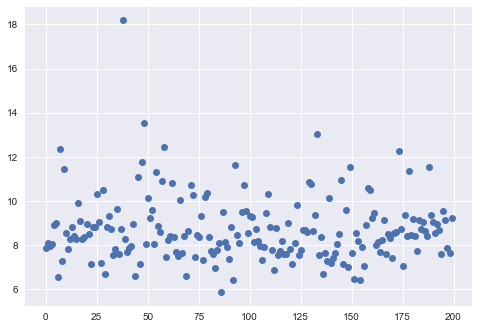

In [63]:
plt.plot(converg_times, "o")

In [64]:
# n_itr=1
# loss_train_1[n_itr]
# n_iter_train_1[n_itr]
# predict_train_1[n_itr]
# predict_test_1[n_itr]

# loss_train_2[n_itr]
# n_iter_train_2[n_itr]
# predict_train_2[n_itr]
# predict_test_2[n_itr]

# [item for sublist in [[loss_train_1[n_itr]],[n_iter_train_1[n_itr]],list(predict_train_1[n_itr]),list(predict_test_1[n_itr])] for item in sublist]

converg_times

[7.865671157836914,
 8.078696012496948,
 7.958820819854736,
 8.032177925109863,
 8.877898931503296,
 8.997573852539062,
 6.516350030899048,
 12.36939001083374,
 7.277584791183472,
 11.455919027328491,
 8.53902006149292,
 7.827385902404785,
 8.277729034423828,
 8.821891069412231,
 8.403767108917236,
 8.267904043197632,
 9.889369010925293,
 9.062612056732178,
 8.284215211868286,
 8.359856843948364,
 8.939082145690918,
 8.500818014144897,
 7.114230155944824,
 8.79265809059143,
 8.802876949310303,
 10.296437978744507,
 9.050925016403198,
 7.187080144882202,
 10.476361989974976,
 6.681851148605347,
 8.788712978363037,
 9.284847021102905,
 8.708338022232056,
 7.533984899520874,
 7.829137086868286,
 9.623551845550537,
 7.560513973236084,
 8.731781005859375,
 18.18363094329834,
 8.273617029190063,
 7.669740915298462,
 7.869191884994507,
 7.94477391242981,
 8.958645105361938,
 6.561682939529419,
 11.072295188903809,
 7.124303102493286,
 11.751779794692993,
 13.531189918518066,
 8.02660202980041

In [65]:
loss_train_1
# n_iter_train_1
# predict_train_1
# predict_test_1

# loss_train_2
# n_iter_train_2
# predict_train_2
# predict_test_2

[]

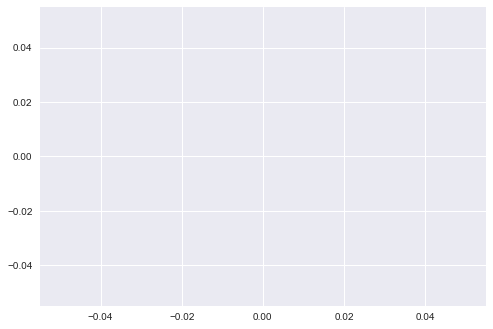

In [66]:
plt.plot(loss_train_1)

In [ ]:
plt.plot(loss_train_2)

In [ ]:
plt.hist(np.array(predict_test_1))

In [ ]:
plt.hist(np.array(predict_test_2))

# Clasifiers Comparison

In [41]:
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import average_precision_score

%matplotlib inline
plt.style.use('seaborn')

In [45]:
h = .02  # step size in the mesh

names = [
    "Nearest Neighbors", 
    "Linear SVM", 
    "RBF SVM", 
    "Gaussian Process",
    "Decision Tree", 
    "Random Forest", 
    "Neural Net", 
    "AdaBoost",
    "Naive Bayes", 
    "QDA"
]

classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0), warm_start=True),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, tol=1e-12, learning_rate='adaptive',hidden_layer_sizes=(4)),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()
]

In [46]:
avg_scores_train=[]
avg_scores_test=[]
#train_clasif=[]
for name, clf in zip(names, classifiers):
    clasif=clf.fit(train_1_X, train_1_y)
    #train_clasif.append(clasif)
    scr=average_precision_score(train_1_y,clasif.predict(train_1_X))
    avg_scores_train.append(scr)
    scr_test=average_precision_score(test_1_y,clasif.predict(test_1_X))
    avg_scores_test.append(scr_test)

    print(name,scr,scr_test)

('Nearest Neighbors', 0.76055194805194803, 0.625)
('Linear SVM', 0.81818181818181812, 0.75)
('RBF SVM', 1.0, 0.75)
('Gaussian Process', 1.0, 0.75)
('Decision Tree', 1.0, 0.875)
('Random Forest', 1.0, 0.75)
('Neural Net', 0.81818181818181812, 0.75)
('AdaBoost', 0.82207792207792207, 0.83333333333333326)
('Naive Bayes', 0.89610389610389607, 0.75)
('QDA', 1.0, 0.54166666666666663)


In [44]:
avg_scores_train_2=[]
avg_scores_test_2=[]
#train_clasif=[]
for name, clf in zip(names, classifiers):
    clasif=clf.fit(train_2_X, train_2_y)
    #train_clasif.append(clasif)
    scr=average_precision_score(train_2_y,clasif.predict(train_2_X))
    avg_scores_train.append(scr)
    scr_test=average_precision_score(test_2_y,clasif.predict(test_2_X))
    avg_scores_test.append(scr_test)

    print(name,scr,scr_test)

('Nearest Neighbors', 0.90000000000000002, 0.625)
('Linear SVM', 0.8125, 0.25)
('RBF SVM', 0.90000000000000002, 0.25)
('Gaussian Process', 0.90000000000000002, 0.25)
('Decision Tree', 0.9375, 0.25)
('Random Forest', 0.90000000000000002, 0.25)
('Neural Net', 0.75, 0.25)
('AdaBoost', 0.8125, 0.625)
('Naive Bayes', 0.7857142857142857, 0.625)
('QDA', 0.9375, 0.625)
